# Deep learning tutorial on fashion-mnist dataset
This is my walkthrough of an [datacamp article](https://www.datacamp.com/community/tutorials/convolutional-neural-networks-python) about deep learning in python with keras and tensorflow.

Credits to [Aditya Sharma](https://www.datacamp.com/profile/adityasharma101993) 




In [1]:
from keras.datasets import fashion_mnist
(train_X,train_Y), (test_X,test_Y) = fashion_mnist.load_data()


C:\_work\virtualenv\keras-theano\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


Using TensorFlow backend.


In [2]:
import numpy as np
from keras.utils import to_categorical
import matplotlib.pyplot as plt
%matplotlib inline

print('Training data shape : ', train_X.shape, train_Y.shape)

print('Testing data shape : ', test_X.shape, test_Y.shape)

Training data shape :  (60000, 28, 28) (60000,)
Testing data shape :  (10000, 28, 28) (10000,)


In [3]:
# find the unique numbers from the train labels
classes = np.unique(train_Y)
nClasses = len(classes)
print('Total number of outputs : ', nClasses)
print('Output classes : ', classes)

Total number of outputs :  10
Output classes :  [0 1 2 3 4 5 6 7 8 9]


Text(0.5,1,'Ground truth : 9')

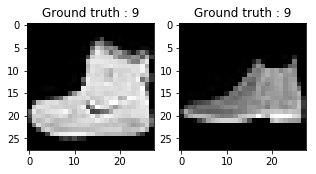

In [11]:
plt.figure(figsize=[5,5])

# Display the first image in training data
plt.subplot(121)
plt.imshow(train_X[0,:,:], cmap='gray')
plt.title("Ground truth : {}".format(train_Y[0]))

# Display the first image in testing data
plt.subplot(122)
plt.imshow(test_X[0,:,:], cmap='gray')
plt.title("Ground truth : {}".format(test_Y[0]))

# Data Preprocessing

As you could see in the above plot, the images are grayscale images have pixel values that range from 0 to 255. Also, these images have a dimension of 28 x 28. As a result, you'll need to preprocess the data before you feed it into the model. 
* As a first step, convert each 28 x 28 image of the train and test set into a matrix of size 28 x 28 x 1 which is fed into the network.

In [5]:
train_X = train_X.reshape(-1, 28,28, 1)
test_X = test_X.reshape(-1, 28,28, 1)
train_X.shape, test_X.shape

* The data right now is in an int8 format, so before you feed it into the network you need to convert its type to float32, and you also have to rescale the pixel values in range 0 - 1 inclusive. So let's do that!

In [6]:
train_X = train_X.astype('float32')
test_X = test_X.astype('float32')
train_X = train_X / 255.
test_X = test_X / 255.

* Now you need to convert the class labels into a one-hot encoding vector.

In one-hot encoding, you convert the categorical data into a vector of numbers. The reason why you convert the categorical data in one hot encoding is that machine learning algorithms cannot work with categorical data directly. You generate one boolean column for each category or class. Only one of these columns could take on the value 1 for each sample. Hence, the term one-hot encoding.

For your problem statement, the one hot encoding will be a row vector, and for each image, it will have a dimension of 1 x 10. The important thing to note here is that the vector consists of all zeros except for the class that it represents, and for that, it is 1. For example, the ankle boot image that you plotted above has a label of 9, so for all the ankle boot images, the one hot encoding vector would be [0 0 0 0 0 0 0 0 1 0]. 

So let's convert the training and testing labels into one-hot encoding vectors:

In [7]:
# Change the labels from categorical to one-hot encoding
train_Y_one_hot = to_categorical(train_Y)
test_Y_one_hot = to_categorical(test_Y)

# Display the change for category label using one-hot encoding
print('Original label:', train_Y[0])
print('After conversion to one-hot:', train_Y_one_hot[0])

Original label: 9
After conversion to one-hot: [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]


That's pretty clear, right? Note that you can also print the train_Y_one_hot, which will display a matrix of size 60000 x 10 in which each row depicts one-hot encoding of an image.

* This last step is a crucial one. In machine learning or any data specific task, you should partition the data correctly. For the model to generalize well, you split the training data into two parts, one designed for training and another one for validation. In this case, you will train the model on 80\% of the training data and validate it on 20\% of the remaining training data. This will also help to reduce overfitting since you will be validating the model on the data it would not have seen in training phase, which will help in boosting the test performance.

In [8]:
from sklearn.model_selection import train_test_split

train_X,valid_X,train_label,valid_label = train_test_split(train_X, train_Y_one_hot, test_size=0.2, random_state=13)



In [9]:
train_X.shape,valid_X.shape,train_label.shape,valid_label.shape

((48000, 28, 28, 1), (12000, 28, 28, 1), (48000, 10), (12000, 10))

# The Network

The images are of size 28 x 28. You convert the image matrix to an array, rescale it between 0 and 1, reshape it so that it's of size 28 x 28 x 1, and feed this as an input to the network. 

You'll use three convolutional layers: 

* The first layer will have 32-3 x 3 filters,
* The second layer will have 64-3 x 3 filters and
* The third layer will have 128-3 x 3 filters.
In addition, there are three max-pooling layers each of size 2 x 2.

![Figure: Architecture of the Model](http://res.cloudinary.com/dyd911kmh/image/upload/f_auto,q_auto:best/v1512486717/fashion-mnist-architecture_htbpsz.png)


## Model the Data

First, let's import all the necessary modules required to train the model.

In [10]:
import keras
from keras.models import Sequential,Input,Model
from keras.layers import Dense, Dropout, Flatten
from keras.layers import Conv2D, MaxPooling2D
from keras.layers.normalization import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU

You will use a batch size of 64 using a higher batch size of 128 or 256 is also preferable it all depends on the memory. It contributes massively to determining the learning parameters and affects the prediction accuracy. You will train the network for 20 epochs.

In [11]:
batch_size = 64
epochs = 20
num_classes = 10

## Neural Network Architecture

In Keras, you can just stack up layers by adding the desired layer one by one. That's exactly what you'll do here: you'll first add a first convolutional layer with Conv2D(). Note that you use this function because you're working with images! Next, you add the Leaky ReLU activation function which helps the network learn non-linear decision boundaries. Since you have ten different classes, you'll need a non-linear decision boundary that could separate these ten classes which are not linearly separable. 

More specifically, you add Leaky ReLUs because they attempt to fix the problem of dying Rectified Linear Units (ReLUs). The ReLU activation function is used a lot in neural network architectures and more specifically in convolutional networks, where it has proven to be more effective than the widely used logistic sigmoid function. As of 2017, this activation function is the most popular one for deep neural networks. The ReLU function allows the activation to be thresholded at zero. However, during the training, ReLU units can "die". This can happen when a large gradient flows through a ReLU neuron: it can cause the weights to update in such a way that the neuron will never activate on any data point again. If this happens, then the gradient flowing through the unit will forever be zero from that point on. Leaky ReLUs attempt to solve this: the function will not be zero but will instead have a small negative slope. 

Next, you'll add the max-pooling layer with MaxPooling2D() and so on. The last layer is a Dense layer that has a softmax activation function with 10 units, which is needed for this multi-class classification problem.

In [12]:
fashion_model = Sequential()
fashion_model.add(Conv2D(32, kernel_size=(3, 3),activation='linear',input_shape=(28,28,1),padding='same'))
fashion_model.add(LeakyReLU(alpha=0.1))
fashion_model.add(MaxPooling2D((2, 2),padding='same'))
fashion_model.add(Conv2D(64, (3, 3), activation='linear',padding='same'))
fashion_model.add(LeakyReLU(alpha=0.1))
fashion_model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
fashion_model.add(Conv2D(128, (3, 3), activation='linear',padding='same'))
fashion_model.add(LeakyReLU(alpha=0.1))                  
fashion_model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
fashion_model.add(Flatten())
fashion_model.add(Dense(128, activation='linear'))
fashion_model.add(LeakyReLU(alpha=0.1))                  
fashion_model.add(Dense(num_classes, activation='softmax'))

##Compile the Model

After the model is created, you compile it using the Adam optimizer, one of the most popular optimization algorithms. You can read more about this optimizer here. Additionally, you specify the loss type which is categorical cross entropy which is used for multi-class classification, you can also use binary cross-entropy as the loss function. Lastly, you specify the metrics as accuracy which you want to analyze while the model is training.

In [13]:
fashion_model.compile(loss=keras.losses.categorical_crossentropy, optimizer=keras.optimizers.Adam(),metrics=['accuracy'])


Let's visualize the layers that you created in the above step by using the summary function. This will show some parameters (weights and biases) in each layer and also the total parameters in your model.

In [15]:
fashion_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 28, 28, 32)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 14, 14, 64)        18496     
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 7, 7, 64)          0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 7, 7, 128)         73856     
__________

## Train the Model

It's finally time to train the model with Keras' `fit()` function! The model trains for 20 epochs. The `fit()` function will return a `history` object; By storying the result of this function in `fashion_train`, you can use it later to plot the accuracy and loss function plots between training and validation which will help you to analyze your model's performance visually.

In [16]:
fashion_train = fashion_model.fit(train_X, train_label, batch_size=batch_size,epochs=epochs,verbose=1,validation_data=(valid_X, valid_label))

Train on 48000 samples, validate on 12000 samples
Epoch 1/20


   64/48000 [..............................] - ETA: 14:39 - loss: 2.3070 - acc: 0.0938

  128/48000 [..............................] - ETA: 9:18 - loss: 2.2794 - acc: 0.1094 

  192/48000 [..............................] - ETA: 7:56 - loss: 2.2628 - acc: 0.1406

  256/48000 [..............................] - ETA: 6:47 - loss: 2.2502 - acc: 0.1562

  320/48000 [..............................] - ETA: 6:02 - loss: 2.2204 - acc: 0.1812

  384/48000 [..............................] - ETA: 5:30 - loss: 2.1825 - acc: 0.2214

  448/48000 [..............................] - ETA: 5:06 - loss: 2.1429 - acc: 0.2790

  512/48000 [..............................] - ETA: 4:51 - loss: 2.0859 - acc: 0.3242

  576/48000 [..............................] - ETA: 4:39 - loss: 2.0317 - acc: 0.3438

  640/48000 [..............................] - ETA: 4:31 - loss: 1.9758 - acc: 0.3516

  704/48000 [..............................] - ETA: 4:22 - loss: 1.9392 - acc: 0.3622

  768/48000 [..............................] - ETA: 4:14 - loss: 1.8860 - acc: 0.3750

  832/48000 [..............................] - ETA: 4:08 - loss: 1.8317 - acc: 0.3906

  896/48000 [..............................] - ETA: 4:03 - loss: 1.8282 - acc: 0.3884

  960/48000 [..............................] - ETA: 3:58 - loss: 1.7797 - acc: 0.4042

 1024/48000 [..............................] - ETA: 3:55 - loss: 1.7341 - acc: 0.4219

 1088/48000 [..............................] - ETA: 3:52 - loss: 1.7091 - acc: 0.4329

 1152/48000 [..............................] - ETA: 3:49 - loss: 1.6937 - acc: 0.4349

 1216/48000 [..............................] - ETA: 3:45 - loss: 1.6601 - acc: 0.4449

 1280/48000 [..............................] - ETA: 3:43 - loss: 1.6360 - acc: 0.4516

 1344/48000 [..............................] - ETA: 3:41 - loss: 1.6036 - acc: 0.4606

 1408/48000 [..............................] - ETA: 3:42 - loss: 1.5653 - acc: 0.4688

 1472/48000 [..............................] - ETA: 3:40 - loss: 1.5359 - acc: 0.4776

 1536/48000 [..............................] - ETA: 3:37 - loss: 1.5136 - acc: 0.4850

 1600/48000 [>.............................] - ETA: 3:35 - loss: 1.4832 - acc: 0.4963

 1664/48000 [>.............................] - ETA: 3:34 - loss: 1.4632 - acc: 0.5030

 1728/48000 [>.............................] - ETA: 3:34 - loss: 1.4414 - acc: 0.5069

 1792/48000 [>.............................] - ETA: 3:33 - loss: 1.4190 - acc: 0.5156

 1856/48000 [>.............................] - ETA: 3:31 - loss: 1.3974 - acc: 0.5221

 1920/48000 [>.............................] - ETA: 3:30 - loss: 1.3768 - acc: 0.5297

 1984/48000 [>.............................] - ETA: 3:28 - loss: 1.3603 - acc: 0.5363

 2048/48000 [>.............................] - ETA: 3:27 - loss: 1.3358 - acc: 0.5449

 2112/48000 [>.............................] - ETA: 3:26 - loss: 1.3216 - acc: 0.5507

 2176/48000 [>.............................] - ETA: 3:24 - loss: 1.3014 - acc: 0.5561

 2240/48000 [>.............................] - ETA: 3:22 - loss: 1.2831 - acc: 0.5625

 2304/48000 [>.............................] - ETA: 3:21 - loss: 1.2767 - acc: 0.5629

 2368/48000 [>.............................] - ETA: 3:19 - loss: 1.2667 - acc: 0.5663

 2432/48000 [>.............................] - ETA: 3:17 - loss: 1.2521 - acc: 0.5715

 2496/48000 [>.............................] - ETA: 3:16 - loss: 1.2403 - acc: 0.5737

 2560/48000 [>.............................] - ETA: 3:15 - loss: 1.2309 - acc: 0.5770

 2624/48000 [>.............................] - ETA: 3:15 - loss: 1.2197 - acc: 0.5808

 2688/48000 [>.............................] - ETA: 3:14 - loss: 1.2068 - acc: 0.5833

 2752/48000 [>.............................] - ETA: 3:13 - loss: 1.1961 - acc: 0.5865

 2816/48000 [>.............................] - ETA: 3:12 - loss: 1.1876 - acc: 0.5884

 2880/48000 [>.............................] - ETA: 3:11 - loss: 1.1747 - acc: 0.5924

 2944/48000 [>.............................] - ETA: 3:10 - loss: 1.1617 - acc: 0.5968

 3008/48000 [>.............................] - ETA: 3:10 - loss: 1.1492 - acc: 0.6007

 3072/48000 [>.............................] - ETA: 3:09 - loss: 1.1380 - acc: 0.6045

 3136/48000 [>.............................] - ETA: 3:09 - loss: 1.1337 - acc: 0.6059

 3200/48000 [=>............................] - ETA: 3:08 - loss: 1.1222 - acc: 0.6103

 3264/48000 [=>............................] - ETA: 3:07 - loss: 1.1167 - acc: 0.6112

 3328/48000 [=>............................] - ETA: 3:06 - loss: 1.1082 - acc: 0.6142

 3392/48000 [=>............................] - ETA: 3:06 - loss: 1.1014 - acc: 0.6162

 3456/48000 [=>............................] - ETA: 3:05 - loss: 1.1022 - acc: 0.6166

 3520/48000 [=>............................] - ETA: 3:04 - loss: 1.0977 - acc: 0.6176

 3584/48000 [=>............................] - ETA: 3:03 - loss: 1.0874 - acc: 0.6208

 3648/48000 [=>............................] - ETA: 3:03 - loss: 1.0819 - acc: 0.6223

 3712/48000 [=>............................] - ETA: 3:02 - loss: 1.0751 - acc: 0.6242

 3776/48000 [=>............................] - ETA: 3:01 - loss: 1.0644 - acc: 0.6279

 3840/48000 [=>............................] - ETA: 3:01 - loss: 1.0573 - acc: 0.6305

 3904/48000 [=>............................] - ETA: 3:01 - loss: 1.0497 - acc: 0.6329

 3968/48000 [=>............................] - ETA: 3:01 - loss: 1.0421 - acc: 0.6353

 4032/48000 [=>............................] - ETA: 3:00 - loss: 1.0347 - acc: 0.6374

 4096/48000 [=>............................] - ETA: 2:59 - loss: 1.0257 - acc: 0.6401

 4160/48000 [=>............................] - ETA: 2:59 - loss: 1.0183 - acc: 0.6418

 4224/48000 [=>............................] - ETA: 2:58 - loss: 1.0119 - acc: 0.6430

 4288/48000 [=>............................] - ETA: 2:58 - loss: 1.0038 - acc: 0.6465

 4352/48000 [=>............................] - ETA: 2:58 - loss: 0.9981 - acc: 0.6475

 4416/48000 [=>............................] - ETA: 2:58 - loss: 0.9941 - acc: 0.6501

 4480/48000 [=>............................] - ETA: 2:58 - loss: 0.9886 - acc: 0.6522

 4544/48000 [=>............................] - ETA: 2:58 - loss: 0.9853 - acc: 0.6534

 4608/48000 [=>............................] - ETA: 2:58 - loss: 0.9810 - acc: 0.6545

 4672/48000 [=>............................] - ETA: 2:59 - loss: 0.9753 - acc: 0.6562

 4736/48000 [=>............................] - ETA: 3:01 - loss: 0.9732 - acc: 0.6575

 4800/48000 [==>...........................] - ETA: 3:00 - loss: 0.9692 - acc: 0.6585

 4864/48000 [==>...........................] - ETA: 3:00 - loss: 0.9649 - acc: 0.6597

 4928/48000 [==>...........................] - ETA: 2:59 - loss: 0.9593 - acc: 0.6615

 4992/48000 [==>...........................] - ETA: 2:58 - loss: 0.9547 - acc: 0.6631

 5056/48000 [==>...........................] - ETA: 2:57 - loss: 0.9501 - acc: 0.6652

 5120/48000 [==>...........................] - ETA: 2:57 - loss: 0.9454 - acc: 0.6664

 5184/48000 [==>...........................] - ETA: 2:56 - loss: 0.9408 - acc: 0.6680

 5248/48000 [==>...........................] - ETA: 2:55 - loss: 0.9374 - acc: 0.6688

 5312/48000 [==>...........................] - ETA: 2:54 - loss: 0.9324 - acc: 0.6706

 5376/48000 [==>...........................] - ETA: 2:53 - loss: 0.9290 - acc: 0.6717

 5440/48000 [==>...........................] - ETA: 2:53 - loss: 0.9271 - acc: 0.6724

 5504/48000 [==>...........................] - ETA: 2:52 - loss: 0.9225 - acc: 0.6742

 5568/48000 [==>...........................] - ETA: 2:51 - loss: 0.9179 - acc: 0.6762

 5632/48000 [==>...........................] - ETA: 2:51 - loss: 0.9131 - acc: 0.6779

 5696/48000 [==>...........................] - ETA: 2:50 - loss: 0.9089 - acc: 0.6789

 5760/48000 [==>...........................] - ETA: 2:49 - loss: 0.9068 - acc: 0.6795

 5824/48000 [==>...........................] - ETA: 2:49 - loss: 0.9046 - acc: 0.6801

 5888/48000 [==>...........................] - ETA: 2:49 - loss: 0.9019 - acc: 0.6807

 5952/48000 [==>...........................] - ETA: 2:49 - loss: 0.8991 - acc: 0.6813

 6016/48000 [==>...........................] - ETA: 2:49 - loss: 0.8938 - acc: 0.6832

 6080/48000 [==>...........................] - ETA: 2:51 - loss: 0.8917 - acc: 0.6840

 6144/48000 [==>...........................] - ETA: 2:52 - loss: 0.8891 - acc: 0.6852

 6208/48000 [==>...........................] - ETA: 2:53 - loss: 0.8864 - acc: 0.6862

 6272/48000 [==>...........................] - ETA: 2:52 - loss: 0.8841 - acc: 0.6861

 6336/48000 [==>...........................] - ETA: 2:52 - loss: 0.8793 - acc: 0.6881

 6400/48000 [===>..........................] - ETA: 2:52 - loss: 0.8767 - acc: 0.6891

 6464/48000 [===>..........................] - ETA: 2:51 - loss: 0.8739 - acc: 0.6898

 6528/48000 [===>..........................] - ETA: 2:51 - loss: 0.8706 - acc: 0.6909

 6592/48000 [===>..........................] - ETA: 2:50 - loss: 0.8674 - acc: 0.6921

 6656/48000 [===>..........................] - ETA: 2:50 - loss: 0.8651 - acc: 0.6926

 6720/48000 [===>..........................] - ETA: 2:50 - loss: 0.8643 - acc: 0.6937

 6784/48000 [===>..........................] - ETA: 2:49 - loss: 0.8642 - acc: 0.6937

 6848/48000 [===>..........................] - ETA: 2:49 - loss: 0.8592 - acc: 0.6957

 6912/48000 [===>..........................] - ETA: 2:49 - loss: 0.8558 - acc: 0.6968

 6976/48000 [===>..........................] - ETA: 2:48 - loss: 0.8550 - acc: 0.6967

 7040/48000 [===>..........................] - ETA: 2:48 - loss: 0.8545 - acc: 0.6967

 7104/48000 [===>..........................] - ETA: 2:48 - loss: 0.8541 - acc: 0.6966

 7168/48000 [===>..........................] - ETA: 2:48 - loss: 0.8517 - acc: 0.6974

 7232/48000 [===>..........................] - ETA: 2:48 - loss: 0.8480 - acc: 0.6987

 7296/48000 [===>..........................] - ETA: 2:47 - loss: 0.8453 - acc: 0.6992

 7360/48000 [===>..........................] - ETA: 2:47 - loss: 0.8449 - acc: 0.6996

 7424/48000 [===>..........................] - ETA: 2:47 - loss: 0.8438 - acc: 0.6992

 7488/48000 [===>..........................] - ETA: 2:47 - loss: 0.8431 - acc: 0.6998

 7552/48000 [===>..........................] - ETA: 2:46 - loss: 0.8414 - acc: 0.6999

 7616/48000 [===>..........................] - ETA: 2:46 - loss: 0.8387 - acc: 0.7008

 7680/48000 [===>..........................] - ETA: 2:46 - loss: 0.8357 - acc: 0.7018

 7744/48000 [===>..........................] - ETA: 2:45 - loss: 0.8327 - acc: 0.7030

 7808/48000 [===>..........................] - ETA: 2:45 - loss: 0.8298 - acc: 0.7040

 7872/48000 [===>..........................] - ETA: 2:45 - loss: 0.8265 - acc: 0.7054

 7936/48000 [===>..........................] - ETA: 2:44 - loss: 0.8240 - acc: 0.7064

 8000/48000 [====>.........................] - ETA: 2:44 - loss: 0.8219 - acc: 0.7073

 8064/48000 [====>.........................] - ETA: 2:43 - loss: 0.8187 - acc: 0.7087

 8128/48000 [====>.........................] - ETA: 2:43 - loss: 0.8158 - acc: 0.7096

 8192/48000 [====>.........................] - ETA: 2:43 - loss: 0.8132 - acc: 0.7106

 8256/48000 [====>.........................] - ETA: 2:42 - loss: 0.8110 - acc: 0.7110

 8320/48000 [====>.........................] - ETA: 2:42 - loss: 0.8076 - acc: 0.7125

 8384/48000 [====>.........................] - ETA: 2:42 - loss: 0.8056 - acc: 0.7134

 8448/48000 [====>.........................] - ETA: 2:41 - loss: 0.8030 - acc: 0.7138

 8512/48000 [====>.........................] - ETA: 2:41 - loss: 0.8011 - acc: 0.7146

 8576/48000 [====>.........................] - ETA: 2:40 - loss: 0.7994 - acc: 0.7151

 8640/48000 [====>.........................] - ETA: 2:40 - loss: 0.7991 - acc: 0.7153

 8704/48000 [====>.........................] - ETA: 2:40 - loss: 0.7976 - acc: 0.7154

 8768/48000 [====>.........................] - ETA: 2:39 - loss: 0.7956 - acc: 0.7160

 8832/48000 [====>.........................] - ETA: 2:39 - loss: 0.7931 - acc: 0.7172

 8896/48000 [====>.........................] - ETA: 2:38 - loss: 0.7924 - acc: 0.7176

 8960/48000 [====>.........................] - ETA: 2:38 - loss: 0.7900 - acc: 0.7185

 9024/48000 [====>.........................] - ETA: 2:38 - loss: 0.7881 - acc: 0.7194

 9088/48000 [====>.........................] - ETA: 2:37 - loss: 0.7851 - acc: 0.7202

 9152/48000 [====>.........................] - ETA: 2:37 - loss: 0.7824 - acc: 0.7208

 9216/48000 [====>.........................] - ETA: 2:36 - loss: 0.7814 - acc: 0.7209

 9280/48000 [====>.........................] - ETA: 2:36 - loss: 0.7798 - acc: 0.7212

 9344/48000 [====>.........................] - ETA: 2:36 - loss: 0.7773 - acc: 0.7223

 9408/48000 [====>.........................] - ETA: 2:35 - loss: 0.7742 - acc: 0.7234

 9472/48000 [====>.........................] - ETA: 2:35 - loss: 0.7717 - acc: 0.7242

 9536/48000 [====>.........................] - ETA: 2:35 - loss: 0.7703 - acc: 0.7247

 9600/48000 [=====>........................] - ETA: 2:34 - loss: 0.7686 - acc: 0.7252

 9664/48000 [=====>........................] - ETA: 2:34 - loss: 0.7666 - acc: 0.7258

 9728/48000 [=====>........................] - ETA: 2:34 - loss: 0.7635 - acc: 0.7271

 9792/48000 [=====>........................] - ETA: 2:33 - loss: 0.7613 - acc: 0.7279

 9856/48000 [=====>........................] - ETA: 2:33 - loss: 0.7595 - acc: 0.7286

 9920/48000 [=====>........................] - ETA: 2:33 - loss: 0.7574 - acc: 0.7294

 9984/48000 [=====>........................] - ETA: 2:33 - loss: 0.7559 - acc: 0.7299

10048/48000 [=====>........................] - ETA: 2:32 - loss: 0.7553 - acc: 0.7298

10112/48000 [=====>........................] - ETA: 2:32 - loss: 0.7540 - acc: 0.7306

10176/48000 [=====>........................] - ETA: 2:32 - loss: 0.7522 - acc: 0.7312

10240/48000 [=====>........................] - ETA: 2:32 - loss: 0.7506 - acc: 0.7317

10304/48000 [=====>........................] - ETA: 2:31 - loss: 0.7488 - acc: 0.7322

10368/48000 [=====>........................] - ETA: 2:31 - loss: 0.7467 - acc: 0.7329

10432/48000 [=====>........................] - ETA: 2:31 - loss: 0.7453 - acc: 0.7335

10496/48000 [=====>........................] - ETA: 2:30 - loss: 0.7439 - acc: 0.7341

10560/48000 [=====>........................] - ETA: 2:30 - loss: 0.7428 - acc: 0.7345

10624/48000 [=====>........................] - ETA: 2:30 - loss: 0.7412 - acc: 0.7351

10688/48000 [=====>........................] - ETA: 2:30 - loss: 0.7404 - acc: 0.7356

10752/48000 [=====>........................] - ETA: 2:29 - loss: 0.7387 - acc: 0.7364

10816/48000 [=====>........................] - ETA: 2:29 - loss: 0.7370 - acc: 0.7370

10880/48000 [=====>........................] - ETA: 2:29 - loss: 0.7356 - acc: 0.7371

10944/48000 [=====>........................] - ETA: 2:28 - loss: 0.7342 - acc: 0.7374

11008/48000 [=====>........................] - ETA: 2:28 - loss: 0.7330 - acc: 0.7379

11072/48000 [=====>........................] - ETA: 2:27 - loss: 0.7312 - acc: 0.7386

11136/48000 [=====>........................] - ETA: 2:27 - loss: 0.7298 - acc: 0.7390

11200/48000 [======>.......................] - ETA: 2:27 - loss: 0.7296 - acc: 0.7388

11264/48000 [======>.......................] - ETA: 2:26 - loss: 0.7282 - acc: 0.7393

11328/48000 [======>.......................] - ETA: 2:26 - loss: 0.7268 - acc: 0.7395

11392/48000 [======>.......................] - ETA: 2:26 - loss: 0.7254 - acc: 0.7399

11456/48000 [======>.......................] - ETA: 2:25 - loss: 0.7246 - acc: 0.7401

11520/48000 [======>.......................] - ETA: 2:25 - loss: 0.7230 - acc: 0.7407

11584/48000 [======>.......................] - ETA: 2:25 - loss: 0.7226 - acc: 0.7406

11648/48000 [======>.......................] - ETA: 2:25 - loss: 0.7207 - acc: 0.7412

11712/48000 [======>.......................] - ETA: 2:24 - loss: 0.7190 - acc: 0.7421

11776/48000 [======>.......................] - ETA: 2:24 - loss: 0.7172 - acc: 0.7425

11840/48000 [======>.......................] - ETA: 2:24 - loss: 0.7152 - acc: 0.7431

11904/48000 [======>.......................] - ETA: 2:24 - loss: 0.7148 - acc: 0.7436

11968/48000 [======>.......................] - ETA: 2:23 - loss: 0.7134 - acc: 0.7438

12032/48000 [======>.......................] - ETA: 2:23 - loss: 0.7132 - acc: 0.7437

12096/48000 [======>.......................] - ETA: 2:23 - loss: 0.7118 - acc: 0.7440

12160/48000 [======>.......................] - ETA: 2:23 - loss: 0.7113 - acc: 0.7442

12224/48000 [======>.......................] - ETA: 2:22 - loss: 0.7108 - acc: 0.7443

12288/48000 [======>.......................] - ETA: 2:22 - loss: 0.7092 - acc: 0.7450

12352/48000 [======>.......................] - ETA: 2:22 - loss: 0.7076 - acc: 0.7455

12416/48000 [======>.......................] - ETA: 2:22 - loss: 0.7061 - acc: 0.7460

12480/48000 [======>.......................] - ETA: 2:22 - loss: 0.7048 - acc: 0.7467

12544/48000 [======>.......................] - ETA: 2:21 - loss: 0.7035 - acc: 0.7471

12608/48000 [======>.......................] - ETA: 2:21 - loss: 0.7026 - acc: 0.7475

12672/48000 [======>.......................] - ETA: 2:21 - loss: 0.7015 - acc: 0.7480

12736/48000 [======>.......................] - ETA: 2:21 - loss: 0.7001 - acc: 0.7486

12800/48000 [=======>......................] - ETA: 2:21 - loss: 0.6990 - acc: 0.7487

12864/48000 [=======>......................] - ETA: 2:21 - loss: 0.6974 - acc: 0.7491

12928/48000 [=======>......................] - ETA: 2:20 - loss: 0.6966 - acc: 0.7495

12992/48000 [=======>......................] - ETA: 2:20 - loss: 0.6965 - acc: 0.7493

13056/48000 [=======>......................] - ETA: 2:20 - loss: 0.6953 - acc: 0.7494

13120/48000 [=======>......................] - ETA: 2:20 - loss: 0.6934 - acc: 0.7501

13184/48000 [=======>......................] - ETA: 2:20 - loss: 0.6921 - acc: 0.7506

13248/48000 [=======>......................] - ETA: 2:19 - loss: 0.6923 - acc: 0.7508

13312/48000 [=======>......................] - ETA: 2:19 - loss: 0.6914 - acc: 0.7512

13376/48000 [=======>......................] - ETA: 2:19 - loss: 0.6907 - acc: 0.7515

13440/48000 [=======>......................] - ETA: 2:18 - loss: 0.6890 - acc: 0.7521

13504/48000 [=======>......................] - ETA: 2:18 - loss: 0.6878 - acc: 0.7528

13568/48000 [=======>......................] - ETA: 2:18 - loss: 0.6867 - acc: 0.7528

13632/48000 [=======>......................] - ETA: 2:17 - loss: 0.6868 - acc: 0.7528

13696/48000 [=======>......................] - ETA: 2:17 - loss: 0.6857 - acc: 0.7531

13760/48000 [=======>......................] - ETA: 2:17 - loss: 0.6846 - acc: 0.7534

13824/48000 [=======>......................] - ETA: 2:17 - loss: 0.6830 - acc: 0.7538

13888/48000 [=======>......................] - ETA: 2:16 - loss: 0.6827 - acc: 0.7537

13952/48000 [=======>......................] - ETA: 2:16 - loss: 0.6814 - acc: 0.7542

14016/48000 [=======>......................] - ETA: 2:16 - loss: 0.6802 - acc: 0.7546

14080/48000 [=======>......................] - ETA: 2:15 - loss: 0.6789 - acc: 0.7551

14144/48000 [=======>......................] - ETA: 2:15 - loss: 0.6786 - acc: 0.7550

14208/48000 [=======>......................] - ETA: 2:15 - loss: 0.6769 - acc: 0.7558

14272/48000 [=======>......................] - ETA: 2:15 - loss: 0.6762 - acc: 0.7560

14336/48000 [=======>......................] - ETA: 2:14 - loss: 0.6754 - acc: 0.7561

14400/48000 [========>.....................] - ETA: 2:14 - loss: 0.6746 - acc: 0.7567

14464/48000 [========>.....................] - ETA: 2:14 - loss: 0.6736 - acc: 0.7571

14528/48000 [========>.....................] - ETA: 2:13 - loss: 0.6725 - acc: 0.7576

14592/48000 [========>.....................] - ETA: 2:13 - loss: 0.6713 - acc: 0.7580

14656/48000 [========>.....................] - ETA: 2:13 - loss: 0.6709 - acc: 0.7578

14720/48000 [========>.....................] - ETA: 2:12 - loss: 0.6708 - acc: 0.7579

14784/48000 [========>.....................] - ETA: 2:12 - loss: 0.6696 - acc: 0.7585

14848/48000 [========>.....................] - ETA: 2:12 - loss: 0.6684 - acc: 0.7590

14912/48000 [========>.....................] - ETA: 2:11 - loss: 0.6680 - acc: 0.7591

14976/48000 [========>.....................] - ETA: 2:11 - loss: 0.6665 - acc: 0.7595

15040/48000 [========>.....................] - ETA: 2:11 - loss: 0.6658 - acc: 0.7595

15104/48000 [========>.....................] - ETA: 2:10 - loss: 0.6644 - acc: 0.7599

15168/48000 [========>.....................] - ETA: 2:10 - loss: 0.6640 - acc: 0.7600

15232/48000 [========>.....................] - ETA: 2:10 - loss: 0.6628 - acc: 0.7605

15296/48000 [========>.....................] - ETA: 2:09 - loss: 0.6619 - acc: 0.7609

15360/48000 [========>.....................] - ETA: 2:09 - loss: 0.6610 - acc: 0.7610

15424/48000 [========>.....................] - ETA: 2:09 - loss: 0.6598 - acc: 0.7614

15488/48000 [========>.....................] - ETA: 2:09 - loss: 0.6589 - acc: 0.7616

15552/48000 [========>.....................] - ETA: 2:08 - loss: 0.6577 - acc: 0.7620

15616/48000 [========>.....................] - ETA: 2:08 - loss: 0.6569 - acc: 0.7622

15680/48000 [========>.....................] - ETA: 2:08 - loss: 0.6561 - acc: 0.7626

15744/48000 [========>.....................] - ETA: 2:07 - loss: 0.6558 - acc: 0.7626

15808/48000 [========>.....................] - ETA: 2:07 - loss: 0.6549 - acc: 0.7630

15872/48000 [========>.....................] - ETA: 2:07 - loss: 0.6541 - acc: 0.7632

15936/48000 [========>.....................] - ETA: 2:07 - loss: 0.6529 - acc: 0.7635

16000/48000 [=========>....................] - ETA: 2:06 - loss: 0.6518 - acc: 0.7638

16064/48000 [=========>....................] - ETA: 2:06 - loss: 0.6510 - acc: 0.7640

16128/48000 [=========>....................] - ETA: 2:06 - loss: 0.6508 - acc: 0.7639

16192/48000 [=========>....................] - ETA: 2:06 - loss: 0.6501 - acc: 0.7641

16256/48000 [=========>....................] - ETA: 2:05 - loss: 0.6488 - acc: 0.7644

16320/48000 [=========>....................] - ETA: 2:05 - loss: 0.6474 - acc: 0.7649

16384/48000 [=========>....................] - ETA: 2:05 - loss: 0.6460 - acc: 0.7653

16448/48000 [=========>....................] - ETA: 2:05 - loss: 0.6454 - acc: 0.7653

16512/48000 [=========>....................] - ETA: 2:04 - loss: 0.6454 - acc: 0.7656

16576/48000 [=========>....................] - ETA: 2:04 - loss: 0.6445 - acc: 0.7659

16640/48000 [=========>....................] - ETA: 2:04 - loss: 0.6443 - acc: 0.7659

16704/48000 [=========>....................] - ETA: 2:04 - loss: 0.6439 - acc: 0.7661

16768/48000 [=========>....................] - ETA: 2:03 - loss: 0.6430 - acc: 0.7663

16832/48000 [=========>....................] - ETA: 2:03 - loss: 0.6420 - acc: 0.7668

16896/48000 [=========>....................] - ETA: 2:03 - loss: 0.6410 - acc: 0.7672

16960/48000 [=========>....................] - ETA: 2:03 - loss: 0.6407 - acc: 0.7675

17024/48000 [=========>....................] - ETA: 2:02 - loss: 0.6398 - acc: 0.7676

17088/48000 [=========>....................] - ETA: 2:02 - loss: 0.6395 - acc: 0.7678

17152/48000 [=========>....................] - ETA: 2:02 - loss: 0.6383 - acc: 0.7682

17216/48000 [=========>....................] - ETA: 2:01 - loss: 0.6381 - acc: 0.7683

17280/48000 [=========>....................] - ETA: 2:01 - loss: 0.6369 - acc: 0.7688

17344/48000 [=========>....................] - ETA: 2:01 - loss: 0.6362 - acc: 0.7692

17408/48000 [=========>....................] - ETA: 2:01 - loss: 0.6358 - acc: 0.7694

17472/48000 [=========>....................] - ETA: 2:00 - loss: 0.6359 - acc: 0.7691

17536/48000 [=========>....................] - ETA: 2:00 - loss: 0.6346 - acc: 0.7696

17600/48000 [==========>...................] - ETA: 2:00 - loss: 0.6335 - acc: 0.7701

17664/48000 [==========>...................] - ETA: 1:59 - loss: 0.6326 - acc: 0.7705

17728/48000 [==========>...................] - ETA: 1:59 - loss: 0.6316 - acc: 0.7707

17792/48000 [==========>...................] - ETA: 1:59 - loss: 0.6310 - acc: 0.7709

17856/48000 [==========>...................] - ETA: 1:59 - loss: 0.6301 - acc: 0.7709

17920/48000 [==========>...................] - ETA: 1:58 - loss: 0.6295 - acc: 0.7710

17984/48000 [==========>...................] - ETA: 1:58 - loss: 0.6285 - acc: 0.7713

18048/48000 [==========>...................] - ETA: 1:58 - loss: 0.6273 - acc: 0.7718

18112/48000 [==========>...................] - ETA: 1:58 - loss: 0.6267 - acc: 0.7721

18176/48000 [==========>...................] - ETA: 1:57 - loss: 0.6259 - acc: 0.7724

18240/48000 [==========>...................] - ETA: 1:57 - loss: 0.6252 - acc: 0.7725

18304/48000 [==========>...................] - ETA: 1:57 - loss: 0.6249 - acc: 0.7727

18368/48000 [==========>...................] - ETA: 1:57 - loss: 0.6249 - acc: 0.7726

18432/48000 [==========>...................] - ETA: 1:56 - loss: 0.6240 - acc: 0.7728

18496/48000 [==========>...................] - ETA: 1:56 - loss: 0.6236 - acc: 0.7730

18560/48000 [==========>...................] - ETA: 1:56 - loss: 0.6234 - acc: 0.7732

18624/48000 [==========>...................] - ETA: 1:55 - loss: 0.6224 - acc: 0.7737

18688/48000 [==========>...................] - ETA: 1:55 - loss: 0.6214 - acc: 0.7739

18752/48000 [==========>...................] - ETA: 1:55 - loss: 0.6203 - acc: 0.7744

18816/48000 [==========>...................] - ETA: 1:55 - loss: 0.6194 - acc: 0.7747

18880/48000 [==========>...................] - ETA: 1:54 - loss: 0.6185 - acc: 0.7749

18944/48000 [==========>...................] - ETA: 1:54 - loss: 0.6176 - acc: 0.7752

19008/48000 [==========>...................] - ETA: 1:54 - loss: 0.6172 - acc: 0.7754

19072/48000 [==========>...................] - ETA: 1:54 - loss: 0.6166 - acc: 0.7757

19136/48000 [==========>...................] - ETA: 1:54 - loss: 0.6161 - acc: 0.7758

19200/48000 [===========>..................] - ETA: 1:53 - loss: 0.6156 - acc: 0.7760

19264/48000 [===========>..................] - ETA: 1:53 - loss: 0.6145 - acc: 0.7763

19328/48000 [===========>..................] - ETA: 1:53 - loss: 0.6138 - acc: 0.7765

19392/48000 [===========>..................] - ETA: 1:52 - loss: 0.6129 - acc: 0.7769

19456/48000 [===========>..................] - ETA: 1:52 - loss: 0.6133 - acc: 0.7767

19520/48000 [===========>..................] - ETA: 1:52 - loss: 0.6119 - acc: 0.7772

19584/48000 [===========>..................] - ETA: 1:52 - loss: 0.6113 - acc: 0.7775

19648/48000 [===========>..................] - ETA: 1:52 - loss: 0.6111 - acc: 0.7777

19712/48000 [===========>..................] - ETA: 1:51 - loss: 0.6104 - acc: 0.7780

19776/48000 [===========>..................] - ETA: 1:51 - loss: 0.6100 - acc: 0.7781

19840/48000 [===========>..................] - ETA: 1:51 - loss: 0.6096 - acc: 0.7782

19904/48000 [===========>..................] - ETA: 1:51 - loss: 0.6090 - acc: 0.7784

19968/48000 [===========>..................] - ETA: 1:51 - loss: 0.6079 - acc: 0.7788

20032/48000 [===========>..................] - ETA: 1:50 - loss: 0.6073 - acc: 0.7791

20096/48000 [===========>..................] - ETA: 1:50 - loss: 0.6067 - acc: 0.7794

20160/48000 [===========>..................] - ETA: 1:50 - loss: 0.6058 - acc: 0.7798

20224/48000 [===========>..................] - ETA: 1:49 - loss: 0.6048 - acc: 0.7802

20288/48000 [===========>..................] - ETA: 1:49 - loss: 0.6039 - acc: 0.7805

20352/48000 [===========>..................] - ETA: 1:49 - loss: 0.6030 - acc: 0.7808

20416/48000 [===========>..................] - ETA: 1:49 - loss: 0.6023 - acc: 0.7810

20480/48000 [===========>..................] - ETA: 1:48 - loss: 0.6015 - acc: 0.7812

20544/48000 [===========>..................] - ETA: 1:48 - loss: 0.6005 - acc: 0.7816

20608/48000 [===========>..................] - ETA: 1:48 - loss: 0.5995 - acc: 0.7820

20672/48000 [===========>..................] - ETA: 1:48 - loss: 0.5993 - acc: 0.7821

20736/48000 [===========>..................] - ETA: 1:47 - loss: 0.5988 - acc: 0.7823

20800/48000 [============>.................] - ETA: 1:47 - loss: 0.5981 - acc: 0.7827

20864/48000 [============>.................] - ETA: 1:47 - loss: 0.5972 - acc: 0.7830

20928/48000 [============>.................] - ETA: 1:46 - loss: 0.5965 - acc: 0.7833

20992/48000 [============>.................] - ETA: 1:46 - loss: 0.5962 - acc: 0.7835

21056/48000 [============>.................] - ETA: 1:46 - loss: 0.5958 - acc: 0.7836

21120/48000 [============>.................] - ETA: 1:46 - loss: 0.5958 - acc: 0.7835

21184/48000 [============>.................] - ETA: 1:45 - loss: 0.5952 - acc: 0.7838

21248/48000 [============>.................] - ETA: 1:45 - loss: 0.5952 - acc: 0.7839

21312/48000 [============>.................] - ETA: 1:45 - loss: 0.5946 - acc: 0.7843

21376/48000 [============>.................] - ETA: 1:44 - loss: 0.5948 - acc: 0.7843

21440/48000 [============>.................] - ETA: 1:44 - loss: 0.5940 - acc: 0.7846

21504/48000 [============>.................] - ETA: 1:44 - loss: 0.5938 - acc: 0.7847

21568/48000 [============>.................] - ETA: 1:44 - loss: 0.5940 - acc: 0.7844

21632/48000 [============>.................] - ETA: 1:43 - loss: 0.5931 - acc: 0.7847

21696/48000 [============>.................] - ETA: 1:43 - loss: 0.5922 - acc: 0.7849

21760/48000 [============>.................] - ETA: 1:43 - loss: 0.5917 - acc: 0.7851

21824/48000 [============>.................] - ETA: 1:43 - loss: 0.5912 - acc: 0.7853

21888/48000 [============>.................] - ETA: 1:42 - loss: 0.5910 - acc: 0.7855

21952/48000 [============>.................] - ETA: 1:42 - loss: 0.5903 - acc: 0.7857

22016/48000 [============>.................] - ETA: 1:42 - loss: 0.5900 - acc: 0.7856

22080/48000 [============>.................] - ETA: 1:41 - loss: 0.5899 - acc: 0.7856

22144/48000 [============>.................] - ETA: 1:41 - loss: 0.5892 - acc: 0.7859

22208/48000 [============>.................] - ETA: 1:41 - loss: 0.5886 - acc: 0.7861

22272/48000 [============>.................] - ETA: 1:41 - loss: 0.5878 - acc: 0.7864

22336/48000 [============>.................] - ETA: 1:40 - loss: 0.5872 - acc: 0.7865

22400/48000 [=============>................] - ETA: 1:40 - loss: 0.5862 - acc: 0.7870

22464/48000 [=============>................] - ETA: 1:40 - loss: 0.5857 - acc: 0.7870

22528/48000 [=============>................] - ETA: 1:40 - loss: 0.5851 - acc: 0.7872

22592/48000 [=============>................] - ETA: 1:39 - loss: 0.5846 - acc: 0.7873

22656/48000 [=============>................] - ETA: 1:39 - loss: 0.5840 - acc: 0.7875

22720/48000 [=============>................] - ETA: 1:39 - loss: 0.5834 - acc: 0.7878

22784/48000 [=============>................] - ETA: 1:38 - loss: 0.5830 - acc: 0.7880

22848/48000 [=============>................] - ETA: 1:38 - loss: 0.5824 - acc: 0.7882

22912/48000 [=============>................] - ETA: 1:38 - loss: 0.5817 - acc: 0.7885

22976/48000 [=============>................] - ETA: 1:38 - loss: 0.5812 - acc: 0.7886

23040/48000 [=============>................] - ETA: 1:37 - loss: 0.5807 - acc: 0.7887

23104/48000 [=============>................] - ETA: 1:37 - loss: 0.5802 - acc: 0.7889

23168/48000 [=============>................] - ETA: 1:37 - loss: 0.5799 - acc: 0.7890

23232/48000 [=============>................] - ETA: 1:37 - loss: 0.5801 - acc: 0.7890

23296/48000 [=============>................] - ETA: 1:36 - loss: 0.5791 - acc: 0.7893

23360/48000 [=============>................] - ETA: 1:36 - loss: 0.5785 - acc: 0.7894

23424/48000 [=============>................] - ETA: 1:36 - loss: 0.5781 - acc: 0.7896

23488/48000 [=============>................] - ETA: 1:36 - loss: 0.5782 - acc: 0.7898

23552/48000 [=============>................] - ETA: 1:35 - loss: 0.5778 - acc: 0.7898

23616/48000 [=============>................] - ETA: 1:35 - loss: 0.5773 - acc: 0.7900

23680/48000 [=============>................] - ETA: 1:35 - loss: 0.5767 - acc: 0.7902

23744/48000 [=============>................] - ETA: 1:34 - loss: 0.5762 - acc: 0.7904

23808/48000 [=============>................] - ETA: 1:34 - loss: 0.5755 - acc: 0.7907

23872/48000 [=============>................] - ETA: 1:34 - loss: 0.5751 - acc: 0.7909

23936/48000 [=============>................] - ETA: 1:34 - loss: 0.5748 - acc: 0.7910

24000/48000 [==============>...............] - ETA: 1:33 - loss: 0.5745 - acc: 0.7911

24064/48000 [==============>...............] - ETA: 1:33 - loss: 0.5739 - acc: 0.7913

24128/48000 [==============>...............] - ETA: 1:33 - loss: 0.5735 - acc: 0.7916

24192/48000 [==============>...............] - ETA: 1:33 - loss: 0.5731 - acc: 0.7918

24256/48000 [==============>...............] - ETA: 1:32 - loss: 0.5729 - acc: 0.7918

24320/48000 [==============>...............] - ETA: 1:32 - loss: 0.5724 - acc: 0.7921

24384/48000 [==============>...............] - ETA: 1:32 - loss: 0.5717 - acc: 0.7924

24448/48000 [==============>...............] - ETA: 1:32 - loss: 0.5711 - acc: 0.7927

24512/48000 [==============>...............] - ETA: 1:31 - loss: 0.5703 - acc: 0.7929

24576/48000 [==============>...............] - ETA: 1:31 - loss: 0.5696 - acc: 0.7931

24640/48000 [==============>...............] - ETA: 1:31 - loss: 0.5692 - acc: 0.7933

24704/48000 [==============>...............] - ETA: 1:30 - loss: 0.5685 - acc: 0.7936

24768/48000 [==============>...............] - ETA: 1:30 - loss: 0.5678 - acc: 0.7939

24832/48000 [==============>...............] - ETA: 1:30 - loss: 0.5671 - acc: 0.7943

24896/48000 [==============>...............] - ETA: 1:30 - loss: 0.5666 - acc: 0.7945

24960/48000 [==============>...............] - ETA: 1:29 - loss: 0.5661 - acc: 0.7947

25024/48000 [==============>...............] - ETA: 1:29 - loss: 0.5654 - acc: 0.7949

25088/48000 [==============>...............] - ETA: 1:29 - loss: 0.5648 - acc: 0.7950

25152/48000 [==============>...............] - ETA: 1:29 - loss: 0.5646 - acc: 0.7950

25216/48000 [==============>...............] - ETA: 1:29 - loss: 0.5645 - acc: 0.7950

25280/48000 [==============>...............] - ETA: 1:28 - loss: 0.5640 - acc: 0.7951

25344/48000 [==============>...............] - ETA: 1:28 - loss: 0.5633 - acc: 0.7954

25408/48000 [==============>...............] - ETA: 1:28 - loss: 0.5626 - acc: 0.7957

25472/48000 [==============>...............] - ETA: 1:28 - loss: 0.5617 - acc: 0.7961

25536/48000 [==============>...............] - ETA: 1:27 - loss: 0.5611 - acc: 0.7963

25600/48000 [===============>..............] - ETA: 1:27 - loss: 0.5605 - acc: 0.7965

25664/48000 [===============>..............] - ETA: 1:27 - loss: 0.5599 - acc: 0.7967

25728/48000 [===============>..............] - ETA: 1:27 - loss: 0.5597 - acc: 0.7968

25792/48000 [===============>..............] - ETA: 1:26 - loss: 0.5593 - acc: 0.7970

25856/48000 [===============>..............] - ETA: 1:26 - loss: 0.5590 - acc: 0.7969

25920/48000 [===============>..............] - ETA: 1:26 - loss: 0.5589 - acc: 0.7968

25984/48000 [===============>..............] - ETA: 1:25 - loss: 0.5581 - acc: 0.7971

26048/48000 [===============>..............] - ETA: 1:25 - loss: 0.5580 - acc: 0.7971

26112/48000 [===============>..............] - ETA: 1:25 - loss: 0.5574 - acc: 0.7972

26176/48000 [===============>..............] - ETA: 1:25 - loss: 0.5570 - acc: 0.7974

26240/48000 [===============>..............] - ETA: 1:24 - loss: 0.5571 - acc: 0.7973

26304/48000 [===============>..............] - ETA: 1:24 - loss: 0.5567 - acc: 0.7975

26368/48000 [===============>..............] - ETA: 1:24 - loss: 0.5563 - acc: 0.7976

26432/48000 [===============>..............] - ETA: 1:24 - loss: 0.5559 - acc: 0.7977

26496/48000 [===============>..............] - ETA: 1:23 - loss: 0.5554 - acc: 0.7979

26560/48000 [===============>..............] - ETA: 1:23 - loss: 0.5553 - acc: 0.7979

26624/48000 [===============>..............] - ETA: 1:23 - loss: 0.5550 - acc: 0.7980

26688/48000 [===============>..............] - ETA: 1:23 - loss: 0.5543 - acc: 0.7982

26752/48000 [===============>..............] - ETA: 1:22 - loss: 0.5540 - acc: 0.7982

26816/48000 [===============>..............] - ETA: 1:22 - loss: 0.5536 - acc: 0.7983

26880/48000 [===============>..............] - ETA: 1:22 - loss: 0.5529 - acc: 0.7986

26944/48000 [===============>..............] - ETA: 1:21 - loss: 0.5524 - acc: 0.7989

27008/48000 [===============>..............] - ETA: 1:21 - loss: 0.5517 - acc: 0.7991

27072/48000 [===============>..............] - ETA: 1:21 - loss: 0.5507 - acc: 0.7995

27136/48000 [===============>..............] - ETA: 1:21 - loss: 0.5502 - acc: 0.7997

27200/48000 [================>.............] - ETA: 1:20 - loss: 0.5496 - acc: 0.7999

27264/48000 [================>.............] - ETA: 1:20 - loss: 0.5488 - acc: 0.8002

27328/48000 [================>.............] - ETA: 1:20 - loss: 0.5487 - acc: 0.8003

27392/48000 [================>.............] - ETA: 1:20 - loss: 0.5483 - acc: 0.8004

27456/48000 [================>.............] - ETA: 1:19 - loss: 0.5477 - acc: 0.8006

27520/48000 [================>.............] - ETA: 1:19 - loss: 0.5471 - acc: 0.8008

27584/48000 [================>.............] - ETA: 1:19 - loss: 0.5469 - acc: 0.8009

27648/48000 [================>.............] - ETA: 1:19 - loss: 0.5464 - acc: 0.8011

27712/48000 [================>.............] - ETA: 1:18 - loss: 0.5458 - acc: 0.8012

27776/48000 [================>.............] - ETA: 1:18 - loss: 0.5455 - acc: 0.8013

27840/48000 [================>.............] - ETA: 1:18 - loss: 0.5451 - acc: 0.8014

27904/48000 [================>.............] - ETA: 1:18 - loss: 0.5449 - acc: 0.8014

27968/48000 [================>.............] - ETA: 1:17 - loss: 0.5447 - acc: 0.8015

28032/48000 [================>.............] - ETA: 1:17 - loss: 0.5444 - acc: 0.8016

28096/48000 [================>.............] - ETA: 1:17 - loss: 0.5439 - acc: 0.8018

28160/48000 [================>.............] - ETA: 1:16 - loss: 0.5436 - acc: 0.8020

28224/48000 [================>.............] - ETA: 1:16 - loss: 0.5436 - acc: 0.8020

28288/48000 [================>.............] - ETA: 1:16 - loss: 0.5431 - acc: 0.8023

28352/48000 [================>.............] - ETA: 1:16 - loss: 0.5426 - acc: 0.8024

28416/48000 [================>.............] - ETA: 1:16 - loss: 0.5425 - acc: 0.8024

28480/48000 [================>.............] - ETA: 1:15 - loss: 0.5424 - acc: 0.8025

28544/48000 [================>.............] - ETA: 1:15 - loss: 0.5419 - acc: 0.8027

28608/48000 [================>.............] - ETA: 1:15 - loss: 0.5417 - acc: 0.8027

28672/48000 [================>.............] - ETA: 1:14 - loss: 0.5413 - acc: 0.8028

28736/48000 [================>.............] - ETA: 1:14 - loss: 0.5411 - acc: 0.8029

28800/48000 [=================>............] - ETA: 1:14 - loss: 0.5411 - acc: 0.8030

28864/48000 [=================>............] - ETA: 1:14 - loss: 0.5406 - acc: 0.8031

28928/48000 [=================>............] - ETA: 1:13 - loss: 0.5404 - acc: 0.8033

28992/48000 [=================>............] - ETA: 1:13 - loss: 0.5400 - acc: 0.8034

29056/48000 [=================>............] - ETA: 1:13 - loss: 0.5393 - acc: 0.8037

29120/48000 [=================>............] - ETA: 1:13 - loss: 0.5387 - acc: 0.8039

29184/48000 [=================>............] - ETA: 1:12 - loss: 0.5385 - acc: 0.8040

29248/48000 [=================>............] - ETA: 1:12 - loss: 0.5379 - acc: 0.8042

29312/48000 [=================>............] - ETA: 1:12 - loss: 0.5375 - acc: 0.8043

29376/48000 [=================>............] - ETA: 1:12 - loss: 0.5371 - acc: 0.8043

29440/48000 [=================>............] - ETA: 1:11 - loss: 0.5365 - acc: 0.8046

29504/48000 [=================>............] - ETA: 1:11 - loss: 0.5363 - acc: 0.8046

29568/48000 [=================>............] - ETA: 1:11 - loss: 0.5362 - acc: 0.8047

29632/48000 [=================>............] - ETA: 1:11 - loss: 0.5360 - acc: 0.8049

29696/48000 [=================>............] - ETA: 1:10 - loss: 0.5356 - acc: 0.8051

29760/48000 [=================>............] - ETA: 1:10 - loss: 0.5354 - acc: 0.8052

29824/48000 [=================>............] - ETA: 1:10 - loss: 0.5349 - acc: 0.8054

29888/48000 [=================>............] - ETA: 1:10 - loss: 0.5351 - acc: 0.8052

29952/48000 [=================>............] - ETA: 1:09 - loss: 0.5346 - acc: 0.8053

30016/48000 [=================>............] - ETA: 1:09 - loss: 0.5341 - acc: 0.8056

30080/48000 [=================>............] - ETA: 1:09 - loss: 0.5340 - acc: 0.8057

30144/48000 [=================>............] - ETA: 1:09 - loss: 0.5337 - acc: 0.8057

30208/48000 [=================>............] - ETA: 1:08 - loss: 0.5335 - acc: 0.8058

30272/48000 [=================>............] - ETA: 1:08 - loss: 0.5330 - acc: 0.8060

30336/48000 [=================>............] - ETA: 1:08 - loss: 0.5324 - acc: 0.8061

30400/48000 [==================>...........] - ETA: 1:08 - loss: 0.5322 - acc: 0.8063

30464/48000 [==================>...........] - ETA: 1:07 - loss: 0.5314 - acc: 0.8066

30528/48000 [==================>...........] - ETA: 1:07 - loss: 0.5309 - acc: 0.8066

30592/48000 [==================>...........] - ETA: 1:07 - loss: 0.5308 - acc: 0.8067

30656/48000 [==================>...........] - ETA: 1:06 - loss: 0.5304 - acc: 0.8069

30720/48000 [==================>...........] - ETA: 1:06 - loss: 0.5303 - acc: 0.8068

30784/48000 [==================>...........] - ETA: 1:06 - loss: 0.5302 - acc: 0.8069

30848/48000 [==================>...........] - ETA: 1:06 - loss: 0.5298 - acc: 0.8071

30912/48000 [==================>...........] - ETA: 1:05 - loss: 0.5296 - acc: 0.8071

30976/48000 [==================>...........] - ETA: 1:05 - loss: 0.5292 - acc: 0.8073

31040/48000 [==================>...........] - ETA: 1:05 - loss: 0.5287 - acc: 0.8075

31104/48000 [==================>...........] - ETA: 1:05 - loss: 0.5282 - acc: 0.8076

31168/48000 [==================>...........] - ETA: 1:04 - loss: 0.5281 - acc: 0.8077

31232/48000 [==================>...........] - ETA: 1:04 - loss: 0.5276 - acc: 0.8079

31296/48000 [==================>...........] - ETA: 1:04 - loss: 0.5275 - acc: 0.8079

31360/48000 [==================>...........] - ETA: 1:04 - loss: 0.5273 - acc: 0.8079

31424/48000 [==================>...........] - ETA: 1:03 - loss: 0.5274 - acc: 0.8080

31488/48000 [==================>...........] - ETA: 1:03 - loss: 0.5271 - acc: 0.8081

31552/48000 [==================>...........] - ETA: 1:03 - loss: 0.5266 - acc: 0.8082

31616/48000 [==================>...........] - ETA: 1:03 - loss: 0.5261 - acc: 0.8084

31680/48000 [==================>...........] - ETA: 1:02 - loss: 0.5257 - acc: 0.8086

31744/48000 [==================>...........] - ETA: 1:02 - loss: 0.5255 - acc: 0.8087

31808/48000 [==================>...........] - ETA: 1:02 - loss: 0.5252 - acc: 0.8088

31872/48000 [==================>...........] - ETA: 1:02 - loss: 0.5250 - acc: 0.8088

31936/48000 [==================>...........] - ETA: 1:01 - loss: 0.5248 - acc: 0.8090

32000/48000 [===================>..........] - ETA: 1:01 - loss: 0.5242 - acc: 0.8092

32064/48000 [===================>..........] - ETA: 1:01 - loss: 0.5238 - acc: 0.8093

32128/48000 [===================>..........] - ETA: 1:01 - loss: 0.5237 - acc: 0.8095

32192/48000 [===================>..........] - ETA: 1:00 - loss: 0.5233 - acc: 0.8096

32256/48000 [===================>..........] - ETA: 1:00 - loss: 0.5229 - acc: 0.8097

32320/48000 [===================>..........] - ETA: 1:00 - loss: 0.5225 - acc: 0.8097

32384/48000 [===================>..........] - ETA: 1:00 - loss: 0.5220 - acc: 0.8099

32448/48000 [===================>..........] - ETA: 59s - loss: 0.5216 - acc: 0.8100 

32512/48000 [===================>..........] - ETA: 59s - loss: 0.5214 - acc: 0.8100

32576/48000 [===================>..........] - ETA: 59s - loss: 0.5209 - acc: 0.8102

32640/48000 [===================>..........] - ETA: 59s - loss: 0.5205 - acc: 0.8103

32704/48000 [===================>..........] - ETA: 58s - loss: 0.5202 - acc: 0.8105

32768/48000 [===================>..........] - ETA: 58s - loss: 0.5199 - acc: 0.8106

32832/48000 [===================>..........] - ETA: 58s - loss: 0.5194 - acc: 0.8107

32896/48000 [===================>..........] - ETA: 58s - loss: 0.5191 - acc: 0.8108

32960/48000 [===================>..........] - ETA: 57s - loss: 0.5187 - acc: 0.8110

33024/48000 [===================>..........] - ETA: 57s - loss: 0.5183 - acc: 0.8111

33088/48000 [===================>..........] - ETA: 57s - loss: 0.5177 - acc: 0.8113

33152/48000 [===================>..........] - ETA: 57s - loss: 0.5172 - acc: 0.8114

33216/48000 [===================>..........] - ETA: 57s - loss: 0.5173 - acc: 0.8114

33280/48000 [===================>..........] - ETA: 56s - loss: 0.5172 - acc: 0.8115

33344/48000 [===================>..........] - ETA: 56s - loss: 0.5167 - acc: 0.8117

33408/48000 [===================>..........] - ETA: 56s - loss: 0.5162 - acc: 0.8119

33472/48000 [===================>..........] - ETA: 56s - loss: 0.5161 - acc: 0.8119

33536/48000 [===================>..........] - ETA: 56s - loss: 0.5160 - acc: 0.8120

33600/48000 [====================>.........] - ETA: 55s - loss: 0.5159 - acc: 0.8120

33664/48000 [====================>.........] - ETA: 55s - loss: 0.5156 - acc: 0.8121

33728/48000 [====================>.........] - ETA: 55s - loss: 0.5152 - acc: 0.8123

33792/48000 [====================>.........] - ETA: 55s - loss: 0.5149 - acc: 0.8124

33856/48000 [====================>.........] - ETA: 54s - loss: 0.5144 - acc: 0.8126

33920/48000 [====================>.........] - ETA: 54s - loss: 0.5143 - acc: 0.8126

33984/48000 [====================>.........] - ETA: 54s - loss: 0.5139 - acc: 0.8127

34048/48000 [====================>.........] - ETA: 54s - loss: 0.5138 - acc: 0.8128

34112/48000 [====================>.........] - ETA: 53s - loss: 0.5133 - acc: 0.8130

34176/48000 [====================>.........] - ETA: 53s - loss: 0.5133 - acc: 0.8129

34240/48000 [====================>.........] - ETA: 53s - loss: 0.5131 - acc: 0.8129

34304/48000 [====================>.........] - ETA: 53s - loss: 0.5128 - acc: 0.8131

34368/48000 [====================>.........] - ETA: 52s - loss: 0.5123 - acc: 0.8133

34432/48000 [====================>.........] - ETA: 52s - loss: 0.5118 - acc: 0.8135

34496/48000 [====================>.........] - ETA: 52s - loss: 0.5113 - acc: 0.8137

34560/48000 [====================>.........] - ETA: 52s - loss: 0.5110 - acc: 0.8139

34624/48000 [====================>.........] - ETA: 51s - loss: 0.5106 - acc: 0.8140

34688/48000 [====================>.........] - ETA: 51s - loss: 0.5101 - acc: 0.8141

34752/48000 [====================>.........] - ETA: 51s - loss: 0.5098 - acc: 0.8143

34816/48000 [====================>.........] - ETA: 51s - loss: 0.5092 - acc: 0.8145

34880/48000 [====================>.........] - ETA: 50s - loss: 0.5089 - acc: 0.8146

34944/48000 [====================>.........] - ETA: 50s - loss: 0.5089 - acc: 0.8145

35008/48000 [====================>.........] - ETA: 50s - loss: 0.5083 - acc: 0.8148

35072/48000 [====================>.........] - ETA: 50s - loss: 0.5081 - acc: 0.8148

35136/48000 [====================>.........] - ETA: 50s - loss: 0.5079 - acc: 0.8148

35200/48000 [=====================>........] - ETA: 49s - loss: 0.5078 - acc: 0.8148

35264/48000 [=====================>........] - ETA: 49s - loss: 0.5072 - acc: 0.8150

35328/48000 [=====================>........] - ETA: 49s - loss: 0.5069 - acc: 0.8150

35392/48000 [=====================>........] - ETA: 49s - loss: 0.5068 - acc: 0.8151

35456/48000 [=====================>........] - ETA: 48s - loss: 0.5064 - acc: 0.8152

35520/48000 [=====================>........] - ETA: 48s - loss: 0.5061 - acc: 0.8153

35584/48000 [=====================>........] - ETA: 48s - loss: 0.5056 - acc: 0.8154

35648/48000 [=====================>........] - ETA: 47s - loss: 0.5055 - acc: 0.8154

35712/48000 [=====================>........] - ETA: 47s - loss: 0.5051 - acc: 0.8155

35776/48000 [=====================>........] - ETA: 47s - loss: 0.5048 - acc: 0.8156

35840/48000 [=====================>........] - ETA: 47s - loss: 0.5045 - acc: 0.8157

35904/48000 [=====================>........] - ETA: 46s - loss: 0.5044 - acc: 0.8158

35968/48000 [=====================>........] - ETA: 46s - loss: 0.5039 - acc: 0.8160

36032/48000 [=====================>........] - ETA: 46s - loss: 0.5038 - acc: 0.8160

36096/48000 [=====================>........] - ETA: 46s - loss: 0.5036 - acc: 0.8162

36160/48000 [=====================>........] - ETA: 45s - loss: 0.5033 - acc: 0.8162

36224/48000 [=====================>........] - ETA: 45s - loss: 0.5029 - acc: 0.8164

36288/48000 [=====================>........] - ETA: 45s - loss: 0.5028 - acc: 0.8165

36352/48000 [=====================>........] - ETA: 45s - loss: 0.5025 - acc: 0.8166

36416/48000 [=====================>........] - ETA: 44s - loss: 0.5020 - acc: 0.8168

36480/48000 [=====================>........] - ETA: 44s - loss: 0.5019 - acc: 0.8168

36544/48000 [=====================>........] - ETA: 44s - loss: 0.5017 - acc: 0.8169

36608/48000 [=====================>........] - ETA: 44s - loss: 0.5013 - acc: 0.8171

36672/48000 [=====================>........] - ETA: 43s - loss: 0.5009 - acc: 0.8172

36736/48000 [=====================>........] - ETA: 43s - loss: 0.5007 - acc: 0.8173

36800/48000 [======================>.......] - ETA: 43s - loss: 0.5004 - acc: 0.8174

36864/48000 [======================>.......] - ETA: 43s - loss: 0.5002 - acc: 0.8176

36928/48000 [======================>.......] - ETA: 42s - loss: 0.4999 - acc: 0.8176

36992/48000 [======================>.......] - ETA: 42s - loss: 0.4996 - acc: 0.8177

37056/48000 [======================>.......] - ETA: 42s - loss: 0.4992 - acc: 0.8179

37120/48000 [======================>.......] - ETA: 42s - loss: 0.4993 - acc: 0.8179

37184/48000 [======================>.......] - ETA: 41s - loss: 0.4988 - acc: 0.8181

37248/48000 [======================>.......] - ETA: 41s - loss: 0.4985 - acc: 0.8181

37312/48000 [======================>.......] - ETA: 41s - loss: 0.4981 - acc: 0.8183

37376/48000 [======================>.......] - ETA: 41s - loss: 0.4979 - acc: 0.8183

37440/48000 [======================>.......] - ETA: 41s - loss: 0.4975 - acc: 0.8185

37504/48000 [======================>.......] - ETA: 40s - loss: 0.4973 - acc: 0.8186

37568/48000 [======================>.......] - ETA: 40s - loss: 0.4970 - acc: 0.8187

37632/48000 [======================>.......] - ETA: 40s - loss: 0.4966 - acc: 0.8188

37696/48000 [======================>.......] - ETA: 40s - loss: 0.4963 - acc: 0.8188

37760/48000 [======================>.......] - ETA: 39s - loss: 0.4961 - acc: 0.8189

37824/48000 [======================>.......] - ETA: 39s - loss: 0.4961 - acc: 0.8189

37888/48000 [======================>.......] - ETA: 39s - loss: 0.4957 - acc: 0.8191

37952/48000 [======================>.......] - ETA: 39s - loss: 0.4953 - acc: 0.8192

38016/48000 [======================>.......] - ETA: 38s - loss: 0.4950 - acc: 0.8193

38080/48000 [======================>.......] - ETA: 38s - loss: 0.4945 - acc: 0.8195

38144/48000 [======================>.......] - ETA: 38s - loss: 0.4941 - acc: 0.8197

38208/48000 [======================>.......] - ETA: 38s - loss: 0.4939 - acc: 0.8198

38272/48000 [======================>.......] - ETA: 37s - loss: 0.4936 - acc: 0.8199

38336/48000 [======================>.......] - ETA: 37s - loss: 0.4932 - acc: 0.8200

38400/48000 [=======================>......] - ETA: 37s - loss: 0.4930 - acc: 0.8201

38464/48000 [=======================>......] - ETA: 37s - loss: 0.4932 - acc: 0.8201

38528/48000 [=======================>......] - ETA: 36s - loss: 0.4927 - acc: 0.8203

38592/48000 [=======================>......] - ETA: 36s - loss: 0.4922 - acc: 0.8204

38656/48000 [=======================>......] - ETA: 36s - loss: 0.4920 - acc: 0.8204

38720/48000 [=======================>......] - ETA: 36s - loss: 0.4919 - acc: 0.8204

38784/48000 [=======================>......] - ETA: 35s - loss: 0.4915 - acc: 0.8205

38848/48000 [=======================>......] - ETA: 35s - loss: 0.4913 - acc: 0.8206

38912/48000 [=======================>......] - ETA: 35s - loss: 0.4910 - acc: 0.8207

38976/48000 [=======================>......] - ETA: 35s - loss: 0.4907 - acc: 0.8208

39040/48000 [=======================>......] - ETA: 34s - loss: 0.4905 - acc: 0.8209

39104/48000 [=======================>......] - ETA: 34s - loss: 0.4903 - acc: 0.8210

39168/48000 [=======================>......] - ETA: 34s - loss: 0.4903 - acc: 0.8209

39232/48000 [=======================>......] - ETA: 34s - loss: 0.4899 - acc: 0.8211

39296/48000 [=======================>......] - ETA: 33s - loss: 0.4895 - acc: 0.8212

39360/48000 [=======================>......] - ETA: 33s - loss: 0.4894 - acc: 0.8212

39424/48000 [=======================>......] - ETA: 33s - loss: 0.4890 - acc: 0.8214

39488/48000 [=======================>......] - ETA: 33s - loss: 0.4889 - acc: 0.8215

39552/48000 [=======================>......] - ETA: 32s - loss: 0.4887 - acc: 0.8215

39616/48000 [=======================>......] - ETA: 32s - loss: 0.4884 - acc: 0.8215

39680/48000 [=======================>......] - ETA: 32s - loss: 0.4881 - acc: 0.8217

39744/48000 [=======================>......] - ETA: 32s - loss: 0.4879 - acc: 0.8218

39808/48000 [=======================>......] - ETA: 31s - loss: 0.4877 - acc: 0.8219

39872/48000 [=======================>......] - ETA: 31s - loss: 0.4874 - acc: 0.8221

39936/48000 [=======================>......] - ETA: 31s - loss: 0.4872 - acc: 0.8221

40000/48000 [========================>.....] - ETA: 31s - loss: 0.4871 - acc: 0.8222

40064/48000 [========================>.....] - ETA: 30s - loss: 0.4867 - acc: 0.8223

40128/48000 [========================>.....] - ETA: 30s - loss: 0.4866 - acc: 0.8224

40192/48000 [========================>.....] - ETA: 30s - loss: 0.4862 - acc: 0.8226

40256/48000 [========================>.....] - ETA: 30s - loss: 0.4859 - acc: 0.8226

40320/48000 [========================>.....] - ETA: 29s - loss: 0.4857 - acc: 0.8227

40384/48000 [========================>.....] - ETA: 29s - loss: 0.4856 - acc: 0.8228

40448/48000 [========================>.....] - ETA: 29s - loss: 0.4853 - acc: 0.8229

40512/48000 [========================>.....] - ETA: 29s - loss: 0.4850 - acc: 0.8230

40576/48000 [========================>.....] - ETA: 28s - loss: 0.4847 - acc: 0.8231

40640/48000 [========================>.....] - ETA: 28s - loss: 0.4846 - acc: 0.8232

40704/48000 [========================>.....] - ETA: 28s - loss: 0.4843 - acc: 0.8232

40768/48000 [========================>.....] - ETA: 28s - loss: 0.4841 - acc: 0.8233

40832/48000 [========================>.....] - ETA: 27s - loss: 0.4837 - acc: 0.8235

40896/48000 [========================>.....] - ETA: 27s - loss: 0.4834 - acc: 0.8237

40960/48000 [========================>.....] - ETA: 27s - loss: 0.4833 - acc: 0.8237

41024/48000 [========================>.....] - ETA: 27s - loss: 0.4831 - acc: 0.8238

41088/48000 [========================>.....] - ETA: 26s - loss: 0.4828 - acc: 0.8239

41152/48000 [========================>.....] - ETA: 26s - loss: 0.4825 - acc: 0.8239

41216/48000 [========================>.....] - ETA: 26s - loss: 0.4822 - acc: 0.8240

41280/48000 [========================>.....] - ETA: 25s - loss: 0.4820 - acc: 0.8240

41344/48000 [========================>.....] - ETA: 25s - loss: 0.4820 - acc: 0.8241

41408/48000 [========================>.....] - ETA: 25s - loss: 0.4817 - acc: 0.8241

41472/48000 [========================>.....] - ETA: 25s - loss: 0.4817 - acc: 0.8242

41536/48000 [========================>.....] - ETA: 24s - loss: 0.4814 - acc: 0.8243

41600/48000 [=========================>....] - ETA: 24s - loss: 0.4811 - acc: 0.8244

41664/48000 [=========================>....] - ETA: 24s - loss: 0.4811 - acc: 0.8245

41728/48000 [=========================>....] - ETA: 24s - loss: 0.4810 - acc: 0.8246

41792/48000 [=========================>....] - ETA: 23s - loss: 0.4809 - acc: 0.8247

41856/48000 [=========================>....] - ETA: 23s - loss: 0.4807 - acc: 0.8247

41920/48000 [=========================>....] - ETA: 23s - loss: 0.4805 - acc: 0.8247

41984/48000 [=========================>....] - ETA: 23s - loss: 0.4803 - acc: 0.8248

42048/48000 [=========================>....] - ETA: 22s - loss: 0.4804 - acc: 0.8247

42112/48000 [=========================>....] - ETA: 22s - loss: 0.4804 - acc: 0.8247

42176/48000 [=========================>....] - ETA: 22s - loss: 0.4802 - acc: 0.8248

42240/48000 [=========================>....] - ETA: 22s - loss: 0.4800 - acc: 0.8248

42304/48000 [=========================>....] - ETA: 22s - loss: 0.4800 - acc: 0.8248

42368/48000 [=========================>....] - ETA: 21s - loss: 0.4798 - acc: 0.8249

42432/48000 [=========================>....] - ETA: 21s - loss: 0.4796 - acc: 0.8250

42496/48000 [=========================>....] - ETA: 21s - loss: 0.4795 - acc: 0.8250

42560/48000 [=========================>....] - ETA: 21s - loss: 0.4792 - acc: 0.8251

42624/48000 [=========================>....] - ETA: 20s - loss: 0.4789 - acc: 0.8252

42688/48000 [=========================>....] - ETA: 20s - loss: 0.4792 - acc: 0.8251

42752/48000 [=========================>....] - ETA: 20s - loss: 0.4791 - acc: 0.8251

42816/48000 [=========================>....] - ETA: 20s - loss: 0.4788 - acc: 0.8253

42880/48000 [=========================>....] - ETA: 19s - loss: 0.4786 - acc: 0.8253

42944/48000 [=========================>....] - ETA: 19s - loss: 0.4783 - acc: 0.8254

43008/48000 [=========================>....] - ETA: 19s - loss: 0.4781 - acc: 0.8255

43072/48000 [=========================>....] - ETA: 19s - loss: 0.4779 - acc: 0.8256

43136/48000 [=========================>....] - ETA: 18s - loss: 0.4776 - acc: 0.8257

43200/48000 [==========================>...] - ETA: 18s - loss: 0.4774 - acc: 0.8258

43264/48000 [==========================>...] - ETA: 18s - loss: 0.4772 - acc: 0.8260

43328/48000 [==========================>...] - ETA: 18s - loss: 0.4769 - acc: 0.8260

43392/48000 [==========================>...] - ETA: 17s - loss: 0.4769 - acc: 0.8260

43456/48000 [==========================>...] - ETA: 17s - loss: 0.4766 - acc: 0.8262

43520/48000 [==========================>...] - ETA: 17s - loss: 0.4764 - acc: 0.8262

43584/48000 [==========================>...] - ETA: 17s - loss: 0.4762 - acc: 0.8263

43648/48000 [==========================>...] - ETA: 16s - loss: 0.4759 - acc: 0.8264

43712/48000 [==========================>...] - ETA: 16s - loss: 0.4757 - acc: 0.8265

43776/48000 [==========================>...] - ETA: 16s - loss: 0.4755 - acc: 0.8265

43840/48000 [==========================>...] - ETA: 16s - loss: 0.4755 - acc: 0.8265

43904/48000 [==========================>...] - ETA: 15s - loss: 0.4757 - acc: 0.8265

43968/48000 [==========================>...] - ETA: 15s - loss: 0.4756 - acc: 0.8265

44032/48000 [==========================>...] - ETA: 15s - loss: 0.4753 - acc: 0.8266

44096/48000 [==========================>...] - ETA: 15s - loss: 0.4752 - acc: 0.8266

44160/48000 [==========================>...] - ETA: 14s - loss: 0.4750 - acc: 0.8267

44224/48000 [==========================>...] - ETA: 14s - loss: 0.4748 - acc: 0.8267

44288/48000 [==========================>...] - ETA: 14s - loss: 0.4747 - acc: 0.8268

44352/48000 [==========================>...] - ETA: 14s - loss: 0.4745 - acc: 0.8268

44416/48000 [==========================>...] - ETA: 13s - loss: 0.4744 - acc: 0.8269

44480/48000 [==========================>...] - ETA: 13s - loss: 0.4740 - acc: 0.8271

44544/48000 [==========================>...] - ETA: 13s - loss: 0.4738 - acc: 0.8271

44608/48000 [==========================>...] - ETA: 13s - loss: 0.4734 - acc: 0.8273

44672/48000 [==========================>...] - ETA: 12s - loss: 0.4732 - acc: 0.8274

44736/48000 [==========================>...] - ETA: 12s - loss: 0.4730 - acc: 0.8274

44800/48000 [===========================>..] - ETA: 12s - loss: 0.4728 - acc: 0.8275

44864/48000 [===========================>..] - ETA: 12s - loss: 0.4728 - acc: 0.8274

44928/48000 [===========================>..] - ETA: 11s - loss: 0.4725 - acc: 0.8275

44992/48000 [===========================>..] - ETA: 11s - loss: 0.4728 - acc: 0.8275

45056/48000 [===========================>..] - ETA: 11s - loss: 0.4726 - acc: 0.8276

45120/48000 [===========================>..] - ETA: 11s - loss: 0.4723 - acc: 0.8277

45184/48000 [===========================>..] - ETA: 10s - loss: 0.4721 - acc: 0.8277

45248/48000 [===========================>..] - ETA: 10s - loss: 0.4718 - acc: 0.8279

45312/48000 [===========================>..] - ETA: 10s - loss: 0.4715 - acc: 0.8279

45376/48000 [===========================>..] - ETA: 10s - loss: 0.4714 - acc: 0.8280

45440/48000 [===========================>..] - ETA: 9s - loss: 0.4712 - acc: 0.8280 

45504/48000 [===========================>..] - ETA: 9s - loss: 0.4711 - acc: 0.8281

45568/48000 [===========================>..] - ETA: 9s - loss: 0.4709 - acc: 0.8281

45632/48000 [===========================>..] - ETA: 9s - loss: 0.4706 - acc: 0.8283

45696/48000 [===========================>..] - ETA: 8s - loss: 0.4704 - acc: 0.8284

45760/48000 [===========================>..] - ETA: 8s - loss: 0.4701 - acc: 0.8285

45824/48000 [===========================>..] - ETA: 8s - loss: 0.4699 - acc: 0.8285

45888/48000 [===========================>..] - ETA: 8s - loss: 0.4697 - acc: 0.8286

45952/48000 [===========================>..] - ETA: 7s - loss: 0.4693 - acc: 0.8287

46016/48000 [===========================>..] - ETA: 7s - loss: 0.4691 - acc: 0.8288

46080/48000 [===========================>..] - ETA: 7s - loss: 0.4689 - acc: 0.8288

46144/48000 [===========================>..] - ETA: 7s - loss: 0.4688 - acc: 0.8288

46208/48000 [===========================>..] - ETA: 6s - loss: 0.4685 - acc: 0.8289

46272/48000 [===========================>..] - ETA: 6s - loss: 0.4685 - acc: 0.8289

46336/48000 [===========================>..] - ETA: 6s - loss: 0.4683 - acc: 0.8290

46400/48000 [============================>.] - ETA: 6s - loss: 0.4683 - acc: 0.8289

46464/48000 [============================>.] - ETA: 5s - loss: 0.4682 - acc: 0.8290

46528/48000 [============================>.] - ETA: 5s - loss: 0.4679 - acc: 0.8290

46592/48000 [============================>.] - ETA: 5s - loss: 0.4679 - acc: 0.8291

46656/48000 [============================>.] - ETA: 5s - loss: 0.4676 - acc: 0.8292

46720/48000 [============================>.] - ETA: 4s - loss: 0.4676 - acc: 0.8291

46784/48000 [============================>.] - ETA: 4s - loss: 0.4674 - acc: 0.8292

46848/48000 [============================>.] - ETA: 4s - loss: 0.4675 - acc: 0.8291

46912/48000 [============================>.] - ETA: 4s - loss: 0.4673 - acc: 0.8292

46976/48000 [============================>.] - ETA: 3s - loss: 0.4671 - acc: 0.8293

47040/48000 [============================>.] - ETA: 3s - loss: 0.4667 - acc: 0.8294

47104/48000 [============================>.] - ETA: 3s - loss: 0.4665 - acc: 0.8295

47168/48000 [============================>.] - ETA: 3s - loss: 0.4660 - acc: 0.8296

47232/48000 [============================>.] - ETA: 2s - loss: 0.4656 - acc: 0.8297

47296/48000 [============================>.] - ETA: 2s - loss: 0.4653 - acc: 0.8299

47360/48000 [============================>.] - ETA: 2s - loss: 0.4651 - acc: 0.8300

47424/48000 [============================>.] - ETA: 2s - loss: 0.4650 - acc: 0.8300

47488/48000 [============================>.] - ETA: 1s - loss: 0.4648 - acc: 0.8301

47552/48000 [============================>.] - ETA: 1s - loss: 0.4645 - acc: 0.8302

47616/48000 [============================>.] - ETA: 1s - loss: 0.4644 - acc: 0.8303

47680/48000 [============================>.] - ETA: 1s - loss: 0.4641 - acc: 0.8304

47744/48000 [============================>.] - ETA: 0s - loss: 0.4638 - acc: 0.8306

47808/48000 [============================>.] - ETA: 0s - loss: 0.4635 - acc: 0.8307

47872/48000 [============================>.] - ETA: 0s - loss: 0.4635 - acc: 0.8307

47936/48000 [============================>.] - ETA: 0s - loss: 0.4634 - acc: 0.8307

48000/48000 [==============================] - 200s 4ms/step - loss: 0.4632 - acc: 0.8308 - val_loss: 0.3243 - val_acc: 0.8811


Epoch 2/20


   64/48000 [..............................] - ETA: 3:31 - loss: 0.3449 - acc: 0.8906

  128/48000 [..............................] - ETA: 3:19 - loss: 0.3569 - acc: 0.8828

  192/48000 [..............................] - ETA: 3:24 - loss: 0.3921 - acc: 0.8646

  256/48000 [..............................] - ETA: 3:39 - loss: 0.3280 - acc: 0.8906

  320/48000 [..............................] - ETA: 3:30 - loss: 0.3424 - acc: 0.8844

  384/48000 [..............................] - ETA: 3:25 - loss: 0.3473 - acc: 0.8802

  448/48000 [..............................] - ETA: 3:24 - loss: 0.3530 - acc: 0.8795

  512/48000 [..............................] - ETA: 3:20 - loss: 0.3528 - acc: 0.8789

  576/48000 [..............................] - ETA: 3:16 - loss: 0.3387 - acc: 0.8837

  640/48000 [..............................] - ETA: 3:13 - loss: 0.3291 - acc: 0.8859

  704/48000 [..............................] - ETA: 3:11 - loss: 0.3143 - acc: 0.8920

  768/48000 [..............................] - ETA: 3:10 - loss: 0.3103 - acc: 0.8932

  832/48000 [..............................] - ETA: 3:09 - loss: 0.3085 - acc: 0.8930

  896/48000 [..............................] - ETA: 3:08 - loss: 0.2967 - acc: 0.8962

  960/48000 [..............................] - ETA: 3:07 - loss: 0.2946 - acc: 0.8969

 1024/48000 [..............................] - ETA: 3:05 - loss: 0.3030 - acc: 0.8936

 1088/48000 [..............................] - ETA: 3:03 - loss: 0.3067 - acc: 0.8906

 1152/48000 [..............................] - ETA: 3:03 - loss: 0.3021 - acc: 0.8915

 1216/48000 [..............................] - ETA: 3:03 - loss: 0.2975 - acc: 0.8931

 1280/48000 [..............................] - ETA: 3:02 - loss: 0.2913 - acc: 0.8961

 1344/48000 [..............................] - ETA: 3:02 - loss: 0.2951 - acc: 0.8936

 1408/48000 [..............................] - ETA: 3:01 - loss: 0.2910 - acc: 0.8963

 1472/48000 [..............................] - ETA: 3:01 - loss: 0.2985 - acc: 0.8940

 1536/48000 [..............................] - ETA: 3:00 - loss: 0.2982 - acc: 0.8939

 1600/48000 [>.............................] - ETA: 3:00 - loss: 0.2924 - acc: 0.8962

 1664/48000 [>.............................] - ETA: 3:00 - loss: 0.2920 - acc: 0.8948

 1728/48000 [>.............................] - ETA: 2:59 - loss: 0.2965 - acc: 0.8918

 1792/48000 [>.............................] - ETA: 2:59 - loss: 0.2975 - acc: 0.8912

 1856/48000 [>.............................] - ETA: 2:59 - loss: 0.3042 - acc: 0.8912

 1920/48000 [>.............................] - ETA: 2:58 - loss: 0.3117 - acc: 0.8901

 1984/48000 [>.............................] - ETA: 2:58 - loss: 0.3076 - acc: 0.8916

 2048/48000 [>.............................] - ETA: 2:57 - loss: 0.3069 - acc: 0.8906

 2112/48000 [>.............................] - ETA: 2:58 - loss: 0.3084 - acc: 0.8902

 2176/48000 [>.............................] - ETA: 2:58 - loss: 0.3097 - acc: 0.8888

 2240/48000 [>.............................] - ETA: 2:57 - loss: 0.3062 - acc: 0.8897

 2304/48000 [>.............................] - ETA: 2:56 - loss: 0.3053 - acc: 0.8906

 2368/48000 [>.............................] - ETA: 2:55 - loss: 0.3044 - acc: 0.8910

 2432/48000 [>.............................] - ETA: 2:55 - loss: 0.3036 - acc: 0.8914

 2496/48000 [>.............................] - ETA: 2:54 - loss: 0.3017 - acc: 0.8918

 2560/48000 [>.............................] - ETA: 2:54 - loss: 0.3013 - acc: 0.8918

 2624/48000 [>.............................] - ETA: 2:53 - loss: 0.3031 - acc: 0.8918

 2688/48000 [>.............................] - ETA: 2:53 - loss: 0.3052 - acc: 0.8903

 2752/48000 [>.............................] - ETA: 2:53 - loss: 0.3049 - acc: 0.8903

 2816/48000 [>.............................] - ETA: 2:52 - loss: 0.3072 - acc: 0.8896

 2880/48000 [>.............................] - ETA: 2:52 - loss: 0.3066 - acc: 0.8906

 2944/48000 [>.............................] - ETA: 2:51 - loss: 0.3077 - acc: 0.8903

 3008/48000 [>.............................] - ETA: 2:51 - loss: 0.3070 - acc: 0.8906

 3072/48000 [>.............................] - ETA: 2:50 - loss: 0.3055 - acc: 0.8900

 3136/48000 [>.............................] - ETA: 2:50 - loss: 0.3034 - acc: 0.8903

 3200/48000 [=>............................] - ETA: 2:49 - loss: 0.3049 - acc: 0.8897

 3264/48000 [=>............................] - ETA: 2:49 - loss: 0.3060 - acc: 0.8894

 3328/48000 [=>............................] - ETA: 2:48 - loss: 0.3034 - acc: 0.8900

 3392/48000 [=>............................] - ETA: 2:48 - loss: 0.3047 - acc: 0.8897

 3456/48000 [=>............................] - ETA: 2:48 - loss: 0.3034 - acc: 0.8892

 3520/48000 [=>............................] - ETA: 2:47 - loss: 0.3023 - acc: 0.8903

 3584/48000 [=>............................] - ETA: 2:47 - loss: 0.3020 - acc: 0.8909

 3648/48000 [=>............................] - ETA: 2:46 - loss: 0.3031 - acc: 0.8904

 3712/48000 [=>............................] - ETA: 2:46 - loss: 0.3023 - acc: 0.8904

 3776/48000 [=>............................] - ETA: 2:46 - loss: 0.3004 - acc: 0.8909

 3840/48000 [=>............................] - ETA: 2:45 - loss: 0.2993 - acc: 0.8904

 3904/48000 [=>............................] - ETA: 2:45 - loss: 0.2988 - acc: 0.8906

 3968/48000 [=>............................] - ETA: 2:44 - loss: 0.2981 - acc: 0.8911

 4032/48000 [=>............................] - ETA: 2:44 - loss: 0.2993 - acc: 0.8911

 4096/48000 [=>............................] - ETA: 2:44 - loss: 0.2989 - acc: 0.8909

 4160/48000 [=>............................] - ETA: 2:43 - loss: 0.2986 - acc: 0.8906

 4224/48000 [=>............................] - ETA: 2:43 - loss: 0.2974 - acc: 0.8911

 4288/48000 [=>............................] - ETA: 2:42 - loss: 0.2965 - acc: 0.8918

 4352/48000 [=>............................] - ETA: 2:42 - loss: 0.2947 - acc: 0.8920

 4416/48000 [=>............................] - ETA: 2:42 - loss: 0.2970 - acc: 0.8911

 4480/48000 [=>............................] - ETA: 2:42 - loss: 0.2974 - acc: 0.8904

 4544/48000 [=>............................] - ETA: 2:41 - loss: 0.3000 - acc: 0.8893

 4608/48000 [=>............................] - ETA: 2:41 - loss: 0.3006 - acc: 0.8889

 4672/48000 [=>............................] - ETA: 2:40 - loss: 0.3011 - acc: 0.8889

 4736/48000 [=>............................] - ETA: 2:40 - loss: 0.3000 - acc: 0.8894

 4800/48000 [==>...........................] - ETA: 2:40 - loss: 0.2990 - acc: 0.8904

 4864/48000 [==>...........................] - ETA: 2:39 - loss: 0.2992 - acc: 0.8904

 4928/48000 [==>...........................] - ETA: 2:39 - loss: 0.3004 - acc: 0.8892

 4992/48000 [==>...........................] - ETA: 2:39 - loss: 0.3012 - acc: 0.8884

 5056/48000 [==>...........................] - ETA: 2:38 - loss: 0.3008 - acc: 0.8883

 5120/48000 [==>...........................] - ETA: 2:38 - loss: 0.3030 - acc: 0.8881

 5184/48000 [==>...........................] - ETA: 2:38 - loss: 0.3013 - acc: 0.8891

 5248/48000 [==>...........................] - ETA: 2:38 - loss: 0.3023 - acc: 0.8891

 5312/48000 [==>...........................] - ETA: 2:37 - loss: 0.3028 - acc: 0.8889

 5376/48000 [==>...........................] - ETA: 2:37 - loss: 0.3026 - acc: 0.8891

 5440/48000 [==>...........................] - ETA: 2:37 - loss: 0.3034 - acc: 0.8884

 5504/48000 [==>...........................] - ETA: 2:37 - loss: 0.3040 - acc: 0.8883

 5568/48000 [==>...........................] - ETA: 2:36 - loss: 0.3040 - acc: 0.8886

 5632/48000 [==>...........................] - ETA: 2:36 - loss: 0.3033 - acc: 0.8890

 5696/48000 [==>...........................] - ETA: 2:36 - loss: 0.3037 - acc: 0.8887

 5760/48000 [==>...........................] - ETA: 2:35 - loss: 0.3029 - acc: 0.8887

 5824/48000 [==>...........................] - ETA: 2:35 - loss: 0.3009 - acc: 0.8894

 5888/48000 [==>...........................] - ETA: 2:35 - loss: 0.3001 - acc: 0.8896

 5952/48000 [==>...........................] - ETA: 2:35 - loss: 0.3006 - acc: 0.8900

 6016/48000 [==>...........................] - ETA: 2:34 - loss: 0.2999 - acc: 0.8905

 6080/48000 [==>...........................] - ETA: 2:34 - loss: 0.2988 - acc: 0.8910

 6144/48000 [==>...........................] - ETA: 2:34 - loss: 0.2999 - acc: 0.8905

 6208/48000 [==>...........................] - ETA: 2:34 - loss: 0.3012 - acc: 0.8900

 6272/48000 [==>...........................] - ETA: 2:33 - loss: 0.3010 - acc: 0.8900

 6336/48000 [==>...........................] - ETA: 2:33 - loss: 0.3014 - acc: 0.8898

 6400/48000 [===>..........................] - ETA: 2:33 - loss: 0.3013 - acc: 0.8902

 6464/48000 [===>..........................] - ETA: 2:33 - loss: 0.3025 - acc: 0.8899

 6528/48000 [===>..........................] - ETA: 2:34 - loss: 0.3037 - acc: 0.8896

 6592/48000 [===>..........................] - ETA: 2:34 - loss: 0.3031 - acc: 0.8897

 6656/48000 [===>..........................] - ETA: 2:34 - loss: 0.3030 - acc: 0.8900

 6720/48000 [===>..........................] - ETA: 2:33 - loss: 0.3022 - acc: 0.8902

 6784/48000 [===>..........................] - ETA: 2:33 - loss: 0.3034 - acc: 0.8900

 6848/48000 [===>..........................] - ETA: 2:33 - loss: 0.3021 - acc: 0.8905

 6912/48000 [===>..........................] - ETA: 2:33 - loss: 0.3015 - acc: 0.8908

 6976/48000 [===>..........................] - ETA: 2:33 - loss: 0.3009 - acc: 0.8911

 7040/48000 [===>..........................] - ETA: 2:33 - loss: 0.3006 - acc: 0.8906

 7104/48000 [===>..........................] - ETA: 2:33 - loss: 0.3006 - acc: 0.8906

 7168/48000 [===>..........................] - ETA: 2:33 - loss: 0.3002 - acc: 0.8910

 7232/48000 [===>..........................] - ETA: 2:33 - loss: 0.3001 - acc: 0.8910

 7296/48000 [===>..........................] - ETA: 2:33 - loss: 0.3008 - acc: 0.8909

 7360/48000 [===>..........................] - ETA: 2:33 - loss: 0.3004 - acc: 0.8908

 7424/48000 [===>..........................] - ETA: 2:33 - loss: 0.2998 - acc: 0.8910

 7488/48000 [===>..........................] - ETA: 2:33 - loss: 0.2993 - acc: 0.8912

 7552/48000 [===>..........................] - ETA: 2:32 - loss: 0.2987 - acc: 0.8914

 7616/48000 [===>..........................] - ETA: 2:33 - loss: 0.2987 - acc: 0.8915

 7680/48000 [===>..........................] - ETA: 2:34 - loss: 0.2979 - acc: 0.8917

 7744/48000 [===>..........................] - ETA: 2:34 - loss: 0.2975 - acc: 0.8915

 7808/48000 [===>..........................] - ETA: 2:33 - loss: 0.2972 - acc: 0.8916

 7872/48000 [===>..........................] - ETA: 2:33 - loss: 0.2970 - acc: 0.8916

 7936/48000 [===>..........................] - ETA: 2:33 - loss: 0.2968 - acc: 0.8916

 8000/48000 [====>.........................] - ETA: 2:33 - loss: 0.2963 - acc: 0.8919

 8064/48000 [====>.........................] - ETA: 2:33 - loss: 0.2978 - acc: 0.8912

 8128/48000 [====>.........................] - ETA: 2:33 - loss: 0.2987 - acc: 0.8911

 8192/48000 [====>.........................] - ETA: 2:33 - loss: 0.2982 - acc: 0.8912

 8256/48000 [====>.........................] - ETA: 2:32 - loss: 0.2988 - acc: 0.8910

 8320/48000 [====>.........................] - ETA: 2:32 - loss: 0.2993 - acc: 0.8909

 8384/48000 [====>.........................] - ETA: 2:32 - loss: 0.2997 - acc: 0.8905

 8448/48000 [====>.........................] - ETA: 2:32 - loss: 0.2996 - acc: 0.8904

 8512/48000 [====>.........................] - ETA: 2:32 - loss: 0.3004 - acc: 0.8903

 8576/48000 [====>.........................] - ETA: 2:32 - loss: 0.2999 - acc: 0.8905

 8640/48000 [====>.........................] - ETA: 2:32 - loss: 0.2999 - acc: 0.8906

 8704/48000 [====>.........................] - ETA: 2:32 - loss: 0.2995 - acc: 0.8906

 8768/48000 [====>.........................] - ETA: 2:32 - loss: 0.2996 - acc: 0.8904

 8832/48000 [====>.........................] - ETA: 2:32 - loss: 0.2996 - acc: 0.8904

 8896/48000 [====>.........................] - ETA: 2:31 - loss: 0.2995 - acc: 0.8905

 8960/48000 [====>.........................] - ETA: 2:31 - loss: 0.2990 - acc: 0.8907

 9024/48000 [====>.........................] - ETA: 2:31 - loss: 0.2991 - acc: 0.8907

 9088/48000 [====>.........................] - ETA: 2:31 - loss: 0.2981 - acc: 0.8912

 9152/48000 [====>.........................] - ETA: 2:31 - loss: 0.2971 - acc: 0.8915

 9216/48000 [====>.........................] - ETA: 2:31 - loss: 0.2968 - acc: 0.8917

 9280/48000 [====>.........................] - ETA: 2:31 - loss: 0.2964 - acc: 0.8919

 9344/48000 [====>.........................] - ETA: 2:31 - loss: 0.2956 - acc: 0.8920

 9408/48000 [====>.........................] - ETA: 2:31 - loss: 0.2951 - acc: 0.8920

 9472/48000 [====>.........................] - ETA: 2:32 - loss: 0.2947 - acc: 0.8921

 9536/48000 [====>.........................] - ETA: 2:32 - loss: 0.2939 - acc: 0.8923

 9600/48000 [=====>........................] - ETA: 2:32 - loss: 0.2938 - acc: 0.8921

 9664/48000 [=====>........................] - ETA: 2:33 - loss: 0.2943 - acc: 0.8922

 9728/48000 [=====>........................] - ETA: 2:32 - loss: 0.2941 - acc: 0.8922

 9792/48000 [=====>........................] - ETA: 2:32 - loss: 0.2945 - acc: 0.8921

 9856/48000 [=====>........................] - ETA: 2:32 - loss: 0.2943 - acc: 0.8919

 9920/48000 [=====>........................] - ETA: 2:32 - loss: 0.2944 - acc: 0.8919

 9984/48000 [=====>........................] - ETA: 2:32 - loss: 0.2943 - acc: 0.8917

10048/48000 [=====>........................] - ETA: 2:31 - loss: 0.2940 - acc: 0.8919

10112/48000 [=====>........................] - ETA: 2:31 - loss: 0.2937 - acc: 0.8920

10176/48000 [=====>........................] - ETA: 2:31 - loss: 0.2934 - acc: 0.8922

10240/48000 [=====>........................] - ETA: 2:30 - loss: 0.2946 - acc: 0.8920

10304/48000 [=====>........................] - ETA: 2:30 - loss: 0.2938 - acc: 0.8923

10368/48000 [=====>........................] - ETA: 2:30 - loss: 0.2944 - acc: 0.8922

10432/48000 [=====>........................] - ETA: 2:30 - loss: 0.2936 - acc: 0.8924

10496/48000 [=====>........................] - ETA: 2:29 - loss: 0.2932 - acc: 0.8922

10560/48000 [=====>........................] - ETA: 2:29 - loss: 0.2935 - acc: 0.8923

10624/48000 [=====>........................] - ETA: 2:29 - loss: 0.2929 - acc: 0.8924

10688/48000 [=====>........................] - ETA: 2:29 - loss: 0.2931 - acc: 0.8925

10752/48000 [=====>........................] - ETA: 2:29 - loss: 0.2936 - acc: 0.8927

10816/48000 [=====>........................] - ETA: 2:29 - loss: 0.2936 - acc: 0.8927

10880/48000 [=====>........................] - ETA: 2:29 - loss: 0.2939 - acc: 0.8926

10944/48000 [=====>........................] - ETA: 2:28 - loss: 0.2935 - acc: 0.8928

11008/48000 [=====>........................] - ETA: 2:28 - loss: 0.2933 - acc: 0.8929

11072/48000 [=====>........................] - ETA: 2:28 - loss: 0.2942 - acc: 0.8924

11136/48000 [=====>........................] - ETA: 2:28 - loss: 0.2936 - acc: 0.8927

11200/48000 [======>.......................] - ETA: 2:27 - loss: 0.2931 - acc: 0.8926

11264/48000 [======>.......................] - ETA: 2:27 - loss: 0.2938 - acc: 0.8921

11328/48000 [======>.......................] - ETA: 2:27 - loss: 0.2931 - acc: 0.8925

11392/48000 [======>.......................] - ETA: 2:27 - loss: 0.2923 - acc: 0.8929

11456/48000 [======>.......................] - ETA: 2:26 - loss: 0.2933 - acc: 0.8927

11520/48000 [======>.......................] - ETA: 2:26 - loss: 0.2940 - acc: 0.8928

11584/48000 [======>.......................] - ETA: 2:26 - loss: 0.2932 - acc: 0.8931

11648/48000 [======>.......................] - ETA: 2:26 - loss: 0.2920 - acc: 0.8936

11712/48000 [======>.......................] - ETA: 2:26 - loss: 0.2919 - acc: 0.8939

11776/48000 [======>.......................] - ETA: 2:27 - loss: 0.2929 - acc: 0.8937

11840/48000 [======>.......................] - ETA: 2:27 - loss: 0.2929 - acc: 0.8938

11904/48000 [======>.......................] - ETA: 2:27 - loss: 0.2932 - acc: 0.8937

11968/48000 [======>.......................] - ETA: 2:27 - loss: 0.2929 - acc: 0.8939

12032/48000 [======>.......................] - ETA: 2:27 - loss: 0.2931 - acc: 0.8939

12096/48000 [======>.......................] - ETA: 2:26 - loss: 0.2933 - acc: 0.8937

12160/48000 [======>.......................] - ETA: 2:27 - loss: 0.2939 - acc: 0.8936

12224/48000 [======>.......................] - ETA: 2:27 - loss: 0.2933 - acc: 0.8940

12288/48000 [======>.......................] - ETA: 2:27 - loss: 0.2935 - acc: 0.8938

12352/48000 [======>.......................] - ETA: 2:26 - loss: 0.2931 - acc: 0.8938

12416/48000 [======>.......................] - ETA: 2:26 - loss: 0.2925 - acc: 0.8940

12480/48000 [======>.......................] - ETA: 2:25 - loss: 0.2931 - acc: 0.8937

12544/48000 [======>.......................] - ETA: 2:25 - loss: 0.2939 - acc: 0.8933

12608/48000 [======>.......................] - ETA: 2:25 - loss: 0.2938 - acc: 0.8934

12672/48000 [======>.......................] - ETA: 2:25 - loss: 0.2935 - acc: 0.8935

12736/48000 [======>.......................] - ETA: 2:24 - loss: 0.2942 - acc: 0.8933

12800/48000 [=======>......................] - ETA: 2:24 - loss: 0.2939 - acc: 0.8932

12864/48000 [=======>......................] - ETA: 2:24 - loss: 0.2943 - acc: 0.8930

12928/48000 [=======>......................] - ETA: 2:23 - loss: 0.2938 - acc: 0.8933

12992/48000 [=======>......................] - ETA: 2:23 - loss: 0.2937 - acc: 0.8933

13056/48000 [=======>......................] - ETA: 2:23 - loss: 0.2946 - acc: 0.8934

13120/48000 [=======>......................] - ETA: 2:22 - loss: 0.2944 - acc: 0.8934

13184/48000 [=======>......................] - ETA: 2:22 - loss: 0.2941 - acc: 0.8935

13248/48000 [=======>......................] - ETA: 2:22 - loss: 0.2938 - acc: 0.8936

13312/48000 [=======>......................] - ETA: 2:21 - loss: 0.2937 - acc: 0.8937

13376/48000 [=======>......................] - ETA: 2:21 - loss: 0.2931 - acc: 0.8940

13440/48000 [=======>......................] - ETA: 2:21 - loss: 0.2928 - acc: 0.8942

13504/48000 [=======>......................] - ETA: 2:20 - loss: 0.2931 - acc: 0.8942

13568/48000 [=======>......................] - ETA: 2:20 - loss: 0.2933 - acc: 0.8942

13632/48000 [=======>......................] - ETA: 2:20 - loss: 0.2925 - acc: 0.8945

13696/48000 [=======>......................] - ETA: 2:19 - loss: 0.2930 - acc: 0.8943

13760/48000 [=======>......................] - ETA: 2:19 - loss: 0.2934 - acc: 0.8942

13824/48000 [=======>......................] - ETA: 2:19 - loss: 0.2941 - acc: 0.8936

13888/48000 [=======>......................] - ETA: 2:18 - loss: 0.2939 - acc: 0.8936

13952/48000 [=======>......................] - ETA: 2:18 - loss: 0.2936 - acc: 0.8937

14016/48000 [=======>......................] - ETA: 2:18 - loss: 0.2935 - acc: 0.8933

14080/48000 [=======>......................] - ETA: 2:17 - loss: 0.2935 - acc: 0.8935

14144/48000 [=======>......................] - ETA: 2:17 - loss: 0.2937 - acc: 0.8937

14208/48000 [=======>......................] - ETA: 2:17 - loss: 0.2935 - acc: 0.8936

14272/48000 [=======>......................] - ETA: 2:16 - loss: 0.2938 - acc: 0.8934

14336/48000 [=======>......................] - ETA: 2:16 - loss: 0.2934 - acc: 0.8936

14400/48000 [========>.....................] - ETA: 2:16 - loss: 0.2932 - acc: 0.8935

14464/48000 [========>.....................] - ETA: 2:15 - loss: 0.2928 - acc: 0.8937

14528/48000 [========>.....................] - ETA: 2:15 - loss: 0.2925 - acc: 0.8939

14592/48000 [========>.....................] - ETA: 2:15 - loss: 0.2926 - acc: 0.8940

14656/48000 [========>.....................] - ETA: 2:14 - loss: 0.2928 - acc: 0.8940

14720/48000 [========>.....................] - ETA: 2:14 - loss: 0.2936 - acc: 0.8936

14784/48000 [========>.....................] - ETA: 2:14 - loss: 0.2936 - acc: 0.8935

14848/48000 [========>.....................] - ETA: 2:13 - loss: 0.2935 - acc: 0.8936

14912/48000 [========>.....................] - ETA: 2:13 - loss: 0.2934 - acc: 0.8935

14976/48000 [========>.....................] - ETA: 2:13 - loss: 0.2931 - acc: 0.8936

15040/48000 [========>.....................] - ETA: 2:12 - loss: 0.2930 - acc: 0.8936

15104/48000 [========>.....................] - ETA: 2:12 - loss: 0.2932 - acc: 0.8936

15168/48000 [========>.....................] - ETA: 2:12 - loss: 0.2934 - acc: 0.8936

15232/48000 [========>.....................] - ETA: 2:12 - loss: 0.2940 - acc: 0.8934

15296/48000 [========>.....................] - ETA: 2:12 - loss: 0.2936 - acc: 0.8935

15360/48000 [========>.....................] - ETA: 2:11 - loss: 0.2934 - acc: 0.8935

15424/48000 [========>.....................] - ETA: 2:11 - loss: 0.2936 - acc: 0.8933

15488/48000 [========>.....................] - ETA: 2:11 - loss: 0.2935 - acc: 0.8934

15552/48000 [========>.....................] - ETA: 2:10 - loss: 0.2938 - acc: 0.8933

15616/48000 [========>.....................] - ETA: 2:10 - loss: 0.2936 - acc: 0.8933

15680/48000 [========>.....................] - ETA: 2:10 - loss: 0.2941 - acc: 0.8931

15744/48000 [========>.....................] - ETA: 2:09 - loss: 0.2933 - acc: 0.8933

15808/48000 [========>.....................] - ETA: 2:09 - loss: 0.2936 - acc: 0.8932

15872/48000 [========>.....................] - ETA: 2:09 - loss: 0.2931 - acc: 0.8935

15936/48000 [========>.....................] - ETA: 2:08 - loss: 0.2927 - acc: 0.8935

16000/48000 [=========>....................] - ETA: 2:08 - loss: 0.2931 - acc: 0.8934

16064/48000 [=========>....................] - ETA: 2:08 - loss: 0.2934 - acc: 0.8934

16128/48000 [=========>....................] - ETA: 2:07 - loss: 0.2933 - acc: 0.8935

16192/48000 [=========>....................] - ETA: 2:07 - loss: 0.2937 - acc: 0.8933

16256/48000 [=========>....................] - ETA: 2:07 - loss: 0.2934 - acc: 0.8935

16320/48000 [=========>....................] - ETA: 2:06 - loss: 0.2935 - acc: 0.8934

16384/48000 [=========>....................] - ETA: 2:06 - loss: 0.2935 - acc: 0.8935

16448/48000 [=========>....................] - ETA: 2:06 - loss: 0.2933 - acc: 0.8937

16512/48000 [=========>....................] - ETA: 2:06 - loss: 0.2938 - acc: 0.8934

16576/48000 [=========>....................] - ETA: 2:05 - loss: 0.2933 - acc: 0.8936

16640/48000 [=========>....................] - ETA: 2:05 - loss: 0.2933 - acc: 0.8936

16704/48000 [=========>....................] - ETA: 2:05 - loss: 0.2929 - acc: 0.8938

16768/48000 [=========>....................] - ETA: 2:05 - loss: 0.2924 - acc: 0.8940

16832/48000 [=========>....................] - ETA: 2:04 - loss: 0.2922 - acc: 0.8940

16896/48000 [=========>....................] - ETA: 2:04 - loss: 0.2931 - acc: 0.8936

16960/48000 [=========>....................] - ETA: 2:04 - loss: 0.2929 - acc: 0.8936

17024/48000 [=========>....................] - ETA: 2:03 - loss: 0.2930 - acc: 0.8936

17088/48000 [=========>....................] - ETA: 2:03 - loss: 0.2930 - acc: 0.8936

17152/48000 [=========>....................] - ETA: 2:03 - loss: 0.2927 - acc: 0.8936

17216/48000 [=========>....................] - ETA: 2:03 - loss: 0.2923 - acc: 0.8938

17280/48000 [=========>....................] - ETA: 2:02 - loss: 0.2919 - acc: 0.8939

17344/48000 [=========>....................] - ETA: 2:02 - loss: 0.2920 - acc: 0.8937

17408/48000 [=========>....................] - ETA: 2:02 - loss: 0.2914 - acc: 0.8940

17472/48000 [=========>....................] - ETA: 2:01 - loss: 0.2916 - acc: 0.8941

17536/48000 [=========>....................] - ETA: 2:01 - loss: 0.2913 - acc: 0.8942

17600/48000 [==========>...................] - ETA: 2:01 - loss: 0.2915 - acc: 0.8941

17664/48000 [==========>...................] - ETA: 2:00 - loss: 0.2915 - acc: 0.8940

17728/48000 [==========>...................] - ETA: 2:00 - loss: 0.2917 - acc: 0.8941

17792/48000 [==========>...................] - ETA: 2:00 - loss: 0.2920 - acc: 0.8939

17856/48000 [==========>...................] - ETA: 2:00 - loss: 0.2920 - acc: 0.8939

17920/48000 [==========>...................] - ETA: 1:59 - loss: 0.2922 - acc: 0.8940

17984/48000 [==========>...................] - ETA: 1:59 - loss: 0.2919 - acc: 0.8940

18048/48000 [==========>...................] - ETA: 1:59 - loss: 0.2918 - acc: 0.8940

18112/48000 [==========>...................] - ETA: 1:58 - loss: 0.2922 - acc: 0.8938

18176/48000 [==========>...................] - ETA: 1:58 - loss: 0.2921 - acc: 0.8938

18240/48000 [==========>...................] - ETA: 1:58 - loss: 0.2924 - acc: 0.8937

18304/48000 [==========>...................] - ETA: 1:58 - loss: 0.2923 - acc: 0.8937

18368/48000 [==========>...................] - ETA: 1:57 - loss: 0.2923 - acc: 0.8938

18432/48000 [==========>...................] - ETA: 1:57 - loss: 0.2928 - acc: 0.8936

18496/48000 [==========>...................] - ETA: 1:57 - loss: 0.2931 - acc: 0.8934

18560/48000 [==========>...................] - ETA: 1:56 - loss: 0.2933 - acc: 0.8934

18624/48000 [==========>...................] - ETA: 1:56 - loss: 0.2932 - acc: 0.8934

18688/48000 [==========>...................] - ETA: 1:56 - loss: 0.2930 - acc: 0.8935

18752/48000 [==========>...................] - ETA: 1:56 - loss: 0.2929 - acc: 0.8935

18816/48000 [==========>...................] - ETA: 1:55 - loss: 0.2930 - acc: 0.8935

18880/48000 [==========>...................] - ETA: 1:55 - loss: 0.2928 - acc: 0.8937

18944/48000 [==========>...................] - ETA: 1:55 - loss: 0.2929 - acc: 0.8937

19008/48000 [==========>...................] - ETA: 1:54 - loss: 0.2939 - acc: 0.8932

19072/48000 [==========>...................] - ETA: 1:54 - loss: 0.2935 - acc: 0.8934

19136/48000 [==========>...................] - ETA: 1:54 - loss: 0.2931 - acc: 0.8936

19200/48000 [===========>..................] - ETA: 1:54 - loss: 0.2932 - acc: 0.8935

19264/48000 [===========>..................] - ETA: 1:53 - loss: 0.2934 - acc: 0.8936

19328/48000 [===========>..................] - ETA: 1:53 - loss: 0.2936 - acc: 0.8936

19392/48000 [===========>..................] - ETA: 1:53 - loss: 0.2936 - acc: 0.8936

19456/48000 [===========>..................] - ETA: 1:53 - loss: 0.2942 - acc: 0.8933

19520/48000 [===========>..................] - ETA: 1:52 - loss: 0.2946 - acc: 0.8932

19584/48000 [===========>..................] - ETA: 1:52 - loss: 0.2942 - acc: 0.8934

19648/48000 [===========>..................] - ETA: 1:52 - loss: 0.2946 - acc: 0.8932

19712/48000 [===========>..................] - ETA: 1:51 - loss: 0.2942 - acc: 0.8933

19776/48000 [===========>..................] - ETA: 1:51 - loss: 0.2938 - acc: 0.8935

19840/48000 [===========>..................] - ETA: 1:51 - loss: 0.2938 - acc: 0.8934

19904/48000 [===========>..................] - ETA: 1:51 - loss: 0.2936 - acc: 0.8935

19968/48000 [===========>..................] - ETA: 1:50 - loss: 0.2935 - acc: 0.8936

20032/48000 [===========>..................] - ETA: 1:50 - loss: 0.2939 - acc: 0.8935

20096/48000 [===========>..................] - ETA: 1:50 - loss: 0.2940 - acc: 0.8936

20160/48000 [===========>..................] - ETA: 1:50 - loss: 0.2939 - acc: 0.8936

20224/48000 [===========>..................] - ETA: 1:49 - loss: 0.2936 - acc: 0.8937

20288/48000 [===========>..................] - ETA: 1:49 - loss: 0.2935 - acc: 0.8936

20352/48000 [===========>..................] - ETA: 1:49 - loss: 0.2936 - acc: 0.8935

20416/48000 [===========>..................] - ETA: 1:48 - loss: 0.2936 - acc: 0.8935

20480/48000 [===========>..................] - ETA: 1:48 - loss: 0.2936 - acc: 0.8935

20544/48000 [===========>..................] - ETA: 1:48 - loss: 0.2933 - acc: 0.8935

20608/48000 [===========>..................] - ETA: 1:48 - loss: 0.2935 - acc: 0.8934

20672/48000 [===========>..................] - ETA: 1:47 - loss: 0.2933 - acc: 0.8934

20736/48000 [===========>..................] - ETA: 1:47 - loss: 0.2930 - acc: 0.8935

20800/48000 [============>.................] - ETA: 1:47 - loss: 0.2935 - acc: 0.8933

20864/48000 [============>.................] - ETA: 1:46 - loss: 0.2938 - acc: 0.8932

20928/48000 [============>.................] - ETA: 1:46 - loss: 0.2937 - acc: 0.8932

20992/48000 [============>.................] - ETA: 1:46 - loss: 0.2931 - acc: 0.8934

21056/48000 [============>.................] - ETA: 1:46 - loss: 0.2937 - acc: 0.8933

21120/48000 [============>.................] - ETA: 1:45 - loss: 0.2939 - acc: 0.8932

21184/48000 [============>.................] - ETA: 1:45 - loss: 0.2937 - acc: 0.8933

21248/48000 [============>.................] - ETA: 1:45 - loss: 0.2936 - acc: 0.8933

21312/48000 [============>.................] - ETA: 1:45 - loss: 0.2932 - acc: 0.8934

21376/48000 [============>.................] - ETA: 1:44 - loss: 0.2929 - acc: 0.8936

21440/48000 [============>.................] - ETA: 1:44 - loss: 0.2925 - acc: 0.8937

21504/48000 [============>.................] - ETA: 1:44 - loss: 0.2925 - acc: 0.8936

21568/48000 [============>.................] - ETA: 1:43 - loss: 0.2924 - acc: 0.8936

21632/48000 [============>.................] - ETA: 1:43 - loss: 0.2923 - acc: 0.8935

21696/48000 [============>.................] - ETA: 1:43 - loss: 0.2921 - acc: 0.8936

21760/48000 [============>.................] - ETA: 1:43 - loss: 0.2923 - acc: 0.8936

21824/48000 [============>.................] - ETA: 1:42 - loss: 0.2919 - acc: 0.8938

21888/48000 [============>.................] - ETA: 1:42 - loss: 0.2919 - acc: 0.8938

21952/48000 [============>.................] - ETA: 1:42 - loss: 0.2919 - acc: 0.8938

22016/48000 [============>.................] - ETA: 1:41 - loss: 0.2919 - acc: 0.8938

22080/48000 [============>.................] - ETA: 1:41 - loss: 0.2917 - acc: 0.8939

22144/48000 [============>.................] - ETA: 1:41 - loss: 0.2917 - acc: 0.8939

22208/48000 [============>.................] - ETA: 1:41 - loss: 0.2918 - acc: 0.8937

22272/48000 [============>.................] - ETA: 1:40 - loss: 0.2919 - acc: 0.8937

22336/48000 [============>.................] - ETA: 1:40 - loss: 0.2917 - acc: 0.8938

22400/48000 [=============>................] - ETA: 1:40 - loss: 0.2913 - acc: 0.8940

22464/48000 [=============>................] - ETA: 1:40 - loss: 0.2913 - acc: 0.8940

22528/48000 [=============>................] - ETA: 1:39 - loss: 0.2916 - acc: 0.8938

22592/48000 [=============>................] - ETA: 1:39 - loss: 0.2914 - acc: 0.8938

22656/48000 [=============>................] - ETA: 1:39 - loss: 0.2916 - acc: 0.8937

22720/48000 [=============>................] - ETA: 1:38 - loss: 0.2916 - acc: 0.8938

22784/48000 [=============>................] - ETA: 1:38 - loss: 0.2920 - acc: 0.8937

22848/48000 [=============>................] - ETA: 1:38 - loss: 0.2920 - acc: 0.8937

22912/48000 [=============>................] - ETA: 1:38 - loss: 0.2919 - acc: 0.8936

22976/48000 [=============>................] - ETA: 1:37 - loss: 0.2915 - acc: 0.8938

23040/48000 [=============>................] - ETA: 1:37 - loss: 0.2913 - acc: 0.8938

23104/48000 [=============>................] - ETA: 1:37 - loss: 0.2914 - acc: 0.8938

23168/48000 [=============>................] - ETA: 1:37 - loss: 0.2914 - acc: 0.8937

23232/48000 [=============>................] - ETA: 1:36 - loss: 0.2914 - acc: 0.8937

23296/48000 [=============>................] - ETA: 1:36 - loss: 0.2914 - acc: 0.8937

23360/48000 [=============>................] - ETA: 1:36 - loss: 0.2914 - acc: 0.8937

23424/48000 [=============>................] - ETA: 1:35 - loss: 0.2912 - acc: 0.8938

23488/48000 [=============>................] - ETA: 1:35 - loss: 0.2909 - acc: 0.8939

23552/48000 [=============>................] - ETA: 1:35 - loss: 0.2912 - acc: 0.8938

23616/48000 [=============>................] - ETA: 1:35 - loss: 0.2910 - acc: 0.8939

23680/48000 [=============>................] - ETA: 1:34 - loss: 0.2905 - acc: 0.8942

23744/48000 [=============>................] - ETA: 1:34 - loss: 0.2911 - acc: 0.8941

23808/48000 [=============>................] - ETA: 1:34 - loss: 0.2912 - acc: 0.8939

23872/48000 [=============>................] - ETA: 1:34 - loss: 0.2911 - acc: 0.8939

23936/48000 [=============>................] - ETA: 1:33 - loss: 0.2913 - acc: 0.8940

24000/48000 [==============>...............] - ETA: 1:33 - loss: 0.2909 - acc: 0.8942

24064/48000 [==============>...............] - ETA: 1:33 - loss: 0.2909 - acc: 0.8941

24128/48000 [==============>...............] - ETA: 1:32 - loss: 0.2909 - acc: 0.8941

24192/48000 [==============>...............] - ETA: 1:32 - loss: 0.2909 - acc: 0.8940

24256/48000 [==============>...............] - ETA: 1:32 - loss: 0.2911 - acc: 0.8939

24320/48000 [==============>...............] - ETA: 1:32 - loss: 0.2909 - acc: 0.8940

24384/48000 [==============>...............] - ETA: 1:31 - loss: 0.2910 - acc: 0.8939

24448/48000 [==============>...............] - ETA: 1:31 - loss: 0.2908 - acc: 0.8940

24512/48000 [==============>...............] - ETA: 1:31 - loss: 0.2909 - acc: 0.8940

24576/48000 [==============>...............] - ETA: 1:31 - loss: 0.2911 - acc: 0.8939

24640/48000 [==============>...............] - ETA: 1:30 - loss: 0.2909 - acc: 0.8940

24704/48000 [==============>...............] - ETA: 1:30 - loss: 0.2909 - acc: 0.8941

24768/48000 [==============>...............] - ETA: 1:30 - loss: 0.2905 - acc: 0.8943

24832/48000 [==============>...............] - ETA: 1:30 - loss: 0.2903 - acc: 0.8943

24896/48000 [==============>...............] - ETA: 1:29 - loss: 0.2901 - acc: 0.8944

24960/48000 [==============>...............] - ETA: 1:29 - loss: 0.2902 - acc: 0.8944

25024/48000 [==============>...............] - ETA: 1:29 - loss: 0.2901 - acc: 0.8944

25088/48000 [==============>...............] - ETA: 1:29 - loss: 0.2899 - acc: 0.8945

25152/48000 [==============>...............] - ETA: 1:28 - loss: 0.2898 - acc: 0.8946

25216/48000 [==============>...............] - ETA: 1:28 - loss: 0.2895 - acc: 0.8948

25280/48000 [==============>...............] - ETA: 1:28 - loss: 0.2894 - acc: 0.8947

25344/48000 [==============>...............] - ETA: 1:28 - loss: 0.2899 - acc: 0.8945

25408/48000 [==============>...............] - ETA: 1:27 - loss: 0.2902 - acc: 0.8945

25472/48000 [==============>...............] - ETA: 1:27 - loss: 0.2902 - acc: 0.8944

25536/48000 [==============>...............] - ETA: 1:27 - loss: 0.2899 - acc: 0.8945

25600/48000 [===============>..............] - ETA: 1:26 - loss: 0.2898 - acc: 0.8946

25664/48000 [===============>..............] - ETA: 1:26 - loss: 0.2896 - acc: 0.8947

25728/48000 [===============>..............] - ETA: 1:26 - loss: 0.2893 - acc: 0.8947

25792/48000 [===============>..............] - ETA: 1:26 - loss: 0.2897 - acc: 0.8945

25856/48000 [===============>..............] - ETA: 1:25 - loss: 0.2895 - acc: 0.8946

25920/48000 [===============>..............] - ETA: 1:25 - loss: 0.2891 - acc: 0.8947

25984/48000 [===============>..............] - ETA: 1:25 - loss: 0.2894 - acc: 0.8946

26048/48000 [===============>..............] - ETA: 1:25 - loss: 0.2896 - acc: 0.8946

26112/48000 [===============>..............] - ETA: 1:24 - loss: 0.2897 - acc: 0.8946

26176/48000 [===============>..............] - ETA: 1:24 - loss: 0.2896 - acc: 0.8946

26240/48000 [===============>..............] - ETA: 1:24 - loss: 0.2892 - acc: 0.8947

26304/48000 [===============>..............] - ETA: 1:24 - loss: 0.2894 - acc: 0.8947

26368/48000 [===============>..............] - ETA: 1:23 - loss: 0.2894 - acc: 0.8946

26432/48000 [===============>..............] - ETA: 1:23 - loss: 0.2892 - acc: 0.8946

26496/48000 [===============>..............] - ETA: 1:23 - loss: 0.2891 - acc: 0.8947

26560/48000 [===============>..............] - ETA: 1:23 - loss: 0.2890 - acc: 0.8946

26624/48000 [===============>..............] - ETA: 1:22 - loss: 0.2892 - acc: 0.8946

26688/48000 [===============>..............] - ETA: 1:22 - loss: 0.2893 - acc: 0.8947

26752/48000 [===============>..............] - ETA: 1:22 - loss: 0.2895 - acc: 0.8947

26816/48000 [===============>..............] - ETA: 1:22 - loss: 0.2896 - acc: 0.8947

26880/48000 [===============>..............] - ETA: 1:21 - loss: 0.2896 - acc: 0.8946

26944/48000 [===============>..............] - ETA: 1:21 - loss: 0.2895 - acc: 0.8946

27008/48000 [===============>..............] - ETA: 1:21 - loss: 0.2893 - acc: 0.8947

27072/48000 [===============>..............] - ETA: 1:20 - loss: 0.2892 - acc: 0.8947

27136/48000 [===============>..............] - ETA: 1:20 - loss: 0.2891 - acc: 0.8948

27200/48000 [================>.............] - ETA: 1:20 - loss: 0.2889 - acc: 0.8948

27264/48000 [================>.............] - ETA: 1:20 - loss: 0.2889 - acc: 0.8948

27328/48000 [================>.............] - ETA: 1:19 - loss: 0.2888 - acc: 0.8948

27392/48000 [================>.............] - ETA: 1:19 - loss: 0.2887 - acc: 0.8948

27456/48000 [================>.............] - ETA: 1:19 - loss: 0.2887 - acc: 0.8948

27520/48000 [================>.............] - ETA: 1:19 - loss: 0.2889 - acc: 0.8947

27584/48000 [================>.............] - ETA: 1:18 - loss: 0.2885 - acc: 0.8948

27648/48000 [================>.............] - ETA: 1:18 - loss: 0.2884 - acc: 0.8948

27712/48000 [================>.............] - ETA: 1:18 - loss: 0.2882 - acc: 0.8949

27776/48000 [================>.............] - ETA: 1:18 - loss: 0.2882 - acc: 0.8949

27840/48000 [================>.............] - ETA: 1:17 - loss: 0.2883 - acc: 0.8949

27904/48000 [================>.............] - ETA: 1:17 - loss: 0.2880 - acc: 0.8950

27968/48000 [================>.............] - ETA: 1:17 - loss: 0.2881 - acc: 0.8950

28032/48000 [================>.............] - ETA: 1:17 - loss: 0.2885 - acc: 0.8949

28096/48000 [================>.............] - ETA: 1:16 - loss: 0.2887 - acc: 0.8948

28160/48000 [================>.............] - ETA: 1:16 - loss: 0.2890 - acc: 0.8947

28224/48000 [================>.............] - ETA: 1:16 - loss: 0.2890 - acc: 0.8947

28288/48000 [================>.............] - ETA: 1:16 - loss: 0.2892 - acc: 0.8947

28352/48000 [================>.............] - ETA: 1:15 - loss: 0.2894 - acc: 0.8945

28416/48000 [================>.............] - ETA: 1:15 - loss: 0.2893 - acc: 0.8946

28480/48000 [================>.............] - ETA: 1:15 - loss: 0.2891 - acc: 0.8946

28544/48000 [================>.............] - ETA: 1:15 - loss: 0.2892 - acc: 0.8945

28608/48000 [================>.............] - ETA: 1:14 - loss: 0.2891 - acc: 0.8946

28672/48000 [================>.............] - ETA: 1:14 - loss: 0.2889 - acc: 0.8946

28736/48000 [================>.............] - ETA: 1:14 - loss: 0.2892 - acc: 0.8945

28800/48000 [=================>............] - ETA: 1:14 - loss: 0.2891 - acc: 0.8945

28864/48000 [=================>............] - ETA: 1:13 - loss: 0.2890 - acc: 0.8945

28928/48000 [=================>............] - ETA: 1:13 - loss: 0.2892 - acc: 0.8945

28992/48000 [=================>............] - ETA: 1:13 - loss: 0.2891 - acc: 0.8945

29056/48000 [=================>............] - ETA: 1:13 - loss: 0.2889 - acc: 0.8945

29120/48000 [=================>............] - ETA: 1:12 - loss: 0.2887 - acc: 0.8946

29184/48000 [=================>............] - ETA: 1:12 - loss: 0.2886 - acc: 0.8946

29248/48000 [=================>............] - ETA: 1:12 - loss: 0.2886 - acc: 0.8946

29312/48000 [=================>............] - ETA: 1:12 - loss: 0.2883 - acc: 0.8947

29376/48000 [=================>............] - ETA: 1:11 - loss: 0.2883 - acc: 0.8947

29440/48000 [=================>............] - ETA: 1:11 - loss: 0.2884 - acc: 0.8948

29504/48000 [=================>............] - ETA: 1:11 - loss: 0.2882 - acc: 0.8948

29568/48000 [=================>............] - ETA: 1:11 - loss: 0.2882 - acc: 0.8948

29632/48000 [=================>............] - ETA: 1:10 - loss: 0.2882 - acc: 0.8948

29696/48000 [=================>............] - ETA: 1:10 - loss: 0.2878 - acc: 0.8949

29760/48000 [=================>............] - ETA: 1:10 - loss: 0.2877 - acc: 0.8950

29824/48000 [=================>............] - ETA: 1:10 - loss: 0.2880 - acc: 0.8949

29888/48000 [=================>............] - ETA: 1:09 - loss: 0.2882 - acc: 0.8948

29952/48000 [=================>............] - ETA: 1:09 - loss: 0.2880 - acc: 0.8950

30016/48000 [=================>............] - ETA: 1:09 - loss: 0.2881 - acc: 0.8950

30080/48000 [=================>............] - ETA: 1:09 - loss: 0.2879 - acc: 0.8950

30144/48000 [=================>............] - ETA: 1:08 - loss: 0.2877 - acc: 0.8951

30208/48000 [=================>............] - ETA: 1:08 - loss: 0.2876 - acc: 0.8951

30272/48000 [=================>............] - ETA: 1:08 - loss: 0.2878 - acc: 0.8951

30336/48000 [=================>............] - ETA: 1:08 - loss: 0.2877 - acc: 0.8951

30400/48000 [==================>...........] - ETA: 1:07 - loss: 0.2878 - acc: 0.8951

30464/48000 [==================>...........] - ETA: 1:07 - loss: 0.2881 - acc: 0.8950

30528/48000 [==================>...........] - ETA: 1:07 - loss: 0.2879 - acc: 0.8950

30592/48000 [==================>...........] - ETA: 1:06 - loss: 0.2880 - acc: 0.8950

30656/48000 [==================>...........] - ETA: 1:06 - loss: 0.2879 - acc: 0.8951

30720/48000 [==================>...........] - ETA: 1:06 - loss: 0.2877 - acc: 0.8951

30784/48000 [==================>...........] - ETA: 1:06 - loss: 0.2880 - acc: 0.8951

30848/48000 [==================>...........] - ETA: 1:05 - loss: 0.2878 - acc: 0.8951

30912/48000 [==================>...........] - ETA: 1:05 - loss: 0.2878 - acc: 0.8952

30976/48000 [==================>...........] - ETA: 1:05 - loss: 0.2880 - acc: 0.8951

31040/48000 [==================>...........] - ETA: 1:05 - loss: 0.2875 - acc: 0.8953

31104/48000 [==================>...........] - ETA: 1:04 - loss: 0.2874 - acc: 0.8954

31168/48000 [==================>...........] - ETA: 1:04 - loss: 0.2872 - acc: 0.8954

31232/48000 [==================>...........] - ETA: 1:04 - loss: 0.2875 - acc: 0.8954

31296/48000 [==================>...........] - ETA: 1:04 - loss: 0.2873 - acc: 0.8954

31360/48000 [==================>...........] - ETA: 1:03 - loss: 0.2873 - acc: 0.8954

31424/48000 [==================>...........] - ETA: 1:03 - loss: 0.2871 - acc: 0.8956

31488/48000 [==================>...........] - ETA: 1:03 - loss: 0.2872 - acc: 0.8955

31552/48000 [==================>...........] - ETA: 1:03 - loss: 0.2872 - acc: 0.8955

31616/48000 [==================>...........] - ETA: 1:02 - loss: 0.2874 - acc: 0.8954

31680/48000 [==================>...........] - ETA: 1:02 - loss: 0.2874 - acc: 0.8954

31744/48000 [==================>...........] - ETA: 1:02 - loss: 0.2874 - acc: 0.8953

31808/48000 [==================>...........] - ETA: 1:02 - loss: 0.2874 - acc: 0.8954

31872/48000 [==================>...........] - ETA: 1:01 - loss: 0.2877 - acc: 0.8952

31936/48000 [==================>...........] - ETA: 1:01 - loss: 0.2878 - acc: 0.8952

32000/48000 [===================>..........] - ETA: 1:01 - loss: 0.2877 - acc: 0.8953

32064/48000 [===================>..........] - ETA: 1:01 - loss: 0.2879 - acc: 0.8953

32128/48000 [===================>..........] - ETA: 1:00 - loss: 0.2879 - acc: 0.8953

32192/48000 [===================>..........] - ETA: 1:00 - loss: 0.2881 - acc: 0.8952

32256/48000 [===================>..........] - ETA: 1:00 - loss: 0.2880 - acc: 0.8952

32320/48000 [===================>..........] - ETA: 1:00 - loss: 0.2880 - acc: 0.8952

32384/48000 [===================>..........] - ETA: 59s - loss: 0.2879 - acc: 0.8953 

32448/48000 [===================>..........] - ETA: 59s - loss: 0.2879 - acc: 0.8953

32512/48000 [===================>..........] - ETA: 59s - loss: 0.2877 - acc: 0.8953

32576/48000 [===================>..........] - ETA: 59s - loss: 0.2878 - acc: 0.8953

32640/48000 [===================>..........] - ETA: 58s - loss: 0.2876 - acc: 0.8953

32704/48000 [===================>..........] - ETA: 58s - loss: 0.2877 - acc: 0.8953

32768/48000 [===================>..........] - ETA: 58s - loss: 0.2874 - acc: 0.8954

32832/48000 [===================>..........] - ETA: 58s - loss: 0.2874 - acc: 0.8954

32896/48000 [===================>..........] - ETA: 57s - loss: 0.2874 - acc: 0.8953

32960/48000 [===================>..........] - ETA: 57s - loss: 0.2873 - acc: 0.8954

33024/48000 [===================>..........] - ETA: 57s - loss: 0.2871 - acc: 0.8953

33088/48000 [===================>..........] - ETA: 57s - loss: 0.2869 - acc: 0.8954

33152/48000 [===================>..........] - ETA: 56s - loss: 0.2870 - acc: 0.8953

33216/48000 [===================>..........] - ETA: 56s - loss: 0.2868 - acc: 0.8953

33280/48000 [===================>..........] - ETA: 56s - loss: 0.2871 - acc: 0.8954

33344/48000 [===================>..........] - ETA: 56s - loss: 0.2869 - acc: 0.8953

33408/48000 [===================>..........] - ETA: 55s - loss: 0.2867 - acc: 0.8954

33472/48000 [===================>..........] - ETA: 55s - loss: 0.2870 - acc: 0.8955

33536/48000 [===================>..........] - ETA: 55s - loss: 0.2870 - acc: 0.8954

33600/48000 [====================>.........] - ETA: 55s - loss: 0.2873 - acc: 0.8954

33664/48000 [====================>.........] - ETA: 54s - loss: 0.2875 - acc: 0.8953

33728/48000 [====================>.........] - ETA: 54s - loss: 0.2874 - acc: 0.8953

33792/48000 [====================>.........] - ETA: 54s - loss: 0.2875 - acc: 0.8952

33856/48000 [====================>.........] - ETA: 54s - loss: 0.2872 - acc: 0.8954

33920/48000 [====================>.........] - ETA: 53s - loss: 0.2870 - acc: 0.8954

33984/48000 [====================>.........] - ETA: 53s - loss: 0.2870 - acc: 0.8954

34048/48000 [====================>.........] - ETA: 53s - loss: 0.2869 - acc: 0.8954

34112/48000 [====================>.........] - ETA: 53s - loss: 0.2868 - acc: 0.8954

34176/48000 [====================>.........] - ETA: 52s - loss: 0.2869 - acc: 0.8954

34240/48000 [====================>.........] - ETA: 52s - loss: 0.2872 - acc: 0.8953

34304/48000 [====================>.........] - ETA: 52s - loss: 0.2871 - acc: 0.8953

34368/48000 [====================>.........] - ETA: 52s - loss: 0.2873 - acc: 0.8953

34432/48000 [====================>.........] - ETA: 51s - loss: 0.2876 - acc: 0.8952

34496/48000 [====================>.........] - ETA: 51s - loss: 0.2875 - acc: 0.8953

34560/48000 [====================>.........] - ETA: 51s - loss: 0.2877 - acc: 0.8953

34624/48000 [====================>.........] - ETA: 51s - loss: 0.2878 - acc: 0.8952

34688/48000 [====================>.........] - ETA: 50s - loss: 0.2879 - acc: 0.8952

34752/48000 [====================>.........] - ETA: 50s - loss: 0.2878 - acc: 0.8952

34816/48000 [====================>.........] - ETA: 50s - loss: 0.2877 - acc: 0.8952

34880/48000 [====================>.........] - ETA: 50s - loss: 0.2877 - acc: 0.8952

34944/48000 [====================>.........] - ETA: 49s - loss: 0.2876 - acc: 0.8953

35008/48000 [====================>.........] - ETA: 49s - loss: 0.2875 - acc: 0.8953

35072/48000 [====================>.........] - ETA: 49s - loss: 0.2875 - acc: 0.8953

35136/48000 [====================>.........] - ETA: 49s - loss: 0.2873 - acc: 0.8954

35200/48000 [=====================>........] - ETA: 48s - loss: 0.2870 - acc: 0.8955

35264/48000 [=====================>........] - ETA: 48s - loss: 0.2870 - acc: 0.8956

35328/48000 [=====================>........] - ETA: 48s - loss: 0.2872 - acc: 0.8955

35392/48000 [=====================>........] - ETA: 48s - loss: 0.2872 - acc: 0.8953

35456/48000 [=====================>........] - ETA: 47s - loss: 0.2872 - acc: 0.8953

35520/48000 [=====================>........] - ETA: 47s - loss: 0.2872 - acc: 0.8952

35584/48000 [=====================>........] - ETA: 47s - loss: 0.2874 - acc: 0.8951

35648/48000 [=====================>........] - ETA: 47s - loss: 0.2873 - acc: 0.8952

35712/48000 [=====================>........] - ETA: 46s - loss: 0.2872 - acc: 0.8952

35776/48000 [=====================>........] - ETA: 46s - loss: 0.2871 - acc: 0.8952

35840/48000 [=====================>........] - ETA: 46s - loss: 0.2872 - acc: 0.8952

35904/48000 [=====================>........] - ETA: 46s - loss: 0.2871 - acc: 0.8952

35968/48000 [=====================>........] - ETA: 45s - loss: 0.2871 - acc: 0.8952

36032/48000 [=====================>........] - ETA: 45s - loss: 0.2871 - acc: 0.8952

36096/48000 [=====================>........] - ETA: 45s - loss: 0.2869 - acc: 0.8953

36160/48000 [=====================>........] - ETA: 45s - loss: 0.2867 - acc: 0.8954

36224/48000 [=====================>........] - ETA: 44s - loss: 0.2864 - acc: 0.8955

36288/48000 [=====================>........] - ETA: 44s - loss: 0.2863 - acc: 0.8956

36352/48000 [=====================>........] - ETA: 44s - loss: 0.2864 - acc: 0.8956

36416/48000 [=====================>........] - ETA: 44s - loss: 0.2865 - acc: 0.8955

36480/48000 [=====================>........] - ETA: 43s - loss: 0.2863 - acc: 0.8957

36544/48000 [=====================>........] - ETA: 43s - loss: 0.2861 - acc: 0.8957

36608/48000 [=====================>........] - ETA: 43s - loss: 0.2862 - acc: 0.8957

36672/48000 [=====================>........] - ETA: 43s - loss: 0.2864 - acc: 0.8956

36736/48000 [=====================>........] - ETA: 42s - loss: 0.2864 - acc: 0.8956

36800/48000 [======================>.......] - ETA: 42s - loss: 0.2865 - acc: 0.8955

36864/48000 [======================>.......] - ETA: 42s - loss: 0.2864 - acc: 0.8955

36928/48000 [======================>.......] - ETA: 42s - loss: 0.2865 - acc: 0.8955

36992/48000 [======================>.......] - ETA: 41s - loss: 0.2867 - acc: 0.8955

37056/48000 [======================>.......] - ETA: 41s - loss: 0.2869 - acc: 0.8955

37120/48000 [======================>.......] - ETA: 41s - loss: 0.2868 - acc: 0.8954

37184/48000 [======================>.......] - ETA: 41s - loss: 0.2868 - acc: 0.8954

37248/48000 [======================>.......] - ETA: 40s - loss: 0.2868 - acc: 0.8955

37312/48000 [======================>.......] - ETA: 40s - loss: 0.2869 - acc: 0.8954

37376/48000 [======================>.......] - ETA: 40s - loss: 0.2870 - acc: 0.8954

37440/48000 [======================>.......] - ETA: 40s - loss: 0.2869 - acc: 0.8954

37504/48000 [======================>.......] - ETA: 39s - loss: 0.2866 - acc: 0.8955

37568/48000 [======================>.......] - ETA: 39s - loss: 0.2867 - acc: 0.8955

37632/48000 [======================>.......] - ETA: 39s - loss: 0.2869 - acc: 0.8954

37696/48000 [======================>.......] - ETA: 39s - loss: 0.2868 - acc: 0.8954

37760/48000 [======================>.......] - ETA: 38s - loss: 0.2869 - acc: 0.8953

37824/48000 [======================>.......] - ETA: 38s - loss: 0.2870 - acc: 0.8952

37888/48000 [======================>.......] - ETA: 38s - loss: 0.2870 - acc: 0.8952

37952/48000 [======================>.......] - ETA: 38s - loss: 0.2870 - acc: 0.8953

38016/48000 [======================>.......] - ETA: 37s - loss: 0.2869 - acc: 0.8953

38080/48000 [======================>.......] - ETA: 37s - loss: 0.2870 - acc: 0.8952

38144/48000 [======================>.......] - ETA: 37s - loss: 0.2869 - acc: 0.8953

38208/48000 [======================>.......] - ETA: 37s - loss: 0.2870 - acc: 0.8953

38272/48000 [======================>.......] - ETA: 36s - loss: 0.2870 - acc: 0.8953

38336/48000 [======================>.......] - ETA: 36s - loss: 0.2869 - acc: 0.8954

38400/48000 [=======================>......] - ETA: 36s - loss: 0.2868 - acc: 0.8954

38464/48000 [=======================>......] - ETA: 36s - loss: 0.2868 - acc: 0.8954

38528/48000 [=======================>......] - ETA: 36s - loss: 0.2868 - acc: 0.8953

38592/48000 [=======================>......] - ETA: 35s - loss: 0.2867 - acc: 0.8954

38656/48000 [=======================>......] - ETA: 35s - loss: 0.2868 - acc: 0.8954

38720/48000 [=======================>......] - ETA: 35s - loss: 0.2868 - acc: 0.8954

38784/48000 [=======================>......] - ETA: 35s - loss: 0.2869 - acc: 0.8954

38848/48000 [=======================>......] - ETA: 34s - loss: 0.2868 - acc: 0.8953

38912/48000 [=======================>......] - ETA: 34s - loss: 0.2869 - acc: 0.8953

38976/48000 [=======================>......] - ETA: 34s - loss: 0.2866 - acc: 0.8954

39040/48000 [=======================>......] - ETA: 34s - loss: 0.2865 - acc: 0.8955

39104/48000 [=======================>......] - ETA: 33s - loss: 0.2865 - acc: 0.8955

39168/48000 [=======================>......] - ETA: 33s - loss: 0.2865 - acc: 0.8955

39232/48000 [=======================>......] - ETA: 33s - loss: 0.2863 - acc: 0.8956

39296/48000 [=======================>......] - ETA: 33s - loss: 0.2862 - acc: 0.8956

39360/48000 [=======================>......] - ETA: 32s - loss: 0.2862 - acc: 0.8957

39424/48000 [=======================>......] - ETA: 32s - loss: 0.2860 - acc: 0.8958

39488/48000 [=======================>......] - ETA: 32s - loss: 0.2863 - acc: 0.8957

39552/48000 [=======================>......] - ETA: 32s - loss: 0.2864 - acc: 0.8958

39616/48000 [=======================>......] - ETA: 31s - loss: 0.2861 - acc: 0.8960

39680/48000 [=======================>......] - ETA: 31s - loss: 0.2860 - acc: 0.8960

39744/48000 [=======================>......] - ETA: 31s - loss: 0.2861 - acc: 0.8960

39808/48000 [=======================>......] - ETA: 31s - loss: 0.2858 - acc: 0.8961

39872/48000 [=======================>......] - ETA: 30s - loss: 0.2859 - acc: 0.8961

39936/48000 [=======================>......] - ETA: 30s - loss: 0.2858 - acc: 0.8961

40000/48000 [========================>.....] - ETA: 30s - loss: 0.2863 - acc: 0.8959

40064/48000 [========================>.....] - ETA: 30s - loss: 0.2863 - acc: 0.8959

40128/48000 [========================>.....] - ETA: 29s - loss: 0.2861 - acc: 0.8960

40192/48000 [========================>.....] - ETA: 29s - loss: 0.2860 - acc: 0.8960

40256/48000 [========================>.....] - ETA: 29s - loss: 0.2859 - acc: 0.8960

40320/48000 [========================>.....] - ETA: 29s - loss: 0.2863 - acc: 0.8959

40384/48000 [========================>.....] - ETA: 28s - loss: 0.2862 - acc: 0.8959

40448/48000 [========================>.....] - ETA: 28s - loss: 0.2862 - acc: 0.8959

40512/48000 [========================>.....] - ETA: 28s - loss: 0.2863 - acc: 0.8959

40576/48000 [========================>.....] - ETA: 28s - loss: 0.2862 - acc: 0.8959

40640/48000 [========================>.....] - ETA: 27s - loss: 0.2864 - acc: 0.8958

40704/48000 [========================>.....] - ETA: 27s - loss: 0.2864 - acc: 0.8958

40768/48000 [========================>.....] - ETA: 27s - loss: 0.2867 - acc: 0.8957

40832/48000 [========================>.....] - ETA: 27s - loss: 0.2864 - acc: 0.8958

40896/48000 [========================>.....] - ETA: 26s - loss: 0.2864 - acc: 0.8959

40960/48000 [========================>.....] - ETA: 26s - loss: 0.2864 - acc: 0.8958

41024/48000 [========================>.....] - ETA: 26s - loss: 0.2864 - acc: 0.8958

41088/48000 [========================>.....] - ETA: 26s - loss: 0.2863 - acc: 0.8959

41152/48000 [========================>.....] - ETA: 25s - loss: 0.2863 - acc: 0.8958

41216/48000 [========================>.....] - ETA: 25s - loss: 0.2862 - acc: 0.8959

41280/48000 [========================>.....] - ETA: 25s - loss: 0.2863 - acc: 0.8959

41344/48000 [========================>.....] - ETA: 25s - loss: 0.2863 - acc: 0.8959

41408/48000 [========================>.....] - ETA: 24s - loss: 0.2863 - acc: 0.8959

41472/48000 [========================>.....] - ETA: 24s - loss: 0.2862 - acc: 0.8960

41536/48000 [========================>.....] - ETA: 24s - loss: 0.2861 - acc: 0.8959

41600/48000 [=========================>....] - ETA: 24s - loss: 0.2861 - acc: 0.8959

41664/48000 [=========================>....] - ETA: 23s - loss: 0.2860 - acc: 0.8960

41728/48000 [=========================>....] - ETA: 23s - loss: 0.2861 - acc: 0.8960

41792/48000 [=========================>....] - ETA: 23s - loss: 0.2859 - acc: 0.8961

41856/48000 [=========================>....] - ETA: 23s - loss: 0.2858 - acc: 0.8961

41920/48000 [=========================>....] - ETA: 22s - loss: 0.2857 - acc: 0.8961

41984/48000 [=========================>....] - ETA: 22s - loss: 0.2857 - acc: 0.8962

42048/48000 [=========================>....] - ETA: 22s - loss: 0.2856 - acc: 0.8962

42112/48000 [=========================>....] - ETA: 22s - loss: 0.2857 - acc: 0.8962

42176/48000 [=========================>....] - ETA: 22s - loss: 0.2857 - acc: 0.8961

42240/48000 [=========================>....] - ETA: 21s - loss: 0.2856 - acc: 0.8961

42304/48000 [=========================>....] - ETA: 21s - loss: 0.2854 - acc: 0.8963

42368/48000 [=========================>....] - ETA: 21s - loss: 0.2855 - acc: 0.8962

42432/48000 [=========================>....] - ETA: 21s - loss: 0.2857 - acc: 0.8961

42496/48000 [=========================>....] - ETA: 20s - loss: 0.2859 - acc: 0.8961

42560/48000 [=========================>....] - ETA: 20s - loss: 0.2859 - acc: 0.8961

42624/48000 [=========================>....] - ETA: 20s - loss: 0.2858 - acc: 0.8962

42688/48000 [=========================>....] - ETA: 20s - loss: 0.2857 - acc: 0.8962

42752/48000 [=========================>....] - ETA: 19s - loss: 0.2857 - acc: 0.8962

42816/48000 [=========================>....] - ETA: 19s - loss: 0.2856 - acc: 0.8962

42880/48000 [=========================>....] - ETA: 19s - loss: 0.2855 - acc: 0.8962

42944/48000 [=========================>....] - ETA: 19s - loss: 0.2854 - acc: 0.8962

43008/48000 [=========================>....] - ETA: 18s - loss: 0.2853 - acc: 0.8963

43072/48000 [=========================>....] - ETA: 18s - loss: 0.2853 - acc: 0.8962

43136/48000 [=========================>....] - ETA: 18s - loss: 0.2853 - acc: 0.8962

43200/48000 [==========================>...] - ETA: 18s - loss: 0.2855 - acc: 0.8961

43264/48000 [==========================>...] - ETA: 17s - loss: 0.2855 - acc: 0.8961

43328/48000 [==========================>...] - ETA: 17s - loss: 0.2855 - acc: 0.8961

43392/48000 [==========================>...] - ETA: 17s - loss: 0.2854 - acc: 0.8961

43456/48000 [==========================>...] - ETA: 17s - loss: 0.2853 - acc: 0.8961

43520/48000 [==========================>...] - ETA: 16s - loss: 0.2852 - acc: 0.8962

43584/48000 [==========================>...] - ETA: 16s - loss: 0.2851 - acc: 0.8962

43648/48000 [==========================>...] - ETA: 16s - loss: 0.2851 - acc: 0.8961

43712/48000 [==========================>...] - ETA: 16s - loss: 0.2851 - acc: 0.8961

43776/48000 [==========================>...] - ETA: 15s - loss: 0.2851 - acc: 0.8961

43840/48000 [==========================>...] - ETA: 15s - loss: 0.2851 - acc: 0.8961

43904/48000 [==========================>...] - ETA: 15s - loss: 0.2851 - acc: 0.8961

43968/48000 [==========================>...] - ETA: 15s - loss: 0.2849 - acc: 0.8962

44032/48000 [==========================>...] - ETA: 14s - loss: 0.2849 - acc: 0.8962

44096/48000 [==========================>...] - ETA: 14s - loss: 0.2848 - acc: 0.8962

44160/48000 [==========================>...] - ETA: 14s - loss: 0.2847 - acc: 0.8962

44224/48000 [==========================>...] - ETA: 14s - loss: 0.2846 - acc: 0.8962

44288/48000 [==========================>...] - ETA: 13s - loss: 0.2845 - acc: 0.8963

44352/48000 [==========================>...] - ETA: 13s - loss: 0.2843 - acc: 0.8964

44416/48000 [==========================>...] - ETA: 13s - loss: 0.2842 - acc: 0.8963

44480/48000 [==========================>...] - ETA: 13s - loss: 0.2843 - acc: 0.8962

44544/48000 [==========================>...] - ETA: 13s - loss: 0.2843 - acc: 0.8962

44608/48000 [==========================>...] - ETA: 12s - loss: 0.2845 - acc: 0.8962

44672/48000 [==========================>...] - ETA: 12s - loss: 0.2844 - acc: 0.8962

44736/48000 [==========================>...] - ETA: 12s - loss: 0.2845 - acc: 0.8961

44800/48000 [===========================>..] - ETA: 12s - loss: 0.2846 - acc: 0.8961

44864/48000 [===========================>..] - ETA: 11s - loss: 0.2843 - acc: 0.8962

44928/48000 [===========================>..] - ETA: 11s - loss: 0.2844 - acc: 0.8961

44992/48000 [===========================>..] - ETA: 11s - loss: 0.2843 - acc: 0.8961

45056/48000 [===========================>..] - ETA: 11s - loss: 0.2842 - acc: 0.8961

45120/48000 [===========================>..] - ETA: 10s - loss: 0.2841 - acc: 0.8962

45184/48000 [===========================>..] - ETA: 10s - loss: 0.2841 - acc: 0.8962

45248/48000 [===========================>..] - ETA: 10s - loss: 0.2840 - acc: 0.8961

45312/48000 [===========================>..] - ETA: 10s - loss: 0.2840 - acc: 0.8961

45376/48000 [===========================>..] - ETA: 9s - loss: 0.2839 - acc: 0.8962 

45440/48000 [===========================>..] - ETA: 9s - loss: 0.2840 - acc: 0.8961

45504/48000 [===========================>..] - ETA: 9s - loss: 0.2839 - acc: 0.8961

45568/48000 [===========================>..] - ETA: 9s - loss: 0.2838 - acc: 0.8962

45632/48000 [===========================>..] - ETA: 8s - loss: 0.2836 - acc: 0.8963

45696/48000 [===========================>..] - ETA: 8s - loss: 0.2838 - acc: 0.8962

45760/48000 [===========================>..] - ETA: 8s - loss: 0.2838 - acc: 0.8962

45824/48000 [===========================>..] - ETA: 8s - loss: 0.2838 - acc: 0.8963

45888/48000 [===========================>..] - ETA: 7s - loss: 0.2837 - acc: 0.8963

45952/48000 [===========================>..] - ETA: 7s - loss: 0.2836 - acc: 0.8964

46016/48000 [===========================>..] - ETA: 7s - loss: 0.2837 - acc: 0.8964

46080/48000 [===========================>..] - ETA: 7s - loss: 0.2836 - acc: 0.8964

46144/48000 [===========================>..] - ETA: 6s - loss: 0.2834 - acc: 0.8965

46208/48000 [===========================>..] - ETA: 6s - loss: 0.2833 - acc: 0.8965

46272/48000 [===========================>..] - ETA: 6s - loss: 0.2831 - acc: 0.8966

46336/48000 [===========================>..] - ETA: 6s - loss: 0.2831 - acc: 0.8966

46400/48000 [============================>.] - ETA: 6s - loss: 0.2829 - acc: 0.8967

46464/48000 [============================>.] - ETA: 5s - loss: 0.2834 - acc: 0.8966

46528/48000 [============================>.] - ETA: 5s - loss: 0.2834 - acc: 0.8965

46592/48000 [============================>.] - ETA: 5s - loss: 0.2833 - acc: 0.8965

46656/48000 [============================>.] - ETA: 5s - loss: 0.2832 - acc: 0.8966

46720/48000 [============================>.] - ETA: 4s - loss: 0.2831 - acc: 0.8966

46784/48000 [============================>.] - ETA: 4s - loss: 0.2834 - acc: 0.8966

46848/48000 [============================>.] - ETA: 4s - loss: 0.2833 - acc: 0.8966

46912/48000 [============================>.] - ETA: 4s - loss: 0.2831 - acc: 0.8967

46976/48000 [============================>.] - ETA: 3s - loss: 0.2831 - acc: 0.8967

47040/48000 [============================>.] - ETA: 3s - loss: 0.2829 - acc: 0.8968

47104/48000 [============================>.] - ETA: 3s - loss: 0.2829 - acc: 0.8967

47168/48000 [============================>.] - ETA: 3s - loss: 0.2830 - acc: 0.8968

47232/48000 [============================>.] - ETA: 2s - loss: 0.2829 - acc: 0.8968

47296/48000 [============================>.] - ETA: 2s - loss: 0.2829 - acc: 0.8967

47360/48000 [============================>.] - ETA: 2s - loss: 0.2829 - acc: 0.8968

47424/48000 [============================>.] - ETA: 2s - loss: 0.2828 - acc: 0.8968

47488/48000 [============================>.] - ETA: 1s - loss: 0.2828 - acc: 0.8968

47552/48000 [============================>.] - ETA: 1s - loss: 0.2829 - acc: 0.8968

47616/48000 [============================>.] - ETA: 1s - loss: 0.2829 - acc: 0.8967

47680/48000 [============================>.] - ETA: 1s - loss: 0.2833 - acc: 0.8967

47744/48000 [============================>.] - ETA: 0s - loss: 0.2832 - acc: 0.8967

47808/48000 [============================>.] - ETA: 0s - loss: 0.2832 - acc: 0.8967

47872/48000 [============================>.] - ETA: 0s - loss: 0.2832 - acc: 0.8968

47936/48000 [============================>.] - ETA: 0s - loss: 0.2830 - acc: 0.8969

48000/48000 [==============================] - 199s 4ms/step - loss: 0.2829 - acc: 0.8969 - val_loss: 0.2904 - val_acc: 0.8912


Epoch 3/20


   64/48000 [..............................] - ETA: 3:25 - loss: 0.3762 - acc: 0.8750

  128/48000 [..............................] - ETA: 3:12 - loss: 0.2498 - acc: 0.9219

  192/48000 [..............................] - ETA: 3:15 - loss: 0.2705 - acc: 0.9062

  256/48000 [..............................] - ETA: 3:22 - loss: 0.2911 - acc: 0.9062

  320/48000 [..............................] - ETA: 3:22 - loss: 0.3000 - acc: 0.9062

  384/48000 [..............................] - ETA: 3:23 - loss: 0.2939 - acc: 0.8984

  448/48000 [..............................] - ETA: 3:28 - loss: 0.2974 - acc: 0.9018

  512/48000 [..............................] - ETA: 3:50 - loss: 0.2831 - acc: 0.9023

  576/48000 [..............................] - ETA: 3:45 - loss: 0.2778 - acc: 0.9010

  640/48000 [..............................] - ETA: 3:40 - loss: 0.2632 - acc: 0.9078

  704/48000 [..............................] - ETA: 3:36 - loss: 0.2567 - acc: 0.9077

  768/48000 [..............................] - ETA: 3:35 - loss: 0.2535 - acc: 0.9076

  832/48000 [..............................] - ETA: 3:34 - loss: 0.2503 - acc: 0.9075

  896/48000 [..............................] - ETA: 3:34 - loss: 0.2477 - acc: 0.9074

  960/48000 [..............................] - ETA: 3:31 - loss: 0.2503 - acc: 0.9052

 1024/48000 [..............................] - ETA: 3:30 - loss: 0.2444 - acc: 0.9072

 1088/48000 [..............................] - ETA: 3:28 - loss: 0.2419 - acc: 0.9090

 1152/48000 [..............................] - ETA: 3:28 - loss: 0.2420 - acc: 0.9097

 1216/48000 [..............................] - ETA: 3:28 - loss: 0.2367 - acc: 0.9137

 1280/48000 [..............................] - ETA: 3:26 - loss: 0.2418 - acc: 0.9117

 1344/48000 [..............................] - ETA: 3:26 - loss: 0.2356 - acc: 0.9144

 1408/48000 [..............................] - ETA: 3:25 - loss: 0.2443 - acc: 0.9112

 1472/48000 [..............................] - ETA: 3:23 - loss: 0.2432 - acc: 0.9130

 1536/48000 [..............................] - ETA: 3:23 - loss: 0.2430 - acc: 0.9141

 1600/48000 [>.............................] - ETA: 3:22 - loss: 0.2429 - acc: 0.9137

 1664/48000 [>.............................] - ETA: 3:21 - loss: 0.2380 - acc: 0.9147

 1728/48000 [>.............................] - ETA: 3:20 - loss: 0.2371 - acc: 0.9138

 1792/48000 [>.............................] - ETA: 3:20 - loss: 0.2410 - acc: 0.9129

 1856/48000 [>.............................] - ETA: 3:19 - loss: 0.2412 - acc: 0.9133

 1920/48000 [>.............................] - ETA: 3:19 - loss: 0.2424 - acc: 0.9130

 1984/48000 [>.............................] - ETA: 3:18 - loss: 0.2408 - acc: 0.9138

 2048/48000 [>.............................] - ETA: 3:17 - loss: 0.2371 - acc: 0.9150

 2112/48000 [>.............................] - ETA: 3:16 - loss: 0.2359 - acc: 0.9148

 2176/48000 [>.............................] - ETA: 3:15 - loss: 0.2359 - acc: 0.9141

 2240/48000 [>.............................] - ETA: 3:14 - loss: 0.2317 - acc: 0.9156

 2304/48000 [>.............................] - ETA: 3:13 - loss: 0.2305 - acc: 0.9162

 2368/48000 [>.............................] - ETA: 3:12 - loss: 0.2308 - acc: 0.9168

 2432/48000 [>.............................] - ETA: 3:12 - loss: 0.2274 - acc: 0.9178

 2496/48000 [>.............................] - ETA: 3:11 - loss: 0.2250 - acc: 0.9183

 2560/48000 [>.............................] - ETA: 3:11 - loss: 0.2256 - acc: 0.9184

 2624/48000 [>.............................] - ETA: 3:11 - loss: 0.2296 - acc: 0.9173

 2688/48000 [>.............................] - ETA: 3:10 - loss: 0.2311 - acc: 0.9170

 2752/48000 [>.............................] - ETA: 3:10 - loss: 0.2328 - acc: 0.9164

 2816/48000 [>.............................] - ETA: 3:10 - loss: 0.2342 - acc: 0.9158

 2880/48000 [>.............................] - ETA: 3:11 - loss: 0.2340 - acc: 0.9149

 2944/48000 [>.............................] - ETA: 3:10 - loss: 0.2339 - acc: 0.9151

 3008/48000 [>.............................] - ETA: 3:09 - loss: 0.2347 - acc: 0.9156

 3072/48000 [>.............................] - ETA: 3:08 - loss: 0.2349 - acc: 0.9157

 3136/48000 [>.............................] - ETA: 3:07 - loss: 0.2341 - acc: 0.9161

 3200/48000 [=>............................] - ETA: 3:06 - loss: 0.2342 - acc: 0.9156

 3264/48000 [=>............................] - ETA: 3:06 - loss: 0.2339 - acc: 0.9157

 3328/48000 [=>............................] - ETA: 3:05 - loss: 0.2391 - acc: 0.9135

 3392/48000 [=>............................] - ETA: 3:04 - loss: 0.2404 - acc: 0.9133

 3456/48000 [=>............................] - ETA: 3:04 - loss: 0.2386 - acc: 0.9144

 3520/48000 [=>............................] - ETA: 3:03 - loss: 0.2382 - acc: 0.9145

 3584/48000 [=>............................] - ETA: 3:02 - loss: 0.2386 - acc: 0.9146

 3648/48000 [=>............................] - ETA: 3:02 - loss: 0.2390 - acc: 0.9145

 3712/48000 [=>............................] - ETA: 3:02 - loss: 0.2400 - acc: 0.9138

 3776/48000 [=>............................] - ETA: 3:03 - loss: 0.2405 - acc: 0.9139

 3840/48000 [=>............................] - ETA: 3:03 - loss: 0.2420 - acc: 0.9128

 3904/48000 [=>............................] - ETA: 3:03 - loss: 0.2411 - acc: 0.9132

 3968/48000 [=>............................] - ETA: 3:03 - loss: 0.2414 - acc: 0.9128

 4032/48000 [=>............................] - ETA: 3:03 - loss: 0.2414 - acc: 0.9127

 4096/48000 [=>............................] - ETA: 3:02 - loss: 0.2419 - acc: 0.9124

 4160/48000 [=>............................] - ETA: 3:02 - loss: 0.2414 - acc: 0.9123

 4224/48000 [=>............................] - ETA: 3:02 - loss: 0.2398 - acc: 0.9126

 4288/48000 [=>............................] - ETA: 3:02 - loss: 0.2399 - acc: 0.9123

 4352/48000 [=>............................] - ETA: 3:01 - loss: 0.2395 - acc: 0.9122

 4416/48000 [=>............................] - ETA: 3:01 - loss: 0.2391 - acc: 0.9126

 4480/48000 [=>............................] - ETA: 3:01 - loss: 0.2371 - acc: 0.9129

 4544/48000 [=>............................] - ETA: 3:00 - loss: 0.2363 - acc: 0.9131

 4608/48000 [=>............................] - ETA: 3:00 - loss: 0.2357 - acc: 0.9136

 4672/48000 [=>............................] - ETA: 3:00 - loss: 0.2378 - acc: 0.9131

 4736/48000 [=>............................] - ETA: 2:59 - loss: 0.2372 - acc: 0.9126

 4800/48000 [==>...........................] - ETA: 2:58 - loss: 0.2376 - acc: 0.9127

 4864/48000 [==>...........................] - ETA: 2:58 - loss: 0.2383 - acc: 0.9126

 4928/48000 [==>...........................] - ETA: 2:57 - loss: 0.2369 - acc: 0.9134

 4992/48000 [==>...........................] - ETA: 2:57 - loss: 0.2371 - acc: 0.9131

 5056/48000 [==>...........................] - ETA: 2:57 - loss: 0.2364 - acc: 0.9134

 5120/48000 [==>...........................] - ETA: 2:56 - loss: 0.2377 - acc: 0.9131

 5184/48000 [==>...........................] - ETA: 2:56 - loss: 0.2375 - acc: 0.9134

 5248/48000 [==>...........................] - ETA: 2:55 - loss: 0.2368 - acc: 0.9135

 5312/48000 [==>...........................] - ETA: 2:55 - loss: 0.2370 - acc: 0.9136

 5376/48000 [==>...........................] - ETA: 2:55 - loss: 0.2363 - acc: 0.9139

 5440/48000 [==>...........................] - ETA: 2:56 - loss: 0.2374 - acc: 0.9138

 5504/48000 [==>...........................] - ETA: 2:56 - loss: 0.2397 - acc: 0.9132

 5568/48000 [==>...........................] - ETA: 2:55 - loss: 0.2388 - acc: 0.9134

 5632/48000 [==>...........................] - ETA: 2:55 - loss: 0.2383 - acc: 0.9134

 5696/48000 [==>...........................] - ETA: 2:55 - loss: 0.2386 - acc: 0.9131

 5760/48000 [==>...........................] - ETA: 2:54 - loss: 0.2372 - acc: 0.9139

 5824/48000 [==>...........................] - ETA: 2:54 - loss: 0.2370 - acc: 0.9143

 5888/48000 [==>...........................] - ETA: 2:53 - loss: 0.2369 - acc: 0.9141

 5952/48000 [==>...........................] - ETA: 2:53 - loss: 0.2362 - acc: 0.9140

 6016/48000 [==>...........................] - ETA: 2:53 - loss: 0.2365 - acc: 0.9139

 6080/48000 [==>...........................] - ETA: 2:52 - loss: 0.2372 - acc: 0.9135

 6144/48000 [==>...........................] - ETA: 2:52 - loss: 0.2369 - acc: 0.9134

 6208/48000 [==>...........................] - ETA: 2:52 - loss: 0.2370 - acc: 0.9137

 6272/48000 [==>...........................] - ETA: 2:51 - loss: 0.2362 - acc: 0.9139

 6336/48000 [==>...........................] - ETA: 2:51 - loss: 0.2361 - acc: 0.9140

 6400/48000 [===>..........................] - ETA: 2:51 - loss: 0.2366 - acc: 0.9137

 6464/48000 [===>..........................] - ETA: 2:50 - loss: 0.2361 - acc: 0.9140

 6528/48000 [===>..........................] - ETA: 2:50 - loss: 0.2353 - acc: 0.9144

 6592/48000 [===>..........................] - ETA: 2:50 - loss: 0.2362 - acc: 0.9143

 6656/48000 [===>..........................] - ETA: 2:49 - loss: 0.2360 - acc: 0.9145

 6720/48000 [===>..........................] - ETA: 2:49 - loss: 0.2353 - acc: 0.9149

 6784/48000 [===>..........................] - ETA: 2:48 - loss: 0.2352 - acc: 0.9149

 6848/48000 [===>..........................] - ETA: 2:48 - loss: 0.2345 - acc: 0.9153

 6912/48000 [===>..........................] - ETA: 2:48 - loss: 0.2347 - acc: 0.9152

 6976/48000 [===>..........................] - ETA: 2:47 - loss: 0.2352 - acc: 0.9150

 7040/48000 [===>..........................] - ETA: 2:47 - loss: 0.2357 - acc: 0.9146

 7104/48000 [===>..........................] - ETA: 2:47 - loss: 0.2358 - acc: 0.9144

 7168/48000 [===>..........................] - ETA: 2:46 - loss: 0.2359 - acc: 0.9142

 7232/48000 [===>..........................] - ETA: 2:46 - loss: 0.2348 - acc: 0.9145

 7296/48000 [===>..........................] - ETA: 2:46 - loss: 0.2351 - acc: 0.9141

 7360/48000 [===>..........................] - ETA: 2:45 - loss: 0.2354 - acc: 0.9140

 7424/48000 [===>..........................] - ETA: 2:45 - loss: 0.2350 - acc: 0.9142

 7488/48000 [===>..........................] - ETA: 2:44 - loss: 0.2354 - acc: 0.9139

 7552/48000 [===>..........................] - ETA: 2:44 - loss: 0.2349 - acc: 0.9139

 7616/48000 [===>..........................] - ETA: 2:44 - loss: 0.2347 - acc: 0.9139

 7680/48000 [===>..........................] - ETA: 2:44 - loss: 0.2341 - acc: 0.9141

 7744/48000 [===>..........................] - ETA: 2:44 - loss: 0.2339 - acc: 0.9141

 7808/48000 [===>..........................] - ETA: 2:44 - loss: 0.2336 - acc: 0.9143

 7872/48000 [===>..........................] - ETA: 2:44 - loss: 0.2340 - acc: 0.9141

 7936/48000 [===>..........................] - ETA: 2:45 - loss: 0.2334 - acc: 0.9143

 8000/48000 [====>.........................] - ETA: 2:45 - loss: 0.2332 - acc: 0.9145

 8064/48000 [====>.........................] - ETA: 2:45 - loss: 0.2328 - acc: 0.9148

 8128/48000 [====>.........................] - ETA: 2:44 - loss: 0.2331 - acc: 0.9147

 8192/48000 [====>.........................] - ETA: 2:44 - loss: 0.2329 - acc: 0.9148

 8256/48000 [====>.........................] - ETA: 2:44 - loss: 0.2328 - acc: 0.9145

 8320/48000 [====>.........................] - ETA: 2:43 - loss: 0.2334 - acc: 0.9142

 8384/48000 [====>.........................] - ETA: 2:43 - loss: 0.2336 - acc: 0.9142

 8448/48000 [====>.........................] - ETA: 2:42 - loss: 0.2333 - acc: 0.9144

 8512/48000 [====>.........................] - ETA: 2:42 - loss: 0.2341 - acc: 0.9141

 8576/48000 [====>.........................] - ETA: 2:42 - loss: 0.2336 - acc: 0.9143

 8640/48000 [====>.........................] - ETA: 2:41 - loss: 0.2343 - acc: 0.9138

 8704/48000 [====>.........................] - ETA: 2:41 - loss: 0.2343 - acc: 0.9135

 8768/48000 [====>.........................] - ETA: 2:41 - loss: 0.2356 - acc: 0.9131

 8832/48000 [====>.........................] - ETA: 2:40 - loss: 0.2367 - acc: 0.9126

 8896/48000 [====>.........................] - ETA: 2:40 - loss: 0.2368 - acc: 0.9128

 8960/48000 [====>.........................] - ETA: 2:40 - loss: 0.2369 - acc: 0.9128

 9024/48000 [====>.........................] - ETA: 2:39 - loss: 0.2367 - acc: 0.9128

 9088/48000 [====>.........................] - ETA: 2:39 - loss: 0.2357 - acc: 0.9133

 9152/48000 [====>.........................] - ETA: 2:39 - loss: 0.2358 - acc: 0.9134

 9216/48000 [====>.........................] - ETA: 2:38 - loss: 0.2357 - acc: 0.9133

 9280/48000 [====>.........................] - ETA: 2:38 - loss: 0.2359 - acc: 0.9129

 9344/48000 [====>.........................] - ETA: 2:37 - loss: 0.2368 - acc: 0.9129

 9408/48000 [====>.........................] - ETA: 2:37 - loss: 0.2364 - acc: 0.9131

 9472/48000 [====>.........................] - ETA: 2:37 - loss: 0.2379 - acc: 0.9126

 9536/48000 [====>.........................] - ETA: 2:36 - loss: 0.2381 - acc: 0.9123

 9600/48000 [=====>........................] - ETA: 2:36 - loss: 0.2384 - acc: 0.9122

 9664/48000 [=====>........................] - ETA: 2:36 - loss: 0.2384 - acc: 0.9120

 9728/48000 [=====>........................] - ETA: 2:35 - loss: 0.2389 - acc: 0.9119

 9792/48000 [=====>........................] - ETA: 2:35 - loss: 0.2395 - acc: 0.9115

 9856/48000 [=====>........................] - ETA: 2:34 - loss: 0.2390 - acc: 0.9116

 9920/48000 [=====>........................] - ETA: 2:34 - loss: 0.2397 - acc: 0.9112

 9984/48000 [=====>........................] - ETA: 2:34 - loss: 0.2401 - acc: 0.9112

10048/48000 [=====>........................] - ETA: 2:33 - loss: 0.2405 - acc: 0.9111

10112/48000 [=====>........................] - ETA: 2:33 - loss: 0.2405 - acc: 0.9112

10176/48000 [=====>........................] - ETA: 2:33 - loss: 0.2404 - acc: 0.9112

10240/48000 [=====>........................] - ETA: 2:32 - loss: 0.2399 - acc: 0.9113

10304/48000 [=====>........................] - ETA: 2:32 - loss: 0.2399 - acc: 0.9113

10368/48000 [=====>........................] - ETA: 2:32 - loss: 0.2402 - acc: 0.9114

10432/48000 [=====>........................] - ETA: 2:31 - loss: 0.2399 - acc: 0.9115

10496/48000 [=====>........................] - ETA: 2:31 - loss: 0.2396 - acc: 0.9116

10560/48000 [=====>........................] - ETA: 2:31 - loss: 0.2397 - acc: 0.9116

10624/48000 [=====>........................] - ETA: 2:30 - loss: 0.2392 - acc: 0.9119

10688/48000 [=====>........................] - ETA: 2:30 - loss: 0.2389 - acc: 0.9121

10752/48000 [=====>........................] - ETA: 2:30 - loss: 0.2387 - acc: 0.9121

10816/48000 [=====>........................] - ETA: 2:29 - loss: 0.2394 - acc: 0.9120

10880/48000 [=====>........................] - ETA: 2:29 - loss: 0.2399 - acc: 0.9117

10944/48000 [=====>........................] - ETA: 2:29 - loss: 0.2390 - acc: 0.9122

11008/48000 [=====>........................] - ETA: 2:28 - loss: 0.2389 - acc: 0.9123

11072/48000 [=====>........................] - ETA: 2:28 - loss: 0.2399 - acc: 0.9118

11136/48000 [=====>........................] - ETA: 2:28 - loss: 0.2403 - acc: 0.9116

11200/48000 [======>.......................] - ETA: 2:28 - loss: 0.2400 - acc: 0.9119

11264/48000 [======>.......................] - ETA: 2:27 - loss: 0.2410 - acc: 0.9114

11328/48000 [======>.......................] - ETA: 2:27 - loss: 0.2407 - acc: 0.9115

11392/48000 [======>.......................] - ETA: 2:27 - loss: 0.2398 - acc: 0.9120

11456/48000 [======>.......................] - ETA: 2:26 - loss: 0.2399 - acc: 0.9121

11520/48000 [======>.......................] - ETA: 2:26 - loss: 0.2397 - acc: 0.9120

11584/48000 [======>.......................] - ETA: 2:26 - loss: 0.2411 - acc: 0.9116

11648/48000 [======>.......................] - ETA: 2:26 - loss: 0.2415 - acc: 0.9115

11712/48000 [======>.......................] - ETA: 2:26 - loss: 0.2415 - acc: 0.9115

11776/48000 [======>.......................] - ETA: 2:26 - loss: 0.2417 - acc: 0.9113

11840/48000 [======>.......................] - ETA: 2:26 - loss: 0.2426 - acc: 0.9110

11904/48000 [======>.......................] - ETA: 2:25 - loss: 0.2428 - acc: 0.9110

11968/48000 [======>.......................] - ETA: 2:25 - loss: 0.2428 - acc: 0.9111

12032/48000 [======>.......................] - ETA: 2:25 - loss: 0.2423 - acc: 0.9113

12096/48000 [======>.......................] - ETA: 2:25 - loss: 0.2425 - acc: 0.9112

12160/48000 [======>.......................] - ETA: 2:24 - loss: 0.2424 - acc: 0.9113

12224/48000 [======>.......................] - ETA: 2:24 - loss: 0.2423 - acc: 0.9112

12288/48000 [======>.......................] - ETA: 2:24 - loss: 0.2420 - acc: 0.9111

12352/48000 [======>.......................] - ETA: 2:24 - loss: 0.2418 - acc: 0.9111

12416/48000 [======>.......................] - ETA: 2:23 - loss: 0.2419 - acc: 0.9110

12480/48000 [======>.......................] - ETA: 2:23 - loss: 0.2419 - acc: 0.9109

12544/48000 [======>.......................] - ETA: 2:23 - loss: 0.2417 - acc: 0.9106

12608/48000 [======>.......................] - ETA: 2:23 - loss: 0.2417 - acc: 0.9106

12672/48000 [======>.......................] - ETA: 2:22 - loss: 0.2419 - acc: 0.9106

12736/48000 [======>.......................] - ETA: 2:22 - loss: 0.2426 - acc: 0.9102

12800/48000 [=======>......................] - ETA: 2:22 - loss: 0.2428 - acc: 0.9102

12864/48000 [=======>......................] - ETA: 2:22 - loss: 0.2423 - acc: 0.9104

12928/48000 [=======>......................] - ETA: 2:21 - loss: 0.2421 - acc: 0.9106

12992/48000 [=======>......................] - ETA: 2:21 - loss: 0.2425 - acc: 0.9103

13056/48000 [=======>......................] - ETA: 2:21 - loss: 0.2420 - acc: 0.9105

13120/48000 [=======>......................] - ETA: 2:21 - loss: 0.2421 - acc: 0.9104

13184/48000 [=======>......................] - ETA: 2:20 - loss: 0.2417 - acc: 0.9106

13248/48000 [=======>......................] - ETA: 2:20 - loss: 0.2421 - acc: 0.9105

13312/48000 [=======>......................] - ETA: 2:20 - loss: 0.2425 - acc: 0.9103

13376/48000 [=======>......................] - ETA: 2:19 - loss: 0.2431 - acc: 0.9101

13440/48000 [=======>......................] - ETA: 2:19 - loss: 0.2432 - acc: 0.9100

13504/48000 [=======>......................] - ETA: 2:19 - loss: 0.2429 - acc: 0.9102

13568/48000 [=======>......................] - ETA: 2:19 - loss: 0.2434 - acc: 0.9101

13632/48000 [=======>......................] - ETA: 2:18 - loss: 0.2434 - acc: 0.9101

13696/48000 [=======>......................] - ETA: 2:18 - loss: 0.2437 - acc: 0.9100

13760/48000 [=======>......................] - ETA: 2:18 - loss: 0.2434 - acc: 0.9102

13824/48000 [=======>......................] - ETA: 2:17 - loss: 0.2428 - acc: 0.9104

13888/48000 [=======>......................] - ETA: 2:17 - loss: 0.2423 - acc: 0.9106

13952/48000 [=======>......................] - ETA: 2:17 - loss: 0.2419 - acc: 0.9109

14016/48000 [=======>......................] - ETA: 2:17 - loss: 0.2417 - acc: 0.9110

14080/48000 [=======>......................] - ETA: 2:16 - loss: 0.2417 - acc: 0.9111

14144/48000 [=======>......................] - ETA: 2:16 - loss: 0.2424 - acc: 0.9108

14208/48000 [=======>......................] - ETA: 2:16 - loss: 0.2425 - acc: 0.9110

14272/48000 [=======>......................] - ETA: 2:15 - loss: 0.2426 - acc: 0.9111

14336/48000 [=======>......................] - ETA: 2:15 - loss: 0.2434 - acc: 0.9108

14400/48000 [========>.....................] - ETA: 2:15 - loss: 0.2443 - acc: 0.9105

14464/48000 [========>.....................] - ETA: 2:14 - loss: 0.2440 - acc: 0.9105

14528/48000 [========>.....................] - ETA: 2:14 - loss: 0.2435 - acc: 0.9107

14592/48000 [========>.....................] - ETA: 2:14 - loss: 0.2435 - acc: 0.9106

14656/48000 [========>.....................] - ETA: 2:13 - loss: 0.2433 - acc: 0.9107

14720/48000 [========>.....................] - ETA: 2:13 - loss: 0.2432 - acc: 0.9108

14784/48000 [========>.....................] - ETA: 2:13 - loss: 0.2431 - acc: 0.9108

14848/48000 [========>.....................] - ETA: 2:13 - loss: 0.2431 - acc: 0.9108

14912/48000 [========>.....................] - ETA: 2:12 - loss: 0.2429 - acc: 0.9109

14976/48000 [========>.....................] - ETA: 2:12 - loss: 0.2428 - acc: 0.9110

15040/48000 [========>.....................] - ETA: 2:12 - loss: 0.2433 - acc: 0.9106

15104/48000 [========>.....................] - ETA: 2:11 - loss: 0.2436 - acc: 0.9106

15168/48000 [========>.....................] - ETA: 2:11 - loss: 0.2440 - acc: 0.9103

15232/48000 [========>.....................] - ETA: 2:11 - loss: 0.2440 - acc: 0.9104

15296/48000 [========>.....................] - ETA: 2:10 - loss: 0.2440 - acc: 0.9102

15360/48000 [========>.....................] - ETA: 2:10 - loss: 0.2436 - acc: 0.9103

15424/48000 [========>.....................] - ETA: 2:10 - loss: 0.2433 - acc: 0.9104

15488/48000 [========>.....................] - ETA: 2:10 - loss: 0.2429 - acc: 0.9106

15552/48000 [========>.....................] - ETA: 2:10 - loss: 0.2431 - acc: 0.9106

15616/48000 [========>.....................] - ETA: 2:09 - loss: 0.2438 - acc: 0.9101

15680/48000 [========>.....................] - ETA: 2:09 - loss: 0.2438 - acc: 0.9102

15744/48000 [========>.....................] - ETA: 2:09 - loss: 0.2435 - acc: 0.9104

15808/48000 [========>.....................] - ETA: 2:09 - loss: 0.2431 - acc: 0.9105

15872/48000 [========>.....................] - ETA: 2:08 - loss: 0.2428 - acc: 0.9105

15936/48000 [========>.....................] - ETA: 2:08 - loss: 0.2426 - acc: 0.9106

16000/48000 [=========>....................] - ETA: 2:08 - loss: 0.2431 - acc: 0.9105

16064/48000 [=========>....................] - ETA: 2:08 - loss: 0.2428 - acc: 0.9106

16128/48000 [=========>....................] - ETA: 2:07 - loss: 0.2429 - acc: 0.9105

16192/48000 [=========>....................] - ETA: 2:07 - loss: 0.2432 - acc: 0.9104

16256/48000 [=========>....................] - ETA: 2:07 - loss: 0.2427 - acc: 0.9107

16320/48000 [=========>....................] - ETA: 2:06 - loss: 0.2424 - acc: 0.9108

16384/48000 [=========>....................] - ETA: 2:06 - loss: 0.2425 - acc: 0.9109

16448/48000 [=========>....................] - ETA: 2:06 - loss: 0.2426 - acc: 0.9109

16512/48000 [=========>....................] - ETA: 2:06 - loss: 0.2425 - acc: 0.9109

16576/48000 [=========>....................] - ETA: 2:05 - loss: 0.2423 - acc: 0.9110

16640/48000 [=========>....................] - ETA: 2:05 - loss: 0.2426 - acc: 0.9108

16704/48000 [=========>....................] - ETA: 2:05 - loss: 0.2423 - acc: 0.9109

16768/48000 [=========>....................] - ETA: 2:04 - loss: 0.2420 - acc: 0.9110

16832/48000 [=========>....................] - ETA: 2:04 - loss: 0.2421 - acc: 0.9108

16896/48000 [=========>....................] - ETA: 2:04 - loss: 0.2421 - acc: 0.9108

16960/48000 [=========>....................] - ETA: 2:04 - loss: 0.2425 - acc: 0.9108

17024/48000 [=========>....................] - ETA: 2:03 - loss: 0.2424 - acc: 0.9109

17088/48000 [=========>....................] - ETA: 2:03 - loss: 0.2424 - acc: 0.9108

17152/48000 [=========>....................] - ETA: 2:03 - loss: 0.2422 - acc: 0.9109

17216/48000 [=========>....................] - ETA: 2:02 - loss: 0.2423 - acc: 0.9108

17280/48000 [=========>....................] - ETA: 2:02 - loss: 0.2423 - acc: 0.9106

17344/48000 [=========>....................] - ETA: 2:02 - loss: 0.2427 - acc: 0.9107

17408/48000 [=========>....................] - ETA: 2:02 - loss: 0.2422 - acc: 0.9109

17472/48000 [=========>....................] - ETA: 2:01 - loss: 0.2423 - acc: 0.9109

17536/48000 [=========>....................] - ETA: 2:01 - loss: 0.2426 - acc: 0.9108

17600/48000 [==========>...................] - ETA: 2:01 - loss: 0.2422 - acc: 0.9109

17664/48000 [==========>...................] - ETA: 2:00 - loss: 0.2425 - acc: 0.9107

17728/48000 [==========>...................] - ETA: 2:00 - loss: 0.2421 - acc: 0.9108

17792/48000 [==========>...................] - ETA: 2:00 - loss: 0.2426 - acc: 0.9106

17856/48000 [==========>...................] - ETA: 2:00 - loss: 0.2430 - acc: 0.9105

17920/48000 [==========>...................] - ETA: 1:59 - loss: 0.2433 - acc: 0.9104

17984/48000 [==========>...................] - ETA: 1:59 - loss: 0.2429 - acc: 0.9106

18048/48000 [==========>...................] - ETA: 1:59 - loss: 0.2426 - acc: 0.9106

18112/48000 [==========>...................] - ETA: 1:58 - loss: 0.2423 - acc: 0.9107

18176/48000 [==========>...................] - ETA: 1:58 - loss: 0.2421 - acc: 0.9108

18240/48000 [==========>...................] - ETA: 1:58 - loss: 0.2420 - acc: 0.9109

18304/48000 [==========>...................] - ETA: 1:58 - loss: 0.2422 - acc: 0.9109

18368/48000 [==========>...................] - ETA: 1:57 - loss: 0.2426 - acc: 0.9107

18432/48000 [==========>...................] - ETA: 1:57 - loss: 0.2430 - acc: 0.9106

18496/48000 [==========>...................] - ETA: 1:57 - loss: 0.2430 - acc: 0.9107

18560/48000 [==========>...................] - ETA: 1:56 - loss: 0.2429 - acc: 0.9107

18624/48000 [==========>...................] - ETA: 1:56 - loss: 0.2426 - acc: 0.9108

18688/48000 [==========>...................] - ETA: 1:56 - loss: 0.2425 - acc: 0.9109

18752/48000 [==========>...................] - ETA: 1:56 - loss: 0.2424 - acc: 0.9109

18816/48000 [==========>...................] - ETA: 1:55 - loss: 0.2421 - acc: 0.9110

18880/48000 [==========>...................] - ETA: 1:55 - loss: 0.2425 - acc: 0.9109

18944/48000 [==========>...................] - ETA: 1:55 - loss: 0.2422 - acc: 0.9108

19008/48000 [==========>...................] - ETA: 1:55 - loss: 0.2428 - acc: 0.9107

19072/48000 [==========>...................] - ETA: 1:54 - loss: 0.2430 - acc: 0.9105

19136/48000 [==========>...................] - ETA: 1:54 - loss: 0.2429 - acc: 0.9106

19200/48000 [===========>..................] - ETA: 1:54 - loss: 0.2433 - acc: 0.9106

19264/48000 [===========>..................] - ETA: 1:53 - loss: 0.2434 - acc: 0.9106

19328/48000 [===========>..................] - ETA: 1:53 - loss: 0.2435 - acc: 0.9105

19392/48000 [===========>..................] - ETA: 1:53 - loss: 0.2435 - acc: 0.9105

19456/48000 [===========>..................] - ETA: 1:53 - loss: 0.2441 - acc: 0.9104

19520/48000 [===========>..................] - ETA: 1:53 - loss: 0.2441 - acc: 0.9105

19584/48000 [===========>..................] - ETA: 1:53 - loss: 0.2450 - acc: 0.9101

19648/48000 [===========>..................] - ETA: 1:52 - loss: 0.2451 - acc: 0.9102

19712/48000 [===========>..................] - ETA: 1:52 - loss: 0.2451 - acc: 0.9101

19776/48000 [===========>..................] - ETA: 1:52 - loss: 0.2452 - acc: 0.9100

19840/48000 [===========>..................] - ETA: 1:51 - loss: 0.2457 - acc: 0.9099

19904/48000 [===========>..................] - ETA: 1:51 - loss: 0.2463 - acc: 0.9097

19968/48000 [===========>..................] - ETA: 1:51 - loss: 0.2460 - acc: 0.9099

20032/48000 [===========>..................] - ETA: 1:51 - loss: 0.2459 - acc: 0.9098

20096/48000 [===========>..................] - ETA: 1:50 - loss: 0.2459 - acc: 0.9097

20160/48000 [===========>..................] - ETA: 1:50 - loss: 0.2458 - acc: 0.9098

20224/48000 [===========>..................] - ETA: 1:50 - loss: 0.2454 - acc: 0.9100

20288/48000 [===========>..................] - ETA: 1:49 - loss: 0.2454 - acc: 0.9099

20352/48000 [===========>..................] - ETA: 1:49 - loss: 0.2452 - acc: 0.9100

20416/48000 [===========>..................] - ETA: 1:49 - loss: 0.2449 - acc: 0.9101

20480/48000 [===========>..................] - ETA: 1:49 - loss: 0.2449 - acc: 0.9102

20544/48000 [===========>..................] - ETA: 1:48 - loss: 0.2450 - acc: 0.9102

20608/48000 [===========>..................] - ETA: 1:48 - loss: 0.2449 - acc: 0.9104

20672/48000 [===========>..................] - ETA: 1:48 - loss: 0.2447 - acc: 0.9105

20736/48000 [===========>..................] - ETA: 1:48 - loss: 0.2447 - acc: 0.9104

20800/48000 [============>.................] - ETA: 1:47 - loss: 0.2445 - acc: 0.9106

20864/48000 [============>.................] - ETA: 1:47 - loss: 0.2442 - acc: 0.9108

20928/48000 [============>.................] - ETA: 1:47 - loss: 0.2439 - acc: 0.9110

20992/48000 [============>.................] - ETA: 1:46 - loss: 0.2438 - acc: 0.9110

21056/48000 [============>.................] - ETA: 1:46 - loss: 0.2437 - acc: 0.9110

21120/48000 [============>.................] - ETA: 1:46 - loss: 0.2438 - acc: 0.9110

21184/48000 [============>.................] - ETA: 1:46 - loss: 0.2436 - acc: 0.9111

21248/48000 [============>.................] - ETA: 1:45 - loss: 0.2434 - acc: 0.9112

21312/48000 [============>.................] - ETA: 1:45 - loss: 0.2435 - acc: 0.9111

21376/48000 [============>.................] - ETA: 1:45 - loss: 0.2433 - acc: 0.9113

21440/48000 [============>.................] - ETA: 1:45 - loss: 0.2430 - acc: 0.9114

21504/48000 [============>.................] - ETA: 1:45 - loss: 0.2429 - acc: 0.9115

21568/48000 [============>.................] - ETA: 1:44 - loss: 0.2426 - acc: 0.9117

21632/48000 [============>.................] - ETA: 1:44 - loss: 0.2426 - acc: 0.9116

21696/48000 [============>.................] - ETA: 1:44 - loss: 0.2426 - acc: 0.9117

21760/48000 [============>.................] - ETA: 1:44 - loss: 0.2425 - acc: 0.9117

21824/48000 [============>.................] - ETA: 1:43 - loss: 0.2423 - acc: 0.9117

21888/48000 [============>.................] - ETA: 1:43 - loss: 0.2423 - acc: 0.9117

21952/48000 [============>.................] - ETA: 1:43 - loss: 0.2425 - acc: 0.9117

22016/48000 [============>.................] - ETA: 1:43 - loss: 0.2423 - acc: 0.9117

22080/48000 [============>.................] - ETA: 1:42 - loss: 0.2424 - acc: 0.9117

22144/48000 [============>.................] - ETA: 1:42 - loss: 0.2423 - acc: 0.9118

22208/48000 [============>.................] - ETA: 1:42 - loss: 0.2425 - acc: 0.9115

22272/48000 [============>.................] - ETA: 1:42 - loss: 0.2428 - acc: 0.9112

22336/48000 [============>.................] - ETA: 1:41 - loss: 0.2425 - acc: 0.9114

22400/48000 [=============>................] - ETA: 1:41 - loss: 0.2423 - acc: 0.9114

22464/48000 [=============>................] - ETA: 1:41 - loss: 0.2425 - acc: 0.9112

22528/48000 [=============>................] - ETA: 1:41 - loss: 0.2425 - acc: 0.9111

22592/48000 [=============>................] - ETA: 1:40 - loss: 0.2422 - acc: 0.9112

22656/48000 [=============>................] - ETA: 1:40 - loss: 0.2424 - acc: 0.9112

22720/48000 [=============>................] - ETA: 1:40 - loss: 0.2424 - acc: 0.9113

22784/48000 [=============>................] - ETA: 1:40 - loss: 0.2421 - acc: 0.9113

22848/48000 [=============>................] - ETA: 1:39 - loss: 0.2421 - acc: 0.9113

22912/48000 [=============>................] - ETA: 1:39 - loss: 0.2426 - acc: 0.9110

22976/48000 [=============>................] - ETA: 1:39 - loss: 0.2427 - acc: 0.9110

23040/48000 [=============>................] - ETA: 1:38 - loss: 0.2425 - acc: 0.9110

23104/48000 [=============>................] - ETA: 1:38 - loss: 0.2426 - acc: 0.9109

23168/48000 [=============>................] - ETA: 1:38 - loss: 0.2425 - acc: 0.9110

23232/48000 [=============>................] - ETA: 1:38 - loss: 0.2429 - acc: 0.9109

23296/48000 [=============>................] - ETA: 1:37 - loss: 0.2429 - acc: 0.9109

23360/48000 [=============>................] - ETA: 1:37 - loss: 0.2429 - acc: 0.9109

23424/48000 [=============>................] - ETA: 1:37 - loss: 0.2431 - acc: 0.9108

23488/48000 [=============>................] - ETA: 1:37 - loss: 0.2427 - acc: 0.9110

23552/48000 [=============>................] - ETA: 1:36 - loss: 0.2430 - acc: 0.9111

23616/48000 [=============>................] - ETA: 1:36 - loss: 0.2428 - acc: 0.9111

23680/48000 [=============>................] - ETA: 1:36 - loss: 0.2427 - acc: 0.9112

23744/48000 [=============>................] - ETA: 1:35 - loss: 0.2428 - acc: 0.9111

23808/48000 [=============>................] - ETA: 1:35 - loss: 0.2425 - acc: 0.9112

23872/48000 [=============>................] - ETA: 1:35 - loss: 0.2425 - acc: 0.9112

23936/48000 [=============>................] - ETA: 1:35 - loss: 0.2420 - acc: 0.9115

24000/48000 [==============>...............] - ETA: 1:34 - loss: 0.2422 - acc: 0.9114

24064/48000 [==============>...............] - ETA: 1:34 - loss: 0.2421 - acc: 0.9114

24128/48000 [==============>...............] - ETA: 1:34 - loss: 0.2420 - acc: 0.9115

24192/48000 [==============>...............] - ETA: 1:34 - loss: 0.2417 - acc: 0.9116

24256/48000 [==============>...............] - ETA: 1:33 - loss: 0.2417 - acc: 0.9116

24320/48000 [==============>...............] - ETA: 1:33 - loss: 0.2415 - acc: 0.9117

24384/48000 [==============>...............] - ETA: 1:33 - loss: 0.2419 - acc: 0.9115

24448/48000 [==============>...............] - ETA: 1:33 - loss: 0.2415 - acc: 0.9116

24512/48000 [==============>...............] - ETA: 1:32 - loss: 0.2413 - acc: 0.9118

24576/48000 [==============>...............] - ETA: 1:32 - loss: 0.2413 - acc: 0.9117

24640/48000 [==============>...............] - ETA: 1:32 - loss: 0.2419 - acc: 0.9116

24704/48000 [==============>...............] - ETA: 1:32 - loss: 0.2419 - acc: 0.9116

24768/48000 [==============>...............] - ETA: 1:31 - loss: 0.2417 - acc: 0.9116

24832/48000 [==============>...............] - ETA: 1:31 - loss: 0.2422 - acc: 0.9113

24896/48000 [==============>...............] - ETA: 1:31 - loss: 0.2422 - acc: 0.9113

24960/48000 [==============>...............] - ETA: 1:31 - loss: 0.2419 - acc: 0.9115

25024/48000 [==============>...............] - ETA: 1:30 - loss: 0.2416 - acc: 0.9115

25088/48000 [==============>...............] - ETA: 1:30 - loss: 0.2417 - acc: 0.9114

25152/48000 [==============>...............] - ETA: 1:30 - loss: 0.2416 - acc: 0.9115

25216/48000 [==============>...............] - ETA: 1:29 - loss: 0.2417 - acc: 0.9115

25280/48000 [==============>...............] - ETA: 1:29 - loss: 0.2418 - acc: 0.9114

25344/48000 [==============>...............] - ETA: 1:29 - loss: 0.2419 - acc: 0.9114

25408/48000 [==============>...............] - ETA: 1:29 - loss: 0.2417 - acc: 0.9114

25472/48000 [==============>...............] - ETA: 1:28 - loss: 0.2418 - acc: 0.9114

25536/48000 [==============>...............] - ETA: 1:28 - loss: 0.2417 - acc: 0.9113

25600/48000 [===============>..............] - ETA: 1:28 - loss: 0.2416 - acc: 0.9114

25664/48000 [===============>..............] - ETA: 1:28 - loss: 0.2418 - acc: 0.9114

25728/48000 [===============>..............] - ETA: 1:27 - loss: 0.2418 - acc: 0.9114

25792/48000 [===============>..............] - ETA: 1:27 - loss: 0.2420 - acc: 0.9114

25856/48000 [===============>..............] - ETA: 1:27 - loss: 0.2420 - acc: 0.9114

25920/48000 [===============>..............] - ETA: 1:27 - loss: 0.2422 - acc: 0.9114

25984/48000 [===============>..............] - ETA: 1:26 - loss: 0.2422 - acc: 0.9113

26048/48000 [===============>..............] - ETA: 1:26 - loss: 0.2420 - acc: 0.9114

26112/48000 [===============>..............] - ETA: 1:26 - loss: 0.2421 - acc: 0.9113

26176/48000 [===============>..............] - ETA: 1:26 - loss: 0.2418 - acc: 0.9115

26240/48000 [===============>..............] - ETA: 1:25 - loss: 0.2423 - acc: 0.9114

26304/48000 [===============>..............] - ETA: 1:25 - loss: 0.2421 - acc: 0.9115

26368/48000 [===============>..............] - ETA: 1:25 - loss: 0.2418 - acc: 0.9117

26432/48000 [===============>..............] - ETA: 1:24 - loss: 0.2418 - acc: 0.9116

26496/48000 [===============>..............] - ETA: 1:24 - loss: 0.2417 - acc: 0.9117

26560/48000 [===============>..............] - ETA: 1:24 - loss: 0.2415 - acc: 0.9118

26624/48000 [===============>..............] - ETA: 1:24 - loss: 0.2415 - acc: 0.9118

26688/48000 [===============>..............] - ETA: 1:23 - loss: 0.2412 - acc: 0.9119

26752/48000 [===============>..............] - ETA: 1:23 - loss: 0.2410 - acc: 0.9119

26816/48000 [===============>..............] - ETA: 1:23 - loss: 0.2409 - acc: 0.9120

26880/48000 [===============>..............] - ETA: 1:23 - loss: 0.2410 - acc: 0.9119

26944/48000 [===============>..............] - ETA: 1:22 - loss: 0.2410 - acc: 0.9119

27008/48000 [===============>..............] - ETA: 1:22 - loss: 0.2408 - acc: 0.9119

27072/48000 [===============>..............] - ETA: 1:22 - loss: 0.2409 - acc: 0.9119

27136/48000 [===============>..............] - ETA: 1:22 - loss: 0.2410 - acc: 0.9119

27200/48000 [================>.............] - ETA: 1:21 - loss: 0.2413 - acc: 0.9117

27264/48000 [================>.............] - ETA: 1:21 - loss: 0.2413 - acc: 0.9118

27328/48000 [================>.............] - ETA: 1:21 - loss: 0.2411 - acc: 0.9118

27392/48000 [================>.............] - ETA: 1:21 - loss: 0.2416 - acc: 0.9116

27456/48000 [================>.............] - ETA: 1:20 - loss: 0.2413 - acc: 0.9117

27520/48000 [================>.............] - ETA: 1:20 - loss: 0.2413 - acc: 0.9118

27584/48000 [================>.............] - ETA: 1:20 - loss: 0.2409 - acc: 0.9120

27648/48000 [================>.............] - ETA: 1:20 - loss: 0.2413 - acc: 0.9119

27712/48000 [================>.............] - ETA: 1:19 - loss: 0.2410 - acc: 0.9119

27776/48000 [================>.............] - ETA: 1:19 - loss: 0.2411 - acc: 0.9119

27840/48000 [================>.............] - ETA: 1:19 - loss: 0.2411 - acc: 0.9119

27904/48000 [================>.............] - ETA: 1:19 - loss: 0.2411 - acc: 0.9119

27968/48000 [================>.............] - ETA: 1:18 - loss: 0.2410 - acc: 0.9120

28032/48000 [================>.............] - ETA: 1:18 - loss: 0.2410 - acc: 0.9120

28096/48000 [================>.............] - ETA: 1:18 - loss: 0.2413 - acc: 0.9119

28160/48000 [================>.............] - ETA: 1:18 - loss: 0.2412 - acc: 0.9120

28224/48000 [================>.............] - ETA: 1:17 - loss: 0.2411 - acc: 0.9120

28288/48000 [================>.............] - ETA: 1:17 - loss: 0.2411 - acc: 0.9120

28352/48000 [================>.............] - ETA: 1:17 - loss: 0.2409 - acc: 0.9121

28416/48000 [================>.............] - ETA: 1:17 - loss: 0.2409 - acc: 0.9121

28480/48000 [================>.............] - ETA: 1:16 - loss: 0.2410 - acc: 0.9120

28544/48000 [================>.............] - ETA: 1:16 - loss: 0.2411 - acc: 0.9120

28608/48000 [================>.............] - ETA: 1:16 - loss: 0.2413 - acc: 0.9120

28672/48000 [================>.............] - ETA: 1:16 - loss: 0.2412 - acc: 0.9121

28736/48000 [================>.............] - ETA: 1:15 - loss: 0.2412 - acc: 0.9121

28800/48000 [=================>............] - ETA: 1:15 - loss: 0.2412 - acc: 0.9121

28864/48000 [=================>............] - ETA: 1:15 - loss: 0.2410 - acc: 0.9122

28928/48000 [=================>............] - ETA: 1:15 - loss: 0.2409 - acc: 0.9123

28992/48000 [=================>............] - ETA: 1:14 - loss: 0.2411 - acc: 0.9122

29056/48000 [=================>............] - ETA: 1:14 - loss: 0.2412 - acc: 0.9123

29120/48000 [=================>............] - ETA: 1:14 - loss: 0.2412 - acc: 0.9123

29184/48000 [=================>............] - ETA: 1:14 - loss: 0.2412 - acc: 0.9123

29248/48000 [=================>............] - ETA: 1:14 - loss: 0.2412 - acc: 0.9123

29312/48000 [=================>............] - ETA: 1:13 - loss: 0.2416 - acc: 0.9122

29376/48000 [=================>............] - ETA: 1:13 - loss: 0.2412 - acc: 0.9123

29440/48000 [=================>............] - ETA: 1:13 - loss: 0.2412 - acc: 0.9124

29504/48000 [=================>............] - ETA: 1:13 - loss: 0.2412 - acc: 0.9124

29568/48000 [=================>............] - ETA: 1:12 - loss: 0.2413 - acc: 0.9123

29632/48000 [=================>............] - ETA: 1:12 - loss: 0.2412 - acc: 0.9123

29696/48000 [=================>............] - ETA: 1:12 - loss: 0.2410 - acc: 0.9123

29760/48000 [=================>............] - ETA: 1:12 - loss: 0.2412 - acc: 0.9122

29824/48000 [=================>............] - ETA: 1:11 - loss: 0.2410 - acc: 0.9123

29888/48000 [=================>............] - ETA: 1:11 - loss: 0.2409 - acc: 0.9123

29952/48000 [=================>............] - ETA: 1:11 - loss: 0.2407 - acc: 0.9124

30016/48000 [=================>............] - ETA: 1:11 - loss: 0.2404 - acc: 0.9125

30080/48000 [=================>............] - ETA: 1:10 - loss: 0.2407 - acc: 0.9124

30144/48000 [=================>............] - ETA: 1:10 - loss: 0.2411 - acc: 0.9122

30208/48000 [=================>............] - ETA: 1:10 - loss: 0.2411 - acc: 0.9123

30272/48000 [=================>............] - ETA: 1:10 - loss: 0.2409 - acc: 0.9123

30336/48000 [=================>............] - ETA: 1:09 - loss: 0.2407 - acc: 0.9124

30400/48000 [==================>...........] - ETA: 1:09 - loss: 0.2407 - acc: 0.9124

30464/48000 [==================>...........] - ETA: 1:09 - loss: 0.2406 - acc: 0.9125

30528/48000 [==================>...........] - ETA: 1:09 - loss: 0.2405 - acc: 0.9125

30592/48000 [==================>...........] - ETA: 1:08 - loss: 0.2405 - acc: 0.9125

30656/48000 [==================>...........] - ETA: 1:08 - loss: 0.2404 - acc: 0.9126

30720/48000 [==================>...........] - ETA: 1:08 - loss: 0.2402 - acc: 0.9127

30784/48000 [==================>...........] - ETA: 1:08 - loss: 0.2401 - acc: 0.9126

30848/48000 [==================>...........] - ETA: 1:07 - loss: 0.2398 - acc: 0.9128

30912/48000 [==================>...........] - ETA: 1:07 - loss: 0.2397 - acc: 0.9128

30976/48000 [==================>...........] - ETA: 1:07 - loss: 0.2397 - acc: 0.9129

31040/48000 [==================>...........] - ETA: 1:07 - loss: 0.2398 - acc: 0.9128

31104/48000 [==================>...........] - ETA: 1:07 - loss: 0.2398 - acc: 0.9128

31168/48000 [==================>...........] - ETA: 1:07 - loss: 0.2397 - acc: 0.9129

31232/48000 [==================>...........] - ETA: 1:06 - loss: 0.2394 - acc: 0.9129

31296/48000 [==================>...........] - ETA: 1:06 - loss: 0.2398 - acc: 0.9128

31360/48000 [==================>...........] - ETA: 1:06 - loss: 0.2398 - acc: 0.9127

31424/48000 [==================>...........] - ETA: 1:06 - loss: 0.2396 - acc: 0.9127

31488/48000 [==================>...........] - ETA: 1:05 - loss: 0.2400 - acc: 0.9127

31552/48000 [==================>...........] - ETA: 1:05 - loss: 0.2403 - acc: 0.9125

31616/48000 [==================>...........] - ETA: 1:05 - loss: 0.2404 - acc: 0.9125

31680/48000 [==================>...........] - ETA: 1:05 - loss: 0.2404 - acc: 0.9125

31744/48000 [==================>...........] - ETA: 1:04 - loss: 0.2404 - acc: 0.9125

31808/48000 [==================>...........] - ETA: 1:04 - loss: 0.2405 - acc: 0.9124

31872/48000 [==================>...........] - ETA: 1:04 - loss: 0.2403 - acc: 0.9125

31936/48000 [==================>...........] - ETA: 1:04 - loss: 0.2403 - acc: 0.9125

32000/48000 [===================>..........] - ETA: 1:03 - loss: 0.2401 - acc: 0.9126

32064/48000 [===================>..........] - ETA: 1:03 - loss: 0.2402 - acc: 0.9125

32128/48000 [===================>..........] - ETA: 1:03 - loss: 0.2403 - acc: 0.9125

32192/48000 [===================>..........] - ETA: 1:03 - loss: 0.2402 - acc: 0.9125

32256/48000 [===================>..........] - ETA: 1:02 - loss: 0.2402 - acc: 0.9124

32320/48000 [===================>..........] - ETA: 1:02 - loss: 0.2402 - acc: 0.9123

32384/48000 [===================>..........] - ETA: 1:02 - loss: 0.2404 - acc: 0.9123

32448/48000 [===================>..........] - ETA: 1:02 - loss: 0.2404 - acc: 0.9123

32512/48000 [===================>..........] - ETA: 1:01 - loss: 0.2407 - acc: 0.9121

32576/48000 [===================>..........] - ETA: 1:01 - loss: 0.2405 - acc: 0.9122

32640/48000 [===================>..........] - ETA: 1:01 - loss: 0.2408 - acc: 0.9120

32704/48000 [===================>..........] - ETA: 1:01 - loss: 0.2412 - acc: 0.9119

32768/48000 [===================>..........] - ETA: 1:00 - loss: 0.2410 - acc: 0.9120

32832/48000 [===================>..........] - ETA: 1:00 - loss: 0.2408 - acc: 0.9121

32896/48000 [===================>..........] - ETA: 1:00 - loss: 0.2406 - acc: 0.9122

32960/48000 [===================>..........] - ETA: 1:00 - loss: 0.2404 - acc: 0.9122

33024/48000 [===================>..........] - ETA: 59s - loss: 0.2404 - acc: 0.9122 

33088/48000 [===================>..........] - ETA: 59s - loss: 0.2403 - acc: 0.9122

33152/48000 [===================>..........] - ETA: 59s - loss: 0.2403 - acc: 0.9122

33216/48000 [===================>..........] - ETA: 59s - loss: 0.2403 - acc: 0.9122

33280/48000 [===================>..........] - ETA: 58s - loss: 0.2404 - acc: 0.9122

33344/48000 [===================>..........] - ETA: 58s - loss: 0.2403 - acc: 0.9122

33408/48000 [===================>..........] - ETA: 58s - loss: 0.2402 - acc: 0.9123

33472/48000 [===================>..........] - ETA: 58s - loss: 0.2403 - acc: 0.9123

33536/48000 [===================>..........] - ETA: 57s - loss: 0.2402 - acc: 0.9123

33600/48000 [====================>.........] - ETA: 57s - loss: 0.2403 - acc: 0.9123

33664/48000 [====================>.........] - ETA: 57s - loss: 0.2401 - acc: 0.9123

33728/48000 [====================>.........] - ETA: 57s - loss: 0.2400 - acc: 0.9123

33792/48000 [====================>.........] - ETA: 56s - loss: 0.2399 - acc: 0.9123

33856/48000 [====================>.........] - ETA: 56s - loss: 0.2399 - acc: 0.9123

33920/48000 [====================>.........] - ETA: 56s - loss: 0.2397 - acc: 0.9124

33984/48000 [====================>.........] - ETA: 56s - loss: 0.2401 - acc: 0.9122

34048/48000 [====================>.........] - ETA: 55s - loss: 0.2405 - acc: 0.9120

34112/48000 [====================>.........] - ETA: 55s - loss: 0.2407 - acc: 0.9119

34176/48000 [====================>.........] - ETA: 55s - loss: 0.2405 - acc: 0.9120

34240/48000 [====================>.........] - ETA: 55s - loss: 0.2406 - acc: 0.9120

34304/48000 [====================>.........] - ETA: 54s - loss: 0.2407 - acc: 0.9120

34368/48000 [====================>.........] - ETA: 54s - loss: 0.2407 - acc: 0.9120

34432/48000 [====================>.........] - ETA: 54s - loss: 0.2407 - acc: 0.9119

34496/48000 [====================>.........] - ETA: 54s - loss: 0.2409 - acc: 0.9119

34560/48000 [====================>.........] - ETA: 53s - loss: 0.2409 - acc: 0.9119

34624/48000 [====================>.........] - ETA: 53s - loss: 0.2408 - acc: 0.9119

34688/48000 [====================>.........] - ETA: 53s - loss: 0.2408 - acc: 0.9120

34752/48000 [====================>.........] - ETA: 53s - loss: 0.2410 - acc: 0.9119

34816/48000 [====================>.........] - ETA: 52s - loss: 0.2408 - acc: 0.9120

34880/48000 [====================>.........] - ETA: 52s - loss: 0.2407 - acc: 0.9120

34944/48000 [====================>.........] - ETA: 52s - loss: 0.2406 - acc: 0.9120

35008/48000 [====================>.........] - ETA: 52s - loss: 0.2404 - acc: 0.9121

35072/48000 [====================>.........] - ETA: 51s - loss: 0.2403 - acc: 0.9121

35136/48000 [====================>.........] - ETA: 51s - loss: 0.2402 - acc: 0.9121

35200/48000 [=====================>........] - ETA: 51s - loss: 0.2401 - acc: 0.9121

35264/48000 [=====================>........] - ETA: 51s - loss: 0.2399 - acc: 0.9122

35328/48000 [=====================>........] - ETA: 50s - loss: 0.2400 - acc: 0.9121

35392/48000 [=====================>........] - ETA: 50s - loss: 0.2402 - acc: 0.9120

35456/48000 [=====================>........] - ETA: 50s - loss: 0.2400 - acc: 0.9121

35520/48000 [=====================>........] - ETA: 49s - loss: 0.2402 - acc: 0.9122

35584/48000 [=====================>........] - ETA: 49s - loss: 0.2403 - acc: 0.9122

35648/48000 [=====================>........] - ETA: 49s - loss: 0.2405 - acc: 0.9121

35712/48000 [=====================>........] - ETA: 49s - loss: 0.2409 - acc: 0.9120

35776/48000 [=====================>........] - ETA: 48s - loss: 0.2410 - acc: 0.9120

35840/48000 [=====================>........] - ETA: 48s - loss: 0.2408 - acc: 0.9120

35904/48000 [=====================>........] - ETA: 48s - loss: 0.2408 - acc: 0.9120

35968/48000 [=====================>........] - ETA: 48s - loss: 0.2410 - acc: 0.9119

36032/48000 [=====================>........] - ETA: 47s - loss: 0.2408 - acc: 0.9119

36096/48000 [=====================>........] - ETA: 47s - loss: 0.2408 - acc: 0.9119

36160/48000 [=====================>........] - ETA: 47s - loss: 0.2407 - acc: 0.9119

36224/48000 [=====================>........] - ETA: 47s - loss: 0.2409 - acc: 0.9119

36288/48000 [=====================>........] - ETA: 46s - loss: 0.2410 - acc: 0.9118

36352/48000 [=====================>........] - ETA: 46s - loss: 0.2410 - acc: 0.9118

36416/48000 [=====================>........] - ETA: 46s - loss: 0.2412 - acc: 0.9118

36480/48000 [=====================>........] - ETA: 46s - loss: 0.2412 - acc: 0.9118

36544/48000 [=====================>........] - ETA: 45s - loss: 0.2414 - acc: 0.9117

36608/48000 [=====================>........] - ETA: 45s - loss: 0.2414 - acc: 0.9118

36672/48000 [=====================>........] - ETA: 45s - loss: 0.2413 - acc: 0.9119

36736/48000 [=====================>........] - ETA: 45s - loss: 0.2413 - acc: 0.9119

36800/48000 [======================>.......] - ETA: 44s - loss: 0.2413 - acc: 0.9118

36864/48000 [======================>.......] - ETA: 44s - loss: 0.2411 - acc: 0.9119

36928/48000 [======================>.......] - ETA: 44s - loss: 0.2410 - acc: 0.9120

36992/48000 [======================>.......] - ETA: 44s - loss: 0.2408 - acc: 0.9120

37056/48000 [======================>.......] - ETA: 43s - loss: 0.2411 - acc: 0.9119

37120/48000 [======================>.......] - ETA: 43s - loss: 0.2411 - acc: 0.9119

37184/48000 [======================>.......] - ETA: 43s - loss: 0.2410 - acc: 0.9119

37248/48000 [======================>.......] - ETA: 43s - loss: 0.2407 - acc: 0.9120

37312/48000 [======================>.......] - ETA: 42s - loss: 0.2406 - acc: 0.9120

37376/48000 [======================>.......] - ETA: 42s - loss: 0.2404 - acc: 0.9121

37440/48000 [======================>.......] - ETA: 42s - loss: 0.2403 - acc: 0.9121

37504/48000 [======================>.......] - ETA: 42s - loss: 0.2402 - acc: 0.9122

37568/48000 [======================>.......] - ETA: 41s - loss: 0.2401 - acc: 0.9122

37632/48000 [======================>.......] - ETA: 41s - loss: 0.2399 - acc: 0.9123

37696/48000 [======================>.......] - ETA: 41s - loss: 0.2399 - acc: 0.9122

37760/48000 [======================>.......] - ETA: 41s - loss: 0.2399 - acc: 0.9123

37824/48000 [======================>.......] - ETA: 40s - loss: 0.2399 - acc: 0.9123

37888/48000 [======================>.......] - ETA: 40s - loss: 0.2399 - acc: 0.9123

37952/48000 [======================>.......] - ETA: 40s - loss: 0.2399 - acc: 0.9123

38016/48000 [======================>.......] - ETA: 40s - loss: 0.2396 - acc: 0.9124

38080/48000 [======================>.......] - ETA: 39s - loss: 0.2395 - acc: 0.9124

38144/48000 [======================>.......] - ETA: 39s - loss: 0.2394 - acc: 0.9124

38208/48000 [======================>.......] - ETA: 39s - loss: 0.2392 - acc: 0.9124

38272/48000 [======================>.......] - ETA: 39s - loss: 0.2395 - acc: 0.9123

38336/48000 [======================>.......] - ETA: 38s - loss: 0.2395 - acc: 0.9123

38400/48000 [=======================>......] - ETA: 38s - loss: 0.2394 - acc: 0.9122

38464/48000 [=======================>......] - ETA: 38s - loss: 0.2395 - acc: 0.9122

38528/48000 [=======================>......] - ETA: 38s - loss: 0.2395 - acc: 0.9122

38592/48000 [=======================>......] - ETA: 37s - loss: 0.2395 - acc: 0.9122

38656/48000 [=======================>......] - ETA: 37s - loss: 0.2395 - acc: 0.9122

38720/48000 [=======================>......] - ETA: 37s - loss: 0.2393 - acc: 0.9123

38784/48000 [=======================>......] - ETA: 37s - loss: 0.2392 - acc: 0.9123

38848/48000 [=======================>......] - ETA: 36s - loss: 0.2391 - acc: 0.9124

38912/48000 [=======================>......] - ETA: 36s - loss: 0.2392 - acc: 0.9123

38976/48000 [=======================>......] - ETA: 36s - loss: 0.2394 - acc: 0.9123

39040/48000 [=======================>......] - ETA: 36s - loss: 0.2393 - acc: 0.9123

39104/48000 [=======================>......] - ETA: 35s - loss: 0.2392 - acc: 0.9123

39168/48000 [=======================>......] - ETA: 35s - loss: 0.2391 - acc: 0.9123

39232/48000 [=======================>......] - ETA: 35s - loss: 0.2389 - acc: 0.9124

39296/48000 [=======================>......] - ETA: 35s - loss: 0.2388 - acc: 0.9125

39360/48000 [=======================>......] - ETA: 34s - loss: 0.2390 - acc: 0.9124

39424/48000 [=======================>......] - ETA: 34s - loss: 0.2392 - acc: 0.9122

39488/48000 [=======================>......] - ETA: 34s - loss: 0.2391 - acc: 0.9123

39552/48000 [=======================>......] - ETA: 33s - loss: 0.2390 - acc: 0.9124

39616/48000 [=======================>......] - ETA: 33s - loss: 0.2390 - acc: 0.9124

39680/48000 [=======================>......] - ETA: 33s - loss: 0.2390 - acc: 0.9123

39744/48000 [=======================>......] - ETA: 33s - loss: 0.2389 - acc: 0.9124

39808/48000 [=======================>......] - ETA: 32s - loss: 0.2390 - acc: 0.9123

39872/48000 [=======================>......] - ETA: 32s - loss: 0.2390 - acc: 0.9123

39936/48000 [=======================>......] - ETA: 32s - loss: 0.2391 - acc: 0.9123

40000/48000 [========================>.....] - ETA: 32s - loss: 0.2391 - acc: 0.9123

40064/48000 [========================>.....] - ETA: 31s - loss: 0.2391 - acc: 0.9123

40128/48000 [========================>.....] - ETA: 31s - loss: 0.2390 - acc: 0.9123

40192/48000 [========================>.....] - ETA: 31s - loss: 0.2390 - acc: 0.9123

40256/48000 [========================>.....] - ETA: 31s - loss: 0.2389 - acc: 0.9124

40320/48000 [========================>.....] - ETA: 30s - loss: 0.2388 - acc: 0.9124

40384/48000 [========================>.....] - ETA: 30s - loss: 0.2390 - acc: 0.9122

40448/48000 [========================>.....] - ETA: 30s - loss: 0.2390 - acc: 0.9121

40512/48000 [========================>.....] - ETA: 30s - loss: 0.2390 - acc: 0.9121

40576/48000 [========================>.....] - ETA: 29s - loss: 0.2388 - acc: 0.9122

40640/48000 [========================>.....] - ETA: 29s - loss: 0.2389 - acc: 0.9121

40704/48000 [========================>.....] - ETA: 29s - loss: 0.2392 - acc: 0.9121

40768/48000 [========================>.....] - ETA: 29s - loss: 0.2391 - acc: 0.9121

40832/48000 [========================>.....] - ETA: 28s - loss: 0.2391 - acc: 0.9122

40896/48000 [========================>.....] - ETA: 28s - loss: 0.2392 - acc: 0.9121

40960/48000 [========================>.....] - ETA: 28s - loss: 0.2392 - acc: 0.9121

41024/48000 [========================>.....] - ETA: 28s - loss: 0.2392 - acc: 0.9120

41088/48000 [========================>.....] - ETA: 27s - loss: 0.2390 - acc: 0.9121

41152/48000 [========================>.....] - ETA: 27s - loss: 0.2390 - acc: 0.9121

41216/48000 [========================>.....] - ETA: 27s - loss: 0.2387 - acc: 0.9121

41280/48000 [========================>.....] - ETA: 26s - loss: 0.2388 - acc: 0.9121

41344/48000 [========================>.....] - ETA: 26s - loss: 0.2386 - acc: 0.9122

41408/48000 [========================>.....] - ETA: 26s - loss: 0.2388 - acc: 0.9121

41472/48000 [========================>.....] - ETA: 26s - loss: 0.2389 - acc: 0.9121

41536/48000 [========================>.....] - ETA: 25s - loss: 0.2389 - acc: 0.9121

41600/48000 [=========================>....] - ETA: 25s - loss: 0.2389 - acc: 0.9121

41664/48000 [=========================>....] - ETA: 25s - loss: 0.2390 - acc: 0.9120

41728/48000 [=========================>....] - ETA: 25s - loss: 0.2390 - acc: 0.9120

41792/48000 [=========================>....] - ETA: 24s - loss: 0.2392 - acc: 0.9119

41856/48000 [=========================>....] - ETA: 24s - loss: 0.2392 - acc: 0.9119

41920/48000 [=========================>....] - ETA: 24s - loss: 0.2392 - acc: 0.9119

41984/48000 [=========================>....] - ETA: 24s - loss: 0.2392 - acc: 0.9118

42048/48000 [=========================>....] - ETA: 23s - loss: 0.2391 - acc: 0.9119

42112/48000 [=========================>....] - ETA: 23s - loss: 0.2390 - acc: 0.9120

42176/48000 [=========================>....] - ETA: 23s - loss: 0.2388 - acc: 0.9121

42240/48000 [=========================>....] - ETA: 23s - loss: 0.2387 - acc: 0.9121

42304/48000 [=========================>....] - ETA: 22s - loss: 0.2387 - acc: 0.9121

42368/48000 [=========================>....] - ETA: 22s - loss: 0.2387 - acc: 0.9121

42432/48000 [=========================>....] - ETA: 22s - loss: 0.2387 - acc: 0.9121

42496/48000 [=========================>....] - ETA: 22s - loss: 0.2385 - acc: 0.9121

42560/48000 [=========================>....] - ETA: 21s - loss: 0.2386 - acc: 0.9121

42624/48000 [=========================>....] - ETA: 21s - loss: 0.2387 - acc: 0.9121

42688/48000 [=========================>....] - ETA: 21s - loss: 0.2385 - acc: 0.9122

42752/48000 [=========================>....] - ETA: 21s - loss: 0.2386 - acc: 0.9121

42816/48000 [=========================>....] - ETA: 20s - loss: 0.2387 - acc: 0.9120

42880/48000 [=========================>....] - ETA: 20s - loss: 0.2390 - acc: 0.9119

42944/48000 [=========================>....] - ETA: 20s - loss: 0.2390 - acc: 0.9119

43008/48000 [=========================>....] - ETA: 20s - loss: 0.2391 - acc: 0.9117

43072/48000 [=========================>....] - ETA: 19s - loss: 0.2391 - acc: 0.9118

43136/48000 [=========================>....] - ETA: 19s - loss: 0.2394 - acc: 0.9118

43200/48000 [==========================>...] - ETA: 19s - loss: 0.2395 - acc: 0.9117

43264/48000 [==========================>...] - ETA: 19s - loss: 0.2394 - acc: 0.9118

43328/48000 [==========================>...] - ETA: 18s - loss: 0.2395 - acc: 0.9117

43392/48000 [==========================>...] - ETA: 18s - loss: 0.2394 - acc: 0.9117

43456/48000 [==========================>...] - ETA: 18s - loss: 0.2394 - acc: 0.9117

43520/48000 [==========================>...] - ETA: 17s - loss: 0.2395 - acc: 0.9117

43584/48000 [==========================>...] - ETA: 17s - loss: 0.2394 - acc: 0.9117

43648/48000 [==========================>...] - ETA: 17s - loss: 0.2393 - acc: 0.9117

43712/48000 [==========================>...] - ETA: 17s - loss: 0.2391 - acc: 0.9118

43776/48000 [==========================>...] - ETA: 16s - loss: 0.2393 - acc: 0.9118

43840/48000 [==========================>...] - ETA: 16s - loss: 0.2392 - acc: 0.9118

43904/48000 [==========================>...] - ETA: 16s - loss: 0.2391 - acc: 0.9118

43968/48000 [==========================>...] - ETA: 16s - loss: 0.2391 - acc: 0.9118

44032/48000 [==========================>...] - ETA: 15s - loss: 0.2389 - acc: 0.9119

44096/48000 [==========================>...] - ETA: 15s - loss: 0.2390 - acc: 0.9119

44160/48000 [==========================>...] - ETA: 15s - loss: 0.2388 - acc: 0.9120

44224/48000 [==========================>...] - ETA: 15s - loss: 0.2390 - acc: 0.9119

44288/48000 [==========================>...] - ETA: 14s - loss: 0.2389 - acc: 0.9118

44352/48000 [==========================>...] - ETA: 14s - loss: 0.2390 - acc: 0.9118

44416/48000 [==========================>...] - ETA: 14s - loss: 0.2391 - acc: 0.9119

44480/48000 [==========================>...] - ETA: 14s - loss: 0.2393 - acc: 0.9118

44544/48000 [==========================>...] - ETA: 13s - loss: 0.2392 - acc: 0.9118

44608/48000 [==========================>...] - ETA: 13s - loss: 0.2392 - acc: 0.9118

44672/48000 [==========================>...] - ETA: 13s - loss: 0.2391 - acc: 0.9119

44736/48000 [==========================>...] - ETA: 13s - loss: 0.2390 - acc: 0.9119

44800/48000 [===========================>..] - ETA: 12s - loss: 0.2390 - acc: 0.9119

44864/48000 [===========================>..] - ETA: 12s - loss: 0.2389 - acc: 0.9119

44928/48000 [===========================>..] - ETA: 12s - loss: 0.2390 - acc: 0.9118

44992/48000 [===========================>..] - ETA: 12s - loss: 0.2389 - acc: 0.9118

45056/48000 [===========================>..] - ETA: 11s - loss: 0.2390 - acc: 0.9118

45120/48000 [===========================>..] - ETA: 11s - loss: 0.2388 - acc: 0.9119

45184/48000 [===========================>..] - ETA: 11s - loss: 0.2387 - acc: 0.9119

45248/48000 [===========================>..] - ETA: 11s - loss: 0.2386 - acc: 0.9120

45312/48000 [===========================>..] - ETA: 10s - loss: 0.2386 - acc: 0.9120

45376/48000 [===========================>..] - ETA: 10s - loss: 0.2384 - acc: 0.9120

45440/48000 [===========================>..] - ETA: 10s - loss: 0.2384 - acc: 0.9120

45504/48000 [===========================>..] - ETA: 9s - loss: 0.2386 - acc: 0.9120 

45568/48000 [===========================>..] - ETA: 9s - loss: 0.2386 - acc: 0.9119

45632/48000 [===========================>..] - ETA: 9s - loss: 0.2387 - acc: 0.9119

45696/48000 [===========================>..] - ETA: 9s - loss: 0.2387 - acc: 0.9118

45760/48000 [===========================>..] - ETA: 8s - loss: 0.2388 - acc: 0.9118

45824/48000 [===========================>..] - ETA: 8s - loss: 0.2386 - acc: 0.9119

45888/48000 [===========================>..] - ETA: 8s - loss: 0.2389 - acc: 0.9118

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2389 - acc: 0.9118

46016/48000 [===========================>..] - ETA: 7s - loss: 0.2390 - acc: 0.9117

46080/48000 [===========================>..] - ETA: 7s - loss: 0.2392 - acc: 0.9117

46144/48000 [===========================>..] - ETA: 7s - loss: 0.2393 - acc: 0.9117

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2393 - acc: 0.9117

46272/48000 [===========================>..] - ETA: 6s - loss: 0.2392 - acc: 0.9117

46336/48000 [===========================>..] - ETA: 6s - loss: 0.2392 - acc: 0.9117

46400/48000 [============================>.] - ETA: 6s - loss: 0.2393 - acc: 0.9116

46464/48000 [============================>.] - ETA: 6s - loss: 0.2393 - acc: 0.9117

46528/48000 [============================>.] - ETA: 5s - loss: 0.2392 - acc: 0.9117

46592/48000 [============================>.] - ETA: 5s - loss: 0.2391 - acc: 0.9117

46656/48000 [============================>.] - ETA: 5s - loss: 0.2390 - acc: 0.9118

46720/48000 [============================>.] - ETA: 5s - loss: 0.2389 - acc: 0.9118

46784/48000 [============================>.] - ETA: 4s - loss: 0.2391 - acc: 0.9118

46848/48000 [============================>.] - ETA: 4s - loss: 0.2389 - acc: 0.9119

46912/48000 [============================>.] - ETA: 4s - loss: 0.2389 - acc: 0.9119

46976/48000 [============================>.] - ETA: 4s - loss: 0.2390 - acc: 0.9119

47040/48000 [============================>.] - ETA: 3s - loss: 0.2392 - acc: 0.9118

47104/48000 [============================>.] - ETA: 3s - loss: 0.2392 - acc: 0.9117

47168/48000 [============================>.] - ETA: 3s - loss: 0.2390 - acc: 0.9118

47232/48000 [============================>.] - ETA: 3s - loss: 0.2388 - acc: 0.9119

47296/48000 [============================>.] - ETA: 2s - loss: 0.2387 - acc: 0.9119

47360/48000 [============================>.] - ETA: 2s - loss: 0.2387 - acc: 0.9119

47424/48000 [============================>.] - ETA: 2s - loss: 0.2387 - acc: 0.9119

47488/48000 [============================>.] - ETA: 2s - loss: 0.2385 - acc: 0.9120

47552/48000 [============================>.] - ETA: 1s - loss: 0.2386 - acc: 0.9120

47616/48000 [============================>.] - ETA: 1s - loss: 0.2386 - acc: 0.9120

47680/48000 [============================>.] - ETA: 1s - loss: 0.2386 - acc: 0.9120

47744/48000 [============================>.] - ETA: 1s - loss: 0.2383 - acc: 0.9121

47808/48000 [============================>.] - ETA: 0s - loss: 0.2383 - acc: 0.9121

47872/48000 [============================>.] - ETA: 0s - loss: 0.2382 - acc: 0.9122

47936/48000 [============================>.] - ETA: 0s - loss: 0.2381 - acc: 0.9122

48000/48000 [==============================] - 208s 4ms/step - loss: 0.2381 - acc: 0.9122 - val_loss: 0.2434 - val_acc: 0.9127


Epoch 4/20


   64/48000 [..............................] - ETA: 8:49 - loss: 0.1584 - acc: 0.9062

  128/48000 [..............................] - ETA: 6:31 - loss: 0.1426 - acc: 0.9375

  192/48000 [..............................] - ETA: 5:25 - loss: 0.1510 - acc: 0.9323

  256/48000 [..............................] - ETA: 4:51 - loss: 0.1493 - acc: 0.9375

  320/48000 [..............................] - ETA: 4:34 - loss: 0.1573 - acc: 0.9375

  384/48000 [..............................] - ETA: 4:18 - loss: 0.1608 - acc: 0.9349

  448/48000 [..............................] - ETA: 4:06 - loss: 0.1589 - acc: 0.9375

  512/48000 [..............................] - ETA: 3:57 - loss: 0.1668 - acc: 0.9375

  576/48000 [..............................] - ETA: 3:49 - loss: 0.1621 - acc: 0.9392

  640/48000 [..............................] - ETA: 3:44 - loss: 0.1773 - acc: 0.9344

  704/48000 [..............................] - ETA: 3:40 - loss: 0.1787 - acc: 0.9332

  768/48000 [..............................] - ETA: 3:38 - loss: 0.1843 - acc: 0.9323

  832/48000 [..............................] - ETA: 3:33 - loss: 0.1866 - acc: 0.9291

  896/48000 [..............................] - ETA: 3:31 - loss: 0.1823 - acc: 0.9308

  960/48000 [..............................] - ETA: 3:28 - loss: 0.1894 - acc: 0.9271

 1024/48000 [..............................] - ETA: 3:27 - loss: 0.1841 - acc: 0.9287

 1088/48000 [..............................] - ETA: 3:24 - loss: 0.1847 - acc: 0.9265

 1152/48000 [..............................] - ETA: 3:23 - loss: 0.1848 - acc: 0.9262

 1216/48000 [..............................] - ETA: 3:21 - loss: 0.1865 - acc: 0.9252

 1280/48000 [..............................] - ETA: 3:19 - loss: 0.1897 - acc: 0.9234

 1344/48000 [..............................] - ETA: 3:17 - loss: 0.1960 - acc: 0.9211

 1408/48000 [..............................] - ETA: 3:17 - loss: 0.1934 - acc: 0.9219

 1472/48000 [..............................] - ETA: 3:16 - loss: 0.1939 - acc: 0.9219

 1536/48000 [..............................] - ETA: 3:15 - loss: 0.1930 - acc: 0.9225

 1600/48000 [>.............................] - ETA: 3:14 - loss: 0.1913 - acc: 0.9237

 1664/48000 [>.............................] - ETA: 3:13 - loss: 0.1927 - acc: 0.9231

 1728/48000 [>.............................] - ETA: 3:13 - loss: 0.1929 - acc: 0.9225

 1792/48000 [>.............................] - ETA: 3:13 - loss: 0.1953 - acc: 0.9213

 1856/48000 [>.............................] - ETA: 3:12 - loss: 0.1976 - acc: 0.9203

 1920/48000 [>.............................] - ETA: 3:12 - loss: 0.1973 - acc: 0.9203

 1984/48000 [>.............................] - ETA: 3:11 - loss: 0.1967 - acc: 0.9214

 2048/48000 [>.............................] - ETA: 3:10 - loss: 0.1940 - acc: 0.9229

 2112/48000 [>.............................] - ETA: 3:09 - loss: 0.1929 - acc: 0.9233

 2176/48000 [>.............................] - ETA: 3:09 - loss: 0.1936 - acc: 0.9228

 2240/48000 [>.............................] - ETA: 3:08 - loss: 0.1947 - acc: 0.9232

 2304/48000 [>.............................] - ETA: 3:08 - loss: 0.1958 - acc: 0.9214

 2368/48000 [>.............................] - ETA: 3:07 - loss: 0.1972 - acc: 0.9215

 2432/48000 [>.............................] - ETA: 3:07 - loss: 0.1974 - acc: 0.9215

 2496/48000 [>.............................] - ETA: 3:06 - loss: 0.1949 - acc: 0.9223

 2560/48000 [>.............................] - ETA: 3:05 - loss: 0.1967 - acc: 0.9223

 2624/48000 [>.............................] - ETA: 3:04 - loss: 0.1973 - acc: 0.9223

 2688/48000 [>.............................] - ETA: 3:04 - loss: 0.1966 - acc: 0.9230

 2752/48000 [>.............................] - ETA: 3:03 - loss: 0.1954 - acc: 0.9230

 2816/48000 [>.............................] - ETA: 3:03 - loss: 0.1960 - acc: 0.9222

 2880/48000 [>.............................] - ETA: 3:02 - loss: 0.1994 - acc: 0.9205

 2944/48000 [>.............................] - ETA: 3:02 - loss: 0.2004 - acc: 0.9198

 3008/48000 [>.............................] - ETA: 3:01 - loss: 0.2009 - acc: 0.9205

 3072/48000 [>.............................] - ETA: 3:01 - loss: 0.2013 - acc: 0.9212

 3136/48000 [>.............................] - ETA: 3:00 - loss: 0.2053 - acc: 0.9206

 3200/48000 [=>............................] - ETA: 3:00 - loss: 0.2060 - acc: 0.9206

 3264/48000 [=>............................] - ETA: 2:59 - loss: 0.2071 - acc: 0.9200

 3328/48000 [=>............................] - ETA: 2:59 - loss: 0.2050 - acc: 0.9210

 3392/48000 [=>............................] - ETA: 2:58 - loss: 0.2047 - acc: 0.9213

 3456/48000 [=>............................] - ETA: 2:57 - loss: 0.2037 - acc: 0.9219

 3520/48000 [=>............................] - ETA: 2:57 - loss: 0.2036 - acc: 0.9219

 3584/48000 [=>............................] - ETA: 2:59 - loss: 0.2050 - acc: 0.9205

 3648/48000 [=>............................] - ETA: 2:59 - loss: 0.2060 - acc: 0.9202

 3712/48000 [=>............................] - ETA: 2:58 - loss: 0.2067 - acc: 0.9195

 3776/48000 [=>............................] - ETA: 2:58 - loss: 0.2059 - acc: 0.9195

 3840/48000 [=>............................] - ETA: 2:58 - loss: 0.2078 - acc: 0.9190

 3904/48000 [=>............................] - ETA: 2:57 - loss: 0.2070 - acc: 0.9191

 3968/48000 [=>............................] - ETA: 2:57 - loss: 0.2059 - acc: 0.9196

 4032/48000 [=>............................] - ETA: 2:57 - loss: 0.2062 - acc: 0.9196

 4096/48000 [=>............................] - ETA: 2:57 - loss: 0.2096 - acc: 0.9185

 4160/48000 [=>............................] - ETA: 2:57 - loss: 0.2107 - acc: 0.9183

 4224/48000 [=>............................] - ETA: 2:57 - loss: 0.2112 - acc: 0.9179

 4288/48000 [=>............................] - ETA: 2:57 - loss: 0.2109 - acc: 0.9181

 4352/48000 [=>............................] - ETA: 2:57 - loss: 0.2104 - acc: 0.9182

 4416/48000 [=>............................] - ETA: 2:57 - loss: 0.2119 - acc: 0.9178

 4480/48000 [=>............................] - ETA: 2:57 - loss: 0.2135 - acc: 0.9172

 4544/48000 [=>............................] - ETA: 2:57 - loss: 0.2131 - acc: 0.9177

 4608/48000 [=>............................] - ETA: 2:56 - loss: 0.2124 - acc: 0.9182

 4672/48000 [=>............................] - ETA: 2:56 - loss: 0.2127 - acc: 0.9176

 4736/48000 [=>............................] - ETA: 2:55 - loss: 0.2122 - acc: 0.9172

 4800/48000 [==>...........................] - ETA: 2:55 - loss: 0.2124 - acc: 0.9175

 4864/48000 [==>...........................] - ETA: 2:55 - loss: 0.2118 - acc: 0.9180

 4928/48000 [==>...........................] - ETA: 2:54 - loss: 0.2116 - acc: 0.9180

 4992/48000 [==>...........................] - ETA: 2:54 - loss: 0.2097 - acc: 0.9189

 5056/48000 [==>...........................] - ETA: 2:53 - loss: 0.2093 - acc: 0.9187

 5120/48000 [==>...........................] - ETA: 2:53 - loss: 0.2096 - acc: 0.9182

 5184/48000 [==>...........................] - ETA: 2:53 - loss: 0.2085 - acc: 0.9186

 5248/48000 [==>...........................] - ETA: 2:52 - loss: 0.2076 - acc: 0.9190

 5312/48000 [==>...........................] - ETA: 2:52 - loss: 0.2062 - acc: 0.9194

 5376/48000 [==>...........................] - ETA: 2:52 - loss: 0.2069 - acc: 0.9195

 5440/48000 [==>...........................] - ETA: 2:51 - loss: 0.2061 - acc: 0.9199

 5504/48000 [==>...........................] - ETA: 2:51 - loss: 0.2053 - acc: 0.9204

 5568/48000 [==>...........................] - ETA: 2:51 - loss: 0.2076 - acc: 0.9199

 5632/48000 [==>...........................] - ETA: 2:50 - loss: 0.2073 - acc: 0.9197

 5696/48000 [==>...........................] - ETA: 2:50 - loss: 0.2079 - acc: 0.9199

 5760/48000 [==>...........................] - ETA: 2:50 - loss: 0.2092 - acc: 0.9198

 5824/48000 [==>...........................] - ETA: 2:49 - loss: 0.2108 - acc: 0.9186

 5888/48000 [==>...........................] - ETA: 2:49 - loss: 0.2107 - acc: 0.9185

 5952/48000 [==>...........................] - ETA: 2:49 - loss: 0.2104 - acc: 0.9182

 6016/48000 [==>...........................] - ETA: 2:48 - loss: 0.2097 - acc: 0.9186

 6080/48000 [==>...........................] - ETA: 2:48 - loss: 0.2112 - acc: 0.9181

 6144/48000 [==>...........................] - ETA: 2:47 - loss: 0.2118 - acc: 0.9180

 6208/48000 [==>...........................] - ETA: 2:47 - loss: 0.2121 - acc: 0.9180

 6272/48000 [==>...........................] - ETA: 2:47 - loss: 0.2114 - acc: 0.9184

 6336/48000 [==>...........................] - ETA: 2:47 - loss: 0.2120 - acc: 0.9182

 6400/48000 [===>..........................] - ETA: 2:46 - loss: 0.2114 - acc: 0.9184

 6464/48000 [===>..........................] - ETA: 2:46 - loss: 0.2110 - acc: 0.9188

 6528/48000 [===>..........................] - ETA: 2:45 - loss: 0.2110 - acc: 0.9188

 6592/48000 [===>..........................] - ETA: 2:45 - loss: 0.2106 - acc: 0.9191

 6656/48000 [===>..........................] - ETA: 2:45 - loss: 0.2096 - acc: 0.9195

 6720/48000 [===>..........................] - ETA: 2:44 - loss: 0.2101 - acc: 0.9192

 6784/48000 [===>..........................] - ETA: 2:44 - loss: 0.2107 - acc: 0.9189

 6848/48000 [===>..........................] - ETA: 2:44 - loss: 0.2097 - acc: 0.9192

 6912/48000 [===>..........................] - ETA: 2:43 - loss: 0.2091 - acc: 0.9196

 6976/48000 [===>..........................] - ETA: 2:43 - loss: 0.2100 - acc: 0.9196

 7040/48000 [===>..........................] - ETA: 2:43 - loss: 0.2097 - acc: 0.9197

 7104/48000 [===>..........................] - ETA: 2:42 - loss: 0.2094 - acc: 0.9199

 7168/48000 [===>..........................] - ETA: 2:42 - loss: 0.2101 - acc: 0.9195

 7232/48000 [===>..........................] - ETA: 2:42 - loss: 0.2090 - acc: 0.9199

 7296/48000 [===>..........................] - ETA: 2:41 - loss: 0.2091 - acc: 0.9198

 7360/48000 [===>..........................] - ETA: 2:41 - loss: 0.2091 - acc: 0.9197

 7424/48000 [===>..........................] - ETA: 2:41 - loss: 0.2107 - acc: 0.9190

 7488/48000 [===>..........................] - ETA: 2:40 - loss: 0.2112 - acc: 0.9189

 7552/48000 [===>..........................] - ETA: 2:40 - loss: 0.2113 - acc: 0.9188

 7616/48000 [===>..........................] - ETA: 2:39 - loss: 0.2116 - acc: 0.9187

 7680/48000 [===>..........................] - ETA: 2:39 - loss: 0.2105 - acc: 0.9193

 7744/48000 [===>..........................] - ETA: 2:39 - loss: 0.2099 - acc: 0.9196

 7808/48000 [===>..........................] - ETA: 2:39 - loss: 0.2094 - acc: 0.9197

 7872/48000 [===>..........................] - ETA: 2:38 - loss: 0.2104 - acc: 0.9195

 7936/48000 [===>..........................] - ETA: 2:38 - loss: 0.2101 - acc: 0.9197

 8000/48000 [====>.........................] - ETA: 2:37 - loss: 0.2098 - acc: 0.9197

 8064/48000 [====>.........................] - ETA: 2:37 - loss: 0.2099 - acc: 0.9195

 8128/48000 [====>.........................] - ETA: 2:37 - loss: 0.2102 - acc: 0.9194

 8192/48000 [====>.........................] - ETA: 2:37 - loss: 0.2103 - acc: 0.9191

 8256/48000 [====>.........................] - ETA: 2:36 - loss: 0.2098 - acc: 0.9193

 8320/48000 [====>.........................] - ETA: 2:36 - loss: 0.2104 - acc: 0.9190

 8384/48000 [====>.........................] - ETA: 2:36 - loss: 0.2104 - acc: 0.9191

 8448/48000 [====>.........................] - ETA: 2:35 - loss: 0.2111 - acc: 0.9189

 8512/48000 [====>.........................] - ETA: 2:35 - loss: 0.2108 - acc: 0.9191

 8576/48000 [====>.........................] - ETA: 2:35 - loss: 0.2105 - acc: 0.9190

 8640/48000 [====>.........................] - ETA: 2:34 - loss: 0.2112 - acc: 0.9189

 8704/48000 [====>.........................] - ETA: 2:34 - loss: 0.2115 - acc: 0.9189

 8768/48000 [====>.........................] - ETA: 2:34 - loss: 0.2115 - acc: 0.9188

 8832/48000 [====>.........................] - ETA: 2:34 - loss: 0.2119 - acc: 0.9186

 8896/48000 [====>.........................] - ETA: 2:33 - loss: 0.2118 - acc: 0.9187

 8960/48000 [====>.........................] - ETA: 2:33 - loss: 0.2114 - acc: 0.9190

 9024/48000 [====>.........................] - ETA: 2:33 - loss: 0.2109 - acc: 0.9191

 9088/48000 [====>.........................] - ETA: 2:32 - loss: 0.2113 - acc: 0.9190

 9152/48000 [====>.........................] - ETA: 2:32 - loss: 0.2116 - acc: 0.9193

 9216/48000 [====>.........................] - ETA: 2:32 - loss: 0.2115 - acc: 0.9192

 9280/48000 [====>.........................] - ETA: 2:32 - loss: 0.2127 - acc: 0.9186

 9344/48000 [====>.........................] - ETA: 2:31 - loss: 0.2127 - acc: 0.9188

 9408/48000 [====>.........................] - ETA: 2:31 - loss: 0.2120 - acc: 0.9191

 9472/48000 [====>.........................] - ETA: 2:31 - loss: 0.2117 - acc: 0.9192

 9536/48000 [====>.........................] - ETA: 2:31 - loss: 0.2117 - acc: 0.9195

 9600/48000 [=====>........................] - ETA: 2:30 - loss: 0.2121 - acc: 0.9194

 9664/48000 [=====>........................] - ETA: 2:30 - loss: 0.2120 - acc: 0.9194

 9728/48000 [=====>........................] - ETA: 2:30 - loss: 0.2117 - acc: 0.9194

 9792/48000 [=====>........................] - ETA: 2:30 - loss: 0.2112 - acc: 0.9196

 9856/48000 [=====>........................] - ETA: 2:29 - loss: 0.2118 - acc: 0.9195

 9920/48000 [=====>........................] - ETA: 2:29 - loss: 0.2117 - acc: 0.9196

 9984/48000 [=====>........................] - ETA: 2:29 - loss: 0.2112 - acc: 0.9196

10048/48000 [=====>........................] - ETA: 2:28 - loss: 0.2112 - acc: 0.9195

10112/48000 [=====>........................] - ETA: 2:28 - loss: 0.2117 - acc: 0.9192

10176/48000 [=====>........................] - ETA: 2:28 - loss: 0.2118 - acc: 0.9191

10240/48000 [=====>........................] - ETA: 2:28 - loss: 0.2120 - acc: 0.9189

10304/48000 [=====>........................] - ETA: 2:27 - loss: 0.2123 - acc: 0.9188

10368/48000 [=====>........................] - ETA: 2:27 - loss: 0.2129 - acc: 0.9185

10432/48000 [=====>........................] - ETA: 2:27 - loss: 0.2126 - acc: 0.9187

10496/48000 [=====>........................] - ETA: 2:26 - loss: 0.2122 - acc: 0.9188

10560/48000 [=====>........................] - ETA: 2:26 - loss: 0.2115 - acc: 0.9192

10624/48000 [=====>........................] - ETA: 2:26 - loss: 0.2118 - acc: 0.9191

10688/48000 [=====>........................] - ETA: 2:26 - loss: 0.2115 - acc: 0.9192

10752/48000 [=====>........................] - ETA: 2:25 - loss: 0.2110 - acc: 0.9193

10816/48000 [=====>........................] - ETA: 2:25 - loss: 0.2109 - acc: 0.9192

10880/48000 [=====>........................] - ETA: 2:25 - loss: 0.2101 - acc: 0.9195

10944/48000 [=====>........................] - ETA: 2:25 - loss: 0.2103 - acc: 0.9194

11008/48000 [=====>........................] - ETA: 2:24 - loss: 0.2108 - acc: 0.9192

11072/48000 [=====>........................] - ETA: 2:24 - loss: 0.2105 - acc: 0.9194

11136/48000 [=====>........................] - ETA: 2:24 - loss: 0.2110 - acc: 0.9194

11200/48000 [======>.......................] - ETA: 2:23 - loss: 0.2106 - acc: 0.9194

11264/48000 [======>.......................] - ETA: 2:23 - loss: 0.2101 - acc: 0.9197

11328/48000 [======>.......................] - ETA: 2:23 - loss: 0.2104 - acc: 0.9194

11392/48000 [======>.......................] - ETA: 2:23 - loss: 0.2100 - acc: 0.9195

11456/48000 [======>.......................] - ETA: 2:22 - loss: 0.2096 - acc: 0.9197

11520/48000 [======>.......................] - ETA: 2:22 - loss: 0.2089 - acc: 0.9200

11584/48000 [======>.......................] - ETA: 2:22 - loss: 0.2086 - acc: 0.9201

11648/48000 [======>.......................] - ETA: 2:21 - loss: 0.2093 - acc: 0.9200

11712/48000 [======>.......................] - ETA: 2:21 - loss: 0.2092 - acc: 0.9200

11776/48000 [======>.......................] - ETA: 2:21 - loss: 0.2090 - acc: 0.9199

11840/48000 [======>.......................] - ETA: 2:21 - loss: 0.2081 - acc: 0.9203

11904/48000 [======>.......................] - ETA: 2:21 - loss: 0.2076 - acc: 0.9205

11968/48000 [======>.......................] - ETA: 2:20 - loss: 0.2070 - acc: 0.9208

12032/48000 [======>.......................] - ETA: 2:20 - loss: 0.2072 - acc: 0.9205

12096/48000 [======>.......................] - ETA: 2:20 - loss: 0.2073 - acc: 0.9204

12160/48000 [======>.......................] - ETA: 2:21 - loss: 0.2070 - acc: 0.9206

12224/48000 [======>.......................] - ETA: 2:21 - loss: 0.2066 - acc: 0.9207

12288/48000 [======>.......................] - ETA: 2:20 - loss: 0.2065 - acc: 0.9208

12352/48000 [======>.......................] - ETA: 2:20 - loss: 0.2069 - acc: 0.9204

12416/48000 [======>.......................] - ETA: 2:21 - loss: 0.2068 - acc: 0.9204

12480/48000 [======>.......................] - ETA: 2:21 - loss: 0.2063 - acc: 0.9208

12544/48000 [======>.......................] - ETA: 2:21 - loss: 0.2061 - acc: 0.9209

12608/48000 [======>.......................] - ETA: 2:21 - loss: 0.2061 - acc: 0.9210

12672/48000 [======>.......................] - ETA: 2:20 - loss: 0.2064 - acc: 0.9209

12736/48000 [======>.......................] - ETA: 2:20 - loss: 0.2062 - acc: 0.9210

12800/48000 [=======>......................] - ETA: 2:20 - loss: 0.2059 - acc: 0.9212

12864/48000 [=======>......................] - ETA: 2:20 - loss: 0.2057 - acc: 0.9212

12928/48000 [=======>......................] - ETA: 2:19 - loss: 0.2066 - acc: 0.9207

12992/48000 [=======>......................] - ETA: 2:19 - loss: 0.2065 - acc: 0.9206

13056/48000 [=======>......................] - ETA: 2:19 - loss: 0.2064 - acc: 0.9208

13120/48000 [=======>......................] - ETA: 2:19 - loss: 0.2064 - acc: 0.9209

13184/48000 [=======>......................] - ETA: 2:19 - loss: 0.2067 - acc: 0.9207

13248/48000 [=======>......................] - ETA: 2:18 - loss: 0.2069 - acc: 0.9205

13312/48000 [=======>......................] - ETA: 2:18 - loss: 0.2067 - acc: 0.9207

13376/48000 [=======>......................] - ETA: 2:18 - loss: 0.2067 - acc: 0.9206

13440/48000 [=======>......................] - ETA: 2:18 - loss: 0.2068 - acc: 0.9206

13504/48000 [=======>......................] - ETA: 2:17 - loss: 0.2066 - acc: 0.9206

13568/48000 [=======>......................] - ETA: 2:18 - loss: 0.2068 - acc: 0.9204

13632/48000 [=======>......................] - ETA: 2:17 - loss: 0.2070 - acc: 0.9205

13696/48000 [=======>......................] - ETA: 2:17 - loss: 0.2076 - acc: 0.9203

13760/48000 [=======>......................] - ETA: 2:17 - loss: 0.2071 - acc: 0.9206

13824/48000 [=======>......................] - ETA: 2:17 - loss: 0.2069 - acc: 0.9206

13888/48000 [=======>......................] - ETA: 2:16 - loss: 0.2066 - acc: 0.9208

13952/48000 [=======>......................] - ETA: 2:16 - loss: 0.2067 - acc: 0.9209

14016/48000 [=======>......................] - ETA: 2:16 - loss: 0.2069 - acc: 0.9209

14080/48000 [=======>......................] - ETA: 2:15 - loss: 0.2074 - acc: 0.9206

14144/48000 [=======>......................] - ETA: 2:15 - loss: 0.2070 - acc: 0.9208

14208/48000 [=======>......................] - ETA: 2:15 - loss: 0.2064 - acc: 0.9211

14272/48000 [=======>......................] - ETA: 2:15 - loss: 0.2071 - acc: 0.9209

14336/48000 [=======>......................] - ETA: 2:14 - loss: 0.2066 - acc: 0.9212

14400/48000 [========>.....................] - ETA: 2:14 - loss: 0.2064 - acc: 0.9214

14464/48000 [========>.....................] - ETA: 2:14 - loss: 0.2067 - acc: 0.9210

14528/48000 [========>.....................] - ETA: 2:14 - loss: 0.2068 - acc: 0.9210

14592/48000 [========>.....................] - ETA: 2:14 - loss: 0.2065 - acc: 0.9213

14656/48000 [========>.....................] - ETA: 2:14 - loss: 0.2064 - acc: 0.9212

14720/48000 [========>.....................] - ETA: 2:13 - loss: 0.2070 - acc: 0.9210

14784/48000 [========>.....................] - ETA: 2:13 - loss: 0.2070 - acc: 0.9210

14848/48000 [========>.....................] - ETA: 2:13 - loss: 0.2072 - acc: 0.9210

14912/48000 [========>.....................] - ETA: 2:14 - loss: 0.2071 - acc: 0.9211

14976/48000 [========>.....................] - ETA: 2:14 - loss: 0.2073 - acc: 0.9211

15040/48000 [========>.....................] - ETA: 2:13 - loss: 0.2070 - acc: 0.9212

15104/48000 [========>.....................] - ETA: 2:13 - loss: 0.2072 - acc: 0.9210

15168/48000 [========>.....................] - ETA: 2:13 - loss: 0.2071 - acc: 0.9211

15232/48000 [========>.....................] - ETA: 2:13 - loss: 0.2070 - acc: 0.9210

15296/48000 [========>.....................] - ETA: 2:13 - loss: 0.2066 - acc: 0.9212

15360/48000 [========>.....................] - ETA: 2:13 - loss: 0.2068 - acc: 0.9210

15424/48000 [========>.....................] - ETA: 2:12 - loss: 0.2069 - acc: 0.9210

15488/48000 [========>.....................] - ETA: 2:12 - loss: 0.2064 - acc: 0.9212

15552/48000 [========>.....................] - ETA: 2:12 - loss: 0.2062 - acc: 0.9214

15616/48000 [========>.....................] - ETA: 2:12 - loss: 0.2070 - acc: 0.9211

15680/48000 [========>.....................] - ETA: 2:12 - loss: 0.2067 - acc: 0.9212

15744/48000 [========>.....................] - ETA: 2:12 - loss: 0.2071 - acc: 0.9210

15808/48000 [========>.....................] - ETA: 2:12 - loss: 0.2069 - acc: 0.9211

15872/48000 [========>.....................] - ETA: 2:11 - loss: 0.2064 - acc: 0.9214

15936/48000 [========>.....................] - ETA: 2:11 - loss: 0.2063 - acc: 0.9213

16000/48000 [=========>....................] - ETA: 2:11 - loss: 0.2063 - acc: 0.9213

16064/48000 [=========>....................] - ETA: 2:10 - loss: 0.2061 - acc: 0.9214

16128/48000 [=========>....................] - ETA: 2:10 - loss: 0.2062 - acc: 0.9214

16192/48000 [=========>....................] - ETA: 2:10 - loss: 0.2065 - acc: 0.9214

16256/48000 [=========>....................] - ETA: 2:09 - loss: 0.2064 - acc: 0.9214

16320/48000 [=========>....................] - ETA: 2:09 - loss: 0.2066 - acc: 0.9214

16384/48000 [=========>....................] - ETA: 2:09 - loss: 0.2066 - acc: 0.9213

16448/48000 [=========>....................] - ETA: 2:09 - loss: 0.2067 - acc: 0.9214

16512/48000 [=========>....................] - ETA: 2:08 - loss: 0.2067 - acc: 0.9215

16576/48000 [=========>....................] - ETA: 2:08 - loss: 0.2068 - acc: 0.9215

16640/48000 [=========>....................] - ETA: 2:08 - loss: 0.2068 - acc: 0.9215

16704/48000 [=========>....................] - ETA: 2:07 - loss: 0.2065 - acc: 0.9215

16768/48000 [=========>....................] - ETA: 2:07 - loss: 0.2062 - acc: 0.9216

16832/48000 [=========>....................] - ETA: 2:07 - loss: 0.2065 - acc: 0.9215

16896/48000 [=========>....................] - ETA: 2:07 - loss: 0.2074 - acc: 0.9212

16960/48000 [=========>....................] - ETA: 2:06 - loss: 0.2076 - acc: 0.9213

17024/48000 [=========>....................] - ETA: 2:06 - loss: 0.2072 - acc: 0.9214

17088/48000 [=========>....................] - ETA: 2:06 - loss: 0.2072 - acc: 0.9215

17152/48000 [=========>....................] - ETA: 2:05 - loss: 0.2071 - acc: 0.9214

17216/48000 [=========>....................] - ETA: 2:05 - loss: 0.2071 - acc: 0.9213

17280/48000 [=========>....................] - ETA: 2:05 - loss: 0.2073 - acc: 0.9212

17344/48000 [=========>....................] - ETA: 2:05 - loss: 0.2072 - acc: 0.9212

17408/48000 [=========>....................] - ETA: 2:04 - loss: 0.2074 - acc: 0.9211

17472/48000 [=========>....................] - ETA: 2:04 - loss: 0.2085 - acc: 0.9208

17536/48000 [=========>....................] - ETA: 2:04 - loss: 0.2082 - acc: 0.9209

17600/48000 [==========>...................] - ETA: 2:03 - loss: 0.2080 - acc: 0.9210

17664/48000 [==========>...................] - ETA: 2:03 - loss: 0.2083 - acc: 0.9208

17728/48000 [==========>...................] - ETA: 2:03 - loss: 0.2080 - acc: 0.9209

17792/48000 [==========>...................] - ETA: 2:03 - loss: 0.2077 - acc: 0.9211

17856/48000 [==========>...................] - ETA: 2:02 - loss: 0.2080 - acc: 0.9211

17920/48000 [==========>...................] - ETA: 2:02 - loss: 0.2082 - acc: 0.9211

17984/48000 [==========>...................] - ETA: 2:02 - loss: 0.2080 - acc: 0.9212

18048/48000 [==========>...................] - ETA: 2:01 - loss: 0.2080 - acc: 0.9212

18112/48000 [==========>...................] - ETA: 2:01 - loss: 0.2078 - acc: 0.9213

18176/48000 [==========>...................] - ETA: 2:01 - loss: 0.2077 - acc: 0.9214

18240/48000 [==========>...................] - ETA: 2:01 - loss: 0.2078 - acc: 0.9215

18304/48000 [==========>...................] - ETA: 2:00 - loss: 0.2078 - acc: 0.9215

18368/48000 [==========>...................] - ETA: 2:00 - loss: 0.2081 - acc: 0.9214

18432/48000 [==========>...................] - ETA: 2:00 - loss: 0.2078 - acc: 0.9215

18496/48000 [==========>...................] - ETA: 1:59 - loss: 0.2082 - acc: 0.9215

18560/48000 [==========>...................] - ETA: 1:59 - loss: 0.2082 - acc: 0.9214

18624/48000 [==========>...................] - ETA: 1:59 - loss: 0.2079 - acc: 0.9214

18688/48000 [==========>...................] - ETA: 1:59 - loss: 0.2076 - acc: 0.9216

18752/48000 [==========>...................] - ETA: 1:58 - loss: 0.2075 - acc: 0.9215

18816/48000 [==========>...................] - ETA: 1:58 - loss: 0.2072 - acc: 0.9215

18880/48000 [==========>...................] - ETA: 1:58 - loss: 0.2077 - acc: 0.9213

18944/48000 [==========>...................] - ETA: 1:57 - loss: 0.2076 - acc: 0.9214

19008/48000 [==========>...................] - ETA: 1:57 - loss: 0.2073 - acc: 0.9216

19072/48000 [==========>...................] - ETA: 1:57 - loss: 0.2075 - acc: 0.9214

19136/48000 [==========>...................] - ETA: 1:57 - loss: 0.2076 - acc: 0.9214

19200/48000 [===========>..................] - ETA: 1:56 - loss: 0.2077 - acc: 0.9214

19264/48000 [===========>..................] - ETA: 1:56 - loss: 0.2075 - acc: 0.9214

19328/48000 [===========>..................] - ETA: 1:56 - loss: 0.2072 - acc: 0.9215

19392/48000 [===========>..................] - ETA: 1:55 - loss: 0.2070 - acc: 0.9216

19456/48000 [===========>..................] - ETA: 1:55 - loss: 0.2075 - acc: 0.9214

19520/48000 [===========>..................] - ETA: 1:55 - loss: 0.2075 - acc: 0.9213

19584/48000 [===========>..................] - ETA: 1:55 - loss: 0.2074 - acc: 0.9214

19648/48000 [===========>..................] - ETA: 1:54 - loss: 0.2073 - acc: 0.9214

19712/48000 [===========>..................] - ETA: 1:54 - loss: 0.2071 - acc: 0.9214

19776/48000 [===========>..................] - ETA: 1:54 - loss: 0.2067 - acc: 0.9216

19840/48000 [===========>..................] - ETA: 1:54 - loss: 0.2066 - acc: 0.9216

19904/48000 [===========>..................] - ETA: 1:53 - loss: 0.2062 - acc: 0.9218

19968/48000 [===========>..................] - ETA: 1:53 - loss: 0.2059 - acc: 0.9219

20032/48000 [===========>..................] - ETA: 1:53 - loss: 0.2058 - acc: 0.9220

20096/48000 [===========>..................] - ETA: 1:52 - loss: 0.2066 - acc: 0.9218

20160/48000 [===========>..................] - ETA: 1:52 - loss: 0.2068 - acc: 0.9217

20224/48000 [===========>..................] - ETA: 1:52 - loss: 0.2065 - acc: 0.9218

20288/48000 [===========>..................] - ETA: 1:52 - loss: 0.2065 - acc: 0.9218

20352/48000 [===========>..................] - ETA: 1:51 - loss: 0.2068 - acc: 0.9218

20416/48000 [===========>..................] - ETA: 1:51 - loss: 0.2067 - acc: 0.9219

20480/48000 [===========>..................] - ETA: 1:51 - loss: 0.2063 - acc: 0.9221

20544/48000 [===========>..................] - ETA: 1:50 - loss: 0.2064 - acc: 0.9220

20608/48000 [===========>..................] - ETA: 1:50 - loss: 0.2063 - acc: 0.9221

20672/48000 [===========>..................] - ETA: 1:50 - loss: 0.2063 - acc: 0.9220

20736/48000 [===========>..................] - ETA: 1:50 - loss: 0.2062 - acc: 0.9221

20800/48000 [============>.................] - ETA: 1:49 - loss: 0.2063 - acc: 0.9218

20864/48000 [============>.................] - ETA: 1:49 - loss: 0.2064 - acc: 0.9218

20928/48000 [============>.................] - ETA: 1:49 - loss: 0.2067 - acc: 0.9217

20992/48000 [============>.................] - ETA: 1:49 - loss: 0.2064 - acc: 0.9218

21056/48000 [============>.................] - ETA: 1:48 - loss: 0.2062 - acc: 0.9219

21120/48000 [============>.................] - ETA: 1:48 - loss: 0.2062 - acc: 0.9217

21184/48000 [============>.................] - ETA: 1:48 - loss: 0.2066 - acc: 0.9217

21248/48000 [============>.................] - ETA: 1:48 - loss: 0.2066 - acc: 0.9217

21312/48000 [============>.................] - ETA: 1:48 - loss: 0.2065 - acc: 0.9218

21376/48000 [============>.................] - ETA: 1:48 - loss: 0.2062 - acc: 0.9219

21440/48000 [============>.................] - ETA: 1:48 - loss: 0.2062 - acc: 0.9220

21504/48000 [============>.................] - ETA: 1:48 - loss: 0.2062 - acc: 0.9220

21568/48000 [============>.................] - ETA: 1:47 - loss: 0.2062 - acc: 0.9220

21632/48000 [============>.................] - ETA: 1:47 - loss: 0.2067 - acc: 0.9218

21696/48000 [============>.................] - ETA: 1:47 - loss: 0.2067 - acc: 0.9218

21760/48000 [============>.................] - ETA: 1:48 - loss: 0.2068 - acc: 0.9217

21824/48000 [============>.................] - ETA: 1:47 - loss: 0.2067 - acc: 0.9217

21888/48000 [============>.................] - ETA: 1:47 - loss: 0.2065 - acc: 0.9218

21952/48000 [============>.................] - ETA: 1:47 - loss: 0.2065 - acc: 0.9219

22016/48000 [============>.................] - ETA: 1:47 - loss: 0.2062 - acc: 0.9220

22080/48000 [============>.................] - ETA: 1:47 - loss: 0.2059 - acc: 0.9221

22144/48000 [============>.................] - ETA: 1:46 - loss: 0.2059 - acc: 0.9221

22208/48000 [============>.................] - ETA: 1:46 - loss: 0.2058 - acc: 0.9221

22272/48000 [============>.................] - ETA: 1:46 - loss: 0.2062 - acc: 0.9219

22336/48000 [============>.................] - ETA: 1:46 - loss: 0.2063 - acc: 0.9219

22400/48000 [=============>................] - ETA: 1:46 - loss: 0.2063 - acc: 0.9219

22464/48000 [=============>................] - ETA: 1:46 - loss: 0.2069 - acc: 0.9216

22528/48000 [=============>................] - ETA: 1:45 - loss: 0.2067 - acc: 0.9217

22592/48000 [=============>................] - ETA: 1:45 - loss: 0.2064 - acc: 0.9219

22656/48000 [=============>................] - ETA: 1:45 - loss: 0.2065 - acc: 0.9219

22720/48000 [=============>................] - ETA: 1:45 - loss: 0.2066 - acc: 0.9218

22784/48000 [=============>................] - ETA: 1:44 - loss: 0.2066 - acc: 0.9218

22848/48000 [=============>................] - ETA: 1:44 - loss: 0.2067 - acc: 0.9217

22912/48000 [=============>................] - ETA: 1:44 - loss: 0.2065 - acc: 0.9217

22976/48000 [=============>................] - ETA: 1:43 - loss: 0.2067 - acc: 0.9216

23040/48000 [=============>................] - ETA: 1:43 - loss: 0.2067 - acc: 0.9216

23104/48000 [=============>................] - ETA: 1:43 - loss: 0.2066 - acc: 0.9217

23168/48000 [=============>................] - ETA: 1:43 - loss: 0.2064 - acc: 0.9217

23232/48000 [=============>................] - ETA: 1:42 - loss: 0.2063 - acc: 0.9217

23296/48000 [=============>................] - ETA: 1:42 - loss: 0.2062 - acc: 0.9218

23360/48000 [=============>................] - ETA: 1:42 - loss: 0.2061 - acc: 0.9218

23424/48000 [=============>................] - ETA: 1:42 - loss: 0.2063 - acc: 0.9217

23488/48000 [=============>................] - ETA: 1:41 - loss: 0.2061 - acc: 0.9218

23552/48000 [=============>................] - ETA: 1:41 - loss: 0.2063 - acc: 0.9217

23616/48000 [=============>................] - ETA: 1:41 - loss: 0.2061 - acc: 0.9218

23680/48000 [=============>................] - ETA: 1:40 - loss: 0.2064 - acc: 0.9218

23744/48000 [=============>................] - ETA: 1:40 - loss: 0.2063 - acc: 0.9218

23808/48000 [=============>................] - ETA: 1:40 - loss: 0.2062 - acc: 0.9218

23872/48000 [=============>................] - ETA: 1:39 - loss: 0.2062 - acc: 0.9217

23936/48000 [=============>................] - ETA: 1:39 - loss: 0.2063 - acc: 0.9217

24000/48000 [==============>...............] - ETA: 1:39 - loss: 0.2063 - acc: 0.9217

24064/48000 [==============>...............] - ETA: 1:39 - loss: 0.2064 - acc: 0.9216

24128/48000 [==============>...............] - ETA: 1:38 - loss: 0.2061 - acc: 0.9217

24192/48000 [==============>...............] - ETA: 1:38 - loss: 0.2064 - acc: 0.9216

24256/48000 [==============>...............] - ETA: 1:38 - loss: 0.2062 - acc: 0.9217

24320/48000 [==============>...............] - ETA: 1:37 - loss: 0.2060 - acc: 0.9218

24384/48000 [==============>...............] - ETA: 1:37 - loss: 0.2060 - acc: 0.9217

24448/48000 [==============>...............] - ETA: 1:37 - loss: 0.2062 - acc: 0.9217

24512/48000 [==============>...............] - ETA: 1:36 - loss: 0.2060 - acc: 0.9218

24576/48000 [==============>...............] - ETA: 1:36 - loss: 0.2061 - acc: 0.9217

24640/48000 [==============>...............] - ETA: 1:36 - loss: 0.2062 - acc: 0.9216

24704/48000 [==============>...............] - ETA: 1:36 - loss: 0.2063 - acc: 0.9216

24768/48000 [==============>...............] - ETA: 1:35 - loss: 0.2062 - acc: 0.9216

24832/48000 [==============>...............] - ETA: 1:35 - loss: 0.2060 - acc: 0.9217

24896/48000 [==============>...............] - ETA: 1:35 - loss: 0.2059 - acc: 0.9217

24960/48000 [==============>...............] - ETA: 1:34 - loss: 0.2058 - acc: 0.9217

25024/48000 [==============>...............] - ETA: 1:34 - loss: 0.2057 - acc: 0.9218

25088/48000 [==============>...............] - ETA: 1:34 - loss: 0.2061 - acc: 0.9217

25152/48000 [==============>...............] - ETA: 1:33 - loss: 0.2059 - acc: 0.9218

25216/48000 [==============>...............] - ETA: 1:33 - loss: 0.2057 - acc: 0.9219

25280/48000 [==============>...............] - ETA: 1:33 - loss: 0.2055 - acc: 0.9220

25344/48000 [==============>...............] - ETA: 1:33 - loss: 0.2053 - acc: 0.9221

25408/48000 [==============>...............] - ETA: 1:32 - loss: 0.2051 - acc: 0.9222

25472/48000 [==============>...............] - ETA: 1:32 - loss: 0.2050 - acc: 0.9222

25536/48000 [==============>...............] - ETA: 1:32 - loss: 0.2053 - acc: 0.9221

25600/48000 [===============>..............] - ETA: 1:31 - loss: 0.2055 - acc: 0.9220

25664/48000 [===============>..............] - ETA: 1:31 - loss: 0.2055 - acc: 0.9220

25728/48000 [===============>..............] - ETA: 1:31 - loss: 0.2054 - acc: 0.9220

25792/48000 [===============>..............] - ETA: 1:31 - loss: 0.2055 - acc: 0.9220

25856/48000 [===============>..............] - ETA: 1:30 - loss: 0.2056 - acc: 0.9220

25920/48000 [===============>..............] - ETA: 1:30 - loss: 0.2055 - acc: 0.9221

25984/48000 [===============>..............] - ETA: 1:30 - loss: 0.2054 - acc: 0.9221

26048/48000 [===============>..............] - ETA: 1:29 - loss: 0.2054 - acc: 0.9221

26112/48000 [===============>..............] - ETA: 1:29 - loss: 0.2058 - acc: 0.9221

26176/48000 [===============>..............] - ETA: 1:29 - loss: 0.2055 - acc: 0.9222

26240/48000 [===============>..............] - ETA: 1:29 - loss: 0.2056 - acc: 0.9222

26304/48000 [===============>..............] - ETA: 1:28 - loss: 0.2055 - acc: 0.9222

26368/48000 [===============>..............] - ETA: 1:28 - loss: 0.2058 - acc: 0.9221

26432/48000 [===============>..............] - ETA: 1:28 - loss: 0.2058 - acc: 0.9222

26496/48000 [===============>..............] - ETA: 1:27 - loss: 0.2057 - acc: 0.9221

26560/48000 [===============>..............] - ETA: 1:27 - loss: 0.2056 - acc: 0.9222

26624/48000 [===============>..............] - ETA: 1:27 - loss: 0.2054 - acc: 0.9223

26688/48000 [===============>..............] - ETA: 1:26 - loss: 0.2056 - acc: 0.9222

26752/48000 [===============>..............] - ETA: 1:26 - loss: 0.2055 - acc: 0.9222

26816/48000 [===============>..............] - ETA: 1:26 - loss: 0.2053 - acc: 0.9222

26880/48000 [===============>..............] - ETA: 1:26 - loss: 0.2050 - acc: 0.9224

26944/48000 [===============>..............] - ETA: 1:25 - loss: 0.2051 - acc: 0.9225

27008/48000 [===============>..............] - ETA: 1:25 - loss: 0.2050 - acc: 0.9225

27072/48000 [===============>..............] - ETA: 1:25 - loss: 0.2049 - acc: 0.9226

27136/48000 [===============>..............] - ETA: 1:24 - loss: 0.2052 - acc: 0.9225

27200/48000 [================>.............] - ETA: 1:24 - loss: 0.2050 - acc: 0.9225

27264/48000 [================>.............] - ETA: 1:24 - loss: 0.2053 - acc: 0.9225

27328/48000 [================>.............] - ETA: 1:24 - loss: 0.2052 - acc: 0.9226

27392/48000 [================>.............] - ETA: 1:23 - loss: 0.2052 - acc: 0.9225

27456/48000 [================>.............] - ETA: 1:23 - loss: 0.2050 - acc: 0.9226

27520/48000 [================>.............] - ETA: 1:23 - loss: 0.2051 - acc: 0.9225

27584/48000 [================>.............] - ETA: 1:22 - loss: 0.2052 - acc: 0.9224

27648/48000 [================>.............] - ETA: 1:22 - loss: 0.2052 - acc: 0.9224

27712/48000 [================>.............] - ETA: 1:22 - loss: 0.2054 - acc: 0.9224

27776/48000 [================>.............] - ETA: 1:22 - loss: 0.2056 - acc: 0.9223

27840/48000 [================>.............] - ETA: 1:21 - loss: 0.2055 - acc: 0.9223

27904/48000 [================>.............] - ETA: 1:21 - loss: 0.2056 - acc: 0.9223

27968/48000 [================>.............] - ETA: 1:21 - loss: 0.2056 - acc: 0.9223

28032/48000 [================>.............] - ETA: 1:20 - loss: 0.2056 - acc: 0.9222

28096/48000 [================>.............] - ETA: 1:20 - loss: 0.2056 - acc: 0.9222

28160/48000 [================>.............] - ETA: 1:20 - loss: 0.2057 - acc: 0.9222

28224/48000 [================>.............] - ETA: 1:20 - loss: 0.2056 - acc: 0.9222

28288/48000 [================>.............] - ETA: 1:19 - loss: 0.2055 - acc: 0.9223

28352/48000 [================>.............] - ETA: 1:19 - loss: 0.2056 - acc: 0.9223

28416/48000 [================>.............] - ETA: 1:19 - loss: 0.2056 - acc: 0.9223

28480/48000 [================>.............] - ETA: 1:19 - loss: 0.2056 - acc: 0.9223

28544/48000 [================>.............] - ETA: 1:18 - loss: 0.2054 - acc: 0.9224

28608/48000 [================>.............] - ETA: 1:18 - loss: 0.2056 - acc: 0.9223

28672/48000 [================>.............] - ETA: 1:18 - loss: 0.2056 - acc: 0.9222

28736/48000 [================>.............] - ETA: 1:17 - loss: 0.2055 - acc: 0.9223

28800/48000 [=================>............] - ETA: 1:17 - loss: 0.2053 - acc: 0.9224

28864/48000 [=================>............] - ETA: 1:17 - loss: 0.2052 - acc: 0.9225

28928/48000 [=================>............] - ETA: 1:17 - loss: 0.2054 - acc: 0.9224

28992/48000 [=================>............] - ETA: 1:16 - loss: 0.2051 - acc: 0.9224

29056/48000 [=================>............] - ETA: 1:16 - loss: 0.2049 - acc: 0.9225

29120/48000 [=================>............] - ETA: 1:16 - loss: 0.2049 - acc: 0.9224

29184/48000 [=================>............] - ETA: 1:16 - loss: 0.2050 - acc: 0.9225

29248/48000 [=================>............] - ETA: 1:15 - loss: 0.2052 - acc: 0.9224

29312/48000 [=================>............] - ETA: 1:15 - loss: 0.2052 - acc: 0.9224

29376/48000 [=================>............] - ETA: 1:15 - loss: 0.2053 - acc: 0.9223

29440/48000 [=================>............] - ETA: 1:14 - loss: 0.2053 - acc: 0.9224

29504/48000 [=================>............] - ETA: 1:14 - loss: 0.2052 - acc: 0.9224

29568/48000 [=================>............] - ETA: 1:14 - loss: 0.2050 - acc: 0.9224

29632/48000 [=================>............] - ETA: 1:14 - loss: 0.2052 - acc: 0.9224

29696/48000 [=================>............] - ETA: 1:13 - loss: 0.2050 - acc: 0.9225

29760/48000 [=================>............] - ETA: 1:13 - loss: 0.2052 - acc: 0.9225

29824/48000 [=================>............] - ETA: 1:13 - loss: 0.2051 - acc: 0.9224

29888/48000 [=================>............] - ETA: 1:12 - loss: 0.2056 - acc: 0.9223

29952/48000 [=================>............] - ETA: 1:12 - loss: 0.2058 - acc: 0.9223

30016/48000 [=================>............] - ETA: 1:12 - loss: 0.2059 - acc: 0.9222

30080/48000 [=================>............] - ETA: 1:12 - loss: 0.2059 - acc: 0.9223

30144/48000 [=================>............] - ETA: 1:11 - loss: 0.2059 - acc: 0.9222

30208/48000 [=================>............] - ETA: 1:11 - loss: 0.2059 - acc: 0.9223

30272/48000 [=================>............] - ETA: 1:11 - loss: 0.2060 - acc: 0.9222

30336/48000 [=================>............] - ETA: 1:11 - loss: 0.2060 - acc: 0.9222

30400/48000 [==================>...........] - ETA: 1:10 - loss: 0.2061 - acc: 0.9221

30464/48000 [==================>...........] - ETA: 1:10 - loss: 0.2059 - acc: 0.9222

30528/48000 [==================>...........] - ETA: 1:10 - loss: 0.2060 - acc: 0.9222

30592/48000 [==================>...........] - ETA: 1:10 - loss: 0.2062 - acc: 0.9221

30656/48000 [==================>...........] - ETA: 1:09 - loss: 0.2061 - acc: 0.9222

30720/48000 [==================>...........] - ETA: 1:09 - loss: 0.2062 - acc: 0.9222

30784/48000 [==================>...........] - ETA: 1:09 - loss: 0.2060 - acc: 0.9223

30848/48000 [==================>...........] - ETA: 1:09 - loss: 0.2062 - acc: 0.9222

30912/48000 [==================>...........] - ETA: 1:08 - loss: 0.2064 - acc: 0.9221

30976/48000 [==================>...........] - ETA: 1:08 - loss: 0.2065 - acc: 0.9221

31040/48000 [==================>...........] - ETA: 1:08 - loss: 0.2067 - acc: 0.9220

31104/48000 [==================>...........] - ETA: 1:08 - loss: 0.2064 - acc: 0.9222

31168/48000 [==================>...........] - ETA: 1:07 - loss: 0.2064 - acc: 0.9221

31232/48000 [==================>...........] - ETA: 1:07 - loss: 0.2063 - acc: 0.9221

31296/48000 [==================>...........] - ETA: 1:07 - loss: 0.2063 - acc: 0.9221

31360/48000 [==================>...........] - ETA: 1:07 - loss: 0.2063 - acc: 0.9222

31424/48000 [==================>...........] - ETA: 1:06 - loss: 0.2063 - acc: 0.9221

31488/48000 [==================>...........] - ETA: 1:06 - loss: 0.2065 - acc: 0.9221

31552/48000 [==================>...........] - ETA: 1:06 - loss: 0.2065 - acc: 0.9221

31616/48000 [==================>...........] - ETA: 1:06 - loss: 0.2065 - acc: 0.9221

31680/48000 [==================>...........] - ETA: 1:06 - loss: 0.2063 - acc: 0.9222

31744/48000 [==================>...........] - ETA: 1:05 - loss: 0.2064 - acc: 0.9222

31808/48000 [==================>...........] - ETA: 1:05 - loss: 0.2063 - acc: 0.9222

31872/48000 [==================>...........] - ETA: 1:05 - loss: 0.2066 - acc: 0.9221

31936/48000 [==================>...........] - ETA: 1:05 - loss: 0.2065 - acc: 0.9220

32000/48000 [===================>..........] - ETA: 1:04 - loss: 0.2065 - acc: 0.9221

32064/48000 [===================>..........] - ETA: 1:04 - loss: 0.2065 - acc: 0.9220

32128/48000 [===================>..........] - ETA: 1:04 - loss: 0.2066 - acc: 0.9220

32192/48000 [===================>..........] - ETA: 1:04 - loss: 0.2066 - acc: 0.9220

32256/48000 [===================>..........] - ETA: 1:03 - loss: 0.2065 - acc: 0.9221

32320/48000 [===================>..........] - ETA: 1:03 - loss: 0.2066 - acc: 0.9221

32384/48000 [===================>..........] - ETA: 1:03 - loss: 0.2065 - acc: 0.9221

32448/48000 [===================>..........] - ETA: 1:03 - loss: 0.2065 - acc: 0.9222

32512/48000 [===================>..........] - ETA: 1:02 - loss: 0.2064 - acc: 0.9223

32576/48000 [===================>..........] - ETA: 1:02 - loss: 0.2066 - acc: 0.9222

32640/48000 [===================>..........] - ETA: 1:02 - loss: 0.2066 - acc: 0.9222

32704/48000 [===================>..........] - ETA: 1:02 - loss: 0.2067 - acc: 0.9223

32768/48000 [===================>..........] - ETA: 1:01 - loss: 0.2067 - acc: 0.9223

32832/48000 [===================>..........] - ETA: 1:02 - loss: 0.2068 - acc: 0.9223

32896/48000 [===================>..........] - ETA: 1:01 - loss: 0.2068 - acc: 0.9222

32960/48000 [===================>..........] - ETA: 1:01 - loss: 0.2068 - acc: 0.9222

33024/48000 [===================>..........] - ETA: 1:01 - loss: 0.2067 - acc: 0.9222

33088/48000 [===================>..........] - ETA: 1:01 - loss: 0.2067 - acc: 0.9222

33152/48000 [===================>..........] - ETA: 1:01 - loss: 0.2066 - acc: 0.9223

33216/48000 [===================>..........] - ETA: 1:01 - loss: 0.2066 - acc: 0.9223

33280/48000 [===================>..........] - ETA: 1:00 - loss: 0.2066 - acc: 0.9222

33344/48000 [===================>..........] - ETA: 1:00 - loss: 0.2066 - acc: 0.9222

33408/48000 [===================>..........] - ETA: 1:00 - loss: 0.2069 - acc: 0.9221

33472/48000 [===================>..........] - ETA: 1:00 - loss: 0.2069 - acc: 0.9221

33536/48000 [===================>..........] - ETA: 59s - loss: 0.2068 - acc: 0.9222 

33600/48000 [====================>.........] - ETA: 59s - loss: 0.2069 - acc: 0.9221

33664/48000 [====================>.........] - ETA: 59s - loss: 0.2069 - acc: 0.9221

33728/48000 [====================>.........] - ETA: 59s - loss: 0.2068 - acc: 0.9221

33792/48000 [====================>.........] - ETA: 58s - loss: 0.2067 - acc: 0.9221

33856/48000 [====================>.........] - ETA: 58s - loss: 0.2065 - acc: 0.9222

33920/48000 [====================>.........] - ETA: 58s - loss: 0.2063 - acc: 0.9222

33984/48000 [====================>.........] - ETA: 58s - loss: 0.2063 - acc: 0.9222

34048/48000 [====================>.........] - ETA: 57s - loss: 0.2065 - acc: 0.9221

34112/48000 [====================>.........] - ETA: 57s - loss: 0.2065 - acc: 0.9222

34176/48000 [====================>.........] - ETA: 57s - loss: 0.2065 - acc: 0.9222

34240/48000 [====================>.........] - ETA: 57s - loss: 0.2065 - acc: 0.9222

34304/48000 [====================>.........] - ETA: 56s - loss: 0.2063 - acc: 0.9223

34368/48000 [====================>.........] - ETA: 56s - loss: 0.2063 - acc: 0.9223

34432/48000 [====================>.........] - ETA: 56s - loss: 0.2066 - acc: 0.9221

34496/48000 [====================>.........] - ETA: 56s - loss: 0.2066 - acc: 0.9221

34560/48000 [====================>.........] - ETA: 55s - loss: 0.2064 - acc: 0.9222

34624/48000 [====================>.........] - ETA: 55s - loss: 0.2064 - acc: 0.9222

34688/48000 [====================>.........] - ETA: 55s - loss: 0.2063 - acc: 0.9222

34752/48000 [====================>.........] - ETA: 54s - loss: 0.2062 - acc: 0.9223

34816/48000 [====================>.........] - ETA: 54s - loss: 0.2062 - acc: 0.9223

34880/48000 [====================>.........] - ETA: 54s - loss: 0.2061 - acc: 0.9223

34944/48000 [====================>.........] - ETA: 54s - loss: 0.2060 - acc: 0.9223

35008/48000 [====================>.........] - ETA: 53s - loss: 0.2060 - acc: 0.9223

35072/48000 [====================>.........] - ETA: 53s - loss: 0.2059 - acc: 0.9223

35136/48000 [====================>.........] - ETA: 53s - loss: 0.2060 - acc: 0.9222

35200/48000 [=====================>........] - ETA: 53s - loss: 0.2060 - acc: 0.9222

35264/48000 [=====================>........] - ETA: 52s - loss: 0.2059 - acc: 0.9223

35328/48000 [=====================>........] - ETA: 52s - loss: 0.2059 - acc: 0.9223

35392/48000 [=====================>........] - ETA: 52s - loss: 0.2058 - acc: 0.9224

35456/48000 [=====================>........] - ETA: 52s - loss: 0.2057 - acc: 0.9225

35520/48000 [=====================>........] - ETA: 52s - loss: 0.2058 - acc: 0.9225

35584/48000 [=====================>........] - ETA: 52s - loss: 0.2059 - acc: 0.9225

35648/48000 [=====================>........] - ETA: 51s - loss: 0.2058 - acc: 0.9225

35712/48000 [=====================>........] - ETA: 51s - loss: 0.2057 - acc: 0.9225

35776/48000 [=====================>........] - ETA: 51s - loss: 0.2057 - acc: 0.9226

35840/48000 [=====================>........] - ETA: 51s - loss: 0.2056 - acc: 0.9227

35904/48000 [=====================>........] - ETA: 50s - loss: 0.2056 - acc: 0.9227

35968/48000 [=====================>........] - ETA: 50s - loss: 0.2056 - acc: 0.9228

36032/48000 [=====================>........] - ETA: 50s - loss: 0.2057 - acc: 0.9228

36096/48000 [=====================>........] - ETA: 50s - loss: 0.2058 - acc: 0.9228

36160/48000 [=====================>........] - ETA: 49s - loss: 0.2057 - acc: 0.9229

36224/48000 [=====================>........] - ETA: 49s - loss: 0.2058 - acc: 0.9229

36288/48000 [=====================>........] - ETA: 49s - loss: 0.2058 - acc: 0.9229

36352/48000 [=====================>........] - ETA: 49s - loss: 0.2061 - acc: 0.9228

36416/48000 [=====================>........] - ETA: 48s - loss: 0.2059 - acc: 0.9229

36480/48000 [=====================>........] - ETA: 48s - loss: 0.2062 - acc: 0.9228

36544/48000 [=====================>........] - ETA: 48s - loss: 0.2062 - acc: 0.9228

36608/48000 [=====================>........] - ETA: 48s - loss: 0.2062 - acc: 0.9227

36672/48000 [=====================>........] - ETA: 47s - loss: 0.2063 - acc: 0.9227

36736/48000 [=====================>........] - ETA: 47s - loss: 0.2063 - acc: 0.9228

36800/48000 [======================>.......] - ETA: 47s - loss: 0.2062 - acc: 0.9228

36864/48000 [======================>.......] - ETA: 46s - loss: 0.2062 - acc: 0.9229

36928/48000 [======================>.......] - ETA: 46s - loss: 0.2063 - acc: 0.9228

36992/48000 [======================>.......] - ETA: 46s - loss: 0.2063 - acc: 0.9228

37056/48000 [======================>.......] - ETA: 46s - loss: 0.2063 - acc: 0.9228

37120/48000 [======================>.......] - ETA: 45s - loss: 0.2062 - acc: 0.9228

37184/48000 [======================>.......] - ETA: 45s - loss: 0.2063 - acc: 0.9228

37248/48000 [======================>.......] - ETA: 45s - loss: 0.2063 - acc: 0.9227

37312/48000 [======================>.......] - ETA: 45s - loss: 0.2064 - acc: 0.9227

37376/48000 [======================>.......] - ETA: 44s - loss: 0.2064 - acc: 0.9227

37440/48000 [======================>.......] - ETA: 44s - loss: 0.2062 - acc: 0.9228

37504/48000 [======================>.......] - ETA: 44s - loss: 0.2061 - acc: 0.9228

37568/48000 [======================>.......] - ETA: 44s - loss: 0.2061 - acc: 0.9228

37632/48000 [======================>.......] - ETA: 43s - loss: 0.2061 - acc: 0.9228

37696/48000 [======================>.......] - ETA: 43s - loss: 0.2062 - acc: 0.9228

37760/48000 [======================>.......] - ETA: 43s - loss: 0.2060 - acc: 0.9228

37824/48000 [======================>.......] - ETA: 43s - loss: 0.2060 - acc: 0.9228

37888/48000 [======================>.......] - ETA: 42s - loss: 0.2060 - acc: 0.9228

37952/48000 [======================>.......] - ETA: 42s - loss: 0.2059 - acc: 0.9228

38016/48000 [======================>.......] - ETA: 42s - loss: 0.2061 - acc: 0.9228

38080/48000 [======================>.......] - ETA: 42s - loss: 0.2061 - acc: 0.9228

38144/48000 [======================>.......] - ETA: 41s - loss: 0.2063 - acc: 0.9227

38208/48000 [======================>.......] - ETA: 41s - loss: 0.2065 - acc: 0.9227

38272/48000 [======================>.......] - ETA: 41s - loss: 0.2066 - acc: 0.9227

38336/48000 [======================>.......] - ETA: 41s - loss: 0.2064 - acc: 0.9227

38400/48000 [=======================>......] - ETA: 40s - loss: 0.2064 - acc: 0.9227

38464/48000 [=======================>......] - ETA: 40s - loss: 0.2065 - acc: 0.9227

38528/48000 [=======================>......] - ETA: 40s - loss: 0.2064 - acc: 0.9227

38592/48000 [=======================>......] - ETA: 40s - loss: 0.2064 - acc: 0.9227

38656/48000 [=======================>......] - ETA: 39s - loss: 0.2063 - acc: 0.9228

38720/48000 [=======================>......] - ETA: 39s - loss: 0.2063 - acc: 0.9227

38784/48000 [=======================>......] - ETA: 39s - loss: 0.2064 - acc: 0.9226

38848/48000 [=======================>......] - ETA: 39s - loss: 0.2064 - acc: 0.9226

38912/48000 [=======================>......] - ETA: 38s - loss: 0.2063 - acc: 0.9226

38976/48000 [=======================>......] - ETA: 38s - loss: 0.2063 - acc: 0.9226

39040/48000 [=======================>......] - ETA: 38s - loss: 0.2064 - acc: 0.9226

39104/48000 [=======================>......] - ETA: 38s - loss: 0.2062 - acc: 0.9227

39168/48000 [=======================>......] - ETA: 37s - loss: 0.2061 - acc: 0.9227

39232/48000 [=======================>......] - ETA: 37s - loss: 0.2061 - acc: 0.9227

39296/48000 [=======================>......] - ETA: 37s - loss: 0.2063 - acc: 0.9226

39360/48000 [=======================>......] - ETA: 37s - loss: 0.2063 - acc: 0.9227

39424/48000 [=======================>......] - ETA: 36s - loss: 0.2063 - acc: 0.9227

39488/48000 [=======================>......] - ETA: 36s - loss: 0.2064 - acc: 0.9227

39552/48000 [=======================>......] - ETA: 36s - loss: 0.2066 - acc: 0.9227

39616/48000 [=======================>......] - ETA: 35s - loss: 0.2065 - acc: 0.9227

39680/48000 [=======================>......] - ETA: 35s - loss: 0.2063 - acc: 0.9228

39744/48000 [=======================>......] - ETA: 35s - loss: 0.2062 - acc: 0.9228

39808/48000 [=======================>......] - ETA: 35s - loss: 0.2062 - acc: 0.9228

39872/48000 [=======================>......] - ETA: 34s - loss: 0.2062 - acc: 0.9228

39936/48000 [=======================>......] - ETA: 34s - loss: 0.2061 - acc: 0.9228

40000/48000 [========================>.....] - ETA: 34s - loss: 0.2063 - acc: 0.9227

40064/48000 [========================>.....] - ETA: 34s - loss: 0.2062 - acc: 0.9227

40128/48000 [========================>.....] - ETA: 33s - loss: 0.2061 - acc: 0.9226

40192/48000 [========================>.....] - ETA: 33s - loss: 0.2061 - acc: 0.9227

40256/48000 [========================>.....] - ETA: 33s - loss: 0.2060 - acc: 0.9228

40320/48000 [========================>.....] - ETA: 33s - loss: 0.2058 - acc: 0.9228

40384/48000 [========================>.....] - ETA: 32s - loss: 0.2057 - acc: 0.9229

40448/48000 [========================>.....] - ETA: 32s - loss: 0.2056 - acc: 0.9229

40512/48000 [========================>.....] - ETA: 32s - loss: 0.2057 - acc: 0.9229

40576/48000 [========================>.....] - ETA: 31s - loss: 0.2058 - acc: 0.9228

40640/48000 [========================>.....] - ETA: 31s - loss: 0.2058 - acc: 0.9228

40704/48000 [========================>.....] - ETA: 31s - loss: 0.2058 - acc: 0.9228

40768/48000 [========================>.....] - ETA: 31s - loss: 0.2057 - acc: 0.9228

40832/48000 [========================>.....] - ETA: 30s - loss: 0.2057 - acc: 0.9228

40896/48000 [========================>.....] - ETA: 30s - loss: 0.2056 - acc: 0.9229

40960/48000 [========================>.....] - ETA: 30s - loss: 0.2056 - acc: 0.9229

41024/48000 [========================>.....] - ETA: 30s - loss: 0.2056 - acc: 0.9228

41088/48000 [========================>.....] - ETA: 29s - loss: 0.2058 - acc: 0.9228

41152/48000 [========================>.....] - ETA: 29s - loss: 0.2058 - acc: 0.9227

41216/48000 [========================>.....] - ETA: 29s - loss: 0.2059 - acc: 0.9227

41280/48000 [========================>.....] - ETA: 28s - loss: 0.2059 - acc: 0.9227

41344/48000 [========================>.....] - ETA: 28s - loss: 0.2058 - acc: 0.9228

41408/48000 [========================>.....] - ETA: 28s - loss: 0.2057 - acc: 0.9228

41472/48000 [========================>.....] - ETA: 28s - loss: 0.2058 - acc: 0.9228

41536/48000 [========================>.....] - ETA: 27s - loss: 0.2058 - acc: 0.9228

41600/48000 [=========================>....] - ETA: 27s - loss: 0.2058 - acc: 0.9229

41664/48000 [=========================>....] - ETA: 27s - loss: 0.2060 - acc: 0.9229

41728/48000 [=========================>....] - ETA: 27s - loss: 0.2060 - acc: 0.9228

41792/48000 [=========================>....] - ETA: 26s - loss: 0.2060 - acc: 0.9229

41856/48000 [=========================>....] - ETA: 26s - loss: 0.2061 - acc: 0.9229

41920/48000 [=========================>....] - ETA: 26s - loss: 0.2059 - acc: 0.9229

41984/48000 [=========================>....] - ETA: 25s - loss: 0.2062 - acc: 0.9228

42048/48000 [=========================>....] - ETA: 25s - loss: 0.2062 - acc: 0.9228

42112/48000 [=========================>....] - ETA: 25s - loss: 0.2061 - acc: 0.9228

42176/48000 [=========================>....] - ETA: 25s - loss: 0.2060 - acc: 0.9229

42240/48000 [=========================>....] - ETA: 24s - loss: 0.2060 - acc: 0.9229

42304/48000 [=========================>....] - ETA: 24s - loss: 0.2059 - acc: 0.9229

42368/48000 [=========================>....] - ETA: 24s - loss: 0.2058 - acc: 0.9230

42432/48000 [=========================>....] - ETA: 23s - loss: 0.2059 - acc: 0.9230

42496/48000 [=========================>....] - ETA: 23s - loss: 0.2057 - acc: 0.9230

42560/48000 [=========================>....] - ETA: 23s - loss: 0.2057 - acc: 0.9230

42624/48000 [=========================>....] - ETA: 23s - loss: 0.2056 - acc: 0.9230

42688/48000 [=========================>....] - ETA: 22s - loss: 0.2057 - acc: 0.9230

42752/48000 [=========================>....] - ETA: 22s - loss: 0.2059 - acc: 0.9229

42816/48000 [=========================>....] - ETA: 22s - loss: 0.2058 - acc: 0.9229

42880/48000 [=========================>....] - ETA: 22s - loss: 0.2059 - acc: 0.9229

42944/48000 [=========================>....] - ETA: 21s - loss: 0.2059 - acc: 0.9229

43008/48000 [=========================>....] - ETA: 21s - loss: 0.2058 - acc: 0.9229

43072/48000 [=========================>....] - ETA: 21s - loss: 0.2057 - acc: 0.9230

43136/48000 [=========================>....] - ETA: 20s - loss: 0.2058 - acc: 0.9230

43200/48000 [==========================>...] - ETA: 20s - loss: 0.2057 - acc: 0.9230

43264/48000 [==========================>...] - ETA: 20s - loss: 0.2061 - acc: 0.9228

43328/48000 [==========================>...] - ETA: 20s - loss: 0.2061 - acc: 0.9228

43392/48000 [==========================>...] - ETA: 19s - loss: 0.2062 - acc: 0.9228

43456/48000 [==========================>...] - ETA: 19s - loss: 0.2061 - acc: 0.9229

43520/48000 [==========================>...] - ETA: 19s - loss: 0.2059 - acc: 0.9230

43584/48000 [==========================>...] - ETA: 18s - loss: 0.2059 - acc: 0.9230

43648/48000 [==========================>...] - ETA: 18s - loss: 0.2059 - acc: 0.9230

43712/48000 [==========================>...] - ETA: 18s - loss: 0.2060 - acc: 0.9230

43776/48000 [==========================>...] - ETA: 18s - loss: 0.2059 - acc: 0.9231

43840/48000 [==========================>...] - ETA: 17s - loss: 0.2059 - acc: 0.9231

43904/48000 [==========================>...] - ETA: 17s - loss: 0.2058 - acc: 0.9232

43968/48000 [==========================>...] - ETA: 17s - loss: 0.2059 - acc: 0.9231

44032/48000 [==========================>...] - ETA: 17s - loss: 0.2059 - acc: 0.9231

44096/48000 [==========================>...] - ETA: 16s - loss: 0.2057 - acc: 0.9231

44160/48000 [==========================>...] - ETA: 16s - loss: 0.2059 - acc: 0.9231

44224/48000 [==========================>...] - ETA: 16s - loss: 0.2060 - acc: 0.9231

44288/48000 [==========================>...] - ETA: 15s - loss: 0.2060 - acc: 0.9231

44352/48000 [==========================>...] - ETA: 15s - loss: 0.2062 - acc: 0.9230

44416/48000 [==========================>...] - ETA: 15s - loss: 0.2061 - acc: 0.9230

44480/48000 [==========================>...] - ETA: 15s - loss: 0.2062 - acc: 0.9230

44544/48000 [==========================>...] - ETA: 14s - loss: 0.2062 - acc: 0.9230

44608/48000 [==========================>...] - ETA: 14s - loss: 0.2064 - acc: 0.9230

44672/48000 [==========================>...] - ETA: 14s - loss: 0.2062 - acc: 0.9230

44736/48000 [==========================>...] - ETA: 14s - loss: 0.2061 - acc: 0.9231

44800/48000 [===========================>..] - ETA: 13s - loss: 0.2061 - acc: 0.9231

44864/48000 [===========================>..] - ETA: 13s - loss: 0.2060 - acc: 0.9232

44928/48000 [===========================>..] - ETA: 13s - loss: 0.2062 - acc: 0.9231

44992/48000 [===========================>..] - ETA: 12s - loss: 0.2062 - acc: 0.9232

45056/48000 [===========================>..] - ETA: 12s - loss: 0.2061 - acc: 0.9232

45120/48000 [===========================>..] - ETA: 12s - loss: 0.2063 - acc: 0.9232

45184/48000 [===========================>..] - ETA: 12s - loss: 0.2064 - acc: 0.9231

45248/48000 [===========================>..] - ETA: 11s - loss: 0.2065 - acc: 0.9231

45312/48000 [===========================>..] - ETA: 11s - loss: 0.2064 - acc: 0.9231

45376/48000 [===========================>..] - ETA: 11s - loss: 0.2065 - acc: 0.9231

45440/48000 [===========================>..] - ETA: 11s - loss: 0.2066 - acc: 0.9230

45504/48000 [===========================>..] - ETA: 10s - loss: 0.2066 - acc: 0.9230

45568/48000 [===========================>..] - ETA: 10s - loss: 0.2066 - acc: 0.9230

45632/48000 [===========================>..] - ETA: 10s - loss: 0.2066 - acc: 0.9230

45696/48000 [===========================>..] - ETA: 9s - loss: 0.2067 - acc: 0.9229 

45760/48000 [===========================>..] - ETA: 9s - loss: 0.2066 - acc: 0.9230

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2064 - acc: 0.9230

45888/48000 [===========================>..] - ETA: 9s - loss: 0.2064 - acc: 0.9230

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2064 - acc: 0.9230

46016/48000 [===========================>..] - ETA: 8s - loss: 0.2064 - acc: 0.9230

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2066 - acc: 0.9230

46144/48000 [===========================>..] - ETA: 7s - loss: 0.2067 - acc: 0.9229

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2067 - acc: 0.9230

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2065 - acc: 0.9230

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2068 - acc: 0.9229

46400/48000 [============================>.] - ETA: 6s - loss: 0.2068 - acc: 0.9229

46464/48000 [============================>.] - ETA: 6s - loss: 0.2069 - acc: 0.9229

46528/48000 [============================>.] - ETA: 6s - loss: 0.2067 - acc: 0.9230

46592/48000 [============================>.] - ETA: 6s - loss: 0.2068 - acc: 0.9229

46656/48000 [============================>.] - ETA: 5s - loss: 0.2067 - acc: 0.9230

46720/48000 [============================>.] - ETA: 5s - loss: 0.2067 - acc: 0.9231

46784/48000 [============================>.] - ETA: 5s - loss: 0.2067 - acc: 0.9230

46848/48000 [============================>.] - ETA: 4s - loss: 0.2069 - acc: 0.9230

46912/48000 [============================>.] - ETA: 4s - loss: 0.2067 - acc: 0.9231

46976/48000 [============================>.] - ETA: 4s - loss: 0.2069 - acc: 0.9230

47040/48000 [============================>.] - ETA: 4s - loss: 0.2070 - acc: 0.9230

47104/48000 [============================>.] - ETA: 3s - loss: 0.2069 - acc: 0.9230

47168/48000 [============================>.] - ETA: 3s - loss: 0.2067 - acc: 0.9231

47232/48000 [============================>.] - ETA: 3s - loss: 0.2066 - acc: 0.9232

47296/48000 [============================>.] - ETA: 3s - loss: 0.2065 - acc: 0.9232

47360/48000 [============================>.] - ETA: 2s - loss: 0.2064 - acc: 0.9232

47424/48000 [============================>.] - ETA: 2s - loss: 0.2066 - acc: 0.9232

47488/48000 [============================>.] - ETA: 2s - loss: 0.2064 - acc: 0.9232

47552/48000 [============================>.] - ETA: 1s - loss: 0.2064 - acc: 0.9233

47616/48000 [============================>.] - ETA: 1s - loss: 0.2064 - acc: 0.9233

47680/48000 [============================>.] - ETA: 1s - loss: 0.2063 - acc: 0.9233

47744/48000 [============================>.] - ETA: 1s - loss: 0.2063 - acc: 0.9234

47808/48000 [============================>.] - ETA: 0s - loss: 0.2063 - acc: 0.9234

47872/48000 [============================>.] - ETA: 0s - loss: 0.2063 - acc: 0.9233

47936/48000 [============================>.] - ETA: 0s - loss: 0.2064 - acc: 0.9233

48000/48000 [==============================] - 224s 5ms/step - loss: 0.2064 - acc: 0.9233 - val_loss: 0.2420 - val_acc: 0.9096


Epoch 5/20


   64/48000 [..............................] - ETA: 3:12 - loss: 0.1533 - acc: 0.9375

  128/48000 [..............................] - ETA: 3:10 - loss: 0.1378 - acc: 0.9375

  192/48000 [..............................] - ETA: 3:07 - loss: 0.1815 - acc: 0.9323

  256/48000 [..............................] - ETA: 3:05 - loss: 0.1993 - acc: 0.9258

  320/48000 [..............................] - ETA: 3:03 - loss: 0.1816 - acc: 0.9313

  384/48000 [..............................] - ETA: 3:03 - loss: 0.1985 - acc: 0.9245

  448/48000 [..............................] - ETA: 3:03 - loss: 0.1853 - acc: 0.9308

  512/48000 [..............................] - ETA: 3:03 - loss: 0.1747 - acc: 0.9375

  576/48000 [..............................] - ETA: 3:02 - loss: 0.1692 - acc: 0.9392

  640/48000 [..............................] - ETA: 3:01 - loss: 0.1692 - acc: 0.9391

  704/48000 [..............................] - ETA: 3:00 - loss: 0.1662 - acc: 0.9403

  768/48000 [..............................] - ETA: 3:01 - loss: 0.1639 - acc: 0.9414

  832/48000 [..............................] - ETA: 3:00 - loss: 0.1641 - acc: 0.9411

  896/48000 [..............................] - ETA: 2:59 - loss: 0.1660 - acc: 0.9420

  960/48000 [..............................] - ETA: 2:59 - loss: 0.1789 - acc: 0.9365

 1024/48000 [..............................] - ETA: 2:59 - loss: 0.1790 - acc: 0.9375

 1088/48000 [..............................] - ETA: 2:58 - loss: 0.1754 - acc: 0.9384

 1152/48000 [..............................] - ETA: 2:59 - loss: 0.1759 - acc: 0.9375

 1216/48000 [..............................] - ETA: 2:58 - loss: 0.1751 - acc: 0.9383

 1280/48000 [..............................] - ETA: 2:58 - loss: 0.1727 - acc: 0.9391

 1344/48000 [..............................] - ETA: 2:57 - loss: 0.1680 - acc: 0.9412

 1408/48000 [..............................] - ETA: 2:57 - loss: 0.1636 - acc: 0.9432

 1472/48000 [..............................] - ETA: 2:58 - loss: 0.1620 - acc: 0.9436

 1536/48000 [..............................] - ETA: 2:58 - loss: 0.1621 - acc: 0.9453

 1600/48000 [>.............................] - ETA: 2:57 - loss: 0.1596 - acc: 0.9463

 1664/48000 [>.............................] - ETA: 2:56 - loss: 0.1620 - acc: 0.9447

 1728/48000 [>.............................] - ETA: 2:56 - loss: 0.1607 - acc: 0.9444

 1792/48000 [>.............................] - ETA: 2:56 - loss: 0.1612 - acc: 0.9442

 1856/48000 [>.............................] - ETA: 2:56 - loss: 0.1605 - acc: 0.9445

 1920/48000 [>.............................] - ETA: 2:56 - loss: 0.1620 - acc: 0.9437

 1984/48000 [>.............................] - ETA: 2:57 - loss: 0.1631 - acc: 0.9430

 2048/48000 [>.............................] - ETA: 2:59 - loss: 0.1622 - acc: 0.9438

 2112/48000 [>.............................] - ETA: 3:00 - loss: 0.1653 - acc: 0.9422

 2176/48000 [>.............................] - ETA: 3:01 - loss: 0.1629 - acc: 0.9435

 2240/48000 [>.............................] - ETA: 3:01 - loss: 0.1607 - acc: 0.9446

 2304/48000 [>.............................] - ETA: 3:01 - loss: 0.1580 - acc: 0.9457

 2368/48000 [>.............................] - ETA: 3:01 - loss: 0.1564 - acc: 0.9459

 2432/48000 [>.............................] - ETA: 3:01 - loss: 0.1565 - acc: 0.9453

 2496/48000 [>.............................] - ETA: 3:01 - loss: 0.1561 - acc: 0.9451

 2560/48000 [>.............................] - ETA: 3:01 - loss: 0.1570 - acc: 0.9441

 2624/48000 [>.............................] - ETA: 3:01 - loss: 0.1592 - acc: 0.9425

 2688/48000 [>.............................] - ETA: 3:01 - loss: 0.1593 - acc: 0.9427

 2752/48000 [>.............................] - ETA: 3:01 - loss: 0.1595 - acc: 0.9422

 2816/48000 [>.............................] - ETA: 3:00 - loss: 0.1638 - acc: 0.9403

 2880/48000 [>.............................] - ETA: 3:00 - loss: 0.1666 - acc: 0.9392

 2944/48000 [>.............................] - ETA: 3:00 - loss: 0.1645 - acc: 0.9402

 3008/48000 [>.............................] - ETA: 2:59 - loss: 0.1655 - acc: 0.9398

 3072/48000 [>.............................] - ETA: 3:00 - loss: 0.1644 - acc: 0.9404

 3136/48000 [>.............................] - ETA: 3:00 - loss: 0.1661 - acc: 0.9401

 3200/48000 [=>............................] - ETA: 3:02 - loss: 0.1661 - acc: 0.9400

 3264/48000 [=>............................] - ETA: 3:02 - loss: 0.1677 - acc: 0.9393

 3328/48000 [=>............................] - ETA: 3:02 - loss: 0.1659 - acc: 0.9402

 3392/48000 [=>............................] - ETA: 3:01 - loss: 0.1647 - acc: 0.9404

 3456/48000 [=>............................] - ETA: 3:01 - loss: 0.1650 - acc: 0.9404

 3520/48000 [=>............................] - ETA: 3:00 - loss: 0.1641 - acc: 0.9412

 3584/48000 [=>............................] - ETA: 3:00 - loss: 0.1634 - acc: 0.9417

 3648/48000 [=>............................] - ETA: 2:59 - loss: 0.1648 - acc: 0.9411

 3712/48000 [=>............................] - ETA: 2:59 - loss: 0.1657 - acc: 0.9405

 3776/48000 [=>............................] - ETA: 2:59 - loss: 0.1664 - acc: 0.9401

 3840/48000 [=>............................] - ETA: 2:59 - loss: 0.1684 - acc: 0.9396

 3904/48000 [=>............................] - ETA: 2:58 - loss: 0.1702 - acc: 0.9393

 3968/48000 [=>............................] - ETA: 2:59 - loss: 0.1696 - acc: 0.9393

 4032/48000 [=>............................] - ETA: 3:01 - loss: 0.1691 - acc: 0.9397

 4096/48000 [=>............................] - ETA: 3:00 - loss: 0.1699 - acc: 0.9397

 4160/48000 [=>............................] - ETA: 3:00 - loss: 0.1703 - acc: 0.9394

 4224/48000 [=>............................] - ETA: 2:59 - loss: 0.1724 - acc: 0.9392

 4288/48000 [=>............................] - ETA: 2:59 - loss: 0.1740 - acc: 0.9384

 4352/48000 [=>............................] - ETA: 2:59 - loss: 0.1741 - acc: 0.9377

 4416/48000 [=>............................] - ETA: 2:59 - loss: 0.1746 - acc: 0.9377

 4480/48000 [=>............................] - ETA: 2:58 - loss: 0.1744 - acc: 0.9377

 4544/48000 [=>............................] - ETA: 2:58 - loss: 0.1757 - acc: 0.9371

 4608/48000 [=>............................] - ETA: 2:58 - loss: 0.1749 - acc: 0.9377

 4672/48000 [=>............................] - ETA: 2:57 - loss: 0.1741 - acc: 0.9379

 4736/48000 [=>............................] - ETA: 2:57 - loss: 0.1745 - acc: 0.9377

 4800/48000 [==>...........................] - ETA: 2:56 - loss: 0.1741 - acc: 0.9381

 4864/48000 [==>...........................] - ETA: 2:56 - loss: 0.1751 - acc: 0.9377

 4928/48000 [==>...........................] - ETA: 2:56 - loss: 0.1759 - acc: 0.9371

 4992/48000 [==>...........................] - ETA: 2:56 - loss: 0.1760 - acc: 0.9367

 5056/48000 [==>...........................] - ETA: 2:55 - loss: 0.1762 - acc: 0.9365

 5120/48000 [==>...........................] - ETA: 2:55 - loss: 0.1764 - acc: 0.9369

 5184/48000 [==>...........................] - ETA: 2:55 - loss: 0.1769 - acc: 0.9365

 5248/48000 [==>...........................] - ETA: 2:55 - loss: 0.1794 - acc: 0.9352

 5312/48000 [==>...........................] - ETA: 2:55 - loss: 0.1794 - acc: 0.9352

 5376/48000 [==>...........................] - ETA: 2:55 - loss: 0.1796 - acc: 0.9351

 5440/48000 [==>...........................] - ETA: 2:54 - loss: 0.1797 - acc: 0.9346

 5504/48000 [==>...........................] - ETA: 2:55 - loss: 0.1783 - acc: 0.9353

 5568/48000 [==>...........................] - ETA: 2:54 - loss: 0.1778 - acc: 0.9355

 5632/48000 [==>...........................] - ETA: 2:54 - loss: 0.1785 - acc: 0.9352

 5696/48000 [==>...........................] - ETA: 2:54 - loss: 0.1783 - acc: 0.9350

 5760/48000 [==>...........................] - ETA: 2:54 - loss: 0.1777 - acc: 0.9351

 5824/48000 [==>...........................] - ETA: 2:54 - loss: 0.1782 - acc: 0.9348

 5888/48000 [==>...........................] - ETA: 2:54 - loss: 0.1781 - acc: 0.9348

 5952/48000 [==>...........................] - ETA: 2:54 - loss: 0.1773 - acc: 0.9350

 6016/48000 [==>...........................] - ETA: 2:54 - loss: 0.1774 - acc: 0.9350

 6080/48000 [==>...........................] - ETA: 2:53 - loss: 0.1779 - acc: 0.9347

 6144/48000 [==>...........................] - ETA: 2:53 - loss: 0.1774 - acc: 0.9347

 6208/48000 [==>...........................] - ETA: 2:53 - loss: 0.1769 - acc: 0.9349

 6272/48000 [==>...........................] - ETA: 2:53 - loss: 0.1771 - acc: 0.9349

 6336/48000 [==>...........................] - ETA: 2:53 - loss: 0.1756 - acc: 0.9356

 6400/48000 [===>..........................] - ETA: 2:52 - loss: 0.1757 - acc: 0.9355

 6464/48000 [===>..........................] - ETA: 2:52 - loss: 0.1771 - acc: 0.9353

 6528/48000 [===>..........................] - ETA: 2:52 - loss: 0.1778 - acc: 0.9350

 6592/48000 [===>..........................] - ETA: 2:51 - loss: 0.1787 - acc: 0.9348

 6656/48000 [===>..........................] - ETA: 2:51 - loss: 0.1791 - acc: 0.9348

 6720/48000 [===>..........................] - ETA: 2:50 - loss: 0.1786 - acc: 0.9351

 6784/48000 [===>..........................] - ETA: 2:50 - loss: 0.1782 - acc: 0.9353

 6848/48000 [===>..........................] - ETA: 2:50 - loss: 0.1780 - acc: 0.9355

 6912/48000 [===>..........................] - ETA: 2:50 - loss: 0.1781 - acc: 0.9350

 6976/48000 [===>..........................] - ETA: 2:50 - loss: 0.1784 - acc: 0.9352

 7040/48000 [===>..........................] - ETA: 2:49 - loss: 0.1784 - acc: 0.9354

 7104/48000 [===>..........................] - ETA: 2:49 - loss: 0.1784 - acc: 0.9354

 7168/48000 [===>..........................] - ETA: 2:49 - loss: 0.1791 - acc: 0.9353

 7232/48000 [===>..........................] - ETA: 2:48 - loss: 0.1784 - acc: 0.9354

 7296/48000 [===>..........................] - ETA: 2:48 - loss: 0.1784 - acc: 0.9354

 7360/48000 [===>..........................] - ETA: 2:47 - loss: 0.1786 - acc: 0.9353

 7424/48000 [===>..........................] - ETA: 2:47 - loss: 0.1783 - acc: 0.9355

 7488/48000 [===>..........................] - ETA: 2:47 - loss: 0.1771 - acc: 0.9360

 7552/48000 [===>..........................] - ETA: 2:46 - loss: 0.1767 - acc: 0.9362

 7616/48000 [===>..........................] - ETA: 2:46 - loss: 0.1763 - acc: 0.9363

 7680/48000 [===>..........................] - ETA: 2:47 - loss: 0.1755 - acc: 0.9366

 7744/48000 [===>..........................] - ETA: 2:48 - loss: 0.1750 - acc: 0.9367

 7808/48000 [===>..........................] - ETA: 2:48 - loss: 0.1749 - acc: 0.9367

 7872/48000 [===>..........................] - ETA: 2:49 - loss: 0.1748 - acc: 0.9367

 7936/48000 [===>..........................] - ETA: 2:48 - loss: 0.1743 - acc: 0.9370

 8000/48000 [====>.........................] - ETA: 2:48 - loss: 0.1735 - acc: 0.9371

 8064/48000 [====>.........................] - ETA: 2:48 - loss: 0.1732 - acc: 0.9370

 8128/48000 [====>.........................] - ETA: 2:48 - loss: 0.1732 - acc: 0.9368

 8192/48000 [====>.........................] - ETA: 2:47 - loss: 0.1729 - acc: 0.9370

 8256/48000 [====>.........................] - ETA: 2:47 - loss: 0.1736 - acc: 0.9369

 8320/48000 [====>.........................] - ETA: 2:46 - loss: 0.1740 - acc: 0.9368

 8384/48000 [====>.........................] - ETA: 2:46 - loss: 0.1732 - acc: 0.9370

 8448/48000 [====>.........................] - ETA: 2:46 - loss: 0.1729 - acc: 0.9369

 8512/48000 [====>.........................] - ETA: 2:45 - loss: 0.1733 - acc: 0.9368

 8576/48000 [====>.........................] - ETA: 2:45 - loss: 0.1738 - acc: 0.9368

 8640/48000 [====>.........................] - ETA: 2:45 - loss: 0.1745 - acc: 0.9367

 8704/48000 [====>.........................] - ETA: 2:44 - loss: 0.1746 - acc: 0.9366

 8768/48000 [====>.........................] - ETA: 2:44 - loss: 0.1738 - acc: 0.9369

 8832/48000 [====>.........................] - ETA: 2:44 - loss: 0.1735 - acc: 0.9372

 8896/48000 [====>.........................] - ETA: 2:43 - loss: 0.1727 - acc: 0.9375

 8960/48000 [====>.........................] - ETA: 2:43 - loss: 0.1728 - acc: 0.9373

 9024/48000 [====>.........................] - ETA: 2:43 - loss: 0.1745 - acc: 0.9367

 9088/48000 [====>.........................] - ETA: 2:42 - loss: 0.1743 - acc: 0.9367

 9152/48000 [====>.........................] - ETA: 2:42 - loss: 0.1739 - acc: 0.9368

 9216/48000 [====>.........................] - ETA: 2:42 - loss: 0.1750 - acc: 0.9363

 9280/48000 [====>.........................] - ETA: 2:42 - loss: 0.1752 - acc: 0.9362

 9344/48000 [====>.........................] - ETA: 2:42 - loss: 0.1748 - acc: 0.9364

 9408/48000 [====>.........................] - ETA: 2:42 - loss: 0.1750 - acc: 0.9362

 9472/48000 [====>.........................] - ETA: 2:42 - loss: 0.1749 - acc: 0.9362

 9536/48000 [====>.........................] - ETA: 2:42 - loss: 0.1746 - acc: 0.9363

 9600/48000 [=====>........................] - ETA: 2:42 - loss: 0.1749 - acc: 0.9364

 9664/48000 [=====>........................] - ETA: 2:42 - loss: 0.1747 - acc: 0.9363

 9728/48000 [=====>........................] - ETA: 2:42 - loss: 0.1740 - acc: 0.9364

 9792/48000 [=====>........................] - ETA: 2:43 - loss: 0.1742 - acc: 0.9364

 9856/48000 [=====>........................] - ETA: 2:43 - loss: 0.1737 - acc: 0.9366

 9920/48000 [=====>........................] - ETA: 2:43 - loss: 0.1740 - acc: 0.9364

 9984/48000 [=====>........................] - ETA: 2:43 - loss: 0.1737 - acc: 0.9365

10048/48000 [=====>........................] - ETA: 2:43 - loss: 0.1741 - acc: 0.9364

10112/48000 [=====>........................] - ETA: 2:43 - loss: 0.1738 - acc: 0.9366

10176/48000 [=====>........................] - ETA: 2:42 - loss: 0.1742 - acc: 0.9365

10240/48000 [=====>........................] - ETA: 2:42 - loss: 0.1743 - acc: 0.9365

10304/48000 [=====>........................] - ETA: 2:41 - loss: 0.1748 - acc: 0.9361

10368/48000 [=====>........................] - ETA: 2:41 - loss: 0.1747 - acc: 0.9362

10432/48000 [=====>........................] - ETA: 2:41 - loss: 0.1748 - acc: 0.9363

10496/48000 [=====>........................] - ETA: 2:40 - loss: 0.1746 - acc: 0.9364

10560/48000 [=====>........................] - ETA: 2:40 - loss: 0.1742 - acc: 0.9364

10624/48000 [=====>........................] - ETA: 2:40 - loss: 0.1736 - acc: 0.9365

10688/48000 [=====>........................] - ETA: 2:39 - loss: 0.1734 - acc: 0.9366

10752/48000 [=====>........................] - ETA: 2:39 - loss: 0.1733 - acc: 0.9366

10816/48000 [=====>........................] - ETA: 2:39 - loss: 0.1734 - acc: 0.9364

10880/48000 [=====>........................] - ETA: 2:38 - loss: 0.1737 - acc: 0.9362

10944/48000 [=====>........................] - ETA: 2:38 - loss: 0.1738 - acc: 0.9359

11008/48000 [=====>........................] - ETA: 2:38 - loss: 0.1743 - acc: 0.9357

11072/48000 [=====>........................] - ETA: 2:38 - loss: 0.1744 - acc: 0.9356

11136/48000 [=====>........................] - ETA: 2:37 - loss: 0.1741 - acc: 0.9358

11200/48000 [======>.......................] - ETA: 2:37 - loss: 0.1737 - acc: 0.9360

11264/48000 [======>.......................] - ETA: 2:37 - loss: 0.1738 - acc: 0.9360

11328/48000 [======>.......................] - ETA: 2:36 - loss: 0.1740 - acc: 0.9360

11392/48000 [======>.......................] - ETA: 2:36 - loss: 0.1740 - acc: 0.9360

11456/48000 [======>.......................] - ETA: 2:35 - loss: 0.1738 - acc: 0.9360

11520/48000 [======>.......................] - ETA: 2:35 - loss: 0.1736 - acc: 0.9359

11584/48000 [======>.......................] - ETA: 2:34 - loss: 0.1735 - acc: 0.9359

11648/48000 [======>.......................] - ETA: 2:34 - loss: 0.1737 - acc: 0.9358

11712/48000 [======>.......................] - ETA: 2:34 - loss: 0.1761 - acc: 0.9353

11776/48000 [======>.......................] - ETA: 2:33 - loss: 0.1759 - acc: 0.9354

11840/48000 [======>.......................] - ETA: 2:33 - loss: 0.1758 - acc: 0.9355

11904/48000 [======>.......................] - ETA: 2:33 - loss: 0.1759 - acc: 0.9354

11968/48000 [======>.......................] - ETA: 2:32 - loss: 0.1756 - acc: 0.9355

12032/48000 [======>.......................] - ETA: 2:32 - loss: 0.1755 - acc: 0.9354

12096/48000 [======>.......................] - ETA: 2:32 - loss: 0.1756 - acc: 0.9354

12160/48000 [======>.......................] - ETA: 2:31 - loss: 0.1754 - acc: 0.9354

12224/48000 [======>.......................] - ETA: 2:31 - loss: 0.1756 - acc: 0.9352

12288/48000 [======>.......................] - ETA: 2:31 - loss: 0.1754 - acc: 0.9351

12352/48000 [======>.......................] - ETA: 2:30 - loss: 0.1756 - acc: 0.9350

12416/48000 [======>.......................] - ETA: 2:30 - loss: 0.1751 - acc: 0.9352

12480/48000 [======>.......................] - ETA: 2:29 - loss: 0.1755 - acc: 0.9350

12544/48000 [======>.......................] - ETA: 2:29 - loss: 0.1753 - acc: 0.9350

12608/48000 [======>.......................] - ETA: 2:29 - loss: 0.1762 - acc: 0.9348

12672/48000 [======>.......................] - ETA: 2:28 - loss: 0.1761 - acc: 0.9347

12736/48000 [======>.......................] - ETA: 2:28 - loss: 0.1761 - acc: 0.9348

12800/48000 [=======>......................] - ETA: 2:28 - loss: 0.1766 - acc: 0.9345

12864/48000 [=======>......................] - ETA: 2:27 - loss: 0.1764 - acc: 0.9348

12928/48000 [=======>......................] - ETA: 2:27 - loss: 0.1763 - acc: 0.9348

12992/48000 [=======>......................] - ETA: 2:27 - loss: 0.1764 - acc: 0.9347

13056/48000 [=======>......................] - ETA: 2:26 - loss: 0.1764 - acc: 0.9346

13120/48000 [=======>......................] - ETA: 2:26 - loss: 0.1764 - acc: 0.9345

13184/48000 [=======>......................] - ETA: 2:25 - loss: 0.1763 - acc: 0.9347

13248/48000 [=======>......................] - ETA: 2:25 - loss: 0.1761 - acc: 0.9349

13312/48000 [=======>......................] - ETA: 2:25 - loss: 0.1764 - acc: 0.9348

13376/48000 [=======>......................] - ETA: 2:24 - loss: 0.1763 - acc: 0.9348

13440/48000 [=======>......................] - ETA: 2:24 - loss: 0.1772 - acc: 0.9345

13504/48000 [=======>......................] - ETA: 2:24 - loss: 0.1777 - acc: 0.9343

13568/48000 [=======>......................] - ETA: 2:23 - loss: 0.1776 - acc: 0.9344

13632/48000 [=======>......................] - ETA: 2:23 - loss: 0.1774 - acc: 0.9344

13696/48000 [=======>......................] - ETA: 2:23 - loss: 0.1769 - acc: 0.9347

13760/48000 [=======>......................] - ETA: 2:22 - loss: 0.1775 - acc: 0.9346

13824/48000 [=======>......................] - ETA: 2:22 - loss: 0.1776 - acc: 0.9345

13888/48000 [=======>......................] - ETA: 2:22 - loss: 0.1772 - acc: 0.9348

13952/48000 [=======>......................] - ETA: 2:21 - loss: 0.1773 - acc: 0.9347

14016/48000 [=======>......................] - ETA: 2:21 - loss: 0.1770 - acc: 0.9348

14080/48000 [=======>......................] - ETA: 2:21 - loss: 0.1770 - acc: 0.9347

14144/48000 [=======>......................] - ETA: 2:20 - loss: 0.1769 - acc: 0.9347

14208/48000 [=======>......................] - ETA: 2:20 - loss: 0.1767 - acc: 0.9348

14272/48000 [=======>......................] - ETA: 2:20 - loss: 0.1764 - acc: 0.9350

14336/48000 [=======>......................] - ETA: 2:19 - loss: 0.1763 - acc: 0.9351

14400/48000 [========>.....................] - ETA: 2:19 - loss: 0.1761 - acc: 0.9351

14464/48000 [========>.....................] - ETA: 2:19 - loss: 0.1761 - acc: 0.9350

14528/48000 [========>.....................] - ETA: 2:18 - loss: 0.1759 - acc: 0.9351

14592/48000 [========>.....................] - ETA: 2:18 - loss: 0.1759 - acc: 0.9350

14656/48000 [========>.....................] - ETA: 2:18 - loss: 0.1760 - acc: 0.9348

14720/48000 [========>.....................] - ETA: 2:17 - loss: 0.1757 - acc: 0.9348

14784/48000 [========>.....................] - ETA: 2:17 - loss: 0.1761 - acc: 0.9347

14848/48000 [========>.....................] - ETA: 2:17 - loss: 0.1766 - acc: 0.9346

14912/48000 [========>.....................] - ETA: 2:16 - loss: 0.1769 - acc: 0.9344

14976/48000 [========>.....................] - ETA: 2:16 - loss: 0.1767 - acc: 0.9345

15040/48000 [========>.....................] - ETA: 2:16 - loss: 0.1770 - acc: 0.9346

15104/48000 [========>.....................] - ETA: 2:15 - loss: 0.1766 - acc: 0.9348

15168/48000 [========>.....................] - ETA: 2:15 - loss: 0.1766 - acc: 0.9348

15232/48000 [========>.....................] - ETA: 2:15 - loss: 0.1765 - acc: 0.9347

15296/48000 [========>.....................] - ETA: 2:14 - loss: 0.1764 - acc: 0.9348

15360/48000 [========>.....................] - ETA: 2:14 - loss: 0.1764 - acc: 0.9348

15424/48000 [========>.....................] - ETA: 2:14 - loss: 0.1764 - acc: 0.9348

15488/48000 [========>.....................] - ETA: 2:13 - loss: 0.1763 - acc: 0.9349

15552/48000 [========>.....................] - ETA: 2:13 - loss: 0.1761 - acc: 0.9350

15616/48000 [========>.....................] - ETA: 2:13 - loss: 0.1765 - acc: 0.9348

15680/48000 [========>.....................] - ETA: 2:12 - loss: 0.1763 - acc: 0.9349

15744/48000 [========>.....................] - ETA: 2:12 - loss: 0.1758 - acc: 0.9351

15808/48000 [========>.....................] - ETA: 2:12 - loss: 0.1756 - acc: 0.9352

15872/48000 [========>.....................] - ETA: 2:11 - loss: 0.1754 - acc: 0.9354

15936/48000 [========>.....................] - ETA: 2:11 - loss: 0.1752 - acc: 0.9354

16000/48000 [=========>....................] - ETA: 2:11 - loss: 0.1748 - acc: 0.9357

16064/48000 [=========>....................] - ETA: 2:11 - loss: 0.1749 - acc: 0.9357

16128/48000 [=========>....................] - ETA: 2:10 - loss: 0.1752 - acc: 0.9357

16192/48000 [=========>....................] - ETA: 2:10 - loss: 0.1754 - acc: 0.9357

16256/48000 [=========>....................] - ETA: 2:10 - loss: 0.1757 - acc: 0.9356

16320/48000 [=========>....................] - ETA: 2:09 - loss: 0.1757 - acc: 0.9357

16384/48000 [=========>....................] - ETA: 2:09 - loss: 0.1755 - acc: 0.9359

16448/48000 [=========>....................] - ETA: 2:09 - loss: 0.1755 - acc: 0.9359

16512/48000 [=========>....................] - ETA: 2:08 - loss: 0.1751 - acc: 0.9360

16576/48000 [=========>....................] - ETA: 2:08 - loss: 0.1750 - acc: 0.9359

16640/48000 [=========>....................] - ETA: 2:08 - loss: 0.1751 - acc: 0.9358

16704/48000 [=========>....................] - ETA: 2:07 - loss: 0.1752 - acc: 0.9357

16768/48000 [=========>....................] - ETA: 2:07 - loss: 0.1755 - acc: 0.9356

16832/48000 [=========>....................] - ETA: 2:07 - loss: 0.1762 - acc: 0.9354

16896/48000 [=========>....................] - ETA: 2:06 - loss: 0.1765 - acc: 0.9351

16960/48000 [=========>....................] - ETA: 2:06 - loss: 0.1766 - acc: 0.9351

17024/48000 [=========>....................] - ETA: 2:06 - loss: 0.1766 - acc: 0.9350

17088/48000 [=========>....................] - ETA: 2:05 - loss: 0.1771 - acc: 0.9349

17152/48000 [=========>....................] - ETA: 2:05 - loss: 0.1775 - acc: 0.9348

17216/48000 [=========>....................] - ETA: 2:05 - loss: 0.1775 - acc: 0.9347

17280/48000 [=========>....................] - ETA: 2:04 - loss: 0.1777 - acc: 0.9345

17344/48000 [=========>....................] - ETA: 2:04 - loss: 0.1779 - acc: 0.9345

17408/48000 [=========>....................] - ETA: 2:04 - loss: 0.1781 - acc: 0.9344

17472/48000 [=========>....................] - ETA: 2:03 - loss: 0.1782 - acc: 0.9344

17536/48000 [=========>....................] - ETA: 2:03 - loss: 0.1783 - acc: 0.9343

17600/48000 [==========>...................] - ETA: 2:03 - loss: 0.1782 - acc: 0.9343

17664/48000 [==========>...................] - ETA: 2:03 - loss: 0.1784 - acc: 0.9343

17728/48000 [==========>...................] - ETA: 2:02 - loss: 0.1784 - acc: 0.9343

17792/48000 [==========>...................] - ETA: 2:02 - loss: 0.1784 - acc: 0.9343

17856/48000 [==========>...................] - ETA: 2:02 - loss: 0.1783 - acc: 0.9343

17920/48000 [==========>...................] - ETA: 2:01 - loss: 0.1782 - acc: 0.9342

17984/48000 [==========>...................] - ETA: 2:01 - loss: 0.1788 - acc: 0.9340

18048/48000 [==========>...................] - ETA: 2:01 - loss: 0.1786 - acc: 0.9340

18112/48000 [==========>...................] - ETA: 2:00 - loss: 0.1787 - acc: 0.9341

18176/48000 [==========>...................] - ETA: 2:00 - loss: 0.1787 - acc: 0.9342

18240/48000 [==========>...................] - ETA: 2:00 - loss: 0.1787 - acc: 0.9343

18304/48000 [==========>...................] - ETA: 2:00 - loss: 0.1783 - acc: 0.9345

18368/48000 [==========>...................] - ETA: 1:59 - loss: 0.1786 - acc: 0.9345

18432/48000 [==========>...................] - ETA: 1:59 - loss: 0.1786 - acc: 0.9344

18496/48000 [==========>...................] - ETA: 1:59 - loss: 0.1792 - acc: 0.9341

18560/48000 [==========>...................] - ETA: 1:58 - loss: 0.1791 - acc: 0.9341

18624/48000 [==========>...................] - ETA: 1:58 - loss: 0.1794 - acc: 0.9340

18688/48000 [==========>...................] - ETA: 1:58 - loss: 0.1796 - acc: 0.9340

18752/48000 [==========>...................] - ETA: 1:58 - loss: 0.1795 - acc: 0.9340

18816/48000 [==========>...................] - ETA: 1:58 - loss: 0.1795 - acc: 0.9339

18880/48000 [==========>...................] - ETA: 1:57 - loss: 0.1794 - acc: 0.9340

18944/48000 [==========>...................] - ETA: 1:57 - loss: 0.1795 - acc: 0.9340

19008/48000 [==========>...................] - ETA: 1:57 - loss: 0.1795 - acc: 0.9340

19072/48000 [==========>...................] - ETA: 1:57 - loss: 0.1795 - acc: 0.9339

19136/48000 [==========>...................] - ETA: 1:56 - loss: 0.1800 - acc: 0.9339

19200/48000 [===========>..................] - ETA: 1:56 - loss: 0.1800 - acc: 0.9339

19264/48000 [===========>..................] - ETA: 1:56 - loss: 0.1799 - acc: 0.9340

19328/48000 [===========>..................] - ETA: 1:55 - loss: 0.1798 - acc: 0.9340

19392/48000 [===========>..................] - ETA: 1:55 - loss: 0.1798 - acc: 0.9340

19456/48000 [===========>..................] - ETA: 1:55 - loss: 0.1803 - acc: 0.9338

19520/48000 [===========>..................] - ETA: 1:55 - loss: 0.1800 - acc: 0.9339

19584/48000 [===========>..................] - ETA: 1:54 - loss: 0.1798 - acc: 0.9339

19648/48000 [===========>..................] - ETA: 1:54 - loss: 0.1796 - acc: 0.9341

19712/48000 [===========>..................] - ETA: 1:54 - loss: 0.1795 - acc: 0.9341

19776/48000 [===========>..................] - ETA: 1:54 - loss: 0.1793 - acc: 0.9342

19840/48000 [===========>..................] - ETA: 1:53 - loss: 0.1795 - acc: 0.9340

19904/48000 [===========>..................] - ETA: 1:53 - loss: 0.1796 - acc: 0.9340

19968/48000 [===========>..................] - ETA: 1:53 - loss: 0.1793 - acc: 0.9340

20032/48000 [===========>..................] - ETA: 1:52 - loss: 0.1793 - acc: 0.9340

20096/48000 [===========>..................] - ETA: 1:52 - loss: 0.1793 - acc: 0.9340

20160/48000 [===========>..................] - ETA: 1:52 - loss: 0.1795 - acc: 0.9339

20224/48000 [===========>..................] - ETA: 1:52 - loss: 0.1793 - acc: 0.9339

20288/48000 [===========>..................] - ETA: 1:51 - loss: 0.1793 - acc: 0.9339

20352/48000 [===========>..................] - ETA: 1:51 - loss: 0.1798 - acc: 0.9337

20416/48000 [===========>..................] - ETA: 1:51 - loss: 0.1800 - acc: 0.9335

20480/48000 [===========>..................] - ETA: 1:50 - loss: 0.1798 - acc: 0.9337

20544/48000 [===========>..................] - ETA: 1:50 - loss: 0.1796 - acc: 0.9337

20608/48000 [===========>..................] - ETA: 1:50 - loss: 0.1798 - acc: 0.9337

20672/48000 [===========>..................] - ETA: 1:50 - loss: 0.1799 - acc: 0.9336

20736/48000 [===========>..................] - ETA: 1:49 - loss: 0.1798 - acc: 0.9336

20800/48000 [============>.................] - ETA: 1:49 - loss: 0.1801 - acc: 0.9335

20864/48000 [============>.................] - ETA: 1:49 - loss: 0.1806 - acc: 0.9335

20928/48000 [============>.................] - ETA: 1:48 - loss: 0.1806 - acc: 0.9334

20992/48000 [============>.................] - ETA: 1:48 - loss: 0.1803 - acc: 0.9335

21056/48000 [============>.................] - ETA: 1:48 - loss: 0.1804 - acc: 0.9335

21120/48000 [============>.................] - ETA: 1:48 - loss: 0.1806 - acc: 0.9334

21184/48000 [============>.................] - ETA: 1:47 - loss: 0.1805 - acc: 0.9335

21248/48000 [============>.................] - ETA: 1:47 - loss: 0.1805 - acc: 0.9335

21312/48000 [============>.................] - ETA: 1:47 - loss: 0.1804 - acc: 0.9335

21376/48000 [============>.................] - ETA: 1:46 - loss: 0.1809 - acc: 0.9334

21440/48000 [============>.................] - ETA: 1:46 - loss: 0.1810 - acc: 0.9332

21504/48000 [============>.................] - ETA: 1:46 - loss: 0.1808 - acc: 0.9333

21568/48000 [============>.................] - ETA: 1:46 - loss: 0.1810 - acc: 0.9333

21632/48000 [============>.................] - ETA: 1:45 - loss: 0.1812 - acc: 0.9332

21696/48000 [============>.................] - ETA: 1:45 - loss: 0.1813 - acc: 0.9331

21760/48000 [============>.................] - ETA: 1:45 - loss: 0.1814 - acc: 0.9330

21824/48000 [============>.................] - ETA: 1:44 - loss: 0.1814 - acc: 0.9331

21888/48000 [============>.................] - ETA: 1:44 - loss: 0.1820 - acc: 0.9328

21952/48000 [============>.................] - ETA: 1:44 - loss: 0.1821 - acc: 0.9327

22016/48000 [============>.................] - ETA: 1:44 - loss: 0.1821 - acc: 0.9327

22080/48000 [============>.................] - ETA: 1:43 - loss: 0.1820 - acc: 0.9327

22144/48000 [============>.................] - ETA: 1:43 - loss: 0.1819 - acc: 0.9328

22208/48000 [============>.................] - ETA: 1:43 - loss: 0.1824 - acc: 0.9325

22272/48000 [============>.................] - ETA: 1:42 - loss: 0.1823 - acc: 0.9326

22336/48000 [============>.................] - ETA: 1:42 - loss: 0.1823 - acc: 0.9326

22400/48000 [=============>................] - ETA: 1:42 - loss: 0.1820 - acc: 0.9327

22464/48000 [=============>................] - ETA: 1:42 - loss: 0.1820 - acc: 0.9327

22528/48000 [=============>................] - ETA: 1:41 - loss: 0.1822 - acc: 0.9327

22592/48000 [=============>................] - ETA: 1:41 - loss: 0.1821 - acc: 0.9328

22656/48000 [=============>................] - ETA: 1:41 - loss: 0.1828 - acc: 0.9325

22720/48000 [=============>................] - ETA: 1:40 - loss: 0.1828 - acc: 0.9326

22784/48000 [=============>................] - ETA: 1:40 - loss: 0.1825 - acc: 0.9327

22848/48000 [=============>................] - ETA: 1:40 - loss: 0.1827 - acc: 0.9326

22912/48000 [=============>................] - ETA: 1:40 - loss: 0.1827 - acc: 0.9327

22976/48000 [=============>................] - ETA: 1:39 - loss: 0.1829 - acc: 0.9326

23040/48000 [=============>................] - ETA: 1:39 - loss: 0.1832 - acc: 0.9325

23104/48000 [=============>................] - ETA: 1:39 - loss: 0.1832 - acc: 0.9324

23168/48000 [=============>................] - ETA: 1:39 - loss: 0.1833 - acc: 0.9323

23232/48000 [=============>................] - ETA: 1:38 - loss: 0.1832 - acc: 0.9322

23296/48000 [=============>................] - ETA: 1:38 - loss: 0.1836 - acc: 0.9322

23360/48000 [=============>................] - ETA: 1:38 - loss: 0.1834 - acc: 0.9322

23424/48000 [=============>................] - ETA: 1:38 - loss: 0.1834 - acc: 0.9323

23488/48000 [=============>................] - ETA: 1:37 - loss: 0.1836 - acc: 0.9322

23552/48000 [=============>................] - ETA: 1:37 - loss: 0.1833 - acc: 0.9324

23616/48000 [=============>................] - ETA: 1:37 - loss: 0.1832 - acc: 0.9324

23680/48000 [=============>................] - ETA: 1:36 - loss: 0.1832 - acc: 0.9325

23744/48000 [=============>................] - ETA: 1:36 - loss: 0.1833 - acc: 0.9324

23808/48000 [=============>................] - ETA: 1:36 - loss: 0.1832 - acc: 0.9324

23872/48000 [=============>................] - ETA: 1:36 - loss: 0.1835 - acc: 0.9323

23936/48000 [=============>................] - ETA: 1:35 - loss: 0.1836 - acc: 0.9322

24000/48000 [==============>...............] - ETA: 1:35 - loss: 0.1836 - acc: 0.9322

24064/48000 [==============>...............] - ETA: 1:35 - loss: 0.1839 - acc: 0.9322

24128/48000 [==============>...............] - ETA: 1:35 - loss: 0.1842 - acc: 0.9321

24192/48000 [==============>...............] - ETA: 1:34 - loss: 0.1841 - acc: 0.9322

24256/48000 [==============>...............] - ETA: 1:34 - loss: 0.1841 - acc: 0.9321

24320/48000 [==============>...............] - ETA: 1:34 - loss: 0.1841 - acc: 0.9321

24384/48000 [==============>...............] - ETA: 1:33 - loss: 0.1840 - acc: 0.9321

24448/48000 [==============>...............] - ETA: 1:33 - loss: 0.1838 - acc: 0.9321

24512/48000 [==============>...............] - ETA: 1:33 - loss: 0.1839 - acc: 0.9321

24576/48000 [==============>...............] - ETA: 1:33 - loss: 0.1839 - acc: 0.9321

24640/48000 [==============>...............] - ETA: 1:32 - loss: 0.1836 - acc: 0.9322

24704/48000 [==============>...............] - ETA: 1:32 - loss: 0.1835 - acc: 0.9323

24768/48000 [==============>...............] - ETA: 1:32 - loss: 0.1835 - acc: 0.9324

24832/48000 [==============>...............] - ETA: 1:32 - loss: 0.1835 - acc: 0.9323

24896/48000 [==============>...............] - ETA: 1:31 - loss: 0.1836 - acc: 0.9323

24960/48000 [==============>...............] - ETA: 1:31 - loss: 0.1835 - acc: 0.9323

25024/48000 [==============>...............] - ETA: 1:31 - loss: 0.1838 - acc: 0.9322

25088/48000 [==============>...............] - ETA: 1:31 - loss: 0.1840 - acc: 0.9322

25152/48000 [==============>...............] - ETA: 1:30 - loss: 0.1843 - acc: 0.9321

25216/48000 [==============>...............] - ETA: 1:30 - loss: 0.1844 - acc: 0.9319

25280/48000 [==============>...............] - ETA: 1:30 - loss: 0.1843 - acc: 0.9319

25344/48000 [==============>...............] - ETA: 1:29 - loss: 0.1842 - acc: 0.9319

25408/48000 [==============>...............] - ETA: 1:29 - loss: 0.1845 - acc: 0.9318

25472/48000 [==============>...............] - ETA: 1:29 - loss: 0.1844 - acc: 0.9318

25536/48000 [==============>...............] - ETA: 1:29 - loss: 0.1844 - acc: 0.9318

25600/48000 [===============>..............] - ETA: 1:28 - loss: 0.1844 - acc: 0.9318

25664/48000 [===============>..............] - ETA: 1:28 - loss: 0.1843 - acc: 0.9318

25728/48000 [===============>..............] - ETA: 1:28 - loss: 0.1842 - acc: 0.9318

25792/48000 [===============>..............] - ETA: 1:28 - loss: 0.1840 - acc: 0.9319

25856/48000 [===============>..............] - ETA: 1:27 - loss: 0.1840 - acc: 0.9320

25920/48000 [===============>..............] - ETA: 1:27 - loss: 0.1843 - acc: 0.9318

25984/48000 [===============>..............] - ETA: 1:27 - loss: 0.1844 - acc: 0.9318

26048/48000 [===============>..............] - ETA: 1:26 - loss: 0.1842 - acc: 0.9319

26112/48000 [===============>..............] - ETA: 1:26 - loss: 0.1840 - acc: 0.9319

26176/48000 [===============>..............] - ETA: 1:26 - loss: 0.1840 - acc: 0.9319

26240/48000 [===============>..............] - ETA: 1:26 - loss: 0.1839 - acc: 0.9320

26304/48000 [===============>..............] - ETA: 1:25 - loss: 0.1841 - acc: 0.9319

26368/48000 [===============>..............] - ETA: 1:25 - loss: 0.1839 - acc: 0.9319

26432/48000 [===============>..............] - ETA: 1:25 - loss: 0.1839 - acc: 0.9319

26496/48000 [===============>..............] - ETA: 1:25 - loss: 0.1838 - acc: 0.9319

26560/48000 [===============>..............] - ETA: 1:24 - loss: 0.1839 - acc: 0.9320

26624/48000 [===============>..............] - ETA: 1:24 - loss: 0.1839 - acc: 0.9319

26688/48000 [===============>..............] - ETA: 1:24 - loss: 0.1839 - acc: 0.9319

26752/48000 [===============>..............] - ETA: 1:24 - loss: 0.1840 - acc: 0.9319

26816/48000 [===============>..............] - ETA: 1:23 - loss: 0.1839 - acc: 0.9319

26880/48000 [===============>..............] - ETA: 1:23 - loss: 0.1842 - acc: 0.9318

26944/48000 [===============>..............] - ETA: 1:23 - loss: 0.1840 - acc: 0.9319

27008/48000 [===============>..............] - ETA: 1:22 - loss: 0.1839 - acc: 0.9319

27072/48000 [===============>..............] - ETA: 1:22 - loss: 0.1839 - acc: 0.9319

27136/48000 [===============>..............] - ETA: 1:22 - loss: 0.1839 - acc: 0.9319

27200/48000 [================>.............] - ETA: 1:22 - loss: 0.1838 - acc: 0.9319

27264/48000 [================>.............] - ETA: 1:21 - loss: 0.1839 - acc: 0.9319

27328/48000 [================>.............] - ETA: 1:21 - loss: 0.1838 - acc: 0.9319

27392/48000 [================>.............] - ETA: 1:21 - loss: 0.1840 - acc: 0.9318

27456/48000 [================>.............] - ETA: 1:21 - loss: 0.1840 - acc: 0.9319

27520/48000 [================>.............] - ETA: 1:20 - loss: 0.1839 - acc: 0.9319

27584/48000 [================>.............] - ETA: 1:20 - loss: 0.1837 - acc: 0.9320

27648/48000 [================>.............] - ETA: 1:20 - loss: 0.1835 - acc: 0.9320

27712/48000 [================>.............] - ETA: 1:20 - loss: 0.1840 - acc: 0.9319

27776/48000 [================>.............] - ETA: 1:19 - loss: 0.1838 - acc: 0.9320

27840/48000 [================>.............] - ETA: 1:19 - loss: 0.1837 - acc: 0.9320

27904/48000 [================>.............] - ETA: 1:19 - loss: 0.1838 - acc: 0.9320

27968/48000 [================>.............] - ETA: 1:19 - loss: 0.1838 - acc: 0.9320

28032/48000 [================>.............] - ETA: 1:18 - loss: 0.1836 - acc: 0.9320

28096/48000 [================>.............] - ETA: 1:18 - loss: 0.1838 - acc: 0.9319

28160/48000 [================>.............] - ETA: 1:18 - loss: 0.1837 - acc: 0.9320

28224/48000 [================>.............] - ETA: 1:17 - loss: 0.1835 - acc: 0.9320

28288/48000 [================>.............] - ETA: 1:17 - loss: 0.1835 - acc: 0.9320

28352/48000 [================>.............] - ETA: 1:17 - loss: 0.1836 - acc: 0.9320

28416/48000 [================>.............] - ETA: 1:17 - loss: 0.1837 - acc: 0.9320

28480/48000 [================>.............] - ETA: 1:16 - loss: 0.1835 - acc: 0.9320

28544/48000 [================>.............] - ETA: 1:16 - loss: 0.1837 - acc: 0.9320

28608/48000 [================>.............] - ETA: 1:16 - loss: 0.1836 - acc: 0.9320

28672/48000 [================>.............] - ETA: 1:16 - loss: 0.1837 - acc: 0.9320

28736/48000 [================>.............] - ETA: 1:15 - loss: 0.1838 - acc: 0.9319

28800/48000 [=================>............] - ETA: 1:15 - loss: 0.1836 - acc: 0.9320

28864/48000 [=================>............] - ETA: 1:15 - loss: 0.1836 - acc: 0.9320

28928/48000 [=================>............] - ETA: 1:15 - loss: 0.1838 - acc: 0.9319

28992/48000 [=================>............] - ETA: 1:14 - loss: 0.1838 - acc: 0.9319

29056/48000 [=================>............] - ETA: 1:14 - loss: 0.1837 - acc: 0.9320

29120/48000 [=================>............] - ETA: 1:14 - loss: 0.1836 - acc: 0.9320

29184/48000 [=================>............] - ETA: 1:14 - loss: 0.1835 - acc: 0.9320

29248/48000 [=================>............] - ETA: 1:13 - loss: 0.1833 - acc: 0.9321

29312/48000 [=================>............] - ETA: 1:13 - loss: 0.1831 - acc: 0.9322

29376/48000 [=================>............] - ETA: 1:13 - loss: 0.1831 - acc: 0.9322

29440/48000 [=================>............] - ETA: 1:13 - loss: 0.1835 - acc: 0.9322

29504/48000 [=================>............] - ETA: 1:13 - loss: 0.1835 - acc: 0.9320

29568/48000 [=================>............] - ETA: 1:12 - loss: 0.1835 - acc: 0.9321

29632/48000 [=================>............] - ETA: 1:12 - loss: 0.1834 - acc: 0.9320

29696/48000 [=================>............] - ETA: 1:12 - loss: 0.1834 - acc: 0.9321

29760/48000 [=================>............] - ETA: 1:12 - loss: 0.1835 - acc: 0.9320

29824/48000 [=================>............] - ETA: 1:11 - loss: 0.1834 - acc: 0.9320

29888/48000 [=================>............] - ETA: 1:11 - loss: 0.1832 - acc: 0.9320

29952/48000 [=================>............] - ETA: 1:11 - loss: 0.1831 - acc: 0.9321

30016/48000 [=================>............] - ETA: 1:11 - loss: 0.1830 - acc: 0.9321

30080/48000 [=================>............] - ETA: 1:10 - loss: 0.1831 - acc: 0.9321

30144/48000 [=================>............] - ETA: 1:10 - loss: 0.1830 - acc: 0.9322

30208/48000 [=================>............] - ETA: 1:10 - loss: 0.1830 - acc: 0.9322

30272/48000 [=================>............] - ETA: 1:10 - loss: 0.1830 - acc: 0.9321

30336/48000 [=================>............] - ETA: 1:09 - loss: 0.1830 - acc: 0.9321

30400/48000 [==================>...........] - ETA: 1:09 - loss: 0.1829 - acc: 0.9321

30464/48000 [==================>...........] - ETA: 1:09 - loss: 0.1830 - acc: 0.9321

30528/48000 [==================>...........] - ETA: 1:09 - loss: 0.1829 - acc: 0.9321

30592/48000 [==================>...........] - ETA: 1:08 - loss: 0.1829 - acc: 0.9320

30656/48000 [==================>...........] - ETA: 1:08 - loss: 0.1829 - acc: 0.9320

30720/48000 [==================>...........] - ETA: 1:08 - loss: 0.1827 - acc: 0.9321

30784/48000 [==================>...........] - ETA: 1:07 - loss: 0.1827 - acc: 0.9321

30848/48000 [==================>...........] - ETA: 1:07 - loss: 0.1829 - acc: 0.9321

30912/48000 [==================>...........] - ETA: 1:07 - loss: 0.1828 - acc: 0.9321

30976/48000 [==================>...........] - ETA: 1:07 - loss: 0.1828 - acc: 0.9320

31040/48000 [==================>...........] - ETA: 1:06 - loss: 0.1829 - acc: 0.9320

31104/48000 [==================>...........] - ETA: 1:06 - loss: 0.1830 - acc: 0.9319

31168/48000 [==================>...........] - ETA: 1:06 - loss: 0.1828 - acc: 0.9321

31232/48000 [==================>...........] - ETA: 1:06 - loss: 0.1827 - acc: 0.9321

31296/48000 [==================>...........] - ETA: 1:05 - loss: 0.1825 - acc: 0.9322

31360/48000 [==================>...........] - ETA: 1:05 - loss: 0.1824 - acc: 0.9322

31424/48000 [==================>...........] - ETA: 1:05 - loss: 0.1827 - acc: 0.9321

31488/48000 [==================>...........] - ETA: 1:05 - loss: 0.1827 - acc: 0.9322

31552/48000 [==================>...........] - ETA: 1:04 - loss: 0.1826 - acc: 0.9322

31616/48000 [==================>...........] - ETA: 1:04 - loss: 0.1827 - acc: 0.9322

31680/48000 [==================>...........] - ETA: 1:04 - loss: 0.1826 - acc: 0.9323

31744/48000 [==================>...........] - ETA: 1:04 - loss: 0.1825 - acc: 0.9322

31808/48000 [==================>...........] - ETA: 1:03 - loss: 0.1824 - acc: 0.9323

31872/48000 [==================>...........] - ETA: 1:03 - loss: 0.1826 - acc: 0.9322

31936/48000 [==================>...........] - ETA: 1:03 - loss: 0.1827 - acc: 0.9322

32000/48000 [===================>..........] - ETA: 1:03 - loss: 0.1826 - acc: 0.9323

32064/48000 [===================>..........] - ETA: 1:02 - loss: 0.1828 - acc: 0.9322

32128/48000 [===================>..........] - ETA: 1:02 - loss: 0.1829 - acc: 0.9321

32192/48000 [===================>..........] - ETA: 1:02 - loss: 0.1829 - acc: 0.9322

32256/48000 [===================>..........] - ETA: 1:02 - loss: 0.1829 - acc: 0.9322

32320/48000 [===================>..........] - ETA: 1:01 - loss: 0.1827 - acc: 0.9322

32384/48000 [===================>..........] - ETA: 1:01 - loss: 0.1826 - acc: 0.9323

32448/48000 [===================>..........] - ETA: 1:01 - loss: 0.1828 - acc: 0.9322

32512/48000 [===================>..........] - ETA: 1:01 - loss: 0.1827 - acc: 0.9322

32576/48000 [===================>..........] - ETA: 1:00 - loss: 0.1825 - acc: 0.9323

32640/48000 [===================>..........] - ETA: 1:00 - loss: 0.1826 - acc: 0.9323

32704/48000 [===================>..........] - ETA: 1:00 - loss: 0.1825 - acc: 0.9323

32768/48000 [===================>..........] - ETA: 1:00 - loss: 0.1826 - acc: 0.9323

32832/48000 [===================>..........] - ETA: 59s - loss: 0.1825 - acc: 0.9323 

32896/48000 [===================>..........] - ETA: 59s - loss: 0.1825 - acc: 0.9323

32960/48000 [===================>..........] - ETA: 59s - loss: 0.1825 - acc: 0.9323

33024/48000 [===================>..........] - ETA: 59s - loss: 0.1824 - acc: 0.9323

33088/48000 [===================>..........] - ETA: 58s - loss: 0.1826 - acc: 0.9322

33152/48000 [===================>..........] - ETA: 58s - loss: 0.1826 - acc: 0.9322

33216/48000 [===================>..........] - ETA: 58s - loss: 0.1824 - acc: 0.9323

33280/48000 [===================>..........] - ETA: 58s - loss: 0.1824 - acc: 0.9323

33344/48000 [===================>..........] - ETA: 57s - loss: 0.1823 - acc: 0.9324

33408/48000 [===================>..........] - ETA: 57s - loss: 0.1826 - acc: 0.9323

33472/48000 [===================>..........] - ETA: 57s - loss: 0.1825 - acc: 0.9323

33536/48000 [===================>..........] - ETA: 57s - loss: 0.1824 - acc: 0.9324

33600/48000 [====================>.........] - ETA: 56s - loss: 0.1824 - acc: 0.9324

33664/48000 [====================>.........] - ETA: 56s - loss: 0.1822 - acc: 0.9325

33728/48000 [====================>.........] - ETA: 56s - loss: 0.1820 - acc: 0.9326

33792/48000 [====================>.........] - ETA: 56s - loss: 0.1819 - acc: 0.9326

33856/48000 [====================>.........] - ETA: 55s - loss: 0.1818 - acc: 0.9327

33920/48000 [====================>.........] - ETA: 55s - loss: 0.1818 - acc: 0.9326

33984/48000 [====================>.........] - ETA: 55s - loss: 0.1818 - acc: 0.9326

34048/48000 [====================>.........] - ETA: 55s - loss: 0.1816 - acc: 0.9327

34112/48000 [====================>.........] - ETA: 54s - loss: 0.1816 - acc: 0.9327

34176/48000 [====================>.........] - ETA: 54s - loss: 0.1816 - acc: 0.9326

34240/48000 [====================>.........] - ETA: 54s - loss: 0.1816 - acc: 0.9326

34304/48000 [====================>.........] - ETA: 54s - loss: 0.1815 - acc: 0.9326

34368/48000 [====================>.........] - ETA: 53s - loss: 0.1814 - acc: 0.9326

34432/48000 [====================>.........] - ETA: 53s - loss: 0.1813 - acc: 0.9326

34496/48000 [====================>.........] - ETA: 53s - loss: 0.1812 - acc: 0.9327

34560/48000 [====================>.........] - ETA: 53s - loss: 0.1816 - acc: 0.9326

34624/48000 [====================>.........] - ETA: 52s - loss: 0.1814 - acc: 0.9326

34688/48000 [====================>.........] - ETA: 52s - loss: 0.1813 - acc: 0.9327

34752/48000 [====================>.........] - ETA: 52s - loss: 0.1812 - acc: 0.9327

34816/48000 [====================>.........] - ETA: 52s - loss: 0.1813 - acc: 0.9327

34880/48000 [====================>.........] - ETA: 51s - loss: 0.1813 - acc: 0.9327

34944/48000 [====================>.........] - ETA: 51s - loss: 0.1812 - acc: 0.9327

35008/48000 [====================>.........] - ETA: 51s - loss: 0.1813 - acc: 0.9327

35072/48000 [====================>.........] - ETA: 50s - loss: 0.1812 - acc: 0.9327

35136/48000 [====================>.........] - ETA: 50s - loss: 0.1813 - acc: 0.9325

35200/48000 [=====================>........] - ETA: 50s - loss: 0.1814 - acc: 0.9326

35264/48000 [=====================>........] - ETA: 50s - loss: 0.1814 - acc: 0.9326

35328/48000 [=====================>........] - ETA: 49s - loss: 0.1813 - acc: 0.9327

35392/48000 [=====================>........] - ETA: 49s - loss: 0.1813 - acc: 0.9327

35456/48000 [=====================>........] - ETA: 49s - loss: 0.1813 - acc: 0.9326

35520/48000 [=====================>........] - ETA: 49s - loss: 0.1813 - acc: 0.9327

35584/48000 [=====================>........] - ETA: 48s - loss: 0.1811 - acc: 0.9327

35648/48000 [=====================>........] - ETA: 48s - loss: 0.1812 - acc: 0.9327

35712/48000 [=====================>........] - ETA: 48s - loss: 0.1813 - acc: 0.9327

35776/48000 [=====================>........] - ETA: 48s - loss: 0.1813 - acc: 0.9326

35840/48000 [=====================>........] - ETA: 47s - loss: 0.1812 - acc: 0.9326

35904/48000 [=====================>........] - ETA: 47s - loss: 0.1811 - acc: 0.9327

35968/48000 [=====================>........] - ETA: 47s - loss: 0.1812 - acc: 0.9327

36032/48000 [=====================>........] - ETA: 47s - loss: 0.1811 - acc: 0.9327

36096/48000 [=====================>........] - ETA: 46s - loss: 0.1810 - acc: 0.9327

36160/48000 [=====================>........] - ETA: 46s - loss: 0.1808 - acc: 0.9327

36224/48000 [=====================>........] - ETA: 46s - loss: 0.1808 - acc: 0.9328

36288/48000 [=====================>........] - ETA: 46s - loss: 0.1809 - acc: 0.9328

36352/48000 [=====================>........] - ETA: 45s - loss: 0.1808 - acc: 0.9328

36416/48000 [=====================>........] - ETA: 45s - loss: 0.1811 - acc: 0.9328

36480/48000 [=====================>........] - ETA: 45s - loss: 0.1810 - acc: 0.9329

36544/48000 [=====================>........] - ETA: 45s - loss: 0.1809 - acc: 0.9329

36608/48000 [=====================>........] - ETA: 44s - loss: 0.1807 - acc: 0.9330

36672/48000 [=====================>........] - ETA: 44s - loss: 0.1807 - acc: 0.9330

36736/48000 [=====================>........] - ETA: 44s - loss: 0.1807 - acc: 0.9330

36800/48000 [======================>.......] - ETA: 44s - loss: 0.1805 - acc: 0.9330

36864/48000 [======================>.......] - ETA: 43s - loss: 0.1805 - acc: 0.9331

36928/48000 [======================>.......] - ETA: 43s - loss: 0.1804 - acc: 0.9331

36992/48000 [======================>.......] - ETA: 43s - loss: 0.1807 - acc: 0.9329

37056/48000 [======================>.......] - ETA: 43s - loss: 0.1807 - acc: 0.9329

37120/48000 [======================>.......] - ETA: 42s - loss: 0.1807 - acc: 0.9330

37184/48000 [======================>.......] - ETA: 42s - loss: 0.1806 - acc: 0.9330

37248/48000 [======================>.......] - ETA: 42s - loss: 0.1805 - acc: 0.9330

37312/48000 [======================>.......] - ETA: 42s - loss: 0.1803 - acc: 0.9331

37376/48000 [======================>.......] - ETA: 41s - loss: 0.1802 - acc: 0.9331

37440/48000 [======================>.......] - ETA: 41s - loss: 0.1802 - acc: 0.9331

37504/48000 [======================>.......] - ETA: 41s - loss: 0.1802 - acc: 0.9331

37568/48000 [======================>.......] - ETA: 41s - loss: 0.1802 - acc: 0.9332

37632/48000 [======================>.......] - ETA: 40s - loss: 0.1801 - acc: 0.9332

37696/48000 [======================>.......] - ETA: 40s - loss: 0.1801 - acc: 0.9332

37760/48000 [======================>.......] - ETA: 40s - loss: 0.1798 - acc: 0.9333

37824/48000 [======================>.......] - ETA: 40s - loss: 0.1797 - acc: 0.9333

37888/48000 [======================>.......] - ETA: 39s - loss: 0.1797 - acc: 0.9334

37952/48000 [======================>.......] - ETA: 39s - loss: 0.1798 - acc: 0.9334

38016/48000 [======================>.......] - ETA: 39s - loss: 0.1798 - acc: 0.9333

38080/48000 [======================>.......] - ETA: 39s - loss: 0.1802 - acc: 0.9333

38144/48000 [======================>.......] - ETA: 38s - loss: 0.1801 - acc: 0.9334

38208/48000 [======================>.......] - ETA: 38s - loss: 0.1802 - acc: 0.9333

38272/48000 [======================>.......] - ETA: 38s - loss: 0.1803 - acc: 0.9333

38336/48000 [======================>.......] - ETA: 38s - loss: 0.1804 - acc: 0.9332

38400/48000 [=======================>......] - ETA: 37s - loss: 0.1803 - acc: 0.9333

38464/48000 [=======================>......] - ETA: 37s - loss: 0.1803 - acc: 0.9333

38528/48000 [=======================>......] - ETA: 37s - loss: 0.1802 - acc: 0.9333

38592/48000 [=======================>......] - ETA: 37s - loss: 0.1801 - acc: 0.9334

38656/48000 [=======================>......] - ETA: 36s - loss: 0.1802 - acc: 0.9334

38720/48000 [=======================>......] - ETA: 36s - loss: 0.1801 - acc: 0.9335

38784/48000 [=======================>......] - ETA: 36s - loss: 0.1801 - acc: 0.9335

38848/48000 [=======================>......] - ETA: 36s - loss: 0.1801 - acc: 0.9334

38912/48000 [=======================>......] - ETA: 35s - loss: 0.1801 - acc: 0.9335

38976/48000 [=======================>......] - ETA: 35s - loss: 0.1803 - acc: 0.9333

39040/48000 [=======================>......] - ETA: 35s - loss: 0.1803 - acc: 0.9334

39104/48000 [=======================>......] - ETA: 35s - loss: 0.1802 - acc: 0.9334

39168/48000 [=======================>......] - ETA: 34s - loss: 0.1802 - acc: 0.9334

39232/48000 [=======================>......] - ETA: 34s - loss: 0.1801 - acc: 0.9334

39296/48000 [=======================>......] - ETA: 34s - loss: 0.1803 - acc: 0.9334

39360/48000 [=======================>......] - ETA: 34s - loss: 0.1805 - acc: 0.9332

39424/48000 [=======================>......] - ETA: 33s - loss: 0.1806 - acc: 0.9332

39488/48000 [=======================>......] - ETA: 33s - loss: 0.1805 - acc: 0.9332

39552/48000 [=======================>......] - ETA: 33s - loss: 0.1805 - acc: 0.9333

39616/48000 [=======================>......] - ETA: 33s - loss: 0.1805 - acc: 0.9332

39680/48000 [=======================>......] - ETA: 32s - loss: 0.1804 - acc: 0.9333

39744/48000 [=======================>......] - ETA: 32s - loss: 0.1806 - acc: 0.9332

39808/48000 [=======================>......] - ETA: 32s - loss: 0.1805 - acc: 0.9332

39872/48000 [=======================>......] - ETA: 32s - loss: 0.1806 - acc: 0.9332

39936/48000 [=======================>......] - ETA: 31s - loss: 0.1808 - acc: 0.9331

40000/48000 [========================>.....] - ETA: 31s - loss: 0.1808 - acc: 0.9332

40064/48000 [========================>.....] - ETA: 31s - loss: 0.1808 - acc: 0.9332

40128/48000 [========================>.....] - ETA: 31s - loss: 0.1807 - acc: 0.9332

40192/48000 [========================>.....] - ETA: 30s - loss: 0.1807 - acc: 0.9332

40256/48000 [========================>.....] - ETA: 30s - loss: 0.1806 - acc: 0.9332

40320/48000 [========================>.....] - ETA: 30s - loss: 0.1808 - acc: 0.9331

40384/48000 [========================>.....] - ETA: 30s - loss: 0.1808 - acc: 0.9331

40448/48000 [========================>.....] - ETA: 29s - loss: 0.1808 - acc: 0.9331

40512/48000 [========================>.....] - ETA: 29s - loss: 0.1808 - acc: 0.9332

40576/48000 [========================>.....] - ETA: 29s - loss: 0.1809 - acc: 0.9331

40640/48000 [========================>.....] - ETA: 29s - loss: 0.1809 - acc: 0.9331

40704/48000 [========================>.....] - ETA: 28s - loss: 0.1810 - acc: 0.9331

40768/48000 [========================>.....] - ETA: 28s - loss: 0.1810 - acc: 0.9330

40832/48000 [========================>.....] - ETA: 28s - loss: 0.1810 - acc: 0.9331

40896/48000 [========================>.....] - ETA: 28s - loss: 0.1811 - acc: 0.9330

40960/48000 [========================>.....] - ETA: 27s - loss: 0.1811 - acc: 0.9330

41024/48000 [========================>.....] - ETA: 27s - loss: 0.1811 - acc: 0.9330

41088/48000 [========================>.....] - ETA: 27s - loss: 0.1810 - acc: 0.9330

41152/48000 [========================>.....] - ETA: 27s - loss: 0.1809 - acc: 0.9330

41216/48000 [========================>.....] - ETA: 26s - loss: 0.1809 - acc: 0.9330

41280/48000 [========================>.....] - ETA: 26s - loss: 0.1810 - acc: 0.9330

41344/48000 [========================>.....] - ETA: 26s - loss: 0.1810 - acc: 0.9330

41408/48000 [========================>.....] - ETA: 26s - loss: 0.1811 - acc: 0.9329

41472/48000 [========================>.....] - ETA: 25s - loss: 0.1812 - acc: 0.9329

41536/48000 [========================>.....] - ETA: 25s - loss: 0.1809 - acc: 0.9330

41600/48000 [=========================>....] - ETA: 25s - loss: 0.1812 - acc: 0.9330

41664/48000 [=========================>....] - ETA: 25s - loss: 0.1811 - acc: 0.9330

41728/48000 [=========================>....] - ETA: 24s - loss: 0.1810 - acc: 0.9330

41792/48000 [=========================>....] - ETA: 24s - loss: 0.1808 - acc: 0.9331

41856/48000 [=========================>....] - ETA: 24s - loss: 0.1808 - acc: 0.9331

41920/48000 [=========================>....] - ETA: 23s - loss: 0.1808 - acc: 0.9331

41984/48000 [=========================>....] - ETA: 23s - loss: 0.1808 - acc: 0.9331

42048/48000 [=========================>....] - ETA: 23s - loss: 0.1808 - acc: 0.9331

42112/48000 [=========================>....] - ETA: 23s - loss: 0.1807 - acc: 0.9332

42176/48000 [=========================>....] - ETA: 22s - loss: 0.1809 - acc: 0.9331

42240/48000 [=========================>....] - ETA: 22s - loss: 0.1809 - acc: 0.9332

42304/48000 [=========================>....] - ETA: 22s - loss: 0.1808 - acc: 0.9332

42368/48000 [=========================>....] - ETA: 22s - loss: 0.1809 - acc: 0.9332

42432/48000 [=========================>....] - ETA: 21s - loss: 0.1810 - acc: 0.9331

42496/48000 [=========================>....] - ETA: 21s - loss: 0.1810 - acc: 0.9331

42560/48000 [=========================>....] - ETA: 21s - loss: 0.1809 - acc: 0.9332

42624/48000 [=========================>....] - ETA: 21s - loss: 0.1808 - acc: 0.9332

42688/48000 [=========================>....] - ETA: 20s - loss: 0.1809 - acc: 0.9332

42752/48000 [=========================>....] - ETA: 20s - loss: 0.1810 - acc: 0.9331

42816/48000 [=========================>....] - ETA: 20s - loss: 0.1811 - acc: 0.9331

42880/48000 [=========================>....] - ETA: 20s - loss: 0.1810 - acc: 0.9331

42944/48000 [=========================>....] - ETA: 19s - loss: 0.1810 - acc: 0.9331

43008/48000 [=========================>....] - ETA: 19s - loss: 0.1810 - acc: 0.9332

43072/48000 [=========================>....] - ETA: 19s - loss: 0.1809 - acc: 0.9332

43136/48000 [=========================>....] - ETA: 19s - loss: 0.1808 - acc: 0.9333

43200/48000 [==========================>...] - ETA: 18s - loss: 0.1808 - acc: 0.9333

43264/48000 [==========================>...] - ETA: 18s - loss: 0.1807 - acc: 0.9333

43328/48000 [==========================>...] - ETA: 18s - loss: 0.1806 - acc: 0.9334

43392/48000 [==========================>...] - ETA: 18s - loss: 0.1808 - acc: 0.9333

43456/48000 [==========================>...] - ETA: 17s - loss: 0.1809 - acc: 0.9332

43520/48000 [==========================>...] - ETA: 17s - loss: 0.1808 - acc: 0.9333

43584/48000 [==========================>...] - ETA: 17s - loss: 0.1808 - acc: 0.9333

43648/48000 [==========================>...] - ETA: 17s - loss: 0.1808 - acc: 0.9332

43712/48000 [==========================>...] - ETA: 16s - loss: 0.1807 - acc: 0.9332

43776/48000 [==========================>...] - ETA: 16s - loss: 0.1807 - acc: 0.9333

43840/48000 [==========================>...] - ETA: 16s - loss: 0.1807 - acc: 0.9333

43904/48000 [==========================>...] - ETA: 16s - loss: 0.1807 - acc: 0.9332

43968/48000 [==========================>...] - ETA: 15s - loss: 0.1807 - acc: 0.9332

44032/48000 [==========================>...] - ETA: 15s - loss: 0.1809 - acc: 0.9331

44096/48000 [==========================>...] - ETA: 15s - loss: 0.1808 - acc: 0.9332

44160/48000 [==========================>...] - ETA: 15s - loss: 0.1807 - acc: 0.9332

44224/48000 [==========================>...] - ETA: 14s - loss: 0.1808 - acc: 0.9331

44288/48000 [==========================>...] - ETA: 14s - loss: 0.1807 - acc: 0.9332

44352/48000 [==========================>...] - ETA: 14s - loss: 0.1808 - acc: 0.9331

44416/48000 [==========================>...] - ETA: 14s - loss: 0.1809 - acc: 0.9332

44480/48000 [==========================>...] - ETA: 13s - loss: 0.1808 - acc: 0.9332

44544/48000 [==========================>...] - ETA: 13s - loss: 0.1808 - acc: 0.9332

44608/48000 [==========================>...] - ETA: 13s - loss: 0.1809 - acc: 0.9332

44672/48000 [==========================>...] - ETA: 13s - loss: 0.1812 - acc: 0.9331

44736/48000 [==========================>...] - ETA: 12s - loss: 0.1811 - acc: 0.9332

44800/48000 [===========================>..] - ETA: 12s - loss: 0.1811 - acc: 0.9332

44864/48000 [===========================>..] - ETA: 12s - loss: 0.1812 - acc: 0.9332

44928/48000 [===========================>..] - ETA: 12s - loss: 0.1811 - acc: 0.9332

44992/48000 [===========================>..] - ETA: 11s - loss: 0.1810 - acc: 0.9333

45056/48000 [===========================>..] - ETA: 11s - loss: 0.1809 - acc: 0.9333

45120/48000 [===========================>..] - ETA: 11s - loss: 0.1809 - acc: 0.9332

45184/48000 [===========================>..] - ETA: 11s - loss: 0.1809 - acc: 0.9333

45248/48000 [===========================>..] - ETA: 10s - loss: 0.1808 - acc: 0.9333

45312/48000 [===========================>..] - ETA: 10s - loss: 0.1807 - acc: 0.9334

45376/48000 [===========================>..] - ETA: 10s - loss: 0.1808 - acc: 0.9333

45440/48000 [===========================>..] - ETA: 10s - loss: 0.1807 - acc: 0.9334

45504/48000 [===========================>..] - ETA: 9s - loss: 0.1808 - acc: 0.9335 

45568/48000 [===========================>..] - ETA: 9s - loss: 0.1807 - acc: 0.9335

45632/48000 [===========================>..] - ETA: 9s - loss: 0.1806 - acc: 0.9335

45696/48000 [===========================>..] - ETA: 9s - loss: 0.1806 - acc: 0.9336

45760/48000 [===========================>..] - ETA: 8s - loss: 0.1806 - acc: 0.9336

45824/48000 [===========================>..] - ETA: 8s - loss: 0.1806 - acc: 0.9336

45888/48000 [===========================>..] - ETA: 8s - loss: 0.1806 - acc: 0.9336

45952/48000 [===========================>..] - ETA: 8s - loss: 0.1805 - acc: 0.9336

46016/48000 [===========================>..] - ETA: 7s - loss: 0.1807 - acc: 0.9335

46080/48000 [===========================>..] - ETA: 7s - loss: 0.1807 - acc: 0.9335

46144/48000 [===========================>..] - ETA: 7s - loss: 0.1806 - acc: 0.9336

46208/48000 [===========================>..] - ETA: 7s - loss: 0.1805 - acc: 0.9336

46272/48000 [===========================>..] - ETA: 6s - loss: 0.1805 - acc: 0.9336

46336/48000 [===========================>..] - ETA: 6s - loss: 0.1804 - acc: 0.9336

46400/48000 [============================>.] - ETA: 6s - loss: 0.1804 - acc: 0.9336

46464/48000 [============================>.] - ETA: 6s - loss: 0.1803 - acc: 0.9337

46528/48000 [============================>.] - ETA: 5s - loss: 0.1806 - acc: 0.9337

46592/48000 [============================>.] - ETA: 5s - loss: 0.1808 - acc: 0.9336

46656/48000 [============================>.] - ETA: 5s - loss: 0.1807 - acc: 0.9336

46720/48000 [============================>.] - ETA: 5s - loss: 0.1806 - acc: 0.9336

46784/48000 [============================>.] - ETA: 4s - loss: 0.1805 - acc: 0.9337

46848/48000 [============================>.] - ETA: 4s - loss: 0.1804 - acc: 0.9337

46912/48000 [============================>.] - ETA: 4s - loss: 0.1804 - acc: 0.9337

46976/48000 [============================>.] - ETA: 4s - loss: 0.1806 - acc: 0.9336

47040/48000 [============================>.] - ETA: 3s - loss: 0.1808 - acc: 0.9336

47104/48000 [============================>.] - ETA: 3s - loss: 0.1807 - acc: 0.9336

47168/48000 [============================>.] - ETA: 3s - loss: 0.1807 - acc: 0.9336

47232/48000 [============================>.] - ETA: 3s - loss: 0.1806 - acc: 0.9337

47296/48000 [============================>.] - ETA: 2s - loss: 0.1805 - acc: 0.9337

47360/48000 [============================>.] - ETA: 2s - loss: 0.1805 - acc: 0.9337

47424/48000 [============================>.] - ETA: 2s - loss: 0.1804 - acc: 0.9337

47488/48000 [============================>.] - ETA: 2s - loss: 0.1803 - acc: 0.9338

47552/48000 [============================>.] - ETA: 1s - loss: 0.1803 - acc: 0.9338

47616/48000 [============================>.] - ETA: 1s - loss: 0.1802 - acc: 0.9339

47680/48000 [============================>.] - ETA: 1s - loss: 0.1802 - acc: 0.9339

47744/48000 [============================>.] - ETA: 1s - loss: 0.1803 - acc: 0.9339

47808/48000 [============================>.] - ETA: 0s - loss: 0.1803 - acc: 0.9339

47872/48000 [============================>.] - ETA: 0s - loss: 0.1804 - acc: 0.9339

47936/48000 [============================>.] - ETA: 0s - loss: 0.1806 - acc: 0.9338

48000/48000 [==============================] - 205s 4ms/step - loss: 0.1804 - acc: 0.9339 - val_loss: 0.2324 - val_acc: 0.9161


Epoch 6/20


   64/48000 [..............................] - ETA: 3:15 - loss: 0.1274 - acc: 0.9531

  128/48000 [..............................] - ETA: 3:10 - loss: 0.1567 - acc: 0.9375

  192/48000 [..............................] - ETA: 3:06 - loss: 0.1570 - acc: 0.9323

  256/48000 [..............................] - ETA: 3:01 - loss: 0.1383 - acc: 0.9492

  320/48000 [..............................] - ETA: 2:58 - loss: 0.1485 - acc: 0.9437

  384/48000 [..............................] - ETA: 2:57 - loss: 0.1508 - acc: 0.9479

  448/48000 [..............................] - ETA: 2:56 - loss: 0.1469 - acc: 0.9509

  512/48000 [..............................] - ETA: 2:55 - loss: 0.1397 - acc: 0.9531

  576/48000 [..............................] - ETA: 2:55 - loss: 0.1506 - acc: 0.9462

  640/48000 [..............................] - ETA: 2:54 - loss: 0.1563 - acc: 0.9406

  704/48000 [..............................] - ETA: 2:52 - loss: 0.1663 - acc: 0.9375

  768/48000 [..............................] - ETA: 2:52 - loss: 0.1718 - acc: 0.9349

  832/48000 [..............................] - ETA: 2:51 - loss: 0.1747 - acc: 0.9351

  896/48000 [..............................] - ETA: 2:51 - loss: 0.1710 - acc: 0.9342

  960/48000 [..............................] - ETA: 2:49 - loss: 0.1690 - acc: 0.9354

 1024/48000 [..............................] - ETA: 2:49 - loss: 0.1766 - acc: 0.9316

 1088/48000 [..............................] - ETA: 2:49 - loss: 0.1722 - acc: 0.9329

 1152/48000 [..............................] - ETA: 2:49 - loss: 0.1708 - acc: 0.9332

 1216/48000 [..............................] - ETA: 2:49 - loss: 0.1685 - acc: 0.9350

 1280/48000 [..............................] - ETA: 2:49 - loss: 0.1662 - acc: 0.9352

 1344/48000 [..............................] - ETA: 2:49 - loss: 0.1636 - acc: 0.9353

 1408/48000 [..............................] - ETA: 2:48 - loss: 0.1625 - acc: 0.9361

 1472/48000 [..............................] - ETA: 2:48 - loss: 0.1607 - acc: 0.9361

 1536/48000 [..............................] - ETA: 2:48 - loss: 0.1601 - acc: 0.9368

 1600/48000 [>.............................] - ETA: 2:48 - loss: 0.1604 - acc: 0.9369

 1664/48000 [>.............................] - ETA: 2:48 - loss: 0.1588 - acc: 0.9381

 1728/48000 [>.............................] - ETA: 2:48 - loss: 0.1573 - acc: 0.9387

 1792/48000 [>.............................] - ETA: 2:48 - loss: 0.1568 - acc: 0.9397

 1856/48000 [>.............................] - ETA: 2:48 - loss: 0.1554 - acc: 0.9402

 1920/48000 [>.............................] - ETA: 2:48 - loss: 0.1573 - acc: 0.9401

 1984/48000 [>.............................] - ETA: 2:47 - loss: 0.1570 - acc: 0.9410

 2048/48000 [>.............................] - ETA: 2:47 - loss: 0.1564 - acc: 0.9409

 2112/48000 [>.............................] - ETA: 2:47 - loss: 0.1563 - acc: 0.9413

 2176/48000 [>.............................] - ETA: 2:47 - loss: 0.1622 - acc: 0.9389

 2240/48000 [>.............................] - ETA: 2:46 - loss: 0.1615 - acc: 0.9388

 2304/48000 [>.............................] - ETA: 2:46 - loss: 0.1616 - acc: 0.9392

 2368/48000 [>.............................] - ETA: 2:46 - loss: 0.1606 - acc: 0.9388

 2432/48000 [>.............................] - ETA: 2:46 - loss: 0.1582 - acc: 0.9400

 2496/48000 [>.............................] - ETA: 2:45 - loss: 0.1560 - acc: 0.9411

 2560/48000 [>.............................] - ETA: 2:45 - loss: 0.1576 - acc: 0.9414

 2624/48000 [>.............................] - ETA: 2:45 - loss: 0.1586 - acc: 0.9405

 2688/48000 [>.............................] - ETA: 2:44 - loss: 0.1565 - acc: 0.9420

 2752/48000 [>.............................] - ETA: 2:44 - loss: 0.1547 - acc: 0.9430

 2816/48000 [>.............................] - ETA: 2:44 - loss: 0.1588 - acc: 0.9411

 2880/48000 [>.............................] - ETA: 2:43 - loss: 0.1591 - acc: 0.9410

 2944/48000 [>.............................] - ETA: 2:43 - loss: 0.1594 - acc: 0.9409

 3008/48000 [>.............................] - ETA: 2:43 - loss: 0.1593 - acc: 0.9408

 3072/48000 [>.............................] - ETA: 2:42 - loss: 0.1581 - acc: 0.9411

 3136/48000 [>.............................] - ETA: 2:42 - loss: 0.1596 - acc: 0.9404

 3200/48000 [=>............................] - ETA: 2:42 - loss: 0.1594 - acc: 0.9406

 3264/48000 [=>............................] - ETA: 2:42 - loss: 0.1601 - acc: 0.9406

 3328/48000 [=>............................] - ETA: 2:41 - loss: 0.1585 - acc: 0.9414

 3392/48000 [=>............................] - ETA: 2:41 - loss: 0.1579 - acc: 0.9416

 3456/48000 [=>............................] - ETA: 2:41 - loss: 0.1573 - acc: 0.9421

 3520/48000 [=>............................] - ETA: 2:41 - loss: 0.1582 - acc: 0.9418

 3584/48000 [=>............................] - ETA: 2:41 - loss: 0.1575 - acc: 0.9417

 3648/48000 [=>............................] - ETA: 2:41 - loss: 0.1579 - acc: 0.9413

 3712/48000 [=>............................] - ETA: 2:40 - loss: 0.1575 - acc: 0.9407

 3776/48000 [=>............................] - ETA: 2:40 - loss: 0.1561 - acc: 0.9412

 3840/48000 [=>............................] - ETA: 2:40 - loss: 0.1562 - acc: 0.9414

 3904/48000 [=>............................] - ETA: 2:40 - loss: 0.1571 - acc: 0.9411

 3968/48000 [=>............................] - ETA: 2:40 - loss: 0.1557 - acc: 0.9418

 4032/48000 [=>............................] - ETA: 2:40 - loss: 0.1559 - acc: 0.9417

 4096/48000 [=>............................] - ETA: 2:40 - loss: 0.1565 - acc: 0.9412

 4160/48000 [=>............................] - ETA: 2:40 - loss: 0.1574 - acc: 0.9404

 4224/48000 [=>............................] - ETA: 2:40 - loss: 0.1570 - acc: 0.9408

 4288/48000 [=>............................] - ETA: 2:40 - loss: 0.1571 - acc: 0.9405

 4352/48000 [=>............................] - ETA: 2:40 - loss: 0.1582 - acc: 0.9398

 4416/48000 [=>............................] - ETA: 2:40 - loss: 0.1574 - acc: 0.9404

 4480/48000 [=>............................] - ETA: 2:40 - loss: 0.1563 - acc: 0.9411

 4544/48000 [=>............................] - ETA: 2:40 - loss: 0.1558 - acc: 0.9415

 4608/48000 [=>............................] - ETA: 2:40 - loss: 0.1550 - acc: 0.9418

 4672/48000 [=>............................] - ETA: 2:39 - loss: 0.1552 - acc: 0.9420

 4736/48000 [=>............................] - ETA: 2:39 - loss: 0.1547 - acc: 0.9421

 4800/48000 [==>...........................] - ETA: 2:39 - loss: 0.1539 - acc: 0.9427

 4864/48000 [==>...........................] - ETA: 2:39 - loss: 0.1536 - acc: 0.9426

 4928/48000 [==>...........................] - ETA: 2:39 - loss: 0.1541 - acc: 0.9424

 4992/48000 [==>...........................] - ETA: 2:39 - loss: 0.1536 - acc: 0.9423

 5056/48000 [==>...........................] - ETA: 2:38 - loss: 0.1524 - acc: 0.9428

 5120/48000 [==>...........................] - ETA: 2:39 - loss: 0.1520 - acc: 0.9430

 5184/48000 [==>...........................] - ETA: 2:38 - loss: 0.1517 - acc: 0.9435

 5248/48000 [==>...........................] - ETA: 2:38 - loss: 0.1506 - acc: 0.9438

 5312/48000 [==>...........................] - ETA: 2:38 - loss: 0.1502 - acc: 0.9439

 5376/48000 [==>...........................] - ETA: 2:37 - loss: 0.1502 - acc: 0.9438

 5440/48000 [==>...........................] - ETA: 2:37 - loss: 0.1505 - acc: 0.9441

 5504/48000 [==>...........................] - ETA: 2:37 - loss: 0.1512 - acc: 0.9435

 5568/48000 [==>...........................] - ETA: 2:37 - loss: 0.1523 - acc: 0.9431

 5632/48000 [==>...........................] - ETA: 2:37 - loss: 0.1518 - acc: 0.9434

 5696/48000 [==>...........................] - ETA: 2:36 - loss: 0.1522 - acc: 0.9431

 5760/48000 [==>...........................] - ETA: 2:36 - loss: 0.1517 - acc: 0.9434

 5824/48000 [==>...........................] - ETA: 2:36 - loss: 0.1518 - acc: 0.9430

 5888/48000 [==>...........................] - ETA: 2:35 - loss: 0.1525 - acc: 0.9424

 5952/48000 [==>...........................] - ETA: 2:35 - loss: 0.1528 - acc: 0.9424

 6016/48000 [==>...........................] - ETA: 2:35 - loss: 0.1534 - acc: 0.9420

 6080/48000 [==>...........................] - ETA: 2:34 - loss: 0.1525 - acc: 0.9424

 6144/48000 [==>...........................] - ETA: 2:34 - loss: 0.1524 - acc: 0.9425

 6208/48000 [==>...........................] - ETA: 2:34 - loss: 0.1521 - acc: 0.9423

 6272/48000 [==>...........................] - ETA: 2:34 - loss: 0.1519 - acc: 0.9424

 6336/48000 [==>...........................] - ETA: 2:33 - loss: 0.1527 - acc: 0.9421

 6400/48000 [===>..........................] - ETA: 2:33 - loss: 0.1530 - acc: 0.9420

 6464/48000 [===>..........................] - ETA: 2:33 - loss: 0.1523 - acc: 0.9423

 6528/48000 [===>..........................] - ETA: 2:32 - loss: 0.1516 - acc: 0.9426

 6592/48000 [===>..........................] - ETA: 2:32 - loss: 0.1534 - acc: 0.9421

 6656/48000 [===>..........................] - ETA: 2:31 - loss: 0.1564 - acc: 0.9413

 6720/48000 [===>..........................] - ETA: 2:31 - loss: 0.1561 - acc: 0.9414

 6784/48000 [===>..........................] - ETA: 2:30 - loss: 0.1552 - acc: 0.9418

 6848/48000 [===>..........................] - ETA: 2:30 - loss: 0.1554 - acc: 0.9417

 6912/48000 [===>..........................] - ETA: 2:30 - loss: 0.1569 - acc: 0.9413

 6976/48000 [===>..........................] - ETA: 2:29 - loss: 0.1568 - acc: 0.9414

 7040/48000 [===>..........................] - ETA: 2:29 - loss: 0.1563 - acc: 0.9416

 7104/48000 [===>..........................] - ETA: 2:29 - loss: 0.1557 - acc: 0.9420

 7168/48000 [===>..........................] - ETA: 2:29 - loss: 0.1553 - acc: 0.9421

 7232/48000 [===>..........................] - ETA: 2:28 - loss: 0.1547 - acc: 0.9423

 7296/48000 [===>..........................] - ETA: 2:28 - loss: 0.1549 - acc: 0.9420

 7360/48000 [===>..........................] - ETA: 2:28 - loss: 0.1548 - acc: 0.9418

 7424/48000 [===>..........................] - ETA: 2:27 - loss: 0.1551 - acc: 0.9418

 7488/48000 [===>..........................] - ETA: 2:27 - loss: 0.1548 - acc: 0.9419

 7552/48000 [===>..........................] - ETA: 2:27 - loss: 0.1549 - acc: 0.9417

 7616/48000 [===>..........................] - ETA: 2:27 - loss: 0.1552 - acc: 0.9420

 7680/48000 [===>..........................] - ETA: 2:27 - loss: 0.1553 - acc: 0.9419

 7744/48000 [===>..........................] - ETA: 2:26 - loss: 0.1552 - acc: 0.9418

 7808/48000 [===>..........................] - ETA: 2:26 - loss: 0.1564 - acc: 0.9413

 7872/48000 [===>..........................] - ETA: 2:26 - loss: 0.1567 - acc: 0.9409

 7936/48000 [===>..........................] - ETA: 2:26 - loss: 0.1564 - acc: 0.9412

 8000/48000 [====>.........................] - ETA: 2:25 - loss: 0.1556 - acc: 0.9415

 8064/48000 [====>.........................] - ETA: 2:25 - loss: 0.1554 - acc: 0.9417

 8128/48000 [====>.........................] - ETA: 2:25 - loss: 0.1567 - acc: 0.9417

 8192/48000 [====>.........................] - ETA: 2:25 - loss: 0.1566 - acc: 0.9415

 8256/48000 [====>.........................] - ETA: 2:24 - loss: 0.1562 - acc: 0.9416

 8320/48000 [====>.........................] - ETA: 2:24 - loss: 0.1558 - acc: 0.9417

 8384/48000 [====>.........................] - ETA: 2:24 - loss: 0.1556 - acc: 0.9418

 8448/48000 [====>.........................] - ETA: 2:24 - loss: 0.1563 - acc: 0.9415

 8512/48000 [====>.........................] - ETA: 2:23 - loss: 0.1571 - acc: 0.9414

 8576/48000 [====>.........................] - ETA: 2:23 - loss: 0.1580 - acc: 0.9409

 8640/48000 [====>.........................] - ETA: 2:23 - loss: 0.1579 - acc: 0.9410

 8704/48000 [====>.........................] - ETA: 2:23 - loss: 0.1584 - acc: 0.9407

 8768/48000 [====>.........................] - ETA: 2:22 - loss: 0.1582 - acc: 0.9408

 8832/48000 [====>.........................] - ETA: 2:22 - loss: 0.1587 - acc: 0.9408

 8896/48000 [====>.........................] - ETA: 2:22 - loss: 0.1583 - acc: 0.9408

 8960/48000 [====>.........................] - ETA: 2:22 - loss: 0.1579 - acc: 0.9411

 9024/48000 [====>.........................] - ETA: 2:21 - loss: 0.1576 - acc: 0.9412

 9088/48000 [====>.........................] - ETA: 2:21 - loss: 0.1575 - acc: 0.9411

 9152/48000 [====>.........................] - ETA: 2:21 - loss: 0.1576 - acc: 0.9409

 9216/48000 [====>.........................] - ETA: 2:21 - loss: 0.1583 - acc: 0.9408

 9280/48000 [====>.........................] - ETA: 2:20 - loss: 0.1580 - acc: 0.9408

 9344/48000 [====>.........................] - ETA: 2:20 - loss: 0.1576 - acc: 0.9410

 9408/48000 [====>.........................] - ETA: 2:20 - loss: 0.1572 - acc: 0.9411

 9472/48000 [====>.........................] - ETA: 2:20 - loss: 0.1576 - acc: 0.9411

 9536/48000 [====>.........................] - ETA: 2:20 - loss: 0.1576 - acc: 0.9412

 9600/48000 [=====>........................] - ETA: 2:20 - loss: 0.1580 - acc: 0.9409

 9664/48000 [=====>........................] - ETA: 2:19 - loss: 0.1586 - acc: 0.9408

 9728/48000 [=====>........................] - ETA: 2:19 - loss: 0.1579 - acc: 0.9412

 9792/48000 [=====>........................] - ETA: 2:19 - loss: 0.1584 - acc: 0.9412

 9856/48000 [=====>........................] - ETA: 2:19 - loss: 0.1580 - acc: 0.9413

 9920/48000 [=====>........................] - ETA: 2:19 - loss: 0.1583 - acc: 0.9410

 9984/48000 [=====>........................] - ETA: 2:19 - loss: 0.1587 - acc: 0.9408

10048/48000 [=====>........................] - ETA: 2:19 - loss: 0.1590 - acc: 0.9408

10112/48000 [=====>........................] - ETA: 2:18 - loss: 0.1584 - acc: 0.9411

10176/48000 [=====>........................] - ETA: 2:18 - loss: 0.1588 - acc: 0.9409

10240/48000 [=====>........................] - ETA: 2:18 - loss: 0.1585 - acc: 0.9410

10304/48000 [=====>........................] - ETA: 2:18 - loss: 0.1580 - acc: 0.9412

10368/48000 [=====>........................] - ETA: 2:17 - loss: 0.1584 - acc: 0.9409

10432/48000 [=====>........................] - ETA: 2:17 - loss: 0.1587 - acc: 0.9407

10496/48000 [=====>........................] - ETA: 2:17 - loss: 0.1580 - acc: 0.9410

10560/48000 [=====>........................] - ETA: 2:17 - loss: 0.1579 - acc: 0.9411

10624/48000 [=====>........................] - ETA: 2:17 - loss: 0.1575 - acc: 0.9414

10688/48000 [=====>........................] - ETA: 2:17 - loss: 0.1574 - acc: 0.9414

10752/48000 [=====>........................] - ETA: 2:16 - loss: 0.1571 - acc: 0.9415

10816/48000 [=====>........................] - ETA: 2:16 - loss: 0.1567 - acc: 0.9418

10880/48000 [=====>........................] - ETA: 2:16 - loss: 0.1574 - acc: 0.9413

10944/48000 [=====>........................] - ETA: 2:16 - loss: 0.1568 - acc: 0.9415

11008/48000 [=====>........................] - ETA: 2:15 - loss: 0.1563 - acc: 0.9418

11072/48000 [=====>........................] - ETA: 2:15 - loss: 0.1559 - acc: 0.9419

11136/48000 [=====>........................] - ETA: 2:15 - loss: 0.1559 - acc: 0.9419

11200/48000 [======>.......................] - ETA: 2:15 - loss: 0.1557 - acc: 0.9421

11264/48000 [======>.......................] - ETA: 2:14 - loss: 0.1561 - acc: 0.9419

11328/48000 [======>.......................] - ETA: 2:14 - loss: 0.1566 - acc: 0.9416

11392/48000 [======>.......................] - ETA: 2:14 - loss: 0.1570 - acc: 0.9413

11456/48000 [======>.......................] - ETA: 2:14 - loss: 0.1575 - acc: 0.9411

11520/48000 [======>.......................] - ETA: 2:13 - loss: 0.1576 - acc: 0.9411

11584/48000 [======>.......................] - ETA: 2:13 - loss: 0.1578 - acc: 0.9410

11648/48000 [======>.......................] - ETA: 2:13 - loss: 0.1574 - acc: 0.9412

11712/48000 [======>.......................] - ETA: 2:13 - loss: 0.1574 - acc: 0.9412

11776/48000 [======>.......................] - ETA: 2:12 - loss: 0.1574 - acc: 0.9410

11840/48000 [======>.......................] - ETA: 2:12 - loss: 0.1571 - acc: 0.9410

11904/48000 [======>.......................] - ETA: 2:12 - loss: 0.1566 - acc: 0.9413

11968/48000 [======>.......................] - ETA: 2:12 - loss: 0.1566 - acc: 0.9412

12032/48000 [======>.......................] - ETA: 2:12 - loss: 0.1564 - acc: 0.9413

12096/48000 [======>.......................] - ETA: 2:11 - loss: 0.1562 - acc: 0.9412

12160/48000 [======>.......................] - ETA: 2:11 - loss: 0.1561 - acc: 0.9413

12224/48000 [======>.......................] - ETA: 2:11 - loss: 0.1554 - acc: 0.9416

12288/48000 [======>.......................] - ETA: 2:11 - loss: 0.1554 - acc: 0.9417

12352/48000 [======>.......................] - ETA: 2:10 - loss: 0.1553 - acc: 0.9417

12416/48000 [======>.......................] - ETA: 2:10 - loss: 0.1549 - acc: 0.9418

12480/48000 [======>.......................] - ETA: 2:10 - loss: 0.1547 - acc: 0.9418

12544/48000 [======>.......................] - ETA: 2:09 - loss: 0.1551 - acc: 0.9418

12608/48000 [======>.......................] - ETA: 2:09 - loss: 0.1547 - acc: 0.9421

12672/48000 [======>.......................] - ETA: 2:09 - loss: 0.1545 - acc: 0.9423

12736/48000 [======>.......................] - ETA: 2:09 - loss: 0.1548 - acc: 0.9421

12800/48000 [=======>......................] - ETA: 2:08 - loss: 0.1545 - acc: 0.9423

12864/48000 [=======>......................] - ETA: 2:08 - loss: 0.1547 - acc: 0.9422

12928/48000 [=======>......................] - ETA: 2:08 - loss: 0.1552 - acc: 0.9421

12992/48000 [=======>......................] - ETA: 2:08 - loss: 0.1554 - acc: 0.9421

13056/48000 [=======>......................] - ETA: 2:08 - loss: 0.1556 - acc: 0.9421

13120/48000 [=======>......................] - ETA: 2:07 - loss: 0.1554 - acc: 0.9423

13184/48000 [=======>......................] - ETA: 2:07 - loss: 0.1553 - acc: 0.9424

13248/48000 [=======>......................] - ETA: 2:07 - loss: 0.1559 - acc: 0.9423

13312/48000 [=======>......................] - ETA: 2:07 - loss: 0.1556 - acc: 0.9425

13376/48000 [=======>......................] - ETA: 2:06 - loss: 0.1555 - acc: 0.9424

13440/48000 [=======>......................] - ETA: 2:06 - loss: 0.1559 - acc: 0.9424

13504/48000 [=======>......................] - ETA: 2:06 - loss: 0.1562 - acc: 0.9422

13568/48000 [=======>......................] - ETA: 2:06 - loss: 0.1560 - acc: 0.9422

13632/48000 [=======>......................] - ETA: 2:06 - loss: 0.1561 - acc: 0.9422

13696/48000 [=======>......................] - ETA: 2:06 - loss: 0.1560 - acc: 0.9422

13760/48000 [=======>......................] - ETA: 2:05 - loss: 0.1557 - acc: 0.9422

13824/48000 [=======>......................] - ETA: 2:05 - loss: 0.1557 - acc: 0.9421

13888/48000 [=======>......................] - ETA: 2:05 - loss: 0.1564 - acc: 0.9419

13952/48000 [=======>......................] - ETA: 2:05 - loss: 0.1563 - acc: 0.9419

14016/48000 [=======>......................] - ETA: 2:04 - loss: 0.1564 - acc: 0.9420

14080/48000 [=======>......................] - ETA: 2:04 - loss: 0.1565 - acc: 0.9419

14144/48000 [=======>......................] - ETA: 2:04 - loss: 0.1567 - acc: 0.9418

14208/48000 [=======>......................] - ETA: 2:04 - loss: 0.1568 - acc: 0.9417

14272/48000 [=======>......................] - ETA: 2:03 - loss: 0.1566 - acc: 0.9417

14336/48000 [=======>......................] - ETA: 2:03 - loss: 0.1567 - acc: 0.9416

14400/48000 [========>.....................] - ETA: 2:03 - loss: 0.1563 - acc: 0.9418

14464/48000 [========>.....................] - ETA: 2:03 - loss: 0.1563 - acc: 0.9419

14528/48000 [========>.....................] - ETA: 2:02 - loss: 0.1566 - acc: 0.9419

14592/48000 [========>.....................] - ETA: 2:02 - loss: 0.1562 - acc: 0.9420

14656/48000 [========>.....................] - ETA: 2:02 - loss: 0.1563 - acc: 0.9420

14720/48000 [========>.....................] - ETA: 2:02 - loss: 0.1568 - acc: 0.9418

14784/48000 [========>.....................] - ETA: 2:01 - loss: 0.1563 - acc: 0.9420

14848/48000 [========>.....................] - ETA: 2:01 - loss: 0.1563 - acc: 0.9419

14912/48000 [========>.....................] - ETA: 2:01 - loss: 0.1559 - acc: 0.9421

14976/48000 [========>.....................] - ETA: 2:01 - loss: 0.1564 - acc: 0.9421

15040/48000 [========>.....................] - ETA: 2:00 - loss: 0.1564 - acc: 0.9421

15104/48000 [========>.....................] - ETA: 2:00 - loss: 0.1563 - acc: 0.9421

15168/48000 [========>.....................] - ETA: 2:00 - loss: 0.1565 - acc: 0.9419

15232/48000 [========>.....................] - ETA: 2:00 - loss: 0.1563 - acc: 0.9420

15296/48000 [========>.....................] - ETA: 1:59 - loss: 0.1561 - acc: 0.9421

15360/48000 [========>.....................] - ETA: 1:59 - loss: 0.1562 - acc: 0.9421

15424/48000 [========>.....................] - ETA: 1:59 - loss: 0.1559 - acc: 0.9423

15488/48000 [========>.....................] - ETA: 1:59 - loss: 0.1557 - acc: 0.9423

15552/48000 [========>.....................] - ETA: 1:58 - loss: 0.1555 - acc: 0.9425

15616/48000 [========>.....................] - ETA: 1:58 - loss: 0.1558 - acc: 0.9425

15680/48000 [========>.....................] - ETA: 1:58 - loss: 0.1556 - acc: 0.9427

15744/48000 [========>.....................] - ETA: 1:58 - loss: 0.1557 - acc: 0.9426

15808/48000 [========>.....................] - ETA: 1:57 - loss: 0.1555 - acc: 0.9426

15872/48000 [========>.....................] - ETA: 1:57 - loss: 0.1554 - acc: 0.9427

15936/48000 [========>.....................] - ETA: 1:57 - loss: 0.1552 - acc: 0.9428

16000/48000 [=========>....................] - ETA: 1:57 - loss: 0.1551 - acc: 0.9429

16064/48000 [=========>....................] - ETA: 1:56 - loss: 0.1548 - acc: 0.9430

16128/48000 [=========>....................] - ETA: 1:56 - loss: 0.1550 - acc: 0.9430

16192/48000 [=========>....................] - ETA: 1:56 - loss: 0.1548 - acc: 0.9431

16256/48000 [=========>....................] - ETA: 1:56 - loss: 0.1555 - acc: 0.9429

16320/48000 [=========>....................] - ETA: 1:55 - loss: 0.1552 - acc: 0.9430

16384/48000 [=========>....................] - ETA: 1:55 - loss: 0.1549 - acc: 0.9431

16448/48000 [=========>....................] - ETA: 1:55 - loss: 0.1548 - acc: 0.9431

16512/48000 [=========>....................] - ETA: 1:55 - loss: 0.1545 - acc: 0.9432

16576/48000 [=========>....................] - ETA: 1:54 - loss: 0.1542 - acc: 0.9434

16640/48000 [=========>....................] - ETA: 1:54 - loss: 0.1539 - acc: 0.9435

16704/48000 [=========>....................] - ETA: 1:54 - loss: 0.1538 - acc: 0.9436

16768/48000 [=========>....................] - ETA: 1:54 - loss: 0.1538 - acc: 0.9436

16832/48000 [=========>....................] - ETA: 1:54 - loss: 0.1536 - acc: 0.9437

16896/48000 [=========>....................] - ETA: 1:53 - loss: 0.1533 - acc: 0.9438

16960/48000 [=========>....................] - ETA: 1:53 - loss: 0.1534 - acc: 0.9438

17024/48000 [=========>....................] - ETA: 1:53 - loss: 0.1532 - acc: 0.9438

17088/48000 [=========>....................] - ETA: 1:53 - loss: 0.1529 - acc: 0.9439

17152/48000 [=========>....................] - ETA: 1:52 - loss: 0.1531 - acc: 0.9439

17216/48000 [=========>....................] - ETA: 1:52 - loss: 0.1537 - acc: 0.9437



17280/48000 [=========>....................] - ETA: 1:52 - loss: 0.1532 - acc: 0.9439

17344/48000 [=========>....................] - ETA: 1:52 - loss: 0.1528 - acc: 0.9441

17408/48000 [=========>....................] - ETA: 1:51 - loss: 0.1532 - acc: 0.9438

17472/48000 [=========>....................] - ETA: 1:51 - loss: 0.1534 - acc: 0.9437

17536/48000 [=========>....................] - ETA: 1:51 - loss: 0.1535 - acc: 0.9437

17600/48000 [==========>...................] - ETA: 1:51 - loss: 0.1531 - acc: 0.9439

17664/48000 [==========>...................] - ETA: 1:51 - loss: 0.1531 - acc: 0.9438

17728/48000 [==========>...................] - ETA: 1:51 - loss: 0.1529 - acc: 0.9438

17792/48000 [==========>...................] - ETA: 1:51 - loss: 0.1529 - acc: 0.9438

17856/48000 [==========>...................] - ETA: 1:50 - loss: 0.1529 - acc: 0.9437

17920/48000 [==========>...................] - ETA: 1:50 - loss: 0.1531 - acc: 0.9436

17984/48000 [==========>...................] - ETA: 1:50 - loss: 0.1529 - acc: 0.9437

18048/48000 [==========>...................] - ETA: 1:50 - loss: 0.1529 - acc: 0.9436

18112/48000 [==========>...................] - ETA: 1:50 - loss: 0.1528 - acc: 0.9435

18176/48000 [==========>...................] - ETA: 1:49 - loss: 0.1526 - acc: 0.9436

18240/48000 [==========>...................] - ETA: 1:49 - loss: 0.1531 - acc: 0.9435

18304/48000 [==========>...................] - ETA: 1:49 - loss: 0.1531 - acc: 0.9435

18368/48000 [==========>...................] - ETA: 1:49 - loss: 0.1533 - acc: 0.9435

18432/48000 [==========>...................] - ETA: 1:48 - loss: 0.1532 - acc: 0.9436

18496/48000 [==========>...................] - ETA: 1:48 - loss: 0.1534 - acc: 0.9434

18560/48000 [==========>...................] - ETA: 1:48 - loss: 0.1535 - acc: 0.9434

18624/48000 [==========>...................] - ETA: 1:48 - loss: 0.1536 - acc: 0.9434

18688/48000 [==========>...................] - ETA: 1:47 - loss: 0.1535 - acc: 0.9434

18752/48000 [==========>...................] - ETA: 1:47 - loss: 0.1537 - acc: 0.9434

18816/48000 [==========>...................] - ETA: 1:47 - loss: 0.1534 - acc: 0.9435

18880/48000 [==========>...................] - ETA: 1:47 - loss: 0.1532 - acc: 0.9435

18944/48000 [==========>...................] - ETA: 1:46 - loss: 0.1535 - acc: 0.9434

19008/48000 [==========>...................] - ETA: 1:46 - loss: 0.1531 - acc: 0.9436

19072/48000 [==========>...................] - ETA: 1:46 - loss: 0.1528 - acc: 0.9437

19136/48000 [==========>...................] - ETA: 1:46 - loss: 0.1529 - acc: 0.9436

19200/48000 [===========>..................] - ETA: 1:45 - loss: 0.1528 - acc: 0.9436

19264/48000 [===========>..................] - ETA: 1:45 - loss: 0.1528 - acc: 0.9437

19328/48000 [===========>..................] - ETA: 1:45 - loss: 0.1526 - acc: 0.9438

19392/48000 [===========>..................] - ETA: 1:45 - loss: 0.1528 - acc: 0.9437

19456/48000 [===========>..................] - ETA: 1:44 - loss: 0.1525 - acc: 0.9439

19520/48000 [===========>..................] - ETA: 1:44 - loss: 0.1522 - acc: 0.9441

19584/48000 [===========>..................] - ETA: 1:44 - loss: 0.1522 - acc: 0.9440

19648/48000 [===========>..................] - ETA: 1:44 - loss: 0.1520 - acc: 0.9441

19712/48000 [===========>..................] - ETA: 1:43 - loss: 0.1522 - acc: 0.9439

19776/48000 [===========>..................] - ETA: 1:43 - loss: 0.1520 - acc: 0.9441

19840/48000 [===========>..................] - ETA: 1:43 - loss: 0.1518 - acc: 0.9442

19904/48000 [===========>..................] - ETA: 1:42 - loss: 0.1517 - acc: 0.9441

19968/48000 [===========>..................] - ETA: 1:42 - loss: 0.1517 - acc: 0.9441

20032/48000 [===========>..................] - ETA: 1:42 - loss: 0.1514 - acc: 0.9442

20096/48000 [===========>..................] - ETA: 1:42 - loss: 0.1516 - acc: 0.9441

20160/48000 [===========>..................] - ETA: 1:41 - loss: 0.1515 - acc: 0.9441

20224/48000 [===========>..................] - ETA: 1:41 - loss: 0.1512 - acc: 0.9442

20288/48000 [===========>..................] - ETA: 1:41 - loss: 0.1513 - acc: 0.9441

20352/48000 [===========>..................] - ETA: 1:41 - loss: 0.1513 - acc: 0.9440

20416/48000 [===========>..................] - ETA: 1:40 - loss: 0.1511 - acc: 0.9441

20480/48000 [===========>..................] - ETA: 1:40 - loss: 0.1512 - acc: 0.9440

20544/48000 [===========>..................] - ETA: 1:40 - loss: 0.1511 - acc: 0.9441

20608/48000 [===========>..................] - ETA: 1:40 - loss: 0.1510 - acc: 0.9441

20672/48000 [===========>..................] - ETA: 1:39 - loss: 0.1511 - acc: 0.9441

20736/48000 [===========>..................] - ETA: 1:39 - loss: 0.1511 - acc: 0.9441

20800/48000 [============>.................] - ETA: 1:39 - loss: 0.1510 - acc: 0.9441

20864/48000 [============>.................] - ETA: 1:39 - loss: 0.1509 - acc: 0.9441

20928/48000 [============>.................] - ETA: 1:39 - loss: 0.1507 - acc: 0.9441

20992/48000 [============>.................] - ETA: 1:38 - loss: 0.1508 - acc: 0.9441

21056/48000 [============>.................] - ETA: 1:38 - loss: 0.1507 - acc: 0.9441

21120/48000 [============>.................] - ETA: 1:38 - loss: 0.1505 - acc: 0.9441

21184/48000 [============>.................] - ETA: 1:38 - loss: 0.1508 - acc: 0.9441

21248/48000 [============>.................] - ETA: 1:37 - loss: 0.1507 - acc: 0.9441

21312/48000 [============>.................] - ETA: 1:37 - loss: 0.1511 - acc: 0.9441

21376/48000 [============>.................] - ETA: 1:37 - loss: 0.1514 - acc: 0.9440

21440/48000 [============>.................] - ETA: 1:37 - loss: 0.1513 - acc: 0.9440

21504/48000 [============>.................] - ETA: 1:36 - loss: 0.1512 - acc: 0.9441

21568/48000 [============>.................] - ETA: 1:36 - loss: 0.1510 - acc: 0.9442

21632/48000 [============>.................] - ETA: 1:36 - loss: 0.1511 - acc: 0.9440

21696/48000 [============>.................] - ETA: 1:36 - loss: 0.1513 - acc: 0.9440

21760/48000 [============>.................] - ETA: 1:35 - loss: 0.1512 - acc: 0.9440

21824/48000 [============>.................] - ETA: 1:35 - loss: 0.1510 - acc: 0.9441

21888/48000 [============>.................] - ETA: 1:35 - loss: 0.1513 - acc: 0.9440

21952/48000 [============>.................] - ETA: 1:35 - loss: 0.1512 - acc: 0.9441

22016/48000 [============>.................] - ETA: 1:34 - loss: 0.1512 - acc: 0.9440

22080/48000 [============>.................] - ETA: 1:34 - loss: 0.1512 - acc: 0.9440

22144/48000 [============>.................] - ETA: 1:34 - loss: 0.1513 - acc: 0.9439

22208/48000 [============>.................] - ETA: 1:34 - loss: 0.1512 - acc: 0.9439

22272/48000 [============>.................] - ETA: 1:33 - loss: 0.1509 - acc: 0.9441

22336/48000 [============>.................] - ETA: 1:33 - loss: 0.1510 - acc: 0.9440

22400/48000 [=============>................] - ETA: 1:33 - loss: 0.1510 - acc: 0.9440

22464/48000 [=============>................] - ETA: 1:33 - loss: 0.1507 - acc: 0.9442

22528/48000 [=============>................] - ETA: 1:33 - loss: 0.1506 - acc: 0.9442

22592/48000 [=============>................] - ETA: 1:32 - loss: 0.1503 - acc: 0.9444

22656/48000 [=============>................] - ETA: 1:32 - loss: 0.1506 - acc: 0.9443

22720/48000 [=============>................] - ETA: 1:32 - loss: 0.1508 - acc: 0.9442

22784/48000 [=============>................] - ETA: 1:32 - loss: 0.1511 - acc: 0.9440

22848/48000 [=============>................] - ETA: 1:31 - loss: 0.1509 - acc: 0.9441

22912/48000 [=============>................] - ETA: 1:31 - loss: 0.1510 - acc: 0.9440

22976/48000 [=============>................] - ETA: 1:31 - loss: 0.1510 - acc: 0.9441

23040/48000 [=============>................] - ETA: 1:31 - loss: 0.1511 - acc: 0.9440

23104/48000 [=============>................] - ETA: 1:31 - loss: 0.1515 - acc: 0.9439

23168/48000 [=============>................] - ETA: 1:30 - loss: 0.1516 - acc: 0.9438

23232/48000 [=============>................] - ETA: 1:30 - loss: 0.1515 - acc: 0.9438

23296/48000 [=============>................] - ETA: 1:30 - loss: 0.1518 - acc: 0.9438

23360/48000 [=============>................] - ETA: 1:30 - loss: 0.1516 - acc: 0.9438

23424/48000 [=============>................] - ETA: 1:30 - loss: 0.1516 - acc: 0.9438

23488/48000 [=============>................] - ETA: 1:29 - loss: 0.1517 - acc: 0.9438

23552/48000 [=============>................] - ETA: 1:29 - loss: 0.1518 - acc: 0.9438

23616/48000 [=============>................] - ETA: 1:29 - loss: 0.1517 - acc: 0.9439

23680/48000 [=============>................] - ETA: 1:29 - loss: 0.1518 - acc: 0.9438

23744/48000 [=============>................] - ETA: 1:28 - loss: 0.1517 - acc: 0.9439

23808/48000 [=============>................] - ETA: 1:28 - loss: 0.1518 - acc: 0.9438

23872/48000 [=============>................] - ETA: 1:28 - loss: 0.1521 - acc: 0.9437

23936/48000 [=============>................] - ETA: 1:28 - loss: 0.1522 - acc: 0.9437

24000/48000 [==============>...............] - ETA: 1:28 - loss: 0.1523 - acc: 0.9437

24064/48000 [==============>...............] - ETA: 1:27 - loss: 0.1523 - acc: 0.9437

24128/48000 [==============>...............] - ETA: 1:27 - loss: 0.1522 - acc: 0.9437

24192/48000 [==============>...............] - ETA: 1:27 - loss: 0.1522 - acc: 0.9437

24256/48000 [==============>...............] - ETA: 1:27 - loss: 0.1522 - acc: 0.9436

24320/48000 [==============>...............] - ETA: 1:26 - loss: 0.1524 - acc: 0.9435

24384/48000 [==============>...............] - ETA: 1:26 - loss: 0.1521 - acc: 0.9436

24448/48000 [==============>...............] - ETA: 1:26 - loss: 0.1520 - acc: 0.9436

24512/48000 [==============>...............] - ETA: 1:26 - loss: 0.1520 - acc: 0.9436

24576/48000 [==============>...............] - ETA: 1:25 - loss: 0.1523 - acc: 0.9435

24640/48000 [==============>...............] - ETA: 1:25 - loss: 0.1521 - acc: 0.9436

24704/48000 [==============>...............] - ETA: 1:25 - loss: 0.1518 - acc: 0.9438

24768/48000 [==============>...............] - ETA: 1:25 - loss: 0.1519 - acc: 0.9437

24832/48000 [==============>...............] - ETA: 1:24 - loss: 0.1518 - acc: 0.9437

24896/48000 [==============>...............] - ETA: 1:24 - loss: 0.1521 - acc: 0.9436

24960/48000 [==============>...............] - ETA: 1:24 - loss: 0.1521 - acc: 0.9436

25024/48000 [==============>...............] - ETA: 1:24 - loss: 0.1518 - acc: 0.9437

25088/48000 [==============>...............] - ETA: 1:24 - loss: 0.1517 - acc: 0.9437

25152/48000 [==============>...............] - ETA: 1:23 - loss: 0.1516 - acc: 0.9438

25216/48000 [==============>...............] - ETA: 1:23 - loss: 0.1514 - acc: 0.9439

25280/48000 [==============>...............] - ETA: 1:23 - loss: 0.1512 - acc: 0.9440

25344/48000 [==============>...............] - ETA: 1:23 - loss: 0.1513 - acc: 0.9439

25408/48000 [==============>...............] - ETA: 1:22 - loss: 0.1514 - acc: 0.9439

25472/48000 [==============>...............] - ETA: 1:22 - loss: 0.1515 - acc: 0.9439

25536/48000 [==============>...............] - ETA: 1:22 - loss: 0.1515 - acc: 0.9439

25600/48000 [===============>..............] - ETA: 1:22 - loss: 0.1517 - acc: 0.9438

25664/48000 [===============>..............] - ETA: 1:21 - loss: 0.1517 - acc: 0.9438

25728/48000 [===============>..............] - ETA: 1:21 - loss: 0.1518 - acc: 0.9437

25792/48000 [===============>..............] - ETA: 1:21 - loss: 0.1518 - acc: 0.9437

25856/48000 [===============>..............] - ETA: 1:21 - loss: 0.1516 - acc: 0.9438

25920/48000 [===============>..............] - ETA: 1:20 - loss: 0.1518 - acc: 0.9437

25984/48000 [===============>..............] - ETA: 1:20 - loss: 0.1519 - acc: 0.9436

26048/48000 [===============>..............] - ETA: 1:20 - loss: 0.1524 - acc: 0.9435

26112/48000 [===============>..............] - ETA: 1:20 - loss: 0.1522 - acc: 0.9436

26176/48000 [===============>..............] - ETA: 1:19 - loss: 0.1520 - acc: 0.9436

26240/48000 [===============>..............] - ETA: 1:19 - loss: 0.1520 - acc: 0.9436

26304/48000 [===============>..............] - ETA: 1:19 - loss: 0.1518 - acc: 0.9437

26368/48000 [===============>..............] - ETA: 1:19 - loss: 0.1520 - acc: 0.9436

26432/48000 [===============>..............] - ETA: 1:19 - loss: 0.1518 - acc: 0.9437

26496/48000 [===============>..............] - ETA: 1:18 - loss: 0.1518 - acc: 0.9437

26560/48000 [===============>..............] - ETA: 1:18 - loss: 0.1519 - acc: 0.9436

26624/48000 [===============>..............] - ETA: 1:18 - loss: 0.1523 - acc: 0.9435

26688/48000 [===============>..............] - ETA: 1:18 - loss: 0.1521 - acc: 0.9436

26752/48000 [===============>..............] - ETA: 1:17 - loss: 0.1520 - acc: 0.9436

26816/48000 [===============>..............] - ETA: 1:17 - loss: 0.1518 - acc: 0.9437

26880/48000 [===============>..............] - ETA: 1:17 - loss: 0.1518 - acc: 0.9437

26944/48000 [===============>..............] - ETA: 1:17 - loss: 0.1519 - acc: 0.9437

27008/48000 [===============>..............] - ETA: 1:16 - loss: 0.1521 - acc: 0.9435

27072/48000 [===============>..............] - ETA: 1:16 - loss: 0.1523 - acc: 0.9434

27136/48000 [===============>..............] - ETA: 1:16 - loss: 0.1526 - acc: 0.9433

27200/48000 [================>.............] - ETA: 1:16 - loss: 0.1523 - acc: 0.9434

27264/48000 [================>.............] - ETA: 1:16 - loss: 0.1523 - acc: 0.9434

27328/48000 [================>.............] - ETA: 1:15 - loss: 0.1523 - acc: 0.9435

27392/48000 [================>.............] - ETA: 1:15 - loss: 0.1524 - acc: 0.9434

27456/48000 [================>.............] - ETA: 1:15 - loss: 0.1525 - acc: 0.9434

27520/48000 [================>.............] - ETA: 1:15 - loss: 0.1527 - acc: 0.9432

27584/48000 [================>.............] - ETA: 1:15 - loss: 0.1527 - acc: 0.9433

27648/48000 [================>.............] - ETA: 1:14 - loss: 0.1528 - acc: 0.9432

27712/48000 [================>.............] - ETA: 1:14 - loss: 0.1528 - acc: 0.9432

27776/48000 [================>.............] - ETA: 1:14 - loss: 0.1531 - acc: 0.9431

27840/48000 [================>.............] - ETA: 1:14 - loss: 0.1528 - acc: 0.9432

27904/48000 [================>.............] - ETA: 1:14 - loss: 0.1525 - acc: 0.9433

27968/48000 [================>.............] - ETA: 1:14 - loss: 0.1525 - acc: 0.9433

28032/48000 [================>.............] - ETA: 1:13 - loss: 0.1528 - acc: 0.9432

28096/48000 [================>.............] - ETA: 1:13 - loss: 0.1526 - acc: 0.9433

28160/48000 [================>.............] - ETA: 1:13 - loss: 0.1527 - acc: 0.9434

28224/48000 [================>.............] - ETA: 1:13 - loss: 0.1527 - acc: 0.9434

28288/48000 [================>.............] - ETA: 1:13 - loss: 0.1527 - acc: 0.9433

28352/48000 [================>.............] - ETA: 1:13 - loss: 0.1526 - acc: 0.9433

28416/48000 [================>.............] - ETA: 1:12 - loss: 0.1528 - acc: 0.9433

28480/48000 [================>.............] - ETA: 1:12 - loss: 0.1534 - acc: 0.9432

28544/48000 [================>.............] - ETA: 1:12 - loss: 0.1533 - acc: 0.9431

28608/48000 [================>.............] - ETA: 1:12 - loss: 0.1533 - acc: 0.9432

28672/48000 [================>.............] - ETA: 1:12 - loss: 0.1533 - acc: 0.9432

28736/48000 [================>.............] - ETA: 1:12 - loss: 0.1538 - acc: 0.9429

28800/48000 [=================>............] - ETA: 1:11 - loss: 0.1537 - acc: 0.9430

28864/48000 [=================>............] - ETA: 1:11 - loss: 0.1539 - acc: 0.9428

28928/48000 [=================>............] - ETA: 1:11 - loss: 0.1539 - acc: 0.9428

28992/48000 [=================>............] - ETA: 1:11 - loss: 0.1537 - acc: 0.9429

29056/48000 [=================>............] - ETA: 1:11 - loss: 0.1536 - acc: 0.9428

29120/48000 [=================>............] - ETA: 1:10 - loss: 0.1542 - acc: 0.9427

29184/48000 [=================>............] - ETA: 1:10 - loss: 0.1545 - acc: 0.9425

29248/48000 [=================>............] - ETA: 1:10 - loss: 0.1546 - acc: 0.9426

29312/48000 [=================>............] - ETA: 1:10 - loss: 0.1546 - acc: 0.9425

29376/48000 [=================>............] - ETA: 1:10 - loss: 0.1546 - acc: 0.9426

29440/48000 [=================>............] - ETA: 1:10 - loss: 0.1547 - acc: 0.9426

29504/48000 [=================>............] - ETA: 1:10 - loss: 0.1547 - acc: 0.9426

29568/48000 [=================>............] - ETA: 1:09 - loss: 0.1548 - acc: 0.9426

29632/48000 [=================>............] - ETA: 1:09 - loss: 0.1550 - acc: 0.9426

29696/48000 [=================>............] - ETA: 1:09 - loss: 0.1550 - acc: 0.9426

29760/48000 [=================>............] - ETA: 1:09 - loss: 0.1551 - acc: 0.9426

29824/48000 [=================>............] - ETA: 1:08 - loss: 0.1550 - acc: 0.9426

29888/48000 [=================>............] - ETA: 1:08 - loss: 0.1550 - acc: 0.9426

29952/48000 [=================>............] - ETA: 1:08 - loss: 0.1551 - acc: 0.9427

30016/48000 [=================>............] - ETA: 1:08 - loss: 0.1550 - acc: 0.9428

30080/48000 [=================>............] - ETA: 1:08 - loss: 0.1548 - acc: 0.9428

30144/48000 [=================>............] - ETA: 1:08 - loss: 0.1548 - acc: 0.9428

30208/48000 [=================>............] - ETA: 1:08 - loss: 0.1547 - acc: 0.9429

30272/48000 [=================>............] - ETA: 1:07 - loss: 0.1548 - acc: 0.9429

30336/48000 [=================>............] - ETA: 1:07 - loss: 0.1549 - acc: 0.9428

30400/48000 [==================>...........] - ETA: 1:07 - loss: 0.1551 - acc: 0.9428

30464/48000 [==================>...........] - ETA: 1:07 - loss: 0.1551 - acc: 0.9429

30528/48000 [==================>...........] - ETA: 1:07 - loss: 0.1552 - acc: 0.9428

30592/48000 [==================>...........] - ETA: 1:07 - loss: 0.1551 - acc: 0.9429

30656/48000 [==================>...........] - ETA: 1:07 - loss: 0.1554 - acc: 0.9428

30720/48000 [==================>...........] - ETA: 1:06 - loss: 0.1554 - acc: 0.9429

30784/48000 [==================>...........] - ETA: 1:06 - loss: 0.1553 - acc: 0.9429

30848/48000 [==================>...........] - ETA: 1:06 - loss: 0.1553 - acc: 0.9428

30912/48000 [==================>...........] - ETA: 1:06 - loss: 0.1555 - acc: 0.9428

30976/48000 [==================>...........] - ETA: 1:05 - loss: 0.1554 - acc: 0.9429

31040/48000 [==================>...........] - ETA: 1:05 - loss: 0.1553 - acc: 0.9429

31104/48000 [==================>...........] - ETA: 1:05 - loss: 0.1554 - acc: 0.9429

31168/48000 [==================>...........] - ETA: 1:05 - loss: 0.1554 - acc: 0.9428

31232/48000 [==================>...........] - ETA: 1:05 - loss: 0.1554 - acc: 0.9428

31296/48000 [==================>...........] - ETA: 1:04 - loss: 0.1554 - acc: 0.9428

31360/48000 [==================>...........] - ETA: 1:04 - loss: 0.1553 - acc: 0.9428

31424/48000 [==================>...........] - ETA: 1:04 - loss: 0.1553 - acc: 0.9428

31488/48000 [==================>...........] - ETA: 1:04 - loss: 0.1551 - acc: 0.9429

31552/48000 [==================>...........] - ETA: 1:04 - loss: 0.1551 - acc: 0.9430

31616/48000 [==================>...........] - ETA: 1:03 - loss: 0.1551 - acc: 0.9430

31680/48000 [==================>...........] - ETA: 1:03 - loss: 0.1551 - acc: 0.9430

31744/48000 [==================>...........] - ETA: 1:03 - loss: 0.1553 - acc: 0.9429

31808/48000 [==================>...........] - ETA: 1:03 - loss: 0.1553 - acc: 0.9429

31872/48000 [==================>...........] - ETA: 1:03 - loss: 0.1554 - acc: 0.9429

31936/48000 [==================>...........] - ETA: 1:03 - loss: 0.1556 - acc: 0.9428

32000/48000 [===================>..........] - ETA: 1:03 - loss: 0.1554 - acc: 0.9429

32064/48000 [===================>..........] - ETA: 1:03 - loss: 0.1553 - acc: 0.9429

32128/48000 [===================>..........] - ETA: 1:03 - loss: 0.1555 - acc: 0.9428

32192/48000 [===================>..........] - ETA: 1:03 - loss: 0.1557 - acc: 0.9428

32256/48000 [===================>..........] - ETA: 1:02 - loss: 0.1556 - acc: 0.9429

32320/48000 [===================>..........] - ETA: 1:02 - loss: 0.1558 - acc: 0.9428

32384/48000 [===================>..........] - ETA: 1:02 - loss: 0.1558 - acc: 0.9428

32448/48000 [===================>..........] - ETA: 1:02 - loss: 0.1556 - acc: 0.9429

32512/48000 [===================>..........] - ETA: 1:02 - loss: 0.1557 - acc: 0.9428

32576/48000 [===================>..........] - ETA: 1:02 - loss: 0.1560 - acc: 0.9427

32640/48000 [===================>..........] - ETA: 1:01 - loss: 0.1560 - acc: 0.9426

32704/48000 [===================>..........] - ETA: 1:01 - loss: 0.1565 - acc: 0.9425

32768/48000 [===================>..........] - ETA: 1:01 - loss: 0.1563 - acc: 0.9426

32832/48000 [===================>..........] - ETA: 1:01 - loss: 0.1563 - acc: 0.9426

32896/48000 [===================>..........] - ETA: 1:00 - loss: 0.1562 - acc: 0.9426

32960/48000 [===================>..........] - ETA: 1:00 - loss: 0.1567 - acc: 0.9426

33024/48000 [===================>..........] - ETA: 1:00 - loss: 0.1567 - acc: 0.9426

33088/48000 [===================>..........] - ETA: 1:00 - loss: 0.1567 - acc: 0.9426

33152/48000 [===================>..........] - ETA: 1:00 - loss: 0.1567 - acc: 0.9426

33216/48000 [===================>..........] - ETA: 59s - loss: 0.1566 - acc: 0.9426 

33280/48000 [===================>..........] - ETA: 59s - loss: 0.1566 - acc: 0.9425

33344/48000 [===================>..........] - ETA: 59s - loss: 0.1567 - acc: 0.9425

33408/48000 [===================>..........] - ETA: 59s - loss: 0.1566 - acc: 0.9424

33472/48000 [===================>..........] - ETA: 59s - loss: 0.1566 - acc: 0.9425

33536/48000 [===================>..........] - ETA: 58s - loss: 0.1569 - acc: 0.9424

33600/48000 [====================>.........] - ETA: 58s - loss: 0.1571 - acc: 0.9423

33664/48000 [====================>.........] - ETA: 58s - loss: 0.1571 - acc: 0.9423

33728/48000 [====================>.........] - ETA: 58s - loss: 0.1570 - acc: 0.9424

33792/48000 [====================>.........] - ETA: 57s - loss: 0.1571 - acc: 0.9423

33856/48000 [====================>.........] - ETA: 57s - loss: 0.1571 - acc: 0.9423

33920/48000 [====================>.........] - ETA: 57s - loss: 0.1570 - acc: 0.9424

33984/48000 [====================>.........] - ETA: 57s - loss: 0.1570 - acc: 0.9424

34048/48000 [====================>.........] - ETA: 56s - loss: 0.1569 - acc: 0.9423

34112/48000 [====================>.........] - ETA: 56s - loss: 0.1569 - acc: 0.9423

34176/48000 [====================>.........] - ETA: 56s - loss: 0.1569 - acc: 0.9423

34240/48000 [====================>.........] - ETA: 55s - loss: 0.1569 - acc: 0.9423

34304/48000 [====================>.........] - ETA: 55s - loss: 0.1568 - acc: 0.9424

34368/48000 [====================>.........] - ETA: 55s - loss: 0.1566 - acc: 0.9424

34432/48000 [====================>.........] - ETA: 55s - loss: 0.1567 - acc: 0.9424

34496/48000 [====================>.........] - ETA: 54s - loss: 0.1566 - acc: 0.9425

34560/48000 [====================>.........] - ETA: 54s - loss: 0.1565 - acc: 0.9425

34624/48000 [====================>.........] - ETA: 54s - loss: 0.1565 - acc: 0.9425

34688/48000 [====================>.........] - ETA: 54s - loss: 0.1568 - acc: 0.9424

34752/48000 [====================>.........] - ETA: 53s - loss: 0.1570 - acc: 0.9424

34816/48000 [====================>.........] - ETA: 53s - loss: 0.1569 - acc: 0.9424

34880/48000 [====================>.........] - ETA: 53s - loss: 0.1568 - acc: 0.9425

34944/48000 [====================>.........] - ETA: 52s - loss: 0.1569 - acc: 0.9424

35008/48000 [====================>.........] - ETA: 52s - loss: 0.1567 - acc: 0.9425

35072/48000 [====================>.........] - ETA: 52s - loss: 0.1565 - acc: 0.9425

35136/48000 [====================>.........] - ETA: 52s - loss: 0.1566 - acc: 0.9425

35200/48000 [=====================>........] - ETA: 51s - loss: 0.1565 - acc: 0.9425

35264/48000 [=====================>........] - ETA: 51s - loss: 0.1566 - acc: 0.9425

35328/48000 [=====================>........] - ETA: 51s - loss: 0.1566 - acc: 0.9425

35392/48000 [=====================>........] - ETA: 51s - loss: 0.1564 - acc: 0.9426

35456/48000 [=====================>........] - ETA: 50s - loss: 0.1565 - acc: 0.9425

35520/48000 [=====================>........] - ETA: 50s - loss: 0.1565 - acc: 0.9426

35584/48000 [=====================>........] - ETA: 50s - loss: 0.1564 - acc: 0.9426

35648/48000 [=====================>........] - ETA: 50s - loss: 0.1568 - acc: 0.9424

35712/48000 [=====================>........] - ETA: 49s - loss: 0.1567 - acc: 0.9424

35776/48000 [=====================>........] - ETA: 49s - loss: 0.1566 - acc: 0.9425

35840/48000 [=====================>........] - ETA: 49s - loss: 0.1566 - acc: 0.9425

35904/48000 [=====================>........] - ETA: 48s - loss: 0.1568 - acc: 0.9424

35968/48000 [=====================>........] - ETA: 48s - loss: 0.1566 - acc: 0.9425

36032/48000 [=====================>........] - ETA: 48s - loss: 0.1565 - acc: 0.9425

36096/48000 [=====================>........] - ETA: 48s - loss: 0.1566 - acc: 0.9425

36160/48000 [=====================>........] - ETA: 47s - loss: 0.1566 - acc: 0.9426

36224/48000 [=====================>........] - ETA: 47s - loss: 0.1569 - acc: 0.9425

36288/48000 [=====================>........] - ETA: 47s - loss: 0.1568 - acc: 0.9425

36352/48000 [=====================>........] - ETA: 47s - loss: 0.1567 - acc: 0.9426

36416/48000 [=====================>........] - ETA: 46s - loss: 0.1567 - acc: 0.9426

36480/48000 [=====================>........] - ETA: 46s - loss: 0.1567 - acc: 0.9425

36544/48000 [=====================>........] - ETA: 46s - loss: 0.1567 - acc: 0.9425

36608/48000 [=====================>........] - ETA: 45s - loss: 0.1568 - acc: 0.9424

36672/48000 [=====================>........] - ETA: 45s - loss: 0.1566 - acc: 0.9425

36736/48000 [=====================>........] - ETA: 45s - loss: 0.1565 - acc: 0.9426

36800/48000 [======================>.......] - ETA: 45s - loss: 0.1565 - acc: 0.9426

36864/48000 [======================>.......] - ETA: 44s - loss: 0.1563 - acc: 0.9427

36928/48000 [======================>.......] - ETA: 44s - loss: 0.1565 - acc: 0.9426

36992/48000 [======================>.......] - ETA: 44s - loss: 0.1564 - acc: 0.9426

37056/48000 [======================>.......] - ETA: 44s - loss: 0.1564 - acc: 0.9426

37120/48000 [======================>.......] - ETA: 43s - loss: 0.1565 - acc: 0.9426

37184/48000 [======================>.......] - ETA: 43s - loss: 0.1563 - acc: 0.9427

37248/48000 [======================>.......] - ETA: 43s - loss: 0.1562 - acc: 0.9427

37312/48000 [======================>.......] - ETA: 43s - loss: 0.1563 - acc: 0.9427

37376/48000 [======================>.......] - ETA: 42s - loss: 0.1565 - acc: 0.9426

37440/48000 [======================>.......] - ETA: 42s - loss: 0.1565 - acc: 0.9425

37504/48000 [======================>.......] - ETA: 42s - loss: 0.1565 - acc: 0.9426

37568/48000 [======================>.......] - ETA: 41s - loss: 0.1565 - acc: 0.9426

37632/48000 [======================>.......] - ETA: 41s - loss: 0.1565 - acc: 0.9425

37696/48000 [======================>.......] - ETA: 41s - loss: 0.1565 - acc: 0.9425

37760/48000 [======================>.......] - ETA: 41s - loss: 0.1566 - acc: 0.9425

37824/48000 [======================>.......] - ETA: 40s - loss: 0.1566 - acc: 0.9425

37888/48000 [======================>.......] - ETA: 40s - loss: 0.1565 - acc: 0.9425

37952/48000 [======================>.......] - ETA: 40s - loss: 0.1565 - acc: 0.9424

38016/48000 [======================>.......] - ETA: 40s - loss: 0.1565 - acc: 0.9424

38080/48000 [======================>.......] - ETA: 39s - loss: 0.1566 - acc: 0.9425

38144/48000 [======================>.......] - ETA: 39s - loss: 0.1566 - acc: 0.9425

38208/48000 [======================>.......] - ETA: 39s - loss: 0.1564 - acc: 0.9426

38272/48000 [======================>.......] - ETA: 39s - loss: 0.1567 - acc: 0.9424

38336/48000 [======================>.......] - ETA: 38s - loss: 0.1567 - acc: 0.9425

38400/48000 [=======================>......] - ETA: 38s - loss: 0.1566 - acc: 0.9425

38464/48000 [=======================>......] - ETA: 38s - loss: 0.1566 - acc: 0.9425

38528/48000 [=======================>......] - ETA: 38s - loss: 0.1567 - acc: 0.9424

38592/48000 [=======================>......] - ETA: 37s - loss: 0.1566 - acc: 0.9425

38656/48000 [=======================>......] - ETA: 37s - loss: 0.1565 - acc: 0.9425

38720/48000 [=======================>......] - ETA: 37s - loss: 0.1565 - acc: 0.9425

38784/48000 [=======================>......] - ETA: 37s - loss: 0.1566 - acc: 0.9425

38848/48000 [=======================>......] - ETA: 36s - loss: 0.1565 - acc: 0.9425

38912/48000 [=======================>......] - ETA: 36s - loss: 0.1565 - acc: 0.9425

38976/48000 [=======================>......] - ETA: 36s - loss: 0.1564 - acc: 0.9425

39040/48000 [=======================>......] - ETA: 35s - loss: 0.1564 - acc: 0.9425

39104/48000 [=======================>......] - ETA: 35s - loss: 0.1564 - acc: 0.9426

39168/48000 [=======================>......] - ETA: 35s - loss: 0.1563 - acc: 0.9426

39232/48000 [=======================>......] - ETA: 35s - loss: 0.1566 - acc: 0.9425

39296/48000 [=======================>......] - ETA: 34s - loss: 0.1568 - acc: 0.9424

39360/48000 [=======================>......] - ETA: 34s - loss: 0.1568 - acc: 0.9424

39424/48000 [=======================>......] - ETA: 34s - loss: 0.1568 - acc: 0.9424

39488/48000 [=======================>......] - ETA: 34s - loss: 0.1569 - acc: 0.9424

39552/48000 [=======================>......] - ETA: 33s - loss: 0.1570 - acc: 0.9424

39616/48000 [=======================>......] - ETA: 33s - loss: 0.1569 - acc: 0.9424

39680/48000 [=======================>......] - ETA: 33s - loss: 0.1570 - acc: 0.9424

39744/48000 [=======================>......] - ETA: 33s - loss: 0.1570 - acc: 0.9424

39808/48000 [=======================>......] - ETA: 32s - loss: 0.1569 - acc: 0.9424

39872/48000 [=======================>......] - ETA: 32s - loss: 0.1571 - acc: 0.9424

39936/48000 [=======================>......] - ETA: 32s - loss: 0.1572 - acc: 0.9423

40000/48000 [========================>.....] - ETA: 32s - loss: 0.1573 - acc: 0.9423

40064/48000 [========================>.....] - ETA: 31s - loss: 0.1572 - acc: 0.9423

40128/48000 [========================>.....] - ETA: 31s - loss: 0.1570 - acc: 0.9424

40192/48000 [========================>.....] - ETA: 31s - loss: 0.1570 - acc: 0.9424

40256/48000 [========================>.....] - ETA: 31s - loss: 0.1570 - acc: 0.9424

40320/48000 [========================>.....] - ETA: 30s - loss: 0.1571 - acc: 0.9423

40384/48000 [========================>.....] - ETA: 30s - loss: 0.1573 - acc: 0.9423

40448/48000 [========================>.....] - ETA: 30s - loss: 0.1573 - acc: 0.9422

40512/48000 [========================>.....] - ETA: 30s - loss: 0.1575 - acc: 0.9421

40576/48000 [========================>.....] - ETA: 29s - loss: 0.1575 - acc: 0.9422

40640/48000 [========================>.....] - ETA: 29s - loss: 0.1576 - acc: 0.9422

40704/48000 [========================>.....] - ETA: 29s - loss: 0.1576 - acc: 0.9421

40768/48000 [========================>.....] - ETA: 29s - loss: 0.1575 - acc: 0.9422

40832/48000 [========================>.....] - ETA: 28s - loss: 0.1574 - acc: 0.9422

40896/48000 [========================>.....] - ETA: 28s - loss: 0.1574 - acc: 0.9422

40960/48000 [========================>.....] - ETA: 28s - loss: 0.1576 - acc: 0.9422

41024/48000 [========================>.....] - ETA: 28s - loss: 0.1575 - acc: 0.9422

41088/48000 [========================>.....] - ETA: 27s - loss: 0.1576 - acc: 0.9422

41152/48000 [========================>.....] - ETA: 27s - loss: 0.1576 - acc: 0.9422

41216/48000 [========================>.....] - ETA: 27s - loss: 0.1576 - acc: 0.9422

41280/48000 [========================>.....] - ETA: 26s - loss: 0.1576 - acc: 0.9421

41344/48000 [========================>.....] - ETA: 26s - loss: 0.1577 - acc: 0.9421

41408/48000 [========================>.....] - ETA: 26s - loss: 0.1577 - acc: 0.9421

41472/48000 [========================>.....] - ETA: 26s - loss: 0.1576 - acc: 0.9421

41536/48000 [========================>.....] - ETA: 25s - loss: 0.1576 - acc: 0.9422

41600/48000 [=========================>....] - ETA: 25s - loss: 0.1575 - acc: 0.9423

41664/48000 [=========================>....] - ETA: 25s - loss: 0.1573 - acc: 0.9423

41728/48000 [=========================>....] - ETA: 25s - loss: 0.1573 - acc: 0.9423

41792/48000 [=========================>....] - ETA: 24s - loss: 0.1572 - acc: 0.9423

41856/48000 [=========================>....] - ETA: 24s - loss: 0.1571 - acc: 0.9424

41920/48000 [=========================>....] - ETA: 24s - loss: 0.1571 - acc: 0.9424

41984/48000 [=========================>....] - ETA: 24s - loss: 0.1573 - acc: 0.9423

42048/48000 [=========================>....] - ETA: 23s - loss: 0.1573 - acc: 0.9423

42112/48000 [=========================>....] - ETA: 23s - loss: 0.1573 - acc: 0.9423

42176/48000 [=========================>....] - ETA: 23s - loss: 0.1573 - acc: 0.9424

42240/48000 [=========================>....] - ETA: 23s - loss: 0.1572 - acc: 0.9424

42304/48000 [=========================>....] - ETA: 22s - loss: 0.1572 - acc: 0.9424

42368/48000 [=========================>....] - ETA: 22s - loss: 0.1572 - acc: 0.9424

42432/48000 [=========================>....] - ETA: 22s - loss: 0.1570 - acc: 0.9425

42496/48000 [=========================>....] - ETA: 22s - loss: 0.1570 - acc: 0.9425

42560/48000 [=========================>....] - ETA: 21s - loss: 0.1569 - acc: 0.9425

42624/48000 [=========================>....] - ETA: 21s - loss: 0.1569 - acc: 0.9425

42688/48000 [=========================>....] - ETA: 21s - loss: 0.1570 - acc: 0.9425

42752/48000 [=========================>....] - ETA: 21s - loss: 0.1569 - acc: 0.9425

42816/48000 [=========================>....] - ETA: 20s - loss: 0.1569 - acc: 0.9425

42880/48000 [=========================>....] - ETA: 20s - loss: 0.1570 - acc: 0.9425

42944/48000 [=========================>....] - ETA: 20s - loss: 0.1570 - acc: 0.9425

43008/48000 [=========================>....] - ETA: 20s - loss: 0.1569 - acc: 0.9426

43072/48000 [=========================>....] - ETA: 19s - loss: 0.1570 - acc: 0.9425

43136/48000 [=========================>....] - ETA: 19s - loss: 0.1570 - acc: 0.9426

43200/48000 [==========================>...] - ETA: 19s - loss: 0.1569 - acc: 0.9426

43264/48000 [==========================>...] - ETA: 19s - loss: 0.1568 - acc: 0.9426

43328/48000 [==========================>...] - ETA: 18s - loss: 0.1567 - acc: 0.9426

43392/48000 [==========================>...] - ETA: 18s - loss: 0.1568 - acc: 0.9426

43456/48000 [==========================>...] - ETA: 18s - loss: 0.1574 - acc: 0.9425

43520/48000 [==========================>...] - ETA: 18s - loss: 0.1573 - acc: 0.9425

43584/48000 [==========================>...] - ETA: 17s - loss: 0.1573 - acc: 0.9425

43648/48000 [==========================>...] - ETA: 17s - loss: 0.1575 - acc: 0.9424

43712/48000 [==========================>...] - ETA: 17s - loss: 0.1575 - acc: 0.9423

43776/48000 [==========================>...] - ETA: 17s - loss: 0.1577 - acc: 0.9423

43840/48000 [==========================>...] - ETA: 16s - loss: 0.1577 - acc: 0.9423

43904/48000 [==========================>...] - ETA: 16s - loss: 0.1577 - acc: 0.9423

43968/48000 [==========================>...] - ETA: 16s - loss: 0.1576 - acc: 0.9423

44032/48000 [==========================>...] - ETA: 15s - loss: 0.1576 - acc: 0.9423

44096/48000 [==========================>...] - ETA: 15s - loss: 0.1575 - acc: 0.9424

44160/48000 [==========================>...] - ETA: 15s - loss: 0.1576 - acc: 0.9423

44224/48000 [==========================>...] - ETA: 15s - loss: 0.1576 - acc: 0.9424

44288/48000 [==========================>...] - ETA: 14s - loss: 0.1575 - acc: 0.9424

44352/48000 [==========================>...] - ETA: 14s - loss: 0.1575 - acc: 0.9423

44416/48000 [==========================>...] - ETA: 14s - loss: 0.1574 - acc: 0.9424

44480/48000 [==========================>...] - ETA: 14s - loss: 0.1576 - acc: 0.9423

44544/48000 [==========================>...] - ETA: 13s - loss: 0.1575 - acc: 0.9424

44608/48000 [==========================>...] - ETA: 13s - loss: 0.1573 - acc: 0.9425

44672/48000 [==========================>...] - ETA: 13s - loss: 0.1572 - acc: 0.9425

44736/48000 [==========================>...] - ETA: 13s - loss: 0.1572 - acc: 0.9425

44800/48000 [===========================>..] - ETA: 12s - loss: 0.1570 - acc: 0.9426

44864/48000 [===========================>..] - ETA: 12s - loss: 0.1570 - acc: 0.9425

44928/48000 [===========================>..] - ETA: 12s - loss: 0.1571 - acc: 0.9425

44992/48000 [===========================>..] - ETA: 12s - loss: 0.1571 - acc: 0.9425

45056/48000 [===========================>..] - ETA: 11s - loss: 0.1570 - acc: 0.9425

45120/48000 [===========================>..] - ETA: 11s - loss: 0.1570 - acc: 0.9425

45184/48000 [===========================>..] - ETA: 11s - loss: 0.1570 - acc: 0.9425

45248/48000 [===========================>..] - ETA: 11s - loss: 0.1573 - acc: 0.9424

45312/48000 [===========================>..] - ETA: 10s - loss: 0.1574 - acc: 0.9423

45376/48000 [===========================>..] - ETA: 10s - loss: 0.1574 - acc: 0.9423

45440/48000 [===========================>..] - ETA: 10s - loss: 0.1573 - acc: 0.9423

45504/48000 [===========================>..] - ETA: 10s - loss: 0.1573 - acc: 0.9423

45568/48000 [===========================>..] - ETA: 9s - loss: 0.1572 - acc: 0.9423 

45632/48000 [===========================>..] - ETA: 9s - loss: 0.1573 - acc: 0.9423

45696/48000 [===========================>..] - ETA: 9s - loss: 0.1572 - acc: 0.9423

45760/48000 [===========================>..] - ETA: 9s - loss: 0.1571 - acc: 0.9424

45824/48000 [===========================>..] - ETA: 8s - loss: 0.1571 - acc: 0.9423

45888/48000 [===========================>..] - ETA: 8s - loss: 0.1571 - acc: 0.9424

45952/48000 [===========================>..] - ETA: 8s - loss: 0.1570 - acc: 0.9424

46016/48000 [===========================>..] - ETA: 7s - loss: 0.1571 - acc: 0.9424

46080/48000 [===========================>..] - ETA: 7s - loss: 0.1571 - acc: 0.9424

46144/48000 [===========================>..] - ETA: 7s - loss: 0.1569 - acc: 0.9425

46208/48000 [===========================>..] - ETA: 7s - loss: 0.1569 - acc: 0.9425

46272/48000 [===========================>..] - ETA: 6s - loss: 0.1568 - acc: 0.9425

46336/48000 [===========================>..] - ETA: 6s - loss: 0.1567 - acc: 0.9425

46400/48000 [============================>.] - ETA: 6s - loss: 0.1566 - acc: 0.9425

46464/48000 [============================>.] - ETA: 6s - loss: 0.1566 - acc: 0.9426

46528/48000 [============================>.] - ETA: 5s - loss: 0.1565 - acc: 0.9426

46592/48000 [============================>.] - ETA: 5s - loss: 0.1564 - acc: 0.9426

46656/48000 [============================>.] - ETA: 5s - loss: 0.1566 - acc: 0.9426

46720/48000 [============================>.] - ETA: 5s - loss: 0.1568 - acc: 0.9426

46784/48000 [============================>.] - ETA: 4s - loss: 0.1571 - acc: 0.9424

46848/48000 [============================>.] - ETA: 4s - loss: 0.1571 - acc: 0.9424

46912/48000 [============================>.] - ETA: 4s - loss: 0.1572 - acc: 0.9423

46976/48000 [============================>.] - ETA: 4s - loss: 0.1572 - acc: 0.9424

47040/48000 [============================>.] - ETA: 3s - loss: 0.1574 - acc: 0.9423

47104/48000 [============================>.] - ETA: 3s - loss: 0.1574 - acc: 0.9423

47168/48000 [============================>.] - ETA: 3s - loss: 0.1574 - acc: 0.9423

47232/48000 [============================>.] - ETA: 3s - loss: 0.1574 - acc: 0.9423

47296/48000 [============================>.] - ETA: 2s - loss: 0.1574 - acc: 0.9423

47360/48000 [============================>.] - ETA: 2s - loss: 0.1573 - acc: 0.9424

47424/48000 [============================>.] - ETA: 2s - loss: 0.1576 - acc: 0.9422

47488/48000 [============================>.] - ETA: 2s - loss: 0.1575 - acc: 0.9423

47552/48000 [============================>.] - ETA: 1s - loss: 0.1575 - acc: 0.9423

47616/48000 [============================>.] - ETA: 1s - loss: 0.1574 - acc: 0.9423

47680/48000 [============================>.] - ETA: 1s - loss: 0.1575 - acc: 0.9423

47744/48000 [============================>.] - ETA: 1s - loss: 0.1575 - acc: 0.9423

47808/48000 [============================>.] - ETA: 0s - loss: 0.1575 - acc: 0.9423

47872/48000 [============================>.] - ETA: 0s - loss: 0.1574 - acc: 0.9423

47936/48000 [============================>.] - ETA: 0s - loss: 0.1574 - acc: 0.9423

48000/48000 [==============================] - 215s 4ms/step - loss: 0.1575 - acc: 0.9423 - val_loss: 0.2382 - val_acc: 0.9162


Epoch 7/20


   64/48000 [..............................] - ETA: 4:01 - loss: 0.0944 - acc: 0.9688

  128/48000 [..............................] - ETA: 3:42 - loss: 0.1067 - acc: 0.9453

  192/48000 [..............................] - ETA: 3:32 - loss: 0.1081 - acc: 0.9427

  256/48000 [..............................] - ETA: 3:26 - loss: 0.1085 - acc: 0.9492

  320/48000 [..............................] - ETA: 3:21 - loss: 0.1274 - acc: 0.9437

  384/48000 [..............................] - ETA: 3:19 - loss: 0.1300 - acc: 0.9479

  448/48000 [..............................] - ETA: 3:18 - loss: 0.1305 - acc: 0.9487

  512/48000 [..............................] - ETA: 3:20 - loss: 0.1209 - acc: 0.9531

  576/48000 [..............................] - ETA: 3:18 - loss: 0.1151 - acc: 0.9566

  640/48000 [..............................] - ETA: 3:18 - loss: 0.1136 - acc: 0.9563

  704/48000 [..............................] - ETA: 3:15 - loss: 0.1190 - acc: 0.9531

  768/48000 [..............................] - ETA: 3:17 - loss: 0.1173 - acc: 0.9544

  832/48000 [..............................] - ETA: 3:18 - loss: 0.1187 - acc: 0.9543

  896/48000 [..............................] - ETA: 3:18 - loss: 0.1167 - acc: 0.9542

  960/48000 [..............................] - ETA: 3:17 - loss: 0.1233 - acc: 0.9542

 1024/48000 [..............................] - ETA: 3:17 - loss: 0.1248 - acc: 0.9541

 1088/48000 [..............................] - ETA: 3:17 - loss: 0.1258 - acc: 0.9540

 1152/48000 [..............................] - ETA: 3:16 - loss: 0.1307 - acc: 0.9531

 1216/48000 [..............................] - ETA: 3:18 - loss: 0.1266 - acc: 0.9548

 1280/48000 [..............................] - ETA: 3:24 - loss: 0.1252 - acc: 0.9555

 1344/48000 [..............................] - ETA: 3:25 - loss: 0.1247 - acc: 0.9554

 1408/48000 [..............................] - ETA: 3:31 - loss: 0.1262 - acc: 0.9538

 1472/48000 [..............................] - ETA: 3:36 - loss: 0.1258 - acc: 0.9552

 1536/48000 [..............................] - ETA: 3:43 - loss: 0.1253 - acc: 0.9538

 1600/48000 [>.............................] - ETA: 3:45 - loss: 0.1227 - acc: 0.9550

 1664/48000 [>.............................] - ETA: 3:48 - loss: 0.1223 - acc: 0.9549

 1728/48000 [>.............................] - ETA: 3:52 - loss: 0.1222 - acc: 0.9537

 1792/48000 [>.............................] - ETA: 4:05 - loss: 0.1222 - acc: 0.9537

 1856/48000 [>.............................] - ETA: 4:05 - loss: 0.1226 - acc: 0.9542

 1920/48000 [>.............................] - ETA: 4:11 - loss: 0.1203 - acc: 0.9547

 1984/48000 [>.............................] - ETA: 4:13 - loss: 0.1186 - acc: 0.9556

 2048/48000 [>.............................] - ETA: 4:11 - loss: 0.1180 - acc: 0.9556

 2112/48000 [>.............................] - ETA: 4:10 - loss: 0.1218 - acc: 0.9531

 2176/48000 [>.............................] - ETA: 4:08 - loss: 0.1237 - acc: 0.9531

 2240/48000 [>.............................] - ETA: 4:05 - loss: 0.1232 - acc: 0.9531

 2304/48000 [>.............................] - ETA: 4:04 - loss: 0.1215 - acc: 0.9540

 2368/48000 [>.............................] - ETA: 4:03 - loss: 0.1257 - acc: 0.9523

 2432/48000 [>.............................] - ETA: 4:01 - loss: 0.1245 - acc: 0.9523

 2496/48000 [>.............................] - ETA: 4:00 - loss: 0.1259 - acc: 0.9515

 2560/48000 [>.............................] - ETA: 4:04 - loss: 0.1250 - acc: 0.9516

 2624/48000 [>.............................] - ETA: 4:03 - loss: 0.1244 - acc: 0.9512

 2688/48000 [>.............................] - ETA: 4:02 - loss: 0.1227 - acc: 0.9520

 2752/48000 [>.............................] - ETA: 4:00 - loss: 0.1230 - acc: 0.9524

 2816/48000 [>.............................] - ETA: 3:59 - loss: 0.1228 - acc: 0.9531

 2880/48000 [>.............................] - ETA: 3:57 - loss: 0.1232 - acc: 0.9528

 2944/48000 [>.............................] - ETA: 3:57 - loss: 0.1233 - acc: 0.9521

 3008/48000 [>.............................] - ETA: 3:56 - loss: 0.1231 - acc: 0.9515

 3072/48000 [>.............................] - ETA: 3:56 - loss: 0.1245 - acc: 0.9502

 3136/48000 [>.............................] - ETA: 3:56 - loss: 0.1249 - acc: 0.9503

 3200/48000 [=>............................] - ETA: 3:55 - loss: 0.1242 - acc: 0.9506

 3264/48000 [=>............................] - ETA: 3:55 - loss: 0.1233 - acc: 0.9513

 3328/48000 [=>............................] - ETA: 3:56 - loss: 0.1237 - acc: 0.9513

 3392/48000 [=>............................] - ETA: 3:58 - loss: 0.1237 - acc: 0.9514

 3456/48000 [=>............................] - ETA: 3:56 - loss: 0.1233 - acc: 0.9517

 3520/48000 [=>............................] - ETA: 3:54 - loss: 0.1223 - acc: 0.9523

 3584/48000 [=>............................] - ETA: 3:53 - loss: 0.1221 - acc: 0.9526

 3648/48000 [=>............................] - ETA: 3:51 - loss: 0.1216 - acc: 0.9529

 3712/48000 [=>............................] - ETA: 3:50 - loss: 0.1215 - acc: 0.9529

 3776/48000 [=>............................] - ETA: 3:49 - loss: 0.1222 - acc: 0.9529

 3840/48000 [=>............................] - ETA: 3:47 - loss: 0.1244 - acc: 0.9516

 3904/48000 [=>............................] - ETA: 3:46 - loss: 0.1236 - acc: 0.9518

 3968/48000 [=>............................] - ETA: 3:44 - loss: 0.1236 - acc: 0.9521

 4032/48000 [=>............................] - ETA: 3:43 - loss: 0.1236 - acc: 0.9524

 4096/48000 [=>............................] - ETA: 3:41 - loss: 0.1238 - acc: 0.9524

 4160/48000 [=>............................] - ETA: 3:40 - loss: 0.1244 - acc: 0.9524

 4224/48000 [=>............................] - ETA: 3:39 - loss: 0.1243 - acc: 0.9527

 4288/48000 [=>............................] - ETA: 3:38 - loss: 0.1252 - acc: 0.9522

 4352/48000 [=>............................] - ETA: 3:37 - loss: 0.1249 - acc: 0.9524

 4416/48000 [=>............................] - ETA: 3:35 - loss: 0.1241 - acc: 0.9529

 4480/48000 [=>............................] - ETA: 3:34 - loss: 0.1237 - acc: 0.9529

 4544/48000 [=>............................] - ETA: 3:33 - loss: 0.1236 - acc: 0.9529

 4608/48000 [=>............................] - ETA: 3:32 - loss: 0.1232 - acc: 0.9531

 4672/48000 [=>............................] - ETA: 3:31 - loss: 0.1234 - acc: 0.9527

 4736/48000 [=>............................] - ETA: 3:30 - loss: 0.1232 - acc: 0.9529

 4800/48000 [==>...........................] - ETA: 3:29 - loss: 0.1224 - acc: 0.9533

 4864/48000 [==>...........................] - ETA: 3:28 - loss: 0.1232 - acc: 0.9527

 4928/48000 [==>...........................] - ETA: 3:27 - loss: 0.1235 - acc: 0.9527

 4992/48000 [==>...........................] - ETA: 3:26 - loss: 0.1232 - acc: 0.9527

 5056/48000 [==>...........................] - ETA: 3:25 - loss: 0.1230 - acc: 0.9525

 5120/48000 [==>...........................] - ETA: 3:24 - loss: 0.1229 - acc: 0.9523

 5184/48000 [==>...........................] - ETA: 3:23 - loss: 0.1251 - acc: 0.9512

 5248/48000 [==>...........................] - ETA: 3:22 - loss: 0.1249 - acc: 0.9510

 5312/48000 [==>...........................] - ETA: 3:21 - loss: 0.1246 - acc: 0.9511

 5376/48000 [==>...........................] - ETA: 3:20 - loss: 0.1241 - acc: 0.9515

 5440/48000 [==>...........................] - ETA: 3:20 - loss: 0.1239 - acc: 0.9515

 5504/48000 [==>...........................] - ETA: 3:19 - loss: 0.1240 - acc: 0.9513

 5568/48000 [==>...........................] - ETA: 3:18 - loss: 0.1230 - acc: 0.9517

 5632/48000 [==>...........................] - ETA: 3:17 - loss: 0.1244 - acc: 0.9512

 5696/48000 [==>...........................] - ETA: 3:17 - loss: 0.1239 - acc: 0.9514

 5760/48000 [==>...........................] - ETA: 3:16 - loss: 0.1235 - acc: 0.9514

 5824/48000 [==>...........................] - ETA: 3:15 - loss: 0.1233 - acc: 0.9514

 5888/48000 [==>...........................] - ETA: 3:15 - loss: 0.1228 - acc: 0.9513

 5952/48000 [==>...........................] - ETA: 3:14 - loss: 0.1228 - acc: 0.9513

 6016/48000 [==>...........................] - ETA: 3:13 - loss: 0.1224 - acc: 0.9511

 6080/48000 [==>...........................] - ETA: 3:13 - loss: 0.1217 - acc: 0.9513

 6144/48000 [==>...........................] - ETA: 3:12 - loss: 0.1212 - acc: 0.9513

 6208/48000 [==>...........................] - ETA: 3:11 - loss: 0.1221 - acc: 0.9507

 6272/48000 [==>...........................] - ETA: 3:11 - loss: 0.1216 - acc: 0.9511

 6336/48000 [==>...........................] - ETA: 3:10 - loss: 0.1218 - acc: 0.9509

 6400/48000 [===>..........................] - ETA: 3:10 - loss: 0.1214 - acc: 0.9513

 6464/48000 [===>..........................] - ETA: 3:09 - loss: 0.1219 - acc: 0.9510

 6528/48000 [===>..........................] - ETA: 3:08 - loss: 0.1218 - acc: 0.9510

 6592/48000 [===>..........................] - ETA: 3:08 - loss: 0.1208 - acc: 0.9515

 6656/48000 [===>..........................] - ETA: 3:07 - loss: 0.1203 - acc: 0.9518

 6720/48000 [===>..........................] - ETA: 3:06 - loss: 0.1214 - acc: 0.9516

 6784/48000 [===>..........................] - ETA: 3:06 - loss: 0.1225 - acc: 0.9511

 6848/48000 [===>..........................] - ETA: 3:05 - loss: 0.1221 - acc: 0.9512

 6912/48000 [===>..........................] - ETA: 3:04 - loss: 0.1229 - acc: 0.9511

 6976/48000 [===>..........................] - ETA: 3:04 - loss: 0.1224 - acc: 0.9513

 7040/48000 [===>..........................] - ETA: 3:03 - loss: 0.1216 - acc: 0.9516

 7104/48000 [===>..........................] - ETA: 3:02 - loss: 0.1215 - acc: 0.9519

 7168/48000 [===>..........................] - ETA: 3:02 - loss: 0.1215 - acc: 0.9519

 7232/48000 [===>..........................] - ETA: 3:01 - loss: 0.1211 - acc: 0.9520

 7296/48000 [===>..........................] - ETA: 3:01 - loss: 0.1208 - acc: 0.9523

 7360/48000 [===>..........................] - ETA: 3:00 - loss: 0.1209 - acc: 0.9523

 7424/48000 [===>..........................] - ETA: 3:00 - loss: 0.1211 - acc: 0.9522

 7488/48000 [===>..........................] - ETA: 2:59 - loss: 0.1211 - acc: 0.9522

 7552/48000 [===>..........................] - ETA: 2:58 - loss: 0.1215 - acc: 0.9521

 7616/48000 [===>..........................] - ETA: 2:58 - loss: 0.1216 - acc: 0.9519

 7680/48000 [===>..........................] - ETA: 2:57 - loss: 0.1218 - acc: 0.9520

 7744/48000 [===>..........................] - ETA: 2:57 - loss: 0.1214 - acc: 0.9522

 7808/48000 [===>..........................] - ETA: 2:56 - loss: 0.1218 - acc: 0.9518

 7872/48000 [===>..........................] - ETA: 2:56 - loss: 0.1225 - acc: 0.9517

 7936/48000 [===>..........................] - ETA: 2:55 - loss: 0.1219 - acc: 0.9521

 8000/48000 [====>.........................] - ETA: 2:55 - loss: 0.1218 - acc: 0.9520

 8064/48000 [====>.........................] - ETA: 2:54 - loss: 0.1214 - acc: 0.9521

 8128/48000 [====>.........................] - ETA: 2:54 - loss: 0.1210 - acc: 0.9523

 8192/48000 [====>.........................] - ETA: 2:53 - loss: 0.1221 - acc: 0.9518

 8256/48000 [====>.........................] - ETA: 2:53 - loss: 0.1216 - acc: 0.9520

 8320/48000 [====>.........................] - ETA: 2:52 - loss: 0.1216 - acc: 0.9522

 8384/48000 [====>.........................] - ETA: 2:52 - loss: 0.1221 - acc: 0.9521

 8448/48000 [====>.........................] - ETA: 2:51 - loss: 0.1221 - acc: 0.9523

 8512/48000 [====>.........................] - ETA: 2:51 - loss: 0.1220 - acc: 0.9522

 8576/48000 [====>.........................] - ETA: 2:50 - loss: 0.1221 - acc: 0.9521

 8640/48000 [====>.........................] - ETA: 2:50 - loss: 0.1225 - acc: 0.9519

 8704/48000 [====>.........................] - ETA: 2:49 - loss: 0.1229 - acc: 0.9519

 8768/48000 [====>.........................] - ETA: 2:49 - loss: 0.1226 - acc: 0.9518

 8832/48000 [====>.........................] - ETA: 2:48 - loss: 0.1229 - acc: 0.9517

 8896/48000 [====>.........................] - ETA: 2:48 - loss: 0.1229 - acc: 0.9516

 8960/48000 [====>.........................] - ETA: 2:47 - loss: 0.1228 - acc: 0.9516

 9024/48000 [====>.........................] - ETA: 2:47 - loss: 0.1223 - acc: 0.9518

 9088/48000 [====>.........................] - ETA: 2:47 - loss: 0.1225 - acc: 0.9519

 9152/48000 [====>.........................] - ETA: 2:46 - loss: 0.1224 - acc: 0.9519

 9216/48000 [====>.........................] - ETA: 2:46 - loss: 0.1225 - acc: 0.9519

 9280/48000 [====>.........................] - ETA: 2:46 - loss: 0.1225 - acc: 0.9519

 9344/48000 [====>.........................] - ETA: 2:45 - loss: 0.1229 - acc: 0.9518

 9408/48000 [====>.........................] - ETA: 2:45 - loss: 0.1224 - acc: 0.9522

 9472/48000 [====>.........................] - ETA: 2:45 - loss: 0.1222 - acc: 0.9524

 9536/48000 [====>.........................] - ETA: 2:44 - loss: 0.1222 - acc: 0.9525

 9600/48000 [=====>........................] - ETA: 2:44 - loss: 0.1219 - acc: 0.9526

 9664/48000 [=====>........................] - ETA: 2:44 - loss: 0.1229 - acc: 0.9522

 9728/48000 [=====>........................] - ETA: 2:43 - loss: 0.1234 - acc: 0.9521

 9792/48000 [=====>........................] - ETA: 2:43 - loss: 0.1238 - acc: 0.9518

 9856/48000 [=====>........................] - ETA: 2:43 - loss: 0.1238 - acc: 0.9517

 9920/48000 [=====>........................] - ETA: 2:43 - loss: 0.1237 - acc: 0.9519

 9984/48000 [=====>........................] - ETA: 2:42 - loss: 0.1233 - acc: 0.9520

10048/48000 [=====>........................] - ETA: 2:42 - loss: 0.1240 - acc: 0.9520

10112/48000 [=====>........................] - ETA: 2:42 - loss: 0.1236 - acc: 0.9522

10176/48000 [=====>........................] - ETA: 2:42 - loss: 0.1236 - acc: 0.9523

10240/48000 [=====>........................] - ETA: 2:41 - loss: 0.1237 - acc: 0.9522

10304/48000 [=====>........................] - ETA: 2:41 - loss: 0.1242 - acc: 0.9519

10368/48000 [=====>........................] - ETA: 2:41 - loss: 0.1240 - acc: 0.9519

10432/48000 [=====>........................] - ETA: 2:40 - loss: 0.1235 - acc: 0.9522

10496/48000 [=====>........................] - ETA: 2:40 - loss: 0.1240 - acc: 0.9519

10560/48000 [=====>........................] - ETA: 2:39 - loss: 0.1248 - acc: 0.9517

10624/48000 [=====>........................] - ETA: 2:39 - loss: 0.1245 - acc: 0.9518

10688/48000 [=====>........................] - ETA: 2:39 - loss: 0.1251 - acc: 0.9514

10752/48000 [=====>........................] - ETA: 2:38 - loss: 0.1249 - acc: 0.9515

10816/48000 [=====>........................] - ETA: 2:38 - loss: 0.1248 - acc: 0.9516

10880/48000 [=====>........................] - ETA: 2:38 - loss: 0.1243 - acc: 0.9517

10944/48000 [=====>........................] - ETA: 2:38 - loss: 0.1251 - acc: 0.9515

11008/48000 [=====>........................] - ETA: 2:37 - loss: 0.1250 - acc: 0.9515

11072/48000 [=====>........................] - ETA: 2:37 - loss: 0.1250 - acc: 0.9516

11136/48000 [=====>........................] - ETA: 2:37 - loss: 0.1253 - acc: 0.9515

11200/48000 [======>.......................] - ETA: 2:37 - loss: 0.1250 - acc: 0.9517

11264/48000 [======>.......................] - ETA: 2:37 - loss: 0.1250 - acc: 0.9516

11328/48000 [======>.......................] - ETA: 2:36 - loss: 0.1251 - acc: 0.9515

11392/48000 [======>.......................] - ETA: 2:36 - loss: 0.1247 - acc: 0.9517

11456/48000 [======>.......................] - ETA: 2:36 - loss: 0.1250 - acc: 0.9515

11520/48000 [======>.......................] - ETA: 2:36 - loss: 0.1249 - acc: 0.9516

11584/48000 [======>.......................] - ETA: 2:36 - loss: 0.1248 - acc: 0.9516

11648/48000 [======>.......................] - ETA: 2:36 - loss: 0.1250 - acc: 0.9515

11712/48000 [======>.......................] - ETA: 2:36 - loss: 0.1251 - acc: 0.9515

11776/48000 [======>.......................] - ETA: 2:35 - loss: 0.1251 - acc: 0.9515

11840/48000 [======>.......................] - ETA: 2:35 - loss: 0.1249 - acc: 0.9515

11904/48000 [======>.......................] - ETA: 2:35 - loss: 0.1246 - acc: 0.9517

11968/48000 [======>.......................] - ETA: 2:34 - loss: 0.1246 - acc: 0.9518

12032/48000 [======>.......................] - ETA: 2:34 - loss: 0.1243 - acc: 0.9520

12096/48000 [======>.......................] - ETA: 2:34 - loss: 0.1241 - acc: 0.9521

12160/48000 [======>.......................] - ETA: 2:33 - loss: 0.1240 - acc: 0.9521

12224/48000 [======>.......................] - ETA: 2:33 - loss: 0.1241 - acc: 0.9521

12288/48000 [======>.......................] - ETA: 2:33 - loss: 0.1239 - acc: 0.9521

12352/48000 [======>.......................] - ETA: 2:33 - loss: 0.1239 - acc: 0.9521

12416/48000 [======>.......................] - ETA: 2:32 - loss: 0.1238 - acc: 0.9521

12480/48000 [======>.......................] - ETA: 2:32 - loss: 0.1244 - acc: 0.9518

12544/48000 [======>.......................] - ETA: 2:32 - loss: 0.1242 - acc: 0.9519

12608/48000 [======>.......................] - ETA: 2:32 - loss: 0.1242 - acc: 0.9519

12672/48000 [======>.......................] - ETA: 2:31 - loss: 0.1242 - acc: 0.9519

12736/48000 [======>.......................] - ETA: 2:31 - loss: 0.1244 - acc: 0.9519

12800/48000 [=======>......................] - ETA: 2:31 - loss: 0.1247 - acc: 0.9519

12864/48000 [=======>......................] - ETA: 2:31 - loss: 0.1244 - acc: 0.9520

12928/48000 [=======>......................] - ETA: 2:30 - loss: 0.1241 - acc: 0.9522

12992/48000 [=======>......................] - ETA: 2:30 - loss: 0.1239 - acc: 0.9524

13056/48000 [=======>......................] - ETA: 2:29 - loss: 0.1237 - acc: 0.9524

13120/48000 [=======>......................] - ETA: 2:29 - loss: 0.1233 - acc: 0.9526

13184/48000 [=======>......................] - ETA: 2:29 - loss: 0.1231 - acc: 0.9526

13248/48000 [=======>......................] - ETA: 2:28 - loss: 0.1229 - acc: 0.9527

13312/48000 [=======>......................] - ETA: 2:28 - loss: 0.1228 - acc: 0.9528

13376/48000 [=======>......................] - ETA: 2:28 - loss: 0.1228 - acc: 0.9528

13440/48000 [=======>......................] - ETA: 2:27 - loss: 0.1237 - acc: 0.9525

13504/48000 [=======>......................] - ETA: 2:27 - loss: 0.1243 - acc: 0.9522

13568/48000 [=======>......................] - ETA: 2:27 - loss: 0.1240 - acc: 0.9522

13632/48000 [=======>......................] - ETA: 2:26 - loss: 0.1240 - acc: 0.9522

13696/48000 [=======>......................] - ETA: 2:26 - loss: 0.1240 - acc: 0.9522

13760/48000 [=======>......................] - ETA: 2:26 - loss: 0.1239 - acc: 0.9522

13824/48000 [=======>......................] - ETA: 2:26 - loss: 0.1237 - acc: 0.9523

13888/48000 [=======>......................] - ETA: 2:26 - loss: 0.1238 - acc: 0.9523

13952/48000 [=======>......................] - ETA: 2:26 - loss: 0.1237 - acc: 0.9523

14016/48000 [=======>......................] - ETA: 2:26 - loss: 0.1236 - acc: 0.9523

14080/48000 [=======>......................] - ETA: 2:25 - loss: 0.1236 - acc: 0.9524

14144/48000 [=======>......................] - ETA: 2:25 - loss: 0.1237 - acc: 0.9525

14208/48000 [=======>......................] - ETA: 2:25 - loss: 0.1234 - acc: 0.9526

14272/48000 [=======>......................] - ETA: 2:25 - loss: 0.1236 - acc: 0.9526

14336/48000 [=======>......................] - ETA: 2:24 - loss: 0.1241 - acc: 0.9522

14400/48000 [========>.....................] - ETA: 2:24 - loss: 0.1244 - acc: 0.9521

14464/48000 [========>.....................] - ETA: 2:24 - loss: 0.1245 - acc: 0.9519

14528/48000 [========>.....................] - ETA: 2:24 - loss: 0.1249 - acc: 0.9519

14592/48000 [========>.....................] - ETA: 2:23 - loss: 0.1249 - acc: 0.9520

14656/48000 [========>.....................] - ETA: 2:23 - loss: 0.1249 - acc: 0.9519

14720/48000 [========>.....................] - ETA: 2:23 - loss: 0.1247 - acc: 0.9519

14784/48000 [========>.....................] - ETA: 2:22 - loss: 0.1250 - acc: 0.9517

14848/48000 [========>.....................] - ETA: 2:22 - loss: 0.1253 - acc: 0.9516

14912/48000 [========>.....................] - ETA: 2:22 - loss: 0.1260 - acc: 0.9514

14976/48000 [========>.....................] - ETA: 2:21 - loss: 0.1263 - acc: 0.9515

15040/48000 [========>.....................] - ETA: 2:21 - loss: 0.1265 - acc: 0.9515

15104/48000 [========>.....................] - ETA: 2:21 - loss: 0.1265 - acc: 0.9515

15168/48000 [========>.....................] - ETA: 2:20 - loss: 0.1265 - acc: 0.9514

15232/48000 [========>.....................] - ETA: 2:20 - loss: 0.1270 - acc: 0.9513

15296/48000 [========>.....................] - ETA: 2:20 - loss: 0.1269 - acc: 0.9514

15360/48000 [========>.....................] - ETA: 2:20 - loss: 0.1271 - acc: 0.9513

15424/48000 [========>.....................] - ETA: 2:19 - loss: 0.1270 - acc: 0.9513

15488/48000 [========>.....................] - ETA: 2:19 - loss: 0.1271 - acc: 0.9513

15552/48000 [========>.....................] - ETA: 2:19 - loss: 0.1277 - acc: 0.9513

15616/48000 [========>.....................] - ETA: 2:19 - loss: 0.1277 - acc: 0.9512

15680/48000 [========>.....................] - ETA: 2:19 - loss: 0.1275 - acc: 0.9513

15744/48000 [========>.....................] - ETA: 2:18 - loss: 0.1274 - acc: 0.9514

15808/48000 [========>.....................] - ETA: 2:18 - loss: 0.1271 - acc: 0.9515

15872/48000 [========>.....................] - ETA: 2:18 - loss: 0.1276 - acc: 0.9514

15936/48000 [========>.....................] - ETA: 2:17 - loss: 0.1280 - acc: 0.9512

16000/48000 [=========>....................] - ETA: 2:17 - loss: 0.1277 - acc: 0.9513

16064/48000 [=========>....................] - ETA: 2:17 - loss: 0.1283 - acc: 0.9511

16128/48000 [=========>....................] - ETA: 2:16 - loss: 0.1284 - acc: 0.9511

16192/48000 [=========>....................] - ETA: 2:16 - loss: 0.1291 - acc: 0.9510

16256/48000 [=========>....................] - ETA: 2:16 - loss: 0.1287 - acc: 0.9511

16320/48000 [=========>....................] - ETA: 2:16 - loss: 0.1289 - acc: 0.9511

16384/48000 [=========>....................] - ETA: 2:15 - loss: 0.1288 - acc: 0.9511

16448/48000 [=========>....................] - ETA: 2:15 - loss: 0.1286 - acc: 0.9513

16512/48000 [=========>....................] - ETA: 2:15 - loss: 0.1289 - acc: 0.9513

16576/48000 [=========>....................] - ETA: 2:15 - loss: 0.1287 - acc: 0.9513

16640/48000 [=========>....................] - ETA: 2:15 - loss: 0.1285 - acc: 0.9514

16704/48000 [=========>....................] - ETA: 2:14 - loss: 0.1282 - acc: 0.9515

16768/48000 [=========>....................] - ETA: 2:14 - loss: 0.1282 - acc: 0.9515

16832/48000 [=========>....................] - ETA: 2:14 - loss: 0.1280 - acc: 0.9516

16896/48000 [=========>....................] - ETA: 2:14 - loss: 0.1278 - acc: 0.9518

16960/48000 [=========>....................] - ETA: 2:13 - loss: 0.1277 - acc: 0.9519

17024/48000 [=========>....................] - ETA: 2:13 - loss: 0.1276 - acc: 0.9520

17088/48000 [=========>....................] - ETA: 2:13 - loss: 0.1277 - acc: 0.9519

17152/48000 [=========>....................] - ETA: 2:13 - loss: 0.1276 - acc: 0.9519

17216/48000 [=========>....................] - ETA: 2:12 - loss: 0.1280 - acc: 0.9518

17280/48000 [=========>....................] - ETA: 2:12 - loss: 0.1279 - acc: 0.9519

17344/48000 [=========>....................] - ETA: 2:12 - loss: 0.1278 - acc: 0.9520

17408/48000 [=========>....................] - ETA: 2:11 - loss: 0.1277 - acc: 0.9520

17472/48000 [=========>....................] - ETA: 2:11 - loss: 0.1279 - acc: 0.9520

17536/48000 [=========>....................] - ETA: 2:11 - loss: 0.1280 - acc: 0.9520

17600/48000 [==========>...................] - ETA: 2:10 - loss: 0.1279 - acc: 0.9520

17664/48000 [==========>...................] - ETA: 2:10 - loss: 0.1279 - acc: 0.9519

17728/48000 [==========>...................] - ETA: 2:10 - loss: 0.1279 - acc: 0.9519

17792/48000 [==========>...................] - ETA: 2:09 - loss: 0.1276 - acc: 0.9520

17856/48000 [==========>...................] - ETA: 2:09 - loss: 0.1277 - acc: 0.9519

17920/48000 [==========>...................] - ETA: 2:09 - loss: 0.1277 - acc: 0.9520

17984/48000 [==========>...................] - ETA: 2:08 - loss: 0.1276 - acc: 0.9520

18048/48000 [==========>...................] - ETA: 2:08 - loss: 0.1274 - acc: 0.9521

18112/48000 [==========>...................] - ETA: 2:08 - loss: 0.1272 - acc: 0.9522

18176/48000 [==========>...................] - ETA: 2:07 - loss: 0.1272 - acc: 0.9522

18240/48000 [==========>...................] - ETA: 2:07 - loss: 0.1272 - acc: 0.9521

18304/48000 [==========>...................] - ETA: 2:07 - loss: 0.1270 - acc: 0.9523

18368/48000 [==========>...................] - ETA: 2:06 - loss: 0.1269 - acc: 0.9523

18432/48000 [==========>...................] - ETA: 2:06 - loss: 0.1274 - acc: 0.9520

18496/48000 [==========>...................] - ETA: 2:06 - loss: 0.1275 - acc: 0.9519

18560/48000 [==========>...................] - ETA: 2:05 - loss: 0.1276 - acc: 0.9517

18624/48000 [==========>...................] - ETA: 2:05 - loss: 0.1274 - acc: 0.9518

18688/48000 [==========>...................] - ETA: 2:05 - loss: 0.1275 - acc: 0.9518

18752/48000 [==========>...................] - ETA: 2:04 - loss: 0.1276 - acc: 0.9517

18816/48000 [==========>...................] - ETA: 2:04 - loss: 0.1276 - acc: 0.9517

18880/48000 [==========>...................] - ETA: 2:04 - loss: 0.1284 - acc: 0.9516

18944/48000 [==========>...................] - ETA: 2:03 - loss: 0.1283 - acc: 0.9517

19008/48000 [==========>...................] - ETA: 2:03 - loss: 0.1283 - acc: 0.9517

19072/48000 [==========>...................] - ETA: 2:03 - loss: 0.1283 - acc: 0.9516

19136/48000 [==========>...................] - ETA: 2:02 - loss: 0.1285 - acc: 0.9515

19200/48000 [===========>..................] - ETA: 2:02 - loss: 0.1285 - acc: 0.9514

19264/48000 [===========>..................] - ETA: 2:02 - loss: 0.1285 - acc: 0.9513

19328/48000 [===========>..................] - ETA: 2:01 - loss: 0.1285 - acc: 0.9513

19392/48000 [===========>..................] - ETA: 2:01 - loss: 0.1284 - acc: 0.9513

19456/48000 [===========>..................] - ETA: 2:01 - loss: 0.1281 - acc: 0.9514

19520/48000 [===========>..................] - ETA: 2:00 - loss: 0.1280 - acc: 0.9514

19584/48000 [===========>..................] - ETA: 2:00 - loss: 0.1283 - acc: 0.9513

19648/48000 [===========>..................] - ETA: 2:00 - loss: 0.1286 - acc: 0.9512

19712/48000 [===========>..................] - ETA: 1:59 - loss: 0.1288 - acc: 0.9510

19776/48000 [===========>..................] - ETA: 1:59 - loss: 0.1287 - acc: 0.9510

19840/48000 [===========>..................] - ETA: 1:59 - loss: 0.1285 - acc: 0.9511

19904/48000 [===========>..................] - ETA: 1:59 - loss: 0.1286 - acc: 0.9510

19968/48000 [===========>..................] - ETA: 1:58 - loss: 0.1288 - acc: 0.9510

20032/48000 [===========>..................] - ETA: 1:58 - loss: 0.1286 - acc: 0.9511

20096/48000 [===========>..................] - ETA: 1:58 - loss: 0.1287 - acc: 0.9510

20160/48000 [===========>..................] - ETA: 1:57 - loss: 0.1290 - acc: 0.9508

20224/48000 [===========>..................] - ETA: 1:57 - loss: 0.1292 - acc: 0.9507

20288/48000 [===========>..................] - ETA: 1:57 - loss: 0.1291 - acc: 0.9507

20352/48000 [===========>..................] - ETA: 1:56 - loss: 0.1293 - acc: 0.9507

20416/48000 [===========>..................] - ETA: 1:56 - loss: 0.1294 - acc: 0.9507

20480/48000 [===========>..................] - ETA: 1:56 - loss: 0.1297 - acc: 0.9506

20544/48000 [===========>..................] - ETA: 1:55 - loss: 0.1296 - acc: 0.9507

20608/48000 [===========>..................] - ETA: 1:55 - loss: 0.1295 - acc: 0.9507

20672/48000 [===========>..................] - ETA: 1:55 - loss: 0.1298 - acc: 0.9506

20736/48000 [===========>..................] - ETA: 1:55 - loss: 0.1299 - acc: 0.9505

20800/48000 [============>.................] - ETA: 1:54 - loss: 0.1296 - acc: 0.9506

20864/48000 [============>.................] - ETA: 1:54 - loss: 0.1294 - acc: 0.9507

20928/48000 [============>.................] - ETA: 1:54 - loss: 0.1293 - acc: 0.9507

20992/48000 [============>.................] - ETA: 1:53 - loss: 0.1293 - acc: 0.9507

21056/48000 [============>.................] - ETA: 1:53 - loss: 0.1291 - acc: 0.9509

21120/48000 [============>.................] - ETA: 1:53 - loss: 0.1289 - acc: 0.9510

21184/48000 [============>.................] - ETA: 1:52 - loss: 0.1290 - acc: 0.9510

21248/48000 [============>.................] - ETA: 1:52 - loss: 0.1291 - acc: 0.9510

21312/48000 [============>.................] - ETA: 1:52 - loss: 0.1291 - acc: 0.9510

21376/48000 [============>.................] - ETA: 1:51 - loss: 0.1289 - acc: 0.9511

21440/48000 [============>.................] - ETA: 1:51 - loss: 0.1293 - acc: 0.9510

21504/48000 [============>.................] - ETA: 1:51 - loss: 0.1293 - acc: 0.9510

21568/48000 [============>.................] - ETA: 1:50 - loss: 0.1293 - acc: 0.9510

21632/48000 [============>.................] - ETA: 1:50 - loss: 0.1292 - acc: 0.9510

21696/48000 [============>.................] - ETA: 1:50 - loss: 0.1293 - acc: 0.9511

21760/48000 [============>.................] - ETA: 1:49 - loss: 0.1292 - acc: 0.9511

21824/48000 [============>.................] - ETA: 1:49 - loss: 0.1292 - acc: 0.9511

21888/48000 [============>.................] - ETA: 1:49 - loss: 0.1292 - acc: 0.9512

21952/48000 [============>.................] - ETA: 1:49 - loss: 0.1292 - acc: 0.9511

22016/48000 [============>.................] - ETA: 1:48 - loss: 0.1293 - acc: 0.9511

22080/48000 [============>.................] - ETA: 1:48 - loss: 0.1293 - acc: 0.9511

22144/48000 [============>.................] - ETA: 1:48 - loss: 0.1293 - acc: 0.9510

22208/48000 [============>.................] - ETA: 1:47 - loss: 0.1293 - acc: 0.9511

22272/48000 [============>.................] - ETA: 1:47 - loss: 0.1294 - acc: 0.9510

22336/48000 [============>.................] - ETA: 1:47 - loss: 0.1291 - acc: 0.9511

22400/48000 [=============>................] - ETA: 1:46 - loss: 0.1291 - acc: 0.9511

22464/48000 [=============>................] - ETA: 1:46 - loss: 0.1292 - acc: 0.9510

22528/48000 [=============>................] - ETA: 1:46 - loss: 0.1294 - acc: 0.9509

22592/48000 [=============>................] - ETA: 1:45 - loss: 0.1294 - acc: 0.9509

22656/48000 [=============>................] - ETA: 1:45 - loss: 0.1295 - acc: 0.9508

22720/48000 [=============>................] - ETA: 1:45 - loss: 0.1295 - acc: 0.9508

22784/48000 [=============>................] - ETA: 1:45 - loss: 0.1294 - acc: 0.9508

22848/48000 [=============>................] - ETA: 1:44 - loss: 0.1294 - acc: 0.9507

22912/48000 [=============>................] - ETA: 1:44 - loss: 0.1295 - acc: 0.9506

22976/48000 [=============>................] - ETA: 1:44 - loss: 0.1294 - acc: 0.9507

23040/48000 [=============>................] - ETA: 1:43 - loss: 0.1297 - acc: 0.9506

23104/48000 [=============>................] - ETA: 1:43 - loss: 0.1297 - acc: 0.9505

23168/48000 [=============>................] - ETA: 1:43 - loss: 0.1295 - acc: 0.9506

23232/48000 [=============>................] - ETA: 1:42 - loss: 0.1295 - acc: 0.9507

23296/48000 [=============>................] - ETA: 1:42 - loss: 0.1295 - acc: 0.9506

23360/48000 [=============>................] - ETA: 1:42 - loss: 0.1295 - acc: 0.9506

23424/48000 [=============>................] - ETA: 1:41 - loss: 0.1296 - acc: 0.9506

23488/48000 [=============>................] - ETA: 1:41 - loss: 0.1295 - acc: 0.9506

23552/48000 [=============>................] - ETA: 1:41 - loss: 0.1294 - acc: 0.9506

23616/48000 [=============>................] - ETA: 1:41 - loss: 0.1292 - acc: 0.9506

23680/48000 [=============>................] - ETA: 1:40 - loss: 0.1293 - acc: 0.9506

23744/48000 [=============>................] - ETA: 1:40 - loss: 0.1297 - acc: 0.9506

23808/48000 [=============>................] - ETA: 1:40 - loss: 0.1294 - acc: 0.9507

23872/48000 [=============>................] - ETA: 1:39 - loss: 0.1296 - acc: 0.9506

23936/48000 [=============>................] - ETA: 1:39 - loss: 0.1300 - acc: 0.9504

24000/48000 [==============>...............] - ETA: 1:39 - loss: 0.1300 - acc: 0.9504

24064/48000 [==============>...............] - ETA: 1:38 - loss: 0.1300 - acc: 0.9504

24128/48000 [==============>...............] - ETA: 1:38 - loss: 0.1302 - acc: 0.9503

24192/48000 [==============>...............] - ETA: 1:38 - loss: 0.1307 - acc: 0.9502

24256/48000 [==============>...............] - ETA: 1:37 - loss: 0.1310 - acc: 0.9502

24320/48000 [==============>...............] - ETA: 1:37 - loss: 0.1310 - acc: 0.9502

24384/48000 [==============>...............] - ETA: 1:37 - loss: 0.1312 - acc: 0.9503

24448/48000 [==============>...............] - ETA: 1:37 - loss: 0.1313 - acc: 0.9502

24512/48000 [==============>...............] - ETA: 1:36 - loss: 0.1313 - acc: 0.9502

24576/48000 [==============>...............] - ETA: 1:36 - loss: 0.1315 - acc: 0.9501

24640/48000 [==============>...............] - ETA: 1:36 - loss: 0.1316 - acc: 0.9500

24704/48000 [==============>...............] - ETA: 1:35 - loss: 0.1316 - acc: 0.9500

24768/48000 [==============>...............] - ETA: 1:35 - loss: 0.1317 - acc: 0.9501

24832/48000 [==============>...............] - ETA: 1:35 - loss: 0.1315 - acc: 0.9501

24896/48000 [==============>...............] - ETA: 1:35 - loss: 0.1314 - acc: 0.9501

24960/48000 [==============>...............] - ETA: 1:34 - loss: 0.1314 - acc: 0.9500

25024/48000 [==============>...............] - ETA: 1:34 - loss: 0.1314 - acc: 0.9500

25088/48000 [==============>...............] - ETA: 1:34 - loss: 0.1314 - acc: 0.9501

25152/48000 [==============>...............] - ETA: 1:33 - loss: 0.1314 - acc: 0.9501

25216/48000 [==============>...............] - ETA: 1:33 - loss: 0.1313 - acc: 0.9502

25280/48000 [==============>...............] - ETA: 1:33 - loss: 0.1317 - acc: 0.9501

25344/48000 [==============>...............] - ETA: 1:32 - loss: 0.1316 - acc: 0.9501

25408/48000 [==============>...............] - ETA: 1:32 - loss: 0.1315 - acc: 0.9502

25472/48000 [==============>...............] - ETA: 1:32 - loss: 0.1314 - acc: 0.9503

25536/48000 [==============>...............] - ETA: 1:32 - loss: 0.1313 - acc: 0.9503

25600/48000 [===============>..............] - ETA: 1:31 - loss: 0.1314 - acc: 0.9503

25664/48000 [===============>..............] - ETA: 1:31 - loss: 0.1314 - acc: 0.9503

25728/48000 [===============>..............] - ETA: 1:31 - loss: 0.1316 - acc: 0.9502

25792/48000 [===============>..............] - ETA: 1:30 - loss: 0.1317 - acc: 0.9502

25856/48000 [===============>..............] - ETA: 1:30 - loss: 0.1320 - acc: 0.9500

25920/48000 [===============>..............] - ETA: 1:30 - loss: 0.1322 - acc: 0.9500

25984/48000 [===============>..............] - ETA: 1:30 - loss: 0.1321 - acc: 0.9499

26048/48000 [===============>..............] - ETA: 1:29 - loss: 0.1322 - acc: 0.9499

26112/48000 [===============>..............] - ETA: 1:29 - loss: 0.1321 - acc: 0.9499

26176/48000 [===============>..............] - ETA: 1:29 - loss: 0.1322 - acc: 0.9499

26240/48000 [===============>..............] - ETA: 1:28 - loss: 0.1322 - acc: 0.9499

26304/48000 [===============>..............] - ETA: 1:28 - loss: 0.1320 - acc: 0.9500

26368/48000 [===============>..............] - ETA: 1:28 - loss: 0.1323 - acc: 0.9499

26432/48000 [===============>..............] - ETA: 1:28 - loss: 0.1324 - acc: 0.9499

26496/48000 [===============>..............] - ETA: 1:27 - loss: 0.1322 - acc: 0.9499

26560/48000 [===============>..............] - ETA: 1:27 - loss: 0.1323 - acc: 0.9499

26624/48000 [===============>..............] - ETA: 1:27 - loss: 0.1320 - acc: 0.9500

26688/48000 [===============>..............] - ETA: 1:26 - loss: 0.1321 - acc: 0.9500

26752/48000 [===============>..............] - ETA: 1:26 - loss: 0.1322 - acc: 0.9500

26816/48000 [===============>..............] - ETA: 1:26 - loss: 0.1323 - acc: 0.9500

26880/48000 [===============>..............] - ETA: 1:26 - loss: 0.1325 - acc: 0.9499

26944/48000 [===============>..............] - ETA: 1:25 - loss: 0.1327 - acc: 0.9498

27008/48000 [===============>..............] - ETA: 1:25 - loss: 0.1327 - acc: 0.9498

27072/48000 [===============>..............] - ETA: 1:25 - loss: 0.1325 - acc: 0.9498

27136/48000 [===============>..............] - ETA: 1:24 - loss: 0.1327 - acc: 0.9499

27200/48000 [================>.............] - ETA: 1:24 - loss: 0.1326 - acc: 0.9499

27264/48000 [================>.............] - ETA: 1:24 - loss: 0.1325 - acc: 0.9500

27328/48000 [================>.............] - ETA: 1:24 - loss: 0.1326 - acc: 0.9499

27392/48000 [================>.............] - ETA: 1:23 - loss: 0.1325 - acc: 0.9500

27456/48000 [================>.............] - ETA: 1:23 - loss: 0.1325 - acc: 0.9500

27520/48000 [================>.............] - ETA: 1:23 - loss: 0.1325 - acc: 0.9500

27584/48000 [================>.............] - ETA: 1:22 - loss: 0.1323 - acc: 0.9501

27648/48000 [================>.............] - ETA: 1:22 - loss: 0.1323 - acc: 0.9501

27712/48000 [================>.............] - ETA: 1:22 - loss: 0.1322 - acc: 0.9501

27776/48000 [================>.............] - ETA: 1:22 - loss: 0.1322 - acc: 0.9501

27840/48000 [================>.............] - ETA: 1:21 - loss: 0.1321 - acc: 0.9502

27904/48000 [================>.............] - ETA: 1:21 - loss: 0.1321 - acc: 0.9502

27968/48000 [================>.............] - ETA: 1:21 - loss: 0.1323 - acc: 0.9501

28032/48000 [================>.............] - ETA: 1:20 - loss: 0.1324 - acc: 0.9501

28096/48000 [================>.............] - ETA: 1:20 - loss: 0.1327 - acc: 0.9500

28160/48000 [================>.............] - ETA: 1:20 - loss: 0.1330 - acc: 0.9500

28224/48000 [================>.............] - ETA: 1:20 - loss: 0.1329 - acc: 0.9500

28288/48000 [================>.............] - ETA: 1:19 - loss: 0.1330 - acc: 0.9500

28352/48000 [================>.............] - ETA: 1:19 - loss: 0.1329 - acc: 0.9500

28416/48000 [================>.............] - ETA: 1:19 - loss: 0.1330 - acc: 0.9499

28480/48000 [================>.............] - ETA: 1:19 - loss: 0.1330 - acc: 0.9498

28544/48000 [================>.............] - ETA: 1:18 - loss: 0.1329 - acc: 0.9499

28608/48000 [================>.............] - ETA: 1:18 - loss: 0.1327 - acc: 0.9500

28672/48000 [================>.............] - ETA: 1:18 - loss: 0.1328 - acc: 0.9500

28736/48000 [================>.............] - ETA: 1:18 - loss: 0.1328 - acc: 0.9499

28800/48000 [=================>............] - ETA: 1:17 - loss: 0.1328 - acc: 0.9500

28864/48000 [=================>............] - ETA: 1:17 - loss: 0.1329 - acc: 0.9500

28928/48000 [=================>............] - ETA: 1:17 - loss: 0.1332 - acc: 0.9498

28992/48000 [=================>............] - ETA: 1:17 - loss: 0.1330 - acc: 0.9498

29056/48000 [=================>............] - ETA: 1:16 - loss: 0.1330 - acc: 0.9498

29120/48000 [=================>............] - ETA: 1:16 - loss: 0.1329 - acc: 0.9499

29184/48000 [=================>............] - ETA: 1:16 - loss: 0.1328 - acc: 0.9499

29248/48000 [=================>............] - ETA: 1:15 - loss: 0.1331 - acc: 0.9498

29312/48000 [=================>............] - ETA: 1:15 - loss: 0.1333 - acc: 0.9497

29376/48000 [=================>............] - ETA: 1:15 - loss: 0.1334 - acc: 0.9497

29440/48000 [=================>............] - ETA: 1:15 - loss: 0.1333 - acc: 0.9497

29504/48000 [=================>............] - ETA: 1:14 - loss: 0.1333 - acc: 0.9497

29568/48000 [=================>............] - ETA: 1:14 - loss: 0.1333 - acc: 0.9497

29632/48000 [=================>............] - ETA: 1:14 - loss: 0.1336 - acc: 0.9497

29696/48000 [=================>............] - ETA: 1:14 - loss: 0.1337 - acc: 0.9497

29760/48000 [=================>............] - ETA: 1:13 - loss: 0.1336 - acc: 0.9497

29824/48000 [=================>............] - ETA: 1:13 - loss: 0.1336 - acc: 0.9496

29888/48000 [=================>............] - ETA: 1:13 - loss: 0.1339 - acc: 0.9496

29952/48000 [=================>............] - ETA: 1:13 - loss: 0.1340 - acc: 0.9496

30016/48000 [=================>............] - ETA: 1:12 - loss: 0.1342 - acc: 0.9495

30080/48000 [=================>............] - ETA: 1:12 - loss: 0.1340 - acc: 0.9496

30144/48000 [=================>............] - ETA: 1:12 - loss: 0.1340 - acc: 0.9496

30208/48000 [=================>............] - ETA: 1:11 - loss: 0.1340 - acc: 0.9495

30272/48000 [=================>............] - ETA: 1:11 - loss: 0.1339 - acc: 0.9496

30336/48000 [=================>............] - ETA: 1:11 - loss: 0.1341 - acc: 0.9496

30400/48000 [==================>...........] - ETA: 1:11 - loss: 0.1341 - acc: 0.9496

30464/48000 [==================>...........] - ETA: 1:10 - loss: 0.1343 - acc: 0.9496

30528/48000 [==================>...........] - ETA: 1:10 - loss: 0.1343 - acc: 0.9496

30592/48000 [==================>...........] - ETA: 1:10 - loss: 0.1343 - acc: 0.9495

30656/48000 [==================>...........] - ETA: 1:10 - loss: 0.1344 - acc: 0.9494

30720/48000 [==================>...........] - ETA: 1:09 - loss: 0.1343 - acc: 0.9494

30784/48000 [==================>...........] - ETA: 1:09 - loss: 0.1343 - acc: 0.9494

30848/48000 [==================>...........] - ETA: 1:09 - loss: 0.1344 - acc: 0.9494

30912/48000 [==================>...........] - ETA: 1:08 - loss: 0.1343 - acc: 0.9494

30976/48000 [==================>...........] - ETA: 1:08 - loss: 0.1343 - acc: 0.9494

31040/48000 [==================>...........] - ETA: 1:08 - loss: 0.1342 - acc: 0.9494

31104/48000 [==================>...........] - ETA: 1:08 - loss: 0.1340 - acc: 0.9495

31168/48000 [==================>...........] - ETA: 1:07 - loss: 0.1340 - acc: 0.9495

31232/48000 [==================>...........] - ETA: 1:07 - loss: 0.1340 - acc: 0.9495

31296/48000 [==================>...........] - ETA: 1:07 - loss: 0.1343 - acc: 0.9495

31360/48000 [==================>...........] - ETA: 1:07 - loss: 0.1342 - acc: 0.9496

31424/48000 [==================>...........] - ETA: 1:06 - loss: 0.1342 - acc: 0.9496

31488/48000 [==================>...........] - ETA: 1:06 - loss: 0.1341 - acc: 0.9496

31552/48000 [==================>...........] - ETA: 1:06 - loss: 0.1343 - acc: 0.9495

31616/48000 [==================>...........] - ETA: 1:06 - loss: 0.1341 - acc: 0.9496

31680/48000 [==================>...........] - ETA: 1:05 - loss: 0.1341 - acc: 0.9496

31744/48000 [==================>...........] - ETA: 1:05 - loss: 0.1339 - acc: 0.9497

31808/48000 [==================>...........] - ETA: 1:05 - loss: 0.1340 - acc: 0.9496

31872/48000 [==================>...........] - ETA: 1:05 - loss: 0.1340 - acc: 0.9496

31936/48000 [==================>...........] - ETA: 1:04 - loss: 0.1339 - acc: 0.9496

32000/48000 [===================>..........] - ETA: 1:04 - loss: 0.1342 - acc: 0.9496

32064/48000 [===================>..........] - ETA: 1:04 - loss: 0.1343 - acc: 0.9495

32128/48000 [===================>..........] - ETA: 1:03 - loss: 0.1343 - acc: 0.9495

32192/48000 [===================>..........] - ETA: 1:03 - loss: 0.1344 - acc: 0.9495

32256/48000 [===================>..........] - ETA: 1:03 - loss: 0.1342 - acc: 0.9495

32320/48000 [===================>..........] - ETA: 1:03 - loss: 0.1343 - acc: 0.9495

32384/48000 [===================>..........] - ETA: 1:02 - loss: 0.1342 - acc: 0.9495

32448/48000 [===================>..........] - ETA: 1:02 - loss: 0.1342 - acc: 0.9496

32512/48000 [===================>..........] - ETA: 1:02 - loss: 0.1343 - acc: 0.9495

32576/48000 [===================>..........] - ETA: 1:02 - loss: 0.1345 - acc: 0.9494

32640/48000 [===================>..........] - ETA: 1:01 - loss: 0.1344 - acc: 0.9495

32704/48000 [===================>..........] - ETA: 1:01 - loss: 0.1347 - acc: 0.9495

32768/48000 [===================>..........] - ETA: 1:01 - loss: 0.1348 - acc: 0.9494

32832/48000 [===================>..........] - ETA: 1:00 - loss: 0.1348 - acc: 0.9494

32896/48000 [===================>..........] - ETA: 1:00 - loss: 0.1348 - acc: 0.9494

32960/48000 [===================>..........] - ETA: 1:00 - loss: 0.1349 - acc: 0.9495

33024/48000 [===================>..........] - ETA: 1:00 - loss: 0.1350 - acc: 0.9494

33088/48000 [===================>..........] - ETA: 59s - loss: 0.1353 - acc: 0.9494 

33152/48000 [===================>..........] - ETA: 59s - loss: 0.1353 - acc: 0.9494

33216/48000 [===================>..........] - ETA: 59s - loss: 0.1354 - acc: 0.9493

33280/48000 [===================>..........] - ETA: 59s - loss: 0.1355 - acc: 0.9492

33344/48000 [===================>..........] - ETA: 58s - loss: 0.1355 - acc: 0.9493

33408/48000 [===================>..........] - ETA: 58s - loss: 0.1354 - acc: 0.9493

33472/48000 [===================>..........] - ETA: 58s - loss: 0.1355 - acc: 0.9493

33536/48000 [===================>..........] - ETA: 58s - loss: 0.1355 - acc: 0.9493

33600/48000 [====================>.........] - ETA: 57s - loss: 0.1355 - acc: 0.9493

33664/48000 [====================>.........] - ETA: 57s - loss: 0.1355 - acc: 0.9493

33728/48000 [====================>.........] - ETA: 57s - loss: 0.1354 - acc: 0.9493

33792/48000 [====================>.........] - ETA: 56s - loss: 0.1356 - acc: 0.9493

33856/48000 [====================>.........] - ETA: 56s - loss: 0.1356 - acc: 0.9493

33920/48000 [====================>.........] - ETA: 56s - loss: 0.1358 - acc: 0.9493

33984/48000 [====================>.........] - ETA: 56s - loss: 0.1358 - acc: 0.9493

34048/48000 [====================>.........] - ETA: 55s - loss: 0.1359 - acc: 0.9492

34112/48000 [====================>.........] - ETA: 55s - loss: 0.1359 - acc: 0.9492

34176/48000 [====================>.........] - ETA: 55s - loss: 0.1360 - acc: 0.9491

34240/48000 [====================>.........] - ETA: 55s - loss: 0.1360 - acc: 0.9492

34304/48000 [====================>.........] - ETA: 54s - loss: 0.1361 - acc: 0.9492

34368/48000 [====================>.........] - ETA: 54s - loss: 0.1361 - acc: 0.9492

34432/48000 [====================>.........] - ETA: 54s - loss: 0.1360 - acc: 0.9493

34496/48000 [====================>.........] - ETA: 53s - loss: 0.1362 - acc: 0.9492

34560/48000 [====================>.........] - ETA: 53s - loss: 0.1363 - acc: 0.9491

34624/48000 [====================>.........] - ETA: 53s - loss: 0.1362 - acc: 0.9491

34688/48000 [====================>.........] - ETA: 53s - loss: 0.1362 - acc: 0.9491

34752/48000 [====================>.........] - ETA: 52s - loss: 0.1363 - acc: 0.9491

34816/48000 [====================>.........] - ETA: 52s - loss: 0.1364 - acc: 0.9491

34880/48000 [====================>.........] - ETA: 52s - loss: 0.1365 - acc: 0.9491

34944/48000 [====================>.........] - ETA: 52s - loss: 0.1364 - acc: 0.9491

35008/48000 [====================>.........] - ETA: 51s - loss: 0.1362 - acc: 0.9492

35072/48000 [====================>.........] - ETA: 51s - loss: 0.1362 - acc: 0.9491

35136/48000 [====================>.........] - ETA: 51s - loss: 0.1366 - acc: 0.9491

35200/48000 [=====================>........] - ETA: 51s - loss: 0.1367 - acc: 0.9491

35264/48000 [=====================>........] - ETA: 50s - loss: 0.1367 - acc: 0.9491

35328/48000 [=====================>........] - ETA: 50s - loss: 0.1371 - acc: 0.9490

35392/48000 [=====================>........] - ETA: 50s - loss: 0.1371 - acc: 0.9490

35456/48000 [=====================>........] - ETA: 49s - loss: 0.1371 - acc: 0.9490

35520/48000 [=====================>........] - ETA: 49s - loss: 0.1370 - acc: 0.9491

35584/48000 [=====================>........] - ETA: 49s - loss: 0.1370 - acc: 0.9491

35648/48000 [=====================>........] - ETA: 49s - loss: 0.1369 - acc: 0.9491

35712/48000 [=====================>........] - ETA: 48s - loss: 0.1368 - acc: 0.9492

35776/48000 [=====================>........] - ETA: 48s - loss: 0.1368 - acc: 0.9492

35840/48000 [=====================>........] - ETA: 48s - loss: 0.1368 - acc: 0.9492

35904/48000 [=====================>........] - ETA: 48s - loss: 0.1371 - acc: 0.9490

35968/48000 [=====================>........] - ETA: 47s - loss: 0.1371 - acc: 0.9490

36032/48000 [=====================>........] - ETA: 47s - loss: 0.1371 - acc: 0.9491

36096/48000 [=====================>........] - ETA: 47s - loss: 0.1373 - acc: 0.9490

36160/48000 [=====================>........] - ETA: 47s - loss: 0.1372 - acc: 0.9491

36224/48000 [=====================>........] - ETA: 46s - loss: 0.1373 - acc: 0.9491

36288/48000 [=====================>........] - ETA: 46s - loss: 0.1373 - acc: 0.9491

36352/48000 [=====================>........] - ETA: 46s - loss: 0.1374 - acc: 0.9491

36416/48000 [=====================>........] - ETA: 46s - loss: 0.1373 - acc: 0.9491

36480/48000 [=====================>........] - ETA: 45s - loss: 0.1372 - acc: 0.9492

36544/48000 [=====================>........] - ETA: 45s - loss: 0.1374 - acc: 0.9491

36608/48000 [=====================>........] - ETA: 45s - loss: 0.1374 - acc: 0.9491

36672/48000 [=====================>........] - ETA: 44s - loss: 0.1374 - acc: 0.9492

36736/48000 [=====================>........] - ETA: 44s - loss: 0.1374 - acc: 0.9492

36800/48000 [======================>.......] - ETA: 44s - loss: 0.1374 - acc: 0.9492

36864/48000 [======================>.......] - ETA: 44s - loss: 0.1375 - acc: 0.9491

36928/48000 [======================>.......] - ETA: 43s - loss: 0.1375 - acc: 0.9491

36992/48000 [======================>.......] - ETA: 43s - loss: 0.1374 - acc: 0.9492

37056/48000 [======================>.......] - ETA: 43s - loss: 0.1376 - acc: 0.9491

37120/48000 [======================>.......] - ETA: 43s - loss: 0.1375 - acc: 0.9491

37184/48000 [======================>.......] - ETA: 42s - loss: 0.1374 - acc: 0.9491

37248/48000 [======================>.......] - ETA: 42s - loss: 0.1374 - acc: 0.9491

37312/48000 [======================>.......] - ETA: 42s - loss: 0.1375 - acc: 0.9491

37376/48000 [======================>.......] - ETA: 42s - loss: 0.1374 - acc: 0.9491

37440/48000 [======================>.......] - ETA: 41s - loss: 0.1372 - acc: 0.9492

37504/48000 [======================>.......] - ETA: 41s - loss: 0.1372 - acc: 0.9492

37568/48000 [======================>.......] - ETA: 41s - loss: 0.1372 - acc: 0.9492

37632/48000 [======================>.......] - ETA: 41s - loss: 0.1373 - acc: 0.9491

37696/48000 [======================>.......] - ETA: 40s - loss: 0.1373 - acc: 0.9491

37760/48000 [======================>.......] - ETA: 40s - loss: 0.1373 - acc: 0.9491

37824/48000 [======================>.......] - ETA: 40s - loss: 0.1374 - acc: 0.9491

37888/48000 [======================>.......] - ETA: 39s - loss: 0.1378 - acc: 0.9490

37952/48000 [======================>.......] - ETA: 39s - loss: 0.1378 - acc: 0.9489

38016/48000 [======================>.......] - ETA: 39s - loss: 0.1378 - acc: 0.9489

38080/48000 [======================>.......] - ETA: 39s - loss: 0.1378 - acc: 0.9488

38144/48000 [======================>.......] - ETA: 38s - loss: 0.1377 - acc: 0.9488

38208/48000 [======================>.......] - ETA: 38s - loss: 0.1378 - acc: 0.9488

38272/48000 [======================>.......] - ETA: 38s - loss: 0.1378 - acc: 0.9488

38336/48000 [======================>.......] - ETA: 38s - loss: 0.1377 - acc: 0.9488

38400/48000 [=======================>......] - ETA: 37s - loss: 0.1376 - acc: 0.9488

38464/48000 [=======================>......] - ETA: 37s - loss: 0.1377 - acc: 0.9488

38528/48000 [=======================>......] - ETA: 37s - loss: 0.1376 - acc: 0.9488

38592/48000 [=======================>......] - ETA: 37s - loss: 0.1374 - acc: 0.9489

38656/48000 [=======================>......] - ETA: 36s - loss: 0.1373 - acc: 0.9489

38720/48000 [=======================>......] - ETA: 36s - loss: 0.1372 - acc: 0.9489

38784/48000 [=======================>......] - ETA: 36s - loss: 0.1371 - acc: 0.9490

38848/48000 [=======================>......] - ETA: 36s - loss: 0.1369 - acc: 0.9491

38912/48000 [=======================>......] - ETA: 35s - loss: 0.1369 - acc: 0.9490

38976/48000 [=======================>......] - ETA: 35s - loss: 0.1370 - acc: 0.9490

39040/48000 [=======================>......] - ETA: 35s - loss: 0.1374 - acc: 0.9488

39104/48000 [=======================>......] - ETA: 35s - loss: 0.1374 - acc: 0.9489

39168/48000 [=======================>......] - ETA: 34s - loss: 0.1373 - acc: 0.9489

39232/48000 [=======================>......] - ETA: 34s - loss: 0.1372 - acc: 0.9490

39296/48000 [=======================>......] - ETA: 34s - loss: 0.1371 - acc: 0.9490

39360/48000 [=======================>......] - ETA: 34s - loss: 0.1371 - acc: 0.9490

39424/48000 [=======================>......] - ETA: 33s - loss: 0.1371 - acc: 0.9490

39488/48000 [=======================>......] - ETA: 33s - loss: 0.1371 - acc: 0.9490

39552/48000 [=======================>......] - ETA: 33s - loss: 0.1371 - acc: 0.9490

39616/48000 [=======================>......] - ETA: 33s - loss: 0.1370 - acc: 0.9490

39680/48000 [=======================>......] - ETA: 32s - loss: 0.1368 - acc: 0.9491

39744/48000 [=======================>......] - ETA: 32s - loss: 0.1370 - acc: 0.9490

39808/48000 [=======================>......] - ETA: 32s - loss: 0.1371 - acc: 0.9490

39872/48000 [=======================>......] - ETA: 32s - loss: 0.1371 - acc: 0.9490

39936/48000 [=======================>......] - ETA: 31s - loss: 0.1371 - acc: 0.9490

40000/48000 [========================>.....] - ETA: 31s - loss: 0.1370 - acc: 0.9490

40064/48000 [========================>.....] - ETA: 31s - loss: 0.1371 - acc: 0.9490

40128/48000 [========================>.....] - ETA: 31s - loss: 0.1370 - acc: 0.9490

40192/48000 [========================>.....] - ETA: 30s - loss: 0.1371 - acc: 0.9489

40256/48000 [========================>.....] - ETA: 30s - loss: 0.1371 - acc: 0.9489

40320/48000 [========================>.....] - ETA: 30s - loss: 0.1372 - acc: 0.9489

40384/48000 [========================>.....] - ETA: 30s - loss: 0.1374 - acc: 0.9488

40448/48000 [========================>.....] - ETA: 29s - loss: 0.1373 - acc: 0.9488

40512/48000 [========================>.....] - ETA: 29s - loss: 0.1373 - acc: 0.9488

40576/48000 [========================>.....] - ETA: 29s - loss: 0.1372 - acc: 0.9488

40640/48000 [========================>.....] - ETA: 29s - loss: 0.1374 - acc: 0.9488

40704/48000 [========================>.....] - ETA: 28s - loss: 0.1373 - acc: 0.9488

40768/48000 [========================>.....] - ETA: 28s - loss: 0.1375 - acc: 0.9488

40832/48000 [========================>.....] - ETA: 28s - loss: 0.1375 - acc: 0.9488

40896/48000 [========================>.....] - ETA: 27s - loss: 0.1374 - acc: 0.9488

40960/48000 [========================>.....] - ETA: 27s - loss: 0.1374 - acc: 0.9488

41024/48000 [========================>.....] - ETA: 27s - loss: 0.1373 - acc: 0.9489

41088/48000 [========================>.....] - ETA: 27s - loss: 0.1372 - acc: 0.9488

41152/48000 [========================>.....] - ETA: 26s - loss: 0.1372 - acc: 0.9489

41216/48000 [========================>.....] - ETA: 26s - loss: 0.1373 - acc: 0.9488

41280/48000 [========================>.....] - ETA: 26s - loss: 0.1372 - acc: 0.9488

41344/48000 [========================>.....] - ETA: 26s - loss: 0.1371 - acc: 0.9489

41408/48000 [========================>.....] - ETA: 25s - loss: 0.1372 - acc: 0.9488

41472/48000 [========================>.....] - ETA: 25s - loss: 0.1372 - acc: 0.9488

41536/48000 [========================>.....] - ETA: 25s - loss: 0.1373 - acc: 0.9487

41600/48000 [=========================>....] - ETA: 25s - loss: 0.1373 - acc: 0.9487

41664/48000 [=========================>....] - ETA: 24s - loss: 0.1373 - acc: 0.9488

41728/48000 [=========================>....] - ETA: 24s - loss: 0.1373 - acc: 0.9488

41792/48000 [=========================>....] - ETA: 24s - loss: 0.1372 - acc: 0.9488

41856/48000 [=========================>....] - ETA: 24s - loss: 0.1372 - acc: 0.9488

41920/48000 [=========================>....] - ETA: 23s - loss: 0.1373 - acc: 0.9488

41984/48000 [=========================>....] - ETA: 23s - loss: 0.1375 - acc: 0.9488

42048/48000 [=========================>....] - ETA: 23s - loss: 0.1377 - acc: 0.9487

42112/48000 [=========================>....] - ETA: 23s - loss: 0.1377 - acc: 0.9487

42176/48000 [=========================>....] - ETA: 22s - loss: 0.1376 - acc: 0.9487

42240/48000 [=========================>....] - ETA: 22s - loss: 0.1376 - acc: 0.9487

42304/48000 [=========================>....] - ETA: 22s - loss: 0.1377 - acc: 0.9487

42368/48000 [=========================>....] - ETA: 22s - loss: 0.1377 - acc: 0.9487

42432/48000 [=========================>....] - ETA: 21s - loss: 0.1378 - acc: 0.9486

42496/48000 [=========================>....] - ETA: 21s - loss: 0.1379 - acc: 0.9486

42560/48000 [=========================>....] - ETA: 21s - loss: 0.1379 - acc: 0.9486

42624/48000 [=========================>....] - ETA: 21s - loss: 0.1380 - acc: 0.9486

42688/48000 [=========================>....] - ETA: 20s - loss: 0.1379 - acc: 0.9485

42752/48000 [=========================>....] - ETA: 20s - loss: 0.1379 - acc: 0.9485

42816/48000 [=========================>....] - ETA: 20s - loss: 0.1379 - acc: 0.9485

42880/48000 [=========================>....] - ETA: 20s - loss: 0.1379 - acc: 0.9485

42944/48000 [=========================>....] - ETA: 19s - loss: 0.1379 - acc: 0.9484

43008/48000 [=========================>....] - ETA: 19s - loss: 0.1380 - acc: 0.9485

43072/48000 [=========================>....] - ETA: 19s - loss: 0.1381 - acc: 0.9485

43136/48000 [=========================>....] - ETA: 19s - loss: 0.1379 - acc: 0.9485

43200/48000 [==========================>...] - ETA: 18s - loss: 0.1380 - acc: 0.9484

43264/48000 [==========================>...] - ETA: 18s - loss: 0.1381 - acc: 0.9484

43328/48000 [==========================>...] - ETA: 18s - loss: 0.1382 - acc: 0.9484

43392/48000 [==========================>...] - ETA: 18s - loss: 0.1383 - acc: 0.9484

43456/48000 [==========================>...] - ETA: 17s - loss: 0.1382 - acc: 0.9484

43520/48000 [==========================>...] - ETA: 17s - loss: 0.1383 - acc: 0.9484

43584/48000 [==========================>...] - ETA: 17s - loss: 0.1384 - acc: 0.9483

43648/48000 [==========================>...] - ETA: 17s - loss: 0.1384 - acc: 0.9483

43712/48000 [==========================>...] - ETA: 16s - loss: 0.1385 - acc: 0.9483

43776/48000 [==========================>...] - ETA: 16s - loss: 0.1384 - acc: 0.9483

43840/48000 [==========================>...] - ETA: 16s - loss: 0.1383 - acc: 0.9484

43904/48000 [==========================>...] - ETA: 16s - loss: 0.1384 - acc: 0.9483

43968/48000 [==========================>...] - ETA: 15s - loss: 0.1385 - acc: 0.9483

44032/48000 [==========================>...] - ETA: 15s - loss: 0.1385 - acc: 0.9484

44096/48000 [==========================>...] - ETA: 15s - loss: 0.1385 - acc: 0.9484

44160/48000 [==========================>...] - ETA: 15s - loss: 0.1386 - acc: 0.9483

44224/48000 [==========================>...] - ETA: 14s - loss: 0.1387 - acc: 0.9483

44288/48000 [==========================>...] - ETA: 14s - loss: 0.1387 - acc: 0.9483

44352/48000 [==========================>...] - ETA: 14s - loss: 0.1387 - acc: 0.9483

44416/48000 [==========================>...] - ETA: 14s - loss: 0.1388 - acc: 0.9482

44480/48000 [==========================>...] - ETA: 13s - loss: 0.1387 - acc: 0.9482

44544/48000 [==========================>...] - ETA: 13s - loss: 0.1387 - acc: 0.9482

44608/48000 [==========================>...] - ETA: 13s - loss: 0.1388 - acc: 0.9483

44672/48000 [==========================>...] - ETA: 13s - loss: 0.1387 - acc: 0.9483

44736/48000 [==========================>...] - ETA: 12s - loss: 0.1386 - acc: 0.9483

44800/48000 [===========================>..] - ETA: 12s - loss: 0.1386 - acc: 0.9483

44864/48000 [===========================>..] - ETA: 12s - loss: 0.1386 - acc: 0.9483

44928/48000 [===========================>..] - ETA: 12s - loss: 0.1386 - acc: 0.9483

44992/48000 [===========================>..] - ETA: 11s - loss: 0.1386 - acc: 0.9483

45056/48000 [===========================>..] - ETA: 11s - loss: 0.1385 - acc: 0.9483

45120/48000 [===========================>..] - ETA: 11s - loss: 0.1387 - acc: 0.9482

45184/48000 [===========================>..] - ETA: 10s - loss: 0.1387 - acc: 0.9483

45248/48000 [===========================>..] - ETA: 10s - loss: 0.1387 - acc: 0.9483

45312/48000 [===========================>..] - ETA: 10s - loss: 0.1386 - acc: 0.9483

45376/48000 [===========================>..] - ETA: 10s - loss: 0.1386 - acc: 0.9483

45440/48000 [===========================>..] - ETA: 9s - loss: 0.1386 - acc: 0.9483 

45504/48000 [===========================>..] - ETA: 9s - loss: 0.1386 - acc: 0.9483

45568/48000 [===========================>..] - ETA: 9s - loss: 0.1387 - acc: 0.9482

45632/48000 [===========================>..] - ETA: 9s - loss: 0.1387 - acc: 0.9482

45696/48000 [===========================>..] - ETA: 8s - loss: 0.1387 - acc: 0.9482

45760/48000 [===========================>..] - ETA: 8s - loss: 0.1386 - acc: 0.9482

45824/48000 [===========================>..] - ETA: 8s - loss: 0.1387 - acc: 0.9482

45888/48000 [===========================>..] - ETA: 8s - loss: 0.1386 - acc: 0.9482

45952/48000 [===========================>..] - ETA: 7s - loss: 0.1387 - acc: 0.9482

46016/48000 [===========================>..] - ETA: 7s - loss: 0.1386 - acc: 0.9482

46080/48000 [===========================>..] - ETA: 7s - loss: 0.1386 - acc: 0.9482

46144/48000 [===========================>..] - ETA: 7s - loss: 0.1385 - acc: 0.9483

46208/48000 [===========================>..] - ETA: 6s - loss: 0.1385 - acc: 0.9483

46272/48000 [===========================>..] - ETA: 6s - loss: 0.1384 - acc: 0.9483

46336/48000 [===========================>..] - ETA: 6s - loss: 0.1385 - acc: 0.9483

46400/48000 [============================>.] - ETA: 6s - loss: 0.1384 - acc: 0.9483

46464/48000 [============================>.] - ETA: 5s - loss: 0.1383 - acc: 0.9483

46528/48000 [============================>.] - ETA: 5s - loss: 0.1383 - acc: 0.9483

46592/48000 [============================>.] - ETA: 5s - loss: 0.1382 - acc: 0.9483

46656/48000 [============================>.] - ETA: 5s - loss: 0.1383 - acc: 0.9483

46720/48000 [============================>.] - ETA: 4s - loss: 0.1382 - acc: 0.9483

46784/48000 [============================>.] - ETA: 4s - loss: 0.1382 - acc: 0.9483

46848/48000 [============================>.] - ETA: 4s - loss: 0.1382 - acc: 0.9483

46912/48000 [============================>.] - ETA: 4s - loss: 0.1382 - acc: 0.9483

46976/48000 [============================>.] - ETA: 3s - loss: 0.1382 - acc: 0.9484

47040/48000 [============================>.] - ETA: 3s - loss: 0.1381 - acc: 0.9484

47104/48000 [============================>.] - ETA: 3s - loss: 0.1380 - acc: 0.9485

47168/48000 [============================>.] - ETA: 3s - loss: 0.1380 - acc: 0.9485

47232/48000 [============================>.] - ETA: 2s - loss: 0.1379 - acc: 0.9484

47296/48000 [============================>.] - ETA: 2s - loss: 0.1379 - acc: 0.9484

47360/48000 [============================>.] - ETA: 2s - loss: 0.1379 - acc: 0.9485

47424/48000 [============================>.] - ETA: 2s - loss: 0.1379 - acc: 0.9485

47488/48000 [============================>.] - ETA: 1s - loss: 0.1379 - acc: 0.9484

47552/48000 [============================>.] - ETA: 1s - loss: 0.1379 - acc: 0.9484

47616/48000 [============================>.] - ETA: 1s - loss: 0.1379 - acc: 0.9484

47680/48000 [============================>.] - ETA: 1s - loss: 0.1379 - acc: 0.9484

47744/48000 [============================>.] - ETA: 0s - loss: 0.1379 - acc: 0.9484

47808/48000 [============================>.] - ETA: 0s - loss: 0.1379 - acc: 0.9484

47872/48000 [============================>.] - ETA: 0s - loss: 0.1380 - acc: 0.9483

47936/48000 [============================>.] - ETA: 0s - loss: 0.1381 - acc: 0.9483

48000/48000 [==============================] - 202s 4ms/step - loss: 0.1382 - acc: 0.9482 - val_loss: 0.2308 - val_acc: 0.9203


Epoch 8/20


   64/48000 [..............................] - ETA: 12:48 - loss: 0.1465 - acc: 0.9219

  128/48000 [..............................] - ETA: 7:49 - loss: 0.1240 - acc: 0.9375 

  192/48000 [..............................] - ETA: 6:08 - loss: 0.1078 - acc: 0.9479

  256/48000 [..............................] - ETA: 5:15 - loss: 0.1074 - acc: 0.9531

  320/48000 [..............................] - ETA: 4:43 - loss: 0.1175 - acc: 0.9469

  384/48000 [..............................] - ETA: 4:24 - loss: 0.1118 - acc: 0.9479

  448/48000 [..............................] - ETA: 4:11 - loss: 0.1021 - acc: 0.9531

  512/48000 [..............................] - ETA: 4:00 - loss: 0.0987 - acc: 0.9570

  576/48000 [..............................] - ETA: 3:51 - loss: 0.1004 - acc: 0.9583

  640/48000 [..............................] - ETA: 3:44 - loss: 0.0997 - acc: 0.9578

  704/48000 [..............................] - ETA: 3:39 - loss: 0.1041 - acc: 0.9545

  768/48000 [..............................] - ETA: 3:35 - loss: 0.1075 - acc: 0.9531

  832/48000 [..............................] - ETA: 3:31 - loss: 0.1043 - acc: 0.9543

  896/48000 [..............................] - ETA: 3:27 - loss: 0.1028 - acc: 0.9565

  960/48000 [..............................] - ETA: 3:25 - loss: 0.1032 - acc: 0.9563

 1024/48000 [..............................] - ETA: 3:23 - loss: 0.1056 - acc: 0.9551

 1088/48000 [..............................] - ETA: 3:20 - loss: 0.1126 - acc: 0.9522

 1152/48000 [..............................] - ETA: 3:18 - loss: 0.1117 - acc: 0.9540

 1216/48000 [..............................] - ETA: 3:16 - loss: 0.1090 - acc: 0.9564

 1280/48000 [..............................] - ETA: 3:13 - loss: 0.1060 - acc: 0.9586

 1344/48000 [..............................] - ETA: 3:12 - loss: 0.1042 - acc: 0.9591

 1408/48000 [..............................] - ETA: 3:11 - loss: 0.1015 - acc: 0.9595

 1472/48000 [..............................] - ETA: 3:09 - loss: 0.1002 - acc: 0.9606

 1536/48000 [..............................] - ETA: 3:08 - loss: 0.1082 - acc: 0.9583

 1600/48000 [>.............................] - ETA: 3:07 - loss: 0.1096 - acc: 0.9587

 1664/48000 [>.............................] - ETA: 3:06 - loss: 0.1098 - acc: 0.9585

 1728/48000 [>.............................] - ETA: 3:05 - loss: 0.1070 - acc: 0.9595

 1792/48000 [>.............................] - ETA: 3:04 - loss: 0.1061 - acc: 0.9604

 1856/48000 [>.............................] - ETA: 3:04 - loss: 0.1055 - acc: 0.9607

 1920/48000 [>.............................] - ETA: 3:04 - loss: 0.1056 - acc: 0.9609

 1984/48000 [>.............................] - ETA: 3:03 - loss: 0.1047 - acc: 0.9617

 2048/48000 [>.............................] - ETA: 3:01 - loss: 0.1049 - acc: 0.9619

 2112/48000 [>.............................] - ETA: 3:02 - loss: 0.1038 - acc: 0.9626

 2176/48000 [>.............................] - ETA: 3:02 - loss: 0.1016 - acc: 0.9637

 2240/48000 [>.............................] - ETA: 3:02 - loss: 0.1037 - acc: 0.9629

 2304/48000 [>.............................] - ETA: 3:01 - loss: 0.1047 - acc: 0.9618

 2368/48000 [>.............................] - ETA: 3:03 - loss: 0.1033 - acc: 0.9624

 2432/48000 [>.............................] - ETA: 3:01 - loss: 0.1045 - acc: 0.9626

 2496/48000 [>.............................] - ETA: 3:00 - loss: 0.1049 - acc: 0.9627

 2560/48000 [>.............................] - ETA: 2:59 - loss: 0.1048 - acc: 0.9621

 2624/48000 [>.............................] - ETA: 2:59 - loss: 0.1048 - acc: 0.9615

 2688/48000 [>.............................] - ETA: 2:59 - loss: 0.1047 - acc: 0.9613

 2752/48000 [>.............................] - ETA: 2:58 - loss: 0.1046 - acc: 0.9611

 2816/48000 [>.............................] - ETA: 2:57 - loss: 0.1043 - acc: 0.9613

 2880/48000 [>.............................] - ETA: 2:57 - loss: 0.1042 - acc: 0.9611

 2944/48000 [>.............................] - ETA: 2:57 - loss: 0.1066 - acc: 0.9599

 3008/48000 [>.............................] - ETA: 2:56 - loss: 0.1066 - acc: 0.9591

 3072/48000 [>.............................] - ETA: 2:55 - loss: 0.1070 - acc: 0.9587

 3136/48000 [>.............................] - ETA: 2:54 - loss: 0.1063 - acc: 0.9589

 3200/48000 [=>............................] - ETA: 2:54 - loss: 0.1052 - acc: 0.9591

 3264/48000 [=>............................] - ETA: 2:53 - loss: 0.1040 - acc: 0.9596

 3328/48000 [=>............................] - ETA: 2:52 - loss: 0.1034 - acc: 0.9597

 3392/48000 [=>............................] - ETA: 2:51 - loss: 0.1048 - acc: 0.9593

 3456/48000 [=>............................] - ETA: 2:52 - loss: 0.1052 - acc: 0.9592

 3520/48000 [=>............................] - ETA: 2:53 - loss: 0.1045 - acc: 0.9597

 3584/48000 [=>............................] - ETA: 2:52 - loss: 0.1039 - acc: 0.9598

 3648/48000 [=>............................] - ETA: 2:52 - loss: 0.1026 - acc: 0.9605

 3712/48000 [=>............................] - ETA: 2:51 - loss: 0.1019 - acc: 0.9609

 3776/48000 [=>............................] - ETA: 2:51 - loss: 0.1025 - acc: 0.9608

 3840/48000 [=>............................] - ETA: 2:50 - loss: 0.1018 - acc: 0.9615

 3904/48000 [=>............................] - ETA: 2:50 - loss: 0.1014 - acc: 0.9613

 3968/48000 [=>............................] - ETA: 2:49 - loss: 0.1015 - acc: 0.9612

 4032/48000 [=>............................] - ETA: 2:48 - loss: 0.1035 - acc: 0.9601

 4096/48000 [=>............................] - ETA: 2:48 - loss: 0.1044 - acc: 0.9595

 4160/48000 [=>............................] - ETA: 2:47 - loss: 0.1038 - acc: 0.9596

 4224/48000 [=>............................] - ETA: 2:46 - loss: 0.1036 - acc: 0.9598

 4288/48000 [=>............................] - ETA: 2:45 - loss: 0.1030 - acc: 0.9601

 4352/48000 [=>............................] - ETA: 2:45 - loss: 0.1028 - acc: 0.9602

 4416/48000 [=>............................] - ETA: 2:45 - loss: 0.1027 - acc: 0.9601

 4480/48000 [=>............................] - ETA: 2:44 - loss: 0.1027 - acc: 0.9600

 4544/48000 [=>............................] - ETA: 2:44 - loss: 0.1017 - acc: 0.9606

 4608/48000 [=>............................] - ETA: 2:43 - loss: 0.1016 - acc: 0.9605

 4672/48000 [=>............................] - ETA: 2:43 - loss: 0.1018 - acc: 0.9604

 4736/48000 [=>............................] - ETA: 2:43 - loss: 0.1022 - acc: 0.9601

 4800/48000 [==>...........................] - ETA: 2:42 - loss: 0.1025 - acc: 0.9598

 4864/48000 [==>...........................] - ETA: 2:42 - loss: 0.1030 - acc: 0.9597

 4928/48000 [==>...........................] - ETA: 2:42 - loss: 0.1031 - acc: 0.9594

 4992/48000 [==>...........................] - ETA: 2:42 - loss: 0.1026 - acc: 0.9597

 5056/48000 [==>...........................] - ETA: 2:42 - loss: 0.1022 - acc: 0.9598

 5120/48000 [==>...........................] - ETA: 2:41 - loss: 0.1015 - acc: 0.9602

 5184/48000 [==>...........................] - ETA: 2:41 - loss: 0.1014 - acc: 0.9601

 5248/48000 [==>...........................] - ETA: 2:41 - loss: 0.1021 - acc: 0.9598

 5312/48000 [==>...........................] - ETA: 2:40 - loss: 0.1026 - acc: 0.9595

 5376/48000 [==>...........................] - ETA: 2:40 - loss: 0.1031 - acc: 0.9591

 5440/48000 [==>...........................] - ETA: 2:40 - loss: 0.1025 - acc: 0.9592

 5504/48000 [==>...........................] - ETA: 2:39 - loss: 0.1031 - acc: 0.9586



 5568/48000 [==>...........................] - ETA: 2:39 - loss: 0.1035 - acc: 0.9583

 5632/48000 [==>...........................] - ETA: 2:38 - loss: 0.1039 - acc: 0.9581

 5696/48000 [==>...........................] - ETA: 2:38 - loss: 0.1038 - acc: 0.9580

 5760/48000 [==>...........................] - ETA: 2:37 - loss: 0.1033 - acc: 0.9583

 5824/48000 [==>...........................] - ETA: 2:37 - loss: 0.1040 - acc: 0.9584

 5888/48000 [==>...........................] - ETA: 2:36 - loss: 0.1039 - acc: 0.9584

 5952/48000 [==>...........................] - ETA: 2:36 - loss: 0.1037 - acc: 0.9583

 6016/48000 [==>...........................] - ETA: 2:36 - loss: 0.1031 - acc: 0.9586

 6080/48000 [==>...........................] - ETA: 2:36 - loss: 0.1030 - acc: 0.9587

 6144/48000 [==>...........................] - ETA: 2:36 - loss: 0.1031 - acc: 0.9587

 6208/48000 [==>...........................] - ETA: 2:35 - loss: 0.1035 - acc: 0.9586

 6272/48000 [==>...........................] - ETA: 2:35 - loss: 0.1030 - acc: 0.9587

 6336/48000 [==>...........................] - ETA: 2:35 - loss: 0.1028 - acc: 0.9590

 6400/48000 [===>..........................] - ETA: 2:35 - loss: 0.1034 - acc: 0.9587

 6464/48000 [===>..........................] - ETA: 2:34 - loss: 0.1032 - acc: 0.9587

 6528/48000 [===>..........................] - ETA: 2:34 - loss: 0.1033 - acc: 0.9586

 6592/48000 [===>..........................] - ETA: 2:34 - loss: 0.1031 - acc: 0.9587

 6656/48000 [===>..........................] - ETA: 2:33 - loss: 0.1028 - acc: 0.9590

 6720/48000 [===>..........................] - ETA: 2:33 - loss: 0.1041 - acc: 0.9588

 6784/48000 [===>..........................] - ETA: 2:33 - loss: 0.1052 - acc: 0.9581

 6848/48000 [===>..........................] - ETA: 2:32 - loss: 0.1063 - acc: 0.9578

 6912/48000 [===>..........................] - ETA: 2:32 - loss: 0.1063 - acc: 0.9579

 6976/48000 [===>..........................] - ETA: 2:32 - loss: 0.1067 - acc: 0.9579

 7040/48000 [===>..........................] - ETA: 2:31 - loss: 0.1064 - acc: 0.9581

 7104/48000 [===>..........................] - ETA: 2:31 - loss: 0.1060 - acc: 0.9582

 7168/48000 [===>..........................] - ETA: 2:31 - loss: 0.1063 - acc: 0.9580

 7232/48000 [===>..........................] - ETA: 2:31 - loss: 0.1069 - acc: 0.9578

 7296/48000 [===>..........................] - ETA: 2:30 - loss: 0.1072 - acc: 0.9578

 7360/48000 [===>..........................] - ETA: 2:30 - loss: 0.1074 - acc: 0.9576

 7424/48000 [===>..........................] - ETA: 2:30 - loss: 0.1072 - acc: 0.9576

 7488/48000 [===>..........................] - ETA: 2:29 - loss: 0.1077 - acc: 0.9571

 7552/48000 [===>..........................] - ETA: 2:29 - loss: 0.1082 - acc: 0.9568

 7616/48000 [===>..........................] - ETA: 2:29 - loss: 0.1084 - acc: 0.9567

 7680/48000 [===>..........................] - ETA: 2:28 - loss: 0.1085 - acc: 0.9566

 7744/48000 [===>..........................] - ETA: 2:28 - loss: 0.1093 - acc: 0.9565

 7808/48000 [===>..........................] - ETA: 2:28 - loss: 0.1093 - acc: 0.9563

 7872/48000 [===>..........................] - ETA: 2:28 - loss: 0.1090 - acc: 0.9564

 7936/48000 [===>..........................] - ETA: 2:27 - loss: 0.1086 - acc: 0.9567

 8000/48000 [====>.........................] - ETA: 2:27 - loss: 0.1080 - acc: 0.9570

 8064/48000 [====>.........................] - ETA: 2:27 - loss: 0.1076 - acc: 0.9572

 8128/48000 [====>.........................] - ETA: 2:26 - loss: 0.1073 - acc: 0.9574

 8192/48000 [====>.........................] - ETA: 2:26 - loss: 0.1075 - acc: 0.9574

 8256/48000 [====>.........................] - ETA: 2:26 - loss: 0.1076 - acc: 0.9574

 8320/48000 [====>.........................] - ETA: 2:25 - loss: 0.1073 - acc: 0.9575

 8384/48000 [====>.........................] - ETA: 2:25 - loss: 0.1070 - acc: 0.9577

 8448/48000 [====>.........................] - ETA: 2:25 - loss: 0.1078 - acc: 0.9576

 8512/48000 [====>.........................] - ETA: 2:25 - loss: 0.1077 - acc: 0.9576

 8576/48000 [====>.........................] - ETA: 2:24 - loss: 0.1078 - acc: 0.9577

 8640/48000 [====>.........................] - ETA: 2:24 - loss: 0.1082 - acc: 0.9576

 8704/48000 [====>.........................] - ETA: 2:24 - loss: 0.1080 - acc: 0.9575

 8768/48000 [====>.........................] - ETA: 2:23 - loss: 0.1086 - acc: 0.9575

 8832/48000 [====>.........................] - ETA: 2:23 - loss: 0.1084 - acc: 0.9575

 8896/48000 [====>.........................] - ETA: 2:23 - loss: 0.1087 - acc: 0.9574

 8960/48000 [====>.........................] - ETA: 2:23 - loss: 0.1083 - acc: 0.9576

 9024/48000 [====>.........................] - ETA: 2:22 - loss: 0.1087 - acc: 0.9574

 9088/48000 [====>.........................] - ETA: 2:22 - loss: 0.1091 - acc: 0.9572

 9152/48000 [====>.........................] - ETA: 2:22 - loss: 0.1088 - acc: 0.9572

 9216/48000 [====>.........................] - ETA: 2:22 - loss: 0.1091 - acc: 0.9571

 9280/48000 [====>.........................] - ETA: 2:21 - loss: 0.1086 - acc: 0.9573

 9344/48000 [====>.........................] - ETA: 2:21 - loss: 0.1087 - acc: 0.9573

 9408/48000 [====>.........................] - ETA: 2:21 - loss: 0.1090 - acc: 0.9571

 9472/48000 [====>.........................] - ETA: 2:20 - loss: 0.1085 - acc: 0.9573

 9536/48000 [====>.........................] - ETA: 2:20 - loss: 0.1085 - acc: 0.9573

 9600/48000 [=====>........................] - ETA: 2:20 - loss: 0.1083 - acc: 0.9574

 9664/48000 [=====>........................] - ETA: 2:20 - loss: 0.1084 - acc: 0.9575

 9728/48000 [=====>........................] - ETA: 2:19 - loss: 0.1094 - acc: 0.9569

 9792/48000 [=====>........................] - ETA: 2:19 - loss: 0.1097 - acc: 0.9569

 9856/48000 [=====>........................] - ETA: 2:19 - loss: 0.1097 - acc: 0.9570

 9920/48000 [=====>........................] - ETA: 2:19 - loss: 0.1098 - acc: 0.9570

 9984/48000 [=====>........................] - ETA: 2:18 - loss: 0.1097 - acc: 0.9569

10048/48000 [=====>........................] - ETA: 2:18 - loss: 0.1101 - acc: 0.9568

10112/48000 [=====>........................] - ETA: 2:18 - loss: 0.1100 - acc: 0.9570

10176/48000 [=====>........................] - ETA: 2:17 - loss: 0.1100 - acc: 0.9570

10240/48000 [=====>........................] - ETA: 2:17 - loss: 0.1097 - acc: 0.9570

10304/48000 [=====>........................] - ETA: 2:17 - loss: 0.1098 - acc: 0.9569

10368/48000 [=====>........................] - ETA: 2:17 - loss: 0.1099 - acc: 0.9570

10432/48000 [=====>........................] - ETA: 2:16 - loss: 0.1096 - acc: 0.9571

10496/48000 [=====>........................] - ETA: 2:16 - loss: 0.1092 - acc: 0.9572

10560/48000 [=====>........................] - ETA: 2:16 - loss: 0.1096 - acc: 0.9572

10624/48000 [=====>........................] - ETA: 2:16 - loss: 0.1100 - acc: 0.9571

10688/48000 [=====>........................] - ETA: 2:15 - loss: 0.1105 - acc: 0.9570

10752/48000 [=====>........................] - ETA: 2:15 - loss: 0.1110 - acc: 0.9568

10816/48000 [=====>........................] - ETA: 2:15 - loss: 0.1108 - acc: 0.9569

10880/48000 [=====>........................] - ETA: 2:15 - loss: 0.1106 - acc: 0.9571

10944/48000 [=====>........................] - ETA: 2:14 - loss: 0.1105 - acc: 0.9571

11008/48000 [=====>........................] - ETA: 2:14 - loss: 0.1108 - acc: 0.9570

11072/48000 [=====>........................] - ETA: 2:14 - loss: 0.1108 - acc: 0.9570

11136/48000 [=====>........................] - ETA: 2:14 - loss: 0.1113 - acc: 0.9567

11200/48000 [======>.......................] - ETA: 2:13 - loss: 0.1108 - acc: 0.9570

11264/48000 [======>.......................] - ETA: 2:13 - loss: 0.1110 - acc: 0.9569

11328/48000 [======>.......................] - ETA: 2:13 - loss: 0.1105 - acc: 0.9572

11392/48000 [======>.......................] - ETA: 2:13 - loss: 0.1106 - acc: 0.9572

11456/48000 [======>.......................] - ETA: 2:12 - loss: 0.1106 - acc: 0.9571

11520/48000 [======>.......................] - ETA: 2:12 - loss: 0.1106 - acc: 0.9570

11584/48000 [======>.......................] - ETA: 2:12 - loss: 0.1102 - acc: 0.9573

11648/48000 [======>.......................] - ETA: 2:11 - loss: 0.1105 - acc: 0.9571

11712/48000 [======>.......................] - ETA: 2:11 - loss: 0.1107 - acc: 0.9569

11776/48000 [======>.......................] - ETA: 2:11 - loss: 0.1110 - acc: 0.9567

11840/48000 [======>.......................] - ETA: 2:11 - loss: 0.1107 - acc: 0.9568

11904/48000 [======>.......................] - ETA: 2:11 - loss: 0.1103 - acc: 0.9569

11968/48000 [======>.......................] - ETA: 2:10 - loss: 0.1099 - acc: 0.9571

12032/48000 [======>.......................] - ETA: 2:10 - loss: 0.1102 - acc: 0.9572

12096/48000 [======>.......................] - ETA: 2:10 - loss: 0.1102 - acc: 0.9572

12160/48000 [======>.......................] - ETA: 2:10 - loss: 0.1105 - acc: 0.9572

12224/48000 [======>.......................] - ETA: 2:09 - loss: 0.1102 - acc: 0.9573

12288/48000 [======>.......................] - ETA: 2:09 - loss: 0.1101 - acc: 0.9573

12352/48000 [======>.......................] - ETA: 2:09 - loss: 0.1099 - acc: 0.9574

12416/48000 [======>.......................] - ETA: 2:09 - loss: 0.1101 - acc: 0.9573

12480/48000 [======>.......................] - ETA: 2:08 - loss: 0.1099 - acc: 0.9574

12544/48000 [======>.......................] - ETA: 2:08 - loss: 0.1100 - acc: 0.9573

12608/48000 [======>.......................] - ETA: 2:08 - loss: 0.1101 - acc: 0.9572

12672/48000 [======>.......................] - ETA: 2:08 - loss: 0.1099 - acc: 0.9573

12736/48000 [======>.......................] - ETA: 2:07 - loss: 0.1099 - acc: 0.9574

12800/48000 [=======>......................] - ETA: 2:07 - loss: 0.1095 - acc: 0.9576

12864/48000 [=======>......................] - ETA: 2:07 - loss: 0.1096 - acc: 0.9577

12928/48000 [=======>......................] - ETA: 2:07 - loss: 0.1105 - acc: 0.9575

12992/48000 [=======>......................] - ETA: 2:06 - loss: 0.1103 - acc: 0.9575

13056/48000 [=======>......................] - ETA: 2:06 - loss: 0.1104 - acc: 0.9574

13120/48000 [=======>......................] - ETA: 2:06 - loss: 0.1101 - acc: 0.9575

13184/48000 [=======>......................] - ETA: 2:06 - loss: 0.1098 - acc: 0.9576

13248/48000 [=======>......................] - ETA: 2:05 - loss: 0.1099 - acc: 0.9575

13312/48000 [=======>......................] - ETA: 2:05 - loss: 0.1100 - acc: 0.9575

13376/48000 [=======>......................] - ETA: 2:05 - loss: 0.1098 - acc: 0.9575

13440/48000 [=======>......................] - ETA: 2:05 - loss: 0.1098 - acc: 0.9574

13504/48000 [=======>......................] - ETA: 2:04 - loss: 0.1098 - acc: 0.9575

13568/48000 [=======>......................] - ETA: 2:04 - loss: 0.1098 - acc: 0.9575

13632/48000 [=======>......................] - ETA: 2:04 - loss: 0.1098 - acc: 0.9575

13696/48000 [=======>......................] - ETA: 2:04 - loss: 0.1098 - acc: 0.9576

13760/48000 [=======>......................] - ETA: 2:03 - loss: 0.1098 - acc: 0.9576

13824/48000 [=======>......................] - ETA: 2:03 - loss: 0.1096 - acc: 0.9576

13888/48000 [=======>......................] - ETA: 2:03 - loss: 0.1094 - acc: 0.9577

13952/48000 [=======>......................] - ETA: 2:03 - loss: 0.1096 - acc: 0.9576

14016/48000 [=======>......................] - ETA: 2:02 - loss: 0.1095 - acc: 0.9576

14080/48000 [=======>......................] - ETA: 2:02 - loss: 0.1100 - acc: 0.9575

14144/48000 [=======>......................] - ETA: 2:02 - loss: 0.1101 - acc: 0.9574

14208/48000 [=======>......................] - ETA: 2:02 - loss: 0.1103 - acc: 0.9573

14272/48000 [=======>......................] - ETA: 2:01 - loss: 0.1103 - acc: 0.9574

14336/48000 [=======>......................] - ETA: 2:01 - loss: 0.1102 - acc: 0.9573

14400/48000 [========>.....................] - ETA: 2:01 - loss: 0.1101 - acc: 0.9573

14464/48000 [========>.....................] - ETA: 2:01 - loss: 0.1106 - acc: 0.9571

14528/48000 [========>.....................] - ETA: 2:00 - loss: 0.1102 - acc: 0.9573

14592/48000 [========>.....................] - ETA: 2:00 - loss: 0.1103 - acc: 0.9572

14656/48000 [========>.....................] - ETA: 2:00 - loss: 0.1108 - acc: 0.9572

14720/48000 [========>.....................] - ETA: 2:00 - loss: 0.1109 - acc: 0.9571

14784/48000 [========>.....................] - ETA: 1:59 - loss: 0.1113 - acc: 0.9570

14848/48000 [========>.....................] - ETA: 1:59 - loss: 0.1112 - acc: 0.9571

14912/48000 [========>.....................] - ETA: 1:59 - loss: 0.1115 - acc: 0.9571

14976/48000 [========>.....................] - ETA: 1:59 - loss: 0.1118 - acc: 0.9571

15040/48000 [========>.....................] - ETA: 1:59 - loss: 0.1119 - acc: 0.9570

15104/48000 [========>.....................] - ETA: 1:58 - loss: 0.1118 - acc: 0.9570

15168/48000 [========>.....................] - ETA: 1:58 - loss: 0.1118 - acc: 0.9570

15232/48000 [========>.....................] - ETA: 1:58 - loss: 0.1119 - acc: 0.9569

15296/48000 [========>.....................] - ETA: 1:58 - loss: 0.1124 - acc: 0.9568

15360/48000 [========>.....................] - ETA: 1:58 - loss: 0.1121 - acc: 0.9568

15424/48000 [========>.....................] - ETA: 1:57 - loss: 0.1122 - acc: 0.9569

15488/48000 [========>.....................] - ETA: 1:57 - loss: 0.1123 - acc: 0.9568

15552/48000 [========>.....................] - ETA: 1:57 - loss: 0.1126 - acc: 0.9568

15616/48000 [========>.....................] - ETA: 1:57 - loss: 0.1123 - acc: 0.9570

15680/48000 [========>.....................] - ETA: 1:57 - loss: 0.1122 - acc: 0.9570

15744/48000 [========>.....................] - ETA: 1:57 - loss: 0.1124 - acc: 0.9571

15808/48000 [========>.....................] - ETA: 1:56 - loss: 0.1124 - acc: 0.9570

15872/48000 [========>.....................] - ETA: 1:56 - loss: 0.1125 - acc: 0.9570

15936/48000 [========>.....................] - ETA: 1:56 - loss: 0.1126 - acc: 0.9570

16000/48000 [=========>....................] - ETA: 1:56 - loss: 0.1124 - acc: 0.9571

16064/48000 [=========>....................] - ETA: 1:55 - loss: 0.1123 - acc: 0.9570

16128/48000 [=========>....................] - ETA: 1:55 - loss: 0.1123 - acc: 0.9571

16192/48000 [=========>....................] - ETA: 1:55 - loss: 0.1131 - acc: 0.9568

16256/48000 [=========>....................] - ETA: 1:55 - loss: 0.1133 - acc: 0.9568

16320/48000 [=========>....................] - ETA: 1:55 - loss: 0.1130 - acc: 0.9569

16384/48000 [=========>....................] - ETA: 1:54 - loss: 0.1129 - acc: 0.9569

16448/48000 [=========>....................] - ETA: 1:54 - loss: 0.1128 - acc: 0.9570

16512/48000 [=========>....................] - ETA: 1:54 - loss: 0.1129 - acc: 0.9569

16576/48000 [=========>....................] - ETA: 1:54 - loss: 0.1133 - acc: 0.9570

16640/48000 [=========>....................] - ETA: 1:53 - loss: 0.1131 - acc: 0.9570

16704/48000 [=========>....................] - ETA: 1:53 - loss: 0.1131 - acc: 0.9570

16768/48000 [=========>....................] - ETA: 1:53 - loss: 0.1130 - acc: 0.9571

16832/48000 [=========>....................] - ETA: 1:53 - loss: 0.1133 - acc: 0.9570

16896/48000 [=========>....................] - ETA: 1:52 - loss: 0.1137 - acc: 0.9570

16960/48000 [=========>....................] - ETA: 1:52 - loss: 0.1136 - acc: 0.9570

17024/48000 [=========>....................] - ETA: 1:52 - loss: 0.1136 - acc: 0.9569

17088/48000 [=========>....................] - ETA: 1:52 - loss: 0.1136 - acc: 0.9570

17152/48000 [=========>....................] - ETA: 1:51 - loss: 0.1135 - acc: 0.9570

17216/48000 [=========>....................] - ETA: 1:51 - loss: 0.1135 - acc: 0.9570

17280/48000 [=========>....................] - ETA: 1:51 - loss: 0.1134 - acc: 0.9570

17344/48000 [=========>....................] - ETA: 1:51 - loss: 0.1135 - acc: 0.9570

17408/48000 [=========>....................] - ETA: 1:51 - loss: 0.1137 - acc: 0.9570

17472/48000 [=========>....................] - ETA: 1:50 - loss: 0.1135 - acc: 0.9571

17536/48000 [=========>....................] - ETA: 1:50 - loss: 0.1138 - acc: 0.9569

17600/48000 [==========>...................] - ETA: 1:50 - loss: 0.1146 - acc: 0.9568

17664/48000 [==========>...................] - ETA: 1:50 - loss: 0.1144 - acc: 0.9569

17728/48000 [==========>...................] - ETA: 1:49 - loss: 0.1141 - acc: 0.9571

17792/48000 [==========>...................] - ETA: 1:49 - loss: 0.1142 - acc: 0.9571

17856/48000 [==========>...................] - ETA: 1:49 - loss: 0.1141 - acc: 0.9572

17920/48000 [==========>...................] - ETA: 1:49 - loss: 0.1141 - acc: 0.9571

17984/48000 [==========>...................] - ETA: 1:49 - loss: 0.1140 - acc: 0.9572

18048/48000 [==========>...................] - ETA: 1:48 - loss: 0.1139 - acc: 0.9572

18112/48000 [==========>...................] - ETA: 1:48 - loss: 0.1138 - acc: 0.9573

18176/48000 [==========>...................] - ETA: 1:48 - loss: 0.1139 - acc: 0.9572

18240/48000 [==========>...................] - ETA: 1:48 - loss: 0.1141 - acc: 0.9570

18304/48000 [==========>...................] - ETA: 1:47 - loss: 0.1138 - acc: 0.9572

18368/48000 [==========>...................] - ETA: 1:47 - loss: 0.1136 - acc: 0.9573

18432/48000 [==========>...................] - ETA: 1:47 - loss: 0.1135 - acc: 0.9574

18496/48000 [==========>...................] - ETA: 1:47 - loss: 0.1137 - acc: 0.9573

18560/48000 [==========>...................] - ETA: 1:46 - loss: 0.1137 - acc: 0.9572

18624/48000 [==========>...................] - ETA: 1:46 - loss: 0.1135 - acc: 0.9573

18688/48000 [==========>...................] - ETA: 1:46 - loss: 0.1134 - acc: 0.9574

18752/48000 [==========>...................] - ETA: 1:46 - loss: 0.1134 - acc: 0.9574

18816/48000 [==========>...................] - ETA: 1:45 - loss: 0.1135 - acc: 0.9574

18880/48000 [==========>...................] - ETA: 1:45 - loss: 0.1134 - acc: 0.9574

18944/48000 [==========>...................] - ETA: 1:45 - loss: 0.1136 - acc: 0.9573

19008/48000 [==========>...................] - ETA: 1:45 - loss: 0.1134 - acc: 0.9574

19072/48000 [==========>...................] - ETA: 1:44 - loss: 0.1132 - acc: 0.9575

19136/48000 [==========>...................] - ETA: 1:44 - loss: 0.1132 - acc: 0.9575

19200/48000 [===========>..................] - ETA: 1:44 - loss: 0.1131 - acc: 0.9576

19264/48000 [===========>..................] - ETA: 1:44 - loss: 0.1131 - acc: 0.9576

19328/48000 [===========>..................] - ETA: 1:43 - loss: 0.1129 - acc: 0.9577

19392/48000 [===========>..................] - ETA: 1:43 - loss: 0.1127 - acc: 0.9577

19456/48000 [===========>..................] - ETA: 1:43 - loss: 0.1127 - acc: 0.9577

19520/48000 [===========>..................] - ETA: 1:43 - loss: 0.1128 - acc: 0.9576

19584/48000 [===========>..................] - ETA: 1:43 - loss: 0.1126 - acc: 0.9578

19648/48000 [===========>..................] - ETA: 1:42 - loss: 0.1126 - acc: 0.9578

19712/48000 [===========>..................] - ETA: 1:42 - loss: 0.1130 - acc: 0.9575

19776/48000 [===========>..................] - ETA: 1:42 - loss: 0.1129 - acc: 0.9575

19840/48000 [===========>..................] - ETA: 1:42 - loss: 0.1128 - acc: 0.9576

19904/48000 [===========>..................] - ETA: 1:41 - loss: 0.1126 - acc: 0.9576

19968/48000 [===========>..................] - ETA: 1:41 - loss: 0.1127 - acc: 0.9576

20032/48000 [===========>..................] - ETA: 1:41 - loss: 0.1129 - acc: 0.9577

20096/48000 [===========>..................] - ETA: 1:41 - loss: 0.1127 - acc: 0.9577

20160/48000 [===========>..................] - ETA: 1:40 - loss: 0.1126 - acc: 0.9577

20224/48000 [===========>..................] - ETA: 1:40 - loss: 0.1126 - acc: 0.9577

20288/48000 [===========>..................] - ETA: 1:40 - loss: 0.1126 - acc: 0.9577

20352/48000 [===========>..................] - ETA: 1:40 - loss: 0.1126 - acc: 0.9577

20416/48000 [===========>..................] - ETA: 1:40 - loss: 0.1125 - acc: 0.9578

20480/48000 [===========>..................] - ETA: 1:39 - loss: 0.1126 - acc: 0.9577

20544/48000 [===========>..................] - ETA: 1:39 - loss: 0.1126 - acc: 0.9577

20608/48000 [===========>..................] - ETA: 1:39 - loss: 0.1127 - acc: 0.9575

20672/48000 [===========>..................] - ETA: 1:39 - loss: 0.1128 - acc: 0.9574

20736/48000 [===========>..................] - ETA: 1:38 - loss: 0.1126 - acc: 0.9576

20800/48000 [============>.................] - ETA: 1:38 - loss: 0.1124 - acc: 0.9576

20864/48000 [============>.................] - ETA: 1:38 - loss: 0.1122 - acc: 0.9577

20928/48000 [============>.................] - ETA: 1:38 - loss: 0.1124 - acc: 0.9577

20992/48000 [============>.................] - ETA: 1:37 - loss: 0.1124 - acc: 0.9576

21056/48000 [============>.................] - ETA: 1:37 - loss: 0.1122 - acc: 0.9577

21120/48000 [============>.................] - ETA: 1:37 - loss: 0.1123 - acc: 0.9577

21184/48000 [============>.................] - ETA: 1:37 - loss: 0.1123 - acc: 0.9577

21248/48000 [============>.................] - ETA: 1:36 - loss: 0.1125 - acc: 0.9576

21312/48000 [============>.................] - ETA: 1:36 - loss: 0.1125 - acc: 0.9576

21376/48000 [============>.................] - ETA: 1:36 - loss: 0.1124 - acc: 0.9577

21440/48000 [============>.................] - ETA: 1:36 - loss: 0.1123 - acc: 0.9578

21504/48000 [============>.................] - ETA: 1:35 - loss: 0.1122 - acc: 0.9578

21568/48000 [============>.................] - ETA: 1:35 - loss: 0.1122 - acc: 0.9578

21632/48000 [============>.................] - ETA: 1:35 - loss: 0.1123 - acc: 0.9578

21696/48000 [============>.................] - ETA: 1:35 - loss: 0.1125 - acc: 0.9577

21760/48000 [============>.................] - ETA: 1:34 - loss: 0.1124 - acc: 0.9578

21824/48000 [============>.................] - ETA: 1:34 - loss: 0.1124 - acc: 0.9578

21888/48000 [============>.................] - ETA: 1:34 - loss: 0.1125 - acc: 0.9577

21952/48000 [============>.................] - ETA: 1:34 - loss: 0.1125 - acc: 0.9577

22016/48000 [============>.................] - ETA: 1:34 - loss: 0.1126 - acc: 0.9576

22080/48000 [============>.................] - ETA: 1:33 - loss: 0.1125 - acc: 0.9577

22144/48000 [============>.................] - ETA: 1:33 - loss: 0.1123 - acc: 0.9578

22208/48000 [============>.................] - ETA: 1:33 - loss: 0.1123 - acc: 0.9578

22272/48000 [============>.................] - ETA: 1:33 - loss: 0.1121 - acc: 0.9578

22336/48000 [============>.................] - ETA: 1:32 - loss: 0.1120 - acc: 0.9579

22400/48000 [=============>................] - ETA: 1:32 - loss: 0.1118 - acc: 0.9579

22464/48000 [=============>................] - ETA: 1:32 - loss: 0.1120 - acc: 0.9579

22528/48000 [=============>................] - ETA: 1:32 - loss: 0.1119 - acc: 0.9579

22592/48000 [=============>................] - ETA: 1:31 - loss: 0.1117 - acc: 0.9580

22656/48000 [=============>................] - ETA: 1:31 - loss: 0.1116 - acc: 0.9580

22720/48000 [=============>................] - ETA: 1:31 - loss: 0.1115 - acc: 0.9581

22784/48000 [=============>................] - ETA: 1:31 - loss: 0.1115 - acc: 0.9580

22848/48000 [=============>................] - ETA: 1:31 - loss: 0.1115 - acc: 0.9580

22912/48000 [=============>................] - ETA: 1:30 - loss: 0.1114 - acc: 0.9581

22976/48000 [=============>................] - ETA: 1:30 - loss: 0.1112 - acc: 0.9581

23040/48000 [=============>................] - ETA: 1:30 - loss: 0.1112 - acc: 0.9581

23104/48000 [=============>................] - ETA: 1:30 - loss: 0.1116 - acc: 0.9579

23168/48000 [=============>................] - ETA: 1:29 - loss: 0.1115 - acc: 0.9580

23232/48000 [=============>................] - ETA: 1:29 - loss: 0.1114 - acc: 0.9580

23296/48000 [=============>................] - ETA: 1:29 - loss: 0.1118 - acc: 0.9579

23360/48000 [=============>................] - ETA: 1:29 - loss: 0.1120 - acc: 0.9579

23424/48000 [=============>................] - ETA: 1:28 - loss: 0.1120 - acc: 0.9579

23488/48000 [=============>................] - ETA: 1:28 - loss: 0.1119 - acc: 0.9579

23552/48000 [=============>................] - ETA: 1:28 - loss: 0.1118 - acc: 0.9579

23616/48000 [=============>................] - ETA: 1:28 - loss: 0.1118 - acc: 0.9578

23680/48000 [=============>................] - ETA: 1:27 - loss: 0.1122 - acc: 0.9578

23744/48000 [=============>................] - ETA: 1:27 - loss: 0.1121 - acc: 0.9578

23808/48000 [=============>................] - ETA: 1:27 - loss: 0.1120 - acc: 0.9578

23872/48000 [=============>................] - ETA: 1:27 - loss: 0.1118 - acc: 0.9579

23936/48000 [=============>................] - ETA: 1:27 - loss: 0.1117 - acc: 0.9578

24000/48000 [==============>...............] - ETA: 1:26 - loss: 0.1116 - acc: 0.9578

24064/48000 [==============>...............] - ETA: 1:26 - loss: 0.1121 - acc: 0.9577

24128/48000 [==============>...............] - ETA: 1:26 - loss: 0.1119 - acc: 0.9577

24192/48000 [==============>...............] - ETA: 1:26 - loss: 0.1121 - acc: 0.9576

24256/48000 [==============>...............] - ETA: 1:25 - loss: 0.1120 - acc: 0.9577

24320/48000 [==============>...............] - ETA: 1:25 - loss: 0.1119 - acc: 0.9577

24384/48000 [==============>...............] - ETA: 1:25 - loss: 0.1118 - acc: 0.9577

24448/48000 [==============>...............] - ETA: 1:25 - loss: 0.1121 - acc: 0.9576

24512/48000 [==============>...............] - ETA: 1:24 - loss: 0.1122 - acc: 0.9575

24576/48000 [==============>...............] - ETA: 1:24 - loss: 0.1121 - acc: 0.9576

24640/48000 [==============>...............] - ETA: 1:24 - loss: 0.1123 - acc: 0.9575

24704/48000 [==============>...............] - ETA: 1:24 - loss: 0.1123 - acc: 0.9575

24768/48000 [==============>...............] - ETA: 1:24 - loss: 0.1123 - acc: 0.9576

24832/48000 [==============>...............] - ETA: 1:23 - loss: 0.1123 - acc: 0.9575

24896/48000 [==============>...............] - ETA: 1:23 - loss: 0.1126 - acc: 0.9574

24960/48000 [==============>...............] - ETA: 1:23 - loss: 0.1127 - acc: 0.9574

25024/48000 [==============>...............] - ETA: 1:23 - loss: 0.1125 - acc: 0.9575

25088/48000 [==============>...............] - ETA: 1:22 - loss: 0.1125 - acc: 0.9574

25152/48000 [==============>...............] - ETA: 1:22 - loss: 0.1128 - acc: 0.9573

25216/48000 [==============>...............] - ETA: 1:22 - loss: 0.1128 - acc: 0.9572

25280/48000 [==============>...............] - ETA: 1:22 - loss: 0.1129 - acc: 0.9572

25344/48000 [==============>...............] - ETA: 1:22 - loss: 0.1128 - acc: 0.9572

25408/48000 [==============>...............] - ETA: 1:21 - loss: 0.1130 - acc: 0.9571

25472/48000 [==============>...............] - ETA: 1:21 - loss: 0.1131 - acc: 0.9570

25536/48000 [==============>...............] - ETA: 1:21 - loss: 0.1133 - acc: 0.9568

25600/48000 [===============>..............] - ETA: 1:21 - loss: 0.1134 - acc: 0.9568

25664/48000 [===============>..............] - ETA: 1:20 - loss: 0.1135 - acc: 0.9568

25728/48000 [===============>..............] - ETA: 1:20 - loss: 0.1137 - acc: 0.9567

25792/48000 [===============>..............] - ETA: 1:20 - loss: 0.1138 - acc: 0.9566

25856/48000 [===============>..............] - ETA: 1:20 - loss: 0.1139 - acc: 0.9565

25920/48000 [===============>..............] - ETA: 1:19 - loss: 0.1140 - acc: 0.9565

25984/48000 [===============>..............] - ETA: 1:19 - loss: 0.1140 - acc: 0.9565

26048/48000 [===============>..............] - ETA: 1:19 - loss: 0.1138 - acc: 0.9566

26112/48000 [===============>..............] - ETA: 1:19 - loss: 0.1139 - acc: 0.9566

26176/48000 [===============>..............] - ETA: 1:19 - loss: 0.1140 - acc: 0.9565

26240/48000 [===============>..............] - ETA: 1:18 - loss: 0.1138 - acc: 0.9566

26304/48000 [===============>..............] - ETA: 1:18 - loss: 0.1139 - acc: 0.9566

26368/48000 [===============>..............] - ETA: 1:18 - loss: 0.1138 - acc: 0.9566

26432/48000 [===============>..............] - ETA: 1:18 - loss: 0.1137 - acc: 0.9567

26496/48000 [===============>..............] - ETA: 1:17 - loss: 0.1138 - acc: 0.9567

26560/48000 [===============>..............] - ETA: 1:17 - loss: 0.1137 - acc: 0.9567

26624/48000 [===============>..............] - ETA: 1:17 - loss: 0.1138 - acc: 0.9567

26688/48000 [===============>..............] - ETA: 1:17 - loss: 0.1140 - acc: 0.9566

26752/48000 [===============>..............] - ETA: 1:16 - loss: 0.1140 - acc: 0.9565

26816/48000 [===============>..............] - ETA: 1:16 - loss: 0.1139 - acc: 0.9566

26880/48000 [===============>..............] - ETA: 1:16 - loss: 0.1140 - acc: 0.9565

26944/48000 [===============>..............] - ETA: 1:16 - loss: 0.1139 - acc: 0.9566

27008/48000 [===============>..............] - ETA: 1:16 - loss: 0.1139 - acc: 0.9566

27072/48000 [===============>..............] - ETA: 1:15 - loss: 0.1141 - acc: 0.9566

27136/48000 [===============>..............] - ETA: 1:15 - loss: 0.1140 - acc: 0.9566

27200/48000 [================>.............] - ETA: 1:15 - loss: 0.1140 - acc: 0.9566

27264/48000 [================>.............] - ETA: 1:15 - loss: 0.1142 - acc: 0.9565

27328/48000 [================>.............] - ETA: 1:14 - loss: 0.1143 - acc: 0.9566

27392/48000 [================>.............] - ETA: 1:14 - loss: 0.1144 - acc: 0.9564

27456/48000 [================>.............] - ETA: 1:14 - loss: 0.1145 - acc: 0.9564

27520/48000 [================>.............] - ETA: 1:14 - loss: 0.1144 - acc: 0.9565

27584/48000 [================>.............] - ETA: 1:13 - loss: 0.1142 - acc: 0.9566

27648/48000 [================>.............] - ETA: 1:13 - loss: 0.1144 - acc: 0.9565

27712/48000 [================>.............] - ETA: 1:13 - loss: 0.1142 - acc: 0.9566

27776/48000 [================>.............] - ETA: 1:13 - loss: 0.1141 - acc: 0.9567

27840/48000 [================>.............] - ETA: 1:12 - loss: 0.1140 - acc: 0.9566

27904/48000 [================>.............] - ETA: 1:12 - loss: 0.1140 - acc: 0.9566

27968/48000 [================>.............] - ETA: 1:12 - loss: 0.1142 - acc: 0.9566

28032/48000 [================>.............] - ETA: 1:12 - loss: 0.1140 - acc: 0.9566

28096/48000 [================>.............] - ETA: 1:11 - loss: 0.1142 - acc: 0.9566

28160/48000 [================>.............] - ETA: 1:11 - loss: 0.1144 - acc: 0.9566

28224/48000 [================>.............] - ETA: 1:11 - loss: 0.1144 - acc: 0.9566

28288/48000 [================>.............] - ETA: 1:11 - loss: 0.1143 - acc: 0.9566

28352/48000 [================>.............] - ETA: 1:11 - loss: 0.1143 - acc: 0.9566

28416/48000 [================>.............] - ETA: 1:10 - loss: 0.1142 - acc: 0.9566

28480/48000 [================>.............] - ETA: 1:10 - loss: 0.1143 - acc: 0.9566

28544/48000 [================>.............] - ETA: 1:10 - loss: 0.1143 - acc: 0.9566

28608/48000 [================>.............] - ETA: 1:10 - loss: 0.1143 - acc: 0.9566

28672/48000 [================>.............] - ETA: 1:09 - loss: 0.1143 - acc: 0.9566

28736/48000 [================>.............] - ETA: 1:09 - loss: 0.1149 - acc: 0.9564

28800/48000 [=================>............] - ETA: 1:09 - loss: 0.1151 - acc: 0.9563

28864/48000 [=================>............] - ETA: 1:09 - loss: 0.1150 - acc: 0.9563

28928/48000 [=================>............] - ETA: 1:08 - loss: 0.1149 - acc: 0.9563

28992/48000 [=================>............] - ETA: 1:08 - loss: 0.1149 - acc: 0.9563

29056/48000 [=================>............] - ETA: 1:08 - loss: 0.1148 - acc: 0.9563

29120/48000 [=================>............] - ETA: 1:08 - loss: 0.1150 - acc: 0.9563

29184/48000 [=================>............] - ETA: 1:08 - loss: 0.1149 - acc: 0.9563

29248/48000 [=================>............] - ETA: 1:07 - loss: 0.1148 - acc: 0.9563

29312/48000 [=================>............] - ETA: 1:07 - loss: 0.1150 - acc: 0.9563

29376/48000 [=================>............] - ETA: 1:07 - loss: 0.1150 - acc: 0.9563

29440/48000 [=================>............] - ETA: 1:07 - loss: 0.1150 - acc: 0.9563

29504/48000 [=================>............] - ETA: 1:06 - loss: 0.1150 - acc: 0.9563

29568/48000 [=================>............] - ETA: 1:06 - loss: 0.1151 - acc: 0.9562

29632/48000 [=================>............] - ETA: 1:06 - loss: 0.1154 - acc: 0.9561

29696/48000 [=================>............] - ETA: 1:06 - loss: 0.1156 - acc: 0.9559

29760/48000 [=================>............] - ETA: 1:05 - loss: 0.1155 - acc: 0.9559

29824/48000 [=================>............] - ETA: 1:05 - loss: 0.1156 - acc: 0.9558

29888/48000 [=================>............] - ETA: 1:05 - loss: 0.1158 - acc: 0.9559

29952/48000 [=================>............] - ETA: 1:05 - loss: 0.1157 - acc: 0.9559

30016/48000 [=================>............] - ETA: 1:04 - loss: 0.1156 - acc: 0.9560

30080/48000 [=================>............] - ETA: 1:04 - loss: 0.1156 - acc: 0.9559

30144/48000 [=================>............] - ETA: 1:04 - loss: 0.1156 - acc: 0.9560

30208/48000 [=================>............] - ETA: 1:04 - loss: 0.1156 - acc: 0.9560

30272/48000 [=================>............] - ETA: 1:04 - loss: 0.1155 - acc: 0.9560

30336/48000 [=================>............] - ETA: 1:03 - loss: 0.1154 - acc: 0.9561

30400/48000 [==================>...........] - ETA: 1:03 - loss: 0.1154 - acc: 0.9561

30464/48000 [==================>...........] - ETA: 1:03 - loss: 0.1153 - acc: 0.9561



30528/48000 [==================>...........] - ETA: 1:03 - loss: 0.1154 - acc: 0.9561

30592/48000 [==================>...........] - ETA: 1:02 - loss: 0.1156 - acc: 0.9560

30656/48000 [==================>...........] - ETA: 1:02 - loss: 0.1155 - acc: 0.9560

30720/48000 [==================>...........] - ETA: 1:02 - loss: 0.1156 - acc: 0.9559

30784/48000 [==================>...........] - ETA: 1:02 - loss: 0.1154 - acc: 0.9560

30848/48000 [==================>...........] - ETA: 1:01 - loss: 0.1155 - acc: 0.9560

30912/48000 [==================>...........] - ETA: 1:01 - loss: 0.1153 - acc: 0.9561

30976/48000 [==================>...........] - ETA: 1:01 - loss: 0.1152 - acc: 0.9561

31040/48000 [==================>...........] - ETA: 1:01 - loss: 0.1152 - acc: 0.9561

31104/48000 [==================>...........] - ETA: 1:01 - loss: 0.1151 - acc: 0.9561

31168/48000 [==================>...........] - ETA: 1:00 - loss: 0.1150 - acc: 0.9562

31232/48000 [==================>...........] - ETA: 1:00 - loss: 0.1149 - acc: 0.9562

31296/48000 [==================>...........] - ETA: 1:00 - loss: 0.1149 - acc: 0.9561

31360/48000 [==================>...........] - ETA: 1:00 - loss: 0.1148 - acc: 0.9562

31424/48000 [==================>...........] - ETA: 59s - loss: 0.1148 - acc: 0.9562 

31488/48000 [==================>...........] - ETA: 59s - loss: 0.1146 - acc: 0.9563

31552/48000 [==================>...........] - ETA: 59s - loss: 0.1145 - acc: 0.9563

31616/48000 [==================>...........] - ETA: 59s - loss: 0.1145 - acc: 0.9563

31680/48000 [==================>...........] - ETA: 58s - loss: 0.1145 - acc: 0.9562

31744/48000 [==================>...........] - ETA: 58s - loss: 0.1147 - acc: 0.9561

31808/48000 [==================>...........] - ETA: 58s - loss: 0.1146 - acc: 0.9561

31872/48000 [==================>...........] - ETA: 58s - loss: 0.1146 - acc: 0.9561

31936/48000 [==================>...........] - ETA: 57s - loss: 0.1146 - acc: 0.9562

32000/48000 [===================>..........] - ETA: 57s - loss: 0.1146 - acc: 0.9561

32064/48000 [===================>..........] - ETA: 57s - loss: 0.1147 - acc: 0.9560

32128/48000 [===================>..........] - ETA: 57s - loss: 0.1146 - acc: 0.9561

32192/48000 [===================>..........] - ETA: 57s - loss: 0.1145 - acc: 0.9561

32256/48000 [===================>..........] - ETA: 56s - loss: 0.1146 - acc: 0.9561

32320/48000 [===================>..........] - ETA: 56s - loss: 0.1145 - acc: 0.9562

32384/48000 [===================>..........] - ETA: 56s - loss: 0.1145 - acc: 0.9562

32448/48000 [===================>..........] - ETA: 56s - loss: 0.1146 - acc: 0.9562

32512/48000 [===================>..........] - ETA: 55s - loss: 0.1147 - acc: 0.9562

32576/48000 [===================>..........] - ETA: 55s - loss: 0.1145 - acc: 0.9563

32640/48000 [===================>..........] - ETA: 55s - loss: 0.1147 - acc: 0.9563

32704/48000 [===================>..........] - ETA: 55s - loss: 0.1147 - acc: 0.9562

32768/48000 [===================>..........] - ETA: 54s - loss: 0.1147 - acc: 0.9563

32832/48000 [===================>..........] - ETA: 54s - loss: 0.1149 - acc: 0.9563

32896/48000 [===================>..........] - ETA: 54s - loss: 0.1150 - acc: 0.9563

32960/48000 [===================>..........] - ETA: 54s - loss: 0.1150 - acc: 0.9562

33024/48000 [===================>..........] - ETA: 54s - loss: 0.1150 - acc: 0.9562

33088/48000 [===================>..........] - ETA: 53s - loss: 0.1149 - acc: 0.9563

33152/48000 [===================>..........] - ETA: 53s - loss: 0.1148 - acc: 0.9563

33216/48000 [===================>..........] - ETA: 53s - loss: 0.1149 - acc: 0.9563

33280/48000 [===================>..........] - ETA: 53s - loss: 0.1150 - acc: 0.9562

33344/48000 [===================>..........] - ETA: 52s - loss: 0.1153 - acc: 0.9561

33408/48000 [===================>..........] - ETA: 52s - loss: 0.1152 - acc: 0.9561

33472/48000 [===================>..........] - ETA: 52s - loss: 0.1152 - acc: 0.9561

33536/48000 [===================>..........] - ETA: 52s - loss: 0.1151 - acc: 0.9561

33600/48000 [====================>.........] - ETA: 51s - loss: 0.1152 - acc: 0.9562

33664/48000 [====================>.........] - ETA: 51s - loss: 0.1154 - acc: 0.9561

33728/48000 [====================>.........] - ETA: 51s - loss: 0.1155 - acc: 0.9561

33792/48000 [====================>.........] - ETA: 51s - loss: 0.1153 - acc: 0.9561

33856/48000 [====================>.........] - ETA: 51s - loss: 0.1152 - acc: 0.9562

33920/48000 [====================>.........] - ETA: 50s - loss: 0.1151 - acc: 0.9562

33984/48000 [====================>.........] - ETA: 50s - loss: 0.1150 - acc: 0.9562

34048/48000 [====================>.........] - ETA: 50s - loss: 0.1150 - acc: 0.9562

34112/48000 [====================>.........] - ETA: 50s - loss: 0.1149 - acc: 0.9563

34176/48000 [====================>.........] - ETA: 49s - loss: 0.1151 - acc: 0.9562

34240/48000 [====================>.........] - ETA: 49s - loss: 0.1151 - acc: 0.9562

34304/48000 [====================>.........] - ETA: 49s - loss: 0.1152 - acc: 0.9561

34368/48000 [====================>.........] - ETA: 49s - loss: 0.1150 - acc: 0.9562

34432/48000 [====================>.........] - ETA: 49s - loss: 0.1150 - acc: 0.9562

34496/48000 [====================>.........] - ETA: 48s - loss: 0.1149 - acc: 0.9563

34560/48000 [====================>.........] - ETA: 48s - loss: 0.1148 - acc: 0.9563

34624/48000 [====================>.........] - ETA: 48s - loss: 0.1150 - acc: 0.9563

34688/48000 [====================>.........] - ETA: 48s - loss: 0.1150 - acc: 0.9563

34752/48000 [====================>.........] - ETA: 47s - loss: 0.1150 - acc: 0.9563

34816/48000 [====================>.........] - ETA: 47s - loss: 0.1149 - acc: 0.9563

34880/48000 [====================>.........] - ETA: 47s - loss: 0.1149 - acc: 0.9563

34944/48000 [====================>.........] - ETA: 47s - loss: 0.1151 - acc: 0.9562

35008/48000 [====================>.........] - ETA: 46s - loss: 0.1150 - acc: 0.9562

35072/48000 [====================>.........] - ETA: 46s - loss: 0.1149 - acc: 0.9562

35136/48000 [====================>.........] - ETA: 46s - loss: 0.1149 - acc: 0.9562

35200/48000 [=====================>........] - ETA: 46s - loss: 0.1151 - acc: 0.9561

35264/48000 [=====================>........] - ETA: 46s - loss: 0.1150 - acc: 0.9562

35328/48000 [=====================>........] - ETA: 45s - loss: 0.1150 - acc: 0.9562

35392/48000 [=====================>........] - ETA: 45s - loss: 0.1151 - acc: 0.9561

35456/48000 [=====================>........] - ETA: 45s - loss: 0.1151 - acc: 0.9561

35520/48000 [=====================>........] - ETA: 45s - loss: 0.1151 - acc: 0.9561

35584/48000 [=====================>........] - ETA: 44s - loss: 0.1149 - acc: 0.9562

35648/48000 [=====================>........] - ETA: 44s - loss: 0.1148 - acc: 0.9562

35712/48000 [=====================>........] - ETA: 44s - loss: 0.1149 - acc: 0.9561

35776/48000 [=====================>........] - ETA: 44s - loss: 0.1148 - acc: 0.9562

35840/48000 [=====================>........] - ETA: 43s - loss: 0.1150 - acc: 0.9561

35904/48000 [=====================>........] - ETA: 43s - loss: 0.1150 - acc: 0.9562

35968/48000 [=====================>........] - ETA: 43s - loss: 0.1151 - acc: 0.9561

36032/48000 [=====================>........] - ETA: 43s - loss: 0.1151 - acc: 0.9561

36096/48000 [=====================>........] - ETA: 43s - loss: 0.1151 - acc: 0.9560

36160/48000 [=====================>........] - ETA: 42s - loss: 0.1152 - acc: 0.9560

36224/48000 [=====================>........] - ETA: 42s - loss: 0.1151 - acc: 0.9560

36288/48000 [=====================>........] - ETA: 42s - loss: 0.1153 - acc: 0.9559

36352/48000 [=====================>........] - ETA: 42s - loss: 0.1152 - acc: 0.9559

36416/48000 [=====================>........] - ETA: 41s - loss: 0.1152 - acc: 0.9560

36480/48000 [=====================>........] - ETA: 41s - loss: 0.1153 - acc: 0.9559

36544/48000 [=====================>........] - ETA: 41s - loss: 0.1154 - acc: 0.9559

36608/48000 [=====================>........] - ETA: 41s - loss: 0.1154 - acc: 0.9559

36672/48000 [=====================>........] - ETA: 40s - loss: 0.1154 - acc: 0.9558

36736/48000 [=====================>........] - ETA: 40s - loss: 0.1154 - acc: 0.9558

36800/48000 [======================>.......] - ETA: 40s - loss: 0.1154 - acc: 0.9558

36864/48000 [======================>.......] - ETA: 40s - loss: 0.1153 - acc: 0.9559

36928/48000 [======================>.......] - ETA: 39s - loss: 0.1152 - acc: 0.9559

36992/48000 [======================>.......] - ETA: 39s - loss: 0.1151 - acc: 0.9559

37056/48000 [======================>.......] - ETA: 39s - loss: 0.1150 - acc: 0.9560

37120/48000 [======================>.......] - ETA: 39s - loss: 0.1152 - acc: 0.9559

37184/48000 [======================>.......] - ETA: 39s - loss: 0.1153 - acc: 0.9559

37248/48000 [======================>.......] - ETA: 38s - loss: 0.1153 - acc: 0.9559

37312/48000 [======================>.......] - ETA: 38s - loss: 0.1152 - acc: 0.9560

37376/48000 [======================>.......] - ETA: 38s - loss: 0.1151 - acc: 0.9560

37440/48000 [======================>.......] - ETA: 38s - loss: 0.1152 - acc: 0.9560

37504/48000 [======================>.......] - ETA: 37s - loss: 0.1154 - acc: 0.9560

37568/48000 [======================>.......] - ETA: 37s - loss: 0.1154 - acc: 0.9560

37632/48000 [======================>.......] - ETA: 37s - loss: 0.1153 - acc: 0.9560

37696/48000 [======================>.......] - ETA: 37s - loss: 0.1152 - acc: 0.9561

37760/48000 [======================>.......] - ETA: 36s - loss: 0.1152 - acc: 0.9561

37824/48000 [======================>.......] - ETA: 36s - loss: 0.1152 - acc: 0.9561

37888/48000 [======================>.......] - ETA: 36s - loss: 0.1152 - acc: 0.9561

37952/48000 [======================>.......] - ETA: 36s - loss: 0.1152 - acc: 0.9561

38016/48000 [======================>.......] - ETA: 36s - loss: 0.1153 - acc: 0.9561

38080/48000 [======================>.......] - ETA: 35s - loss: 0.1152 - acc: 0.9562

38144/48000 [======================>.......] - ETA: 35s - loss: 0.1153 - acc: 0.9562

38208/48000 [======================>.......] - ETA: 35s - loss: 0.1152 - acc: 0.9562

38272/48000 [======================>.......] - ETA: 35s - loss: 0.1152 - acc: 0.9563

38336/48000 [======================>.......] - ETA: 34s - loss: 0.1151 - acc: 0.9563

38400/48000 [=======================>......] - ETA: 34s - loss: 0.1151 - acc: 0.9563

38464/48000 [=======================>......] - ETA: 34s - loss: 0.1152 - acc: 0.9562

38528/48000 [=======================>......] - ETA: 34s - loss: 0.1152 - acc: 0.9562

38592/48000 [=======================>......] - ETA: 33s - loss: 0.1156 - acc: 0.9561

38656/48000 [=======================>......] - ETA: 33s - loss: 0.1156 - acc: 0.9562

38720/48000 [=======================>......] - ETA: 33s - loss: 0.1156 - acc: 0.9562

38784/48000 [=======================>......] - ETA: 33s - loss: 0.1155 - acc: 0.9562

38848/48000 [=======================>......] - ETA: 33s - loss: 0.1154 - acc: 0.9562

38912/48000 [=======================>......] - ETA: 32s - loss: 0.1154 - acc: 0.9562

38976/48000 [=======================>......] - ETA: 32s - loss: 0.1154 - acc: 0.9562

39040/48000 [=======================>......] - ETA: 32s - loss: 0.1153 - acc: 0.9562

39104/48000 [=======================>......] - ETA: 32s - loss: 0.1154 - acc: 0.9561

39168/48000 [=======================>......] - ETA: 31s - loss: 0.1154 - acc: 0.9561

39232/48000 [=======================>......] - ETA: 31s - loss: 0.1153 - acc: 0.9562

39296/48000 [=======================>......] - ETA: 31s - loss: 0.1155 - acc: 0.9561

39360/48000 [=======================>......] - ETA: 31s - loss: 0.1154 - acc: 0.9561

39424/48000 [=======================>......] - ETA: 30s - loss: 0.1154 - acc: 0.9561

39488/48000 [=======================>......] - ETA: 30s - loss: 0.1155 - acc: 0.9561

39552/48000 [=======================>......] - ETA: 30s - loss: 0.1156 - acc: 0.9561

39616/48000 [=======================>......] - ETA: 30s - loss: 0.1155 - acc: 0.9561

39680/48000 [=======================>......] - ETA: 30s - loss: 0.1155 - acc: 0.9560

39744/48000 [=======================>......] - ETA: 29s - loss: 0.1154 - acc: 0.9561

39808/48000 [=======================>......] - ETA: 29s - loss: 0.1153 - acc: 0.9562

39872/48000 [=======================>......] - ETA: 29s - loss: 0.1155 - acc: 0.9561

39936/48000 [=======================>......] - ETA: 29s - loss: 0.1157 - acc: 0.9561

40000/48000 [========================>.....] - ETA: 28s - loss: 0.1158 - acc: 0.9561

40064/48000 [========================>.....] - ETA: 28s - loss: 0.1158 - acc: 0.9561

40128/48000 [========================>.....] - ETA: 28s - loss: 0.1157 - acc: 0.9561

40192/48000 [========================>.....] - ETA: 28s - loss: 0.1156 - acc: 0.9561

40256/48000 [========================>.....] - ETA: 27s - loss: 0.1157 - acc: 0.9561

40320/48000 [========================>.....] - ETA: 27s - loss: 0.1157 - acc: 0.9561

40384/48000 [========================>.....] - ETA: 27s - loss: 0.1157 - acc: 0.9560

40448/48000 [========================>.....] - ETA: 27s - loss: 0.1155 - acc: 0.9561

40512/48000 [========================>.....] - ETA: 27s - loss: 0.1157 - acc: 0.9561

40576/48000 [========================>.....] - ETA: 26s - loss: 0.1155 - acc: 0.9561

40640/48000 [========================>.....] - ETA: 26s - loss: 0.1155 - acc: 0.9562

40704/48000 [========================>.....] - ETA: 26s - loss: 0.1156 - acc: 0.9561

40768/48000 [========================>.....] - ETA: 26s - loss: 0.1156 - acc: 0.9561

40832/48000 [========================>.....] - ETA: 25s - loss: 0.1154 - acc: 0.9562

40896/48000 [========================>.....] - ETA: 25s - loss: 0.1155 - acc: 0.9561

40960/48000 [========================>.....] - ETA: 25s - loss: 0.1154 - acc: 0.9562

41024/48000 [========================>.....] - ETA: 25s - loss: 0.1155 - acc: 0.9562

41088/48000 [========================>.....] - ETA: 24s - loss: 0.1154 - acc: 0.9562

41152/48000 [========================>.....] - ETA: 24s - loss: 0.1154 - acc: 0.9563

41216/48000 [========================>.....] - ETA: 24s - loss: 0.1154 - acc: 0.9562

41280/48000 [========================>.....] - ETA: 24s - loss: 0.1155 - acc: 0.9562

41344/48000 [========================>.....] - ETA: 24s - loss: 0.1154 - acc: 0.9562

41408/48000 [========================>.....] - ETA: 23s - loss: 0.1155 - acc: 0.9561

41472/48000 [========================>.....] - ETA: 23s - loss: 0.1154 - acc: 0.9562

41536/48000 [========================>.....] - ETA: 23s - loss: 0.1155 - acc: 0.9561

41600/48000 [=========================>....] - ETA: 23s - loss: 0.1156 - acc: 0.9561

41664/48000 [=========================>....] - ETA: 22s - loss: 0.1155 - acc: 0.9561

41728/48000 [=========================>....] - ETA: 22s - loss: 0.1155 - acc: 0.9561

41792/48000 [=========================>....] - ETA: 22s - loss: 0.1156 - acc: 0.9561

41856/48000 [=========================>....] - ETA: 22s - loss: 0.1156 - acc: 0.9561

41920/48000 [=========================>....] - ETA: 21s - loss: 0.1155 - acc: 0.9561

41984/48000 [=========================>....] - ETA: 21s - loss: 0.1154 - acc: 0.9561

42048/48000 [=========================>....] - ETA: 21s - loss: 0.1153 - acc: 0.9562

42112/48000 [=========================>....] - ETA: 21s - loss: 0.1153 - acc: 0.9562

42176/48000 [=========================>....] - ETA: 20s - loss: 0.1155 - acc: 0.9561

42240/48000 [=========================>....] - ETA: 20s - loss: 0.1154 - acc: 0.9562

42304/48000 [=========================>....] - ETA: 20s - loss: 0.1155 - acc: 0.9562

42368/48000 [=========================>....] - ETA: 20s - loss: 0.1157 - acc: 0.9561

42432/48000 [=========================>....] - ETA: 20s - loss: 0.1157 - acc: 0.9561

42496/48000 [=========================>....] - ETA: 19s - loss: 0.1159 - acc: 0.9560

42560/48000 [=========================>....] - ETA: 19s - loss: 0.1159 - acc: 0.9561

42624/48000 [=========================>....] - ETA: 19s - loss: 0.1158 - acc: 0.9561

42688/48000 [=========================>....] - ETA: 19s - loss: 0.1158 - acc: 0.9561

42752/48000 [=========================>....] - ETA: 18s - loss: 0.1158 - acc: 0.9561

42816/48000 [=========================>....] - ETA: 18s - loss: 0.1157 - acc: 0.9561

42880/48000 [=========================>....] - ETA: 18s - loss: 0.1157 - acc: 0.9561

42944/48000 [=========================>....] - ETA: 18s - loss: 0.1158 - acc: 0.9561

43008/48000 [=========================>....] - ETA: 17s - loss: 0.1158 - acc: 0.9561

43072/48000 [=========================>....] - ETA: 17s - loss: 0.1158 - acc: 0.9561

43136/48000 [=========================>....] - ETA: 17s - loss: 0.1157 - acc: 0.9562

43200/48000 [==========================>...] - ETA: 17s - loss: 0.1157 - acc: 0.9562

43264/48000 [==========================>...] - ETA: 17s - loss: 0.1157 - acc: 0.9561

43328/48000 [==========================>...] - ETA: 16s - loss: 0.1158 - acc: 0.9561

43392/48000 [==========================>...] - ETA: 16s - loss: 0.1157 - acc: 0.9561

43456/48000 [==========================>...] - ETA: 16s - loss: 0.1157 - acc: 0.9561

43520/48000 [==========================>...] - ETA: 16s - loss: 0.1158 - acc: 0.9561

43584/48000 [==========================>...] - ETA: 15s - loss: 0.1158 - acc: 0.9562

43648/48000 [==========================>...] - ETA: 15s - loss: 0.1158 - acc: 0.9562

43712/48000 [==========================>...] - ETA: 15s - loss: 0.1158 - acc: 0.9561

43776/48000 [==========================>...] - ETA: 15s - loss: 0.1160 - acc: 0.9560

43840/48000 [==========================>...] - ETA: 15s - loss: 0.1160 - acc: 0.9560

43904/48000 [==========================>...] - ETA: 14s - loss: 0.1160 - acc: 0.9560

43968/48000 [==========================>...] - ETA: 14s - loss: 0.1160 - acc: 0.9560

44032/48000 [==========================>...] - ETA: 14s - loss: 0.1159 - acc: 0.9561

44096/48000 [==========================>...] - ETA: 14s - loss: 0.1158 - acc: 0.9561

44160/48000 [==========================>...] - ETA: 13s - loss: 0.1159 - acc: 0.9561

44224/48000 [==========================>...] - ETA: 13s - loss: 0.1159 - acc: 0.9561

44288/48000 [==========================>...] - ETA: 13s - loss: 0.1158 - acc: 0.9561

44352/48000 [==========================>...] - ETA: 13s - loss: 0.1158 - acc: 0.9561

44416/48000 [==========================>...] - ETA: 12s - loss: 0.1158 - acc: 0.9561

44480/48000 [==========================>...] - ETA: 12s - loss: 0.1157 - acc: 0.9561

44544/48000 [==========================>...] - ETA: 12s - loss: 0.1157 - acc: 0.9561

44608/48000 [==========================>...] - ETA: 12s - loss: 0.1156 - acc: 0.9562

44672/48000 [==========================>...] - ETA: 12s - loss: 0.1158 - acc: 0.9562

44736/48000 [==========================>...] - ETA: 11s - loss: 0.1159 - acc: 0.9562

44800/48000 [===========================>..] - ETA: 11s - loss: 0.1159 - acc: 0.9562

44864/48000 [===========================>..] - ETA: 11s - loss: 0.1158 - acc: 0.9562

44928/48000 [===========================>..] - ETA: 11s - loss: 0.1159 - acc: 0.9562

44992/48000 [===========================>..] - ETA: 10s - loss: 0.1158 - acc: 0.9562

45056/48000 [===========================>..] - ETA: 10s - loss: 0.1156 - acc: 0.9563

45120/48000 [===========================>..] - ETA: 10s - loss: 0.1158 - acc: 0.9562

45184/48000 [===========================>..] - ETA: 10s - loss: 0.1157 - acc: 0.9562

45248/48000 [===========================>..] - ETA: 9s - loss: 0.1157 - acc: 0.9563 

45312/48000 [===========================>..] - ETA: 9s - loss: 0.1157 - acc: 0.9562

45376/48000 [===========================>..] - ETA: 9s - loss: 0.1157 - acc: 0.9562

45440/48000 [===========================>..] - ETA: 9s - loss: 0.1157 - acc: 0.9562

45504/48000 [===========================>..] - ETA: 9s - loss: 0.1156 - acc: 0.9562

45568/48000 [===========================>..] - ETA: 8s - loss: 0.1158 - acc: 0.9562

45632/48000 [===========================>..] - ETA: 8s - loss: 0.1159 - acc: 0.9562

45696/48000 [===========================>..] - ETA: 8s - loss: 0.1158 - acc: 0.9562

45760/48000 [===========================>..] - ETA: 8s - loss: 0.1158 - acc: 0.9563

45824/48000 [===========================>..] - ETA: 7s - loss: 0.1157 - acc: 0.9563

45888/48000 [===========================>..] - ETA: 7s - loss: 0.1157 - acc: 0.9563

45952/48000 [===========================>..] - ETA: 7s - loss: 0.1157 - acc: 0.9562

46016/48000 [===========================>..] - ETA: 7s - loss: 0.1159 - acc: 0.9561

46080/48000 [===========================>..] - ETA: 6s - loss: 0.1160 - acc: 0.9561

46144/48000 [===========================>..] - ETA: 6s - loss: 0.1161 - acc: 0.9561

46208/48000 [===========================>..] - ETA: 6s - loss: 0.1161 - acc: 0.9561

46272/48000 [===========================>..] - ETA: 6s - loss: 0.1160 - acc: 0.9561

46336/48000 [===========================>..] - ETA: 6s - loss: 0.1160 - acc: 0.9561

46400/48000 [============================>.] - ETA: 5s - loss: 0.1161 - acc: 0.9561

46464/48000 [============================>.] - ETA: 5s - loss: 0.1162 - acc: 0.9560

46528/48000 [============================>.] - ETA: 5s - loss: 0.1161 - acc: 0.9561

46592/48000 [============================>.] - ETA: 5s - loss: 0.1161 - acc: 0.9561

46656/48000 [============================>.] - ETA: 4s - loss: 0.1160 - acc: 0.9561

46720/48000 [============================>.] - ETA: 4s - loss: 0.1160 - acc: 0.9561

46784/48000 [============================>.] - ETA: 4s - loss: 0.1161 - acc: 0.9561

46848/48000 [============================>.] - ETA: 4s - loss: 0.1163 - acc: 0.9561

46912/48000 [============================>.] - ETA: 3s - loss: 0.1163 - acc: 0.9561

46976/48000 [============================>.] - ETA: 3s - loss: 0.1165 - acc: 0.9560

47040/48000 [============================>.] - ETA: 3s - loss: 0.1165 - acc: 0.9560

47104/48000 [============================>.] - ETA: 3s - loss: 0.1165 - acc: 0.9560

47168/48000 [============================>.] - ETA: 3s - loss: 0.1164 - acc: 0.9560

47232/48000 [============================>.] - ETA: 2s - loss: 0.1164 - acc: 0.9560

47296/48000 [============================>.] - ETA: 2s - loss: 0.1164 - acc: 0.9560

47360/48000 [============================>.] - ETA: 2s - loss: 0.1163 - acc: 0.9560

47424/48000 [============================>.] - ETA: 2s - loss: 0.1163 - acc: 0.9560

47488/48000 [============================>.] - ETA: 1s - loss: 0.1162 - acc: 0.9561

47552/48000 [============================>.] - ETA: 1s - loss: 0.1162 - acc: 0.9561

47616/48000 [============================>.] - ETA: 1s - loss: 0.1162 - acc: 0.9561

47680/48000 [============================>.] - ETA: 1s - loss: 0.1163 - acc: 0.9561

47744/48000 [============================>.] - ETA: 0s - loss: 0.1163 - acc: 0.9561

47808/48000 [============================>.] - ETA: 0s - loss: 0.1163 - acc: 0.9561

47872/48000 [============================>.] - ETA: 0s - loss: 0.1162 - acc: 0.9561

47936/48000 [============================>.] - ETA: 0s - loss: 0.1162 - acc: 0.9561

48000/48000 [==============================] - 188s 4ms/step - loss: 0.1161 - acc: 0.9561 - val_loss: 0.2626 - val_acc: 0.9177


Epoch 9/20


   64/48000 [..............................] - ETA: 2:57 - loss: 0.0245 - acc: 1.0000

  128/48000 [..............................] - ETA: 2:52 - loss: 0.0413 - acc: 1.0000

  192/48000 [..............................] - ETA: 2:49 - loss: 0.0555 - acc: 0.9844

  256/48000 [..............................] - ETA: 2:51 - loss: 0.0607 - acc: 0.9805

  320/48000 [..............................] - ETA: 2:50 - loss: 0.0792 - acc: 0.9781

  384/48000 [..............................] - ETA: 2:50 - loss: 0.0776 - acc: 0.9792

  448/48000 [..............................] - ETA: 2:48 - loss: 0.0823 - acc: 0.9777

  512/48000 [..............................] - ETA: 2:50 - loss: 0.0788 - acc: 0.9785

  576/48000 [..............................] - ETA: 2:49 - loss: 0.0736 - acc: 0.9809

  640/48000 [..............................] - ETA: 2:49 - loss: 0.0798 - acc: 0.9766

  704/48000 [..............................] - ETA: 2:48 - loss: 0.0767 - acc: 0.9787

  768/48000 [..............................] - ETA: 2:47 - loss: 0.0770 - acc: 0.9779

  832/48000 [..............................] - ETA: 2:49 - loss: 0.0807 - acc: 0.9760

  896/48000 [..............................] - ETA: 2:48 - loss: 0.0771 - acc: 0.9777

  960/48000 [..............................] - ETA: 2:48 - loss: 0.0757 - acc: 0.9781

 1024/48000 [..............................] - ETA: 2:48 - loss: 0.0732 - acc: 0.9795

 1088/48000 [..............................] - ETA: 2:48 - loss: 0.0710 - acc: 0.9798

 1152/48000 [..............................] - ETA: 2:49 - loss: 0.0680 - acc: 0.9809

 1216/48000 [..............................] - ETA: 2:49 - loss: 0.0704 - acc: 0.9794

 1280/48000 [..............................] - ETA: 2:50 - loss: 0.0729 - acc: 0.9773

 1344/48000 [..............................] - ETA: 2:50 - loss: 0.0755 - acc: 0.9754

 1408/48000 [..............................] - ETA: 2:51 - loss: 0.0743 - acc: 0.9759

 1472/48000 [..............................] - ETA: 2:51 - loss: 0.0724 - acc: 0.9769

 1536/48000 [..............................] - ETA: 2:51 - loss: 0.0725 - acc: 0.9772

 1600/48000 [>.............................] - ETA: 2:51 - loss: 0.0745 - acc: 0.9762

 1664/48000 [>.............................] - ETA: 2:51 - loss: 0.0740 - acc: 0.9760

 1728/48000 [>.............................] - ETA: 2:51 - loss: 0.0747 - acc: 0.9757

 1792/48000 [>.............................] - ETA: 2:51 - loss: 0.0742 - acc: 0.9754

 1856/48000 [>.............................] - ETA: 2:51 - loss: 0.0739 - acc: 0.9758

 1920/48000 [>.............................] - ETA: 2:51 - loss: 0.0728 - acc: 0.9760

 1984/48000 [>.............................] - ETA: 2:51 - loss: 0.0735 - acc: 0.9748

 2048/48000 [>.............................] - ETA: 2:50 - loss: 0.0730 - acc: 0.9751

 2112/48000 [>.............................] - ETA: 2:50 - loss: 0.0735 - acc: 0.9744

 2176/48000 [>.............................] - ETA: 2:50 - loss: 0.0744 - acc: 0.9747

 2240/48000 [>.............................] - ETA: 2:49 - loss: 0.0730 - acc: 0.9754

 2304/48000 [>.............................] - ETA: 2:48 - loss: 0.0715 - acc: 0.9761

 2368/48000 [>.............................] - ETA: 2:48 - loss: 0.0761 - acc: 0.9747

 2432/48000 [>.............................] - ETA: 2:48 - loss: 0.0753 - acc: 0.9749

 2496/48000 [>.............................] - ETA: 2:48 - loss: 0.0762 - acc: 0.9744

 2560/48000 [>.............................] - ETA: 2:47 - loss: 0.0765 - acc: 0.9738

 2624/48000 [>.............................] - ETA: 2:47 - loss: 0.0773 - acc: 0.9741

 2688/48000 [>.............................] - ETA: 2:47 - loss: 0.0781 - acc: 0.9743

 2752/48000 [>.............................] - ETA: 2:46 - loss: 0.0782 - acc: 0.9742

 2816/48000 [>.............................] - ETA: 2:46 - loss: 0.0799 - acc: 0.9734

 2880/48000 [>.............................] - ETA: 2:45 - loss: 0.0797 - acc: 0.9736

 2944/48000 [>.............................] - ETA: 2:45 - loss: 0.0796 - acc: 0.9735

 3008/48000 [>.............................] - ETA: 2:44 - loss: 0.0800 - acc: 0.9737

 3072/48000 [>.............................] - ETA: 2:44 - loss: 0.0806 - acc: 0.9730

 3136/48000 [>.............................] - ETA: 2:44 - loss: 0.0804 - acc: 0.9729

 3200/48000 [=>............................] - ETA: 2:43 - loss: 0.0821 - acc: 0.9719

 3264/48000 [=>............................] - ETA: 2:43 - loss: 0.0847 - acc: 0.9712

 3328/48000 [=>............................] - ETA: 2:43 - loss: 0.0863 - acc: 0.9700

 3392/48000 [=>............................] - ETA: 2:43 - loss: 0.0859 - acc: 0.9699

 3456/48000 [=>............................] - ETA: 2:42 - loss: 0.0855 - acc: 0.9702

 3520/48000 [=>............................] - ETA: 2:42 - loss: 0.0848 - acc: 0.9702

 3584/48000 [=>............................] - ETA: 2:42 - loss: 0.0852 - acc: 0.9701

 3648/48000 [=>............................] - ETA: 2:41 - loss: 0.0846 - acc: 0.9704

 3712/48000 [=>............................] - ETA: 2:41 - loss: 0.0838 - acc: 0.9709

 3776/48000 [=>............................] - ETA: 2:40 - loss: 0.0837 - acc: 0.9709

 3840/48000 [=>............................] - ETA: 2:40 - loss: 0.0829 - acc: 0.9714

 3904/48000 [=>............................] - ETA: 2:40 - loss: 0.0830 - acc: 0.9711

 3968/48000 [=>............................] - ETA: 2:39 - loss: 0.0851 - acc: 0.9703

 4032/48000 [=>............................] - ETA: 2:39 - loss: 0.0841 - acc: 0.9705

 4096/48000 [=>............................] - ETA: 2:39 - loss: 0.0849 - acc: 0.9702

 4160/48000 [=>............................] - ETA: 2:38 - loss: 0.0843 - acc: 0.9707

 4224/48000 [=>............................] - ETA: 2:38 - loss: 0.0837 - acc: 0.9709

 4288/48000 [=>............................] - ETA: 2:38 - loss: 0.0835 - acc: 0.9711

 4352/48000 [=>............................] - ETA: 2:38 - loss: 0.0829 - acc: 0.9713

 4416/48000 [=>............................] - ETA: 2:37 - loss: 0.0842 - acc: 0.9708

 4480/48000 [=>............................] - ETA: 2:37 - loss: 0.0844 - acc: 0.9708

 4544/48000 [=>............................] - ETA: 2:37 - loss: 0.0840 - acc: 0.9707

 4608/48000 [=>............................] - ETA: 2:36 - loss: 0.0849 - acc: 0.9707

 4672/48000 [=>............................] - ETA: 2:36 - loss: 0.0841 - acc: 0.9711

 4736/48000 [=>............................] - ETA: 2:36 - loss: 0.0839 - acc: 0.9713

 4800/48000 [==>...........................] - ETA: 2:35 - loss: 0.0840 - acc: 0.9710

 4864/48000 [==>...........................] - ETA: 2:35 - loss: 0.0839 - acc: 0.9710

 4928/48000 [==>...........................] - ETA: 2:35 - loss: 0.0836 - acc: 0.9712

 4992/48000 [==>...........................] - ETA: 2:35 - loss: 0.0844 - acc: 0.9710

 5056/48000 [==>...........................] - ETA: 2:34 - loss: 0.0845 - acc: 0.9709

 5120/48000 [==>...........................] - ETA: 2:34 - loss: 0.0844 - acc: 0.9711

 5184/48000 [==>...........................] - ETA: 2:34 - loss: 0.0846 - acc: 0.9711

 5248/48000 [==>...........................] - ETA: 2:33 - loss: 0.0845 - acc: 0.9710

 5312/48000 [==>...........................] - ETA: 2:33 - loss: 0.0842 - acc: 0.9712

 5376/48000 [==>...........................] - ETA: 2:33 - loss: 0.0838 - acc: 0.9714

 5440/48000 [==>...........................] - ETA: 2:33 - loss: 0.0837 - acc: 0.9713

 5504/48000 [==>...........................] - ETA: 2:32 - loss: 0.0836 - acc: 0.9713

 5568/48000 [==>...........................] - ETA: 2:32 - loss: 0.0853 - acc: 0.9709

 5632/48000 [==>...........................] - ETA: 2:32 - loss: 0.0851 - acc: 0.9709

 5696/48000 [==>...........................] - ETA: 2:31 - loss: 0.0853 - acc: 0.9709

 5760/48000 [==>...........................] - ETA: 2:31 - loss: 0.0867 - acc: 0.9701

 5824/48000 [==>...........................] - ETA: 2:31 - loss: 0.0872 - acc: 0.9700

 5888/48000 [==>...........................] - ETA: 2:30 - loss: 0.0871 - acc: 0.9699

 5952/48000 [==>...........................] - ETA: 2:30 - loss: 0.0865 - acc: 0.9703

 6016/48000 [==>...........................] - ETA: 2:29 - loss: 0.0858 - acc: 0.9706

 6080/48000 [==>...........................] - ETA: 2:29 - loss: 0.0861 - acc: 0.9706

 6144/48000 [==>...........................] - ETA: 2:29 - loss: 0.0866 - acc: 0.9705

 6208/48000 [==>...........................] - ETA: 2:28 - loss: 0.0864 - acc: 0.9707

 6272/48000 [==>...........................] - ETA: 2:28 - loss: 0.0866 - acc: 0.9707

 6336/48000 [==>...........................] - ETA: 2:28 - loss: 0.0865 - acc: 0.9708

 6400/48000 [===>..........................] - ETA: 2:28 - loss: 0.0866 - acc: 0.9706

 6464/48000 [===>..........................] - ETA: 2:27 - loss: 0.0861 - acc: 0.9709

 6528/48000 [===>..........................] - ETA: 2:27 - loss: 0.0869 - acc: 0.9707

 6592/48000 [===>..........................] - ETA: 2:27 - loss: 0.0868 - acc: 0.9707

 6656/48000 [===>..........................] - ETA: 2:27 - loss: 0.0868 - acc: 0.9704

 6720/48000 [===>..........................] - ETA: 2:27 - loss: 0.0872 - acc: 0.9704

 6784/48000 [===>..........................] - ETA: 2:26 - loss: 0.0876 - acc: 0.9704

 6848/48000 [===>..........................] - ETA: 2:26 - loss: 0.0880 - acc: 0.9702

 6912/48000 [===>..........................] - ETA: 2:26 - loss: 0.0891 - acc: 0.9699

 6976/48000 [===>..........................] - ETA: 2:26 - loss: 0.0892 - acc: 0.9699

 7040/48000 [===>..........................] - ETA: 2:26 - loss: 0.0888 - acc: 0.9702

 7104/48000 [===>..........................] - ETA: 2:25 - loss: 0.0884 - acc: 0.9704

 7168/48000 [===>..........................] - ETA: 2:25 - loss: 0.0882 - acc: 0.9706

 7232/48000 [===>..........................] - ETA: 2:25 - loss: 0.0886 - acc: 0.9704

 7296/48000 [===>..........................] - ETA: 2:25 - loss: 0.0890 - acc: 0.9704

 7360/48000 [===>..........................] - ETA: 2:24 - loss: 0.0887 - acc: 0.9707

 7424/48000 [===>..........................] - ETA: 2:24 - loss: 0.0886 - acc: 0.9706

 7488/48000 [===>..........................] - ETA: 2:24 - loss: 0.0883 - acc: 0.9706

 7552/48000 [===>..........................] - ETA: 2:24 - loss: 0.0882 - acc: 0.9706

 7616/48000 [===>..........................] - ETA: 2:24 - loss: 0.0878 - acc: 0.9709

 7680/48000 [===>..........................] - ETA: 2:23 - loss: 0.0877 - acc: 0.9707

 7744/48000 [===>..........................] - ETA: 2:23 - loss: 0.0876 - acc: 0.9707

 7808/48000 [===>..........................] - ETA: 2:23 - loss: 0.0875 - acc: 0.9707

 7872/48000 [===>..........................] - ETA: 2:23 - loss: 0.0878 - acc: 0.9707

 7936/48000 [===>..........................] - ETA: 2:22 - loss: 0.0878 - acc: 0.9706

 8000/48000 [====>.........................] - ETA: 2:22 - loss: 0.0873 - acc: 0.9709

 8064/48000 [====>.........................] - ETA: 2:22 - loss: 0.0872 - acc: 0.9709

 8128/48000 [====>.........................] - ETA: 2:22 - loss: 0.0867 - acc: 0.9711

 8192/48000 [====>.........................] - ETA: 2:21 - loss: 0.0874 - acc: 0.9708

 8256/48000 [====>.........................] - ETA: 2:21 - loss: 0.0878 - acc: 0.9706

 8320/48000 [====>.........................] - ETA: 2:21 - loss: 0.0886 - acc: 0.9704

 8384/48000 [====>.........................] - ETA: 2:21 - loss: 0.0884 - acc: 0.9707

 8448/48000 [====>.........................] - ETA: 2:20 - loss: 0.0888 - acc: 0.9704

 8512/48000 [====>.........................] - ETA: 2:20 - loss: 0.0891 - acc: 0.9699

 8576/48000 [====>.........................] - ETA: 2:20 - loss: 0.0892 - acc: 0.9698

 8640/48000 [====>.........................] - ETA: 2:20 - loss: 0.0890 - acc: 0.9698

 8704/48000 [====>.........................] - ETA: 2:20 - loss: 0.0891 - acc: 0.9697

 8768/48000 [====>.........................] - ETA: 2:19 - loss: 0.0893 - acc: 0.9693

 8832/48000 [====>.........................] - ETA: 2:19 - loss: 0.0906 - acc: 0.9690

 8896/48000 [====>.........................] - ETA: 2:19 - loss: 0.0905 - acc: 0.9690

 8960/48000 [====>.........................] - ETA: 2:19 - loss: 0.0911 - acc: 0.9688

 9024/48000 [====>.........................] - ETA: 2:19 - loss: 0.0909 - acc: 0.9689

 9088/48000 [====>.........................] - ETA: 2:18 - loss: 0.0907 - acc: 0.9691

 9152/48000 [====>.........................] - ETA: 2:18 - loss: 0.0908 - acc: 0.9689

 9216/48000 [====>.........................] - ETA: 2:18 - loss: 0.0909 - acc: 0.9689

 9280/48000 [====>.........................] - ETA: 2:18 - loss: 0.0909 - acc: 0.9689

 9344/48000 [====>.........................] - ETA: 2:17 - loss: 0.0907 - acc: 0.9690

 9408/48000 [====>.........................] - ETA: 2:17 - loss: 0.0909 - acc: 0.9689

 9472/48000 [====>.........................] - ETA: 2:17 - loss: 0.0913 - acc: 0.9688

 9536/48000 [====>.........................] - ETA: 2:17 - loss: 0.0911 - acc: 0.9689

 9600/48000 [=====>........................] - ETA: 2:16 - loss: 0.0910 - acc: 0.9689

 9664/48000 [=====>........................] - ETA: 2:16 - loss: 0.0906 - acc: 0.9691

 9728/48000 [=====>........................] - ETA: 2:16 - loss: 0.0909 - acc: 0.9689

 9792/48000 [=====>........................] - ETA: 2:16 - loss: 0.0908 - acc: 0.9689

 9856/48000 [=====>........................] - ETA: 2:16 - loss: 0.0906 - acc: 0.9690

 9920/48000 [=====>........................] - ETA: 2:15 - loss: 0.0903 - acc: 0.9692

 9984/48000 [=====>........................] - ETA: 2:15 - loss: 0.0904 - acc: 0.9691

10048/48000 [=====>........................] - ETA: 2:15 - loss: 0.0911 - acc: 0.9687

10112/48000 [=====>........................] - ETA: 2:15 - loss: 0.0911 - acc: 0.9686

10176/48000 [=====>........................] - ETA: 2:14 - loss: 0.0909 - acc: 0.9687

10240/48000 [=====>........................] - ETA: 2:14 - loss: 0.0910 - acc: 0.9687

10304/48000 [=====>........................] - ETA: 2:14 - loss: 0.0908 - acc: 0.9687

10368/48000 [=====>........................] - ETA: 2:14 - loss: 0.0906 - acc: 0.9688

10432/48000 [=====>........................] - ETA: 2:13 - loss: 0.0904 - acc: 0.9688

10496/48000 [=====>........................] - ETA: 2:13 - loss: 0.0902 - acc: 0.9688

10560/48000 [=====>........................] - ETA: 2:13 - loss: 0.0903 - acc: 0.9688

10624/48000 [=====>........................] - ETA: 2:13 - loss: 0.0903 - acc: 0.9686

10688/48000 [=====>........................] - ETA: 2:13 - loss: 0.0903 - acc: 0.9685

10752/48000 [=====>........................] - ETA: 2:13 - loss: 0.0913 - acc: 0.9683

10816/48000 [=====>........................] - ETA: 2:12 - loss: 0.0917 - acc: 0.9680

10880/48000 [=====>........................] - ETA: 2:12 - loss: 0.0917 - acc: 0.9679

10944/48000 [=====>........................] - ETA: 2:12 - loss: 0.0920 - acc: 0.9677

11008/48000 [=====>........................] - ETA: 2:12 - loss: 0.0920 - acc: 0.9678

11072/48000 [=====>........................] - ETA: 2:12 - loss: 0.0919 - acc: 0.9678

11136/48000 [=====>........................] - ETA: 2:12 - loss: 0.0918 - acc: 0.9677

11200/48000 [======>.......................] - ETA: 2:11 - loss: 0.0915 - acc: 0.9678

11264/48000 [======>.......................] - ETA: 2:11 - loss: 0.0913 - acc: 0.9679

11328/48000 [======>.......................] - ETA: 2:11 - loss: 0.0912 - acc: 0.9679

11392/48000 [======>.......................] - ETA: 2:11 - loss: 0.0911 - acc: 0.9679

11456/48000 [======>.......................] - ETA: 2:11 - loss: 0.0910 - acc: 0.9679

11520/48000 [======>.......................] - ETA: 2:11 - loss: 0.0911 - acc: 0.9678

11584/48000 [======>.......................] - ETA: 2:10 - loss: 0.0916 - acc: 0.9676

11648/48000 [======>.......................] - ETA: 2:10 - loss: 0.0915 - acc: 0.9676

11712/48000 [======>.......................] - ETA: 2:10 - loss: 0.0913 - acc: 0.9677

11776/48000 [======>.......................] - ETA: 2:10 - loss: 0.0915 - acc: 0.9676

11840/48000 [======>.......................] - ETA: 2:09 - loss: 0.0916 - acc: 0.9675

11904/48000 [======>.......................] - ETA: 2:09 - loss: 0.0915 - acc: 0.9675

11968/48000 [======>.......................] - ETA: 2:09 - loss: 0.0915 - acc: 0.9674

12032/48000 [======>.......................] - ETA: 2:09 - loss: 0.0914 - acc: 0.9674

12096/48000 [======>.......................] - ETA: 2:08 - loss: 0.0911 - acc: 0.9676

12160/48000 [======>.......................] - ETA: 2:08 - loss: 0.0910 - acc: 0.9676

12224/48000 [======>.......................] - ETA: 2:08 - loss: 0.0909 - acc: 0.9677

12288/48000 [======>.......................] - ETA: 2:08 - loss: 0.0907 - acc: 0.9678

12352/48000 [======>.......................] - ETA: 2:07 - loss: 0.0906 - acc: 0.9679

12416/48000 [======>.......................] - ETA: 2:07 - loss: 0.0905 - acc: 0.9679

12480/48000 [======>.......................] - ETA: 2:07 - loss: 0.0904 - acc: 0.9679

12544/48000 [======>.......................] - ETA: 2:07 - loss: 0.0903 - acc: 0.9680

12608/48000 [======>.......................] - ETA: 2:06 - loss: 0.0906 - acc: 0.9680

12672/48000 [======>.......................] - ETA: 2:06 - loss: 0.0904 - acc: 0.9680

12736/48000 [======>.......................] - ETA: 2:06 - loss: 0.0905 - acc: 0.9680

12800/48000 [=======>......................] - ETA: 2:06 - loss: 0.0906 - acc: 0.9680

12864/48000 [=======>......................] - ETA: 2:06 - loss: 0.0905 - acc: 0.9681

12928/48000 [=======>......................] - ETA: 2:05 - loss: 0.0904 - acc: 0.9681

12992/48000 [=======>......................] - ETA: 2:05 - loss: 0.0902 - acc: 0.9681

13056/48000 [=======>......................] - ETA: 2:05 - loss: 0.0900 - acc: 0.9681

13120/48000 [=======>......................] - ETA: 2:05 - loss: 0.0901 - acc: 0.9681

13184/48000 [=======>......................] - ETA: 2:04 - loss: 0.0907 - acc: 0.9677

13248/48000 [=======>......................] - ETA: 2:04 - loss: 0.0910 - acc: 0.9676

13312/48000 [=======>......................] - ETA: 2:04 - loss: 0.0912 - acc: 0.9676

13376/48000 [=======>......................] - ETA: 2:04 - loss: 0.0918 - acc: 0.9674

13440/48000 [=======>......................] - ETA: 2:03 - loss: 0.0919 - acc: 0.9674

13504/48000 [=======>......................] - ETA: 2:03 - loss: 0.0917 - acc: 0.9674

13568/48000 [=======>......................] - ETA: 2:03 - loss: 0.0917 - acc: 0.9674

13632/48000 [=======>......................] - ETA: 2:03 - loss: 0.0917 - acc: 0.9675

13696/48000 [=======>......................] - ETA: 2:03 - loss: 0.0916 - acc: 0.9674

13760/48000 [=======>......................] - ETA: 2:02 - loss: 0.0915 - acc: 0.9674

13824/48000 [=======>......................] - ETA: 2:02 - loss: 0.0918 - acc: 0.9674

13888/48000 [=======>......................] - ETA: 2:02 - loss: 0.0918 - acc: 0.9674

13952/48000 [=======>......................] - ETA: 2:02 - loss: 0.0918 - acc: 0.9673

14016/48000 [=======>......................] - ETA: 2:01 - loss: 0.0922 - acc: 0.9673

14080/48000 [=======>......................] - ETA: 2:01 - loss: 0.0920 - acc: 0.9675

14144/48000 [=======>......................] - ETA: 2:01 - loss: 0.0917 - acc: 0.9675

14208/48000 [=======>......................] - ETA: 2:01 - loss: 0.0917 - acc: 0.9676

14272/48000 [=======>......................] - ETA: 2:00 - loss: 0.0916 - acc: 0.9675

14336/48000 [=======>......................] - ETA: 2:00 - loss: 0.0916 - acc: 0.9674

14400/48000 [========>.....................] - ETA: 2:00 - loss: 0.0913 - acc: 0.9676

14464/48000 [========>.....................] - ETA: 2:00 - loss: 0.0912 - acc: 0.9676

14528/48000 [========>.....................] - ETA: 1:59 - loss: 0.0909 - acc: 0.9677

14592/48000 [========>.....................] - ETA: 1:59 - loss: 0.0908 - acc: 0.9678

14656/48000 [========>.....................] - ETA: 1:59 - loss: 0.0907 - acc: 0.9679

14720/48000 [========>.....................] - ETA: 1:59 - loss: 0.0904 - acc: 0.9680

14784/48000 [========>.....................] - ETA: 1:59 - loss: 0.0904 - acc: 0.9680

14848/48000 [========>.....................] - ETA: 1:58 - loss: 0.0906 - acc: 0.9678

14912/48000 [========>.....................] - ETA: 1:58 - loss: 0.0907 - acc: 0.9678

14976/48000 [========>.....................] - ETA: 1:58 - loss: 0.0906 - acc: 0.9678

15040/48000 [========>.....................] - ETA: 1:58 - loss: 0.0904 - acc: 0.9679

15104/48000 [========>.....................] - ETA: 1:57 - loss: 0.0906 - acc: 0.9678

15168/48000 [========>.....................] - ETA: 1:57 - loss: 0.0903 - acc: 0.9678

15232/48000 [========>.....................] - ETA: 1:57 - loss: 0.0905 - acc: 0.9677

15296/48000 [========>.....................] - ETA: 1:57 - loss: 0.0903 - acc: 0.9678

15360/48000 [========>.....................] - ETA: 1:56 - loss: 0.0902 - acc: 0.9678

15424/48000 [========>.....................] - ETA: 1:56 - loss: 0.0902 - acc: 0.9678

15488/48000 [========>.....................] - ETA: 1:56 - loss: 0.0902 - acc: 0.9678

15552/48000 [========>.....................] - ETA: 1:56 - loss: 0.0898 - acc: 0.9680

15616/48000 [========>.....................] - ETA: 1:55 - loss: 0.0899 - acc: 0.9680

15680/48000 [========>.....................] - ETA: 1:55 - loss: 0.0900 - acc: 0.9680

15744/48000 [========>.....................] - ETA: 1:55 - loss: 0.0897 - acc: 0.9681

15808/48000 [========>.....................] - ETA: 1:55 - loss: 0.0896 - acc: 0.9681

15872/48000 [========>.....................] - ETA: 1:54 - loss: 0.0895 - acc: 0.9682

15936/48000 [========>.....................] - ETA: 1:54 - loss: 0.0895 - acc: 0.9682

16000/48000 [=========>....................] - ETA: 1:54 - loss: 0.0895 - acc: 0.9683

16064/48000 [=========>....................] - ETA: 1:54 - loss: 0.0893 - acc: 0.9683

16128/48000 [=========>....................] - ETA: 1:54 - loss: 0.0894 - acc: 0.9682

16192/48000 [=========>....................] - ETA: 1:53 - loss: 0.0896 - acc: 0.9681

16256/48000 [=========>....................] - ETA: 1:53 - loss: 0.0895 - acc: 0.9681

16320/48000 [=========>....................] - ETA: 1:53 - loss: 0.0899 - acc: 0.9679

16384/48000 [=========>....................] - ETA: 1:53 - loss: 0.0901 - acc: 0.9678

16448/48000 [=========>....................] - ETA: 1:52 - loss: 0.0900 - acc: 0.9678

16512/48000 [=========>....................] - ETA: 1:52 - loss: 0.0899 - acc: 0.9678

16576/48000 [=========>....................] - ETA: 1:52 - loss: 0.0900 - acc: 0.9678

16640/48000 [=========>....................] - ETA: 1:52 - loss: 0.0901 - acc: 0.9678

16704/48000 [=========>....................] - ETA: 1:51 - loss: 0.0900 - acc: 0.9678

16768/48000 [=========>....................] - ETA: 1:51 - loss: 0.0901 - acc: 0.9677

16832/48000 [=========>....................] - ETA: 1:51 - loss: 0.0900 - acc: 0.9678

16896/48000 [=========>....................] - ETA: 1:51 - loss: 0.0904 - acc: 0.9677

16960/48000 [=========>....................] - ETA: 1:50 - loss: 0.0903 - acc: 0.9678

17024/48000 [=========>....................] - ETA: 1:50 - loss: 0.0901 - acc: 0.9679

17088/48000 [=========>....................] - ETA: 1:50 - loss: 0.0901 - acc: 0.9678

17152/48000 [=========>....................] - ETA: 1:50 - loss: 0.0902 - acc: 0.9677

17216/48000 [=========>....................] - ETA: 1:50 - loss: 0.0904 - acc: 0.9676

17280/48000 [=========>....................] - ETA: 1:49 - loss: 0.0909 - acc: 0.9676

17344/48000 [=========>....................] - ETA: 1:49 - loss: 0.0908 - acc: 0.9675

17408/48000 [=========>....................] - ETA: 1:49 - loss: 0.0908 - acc: 0.9675

17472/48000 [=========>....................] - ETA: 1:49 - loss: 0.0912 - acc: 0.9673

17536/48000 [=========>....................] - ETA: 1:49 - loss: 0.0912 - acc: 0.9673

17600/48000 [==========>...................] - ETA: 1:48 - loss: 0.0911 - acc: 0.9673

17664/48000 [==========>...................] - ETA: 1:48 - loss: 0.0911 - acc: 0.9673

17728/48000 [==========>...................] - ETA: 1:48 - loss: 0.0908 - acc: 0.9675

17792/48000 [==========>...................] - ETA: 1:48 - loss: 0.0907 - acc: 0.9674

17856/48000 [==========>...................] - ETA: 1:47 - loss: 0.0910 - acc: 0.9673

17920/48000 [==========>...................] - ETA: 1:47 - loss: 0.0911 - acc: 0.9672

17984/48000 [==========>...................] - ETA: 1:47 - loss: 0.0915 - acc: 0.9671

18048/48000 [==========>...................] - ETA: 1:47 - loss: 0.0920 - acc: 0.9669

18112/48000 [==========>...................] - ETA: 1:47 - loss: 0.0918 - acc: 0.9670

18176/48000 [==========>...................] - ETA: 1:46 - loss: 0.0923 - acc: 0.9669

18240/48000 [==========>...................] - ETA: 1:46 - loss: 0.0923 - acc: 0.9670

18304/48000 [==========>...................] - ETA: 1:46 - loss: 0.0921 - acc: 0.9671

18368/48000 [==========>...................] - ETA: 1:46 - loss: 0.0924 - acc: 0.9671

18432/48000 [==========>...................] - ETA: 1:46 - loss: 0.0925 - acc: 0.9670

18496/48000 [==========>...................] - ETA: 1:45 - loss: 0.0924 - acc: 0.9670

18560/48000 [==========>...................] - ETA: 1:45 - loss: 0.0923 - acc: 0.9671

18624/48000 [==========>...................] - ETA: 1:45 - loss: 0.0923 - acc: 0.9671

18688/48000 [==========>...................] - ETA: 1:45 - loss: 0.0921 - acc: 0.9672

18752/48000 [==========>...................] - ETA: 1:44 - loss: 0.0923 - acc: 0.9672

18816/48000 [==========>...................] - ETA: 1:44 - loss: 0.0922 - acc: 0.9673

18880/48000 [==========>...................] - ETA: 1:44 - loss: 0.0920 - acc: 0.9673

18944/48000 [==========>...................] - ETA: 1:44 - loss: 0.0918 - acc: 0.9674

19008/48000 [==========>...................] - ETA: 1:44 - loss: 0.0922 - acc: 0.9672

19072/48000 [==========>...................] - ETA: 1:44 - loss: 0.0920 - acc: 0.9673

19136/48000 [==========>...................] - ETA: 1:44 - loss: 0.0924 - acc: 0.9670

19200/48000 [===========>..................] - ETA: 1:43 - loss: 0.0922 - acc: 0.9671

19264/48000 [===========>..................] - ETA: 1:43 - loss: 0.0921 - acc: 0.9671

19328/48000 [===========>..................] - ETA: 1:43 - loss: 0.0920 - acc: 0.9671

19392/48000 [===========>..................] - ETA: 1:43 - loss: 0.0918 - acc: 0.9672

19456/48000 [===========>..................] - ETA: 1:42 - loss: 0.0916 - acc: 0.9673

19520/48000 [===========>..................] - ETA: 1:42 - loss: 0.0916 - acc: 0.9672

19584/48000 [===========>..................] - ETA: 1:42 - loss: 0.0916 - acc: 0.9672

19648/48000 [===========>..................] - ETA: 1:42 - loss: 0.0915 - acc: 0.9672

19712/48000 [===========>..................] - ETA: 1:42 - loss: 0.0917 - acc: 0.9670

19776/48000 [===========>..................] - ETA: 1:41 - loss: 0.0917 - acc: 0.9671

19840/48000 [===========>..................] - ETA: 1:41 - loss: 0.0918 - acc: 0.9670

19904/48000 [===========>..................] - ETA: 1:41 - loss: 0.0917 - acc: 0.9670

19968/48000 [===========>..................] - ETA: 1:41 - loss: 0.0914 - acc: 0.9671

20032/48000 [===========>..................] - ETA: 1:41 - loss: 0.0915 - acc: 0.9671

20096/48000 [===========>..................] - ETA: 1:41 - loss: 0.0913 - acc: 0.9671

20160/48000 [===========>..................] - ETA: 1:40 - loss: 0.0914 - acc: 0.9670

20224/48000 [===========>..................] - ETA: 1:40 - loss: 0.0913 - acc: 0.9670

20288/48000 [===========>..................] - ETA: 1:40 - loss: 0.0912 - acc: 0.9670

20352/48000 [===========>..................] - ETA: 1:40 - loss: 0.0912 - acc: 0.9669

20416/48000 [===========>..................] - ETA: 1:39 - loss: 0.0912 - acc: 0.9670

20480/48000 [===========>..................] - ETA: 1:39 - loss: 0.0912 - acc: 0.9669

20544/48000 [===========>..................] - ETA: 1:39 - loss: 0.0910 - acc: 0.9670

20608/48000 [===========>..................] - ETA: 1:39 - loss: 0.0908 - acc: 0.9671

20672/48000 [===========>..................] - ETA: 1:39 - loss: 0.0907 - acc: 0.9671

20736/48000 [===========>..................] - ETA: 1:38 - loss: 0.0909 - acc: 0.9670

20800/48000 [============>.................] - ETA: 1:38 - loss: 0.0909 - acc: 0.9670

20864/48000 [============>.................] - ETA: 1:38 - loss: 0.0909 - acc: 0.9669

20928/48000 [============>.................] - ETA: 1:38 - loss: 0.0909 - acc: 0.9670

20992/48000 [============>.................] - ETA: 1:38 - loss: 0.0910 - acc: 0.9670

21056/48000 [============>.................] - ETA: 1:37 - loss: 0.0910 - acc: 0.9669

21120/48000 [============>.................] - ETA: 1:37 - loss: 0.0910 - acc: 0.9669

21184/48000 [============>.................] - ETA: 1:37 - loss: 0.0909 - acc: 0.9669

21248/48000 [============>.................] - ETA: 1:37 - loss: 0.0908 - acc: 0.9670

21312/48000 [============>.................] - ETA: 1:36 - loss: 0.0911 - acc: 0.9669

21376/48000 [============>.................] - ETA: 1:36 - loss: 0.0911 - acc: 0.9668

21440/48000 [============>.................] - ETA: 1:36 - loss: 0.0911 - acc: 0.9668

21504/48000 [============>.................] - ETA: 1:36 - loss: 0.0910 - acc: 0.9668

21568/48000 [============>.................] - ETA: 1:36 - loss: 0.0910 - acc: 0.9669

21632/48000 [============>.................] - ETA: 1:35 - loss: 0.0911 - acc: 0.9668

21696/48000 [============>.................] - ETA: 1:35 - loss: 0.0912 - acc: 0.9668

21760/48000 [============>.................] - ETA: 1:35 - loss: 0.0912 - acc: 0.9667

21824/48000 [============>.................] - ETA: 1:35 - loss: 0.0911 - acc: 0.9668

21888/48000 [============>.................] - ETA: 1:34 - loss: 0.0910 - acc: 0.9667

21952/48000 [============>.................] - ETA: 1:34 - loss: 0.0910 - acc: 0.9667

22016/48000 [============>.................] - ETA: 1:34 - loss: 0.0911 - acc: 0.9667

22080/48000 [============>.................] - ETA: 1:34 - loss: 0.0910 - acc: 0.9667

22144/48000 [============>.................] - ETA: 1:33 - loss: 0.0909 - acc: 0.9667

22208/48000 [============>.................] - ETA: 1:33 - loss: 0.0909 - acc: 0.9667

22272/48000 [============>.................] - ETA: 1:33 - loss: 0.0908 - acc: 0.9668

22336/48000 [============>.................] - ETA: 1:33 - loss: 0.0906 - acc: 0.9669

22400/48000 [=============>................] - ETA: 1:32 - loss: 0.0907 - acc: 0.9669

22464/48000 [=============>................] - ETA: 1:32 - loss: 0.0906 - acc: 0.9669

22528/48000 [=============>................] - ETA: 1:32 - loss: 0.0906 - acc: 0.9668

22592/48000 [=============>................] - ETA: 1:32 - loss: 0.0905 - acc: 0.9669

22656/48000 [=============>................] - ETA: 1:31 - loss: 0.0908 - acc: 0.9668

22720/48000 [=============>................] - ETA: 1:31 - loss: 0.0909 - acc: 0.9667

22784/48000 [=============>................] - ETA: 1:31 - loss: 0.0908 - acc: 0.9668

22848/48000 [=============>................] - ETA: 1:31 - loss: 0.0908 - acc: 0.9668

22912/48000 [=============>................] - ETA: 1:31 - loss: 0.0911 - acc: 0.9667

22976/48000 [=============>................] - ETA: 1:30 - loss: 0.0910 - acc: 0.9667

23040/48000 [=============>................] - ETA: 1:30 - loss: 0.0912 - acc: 0.9666

23104/48000 [=============>................] - ETA: 1:30 - loss: 0.0911 - acc: 0.9666

23168/48000 [=============>................] - ETA: 1:30 - loss: 0.0918 - acc: 0.9665

23232/48000 [=============>................] - ETA: 1:29 - loss: 0.0919 - acc: 0.9664

23296/48000 [=============>................] - ETA: 1:29 - loss: 0.0918 - acc: 0.9664

23360/48000 [=============>................] - ETA: 1:29 - loss: 0.0921 - acc: 0.9664

23424/48000 [=============>................] - ETA: 1:29 - loss: 0.0920 - acc: 0.9664

23488/48000 [=============>................] - ETA: 1:28 - loss: 0.0920 - acc: 0.9663

23552/48000 [=============>................] - ETA: 1:28 - loss: 0.0919 - acc: 0.9663

23616/48000 [=============>................] - ETA: 1:28 - loss: 0.0919 - acc: 0.9664

23680/48000 [=============>................] - ETA: 1:28 - loss: 0.0924 - acc: 0.9662

23744/48000 [=============>................] - ETA: 1:27 - loss: 0.0924 - acc: 0.9662

23808/48000 [=============>................] - ETA: 1:27 - loss: 0.0926 - acc: 0.9662

23872/48000 [=============>................] - ETA: 1:27 - loss: 0.0928 - acc: 0.9661

23936/48000 [=============>................] - ETA: 1:27 - loss: 0.0927 - acc: 0.9662

24000/48000 [==============>...............] - ETA: 1:27 - loss: 0.0929 - acc: 0.9661

24064/48000 [==============>...............] - ETA: 1:26 - loss: 0.0927 - acc: 0.9662

24128/48000 [==============>...............] - ETA: 1:26 - loss: 0.0928 - acc: 0.9662

24192/48000 [==============>...............] - ETA: 1:26 - loss: 0.0928 - acc: 0.9662

24256/48000 [==============>...............] - ETA: 1:26 - loss: 0.0928 - acc: 0.9662

24320/48000 [==============>...............] - ETA: 1:25 - loss: 0.0929 - acc: 0.9661

24384/48000 [==============>...............] - ETA: 1:25 - loss: 0.0930 - acc: 0.9661

24448/48000 [==============>...............] - ETA: 1:25 - loss: 0.0929 - acc: 0.9661

24512/48000 [==============>...............] - ETA: 1:25 - loss: 0.0929 - acc: 0.9661

24576/48000 [==============>...............] - ETA: 1:24 - loss: 0.0929 - acc: 0.9661

24640/48000 [==============>...............] - ETA: 1:24 - loss: 0.0930 - acc: 0.9660

24704/48000 [==============>...............] - ETA: 1:24 - loss: 0.0930 - acc: 0.9660

24768/48000 [==============>...............] - ETA: 1:24 - loss: 0.0933 - acc: 0.9660

24832/48000 [==============>...............] - ETA: 1:23 - loss: 0.0933 - acc: 0.9660

24896/48000 [==============>...............] - ETA: 1:23 - loss: 0.0934 - acc: 0.9660

24960/48000 [==============>...............] - ETA: 1:23 - loss: 0.0937 - acc: 0.9659

25024/48000 [==============>...............] - ETA: 1:23 - loss: 0.0937 - acc: 0.9660

25088/48000 [==============>...............] - ETA: 1:23 - loss: 0.0936 - acc: 0.9660

25152/48000 [==============>...............] - ETA: 1:22 - loss: 0.0936 - acc: 0.9660

25216/48000 [==============>...............] - ETA: 1:22 - loss: 0.0934 - acc: 0.9661

25280/48000 [==============>...............] - ETA: 1:22 - loss: 0.0934 - acc: 0.9661

25344/48000 [==============>...............] - ETA: 1:22 - loss: 0.0933 - acc: 0.9661

25408/48000 [==============>...............] - ETA: 1:21 - loss: 0.0932 - acc: 0.9662

25472/48000 [==============>...............] - ETA: 1:21 - loss: 0.0934 - acc: 0.9660

25536/48000 [==============>...............] - ETA: 1:21 - loss: 0.0933 - acc: 0.9661

25600/48000 [===============>..............] - ETA: 1:21 - loss: 0.0934 - acc: 0.9660

25664/48000 [===============>..............] - ETA: 1:20 - loss: 0.0933 - acc: 0.9661

25728/48000 [===============>..............] - ETA: 1:20 - loss: 0.0936 - acc: 0.9660

25792/48000 [===============>..............] - ETA: 1:20 - loss: 0.0935 - acc: 0.9660

25856/48000 [===============>..............] - ETA: 1:20 - loss: 0.0934 - acc: 0.9660

25920/48000 [===============>..............] - ETA: 1:19 - loss: 0.0932 - acc: 0.9661

25984/48000 [===============>..............] - ETA: 1:19 - loss: 0.0932 - acc: 0.9662

26048/48000 [===============>..............] - ETA: 1:19 - loss: 0.0931 - acc: 0.9662

26112/48000 [===============>..............] - ETA: 1:19 - loss: 0.0932 - acc: 0.9662

26176/48000 [===============>..............] - ETA: 1:18 - loss: 0.0932 - acc: 0.9662

26240/48000 [===============>..............] - ETA: 1:18 - loss: 0.0932 - acc: 0.9662

26304/48000 [===============>..............] - ETA: 1:18 - loss: 0.0930 - acc: 0.9663

26368/48000 [===============>..............] - ETA: 1:18 - loss: 0.0929 - acc: 0.9663

26432/48000 [===============>..............] - ETA: 1:18 - loss: 0.0929 - acc: 0.9663

26496/48000 [===============>..............] - ETA: 1:17 - loss: 0.0929 - acc: 0.9663

26560/48000 [===============>..............] - ETA: 1:17 - loss: 0.0928 - acc: 0.9663

26624/48000 [===============>..............] - ETA: 1:17 - loss: 0.0930 - acc: 0.9663

26688/48000 [===============>..............] - ETA: 1:17 - loss: 0.0932 - acc: 0.9663

26752/48000 [===============>..............] - ETA: 1:16 - loss: 0.0931 - acc: 0.9662

26816/48000 [===============>..............] - ETA: 1:16 - loss: 0.0930 - acc: 0.9663

26880/48000 [===============>..............] - ETA: 1:16 - loss: 0.0928 - acc: 0.9664

26944/48000 [===============>..............] - ETA: 1:16 - loss: 0.0929 - acc: 0.9664

27008/48000 [===============>..............] - ETA: 1:15 - loss: 0.0927 - acc: 0.9665

27072/48000 [===============>..............] - ETA: 1:15 - loss: 0.0927 - acc: 0.9665

27136/48000 [===============>..............] - ETA: 1:15 - loss: 0.0928 - acc: 0.9664

27200/48000 [================>.............] - ETA: 1:15 - loss: 0.0930 - acc: 0.9663

27264/48000 [================>.............] - ETA: 1:15 - loss: 0.0930 - acc: 0.9663

27328/48000 [================>.............] - ETA: 1:14 - loss: 0.0929 - acc: 0.9664

27392/48000 [================>.............] - ETA: 1:14 - loss: 0.0929 - acc: 0.9664

27456/48000 [================>.............] - ETA: 1:14 - loss: 0.0930 - acc: 0.9663

27520/48000 [================>.............] - ETA: 1:14 - loss: 0.0930 - acc: 0.9663

27584/48000 [================>.............] - ETA: 1:13 - loss: 0.0932 - acc: 0.9661

27648/48000 [================>.............] - ETA: 1:13 - loss: 0.0935 - acc: 0.9660

27712/48000 [================>.............] - ETA: 1:13 - loss: 0.0934 - acc: 0.9661

27776/48000 [================>.............] - ETA: 1:13 - loss: 0.0934 - acc: 0.9661

27840/48000 [================>.............] - ETA: 1:12 - loss: 0.0934 - acc: 0.9661

27904/48000 [================>.............] - ETA: 1:12 - loss: 0.0935 - acc: 0.9661

27968/48000 [================>.............] - ETA: 1:12 - loss: 0.0935 - acc: 0.9660

28032/48000 [================>.............] - ETA: 1:12 - loss: 0.0936 - acc: 0.9660

28096/48000 [================>.............] - ETA: 1:12 - loss: 0.0936 - acc: 0.9660

28160/48000 [================>.............] - ETA: 1:11 - loss: 0.0935 - acc: 0.9661

28224/48000 [================>.............] - ETA: 1:11 - loss: 0.0936 - acc: 0.9660

28288/48000 [================>.............] - ETA: 1:11 - loss: 0.0935 - acc: 0.9661

28352/48000 [================>.............] - ETA: 1:11 - loss: 0.0934 - acc: 0.9661

28416/48000 [================>.............] - ETA: 1:10 - loss: 0.0933 - acc: 0.9661

28480/48000 [================>.............] - ETA: 1:10 - loss: 0.0934 - acc: 0.9661

28544/48000 [================>.............] - ETA: 1:10 - loss: 0.0934 - acc: 0.9661

28608/48000 [================>.............] - ETA: 1:10 - loss: 0.0937 - acc: 0.9658

28672/48000 [================>.............] - ETA: 1:09 - loss: 0.0936 - acc: 0.9659

28736/48000 [================>.............] - ETA: 1:09 - loss: 0.0936 - acc: 0.9658

28800/48000 [=================>............] - ETA: 1:09 - loss: 0.0936 - acc: 0.9658

28864/48000 [=================>............] - ETA: 1:09 - loss: 0.0936 - acc: 0.9658

28928/48000 [=================>............] - ETA: 1:09 - loss: 0.0935 - acc: 0.9657

28992/48000 [=================>............] - ETA: 1:08 - loss: 0.0937 - acc: 0.9656

29056/48000 [=================>............] - ETA: 1:08 - loss: 0.0938 - acc: 0.9656

29120/48000 [=================>............] - ETA: 1:08 - loss: 0.0937 - acc: 0.9657

29184/48000 [=================>............] - ETA: 1:08 - loss: 0.0935 - acc: 0.9658

29248/48000 [=================>............] - ETA: 1:07 - loss: 0.0936 - acc: 0.9657

29312/48000 [=================>............] - ETA: 1:07 - loss: 0.0938 - acc: 0.9656

29376/48000 [=================>............] - ETA: 1:07 - loss: 0.0938 - acc: 0.9656

29440/48000 [=================>............] - ETA: 1:07 - loss: 0.0937 - acc: 0.9656

29504/48000 [=================>............] - ETA: 1:06 - loss: 0.0937 - acc: 0.9656

29568/48000 [=================>............] - ETA: 1:06 - loss: 0.0938 - acc: 0.9656

29632/48000 [=================>............] - ETA: 1:06 - loss: 0.0937 - acc: 0.9656

29696/48000 [=================>............] - ETA: 1:06 - loss: 0.0938 - acc: 0.9656

29760/48000 [=================>............] - ETA: 1:06 - loss: 0.0939 - acc: 0.9655

29824/48000 [=================>............] - ETA: 1:05 - loss: 0.0938 - acc: 0.9654

29888/48000 [=================>............] - ETA: 1:05 - loss: 0.0938 - acc: 0.9653

29952/48000 [=================>............] - ETA: 1:05 - loss: 0.0939 - acc: 0.9653

30016/48000 [=================>............] - ETA: 1:05 - loss: 0.0938 - acc: 0.9654

30080/48000 [=================>............] - ETA: 1:04 - loss: 0.0938 - acc: 0.9653

30144/48000 [=================>............] - ETA: 1:04 - loss: 0.0938 - acc: 0.9654

30208/48000 [=================>............] - ETA: 1:04 - loss: 0.0941 - acc: 0.9653

30272/48000 [=================>............] - ETA: 1:04 - loss: 0.0940 - acc: 0.9653

30336/48000 [=================>............] - ETA: 1:04 - loss: 0.0940 - acc: 0.9653

30400/48000 [==================>...........] - ETA: 1:03 - loss: 0.0940 - acc: 0.9653

30464/48000 [==================>...........] - ETA: 1:03 - loss: 0.0940 - acc: 0.9653

30528/48000 [==================>...........] - ETA: 1:03 - loss: 0.0940 - acc: 0.9653

30592/48000 [==================>...........] - ETA: 1:03 - loss: 0.0941 - acc: 0.9653

30656/48000 [==================>...........] - ETA: 1:02 - loss: 0.0940 - acc: 0.9653

30720/48000 [==================>...........] - ETA: 1:02 - loss: 0.0939 - acc: 0.9654

30784/48000 [==================>...........] - ETA: 1:02 - loss: 0.0939 - acc: 0.9654

30848/48000 [==================>...........] - ETA: 1:02 - loss: 0.0939 - acc: 0.9654

30912/48000 [==================>...........] - ETA: 1:01 - loss: 0.0939 - acc: 0.9655

30976/48000 [==================>...........] - ETA: 1:01 - loss: 0.0940 - acc: 0.9655

31040/48000 [==================>...........] - ETA: 1:01 - loss: 0.0939 - acc: 0.9655

31104/48000 [==================>...........] - ETA: 1:01 - loss: 0.0939 - acc: 0.9655

31168/48000 [==================>...........] - ETA: 1:01 - loss: 0.0938 - acc: 0.9655

31232/48000 [==================>...........] - ETA: 1:00 - loss: 0.0940 - acc: 0.9655

31296/48000 [==================>...........] - ETA: 1:00 - loss: 0.0941 - acc: 0.9654

31360/48000 [==================>...........] - ETA: 1:00 - loss: 0.0942 - acc: 0.9654

31424/48000 [==================>...........] - ETA: 1:00 - loss: 0.0943 - acc: 0.9653

31488/48000 [==================>...........] - ETA: 59s - loss: 0.0943 - acc: 0.9652 

31552/48000 [==================>...........] - ETA: 59s - loss: 0.0944 - acc: 0.9651

31616/48000 [==================>...........] - ETA: 59s - loss: 0.0942 - acc: 0.9652

31680/48000 [==================>...........] - ETA: 59s - loss: 0.0943 - acc: 0.9652

31744/48000 [==================>...........] - ETA: 58s - loss: 0.0942 - acc: 0.9652

31808/48000 [==================>...........] - ETA: 58s - loss: 0.0943 - acc: 0.9651

31872/48000 [==================>...........] - ETA: 58s - loss: 0.0945 - acc: 0.9651

31936/48000 [==================>...........] - ETA: 58s - loss: 0.0945 - acc: 0.9651

32000/48000 [===================>..........] - ETA: 57s - loss: 0.0944 - acc: 0.9651

32064/48000 [===================>..........] - ETA: 57s - loss: 0.0943 - acc: 0.9652

32128/48000 [===================>..........] - ETA: 57s - loss: 0.0943 - acc: 0.9652

32192/48000 [===================>..........] - ETA: 57s - loss: 0.0943 - acc: 0.9651

32256/48000 [===================>..........] - ETA: 57s - loss: 0.0943 - acc: 0.9652

32320/48000 [===================>..........] - ETA: 56s - loss: 0.0942 - acc: 0.9652

32384/48000 [===================>..........] - ETA: 56s - loss: 0.0944 - acc: 0.9651

32448/48000 [===================>..........] - ETA: 56s - loss: 0.0943 - acc: 0.9652

32512/48000 [===================>..........] - ETA: 56s - loss: 0.0943 - acc: 0.9651

32576/48000 [===================>..........] - ETA: 55s - loss: 0.0944 - acc: 0.9651

32640/48000 [===================>..........] - ETA: 55s - loss: 0.0944 - acc: 0.9651

32704/48000 [===================>..........] - ETA: 55s - loss: 0.0944 - acc: 0.9651

32768/48000 [===================>..........] - ETA: 55s - loss: 0.0945 - acc: 0.9650

32832/48000 [===================>..........] - ETA: 54s - loss: 0.0946 - acc: 0.9650

32896/48000 [===================>..........] - ETA: 54s - loss: 0.0948 - acc: 0.9649

32960/48000 [===================>..........] - ETA: 54s - loss: 0.0948 - acc: 0.9649

33024/48000 [===================>..........] - ETA: 54s - loss: 0.0950 - acc: 0.9648

33088/48000 [===================>..........] - ETA: 53s - loss: 0.0949 - acc: 0.9648

33152/48000 [===================>..........] - ETA: 53s - loss: 0.0951 - acc: 0.9647

33216/48000 [===================>..........] - ETA: 53s - loss: 0.0951 - acc: 0.9647

33280/48000 [===================>..........] - ETA: 53s - loss: 0.0951 - acc: 0.9647

33344/48000 [===================>..........] - ETA: 53s - loss: 0.0953 - acc: 0.9647

33408/48000 [===================>..........] - ETA: 52s - loss: 0.0953 - acc: 0.9647

33472/48000 [===================>..........] - ETA: 52s - loss: 0.0952 - acc: 0.9647

33536/48000 [===================>..........] - ETA: 52s - loss: 0.0952 - acc: 0.9647

33600/48000 [====================>.........] - ETA: 52s - loss: 0.0955 - acc: 0.9646

33664/48000 [====================>.........] - ETA: 51s - loss: 0.0955 - acc: 0.9645

33728/48000 [====================>.........] - ETA: 51s - loss: 0.0955 - acc: 0.9645

33792/48000 [====================>.........] - ETA: 51s - loss: 0.0954 - acc: 0.9645

33856/48000 [====================>.........] - ETA: 51s - loss: 0.0955 - acc: 0.9646

33920/48000 [====================>.........] - ETA: 50s - loss: 0.0954 - acc: 0.9646

33984/48000 [====================>.........] - ETA: 50s - loss: 0.0955 - acc: 0.9646

34048/48000 [====================>.........] - ETA: 50s - loss: 0.0955 - acc: 0.9646

34112/48000 [====================>.........] - ETA: 50s - loss: 0.0956 - acc: 0.9646

34176/48000 [====================>.........] - ETA: 49s - loss: 0.0955 - acc: 0.9646

34240/48000 [====================>.........] - ETA: 49s - loss: 0.0953 - acc: 0.9647

34304/48000 [====================>.........] - ETA: 49s - loss: 0.0953 - acc: 0.9647

34368/48000 [====================>.........] - ETA: 49s - loss: 0.0953 - acc: 0.9647

34432/48000 [====================>.........] - ETA: 49s - loss: 0.0955 - acc: 0.9647

34496/48000 [====================>.........] - ETA: 48s - loss: 0.0955 - acc: 0.9647

34560/48000 [====================>.........] - ETA: 48s - loss: 0.0954 - acc: 0.9647

34624/48000 [====================>.........] - ETA: 48s - loss: 0.0953 - acc: 0.9647

34688/48000 [====================>.........] - ETA: 48s - loss: 0.0952 - acc: 0.9648

34752/48000 [====================>.........] - ETA: 47s - loss: 0.0951 - acc: 0.9648

34816/48000 [====================>.........] - ETA: 47s - loss: 0.0951 - acc: 0.9648

34880/48000 [====================>.........] - ETA: 47s - loss: 0.0950 - acc: 0.9648

34944/48000 [====================>.........] - ETA: 47s - loss: 0.0949 - acc: 0.9648

35008/48000 [====================>.........] - ETA: 46s - loss: 0.0948 - acc: 0.9649

35072/48000 [====================>.........] - ETA: 46s - loss: 0.0948 - acc: 0.9649

35136/48000 [====================>.........] - ETA: 46s - loss: 0.0948 - acc: 0.9649

35200/48000 [=====================>........] - ETA: 46s - loss: 0.0948 - acc: 0.9649

35264/48000 [=====================>........] - ETA: 46s - loss: 0.0949 - acc: 0.9649

35328/48000 [=====================>........] - ETA: 45s - loss: 0.0952 - acc: 0.9648

35392/48000 [=====================>........] - ETA: 45s - loss: 0.0954 - acc: 0.9647

35456/48000 [=====================>........] - ETA: 45s - loss: 0.0955 - acc: 0.9647

35520/48000 [=====================>........] - ETA: 45s - loss: 0.0955 - acc: 0.9647

35584/48000 [=====================>........] - ETA: 44s - loss: 0.0957 - acc: 0.9646

35648/48000 [=====================>........] - ETA: 44s - loss: 0.0956 - acc: 0.9647

35712/48000 [=====================>........] - ETA: 44s - loss: 0.0958 - acc: 0.9645

35776/48000 [=====================>........] - ETA: 44s - loss: 0.0958 - acc: 0.9645

35840/48000 [=====================>........] - ETA: 43s - loss: 0.0957 - acc: 0.9645

35904/48000 [=====================>........] - ETA: 43s - loss: 0.0958 - acc: 0.9645

35968/48000 [=====================>........] - ETA: 43s - loss: 0.0959 - acc: 0.9644

36032/48000 [=====================>........] - ETA: 43s - loss: 0.0959 - acc: 0.9644

36096/48000 [=====================>........] - ETA: 42s - loss: 0.0961 - acc: 0.9644

36160/48000 [=====================>........] - ETA: 42s - loss: 0.0963 - acc: 0.9643

36224/48000 [=====================>........] - ETA: 42s - loss: 0.0963 - acc: 0.9643

36288/48000 [=====================>........] - ETA: 42s - loss: 0.0966 - acc: 0.9643

36352/48000 [=====================>........] - ETA: 42s - loss: 0.0968 - acc: 0.9642

36416/48000 [=====================>........] - ETA: 41s - loss: 0.0970 - acc: 0.9642

36480/48000 [=====================>........] - ETA: 41s - loss: 0.0971 - acc: 0.9641

36544/48000 [=====================>........] - ETA: 41s - loss: 0.0972 - acc: 0.9641

36608/48000 [=====================>........] - ETA: 41s - loss: 0.0971 - acc: 0.9642

36672/48000 [=====================>........] - ETA: 40s - loss: 0.0972 - acc: 0.9641

36736/48000 [=====================>........] - ETA: 40s - loss: 0.0973 - acc: 0.9641

36800/48000 [======================>.......] - ETA: 40s - loss: 0.0972 - acc: 0.9641

36864/48000 [======================>.......] - ETA: 40s - loss: 0.0973 - acc: 0.9641

36928/48000 [======================>.......] - ETA: 39s - loss: 0.0973 - acc: 0.9641

36992/48000 [======================>.......] - ETA: 39s - loss: 0.0974 - acc: 0.9641

37056/48000 [======================>.......] - ETA: 39s - loss: 0.0974 - acc: 0.9640

37120/48000 [======================>.......] - ETA: 39s - loss: 0.0975 - acc: 0.9640

37184/48000 [======================>.......] - ETA: 39s - loss: 0.0975 - acc: 0.9640

37248/48000 [======================>.......] - ETA: 38s - loss: 0.0975 - acc: 0.9640

37312/48000 [======================>.......] - ETA: 38s - loss: 0.0977 - acc: 0.9640

37376/48000 [======================>.......] - ETA: 38s - loss: 0.0978 - acc: 0.9639

37440/48000 [======================>.......] - ETA: 38s - loss: 0.0979 - acc: 0.9640

37504/48000 [======================>.......] - ETA: 37s - loss: 0.0979 - acc: 0.9640

37568/48000 [======================>.......] - ETA: 37s - loss: 0.0978 - acc: 0.9640

37632/48000 [======================>.......] - ETA: 37s - loss: 0.0979 - acc: 0.9640

37696/48000 [======================>.......] - ETA: 37s - loss: 0.0980 - acc: 0.9639

37760/48000 [======================>.......] - ETA: 36s - loss: 0.0980 - acc: 0.9639

37824/48000 [======================>.......] - ETA: 36s - loss: 0.0981 - acc: 0.9639

37888/48000 [======================>.......] - ETA: 36s - loss: 0.0980 - acc: 0.9640

37952/48000 [======================>.......] - ETA: 36s - loss: 0.0980 - acc: 0.9640

38016/48000 [======================>.......] - ETA: 36s - loss: 0.0979 - acc: 0.9640

38080/48000 [======================>.......] - ETA: 35s - loss: 0.0980 - acc: 0.9640

38144/48000 [======================>.......] - ETA: 35s - loss: 0.0981 - acc: 0.9639

38208/48000 [======================>.......] - ETA: 35s - loss: 0.0981 - acc: 0.9639

38272/48000 [======================>.......] - ETA: 35s - loss: 0.0981 - acc: 0.9639

38336/48000 [======================>.......] - ETA: 34s - loss: 0.0981 - acc: 0.9638

38400/48000 [=======================>......] - ETA: 34s - loss: 0.0981 - acc: 0.9639

38464/48000 [=======================>......] - ETA: 34s - loss: 0.0981 - acc: 0.9638

38528/48000 [=======================>......] - ETA: 34s - loss: 0.0983 - acc: 0.9637

38592/48000 [=======================>......] - ETA: 33s - loss: 0.0982 - acc: 0.9637

38656/48000 [=======================>......] - ETA: 33s - loss: 0.0982 - acc: 0.9638

38720/48000 [=======================>......] - ETA: 33s - loss: 0.0981 - acc: 0.9638

38784/48000 [=======================>......] - ETA: 33s - loss: 0.0982 - acc: 0.9637

38848/48000 [=======================>......] - ETA: 33s - loss: 0.0981 - acc: 0.9638

38912/48000 [=======================>......] - ETA: 32s - loss: 0.0980 - acc: 0.9639

38976/48000 [=======================>......] - ETA: 32s - loss: 0.0979 - acc: 0.9639

39040/48000 [=======================>......] - ETA: 32s - loss: 0.0978 - acc: 0.9639

39104/48000 [=======================>......] - ETA: 32s - loss: 0.0978 - acc: 0.9639

39168/48000 [=======================>......] - ETA: 31s - loss: 0.0977 - acc: 0.9640

39232/48000 [=======================>......] - ETA: 31s - loss: 0.0978 - acc: 0.9640

39296/48000 [=======================>......] - ETA: 31s - loss: 0.0978 - acc: 0.9640

39360/48000 [=======================>......] - ETA: 31s - loss: 0.0979 - acc: 0.9640

39424/48000 [=======================>......] - ETA: 30s - loss: 0.0979 - acc: 0.9640

39488/48000 [=======================>......] - ETA: 30s - loss: 0.0979 - acc: 0.9640

39552/48000 [=======================>......] - ETA: 30s - loss: 0.0979 - acc: 0.9639

39616/48000 [=======================>......] - ETA: 30s - loss: 0.0980 - acc: 0.9639

39680/48000 [=======================>......] - ETA: 30s - loss: 0.0981 - acc: 0.9639

39744/48000 [=======================>......] - ETA: 29s - loss: 0.0979 - acc: 0.9639

39808/48000 [=======================>......] - ETA: 29s - loss: 0.0979 - acc: 0.9640

39872/48000 [=======================>......] - ETA: 29s - loss: 0.0978 - acc: 0.9640

39936/48000 [=======================>......] - ETA: 29s - loss: 0.0978 - acc: 0.9639

40000/48000 [========================>.....] - ETA: 28s - loss: 0.0979 - acc: 0.9639

40064/48000 [========================>.....] - ETA: 28s - loss: 0.0978 - acc: 0.9640

40128/48000 [========================>.....] - ETA: 28s - loss: 0.0979 - acc: 0.9639

40192/48000 [========================>.....] - ETA: 28s - loss: 0.0978 - acc: 0.9640

40256/48000 [========================>.....] - ETA: 27s - loss: 0.0979 - acc: 0.9640

40320/48000 [========================>.....] - ETA: 27s - loss: 0.0978 - acc: 0.9640

40384/48000 [========================>.....] - ETA: 27s - loss: 0.0977 - acc: 0.9640

40448/48000 [========================>.....] - ETA: 27s - loss: 0.0978 - acc: 0.9640

40512/48000 [========================>.....] - ETA: 27s - loss: 0.0978 - acc: 0.9640

40576/48000 [========================>.....] - ETA: 26s - loss: 0.0978 - acc: 0.9640

40640/48000 [========================>.....] - ETA: 26s - loss: 0.0978 - acc: 0.9639

40704/48000 [========================>.....] - ETA: 26s - loss: 0.0979 - acc: 0.9638

40768/48000 [========================>.....] - ETA: 26s - loss: 0.0978 - acc: 0.9638

40832/48000 [========================>.....] - ETA: 25s - loss: 0.0978 - acc: 0.9639

40896/48000 [========================>.....] - ETA: 25s - loss: 0.0978 - acc: 0.9639

40960/48000 [========================>.....] - ETA: 25s - loss: 0.0977 - acc: 0.9639

41024/48000 [========================>.....] - ETA: 25s - loss: 0.0976 - acc: 0.9639

41088/48000 [========================>.....] - ETA: 24s - loss: 0.0976 - acc: 0.9639

41152/48000 [========================>.....] - ETA: 24s - loss: 0.0975 - acc: 0.9639

41216/48000 [========================>.....] - ETA: 24s - loss: 0.0976 - acc: 0.9639

41280/48000 [========================>.....] - ETA: 24s - loss: 0.0977 - acc: 0.9639

41344/48000 [========================>.....] - ETA: 24s - loss: 0.0977 - acc: 0.9638

41408/48000 [========================>.....] - ETA: 23s - loss: 0.0977 - acc: 0.9638

41472/48000 [========================>.....] - ETA: 23s - loss: 0.0977 - acc: 0.9638

41536/48000 [========================>.....] - ETA: 23s - loss: 0.0977 - acc: 0.9638

41600/48000 [=========================>....] - ETA: 23s - loss: 0.0976 - acc: 0.9638

41664/48000 [=========================>....] - ETA: 22s - loss: 0.0976 - acc: 0.9638

41728/48000 [=========================>....] - ETA: 22s - loss: 0.0977 - acc: 0.9637

41792/48000 [=========================>....] - ETA: 22s - loss: 0.0977 - acc: 0.9638

41856/48000 [=========================>....] - ETA: 22s - loss: 0.0976 - acc: 0.9638

41920/48000 [=========================>....] - ETA: 21s - loss: 0.0976 - acc: 0.9638

41984/48000 [=========================>....] - ETA: 21s - loss: 0.0976 - acc: 0.9638

42048/48000 [=========================>....] - ETA: 21s - loss: 0.0975 - acc: 0.9639

42112/48000 [=========================>....] - ETA: 21s - loss: 0.0975 - acc: 0.9639

42176/48000 [=========================>....] - ETA: 21s - loss: 0.0976 - acc: 0.9638

42240/48000 [=========================>....] - ETA: 20s - loss: 0.0976 - acc: 0.9638

42304/48000 [=========================>....] - ETA: 20s - loss: 0.0976 - acc: 0.9638

42368/48000 [=========================>....] - ETA: 20s - loss: 0.0975 - acc: 0.9638

42432/48000 [=========================>....] - ETA: 20s - loss: 0.0975 - acc: 0.9638

42496/48000 [=========================>....] - ETA: 19s - loss: 0.0975 - acc: 0.9638

42560/48000 [=========================>....] - ETA: 19s - loss: 0.0976 - acc: 0.9638

42624/48000 [=========================>....] - ETA: 19s - loss: 0.0976 - acc: 0.9638

42688/48000 [=========================>....] - ETA: 19s - loss: 0.0976 - acc: 0.9638

42752/48000 [=========================>....] - ETA: 18s - loss: 0.0975 - acc: 0.9638

42816/48000 [=========================>....] - ETA: 18s - loss: 0.0975 - acc: 0.9638

42880/48000 [=========================>....] - ETA: 18s - loss: 0.0977 - acc: 0.9637

42944/48000 [=========================>....] - ETA: 18s - loss: 0.0977 - acc: 0.9637

43008/48000 [=========================>....] - ETA: 18s - loss: 0.0978 - acc: 0.9637

43072/48000 [=========================>....] - ETA: 17s - loss: 0.0977 - acc: 0.9637

43136/48000 [=========================>....] - ETA: 17s - loss: 0.0977 - acc: 0.9637

43200/48000 [==========================>...] - ETA: 17s - loss: 0.0976 - acc: 0.9637

43264/48000 [==========================>...] - ETA: 17s - loss: 0.0977 - acc: 0.9637

43328/48000 [==========================>...] - ETA: 16s - loss: 0.0976 - acc: 0.9637

43392/48000 [==========================>...] - ETA: 16s - loss: 0.0976 - acc: 0.9637

43456/48000 [==========================>...] - ETA: 16s - loss: 0.0976 - acc: 0.9637

43520/48000 [==========================>...] - ETA: 16s - loss: 0.0975 - acc: 0.9637

43584/48000 [==========================>...] - ETA: 15s - loss: 0.0975 - acc: 0.9637

43648/48000 [==========================>...] - ETA: 15s - loss: 0.0976 - acc: 0.9636

43712/48000 [==========================>...] - ETA: 15s - loss: 0.0978 - acc: 0.9636

43776/48000 [==========================>...] - ETA: 15s - loss: 0.0978 - acc: 0.9636

43840/48000 [==========================>...] - ETA: 15s - loss: 0.0977 - acc: 0.9636

43904/48000 [==========================>...] - ETA: 14s - loss: 0.0976 - acc: 0.9637

43968/48000 [==========================>...] - ETA: 14s - loss: 0.0977 - acc: 0.9636

44032/48000 [==========================>...] - ETA: 14s - loss: 0.0979 - acc: 0.9636

44096/48000 [==========================>...] - ETA: 14s - loss: 0.0979 - acc: 0.9636

44160/48000 [==========================>...] - ETA: 13s - loss: 0.0980 - acc: 0.9635

44224/48000 [==========================>...] - ETA: 13s - loss: 0.0980 - acc: 0.9635

44288/48000 [==========================>...] - ETA: 13s - loss: 0.0982 - acc: 0.9634

44352/48000 [==========================>...] - ETA: 13s - loss: 0.0981 - acc: 0.9635

44416/48000 [==========================>...] - ETA: 12s - loss: 0.0983 - acc: 0.9634

44480/48000 [==========================>...] - ETA: 12s - loss: 0.0984 - acc: 0.9634

44544/48000 [==========================>...] - ETA: 12s - loss: 0.0983 - acc: 0.9634

44608/48000 [==========================>...] - ETA: 12s - loss: 0.0983 - acc: 0.9634

44672/48000 [==========================>...] - ETA: 12s - loss: 0.0983 - acc: 0.9634

44736/48000 [==========================>...] - ETA: 11s - loss: 0.0983 - acc: 0.9634

44800/48000 [===========================>..] - ETA: 11s - loss: 0.0984 - acc: 0.9634

44864/48000 [===========================>..] - ETA: 11s - loss: 0.0983 - acc: 0.9634

44928/48000 [===========================>..] - ETA: 11s - loss: 0.0983 - acc: 0.9634

44992/48000 [===========================>..] - ETA: 10s - loss: 0.0982 - acc: 0.9634

45056/48000 [===========================>..] - ETA: 10s - loss: 0.0983 - acc: 0.9634

45120/48000 [===========================>..] - ETA: 10s - loss: 0.0984 - acc: 0.9633

45184/48000 [===========================>..] - ETA: 10s - loss: 0.0985 - acc: 0.9633

45248/48000 [===========================>..] - ETA: 9s - loss: 0.0985 - acc: 0.9633 

45312/48000 [===========================>..] - ETA: 9s - loss: 0.0984 - acc: 0.9633

45376/48000 [===========================>..] - ETA: 9s - loss: 0.0984 - acc: 0.9633

45440/48000 [===========================>..] - ETA: 9s - loss: 0.0984 - acc: 0.9633

45504/48000 [===========================>..] - ETA: 9s - loss: 0.0985 - acc: 0.9633

45568/48000 [===========================>..] - ETA: 8s - loss: 0.0985 - acc: 0.9633

45632/48000 [===========================>..] - ETA: 8s - loss: 0.0985 - acc: 0.9634

45696/48000 [===========================>..] - ETA: 8s - loss: 0.0984 - acc: 0.9634

45760/48000 [===========================>..] - ETA: 8s - loss: 0.0984 - acc: 0.9634

45824/48000 [===========================>..] - ETA: 7s - loss: 0.0986 - acc: 0.9634

45888/48000 [===========================>..] - ETA: 7s - loss: 0.0985 - acc: 0.9634

45952/48000 [===========================>..] - ETA: 7s - loss: 0.0985 - acc: 0.9634

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0985 - acc: 0.9634

46080/48000 [===========================>..] - ETA: 6s - loss: 0.0986 - acc: 0.9634

46144/48000 [===========================>..] - ETA: 6s - loss: 0.0985 - acc: 0.9634

46208/48000 [===========================>..] - ETA: 6s - loss: 0.0984 - acc: 0.9634

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0986 - acc: 0.9634

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0986 - acc: 0.9634

46400/48000 [============================>.] - ETA: 5s - loss: 0.0987 - acc: 0.9634

46464/48000 [============================>.] - ETA: 5s - loss: 0.0987 - acc: 0.9633

46528/48000 [============================>.] - ETA: 5s - loss: 0.0987 - acc: 0.9633

46592/48000 [============================>.] - ETA: 5s - loss: 0.0989 - acc: 0.9633

46656/48000 [============================>.] - ETA: 4s - loss: 0.0990 - acc: 0.9633

46720/48000 [============================>.] - ETA: 4s - loss: 0.0990 - acc: 0.9633

46784/48000 [============================>.] - ETA: 4s - loss: 0.0992 - acc: 0.9631

46848/48000 [============================>.] - ETA: 4s - loss: 0.0994 - acc: 0.9630

46912/48000 [============================>.] - ETA: 3s - loss: 0.0994 - acc: 0.9630

46976/48000 [============================>.] - ETA: 3s - loss: 0.0994 - acc: 0.9630

47040/48000 [============================>.] - ETA: 3s - loss: 0.0994 - acc: 0.9630

47104/48000 [============================>.] - ETA: 3s - loss: 0.0994 - acc: 0.9630

47168/48000 [============================>.] - ETA: 2s - loss: 0.0995 - acc: 0.9630

47232/48000 [============================>.] - ETA: 2s - loss: 0.0994 - acc: 0.9630

47296/48000 [============================>.] - ETA: 2s - loss: 0.0994 - acc: 0.9630

47360/48000 [============================>.] - ETA: 2s - loss: 0.0995 - acc: 0.9630

47424/48000 [============================>.] - ETA: 2s - loss: 0.0995 - acc: 0.9630

47488/48000 [============================>.] - ETA: 1s - loss: 0.0995 - acc: 0.9630

47552/48000 [============================>.] - ETA: 1s - loss: 0.0994 - acc: 0.9630

47616/48000 [============================>.] - ETA: 1s - loss: 0.0994 - acc: 0.9630

47680/48000 [============================>.] - ETA: 1s - loss: 0.0993 - acc: 0.9631

47744/48000 [============================>.] - ETA: 0s - loss: 0.0993 - acc: 0.9631

47808/48000 [============================>.] - ETA: 0s - loss: 0.0993 - acc: 0.9631

47872/48000 [============================>.] - ETA: 0s - loss: 0.0992 - acc: 0.9631

47936/48000 [============================>.] - ETA: 0s - loss: 0.0991 - acc: 0.9631

48000/48000 [==============================] - 188s 4ms/step - loss: 0.0991 - acc: 0.9631 - val_loss: 0.2509 - val_acc: 0.9204


Epoch 10/20


   64/48000 [..............................] - ETA: 3:16 - loss: 0.1115 - acc: 0.9844

  128/48000 [..............................] - ETA: 3:00 - loss: 0.0950 - acc: 0.9844

  192/48000 [..............................] - ETA: 2:56 - loss: 0.0981 - acc: 0.9740

  256/48000 [..............................] - ETA: 2:54 - loss: 0.1012 - acc: 0.9648

  320/48000 [..............................] - ETA: 2:54 - loss: 0.0961 - acc: 0.9688

  384/48000 [..............................] - ETA: 2:53 - loss: 0.0884 - acc: 0.9714

  448/48000 [..............................] - ETA: 2:53 - loss: 0.0831 - acc: 0.9710

  512/48000 [..............................] - ETA: 2:53 - loss: 0.0860 - acc: 0.9688

  576/48000 [..............................] - ETA: 2:52 - loss: 0.0805 - acc: 0.9705

  640/48000 [..............................] - ETA: 2:51 - loss: 0.0800 - acc: 0.9703

  704/48000 [..............................] - ETA: 2:51 - loss: 0.0799 - acc: 0.9688

  768/48000 [..............................] - ETA: 2:50 - loss: 0.0773 - acc: 0.9688

  832/48000 [..............................] - ETA: 2:50 - loss: 0.0749 - acc: 0.9700

  896/48000 [..............................] - ETA: 2:50 - loss: 0.0717 - acc: 0.9710

  960/48000 [..............................] - ETA: 2:51 - loss: 0.0718 - acc: 0.9719

 1024/48000 [..............................] - ETA: 2:51 - loss: 0.0719 - acc: 0.9717

 1088/48000 [..............................] - ETA: 2:50 - loss: 0.0719 - acc: 0.9724

 1152/48000 [..............................] - ETA: 2:49 - loss: 0.0740 - acc: 0.9696

 1216/48000 [..............................] - ETA: 2:49 - loss: 0.0713 - acc: 0.9712

 1280/48000 [..............................] - ETA: 2:49 - loss: 0.0707 - acc: 0.9711

 1344/48000 [..............................] - ETA: 2:48 - loss: 0.0694 - acc: 0.9710

 1408/48000 [..............................] - ETA: 2:48 - loss: 0.0677 - acc: 0.9723

 1472/48000 [..............................] - ETA: 2:48 - loss: 0.0694 - acc: 0.9721

 1536/48000 [..............................] - ETA: 2:47 - loss: 0.0703 - acc: 0.9714

 1600/48000 [>.............................] - ETA: 2:47 - loss: 0.0728 - acc: 0.9712

 1664/48000 [>.............................] - ETA: 2:46 - loss: 0.0709 - acc: 0.9724

 1728/48000 [>.............................] - ETA: 2:46 - loss: 0.0712 - acc: 0.9728

 1792/48000 [>.............................] - ETA: 2:46 - loss: 0.0694 - acc: 0.9738

 1856/48000 [>.............................] - ETA: 2:45 - loss: 0.0705 - acc: 0.9731

 1920/48000 [>.............................] - ETA: 2:45 - loss: 0.0692 - acc: 0.9734

 1984/48000 [>.............................] - ETA: 2:45 - loss: 0.0686 - acc: 0.9738

 2048/48000 [>.............................] - ETA: 2:44 - loss: 0.0742 - acc: 0.9717

 2112/48000 [>.............................] - ETA: 2:44 - loss: 0.0739 - acc: 0.9721

 2176/48000 [>.............................] - ETA: 2:44 - loss: 0.0763 - acc: 0.9715

 2240/48000 [>.............................] - ETA: 2:44 - loss: 0.0752 - acc: 0.9723

 2304/48000 [>.............................] - ETA: 2:43 - loss: 0.0735 - acc: 0.9731

 2368/48000 [>.............................] - ETA: 2:43 - loss: 0.0718 - acc: 0.9738

 2432/48000 [>.............................] - ETA: 2:43 - loss: 0.0719 - acc: 0.9741

 2496/48000 [>.............................] - ETA: 2:42 - loss: 0.0723 - acc: 0.9736

 2560/48000 [>.............................] - ETA: 2:42 - loss: 0.0741 - acc: 0.9727

 2624/48000 [>.............................] - ETA: 2:42 - loss: 0.0729 - acc: 0.9733

 2688/48000 [>.............................] - ETA: 2:41 - loss: 0.0718 - acc: 0.9736

 2752/48000 [>.............................] - ETA: 2:41 - loss: 0.0721 - acc: 0.9735

 2816/48000 [>.............................] - ETA: 2:41 - loss: 0.0718 - acc: 0.9741

 2880/48000 [>.............................] - ETA: 2:40 - loss: 0.0715 - acc: 0.9743

 2944/48000 [>.............................] - ETA: 2:40 - loss: 0.0713 - acc: 0.9745

 3008/48000 [>.............................] - ETA: 2:40 - loss: 0.0700 - acc: 0.9751

 3072/48000 [>.............................] - ETA: 2:39 - loss: 0.0691 - acc: 0.9756

 3136/48000 [>.............................] - ETA: 2:39 - loss: 0.0684 - acc: 0.9761

 3200/48000 [=>............................] - ETA: 2:39 - loss: 0.0682 - acc: 0.9762

 3264/48000 [=>............................] - ETA: 2:39 - loss: 0.0682 - acc: 0.9764

 3328/48000 [=>............................] - ETA: 2:38 - loss: 0.0693 - acc: 0.9763

 3392/48000 [=>............................] - ETA: 2:38 - loss: 0.0690 - acc: 0.9764

 3456/48000 [=>............................] - ETA: 2:38 - loss: 0.0692 - acc: 0.9763

 3520/48000 [=>............................] - ETA: 2:38 - loss: 0.0682 - acc: 0.9767

 3584/48000 [=>............................] - ETA: 2:37 - loss: 0.0679 - acc: 0.9768

 3648/48000 [=>............................] - ETA: 2:37 - loss: 0.0673 - acc: 0.9770

 3712/48000 [=>............................] - ETA: 2:37 - loss: 0.0674 - acc: 0.9766

 3776/48000 [=>............................] - ETA: 2:37 - loss: 0.0676 - acc: 0.9764

 3840/48000 [=>............................] - ETA: 2:36 - loss: 0.0688 - acc: 0.9760

 3904/48000 [=>............................] - ETA: 2:36 - loss: 0.0687 - acc: 0.9759

 3968/48000 [=>............................] - ETA: 2:36 - loss: 0.0681 - acc: 0.9763

 4032/48000 [=>............................] - ETA: 2:35 - loss: 0.0677 - acc: 0.9767

 4096/48000 [=>............................] - ETA: 2:35 - loss: 0.0672 - acc: 0.9768

 4160/48000 [=>............................] - ETA: 2:35 - loss: 0.0675 - acc: 0.9764

 4224/48000 [=>............................] - ETA: 2:35 - loss: 0.0671 - acc: 0.9766

 4288/48000 [=>............................] - ETA: 2:35 - loss: 0.0665 - acc: 0.9769

 4352/48000 [=>............................] - ETA: 2:34 - loss: 0.0670 - acc: 0.9768

 4416/48000 [=>............................] - ETA: 2:34 - loss: 0.0666 - acc: 0.9771

 4480/48000 [=>............................] - ETA: 2:34 - loss: 0.0661 - acc: 0.9772

 4544/48000 [=>............................] - ETA: 2:34 - loss: 0.0665 - acc: 0.9769

 4608/48000 [=>............................] - ETA: 2:33 - loss: 0.0668 - acc: 0.9768

 4672/48000 [=>............................] - ETA: 2:33 - loss: 0.0667 - acc: 0.9767

 4736/48000 [=>............................] - ETA: 2:33 - loss: 0.0673 - acc: 0.9766

 4800/48000 [==>...........................] - ETA: 2:33 - loss: 0.0667 - acc: 0.9767

 4864/48000 [==>...........................] - ETA: 2:32 - loss: 0.0675 - acc: 0.9768

 4928/48000 [==>...........................] - ETA: 2:32 - loss: 0.0673 - acc: 0.9769

 4992/48000 [==>...........................] - ETA: 2:32 - loss: 0.0667 - acc: 0.9772

 5056/48000 [==>...........................] - ETA: 2:32 - loss: 0.0662 - acc: 0.9775

 5120/48000 [==>...........................] - ETA: 2:32 - loss: 0.0660 - acc: 0.9775

 5184/48000 [==>...........................] - ETA: 2:31 - loss: 0.0661 - acc: 0.9774

 5248/48000 [==>...........................] - ETA: 2:31 - loss: 0.0657 - acc: 0.9775

 5312/48000 [==>...........................] - ETA: 2:31 - loss: 0.0656 - acc: 0.9776

 5376/48000 [==>...........................] - ETA: 2:31 - loss: 0.0650 - acc: 0.9779

 5440/48000 [==>...........................] - ETA: 2:30 - loss: 0.0653 - acc: 0.9778

 5504/48000 [==>...........................] - ETA: 2:30 - loss: 0.0659 - acc: 0.9773

 5568/48000 [==>...........................] - ETA: 2:30 - loss: 0.0664 - acc: 0.9770

 5632/48000 [==>...........................] - ETA: 2:30 - loss: 0.0664 - acc: 0.9767

 5696/48000 [==>...........................] - ETA: 2:29 - loss: 0.0660 - acc: 0.9768

 5760/48000 [==>...........................] - ETA: 2:29 - loss: 0.0659 - acc: 0.9769

 5824/48000 [==>...........................] - ETA: 2:29 - loss: 0.0656 - acc: 0.9770

 5888/48000 [==>...........................] - ETA: 2:29 - loss: 0.0650 - acc: 0.9772

 5952/48000 [==>...........................] - ETA: 2:29 - loss: 0.0651 - acc: 0.9773

 6016/48000 [==>...........................] - ETA: 2:28 - loss: 0.0647 - acc: 0.9776

 6080/48000 [==>...........................] - ETA: 2:28 - loss: 0.0648 - acc: 0.9773

 6144/48000 [==>...........................] - ETA: 2:28 - loss: 0.0644 - acc: 0.9774

 6208/48000 [==>...........................] - ETA: 2:28 - loss: 0.0653 - acc: 0.9768

 6272/48000 [==>...........................] - ETA: 2:28 - loss: 0.0648 - acc: 0.9770

 6336/48000 [==>...........................] - ETA: 2:28 - loss: 0.0644 - acc: 0.9771

 6400/48000 [===>..........................] - ETA: 2:28 - loss: 0.0640 - acc: 0.9772

 6464/48000 [===>..........................] - ETA: 2:27 - loss: 0.0652 - acc: 0.9768

 6528/48000 [===>..........................] - ETA: 2:27 - loss: 0.0652 - acc: 0.9767

 6592/48000 [===>..........................] - ETA: 2:27 - loss: 0.0649 - acc: 0.9768

 6656/48000 [===>..........................] - ETA: 2:27 - loss: 0.0657 - acc: 0.9766

 6720/48000 [===>..........................] - ETA: 2:27 - loss: 0.0660 - acc: 0.9763

 6784/48000 [===>..........................] - ETA: 2:27 - loss: 0.0664 - acc: 0.9761

 6848/48000 [===>..........................] - ETA: 2:27 - loss: 0.0682 - acc: 0.9758

 6912/48000 [===>..........................] - ETA: 2:27 - loss: 0.0678 - acc: 0.9760

 6976/48000 [===>..........................] - ETA: 2:26 - loss: 0.0678 - acc: 0.9761

 7040/48000 [===>..........................] - ETA: 2:26 - loss: 0.0674 - acc: 0.9761

 7104/48000 [===>..........................] - ETA: 2:26 - loss: 0.0682 - acc: 0.9758

 7168/48000 [===>..........................] - ETA: 2:26 - loss: 0.0680 - acc: 0.9759

 7232/48000 [===>..........................] - ETA: 2:26 - loss: 0.0680 - acc: 0.9758

 7296/48000 [===>..........................] - ETA: 2:25 - loss: 0.0685 - acc: 0.9756

 7360/48000 [===>..........................] - ETA: 2:25 - loss: 0.0689 - acc: 0.9755

 7424/48000 [===>..........................] - ETA: 2:25 - loss: 0.0693 - acc: 0.9754

 7488/48000 [===>..........................] - ETA: 2:25 - loss: 0.0696 - acc: 0.9750

 7552/48000 [===>..........................] - ETA: 2:24 - loss: 0.0693 - acc: 0.9751

 7616/48000 [===>..........................] - ETA: 2:24 - loss: 0.0694 - acc: 0.9748

 7680/48000 [===>..........................] - ETA: 2:24 - loss: 0.0691 - acc: 0.9749

 7744/48000 [===>..........................] - ETA: 2:24 - loss: 0.0696 - acc: 0.9748

 7808/48000 [===>..........................] - ETA: 2:23 - loss: 0.0698 - acc: 0.9748

 7872/48000 [===>..........................] - ETA: 2:23 - loss: 0.0697 - acc: 0.9750

 7936/48000 [===>..........................] - ETA: 2:23 - loss: 0.0699 - acc: 0.9749

 8000/48000 [====>.........................] - ETA: 2:23 - loss: 0.0700 - acc: 0.9749

 8064/48000 [====>.........................] - ETA: 2:23 - loss: 0.0703 - acc: 0.9747

 8128/48000 [====>.........................] - ETA: 2:23 - loss: 0.0701 - acc: 0.9748

 8192/48000 [====>.........................] - ETA: 2:23 - loss: 0.0701 - acc: 0.9749

 8256/48000 [====>.........................] - ETA: 2:23 - loss: 0.0702 - acc: 0.9749

 8320/48000 [====>.........................] - ETA: 2:23 - loss: 0.0699 - acc: 0.9750

 8384/48000 [====>.........................] - ETA: 2:22 - loss: 0.0698 - acc: 0.9750

 8448/48000 [====>.........................] - ETA: 2:22 - loss: 0.0701 - acc: 0.9749

 8512/48000 [====>.........................] - ETA: 2:22 - loss: 0.0698 - acc: 0.9751

 8576/48000 [====>.........................] - ETA: 2:22 - loss: 0.0696 - acc: 0.9752

 8640/48000 [====>.........................] - ETA: 2:22 - loss: 0.0696 - acc: 0.9752

 8704/48000 [====>.........................] - ETA: 2:21 - loss: 0.0701 - acc: 0.9752

 8768/48000 [====>.........................] - ETA: 2:21 - loss: 0.0699 - acc: 0.9753

 8832/48000 [====>.........................] - ETA: 2:21 - loss: 0.0699 - acc: 0.9753

 8896/48000 [====>.........................] - ETA: 2:21 - loss: 0.0705 - acc: 0.9750

 8960/48000 [====>.........................] - ETA: 2:21 - loss: 0.0701 - acc: 0.9752

 9024/48000 [====>.........................] - ETA: 2:21 - loss: 0.0700 - acc: 0.9753

 9088/48000 [====>.........................] - ETA: 2:20 - loss: 0.0704 - acc: 0.9751

 9152/48000 [====>.........................] - ETA: 2:20 - loss: 0.0710 - acc: 0.9750

 9216/48000 [====>.........................] - ETA: 2:20 - loss: 0.0711 - acc: 0.9748

 9280/48000 [====>.........................] - ETA: 2:20 - loss: 0.0708 - acc: 0.9749

 9344/48000 [====>.........................] - ETA: 2:20 - loss: 0.0706 - acc: 0.9750

 9408/48000 [====>.........................] - ETA: 2:19 - loss: 0.0712 - acc: 0.9746

 9472/48000 [====>.........................] - ETA: 2:19 - loss: 0.0709 - acc: 0.9748

 9536/48000 [====>.........................] - ETA: 2:19 - loss: 0.0709 - acc: 0.9747

 9600/48000 [=====>........................] - ETA: 2:19 - loss: 0.0709 - acc: 0.9748

 9664/48000 [=====>........................] - ETA: 2:19 - loss: 0.0708 - acc: 0.9749

 9728/48000 [=====>........................] - ETA: 2:18 - loss: 0.0707 - acc: 0.9748

 9792/48000 [=====>........................] - ETA: 2:18 - loss: 0.0704 - acc: 0.9750

 9856/48000 [=====>........................] - ETA: 2:18 - loss: 0.0705 - acc: 0.9748

 9920/48000 [=====>........................] - ETA: 2:18 - loss: 0.0704 - acc: 0.9749

 9984/48000 [=====>........................] - ETA: 2:18 - loss: 0.0701 - acc: 0.9751

10048/48000 [=====>........................] - ETA: 2:17 - loss: 0.0702 - acc: 0.9748

10112/48000 [=====>........................] - ETA: 2:17 - loss: 0.0705 - acc: 0.9748

10176/48000 [=====>........................] - ETA: 2:17 - loss: 0.0712 - acc: 0.9744

10240/48000 [=====>........................] - ETA: 2:17 - loss: 0.0709 - acc: 0.9745

10304/48000 [=====>........................] - ETA: 2:17 - loss: 0.0709 - acc: 0.9744

10368/48000 [=====>........................] - ETA: 2:16 - loss: 0.0707 - acc: 0.9744

10432/48000 [=====>........................] - ETA: 2:16 - loss: 0.0706 - acc: 0.9745

10496/48000 [=====>........................] - ETA: 2:16 - loss: 0.0709 - acc: 0.9744

10560/48000 [=====>........................] - ETA: 2:16 - loss: 0.0714 - acc: 0.9741

10624/48000 [=====>........................] - ETA: 2:15 - loss: 0.0715 - acc: 0.9739

10688/48000 [=====>........................] - ETA: 2:15 - loss: 0.0714 - acc: 0.9739

10752/48000 [=====>........................] - ETA: 2:15 - loss: 0.0714 - acc: 0.9740

10816/48000 [=====>........................] - ETA: 2:15 - loss: 0.0713 - acc: 0.9739

10880/48000 [=====>........................] - ETA: 2:14 - loss: 0.0716 - acc: 0.9737

10944/48000 [=====>........................] - ETA: 2:14 - loss: 0.0723 - acc: 0.9733

11008/48000 [=====>........................] - ETA: 2:14 - loss: 0.0721 - acc: 0.9734

11072/48000 [=====>........................] - ETA: 2:14 - loss: 0.0720 - acc: 0.9733

11136/48000 [=====>........................] - ETA: 2:13 - loss: 0.0723 - acc: 0.9732

11200/48000 [======>.......................] - ETA: 2:13 - loss: 0.0722 - acc: 0.9732

11264/48000 [======>.......................] - ETA: 2:13 - loss: 0.0723 - acc: 0.9732

11328/48000 [======>.......................] - ETA: 2:13 - loss: 0.0720 - acc: 0.9733

11392/48000 [======>.......................] - ETA: 2:12 - loss: 0.0721 - acc: 0.9733

11456/48000 [======>.......................] - ETA: 2:12 - loss: 0.0723 - acc: 0.9731

11520/48000 [======>.......................] - ETA: 2:12 - loss: 0.0724 - acc: 0.9732

11584/48000 [======>.......................] - ETA: 2:12 - loss: 0.0733 - acc: 0.9729

11648/48000 [======>.......................] - ETA: 2:11 - loss: 0.0741 - acc: 0.9724

11712/48000 [======>.......................] - ETA: 2:11 - loss: 0.0744 - acc: 0.9725

11776/48000 [======>.......................] - ETA: 2:11 - loss: 0.0742 - acc: 0.9727

11840/48000 [======>.......................] - ETA: 2:11 - loss: 0.0741 - acc: 0.9727

11904/48000 [======>.......................] - ETA: 2:10 - loss: 0.0740 - acc: 0.9727

11968/48000 [======>.......................] - ETA: 2:10 - loss: 0.0743 - acc: 0.9727

12032/48000 [======>.......................] - ETA: 2:10 - loss: 0.0742 - acc: 0.9727

12096/48000 [======>.......................] - ETA: 2:10 - loss: 0.0739 - acc: 0.9729

12160/48000 [======>.......................] - ETA: 2:10 - loss: 0.0738 - acc: 0.9729

12224/48000 [======>.......................] - ETA: 2:09 - loss: 0.0737 - acc: 0.9730

12288/48000 [======>.......................] - ETA: 2:09 - loss: 0.0735 - acc: 0.9731

12352/48000 [======>.......................] - ETA: 2:09 - loss: 0.0735 - acc: 0.9730

12416/48000 [======>.......................] - ETA: 2:10 - loss: 0.0737 - acc: 0.9729

12480/48000 [======>.......................] - ETA: 2:10 - loss: 0.0736 - acc: 0.9729

12544/48000 [======>.......................] - ETA: 2:10 - loss: 0.0737 - acc: 0.9728

12608/48000 [======>.......................] - ETA: 2:10 - loss: 0.0737 - acc: 0.9727

12672/48000 [======>.......................] - ETA: 2:10 - loss: 0.0735 - acc: 0.9729

12736/48000 [======>.......................] - ETA: 2:10 - loss: 0.0735 - acc: 0.9729

12800/48000 [=======>......................] - ETA: 2:10 - loss: 0.0733 - acc: 0.9730

12864/48000 [=======>......................] - ETA: 2:10 - loss: 0.0734 - acc: 0.9729

12928/48000 [=======>......................] - ETA: 2:10 - loss: 0.0732 - acc: 0.9731

12992/48000 [=======>......................] - ETA: 2:10 - loss: 0.0730 - acc: 0.9732

13056/48000 [=======>......................] - ETA: 2:10 - loss: 0.0729 - acc: 0.9732

13120/48000 [=======>......................] - ETA: 2:10 - loss: 0.0732 - acc: 0.9730

13184/48000 [=======>......................] - ETA: 2:10 - loss: 0.0736 - acc: 0.9728

13248/48000 [=======>......................] - ETA: 2:10 - loss: 0.0741 - acc: 0.9725

13312/48000 [=======>......................] - ETA: 2:10 - loss: 0.0739 - acc: 0.9727

13376/48000 [=======>......................] - ETA: 2:10 - loss: 0.0739 - acc: 0.9726

13440/48000 [=======>......................] - ETA: 2:10 - loss: 0.0737 - acc: 0.9728

13504/48000 [=======>......................] - ETA: 2:10 - loss: 0.0736 - acc: 0.9727

13568/48000 [=======>......................] - ETA: 2:10 - loss: 0.0735 - acc: 0.9728

13632/48000 [=======>......................] - ETA: 2:09 - loss: 0.0738 - acc: 0.9724

13696/48000 [=======>......................] - ETA: 2:09 - loss: 0.0736 - acc: 0.9725

13760/48000 [=======>......................] - ETA: 2:09 - loss: 0.0739 - acc: 0.9723

13824/48000 [=======>......................] - ETA: 2:09 - loss: 0.0744 - acc: 0.9721

13888/48000 [=======>......................] - ETA: 2:08 - loss: 0.0744 - acc: 0.9721

13952/48000 [=======>......................] - ETA: 2:08 - loss: 0.0743 - acc: 0.9722

14016/48000 [=======>......................] - ETA: 2:08 - loss: 0.0743 - acc: 0.9722

14080/48000 [=======>......................] - ETA: 2:07 - loss: 0.0743 - acc: 0.9722

14144/48000 [=======>......................] - ETA: 2:07 - loss: 0.0743 - acc: 0.9721

14208/48000 [=======>......................] - ETA: 2:07 - loss: 0.0745 - acc: 0.9721

14272/48000 [=======>......................] - ETA: 2:07 - loss: 0.0747 - acc: 0.9718

14336/48000 [=======>......................] - ETA: 2:06 - loss: 0.0752 - acc: 0.9717

14400/48000 [========>.....................] - ETA: 2:06 - loss: 0.0752 - acc: 0.9717

14464/48000 [========>.....................] - ETA: 2:06 - loss: 0.0752 - acc: 0.9718

14528/48000 [========>.....................] - ETA: 2:06 - loss: 0.0750 - acc: 0.9719

14592/48000 [========>.....................] - ETA: 2:06 - loss: 0.0749 - acc: 0.9720

14656/48000 [========>.....................] - ETA: 2:05 - loss: 0.0748 - acc: 0.9720

14720/48000 [========>.....................] - ETA: 2:05 - loss: 0.0749 - acc: 0.9718

14784/48000 [========>.....................] - ETA: 2:05 - loss: 0.0749 - acc: 0.9719

14848/48000 [========>.....................] - ETA: 2:05 - loss: 0.0749 - acc: 0.9718

14912/48000 [========>.....................] - ETA: 2:05 - loss: 0.0747 - acc: 0.9720

14976/48000 [========>.....................] - ETA: 2:05 - loss: 0.0745 - acc: 0.9721

15040/48000 [========>.....................] - ETA: 2:04 - loss: 0.0746 - acc: 0.9720

15104/48000 [========>.....................] - ETA: 2:04 - loss: 0.0747 - acc: 0.9720

15168/48000 [========>.....................] - ETA: 2:04 - loss: 0.0745 - acc: 0.9721

15232/48000 [========>.....................] - ETA: 2:04 - loss: 0.0743 - acc: 0.9722

15296/48000 [========>.....................] - ETA: 2:04 - loss: 0.0745 - acc: 0.9721

15360/48000 [========>.....................] - ETA: 2:03 - loss: 0.0744 - acc: 0.9723

15424/48000 [========>.....................] - ETA: 2:03 - loss: 0.0747 - acc: 0.9723

15488/48000 [========>.....................] - ETA: 2:03 - loss: 0.0748 - acc: 0.9722

15552/48000 [========>.....................] - ETA: 2:03 - loss: 0.0749 - acc: 0.9722

15616/48000 [========>.....................] - ETA: 2:03 - loss: 0.0750 - acc: 0.9721

15680/48000 [========>.....................] - ETA: 2:02 - loss: 0.0750 - acc: 0.9721

15744/48000 [========>.....................] - ETA: 2:02 - loss: 0.0749 - acc: 0.9721

15808/48000 [========>.....................] - ETA: 2:02 - loss: 0.0748 - acc: 0.9721

15872/48000 [========>.....................] - ETA: 2:02 - loss: 0.0746 - acc: 0.9721

15936/48000 [========>.....................] - ETA: 2:02 - loss: 0.0748 - acc: 0.9720

16000/48000 [=========>....................] - ETA: 2:01 - loss: 0.0748 - acc: 0.9719

16064/48000 [=========>....................] - ETA: 2:01 - loss: 0.0746 - acc: 0.9720

16128/48000 [=========>....................] - ETA: 2:01 - loss: 0.0752 - acc: 0.9719

16192/48000 [=========>....................] - ETA: 2:01 - loss: 0.0752 - acc: 0.9718

16256/48000 [=========>....................] - ETA: 2:01 - loss: 0.0753 - acc: 0.9718

16320/48000 [=========>....................] - ETA: 2:01 - loss: 0.0751 - acc: 0.9719

16384/48000 [=========>....................] - ETA: 2:01 - loss: 0.0753 - acc: 0.9717

16448/48000 [=========>....................] - ETA: 2:00 - loss: 0.0752 - acc: 0.9717

16512/48000 [=========>....................] - ETA: 2:00 - loss: 0.0755 - acc: 0.9716

16576/48000 [=========>....................] - ETA: 2:00 - loss: 0.0753 - acc: 0.9716

16640/48000 [=========>....................] - ETA: 1:59 - loss: 0.0752 - acc: 0.9717

16704/48000 [=========>....................] - ETA: 1:59 - loss: 0.0751 - acc: 0.9717

16768/48000 [=========>....................] - ETA: 1:59 - loss: 0.0753 - acc: 0.9717

16832/48000 [=========>....................] - ETA: 1:59 - loss: 0.0751 - acc: 0.9718

16896/48000 [=========>....................] - ETA: 1:58 - loss: 0.0751 - acc: 0.9718

16960/48000 [=========>....................] - ETA: 1:58 - loss: 0.0755 - acc: 0.9716

17024/48000 [=========>....................] - ETA: 1:58 - loss: 0.0754 - acc: 0.9717

17088/48000 [=========>....................] - ETA: 1:58 - loss: 0.0755 - acc: 0.9716

17152/48000 [=========>....................] - ETA: 1:58 - loss: 0.0755 - acc: 0.9717

17216/48000 [=========>....................] - ETA: 1:58 - loss: 0.0757 - acc: 0.9716

17280/48000 [=========>....................] - ETA: 1:58 - loss: 0.0759 - acc: 0.9715

17344/48000 [=========>....................] - ETA: 1:58 - loss: 0.0758 - acc: 0.9716

17408/48000 [=========>....................] - ETA: 1:57 - loss: 0.0758 - acc: 0.9716

17472/48000 [=========>....................] - ETA: 1:57 - loss: 0.0757 - acc: 0.9716

17536/48000 [=========>....................] - ETA: 1:57 - loss: 0.0758 - acc: 0.9715

17600/48000 [==========>...................] - ETA: 1:57 - loss: 0.0757 - acc: 0.9716

17664/48000 [==========>...................] - ETA: 1:57 - loss: 0.0761 - acc: 0.9714

17728/48000 [==========>...................] - ETA: 1:57 - loss: 0.0767 - acc: 0.9712

17792/48000 [==========>...................] - ETA: 1:57 - loss: 0.0771 - acc: 0.9713

17856/48000 [==========>...................] - ETA: 1:56 - loss: 0.0770 - acc: 0.9713

17920/48000 [==========>...................] - ETA: 1:56 - loss: 0.0768 - acc: 0.9714

17984/48000 [==========>...................] - ETA: 1:56 - loss: 0.0770 - acc: 0.9713

18048/48000 [==========>...................] - ETA: 1:56 - loss: 0.0773 - acc: 0.9711

18112/48000 [==========>...................] - ETA: 1:56 - loss: 0.0773 - acc: 0.9711

18176/48000 [==========>...................] - ETA: 1:56 - loss: 0.0773 - acc: 0.9711

18240/48000 [==========>...................] - ETA: 1:56 - loss: 0.0772 - acc: 0.9712

18304/48000 [==========>...................] - ETA: 1:56 - loss: 0.0773 - acc: 0.9712

18368/48000 [==========>...................] - ETA: 1:56 - loss: 0.0777 - acc: 0.9710

18432/48000 [==========>...................] - ETA: 1:55 - loss: 0.0777 - acc: 0.9710

18496/48000 [==========>...................] - ETA: 1:55 - loss: 0.0777 - acc: 0.9710

18560/48000 [==========>...................] - ETA: 1:55 - loss: 0.0777 - acc: 0.9710

18624/48000 [==========>...................] - ETA: 1:55 - loss: 0.0776 - acc: 0.9710

18688/48000 [==========>...................] - ETA: 1:55 - loss: 0.0777 - acc: 0.9709

18752/48000 [==========>...................] - ETA: 1:55 - loss: 0.0777 - acc: 0.9710

18816/48000 [==========>...................] - ETA: 1:55 - loss: 0.0776 - acc: 0.9710

18880/48000 [==========>...................] - ETA: 1:55 - loss: 0.0774 - acc: 0.9711

18944/48000 [==========>...................] - ETA: 1:54 - loss: 0.0774 - acc: 0.9711

19008/48000 [==========>...................] - ETA: 1:54 - loss: 0.0774 - acc: 0.9711

19072/48000 [==========>...................] - ETA: 1:54 - loss: 0.0774 - acc: 0.9712

19136/48000 [==========>...................] - ETA: 1:54 - loss: 0.0775 - acc: 0.9711

19200/48000 [===========>..................] - ETA: 1:54 - loss: 0.0774 - acc: 0.9711

19264/48000 [===========>..................] - ETA: 1:53 - loss: 0.0775 - acc: 0.9711

19328/48000 [===========>..................] - ETA: 1:53 - loss: 0.0777 - acc: 0.9710

19392/48000 [===========>..................] - ETA: 1:53 - loss: 0.0775 - acc: 0.9710

19456/48000 [===========>..................] - ETA: 1:53 - loss: 0.0776 - acc: 0.9710

19520/48000 [===========>..................] - ETA: 1:53 - loss: 0.0778 - acc: 0.9710

19584/48000 [===========>..................] - ETA: 1:52 - loss: 0.0777 - acc: 0.9710

19648/48000 [===========>..................] - ETA: 1:52 - loss: 0.0776 - acc: 0.9710

19712/48000 [===========>..................] - ETA: 1:52 - loss: 0.0775 - acc: 0.9711

19776/48000 [===========>..................] - ETA: 1:52 - loss: 0.0774 - acc: 0.9712

19840/48000 [===========>..................] - ETA: 1:51 - loss: 0.0773 - acc: 0.9712

19904/48000 [===========>..................] - ETA: 1:51 - loss: 0.0775 - acc: 0.9712

19968/48000 [===========>..................] - ETA: 1:51 - loss: 0.0773 - acc: 0.9713

20032/48000 [===========>..................] - ETA: 1:51 - loss: 0.0774 - acc: 0.9712

20096/48000 [===========>..................] - ETA: 1:51 - loss: 0.0775 - acc: 0.9711

20160/48000 [===========>..................] - ETA: 1:50 - loss: 0.0773 - acc: 0.9712

20224/48000 [===========>..................] - ETA: 1:50 - loss: 0.0773 - acc: 0.9713

20288/48000 [===========>..................] - ETA: 1:50 - loss: 0.0772 - acc: 0.9714

20352/48000 [===========>..................] - ETA: 1:49 - loss: 0.0772 - acc: 0.9714

20416/48000 [===========>..................] - ETA: 1:49 - loss: 0.0775 - acc: 0.9712

20480/48000 [===========>..................] - ETA: 1:49 - loss: 0.0777 - acc: 0.9712

20544/48000 [===========>..................] - ETA: 1:49 - loss: 0.0778 - acc: 0.9710

20608/48000 [===========>..................] - ETA: 1:49 - loss: 0.0777 - acc: 0.9711

20672/48000 [===========>..................] - ETA: 1:49 - loss: 0.0777 - acc: 0.9711

20736/48000 [===========>..................] - ETA: 1:49 - loss: 0.0777 - acc: 0.9712

20800/48000 [============>.................] - ETA: 1:49 - loss: 0.0777 - acc: 0.9712

20864/48000 [============>.................] - ETA: 1:48 - loss: 0.0776 - acc: 0.9711

20928/48000 [============>.................] - ETA: 1:48 - loss: 0.0778 - acc: 0.9711

20992/48000 [============>.................] - ETA: 1:48 - loss: 0.0777 - acc: 0.9711

21056/48000 [============>.................] - ETA: 1:48 - loss: 0.0780 - acc: 0.9709

21120/48000 [============>.................] - ETA: 1:47 - loss: 0.0779 - acc: 0.9709

21184/48000 [============>.................] - ETA: 1:47 - loss: 0.0779 - acc: 0.9709

21248/48000 [============>.................] - ETA: 1:47 - loss: 0.0781 - acc: 0.9707

21312/48000 [============>.................] - ETA: 1:46 - loss: 0.0781 - acc: 0.9708

21376/48000 [============>.................] - ETA: 1:46 - loss: 0.0781 - acc: 0.9707

21440/48000 [============>.................] - ETA: 1:46 - loss: 0.0780 - acc: 0.9707

21504/48000 [============>.................] - ETA: 1:46 - loss: 0.0778 - acc: 0.9708

21568/48000 [============>.................] - ETA: 1:45 - loss: 0.0779 - acc: 0.9708

21632/48000 [============>.................] - ETA: 1:45 - loss: 0.0780 - acc: 0.9707

21696/48000 [============>.................] - ETA: 1:45 - loss: 0.0779 - acc: 0.9708

21760/48000 [============>.................] - ETA: 1:44 - loss: 0.0778 - acc: 0.9708

21824/48000 [============>.................] - ETA: 1:44 - loss: 0.0777 - acc: 0.9708

21888/48000 [============>.................] - ETA: 1:44 - loss: 0.0779 - acc: 0.9708

21952/48000 [============>.................] - ETA: 1:44 - loss: 0.0780 - acc: 0.9708

22016/48000 [============>.................] - ETA: 1:44 - loss: 0.0781 - acc: 0.9708

22080/48000 [============>.................] - ETA: 1:43 - loss: 0.0782 - acc: 0.9707

22144/48000 [============>.................] - ETA: 1:43 - loss: 0.0784 - acc: 0.9706

22208/48000 [============>.................] - ETA: 1:43 - loss: 0.0783 - acc: 0.9706

22272/48000 [============>.................] - ETA: 1:43 - loss: 0.0781 - acc: 0.9707

22336/48000 [============>.................] - ETA: 1:42 - loss: 0.0780 - acc: 0.9708

22400/48000 [=============>................] - ETA: 1:42 - loss: 0.0780 - acc: 0.9708

22464/48000 [=============>................] - ETA: 1:42 - loss: 0.0781 - acc: 0.9708

22528/48000 [=============>................] - ETA: 1:42 - loss: 0.0780 - acc: 0.9708

22592/48000 [=============>................] - ETA: 1:42 - loss: 0.0780 - acc: 0.9708

22656/48000 [=============>................] - ETA: 1:41 - loss: 0.0780 - acc: 0.9708

22720/48000 [=============>................] - ETA: 1:41 - loss: 0.0781 - acc: 0.9707

22784/48000 [=============>................] - ETA: 1:41 - loss: 0.0780 - acc: 0.9707

22848/48000 [=============>................] - ETA: 1:40 - loss: 0.0781 - acc: 0.9706

22912/48000 [=============>................] - ETA: 1:40 - loss: 0.0780 - acc: 0.9706

22976/48000 [=============>................] - ETA: 1:40 - loss: 0.0782 - acc: 0.9704

23040/48000 [=============>................] - ETA: 1:40 - loss: 0.0780 - acc: 0.9705

23104/48000 [=============>................] - ETA: 1:40 - loss: 0.0780 - acc: 0.9705

23168/48000 [=============>................] - ETA: 1:39 - loss: 0.0779 - acc: 0.9705

23232/48000 [=============>................] - ETA: 1:39 - loss: 0.0778 - acc: 0.9706

23296/48000 [=============>................] - ETA: 1:39 - loss: 0.0778 - acc: 0.9706

23360/48000 [=============>................] - ETA: 1:38 - loss: 0.0780 - acc: 0.9705

23424/48000 [=============>................] - ETA: 1:38 - loss: 0.0779 - acc: 0.9705

23488/48000 [=============>................] - ETA: 1:38 - loss: 0.0778 - acc: 0.9706

23552/48000 [=============>................] - ETA: 1:38 - loss: 0.0778 - acc: 0.9705

23616/48000 [=============>................] - ETA: 1:38 - loss: 0.0781 - acc: 0.9704

23680/48000 [=============>................] - ETA: 1:37 - loss: 0.0783 - acc: 0.9704

23744/48000 [=============>................] - ETA: 1:37 - loss: 0.0784 - acc: 0.9704

23808/48000 [=============>................] - ETA: 1:37 - loss: 0.0782 - acc: 0.9704

23872/48000 [=============>................] - ETA: 1:37 - loss: 0.0781 - acc: 0.9705

23936/48000 [=============>................] - ETA: 1:37 - loss: 0.0781 - acc: 0.9705

24000/48000 [==============>...............] - ETA: 1:37 - loss: 0.0781 - acc: 0.9705

24064/48000 [==============>...............] - ETA: 1:36 - loss: 0.0780 - acc: 0.9705

24128/48000 [==============>...............] - ETA: 1:36 - loss: 0.0781 - acc: 0.9704

24192/48000 [==============>...............] - ETA: 1:36 - loss: 0.0779 - acc: 0.9705

24256/48000 [==============>...............] - ETA: 1:36 - loss: 0.0782 - acc: 0.9704

24320/48000 [==============>...............] - ETA: 1:36 - loss: 0.0783 - acc: 0.9704

24384/48000 [==============>...............] - ETA: 1:35 - loss: 0.0783 - acc: 0.9704

24448/48000 [==============>...............] - ETA: 1:35 - loss: 0.0783 - acc: 0.9704

24512/48000 [==============>...............] - ETA: 1:35 - loss: 0.0784 - acc: 0.9703

24576/48000 [==============>...............] - ETA: 1:34 - loss: 0.0784 - acc: 0.9703

24640/48000 [==============>...............] - ETA: 1:34 - loss: 0.0785 - acc: 0.9703

24704/48000 [==============>...............] - ETA: 1:34 - loss: 0.0786 - acc: 0.9702

24768/48000 [==============>...............] - ETA: 1:34 - loss: 0.0787 - acc: 0.9702

24832/48000 [==============>...............] - ETA: 1:33 - loss: 0.0787 - acc: 0.9701

24896/48000 [==============>...............] - ETA: 1:33 - loss: 0.0786 - acc: 0.9702

24960/48000 [==============>...............] - ETA: 1:33 - loss: 0.0786 - acc: 0.9702

25024/48000 [==============>...............] - ETA: 1:32 - loss: 0.0785 - acc: 0.9702

25088/48000 [==============>...............] - ETA: 1:32 - loss: 0.0784 - acc: 0.9703

25152/48000 [==============>...............] - ETA: 1:32 - loss: 0.0785 - acc: 0.9703

25216/48000 [==============>...............] - ETA: 1:32 - loss: 0.0785 - acc: 0.9702

25280/48000 [==============>...............] - ETA: 1:31 - loss: 0.0785 - acc: 0.9703

25344/48000 [==============>...............] - ETA: 1:31 - loss: 0.0787 - acc: 0.9702

25408/48000 [==============>...............] - ETA: 1:31 - loss: 0.0787 - acc: 0.9702

25472/48000 [==============>...............] - ETA: 1:30 - loss: 0.0786 - acc: 0.9702

25536/48000 [==============>...............] - ETA: 1:30 - loss: 0.0788 - acc: 0.9702

25600/48000 [===============>..............] - ETA: 1:30 - loss: 0.0794 - acc: 0.9700

25664/48000 [===============>..............] - ETA: 1:30 - loss: 0.0794 - acc: 0.9700

25728/48000 [===============>..............] - ETA: 1:29 - loss: 0.0793 - acc: 0.9701

25792/48000 [===============>..............] - ETA: 1:29 - loss: 0.0795 - acc: 0.9700

25856/48000 [===============>..............] - ETA: 1:29 - loss: 0.0795 - acc: 0.9700

25920/48000 [===============>..............] - ETA: 1:28 - loss: 0.0795 - acc: 0.9700

25984/48000 [===============>..............] - ETA: 1:28 - loss: 0.0793 - acc: 0.9701

26048/48000 [===============>..............] - ETA: 1:28 - loss: 0.0795 - acc: 0.9700

26112/48000 [===============>..............] - ETA: 1:28 - loss: 0.0798 - acc: 0.9699

26176/48000 [===============>..............] - ETA: 1:27 - loss: 0.0797 - acc: 0.9700

26240/48000 [===============>..............] - ETA: 1:27 - loss: 0.0797 - acc: 0.9700

26304/48000 [===============>..............] - ETA: 1:27 - loss: 0.0799 - acc: 0.9699

26368/48000 [===============>..............] - ETA: 1:26 - loss: 0.0801 - acc: 0.9698

26432/48000 [===============>..............] - ETA: 1:26 - loss: 0.0802 - acc: 0.9698

26496/48000 [===============>..............] - ETA: 1:26 - loss: 0.0802 - acc: 0.9697

26560/48000 [===============>..............] - ETA: 1:26 - loss: 0.0802 - acc: 0.9697

26624/48000 [===============>..............] - ETA: 1:25 - loss: 0.0803 - acc: 0.9697

26688/48000 [===============>..............] - ETA: 1:25 - loss: 0.0804 - acc: 0.9697

26752/48000 [===============>..............] - ETA: 1:25 - loss: 0.0804 - acc: 0.9697

26816/48000 [===============>..............] - ETA: 1:24 - loss: 0.0804 - acc: 0.9697

26880/48000 [===============>..............] - ETA: 1:24 - loss: 0.0805 - acc: 0.9697

26944/48000 [===============>..............] - ETA: 1:24 - loss: 0.0808 - acc: 0.9695

27008/48000 [===============>..............] - ETA: 1:24 - loss: 0.0809 - acc: 0.9695

27072/48000 [===============>..............] - ETA: 1:23 - loss: 0.0810 - acc: 0.9695

27136/48000 [===============>..............] - ETA: 1:23 - loss: 0.0809 - acc: 0.9695

27200/48000 [================>.............] - ETA: 1:23 - loss: 0.0811 - acc: 0.9694

27264/48000 [================>.............] - ETA: 1:23 - loss: 0.0812 - acc: 0.9694

27328/48000 [================>.............] - ETA: 1:22 - loss: 0.0813 - acc: 0.9694

27392/48000 [================>.............] - ETA: 1:22 - loss: 0.0813 - acc: 0.9694

27456/48000 [================>.............] - ETA: 1:22 - loss: 0.0812 - acc: 0.9694

27520/48000 [================>.............] - ETA: 1:21 - loss: 0.0812 - acc: 0.9694

27584/48000 [================>.............] - ETA: 1:21 - loss: 0.0813 - acc: 0.9693

27648/48000 [================>.............] - ETA: 1:21 - loss: 0.0814 - acc: 0.9693

27712/48000 [================>.............] - ETA: 1:21 - loss: 0.0815 - acc: 0.9693

27776/48000 [================>.............] - ETA: 1:20 - loss: 0.0818 - acc: 0.9691

27840/48000 [================>.............] - ETA: 1:20 - loss: 0.0820 - acc: 0.9691

27904/48000 [================>.............] - ETA: 1:20 - loss: 0.0818 - acc: 0.9691

27968/48000 [================>.............] - ETA: 1:20 - loss: 0.0818 - acc: 0.9692

28032/48000 [================>.............] - ETA: 1:20 - loss: 0.0818 - acc: 0.9692

28096/48000 [================>.............] - ETA: 1:19 - loss: 0.0819 - acc: 0.9691

28160/48000 [================>.............] - ETA: 1:19 - loss: 0.0820 - acc: 0.9691

28224/48000 [================>.............] - ETA: 1:19 - loss: 0.0820 - acc: 0.9691

28288/48000 [================>.............] - ETA: 1:19 - loss: 0.0820 - acc: 0.9692

28352/48000 [================>.............] - ETA: 1:18 - loss: 0.0821 - acc: 0.9691

28416/48000 [================>.............] - ETA: 1:18 - loss: 0.0821 - acc: 0.9691

28480/48000 [================>.............] - ETA: 1:18 - loss: 0.0822 - acc: 0.9691

28544/48000 [================>.............] - ETA: 1:18 - loss: 0.0820 - acc: 0.9691

28608/48000 [================>.............] - ETA: 1:17 - loss: 0.0821 - acc: 0.9691

28672/48000 [================>.............] - ETA: 1:17 - loss: 0.0819 - acc: 0.9692

28736/48000 [================>.............] - ETA: 1:17 - loss: 0.0819 - acc: 0.9692

28800/48000 [=================>............] - ETA: 1:16 - loss: 0.0820 - acc: 0.9692

28864/48000 [=================>............] - ETA: 1:16 - loss: 0.0818 - acc: 0.9692

28928/48000 [=================>............] - ETA: 1:16 - loss: 0.0817 - acc: 0.9693

28992/48000 [=================>............] - ETA: 1:16 - loss: 0.0816 - acc: 0.9693

29056/48000 [=================>............] - ETA: 1:15 - loss: 0.0817 - acc: 0.9693

29120/48000 [=================>............] - ETA: 1:15 - loss: 0.0818 - acc: 0.9693

29184/48000 [=================>............] - ETA: 1:15 - loss: 0.0820 - acc: 0.9692

29248/48000 [=================>............] - ETA: 1:15 - loss: 0.0819 - acc: 0.9692

29312/48000 [=================>............] - ETA: 1:14 - loss: 0.0819 - acc: 0.9693

29376/48000 [=================>............] - ETA: 1:14 - loss: 0.0818 - acc: 0.9693

29440/48000 [=================>............] - ETA: 1:14 - loss: 0.0820 - acc: 0.9692

29504/48000 [=================>............] - ETA: 1:13 - loss: 0.0820 - acc: 0.9692

29568/48000 [=================>............] - ETA: 1:13 - loss: 0.0820 - acc: 0.9692

29632/48000 [=================>............] - ETA: 1:13 - loss: 0.0819 - acc: 0.9693

29696/48000 [=================>............] - ETA: 1:13 - loss: 0.0818 - acc: 0.9693

29760/48000 [=================>............] - ETA: 1:12 - loss: 0.0819 - acc: 0.9693

29824/48000 [=================>............] - ETA: 1:12 - loss: 0.0819 - acc: 0.9693

29888/48000 [=================>............] - ETA: 1:12 - loss: 0.0819 - acc: 0.9693

29952/48000 [=================>............] - ETA: 1:11 - loss: 0.0818 - acc: 0.9693

30016/48000 [=================>............] - ETA: 1:11 - loss: 0.0817 - acc: 0.9693

30080/48000 [=================>............] - ETA: 1:11 - loss: 0.0817 - acc: 0.9693

30144/48000 [=================>............] - ETA: 1:11 - loss: 0.0820 - acc: 0.9692

30208/48000 [=================>............] - ETA: 1:10 - loss: 0.0821 - acc: 0.9692

30272/48000 [=================>............] - ETA: 1:10 - loss: 0.0820 - acc: 0.9692

30336/48000 [=================>............] - ETA: 1:10 - loss: 0.0821 - acc: 0.9692

30400/48000 [==================>...........] - ETA: 1:10 - loss: 0.0820 - acc: 0.9692

30464/48000 [==================>...........] - ETA: 1:09 - loss: 0.0821 - acc: 0.9692

30528/48000 [==================>...........] - ETA: 1:09 - loss: 0.0819 - acc: 0.9692

30592/48000 [==================>...........] - ETA: 1:09 - loss: 0.0819 - acc: 0.9693

30656/48000 [==================>...........] - ETA: 1:08 - loss: 0.0819 - acc: 0.9692

30720/48000 [==================>...........] - ETA: 1:08 - loss: 0.0821 - acc: 0.9692

30784/48000 [==================>...........] - ETA: 1:08 - loss: 0.0822 - acc: 0.9691

30848/48000 [==================>...........] - ETA: 1:08 - loss: 0.0823 - acc: 0.9691

30912/48000 [==================>...........] - ETA: 1:07 - loss: 0.0823 - acc: 0.9691

30976/48000 [==================>...........] - ETA: 1:07 - loss: 0.0822 - acc: 0.9692

31040/48000 [==================>...........] - ETA: 1:07 - loss: 0.0822 - acc: 0.9692

31104/48000 [==================>...........] - ETA: 1:07 - loss: 0.0823 - acc: 0.9692

31168/48000 [==================>...........] - ETA: 1:06 - loss: 0.0823 - acc: 0.9692

31232/48000 [==================>...........] - ETA: 1:06 - loss: 0.0826 - acc: 0.9691

31296/48000 [==================>...........] - ETA: 1:06 - loss: 0.0826 - acc: 0.9691

31360/48000 [==================>...........] - ETA: 1:06 - loss: 0.0827 - acc: 0.9691

31424/48000 [==================>...........] - ETA: 1:05 - loss: 0.0827 - acc: 0.9690

31488/48000 [==================>...........] - ETA: 1:05 - loss: 0.0827 - acc: 0.9690

31552/48000 [==================>...........] - ETA: 1:05 - loss: 0.0828 - acc: 0.9690

31616/48000 [==================>...........] - ETA: 1:04 - loss: 0.0827 - acc: 0.9690

31680/48000 [==================>...........] - ETA: 1:04 - loss: 0.0826 - acc: 0.9690

31744/48000 [==================>...........] - ETA: 1:04 - loss: 0.0827 - acc: 0.9690

31808/48000 [==================>...........] - ETA: 1:04 - loss: 0.0827 - acc: 0.9689

31872/48000 [==================>...........] - ETA: 1:03 - loss: 0.0828 - acc: 0.9688

31936/48000 [==================>...........] - ETA: 1:03 - loss: 0.0828 - acc: 0.9688

32000/48000 [===================>..........] - ETA: 1:03 - loss: 0.0829 - acc: 0.9688

32064/48000 [===================>..........] - ETA: 1:03 - loss: 0.0829 - acc: 0.9688

32128/48000 [===================>..........] - ETA: 1:02 - loss: 0.0830 - acc: 0.9688

32192/48000 [===================>..........] - ETA: 1:02 - loss: 0.0830 - acc: 0.9688

32256/48000 [===================>..........] - ETA: 1:02 - loss: 0.0830 - acc: 0.9688

32320/48000 [===================>..........] - ETA: 1:02 - loss: 0.0830 - acc: 0.9688

32384/48000 [===================>..........] - ETA: 1:01 - loss: 0.0830 - acc: 0.9688

32448/48000 [===================>..........] - ETA: 1:01 - loss: 0.0832 - acc: 0.9687

32512/48000 [===================>..........] - ETA: 1:01 - loss: 0.0831 - acc: 0.9688

32576/48000 [===================>..........] - ETA: 1:01 - loss: 0.0832 - acc: 0.9687

32640/48000 [===================>..........] - ETA: 1:00 - loss: 0.0831 - acc: 0.9688

32704/48000 [===================>..........] - ETA: 1:00 - loss: 0.0831 - acc: 0.9688

32768/48000 [===================>..........] - ETA: 1:00 - loss: 0.0832 - acc: 0.9688

32832/48000 [===================>..........] - ETA: 59s - loss: 0.0831 - acc: 0.9688 

32896/48000 [===================>..........] - ETA: 59s - loss: 0.0830 - acc: 0.9688

32960/48000 [===================>..........] - ETA: 59s - loss: 0.0831 - acc: 0.9688

33024/48000 [===================>..........] - ETA: 59s - loss: 0.0831 - acc: 0.9688

33088/48000 [===================>..........] - ETA: 58s - loss: 0.0830 - acc: 0.9688

33152/48000 [===================>..........] - ETA: 58s - loss: 0.0829 - acc: 0.9688

33216/48000 [===================>..........] - ETA: 58s - loss: 0.0829 - acc: 0.9688

33280/48000 [===================>..........] - ETA: 58s - loss: 0.0830 - acc: 0.9688

33344/48000 [===================>..........] - ETA: 57s - loss: 0.0830 - acc: 0.9688

33408/48000 [===================>..........] - ETA: 57s - loss: 0.0832 - acc: 0.9688

33472/48000 [===================>..........] - ETA: 57s - loss: 0.0832 - acc: 0.9688

33536/48000 [===================>..........] - ETA: 57s - loss: 0.0831 - acc: 0.9688

33600/48000 [====================>.........] - ETA: 56s - loss: 0.0831 - acc: 0.9688

33664/48000 [====================>.........] - ETA: 56s - loss: 0.0830 - acc: 0.9689

33728/48000 [====================>.........] - ETA: 56s - loss: 0.0828 - acc: 0.9689

33792/48000 [====================>.........] - ETA: 56s - loss: 0.0828 - acc: 0.9690

33856/48000 [====================>.........] - ETA: 55s - loss: 0.0828 - acc: 0.9690

33920/48000 [====================>.........] - ETA: 55s - loss: 0.0828 - acc: 0.9690

33984/48000 [====================>.........] - ETA: 55s - loss: 0.0828 - acc: 0.9690

34048/48000 [====================>.........] - ETA: 54s - loss: 0.0828 - acc: 0.9690

34112/48000 [====================>.........] - ETA: 54s - loss: 0.0827 - acc: 0.9690

34176/48000 [====================>.........] - ETA: 54s - loss: 0.0827 - acc: 0.9690

34240/48000 [====================>.........] - ETA: 54s - loss: 0.0827 - acc: 0.9690

34304/48000 [====================>.........] - ETA: 53s - loss: 0.0827 - acc: 0.9690

34368/48000 [====================>.........] - ETA: 53s - loss: 0.0828 - acc: 0.9690

34432/48000 [====================>.........] - ETA: 53s - loss: 0.0828 - acc: 0.9689

34496/48000 [====================>.........] - ETA: 53s - loss: 0.0828 - acc: 0.9689

34560/48000 [====================>.........] - ETA: 52s - loss: 0.0828 - acc: 0.9689

34624/48000 [====================>.........] - ETA: 52s - loss: 0.0829 - acc: 0.9688

34688/48000 [====================>.........] - ETA: 52s - loss: 0.0830 - acc: 0.9688

34752/48000 [====================>.........] - ETA: 52s - loss: 0.0829 - acc: 0.9689

34816/48000 [====================>.........] - ETA: 51s - loss: 0.0829 - acc: 0.9688

34880/48000 [====================>.........] - ETA: 51s - loss: 0.0829 - acc: 0.9689

34944/48000 [====================>.........] - ETA: 51s - loss: 0.0831 - acc: 0.9687

35008/48000 [====================>.........] - ETA: 51s - loss: 0.0830 - acc: 0.9687

35072/48000 [====================>.........] - ETA: 50s - loss: 0.0831 - acc: 0.9687

35136/48000 [====================>.........] - ETA: 50s - loss: 0.0831 - acc: 0.9687

35200/48000 [=====================>........] - ETA: 50s - loss: 0.0831 - acc: 0.9687

35264/48000 [=====================>........] - ETA: 50s - loss: 0.0831 - acc: 0.9687

35328/48000 [=====================>........] - ETA: 49s - loss: 0.0830 - acc: 0.9687

35392/48000 [=====================>........] - ETA: 49s - loss: 0.0829 - acc: 0.9687

35456/48000 [=====================>........] - ETA: 49s - loss: 0.0830 - acc: 0.9687

35520/48000 [=====================>........] - ETA: 48s - loss: 0.0831 - acc: 0.9687

35584/48000 [=====================>........] - ETA: 48s - loss: 0.0833 - acc: 0.9686

35648/48000 [=====================>........] - ETA: 48s - loss: 0.0834 - acc: 0.9685

35712/48000 [=====================>........] - ETA: 48s - loss: 0.0834 - acc: 0.9685

35776/48000 [=====================>........] - ETA: 47s - loss: 0.0834 - acc: 0.9685

35840/48000 [=====================>........] - ETA: 47s - loss: 0.0835 - acc: 0.9684

35904/48000 [=====================>........] - ETA: 47s - loss: 0.0835 - acc: 0.9684

35968/48000 [=====================>........] - ETA: 47s - loss: 0.0834 - acc: 0.9685

36032/48000 [=====================>........] - ETA: 46s - loss: 0.0834 - acc: 0.9685

36096/48000 [=====================>........] - ETA: 46s - loss: 0.0834 - acc: 0.9685

36160/48000 [=====================>........] - ETA: 46s - loss: 0.0834 - acc: 0.9685

36224/48000 [=====================>........] - ETA: 46s - loss: 0.0836 - acc: 0.9684

36288/48000 [=====================>........] - ETA: 45s - loss: 0.0836 - acc: 0.9684

36352/48000 [=====================>........] - ETA: 45s - loss: 0.0836 - acc: 0.9684

36416/48000 [=====================>........] - ETA: 45s - loss: 0.0835 - acc: 0.9684

36480/48000 [=====================>........] - ETA: 45s - loss: 0.0835 - acc: 0.9684

36544/48000 [=====================>........] - ETA: 45s - loss: 0.0835 - acc: 0.9684

36608/48000 [=====================>........] - ETA: 44s - loss: 0.0834 - acc: 0.9685

36672/48000 [=====================>........] - ETA: 44s - loss: 0.0833 - acc: 0.9685

36736/48000 [=====================>........] - ETA: 44s - loss: 0.0834 - acc: 0.9685

36800/48000 [======================>.......] - ETA: 44s - loss: 0.0834 - acc: 0.9685

36864/48000 [======================>.......] - ETA: 44s - loss: 0.0834 - acc: 0.9685

36928/48000 [======================>.......] - ETA: 43s - loss: 0.0833 - acc: 0.9685

36992/48000 [======================>.......] - ETA: 43s - loss: 0.0833 - acc: 0.9685

37056/48000 [======================>.......] - ETA: 43s - loss: 0.0832 - acc: 0.9686

37120/48000 [======================>.......] - ETA: 43s - loss: 0.0831 - acc: 0.9686

37184/48000 [======================>.......] - ETA: 42s - loss: 0.0831 - acc: 0.9686

37248/48000 [======================>.......] - ETA: 42s - loss: 0.0832 - acc: 0.9686

37312/48000 [======================>.......] - ETA: 42s - loss: 0.0833 - acc: 0.9686

37376/48000 [======================>.......] - ETA: 42s - loss: 0.0835 - acc: 0.9685

37440/48000 [======================>.......] - ETA: 42s - loss: 0.0834 - acc: 0.9686

37504/48000 [======================>.......] - ETA: 41s - loss: 0.0833 - acc: 0.9686

37568/48000 [======================>.......] - ETA: 41s - loss: 0.0833 - acc: 0.9686

37632/48000 [======================>.......] - ETA: 41s - loss: 0.0834 - acc: 0.9685

37696/48000 [======================>.......] - ETA: 41s - loss: 0.0835 - acc: 0.9685

37760/48000 [======================>.......] - ETA: 40s - loss: 0.0837 - acc: 0.9684

37824/48000 [======================>.......] - ETA: 40s - loss: 0.0837 - acc: 0.9684

37888/48000 [======================>.......] - ETA: 40s - loss: 0.0837 - acc: 0.9684

37952/48000 [======================>.......] - ETA: 40s - loss: 0.0837 - acc: 0.9684

38016/48000 [======================>.......] - ETA: 39s - loss: 0.0836 - acc: 0.9684

38080/48000 [======================>.......] - ETA: 39s - loss: 0.0835 - acc: 0.9685

38144/48000 [======================>.......] - ETA: 39s - loss: 0.0835 - acc: 0.9684

38208/48000 [======================>.......] - ETA: 39s - loss: 0.0836 - acc: 0.9684

38272/48000 [======================>.......] - ETA: 39s - loss: 0.0837 - acc: 0.9683

38336/48000 [======================>.......] - ETA: 38s - loss: 0.0838 - acc: 0.9682

38400/48000 [=======================>......] - ETA: 38s - loss: 0.0838 - acc: 0.9683

38464/48000 [=======================>......] - ETA: 38s - loss: 0.0838 - acc: 0.9683

38528/48000 [=======================>......] - ETA: 38s - loss: 0.0837 - acc: 0.9683

38592/48000 [=======================>......] - ETA: 37s - loss: 0.0837 - acc: 0.9682

38656/48000 [=======================>......] - ETA: 37s - loss: 0.0837 - acc: 0.9682

38720/48000 [=======================>......] - ETA: 37s - loss: 0.0837 - acc: 0.9682

38784/48000 [=======================>......] - ETA: 37s - loss: 0.0836 - acc: 0.9682

38848/48000 [=======================>......] - ETA: 36s - loss: 0.0836 - acc: 0.9683

38912/48000 [=======================>......] - ETA: 36s - loss: 0.0836 - acc: 0.9682

38976/48000 [=======================>......] - ETA: 36s - loss: 0.0837 - acc: 0.9681

39040/48000 [=======================>......] - ETA: 36s - loss: 0.0836 - acc: 0.9681

39104/48000 [=======================>......] - ETA: 35s - loss: 0.0837 - acc: 0.9681

39168/48000 [=======================>......] - ETA: 35s - loss: 0.0838 - acc: 0.9681

39232/48000 [=======================>......] - ETA: 35s - loss: 0.0838 - acc: 0.9681

39296/48000 [=======================>......] - ETA: 35s - loss: 0.0838 - acc: 0.9681

39360/48000 [=======================>......] - ETA: 34s - loss: 0.0837 - acc: 0.9681

39424/48000 [=======================>......] - ETA: 34s - loss: 0.0838 - acc: 0.9681

39488/48000 [=======================>......] - ETA: 34s - loss: 0.0837 - acc: 0.9681

39552/48000 [=======================>......] - ETA: 34s - loss: 0.0837 - acc: 0.9681

39616/48000 [=======================>......] - ETA: 33s - loss: 0.0837 - acc: 0.9681

39680/48000 [=======================>......] - ETA: 33s - loss: 0.0836 - acc: 0.9681

39744/48000 [=======================>......] - ETA: 33s - loss: 0.0836 - acc: 0.9682

39808/48000 [=======================>......] - ETA: 33s - loss: 0.0836 - acc: 0.9682

39872/48000 [=======================>......] - ETA: 32s - loss: 0.0837 - acc: 0.9682

39936/48000 [=======================>......] - ETA: 32s - loss: 0.0839 - acc: 0.9682

40000/48000 [========================>.....] - ETA: 32s - loss: 0.0839 - acc: 0.9682

40064/48000 [========================>.....] - ETA: 32s - loss: 0.0839 - acc: 0.9682

40128/48000 [========================>.....] - ETA: 31s - loss: 0.0840 - acc: 0.9682

40192/48000 [========================>.....] - ETA: 31s - loss: 0.0840 - acc: 0.9682

40256/48000 [========================>.....] - ETA: 31s - loss: 0.0839 - acc: 0.9682

40320/48000 [========================>.....] - ETA: 31s - loss: 0.0839 - acc: 0.9682

40384/48000 [========================>.....] - ETA: 30s - loss: 0.0841 - acc: 0.9682

40448/48000 [========================>.....] - ETA: 30s - loss: 0.0842 - acc: 0.9682

40512/48000 [========================>.....] - ETA: 30s - loss: 0.0841 - acc: 0.9682

40576/48000 [========================>.....] - ETA: 30s - loss: 0.0840 - acc: 0.9682

40640/48000 [========================>.....] - ETA: 29s - loss: 0.0840 - acc: 0.9682

40704/48000 [========================>.....] - ETA: 29s - loss: 0.0840 - acc: 0.9682

40768/48000 [========================>.....] - ETA: 29s - loss: 0.0841 - acc: 0.9682

40832/48000 [========================>.....] - ETA: 29s - loss: 0.0841 - acc: 0.9682

40896/48000 [========================>.....] - ETA: 28s - loss: 0.0841 - acc: 0.9682

40960/48000 [========================>.....] - ETA: 28s - loss: 0.0842 - acc: 0.9682

41024/48000 [========================>.....] - ETA: 28s - loss: 0.0843 - acc: 0.9681

41088/48000 [========================>.....] - ETA: 28s - loss: 0.0842 - acc: 0.9681

41152/48000 [========================>.....] - ETA: 27s - loss: 0.0844 - acc: 0.9681

41216/48000 [========================>.....] - ETA: 27s - loss: 0.0843 - acc: 0.9681

41280/48000 [========================>.....] - ETA: 27s - loss: 0.0842 - acc: 0.9682

41344/48000 [========================>.....] - ETA: 27s - loss: 0.0842 - acc: 0.9682

41408/48000 [========================>.....] - ETA: 26s - loss: 0.0843 - acc: 0.9682

41472/48000 [========================>.....] - ETA: 26s - loss: 0.0843 - acc: 0.9682

41536/48000 [========================>.....] - ETA: 26s - loss: 0.0842 - acc: 0.9682

41600/48000 [=========================>....] - ETA: 26s - loss: 0.0842 - acc: 0.9682

41664/48000 [=========================>....] - ETA: 25s - loss: 0.0843 - acc: 0.9681

41728/48000 [=========================>....] - ETA: 25s - loss: 0.0843 - acc: 0.9681

41792/48000 [=========================>....] - ETA: 25s - loss: 0.0843 - acc: 0.9682

41856/48000 [=========================>....] - ETA: 25s - loss: 0.0845 - acc: 0.9681

41920/48000 [=========================>....] - ETA: 24s - loss: 0.0845 - acc: 0.9681

41984/48000 [=========================>....] - ETA: 24s - loss: 0.0845 - acc: 0.9681

42048/48000 [=========================>....] - ETA: 24s - loss: 0.0846 - acc: 0.9680

42112/48000 [=========================>....] - ETA: 24s - loss: 0.0846 - acc: 0.9681

42176/48000 [=========================>....] - ETA: 23s - loss: 0.0848 - acc: 0.9680

42240/48000 [=========================>....] - ETA: 23s - loss: 0.0847 - acc: 0.9680

42304/48000 [=========================>....] - ETA: 23s - loss: 0.0847 - acc: 0.9680

42368/48000 [=========================>....] - ETA: 23s - loss: 0.0848 - acc: 0.9680

42432/48000 [=========================>....] - ETA: 22s - loss: 0.0848 - acc: 0.9680

42496/48000 [=========================>....] - ETA: 22s - loss: 0.0847 - acc: 0.9680

42560/48000 [=========================>....] - ETA: 22s - loss: 0.0847 - acc: 0.9680

42624/48000 [=========================>....] - ETA: 22s - loss: 0.0848 - acc: 0.9680

42688/48000 [=========================>....] - ETA: 21s - loss: 0.0848 - acc: 0.9680

42752/48000 [=========================>....] - ETA: 21s - loss: 0.0849 - acc: 0.9680

42816/48000 [=========================>....] - ETA: 21s - loss: 0.0849 - acc: 0.9680

42880/48000 [=========================>....] - ETA: 21s - loss: 0.0849 - acc: 0.9680

42944/48000 [=========================>....] - ETA: 20s - loss: 0.0849 - acc: 0.9680

43008/48000 [=========================>....] - ETA: 20s - loss: 0.0849 - acc: 0.9679

43072/48000 [=========================>....] - ETA: 20s - loss: 0.0849 - acc: 0.9679

43136/48000 [=========================>....] - ETA: 20s - loss: 0.0848 - acc: 0.9679

43200/48000 [==========================>...] - ETA: 19s - loss: 0.0848 - acc: 0.9679

43264/48000 [==========================>...] - ETA: 19s - loss: 0.0848 - acc: 0.9679

43328/48000 [==========================>...] - ETA: 19s - loss: 0.0849 - acc: 0.9679

43392/48000 [==========================>...] - ETA: 19s - loss: 0.0849 - acc: 0.9679

43456/48000 [==========================>...] - ETA: 18s - loss: 0.0849 - acc: 0.9679

43520/48000 [==========================>...] - ETA: 18s - loss: 0.0850 - acc: 0.9679

43584/48000 [==========================>...] - ETA: 18s - loss: 0.0849 - acc: 0.9679

43648/48000 [==========================>...] - ETA: 18s - loss: 0.0849 - acc: 0.9679

43712/48000 [==========================>...] - ETA: 17s - loss: 0.0850 - acc: 0.9679

43776/48000 [==========================>...] - ETA: 17s - loss: 0.0849 - acc: 0.9679

43840/48000 [==========================>...] - ETA: 17s - loss: 0.0850 - acc: 0.9679

43904/48000 [==========================>...] - ETA: 16s - loss: 0.0850 - acc: 0.9679

43968/48000 [==========================>...] - ETA: 16s - loss: 0.0849 - acc: 0.9679

44032/48000 [==========================>...] - ETA: 16s - loss: 0.0849 - acc: 0.9679

44096/48000 [==========================>...] - ETA: 16s - loss: 0.0850 - acc: 0.9678

44160/48000 [==========================>...] - ETA: 15s - loss: 0.0849 - acc: 0.9678

44224/48000 [==========================>...] - ETA: 15s - loss: 0.0850 - acc: 0.9678

44288/48000 [==========================>...] - ETA: 15s - loss: 0.0851 - acc: 0.9678

44352/48000 [==========================>...] - ETA: 15s - loss: 0.0851 - acc: 0.9677

44416/48000 [==========================>...] - ETA: 14s - loss: 0.0850 - acc: 0.9677

44480/48000 [==========================>...] - ETA: 14s - loss: 0.0850 - acc: 0.9678

44544/48000 [==========================>...] - ETA: 14s - loss: 0.0850 - acc: 0.9678

44608/48000 [==========================>...] - ETA: 14s - loss: 0.0850 - acc: 0.9677

44672/48000 [==========================>...] - ETA: 13s - loss: 0.0849 - acc: 0.9677

44736/48000 [==========================>...] - ETA: 13s - loss: 0.0849 - acc: 0.9677

44800/48000 [===========================>..] - ETA: 13s - loss: 0.0849 - acc: 0.9677

44864/48000 [===========================>..] - ETA: 13s - loss: 0.0849 - acc: 0.9677

44928/48000 [===========================>..] - ETA: 12s - loss: 0.0850 - acc: 0.9676

44992/48000 [===========================>..] - ETA: 12s - loss: 0.0850 - acc: 0.9676

45056/48000 [===========================>..] - ETA: 12s - loss: 0.0850 - acc: 0.9676

45120/48000 [===========================>..] - ETA: 12s - loss: 0.0850 - acc: 0.9677

45184/48000 [===========================>..] - ETA: 11s - loss: 0.0852 - acc: 0.9676

45248/48000 [===========================>..] - ETA: 11s - loss: 0.0852 - acc: 0.9676

45312/48000 [===========================>..] - ETA: 11s - loss: 0.0852 - acc: 0.9676

45376/48000 [===========================>..] - ETA: 10s - loss: 0.0851 - acc: 0.9677

45440/48000 [===========================>..] - ETA: 10s - loss: 0.0850 - acc: 0.9677

45504/48000 [===========================>..] - ETA: 10s - loss: 0.0851 - acc: 0.9677

45568/48000 [===========================>..] - ETA: 10s - loss: 0.0852 - acc: 0.9676

45632/48000 [===========================>..] - ETA: 9s - loss: 0.0851 - acc: 0.9677 

45696/48000 [===========================>..] - ETA: 9s - loss: 0.0850 - acc: 0.9677

45760/48000 [===========================>..] - ETA: 9s - loss: 0.0851 - acc: 0.9677

45824/48000 [===========================>..] - ETA: 9s - loss: 0.0850 - acc: 0.9677

45888/48000 [===========================>..] - ETA: 8s - loss: 0.0850 - acc: 0.9677

45952/48000 [===========================>..] - ETA: 8s - loss: 0.0850 - acc: 0.9677

46016/48000 [===========================>..] - ETA: 8s - loss: 0.0850 - acc: 0.9677

46080/48000 [===========================>..] - ETA: 8s - loss: 0.0849 - acc: 0.9677

46144/48000 [===========================>..] - ETA: 7s - loss: 0.0852 - acc: 0.9676

46208/48000 [===========================>..] - ETA: 7s - loss: 0.0853 - acc: 0.9676

46272/48000 [===========================>..] - ETA: 7s - loss: 0.0853 - acc: 0.9676

46336/48000 [===========================>..] - ETA: 7s - loss: 0.0853 - acc: 0.9676

46400/48000 [============================>.] - ETA: 6s - loss: 0.0853 - acc: 0.9676

46464/48000 [============================>.] - ETA: 6s - loss: 0.0854 - acc: 0.9675

46528/48000 [============================>.] - ETA: 6s - loss: 0.0854 - acc: 0.9675

46592/48000 [============================>.] - ETA: 5s - loss: 0.0854 - acc: 0.9675

46656/48000 [============================>.] - ETA: 5s - loss: 0.0854 - acc: 0.9675

46720/48000 [============================>.] - ETA: 5s - loss: 0.0854 - acc: 0.9675

46784/48000 [============================>.] - ETA: 5s - loss: 0.0854 - acc: 0.9675

46848/48000 [============================>.] - ETA: 4s - loss: 0.0854 - acc: 0.9675

46912/48000 [============================>.] - ETA: 4s - loss: 0.0854 - acc: 0.9675

46976/48000 [============================>.] - ETA: 4s - loss: 0.0854 - acc: 0.9675

47040/48000 [============================>.] - ETA: 4s - loss: 0.0854 - acc: 0.9675

47104/48000 [============================>.] - ETA: 3s - loss: 0.0853 - acc: 0.9675

47168/48000 [============================>.] - ETA: 3s - loss: 0.0854 - acc: 0.9675

47232/48000 [============================>.] - ETA: 3s - loss: 0.0854 - acc: 0.9675

47296/48000 [============================>.] - ETA: 2s - loss: 0.0855 - acc: 0.9675

47360/48000 [============================>.] - ETA: 2s - loss: 0.0855 - acc: 0.9674

47424/48000 [============================>.] - ETA: 2s - loss: 0.0857 - acc: 0.9674

47488/48000 [============================>.] - ETA: 2s - loss: 0.0857 - acc: 0.9674

47552/48000 [============================>.] - ETA: 1s - loss: 0.0857 - acc: 0.9674

47616/48000 [============================>.] - ETA: 1s - loss: 0.0858 - acc: 0.9674

47680/48000 [============================>.] - ETA: 1s - loss: 0.0859 - acc: 0.9674

47744/48000 [============================>.] - ETA: 1s - loss: 0.0859 - acc: 0.9674

47808/48000 [============================>.] - ETA: 0s - loss: 0.0859 - acc: 0.9674

47872/48000 [============================>.] - ETA: 0s - loss: 0.0858 - acc: 0.9674

47936/48000 [============================>.] - ETA: 0s - loss: 0.0859 - acc: 0.9674

48000/48000 [==============================] - 222s 5ms/step - loss: 0.0859 - acc: 0.9674 - val_loss: 0.2639 - val_acc: 0.9218


Epoch 11/20


   64/48000 [..............................] - ETA: 7:39 - loss: 0.0551 - acc: 0.9844

  128/48000 [..............................] - ETA: 8:09 - loss: 0.0343 - acc: 0.9922

  192/48000 [..............................] - ETA: 7:31 - loss: 0.0493 - acc: 0.9844

  256/48000 [..............................] - ETA: 6:38 - loss: 0.0502 - acc: 0.9844

  320/48000 [..............................] - ETA: 6:03 - loss: 0.0516 - acc: 0.9844

  384/48000 [..............................] - ETA: 5:36 - loss: 0.0657 - acc: 0.9766

  448/48000 [..............................] - ETA: 5:14 - loss: 0.0614 - acc: 0.9799

  512/48000 [..............................] - ETA: 4:58 - loss: 0.0576 - acc: 0.9805

  576/48000 [..............................] - ETA: 4:46 - loss: 0.0576 - acc: 0.9792

  640/48000 [..............................] - ETA: 4:37 - loss: 0.0564 - acc: 0.9797

  704/48000 [..............................] - ETA: 4:29 - loss: 0.0618 - acc: 0.9787

  768/48000 [..............................] - ETA: 4:22 - loss: 0.0592 - acc: 0.9792

  832/48000 [..............................] - ETA: 4:17 - loss: 0.0566 - acc: 0.9808

  896/48000 [..............................] - ETA: 4:13 - loss: 0.0573 - acc: 0.9788

  960/48000 [..............................] - ETA: 4:12 - loss: 0.0540 - acc: 0.9802

 1024/48000 [..............................] - ETA: 4:08 - loss: 0.0583 - acc: 0.9775

 1088/48000 [..............................] - ETA: 4:04 - loss: 0.0615 - acc: 0.9752

 1152/48000 [..............................] - ETA: 4:00 - loss: 0.0624 - acc: 0.9748

 1216/48000 [..............................] - ETA: 3:57 - loss: 0.0605 - acc: 0.9753

 1280/48000 [..............................] - ETA: 3:54 - loss: 0.0608 - acc: 0.9742

 1344/48000 [..............................] - ETA: 3:51 - loss: 0.0595 - acc: 0.9747

 1408/48000 [..............................] - ETA: 3:48 - loss: 0.0578 - acc: 0.9759

 1472/48000 [..............................] - ETA: 3:47 - loss: 0.0569 - acc: 0.9769

 1536/48000 [..............................] - ETA: 3:45 - loss: 0.0592 - acc: 0.9753

 1600/48000 [>.............................] - ETA: 3:43 - loss: 0.0576 - acc: 0.9762

 1664/48000 [>.............................] - ETA: 3:42 - loss: 0.0578 - acc: 0.9760

 1728/48000 [>.............................] - ETA: 3:40 - loss: 0.0578 - acc: 0.9757

 1792/48000 [>.............................] - ETA: 3:38 - loss: 0.0615 - acc: 0.9749

 1856/48000 [>.............................] - ETA: 3:36 - loss: 0.0624 - acc: 0.9741

 1920/48000 [>.............................] - ETA: 3:35 - loss: 0.0618 - acc: 0.9745

 1984/48000 [>.............................] - ETA: 3:33 - loss: 0.0621 - acc: 0.9738

 2048/48000 [>.............................] - ETA: 3:32 - loss: 0.0629 - acc: 0.9736

 2112/48000 [>.............................] - ETA: 3:31 - loss: 0.0632 - acc: 0.9725

 2176/48000 [>.............................] - ETA: 3:30 - loss: 0.0627 - acc: 0.9724

 2240/48000 [>.............................] - ETA: 3:29 - loss: 0.0656 - acc: 0.9714

 2304/48000 [>.............................] - ETA: 3:28 - loss: 0.0652 - acc: 0.9718

 2368/48000 [>.............................] - ETA: 3:27 - loss: 0.0644 - acc: 0.9726

 2432/48000 [>.............................] - ETA: 3:26 - loss: 0.0647 - acc: 0.9725

 2496/48000 [>.............................] - ETA: 3:25 - loss: 0.0636 - acc: 0.9732

 2560/48000 [>.............................] - ETA: 3:25 - loss: 0.0642 - acc: 0.9730

 2624/48000 [>.............................] - ETA: 3:24 - loss: 0.0643 - acc: 0.9733

 2688/48000 [>.............................] - ETA: 3:26 - loss: 0.0637 - acc: 0.9732

 2752/48000 [>.............................] - ETA: 3:26 - loss: 0.0635 - acc: 0.9731

 2816/48000 [>.............................] - ETA: 3:28 - loss: 0.0629 - acc: 0.9734

 2880/48000 [>.............................] - ETA: 3:30 - loss: 0.0654 - acc: 0.9733

 2944/48000 [>.............................] - ETA: 3:30 - loss: 0.0661 - acc: 0.9728

 3008/48000 [>.............................] - ETA: 3:29 - loss: 0.0669 - acc: 0.9727

 3072/48000 [>.............................] - ETA: 3:28 - loss: 0.0658 - acc: 0.9733

 3136/48000 [>.............................] - ETA: 3:27 - loss: 0.0654 - acc: 0.9735

 3200/48000 [=>............................] - ETA: 3:27 - loss: 0.0648 - acc: 0.9738

 3264/48000 [=>............................] - ETA: 3:31 - loss: 0.0655 - acc: 0.9730

 3328/48000 [=>............................] - ETA: 3:34 - loss: 0.0664 - acc: 0.9724

 3392/48000 [=>............................] - ETA: 3:36 - loss: 0.0688 - acc: 0.9717

 3456/48000 [=>............................] - ETA: 3:41 - loss: 0.0698 - acc: 0.9711

 3520/48000 [=>............................] - ETA: 3:40 - loss: 0.0723 - acc: 0.9702

 3584/48000 [=>............................] - ETA: 3:41 - loss: 0.0716 - acc: 0.9707

 3648/48000 [=>............................] - ETA: 3:42 - loss: 0.0710 - acc: 0.9712

 3712/48000 [=>............................] - ETA: 3:43 - loss: 0.0700 - acc: 0.9717

 3776/48000 [=>............................] - ETA: 3:45 - loss: 0.0699 - acc: 0.9717

 3840/48000 [=>............................] - ETA: 3:48 - loss: 0.0707 - acc: 0.9714

 3904/48000 [=>............................] - ETA: 3:47 - loss: 0.0722 - acc: 0.9711

 3968/48000 [=>............................] - ETA: 3:46 - loss: 0.0717 - acc: 0.9710

 4032/48000 [=>............................] - ETA: 3:45 - loss: 0.0714 - acc: 0.9712

 4096/48000 [=>............................] - ETA: 3:44 - loss: 0.0705 - acc: 0.9717

 4160/48000 [=>............................] - ETA: 3:45 - loss: 0.0697 - acc: 0.9721

 4224/48000 [=>............................] - ETA: 3:45 - loss: 0.0697 - acc: 0.9718

 4288/48000 [=>............................] - ETA: 3:50 - loss: 0.0695 - acc: 0.9718

 4352/48000 [=>............................] - ETA: 3:51 - loss: 0.0703 - acc: 0.9715

 4416/48000 [=>............................] - ETA: 3:51 - loss: 0.0700 - acc: 0.9715

 4480/48000 [=>............................] - ETA: 3:50 - loss: 0.0692 - acc: 0.9719

 4544/48000 [=>............................] - ETA: 3:49 - loss: 0.0695 - acc: 0.9718

 4608/48000 [=>............................] - ETA: 3:48 - loss: 0.0689 - acc: 0.9722

 4672/48000 [=>............................] - ETA: 3:47 - loss: 0.0683 - acc: 0.9726

 4736/48000 [=>............................] - ETA: 3:46 - loss: 0.0689 - acc: 0.9723

 4800/48000 [==>...........................] - ETA: 3:45 - loss: 0.0695 - acc: 0.9723

 4864/48000 [==>...........................] - ETA: 3:44 - loss: 0.0692 - acc: 0.9725

 4928/48000 [==>...........................] - ETA: 3:43 - loss: 0.0693 - acc: 0.9724

 4992/48000 [==>...........................] - ETA: 3:42 - loss: 0.0692 - acc: 0.9724

 5056/48000 [==>...........................] - ETA: 3:41 - loss: 0.0688 - acc: 0.9725

 5120/48000 [==>...........................] - ETA: 3:40 - loss: 0.0688 - acc: 0.9725

 5184/48000 [==>...........................] - ETA: 3:39 - loss: 0.0698 - acc: 0.9720

 5248/48000 [==>...........................] - ETA: 3:38 - loss: 0.0697 - acc: 0.9720

 5312/48000 [==>...........................] - ETA: 3:37 - loss: 0.0694 - acc: 0.9723

 5376/48000 [==>...........................] - ETA: 3:37 - loss: 0.0695 - acc: 0.9719

 5440/48000 [==>...........................] - ETA: 3:36 - loss: 0.0691 - acc: 0.9721

 5504/48000 [==>...........................] - ETA: 3:35 - loss: 0.0687 - acc: 0.9724

 5568/48000 [==>...........................] - ETA: 3:34 - loss: 0.0682 - acc: 0.9727

 5632/48000 [==>...........................] - ETA: 3:35 - loss: 0.0682 - acc: 0.9727

 5696/48000 [==>...........................] - ETA: 3:35 - loss: 0.0682 - acc: 0.9726

 5760/48000 [==>...........................] - ETA: 3:34 - loss: 0.0690 - acc: 0.9722

 5824/48000 [==>...........................] - ETA: 3:33 - loss: 0.0696 - acc: 0.9720

 5888/48000 [==>...........................] - ETA: 3:32 - loss: 0.0695 - acc: 0.9720

 5952/48000 [==>...........................] - ETA: 3:31 - loss: 0.0688 - acc: 0.9723

 6016/48000 [==>...........................] - ETA: 3:31 - loss: 0.0691 - acc: 0.9721

 6080/48000 [==>...........................] - ETA: 3:30 - loss: 0.0701 - acc: 0.9720

 6144/48000 [==>...........................] - ETA: 3:31 - loss: 0.0703 - acc: 0.9718

 6208/48000 [==>...........................] - ETA: 3:31 - loss: 0.0701 - acc: 0.9721

 6272/48000 [==>...........................] - ETA: 3:31 - loss: 0.0700 - acc: 0.9723

 6336/48000 [==>...........................] - ETA: 3:30 - loss: 0.0695 - acc: 0.9724

 6400/48000 [===>..........................] - ETA: 3:29 - loss: 0.0691 - acc: 0.9725

 6464/48000 [===>..........................] - ETA: 3:34 - loss: 0.0688 - acc: 0.9728

 6528/48000 [===>..........................] - ETA: 3:35 - loss: 0.0693 - acc: 0.9724

 6592/48000 [===>..........................] - ETA: 3:34 - loss: 0.0696 - acc: 0.9724

 6656/48000 [===>..........................] - ETA: 3:34 - loss: 0.0694 - acc: 0.9724

 6720/48000 [===>..........................] - ETA: 3:35 - loss: 0.0703 - acc: 0.9722

 6784/48000 [===>..........................] - ETA: 3:34 - loss: 0.0703 - acc: 0.9721

 6848/48000 [===>..........................] - ETA: 3:33 - loss: 0.0701 - acc: 0.9723

 6912/48000 [===>..........................] - ETA: 3:32 - loss: 0.0698 - acc: 0.9724

 6976/48000 [===>..........................] - ETA: 3:32 - loss: 0.0694 - acc: 0.9726

 7040/48000 [===>..........................] - ETA: 3:31 - loss: 0.0698 - acc: 0.9724

 7104/48000 [===>..........................] - ETA: 3:30 - loss: 0.0698 - acc: 0.9726

 7168/48000 [===>..........................] - ETA: 3:29 - loss: 0.0699 - acc: 0.9725

 7232/48000 [===>..........................] - ETA: 3:28 - loss: 0.0705 - acc: 0.9726

 7296/48000 [===>..........................] - ETA: 3:27 - loss: 0.0709 - acc: 0.9725

 7360/48000 [===>..........................] - ETA: 3:26 - loss: 0.0705 - acc: 0.9727

 7424/48000 [===>..........................] - ETA: 3:25 - loss: 0.0704 - acc: 0.9727

 7488/48000 [===>..........................] - ETA: 3:25 - loss: 0.0701 - acc: 0.9729

 7552/48000 [===>..........................] - ETA: 3:24 - loss: 0.0696 - acc: 0.9730

 7616/48000 [===>..........................] - ETA: 3:24 - loss: 0.0705 - acc: 0.9730

 7680/48000 [===>..........................] - ETA: 3:24 - loss: 0.0704 - acc: 0.9729

 7744/48000 [===>..........................] - ETA: 3:23 - loss: 0.0704 - acc: 0.9730

 7808/48000 [===>..........................] - ETA: 3:22 - loss: 0.0707 - acc: 0.9730

 7872/48000 [===>..........................] - ETA: 3:22 - loss: 0.0706 - acc: 0.9731

 7936/48000 [===>..........................] - ETA: 3:22 - loss: 0.0705 - acc: 0.9732

 8000/48000 [====>.........................] - ETA: 3:21 - loss: 0.0701 - acc: 0.9734

 8064/48000 [====>.........................] - ETA: 3:21 - loss: 0.0700 - acc: 0.9735

 8128/48000 [====>.........................] - ETA: 3:20 - loss: 0.0696 - acc: 0.9735

 8192/48000 [====>.........................] - ETA: 3:19 - loss: 0.0693 - acc: 0.9738

 8256/48000 [====>.........................] - ETA: 3:18 - loss: 0.0694 - acc: 0.9736

 8320/48000 [====>.........................] - ETA: 3:18 - loss: 0.0699 - acc: 0.9734

 8384/48000 [====>.........................] - ETA: 3:18 - loss: 0.0698 - acc: 0.9735

 8448/48000 [====>.........................] - ETA: 3:19 - loss: 0.0697 - acc: 0.9736

 8512/48000 [====>.........................] - ETA: 3:18 - loss: 0.0698 - acc: 0.9736

 8576/48000 [====>.........................] - ETA: 3:18 - loss: 0.0710 - acc: 0.9732

 8640/48000 [====>.........................] - ETA: 3:18 - loss: 0.0711 - acc: 0.9731

 8704/48000 [====>.........................] - ETA: 3:18 - loss: 0.0707 - acc: 0.9732

 8768/48000 [====>.........................] - ETA: 3:17 - loss: 0.0704 - acc: 0.9734

 8832/48000 [====>.........................] - ETA: 3:16 - loss: 0.0705 - acc: 0.9733

 8896/48000 [====>.........................] - ETA: 3:16 - loss: 0.0703 - acc: 0.9734

 8960/48000 [====>.........................] - ETA: 3:15 - loss: 0.0706 - acc: 0.9733

 9024/48000 [====>.........................] - ETA: 3:14 - loss: 0.0708 - acc: 0.9733

 9088/48000 [====>.........................] - ETA: 3:14 - loss: 0.0711 - acc: 0.9730

 9152/48000 [====>.........................] - ETA: 3:13 - loss: 0.0713 - acc: 0.9730

 9216/48000 [====>.........................] - ETA: 3:12 - loss: 0.0711 - acc: 0.9731

 9280/48000 [====>.........................] - ETA: 3:11 - loss: 0.0708 - acc: 0.9733

 9344/48000 [====>.........................] - ETA: 3:11 - loss: 0.0705 - acc: 0.9734

 9408/48000 [====>.........................] - ETA: 3:10 - loss: 0.0707 - acc: 0.9732

 9472/48000 [====>.........................] - ETA: 3:09 - loss: 0.0707 - acc: 0.9733

 9536/48000 [====>.........................] - ETA: 3:09 - loss: 0.0717 - acc: 0.9730

 9600/48000 [=====>........................] - ETA: 3:08 - loss: 0.0717 - acc: 0.9730

 9664/48000 [=====>........................] - ETA: 3:07 - loss: 0.0717 - acc: 0.9730

 9728/48000 [=====>........................] - ETA: 3:07 - loss: 0.0715 - acc: 0.9731

 9792/48000 [=====>........................] - ETA: 3:06 - loss: 0.0713 - acc: 0.9732

 9856/48000 [=====>........................] - ETA: 3:06 - loss: 0.0712 - acc: 0.9732

 9920/48000 [=====>........................] - ETA: 3:05 - loss: 0.0713 - acc: 0.9731

 9984/48000 [=====>........................] - ETA: 3:04 - loss: 0.0711 - acc: 0.9732

10048/48000 [=====>........................] - ETA: 3:04 - loss: 0.0708 - acc: 0.9733

10112/48000 [=====>........................] - ETA: 3:04 - loss: 0.0709 - acc: 0.9733

10176/48000 [=====>........................] - ETA: 3:03 - loss: 0.0707 - acc: 0.9735

10240/48000 [=====>........................] - ETA: 3:03 - loss: 0.0707 - acc: 0.9735

10304/48000 [=====>........................] - ETA: 3:02 - loss: 0.0707 - acc: 0.9735

10368/48000 [=====>........................] - ETA: 3:02 - loss: 0.0704 - acc: 0.9737

10432/48000 [=====>........................] - ETA: 3:01 - loss: 0.0703 - acc: 0.9737

10496/48000 [=====>........................] - ETA: 3:02 - loss: 0.0702 - acc: 0.9737

10560/48000 [=====>........................] - ETA: 3:02 - loss: 0.0699 - acc: 0.9739

10624/48000 [=====>........................] - ETA: 3:02 - loss: 0.0702 - acc: 0.9737

10688/48000 [=====>........................] - ETA: 3:01 - loss: 0.0703 - acc: 0.9737

10752/48000 [=====>........................] - ETA: 3:01 - loss: 0.0705 - acc: 0.9736

10816/48000 [=====>........................] - ETA: 3:01 - loss: 0.0703 - acc: 0.9737

10880/48000 [=====>........................] - ETA: 3:00 - loss: 0.0701 - acc: 0.9736

10944/48000 [=====>........................] - ETA: 3:00 - loss: 0.0698 - acc: 0.9738

11008/48000 [=====>........................] - ETA: 2:59 - loss: 0.0698 - acc: 0.9738

11072/48000 [=====>........................] - ETA: 2:59 - loss: 0.0694 - acc: 0.9740

11136/48000 [=====>........................] - ETA: 2:58 - loss: 0.0693 - acc: 0.9740

11200/48000 [======>.......................] - ETA: 2:58 - loss: 0.0693 - acc: 0.9741

11264/48000 [======>.......................] - ETA: 2:57 - loss: 0.0695 - acc: 0.9741

11328/48000 [======>.......................] - ETA: 2:57 - loss: 0.0697 - acc: 0.9740

11392/48000 [======>.......................] - ETA: 2:56 - loss: 0.0699 - acc: 0.9739

11456/48000 [======>.......................] - ETA: 2:56 - loss: 0.0704 - acc: 0.9737

11520/48000 [======>.......................] - ETA: 2:55 - loss: 0.0704 - acc: 0.9738

11584/48000 [======>.......................] - ETA: 2:55 - loss: 0.0701 - acc: 0.9739

11648/48000 [======>.......................] - ETA: 2:54 - loss: 0.0705 - acc: 0.9736

11712/48000 [======>.......................] - ETA: 2:54 - loss: 0.0705 - acc: 0.9736

11776/48000 [======>.......................] - ETA: 2:54 - loss: 0.0707 - acc: 0.9735

11840/48000 [======>.......................] - ETA: 2:54 - loss: 0.0712 - acc: 0.9731

11904/48000 [======>.......................] - ETA: 2:54 - loss: 0.0713 - acc: 0.9730

11968/48000 [======>.......................] - ETA: 2:53 - loss: 0.0719 - acc: 0.9728

12032/48000 [======>.......................] - ETA: 2:53 - loss: 0.0717 - acc: 0.9729

12096/48000 [======>.......................] - ETA: 2:52 - loss: 0.0719 - acc: 0.9729

12160/48000 [======>.......................] - ETA: 2:52 - loss: 0.0717 - acc: 0.9729

12224/48000 [======>.......................] - ETA: 2:51 - loss: 0.0716 - acc: 0.9729

12288/48000 [======>.......................] - ETA: 2:51 - loss: 0.0715 - acc: 0.9730

12352/48000 [======>.......................] - ETA: 2:50 - loss: 0.0712 - acc: 0.9731

12416/48000 [======>.......................] - ETA: 2:50 - loss: 0.0715 - acc: 0.9729

12480/48000 [======>.......................] - ETA: 2:50 - loss: 0.0713 - acc: 0.9730

12544/48000 [======>.......................] - ETA: 2:50 - loss: 0.0711 - acc: 0.9731

12608/48000 [======>.......................] - ETA: 2:49 - loss: 0.0712 - acc: 0.9730

12672/48000 [======>.......................] - ETA: 2:49 - loss: 0.0709 - acc: 0.9732

12736/48000 [======>.......................] - ETA: 2:48 - loss: 0.0710 - acc: 0.9731

12800/48000 [=======>......................] - ETA: 2:48 - loss: 0.0710 - acc: 0.9730

12864/48000 [=======>......................] - ETA: 2:49 - loss: 0.0707 - acc: 0.9732

12928/48000 [=======>......................] - ETA: 2:48 - loss: 0.0707 - acc: 0.9732

12992/48000 [=======>......................] - ETA: 2:47 - loss: 0.0707 - acc: 0.9731

13056/48000 [=======>......................] - ETA: 2:47 - loss: 0.0709 - acc: 0.9730

13120/48000 [=======>......................] - ETA: 2:46 - loss: 0.0708 - acc: 0.9730

13184/48000 [=======>......................] - ETA: 2:46 - loss: 0.0707 - acc: 0.9730

13248/48000 [=======>......................] - ETA: 2:46 - loss: 0.0709 - acc: 0.9728

13312/48000 [=======>......................] - ETA: 2:45 - loss: 0.0709 - acc: 0.9728

13376/48000 [=======>......................] - ETA: 2:45 - loss: 0.0707 - acc: 0.9729

13440/48000 [=======>......................] - ETA: 2:45 - loss: 0.0707 - acc: 0.9728

13504/48000 [=======>......................] - ETA: 2:44 - loss: 0.0711 - acc: 0.9726

13568/48000 [=======>......................] - ETA: 2:44 - loss: 0.0710 - acc: 0.9726

13632/48000 [=======>......................] - ETA: 2:44 - loss: 0.0708 - acc: 0.9727

13696/48000 [=======>......................] - ETA: 2:43 - loss: 0.0710 - acc: 0.9725

13760/48000 [=======>......................] - ETA: 2:43 - loss: 0.0717 - acc: 0.9723

13824/48000 [=======>......................] - ETA: 2:43 - loss: 0.0717 - acc: 0.9723

13888/48000 [=======>......................] - ETA: 2:42 - loss: 0.0715 - acc: 0.9724

13952/48000 [=======>......................] - ETA: 2:42 - loss: 0.0714 - acc: 0.9725

14016/48000 [=======>......................] - ETA: 2:41 - loss: 0.0715 - acc: 0.9725

14080/48000 [=======>......................] - ETA: 2:41 - loss: 0.0712 - acc: 0.9727

14144/48000 [=======>......................] - ETA: 2:41 - loss: 0.0713 - acc: 0.9726

14208/48000 [=======>......................] - ETA: 2:40 - loss: 0.0712 - acc: 0.9726

14272/48000 [=======>......................] - ETA: 2:40 - loss: 0.0714 - acc: 0.9725

14336/48000 [=======>......................] - ETA: 2:39 - loss: 0.0715 - acc: 0.9724

14400/48000 [========>.....................] - ETA: 2:39 - loss: 0.0714 - acc: 0.9724

14464/48000 [========>.....................] - ETA: 2:39 - loss: 0.0712 - acc: 0.9725

14528/48000 [========>.....................] - ETA: 2:38 - loss: 0.0714 - acc: 0.9725

14592/48000 [========>.....................] - ETA: 2:38 - loss: 0.0715 - acc: 0.9725

14656/48000 [========>.....................] - ETA: 2:37 - loss: 0.0715 - acc: 0.9725

14720/48000 [========>.....................] - ETA: 2:37 - loss: 0.0715 - acc: 0.9726

14784/48000 [========>.....................] - ETA: 2:36 - loss: 0.0712 - acc: 0.9727

14848/48000 [========>.....................] - ETA: 2:36 - loss: 0.0712 - acc: 0.9727

14912/48000 [========>.....................] - ETA: 2:35 - loss: 0.0711 - acc: 0.9728

14976/48000 [========>.....................] - ETA: 2:35 - loss: 0.0711 - acc: 0.9728

15040/48000 [========>.....................] - ETA: 2:35 - loss: 0.0709 - acc: 0.9729

15104/48000 [========>.....................] - ETA: 2:34 - loss: 0.0709 - acc: 0.9729

15168/48000 [========>.....................] - ETA: 2:34 - loss: 0.0708 - acc: 0.9729

15232/48000 [========>.....................] - ETA: 2:33 - loss: 0.0709 - acc: 0.9730

15296/48000 [========>.....................] - ETA: 2:33 - loss: 0.0709 - acc: 0.9730

15360/48000 [========>.....................] - ETA: 2:32 - loss: 0.0708 - acc: 0.9730

15424/48000 [========>.....................] - ETA: 2:32 - loss: 0.0707 - acc: 0.9731

15488/48000 [========>.....................] - ETA: 2:31 - loss: 0.0711 - acc: 0.9729

15552/48000 [========>.....................] - ETA: 2:31 - loss: 0.0709 - acc: 0.9729

15616/48000 [========>.....................] - ETA: 2:30 - loss: 0.0708 - acc: 0.9730

15680/48000 [========>.....................] - ETA: 2:30 - loss: 0.0707 - acc: 0.9730

15744/48000 [========>.....................] - ETA: 2:30 - loss: 0.0706 - acc: 0.9729

15808/48000 [========>.....................] - ETA: 2:29 - loss: 0.0711 - acc: 0.9728

15872/48000 [========>.....................] - ETA: 2:29 - loss: 0.0710 - acc: 0.9728

15936/48000 [========>.....................] - ETA: 2:28 - loss: 0.0712 - acc: 0.9728

16000/48000 [=========>....................] - ETA: 2:28 - loss: 0.0712 - acc: 0.9727

16064/48000 [=========>....................] - ETA: 2:28 - loss: 0.0714 - acc: 0.9726

16128/48000 [=========>....................] - ETA: 2:27 - loss: 0.0716 - acc: 0.9725

16192/48000 [=========>....................] - ETA: 2:27 - loss: 0.0715 - acc: 0.9725

16256/48000 [=========>....................] - ETA: 2:26 - loss: 0.0717 - acc: 0.9724

16320/48000 [=========>....................] - ETA: 2:26 - loss: 0.0717 - acc: 0.9724

16384/48000 [=========>....................] - ETA: 2:25 - loss: 0.0715 - acc: 0.9725

16448/48000 [=========>....................] - ETA: 2:25 - loss: 0.0714 - acc: 0.9726

16512/48000 [=========>....................] - ETA: 2:25 - loss: 0.0713 - acc: 0.9726

16576/48000 [=========>....................] - ETA: 2:24 - loss: 0.0714 - acc: 0.9726

16640/48000 [=========>....................] - ETA: 2:24 - loss: 0.0713 - acc: 0.9726

16704/48000 [=========>....................] - ETA: 2:24 - loss: 0.0712 - acc: 0.9726

16768/48000 [=========>....................] - ETA: 2:24 - loss: 0.0710 - acc: 0.9727

16832/48000 [=========>....................] - ETA: 2:23 - loss: 0.0709 - acc: 0.9728

16896/48000 [=========>....................] - ETA: 2:23 - loss: 0.0707 - acc: 0.9729

16960/48000 [=========>....................] - ETA: 2:23 - loss: 0.0707 - acc: 0.9728

17024/48000 [=========>....................] - ETA: 2:22 - loss: 0.0707 - acc: 0.9729

17088/48000 [=========>....................] - ETA: 2:22 - loss: 0.0708 - acc: 0.9728

17152/48000 [=========>....................] - ETA: 2:22 - loss: 0.0711 - acc: 0.9728

17216/48000 [=========>....................] - ETA: 2:21 - loss: 0.0709 - acc: 0.9729

17280/48000 [=========>....................] - ETA: 2:21 - loss: 0.0709 - acc: 0.9729

17344/48000 [=========>....................] - ETA: 2:21 - loss: 0.0710 - acc: 0.9729

17408/48000 [=========>....................] - ETA: 2:21 - loss: 0.0713 - acc: 0.9728

17472/48000 [=========>....................] - ETA: 2:20 - loss: 0.0714 - acc: 0.9728

17536/48000 [=========>....................] - ETA: 2:20 - loss: 0.0712 - acc: 0.9729

17600/48000 [==========>...................] - ETA: 2:20 - loss: 0.0711 - acc: 0.9730

17664/48000 [==========>...................] - ETA: 2:19 - loss: 0.0712 - acc: 0.9729

17728/48000 [==========>...................] - ETA: 2:19 - loss: 0.0712 - acc: 0.9728

17792/48000 [==========>...................] - ETA: 2:18 - loss: 0.0711 - acc: 0.9729

17856/48000 [==========>...................] - ETA: 2:18 - loss: 0.0710 - acc: 0.9730

17920/48000 [==========>...................] - ETA: 2:18 - loss: 0.0710 - acc: 0.9729

17984/48000 [==========>...................] - ETA: 2:17 - loss: 0.0711 - acc: 0.9729

18048/48000 [==========>...................] - ETA: 2:17 - loss: 0.0710 - acc: 0.9729

18112/48000 [==========>...................] - ETA: 2:16 - loss: 0.0709 - acc: 0.9730

18176/48000 [==========>...................] - ETA: 2:16 - loss: 0.0710 - acc: 0.9729

18240/48000 [==========>...................] - ETA: 2:16 - loss: 0.0710 - acc: 0.9729

18304/48000 [==========>...................] - ETA: 2:15 - loss: 0.0711 - acc: 0.9728

18368/48000 [==========>...................] - ETA: 2:15 - loss: 0.0711 - acc: 0.9728

18432/48000 [==========>...................] - ETA: 2:15 - loss: 0.0715 - acc: 0.9728

18496/48000 [==========>...................] - ETA: 2:15 - loss: 0.0714 - acc: 0.9728

18560/48000 [==========>...................] - ETA: 2:14 - loss: 0.0717 - acc: 0.9726

18624/48000 [==========>...................] - ETA: 2:14 - loss: 0.0718 - acc: 0.9726

18688/48000 [==========>...................] - ETA: 2:14 - loss: 0.0718 - acc: 0.9725

18752/48000 [==========>...................] - ETA: 2:13 - loss: 0.0717 - acc: 0.9726

18816/48000 [==========>...................] - ETA: 2:13 - loss: 0.0716 - acc: 0.9727

18880/48000 [==========>...................] - ETA: 2:12 - loss: 0.0714 - acc: 0.9728

18944/48000 [==========>...................] - ETA: 2:12 - loss: 0.0714 - acc: 0.9729

19008/48000 [==========>...................] - ETA: 2:12 - loss: 0.0716 - acc: 0.9729

19072/48000 [==========>...................] - ETA: 2:11 - loss: 0.0716 - acc: 0.9728

19136/48000 [==========>...................] - ETA: 2:11 - loss: 0.0716 - acc: 0.9728

19200/48000 [===========>..................] - ETA: 2:11 - loss: 0.0719 - acc: 0.9727

19264/48000 [===========>..................] - ETA: 2:10 - loss: 0.0717 - acc: 0.9727

19328/48000 [===========>..................] - ETA: 2:10 - loss: 0.0716 - acc: 0.9727

19392/48000 [===========>..................] - ETA: 2:09 - loss: 0.0714 - acc: 0.9728

19456/48000 [===========>..................] - ETA: 2:09 - loss: 0.0713 - acc: 0.9729

19520/48000 [===========>..................] - ETA: 2:09 - loss: 0.0712 - acc: 0.9730

19584/48000 [===========>..................] - ETA: 2:08 - loss: 0.0713 - acc: 0.9729

19648/48000 [===========>..................] - ETA: 2:08 - loss: 0.0711 - acc: 0.9730

19712/48000 [===========>..................] - ETA: 2:08 - loss: 0.0713 - acc: 0.9729

19776/48000 [===========>..................] - ETA: 2:07 - loss: 0.0712 - acc: 0.9730

19840/48000 [===========>..................] - ETA: 2:07 - loss: 0.0712 - acc: 0.9730

19904/48000 [===========>..................] - ETA: 2:07 - loss: 0.0711 - acc: 0.9730

19968/48000 [===========>..................] - ETA: 2:06 - loss: 0.0711 - acc: 0.9730

20032/48000 [===========>..................] - ETA: 2:06 - loss: 0.0710 - acc: 0.9730

20096/48000 [===========>..................] - ETA: 2:05 - loss: 0.0711 - acc: 0.9730

20160/48000 [===========>..................] - ETA: 2:05 - loss: 0.0714 - acc: 0.9730

20224/48000 [===========>..................] - ETA: 2:05 - loss: 0.0712 - acc: 0.9731

20288/48000 [===========>..................] - ETA: 2:04 - loss: 0.0712 - acc: 0.9730

20352/48000 [===========>..................] - ETA: 2:04 - loss: 0.0712 - acc: 0.9730

20416/48000 [===========>..................] - ETA: 2:04 - loss: 0.0712 - acc: 0.9730

20480/48000 [===========>..................] - ETA: 2:03 - loss: 0.0711 - acc: 0.9730

20544/48000 [===========>..................] - ETA: 2:03 - loss: 0.0712 - acc: 0.9730

20608/48000 [===========>..................] - ETA: 2:03 - loss: 0.0712 - acc: 0.9730

20672/48000 [===========>..................] - ETA: 2:02 - loss: 0.0713 - acc: 0.9730

20736/48000 [===========>..................] - ETA: 2:02 - loss: 0.0712 - acc: 0.9730

20800/48000 [============>.................] - ETA: 2:01 - loss: 0.0713 - acc: 0.9729

20864/48000 [============>.................] - ETA: 2:01 - loss: 0.0713 - acc: 0.9729

20928/48000 [============>.................] - ETA: 2:01 - loss: 0.0716 - acc: 0.9729

20992/48000 [============>.................] - ETA: 2:00 - loss: 0.0717 - acc: 0.9728

21056/48000 [============>.................] - ETA: 2:00 - loss: 0.0716 - acc: 0.9728

21120/48000 [============>.................] - ETA: 2:00 - loss: 0.0715 - acc: 0.9728

21184/48000 [============>.................] - ETA: 1:59 - loss: 0.0715 - acc: 0.9729

21248/48000 [============>.................] - ETA: 1:59 - loss: 0.0715 - acc: 0.9728

21312/48000 [============>.................] - ETA: 1:59 - loss: 0.0715 - acc: 0.9728

21376/48000 [============>.................] - ETA: 1:58 - loss: 0.0715 - acc: 0.9728

21440/48000 [============>.................] - ETA: 1:58 - loss: 0.0715 - acc: 0.9728

21504/48000 [============>.................] - ETA: 1:58 - loss: 0.0714 - acc: 0.9728

21568/48000 [============>.................] - ETA: 1:57 - loss: 0.0715 - acc: 0.9728

21632/48000 [============>.................] - ETA: 1:57 - loss: 0.0714 - acc: 0.9728

21696/48000 [============>.................] - ETA: 1:57 - loss: 0.0714 - acc: 0.9728

21760/48000 [============>.................] - ETA: 1:56 - loss: 0.0713 - acc: 0.9728

21824/48000 [============>.................] - ETA: 1:56 - loss: 0.0713 - acc: 0.9728

21888/48000 [============>.................] - ETA: 1:56 - loss: 0.0712 - acc: 0.9729

21952/48000 [============>.................] - ETA: 1:55 - loss: 0.0713 - acc: 0.9728

22016/48000 [============>.................] - ETA: 1:55 - loss: 0.0713 - acc: 0.9728

22080/48000 [============>.................] - ETA: 1:55 - loss: 0.0712 - acc: 0.9729

22144/48000 [============>.................] - ETA: 1:54 - loss: 0.0711 - acc: 0.9729

22208/48000 [============>.................] - ETA: 1:54 - loss: 0.0711 - acc: 0.9729

22272/48000 [============>.................] - ETA: 1:54 - loss: 0.0713 - acc: 0.9727

22336/48000 [============>.................] - ETA: 1:53 - loss: 0.0714 - acc: 0.9726

22400/48000 [=============>................] - ETA: 1:53 - loss: 0.0713 - acc: 0.9727

22464/48000 [=============>................] - ETA: 1:53 - loss: 0.0715 - acc: 0.9726

22528/48000 [=============>................] - ETA: 1:52 - loss: 0.0716 - acc: 0.9726

22592/48000 [=============>................] - ETA: 1:52 - loss: 0.0714 - acc: 0.9726

22656/48000 [=============>................] - ETA: 1:52 - loss: 0.0713 - acc: 0.9727

22720/48000 [=============>................] - ETA: 1:51 - loss: 0.0713 - acc: 0.9727

22784/48000 [=============>................] - ETA: 1:51 - loss: 0.0711 - acc: 0.9727

22848/48000 [=============>................] - ETA: 1:51 - loss: 0.0710 - acc: 0.9728

22912/48000 [=============>................] - ETA: 1:50 - loss: 0.0712 - acc: 0.9726

22976/48000 [=============>................] - ETA: 1:50 - loss: 0.0712 - acc: 0.9727

23040/48000 [=============>................] - ETA: 1:50 - loss: 0.0711 - acc: 0.9727

23104/48000 [=============>................] - ETA: 1:49 - loss: 0.0711 - acc: 0.9727

23168/48000 [=============>................] - ETA: 1:49 - loss: 0.0711 - acc: 0.9727

23232/48000 [=============>................] - ETA: 1:49 - loss: 0.0710 - acc: 0.9728

23296/48000 [=============>................] - ETA: 1:48 - loss: 0.0709 - acc: 0.9728

23360/48000 [=============>................] - ETA: 1:48 - loss: 0.0709 - acc: 0.9728

23424/48000 [=============>................] - ETA: 1:48 - loss: 0.0709 - acc: 0.9728

23488/48000 [=============>................] - ETA: 1:47 - loss: 0.0708 - acc: 0.9728

23552/48000 [=============>................] - ETA: 1:47 - loss: 0.0707 - acc: 0.9728

23616/48000 [=============>................] - ETA: 1:47 - loss: 0.0706 - acc: 0.9729

23680/48000 [=============>................] - ETA: 1:46 - loss: 0.0704 - acc: 0.9729

23744/48000 [=============>................] - ETA: 1:46 - loss: 0.0704 - acc: 0.9730

23808/48000 [=============>................] - ETA: 1:46 - loss: 0.0704 - acc: 0.9730

23872/48000 [=============>................] - ETA: 1:45 - loss: 0.0704 - acc: 0.9730

23936/48000 [=============>................] - ETA: 1:45 - loss: 0.0708 - acc: 0.9729

24000/48000 [==============>...............] - ETA: 1:45 - loss: 0.0708 - acc: 0.9729

24064/48000 [==============>...............] - ETA: 1:44 - loss: 0.0707 - acc: 0.9729

24128/48000 [==============>...............] - ETA: 1:44 - loss: 0.0707 - acc: 0.9730

24192/48000 [==============>...............] - ETA: 1:43 - loss: 0.0705 - acc: 0.9730

24256/48000 [==============>...............] - ETA: 1:43 - loss: 0.0705 - acc: 0.9731

24320/48000 [==============>...............] - ETA: 1:43 - loss: 0.0704 - acc: 0.9731

24384/48000 [==============>...............] - ETA: 1:42 - loss: 0.0704 - acc: 0.9732

24448/48000 [==============>...............] - ETA: 1:42 - loss: 0.0705 - acc: 0.9731

24512/48000 [==============>...............] - ETA: 1:42 - loss: 0.0704 - acc: 0.9732

24576/48000 [==============>...............] - ETA: 1:42 - loss: 0.0703 - acc: 0.9731

24640/48000 [==============>...............] - ETA: 1:41 - loss: 0.0704 - acc: 0.9731

24704/48000 [==============>...............] - ETA: 1:41 - loss: 0.0704 - acc: 0.9730

24768/48000 [==============>...............] - ETA: 1:41 - loss: 0.0705 - acc: 0.9730

24832/48000 [==============>...............] - ETA: 1:40 - loss: 0.0704 - acc: 0.9730

24896/48000 [==============>...............] - ETA: 1:40 - loss: 0.0703 - acc: 0.9730

24960/48000 [==============>...............] - ETA: 1:40 - loss: 0.0705 - acc: 0.9730

25024/48000 [==============>...............] - ETA: 1:39 - loss: 0.0705 - acc: 0.9730

25088/48000 [==============>...............] - ETA: 1:39 - loss: 0.0705 - acc: 0.9730

25152/48000 [==============>...............] - ETA: 1:39 - loss: 0.0708 - acc: 0.9729

25216/48000 [==============>...............] - ETA: 1:38 - loss: 0.0707 - acc: 0.9730

25280/48000 [==============>...............] - ETA: 1:38 - loss: 0.0707 - acc: 0.9729

25344/48000 [==============>...............] - ETA: 1:38 - loss: 0.0707 - acc: 0.9729

25408/48000 [==============>...............] - ETA: 1:37 - loss: 0.0708 - acc: 0.9728

25472/48000 [==============>...............] - ETA: 1:37 - loss: 0.0708 - acc: 0.9727

25536/48000 [==============>...............] - ETA: 1:37 - loss: 0.0708 - acc: 0.9727

25600/48000 [===============>..............] - ETA: 1:36 - loss: 0.0708 - acc: 0.9727

25664/48000 [===============>..............] - ETA: 1:36 - loss: 0.0708 - acc: 0.9728

25728/48000 [===============>..............] - ETA: 1:36 - loss: 0.0706 - acc: 0.9728

25792/48000 [===============>..............] - ETA: 1:35 - loss: 0.0708 - acc: 0.9728

25856/48000 [===============>..............] - ETA: 1:35 - loss: 0.0709 - acc: 0.9727

25920/48000 [===============>..............] - ETA: 1:35 - loss: 0.0709 - acc: 0.9726

25984/48000 [===============>..............] - ETA: 1:34 - loss: 0.0710 - acc: 0.9727

26048/48000 [===============>..............] - ETA: 1:34 - loss: 0.0711 - acc: 0.9727

26112/48000 [===============>..............] - ETA: 1:34 - loss: 0.0709 - acc: 0.9727

26176/48000 [===============>..............] - ETA: 1:33 - loss: 0.0710 - acc: 0.9726

26240/48000 [===============>..............] - ETA: 1:33 - loss: 0.0710 - acc: 0.9726

26304/48000 [===============>..............] - ETA: 1:33 - loss: 0.0710 - acc: 0.9726

26368/48000 [===============>..............] - ETA: 1:33 - loss: 0.0711 - acc: 0.9725

26432/48000 [===============>..............] - ETA: 1:32 - loss: 0.0711 - acc: 0.9726

26496/48000 [===============>..............] - ETA: 1:32 - loss: 0.0711 - acc: 0.9726

26560/48000 [===============>..............] - ETA: 1:32 - loss: 0.0711 - acc: 0.9726

26624/48000 [===============>..............] - ETA: 1:31 - loss: 0.0709 - acc: 0.9727

26688/48000 [===============>..............] - ETA: 1:31 - loss: 0.0710 - acc: 0.9726

26752/48000 [===============>..............] - ETA: 1:31 - loss: 0.0709 - acc: 0.9727

26816/48000 [===============>..............] - ETA: 1:31 - loss: 0.0709 - acc: 0.9727

26880/48000 [===============>..............] - ETA: 1:30 - loss: 0.0710 - acc: 0.9726

26944/48000 [===============>..............] - ETA: 1:30 - loss: 0.0709 - acc: 0.9726

27008/48000 [===============>..............] - ETA: 1:30 - loss: 0.0709 - acc: 0.9726

27072/48000 [===============>..............] - ETA: 1:29 - loss: 0.0711 - acc: 0.9726

27136/48000 [===============>..............] - ETA: 1:29 - loss: 0.0713 - acc: 0.9725

27200/48000 [================>.............] - ETA: 1:29 - loss: 0.0713 - acc: 0.9725

27264/48000 [================>.............] - ETA: 1:28 - loss: 0.0715 - acc: 0.9725

27328/48000 [================>.............] - ETA: 1:28 - loss: 0.0714 - acc: 0.9725

27392/48000 [================>.............] - ETA: 1:28 - loss: 0.0715 - acc: 0.9724

27456/48000 [================>.............] - ETA: 1:28 - loss: 0.0715 - acc: 0.9725

27520/48000 [================>.............] - ETA: 1:27 - loss: 0.0715 - acc: 0.9725

27584/48000 [================>.............] - ETA: 1:27 - loss: 0.0716 - acc: 0.9724

27648/48000 [================>.............] - ETA: 1:27 - loss: 0.0716 - acc: 0.9725

27712/48000 [================>.............] - ETA: 1:26 - loss: 0.0715 - acc: 0.9725

27776/48000 [================>.............] - ETA: 1:26 - loss: 0.0714 - acc: 0.9725

27840/48000 [================>.............] - ETA: 1:26 - loss: 0.0715 - acc: 0.9725

27904/48000 [================>.............] - ETA: 1:25 - loss: 0.0714 - acc: 0.9725

27968/48000 [================>.............] - ETA: 1:25 - loss: 0.0714 - acc: 0.9726

28032/48000 [================>.............] - ETA: 1:25 - loss: 0.0716 - acc: 0.9725

28096/48000 [================>.............] - ETA: 1:25 - loss: 0.0714 - acc: 0.9726

28160/48000 [================>.............] - ETA: 1:24 - loss: 0.0714 - acc: 0.9727

28224/48000 [================>.............] - ETA: 1:24 - loss: 0.0716 - acc: 0.9727

28288/48000 [================>.............] - ETA: 1:24 - loss: 0.0716 - acc: 0.9726

28352/48000 [================>.............] - ETA: 1:23 - loss: 0.0715 - acc: 0.9727

28416/48000 [================>.............] - ETA: 1:23 - loss: 0.0714 - acc: 0.9727

28480/48000 [================>.............] - ETA: 1:23 - loss: 0.0714 - acc: 0.9727

28544/48000 [================>.............] - ETA: 1:22 - loss: 0.0714 - acc: 0.9727

28608/48000 [================>.............] - ETA: 1:22 - loss: 0.0713 - acc: 0.9727

28672/48000 [================>.............] - ETA: 1:22 - loss: 0.0714 - acc: 0.9727

28736/48000 [================>.............] - ETA: 1:22 - loss: 0.0714 - acc: 0.9727

28800/48000 [=================>............] - ETA: 1:22 - loss: 0.0714 - acc: 0.9726

28864/48000 [=================>............] - ETA: 1:21 - loss: 0.0713 - acc: 0.9727

28928/48000 [=================>............] - ETA: 1:21 - loss: 0.0713 - acc: 0.9727

28992/48000 [=================>............] - ETA: 1:21 - loss: 0.0712 - acc: 0.9727

29056/48000 [=================>............] - ETA: 1:21 - loss: 0.0711 - acc: 0.9727

29120/48000 [=================>............] - ETA: 1:21 - loss: 0.0711 - acc: 0.9727

29184/48000 [=================>............] - ETA: 1:20 - loss: 0.0714 - acc: 0.9727

29248/48000 [=================>............] - ETA: 1:20 - loss: 0.0713 - acc: 0.9727

29312/48000 [=================>............] - ETA: 1:20 - loss: 0.0715 - acc: 0.9726

29376/48000 [=================>............] - ETA: 1:19 - loss: 0.0713 - acc: 0.9727

29440/48000 [=================>............] - ETA: 1:19 - loss: 0.0713 - acc: 0.9727

29504/48000 [=================>............] - ETA: 1:19 - loss: 0.0712 - acc: 0.9728

29568/48000 [=================>............] - ETA: 1:19 - loss: 0.0711 - acc: 0.9728

29632/48000 [=================>............] - ETA: 1:18 - loss: 0.0712 - acc: 0.9728

29696/48000 [=================>............] - ETA: 1:18 - loss: 0.0712 - acc: 0.9728

29760/48000 [=================>............] - ETA: 1:18 - loss: 0.0712 - acc: 0.9728

29824/48000 [=================>............] - ETA: 1:17 - loss: 0.0711 - acc: 0.9729

29888/48000 [=================>............] - ETA: 1:17 - loss: 0.0710 - acc: 0.9730

29952/48000 [=================>............] - ETA: 1:17 - loss: 0.0712 - acc: 0.9729

30016/48000 [=================>............] - ETA: 1:17 - loss: 0.0712 - acc: 0.9729

30080/48000 [=================>............] - ETA: 1:16 - loss: 0.0711 - acc: 0.9729

30144/48000 [=================>............] - ETA: 1:16 - loss: 0.0711 - acc: 0.9729

30208/48000 [=================>............] - ETA: 1:16 - loss: 0.0710 - acc: 0.9730

30272/48000 [=================>............] - ETA: 1:15 - loss: 0.0710 - acc: 0.9730

30336/48000 [=================>............] - ETA: 1:15 - loss: 0.0711 - acc: 0.9730

30400/48000 [==================>...........] - ETA: 1:15 - loss: 0.0712 - acc: 0.9730

30464/48000 [==================>...........] - ETA: 1:15 - loss: 0.0712 - acc: 0.9730

30528/48000 [==================>...........] - ETA: 1:14 - loss: 0.0712 - acc: 0.9729

30592/48000 [==================>...........] - ETA: 1:14 - loss: 0.0711 - acc: 0.9729

30656/48000 [==================>...........] - ETA: 1:14 - loss: 0.0711 - acc: 0.9730

30720/48000 [==================>...........] - ETA: 1:13 - loss: 0.0711 - acc: 0.9730

30784/48000 [==================>...........] - ETA: 1:13 - loss: 0.0712 - acc: 0.9730

30848/48000 [==================>...........] - ETA: 1:13 - loss: 0.0713 - acc: 0.9730

30912/48000 [==================>...........] - ETA: 1:12 - loss: 0.0713 - acc: 0.9730

30976/48000 [==================>...........] - ETA: 1:12 - loss: 0.0712 - acc: 0.9730

31040/48000 [==================>...........] - ETA: 1:12 - loss: 0.0712 - acc: 0.9730

31104/48000 [==================>...........] - ETA: 1:12 - loss: 0.0711 - acc: 0.9730

31168/48000 [==================>...........] - ETA: 1:11 - loss: 0.0711 - acc: 0.9730

31232/48000 [==================>...........] - ETA: 1:11 - loss: 0.0711 - acc: 0.9730

31296/48000 [==================>...........] - ETA: 1:11 - loss: 0.0711 - acc: 0.9730

31360/48000 [==================>...........] - ETA: 1:11 - loss: 0.0710 - acc: 0.9730

31424/48000 [==================>...........] - ETA: 1:10 - loss: 0.0709 - acc: 0.9731

31488/48000 [==================>...........] - ETA: 1:10 - loss: 0.0708 - acc: 0.9731

31552/48000 [==================>...........] - ETA: 1:10 - loss: 0.0708 - acc: 0.9731

31616/48000 [==================>...........] - ETA: 1:09 - loss: 0.0708 - acc: 0.9731

31680/48000 [==================>...........] - ETA: 1:09 - loss: 0.0709 - acc: 0.9731

31744/48000 [==================>...........] - ETA: 1:09 - loss: 0.0709 - acc: 0.9731

31808/48000 [==================>...........] - ETA: 1:09 - loss: 0.0708 - acc: 0.9731

31872/48000 [==================>...........] - ETA: 1:08 - loss: 0.0708 - acc: 0.9731

31936/48000 [==================>...........] - ETA: 1:08 - loss: 0.0707 - acc: 0.9731

32000/48000 [===================>..........] - ETA: 1:08 - loss: 0.0707 - acc: 0.9732

32064/48000 [===================>..........] - ETA: 1:07 - loss: 0.0707 - acc: 0.9731

32128/48000 [===================>..........] - ETA: 1:07 - loss: 0.0707 - acc: 0.9732

32192/48000 [===================>..........] - ETA: 1:07 - loss: 0.0707 - acc: 0.9732

32256/48000 [===================>..........] - ETA: 1:07 - loss: 0.0708 - acc: 0.9731

32320/48000 [===================>..........] - ETA: 1:06 - loss: 0.0707 - acc: 0.9731

32384/48000 [===================>..........] - ETA: 1:06 - loss: 0.0706 - acc: 0.9732

32448/48000 [===================>..........] - ETA: 1:06 - loss: 0.0706 - acc: 0.9732

32512/48000 [===================>..........] - ETA: 1:06 - loss: 0.0707 - acc: 0.9731

32576/48000 [===================>..........] - ETA: 1:05 - loss: 0.0707 - acc: 0.9731

32640/48000 [===================>..........] - ETA: 1:05 - loss: 0.0706 - acc: 0.9731

32704/48000 [===================>..........] - ETA: 1:05 - loss: 0.0706 - acc: 0.9731

32768/48000 [===================>..........] - ETA: 1:04 - loss: 0.0706 - acc: 0.9731

32832/48000 [===================>..........] - ETA: 1:04 - loss: 0.0707 - acc: 0.9730

32896/48000 [===================>..........] - ETA: 1:04 - loss: 0.0707 - acc: 0.9730

32960/48000 [===================>..........] - ETA: 1:04 - loss: 0.0707 - acc: 0.9730

33024/48000 [===================>..........] - ETA: 1:03 - loss: 0.0706 - acc: 0.9730

33088/48000 [===================>..........] - ETA: 1:03 - loss: 0.0707 - acc: 0.9730

33152/48000 [===================>..........] - ETA: 1:03 - loss: 0.0709 - acc: 0.9729

33216/48000 [===================>..........] - ETA: 1:02 - loss: 0.0712 - acc: 0.9729

33280/48000 [===================>..........] - ETA: 1:02 - loss: 0.0713 - acc: 0.9728

33344/48000 [===================>..........] - ETA: 1:02 - loss: 0.0712 - acc: 0.9729

33408/48000 [===================>..........] - ETA: 1:02 - loss: 0.0712 - acc: 0.9728

33472/48000 [===================>..........] - ETA: 1:01 - loss: 0.0713 - acc: 0.9728

33536/48000 [===================>..........] - ETA: 1:01 - loss: 0.0714 - acc: 0.9727

33600/48000 [====================>.........] - ETA: 1:01 - loss: 0.0714 - acc: 0.9727

33664/48000 [====================>.........] - ETA: 1:00 - loss: 0.0715 - acc: 0.9726

33728/48000 [====================>.........] - ETA: 1:00 - loss: 0.0717 - acc: 0.9726

33792/48000 [====================>.........] - ETA: 1:00 - loss: 0.0717 - acc: 0.9726

33856/48000 [====================>.........] - ETA: 1:00 - loss: 0.0716 - acc: 0.9726

33920/48000 [====================>.........] - ETA: 59s - loss: 0.0716 - acc: 0.9726 

33984/48000 [====================>.........] - ETA: 59s - loss: 0.0715 - acc: 0.9727

34048/48000 [====================>.........] - ETA: 59s - loss: 0.0715 - acc: 0.9727

34112/48000 [====================>.........] - ETA: 59s - loss: 0.0715 - acc: 0.9727

34176/48000 [====================>.........] - ETA: 58s - loss: 0.0714 - acc: 0.9728

34240/48000 [====================>.........] - ETA: 58s - loss: 0.0715 - acc: 0.9727

34304/48000 [====================>.........] - ETA: 58s - loss: 0.0715 - acc: 0.9727

34368/48000 [====================>.........] - ETA: 57s - loss: 0.0715 - acc: 0.9727

34432/48000 [====================>.........] - ETA: 57s - loss: 0.0716 - acc: 0.9727

34496/48000 [====================>.........] - ETA: 57s - loss: 0.0715 - acc: 0.9727

34560/48000 [====================>.........] - ETA: 57s - loss: 0.0714 - acc: 0.9728

34624/48000 [====================>.........] - ETA: 56s - loss: 0.0714 - acc: 0.9728

34688/48000 [====================>.........] - ETA: 56s - loss: 0.0713 - acc: 0.9728

34752/48000 [====================>.........] - ETA: 56s - loss: 0.0714 - acc: 0.9728

34816/48000 [====================>.........] - ETA: 55s - loss: 0.0713 - acc: 0.9728

34880/48000 [====================>.........] - ETA: 55s - loss: 0.0713 - acc: 0.9728

34944/48000 [====================>.........] - ETA: 55s - loss: 0.0713 - acc: 0.9728

35008/48000 [====================>.........] - ETA: 55s - loss: 0.0714 - acc: 0.9728

35072/48000 [====================>.........] - ETA: 54s - loss: 0.0714 - acc: 0.9728

35136/48000 [====================>.........] - ETA: 54s - loss: 0.0714 - acc: 0.9728

35200/48000 [=====================>........] - ETA: 54s - loss: 0.0714 - acc: 0.9728

35264/48000 [=====================>........] - ETA: 53s - loss: 0.0714 - acc: 0.9728

35328/48000 [=====================>........] - ETA: 53s - loss: 0.0713 - acc: 0.9728

35392/48000 [=====================>........] - ETA: 53s - loss: 0.0713 - acc: 0.9728

35456/48000 [=====================>........] - ETA: 53s - loss: 0.0713 - acc: 0.9728

35520/48000 [=====================>........] - ETA: 52s - loss: 0.0713 - acc: 0.9728

35584/48000 [=====================>........] - ETA: 52s - loss: 0.0713 - acc: 0.9728

35648/48000 [=====================>........] - ETA: 52s - loss: 0.0714 - acc: 0.9728

35712/48000 [=====================>........] - ETA: 52s - loss: 0.0713 - acc: 0.9728

35776/48000 [=====================>........] - ETA: 51s - loss: 0.0715 - acc: 0.9727

35840/48000 [=====================>........] - ETA: 51s - loss: 0.0716 - acc: 0.9727

35904/48000 [=====================>........] - ETA: 51s - loss: 0.0716 - acc: 0.9727

35968/48000 [=====================>........] - ETA: 50s - loss: 0.0716 - acc: 0.9727

36032/48000 [=====================>........] - ETA: 50s - loss: 0.0715 - acc: 0.9727

36096/48000 [=====================>........] - ETA: 50s - loss: 0.0714 - acc: 0.9728

36160/48000 [=====================>........] - ETA: 50s - loss: 0.0716 - acc: 0.9727

36224/48000 [=====================>........] - ETA: 49s - loss: 0.0715 - acc: 0.9727

36288/48000 [=====================>........] - ETA: 49s - loss: 0.0715 - acc: 0.9727

36352/48000 [=====================>........] - ETA: 49s - loss: 0.0715 - acc: 0.9727

36416/48000 [=====================>........] - ETA: 48s - loss: 0.0715 - acc: 0.9727

36480/48000 [=====================>........] - ETA: 48s - loss: 0.0715 - acc: 0.9727

36544/48000 [=====================>........] - ETA: 48s - loss: 0.0714 - acc: 0.9727

36608/48000 [=====================>........] - ETA: 48s - loss: 0.0714 - acc: 0.9727

36672/48000 [=====================>........] - ETA: 47s - loss: 0.0714 - acc: 0.9728

36736/48000 [=====================>........] - ETA: 47s - loss: 0.0713 - acc: 0.9728

36800/48000 [======================>.......] - ETA: 47s - loss: 0.0713 - acc: 0.9728

36864/48000 [======================>.......] - ETA: 46s - loss: 0.0713 - acc: 0.9728

36928/48000 [======================>.......] - ETA: 46s - loss: 0.0713 - acc: 0.9729

36992/48000 [======================>.......] - ETA: 46s - loss: 0.0712 - acc: 0.9729

37056/48000 [======================>.......] - ETA: 46s - loss: 0.0713 - acc: 0.9729

37120/48000 [======================>.......] - ETA: 45s - loss: 0.0713 - acc: 0.9728

37184/48000 [======================>.......] - ETA: 45s - loss: 0.0715 - acc: 0.9727

37248/48000 [======================>.......] - ETA: 45s - loss: 0.0714 - acc: 0.9728

37312/48000 [======================>.......] - ETA: 45s - loss: 0.0714 - acc: 0.9728

37376/48000 [======================>.......] - ETA: 44s - loss: 0.0714 - acc: 0.9728

37440/48000 [======================>.......] - ETA: 44s - loss: 0.0713 - acc: 0.9729

37504/48000 [======================>.......] - ETA: 44s - loss: 0.0715 - acc: 0.9729

37568/48000 [======================>.......] - ETA: 43s - loss: 0.0714 - acc: 0.9729

37632/48000 [======================>.......] - ETA: 43s - loss: 0.0713 - acc: 0.9730

37696/48000 [======================>.......] - ETA: 43s - loss: 0.0713 - acc: 0.9730

37760/48000 [======================>.......] - ETA: 43s - loss: 0.0716 - acc: 0.9729

37824/48000 [======================>.......] - ETA: 42s - loss: 0.0716 - acc: 0.9729

37888/48000 [======================>.......] - ETA: 42s - loss: 0.0717 - acc: 0.9729

37952/48000 [======================>.......] - ETA: 42s - loss: 0.0717 - acc: 0.9729

38016/48000 [======================>.......] - ETA: 42s - loss: 0.0718 - acc: 0.9729

38080/48000 [======================>.......] - ETA: 41s - loss: 0.0718 - acc: 0.9729

38144/48000 [======================>.......] - ETA: 41s - loss: 0.0718 - acc: 0.9728

38208/48000 [======================>.......] - ETA: 41s - loss: 0.0719 - acc: 0.9728

38272/48000 [======================>.......] - ETA: 40s - loss: 0.0719 - acc: 0.9728

38336/48000 [======================>.......] - ETA: 40s - loss: 0.0718 - acc: 0.9728

38400/48000 [=======================>......] - ETA: 40s - loss: 0.0718 - acc: 0.9729

38464/48000 [=======================>......] - ETA: 40s - loss: 0.0719 - acc: 0.9728

38528/48000 [=======================>......] - ETA: 39s - loss: 0.0719 - acc: 0.9728

38592/48000 [=======================>......] - ETA: 39s - loss: 0.0721 - acc: 0.9728

38656/48000 [=======================>......] - ETA: 39s - loss: 0.0720 - acc: 0.9728

38720/48000 [=======================>......] - ETA: 39s - loss: 0.0719 - acc: 0.9729

38784/48000 [=======================>......] - ETA: 38s - loss: 0.0720 - acc: 0.9728

38848/48000 [=======================>......] - ETA: 38s - loss: 0.0720 - acc: 0.9728

38912/48000 [=======================>......] - ETA: 38s - loss: 0.0720 - acc: 0.9728

38976/48000 [=======================>......] - ETA: 37s - loss: 0.0719 - acc: 0.9728

39040/48000 [=======================>......] - ETA: 37s - loss: 0.0719 - acc: 0.9728

39104/48000 [=======================>......] - ETA: 37s - loss: 0.0719 - acc: 0.9728

39168/48000 [=======================>......] - ETA: 37s - loss: 0.0719 - acc: 0.9728

39232/48000 [=======================>......] - ETA: 36s - loss: 0.0721 - acc: 0.9728

39296/48000 [=======================>......] - ETA: 36s - loss: 0.0721 - acc: 0.9727

39360/48000 [=======================>......] - ETA: 36s - loss: 0.0722 - acc: 0.9727

39424/48000 [=======================>......] - ETA: 36s - loss: 0.0722 - acc: 0.9727

39488/48000 [=======================>......] - ETA: 35s - loss: 0.0721 - acc: 0.9728

39552/48000 [=======================>......] - ETA: 35s - loss: 0.0720 - acc: 0.9728

39616/48000 [=======================>......] - ETA: 35s - loss: 0.0720 - acc: 0.9728

39680/48000 [=======================>......] - ETA: 34s - loss: 0.0719 - acc: 0.9728

39744/48000 [=======================>......] - ETA: 34s - loss: 0.0718 - acc: 0.9729

39808/48000 [=======================>......] - ETA: 34s - loss: 0.0719 - acc: 0.9728

39872/48000 [=======================>......] - ETA: 34s - loss: 0.0719 - acc: 0.9728

39936/48000 [=======================>......] - ETA: 33s - loss: 0.0720 - acc: 0.9728

40000/48000 [========================>.....] - ETA: 33s - loss: 0.0720 - acc: 0.9728

40064/48000 [========================>.....] - ETA: 33s - loss: 0.0721 - acc: 0.9728

40128/48000 [========================>.....] - ETA: 33s - loss: 0.0722 - acc: 0.9728

40192/48000 [========================>.....] - ETA: 32s - loss: 0.0723 - acc: 0.9728

40256/48000 [========================>.....] - ETA: 32s - loss: 0.0723 - acc: 0.9727

40320/48000 [========================>.....] - ETA: 32s - loss: 0.0723 - acc: 0.9728

40384/48000 [========================>.....] - ETA: 31s - loss: 0.0725 - acc: 0.9727

40448/48000 [========================>.....] - ETA: 31s - loss: 0.0725 - acc: 0.9727

40512/48000 [========================>.....] - ETA: 31s - loss: 0.0725 - acc: 0.9727

40576/48000 [========================>.....] - ETA: 31s - loss: 0.0726 - acc: 0.9726

40640/48000 [========================>.....] - ETA: 30s - loss: 0.0726 - acc: 0.9727

40704/48000 [========================>.....] - ETA: 30s - loss: 0.0726 - acc: 0.9727

40768/48000 [========================>.....] - ETA: 30s - loss: 0.0725 - acc: 0.9727

40832/48000 [========================>.....] - ETA: 30s - loss: 0.0725 - acc: 0.9727

40896/48000 [========================>.....] - ETA: 29s - loss: 0.0726 - acc: 0.9727

40960/48000 [========================>.....] - ETA: 29s - loss: 0.0726 - acc: 0.9727

41024/48000 [========================>.....] - ETA: 29s - loss: 0.0725 - acc: 0.9727

41088/48000 [========================>.....] - ETA: 29s - loss: 0.0725 - acc: 0.9726

41152/48000 [========================>.....] - ETA: 28s - loss: 0.0725 - acc: 0.9726

41216/48000 [========================>.....] - ETA: 28s - loss: 0.0725 - acc: 0.9727

41280/48000 [========================>.....] - ETA: 28s - loss: 0.0724 - acc: 0.9727

41344/48000 [========================>.....] - ETA: 27s - loss: 0.0723 - acc: 0.9727

41408/48000 [========================>.....] - ETA: 27s - loss: 0.0723 - acc: 0.9727

41472/48000 [========================>.....] - ETA: 27s - loss: 0.0723 - acc: 0.9728

41536/48000 [========================>.....] - ETA: 27s - loss: 0.0724 - acc: 0.9727

41600/48000 [=========================>....] - ETA: 26s - loss: 0.0726 - acc: 0.9726

41664/48000 [=========================>....] - ETA: 26s - loss: 0.0726 - acc: 0.9727

41728/48000 [=========================>....] - ETA: 26s - loss: 0.0726 - acc: 0.9727

41792/48000 [=========================>....] - ETA: 26s - loss: 0.0727 - acc: 0.9726

41856/48000 [=========================>....] - ETA: 25s - loss: 0.0729 - acc: 0.9725

41920/48000 [=========================>....] - ETA: 25s - loss: 0.0729 - acc: 0.9725

41984/48000 [=========================>....] - ETA: 25s - loss: 0.0729 - acc: 0.9725

42048/48000 [=========================>....] - ETA: 24s - loss: 0.0728 - acc: 0.9726

42112/48000 [=========================>....] - ETA: 24s - loss: 0.0727 - acc: 0.9726

42176/48000 [=========================>....] - ETA: 24s - loss: 0.0727 - acc: 0.9726

42240/48000 [=========================>....] - ETA: 24s - loss: 0.0727 - acc: 0.9726

42304/48000 [=========================>....] - ETA: 23s - loss: 0.0727 - acc: 0.9727

42368/48000 [=========================>....] - ETA: 23s - loss: 0.0726 - acc: 0.9727

42432/48000 [=========================>....] - ETA: 23s - loss: 0.0726 - acc: 0.9727

42496/48000 [=========================>....] - ETA: 23s - loss: 0.0727 - acc: 0.9726

42560/48000 [=========================>....] - ETA: 22s - loss: 0.0726 - acc: 0.9726

42624/48000 [=========================>....] - ETA: 22s - loss: 0.0725 - acc: 0.9727

42688/48000 [=========================>....] - ETA: 22s - loss: 0.0725 - acc: 0.9727

42752/48000 [=========================>....] - ETA: 21s - loss: 0.0724 - acc: 0.9727

42816/48000 [=========================>....] - ETA: 21s - loss: 0.0725 - acc: 0.9727

42880/48000 [=========================>....] - ETA: 21s - loss: 0.0726 - acc: 0.9727

42944/48000 [=========================>....] - ETA: 21s - loss: 0.0726 - acc: 0.9726

43008/48000 [=========================>....] - ETA: 20s - loss: 0.0727 - acc: 0.9726

43072/48000 [=========================>....] - ETA: 20s - loss: 0.0727 - acc: 0.9726

43136/48000 [=========================>....] - ETA: 20s - loss: 0.0727 - acc: 0.9726

43200/48000 [==========================>...] - ETA: 20s - loss: 0.0727 - acc: 0.9726

43264/48000 [==========================>...] - ETA: 19s - loss: 0.0726 - acc: 0.9726

43328/48000 [==========================>...] - ETA: 19s - loss: 0.0726 - acc: 0.9726

43392/48000 [==========================>...] - ETA: 19s - loss: 0.0727 - acc: 0.9726

43456/48000 [==========================>...] - ETA: 19s - loss: 0.0727 - acc: 0.9726

43520/48000 [==========================>...] - ETA: 18s - loss: 0.0728 - acc: 0.9726

43584/48000 [==========================>...] - ETA: 18s - loss: 0.0728 - acc: 0.9726

43648/48000 [==========================>...] - ETA: 18s - loss: 0.0728 - acc: 0.9726

43712/48000 [==========================>...] - ETA: 17s - loss: 0.0727 - acc: 0.9726

43776/48000 [==========================>...] - ETA: 17s - loss: 0.0727 - acc: 0.9726

43840/48000 [==========================>...] - ETA: 17s - loss: 0.0727 - acc: 0.9726

43904/48000 [==========================>...] - ETA: 17s - loss: 0.0727 - acc: 0.9726

43968/48000 [==========================>...] - ETA: 16s - loss: 0.0727 - acc: 0.9726

44032/48000 [==========================>...] - ETA: 16s - loss: 0.0727 - acc: 0.9726

44096/48000 [==========================>...] - ETA: 16s - loss: 0.0726 - acc: 0.9726

44160/48000 [==========================>...] - ETA: 16s - loss: 0.0726 - acc: 0.9726

44224/48000 [==========================>...] - ETA: 15s - loss: 0.0726 - acc: 0.9726

44288/48000 [==========================>...] - ETA: 15s - loss: 0.0726 - acc: 0.9726

44352/48000 [==========================>...] - ETA: 15s - loss: 0.0727 - acc: 0.9726

44416/48000 [==========================>...] - ETA: 14s - loss: 0.0728 - acc: 0.9726

44480/48000 [==========================>...] - ETA: 14s - loss: 0.0727 - acc: 0.9726

44544/48000 [==========================>...] - ETA: 14s - loss: 0.0729 - acc: 0.9725

44608/48000 [==========================>...] - ETA: 14s - loss: 0.0729 - acc: 0.9726

44672/48000 [==========================>...] - ETA: 13s - loss: 0.0728 - acc: 0.9726

44736/48000 [==========================>...] - ETA: 13s - loss: 0.0729 - acc: 0.9725

44800/48000 [===========================>..] - ETA: 13s - loss: 0.0729 - acc: 0.9725

44864/48000 [===========================>..] - ETA: 13s - loss: 0.0728 - acc: 0.9725

44928/48000 [===========================>..] - ETA: 12s - loss: 0.0728 - acc: 0.9725

44992/48000 [===========================>..] - ETA: 12s - loss: 0.0728 - acc: 0.9725

45056/48000 [===========================>..] - ETA: 12s - loss: 0.0728 - acc: 0.9725

45120/48000 [===========================>..] - ETA: 12s - loss: 0.0728 - acc: 0.9725

45184/48000 [===========================>..] - ETA: 11s - loss: 0.0728 - acc: 0.9725

45248/48000 [===========================>..] - ETA: 11s - loss: 0.0727 - acc: 0.9725

45312/48000 [===========================>..] - ETA: 11s - loss: 0.0727 - acc: 0.9725

45376/48000 [===========================>..] - ETA: 10s - loss: 0.0726 - acc: 0.9726

45440/48000 [===========================>..] - ETA: 10s - loss: 0.0725 - acc: 0.9726

45504/48000 [===========================>..] - ETA: 10s - loss: 0.0725 - acc: 0.9726

45568/48000 [===========================>..] - ETA: 10s - loss: 0.0725 - acc: 0.9726

45632/48000 [===========================>..] - ETA: 9s - loss: 0.0725 - acc: 0.9726 

45696/48000 [===========================>..] - ETA: 9s - loss: 0.0725 - acc: 0.9726

45760/48000 [===========================>..] - ETA: 9s - loss: 0.0726 - acc: 0.9726

45824/48000 [===========================>..] - ETA: 9s - loss: 0.0725 - acc: 0.9726

45888/48000 [===========================>..] - ETA: 8s - loss: 0.0726 - acc: 0.9726

45952/48000 [===========================>..] - ETA: 8s - loss: 0.0726 - acc: 0.9726

46016/48000 [===========================>..] - ETA: 8s - loss: 0.0726 - acc: 0.9726

46080/48000 [===========================>..] - ETA: 7s - loss: 0.0726 - acc: 0.9726

46144/48000 [===========================>..] - ETA: 7s - loss: 0.0725 - acc: 0.9726

46208/48000 [===========================>..] - ETA: 7s - loss: 0.0726 - acc: 0.9726

46272/48000 [===========================>..] - ETA: 7s - loss: 0.0728 - acc: 0.9725

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0729 - acc: 0.9725

46400/48000 [============================>.] - ETA: 6s - loss: 0.0729 - acc: 0.9725

46464/48000 [============================>.] - ETA: 6s - loss: 0.0729 - acc: 0.9725

46528/48000 [============================>.] - ETA: 6s - loss: 0.0730 - acc: 0.9724

46592/48000 [============================>.] - ETA: 5s - loss: 0.0729 - acc: 0.9724

46656/48000 [============================>.] - ETA: 5s - loss: 0.0731 - acc: 0.9724

46720/48000 [============================>.] - ETA: 5s - loss: 0.0731 - acc: 0.9724

46784/48000 [============================>.] - ETA: 5s - loss: 0.0731 - acc: 0.9724

46848/48000 [============================>.] - ETA: 4s - loss: 0.0731 - acc: 0.9723

46912/48000 [============================>.] - ETA: 4s - loss: 0.0731 - acc: 0.9723

46976/48000 [============================>.] - ETA: 4s - loss: 0.0733 - acc: 0.9722

47040/48000 [============================>.] - ETA: 3s - loss: 0.0733 - acc: 0.9722

47104/48000 [============================>.] - ETA: 3s - loss: 0.0733 - acc: 0.9722

47168/48000 [============================>.] - ETA: 3s - loss: 0.0733 - acc: 0.9722

47232/48000 [============================>.] - ETA: 3s - loss: 0.0733 - acc: 0.9722

47296/48000 [============================>.] - ETA: 2s - loss: 0.0735 - acc: 0.9721

47360/48000 [============================>.] - ETA: 2s - loss: 0.0734 - acc: 0.9722

47424/48000 [============================>.] - ETA: 2s - loss: 0.0734 - acc: 0.9722

47488/48000 [============================>.] - ETA: 2s - loss: 0.0735 - acc: 0.9721

47552/48000 [============================>.] - ETA: 1s - loss: 0.0736 - acc: 0.9721

47616/48000 [============================>.] - ETA: 1s - loss: 0.0735 - acc: 0.9721

47680/48000 [============================>.] - ETA: 1s - loss: 0.0735 - acc: 0.9721

47744/48000 [============================>.] - ETA: 1s - loss: 0.0736 - acc: 0.9721

47808/48000 [============================>.] - ETA: 0s - loss: 0.0735 - acc: 0.9721

47872/48000 [============================>.] - ETA: 0s - loss: 0.0736 - acc: 0.9721

47936/48000 [============================>.] - ETA: 0s - loss: 0.0736 - acc: 0.9721

48000/48000 [==============================] - 215s 4ms/step - loss: 0.0736 - acc: 0.9721 - val_loss: 0.2857 - val_acc: 0.9187


Epoch 12/20


   64/48000 [..............................] - ETA: 3:21 - loss: 0.0696 - acc: 0.9688

  128/48000 [..............................] - ETA: 3:17 - loss: 0.0831 - acc: 0.9609

  192/48000 [..............................] - ETA: 3:15 - loss: 0.0696 - acc: 0.9688

  256/48000 [..............................] - ETA: 3:11 - loss: 0.0640 - acc: 0.9688

  320/48000 [..............................] - ETA: 3:12 - loss: 0.0591 - acc: 0.9719

  384/48000 [..............................] - ETA: 3:14 - loss: 0.0532 - acc: 0.9740

  448/48000 [..............................] - ETA: 3:13 - loss: 0.0589 - acc: 0.9732

  512/48000 [..............................] - ETA: 3:11 - loss: 0.0534 - acc: 0.9766

  576/48000 [..............................] - ETA: 3:08 - loss: 0.0630 - acc: 0.9757

  640/48000 [..............................] - ETA: 3:06 - loss: 0.0634 - acc: 0.9766

  704/48000 [..............................] - ETA: 3:05 - loss: 0.0588 - acc: 0.9787

  768/48000 [..............................] - ETA: 3:04 - loss: 0.0654 - acc: 0.9779

  832/48000 [..............................] - ETA: 3:04 - loss: 0.0643 - acc: 0.9772

  896/48000 [..............................] - ETA: 3:03 - loss: 0.0637 - acc: 0.9766

  960/48000 [..............................] - ETA: 3:02 - loss: 0.0605 - acc: 0.9781

 1024/48000 [..............................] - ETA: 3:01 - loss: 0.0610 - acc: 0.9785

 1088/48000 [..............................] - ETA: 3:03 - loss: 0.0595 - acc: 0.9789

 1152/48000 [..............................] - ETA: 3:05 - loss: 0.0598 - acc: 0.9792

 1216/48000 [..............................] - ETA: 3:04 - loss: 0.0589 - acc: 0.9794

 1280/48000 [..............................] - ETA: 3:02 - loss: 0.0590 - acc: 0.9789

 1344/48000 [..............................] - ETA: 3:00 - loss: 0.0587 - acc: 0.9784

 1408/48000 [..............................] - ETA: 2:59 - loss: 0.0583 - acc: 0.9780

 1472/48000 [..............................] - ETA: 2:58 - loss: 0.0563 - acc: 0.9789

 1536/48000 [..............................] - ETA: 2:57 - loss: 0.0589 - acc: 0.9785

 1600/48000 [>.............................] - ETA: 2:56 - loss: 0.0575 - acc: 0.9788

 1664/48000 [>.............................] - ETA: 2:55 - loss: 0.0559 - acc: 0.9796

 1728/48000 [>.............................] - ETA: 2:55 - loss: 0.0550 - acc: 0.9803

 1792/48000 [>.............................] - ETA: 2:54 - loss: 0.0545 - acc: 0.9805

 1856/48000 [>.............................] - ETA: 2:54 - loss: 0.0540 - acc: 0.9806

 1920/48000 [>.............................] - ETA: 2:53 - loss: 0.0563 - acc: 0.9797

 1984/48000 [>.............................] - ETA: 2:54 - loss: 0.0578 - acc: 0.9783

 2048/48000 [>.............................] - ETA: 2:55 - loss: 0.0570 - acc: 0.9790

 2112/48000 [>.............................] - ETA: 2:55 - loss: 0.0575 - acc: 0.9787

 2176/48000 [>.............................] - ETA: 2:55 - loss: 0.0561 - acc: 0.9793

 2240/48000 [>.............................] - ETA: 2:56 - loss: 0.0558 - acc: 0.9795

 2304/48000 [>.............................] - ETA: 2:56 - loss: 0.0558 - acc: 0.9796

 2368/48000 [>.............................] - ETA: 2:55 - loss: 0.0549 - acc: 0.9802

 2432/48000 [>.............................] - ETA: 2:55 - loss: 0.0545 - acc: 0.9803

 2496/48000 [>.............................] - ETA: 2:54 - loss: 0.0561 - acc: 0.9796

 2560/48000 [>.............................] - ETA: 2:55 - loss: 0.0548 - acc: 0.9801

 2624/48000 [>.............................] - ETA: 2:55 - loss: 0.0554 - acc: 0.9794

 2688/48000 [>.............................] - ETA: 2:55 - loss: 0.0556 - acc: 0.9788

 2752/48000 [>.............................] - ETA: 2:55 - loss: 0.0550 - acc: 0.9793

 2816/48000 [>.............................] - ETA: 2:55 - loss: 0.0541 - acc: 0.9798

 2880/48000 [>.............................] - ETA: 2:55 - loss: 0.0532 - acc: 0.9802

 2944/48000 [>.............................] - ETA: 2:55 - loss: 0.0524 - acc: 0.9806

 3008/48000 [>.............................] - ETA: 2:55 - loss: 0.0527 - acc: 0.9807

 3072/48000 [>.............................] - ETA: 2:55 - loss: 0.0534 - acc: 0.9801

 3136/48000 [>.............................] - ETA: 2:55 - loss: 0.0526 - acc: 0.9805

 3200/48000 [=>............................] - ETA: 2:55 - loss: 0.0518 - acc: 0.9809

 3264/48000 [=>............................] - ETA: 2:55 - loss: 0.0526 - acc: 0.9810

 3328/48000 [=>............................] - ETA: 2:56 - loss: 0.0527 - acc: 0.9808

 3392/48000 [=>............................] - ETA: 2:56 - loss: 0.0528 - acc: 0.9805

 3456/48000 [=>............................] - ETA: 2:56 - loss: 0.0520 - acc: 0.9809

 3520/48000 [=>............................] - ETA: 2:56 - loss: 0.0512 - acc: 0.9812

 3584/48000 [=>............................] - ETA: 2:56 - loss: 0.0515 - acc: 0.9813

 3648/48000 [=>............................] - ETA: 2:56 - loss: 0.0518 - acc: 0.9811

 3712/48000 [=>............................] - ETA: 2:56 - loss: 0.0510 - acc: 0.9814

 3776/48000 [=>............................] - ETA: 2:55 - loss: 0.0513 - acc: 0.9815

 3840/48000 [=>............................] - ETA: 2:55 - loss: 0.0514 - acc: 0.9812

 3904/48000 [=>............................] - ETA: 2:55 - loss: 0.0523 - acc: 0.9810

 3968/48000 [=>............................] - ETA: 2:55 - loss: 0.0518 - acc: 0.9814

 4032/48000 [=>............................] - ETA: 2:54 - loss: 0.0518 - acc: 0.9814

 4096/48000 [=>............................] - ETA: 2:54 - loss: 0.0527 - acc: 0.9810

 4160/48000 [=>............................] - ETA: 2:54 - loss: 0.0537 - acc: 0.9808

 4224/48000 [=>............................] - ETA: 2:53 - loss: 0.0533 - acc: 0.9811

 4288/48000 [=>............................] - ETA: 2:53 - loss: 0.0536 - acc: 0.9809

 4352/48000 [=>............................] - ETA: 2:53 - loss: 0.0536 - acc: 0.9809

 4416/48000 [=>............................] - ETA: 2:53 - loss: 0.0531 - acc: 0.9812

 4480/48000 [=>............................] - ETA: 2:53 - loss: 0.0532 - acc: 0.9810

 4544/48000 [=>............................] - ETA: 2:52 - loss: 0.0528 - acc: 0.9813

 4608/48000 [=>............................] - ETA: 2:52 - loss: 0.0527 - acc: 0.9811

 4672/48000 [=>............................] - ETA: 2:51 - loss: 0.0528 - acc: 0.9810

 4736/48000 [=>............................] - ETA: 2:51 - loss: 0.0530 - acc: 0.9806

 4800/48000 [==>...........................] - ETA: 2:50 - loss: 0.0537 - acc: 0.9802

 4864/48000 [==>...........................] - ETA: 2:50 - loss: 0.0539 - acc: 0.9801

 4928/48000 [==>...........................] - ETA: 2:49 - loss: 0.0536 - acc: 0.9803

 4992/48000 [==>...........................] - ETA: 2:49 - loss: 0.0535 - acc: 0.9802

 5056/48000 [==>...........................] - ETA: 2:49 - loss: 0.0531 - acc: 0.9804

 5120/48000 [==>...........................] - ETA: 2:48 - loss: 0.0527 - acc: 0.9805

 5184/48000 [==>...........................] - ETA: 2:48 - loss: 0.0536 - acc: 0.9801

 5248/48000 [==>...........................] - ETA: 2:47 - loss: 0.0532 - acc: 0.9804

 5312/48000 [==>...........................] - ETA: 2:47 - loss: 0.0535 - acc: 0.9802

 5376/48000 [==>...........................] - ETA: 2:47 - loss: 0.0534 - acc: 0.9801

 5440/48000 [==>...........................] - ETA: 2:46 - loss: 0.0535 - acc: 0.9800

 5504/48000 [==>...........................] - ETA: 2:46 - loss: 0.0531 - acc: 0.9800

 5568/48000 [==>...........................] - ETA: 2:45 - loss: 0.0539 - acc: 0.9795

 5632/48000 [==>...........................] - ETA: 2:45 - loss: 0.0537 - acc: 0.9796

 5696/48000 [==>...........................] - ETA: 2:44 - loss: 0.0535 - acc: 0.9796

 5760/48000 [==>...........................] - ETA: 2:44 - loss: 0.0532 - acc: 0.9797

 5824/48000 [==>...........................] - ETA: 2:43 - loss: 0.0529 - acc: 0.9799

 5888/48000 [==>...........................] - ETA: 2:43 - loss: 0.0527 - acc: 0.9800

 5952/48000 [==>...........................] - ETA: 2:42 - loss: 0.0536 - acc: 0.9797

 6016/48000 [==>...........................] - ETA: 2:42 - loss: 0.0532 - acc: 0.9799

 6080/48000 [==>...........................] - ETA: 2:41 - loss: 0.0529 - acc: 0.9801

 6144/48000 [==>...........................] - ETA: 2:41 - loss: 0.0529 - acc: 0.9801

 6208/48000 [==>...........................] - ETA: 2:40 - loss: 0.0532 - acc: 0.9802

 6272/48000 [==>...........................] - ETA: 2:40 - loss: 0.0532 - acc: 0.9804

 6336/48000 [==>...........................] - ETA: 2:39 - loss: 0.0536 - acc: 0.9801

 6400/48000 [===>..........................] - ETA: 2:39 - loss: 0.0539 - acc: 0.9800

 6464/48000 [===>..........................] - ETA: 2:38 - loss: 0.0539 - acc: 0.9800

 6528/48000 [===>..........................] - ETA: 2:38 - loss: 0.0535 - acc: 0.9801

 6592/48000 [===>..........................] - ETA: 2:38 - loss: 0.0532 - acc: 0.9803

 6656/48000 [===>..........................] - ETA: 2:38 - loss: 0.0530 - acc: 0.9805

 6720/48000 [===>..........................] - ETA: 2:37 - loss: 0.0529 - acc: 0.9805

 6784/48000 [===>..........................] - ETA: 2:37 - loss: 0.0532 - acc: 0.9802

 6848/48000 [===>..........................] - ETA: 2:37 - loss: 0.0533 - acc: 0.9803

 6912/48000 [===>..........................] - ETA: 2:37 - loss: 0.0533 - acc: 0.9802

 6976/48000 [===>..........................] - ETA: 2:36 - loss: 0.0531 - acc: 0.9804

 7040/48000 [===>..........................] - ETA: 2:36 - loss: 0.0526 - acc: 0.9805

 7104/48000 [===>..........................] - ETA: 2:36 - loss: 0.0523 - acc: 0.9807

 7168/48000 [===>..........................] - ETA: 2:35 - loss: 0.0528 - acc: 0.9806

 7232/48000 [===>..........................] - ETA: 2:35 - loss: 0.0526 - acc: 0.9808

 7296/48000 [===>..........................] - ETA: 2:34 - loss: 0.0525 - acc: 0.9809

 7360/48000 [===>..........................] - ETA: 2:34 - loss: 0.0520 - acc: 0.9811

 7424/48000 [===>..........................] - ETA: 2:34 - loss: 0.0523 - acc: 0.9811

 7488/48000 [===>..........................] - ETA: 2:33 - loss: 0.0520 - acc: 0.9813

 7552/48000 [===>..........................] - ETA: 2:33 - loss: 0.0528 - acc: 0.9808

 7616/48000 [===>..........................] - ETA: 2:33 - loss: 0.0527 - acc: 0.9808

 7680/48000 [===>..........................] - ETA: 2:33 - loss: 0.0528 - acc: 0.9807

 7744/48000 [===>..........................] - ETA: 2:32 - loss: 0.0530 - acc: 0.9806

 7808/48000 [===>..........................] - ETA: 2:32 - loss: 0.0531 - acc: 0.9805

 7872/48000 [===>..........................] - ETA: 2:32 - loss: 0.0531 - acc: 0.9806

 7936/48000 [===>..........................] - ETA: 2:31 - loss: 0.0528 - acc: 0.9807

 8000/48000 [====>.........................] - ETA: 2:31 - loss: 0.0533 - acc: 0.9805

 8064/48000 [====>.........................] - ETA: 2:31 - loss: 0.0531 - acc: 0.9807

 8128/48000 [====>.........................] - ETA: 2:30 - loss: 0.0530 - acc: 0.9807

 8192/48000 [====>.........................] - ETA: 2:30 - loss: 0.0531 - acc: 0.9807

 8256/48000 [====>.........................] - ETA: 2:30 - loss: 0.0533 - acc: 0.9806

 8320/48000 [====>.........................] - ETA: 2:30 - loss: 0.0537 - acc: 0.9803

 8384/48000 [====>.........................] - ETA: 2:29 - loss: 0.0534 - acc: 0.9804

 8448/48000 [====>.........................] - ETA: 2:29 - loss: 0.0537 - acc: 0.9802

 8512/48000 [====>.........................] - ETA: 2:29 - loss: 0.0536 - acc: 0.9803

 8576/48000 [====>.........................] - ETA: 2:29 - loss: 0.0537 - acc: 0.9802

 8640/48000 [====>.........................] - ETA: 2:28 - loss: 0.0542 - acc: 0.9801

 8704/48000 [====>.........................] - ETA: 2:28 - loss: 0.0540 - acc: 0.9802

 8768/48000 [====>.........................] - ETA: 2:28 - loss: 0.0537 - acc: 0.9804

 8832/48000 [====>.........................] - ETA: 2:28 - loss: 0.0539 - acc: 0.9803

 8896/48000 [====>.........................] - ETA: 2:27 - loss: 0.0539 - acc: 0.9803

 8960/48000 [====>.........................] - ETA: 2:27 - loss: 0.0539 - acc: 0.9804

 9024/48000 [====>.........................] - ETA: 2:27 - loss: 0.0536 - acc: 0.9805

 9088/48000 [====>.........................] - ETA: 2:26 - loss: 0.0534 - acc: 0.9805

 9152/48000 [====>.........................] - ETA: 2:26 - loss: 0.0542 - acc: 0.9802

 9216/48000 [====>.........................] - ETA: 2:26 - loss: 0.0543 - acc: 0.9800

 9280/48000 [====>.........................] - ETA: 2:26 - loss: 0.0547 - acc: 0.9800

 9344/48000 [====>.........................] - ETA: 2:25 - loss: 0.0546 - acc: 0.9801

 9408/48000 [====>.........................] - ETA: 2:25 - loss: 0.0544 - acc: 0.9802

 9472/48000 [====>.........................] - ETA: 2:25 - loss: 0.0544 - acc: 0.9803

 9536/48000 [====>.........................] - ETA: 2:24 - loss: 0.0541 - acc: 0.9804

 9600/48000 [=====>........................] - ETA: 2:24 - loss: 0.0541 - acc: 0.9804

 9664/48000 [=====>........................] - ETA: 2:24 - loss: 0.0541 - acc: 0.9803

 9728/48000 [=====>........................] - ETA: 2:23 - loss: 0.0539 - acc: 0.9805

 9792/48000 [=====>........................] - ETA: 2:23 - loss: 0.0545 - acc: 0.9803

 9856/48000 [=====>........................] - ETA: 2:23 - loss: 0.0544 - acc: 0.9804

 9920/48000 [=====>........................] - ETA: 2:23 - loss: 0.0543 - acc: 0.9804

 9984/48000 [=====>........................] - ETA: 2:22 - loss: 0.0540 - acc: 0.9806

10048/48000 [=====>........................] - ETA: 2:22 - loss: 0.0544 - acc: 0.9806

10112/48000 [=====>........................] - ETA: 2:22 - loss: 0.0546 - acc: 0.9805

10176/48000 [=====>........................] - ETA: 2:21 - loss: 0.0549 - acc: 0.9804

10240/48000 [=====>........................] - ETA: 2:21 - loss: 0.0547 - acc: 0.9806

10304/48000 [=====>........................] - ETA: 2:21 - loss: 0.0546 - acc: 0.9806

10368/48000 [=====>........................] - ETA: 2:21 - loss: 0.0551 - acc: 0.9803

10432/48000 [=====>........................] - ETA: 2:20 - loss: 0.0553 - acc: 0.9802

10496/48000 [=====>........................] - ETA: 2:20 - loss: 0.0553 - acc: 0.9801

10560/48000 [=====>........................] - ETA: 2:20 - loss: 0.0551 - acc: 0.9802

10624/48000 [=====>........................] - ETA: 2:20 - loss: 0.0551 - acc: 0.9801

10688/48000 [=====>........................] - ETA: 2:19 - loss: 0.0549 - acc: 0.9803

10752/48000 [=====>........................] - ETA: 2:19 - loss: 0.0551 - acc: 0.9801

10816/48000 [=====>........................] - ETA: 2:19 - loss: 0.0549 - acc: 0.9802

10880/48000 [=====>........................] - ETA: 2:18 - loss: 0.0547 - acc: 0.9802

10944/48000 [=====>........................] - ETA: 2:18 - loss: 0.0549 - acc: 0.9801

11008/48000 [=====>........................] - ETA: 2:18 - loss: 0.0551 - acc: 0.9799

11072/48000 [=====>........................] - ETA: 2:18 - loss: 0.0550 - acc: 0.9799

11136/48000 [=====>........................] - ETA: 2:17 - loss: 0.0549 - acc: 0.9799

11200/48000 [======>.......................] - ETA: 2:17 - loss: 0.0550 - acc: 0.9798

11264/48000 [======>.......................] - ETA: 2:17 - loss: 0.0548 - acc: 0.9799

11328/48000 [======>.......................] - ETA: 2:17 - loss: 0.0546 - acc: 0.9800

11392/48000 [======>.......................] - ETA: 2:16 - loss: 0.0547 - acc: 0.9801

11456/48000 [======>.......................] - ETA: 2:16 - loss: 0.0545 - acc: 0.9802

11520/48000 [======>.......................] - ETA: 2:16 - loss: 0.0549 - acc: 0.9800

11584/48000 [======>.......................] - ETA: 2:15 - loss: 0.0547 - acc: 0.9801

11648/48000 [======>.......................] - ETA: 2:15 - loss: 0.0545 - acc: 0.9803

11712/48000 [======>.......................] - ETA: 2:15 - loss: 0.0545 - acc: 0.9802

11776/48000 [======>.......................] - ETA: 2:15 - loss: 0.0543 - acc: 0.9803

11840/48000 [======>.......................] - ETA: 2:14 - loss: 0.0543 - acc: 0.9802

11904/48000 [======>.......................] - ETA: 2:14 - loss: 0.0543 - acc: 0.9803

11968/48000 [======>.......................] - ETA: 2:14 - loss: 0.0542 - acc: 0.9802

12032/48000 [======>.......................] - ETA: 2:14 - loss: 0.0541 - acc: 0.9803

12096/48000 [======>.......................] - ETA: 2:13 - loss: 0.0540 - acc: 0.9803

12160/48000 [======>.......................] - ETA: 2:13 - loss: 0.0539 - acc: 0.9804

12224/48000 [======>.......................] - ETA: 2:13 - loss: 0.0539 - acc: 0.9804

12288/48000 [======>.......................] - ETA: 2:13 - loss: 0.0538 - acc: 0.9804

12352/48000 [======>.......................] - ETA: 2:12 - loss: 0.0537 - acc: 0.9804

12416/48000 [======>.......................] - ETA: 2:12 - loss: 0.0538 - acc: 0.9803

12480/48000 [======>.......................] - ETA: 2:12 - loss: 0.0538 - acc: 0.9803

12544/48000 [======>.......................] - ETA: 2:12 - loss: 0.0543 - acc: 0.9801

12608/48000 [======>.......................] - ETA: 2:11 - loss: 0.0542 - acc: 0.9802

12672/48000 [======>.......................] - ETA: 2:11 - loss: 0.0546 - acc: 0.9800

12736/48000 [======>.......................] - ETA: 2:11 - loss: 0.0545 - acc: 0.9799

12800/48000 [=======>......................] - ETA: 2:11 - loss: 0.0545 - acc: 0.9799

12864/48000 [=======>......................] - ETA: 2:11 - loss: 0.0544 - acc: 0.9799

12928/48000 [=======>......................] - ETA: 2:10 - loss: 0.0548 - acc: 0.9797

12992/48000 [=======>......................] - ETA: 2:10 - loss: 0.0545 - acc: 0.9798

13056/48000 [=======>......................] - ETA: 2:10 - loss: 0.0545 - acc: 0.9798

13120/48000 [=======>......................] - ETA: 2:10 - loss: 0.0544 - acc: 0.9798

13184/48000 [=======>......................] - ETA: 2:10 - loss: 0.0545 - acc: 0.9797

13248/48000 [=======>......................] - ETA: 2:09 - loss: 0.0547 - acc: 0.9797

13312/48000 [=======>......................] - ETA: 2:09 - loss: 0.0545 - acc: 0.9798

13376/48000 [=======>......................] - ETA: 2:09 - loss: 0.0544 - acc: 0.9799

13440/48000 [=======>......................] - ETA: 2:09 - loss: 0.0544 - acc: 0.9799

13504/48000 [=======>......................] - ETA: 2:09 - loss: 0.0543 - acc: 0.9800

13568/48000 [=======>......................] - ETA: 2:08 - loss: 0.0543 - acc: 0.9800

13632/48000 [=======>......................] - ETA: 2:08 - loss: 0.0541 - acc: 0.9801

13696/48000 [=======>......................] - ETA: 2:08 - loss: 0.0541 - acc: 0.9801

13760/48000 [=======>......................] - ETA: 2:08 - loss: 0.0540 - acc: 0.9802

13824/48000 [=======>......................] - ETA: 2:07 - loss: 0.0540 - acc: 0.9801

13888/48000 [=======>......................] - ETA: 2:07 - loss: 0.0543 - acc: 0.9800

13952/48000 [=======>......................] - ETA: 2:07 - loss: 0.0544 - acc: 0.9799

14016/48000 [=======>......................] - ETA: 2:06 - loss: 0.0544 - acc: 0.9799

14080/48000 [=======>......................] - ETA: 2:06 - loss: 0.0547 - acc: 0.9797

14144/48000 [=======>......................] - ETA: 2:06 - loss: 0.0546 - acc: 0.9797

14208/48000 [=======>......................] - ETA: 2:06 - loss: 0.0548 - acc: 0.9796

14272/48000 [=======>......................] - ETA: 2:05 - loss: 0.0546 - acc: 0.9797

14336/48000 [=======>......................] - ETA: 2:05 - loss: 0.0545 - acc: 0.9797

14400/48000 [========>.....................] - ETA: 2:05 - loss: 0.0544 - acc: 0.9797

14464/48000 [========>.....................] - ETA: 2:05 - loss: 0.0545 - acc: 0.9797

14528/48000 [========>.....................] - ETA: 2:04 - loss: 0.0543 - acc: 0.9798

14592/48000 [========>.....................] - ETA: 2:04 - loss: 0.0542 - acc: 0.9798

14656/48000 [========>.....................] - ETA: 2:04 - loss: 0.0540 - acc: 0.9799

14720/48000 [========>.....................] - ETA: 2:04 - loss: 0.0540 - acc: 0.9799

14784/48000 [========>.....................] - ETA: 2:03 - loss: 0.0541 - acc: 0.9798

14848/48000 [========>.....................] - ETA: 2:03 - loss: 0.0541 - acc: 0.9799

14912/48000 [========>.....................] - ETA: 2:03 - loss: 0.0548 - acc: 0.9796

14976/48000 [========>.....................] - ETA: 2:03 - loss: 0.0549 - acc: 0.9796

15040/48000 [========>.....................] - ETA: 2:02 - loss: 0.0547 - acc: 0.9797

15104/48000 [========>.....................] - ETA: 2:02 - loss: 0.0546 - acc: 0.9797

15168/48000 [========>.....................] - ETA: 2:02 - loss: 0.0545 - acc: 0.9798

15232/48000 [========>.....................] - ETA: 2:01 - loss: 0.0544 - acc: 0.9798

15296/48000 [========>.....................] - ETA: 2:01 - loss: 0.0546 - acc: 0.9797

15360/48000 [========>.....................] - ETA: 2:01 - loss: 0.0544 - acc: 0.9798

15424/48000 [========>.....................] - ETA: 2:01 - loss: 0.0546 - acc: 0.9798

15488/48000 [========>.....................] - ETA: 2:00 - loss: 0.0547 - acc: 0.9798

15552/48000 [========>.....................] - ETA: 2:00 - loss: 0.0546 - acc: 0.9798

15616/48000 [========>.....................] - ETA: 2:00 - loss: 0.0550 - acc: 0.9798

15680/48000 [========>.....................] - ETA: 2:00 - loss: 0.0549 - acc: 0.9797

15744/48000 [========>.....................] - ETA: 2:00 - loss: 0.0548 - acc: 0.9798

15808/48000 [========>.....................] - ETA: 1:59 - loss: 0.0546 - acc: 0.9799

15872/48000 [========>.....................] - ETA: 1:59 - loss: 0.0546 - acc: 0.9799

15936/48000 [========>.....................] - ETA: 1:59 - loss: 0.0546 - acc: 0.9799

16000/48000 [=========>....................] - ETA: 1:59 - loss: 0.0545 - acc: 0.9799

16064/48000 [=========>....................] - ETA: 1:59 - loss: 0.0543 - acc: 0.9800

16128/48000 [=========>....................] - ETA: 1:58 - loss: 0.0545 - acc: 0.9800

16192/48000 [=========>....................] - ETA: 1:58 - loss: 0.0545 - acc: 0.9800

16256/48000 [=========>....................] - ETA: 1:58 - loss: 0.0543 - acc: 0.9801

16320/48000 [=========>....................] - ETA: 1:58 - loss: 0.0544 - acc: 0.9800

16384/48000 [=========>....................] - ETA: 1:57 - loss: 0.0544 - acc: 0.9800

16448/48000 [=========>....................] - ETA: 1:57 - loss: 0.0542 - acc: 0.9801

16512/48000 [=========>....................] - ETA: 1:57 - loss: 0.0544 - acc: 0.9800

16576/48000 [=========>....................] - ETA: 1:57 - loss: 0.0543 - acc: 0.9800

16640/48000 [=========>....................] - ETA: 1:56 - loss: 0.0543 - acc: 0.9800

16704/48000 [=========>....................] - ETA: 1:56 - loss: 0.0543 - acc: 0.9801

16768/48000 [=========>....................] - ETA: 1:56 - loss: 0.0542 - acc: 0.9801

16832/48000 [=========>....................] - ETA: 1:56 - loss: 0.0541 - acc: 0.9802

16896/48000 [=========>....................] - ETA: 1:55 - loss: 0.0540 - acc: 0.9802

16960/48000 [=========>....................] - ETA: 1:55 - loss: 0.0542 - acc: 0.9801

17024/48000 [=========>....................] - ETA: 1:55 - loss: 0.0541 - acc: 0.9802

17088/48000 [=========>....................] - ETA: 1:55 - loss: 0.0543 - acc: 0.9801

17152/48000 [=========>....................] - ETA: 1:55 - loss: 0.0543 - acc: 0.9800

17216/48000 [=========>....................] - ETA: 1:54 - loss: 0.0542 - acc: 0.9800

17280/48000 [=========>....................] - ETA: 1:54 - loss: 0.0542 - acc: 0.9800

17344/48000 [=========>....................] - ETA: 1:54 - loss: 0.0542 - acc: 0.9800

17408/48000 [=========>....................] - ETA: 1:54 - loss: 0.0540 - acc: 0.9800

17472/48000 [=========>....................] - ETA: 1:53 - loss: 0.0544 - acc: 0.9799

17536/48000 [=========>....................] - ETA: 1:53 - loss: 0.0545 - acc: 0.9799

17600/48000 [==========>...................] - ETA: 1:53 - loss: 0.0546 - acc: 0.9799

17664/48000 [==========>...................] - ETA: 1:53 - loss: 0.0550 - acc: 0.9797

17728/48000 [==========>...................] - ETA: 1:52 - loss: 0.0549 - acc: 0.9797

17792/48000 [==========>...................] - ETA: 1:52 - loss: 0.0548 - acc: 0.9797

17856/48000 [==========>...................] - ETA: 1:52 - loss: 0.0547 - acc: 0.9798

17920/48000 [==========>...................] - ETA: 1:52 - loss: 0.0549 - acc: 0.9796

17984/48000 [==========>...................] - ETA: 1:51 - loss: 0.0551 - acc: 0.9795

18048/48000 [==========>...................] - ETA: 1:51 - loss: 0.0550 - acc: 0.9796

18112/48000 [==========>...................] - ETA: 1:51 - loss: 0.0549 - acc: 0.9796

18176/48000 [==========>...................] - ETA: 1:51 - loss: 0.0550 - acc: 0.9795

18240/48000 [==========>...................] - ETA: 1:50 - loss: 0.0549 - acc: 0.9796

18304/48000 [==========>...................] - ETA: 1:50 - loss: 0.0548 - acc: 0.9797

18368/48000 [==========>...................] - ETA: 1:50 - loss: 0.0548 - acc: 0.9796

18432/48000 [==========>...................] - ETA: 1:50 - loss: 0.0546 - acc: 0.9797

18496/48000 [==========>...................] - ETA: 1:49 - loss: 0.0545 - acc: 0.9797

18560/48000 [==========>...................] - ETA: 1:49 - loss: 0.0545 - acc: 0.9796

18624/48000 [==========>...................] - ETA: 1:49 - loss: 0.0548 - acc: 0.9795

18688/48000 [==========>...................] - ETA: 1:49 - loss: 0.0548 - acc: 0.9796

18752/48000 [==========>...................] - ETA: 1:48 - loss: 0.0551 - acc: 0.9795

18816/48000 [==========>...................] - ETA: 1:48 - loss: 0.0553 - acc: 0.9794

18880/48000 [==========>...................] - ETA: 1:48 - loss: 0.0552 - acc: 0.9795

18944/48000 [==========>...................] - ETA: 1:48 - loss: 0.0556 - acc: 0.9794

19008/48000 [==========>...................] - ETA: 1:47 - loss: 0.0555 - acc: 0.9794

19072/48000 [==========>...................] - ETA: 1:47 - loss: 0.0555 - acc: 0.9794

19136/48000 [==========>...................] - ETA: 1:47 - loss: 0.0553 - acc: 0.9795

19200/48000 [===========>..................] - ETA: 1:47 - loss: 0.0554 - acc: 0.9795

19264/48000 [===========>..................] - ETA: 1:46 - loss: 0.0559 - acc: 0.9794

19328/48000 [===========>..................] - ETA: 1:46 - loss: 0.0559 - acc: 0.9794

19392/48000 [===========>..................] - ETA: 1:46 - loss: 0.0563 - acc: 0.9792

19456/48000 [===========>..................] - ETA: 1:46 - loss: 0.0570 - acc: 0.9789

19520/48000 [===========>..................] - ETA: 1:45 - loss: 0.0569 - acc: 0.9789

19584/48000 [===========>..................] - ETA: 1:45 - loss: 0.0568 - acc: 0.9790

19648/48000 [===========>..................] - ETA: 1:45 - loss: 0.0568 - acc: 0.9790

19712/48000 [===========>..................] - ETA: 1:45 - loss: 0.0567 - acc: 0.9790

19776/48000 [===========>..................] - ETA: 1:44 - loss: 0.0569 - acc: 0.9790

19840/48000 [===========>..................] - ETA: 1:44 - loss: 0.0573 - acc: 0.9788

19904/48000 [===========>..................] - ETA: 1:44 - loss: 0.0576 - acc: 0.9787

19968/48000 [===========>..................] - ETA: 1:44 - loss: 0.0576 - acc: 0.9787

20032/48000 [===========>..................] - ETA: 1:44 - loss: 0.0576 - acc: 0.9787

20096/48000 [===========>..................] - ETA: 1:44 - loss: 0.0575 - acc: 0.9787

20160/48000 [===========>..................] - ETA: 1:43 - loss: 0.0575 - acc: 0.9786

20224/48000 [===========>..................] - ETA: 1:43 - loss: 0.0574 - acc: 0.9786

20288/48000 [===========>..................] - ETA: 1:43 - loss: 0.0574 - acc: 0.9786

20352/48000 [===========>..................] - ETA: 1:43 - loss: 0.0573 - acc: 0.9787

20416/48000 [===========>..................] - ETA: 1:42 - loss: 0.0572 - acc: 0.9787

20480/48000 [===========>..................] - ETA: 1:42 - loss: 0.0573 - acc: 0.9786

20544/48000 [===========>..................] - ETA: 1:42 - loss: 0.0573 - acc: 0.9786

20608/48000 [===========>..................] - ETA: 1:42 - loss: 0.0572 - acc: 0.9786

20672/48000 [===========>..................] - ETA: 1:42 - loss: 0.0574 - acc: 0.9785

20736/48000 [===========>..................] - ETA: 1:42 - loss: 0.0575 - acc: 0.9784

20800/48000 [============>.................] - ETA: 1:42 - loss: 0.0575 - acc: 0.9784

20864/48000 [============>.................] - ETA: 1:42 - loss: 0.0575 - acc: 0.9784

20928/48000 [============>.................] - ETA: 1:42 - loss: 0.0576 - acc: 0.9784

20992/48000 [============>.................] - ETA: 1:41 - loss: 0.0576 - acc: 0.9784

21056/48000 [============>.................] - ETA: 1:41 - loss: 0.0576 - acc: 0.9784

21120/48000 [============>.................] - ETA: 1:41 - loss: 0.0575 - acc: 0.9785

21184/48000 [============>.................] - ETA: 1:41 - loss: 0.0576 - acc: 0.9784

21248/48000 [============>.................] - ETA: 1:40 - loss: 0.0578 - acc: 0.9784

21312/48000 [============>.................] - ETA: 1:40 - loss: 0.0578 - acc: 0.9784

21376/48000 [============>.................] - ETA: 1:40 - loss: 0.0577 - acc: 0.9784

21440/48000 [============>.................] - ETA: 1:40 - loss: 0.0578 - acc: 0.9783

21504/48000 [============>.................] - ETA: 1:40 - loss: 0.0578 - acc: 0.9783

21568/48000 [============>.................] - ETA: 1:39 - loss: 0.0576 - acc: 0.9784

21632/48000 [============>.................] - ETA: 1:39 - loss: 0.0576 - acc: 0.9784

21696/48000 [============>.................] - ETA: 1:39 - loss: 0.0577 - acc: 0.9784

21760/48000 [============>.................] - ETA: 1:39 - loss: 0.0576 - acc: 0.9784

21824/48000 [============>.................] - ETA: 1:38 - loss: 0.0575 - acc: 0.9785

21888/48000 [============>.................] - ETA: 1:38 - loss: 0.0576 - acc: 0.9784

21952/48000 [============>.................] - ETA: 1:38 - loss: 0.0578 - acc: 0.9784

22016/48000 [============>.................] - ETA: 1:38 - loss: 0.0577 - acc: 0.9785

22080/48000 [============>.................] - ETA: 1:37 - loss: 0.0576 - acc: 0.9785

22144/48000 [============>.................] - ETA: 1:37 - loss: 0.0577 - acc: 0.9785

22208/48000 [============>.................] - ETA: 1:37 - loss: 0.0576 - acc: 0.9785

22272/48000 [============>.................] - ETA: 1:37 - loss: 0.0579 - acc: 0.9784

22336/48000 [============>.................] - ETA: 1:37 - loss: 0.0579 - acc: 0.9784

22400/48000 [=============>................] - ETA: 1:36 - loss: 0.0579 - acc: 0.9784

22464/48000 [=============>................] - ETA: 1:36 - loss: 0.0578 - acc: 0.9785

22528/48000 [=============>................] - ETA: 1:36 - loss: 0.0578 - acc: 0.9784

22592/48000 [=============>................] - ETA: 1:36 - loss: 0.0578 - acc: 0.9784

22656/48000 [=============>................] - ETA: 1:35 - loss: 0.0578 - acc: 0.9785

22720/48000 [=============>................] - ETA: 1:35 - loss: 0.0578 - acc: 0.9784

22784/48000 [=============>................] - ETA: 1:35 - loss: 0.0578 - acc: 0.9784

22848/48000 [=============>................] - ETA: 1:35 - loss: 0.0577 - acc: 0.9784

22912/48000 [=============>................] - ETA: 1:34 - loss: 0.0577 - acc: 0.9784

22976/48000 [=============>................] - ETA: 1:34 - loss: 0.0576 - acc: 0.9784

23040/48000 [=============>................] - ETA: 1:34 - loss: 0.0575 - acc: 0.9785

23104/48000 [=============>................] - ETA: 1:34 - loss: 0.0575 - acc: 0.9785

23168/48000 [=============>................] - ETA: 1:33 - loss: 0.0577 - acc: 0.9785

23232/48000 [=============>................] - ETA: 1:33 - loss: 0.0576 - acc: 0.9785

23296/48000 [=============>................] - ETA: 1:33 - loss: 0.0576 - acc: 0.9786

23360/48000 [=============>................] - ETA: 1:33 - loss: 0.0575 - acc: 0.9786

23424/48000 [=============>................] - ETA: 1:32 - loss: 0.0576 - acc: 0.9786

23488/48000 [=============>................] - ETA: 1:32 - loss: 0.0576 - acc: 0.9787

23552/48000 [=============>................] - ETA: 1:32 - loss: 0.0576 - acc: 0.9786

23616/48000 [=============>................] - ETA: 1:32 - loss: 0.0575 - acc: 0.9787

23680/48000 [=============>................] - ETA: 1:31 - loss: 0.0575 - acc: 0.9787

23744/48000 [=============>................] - ETA: 1:31 - loss: 0.0574 - acc: 0.9787

23808/48000 [=============>................] - ETA: 1:31 - loss: 0.0575 - acc: 0.9787

23872/48000 [=============>................] - ETA: 1:31 - loss: 0.0575 - acc: 0.9787

23936/48000 [=============>................] - ETA: 1:31 - loss: 0.0574 - acc: 0.9787

24000/48000 [==============>...............] - ETA: 1:31 - loss: 0.0573 - acc: 0.9788

24064/48000 [==============>...............] - ETA: 1:31 - loss: 0.0573 - acc: 0.9788

24128/48000 [==============>...............] - ETA: 1:31 - loss: 0.0572 - acc: 0.9788

24192/48000 [==============>...............] - ETA: 1:31 - loss: 0.0573 - acc: 0.9788

24256/48000 [==============>...............] - ETA: 1:30 - loss: 0.0573 - acc: 0.9788

24320/48000 [==============>...............] - ETA: 1:30 - loss: 0.0573 - acc: 0.9787

24384/48000 [==============>...............] - ETA: 1:30 - loss: 0.0575 - acc: 0.9787

24448/48000 [==============>...............] - ETA: 1:30 - loss: 0.0575 - acc: 0.9787

24512/48000 [==============>...............] - ETA: 1:29 - loss: 0.0576 - acc: 0.9786

24576/48000 [==============>...............] - ETA: 1:29 - loss: 0.0575 - acc: 0.9786

24640/48000 [==============>...............] - ETA: 1:29 - loss: 0.0575 - acc: 0.9786

24704/48000 [==============>...............] - ETA: 1:29 - loss: 0.0575 - acc: 0.9786

24768/48000 [==============>...............] - ETA: 1:28 - loss: 0.0575 - acc: 0.9786

24832/48000 [==============>...............] - ETA: 1:28 - loss: 0.0577 - acc: 0.9786

24896/48000 [==============>...............] - ETA: 1:28 - loss: 0.0576 - acc: 0.9786

24960/48000 [==============>...............] - ETA: 1:28 - loss: 0.0578 - acc: 0.9785

25024/48000 [==============>...............] - ETA: 1:27 - loss: 0.0578 - acc: 0.9785

25088/48000 [==============>...............] - ETA: 1:27 - loss: 0.0577 - acc: 0.9786

25152/48000 [==============>...............] - ETA: 1:27 - loss: 0.0578 - acc: 0.9786

25216/48000 [==============>...............] - ETA: 1:26 - loss: 0.0577 - acc: 0.9786

25280/48000 [==============>...............] - ETA: 1:26 - loss: 0.0578 - acc: 0.9786

25344/48000 [==============>...............] - ETA: 1:26 - loss: 0.0577 - acc: 0.9785

25408/48000 [==============>...............] - ETA: 1:26 - loss: 0.0578 - acc: 0.9785

25472/48000 [==============>...............] - ETA: 1:26 - loss: 0.0578 - acc: 0.9785

25536/48000 [==============>...............] - ETA: 1:25 - loss: 0.0578 - acc: 0.9785

25600/48000 [===============>..............] - ETA: 1:25 - loss: 0.0578 - acc: 0.9784

25664/48000 [===============>..............] - ETA: 1:25 - loss: 0.0578 - acc: 0.9785

25728/48000 [===============>..............] - ETA: 1:25 - loss: 0.0579 - acc: 0.9785

25792/48000 [===============>..............] - ETA: 1:24 - loss: 0.0578 - acc: 0.9785

25856/48000 [===============>..............] - ETA: 1:24 - loss: 0.0577 - acc: 0.9786

25920/48000 [===============>..............] - ETA: 1:24 - loss: 0.0576 - acc: 0.9786

25984/48000 [===============>..............] - ETA: 1:24 - loss: 0.0577 - acc: 0.9786

26048/48000 [===============>..............] - ETA: 1:23 - loss: 0.0579 - acc: 0.9786

26112/48000 [===============>..............] - ETA: 1:23 - loss: 0.0579 - acc: 0.9786

26176/48000 [===============>..............] - ETA: 1:23 - loss: 0.0581 - acc: 0.9785

26240/48000 [===============>..............] - ETA: 1:23 - loss: 0.0581 - acc: 0.9785

26304/48000 [===============>..............] - ETA: 1:22 - loss: 0.0581 - acc: 0.9785

26368/48000 [===============>..............] - ETA: 1:22 - loss: 0.0582 - acc: 0.9785

26432/48000 [===============>..............] - ETA: 1:22 - loss: 0.0583 - acc: 0.9784

26496/48000 [===============>..............] - ETA: 1:22 - loss: 0.0584 - acc: 0.9784

26560/48000 [===============>..............] - ETA: 1:22 - loss: 0.0583 - acc: 0.9785

26624/48000 [===============>..............] - ETA: 1:21 - loss: 0.0583 - acc: 0.9784

26688/48000 [===============>..............] - ETA: 1:21 - loss: 0.0583 - acc: 0.9785

26752/48000 [===============>..............] - ETA: 1:21 - loss: 0.0583 - acc: 0.9785

26816/48000 [===============>..............] - ETA: 1:21 - loss: 0.0583 - acc: 0.9785

26880/48000 [===============>..............] - ETA: 1:20 - loss: 0.0583 - acc: 0.9785

26944/48000 [===============>..............] - ETA: 1:20 - loss: 0.0584 - acc: 0.9785

27008/48000 [===============>..............] - ETA: 1:20 - loss: 0.0583 - acc: 0.9785

27072/48000 [===============>..............] - ETA: 1:20 - loss: 0.0583 - acc: 0.9785

27136/48000 [===============>..............] - ETA: 1:19 - loss: 0.0587 - acc: 0.9784

27200/48000 [================>.............] - ETA: 1:19 - loss: 0.0589 - acc: 0.9783

27264/48000 [================>.............] - ETA: 1:19 - loss: 0.0590 - acc: 0.9783

27328/48000 [================>.............] - ETA: 1:19 - loss: 0.0592 - acc: 0.9783

27392/48000 [================>.............] - ETA: 1:18 - loss: 0.0591 - acc: 0.9783

27456/48000 [================>.............] - ETA: 1:18 - loss: 0.0590 - acc: 0.9784

27520/48000 [================>.............] - ETA: 1:18 - loss: 0.0590 - acc: 0.9783

27584/48000 [================>.............] - ETA: 1:18 - loss: 0.0589 - acc: 0.9784

27648/48000 [================>.............] - ETA: 1:17 - loss: 0.0590 - acc: 0.9784

27712/48000 [================>.............] - ETA: 1:17 - loss: 0.0590 - acc: 0.9783

27776/48000 [================>.............] - ETA: 1:17 - loss: 0.0590 - acc: 0.9783

27840/48000 [================>.............] - ETA: 1:16 - loss: 0.0589 - acc: 0.9783

27904/48000 [================>.............] - ETA: 1:16 - loss: 0.0589 - acc: 0.9783

27968/48000 [================>.............] - ETA: 1:16 - loss: 0.0588 - acc: 0.9784

28032/48000 [================>.............] - ETA: 1:16 - loss: 0.0587 - acc: 0.9784

28096/48000 [================>.............] - ETA: 1:15 - loss: 0.0590 - acc: 0.9783

28160/48000 [================>.............] - ETA: 1:15 - loss: 0.0589 - acc: 0.9783

28224/48000 [================>.............] - ETA: 1:15 - loss: 0.0590 - acc: 0.9783

28288/48000 [================>.............] - ETA: 1:15 - loss: 0.0589 - acc: 0.9783

28352/48000 [================>.............] - ETA: 1:14 - loss: 0.0588 - acc: 0.9784

28416/48000 [================>.............] - ETA: 1:14 - loss: 0.0588 - acc: 0.9784

28480/48000 [================>.............] - ETA: 1:14 - loss: 0.0588 - acc: 0.9784

28544/48000 [================>.............] - ETA: 1:14 - loss: 0.0591 - acc: 0.9783

28608/48000 [================>.............] - ETA: 1:13 - loss: 0.0590 - acc: 0.9783

28672/48000 [================>.............] - ETA: 1:13 - loss: 0.0591 - acc: 0.9783

28736/48000 [================>.............] - ETA: 1:13 - loss: 0.0591 - acc: 0.9783

28800/48000 [=================>............] - ETA: 1:12 - loss: 0.0592 - acc: 0.9782

28864/48000 [=================>............] - ETA: 1:12 - loss: 0.0591 - acc: 0.9782

28928/48000 [=================>............] - ETA: 1:12 - loss: 0.0590 - acc: 0.9783

28992/48000 [=================>............] - ETA: 1:12 - loss: 0.0591 - acc: 0.9782

29056/48000 [=================>............] - ETA: 1:11 - loss: 0.0591 - acc: 0.9782

29120/48000 [=================>............] - ETA: 1:11 - loss: 0.0591 - acc: 0.9782

29184/48000 [=================>............] - ETA: 1:11 - loss: 0.0592 - acc: 0.9781

29248/48000 [=================>............] - ETA: 1:11 - loss: 0.0594 - acc: 0.9781

29312/48000 [=================>............] - ETA: 1:10 - loss: 0.0594 - acc: 0.9781

29376/48000 [=================>............] - ETA: 1:10 - loss: 0.0594 - acc: 0.9781

29440/48000 [=================>............] - ETA: 1:10 - loss: 0.0593 - acc: 0.9782

29504/48000 [=================>............] - ETA: 1:10 - loss: 0.0592 - acc: 0.9782

29568/48000 [=================>............] - ETA: 1:09 - loss: 0.0592 - acc: 0.9782

29632/48000 [=================>............] - ETA: 1:09 - loss: 0.0592 - acc: 0.9782

29696/48000 [=================>............] - ETA: 1:09 - loss: 0.0591 - acc: 0.9782

29760/48000 [=================>............] - ETA: 1:09 - loss: 0.0591 - acc: 0.9782

29824/48000 [=================>............] - ETA: 1:08 - loss: 0.0590 - acc: 0.9783

29888/48000 [=================>............] - ETA: 1:08 - loss: 0.0592 - acc: 0.9783

29952/48000 [=================>............] - ETA: 1:08 - loss: 0.0593 - acc: 0.9783

30016/48000 [=================>............] - ETA: 1:08 - loss: 0.0592 - acc: 0.9783

30080/48000 [=================>............] - ETA: 1:07 - loss: 0.0592 - acc: 0.9783

30144/48000 [=================>............] - ETA: 1:07 - loss: 0.0591 - acc: 0.9783

30208/48000 [=================>............] - ETA: 1:07 - loss: 0.0590 - acc: 0.9784

30272/48000 [=================>............] - ETA: 1:07 - loss: 0.0590 - acc: 0.9784

30336/48000 [=================>............] - ETA: 1:06 - loss: 0.0590 - acc: 0.9783

30400/48000 [==================>...........] - ETA: 1:06 - loss: 0.0594 - acc: 0.9782

30464/48000 [==================>...........] - ETA: 1:06 - loss: 0.0595 - acc: 0.9782

30528/48000 [==================>...........] - ETA: 1:06 - loss: 0.0594 - acc: 0.9782

30592/48000 [==================>...........] - ETA: 1:05 - loss: 0.0594 - acc: 0.9782

30656/48000 [==================>...........] - ETA: 1:05 - loss: 0.0594 - acc: 0.9782

30720/48000 [==================>...........] - ETA: 1:05 - loss: 0.0594 - acc: 0.9782

30784/48000 [==================>...........] - ETA: 1:05 - loss: 0.0594 - acc: 0.9782

30848/48000 [==================>...........] - ETA: 1:04 - loss: 0.0593 - acc: 0.9782

30912/48000 [==================>...........] - ETA: 1:04 - loss: 0.0594 - acc: 0.9782

30976/48000 [==================>...........] - ETA: 1:04 - loss: 0.0595 - acc: 0.9782

31040/48000 [==================>...........] - ETA: 1:04 - loss: 0.0594 - acc: 0.9782

31104/48000 [==================>...........] - ETA: 1:04 - loss: 0.0594 - acc: 0.9782

31168/48000 [==================>...........] - ETA: 1:03 - loss: 0.0594 - acc: 0.9782

31232/48000 [==================>...........] - ETA: 1:03 - loss: 0.0595 - acc: 0.9782

31296/48000 [==================>...........] - ETA: 1:03 - loss: 0.0594 - acc: 0.9782

31360/48000 [==================>...........] - ETA: 1:03 - loss: 0.0594 - acc: 0.9783

31424/48000 [==================>...........] - ETA: 1:02 - loss: 0.0594 - acc: 0.9783

31488/48000 [==================>...........] - ETA: 1:02 - loss: 0.0594 - acc: 0.9782

31552/48000 [==================>...........] - ETA: 1:02 - loss: 0.0593 - acc: 0.9782

31616/48000 [==================>...........] - ETA: 1:02 - loss: 0.0593 - acc: 0.9783

31680/48000 [==================>...........] - ETA: 1:02 - loss: 0.0592 - acc: 0.9783

31744/48000 [==================>...........] - ETA: 1:01 - loss: 0.0591 - acc: 0.9783

31808/48000 [==================>...........] - ETA: 1:01 - loss: 0.0592 - acc: 0.9783

31872/48000 [==================>...........] - ETA: 1:01 - loss: 0.0591 - acc: 0.9784

31936/48000 [==================>...........] - ETA: 1:01 - loss: 0.0592 - acc: 0.9783

32000/48000 [===================>..........] - ETA: 1:00 - loss: 0.0592 - acc: 0.9783

32064/48000 [===================>..........] - ETA: 1:00 - loss: 0.0593 - acc: 0.9783

32128/48000 [===================>..........] - ETA: 1:00 - loss: 0.0598 - acc: 0.9781

32192/48000 [===================>..........] - ETA: 1:00 - loss: 0.0599 - acc: 0.9781

32256/48000 [===================>..........] - ETA: 59s - loss: 0.0601 - acc: 0.9780 

32320/48000 [===================>..........] - ETA: 59s - loss: 0.0600 - acc: 0.9780

32384/48000 [===================>..........] - ETA: 59s - loss: 0.0600 - acc: 0.9780

32448/48000 [===================>..........] - ETA: 59s - loss: 0.0601 - acc: 0.9779

32512/48000 [===================>..........] - ETA: 58s - loss: 0.0600 - acc: 0.9779

32576/48000 [===================>..........] - ETA: 58s - loss: 0.0600 - acc: 0.9780

32640/48000 [===================>..........] - ETA: 58s - loss: 0.0600 - acc: 0.9780

32704/48000 [===================>..........] - ETA: 58s - loss: 0.0599 - acc: 0.9780

32768/48000 [===================>..........] - ETA: 58s - loss: 0.0599 - acc: 0.9779

32832/48000 [===================>..........] - ETA: 57s - loss: 0.0599 - acc: 0.9779

32896/48000 [===================>..........] - ETA: 57s - loss: 0.0599 - acc: 0.9780

32960/48000 [===================>..........] - ETA: 57s - loss: 0.0600 - acc: 0.9779

33024/48000 [===================>..........] - ETA: 57s - loss: 0.0599 - acc: 0.9779

33088/48000 [===================>..........] - ETA: 56s - loss: 0.0599 - acc: 0.9779

33152/48000 [===================>..........] - ETA: 56s - loss: 0.0600 - acc: 0.9779

33216/48000 [===================>..........] - ETA: 56s - loss: 0.0600 - acc: 0.9778

33280/48000 [===================>..........] - ETA: 56s - loss: 0.0601 - acc: 0.9778

33344/48000 [===================>..........] - ETA: 55s - loss: 0.0601 - acc: 0.9777

33408/48000 [===================>..........] - ETA: 55s - loss: 0.0601 - acc: 0.9777

33472/48000 [===================>..........] - ETA: 55s - loss: 0.0602 - acc: 0.9777

33536/48000 [===================>..........] - ETA: 55s - loss: 0.0602 - acc: 0.9777

33600/48000 [====================>.........] - ETA: 54s - loss: 0.0603 - acc: 0.9776

33664/48000 [====================>.........] - ETA: 54s - loss: 0.0603 - acc: 0.9776

33728/48000 [====================>.........] - ETA: 54s - loss: 0.0605 - acc: 0.9776

33792/48000 [====================>.........] - ETA: 54s - loss: 0.0606 - acc: 0.9776

33856/48000 [====================>.........] - ETA: 53s - loss: 0.0605 - acc: 0.9776

33920/48000 [====================>.........] - ETA: 53s - loss: 0.0605 - acc: 0.9776

33984/48000 [====================>.........] - ETA: 53s - loss: 0.0605 - acc: 0.9776

34048/48000 [====================>.........] - ETA: 53s - loss: 0.0604 - acc: 0.9776

34112/48000 [====================>.........] - ETA: 52s - loss: 0.0605 - acc: 0.9776

34176/48000 [====================>.........] - ETA: 52s - loss: 0.0605 - acc: 0.9776

34240/48000 [====================>.........] - ETA: 52s - loss: 0.0605 - acc: 0.9776

34304/48000 [====================>.........] - ETA: 52s - loss: 0.0606 - acc: 0.9776

34368/48000 [====================>.........] - ETA: 52s - loss: 0.0606 - acc: 0.9776

34432/48000 [====================>.........] - ETA: 51s - loss: 0.0606 - acc: 0.9775

34496/48000 [====================>.........] - ETA: 51s - loss: 0.0606 - acc: 0.9776

34560/48000 [====================>.........] - ETA: 51s - loss: 0.0605 - acc: 0.9776

34624/48000 [====================>.........] - ETA: 51s - loss: 0.0605 - acc: 0.9776

34688/48000 [====================>.........] - ETA: 50s - loss: 0.0604 - acc: 0.9777

34752/48000 [====================>.........] - ETA: 50s - loss: 0.0604 - acc: 0.9776

34816/48000 [====================>.........] - ETA: 50s - loss: 0.0604 - acc: 0.9776

34880/48000 [====================>.........] - ETA: 50s - loss: 0.0605 - acc: 0.9776

34944/48000 [====================>.........] - ETA: 49s - loss: 0.0604 - acc: 0.9776

35008/48000 [====================>.........] - ETA: 49s - loss: 0.0604 - acc: 0.9776

35072/48000 [====================>.........] - ETA: 49s - loss: 0.0604 - acc: 0.9776

35136/48000 [====================>.........] - ETA: 49s - loss: 0.0604 - acc: 0.9776

35200/48000 [=====================>........] - ETA: 48s - loss: 0.0604 - acc: 0.9776

35264/48000 [=====================>........] - ETA: 48s - loss: 0.0603 - acc: 0.9776

35328/48000 [=====================>........] - ETA: 48s - loss: 0.0604 - acc: 0.9775

35392/48000 [=====================>........] - ETA: 48s - loss: 0.0604 - acc: 0.9775

35456/48000 [=====================>........] - ETA: 47s - loss: 0.0603 - acc: 0.9775

35520/48000 [=====================>........] - ETA: 47s - loss: 0.0603 - acc: 0.9775

35584/48000 [=====================>........] - ETA: 47s - loss: 0.0603 - acc: 0.9775

35648/48000 [=====================>........] - ETA: 47s - loss: 0.0603 - acc: 0.9775

35712/48000 [=====================>........] - ETA: 46s - loss: 0.0603 - acc: 0.9775

35776/48000 [=====================>........] - ETA: 46s - loss: 0.0605 - acc: 0.9774

35840/48000 [=====================>........] - ETA: 46s - loss: 0.0605 - acc: 0.9774

35904/48000 [=====================>........] - ETA: 46s - loss: 0.0605 - acc: 0.9774

35968/48000 [=====================>........] - ETA: 45s - loss: 0.0605 - acc: 0.9774

36032/48000 [=====================>........] - ETA: 45s - loss: 0.0606 - acc: 0.9774

36096/48000 [=====================>........] - ETA: 45s - loss: 0.0606 - acc: 0.9774

36160/48000 [=====================>........] - ETA: 45s - loss: 0.0606 - acc: 0.9774

36224/48000 [=====================>........] - ETA: 44s - loss: 0.0606 - acc: 0.9774

36288/48000 [=====================>........] - ETA: 44s - loss: 0.0605 - acc: 0.9774

36352/48000 [=====================>........] - ETA: 44s - loss: 0.0605 - acc: 0.9774

36416/48000 [=====================>........] - ETA: 44s - loss: 0.0605 - acc: 0.9774

36480/48000 [=====================>........] - ETA: 43s - loss: 0.0605 - acc: 0.9774

36544/48000 [=====================>........] - ETA: 43s - loss: 0.0604 - acc: 0.9775

36608/48000 [=====================>........] - ETA: 43s - loss: 0.0606 - acc: 0.9775

36672/48000 [=====================>........] - ETA: 43s - loss: 0.0605 - acc: 0.9775

36736/48000 [=====================>........] - ETA: 42s - loss: 0.0605 - acc: 0.9775

36800/48000 [======================>.......] - ETA: 42s - loss: 0.0605 - acc: 0.9775

36864/48000 [======================>.......] - ETA: 42s - loss: 0.0604 - acc: 0.9775

36928/48000 [======================>.......] - ETA: 42s - loss: 0.0604 - acc: 0.9776

36992/48000 [======================>.......] - ETA: 41s - loss: 0.0603 - acc: 0.9776

37056/48000 [======================>.......] - ETA: 41s - loss: 0.0603 - acc: 0.9776

37120/48000 [======================>.......] - ETA: 41s - loss: 0.0603 - acc: 0.9776

37184/48000 [======================>.......] - ETA: 41s - loss: 0.0603 - acc: 0.9776

37248/48000 [======================>.......] - ETA: 40s - loss: 0.0602 - acc: 0.9777

37312/48000 [======================>.......] - ETA: 40s - loss: 0.0601 - acc: 0.9777

37376/48000 [======================>.......] - ETA: 40s - loss: 0.0601 - acc: 0.9777

37440/48000 [======================>.......] - ETA: 40s - loss: 0.0602 - acc: 0.9776

37504/48000 [======================>.......] - ETA: 39s - loss: 0.0601 - acc: 0.9777

37568/48000 [======================>.......] - ETA: 39s - loss: 0.0603 - acc: 0.9776

37632/48000 [======================>.......] - ETA: 39s - loss: 0.0602 - acc: 0.9776

37696/48000 [======================>.......] - ETA: 39s - loss: 0.0603 - acc: 0.9776

37760/48000 [======================>.......] - ETA: 38s - loss: 0.0603 - acc: 0.9776

37824/48000 [======================>.......] - ETA: 38s - loss: 0.0603 - acc: 0.9776

37888/48000 [======================>.......] - ETA: 38s - loss: 0.0602 - acc: 0.9776

37952/48000 [======================>.......] - ETA: 38s - loss: 0.0602 - acc: 0.9777

38016/48000 [======================>.......] - ETA: 37s - loss: 0.0603 - acc: 0.9776

38080/48000 [======================>.......] - ETA: 37s - loss: 0.0602 - acc: 0.9776

38144/48000 [======================>.......] - ETA: 37s - loss: 0.0602 - acc: 0.9776

38208/48000 [======================>.......] - ETA: 37s - loss: 0.0601 - acc: 0.9776

38272/48000 [======================>.......] - ETA: 36s - loss: 0.0601 - acc: 0.9777

38336/48000 [======================>.......] - ETA: 36s - loss: 0.0601 - acc: 0.9777

38400/48000 [=======================>......] - ETA: 36s - loss: 0.0601 - acc: 0.9777

38464/48000 [=======================>......] - ETA: 36s - loss: 0.0603 - acc: 0.9776

38528/48000 [=======================>......] - ETA: 35s - loss: 0.0604 - acc: 0.9777

38592/48000 [=======================>......] - ETA: 35s - loss: 0.0603 - acc: 0.9777

38656/48000 [=======================>......] - ETA: 35s - loss: 0.0603 - acc: 0.9777

38720/48000 [=======================>......] - ETA: 35s - loss: 0.0605 - acc: 0.9777

38784/48000 [=======================>......] - ETA: 34s - loss: 0.0604 - acc: 0.9777

38848/48000 [=======================>......] - ETA: 34s - loss: 0.0604 - acc: 0.9777

38912/48000 [=======================>......] - ETA: 34s - loss: 0.0604 - acc: 0.9777

38976/48000 [=======================>......] - ETA: 34s - loss: 0.0604 - acc: 0.9777

39040/48000 [=======================>......] - ETA: 34s - loss: 0.0604 - acc: 0.9777

39104/48000 [=======================>......] - ETA: 33s - loss: 0.0605 - acc: 0.9776

39168/48000 [=======================>......] - ETA: 33s - loss: 0.0606 - acc: 0.9776

39232/48000 [=======================>......] - ETA: 33s - loss: 0.0606 - acc: 0.9775

39296/48000 [=======================>......] - ETA: 33s - loss: 0.0606 - acc: 0.9776

39360/48000 [=======================>......] - ETA: 32s - loss: 0.0606 - acc: 0.9776

39424/48000 [=======================>......] - ETA: 32s - loss: 0.0606 - acc: 0.9776

39488/48000 [=======================>......] - ETA: 32s - loss: 0.0606 - acc: 0.9776

39552/48000 [=======================>......] - ETA: 32s - loss: 0.0605 - acc: 0.9776

39616/48000 [=======================>......] - ETA: 31s - loss: 0.0605 - acc: 0.9776

39680/48000 [=======================>......] - ETA: 31s - loss: 0.0604 - acc: 0.9776

39744/48000 [=======================>......] - ETA: 31s - loss: 0.0605 - acc: 0.9776

39808/48000 [=======================>......] - ETA: 31s - loss: 0.0605 - acc: 0.9776

39872/48000 [=======================>......] - ETA: 30s - loss: 0.0604 - acc: 0.9776

39936/48000 [=======================>......] - ETA: 30s - loss: 0.0604 - acc: 0.9776

40000/48000 [========================>.....] - ETA: 30s - loss: 0.0604 - acc: 0.9776

40064/48000 [========================>.....] - ETA: 30s - loss: 0.0605 - acc: 0.9776

40128/48000 [========================>.....] - ETA: 29s - loss: 0.0605 - acc: 0.9776

40192/48000 [========================>.....] - ETA: 29s - loss: 0.0605 - acc: 0.9777

40256/48000 [========================>.....] - ETA: 29s - loss: 0.0605 - acc: 0.9776

40320/48000 [========================>.....] - ETA: 29s - loss: 0.0604 - acc: 0.9777

40384/48000 [========================>.....] - ETA: 28s - loss: 0.0604 - acc: 0.9777

40448/48000 [========================>.....] - ETA: 28s - loss: 0.0604 - acc: 0.9777

40512/48000 [========================>.....] - ETA: 28s - loss: 0.0605 - acc: 0.9776

40576/48000 [========================>.....] - ETA: 28s - loss: 0.0605 - acc: 0.9776

40640/48000 [========================>.....] - ETA: 27s - loss: 0.0604 - acc: 0.9776

40704/48000 [========================>.....] - ETA: 27s - loss: 0.0604 - acc: 0.9776

40768/48000 [========================>.....] - ETA: 27s - loss: 0.0604 - acc: 0.9776

40832/48000 [========================>.....] - ETA: 27s - loss: 0.0604 - acc: 0.9776

40896/48000 [========================>.....] - ETA: 26s - loss: 0.0603 - acc: 0.9777

40960/48000 [========================>.....] - ETA: 26s - loss: 0.0603 - acc: 0.9777

41024/48000 [========================>.....] - ETA: 26s - loss: 0.0602 - acc: 0.9777

41088/48000 [========================>.....] - ETA: 26s - loss: 0.0603 - acc: 0.9777

41152/48000 [========================>.....] - ETA: 25s - loss: 0.0602 - acc: 0.9777

41216/48000 [========================>.....] - ETA: 25s - loss: 0.0603 - acc: 0.9777

41280/48000 [========================>.....] - ETA: 25s - loss: 0.0602 - acc: 0.9777

41344/48000 [========================>.....] - ETA: 25s - loss: 0.0603 - acc: 0.9777

41408/48000 [========================>.....] - ETA: 25s - loss: 0.0604 - acc: 0.9777

41472/48000 [========================>.....] - ETA: 24s - loss: 0.0604 - acc: 0.9777

41536/48000 [========================>.....] - ETA: 24s - loss: 0.0604 - acc: 0.9777

41600/48000 [=========================>....] - ETA: 24s - loss: 0.0604 - acc: 0.9777

41664/48000 [=========================>....] - ETA: 24s - loss: 0.0604 - acc: 0.9777

41728/48000 [=========================>....] - ETA: 23s - loss: 0.0604 - acc: 0.9776

41792/48000 [=========================>....] - ETA: 23s - loss: 0.0604 - acc: 0.9776

41856/48000 [=========================>....] - ETA: 23s - loss: 0.0604 - acc: 0.9776

41920/48000 [=========================>....] - ETA: 23s - loss: 0.0603 - acc: 0.9777

41984/48000 [=========================>....] - ETA: 22s - loss: 0.0604 - acc: 0.9777

42048/48000 [=========================>....] - ETA: 22s - loss: 0.0604 - acc: 0.9777

42112/48000 [=========================>....] - ETA: 22s - loss: 0.0604 - acc: 0.9777

42176/48000 [=========================>....] - ETA: 22s - loss: 0.0604 - acc: 0.9777

42240/48000 [=========================>....] - ETA: 21s - loss: 0.0605 - acc: 0.9777

42304/48000 [=========================>....] - ETA: 21s - loss: 0.0604 - acc: 0.9777

42368/48000 [=========================>....] - ETA: 21s - loss: 0.0604 - acc: 0.9777

42432/48000 [=========================>....] - ETA: 21s - loss: 0.0604 - acc: 0.9777

42496/48000 [=========================>....] - ETA: 20s - loss: 0.0604 - acc: 0.9777

42560/48000 [=========================>....] - ETA: 20s - loss: 0.0603 - acc: 0.9777

42624/48000 [=========================>....] - ETA: 20s - loss: 0.0605 - acc: 0.9776

42688/48000 [=========================>....] - ETA: 20s - loss: 0.0605 - acc: 0.9776

42752/48000 [=========================>....] - ETA: 19s - loss: 0.0605 - acc: 0.9777

42816/48000 [=========================>....] - ETA: 19s - loss: 0.0605 - acc: 0.9777

42880/48000 [=========================>....] - ETA: 19s - loss: 0.0604 - acc: 0.9777

42944/48000 [=========================>....] - ETA: 19s - loss: 0.0607 - acc: 0.9776

43008/48000 [=========================>....] - ETA: 18s - loss: 0.0607 - acc: 0.9776

43072/48000 [=========================>....] - ETA: 18s - loss: 0.0608 - acc: 0.9776

43136/48000 [=========================>....] - ETA: 18s - loss: 0.0607 - acc: 0.9776

43200/48000 [==========================>...] - ETA: 18s - loss: 0.0607 - acc: 0.9776

43264/48000 [==========================>...] - ETA: 17s - loss: 0.0607 - acc: 0.9776

43328/48000 [==========================>...] - ETA: 17s - loss: 0.0607 - acc: 0.9776

43392/48000 [==========================>...] - ETA: 17s - loss: 0.0608 - acc: 0.9776

43456/48000 [==========================>...] - ETA: 17s - loss: 0.0610 - acc: 0.9776

43520/48000 [==========================>...] - ETA: 16s - loss: 0.0611 - acc: 0.9775

43584/48000 [==========================>...] - ETA: 16s - loss: 0.0611 - acc: 0.9776

43648/48000 [==========================>...] - ETA: 16s - loss: 0.0611 - acc: 0.9775

43712/48000 [==========================>...] - ETA: 16s - loss: 0.0610 - acc: 0.9776

43776/48000 [==========================>...] - ETA: 15s - loss: 0.0609 - acc: 0.9776

43840/48000 [==========================>...] - ETA: 15s - loss: 0.0609 - acc: 0.9776

43904/48000 [==========================>...] - ETA: 15s - loss: 0.0608 - acc: 0.9777

43968/48000 [==========================>...] - ETA: 15s - loss: 0.0610 - acc: 0.9776

44032/48000 [==========================>...] - ETA: 14s - loss: 0.0610 - acc: 0.9776

44096/48000 [==========================>...] - ETA: 14s - loss: 0.0611 - acc: 0.9776

44160/48000 [==========================>...] - ETA: 14s - loss: 0.0612 - acc: 0.9776

44224/48000 [==========================>...] - ETA: 14s - loss: 0.0611 - acc: 0.9776

44288/48000 [==========================>...] - ETA: 14s - loss: 0.0611 - acc: 0.9776

44352/48000 [==========================>...] - ETA: 13s - loss: 0.0612 - acc: 0.9775

44416/48000 [==========================>...] - ETA: 13s - loss: 0.0612 - acc: 0.9776

44480/48000 [==========================>...] - ETA: 13s - loss: 0.0612 - acc: 0.9775

44544/48000 [==========================>...] - ETA: 13s - loss: 0.0611 - acc: 0.9775

44608/48000 [==========================>...] - ETA: 12s - loss: 0.0611 - acc: 0.9775

44672/48000 [==========================>...] - ETA: 12s - loss: 0.0611 - acc: 0.9775

44736/48000 [==========================>...] - ETA: 12s - loss: 0.0611 - acc: 0.9776

44800/48000 [===========================>..] - ETA: 12s - loss: 0.0612 - acc: 0.9776

44864/48000 [===========================>..] - ETA: 11s - loss: 0.0613 - acc: 0.9775

44928/48000 [===========================>..] - ETA: 11s - loss: 0.0613 - acc: 0.9775

44992/48000 [===========================>..] - ETA: 11s - loss: 0.0613 - acc: 0.9775

45056/48000 [===========================>..] - ETA: 11s - loss: 0.0612 - acc: 0.9775

45120/48000 [===========================>..] - ETA: 10s - loss: 0.0612 - acc: 0.9775

45184/48000 [===========================>..] - ETA: 10s - loss: 0.0613 - acc: 0.9775

45248/48000 [===========================>..] - ETA: 10s - loss: 0.0614 - acc: 0.9775

45312/48000 [===========================>..] - ETA: 10s - loss: 0.0613 - acc: 0.9775

45376/48000 [===========================>..] - ETA: 9s - loss: 0.0614 - acc: 0.9775 

45440/48000 [===========================>..] - ETA: 9s - loss: 0.0613 - acc: 0.9775

45504/48000 [===========================>..] - ETA: 9s - loss: 0.0613 - acc: 0.9775

45568/48000 [===========================>..] - ETA: 9s - loss: 0.0614 - acc: 0.9775

45632/48000 [===========================>..] - ETA: 8s - loss: 0.0614 - acc: 0.9775

45696/48000 [===========================>..] - ETA: 8s - loss: 0.0613 - acc: 0.9775

45760/48000 [===========================>..] - ETA: 8s - loss: 0.0613 - acc: 0.9775

45824/48000 [===========================>..] - ETA: 8s - loss: 0.0614 - acc: 0.9775

45888/48000 [===========================>..] - ETA: 7s - loss: 0.0614 - acc: 0.9775

45952/48000 [===========================>..] - ETA: 7s - loss: 0.0613 - acc: 0.9775

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0614 - acc: 0.9775

46080/48000 [===========================>..] - ETA: 7s - loss: 0.0613 - acc: 0.9775

46144/48000 [===========================>..] - ETA: 6s - loss: 0.0614 - acc: 0.9775

46208/48000 [===========================>..] - ETA: 6s - loss: 0.0614 - acc: 0.9775

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0614 - acc: 0.9775

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0614 - acc: 0.9775

46400/48000 [============================>.] - ETA: 6s - loss: 0.0614 - acc: 0.9775

46464/48000 [============================>.] - ETA: 5s - loss: 0.0614 - acc: 0.9775

46528/48000 [============================>.] - ETA: 5s - loss: 0.0613 - acc: 0.9775

46592/48000 [============================>.] - ETA: 5s - loss: 0.0613 - acc: 0.9775

46656/48000 [============================>.] - ETA: 5s - loss: 0.0613 - acc: 0.9775

46720/48000 [============================>.] - ETA: 4s - loss: 0.0613 - acc: 0.9775

46784/48000 [============================>.] - ETA: 4s - loss: 0.0612 - acc: 0.9775

46848/48000 [============================>.] - ETA: 4s - loss: 0.0612 - acc: 0.9775

46912/48000 [============================>.] - ETA: 4s - loss: 0.0612 - acc: 0.9776

46976/48000 [============================>.] - ETA: 3s - loss: 0.0612 - acc: 0.9775

47040/48000 [============================>.] - ETA: 3s - loss: 0.0612 - acc: 0.9775

47104/48000 [============================>.] - ETA: 3s - loss: 0.0614 - acc: 0.9774

47168/48000 [============================>.] - ETA: 3s - loss: 0.0614 - acc: 0.9774

47232/48000 [============================>.] - ETA: 2s - loss: 0.0615 - acc: 0.9774

47296/48000 [============================>.] - ETA: 2s - loss: 0.0614 - acc: 0.9774

47360/48000 [============================>.] - ETA: 2s - loss: 0.0615 - acc: 0.9774

47424/48000 [============================>.] - ETA: 2s - loss: 0.0616 - acc: 0.9773

47488/48000 [============================>.] - ETA: 1s - loss: 0.0616 - acc: 0.9773

47552/48000 [============================>.] - ETA: 1s - loss: 0.0615 - acc: 0.9773

47616/48000 [============================>.] - ETA: 1s - loss: 0.0616 - acc: 0.9773

47680/48000 [============================>.] - ETA: 1s - loss: 0.0617 - acc: 0.9773

47744/48000 [============================>.] - ETA: 0s - loss: 0.0616 - acc: 0.9773

47808/48000 [============================>.] - ETA: 0s - loss: 0.0617 - acc: 0.9773

47872/48000 [============================>.] - ETA: 0s - loss: 0.0616 - acc: 0.9773

47936/48000 [============================>.] - ETA: 0s - loss: 0.0617 - acc: 0.9772

48000/48000 [==============================] - 196s 4ms/step - loss: 0.0617 - acc: 0.9772 - val_loss: 0.3258 - val_acc: 0.9153


Epoch 13/20


   64/48000 [..............................] - ETA: 3:47 - loss: 0.0243 - acc: 0.9844

  128/48000 [..............................] - ETA: 3:27 - loss: 0.0712 - acc: 0.9766

  192/48000 [..............................] - ETA: 3:27 - loss: 0.0573 - acc: 0.9844

  256/48000 [..............................] - ETA: 3:24 - loss: 0.0500 - acc: 0.9883

  320/48000 [..............................] - ETA: 3:20 - loss: 0.0488 - acc: 0.9875

  384/48000 [..............................] - ETA: 3:22 - loss: 0.0522 - acc: 0.9844

  448/48000 [..............................] - ETA: 3:19 - loss: 0.0617 - acc: 0.9777

  512/48000 [..............................] - ETA: 3:15 - loss: 0.0597 - acc: 0.9785

  576/48000 [..............................] - ETA: 3:10 - loss: 0.0570 - acc: 0.9809

  640/48000 [..............................] - ETA: 3:10 - loss: 0.0635 - acc: 0.9797

  704/48000 [..............................] - ETA: 3:13 - loss: 0.0622 - acc: 0.9801

  768/48000 [..............................] - ETA: 3:11 - loss: 0.0595 - acc: 0.9818

  832/48000 [..............................] - ETA: 3:09 - loss: 0.0576 - acc: 0.9820

  896/48000 [..............................] - ETA: 3:09 - loss: 0.0542 - acc: 0.9833

  960/48000 [..............................] - ETA: 3:09 - loss: 0.0525 - acc: 0.9833

 1024/48000 [..............................] - ETA: 3:08 - loss: 0.0525 - acc: 0.9834

 1088/48000 [..............................] - ETA: 3:09 - loss: 0.0511 - acc: 0.9835

 1152/48000 [..............................] - ETA: 3:08 - loss: 0.0499 - acc: 0.9844

 1216/48000 [..............................] - ETA: 3:07 - loss: 0.0478 - acc: 0.9852

 1280/48000 [..............................] - ETA: 3:05 - loss: 0.0495 - acc: 0.9852

 1344/48000 [..............................] - ETA: 3:04 - loss: 0.0492 - acc: 0.9844

 1408/48000 [..............................] - ETA: 3:04 - loss: 0.0547 - acc: 0.9837

 1472/48000 [..............................] - ETA: 3:03 - loss: 0.0528 - acc: 0.9844

 1536/48000 [..............................] - ETA: 3:02 - loss: 0.0532 - acc: 0.9831

 1600/48000 [>.............................] - ETA: 3:01 - loss: 0.0540 - acc: 0.9819

 1664/48000 [>.............................] - ETA: 3:01 - loss: 0.0538 - acc: 0.9820

 1728/48000 [>.............................] - ETA: 2:59 - loss: 0.0523 - acc: 0.9826

 1792/48000 [>.............................] - ETA: 2:58 - loss: 0.0529 - acc: 0.9821

 1856/48000 [>.............................] - ETA: 2:58 - loss: 0.0524 - acc: 0.9822

 1920/48000 [>.............................] - ETA: 2:57 - loss: 0.0525 - acc: 0.9823

 1984/48000 [>.............................] - ETA: 2:56 - loss: 0.0515 - acc: 0.9829

 2048/48000 [>.............................] - ETA: 2:56 - loss: 0.0503 - acc: 0.9834

 2112/48000 [>.............................] - ETA: 2:55 - loss: 0.0494 - acc: 0.9834

 2176/48000 [>.............................] - ETA: 2:54 - loss: 0.0484 - acc: 0.9839

 2240/48000 [>.............................] - ETA: 2:54 - loss: 0.0476 - acc: 0.9844

 2304/48000 [>.............................] - ETA: 2:53 - loss: 0.0489 - acc: 0.9839

 2368/48000 [>.............................] - ETA: 2:53 - loss: 0.0489 - acc: 0.9835

 2432/48000 [>.............................] - ETA: 2:52 - loss: 0.0482 - acc: 0.9836

 2496/48000 [>.............................] - ETA: 2:52 - loss: 0.0473 - acc: 0.9840

 2560/48000 [>.............................] - ETA: 2:51 - loss: 0.0465 - acc: 0.9844

 2624/48000 [>.............................] - ETA: 2:51 - loss: 0.0487 - acc: 0.9832

 2688/48000 [>.............................] - ETA: 2:50 - loss: 0.0496 - acc: 0.9829

 2752/48000 [>.............................] - ETA: 2:50 - loss: 0.0514 - acc: 0.9818

 2816/48000 [>.............................] - ETA: 2:49 - loss: 0.0511 - acc: 0.9819

 2880/48000 [>.............................] - ETA: 2:49 - loss: 0.0518 - acc: 0.9812

 2944/48000 [>.............................] - ETA: 2:49 - loss: 0.0512 - acc: 0.9813

 3008/48000 [>.............................] - ETA: 2:49 - loss: 0.0511 - acc: 0.9814

 3072/48000 [>.............................] - ETA: 2:49 - loss: 0.0529 - acc: 0.9811

 3136/48000 [>.............................] - ETA: 2:48 - loss: 0.0541 - acc: 0.9809

 3200/48000 [=>............................] - ETA: 2:49 - loss: 0.0540 - acc: 0.9809

 3264/48000 [=>............................] - ETA: 2:49 - loss: 0.0537 - acc: 0.9810

 3328/48000 [=>............................] - ETA: 2:50 - loss: 0.0529 - acc: 0.9814

 3392/48000 [=>............................] - ETA: 2:50 - loss: 0.0526 - acc: 0.9814

 3456/48000 [=>............................] - ETA: 2:50 - loss: 0.0525 - acc: 0.9815

 3520/48000 [=>............................] - ETA: 2:49 - loss: 0.0522 - acc: 0.9815

 3584/48000 [=>............................] - ETA: 2:50 - loss: 0.0521 - acc: 0.9813

 3648/48000 [=>............................] - ETA: 2:54 - loss: 0.0514 - acc: 0.9816

 3712/48000 [=>............................] - ETA: 2:56 - loss: 0.0514 - acc: 0.9817

 3776/48000 [=>............................] - ETA: 2:55 - loss: 0.0514 - acc: 0.9817

 3840/48000 [=>............................] - ETA: 2:55 - loss: 0.0510 - acc: 0.9818

 3904/48000 [=>............................] - ETA: 2:54 - loss: 0.0508 - acc: 0.9818

 3968/48000 [=>............................] - ETA: 2:54 - loss: 0.0501 - acc: 0.9821

 4032/48000 [=>............................] - ETA: 2:54 - loss: 0.0497 - acc: 0.9821

 4096/48000 [=>............................] - ETA: 2:56 - loss: 0.0491 - acc: 0.9824

 4160/48000 [=>............................] - ETA: 2:57 - loss: 0.0496 - acc: 0.9820

 4224/48000 [=>............................] - ETA: 2:57 - loss: 0.0498 - acc: 0.9820

 4288/48000 [=>............................] - ETA: 2:56 - loss: 0.0492 - acc: 0.9823

 4352/48000 [=>............................] - ETA: 2:56 - loss: 0.0498 - acc: 0.9823

 4416/48000 [=>............................] - ETA: 2:55 - loss: 0.0496 - acc: 0.9823

 4480/48000 [=>............................] - ETA: 2:54 - loss: 0.0497 - acc: 0.9824

 4544/48000 [=>............................] - ETA: 2:54 - loss: 0.0493 - acc: 0.9826

 4608/48000 [=>............................] - ETA: 2:54 - loss: 0.0490 - acc: 0.9829

 4672/48000 [=>............................] - ETA: 2:55 - loss: 0.0485 - acc: 0.9831

 4736/48000 [=>............................] - ETA: 2:56 - loss: 0.0483 - acc: 0.9833

 4800/48000 [==>...........................] - ETA: 2:56 - loss: 0.0478 - acc: 0.9835

 4864/48000 [==>...........................] - ETA: 2:56 - loss: 0.0479 - acc: 0.9833

 4928/48000 [==>...........................] - ETA: 2:55 - loss: 0.0478 - acc: 0.9834

 4992/48000 [==>...........................] - ETA: 2:55 - loss: 0.0477 - acc: 0.9836

 5056/48000 [==>...........................] - ETA: 2:54 - loss: 0.0476 - acc: 0.9834

 5120/48000 [==>...........................] - ETA: 2:54 - loss: 0.0471 - acc: 0.9836

 5184/48000 [==>...........................] - ETA: 2:53 - loss: 0.0466 - acc: 0.9838

 5248/48000 [==>...........................] - ETA: 2:53 - loss: 0.0469 - acc: 0.9838

 5312/48000 [==>...........................] - ETA: 2:54 - loss: 0.0469 - acc: 0.9838

 5376/48000 [==>...........................] - ETA: 2:55 - loss: 0.0466 - acc: 0.9838

 5440/48000 [==>...........................] - ETA: 2:56 - loss: 0.0471 - acc: 0.9835

 5504/48000 [==>...........................] - ETA: 2:56 - loss: 0.0469 - acc: 0.9835

 5568/48000 [==>...........................] - ETA: 2:57 - loss: 0.0474 - acc: 0.9831

 5632/48000 [==>...........................] - ETA: 3:01 - loss: 0.0470 - acc: 0.9833

 5696/48000 [==>...........................] - ETA: 3:03 - loss: 0.0470 - acc: 0.9831

 5760/48000 [==>...........................] - ETA: 3:04 - loss: 0.0471 - acc: 0.9830

 5824/48000 [==>...........................] - ETA: 3:05 - loss: 0.0475 - acc: 0.9827

 5888/48000 [==>...........................] - ETA: 3:07 - loss: 0.0474 - acc: 0.9827

 5952/48000 [==>...........................] - ETA: 3:09 - loss: 0.0482 - acc: 0.9824

 6016/48000 [==>...........................] - ETA: 3:09 - loss: 0.0480 - acc: 0.9825

 6080/48000 [==>...........................] - ETA: 3:10 - loss: 0.0482 - acc: 0.9824

 6144/48000 [==>...........................] - ETA: 3:11 - loss: 0.0479 - acc: 0.9826

 6208/48000 [==>...........................] - ETA: 3:13 - loss: 0.0474 - acc: 0.9828

 6272/48000 [==>...........................] - ETA: 3:12 - loss: 0.0473 - acc: 0.9826

 6336/48000 [==>...........................] - ETA: 3:11 - loss: 0.0472 - acc: 0.9826

 6400/48000 [===>..........................] - ETA: 3:11 - loss: 0.0469 - acc: 0.9828

 6464/48000 [===>..........................] - ETA: 3:10 - loss: 0.0466 - acc: 0.9828

 6528/48000 [===>..........................] - ETA: 3:10 - loss: 0.0467 - acc: 0.9827

 6592/48000 [===>..........................] - ETA: 3:09 - loss: 0.0469 - acc: 0.9827

 6656/48000 [===>..........................] - ETA: 3:08 - loss: 0.0468 - acc: 0.9827

 6720/48000 [===>..........................] - ETA: 3:08 - loss: 0.0469 - acc: 0.9827

 6784/48000 [===>..........................] - ETA: 3:09 - loss: 0.0469 - acc: 0.9828

 6848/48000 [===>..........................] - ETA: 3:10 - loss: 0.0465 - acc: 0.9829

 6912/48000 [===>..........................] - ETA: 3:11 - loss: 0.0463 - acc: 0.9831

 6976/48000 [===>..........................] - ETA: 3:11 - loss: 0.0463 - acc: 0.9831

 7040/48000 [===>..........................] - ETA: 3:11 - loss: 0.0468 - acc: 0.9831

 7104/48000 [===>..........................] - ETA: 3:12 - loss: 0.0465 - acc: 0.9832

 7168/48000 [===>..........................] - ETA: 3:11 - loss: 0.0464 - acc: 0.9833

 7232/48000 [===>..........................] - ETA: 3:11 - loss: 0.0461 - acc: 0.9834

 7296/48000 [===>..........................] - ETA: 3:10 - loss: 0.0464 - acc: 0.9834

 7360/48000 [===>..........................] - ETA: 3:09 - loss: 0.0461 - acc: 0.9836

 7424/48000 [===>..........................] - ETA: 3:09 - loss: 0.0460 - acc: 0.9836

 7488/48000 [===>..........................] - ETA: 3:08 - loss: 0.0456 - acc: 0.9837

 7552/48000 [===>..........................] - ETA: 3:07 - loss: 0.0456 - acc: 0.9837

 7616/48000 [===>..........................] - ETA: 3:07 - loss: 0.0455 - acc: 0.9837

 7680/48000 [===>..........................] - ETA: 3:06 - loss: 0.0451 - acc: 0.9839

 7744/48000 [===>..........................] - ETA: 3:06 - loss: 0.0454 - acc: 0.9839

 7808/48000 [===>..........................] - ETA: 3:05 - loss: 0.0458 - acc: 0.9837

 7872/48000 [===>..........................] - ETA: 3:04 - loss: 0.0456 - acc: 0.9837

 7936/48000 [===>..........................] - ETA: 3:05 - loss: 0.0458 - acc: 0.9837

 8000/48000 [====>.........................] - ETA: 3:05 - loss: 0.0456 - acc: 0.9839

 8064/48000 [====>.........................] - ETA: 3:06 - loss: 0.0456 - acc: 0.9839

 8128/48000 [====>.........................] - ETA: 3:07 - loss: 0.0455 - acc: 0.9839

 8192/48000 [====>.........................] - ETA: 3:07 - loss: 0.0455 - acc: 0.9839

 8256/48000 [====>.........................] - ETA: 3:08 - loss: 0.0454 - acc: 0.9840

 8320/48000 [====>.........................] - ETA: 3:08 - loss: 0.0452 - acc: 0.9841

 8384/48000 [====>.........................] - ETA: 3:10 - loss: 0.0452 - acc: 0.9841

 8448/48000 [====>.........................] - ETA: 3:10 - loss: 0.0449 - acc: 0.9843

 8512/48000 [====>.........................] - ETA: 3:10 - loss: 0.0447 - acc: 0.9844

 8576/48000 [====>.........................] - ETA: 3:09 - loss: 0.0445 - acc: 0.9844

 8640/48000 [====>.........................] - ETA: 3:09 - loss: 0.0447 - acc: 0.9843

 8704/48000 [====>.........................] - ETA: 3:08 - loss: 0.0448 - acc: 0.9843

 8768/48000 [====>.........................] - ETA: 3:08 - loss: 0.0450 - acc: 0.9840

 8832/48000 [====>.........................] - ETA: 3:07 - loss: 0.0450 - acc: 0.9840

 8896/48000 [====>.........................] - ETA: 3:07 - loss: 0.0450 - acc: 0.9839

 8960/48000 [====>.........................] - ETA: 3:07 - loss: 0.0449 - acc: 0.9839

 9024/48000 [====>.........................] - ETA: 3:06 - loss: 0.0448 - acc: 0.9840

 9088/48000 [====>.........................] - ETA: 3:06 - loss: 0.0447 - acc: 0.9840

 9152/48000 [====>.........................] - ETA: 3:05 - loss: 0.0447 - acc: 0.9839

 9216/48000 [====>.........................] - ETA: 3:05 - loss: 0.0452 - acc: 0.9838

 9280/48000 [====>.........................] - ETA: 3:04 - loss: 0.0450 - acc: 0.9839

 9344/48000 [====>.........................] - ETA: 3:04 - loss: 0.0449 - acc: 0.9839

 9408/48000 [====>.........................] - ETA: 3:04 - loss: 0.0447 - acc: 0.9841

 9472/48000 [====>.........................] - ETA: 3:03 - loss: 0.0446 - acc: 0.9841

 9536/48000 [====>.........................] - ETA: 3:03 - loss: 0.0444 - acc: 0.9842

 9600/48000 [=====>........................] - ETA: 3:02 - loss: 0.0445 - acc: 0.9841

 9664/48000 [=====>........................] - ETA: 3:02 - loss: 0.0445 - acc: 0.9841

 9728/48000 [=====>........................] - ETA: 3:01 - loss: 0.0448 - acc: 0.9839

 9792/48000 [=====>........................] - ETA: 3:01 - loss: 0.0453 - acc: 0.9837

 9856/48000 [=====>........................] - ETA: 3:00 - loss: 0.0455 - acc: 0.9834

 9920/48000 [=====>........................] - ETA: 2:59 - loss: 0.0453 - acc: 0.9835

 9984/48000 [=====>........................] - ETA: 2:59 - loss: 0.0454 - acc: 0.9835

10048/48000 [=====>........................] - ETA: 2:59 - loss: 0.0454 - acc: 0.9834

10112/48000 [=====>........................] - ETA: 2:58 - loss: 0.0453 - acc: 0.9834

10176/48000 [=====>........................] - ETA: 2:57 - loss: 0.0452 - acc: 0.9834

10240/48000 [=====>........................] - ETA: 2:57 - loss: 0.0450 - acc: 0.9835

10304/48000 [=====>........................] - ETA: 2:56 - loss: 0.0451 - acc: 0.9834

10368/48000 [=====>........................] - ETA: 2:56 - loss: 0.0451 - acc: 0.9834

10432/48000 [=====>........................] - ETA: 2:55 - loss: 0.0450 - acc: 0.9835

10496/48000 [=====>........................] - ETA: 2:55 - loss: 0.0450 - acc: 0.9834

10560/48000 [=====>........................] - ETA: 2:55 - loss: 0.0450 - acc: 0.9833

10624/48000 [=====>........................] - ETA: 2:54 - loss: 0.0452 - acc: 0.9832

10688/48000 [=====>........................] - ETA: 2:54 - loss: 0.0450 - acc: 0.9833

10752/48000 [=====>........................] - ETA: 2:53 - loss: 0.0448 - acc: 0.9834

10816/48000 [=====>........................] - ETA: 2:53 - loss: 0.0447 - acc: 0.9835

10880/48000 [=====>........................] - ETA: 2:52 - loss: 0.0447 - acc: 0.9834

10944/48000 [=====>........................] - ETA: 2:52 - loss: 0.0447 - acc: 0.9834

11008/48000 [=====>........................] - ETA: 2:51 - loss: 0.0445 - acc: 0.9835

11072/48000 [=====>........................] - ETA: 2:51 - loss: 0.0443 - acc: 0.9836

11136/48000 [=====>........................] - ETA: 2:50 - loss: 0.0442 - acc: 0.9837

11200/48000 [======>.......................] - ETA: 2:50 - loss: 0.0440 - acc: 0.9838

11264/48000 [======>.......................] - ETA: 2:49 - loss: 0.0438 - acc: 0.9838

11328/48000 [======>.......................] - ETA: 2:49 - loss: 0.0438 - acc: 0.9838

11392/48000 [======>.......................] - ETA: 2:48 - loss: 0.0437 - acc: 0.9838

11456/48000 [======>.......................] - ETA: 2:48 - loss: 0.0439 - acc: 0.9836

11520/48000 [======>.......................] - ETA: 2:47 - loss: 0.0439 - acc: 0.9836

11584/48000 [======>.......................] - ETA: 2:47 - loss: 0.0437 - acc: 0.9837

11648/48000 [======>.......................] - ETA: 2:47 - loss: 0.0435 - acc: 0.9838

11712/48000 [======>.......................] - ETA: 2:46 - loss: 0.0436 - acc: 0.9837

11776/48000 [======>.......................] - ETA: 2:46 - loss: 0.0435 - acc: 0.9837

11840/48000 [======>.......................] - ETA: 2:45 - loss: 0.0434 - acc: 0.9838

11904/48000 [======>.......................] - ETA: 2:45 - loss: 0.0444 - acc: 0.9835

11968/48000 [======>.......................] - ETA: 2:44 - loss: 0.0445 - acc: 0.9835

12032/48000 [======>.......................] - ETA: 2:44 - loss: 0.0445 - acc: 0.9835

12096/48000 [======>.......................] - ETA: 2:44 - loss: 0.0443 - acc: 0.9835

12160/48000 [======>.......................] - ETA: 2:43 - loss: 0.0443 - acc: 0.9834

12224/48000 [======>.......................] - ETA: 2:43 - loss: 0.0441 - acc: 0.9835

12288/48000 [======>.......................] - ETA: 2:43 - loss: 0.0442 - acc: 0.9834

12352/48000 [======>.......................] - ETA: 2:43 - loss: 0.0442 - acc: 0.9834

12416/48000 [======>.......................] - ETA: 2:43 - loss: 0.0441 - acc: 0.9835

12480/48000 [======>.......................] - ETA: 2:43 - loss: 0.0440 - acc: 0.9835

12544/48000 [======>.......................] - ETA: 2:42 - loss: 0.0439 - acc: 0.9835

12608/48000 [======>.......................] - ETA: 2:42 - loss: 0.0439 - acc: 0.9834

12672/48000 [======>.......................] - ETA: 2:42 - loss: 0.0437 - acc: 0.9834

12736/48000 [======>.......................] - ETA: 2:41 - loss: 0.0437 - acc: 0.9834

12800/48000 [=======>......................] - ETA: 2:41 - loss: 0.0438 - acc: 0.9834

12864/48000 [=======>......................] - ETA: 2:40 - loss: 0.0439 - acc: 0.9834

12928/48000 [=======>......................] - ETA: 2:40 - loss: 0.0439 - acc: 0.9834

12992/48000 [=======>......................] - ETA: 2:40 - loss: 0.0440 - acc: 0.9834

13056/48000 [=======>......................] - ETA: 2:40 - loss: 0.0439 - acc: 0.9835

13120/48000 [=======>......................] - ETA: 2:40 - loss: 0.0440 - acc: 0.9835

13184/48000 [=======>......................] - ETA: 2:39 - loss: 0.0439 - acc: 0.9835

13248/48000 [=======>......................] - ETA: 2:39 - loss: 0.0439 - acc: 0.9835

13312/48000 [=======>......................] - ETA: 2:38 - loss: 0.0439 - acc: 0.9835

13376/48000 [=======>......................] - ETA: 2:38 - loss: 0.0439 - acc: 0.9836

13440/48000 [=======>......................] - ETA: 2:38 - loss: 0.0438 - acc: 0.9836

13504/48000 [=======>......................] - ETA: 2:37 - loss: 0.0437 - acc: 0.9837

13568/48000 [=======>......................] - ETA: 2:37 - loss: 0.0439 - acc: 0.9837

13632/48000 [=======>......................] - ETA: 2:36 - loss: 0.0440 - acc: 0.9837

13696/48000 [=======>......................] - ETA: 2:36 - loss: 0.0439 - acc: 0.9838

13760/48000 [=======>......................] - ETA: 2:36 - loss: 0.0440 - acc: 0.9837

13824/48000 [=======>......................] - ETA: 2:35 - loss: 0.0438 - acc: 0.9838

13888/48000 [=======>......................] - ETA: 2:35 - loss: 0.0438 - acc: 0.9838

13952/48000 [=======>......................] - ETA: 2:34 - loss: 0.0437 - acc: 0.9839

14016/48000 [=======>......................] - ETA: 2:34 - loss: 0.0438 - acc: 0.9838

14080/48000 [=======>......................] - ETA: 2:34 - loss: 0.0437 - acc: 0.9839

14144/48000 [=======>......................] - ETA: 2:33 - loss: 0.0437 - acc: 0.9839

14208/48000 [=======>......................] - ETA: 2:33 - loss: 0.0436 - acc: 0.9840

14272/48000 [=======>......................] - ETA: 2:32 - loss: 0.0435 - acc: 0.9840

14336/48000 [=======>......................] - ETA: 2:32 - loss: 0.0437 - acc: 0.9840

14400/48000 [========>.....................] - ETA: 2:32 - loss: 0.0437 - acc: 0.9840

14464/48000 [========>.....................] - ETA: 2:31 - loss: 0.0437 - acc: 0.9839

14528/48000 [========>.....................] - ETA: 2:31 - loss: 0.0435 - acc: 0.9840

14592/48000 [========>.....................] - ETA: 2:31 - loss: 0.0435 - acc: 0.9840

14656/48000 [========>.....................] - ETA: 2:30 - loss: 0.0436 - acc: 0.9840

14720/48000 [========>.....................] - ETA: 2:30 - loss: 0.0435 - acc: 0.9839

14784/48000 [========>.....................] - ETA: 2:29 - loss: 0.0434 - acc: 0.9840

14848/48000 [========>.....................] - ETA: 2:29 - loss: 0.0432 - acc: 0.9840

14912/48000 [========>.....................] - ETA: 2:29 - loss: 0.0432 - acc: 0.9840

14976/48000 [========>.....................] - ETA: 2:28 - loss: 0.0434 - acc: 0.9840

15040/48000 [========>.....................] - ETA: 2:28 - loss: 0.0435 - acc: 0.9839

15104/48000 [========>.....................] - ETA: 2:28 - loss: 0.0435 - acc: 0.9838

15168/48000 [========>.....................] - ETA: 2:27 - loss: 0.0435 - acc: 0.9838

15232/48000 [========>.....................] - ETA: 2:27 - loss: 0.0435 - acc: 0.9838

15296/48000 [========>.....................] - ETA: 2:26 - loss: 0.0435 - acc: 0.9838

15360/48000 [========>.....................] - ETA: 2:26 - loss: 0.0434 - acc: 0.9839

15424/48000 [========>.....................] - ETA: 2:26 - loss: 0.0434 - acc: 0.9838

15488/48000 [========>.....................] - ETA: 2:25 - loss: 0.0434 - acc: 0.9838

15552/48000 [========>.....................] - ETA: 2:25 - loss: 0.0433 - acc: 0.9839

15616/48000 [========>.....................] - ETA: 2:24 - loss: 0.0432 - acc: 0.9839

15680/48000 [========>.....................] - ETA: 2:24 - loss: 0.0431 - acc: 0.9839

15744/48000 [========>.....................] - ETA: 2:24 - loss: 0.0436 - acc: 0.9837

15808/48000 [========>.....................] - ETA: 2:23 - loss: 0.0437 - acc: 0.9837

15872/48000 [========>.....................] - ETA: 2:23 - loss: 0.0436 - acc: 0.9837

15936/48000 [========>.....................] - ETA: 2:22 - loss: 0.0437 - acc: 0.9837

16000/48000 [=========>....................] - ETA: 2:22 - loss: 0.0437 - acc: 0.9837

16064/48000 [=========>....................] - ETA: 2:21 - loss: 0.0439 - acc: 0.9836

16128/48000 [=========>....................] - ETA: 2:21 - loss: 0.0442 - acc: 0.9836

16192/48000 [=========>....................] - ETA: 2:21 - loss: 0.0443 - acc: 0.9834

16256/48000 [=========>....................] - ETA: 2:20 - loss: 0.0445 - acc: 0.9833

16320/48000 [=========>....................] - ETA: 2:20 - loss: 0.0444 - acc: 0.9833

16384/48000 [=========>....................] - ETA: 2:19 - loss: 0.0444 - acc: 0.9833

16448/48000 [=========>....................] - ETA: 2:19 - loss: 0.0445 - acc: 0.9833

16512/48000 [=========>....................] - ETA: 2:19 - loss: 0.0449 - acc: 0.9830

16576/48000 [=========>....................] - ETA: 2:18 - loss: 0.0451 - acc: 0.9830

16640/48000 [=========>....................] - ETA: 2:18 - loss: 0.0452 - acc: 0.9830

16704/48000 [=========>....................] - ETA: 2:17 - loss: 0.0453 - acc: 0.9829

16768/48000 [=========>....................] - ETA: 2:17 - loss: 0.0453 - acc: 0.9829

16832/48000 [=========>....................] - ETA: 2:17 - loss: 0.0453 - acc: 0.9829

16896/48000 [=========>....................] - ETA: 2:16 - loss: 0.0460 - acc: 0.9828

16960/48000 [=========>....................] - ETA: 2:16 - loss: 0.0460 - acc: 0.9828

17024/48000 [=========>....................] - ETA: 2:15 - loss: 0.0459 - acc: 0.9828

17088/48000 [=========>....................] - ETA: 2:15 - loss: 0.0458 - acc: 0.9829

17152/48000 [=========>....................] - ETA: 2:15 - loss: 0.0458 - acc: 0.9829

17216/48000 [=========>....................] - ETA: 2:14 - loss: 0.0459 - acc: 0.9829

17280/48000 [=========>....................] - ETA: 2:14 - loss: 0.0458 - acc: 0.9830

17344/48000 [=========>....................] - ETA: 2:14 - loss: 0.0460 - acc: 0.9828

17408/48000 [=========>....................] - ETA: 2:13 - loss: 0.0461 - acc: 0.9828

17472/48000 [=========>....................] - ETA: 2:13 - loss: 0.0461 - acc: 0.9828

17536/48000 [=========>....................] - ETA: 2:12 - loss: 0.0462 - acc: 0.9828

17600/48000 [==========>...................] - ETA: 2:12 - loss: 0.0461 - acc: 0.9828

17664/48000 [==========>...................] - ETA: 2:12 - loss: 0.0463 - acc: 0.9827

17728/48000 [==========>...................] - ETA: 2:11 - loss: 0.0462 - acc: 0.9827

17792/48000 [==========>...................] - ETA: 2:11 - loss: 0.0466 - acc: 0.9827

17856/48000 [==========>...................] - ETA: 2:11 - loss: 0.0465 - acc: 0.9827

17920/48000 [==========>...................] - ETA: 2:10 - loss: 0.0465 - acc: 0.9827

17984/48000 [==========>...................] - ETA: 2:10 - loss: 0.0465 - acc: 0.9827

18048/48000 [==========>...................] - ETA: 2:09 - loss: 0.0464 - acc: 0.9828

18112/48000 [==========>...................] - ETA: 2:09 - loss: 0.0464 - acc: 0.9828

18176/48000 [==========>...................] - ETA: 2:09 - loss: 0.0463 - acc: 0.9829

18240/48000 [==========>...................] - ETA: 2:08 - loss: 0.0462 - acc: 0.9829

18304/48000 [==========>...................] - ETA: 2:08 - loss: 0.0467 - acc: 0.9827

18368/48000 [==========>...................] - ETA: 2:08 - loss: 0.0467 - acc: 0.9827

18432/48000 [==========>...................] - ETA: 2:07 - loss: 0.0468 - acc: 0.9826

18496/48000 [==========>...................] - ETA: 2:07 - loss: 0.0469 - acc: 0.9826

18560/48000 [==========>...................] - ETA: 2:06 - loss: 0.0468 - acc: 0.9827

18624/48000 [==========>...................] - ETA: 2:06 - loss: 0.0469 - acc: 0.9825

18688/48000 [==========>...................] - ETA: 2:06 - loss: 0.0468 - acc: 0.9826

18752/48000 [==========>...................] - ETA: 2:05 - loss: 0.0470 - acc: 0.9826

18816/48000 [==========>...................] - ETA: 2:05 - loss: 0.0469 - acc: 0.9827

18880/48000 [==========>...................] - ETA: 2:05 - loss: 0.0468 - acc: 0.9827

18944/48000 [==========>...................] - ETA: 2:04 - loss: 0.0467 - acc: 0.9828

19008/48000 [==========>...................] - ETA: 2:04 - loss: 0.0466 - acc: 0.9828

19072/48000 [==========>...................] - ETA: 2:04 - loss: 0.0465 - acc: 0.9829

19136/48000 [==========>...................] - ETA: 2:03 - loss: 0.0465 - acc: 0.9829

19200/48000 [===========>..................] - ETA: 2:03 - loss: 0.0465 - acc: 0.9829

19264/48000 [===========>..................] - ETA: 2:03 - loss: 0.0465 - acc: 0.9829

19328/48000 [===========>..................] - ETA: 2:02 - loss: 0.0466 - acc: 0.9829

19392/48000 [===========>..................] - ETA: 2:02 - loss: 0.0466 - acc: 0.9828

19456/48000 [===========>..................] - ETA: 2:02 - loss: 0.0464 - acc: 0.9829

19520/48000 [===========>..................] - ETA: 2:02 - loss: 0.0468 - acc: 0.9828

19584/48000 [===========>..................] - ETA: 2:01 - loss: 0.0468 - acc: 0.9828

19648/48000 [===========>..................] - ETA: 2:01 - loss: 0.0467 - acc: 0.9828

19712/48000 [===========>..................] - ETA: 2:01 - loss: 0.0466 - acc: 0.9829

19776/48000 [===========>..................] - ETA: 2:01 - loss: 0.0465 - acc: 0.9829

19840/48000 [===========>..................] - ETA: 2:01 - loss: 0.0464 - acc: 0.9830

19904/48000 [===========>..................] - ETA: 2:01 - loss: 0.0465 - acc: 0.9829

19968/48000 [===========>..................] - ETA: 2:01 - loss: 0.0464 - acc: 0.9829

20032/48000 [===========>..................] - ETA: 2:01 - loss: 0.0468 - acc: 0.9827

20096/48000 [===========>..................] - ETA: 2:01 - loss: 0.0467 - acc: 0.9827

20160/48000 [===========>..................] - ETA: 2:00 - loss: 0.0466 - acc: 0.9828

20224/48000 [===========>..................] - ETA: 2:00 - loss: 0.0465 - acc: 0.9828

20288/48000 [===========>..................] - ETA: 2:00 - loss: 0.0465 - acc: 0.9828

20352/48000 [===========>..................] - ETA: 2:00 - loss: 0.0465 - acc: 0.9829

20416/48000 [===========>..................] - ETA: 2:00 - loss: 0.0463 - acc: 0.9829

20480/48000 [===========>..................] - ETA: 2:00 - loss: 0.0465 - acc: 0.9828

20544/48000 [===========>..................] - ETA: 1:59 - loss: 0.0465 - acc: 0.9828

20608/48000 [===========>..................] - ETA: 1:59 - loss: 0.0465 - acc: 0.9828

20672/48000 [===========>..................] - ETA: 1:59 - loss: 0.0465 - acc: 0.9828

20736/48000 [===========>..................] - ETA: 1:58 - loss: 0.0465 - acc: 0.9828

20800/48000 [============>.................] - ETA: 1:58 - loss: 0.0465 - acc: 0.9828

20864/48000 [============>.................] - ETA: 1:58 - loss: 0.0465 - acc: 0.9828

20928/48000 [============>.................] - ETA: 1:59 - loss: 0.0464 - acc: 0.9829

20992/48000 [============>.................] - ETA: 1:59 - loss: 0.0465 - acc: 0.9829

21056/48000 [============>.................] - ETA: 1:59 - loss: 0.0465 - acc: 0.9828

21120/48000 [============>.................] - ETA: 1:59 - loss: 0.0470 - acc: 0.9826

21184/48000 [============>.................] - ETA: 1:59 - loss: 0.0471 - acc: 0.9826

21248/48000 [============>.................] - ETA: 1:59 - loss: 0.0473 - acc: 0.9826

21312/48000 [============>.................] - ETA: 1:58 - loss: 0.0474 - acc: 0.9825

21376/48000 [============>.................] - ETA: 1:58 - loss: 0.0473 - acc: 0.9826

21440/48000 [============>.................] - ETA: 1:58 - loss: 0.0475 - acc: 0.9826

21504/48000 [============>.................] - ETA: 1:57 - loss: 0.0476 - acc: 0.9826

21568/48000 [============>.................] - ETA: 1:57 - loss: 0.0478 - acc: 0.9825

21632/48000 [============>.................] - ETA: 1:57 - loss: 0.0478 - acc: 0.9824

21696/48000 [============>.................] - ETA: 1:56 - loss: 0.0477 - acc: 0.9824

21760/48000 [============>.................] - ETA: 1:56 - loss: 0.0478 - acc: 0.9824

21824/48000 [============>.................] - ETA: 1:56 - loss: 0.0478 - acc: 0.9824

21888/48000 [============>.................] - ETA: 1:55 - loss: 0.0478 - acc: 0.9824

21952/48000 [============>.................] - ETA: 1:55 - loss: 0.0479 - acc: 0.9823

22016/48000 [============>.................] - ETA: 1:55 - loss: 0.0480 - acc: 0.9823

22080/48000 [============>.................] - ETA: 1:54 - loss: 0.0481 - acc: 0.9822

22144/48000 [============>.................] - ETA: 1:54 - loss: 0.0480 - acc: 0.9823

22208/48000 [============>.................] - ETA: 1:54 - loss: 0.0480 - acc: 0.9823

22272/48000 [============>.................] - ETA: 1:54 - loss: 0.0480 - acc: 0.9823

22336/48000 [============>.................] - ETA: 1:54 - loss: 0.0481 - acc: 0.9823

22400/48000 [=============>................] - ETA: 1:53 - loss: 0.0481 - acc: 0.9823

22464/48000 [=============>................] - ETA: 1:53 - loss: 0.0482 - acc: 0.9822

22528/48000 [=============>................] - ETA: 1:53 - loss: 0.0481 - acc: 0.9822

22592/48000 [=============>................] - ETA: 1:53 - loss: 0.0481 - acc: 0.9822

22656/48000 [=============>................] - ETA: 1:52 - loss: 0.0480 - acc: 0.9823

22720/48000 [=============>................] - ETA: 1:52 - loss: 0.0481 - acc: 0.9822

22784/48000 [=============>................] - ETA: 1:52 - loss: 0.0480 - acc: 0.9823

22848/48000 [=============>................] - ETA: 1:51 - loss: 0.0480 - acc: 0.9823

22912/48000 [=============>................] - ETA: 1:51 - loss: 0.0480 - acc: 0.9823

22976/48000 [=============>................] - ETA: 1:51 - loss: 0.0479 - acc: 0.9823

23040/48000 [=============>................] - ETA: 1:50 - loss: 0.0478 - acc: 0.9823

23104/48000 [=============>................] - ETA: 1:50 - loss: 0.0478 - acc: 0.9823

23168/48000 [=============>................] - ETA: 1:50 - loss: 0.0478 - acc: 0.9823

23232/48000 [=============>................] - ETA: 1:49 - loss: 0.0477 - acc: 0.9824

23296/48000 [=============>................] - ETA: 1:49 - loss: 0.0476 - acc: 0.9824

23360/48000 [=============>................] - ETA: 1:49 - loss: 0.0479 - acc: 0.9822

23424/48000 [=============>................] - ETA: 1:48 - loss: 0.0479 - acc: 0.9822

23488/48000 [=============>................] - ETA: 1:48 - loss: 0.0478 - acc: 0.9822

23552/48000 [=============>................] - ETA: 1:48 - loss: 0.0478 - acc: 0.9823

23616/48000 [=============>................] - ETA: 1:47 - loss: 0.0480 - acc: 0.9823

23680/48000 [=============>................] - ETA: 1:47 - loss: 0.0480 - acc: 0.9822

23744/48000 [=============>................] - ETA: 1:47 - loss: 0.0479 - acc: 0.9823

23808/48000 [=============>................] - ETA: 1:46 - loss: 0.0480 - acc: 0.9822

23872/48000 [=============>................] - ETA: 1:46 - loss: 0.0480 - acc: 0.9822

23936/48000 [=============>................] - ETA: 1:46 - loss: 0.0479 - acc: 0.9822

24000/48000 [==============>...............] - ETA: 1:45 - loss: 0.0479 - acc: 0.9822

24064/48000 [==============>...............] - ETA: 1:45 - loss: 0.0479 - acc: 0.9822

24128/48000 [==============>...............] - ETA: 1:45 - loss: 0.0478 - acc: 0.9822

24192/48000 [==============>...............] - ETA: 1:44 - loss: 0.0479 - acc: 0.9822

24256/48000 [==============>...............] - ETA: 1:44 - loss: 0.0478 - acc: 0.9822

24320/48000 [==============>...............] - ETA: 1:44 - loss: 0.0477 - acc: 0.9823

24384/48000 [==============>...............] - ETA: 1:43 - loss: 0.0479 - acc: 0.9823

24448/48000 [==============>...............] - ETA: 1:43 - loss: 0.0480 - acc: 0.9822

24512/48000 [==============>...............] - ETA: 1:43 - loss: 0.0480 - acc: 0.9823

24576/48000 [==============>...............] - ETA: 1:42 - loss: 0.0479 - acc: 0.9823

24640/48000 [==============>...............] - ETA: 1:42 - loss: 0.0480 - acc: 0.9823

24704/48000 [==============>...............] - ETA: 1:42 - loss: 0.0479 - acc: 0.9823

24768/48000 [==============>...............] - ETA: 1:41 - loss: 0.0480 - acc: 0.9822

24832/48000 [==============>...............] - ETA: 1:41 - loss: 0.0479 - acc: 0.9822

24896/48000 [==============>...............] - ETA: 1:41 - loss: 0.0479 - acc: 0.9822

24960/48000 [==============>...............] - ETA: 1:41 - loss: 0.0479 - acc: 0.9822

25024/48000 [==============>...............] - ETA: 1:40 - loss: 0.0479 - acc: 0.9822

25088/48000 [==============>...............] - ETA: 1:40 - loss: 0.0478 - acc: 0.9823

25152/48000 [==============>...............] - ETA: 1:40 - loss: 0.0478 - acc: 0.9822

25216/48000 [==============>...............] - ETA: 1:39 - loss: 0.0477 - acc: 0.9823

25280/48000 [==============>...............] - ETA: 1:39 - loss: 0.0476 - acc: 0.9823

25344/48000 [==============>...............] - ETA: 1:39 - loss: 0.0476 - acc: 0.9823

25408/48000 [==============>...............] - ETA: 1:38 - loss: 0.0476 - acc: 0.9823

25472/48000 [==============>...............] - ETA: 1:38 - loss: 0.0475 - acc: 0.9824

25536/48000 [==============>...............] - ETA: 1:38 - loss: 0.0475 - acc: 0.9824

25600/48000 [===============>..............] - ETA: 1:37 - loss: 0.0476 - acc: 0.9823

25664/48000 [===============>..............] - ETA: 1:37 - loss: 0.0476 - acc: 0.9823

25728/48000 [===============>..............] - ETA: 1:37 - loss: 0.0475 - acc: 0.9823

25792/48000 [===============>..............] - ETA: 1:37 - loss: 0.0475 - acc: 0.9823

25856/48000 [===============>..............] - ETA: 1:36 - loss: 0.0475 - acc: 0.9823

25920/48000 [===============>..............] - ETA: 1:36 - loss: 0.0475 - acc: 0.9823

25984/48000 [===============>..............] - ETA: 1:36 - loss: 0.0476 - acc: 0.9823

26048/48000 [===============>..............] - ETA: 1:35 - loss: 0.0478 - acc: 0.9822

26112/48000 [===============>..............] - ETA: 1:35 - loss: 0.0478 - acc: 0.9822

26176/48000 [===============>..............] - ETA: 1:35 - loss: 0.0477 - acc: 0.9822

26240/48000 [===============>..............] - ETA: 1:35 - loss: 0.0477 - acc: 0.9822

26304/48000 [===============>..............] - ETA: 1:34 - loss: 0.0477 - acc: 0.9822

26368/48000 [===============>..............] - ETA: 1:34 - loss: 0.0477 - acc: 0.9822

26432/48000 [===============>..............] - ETA: 1:34 - loss: 0.0476 - acc: 0.9822

26496/48000 [===============>..............] - ETA: 1:33 - loss: 0.0477 - acc: 0.9821

26560/48000 [===============>..............] - ETA: 1:33 - loss: 0.0476 - acc: 0.9822

26624/48000 [===============>..............] - ETA: 1:33 - loss: 0.0476 - acc: 0.9822

26688/48000 [===============>..............] - ETA: 1:33 - loss: 0.0477 - acc: 0.9822

26752/48000 [===============>..............] - ETA: 1:32 - loss: 0.0477 - acc: 0.9822

26816/48000 [===============>..............] - ETA: 1:32 - loss: 0.0478 - acc: 0.9822

26880/48000 [===============>..............] - ETA: 1:32 - loss: 0.0477 - acc: 0.9823

26944/48000 [===============>..............] - ETA: 1:31 - loss: 0.0476 - acc: 0.9822

27008/48000 [===============>..............] - ETA: 1:31 - loss: 0.0477 - acc: 0.9822

27072/48000 [===============>..............] - ETA: 1:31 - loss: 0.0479 - acc: 0.9821

27136/48000 [===============>..............] - ETA: 1:30 - loss: 0.0479 - acc: 0.9821

27200/48000 [================>.............] - ETA: 1:30 - loss: 0.0481 - acc: 0.9820

27264/48000 [================>.............] - ETA: 1:30 - loss: 0.0481 - acc: 0.9820

27328/48000 [================>.............] - ETA: 1:29 - loss: 0.0483 - acc: 0.9820

27392/48000 [================>.............] - ETA: 1:29 - loss: 0.0483 - acc: 0.9820

27456/48000 [================>.............] - ETA: 1:29 - loss: 0.0483 - acc: 0.9820

27520/48000 [================>.............] - ETA: 1:28 - loss: 0.0482 - acc: 0.9820

27584/48000 [================>.............] - ETA: 1:28 - loss: 0.0483 - acc: 0.9819

27648/48000 [================>.............] - ETA: 1:28 - loss: 0.0483 - acc: 0.9820

27712/48000 [================>.............] - ETA: 1:27 - loss: 0.0482 - acc: 0.9820

27776/48000 [================>.............] - ETA: 1:27 - loss: 0.0483 - acc: 0.9820

27840/48000 [================>.............] - ETA: 1:27 - loss: 0.0482 - acc: 0.9820

27904/48000 [================>.............] - ETA: 1:26 - loss: 0.0482 - acc: 0.9820

27968/48000 [================>.............] - ETA: 1:26 - loss: 0.0482 - acc: 0.9820

28032/48000 [================>.............] - ETA: 1:26 - loss: 0.0483 - acc: 0.9819

28096/48000 [================>.............] - ETA: 1:25 - loss: 0.0485 - acc: 0.9818

28160/48000 [================>.............] - ETA: 1:25 - loss: 0.0484 - acc: 0.9819

28224/48000 [================>.............] - ETA: 1:25 - loss: 0.0485 - acc: 0.9818

28288/48000 [================>.............] - ETA: 1:25 - loss: 0.0487 - acc: 0.9818

28352/48000 [================>.............] - ETA: 1:24 - loss: 0.0486 - acc: 0.9818

28416/48000 [================>.............] - ETA: 1:24 - loss: 0.0486 - acc: 0.9818

28480/48000 [================>.............] - ETA: 1:24 - loss: 0.0487 - acc: 0.9817

28544/48000 [================>.............] - ETA: 1:23 - loss: 0.0487 - acc: 0.9817

28608/48000 [================>.............] - ETA: 1:23 - loss: 0.0487 - acc: 0.9816

28672/48000 [================>.............] - ETA: 1:23 - loss: 0.0487 - acc: 0.9816

28736/48000 [================>.............] - ETA: 1:22 - loss: 0.0488 - acc: 0.9816

28800/48000 [=================>............] - ETA: 1:22 - loss: 0.0487 - acc: 0.9816

28864/48000 [=================>............] - ETA: 1:22 - loss: 0.0487 - acc: 0.9816

28928/48000 [=================>............] - ETA: 1:21 - loss: 0.0486 - acc: 0.9817

28992/48000 [=================>............] - ETA: 1:21 - loss: 0.0486 - acc: 0.9817

29056/48000 [=================>............] - ETA: 1:21 - loss: 0.0486 - acc: 0.9817

29120/48000 [=================>............] - ETA: 1:21 - loss: 0.0486 - acc: 0.9817

29184/48000 [=================>............] - ETA: 1:20 - loss: 0.0485 - acc: 0.9818

29248/48000 [=================>............] - ETA: 1:20 - loss: 0.0486 - acc: 0.9817

29312/48000 [=================>............] - ETA: 1:20 - loss: 0.0486 - acc: 0.9818

29376/48000 [=================>............] - ETA: 1:20 - loss: 0.0488 - acc: 0.9817

29440/48000 [=================>............] - ETA: 1:19 - loss: 0.0488 - acc: 0.9817

29504/48000 [=================>............] - ETA: 1:19 - loss: 0.0489 - acc: 0.9817

29568/48000 [=================>............] - ETA: 1:19 - loss: 0.0489 - acc: 0.9817

29632/48000 [=================>............] - ETA: 1:18 - loss: 0.0490 - acc: 0.9817

29696/48000 [=================>............] - ETA: 1:18 - loss: 0.0492 - acc: 0.9816

29760/48000 [=================>............] - ETA: 1:18 - loss: 0.0493 - acc: 0.9816

29824/48000 [=================>............] - ETA: 1:18 - loss: 0.0493 - acc: 0.9816

29888/48000 [=================>............] - ETA: 1:17 - loss: 0.0493 - acc: 0.9816

29952/48000 [=================>............] - ETA: 1:17 - loss: 0.0494 - acc: 0.9815

30016/48000 [=================>............] - ETA: 1:17 - loss: 0.0496 - acc: 0.9813

30080/48000 [=================>............] - ETA: 1:17 - loss: 0.0497 - acc: 0.9812

30144/48000 [=================>............] - ETA: 1:16 - loss: 0.0497 - acc: 0.9813

30208/48000 [=================>............] - ETA: 1:16 - loss: 0.0497 - acc: 0.9813

30272/48000 [=================>............] - ETA: 1:16 - loss: 0.0498 - acc: 0.9812

30336/48000 [=================>............] - ETA: 1:16 - loss: 0.0497 - acc: 0.9813

30400/48000 [==================>...........] - ETA: 1:15 - loss: 0.0497 - acc: 0.9813

30464/48000 [==================>...........] - ETA: 1:15 - loss: 0.0498 - acc: 0.9812

30528/48000 [==================>...........] - ETA: 1:15 - loss: 0.0498 - acc: 0.9812

30592/48000 [==================>...........] - ETA: 1:15 - loss: 0.0498 - acc: 0.9812

30656/48000 [==================>...........] - ETA: 1:14 - loss: 0.0498 - acc: 0.9812

30720/48000 [==================>...........] - ETA: 1:14 - loss: 0.0499 - acc: 0.9812

30784/48000 [==================>...........] - ETA: 1:14 - loss: 0.0499 - acc: 0.9812

30848/48000 [==================>...........] - ETA: 1:13 - loss: 0.0499 - acc: 0.9812

30912/48000 [==================>...........] - ETA: 1:13 - loss: 0.0498 - acc: 0.9812

30976/48000 [==================>...........] - ETA: 1:13 - loss: 0.0499 - acc: 0.9812

31040/48000 [==================>...........] - ETA: 1:13 - loss: 0.0499 - acc: 0.9812

31104/48000 [==================>...........] - ETA: 1:12 - loss: 0.0499 - acc: 0.9812

31168/48000 [==================>...........] - ETA: 1:12 - loss: 0.0499 - acc: 0.9812

31232/48000 [==================>...........] - ETA: 1:12 - loss: 0.0500 - acc: 0.9812

31296/48000 [==================>...........] - ETA: 1:12 - loss: 0.0501 - acc: 0.9811

31360/48000 [==================>...........] - ETA: 1:11 - loss: 0.0503 - acc: 0.9811

31424/48000 [==================>...........] - ETA: 1:11 - loss: 0.0503 - acc: 0.9811

31488/48000 [==================>...........] - ETA: 1:11 - loss: 0.0504 - acc: 0.9810

31552/48000 [==================>...........] - ETA: 1:10 - loss: 0.0506 - acc: 0.9810

31616/48000 [==================>...........] - ETA: 1:10 - loss: 0.0506 - acc: 0.9810

31680/48000 [==================>...........] - ETA: 1:10 - loss: 0.0506 - acc: 0.9809

31744/48000 [==================>...........] - ETA: 1:10 - loss: 0.0506 - acc: 0.9809

31808/48000 [==================>...........] - ETA: 1:09 - loss: 0.0507 - acc: 0.9809

31872/48000 [==================>...........] - ETA: 1:09 - loss: 0.0507 - acc: 0.9809

31936/48000 [==================>...........] - ETA: 1:09 - loss: 0.0507 - acc: 0.9809

32000/48000 [===================>..........] - ETA: 1:09 - loss: 0.0506 - acc: 0.9809

32064/48000 [===================>..........] - ETA: 1:08 - loss: 0.0506 - acc: 0.9809

32128/48000 [===================>..........] - ETA: 1:08 - loss: 0.0507 - acc: 0.9809

32192/48000 [===================>..........] - ETA: 1:08 - loss: 0.0507 - acc: 0.9809

32256/48000 [===================>..........] - ETA: 1:07 - loss: 0.0506 - acc: 0.9809

32320/48000 [===================>..........] - ETA: 1:07 - loss: 0.0506 - acc: 0.9809

32384/48000 [===================>..........] - ETA: 1:07 - loss: 0.0507 - acc: 0.9809

32448/48000 [===================>..........] - ETA: 1:07 - loss: 0.0507 - acc: 0.9809

32512/48000 [===================>..........] - ETA: 1:06 - loss: 0.0508 - acc: 0.9808

32576/48000 [===================>..........] - ETA: 1:06 - loss: 0.0507 - acc: 0.9808

32640/48000 [===================>..........] - ETA: 1:06 - loss: 0.0507 - acc: 0.9809

32704/48000 [===================>..........] - ETA: 1:05 - loss: 0.0508 - acc: 0.9809

32768/48000 [===================>..........] - ETA: 1:05 - loss: 0.0508 - acc: 0.9808

32832/48000 [===================>..........] - ETA: 1:05 - loss: 0.0509 - acc: 0.9808

32896/48000 [===================>..........] - ETA: 1:05 - loss: 0.0511 - acc: 0.9808

32960/48000 [===================>..........] - ETA: 1:04 - loss: 0.0511 - acc: 0.9808

33024/48000 [===================>..........] - ETA: 1:04 - loss: 0.0510 - acc: 0.9808

33088/48000 [===================>..........] - ETA: 1:04 - loss: 0.0511 - acc: 0.9808

33152/48000 [===================>..........] - ETA: 1:03 - loss: 0.0511 - acc: 0.9807

33216/48000 [===================>..........] - ETA: 1:03 - loss: 0.0511 - acc: 0.9807

33280/48000 [===================>..........] - ETA: 1:03 - loss: 0.0511 - acc: 0.9807

33344/48000 [===================>..........] - ETA: 1:02 - loss: 0.0510 - acc: 0.9807

33408/48000 [===================>..........] - ETA: 1:02 - loss: 0.0511 - acc: 0.9807

33472/48000 [===================>..........] - ETA: 1:02 - loss: 0.0512 - acc: 0.9807

33536/48000 [===================>..........] - ETA: 1:02 - loss: 0.0512 - acc: 0.9806

33600/48000 [====================>.........] - ETA: 1:01 - loss: 0.0512 - acc: 0.9807

33664/48000 [====================>.........] - ETA: 1:01 - loss: 0.0512 - acc: 0.9807

33728/48000 [====================>.........] - ETA: 1:01 - loss: 0.0512 - acc: 0.9806

33792/48000 [====================>.........] - ETA: 1:00 - loss: 0.0512 - acc: 0.9806

33856/48000 [====================>.........] - ETA: 1:00 - loss: 0.0512 - acc: 0.9806

33920/48000 [====================>.........] - ETA: 1:00 - loss: 0.0512 - acc: 0.9805

33984/48000 [====================>.........] - ETA: 1:00 - loss: 0.0512 - acc: 0.9805

34048/48000 [====================>.........] - ETA: 59s - loss: 0.0512 - acc: 0.9805 

34112/48000 [====================>.........] - ETA: 59s - loss: 0.0512 - acc: 0.9805

34176/48000 [====================>.........] - ETA: 59s - loss: 0.0512 - acc: 0.9805

34240/48000 [====================>.........] - ETA: 58s - loss: 0.0512 - acc: 0.9805

34304/48000 [====================>.........] - ETA: 58s - loss: 0.0512 - acc: 0.9805

34368/48000 [====================>.........] - ETA: 58s - loss: 0.0515 - acc: 0.9804

34432/48000 [====================>.........] - ETA: 58s - loss: 0.0516 - acc: 0.9803

34496/48000 [====================>.........] - ETA: 57s - loss: 0.0515 - acc: 0.9804

34560/48000 [====================>.........] - ETA: 57s - loss: 0.0514 - acc: 0.9804

34624/48000 [====================>.........] - ETA: 57s - loss: 0.0514 - acc: 0.9804

34688/48000 [====================>.........] - ETA: 56s - loss: 0.0514 - acc: 0.9804

34752/48000 [====================>.........] - ETA: 56s - loss: 0.0514 - acc: 0.9804

34816/48000 [====================>.........] - ETA: 56s - loss: 0.0514 - acc: 0.9804

34880/48000 [====================>.........] - ETA: 56s - loss: 0.0514 - acc: 0.9804

34944/48000 [====================>.........] - ETA: 55s - loss: 0.0513 - acc: 0.9804

35008/48000 [====================>.........] - ETA: 55s - loss: 0.0514 - acc: 0.9804

35072/48000 [====================>.........] - ETA: 55s - loss: 0.0514 - acc: 0.9804

35136/48000 [====================>.........] - ETA: 54s - loss: 0.0514 - acc: 0.9804

35200/48000 [=====================>........] - ETA: 54s - loss: 0.0513 - acc: 0.9803

35264/48000 [=====================>........] - ETA: 54s - loss: 0.0514 - acc: 0.9803

35328/48000 [=====================>........] - ETA: 54s - loss: 0.0513 - acc: 0.9804

35392/48000 [=====================>........] - ETA: 53s - loss: 0.0513 - acc: 0.9804

35456/48000 [=====================>........] - ETA: 53s - loss: 0.0512 - acc: 0.9804

35520/48000 [=====================>........] - ETA: 53s - loss: 0.0512 - acc: 0.9805

35584/48000 [=====================>........] - ETA: 52s - loss: 0.0513 - acc: 0.9804

35648/48000 [=====================>........] - ETA: 52s - loss: 0.0512 - acc: 0.9804

35712/48000 [=====================>........] - ETA: 52s - loss: 0.0512 - acc: 0.9804

35776/48000 [=====================>........] - ETA: 51s - loss: 0.0511 - acc: 0.9805

35840/48000 [=====================>........] - ETA: 51s - loss: 0.0511 - acc: 0.9805

35904/48000 [=====================>........] - ETA: 51s - loss: 0.0510 - acc: 0.9805

35968/48000 [=====================>........] - ETA: 51s - loss: 0.0510 - acc: 0.9806

36032/48000 [=====================>........] - ETA: 50s - loss: 0.0509 - acc: 0.9806

36096/48000 [=====================>........] - ETA: 50s - loss: 0.0509 - acc: 0.9806

36160/48000 [=====================>........] - ETA: 50s - loss: 0.0509 - acc: 0.9806

36224/48000 [=====================>........] - ETA: 49s - loss: 0.0508 - acc: 0.9807

36288/48000 [=====================>........] - ETA: 49s - loss: 0.0507 - acc: 0.9807

36352/48000 [=====================>........] - ETA: 49s - loss: 0.0507 - acc: 0.9807

36416/48000 [=====================>........] - ETA: 49s - loss: 0.0507 - acc: 0.9808

36480/48000 [=====================>........] - ETA: 48s - loss: 0.0507 - acc: 0.9808

36544/48000 [=====================>........] - ETA: 48s - loss: 0.0507 - acc: 0.9808

36608/48000 [=====================>........] - ETA: 48s - loss: 0.0508 - acc: 0.9807

36672/48000 [=====================>........] - ETA: 48s - loss: 0.0508 - acc: 0.9807

36736/48000 [=====================>........] - ETA: 47s - loss: 0.0507 - acc: 0.9808

36800/48000 [======================>.......] - ETA: 47s - loss: 0.0507 - acc: 0.9808

36864/48000 [======================>.......] - ETA: 47s - loss: 0.0507 - acc: 0.9808

36928/48000 [======================>.......] - ETA: 46s - loss: 0.0506 - acc: 0.9808

36992/48000 [======================>.......] - ETA: 46s - loss: 0.0506 - acc: 0.9808

37056/48000 [======================>.......] - ETA: 46s - loss: 0.0505 - acc: 0.9809

37120/48000 [======================>.......] - ETA: 46s - loss: 0.0505 - acc: 0.9809

37184/48000 [======================>.......] - ETA: 45s - loss: 0.0504 - acc: 0.9809

37248/48000 [======================>.......] - ETA: 45s - loss: 0.0507 - acc: 0.9808

37312/48000 [======================>.......] - ETA: 45s - loss: 0.0507 - acc: 0.9808

37376/48000 [======================>.......] - ETA: 44s - loss: 0.0507 - acc: 0.9808

37440/48000 [======================>.......] - ETA: 44s - loss: 0.0507 - acc: 0.9809

37504/48000 [======================>.......] - ETA: 44s - loss: 0.0507 - acc: 0.9809

37568/48000 [======================>.......] - ETA: 44s - loss: 0.0507 - acc: 0.9809

37632/48000 [======================>.......] - ETA: 43s - loss: 0.0509 - acc: 0.9808

37696/48000 [======================>.......] - ETA: 43s - loss: 0.0509 - acc: 0.9808

37760/48000 [======================>.......] - ETA: 43s - loss: 0.0509 - acc: 0.9808

37824/48000 [======================>.......] - ETA: 42s - loss: 0.0509 - acc: 0.9808

37888/48000 [======================>.......] - ETA: 42s - loss: 0.0508 - acc: 0.9809

37952/48000 [======================>.......] - ETA: 42s - loss: 0.0507 - acc: 0.9809

38016/48000 [======================>.......] - ETA: 42s - loss: 0.0508 - acc: 0.9809

38080/48000 [======================>.......] - ETA: 41s - loss: 0.0508 - acc: 0.9809

38144/48000 [======================>.......] - ETA: 41s - loss: 0.0508 - acc: 0.9809

38208/48000 [======================>.......] - ETA: 41s - loss: 0.0507 - acc: 0.9809

38272/48000 [======================>.......] - ETA: 41s - loss: 0.0507 - acc: 0.9810

38336/48000 [======================>.......] - ETA: 40s - loss: 0.0507 - acc: 0.9809

38400/48000 [=======================>......] - ETA: 40s - loss: 0.0507 - acc: 0.9809

38464/48000 [=======================>......] - ETA: 40s - loss: 0.0508 - acc: 0.9809

38528/48000 [=======================>......] - ETA: 39s - loss: 0.0508 - acc: 0.9809

38592/48000 [=======================>......] - ETA: 39s - loss: 0.0509 - acc: 0.9809

38656/48000 [=======================>......] - ETA: 39s - loss: 0.0509 - acc: 0.9809

38720/48000 [=======================>......] - ETA: 39s - loss: 0.0508 - acc: 0.9809

38784/48000 [=======================>......] - ETA: 38s - loss: 0.0508 - acc: 0.9809

38848/48000 [=======================>......] - ETA: 38s - loss: 0.0509 - acc: 0.9809

38912/48000 [=======================>......] - ETA: 38s - loss: 0.0509 - acc: 0.9809

38976/48000 [=======================>......] - ETA: 37s - loss: 0.0509 - acc: 0.9809

39040/48000 [=======================>......] - ETA: 37s - loss: 0.0509 - acc: 0.9809

39104/48000 [=======================>......] - ETA: 37s - loss: 0.0511 - acc: 0.9808

39168/48000 [=======================>......] - ETA: 37s - loss: 0.0511 - acc: 0.9808

39232/48000 [=======================>......] - ETA: 36s - loss: 0.0511 - acc: 0.9808

39296/48000 [=======================>......] - ETA: 36s - loss: 0.0510 - acc: 0.9808

39360/48000 [=======================>......] - ETA: 36s - loss: 0.0512 - acc: 0.9808

39424/48000 [=======================>......] - ETA: 36s - loss: 0.0512 - acc: 0.9808

39488/48000 [=======================>......] - ETA: 35s - loss: 0.0511 - acc: 0.9808

39552/48000 [=======================>......] - ETA: 35s - loss: 0.0511 - acc: 0.9808

39616/48000 [=======================>......] - ETA: 35s - loss: 0.0510 - acc: 0.9809

39680/48000 [=======================>......] - ETA: 34s - loss: 0.0510 - acc: 0.9808

39744/48000 [=======================>......] - ETA: 34s - loss: 0.0510 - acc: 0.9809

39808/48000 [=======================>......] - ETA: 34s - loss: 0.0511 - acc: 0.9808

39872/48000 [=======================>......] - ETA: 34s - loss: 0.0511 - acc: 0.9808

39936/48000 [=======================>......] - ETA: 33s - loss: 0.0511 - acc: 0.9808

40000/48000 [========================>.....] - ETA: 33s - loss: 0.0511 - acc: 0.9808

40064/48000 [========================>.....] - ETA: 33s - loss: 0.0512 - acc: 0.9808

40128/48000 [========================>.....] - ETA: 33s - loss: 0.0513 - acc: 0.9807

40192/48000 [========================>.....] - ETA: 32s - loss: 0.0513 - acc: 0.9807

40256/48000 [========================>.....] - ETA: 32s - loss: 0.0513 - acc: 0.9807

40320/48000 [========================>.....] - ETA: 32s - loss: 0.0513 - acc: 0.9808

40384/48000 [========================>.....] - ETA: 31s - loss: 0.0516 - acc: 0.9806

40448/48000 [========================>.....] - ETA: 31s - loss: 0.0516 - acc: 0.9807

40512/48000 [========================>.....] - ETA: 31s - loss: 0.0517 - acc: 0.9806

40576/48000 [========================>.....] - ETA: 31s - loss: 0.0516 - acc: 0.9807

40640/48000 [========================>.....] - ETA: 30s - loss: 0.0516 - acc: 0.9806

40704/48000 [========================>.....] - ETA: 30s - loss: 0.0516 - acc: 0.9806

40768/48000 [========================>.....] - ETA: 30s - loss: 0.0517 - acc: 0.9806

40832/48000 [========================>.....] - ETA: 30s - loss: 0.0517 - acc: 0.9806

40896/48000 [========================>.....] - ETA: 29s - loss: 0.0517 - acc: 0.9806

40960/48000 [========================>.....] - ETA: 29s - loss: 0.0517 - acc: 0.9806

41024/48000 [========================>.....] - ETA: 29s - loss: 0.0518 - acc: 0.9805

41088/48000 [========================>.....] - ETA: 28s - loss: 0.0518 - acc: 0.9806

41152/48000 [========================>.....] - ETA: 28s - loss: 0.0519 - acc: 0.9805

41216/48000 [========================>.....] - ETA: 28s - loss: 0.0520 - acc: 0.9805

41280/48000 [========================>.....] - ETA: 28s - loss: 0.0520 - acc: 0.9805

41344/48000 [========================>.....] - ETA: 27s - loss: 0.0519 - acc: 0.9805

41408/48000 [========================>.....] - ETA: 27s - loss: 0.0519 - acc: 0.9805

41472/48000 [========================>.....] - ETA: 27s - loss: 0.0519 - acc: 0.9805

41536/48000 [========================>.....] - ETA: 27s - loss: 0.0518 - acc: 0.9805

41600/48000 [=========================>....] - ETA: 26s - loss: 0.0518 - acc: 0.9806

41664/48000 [=========================>....] - ETA: 26s - loss: 0.0518 - acc: 0.9806

41728/48000 [=========================>....] - ETA: 26s - loss: 0.0519 - acc: 0.9806

41792/48000 [=========================>....] - ETA: 25s - loss: 0.0519 - acc: 0.9806

41856/48000 [=========================>....] - ETA: 25s - loss: 0.0518 - acc: 0.9806

41920/48000 [=========================>....] - ETA: 25s - loss: 0.0518 - acc: 0.9806

41984/48000 [=========================>....] - ETA: 25s - loss: 0.0519 - acc: 0.9806

42048/48000 [=========================>....] - ETA: 24s - loss: 0.0520 - acc: 0.9805

42112/48000 [=========================>....] - ETA: 24s - loss: 0.0519 - acc: 0.9806

42176/48000 [=========================>....] - ETA: 24s - loss: 0.0519 - acc: 0.9806

42240/48000 [=========================>....] - ETA: 24s - loss: 0.0518 - acc: 0.9806

42304/48000 [=========================>....] - ETA: 23s - loss: 0.0519 - acc: 0.9806

42368/48000 [=========================>....] - ETA: 23s - loss: 0.0520 - acc: 0.9805

42432/48000 [=========================>....] - ETA: 23s - loss: 0.0521 - acc: 0.9805

42496/48000 [=========================>....] - ETA: 22s - loss: 0.0522 - acc: 0.9804

42560/48000 [=========================>....] - ETA: 22s - loss: 0.0521 - acc: 0.9805

42624/48000 [=========================>....] - ETA: 22s - loss: 0.0521 - acc: 0.9805

42688/48000 [=========================>....] - ETA: 22s - loss: 0.0521 - acc: 0.9805

42752/48000 [=========================>....] - ETA: 21s - loss: 0.0521 - acc: 0.9805

42816/48000 [=========================>....] - ETA: 21s - loss: 0.0522 - acc: 0.9805

42880/48000 [=========================>....] - ETA: 21s - loss: 0.0522 - acc: 0.9804

42944/48000 [=========================>....] - ETA: 21s - loss: 0.0524 - acc: 0.9803

43008/48000 [=========================>....] - ETA: 20s - loss: 0.0524 - acc: 0.9803

43072/48000 [=========================>....] - ETA: 20s - loss: 0.0526 - acc: 0.9802

43136/48000 [=========================>....] - ETA: 20s - loss: 0.0526 - acc: 0.9803

43200/48000 [==========================>...] - ETA: 20s - loss: 0.0525 - acc: 0.9803

43264/48000 [==========================>...] - ETA: 19s - loss: 0.0525 - acc: 0.9802

43328/48000 [==========================>...] - ETA: 19s - loss: 0.0527 - acc: 0.9802

43392/48000 [==========================>...] - ETA: 19s - loss: 0.0527 - acc: 0.9802

43456/48000 [==========================>...] - ETA: 18s - loss: 0.0527 - acc: 0.9802

43520/48000 [==========================>...] - ETA: 18s - loss: 0.0529 - acc: 0.9801

43584/48000 [==========================>...] - ETA: 18s - loss: 0.0530 - acc: 0.9801

43648/48000 [==========================>...] - ETA: 18s - loss: 0.0529 - acc: 0.9801

43712/48000 [==========================>...] - ETA: 17s - loss: 0.0529 - acc: 0.9801

43776/48000 [==========================>...] - ETA: 17s - loss: 0.0530 - acc: 0.9801

43840/48000 [==========================>...] - ETA: 17s - loss: 0.0530 - acc: 0.9801

43904/48000 [==========================>...] - ETA: 17s - loss: 0.0530 - acc: 0.9801

43968/48000 [==========================>...] - ETA: 16s - loss: 0.0530 - acc: 0.9801

44032/48000 [==========================>...] - ETA: 16s - loss: 0.0532 - acc: 0.9800

44096/48000 [==========================>...] - ETA: 16s - loss: 0.0532 - acc: 0.9800

44160/48000 [==========================>...] - ETA: 15s - loss: 0.0533 - acc: 0.9800

44224/48000 [==========================>...] - ETA: 15s - loss: 0.0535 - acc: 0.9800

44288/48000 [==========================>...] - ETA: 15s - loss: 0.0536 - acc: 0.9799

44352/48000 [==========================>...] - ETA: 15s - loss: 0.0536 - acc: 0.9799

44416/48000 [==========================>...] - ETA: 14s - loss: 0.0536 - acc: 0.9799

44480/48000 [==========================>...] - ETA: 14s - loss: 0.0535 - acc: 0.9799

44544/48000 [==========================>...] - ETA: 14s - loss: 0.0535 - acc: 0.9800

44608/48000 [==========================>...] - ETA: 14s - loss: 0.0535 - acc: 0.9800

44672/48000 [==========================>...] - ETA: 13s - loss: 0.0536 - acc: 0.9799

44736/48000 [==========================>...] - ETA: 13s - loss: 0.0535 - acc: 0.9800

44800/48000 [===========================>..] - ETA: 13s - loss: 0.0535 - acc: 0.9800

44864/48000 [===========================>..] - ETA: 13s - loss: 0.0535 - acc: 0.9800

44928/48000 [===========================>..] - ETA: 12s - loss: 0.0535 - acc: 0.9800

44992/48000 [===========================>..] - ETA: 12s - loss: 0.0538 - acc: 0.9799

45056/48000 [===========================>..] - ETA: 12s - loss: 0.0539 - acc: 0.9798

45120/48000 [===========================>..] - ETA: 11s - loss: 0.0538 - acc: 0.9798

45184/48000 [===========================>..] - ETA: 11s - loss: 0.0538 - acc: 0.9798

45248/48000 [===========================>..] - ETA: 11s - loss: 0.0538 - acc: 0.9798

45312/48000 [===========================>..] - ETA: 11s - loss: 0.0538 - acc: 0.9798

45376/48000 [===========================>..] - ETA: 10s - loss: 0.0540 - acc: 0.9798

45440/48000 [===========================>..] - ETA: 10s - loss: 0.0540 - acc: 0.9797

45504/48000 [===========================>..] - ETA: 10s - loss: 0.0541 - acc: 0.9797

45568/48000 [===========================>..] - ETA: 10s - loss: 0.0541 - acc: 0.9797

45632/48000 [===========================>..] - ETA: 9s - loss: 0.0541 - acc: 0.9797 

45696/48000 [===========================>..] - ETA: 9s - loss: 0.0541 - acc: 0.9797

45760/48000 [===========================>..] - ETA: 9s - loss: 0.0542 - acc: 0.9797

45824/48000 [===========================>..] - ETA: 9s - loss: 0.0542 - acc: 0.9797

45888/48000 [===========================>..] - ETA: 8s - loss: 0.0542 - acc: 0.9797

45952/48000 [===========================>..] - ETA: 8s - loss: 0.0542 - acc: 0.9797

46016/48000 [===========================>..] - ETA: 8s - loss: 0.0543 - acc: 0.9797

46080/48000 [===========================>..] - ETA: 7s - loss: 0.0543 - acc: 0.9796

46144/48000 [===========================>..] - ETA: 7s - loss: 0.0543 - acc: 0.9797

46208/48000 [===========================>..] - ETA: 7s - loss: 0.0543 - acc: 0.9797

46272/48000 [===========================>..] - ETA: 7s - loss: 0.0544 - acc: 0.9796

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0545 - acc: 0.9795

46400/48000 [============================>.] - ETA: 6s - loss: 0.0545 - acc: 0.9795

46464/48000 [============================>.] - ETA: 6s - loss: 0.0545 - acc: 0.9795

46528/48000 [============================>.] - ETA: 6s - loss: 0.0546 - acc: 0.9795

46592/48000 [============================>.] - ETA: 5s - loss: 0.0546 - acc: 0.9795

46656/48000 [============================>.] - ETA: 5s - loss: 0.0546 - acc: 0.9795

46720/48000 [============================>.] - ETA: 5s - loss: 0.0546 - acc: 0.9795

46784/48000 [============================>.] - ETA: 5s - loss: 0.0545 - acc: 0.9795

46848/48000 [============================>.] - ETA: 4s - loss: 0.0545 - acc: 0.9796

46912/48000 [============================>.] - ETA: 4s - loss: 0.0545 - acc: 0.9795

46976/48000 [============================>.] - ETA: 4s - loss: 0.0545 - acc: 0.9795

47040/48000 [============================>.] - ETA: 3s - loss: 0.0545 - acc: 0.9795

47104/48000 [============================>.] - ETA: 3s - loss: 0.0544 - acc: 0.9795

47168/48000 [============================>.] - ETA: 3s - loss: 0.0544 - acc: 0.9795

47232/48000 [============================>.] - ETA: 3s - loss: 0.0544 - acc: 0.9795

47296/48000 [============================>.] - ETA: 2s - loss: 0.0545 - acc: 0.9795

47360/48000 [============================>.] - ETA: 2s - loss: 0.0546 - acc: 0.9795

47424/48000 [============================>.] - ETA: 2s - loss: 0.0545 - acc: 0.9795

47488/48000 [============================>.] - ETA: 2s - loss: 0.0545 - acc: 0.9796

47552/48000 [============================>.] - ETA: 1s - loss: 0.0545 - acc: 0.9796

47616/48000 [============================>.] - ETA: 1s - loss: 0.0544 - acc: 0.9795

47680/48000 [============================>.] - ETA: 1s - loss: 0.0544 - acc: 0.9796

47744/48000 [============================>.] - ETA: 1s - loss: 0.0545 - acc: 0.9795

47808/48000 [============================>.] - ETA: 0s - loss: 0.0547 - acc: 0.9795

47872/48000 [============================>.] - ETA: 0s - loss: 0.0548 - acc: 0.9795

47936/48000 [============================>.] - ETA: 0s - loss: 0.0547 - acc: 0.9795

48000/48000 [==============================] - 214s 4ms/step - loss: 0.0549 - acc: 0.9795 - val_loss: 0.3367 - val_acc: 0.9233


Epoch 14/20


   64/48000 [..............................] - ETA: 3:23 - loss: 0.1181 - acc: 0.9375

  128/48000 [..............................] - ETA: 3:07 - loss: 0.0628 - acc: 0.9688

  192/48000 [..............................] - ETA: 3:04 - loss: 0.0449 - acc: 0.9792

  256/48000 [..............................] - ETA: 3:00 - loss: 0.0376 - acc: 0.9805

  320/48000 [..............................] - ETA: 2:59 - loss: 0.0395 - acc: 0.9781

  384/48000 [..............................] - ETA: 2:58 - loss: 0.0376 - acc: 0.9818

  448/48000 [..............................] - ETA: 2:56 - loss: 0.0327 - acc: 0.9844

  512/48000 [..............................] - ETA: 2:56 - loss: 0.0467 - acc: 0.9785

  576/48000 [..............................] - ETA: 2:54 - loss: 0.0466 - acc: 0.9774

  640/48000 [..............................] - ETA: 2:53 - loss: 0.0432 - acc: 0.9797

  704/48000 [..............................] - ETA: 2:51 - loss: 0.0442 - acc: 0.9787

  768/48000 [..............................] - ETA: 2:52 - loss: 0.0504 - acc: 0.9766

  832/48000 [..............................] - ETA: 2:52 - loss: 0.0489 - acc: 0.9772

  896/48000 [..............................] - ETA: 2:52 - loss: 0.0488 - acc: 0.9766

  960/48000 [..............................] - ETA: 2:52 - loss: 0.0462 - acc: 0.9781

 1024/48000 [..............................] - ETA: 2:53 - loss: 0.0440 - acc: 0.9795

 1088/48000 [..............................] - ETA: 2:53 - loss: 0.0430 - acc: 0.9798

 1152/48000 [..............................] - ETA: 2:53 - loss: 0.0430 - acc: 0.9800

 1216/48000 [..............................] - ETA: 2:53 - loss: 0.0429 - acc: 0.9803

 1280/48000 [..............................] - ETA: 2:53 - loss: 0.0427 - acc: 0.9805

 1344/48000 [..............................] - ETA: 2:53 - loss: 0.0410 - acc: 0.9814

 1408/48000 [..............................] - ETA: 2:53 - loss: 0.0436 - acc: 0.9815

 1472/48000 [..............................] - ETA: 2:54 - loss: 0.0426 - acc: 0.9823

 1536/48000 [..............................] - ETA: 2:54 - loss: 0.0416 - acc: 0.9831

 1600/48000 [>.............................] - ETA: 2:53 - loss: 0.0420 - acc: 0.9819

 1664/48000 [>.............................] - ETA: 2:54 - loss: 0.0407 - acc: 0.9826

 1728/48000 [>.............................] - ETA: 2:53 - loss: 0.0400 - acc: 0.9832

 1792/48000 [>.............................] - ETA: 2:53 - loss: 0.0418 - acc: 0.9821

 1856/48000 [>.............................] - ETA: 2:54 - loss: 0.0414 - acc: 0.9822

 1920/48000 [>.............................] - ETA: 2:54 - loss: 0.0409 - acc: 0.9823

 1984/48000 [>.............................] - ETA: 2:54 - loss: 0.0398 - acc: 0.9829

 2048/48000 [>.............................] - ETA: 2:53 - loss: 0.0409 - acc: 0.9824

 2112/48000 [>.............................] - ETA: 2:54 - loss: 0.0412 - acc: 0.9825

 2176/48000 [>.............................] - ETA: 2:54 - loss: 0.0416 - acc: 0.9821

 2240/48000 [>.............................] - ETA: 2:54 - loss: 0.0428 - acc: 0.9821

 2304/48000 [>.............................] - ETA: 2:54 - loss: 0.0447 - acc: 0.9818

 2368/48000 [>.............................] - ETA: 2:53 - loss: 0.0462 - acc: 0.9810

 2432/48000 [>.............................] - ETA: 2:53 - loss: 0.0463 - acc: 0.9811

 2496/48000 [>.............................] - ETA: 2:52 - loss: 0.0453 - acc: 0.9816

 2560/48000 [>.............................] - ETA: 2:52 - loss: 0.0450 - acc: 0.9816

 2624/48000 [>.............................] - ETA: 2:52 - loss: 0.0449 - acc: 0.9817

 2688/48000 [>.............................] - ETA: 2:52 - loss: 0.0457 - acc: 0.9814

 2752/48000 [>.............................] - ETA: 2:51 - loss: 0.0451 - acc: 0.9818

 2816/48000 [>.............................] - ETA: 2:51 - loss: 0.0450 - acc: 0.9819

 2880/48000 [>.............................] - ETA: 2:50 - loss: 0.0444 - acc: 0.9823

 2944/48000 [>.............................] - ETA: 2:50 - loss: 0.0437 - acc: 0.9827

 3008/48000 [>.............................] - ETA: 2:50 - loss: 0.0444 - acc: 0.9824

 3072/48000 [>.............................] - ETA: 2:49 - loss: 0.0444 - acc: 0.9824

 3136/48000 [>.............................] - ETA: 2:49 - loss: 0.0440 - acc: 0.9825

 3200/48000 [=>............................] - ETA: 2:49 - loss: 0.0443 - acc: 0.9825

 3264/48000 [=>............................] - ETA: 2:48 - loss: 0.0442 - acc: 0.9825

 3328/48000 [=>............................] - ETA: 2:48 - loss: 0.0447 - acc: 0.9823

 3392/48000 [=>............................] - ETA: 2:47 - loss: 0.0450 - acc: 0.9823

 3456/48000 [=>............................] - ETA: 2:47 - loss: 0.0451 - acc: 0.9823

 3520/48000 [=>............................] - ETA: 2:47 - loss: 0.0444 - acc: 0.9827

 3584/48000 [=>............................] - ETA: 2:47 - loss: 0.0438 - acc: 0.9830

 3648/48000 [=>............................] - ETA: 2:47 - loss: 0.0459 - acc: 0.9825

 3712/48000 [=>............................] - ETA: 2:46 - loss: 0.0457 - acc: 0.9828

 3776/48000 [=>............................] - ETA: 2:46 - loss: 0.0451 - acc: 0.9831

 3840/48000 [=>............................] - ETA: 2:45 - loss: 0.0448 - acc: 0.9833

 3904/48000 [=>............................] - ETA: 2:45 - loss: 0.0446 - acc: 0.9834

 3968/48000 [=>............................] - ETA: 2:44 - loss: 0.0454 - acc: 0.9829

 4032/48000 [=>............................] - ETA: 2:44 - loss: 0.0450 - acc: 0.9829

 4096/48000 [=>............................] - ETA: 2:44 - loss: 0.0449 - acc: 0.9829

 4160/48000 [=>............................] - ETA: 2:43 - loss: 0.0446 - acc: 0.9832

 4224/48000 [=>............................] - ETA: 2:43 - loss: 0.0445 - acc: 0.9832

 4288/48000 [=>............................] - ETA: 2:43 - loss: 0.0445 - acc: 0.9832

 4352/48000 [=>............................] - ETA: 2:42 - loss: 0.0444 - acc: 0.9832

 4416/48000 [=>............................] - ETA: 2:42 - loss: 0.0444 - acc: 0.9830

 4480/48000 [=>............................] - ETA: 2:41 - loss: 0.0449 - acc: 0.9826

 4544/48000 [=>............................] - ETA: 2:41 - loss: 0.0446 - acc: 0.9826

 4608/48000 [=>............................] - ETA: 2:41 - loss: 0.0442 - acc: 0.9829

 4672/48000 [=>............................] - ETA: 2:41 - loss: 0.0438 - acc: 0.9831

 4736/48000 [=>............................] - ETA: 2:40 - loss: 0.0433 - acc: 0.9833

 4800/48000 [==>...........................] - ETA: 2:40 - loss: 0.0437 - acc: 0.9831

 4864/48000 [==>...........................] - ETA: 2:40 - loss: 0.0434 - acc: 0.9831

 4928/48000 [==>...........................] - ETA: 2:39 - loss: 0.0439 - acc: 0.9832

 4992/48000 [==>...........................] - ETA: 2:39 - loss: 0.0444 - acc: 0.9826

 5056/48000 [==>...........................] - ETA: 2:39 - loss: 0.0442 - acc: 0.9826

 5120/48000 [==>...........................] - ETA: 2:38 - loss: 0.0444 - acc: 0.9824

 5184/48000 [==>...........................] - ETA: 2:38 - loss: 0.0441 - acc: 0.9824

 5248/48000 [==>...........................] - ETA: 2:38 - loss: 0.0445 - acc: 0.9825

 5312/48000 [==>...........................] - ETA: 2:37 - loss: 0.0442 - acc: 0.9825

 5376/48000 [==>...........................] - ETA: 2:37 - loss: 0.0440 - acc: 0.9825

 5440/48000 [==>...........................] - ETA: 2:37 - loss: 0.0443 - acc: 0.9824

 5504/48000 [==>...........................] - ETA: 2:37 - loss: 0.0443 - acc: 0.9824

 5568/48000 [==>...........................] - ETA: 2:37 - loss: 0.0438 - acc: 0.9826

 5632/48000 [==>...........................] - ETA: 2:37 - loss: 0.0441 - acc: 0.9824

 5696/48000 [==>...........................] - ETA: 2:37 - loss: 0.0439 - acc: 0.9824

 5760/48000 [==>...........................] - ETA: 2:37 - loss: 0.0451 - acc: 0.9819

 5824/48000 [==>...........................] - ETA: 2:36 - loss: 0.0450 - acc: 0.9820

 5888/48000 [==>...........................] - ETA: 2:36 - loss: 0.0446 - acc: 0.9822

 5952/48000 [==>...........................] - ETA: 2:36 - loss: 0.0445 - acc: 0.9824

 6016/48000 [==>...........................] - ETA: 2:36 - loss: 0.0442 - acc: 0.9825

 6080/48000 [==>...........................] - ETA: 2:36 - loss: 0.0449 - acc: 0.9822

 6144/48000 [==>...........................] - ETA: 2:36 - loss: 0.0447 - acc: 0.9823

 6208/48000 [==>...........................] - ETA: 2:35 - loss: 0.0448 - acc: 0.9823

 6272/48000 [==>...........................] - ETA: 2:35 - loss: 0.0449 - acc: 0.9821

 6336/48000 [==>...........................] - ETA: 2:35 - loss: 0.0459 - acc: 0.9818

 6400/48000 [===>..........................] - ETA: 2:34 - loss: 0.0466 - acc: 0.9817

 6464/48000 [===>..........................] - ETA: 2:34 - loss: 0.0462 - acc: 0.9819

 6528/48000 [===>..........................] - ETA: 2:34 - loss: 0.0461 - acc: 0.9821

 6592/48000 [===>..........................] - ETA: 2:34 - loss: 0.0462 - acc: 0.9821

 6656/48000 [===>..........................] - ETA: 2:34 - loss: 0.0466 - acc: 0.9818

 6720/48000 [===>..........................] - ETA: 2:34 - loss: 0.0464 - acc: 0.9820

 6784/48000 [===>..........................] - ETA: 2:34 - loss: 0.0463 - acc: 0.9820

 6848/48000 [===>..........................] - ETA: 2:33 - loss: 0.0469 - acc: 0.9817

 6912/48000 [===>..........................] - ETA: 2:33 - loss: 0.0470 - acc: 0.9818

 6976/48000 [===>..........................] - ETA: 2:33 - loss: 0.0467 - acc: 0.9819

 7040/48000 [===>..........................] - ETA: 2:33 - loss: 0.0465 - acc: 0.9820

 7104/48000 [===>..........................] - ETA: 2:33 - loss: 0.0465 - acc: 0.9820

 7168/48000 [===>..........................] - ETA: 2:32 - loss: 0.0462 - acc: 0.9821

 7232/48000 [===>..........................] - ETA: 2:32 - loss: 0.0459 - acc: 0.9823

 7296/48000 [===>..........................] - ETA: 2:32 - loss: 0.0462 - acc: 0.9822

 7360/48000 [===>..........................] - ETA: 2:32 - loss: 0.0464 - acc: 0.9819

 7424/48000 [===>..........................] - ETA: 2:32 - loss: 0.0461 - acc: 0.9821

 7488/48000 [===>..........................] - ETA: 2:31 - loss: 0.0459 - acc: 0.9822

 7552/48000 [===>..........................] - ETA: 2:31 - loss: 0.0457 - acc: 0.9824

 7616/48000 [===>..........................] - ETA: 2:31 - loss: 0.0454 - acc: 0.9825

 7680/48000 [===>..........................] - ETA: 2:30 - loss: 0.0452 - acc: 0.9827

 7744/48000 [===>..........................] - ETA: 2:30 - loss: 0.0449 - acc: 0.9828

 7808/48000 [===>..........................] - ETA: 2:30 - loss: 0.0453 - acc: 0.9827

 7872/48000 [===>..........................] - ETA: 2:29 - loss: 0.0452 - acc: 0.9827

 7936/48000 [===>..........................] - ETA: 2:29 - loss: 0.0450 - acc: 0.9827

 8000/48000 [====>.........................] - ETA: 2:29 - loss: 0.0452 - acc: 0.9826

 8064/48000 [====>.........................] - ETA: 2:28 - loss: 0.0453 - acc: 0.9826

 8128/48000 [====>.........................] - ETA: 2:28 - loss: 0.0453 - acc: 0.9827

 8192/48000 [====>.........................] - ETA: 2:28 - loss: 0.0453 - acc: 0.9825

 8256/48000 [====>.........................] - ETA: 2:28 - loss: 0.0450 - acc: 0.9827

 8320/48000 [====>.........................] - ETA: 2:27 - loss: 0.0448 - acc: 0.9828

 8384/48000 [====>.........................] - ETA: 2:27 - loss: 0.0451 - acc: 0.9828

 8448/48000 [====>.........................] - ETA: 2:27 - loss: 0.0454 - acc: 0.9827

 8512/48000 [====>.........................] - ETA: 2:27 - loss: 0.0455 - acc: 0.9827

 8576/48000 [====>.........................] - ETA: 2:26 - loss: 0.0453 - acc: 0.9829

 8640/48000 [====>.........................] - ETA: 2:26 - loss: 0.0453 - acc: 0.9828

 8704/48000 [====>.........................] - ETA: 2:26 - loss: 0.0451 - acc: 0.9829

 8768/48000 [====>.........................] - ETA: 2:25 - loss: 0.0451 - acc: 0.9829

 8832/48000 [====>.........................] - ETA: 2:25 - loss: 0.0449 - acc: 0.9830

 8896/48000 [====>.........................] - ETA: 2:25 - loss: 0.0448 - acc: 0.9830

 8960/48000 [====>.........................] - ETA: 2:25 - loss: 0.0446 - acc: 0.9831

 9024/48000 [====>.........................] - ETA: 2:24 - loss: 0.0446 - acc: 0.9832

 9088/48000 [====>.........................] - ETA: 2:24 - loss: 0.0445 - acc: 0.9832

 9152/48000 [====>.........................] - ETA: 2:24 - loss: 0.0446 - acc: 0.9832

 9216/48000 [====>.........................] - ETA: 2:23 - loss: 0.0446 - acc: 0.9832

 9280/48000 [====>.........................] - ETA: 2:23 - loss: 0.0444 - acc: 0.9833

 9344/48000 [====>.........................] - ETA: 2:23 - loss: 0.0441 - acc: 0.9834

 9408/48000 [====>.........................] - ETA: 2:23 - loss: 0.0439 - acc: 0.9835

 9472/48000 [====>.........................] - ETA: 2:22 - loss: 0.0438 - acc: 0.9835

 9536/48000 [====>.........................] - ETA: 2:22 - loss: 0.0437 - acc: 0.9835

 9600/48000 [=====>........................] - ETA: 2:22 - loss: 0.0435 - acc: 0.9836

 9664/48000 [=====>........................] - ETA: 2:22 - loss: 0.0437 - acc: 0.9835

 9728/48000 [=====>........................] - ETA: 2:21 - loss: 0.0436 - acc: 0.9836

 9792/48000 [=====>........................] - ETA: 2:21 - loss: 0.0435 - acc: 0.9836

 9856/48000 [=====>........................] - ETA: 2:21 - loss: 0.0434 - acc: 0.9837

 9920/48000 [=====>........................] - ETA: 2:21 - loss: 0.0434 - acc: 0.9837

 9984/48000 [=====>........................] - ETA: 2:21 - loss: 0.0435 - acc: 0.9836

10048/48000 [=====>........................] - ETA: 2:21 - loss: 0.0436 - acc: 0.9836

10112/48000 [=====>........................] - ETA: 2:21 - loss: 0.0440 - acc: 0.9833

10176/48000 [=====>........................] - ETA: 2:21 - loss: 0.0439 - acc: 0.9833

10240/48000 [=====>........................] - ETA: 2:21 - loss: 0.0447 - acc: 0.9831

10304/48000 [=====>........................] - ETA: 2:20 - loss: 0.0449 - acc: 0.9829

10368/48000 [=====>........................] - ETA: 2:20 - loss: 0.0450 - acc: 0.9828

10432/48000 [=====>........................] - ETA: 2:20 - loss: 0.0450 - acc: 0.9827

10496/48000 [=====>........................] - ETA: 2:20 - loss: 0.0450 - acc: 0.9827

10560/48000 [=====>........................] - ETA: 2:20 - loss: 0.0447 - acc: 0.9828

10624/48000 [=====>........................] - ETA: 2:20 - loss: 0.0446 - acc: 0.9829

10688/48000 [=====>........................] - ETA: 2:19 - loss: 0.0446 - acc: 0.9828

10752/48000 [=====>........................] - ETA: 2:19 - loss: 0.0448 - acc: 0.9827

10816/48000 [=====>........................] - ETA: 2:19 - loss: 0.0448 - acc: 0.9827

10880/48000 [=====>........................] - ETA: 2:18 - loss: 0.0447 - acc: 0.9828

10944/48000 [=====>........................] - ETA: 2:18 - loss: 0.0447 - acc: 0.9828

11008/48000 [=====>........................] - ETA: 2:18 - loss: 0.0448 - acc: 0.9827

11072/48000 [=====>........................] - ETA: 2:18 - loss: 0.0447 - acc: 0.9827

11136/48000 [=====>........................] - ETA: 2:17 - loss: 0.0445 - acc: 0.9828

11200/48000 [======>.......................] - ETA: 2:17 - loss: 0.0444 - acc: 0.9828

11264/48000 [======>.......................] - ETA: 2:17 - loss: 0.0442 - acc: 0.9829

11328/48000 [======>.......................] - ETA: 2:16 - loss: 0.0441 - acc: 0.9829

11392/48000 [======>.......................] - ETA: 2:16 - loss: 0.0439 - acc: 0.9830

11456/48000 [======>.......................] - ETA: 2:16 - loss: 0.0441 - acc: 0.9828

11520/48000 [======>.......................] - ETA: 2:16 - loss: 0.0439 - acc: 0.9829

11584/48000 [======>.......................] - ETA: 2:15 - loss: 0.0441 - acc: 0.9826

11648/48000 [======>.......................] - ETA: 2:15 - loss: 0.0440 - acc: 0.9827

11712/48000 [======>.......................] - ETA: 2:15 - loss: 0.0442 - acc: 0.9826

11776/48000 [======>.......................] - ETA: 2:14 - loss: 0.0440 - acc: 0.9827

11840/48000 [======>.......................] - ETA: 2:14 - loss: 0.0439 - acc: 0.9828

11904/48000 [======>.......................] - ETA: 2:14 - loss: 0.0437 - acc: 0.9829

11968/48000 [======>.......................] - ETA: 2:14 - loss: 0.0438 - acc: 0.9828

12032/48000 [======>.......................] - ETA: 2:13 - loss: 0.0439 - acc: 0.9828

12096/48000 [======>.......................] - ETA: 2:13 - loss: 0.0440 - acc: 0.9826

12160/48000 [======>.......................] - ETA: 2:13 - loss: 0.0439 - acc: 0.9827

12224/48000 [======>.......................] - ETA: 2:13 - loss: 0.0437 - acc: 0.9828

12288/48000 [======>.......................] - ETA: 2:12 - loss: 0.0437 - acc: 0.9828

12352/48000 [======>.......................] - ETA: 2:12 - loss: 0.0438 - acc: 0.9828

12416/48000 [======>.......................] - ETA: 2:12 - loss: 0.0439 - acc: 0.9828

12480/48000 [======>.......................] - ETA: 2:12 - loss: 0.0438 - acc: 0.9828

12544/48000 [======>.......................] - ETA: 2:11 - loss: 0.0437 - acc: 0.9829

12608/48000 [======>.......................] - ETA: 2:11 - loss: 0.0436 - acc: 0.9828

12672/48000 [======>.......................] - ETA: 2:11 - loss: 0.0436 - acc: 0.9828

12736/48000 [======>.......................] - ETA: 2:11 - loss: 0.0435 - acc: 0.9829

12800/48000 [=======>......................] - ETA: 2:10 - loss: 0.0433 - acc: 0.9830

12864/48000 [=======>......................] - ETA: 2:10 - loss: 0.0431 - acc: 0.9831

12928/48000 [=======>......................] - ETA: 2:10 - loss: 0.0429 - acc: 0.9831

12992/48000 [=======>......................] - ETA: 2:10 - loss: 0.0428 - acc: 0.9832

13056/48000 [=======>......................] - ETA: 2:09 - loss: 0.0427 - acc: 0.9833

13120/48000 [=======>......................] - ETA: 2:09 - loss: 0.0428 - acc: 0.9832

13184/48000 [=======>......................] - ETA: 2:09 - loss: 0.0426 - acc: 0.9833

13248/48000 [=======>......................] - ETA: 2:09 - loss: 0.0425 - acc: 0.9834

13312/48000 [=======>......................] - ETA: 2:08 - loss: 0.0426 - acc: 0.9834

13376/48000 [=======>......................] - ETA: 2:08 - loss: 0.0424 - acc: 0.9835

13440/48000 [=======>......................] - ETA: 2:08 - loss: 0.0426 - acc: 0.9834

13504/48000 [=======>......................] - ETA: 2:08 - loss: 0.0424 - acc: 0.9835

13568/48000 [=======>......................] - ETA: 2:07 - loss: 0.0425 - acc: 0.9834

13632/48000 [=======>......................] - ETA: 2:07 - loss: 0.0426 - acc: 0.9834

13696/48000 [=======>......................] - ETA: 2:07 - loss: 0.0425 - acc: 0.9835

13760/48000 [=======>......................] - ETA: 2:07 - loss: 0.0425 - acc: 0.9835

13824/48000 [=======>......................] - ETA: 2:07 - loss: 0.0424 - acc: 0.9835

13888/48000 [=======>......................] - ETA: 2:08 - loss: 0.0423 - acc: 0.9836

13952/48000 [=======>......................] - ETA: 2:07 - loss: 0.0421 - acc: 0.9837

14016/48000 [=======>......................] - ETA: 2:08 - loss: 0.0421 - acc: 0.9837

14080/48000 [=======>......................] - ETA: 2:07 - loss: 0.0421 - acc: 0.9837

14144/48000 [=======>......................] - ETA: 2:07 - loss: 0.0420 - acc: 0.9837

14208/48000 [=======>......................] - ETA: 2:07 - loss: 0.0420 - acc: 0.9838

14272/48000 [=======>......................] - ETA: 2:07 - loss: 0.0419 - acc: 0.9839

14336/48000 [=======>......................] - ETA: 2:06 - loss: 0.0419 - acc: 0.9838

14400/48000 [========>.....................] - ETA: 2:06 - loss: 0.0423 - acc: 0.9837

14464/48000 [========>.....................] - ETA: 2:06 - loss: 0.0422 - acc: 0.9837

14528/48000 [========>.....................] - ETA: 2:06 - loss: 0.0421 - acc: 0.9838

14592/48000 [========>.....................] - ETA: 2:06 - loss: 0.0421 - acc: 0.9837

14656/48000 [========>.....................] - ETA: 2:05 - loss: 0.0420 - acc: 0.9838

14720/48000 [========>.....................] - ETA: 2:05 - loss: 0.0421 - acc: 0.9838

14784/48000 [========>.....................] - ETA: 2:05 - loss: 0.0424 - acc: 0.9836

14848/48000 [========>.....................] - ETA: 2:05 - loss: 0.0423 - acc: 0.9837

14912/48000 [========>.....................] - ETA: 2:04 - loss: 0.0424 - acc: 0.9837

14976/48000 [========>.....................] - ETA: 2:04 - loss: 0.0424 - acc: 0.9837

15040/48000 [========>.....................] - ETA: 2:04 - loss: 0.0423 - acc: 0.9837

15104/48000 [========>.....................] - ETA: 2:04 - loss: 0.0423 - acc: 0.9837

15168/48000 [========>.....................] - ETA: 2:04 - loss: 0.0427 - acc: 0.9836

15232/48000 [========>.....................] - ETA: 2:03 - loss: 0.0427 - acc: 0.9835

15296/48000 [========>.....................] - ETA: 2:03 - loss: 0.0425 - acc: 0.9836

15360/48000 [========>.....................] - ETA: 2:03 - loss: 0.0426 - acc: 0.9835

15424/48000 [========>.....................] - ETA: 2:03 - loss: 0.0425 - acc: 0.9835

15488/48000 [========>.....................] - ETA: 2:02 - loss: 0.0425 - acc: 0.9835

15552/48000 [========>.....................] - ETA: 2:02 - loss: 0.0424 - acc: 0.9835

15616/48000 [========>.....................] - ETA: 2:02 - loss: 0.0428 - acc: 0.9835

15680/48000 [========>.....................] - ETA: 2:02 - loss: 0.0434 - acc: 0.9834

15744/48000 [========>.....................] - ETA: 2:01 - loss: 0.0434 - acc: 0.9833

15808/48000 [========>.....................] - ETA: 2:01 - loss: 0.0433 - acc: 0.9833

15872/48000 [========>.....................] - ETA: 2:01 - loss: 0.0432 - acc: 0.9833

15936/48000 [========>.....................] - ETA: 2:01 - loss: 0.0432 - acc: 0.9833

16000/48000 [=========>....................] - ETA: 2:00 - loss: 0.0434 - acc: 0.9831

16064/48000 [=========>....................] - ETA: 2:00 - loss: 0.0433 - acc: 0.9832

16128/48000 [=========>....................] - ETA: 2:00 - loss: 0.0433 - acc: 0.9832

16192/48000 [=========>....................] - ETA: 2:00 - loss: 0.0435 - acc: 0.9832

16256/48000 [=========>....................] - ETA: 1:59 - loss: 0.0435 - acc: 0.9831

16320/48000 [=========>....................] - ETA: 1:59 - loss: 0.0438 - acc: 0.9830

16384/48000 [=========>....................] - ETA: 1:59 - loss: 0.0439 - acc: 0.9830

16448/48000 [=========>....................] - ETA: 1:58 - loss: 0.0439 - acc: 0.9830

16512/48000 [=========>....................] - ETA: 1:58 - loss: 0.0438 - acc: 0.9830

16576/48000 [=========>....................] - ETA: 1:58 - loss: 0.0437 - acc: 0.9830

16640/48000 [=========>....................] - ETA: 1:58 - loss: 0.0436 - acc: 0.9830

16704/48000 [=========>....................] - ETA: 1:57 - loss: 0.0437 - acc: 0.9830

16768/48000 [=========>....................] - ETA: 1:57 - loss: 0.0436 - acc: 0.9831

16832/48000 [=========>....................] - ETA: 1:57 - loss: 0.0434 - acc: 0.9831

16896/48000 [=========>....................] - ETA: 1:56 - loss: 0.0433 - acc: 0.9832

16960/48000 [=========>....................] - ETA: 1:56 - loss: 0.0436 - acc: 0.9831

17024/48000 [=========>....................] - ETA: 1:56 - loss: 0.0436 - acc: 0.9831

17088/48000 [=========>....................] - ETA: 1:56 - loss: 0.0437 - acc: 0.9831

17152/48000 [=========>....................] - ETA: 1:55 - loss: 0.0437 - acc: 0.9831

17216/48000 [=========>....................] - ETA: 1:55 - loss: 0.0435 - acc: 0.9832

17280/48000 [=========>....................] - ETA: 1:55 - loss: 0.0438 - acc: 0.9829

17344/48000 [=========>....................] - ETA: 1:55 - loss: 0.0438 - acc: 0.9829

17408/48000 [=========>....................] - ETA: 1:54 - loss: 0.0438 - acc: 0.9828

17472/48000 [=========>....................] - ETA: 1:54 - loss: 0.0439 - acc: 0.9828

17536/48000 [=========>....................] - ETA: 1:54 - loss: 0.0437 - acc: 0.9828

17600/48000 [==========>...................] - ETA: 1:54 - loss: 0.0437 - acc: 0.9829

17664/48000 [==========>...................] - ETA: 1:53 - loss: 0.0436 - acc: 0.9830

17728/48000 [==========>...................] - ETA: 1:53 - loss: 0.0435 - acc: 0.9830

17792/48000 [==========>...................] - ETA: 1:53 - loss: 0.0434 - acc: 0.9830

17856/48000 [==========>...................] - ETA: 1:52 - loss: 0.0436 - acc: 0.9829

17920/48000 [==========>...................] - ETA: 1:52 - loss: 0.0437 - acc: 0.9828

17984/48000 [==========>...................] - ETA: 1:52 - loss: 0.0436 - acc: 0.9828

18048/48000 [==========>...................] - ETA: 1:52 - loss: 0.0437 - acc: 0.9828

18112/48000 [==========>...................] - ETA: 1:51 - loss: 0.0438 - acc: 0.9828

18176/48000 [==========>...................] - ETA: 1:51 - loss: 0.0437 - acc: 0.9828

18240/48000 [==========>...................] - ETA: 1:51 - loss: 0.0437 - acc: 0.9828

18304/48000 [==========>...................] - ETA: 1:51 - loss: 0.0437 - acc: 0.9828

18368/48000 [==========>...................] - ETA: 1:50 - loss: 0.0436 - acc: 0.9829

18432/48000 [==========>...................] - ETA: 1:50 - loss: 0.0436 - acc: 0.9829

18496/48000 [==========>...................] - ETA: 1:50 - loss: 0.0436 - acc: 0.9828

18560/48000 [==========>...................] - ETA: 1:50 - loss: 0.0438 - acc: 0.9827

18624/48000 [==========>...................] - ETA: 1:49 - loss: 0.0439 - acc: 0.9827

18688/48000 [==========>...................] - ETA: 1:49 - loss: 0.0438 - acc: 0.9828

18752/48000 [==========>...................] - ETA: 1:49 - loss: 0.0437 - acc: 0.9828

18816/48000 [==========>...................] - ETA: 1:49 - loss: 0.0437 - acc: 0.9828

18880/48000 [==========>...................] - ETA: 1:48 - loss: 0.0436 - acc: 0.9828

18944/48000 [==========>...................] - ETA: 1:48 - loss: 0.0436 - acc: 0.9828

19008/48000 [==========>...................] - ETA: 1:48 - loss: 0.0435 - acc: 0.9829

19072/48000 [==========>...................] - ETA: 1:48 - loss: 0.0437 - acc: 0.9828

19136/48000 [==========>...................] - ETA: 1:47 - loss: 0.0436 - acc: 0.9829

19200/48000 [===========>..................] - ETA: 1:47 - loss: 0.0438 - acc: 0.9829

19264/48000 [===========>..................] - ETA: 1:47 - loss: 0.0439 - acc: 0.9829

19328/48000 [===========>..................] - ETA: 1:46 - loss: 0.0439 - acc: 0.9828

19392/48000 [===========>..................] - ETA: 1:46 - loss: 0.0441 - acc: 0.9828

19456/48000 [===========>..................] - ETA: 1:46 - loss: 0.0441 - acc: 0.9828

19520/48000 [===========>..................] - ETA: 1:46 - loss: 0.0442 - acc: 0.9828

19584/48000 [===========>..................] - ETA: 1:45 - loss: 0.0440 - acc: 0.9828

19648/48000 [===========>..................] - ETA: 1:45 - loss: 0.0439 - acc: 0.9829

19712/48000 [===========>..................] - ETA: 1:45 - loss: 0.0438 - acc: 0.9830

19776/48000 [===========>..................] - ETA: 1:45 - loss: 0.0438 - acc: 0.9830

19840/48000 [===========>..................] - ETA: 1:44 - loss: 0.0438 - acc: 0.9830

19904/48000 [===========>..................] - ETA: 1:44 - loss: 0.0438 - acc: 0.9830

19968/48000 [===========>..................] - ETA: 1:44 - loss: 0.0437 - acc: 0.9830

20032/48000 [===========>..................] - ETA: 1:44 - loss: 0.0436 - acc: 0.9831

20096/48000 [===========>..................] - ETA: 1:43 - loss: 0.0436 - acc: 0.9831

20160/48000 [===========>..................] - ETA: 1:43 - loss: 0.0435 - acc: 0.9831

20224/48000 [===========>..................] - ETA: 1:43 - loss: 0.0436 - acc: 0.9831

20288/48000 [===========>..................] - ETA: 1:43 - loss: 0.0437 - acc: 0.9830

20352/48000 [===========>..................] - ETA: 1:42 - loss: 0.0437 - acc: 0.9830

20416/48000 [===========>..................] - ETA: 1:42 - loss: 0.0436 - acc: 0.9831

20480/48000 [===========>..................] - ETA: 1:42 - loss: 0.0436 - acc: 0.9831

20544/48000 [===========>..................] - ETA: 1:42 - loss: 0.0435 - acc: 0.9831

20608/48000 [===========>..................] - ETA: 1:41 - loss: 0.0433 - acc: 0.9832

20672/48000 [===========>..................] - ETA: 1:41 - loss: 0.0433 - acc: 0.9831

20736/48000 [===========>..................] - ETA: 1:41 - loss: 0.0432 - acc: 0.9832

20800/48000 [============>.................] - ETA: 1:41 - loss: 0.0431 - acc: 0.9832

20864/48000 [============>.................] - ETA: 1:40 - loss: 0.0430 - acc: 0.9833

20928/48000 [============>.................] - ETA: 1:40 - loss: 0.0432 - acc: 0.9832

20992/48000 [============>.................] - ETA: 1:40 - loss: 0.0433 - acc: 0.9832

21056/48000 [============>.................] - ETA: 1:40 - loss: 0.0435 - acc: 0.9830

21120/48000 [============>.................] - ETA: 1:39 - loss: 0.0434 - acc: 0.9831

21184/48000 [============>.................] - ETA: 1:39 - loss: 0.0434 - acc: 0.9831

21248/48000 [============>.................] - ETA: 1:39 - loss: 0.0434 - acc: 0.9831

21312/48000 [============>.................] - ETA: 1:39 - loss: 0.0434 - acc: 0.9831

21376/48000 [============>.................] - ETA: 1:38 - loss: 0.0434 - acc: 0.9831

21440/48000 [============>.................] - ETA: 1:38 - loss: 0.0434 - acc: 0.9831

21504/48000 [============>.................] - ETA: 1:38 - loss: 0.0434 - acc: 0.9831

21568/48000 [============>.................] - ETA: 1:38 - loss: 0.0435 - acc: 0.9830

21632/48000 [============>.................] - ETA: 1:37 - loss: 0.0435 - acc: 0.9830

21696/48000 [============>.................] - ETA: 1:37 - loss: 0.0435 - acc: 0.9830

21760/48000 [============>.................] - ETA: 1:37 - loss: 0.0436 - acc: 0.9830

21824/48000 [============>.................] - ETA: 1:37 - loss: 0.0436 - acc: 0.9830

21888/48000 [============>.................] - ETA: 1:36 - loss: 0.0435 - acc: 0.9831

21952/48000 [============>.................] - ETA: 1:36 - loss: 0.0435 - acc: 0.9831

22016/48000 [============>.................] - ETA: 1:36 - loss: 0.0436 - acc: 0.9830

22080/48000 [============>.................] - ETA: 1:36 - loss: 0.0436 - acc: 0.9830

22144/48000 [============>.................] - ETA: 1:35 - loss: 0.0437 - acc: 0.9829

22208/48000 [============>.................] - ETA: 1:35 - loss: 0.0437 - acc: 0.9829

22272/48000 [============>.................] - ETA: 1:35 - loss: 0.0436 - acc: 0.9830

22336/48000 [============>.................] - ETA: 1:35 - loss: 0.0436 - acc: 0.9830

22400/48000 [=============>................] - ETA: 1:34 - loss: 0.0436 - acc: 0.9830

22464/48000 [=============>................] - ETA: 1:34 - loss: 0.0435 - acc: 0.9831

22528/48000 [=============>................] - ETA: 1:34 - loss: 0.0435 - acc: 0.9831

22592/48000 [=============>................] - ETA: 1:34 - loss: 0.0435 - acc: 0.9831

22656/48000 [=============>................] - ETA: 1:34 - loss: 0.0435 - acc: 0.9831

22720/48000 [=============>................] - ETA: 1:34 - loss: 0.0436 - acc: 0.9831

22784/48000 [=============>................] - ETA: 1:34 - loss: 0.0436 - acc: 0.9831

22848/48000 [=============>................] - ETA: 1:34 - loss: 0.0437 - acc: 0.9831

22912/48000 [=============>................] - ETA: 1:33 - loss: 0.0437 - acc: 0.9831

22976/48000 [=============>................] - ETA: 1:33 - loss: 0.0437 - acc: 0.9831

23040/48000 [=============>................] - ETA: 1:33 - loss: 0.0436 - acc: 0.9830

23104/48000 [=============>................] - ETA: 1:33 - loss: 0.0438 - acc: 0.9830

23168/48000 [=============>................] - ETA: 1:32 - loss: 0.0438 - acc: 0.9830

23232/48000 [=============>................] - ETA: 1:32 - loss: 0.0438 - acc: 0.9830

23296/48000 [=============>................] - ETA: 1:32 - loss: 0.0443 - acc: 0.9830

23360/48000 [=============>................] - ETA: 1:32 - loss: 0.0443 - acc: 0.9829

23424/48000 [=============>................] - ETA: 1:32 - loss: 0.0443 - acc: 0.9829

23488/48000 [=============>................] - ETA: 1:31 - loss: 0.0444 - acc: 0.9828

23552/48000 [=============>................] - ETA: 1:31 - loss: 0.0444 - acc: 0.9828

23616/48000 [=============>................] - ETA: 1:31 - loss: 0.0445 - acc: 0.9828

23680/48000 [=============>................] - ETA: 1:31 - loss: 0.0445 - acc: 0.9828

23744/48000 [=============>................] - ETA: 1:31 - loss: 0.0444 - acc: 0.9829

23808/48000 [=============>................] - ETA: 1:30 - loss: 0.0444 - acc: 0.9829

23872/48000 [=============>................] - ETA: 1:30 - loss: 0.0444 - acc: 0.9829

23936/48000 [=============>................] - ETA: 1:30 - loss: 0.0444 - acc: 0.9829

24000/48000 [==============>...............] - ETA: 1:30 - loss: 0.0443 - acc: 0.9830

24064/48000 [==============>...............] - ETA: 1:30 - loss: 0.0443 - acc: 0.9830

24128/48000 [==============>...............] - ETA: 1:29 - loss: 0.0446 - acc: 0.9829

24192/48000 [==============>...............] - ETA: 1:29 - loss: 0.0445 - acc: 0.9829

24256/48000 [==============>...............] - ETA: 1:29 - loss: 0.0445 - acc: 0.9829

24320/48000 [==============>...............] - ETA: 1:29 - loss: 0.0446 - acc: 0.9829

24384/48000 [==============>...............] - ETA: 1:29 - loss: 0.0447 - acc: 0.9828

24448/48000 [==============>...............] - ETA: 1:29 - loss: 0.0446 - acc: 0.9828

24512/48000 [==============>...............] - ETA: 1:28 - loss: 0.0446 - acc: 0.9828

24576/48000 [==============>...............] - ETA: 1:28 - loss: 0.0446 - acc: 0.9828

24640/48000 [==============>...............] - ETA: 1:28 - loss: 0.0446 - acc: 0.9828

24704/48000 [==============>...............] - ETA: 1:28 - loss: 0.0445 - acc: 0.9828

24768/48000 [==============>...............] - ETA: 1:27 - loss: 0.0444 - acc: 0.9828

24832/48000 [==============>...............] - ETA: 1:27 - loss: 0.0444 - acc: 0.9828

24896/48000 [==============>...............] - ETA: 1:27 - loss: 0.0445 - acc: 0.9827

24960/48000 [==============>...............] - ETA: 1:27 - loss: 0.0447 - acc: 0.9827

25024/48000 [==============>...............] - ETA: 1:26 - loss: 0.0448 - acc: 0.9827

25088/48000 [==============>...............] - ETA: 1:26 - loss: 0.0449 - acc: 0.9827

25152/48000 [==============>...............] - ETA: 1:26 - loss: 0.0448 - acc: 0.9827

25216/48000 [==============>...............] - ETA: 1:26 - loss: 0.0450 - acc: 0.9827

25280/48000 [==============>...............] - ETA: 1:26 - loss: 0.0450 - acc: 0.9827

25344/48000 [==============>...............] - ETA: 1:25 - loss: 0.0449 - acc: 0.9828

25408/48000 [==============>...............] - ETA: 1:25 - loss: 0.0448 - acc: 0.9828

25472/48000 [==============>...............] - ETA: 1:25 - loss: 0.0448 - acc: 0.9828

25536/48000 [==============>...............] - ETA: 1:25 - loss: 0.0448 - acc: 0.9828

25600/48000 [===============>..............] - ETA: 1:24 - loss: 0.0448 - acc: 0.9828

25664/48000 [===============>..............] - ETA: 1:24 - loss: 0.0449 - acc: 0.9828

25728/48000 [===============>..............] - ETA: 1:24 - loss: 0.0448 - acc: 0.9829

25792/48000 [===============>..............] - ETA: 1:24 - loss: 0.0447 - acc: 0.9829

25856/48000 [===============>..............] - ETA: 1:23 - loss: 0.0448 - acc: 0.9829

25920/48000 [===============>..............] - ETA: 1:23 - loss: 0.0448 - acc: 0.9829

25984/48000 [===============>..............] - ETA: 1:23 - loss: 0.0448 - acc: 0.9829

26048/48000 [===============>..............] - ETA: 1:23 - loss: 0.0449 - acc: 0.9828

26112/48000 [===============>..............] - ETA: 1:23 - loss: 0.0449 - acc: 0.9828

26176/48000 [===============>..............] - ETA: 1:22 - loss: 0.0452 - acc: 0.9828

26240/48000 [===============>..............] - ETA: 1:22 - loss: 0.0453 - acc: 0.9827

26304/48000 [===============>..............] - ETA: 1:22 - loss: 0.0453 - acc: 0.9827

26368/48000 [===============>..............] - ETA: 1:22 - loss: 0.0454 - acc: 0.9826

26432/48000 [===============>..............] - ETA: 1:21 - loss: 0.0454 - acc: 0.9826

26496/48000 [===============>..............] - ETA: 1:21 - loss: 0.0455 - acc: 0.9826

26560/48000 [===============>..............] - ETA: 1:21 - loss: 0.0461 - acc: 0.9825

26624/48000 [===============>..............] - ETA: 1:21 - loss: 0.0463 - acc: 0.9825

26688/48000 [===============>..............] - ETA: 1:20 - loss: 0.0463 - acc: 0.9824

26752/48000 [===============>..............] - ETA: 1:20 - loss: 0.0465 - acc: 0.9824

26816/48000 [===============>..............] - ETA: 1:20 - loss: 0.0466 - acc: 0.9823

26880/48000 [===============>..............] - ETA: 1:20 - loss: 0.0465 - acc: 0.9824

26944/48000 [===============>..............] - ETA: 1:20 - loss: 0.0465 - acc: 0.9824

27008/48000 [===============>..............] - ETA: 1:20 - loss: 0.0465 - acc: 0.9823

27072/48000 [===============>..............] - ETA: 1:20 - loss: 0.0466 - acc: 0.9822

27136/48000 [===============>..............] - ETA: 1:19 - loss: 0.0468 - acc: 0.9821

27200/48000 [================>.............] - ETA: 1:19 - loss: 0.0468 - acc: 0.9821

27264/48000 [================>.............] - ETA: 1:19 - loss: 0.0468 - acc: 0.9821

27328/48000 [================>.............] - ETA: 1:19 - loss: 0.0470 - acc: 0.9820

27392/48000 [================>.............] - ETA: 1:18 - loss: 0.0472 - acc: 0.9819

27456/48000 [================>.............] - ETA: 1:18 - loss: 0.0471 - acc: 0.9820

27520/48000 [================>.............] - ETA: 1:18 - loss: 0.0471 - acc: 0.9820

27584/48000 [================>.............] - ETA: 1:18 - loss: 0.0471 - acc: 0.9820

27648/48000 [================>.............] - ETA: 1:17 - loss: 0.0473 - acc: 0.9820

27712/48000 [================>.............] - ETA: 1:17 - loss: 0.0472 - acc: 0.9820

27776/48000 [================>.............] - ETA: 1:17 - loss: 0.0474 - acc: 0.9820

27840/48000 [================>.............] - ETA: 1:17 - loss: 0.0477 - acc: 0.9818

27904/48000 [================>.............] - ETA: 1:16 - loss: 0.0480 - acc: 0.9818

27968/48000 [================>.............] - ETA: 1:16 - loss: 0.0479 - acc: 0.9818

28032/48000 [================>.............] - ETA: 1:16 - loss: 0.0479 - acc: 0.9818

28096/48000 [================>.............] - ETA: 1:16 - loss: 0.0479 - acc: 0.9818

28160/48000 [================>.............] - ETA: 1:15 - loss: 0.0479 - acc: 0.9818

28224/48000 [================>.............] - ETA: 1:15 - loss: 0.0479 - acc: 0.9818

28288/48000 [================>.............] - ETA: 1:15 - loss: 0.0480 - acc: 0.9817

28352/48000 [================>.............] - ETA: 1:15 - loss: 0.0482 - acc: 0.9817

28416/48000 [================>.............] - ETA: 1:15 - loss: 0.0483 - acc: 0.9816

28480/48000 [================>.............] - ETA: 1:14 - loss: 0.0485 - acc: 0.9815

28544/48000 [================>.............] - ETA: 1:14 - loss: 0.0485 - acc: 0.9815

28608/48000 [================>.............] - ETA: 1:14 - loss: 0.0485 - acc: 0.9814

28672/48000 [================>.............] - ETA: 1:14 - loss: 0.0485 - acc: 0.9814

28736/48000 [================>.............] - ETA: 1:14 - loss: 0.0484 - acc: 0.9815

28800/48000 [=================>............] - ETA: 1:13 - loss: 0.0484 - acc: 0.9815

28864/48000 [=================>............] - ETA: 1:13 - loss: 0.0484 - acc: 0.9815

28928/48000 [=================>............] - ETA: 1:13 - loss: 0.0484 - acc: 0.9815

28992/48000 [=================>............] - ETA: 1:13 - loss: 0.0484 - acc: 0.9815

29056/48000 [=================>............] - ETA: 1:12 - loss: 0.0486 - acc: 0.9814

29120/48000 [=================>............] - ETA: 1:12 - loss: 0.0485 - acc: 0.9815

29184/48000 [=================>............] - ETA: 1:12 - loss: 0.0485 - acc: 0.9814

29248/48000 [=================>............] - ETA: 1:11 - loss: 0.0485 - acc: 0.9814

29312/48000 [=================>............] - ETA: 1:11 - loss: 0.0485 - acc: 0.9814

29376/48000 [=================>............] - ETA: 1:11 - loss: 0.0485 - acc: 0.9814

29440/48000 [=================>............] - ETA: 1:11 - loss: 0.0485 - acc: 0.9814

29504/48000 [=================>............] - ETA: 1:10 - loss: 0.0486 - acc: 0.9813

29568/48000 [=================>............] - ETA: 1:10 - loss: 0.0487 - acc: 0.9813

29632/48000 [=================>............] - ETA: 1:10 - loss: 0.0486 - acc: 0.9813

29696/48000 [=================>............] - ETA: 1:10 - loss: 0.0487 - acc: 0.9812

29760/48000 [=================>............] - ETA: 1:09 - loss: 0.0488 - acc: 0.9812

29824/48000 [=================>............] - ETA: 1:09 - loss: 0.0488 - acc: 0.9812

29888/48000 [=================>............] - ETA: 1:09 - loss: 0.0488 - acc: 0.9812

29952/48000 [=================>............] - ETA: 1:09 - loss: 0.0487 - acc: 0.9812

30016/48000 [=================>............] - ETA: 1:09 - loss: 0.0487 - acc: 0.9812

30080/48000 [=================>............] - ETA: 1:08 - loss: 0.0488 - acc: 0.9812

30144/48000 [=================>............] - ETA: 1:08 - loss: 0.0488 - acc: 0.9813

30208/48000 [=================>............] - ETA: 1:08 - loss: 0.0488 - acc: 0.9812

30272/48000 [=================>............] - ETA: 1:08 - loss: 0.0489 - acc: 0.9811

30336/48000 [=================>............] - ETA: 1:07 - loss: 0.0490 - acc: 0.9811

30400/48000 [==================>...........] - ETA: 1:07 - loss: 0.0491 - acc: 0.9811

30464/48000 [==================>...........] - ETA: 1:07 - loss: 0.0492 - acc: 0.9811

30528/48000 [==================>...........] - ETA: 1:07 - loss: 0.0494 - acc: 0.9810

30592/48000 [==================>...........] - ETA: 1:06 - loss: 0.0495 - acc: 0.9809

30656/48000 [==================>...........] - ETA: 1:06 - loss: 0.0496 - acc: 0.9809

30720/48000 [==================>...........] - ETA: 1:06 - loss: 0.0495 - acc: 0.9809

30784/48000 [==================>...........] - ETA: 1:05 - loss: 0.0495 - acc: 0.9809

30848/48000 [==================>...........] - ETA: 1:05 - loss: 0.0494 - acc: 0.9809

30912/48000 [==================>...........] - ETA: 1:05 - loss: 0.0494 - acc: 0.9810

30976/48000 [==================>...........] - ETA: 1:05 - loss: 0.0493 - acc: 0.9810

31040/48000 [==================>...........] - ETA: 1:04 - loss: 0.0493 - acc: 0.9810

31104/48000 [==================>...........] - ETA: 1:04 - loss: 0.0494 - acc: 0.9809

31168/48000 [==================>...........] - ETA: 1:04 - loss: 0.0494 - acc: 0.9809

31232/48000 [==================>...........] - ETA: 1:04 - loss: 0.0494 - acc: 0.9809

31296/48000 [==================>...........] - ETA: 1:03 - loss: 0.0495 - acc: 0.9808

31360/48000 [==================>...........] - ETA: 1:03 - loss: 0.0494 - acc: 0.9809

31424/48000 [==================>...........] - ETA: 1:03 - loss: 0.0495 - acc: 0.9809

31488/48000 [==================>...........] - ETA: 1:03 - loss: 0.0495 - acc: 0.9808

31552/48000 [==================>...........] - ETA: 1:02 - loss: 0.0495 - acc: 0.9809

31616/48000 [==================>...........] - ETA: 1:02 - loss: 0.0495 - acc: 0.9808

31680/48000 [==================>...........] - ETA: 1:02 - loss: 0.0495 - acc: 0.9809

31744/48000 [==================>...........] - ETA: 1:02 - loss: 0.0494 - acc: 0.9809

31808/48000 [==================>...........] - ETA: 1:01 - loss: 0.0496 - acc: 0.9808

31872/48000 [==================>...........] - ETA: 1:01 - loss: 0.0496 - acc: 0.9808

31936/48000 [==================>...........] - ETA: 1:01 - loss: 0.0496 - acc: 0.9808

32000/48000 [===================>..........] - ETA: 1:01 - loss: 0.0495 - acc: 0.9809

32064/48000 [===================>..........] - ETA: 1:00 - loss: 0.0496 - acc: 0.9808

32128/48000 [===================>..........] - ETA: 1:00 - loss: 0.0497 - acc: 0.9808

32192/48000 [===================>..........] - ETA: 1:00 - loss: 0.0497 - acc: 0.9808

32256/48000 [===================>..........] - ETA: 1:00 - loss: 0.0497 - acc: 0.9807

32320/48000 [===================>..........] - ETA: 59s - loss: 0.0496 - acc: 0.9808 

32384/48000 [===================>..........] - ETA: 59s - loss: 0.0496 - acc: 0.9808

32448/48000 [===================>..........] - ETA: 59s - loss: 0.0497 - acc: 0.9808

32512/48000 [===================>..........] - ETA: 59s - loss: 0.0497 - acc: 0.9808

32576/48000 [===================>..........] - ETA: 58s - loss: 0.0496 - acc: 0.9808

32640/48000 [===================>..........] - ETA: 58s - loss: 0.0496 - acc: 0.9808

32704/48000 [===================>..........] - ETA: 58s - loss: 0.0497 - acc: 0.9808

32768/48000 [===================>..........] - ETA: 58s - loss: 0.0498 - acc: 0.9808

32832/48000 [===================>..........] - ETA: 57s - loss: 0.0498 - acc: 0.9808

32896/48000 [===================>..........] - ETA: 57s - loss: 0.0498 - acc: 0.9808

32960/48000 [===================>..........] - ETA: 57s - loss: 0.0498 - acc: 0.9809

33024/48000 [===================>..........] - ETA: 57s - loss: 0.0498 - acc: 0.9808

33088/48000 [===================>..........] - ETA: 56s - loss: 0.0499 - acc: 0.9808

33152/48000 [===================>..........] - ETA: 56s - loss: 0.0499 - acc: 0.9807

33216/48000 [===================>..........] - ETA: 56s - loss: 0.0499 - acc: 0.9807

33280/48000 [===================>..........] - ETA: 56s - loss: 0.0498 - acc: 0.9807

33344/48000 [===================>..........] - ETA: 55s - loss: 0.0499 - acc: 0.9807

33408/48000 [===================>..........] - ETA: 55s - loss: 0.0499 - acc: 0.9808

33472/48000 [===================>..........] - ETA: 55s - loss: 0.0499 - acc: 0.9808

33536/48000 [===================>..........] - ETA: 55s - loss: 0.0498 - acc: 0.9808

33600/48000 [====================>.........] - ETA: 54s - loss: 0.0497 - acc: 0.9808

33664/48000 [====================>.........] - ETA: 54s - loss: 0.0496 - acc: 0.9809

33728/48000 [====================>.........] - ETA: 54s - loss: 0.0496 - acc: 0.9809

33792/48000 [====================>.........] - ETA: 54s - loss: 0.0497 - acc: 0.9809

33856/48000 [====================>.........] - ETA: 53s - loss: 0.0498 - acc: 0.9808

33920/48000 [====================>.........] - ETA: 53s - loss: 0.0498 - acc: 0.9809

33984/48000 [====================>.........] - ETA: 53s - loss: 0.0498 - acc: 0.9808

34048/48000 [====================>.........] - ETA: 53s - loss: 0.0498 - acc: 0.9809

34112/48000 [====================>.........] - ETA: 52s - loss: 0.0497 - acc: 0.9809

34176/48000 [====================>.........] - ETA: 52s - loss: 0.0498 - acc: 0.9808

34240/48000 [====================>.........] - ETA: 52s - loss: 0.0499 - acc: 0.9808

34304/48000 [====================>.........] - ETA: 52s - loss: 0.0498 - acc: 0.9809

34368/48000 [====================>.........] - ETA: 51s - loss: 0.0498 - acc: 0.9808

34432/48000 [====================>.........] - ETA: 51s - loss: 0.0499 - acc: 0.9808

34496/48000 [====================>.........] - ETA: 51s - loss: 0.0499 - acc: 0.9808

34560/48000 [====================>.........] - ETA: 51s - loss: 0.0498 - acc: 0.9808

34624/48000 [====================>.........] - ETA: 51s - loss: 0.0500 - acc: 0.9808

34688/48000 [====================>.........] - ETA: 50s - loss: 0.0500 - acc: 0.9808

34752/48000 [====================>.........] - ETA: 50s - loss: 0.0500 - acc: 0.9808

34816/48000 [====================>.........] - ETA: 50s - loss: 0.0499 - acc: 0.9808

34880/48000 [====================>.........] - ETA: 50s - loss: 0.0500 - acc: 0.9808

34944/48000 [====================>.........] - ETA: 49s - loss: 0.0499 - acc: 0.9808

35008/48000 [====================>.........] - ETA: 49s - loss: 0.0499 - acc: 0.9808

35072/48000 [====================>.........] - ETA: 49s - loss: 0.0499 - acc: 0.9808

35136/48000 [====================>.........] - ETA: 49s - loss: 0.0498 - acc: 0.9809

35200/48000 [=====================>........] - ETA: 48s - loss: 0.0498 - acc: 0.9809

35264/48000 [=====================>........] - ETA: 48s - loss: 0.0498 - acc: 0.9809

35328/48000 [=====================>........] - ETA: 48s - loss: 0.0498 - acc: 0.9809

35392/48000 [=====================>........] - ETA: 48s - loss: 0.0497 - acc: 0.9809

35456/48000 [=====================>........] - ETA: 47s - loss: 0.0497 - acc: 0.9809

35520/48000 [=====================>........] - ETA: 47s - loss: 0.0497 - acc: 0.9809

35584/48000 [=====================>........] - ETA: 47s - loss: 0.0497 - acc: 0.9809

35648/48000 [=====================>........] - ETA: 47s - loss: 0.0496 - acc: 0.9810

35712/48000 [=====================>........] - ETA: 46s - loss: 0.0496 - acc: 0.9810

35776/48000 [=====================>........] - ETA: 46s - loss: 0.0495 - acc: 0.9810

35840/48000 [=====================>........] - ETA: 46s - loss: 0.0495 - acc: 0.9810

35904/48000 [=====================>........] - ETA: 46s - loss: 0.0494 - acc: 0.9811

35968/48000 [=====================>........] - ETA: 45s - loss: 0.0494 - acc: 0.9811

36032/48000 [=====================>........] - ETA: 45s - loss: 0.0493 - acc: 0.9811

36096/48000 [=====================>........] - ETA: 45s - loss: 0.0493 - acc: 0.9811

36160/48000 [=====================>........] - ETA: 45s - loss: 0.0494 - acc: 0.9811

36224/48000 [=====================>........] - ETA: 44s - loss: 0.0494 - acc: 0.9811

36288/48000 [=====================>........] - ETA: 44s - loss: 0.0494 - acc: 0.9811

36352/48000 [=====================>........] - ETA: 44s - loss: 0.0494 - acc: 0.9811

36416/48000 [=====================>........] - ETA: 44s - loss: 0.0494 - acc: 0.9811

36480/48000 [=====================>........] - ETA: 43s - loss: 0.0495 - acc: 0.9810

36544/48000 [=====================>........] - ETA: 43s - loss: 0.0496 - acc: 0.9810

36608/48000 [=====================>........] - ETA: 43s - loss: 0.0495 - acc: 0.9810

36672/48000 [=====================>........] - ETA: 43s - loss: 0.0494 - acc: 0.9811

36736/48000 [=====================>........] - ETA: 43s - loss: 0.0494 - acc: 0.9811

36800/48000 [======================>.......] - ETA: 42s - loss: 0.0494 - acc: 0.9811

36864/48000 [======================>.......] - ETA: 42s - loss: 0.0494 - acc: 0.9811

36928/48000 [======================>.......] - ETA: 42s - loss: 0.0494 - acc: 0.9811

36992/48000 [======================>.......] - ETA: 42s - loss: 0.0494 - acc: 0.9811

37056/48000 [======================>.......] - ETA: 41s - loss: 0.0495 - acc: 0.9811

37120/48000 [======================>.......] - ETA: 41s - loss: 0.0497 - acc: 0.9811

37184/48000 [======================>.......] - ETA: 41s - loss: 0.0497 - acc: 0.9810

37248/48000 [======================>.......] - ETA: 41s - loss: 0.0497 - acc: 0.9810

37312/48000 [======================>.......] - ETA: 40s - loss: 0.0497 - acc: 0.9810

37376/48000 [======================>.......] - ETA: 40s - loss: 0.0497 - acc: 0.9810

37440/48000 [======================>.......] - ETA: 40s - loss: 0.0498 - acc: 0.9810

37504/48000 [======================>.......] - ETA: 40s - loss: 0.0499 - acc: 0.9810

37568/48000 [======================>.......] - ETA: 39s - loss: 0.0499 - acc: 0.9809

37632/48000 [======================>.......] - ETA: 39s - loss: 0.0498 - acc: 0.9809

37696/48000 [======================>.......] - ETA: 39s - loss: 0.0501 - acc: 0.9809

37760/48000 [======================>.......] - ETA: 39s - loss: 0.0501 - acc: 0.9809

37824/48000 [======================>.......] - ETA: 38s - loss: 0.0501 - acc: 0.9809

37888/48000 [======================>.......] - ETA: 38s - loss: 0.0501 - acc: 0.9809

37952/48000 [======================>.......] - ETA: 38s - loss: 0.0501 - acc: 0.9809

38016/48000 [======================>.......] - ETA: 38s - loss: 0.0501 - acc: 0.9809

38080/48000 [======================>.......] - ETA: 37s - loss: 0.0501 - acc: 0.9809

38144/48000 [======================>.......] - ETA: 37s - loss: 0.0501 - acc: 0.9809

38208/48000 [======================>.......] - ETA: 37s - loss: 0.0501 - acc: 0.9809

38272/48000 [======================>.......] - ETA: 37s - loss: 0.0501 - acc: 0.9809

38336/48000 [======================>.......] - ETA: 36s - loss: 0.0501 - acc: 0.9809

38400/48000 [=======================>......] - ETA: 36s - loss: 0.0500 - acc: 0.9809

38464/48000 [=======================>......] - ETA: 36s - loss: 0.0501 - acc: 0.9809

38528/48000 [=======================>......] - ETA: 36s - loss: 0.0500 - acc: 0.9809

38592/48000 [=======================>......] - ETA: 36s - loss: 0.0500 - acc: 0.9809

38656/48000 [=======================>......] - ETA: 35s - loss: 0.0500 - acc: 0.9809

38720/48000 [=======================>......] - ETA: 35s - loss: 0.0499 - acc: 0.9810

38784/48000 [=======================>......] - ETA: 35s - loss: 0.0499 - acc: 0.9810

38848/48000 [=======================>......] - ETA: 35s - loss: 0.0499 - acc: 0.9810

38912/48000 [=======================>......] - ETA: 35s - loss: 0.0499 - acc: 0.9810

38976/48000 [=======================>......] - ETA: 34s - loss: 0.0499 - acc: 0.9810

39040/48000 [=======================>......] - ETA: 34s - loss: 0.0499 - acc: 0.9810

39104/48000 [=======================>......] - ETA: 34s - loss: 0.0499 - acc: 0.9809

39168/48000 [=======================>......] - ETA: 34s - loss: 0.0499 - acc: 0.9810

39232/48000 [=======================>......] - ETA: 33s - loss: 0.0499 - acc: 0.9810

39296/48000 [=======================>......] - ETA: 33s - loss: 0.0498 - acc: 0.9810

39360/48000 [=======================>......] - ETA: 33s - loss: 0.0498 - acc: 0.9810

39424/48000 [=======================>......] - ETA: 33s - loss: 0.0498 - acc: 0.9810

39488/48000 [=======================>......] - ETA: 32s - loss: 0.0499 - acc: 0.9810

39552/48000 [=======================>......] - ETA: 32s - loss: 0.0498 - acc: 0.9810

39616/48000 [=======================>......] - ETA: 32s - loss: 0.0498 - acc: 0.9810

39680/48000 [=======================>......] - ETA: 32s - loss: 0.0498 - acc: 0.9810

39744/48000 [=======================>......] - ETA: 31s - loss: 0.0498 - acc: 0.9810

39808/48000 [=======================>......] - ETA: 31s - loss: 0.0498 - acc: 0.9810

39872/48000 [=======================>......] - ETA: 31s - loss: 0.0497 - acc: 0.9811

39936/48000 [=======================>......] - ETA: 31s - loss: 0.0496 - acc: 0.9811

40000/48000 [========================>.....] - ETA: 30s - loss: 0.0496 - acc: 0.9811

40064/48000 [========================>.....] - ETA: 30s - loss: 0.0496 - acc: 0.9811

40128/48000 [========================>.....] - ETA: 30s - loss: 0.0496 - acc: 0.9811

40192/48000 [========================>.....] - ETA: 30s - loss: 0.0496 - acc: 0.9811

40256/48000 [========================>.....] - ETA: 29s - loss: 0.0496 - acc: 0.9811

40320/48000 [========================>.....] - ETA: 29s - loss: 0.0496 - acc: 0.9811

40384/48000 [========================>.....] - ETA: 29s - loss: 0.0495 - acc: 0.9812

40448/48000 [========================>.....] - ETA: 29s - loss: 0.0495 - acc: 0.9811

40512/48000 [========================>.....] - ETA: 28s - loss: 0.0495 - acc: 0.9812

40576/48000 [========================>.....] - ETA: 28s - loss: 0.0494 - acc: 0.9812

40640/48000 [========================>.....] - ETA: 28s - loss: 0.0495 - acc: 0.9812

40704/48000 [========================>.....] - ETA: 28s - loss: 0.0496 - acc: 0.9811

40768/48000 [========================>.....] - ETA: 27s - loss: 0.0495 - acc: 0.9812

40832/48000 [========================>.....] - ETA: 27s - loss: 0.0495 - acc: 0.9812

40896/48000 [========================>.....] - ETA: 27s - loss: 0.0495 - acc: 0.9812

40960/48000 [========================>.....] - ETA: 27s - loss: 0.0495 - acc: 0.9812

41024/48000 [========================>.....] - ETA: 26s - loss: 0.0495 - acc: 0.9812

41088/48000 [========================>.....] - ETA: 26s - loss: 0.0496 - acc: 0.9811

41152/48000 [========================>.....] - ETA: 26s - loss: 0.0496 - acc: 0.9811

41216/48000 [========================>.....] - ETA: 26s - loss: 0.0496 - acc: 0.9811

41280/48000 [========================>.....] - ETA: 25s - loss: 0.0496 - acc: 0.9811

41344/48000 [========================>.....] - ETA: 25s - loss: 0.0496 - acc: 0.9811

41408/48000 [========================>.....] - ETA: 25s - loss: 0.0495 - acc: 0.9812

41472/48000 [========================>.....] - ETA: 25s - loss: 0.0495 - acc: 0.9812

41536/48000 [========================>.....] - ETA: 24s - loss: 0.0496 - acc: 0.9812

41600/48000 [=========================>....] - ETA: 24s - loss: 0.0496 - acc: 0.9812

41664/48000 [=========================>....] - ETA: 24s - loss: 0.0497 - acc: 0.9812

41728/48000 [=========================>....] - ETA: 24s - loss: 0.0496 - acc: 0.9812

41792/48000 [=========================>....] - ETA: 23s - loss: 0.0497 - acc: 0.9811

41856/48000 [=========================>....] - ETA: 23s - loss: 0.0496 - acc: 0.9812

41920/48000 [=========================>....] - ETA: 23s - loss: 0.0496 - acc: 0.9812

41984/48000 [=========================>....] - ETA: 23s - loss: 0.0496 - acc: 0.9812

42048/48000 [=========================>....] - ETA: 22s - loss: 0.0496 - acc: 0.9812

42112/48000 [=========================>....] - ETA: 22s - loss: 0.0496 - acc: 0.9812

42176/48000 [=========================>....] - ETA: 22s - loss: 0.0497 - acc: 0.9812

42240/48000 [=========================>....] - ETA: 22s - loss: 0.0498 - acc: 0.9811

42304/48000 [=========================>....] - ETA: 21s - loss: 0.0497 - acc: 0.9812

42368/48000 [=========================>....] - ETA: 21s - loss: 0.0497 - acc: 0.9811

42432/48000 [=========================>....] - ETA: 21s - loss: 0.0497 - acc: 0.9811

42496/48000 [=========================>....] - ETA: 21s - loss: 0.0496 - acc: 0.9812

42560/48000 [=========================>....] - ETA: 20s - loss: 0.0497 - acc: 0.9812

42624/48000 [=========================>....] - ETA: 20s - loss: 0.0496 - acc: 0.9812

42688/48000 [=========================>....] - ETA: 20s - loss: 0.0496 - acc: 0.9812

42752/48000 [=========================>....] - ETA: 20s - loss: 0.0496 - acc: 0.9812

42816/48000 [=========================>....] - ETA: 20s - loss: 0.0496 - acc: 0.9812

42880/48000 [=========================>....] - ETA: 19s - loss: 0.0496 - acc: 0.9812

42944/48000 [=========================>....] - ETA: 19s - loss: 0.0495 - acc: 0.9812

43008/48000 [=========================>....] - ETA: 19s - loss: 0.0495 - acc: 0.9812

43072/48000 [=========================>....] - ETA: 19s - loss: 0.0496 - acc: 0.9812

43136/48000 [=========================>....] - ETA: 18s - loss: 0.0496 - acc: 0.9812

43200/48000 [==========================>...] - ETA: 18s - loss: 0.0495 - acc: 0.9812

43264/48000 [==========================>...] - ETA: 18s - loss: 0.0496 - acc: 0.9812

43328/48000 [==========================>...] - ETA: 18s - loss: 0.0496 - acc: 0.9811

43392/48000 [==========================>...] - ETA: 17s - loss: 0.0496 - acc: 0.9812

43456/48000 [==========================>...] - ETA: 17s - loss: 0.0496 - acc: 0.9812

43520/48000 [==========================>...] - ETA: 17s - loss: 0.0495 - acc: 0.9812

43584/48000 [==========================>...] - ETA: 17s - loss: 0.0496 - acc: 0.9811

43648/48000 [==========================>...] - ETA: 16s - loss: 0.0496 - acc: 0.9811

43712/48000 [==========================>...] - ETA: 16s - loss: 0.0495 - acc: 0.9811

43776/48000 [==========================>...] - ETA: 16s - loss: 0.0495 - acc: 0.9811

43840/48000 [==========================>...] - ETA: 16s - loss: 0.0495 - acc: 0.9811

43904/48000 [==========================>...] - ETA: 15s - loss: 0.0495 - acc: 0.9811

43968/48000 [==========================>...] - ETA: 15s - loss: 0.0496 - acc: 0.9811

44032/48000 [==========================>...] - ETA: 15s - loss: 0.0495 - acc: 0.9811

44096/48000 [==========================>...] - ETA: 15s - loss: 0.0495 - acc: 0.9811

44160/48000 [==========================>...] - ETA: 14s - loss: 0.0495 - acc: 0.9811

44224/48000 [==========================>...] - ETA: 14s - loss: 0.0495 - acc: 0.9811

44288/48000 [==========================>...] - ETA: 14s - loss: 0.0496 - acc: 0.9811

44352/48000 [==========================>...] - ETA: 14s - loss: 0.0496 - acc: 0.9811

44416/48000 [==========================>...] - ETA: 13s - loss: 0.0497 - acc: 0.9811

44480/48000 [==========================>...] - ETA: 13s - loss: 0.0497 - acc: 0.9811

44544/48000 [==========================>...] - ETA: 13s - loss: 0.0496 - acc: 0.9811

44608/48000 [==========================>...] - ETA: 13s - loss: 0.0496 - acc: 0.9811

44672/48000 [==========================>...] - ETA: 12s - loss: 0.0497 - acc: 0.9811

44736/48000 [==========================>...] - ETA: 12s - loss: 0.0498 - acc: 0.9811

44800/48000 [===========================>..] - ETA: 12s - loss: 0.0498 - acc: 0.9811

44864/48000 [===========================>..] - ETA: 12s - loss: 0.0498 - acc: 0.9811

44928/48000 [===========================>..] - ETA: 11s - loss: 0.0500 - acc: 0.9810

44992/48000 [===========================>..] - ETA: 11s - loss: 0.0500 - acc: 0.9810

45056/48000 [===========================>..] - ETA: 11s - loss: 0.0501 - acc: 0.9810

45120/48000 [===========================>..] - ETA: 11s - loss: 0.0500 - acc: 0.9810

45184/48000 [===========================>..] - ETA: 10s - loss: 0.0500 - acc: 0.9810

45248/48000 [===========================>..] - ETA: 10s - loss: 0.0501 - acc: 0.9810

45312/48000 [===========================>..] - ETA: 10s - loss: 0.0501 - acc: 0.9810

45376/48000 [===========================>..] - ETA: 10s - loss: 0.0500 - acc: 0.9810

45440/48000 [===========================>..] - ETA: 9s - loss: 0.0501 - acc: 0.9809 

45504/48000 [===========================>..] - ETA: 9s - loss: 0.0502 - acc: 0.9809

45568/48000 [===========================>..] - ETA: 9s - loss: 0.0502 - acc: 0.9809

45632/48000 [===========================>..] - ETA: 9s - loss: 0.0501 - acc: 0.9810

45696/48000 [===========================>..] - ETA: 8s - loss: 0.0501 - acc: 0.9810

45760/48000 [===========================>..] - ETA: 8s - loss: 0.0502 - acc: 0.9809

45824/48000 [===========================>..] - ETA: 8s - loss: 0.0502 - acc: 0.9809

45888/48000 [===========================>..] - ETA: 8s - loss: 0.0502 - acc: 0.9810

45952/48000 [===========================>..] - ETA: 7s - loss: 0.0502 - acc: 0.9809

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0502 - acc: 0.9809

46080/48000 [===========================>..] - ETA: 7s - loss: 0.0502 - acc: 0.9809

46144/48000 [===========================>..] - ETA: 7s - loss: 0.0502 - acc: 0.9809

46208/48000 [===========================>..] - ETA: 6s - loss: 0.0502 - acc: 0.9809

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0503 - acc: 0.9809

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0503 - acc: 0.9808

46400/48000 [============================>.] - ETA: 6s - loss: 0.0503 - acc: 0.9808

46464/48000 [============================>.] - ETA: 5s - loss: 0.0503 - acc: 0.9808

46528/48000 [============================>.] - ETA: 5s - loss: 0.0502 - acc: 0.9809

46592/48000 [============================>.] - ETA: 5s - loss: 0.0502 - acc: 0.9809

46656/48000 [============================>.] - ETA: 5s - loss: 0.0503 - acc: 0.9808

46720/48000 [============================>.] - ETA: 4s - loss: 0.0503 - acc: 0.9808

46784/48000 [============================>.] - ETA: 4s - loss: 0.0503 - acc: 0.9808

46848/48000 [============================>.] - ETA: 4s - loss: 0.0503 - acc: 0.9808

46912/48000 [============================>.] - ETA: 4s - loss: 0.0503 - acc: 0.9808

46976/48000 [============================>.] - ETA: 3s - loss: 0.0503 - acc: 0.9808

47040/48000 [============================>.] - ETA: 3s - loss: 0.0506 - acc: 0.9808

47104/48000 [============================>.] - ETA: 3s - loss: 0.0506 - acc: 0.9807

47168/48000 [============================>.] - ETA: 3s - loss: 0.0507 - acc: 0.9807

47232/48000 [============================>.] - ETA: 2s - loss: 0.0506 - acc: 0.9808

47296/48000 [============================>.] - ETA: 2s - loss: 0.0506 - acc: 0.9807

47360/48000 [============================>.] - ETA: 2s - loss: 0.0507 - acc: 0.9807

47424/48000 [============================>.] - ETA: 2s - loss: 0.0507 - acc: 0.9807

47488/48000 [============================>.] - ETA: 1s - loss: 0.0507 - acc: 0.9807

47552/48000 [============================>.] - ETA: 1s - loss: 0.0509 - acc: 0.9807

47616/48000 [============================>.] - ETA: 1s - loss: 0.0511 - acc: 0.9806

47680/48000 [============================>.] - ETA: 1s - loss: 0.0511 - acc: 0.9806

47744/48000 [============================>.] - ETA: 0s - loss: 0.0512 - acc: 0.9806

47808/48000 [============================>.] - ETA: 0s - loss: 0.0512 - acc: 0.9805

47872/48000 [============================>.] - ETA: 0s - loss: 0.0513 - acc: 0.9805

47936/48000 [============================>.] - ETA: 0s - loss: 0.0513 - acc: 0.9805

48000/48000 [==============================] - 199s 4ms/step - loss: 0.0512 - acc: 0.9805 - val_loss: 0.3100 - val_acc: 0.9202


Epoch 15/20


   64/48000 [..............................] - ETA: 4:12 - loss: 0.0330 - acc: 0.9844

  128/48000 [..............................] - ETA: 3:34 - loss: 0.0390 - acc: 0.9844

  192/48000 [..............................] - ETA: 3:20 - loss: 0.0328 - acc: 0.9896

  256/48000 [..............................] - ETA: 3:18 - loss: 0.0278 - acc: 0.9922

  320/48000 [..............................] - ETA: 3:13 - loss: 0.0245 - acc: 0.9938

  384/48000 [..............................] - ETA: 3:17 - loss: 0.0284 - acc: 0.9896

  448/48000 [..............................] - ETA: 3:23 - loss: 0.0413 - acc: 0.9844

  512/48000 [..............................] - ETA: 3:18 - loss: 0.0412 - acc: 0.9844

  576/48000 [..............................] - ETA: 3:14 - loss: 0.0407 - acc: 0.9844

  640/48000 [..............................] - ETA: 3:12 - loss: 0.0394 - acc: 0.9844

  704/48000 [..............................] - ETA: 3:10 - loss: 0.0371 - acc: 0.9858

  768/48000 [..............................] - ETA: 3:07 - loss: 0.0359 - acc: 0.9870

  832/48000 [..............................] - ETA: 3:04 - loss: 0.0410 - acc: 0.9808

  896/48000 [..............................] - ETA: 3:03 - loss: 0.0414 - acc: 0.9810

  960/48000 [..............................] - ETA: 3:03 - loss: 0.0446 - acc: 0.9792

 1024/48000 [..............................] - ETA: 3:02 - loss: 0.0447 - acc: 0.9795

 1088/48000 [..............................] - ETA: 3:02 - loss: 0.0426 - acc: 0.9807

 1152/48000 [..............................] - ETA: 3:02 - loss: 0.0407 - acc: 0.9818

 1216/48000 [..............................] - ETA: 3:01 - loss: 0.0396 - acc: 0.9827

 1280/48000 [..............................] - ETA: 3:06 - loss: 0.0423 - acc: 0.9820

 1344/48000 [..............................] - ETA: 3:08 - loss: 0.0410 - acc: 0.9829

 1408/48000 [..............................] - ETA: 3:09 - loss: 0.0404 - acc: 0.9830

 1472/48000 [..............................] - ETA: 3:08 - loss: 0.0389 - acc: 0.9837

 1536/48000 [..............................] - ETA: 3:10 - loss: 0.0414 - acc: 0.9824

 1600/48000 [>.............................] - ETA: 3:13 - loss: 0.0432 - acc: 0.9819

 1664/48000 [>.............................] - ETA: 3:15 - loss: 0.0419 - acc: 0.9826

 1728/48000 [>.............................] - ETA: 3:17 - loss: 0.0456 - acc: 0.9809

 1792/48000 [>.............................] - ETA: 3:19 - loss: 0.0449 - acc: 0.9816

 1856/48000 [>.............................] - ETA: 3:21 - loss: 0.0436 - acc: 0.9822

 1920/48000 [>.............................] - ETA: 3:22 - loss: 0.0441 - acc: 0.9818

 1984/48000 [>.............................] - ETA: 3:23 - loss: 0.0436 - acc: 0.9819

 2048/48000 [>.............................] - ETA: 3:24 - loss: 0.0434 - acc: 0.9814

 2112/48000 [>.............................] - ETA: 3:26 - loss: 0.0438 - acc: 0.9815

 2176/48000 [>.............................] - ETA: 3:27 - loss: 0.0427 - acc: 0.9821

 2240/48000 [>.............................] - ETA: 3:26 - loss: 0.0417 - acc: 0.9826

 2304/48000 [>.............................] - ETA: 3:24 - loss: 0.0418 - acc: 0.9822

 2368/48000 [>.............................] - ETA: 3:25 - loss: 0.0412 - acc: 0.9827

 2432/48000 [>.............................] - ETA: 3:26 - loss: 0.0409 - acc: 0.9831

 2496/48000 [>.............................] - ETA: 3:27 - loss: 0.0407 - acc: 0.9832

 2560/48000 [>.............................] - ETA: 3:27 - loss: 0.0400 - acc: 0.9836

 2624/48000 [>.............................] - ETA: 3:29 - loss: 0.0394 - acc: 0.9840

 2688/48000 [>.............................] - ETA: 3:30 - loss: 0.0390 - acc: 0.9840

 2752/48000 [>.............................] - ETA: 3:30 - loss: 0.0384 - acc: 0.9844

 2816/48000 [>.............................] - ETA: 3:31 - loss: 0.0380 - acc: 0.9847

 2880/48000 [>.............................] - ETA: 3:31 - loss: 0.0375 - acc: 0.9851

 2944/48000 [>.............................] - ETA: 3:32 - loss: 0.0370 - acc: 0.9854

 3008/48000 [>.............................] - ETA: 3:32 - loss: 0.0370 - acc: 0.9854

 3072/48000 [>.............................] - ETA: 3:30 - loss: 0.0365 - acc: 0.9857

 3136/48000 [>.............................] - ETA: 3:30 - loss: 0.0363 - acc: 0.9857

 3200/48000 [=>............................] - ETA: 3:34 - loss: 0.0365 - acc: 0.9856

 3264/48000 [=>............................] - ETA: 3:34 - loss: 0.0358 - acc: 0.9859

 3328/48000 [=>............................] - ETA: 3:34 - loss: 0.0353 - acc: 0.9862

 3392/48000 [=>............................] - ETA: 3:33 - loss: 0.0356 - acc: 0.9858

 3456/48000 [=>............................] - ETA: 3:32 - loss: 0.0353 - acc: 0.9861

 3520/48000 [=>............................] - ETA: 3:31 - loss: 0.0365 - acc: 0.9861

 3584/48000 [=>............................] - ETA: 3:30 - loss: 0.0362 - acc: 0.9863

 3648/48000 [=>............................] - ETA: 3:29 - loss: 0.0357 - acc: 0.9866

 3712/48000 [=>............................] - ETA: 3:28 - loss: 0.0360 - acc: 0.9865

 3776/48000 [=>............................] - ETA: 3:27 - loss: 0.0355 - acc: 0.9868

 3840/48000 [=>............................] - ETA: 3:26 - loss: 0.0352 - acc: 0.9870

 3904/48000 [=>............................] - ETA: 3:26 - loss: 0.0348 - acc: 0.9872

 3968/48000 [=>............................] - ETA: 3:25 - loss: 0.0348 - acc: 0.9871

 4032/48000 [=>............................] - ETA: 3:25 - loss: 0.0343 - acc: 0.9874

 4096/48000 [=>............................] - ETA: 3:25 - loss: 0.0338 - acc: 0.9875

 4160/48000 [=>............................] - ETA: 3:25 - loss: 0.0339 - acc: 0.9875

 4224/48000 [=>............................] - ETA: 3:24 - loss: 0.0335 - acc: 0.9877

 4288/48000 [=>............................] - ETA: 3:24 - loss: 0.0334 - acc: 0.9876

 4352/48000 [=>............................] - ETA: 3:24 - loss: 0.0336 - acc: 0.9876

 4416/48000 [=>............................] - ETA: 3:23 - loss: 0.0334 - acc: 0.9875

 4480/48000 [=>............................] - ETA: 3:22 - loss: 0.0334 - acc: 0.9875

 4544/48000 [=>............................] - ETA: 3:21 - loss: 0.0334 - acc: 0.9875

 4608/48000 [=>............................] - ETA: 3:20 - loss: 0.0340 - acc: 0.9874

 4672/48000 [=>............................] - ETA: 3:19 - loss: 0.0337 - acc: 0.9876

 4736/48000 [=>............................] - ETA: 3:18 - loss: 0.0333 - acc: 0.9878

 4800/48000 [==>...........................] - ETA: 3:17 - loss: 0.0334 - acc: 0.9877

 4864/48000 [==>...........................] - ETA: 3:17 - loss: 0.0330 - acc: 0.9879

 4928/48000 [==>...........................] - ETA: 3:17 - loss: 0.0330 - acc: 0.9878

 4992/48000 [==>...........................] - ETA: 3:16 - loss: 0.0327 - acc: 0.9880

 5056/48000 [==>...........................] - ETA: 3:15 - loss: 0.0325 - acc: 0.9881

 5120/48000 [==>...........................] - ETA: 3:15 - loss: 0.0326 - acc: 0.9881

 5184/48000 [==>...........................] - ETA: 3:14 - loss: 0.0327 - acc: 0.9878

 5248/48000 [==>...........................] - ETA: 3:14 - loss: 0.0326 - acc: 0.9880

 5312/48000 [==>...........................] - ETA: 3:13 - loss: 0.0324 - acc: 0.9881

 5376/48000 [==>...........................] - ETA: 3:13 - loss: 0.0329 - acc: 0.9879

 5440/48000 [==>...........................] - ETA: 3:12 - loss: 0.0325 - acc: 0.9881

 5504/48000 [==>...........................] - ETA: 3:12 - loss: 0.0322 - acc: 0.9882

 5568/48000 [==>...........................] - ETA: 3:11 - loss: 0.0330 - acc: 0.9881

 5632/48000 [==>...........................] - ETA: 3:10 - loss: 0.0328 - acc: 0.9881

 5696/48000 [==>...........................] - ETA: 3:09 - loss: 0.0324 - acc: 0.9882

 5760/48000 [==>...........................] - ETA: 3:09 - loss: 0.0324 - acc: 0.9880

 5824/48000 [==>...........................] - ETA: 3:08 - loss: 0.0346 - acc: 0.9871

 5888/48000 [==>...........................] - ETA: 3:08 - loss: 0.0346 - acc: 0.9871

 5952/48000 [==>...........................] - ETA: 3:08 - loss: 0.0348 - acc: 0.9869

 6016/48000 [==>...........................] - ETA: 3:07 - loss: 0.0348 - acc: 0.9869

 6080/48000 [==>...........................] - ETA: 3:06 - loss: 0.0345 - acc: 0.9870

 6144/48000 [==>...........................] - ETA: 3:06 - loss: 0.0345 - acc: 0.9870

 6208/48000 [==>...........................] - ETA: 3:05 - loss: 0.0346 - acc: 0.9870

 6272/48000 [==>...........................] - ETA: 3:05 - loss: 0.0344 - acc: 0.9871

 6336/48000 [==>...........................] - ETA: 3:05 - loss: 0.0344 - acc: 0.9871

 6400/48000 [===>..........................] - ETA: 3:04 - loss: 0.0342 - acc: 0.9872

 6464/48000 [===>..........................] - ETA: 3:03 - loss: 0.0347 - acc: 0.9869

 6528/48000 [===>..........................] - ETA: 3:03 - loss: 0.0345 - acc: 0.9870

 6592/48000 [===>..........................] - ETA: 3:02 - loss: 0.0344 - acc: 0.9870

 6656/48000 [===>..........................] - ETA: 3:01 - loss: 0.0342 - acc: 0.9871

 6720/48000 [===>..........................] - ETA: 3:01 - loss: 0.0341 - acc: 0.9872

 6784/48000 [===>..........................] - ETA: 3:00 - loss: 0.0339 - acc: 0.9873

 6848/48000 [===>..........................] - ETA: 3:00 - loss: 0.0336 - acc: 0.9874

 6912/48000 [===>..........................] - ETA: 2:59 - loss: 0.0334 - acc: 0.9876

 6976/48000 [===>..........................] - ETA: 2:59 - loss: 0.0332 - acc: 0.9877

 7040/48000 [===>..........................] - ETA: 2:58 - loss: 0.0336 - acc: 0.9874

 7104/48000 [===>..........................] - ETA: 2:58 - loss: 0.0333 - acc: 0.9875

 7168/48000 [===>..........................] - ETA: 2:57 - loss: 0.0332 - acc: 0.9876

 7232/48000 [===>..........................] - ETA: 2:57 - loss: 0.0330 - acc: 0.9877

 7296/48000 [===>..........................] - ETA: 2:56 - loss: 0.0331 - acc: 0.9877

 7360/48000 [===>..........................] - ETA: 2:56 - loss: 0.0329 - acc: 0.9878

 7424/48000 [===>..........................] - ETA: 2:55 - loss: 0.0328 - acc: 0.9877

 7488/48000 [===>..........................] - ETA: 2:55 - loss: 0.0330 - acc: 0.9876

 7552/48000 [===>..........................] - ETA: 2:55 - loss: 0.0327 - acc: 0.9877

 7616/48000 [===>..........................] - ETA: 2:54 - loss: 0.0325 - acc: 0.9878

 7680/48000 [===>..........................] - ETA: 2:54 - loss: 0.0331 - acc: 0.9876

 7744/48000 [===>..........................] - ETA: 2:53 - loss: 0.0329 - acc: 0.9877

 7808/48000 [===>..........................] - ETA: 2:53 - loss: 0.0329 - acc: 0.9876

 7872/48000 [===>..........................] - ETA: 2:52 - loss: 0.0327 - acc: 0.9877

 7936/48000 [===>..........................] - ETA: 2:52 - loss: 0.0327 - acc: 0.9878

 8000/48000 [====>.........................] - ETA: 2:52 - loss: 0.0325 - acc: 0.9879

 8064/48000 [====>.........................] - ETA: 2:51 - loss: 0.0325 - acc: 0.9880

 8128/48000 [====>.........................] - ETA: 2:51 - loss: 0.0327 - acc: 0.9879

 8192/48000 [====>.........................] - ETA: 2:51 - loss: 0.0327 - acc: 0.9879

 8256/48000 [====>.........................] - ETA: 2:51 - loss: 0.0326 - acc: 0.9880

 8320/48000 [====>.........................] - ETA: 2:50 - loss: 0.0325 - acc: 0.9881

 8384/48000 [====>.........................] - ETA: 2:50 - loss: 0.0327 - acc: 0.9882

 8448/48000 [====>.........................] - ETA: 2:49 - loss: 0.0329 - acc: 0.9880

 8512/48000 [====>.........................] - ETA: 2:49 - loss: 0.0328 - acc: 0.9881

 8576/48000 [====>.........................] - ETA: 2:48 - loss: 0.0325 - acc: 0.9882

 8640/48000 [====>.........................] - ETA: 2:48 - loss: 0.0324 - acc: 0.9883

 8704/48000 [====>.........................] - ETA: 2:47 - loss: 0.0322 - acc: 0.9884

 8768/48000 [====>.........................] - ETA: 2:47 - loss: 0.0322 - acc: 0.9884

 8832/48000 [====>.........................] - ETA: 2:46 - loss: 0.0321 - acc: 0.9883

 8896/48000 [====>.........................] - ETA: 2:46 - loss: 0.0319 - acc: 0.9884

 8960/48000 [====>.........................] - ETA: 2:45 - loss: 0.0320 - acc: 0.9884

 9024/48000 [====>.........................] - ETA: 2:45 - loss: 0.0320 - acc: 0.9885

 9088/48000 [====>.........................] - ETA: 2:44 - loss: 0.0318 - acc: 0.9886

 9152/48000 [====>.........................] - ETA: 2:44 - loss: 0.0317 - acc: 0.9885

 9216/48000 [====>.........................] - ETA: 2:43 - loss: 0.0316 - acc: 0.9886

 9280/48000 [====>.........................] - ETA: 2:43 - loss: 0.0315 - acc: 0.9887

 9344/48000 [====>.........................] - ETA: 2:43 - loss: 0.0313 - acc: 0.9888

 9408/48000 [====>.........................] - ETA: 2:42 - loss: 0.0314 - acc: 0.9887

 9472/48000 [====>.........................] - ETA: 2:42 - loss: 0.0312 - acc: 0.9888

 9536/48000 [====>.........................] - ETA: 2:41 - loss: 0.0312 - acc: 0.9888

 9600/48000 [=====>........................] - ETA: 2:41 - loss: 0.0312 - acc: 0.9888

 9664/48000 [=====>........................] - ETA: 2:40 - loss: 0.0311 - acc: 0.9887

 9728/48000 [=====>........................] - ETA: 2:40 - loss: 0.0310 - acc: 0.9887

 9792/48000 [=====>........................] - ETA: 2:39 - loss: 0.0312 - acc: 0.9887

 9856/48000 [=====>........................] - ETA: 2:39 - loss: 0.0310 - acc: 0.9887

 9920/48000 [=====>........................] - ETA: 2:39 - loss: 0.0309 - acc: 0.9888

 9984/48000 [=====>........................] - ETA: 2:38 - loss: 0.0308 - acc: 0.9889

10048/48000 [=====>........................] - ETA: 2:38 - loss: 0.0308 - acc: 0.9889

10112/48000 [=====>........................] - ETA: 2:37 - loss: 0.0307 - acc: 0.9889

10176/48000 [=====>........................] - ETA: 2:37 - loss: 0.0306 - acc: 0.9890

10240/48000 [=====>........................] - ETA: 2:36 - loss: 0.0306 - acc: 0.9890

10304/48000 [=====>........................] - ETA: 2:36 - loss: 0.0306 - acc: 0.9889

10368/48000 [=====>........................] - ETA: 2:35 - loss: 0.0305 - acc: 0.9890

10432/48000 [=====>........................] - ETA: 2:35 - loss: 0.0304 - acc: 0.9890

10496/48000 [=====>........................] - ETA: 2:35 - loss: 0.0304 - acc: 0.9889

10560/48000 [=====>........................] - ETA: 2:34 - loss: 0.0303 - acc: 0.9890

10624/48000 [=====>........................] - ETA: 2:34 - loss: 0.0303 - acc: 0.9890

10688/48000 [=====>........................] - ETA: 2:33 - loss: 0.0302 - acc: 0.9890

10752/48000 [=====>........................] - ETA: 2:33 - loss: 0.0300 - acc: 0.9890

10816/48000 [=====>........................] - ETA: 2:33 - loss: 0.0299 - acc: 0.9891

10880/48000 [=====>........................] - ETA: 2:32 - loss: 0.0297 - acc: 0.9892

10944/48000 [=====>........................] - ETA: 2:32 - loss: 0.0298 - acc: 0.9891

11008/48000 [=====>........................] - ETA: 2:31 - loss: 0.0297 - acc: 0.9892

11072/48000 [=====>........................] - ETA: 2:31 - loss: 0.0296 - acc: 0.9893

11136/48000 [=====>........................] - ETA: 2:31 - loss: 0.0298 - acc: 0.9891

11200/48000 [======>.......................] - ETA: 2:30 - loss: 0.0300 - acc: 0.9890

11264/48000 [======>.......................] - ETA: 2:30 - loss: 0.0299 - acc: 0.9891

11328/48000 [======>.......................] - ETA: 2:29 - loss: 0.0298 - acc: 0.9891

11392/48000 [======>.......................] - ETA: 2:29 - loss: 0.0299 - acc: 0.9890

11456/48000 [======>.......................] - ETA: 2:29 - loss: 0.0300 - acc: 0.9890

11520/48000 [======>.......................] - ETA: 2:28 - loss: 0.0299 - acc: 0.9891

11584/48000 [======>.......................] - ETA: 2:28 - loss: 0.0299 - acc: 0.9890

11648/48000 [======>.......................] - ETA: 2:27 - loss: 0.0298 - acc: 0.9890

11712/48000 [======>.......................] - ETA: 2:27 - loss: 0.0301 - acc: 0.9889

11776/48000 [======>.......................] - ETA: 2:27 - loss: 0.0300 - acc: 0.9890

11840/48000 [======>.......................] - ETA: 2:26 - loss: 0.0299 - acc: 0.9890

11904/48000 [======>.......................] - ETA: 2:26 - loss: 0.0300 - acc: 0.9890

11968/48000 [======>.......................] - ETA: 2:26 - loss: 0.0305 - acc: 0.9888

12032/48000 [======>.......................] - ETA: 2:25 - loss: 0.0307 - acc: 0.9887

12096/48000 [======>.......................] - ETA: 2:25 - loss: 0.0305 - acc: 0.9888

12160/48000 [======>.......................] - ETA: 2:25 - loss: 0.0304 - acc: 0.9888

12224/48000 [======>.......................] - ETA: 2:24 - loss: 0.0305 - acc: 0.9888

12288/48000 [======>.......................] - ETA: 2:24 - loss: 0.0304 - acc: 0.9889

12352/48000 [======>.......................] - ETA: 2:23 - loss: 0.0305 - acc: 0.9889

12416/48000 [======>.......................] - ETA: 2:23 - loss: 0.0305 - acc: 0.9889

12480/48000 [======>.......................] - ETA: 2:23 - loss: 0.0304 - acc: 0.9889

12544/48000 [======>.......................] - ETA: 2:22 - loss: 0.0305 - acc: 0.9889

12608/48000 [======>.......................] - ETA: 2:22 - loss: 0.0308 - acc: 0.9887

12672/48000 [======>.......................] - ETA: 2:22 - loss: 0.0307 - acc: 0.9888

12736/48000 [======>.......................] - ETA: 2:21 - loss: 0.0306 - acc: 0.9889

12800/48000 [=======>......................] - ETA: 2:21 - loss: 0.0308 - acc: 0.9887

12864/48000 [=======>......................] - ETA: 2:20 - loss: 0.0308 - acc: 0.9887

12928/48000 [=======>......................] - ETA: 2:20 - loss: 0.0311 - acc: 0.9887

12992/48000 [=======>......................] - ETA: 2:20 - loss: 0.0310 - acc: 0.9888

13056/48000 [=======>......................] - ETA: 2:19 - loss: 0.0309 - acc: 0.9888

13120/48000 [=======>......................] - ETA: 2:19 - loss: 0.0308 - acc: 0.9889

13184/48000 [=======>......................] - ETA: 2:19 - loss: 0.0308 - acc: 0.9889

13248/48000 [=======>......................] - ETA: 2:19 - loss: 0.0310 - acc: 0.9888

13312/48000 [=======>......................] - ETA: 2:18 - loss: 0.0310 - acc: 0.9888

13376/48000 [=======>......................] - ETA: 2:18 - loss: 0.0311 - acc: 0.9888

13440/48000 [=======>......................] - ETA: 2:18 - loss: 0.0312 - acc: 0.9888

13504/48000 [=======>......................] - ETA: 2:17 - loss: 0.0312 - acc: 0.9887

13568/48000 [=======>......................] - ETA: 2:17 - loss: 0.0311 - acc: 0.9888

13632/48000 [=======>......................] - ETA: 2:17 - loss: 0.0310 - acc: 0.9888

13696/48000 [=======>......................] - ETA: 2:16 - loss: 0.0311 - acc: 0.9888

13760/48000 [=======>......................] - ETA: 2:16 - loss: 0.0310 - acc: 0.9889

13824/48000 [=======>......................] - ETA: 2:16 - loss: 0.0311 - acc: 0.9889

13888/48000 [=======>......................] - ETA: 2:15 - loss: 0.0310 - acc: 0.9888

13952/48000 [=======>......................] - ETA: 2:15 - loss: 0.0310 - acc: 0.9888

14016/48000 [=======>......................] - ETA: 2:15 - loss: 0.0310 - acc: 0.9888

14080/48000 [=======>......................] - ETA: 2:14 - loss: 0.0310 - acc: 0.9888

14144/48000 [=======>......................] - ETA: 2:14 - loss: 0.0311 - acc: 0.9887

14208/48000 [=======>......................] - ETA: 2:14 - loss: 0.0311 - acc: 0.9887

14272/48000 [=======>......................] - ETA: 2:13 - loss: 0.0310 - acc: 0.9888

14336/48000 [=======>......................] - ETA: 2:13 - loss: 0.0312 - acc: 0.9887

14400/48000 [========>.....................] - ETA: 2:13 - loss: 0.0313 - acc: 0.9887

14464/48000 [========>.....................] - ETA: 2:13 - loss: 0.0313 - acc: 0.9886

14528/48000 [========>.....................] - ETA: 2:12 - loss: 0.0314 - acc: 0.9886

14592/48000 [========>.....................] - ETA: 2:12 - loss: 0.0314 - acc: 0.9886

14656/48000 [========>.....................] - ETA: 2:11 - loss: 0.0313 - acc: 0.9887

14720/48000 [========>.....................] - ETA: 2:11 - loss: 0.0313 - acc: 0.9887

14784/48000 [========>.....................] - ETA: 2:11 - loss: 0.0313 - acc: 0.9887

14848/48000 [========>.....................] - ETA: 2:11 - loss: 0.0316 - acc: 0.9886

14912/48000 [========>.....................] - ETA: 2:10 - loss: 0.0317 - acc: 0.9886

14976/48000 [========>.....................] - ETA: 2:10 - loss: 0.0317 - acc: 0.9886

15040/48000 [========>.....................] - ETA: 2:10 - loss: 0.0318 - acc: 0.9886

15104/48000 [========>.....................] - ETA: 2:09 - loss: 0.0317 - acc: 0.9887

15168/48000 [========>.....................] - ETA: 2:09 - loss: 0.0318 - acc: 0.9887

15232/48000 [========>.....................] - ETA: 2:09 - loss: 0.0319 - acc: 0.9886

15296/48000 [========>.....................] - ETA: 2:08 - loss: 0.0318 - acc: 0.9887

15360/48000 [========>.....................] - ETA: 2:08 - loss: 0.0320 - acc: 0.9887

15424/48000 [========>.....................] - ETA: 2:08 - loss: 0.0319 - acc: 0.9887

15488/48000 [========>.....................] - ETA: 2:07 - loss: 0.0319 - acc: 0.9888

15552/48000 [========>.....................] - ETA: 2:07 - loss: 0.0318 - acc: 0.9888

15616/48000 [========>.....................] - ETA: 2:07 - loss: 0.0318 - acc: 0.9888

15680/48000 [========>.....................] - ETA: 2:06 - loss: 0.0318 - acc: 0.9888

15744/48000 [========>.....................] - ETA: 2:06 - loss: 0.0319 - acc: 0.9887

15808/48000 [========>.....................] - ETA: 2:06 - loss: 0.0318 - acc: 0.9887

15872/48000 [========>.....................] - ETA: 2:06 - loss: 0.0318 - acc: 0.9888

15936/48000 [========>.....................] - ETA: 2:05 - loss: 0.0317 - acc: 0.9888

16000/48000 [=========>....................] - ETA: 2:05 - loss: 0.0319 - acc: 0.9887

16064/48000 [=========>....................] - ETA: 2:05 - loss: 0.0320 - acc: 0.9887

16128/48000 [=========>....................] - ETA: 2:04 - loss: 0.0320 - acc: 0.9887

16192/48000 [=========>....................] - ETA: 2:04 - loss: 0.0320 - acc: 0.9888

16256/48000 [=========>....................] - ETA: 2:04 - loss: 0.0320 - acc: 0.9887

16320/48000 [=========>....................] - ETA: 2:03 - loss: 0.0320 - acc: 0.9888

16384/48000 [=========>....................] - ETA: 2:03 - loss: 0.0321 - acc: 0.9887

16448/48000 [=========>....................] - ETA: 2:03 - loss: 0.0322 - acc: 0.9887

16512/48000 [=========>....................] - ETA: 2:03 - loss: 0.0322 - acc: 0.9887

16576/48000 [=========>....................] - ETA: 2:02 - loss: 0.0320 - acc: 0.9887

16640/48000 [=========>....................] - ETA: 2:02 - loss: 0.0322 - acc: 0.9887

16704/48000 [=========>....................] - ETA: 2:02 - loss: 0.0321 - acc: 0.9887

16768/48000 [=========>....................] - ETA: 2:01 - loss: 0.0321 - acc: 0.9888

16832/48000 [=========>....................] - ETA: 2:01 - loss: 0.0320 - acc: 0.9888

16896/48000 [=========>....................] - ETA: 2:01 - loss: 0.0321 - acc: 0.9888

16960/48000 [=========>....................] - ETA: 2:00 - loss: 0.0320 - acc: 0.9888

17024/48000 [=========>....................] - ETA: 2:00 - loss: 0.0321 - acc: 0.9887

17088/48000 [=========>....................] - ETA: 2:00 - loss: 0.0321 - acc: 0.9887

17152/48000 [=========>....................] - ETA: 2:00 - loss: 0.0322 - acc: 0.9887

17216/48000 [=========>....................] - ETA: 1:59 - loss: 0.0322 - acc: 0.9887

17280/48000 [=========>....................] - ETA: 1:59 - loss: 0.0322 - acc: 0.9887

17344/48000 [=========>....................] - ETA: 2:00 - loss: 0.0324 - acc: 0.9885

17408/48000 [=========>....................] - ETA: 2:00 - loss: 0.0324 - acc: 0.9886

17472/48000 [=========>....................] - ETA: 2:00 - loss: 0.0323 - acc: 0.9886

17536/48000 [=========>....................] - ETA: 1:59 - loss: 0.0322 - acc: 0.9887

17600/48000 [==========>...................] - ETA: 1:59 - loss: 0.0322 - acc: 0.9886

17664/48000 [==========>...................] - ETA: 1:59 - loss: 0.0322 - acc: 0.9887

17728/48000 [==========>...................] - ETA: 1:59 - loss: 0.0323 - acc: 0.9887

17792/48000 [==========>...................] - ETA: 1:58 - loss: 0.0323 - acc: 0.9886

17856/48000 [==========>...................] - ETA: 1:58 - loss: 0.0323 - acc: 0.9886

17920/48000 [==========>...................] - ETA: 1:58 - loss: 0.0324 - acc: 0.9886

17984/48000 [==========>...................] - ETA: 1:58 - loss: 0.0324 - acc: 0.9885

18048/48000 [==========>...................] - ETA: 1:57 - loss: 0.0324 - acc: 0.9885

18112/48000 [==========>...................] - ETA: 1:57 - loss: 0.0324 - acc: 0.9885

18176/48000 [==========>...................] - ETA: 1:57 - loss: 0.0326 - acc: 0.9884

18240/48000 [==========>...................] - ETA: 1:57 - loss: 0.0325 - acc: 0.9885

18304/48000 [==========>...................] - ETA: 1:56 - loss: 0.0328 - acc: 0.9884

18368/48000 [==========>...................] - ETA: 1:56 - loss: 0.0331 - acc: 0.9883

18432/48000 [==========>...................] - ETA: 1:56 - loss: 0.0331 - acc: 0.9883

18496/48000 [==========>...................] - ETA: 1:56 - loss: 0.0330 - acc: 0.9884

18560/48000 [==========>...................] - ETA: 1:55 - loss: 0.0333 - acc: 0.9883

18624/48000 [==========>...................] - ETA: 1:55 - loss: 0.0332 - acc: 0.9883

18688/48000 [==========>...................] - ETA: 1:55 - loss: 0.0332 - acc: 0.9884

18752/48000 [==========>...................] - ETA: 1:55 - loss: 0.0333 - acc: 0.9883

18816/48000 [==========>...................] - ETA: 1:54 - loss: 0.0333 - acc: 0.9883

18880/48000 [==========>...................] - ETA: 1:54 - loss: 0.0333 - acc: 0.9882

18944/48000 [==========>...................] - ETA: 1:54 - loss: 0.0334 - acc: 0.9882

19008/48000 [==========>...................] - ETA: 1:54 - loss: 0.0334 - acc: 0.9881

19072/48000 [==========>...................] - ETA: 1:53 - loss: 0.0334 - acc: 0.9881

19136/48000 [==========>...................] - ETA: 1:53 - loss: 0.0335 - acc: 0.9880

19200/48000 [===========>..................] - ETA: 1:53 - loss: 0.0334 - acc: 0.9881

19264/48000 [===========>..................] - ETA: 1:53 - loss: 0.0336 - acc: 0.9881

19328/48000 [===========>..................] - ETA: 1:52 - loss: 0.0336 - acc: 0.9881

19392/48000 [===========>..................] - ETA: 1:52 - loss: 0.0335 - acc: 0.9881

19456/48000 [===========>..................] - ETA: 1:52 - loss: 0.0337 - acc: 0.9880

19520/48000 [===========>..................] - ETA: 1:51 - loss: 0.0336 - acc: 0.9881

19584/48000 [===========>..................] - ETA: 1:51 - loss: 0.0336 - acc: 0.9881

19648/48000 [===========>..................] - ETA: 1:51 - loss: 0.0339 - acc: 0.9879

19712/48000 [===========>..................] - ETA: 1:51 - loss: 0.0339 - acc: 0.9878

19776/48000 [===========>..................] - ETA: 1:50 - loss: 0.0338 - acc: 0.9879

19840/48000 [===========>..................] - ETA: 1:50 - loss: 0.0338 - acc: 0.9879

19904/48000 [===========>..................] - ETA: 1:50 - loss: 0.0338 - acc: 0.9879

19968/48000 [===========>..................] - ETA: 1:50 - loss: 0.0338 - acc: 0.9879

20032/48000 [===========>..................] - ETA: 1:49 - loss: 0.0338 - acc: 0.9879

20096/48000 [===========>..................] - ETA: 1:49 - loss: 0.0339 - acc: 0.9879

20160/48000 [===========>..................] - ETA: 1:49 - loss: 0.0338 - acc: 0.9879

20224/48000 [===========>..................] - ETA: 1:48 - loss: 0.0338 - acc: 0.9878

20288/48000 [===========>..................] - ETA: 1:48 - loss: 0.0338 - acc: 0.9879

20352/48000 [===========>..................] - ETA: 1:48 - loss: 0.0338 - acc: 0.9879

20416/48000 [===========>..................] - ETA: 1:48 - loss: 0.0342 - acc: 0.9878

20480/48000 [===========>..................] - ETA: 1:47 - loss: 0.0341 - acc: 0.9877

20544/48000 [===========>..................] - ETA: 1:47 - loss: 0.0341 - acc: 0.9878

20608/48000 [===========>..................] - ETA: 1:47 - loss: 0.0341 - acc: 0.9878

20672/48000 [===========>..................] - ETA: 1:46 - loss: 0.0341 - acc: 0.9879

20736/48000 [===========>..................] - ETA: 1:46 - loss: 0.0340 - acc: 0.9879

20800/48000 [============>.................] - ETA: 1:46 - loss: 0.0342 - acc: 0.9878

20864/48000 [============>.................] - ETA: 1:46 - loss: 0.0341 - acc: 0.9878

20928/48000 [============>.................] - ETA: 1:45 - loss: 0.0341 - acc: 0.9878

20992/48000 [============>.................] - ETA: 1:45 - loss: 0.0342 - acc: 0.9878

21056/48000 [============>.................] - ETA: 1:45 - loss: 0.0342 - acc: 0.9878

21120/48000 [============>.................] - ETA: 1:44 - loss: 0.0341 - acc: 0.9878

21184/48000 [============>.................] - ETA: 1:44 - loss: 0.0341 - acc: 0.9878

21248/48000 [============>.................] - ETA: 1:44 - loss: 0.0343 - acc: 0.9878

21312/48000 [============>.................] - ETA: 1:44 - loss: 0.0343 - acc: 0.9878

21376/48000 [============>.................] - ETA: 1:43 - loss: 0.0343 - acc: 0.9878

21440/48000 [============>.................] - ETA: 1:43 - loss: 0.0343 - acc: 0.9878

21504/48000 [============>.................] - ETA: 1:43 - loss: 0.0342 - acc: 0.9879

21568/48000 [============>.................] - ETA: 1:42 - loss: 0.0342 - acc: 0.9879

21632/48000 [============>.................] - ETA: 1:42 - loss: 0.0342 - acc: 0.9878

21696/48000 [============>.................] - ETA: 1:42 - loss: 0.0343 - acc: 0.9878

21760/48000 [============>.................] - ETA: 1:42 - loss: 0.0342 - acc: 0.9879

21824/48000 [============>.................] - ETA: 1:41 - loss: 0.0342 - acc: 0.9879

21888/48000 [============>.................] - ETA: 1:41 - loss: 0.0341 - acc: 0.9879

21952/48000 [============>.................] - ETA: 1:41 - loss: 0.0340 - acc: 0.9880

22016/48000 [============>.................] - ETA: 1:41 - loss: 0.0341 - acc: 0.9879

22080/48000 [============>.................] - ETA: 1:40 - loss: 0.0340 - acc: 0.9880

22144/48000 [============>.................] - ETA: 1:40 - loss: 0.0340 - acc: 0.9879

22208/48000 [============>.................] - ETA: 1:40 - loss: 0.0340 - acc: 0.9879

22272/48000 [============>.................] - ETA: 1:39 - loss: 0.0339 - acc: 0.9879

22336/48000 [============>.................] - ETA: 1:39 - loss: 0.0339 - acc: 0.9879

22400/48000 [=============>................] - ETA: 1:39 - loss: 0.0339 - acc: 0.9879

22464/48000 [=============>................] - ETA: 1:39 - loss: 0.0338 - acc: 0.9879

22528/48000 [=============>................] - ETA: 1:38 - loss: 0.0339 - acc: 0.9879

22592/48000 [=============>................] - ETA: 1:38 - loss: 0.0338 - acc: 0.9880

22656/48000 [=============>................] - ETA: 1:38 - loss: 0.0338 - acc: 0.9880

22720/48000 [=============>................] - ETA: 1:37 - loss: 0.0337 - acc: 0.9879

22784/48000 [=============>................] - ETA: 1:37 - loss: 0.0337 - acc: 0.9879

22848/48000 [=============>................] - ETA: 1:37 - loss: 0.0337 - acc: 0.9880

22912/48000 [=============>................] - ETA: 1:37 - loss: 0.0336 - acc: 0.9880

22976/48000 [=============>................] - ETA: 1:36 - loss: 0.0336 - acc: 0.9880

23040/48000 [=============>................] - ETA: 1:36 - loss: 0.0336 - acc: 0.9880

23104/48000 [=============>................] - ETA: 1:36 - loss: 0.0335 - acc: 0.9880

23168/48000 [=============>................] - ETA: 1:35 - loss: 0.0335 - acc: 0.9880

23232/48000 [=============>................] - ETA: 1:35 - loss: 0.0336 - acc: 0.9880

23296/48000 [=============>................] - ETA: 1:35 - loss: 0.0335 - acc: 0.9880

23360/48000 [=============>................] - ETA: 1:35 - loss: 0.0338 - acc: 0.9879

23424/48000 [=============>................] - ETA: 1:34 - loss: 0.0338 - acc: 0.9879

23488/48000 [=============>................] - ETA: 1:34 - loss: 0.0337 - acc: 0.9880

23552/48000 [=============>................] - ETA: 1:34 - loss: 0.0336 - acc: 0.9880

23616/48000 [=============>................] - ETA: 1:34 - loss: 0.0336 - acc: 0.9880

23680/48000 [=============>................] - ETA: 1:33 - loss: 0.0337 - acc: 0.9880

23744/48000 [=============>................] - ETA: 1:33 - loss: 0.0338 - acc: 0.9879

23808/48000 [=============>................] - ETA: 1:33 - loss: 0.0337 - acc: 0.9879

23872/48000 [=============>................] - ETA: 1:33 - loss: 0.0337 - acc: 0.9879

23936/48000 [=============>................] - ETA: 1:32 - loss: 0.0336 - acc: 0.9879

24000/48000 [==============>...............] - ETA: 1:32 - loss: 0.0336 - acc: 0.9879

24064/48000 [==============>...............] - ETA: 1:32 - loss: 0.0335 - acc: 0.9879

24128/48000 [==============>...............] - ETA: 1:31 - loss: 0.0336 - acc: 0.9879

24192/48000 [==============>...............] - ETA: 1:31 - loss: 0.0337 - acc: 0.9878

24256/48000 [==============>...............] - ETA: 1:31 - loss: 0.0336 - acc: 0.9879

24320/48000 [==============>...............] - ETA: 1:31 - loss: 0.0336 - acc: 0.9879

24384/48000 [==============>...............] - ETA: 1:30 - loss: 0.0336 - acc: 0.9879

24448/48000 [==============>...............] - ETA: 1:30 - loss: 0.0337 - acc: 0.9879

24512/48000 [==============>...............] - ETA: 1:30 - loss: 0.0337 - acc: 0.9878

24576/48000 [==============>...............] - ETA: 1:30 - loss: 0.0338 - acc: 0.9878

24640/48000 [==============>...............] - ETA: 1:29 - loss: 0.0338 - acc: 0.9878

24704/48000 [==============>...............] - ETA: 1:29 - loss: 0.0337 - acc: 0.9878

24768/48000 [==============>...............] - ETA: 1:29 - loss: 0.0338 - acc: 0.9878

24832/48000 [==============>...............] - ETA: 1:29 - loss: 0.0337 - acc: 0.9878

24896/48000 [==============>...............] - ETA: 1:28 - loss: 0.0338 - acc: 0.9878

24960/48000 [==============>...............] - ETA: 1:28 - loss: 0.0338 - acc: 0.9878

25024/48000 [==============>...............] - ETA: 1:28 - loss: 0.0337 - acc: 0.9878

25088/48000 [==============>...............] - ETA: 1:28 - loss: 0.0337 - acc: 0.9878

25152/48000 [==============>...............] - ETA: 1:27 - loss: 0.0337 - acc: 0.9878

25216/48000 [==============>...............] - ETA: 1:27 - loss: 0.0337 - acc: 0.9878

25280/48000 [==============>...............] - ETA: 1:27 - loss: 0.0338 - acc: 0.9878

25344/48000 [==============>...............] - ETA: 1:26 - loss: 0.0337 - acc: 0.9878

25408/48000 [==============>...............] - ETA: 1:26 - loss: 0.0337 - acc: 0.9878

25472/48000 [==============>...............] - ETA: 1:26 - loss: 0.0336 - acc: 0.9879

25536/48000 [==============>...............] - ETA: 1:26 - loss: 0.0336 - acc: 0.9879

25600/48000 [===============>..............] - ETA: 1:25 - loss: 0.0336 - acc: 0.9879

25664/48000 [===============>..............] - ETA: 1:25 - loss: 0.0336 - acc: 0.9879

25728/48000 [===============>..............] - ETA: 1:25 - loss: 0.0335 - acc: 0.9879

25792/48000 [===============>..............] - ETA: 1:25 - loss: 0.0335 - acc: 0.9879

25856/48000 [===============>..............] - ETA: 1:24 - loss: 0.0335 - acc: 0.9879

25920/48000 [===============>..............] - ETA: 1:24 - loss: 0.0338 - acc: 0.9878

25984/48000 [===============>..............] - ETA: 1:24 - loss: 0.0337 - acc: 0.9878

26048/48000 [===============>..............] - ETA: 1:24 - loss: 0.0337 - acc: 0.9878

26112/48000 [===============>..............] - ETA: 1:23 - loss: 0.0337 - acc: 0.9878

26176/48000 [===============>..............] - ETA: 1:23 - loss: 0.0337 - acc: 0.9878

26240/48000 [===============>..............] - ETA: 1:23 - loss: 0.0337 - acc: 0.9878

26304/48000 [===============>..............] - ETA: 1:23 - loss: 0.0336 - acc: 0.9878

26368/48000 [===============>..............] - ETA: 1:22 - loss: 0.0336 - acc: 0.9878

26432/48000 [===============>..............] - ETA: 1:22 - loss: 0.0336 - acc: 0.9878

26496/48000 [===============>..............] - ETA: 1:22 - loss: 0.0337 - acc: 0.9878

26560/48000 [===============>..............] - ETA: 1:22 - loss: 0.0337 - acc: 0.9878

26624/48000 [===============>..............] - ETA: 1:21 - loss: 0.0336 - acc: 0.9878

26688/48000 [===============>..............] - ETA: 1:21 - loss: 0.0337 - acc: 0.9877

26752/48000 [===============>..............] - ETA: 1:21 - loss: 0.0337 - acc: 0.9877

26816/48000 [===============>..............] - ETA: 1:21 - loss: 0.0337 - acc: 0.9877

26880/48000 [===============>..............] - ETA: 1:20 - loss: 0.0336 - acc: 0.9877

26944/48000 [===============>..............] - ETA: 1:20 - loss: 0.0336 - acc: 0.9878

27008/48000 [===============>..............] - ETA: 1:20 - loss: 0.0336 - acc: 0.9877

27072/48000 [===============>..............] - ETA: 1:20 - loss: 0.0336 - acc: 0.9877

27136/48000 [===============>..............] - ETA: 1:19 - loss: 0.0340 - acc: 0.9875

27200/48000 [================>.............] - ETA: 1:19 - loss: 0.0340 - acc: 0.9875

27264/48000 [================>.............] - ETA: 1:19 - loss: 0.0340 - acc: 0.9876

27328/48000 [================>.............] - ETA: 1:19 - loss: 0.0340 - acc: 0.9876

27392/48000 [================>.............] - ETA: 1:19 - loss: 0.0341 - acc: 0.9875

27456/48000 [================>.............] - ETA: 1:18 - loss: 0.0340 - acc: 0.9875

27520/48000 [================>.............] - ETA: 1:18 - loss: 0.0340 - acc: 0.9876

27584/48000 [================>.............] - ETA: 1:18 - loss: 0.0339 - acc: 0.9876

27648/48000 [================>.............] - ETA: 1:18 - loss: 0.0341 - acc: 0.9875

27712/48000 [================>.............] - ETA: 1:17 - loss: 0.0340 - acc: 0.9876

27776/48000 [================>.............] - ETA: 1:17 - loss: 0.0341 - acc: 0.9875

27840/48000 [================>.............] - ETA: 1:17 - loss: 0.0341 - acc: 0.9875

27904/48000 [================>.............] - ETA: 1:17 - loss: 0.0344 - acc: 0.9874

27968/48000 [================>.............] - ETA: 1:16 - loss: 0.0343 - acc: 0.9874

28032/48000 [================>.............] - ETA: 1:16 - loss: 0.0343 - acc: 0.9874

28096/48000 [================>.............] - ETA: 1:16 - loss: 0.0344 - acc: 0.9873

28160/48000 [================>.............] - ETA: 1:16 - loss: 0.0343 - acc: 0.9874

28224/48000 [================>.............] - ETA: 1:15 - loss: 0.0343 - acc: 0.9874

28288/48000 [================>.............] - ETA: 1:15 - loss: 0.0343 - acc: 0.9874

28352/48000 [================>.............] - ETA: 1:15 - loss: 0.0347 - acc: 0.9872

28416/48000 [================>.............] - ETA: 1:15 - loss: 0.0346 - acc: 0.9873

28480/48000 [================>.............] - ETA: 1:14 - loss: 0.0348 - acc: 0.9872

28544/48000 [================>.............] - ETA: 1:14 - loss: 0.0348 - acc: 0.9872

28608/48000 [================>.............] - ETA: 1:14 - loss: 0.0348 - acc: 0.9872

28672/48000 [================>.............] - ETA: 1:14 - loss: 0.0348 - acc: 0.9873

28736/48000 [================>.............] - ETA: 1:13 - loss: 0.0348 - acc: 0.9873

28800/48000 [=================>............] - ETA: 1:13 - loss: 0.0348 - acc: 0.9872

28864/48000 [=================>............] - ETA: 1:13 - loss: 0.0349 - acc: 0.9872

28928/48000 [=================>............] - ETA: 1:13 - loss: 0.0348 - acc: 0.9872

28992/48000 [=================>............] - ETA: 1:12 - loss: 0.0348 - acc: 0.9872

29056/48000 [=================>............] - ETA: 1:12 - loss: 0.0347 - acc: 0.9873

29120/48000 [=================>............] - ETA: 1:12 - loss: 0.0347 - acc: 0.9873

29184/48000 [=================>............] - ETA: 1:12 - loss: 0.0347 - acc: 0.9873

29248/48000 [=================>............] - ETA: 1:11 - loss: 0.0347 - acc: 0.9872

29312/48000 [=================>............] - ETA: 1:11 - loss: 0.0348 - acc: 0.9872

29376/48000 [=================>............] - ETA: 1:11 - loss: 0.0347 - acc: 0.9872

29440/48000 [=================>............] - ETA: 1:11 - loss: 0.0347 - acc: 0.9873

29504/48000 [=================>............] - ETA: 1:10 - loss: 0.0347 - acc: 0.9873

29568/48000 [=================>............] - ETA: 1:10 - loss: 0.0347 - acc: 0.9873

29632/48000 [=================>............] - ETA: 1:10 - loss: 0.0347 - acc: 0.9873

29696/48000 [=================>............] - ETA: 1:10 - loss: 0.0348 - acc: 0.9872

29760/48000 [=================>............] - ETA: 1:09 - loss: 0.0348 - acc: 0.9872

29824/48000 [=================>............] - ETA: 1:09 - loss: 0.0348 - acc: 0.9872

29888/48000 [=================>............] - ETA: 1:09 - loss: 0.0348 - acc: 0.9873

29952/48000 [=================>............] - ETA: 1:09 - loss: 0.0348 - acc: 0.9873

30016/48000 [=================>............] - ETA: 1:08 - loss: 0.0349 - acc: 0.9872

30080/48000 [=================>............] - ETA: 1:08 - loss: 0.0348 - acc: 0.9872

30144/48000 [=================>............] - ETA: 1:08 - loss: 0.0348 - acc: 0.9873

30208/48000 [=================>............] - ETA: 1:08 - loss: 0.0348 - acc: 0.9872

30272/48000 [=================>............] - ETA: 1:07 - loss: 0.0348 - acc: 0.9872

30336/48000 [=================>............] - ETA: 1:07 - loss: 0.0348 - acc: 0.9872

30400/48000 [==================>...........] - ETA: 1:07 - loss: 0.0348 - acc: 0.9872

30464/48000 [==================>...........] - ETA: 1:07 - loss: 0.0349 - acc: 0.9872

30528/48000 [==================>...........] - ETA: 1:06 - loss: 0.0349 - acc: 0.9872

30592/48000 [==================>...........] - ETA: 1:06 - loss: 0.0348 - acc: 0.9873

30656/48000 [==================>...........] - ETA: 1:06 - loss: 0.0348 - acc: 0.9872

30720/48000 [==================>...........] - ETA: 1:06 - loss: 0.0348 - acc: 0.9872

30784/48000 [==================>...........] - ETA: 1:05 - loss: 0.0348 - acc: 0.9873

30848/48000 [==================>...........] - ETA: 1:05 - loss: 0.0348 - acc: 0.9873

30912/48000 [==================>...........] - ETA: 1:05 - loss: 0.0347 - acc: 0.9873

30976/48000 [==================>...........] - ETA: 1:05 - loss: 0.0347 - acc: 0.9873

31040/48000 [==================>...........] - ETA: 1:04 - loss: 0.0349 - acc: 0.9872

31104/48000 [==================>...........] - ETA: 1:04 - loss: 0.0350 - acc: 0.9871

31168/48000 [==================>...........] - ETA: 1:04 - loss: 0.0350 - acc: 0.9871

31232/48000 [==================>...........] - ETA: 1:04 - loss: 0.0349 - acc: 0.9872

31296/48000 [==================>...........] - ETA: 1:04 - loss: 0.0350 - acc: 0.9871

31360/48000 [==================>...........] - ETA: 1:04 - loss: 0.0351 - acc: 0.9871

31424/48000 [==================>...........] - ETA: 1:03 - loss: 0.0351 - acc: 0.9871

31488/48000 [==================>...........] - ETA: 1:03 - loss: 0.0351 - acc: 0.9871

31552/48000 [==================>...........] - ETA: 1:03 - loss: 0.0351 - acc: 0.9871

31616/48000 [==================>...........] - ETA: 1:03 - loss: 0.0351 - acc: 0.9871

31680/48000 [==================>...........] - ETA: 1:02 - loss: 0.0354 - acc: 0.9870

31744/48000 [==================>...........] - ETA: 1:02 - loss: 0.0354 - acc: 0.9870

31808/48000 [==================>...........] - ETA: 1:02 - loss: 0.0354 - acc: 0.9870

31872/48000 [==================>...........] - ETA: 1:02 - loss: 0.0356 - acc: 0.9869

31936/48000 [==================>...........] - ETA: 1:01 - loss: 0.0356 - acc: 0.9869

32000/48000 [===================>..........] - ETA: 1:01 - loss: 0.0355 - acc: 0.9870

32064/48000 [===================>..........] - ETA: 1:01 - loss: 0.0355 - acc: 0.9870

32128/48000 [===================>..........] - ETA: 1:01 - loss: 0.0357 - acc: 0.9869

32192/48000 [===================>..........] - ETA: 1:00 - loss: 0.0358 - acc: 0.9869

32256/48000 [===================>..........] - ETA: 1:00 - loss: 0.0357 - acc: 0.9869

32320/48000 [===================>..........] - ETA: 1:00 - loss: 0.0358 - acc: 0.9869

32384/48000 [===================>..........] - ETA: 1:00 - loss: 0.0359 - acc: 0.9868

32448/48000 [===================>..........] - ETA: 59s - loss: 0.0361 - acc: 0.9867 

32512/48000 [===================>..........] - ETA: 59s - loss: 0.0361 - acc: 0.9867

32576/48000 [===================>..........] - ETA: 59s - loss: 0.0361 - acc: 0.9866

32640/48000 [===================>..........] - ETA: 59s - loss: 0.0361 - acc: 0.9866

32704/48000 [===================>..........] - ETA: 58s - loss: 0.0360 - acc: 0.9866

32768/48000 [===================>..........] - ETA: 58s - loss: 0.0362 - acc: 0.9866

32832/48000 [===================>..........] - ETA: 58s - loss: 0.0361 - acc: 0.9866

32896/48000 [===================>..........] - ETA: 58s - loss: 0.0362 - acc: 0.9866

32960/48000 [===================>..........] - ETA: 57s - loss: 0.0361 - acc: 0.9866

33024/48000 [===================>..........] - ETA: 57s - loss: 0.0361 - acc: 0.9866

33088/48000 [===================>..........] - ETA: 57s - loss: 0.0360 - acc: 0.9866

33152/48000 [===================>..........] - ETA: 57s - loss: 0.0360 - acc: 0.9866

33216/48000 [===================>..........] - ETA: 56s - loss: 0.0361 - acc: 0.9866

33280/48000 [===================>..........] - ETA: 56s - loss: 0.0361 - acc: 0.9866

33344/48000 [===================>..........] - ETA: 56s - loss: 0.0361 - acc: 0.9866

33408/48000 [===================>..........] - ETA: 56s - loss: 0.0362 - acc: 0.9866

33472/48000 [===================>..........] - ETA: 55s - loss: 0.0362 - acc: 0.9866

33536/48000 [===================>..........] - ETA: 55s - loss: 0.0362 - acc: 0.9866

33600/48000 [====================>.........] - ETA: 55s - loss: 0.0363 - acc: 0.9865

33664/48000 [====================>.........] - ETA: 55s - loss: 0.0363 - acc: 0.9865

33728/48000 [====================>.........] - ETA: 54s - loss: 0.0362 - acc: 0.9866

33792/48000 [====================>.........] - ETA: 54s - loss: 0.0362 - acc: 0.9866

33856/48000 [====================>.........] - ETA: 54s - loss: 0.0363 - acc: 0.9865

33920/48000 [====================>.........] - ETA: 54s - loss: 0.0363 - acc: 0.9866

33984/48000 [====================>.........] - ETA: 53s - loss: 0.0363 - acc: 0.9866

34048/48000 [====================>.........] - ETA: 53s - loss: 0.0362 - acc: 0.9866

34112/48000 [====================>.........] - ETA: 53s - loss: 0.0363 - acc: 0.9866

34176/48000 [====================>.........] - ETA: 53s - loss: 0.0364 - acc: 0.9865

34240/48000 [====================>.........] - ETA: 52s - loss: 0.0363 - acc: 0.9866

34304/48000 [====================>.........] - ETA: 52s - loss: 0.0364 - acc: 0.9865

34368/48000 [====================>.........] - ETA: 52s - loss: 0.0364 - acc: 0.9865

34432/48000 [====================>.........] - ETA: 52s - loss: 0.0367 - acc: 0.9864

34496/48000 [====================>.........] - ETA: 51s - loss: 0.0370 - acc: 0.9863

34560/48000 [====================>.........] - ETA: 51s - loss: 0.0371 - acc: 0.9863

34624/48000 [====================>.........] - ETA: 51s - loss: 0.0376 - acc: 0.9863

34688/48000 [====================>.........] - ETA: 51s - loss: 0.0377 - acc: 0.9863

34752/48000 [====================>.........] - ETA: 50s - loss: 0.0376 - acc: 0.9863

34816/48000 [====================>.........] - ETA: 50s - loss: 0.0376 - acc: 0.9863

34880/48000 [====================>.........] - ETA: 50s - loss: 0.0377 - acc: 0.9863

34944/48000 [====================>.........] - ETA: 50s - loss: 0.0377 - acc: 0.9863

35008/48000 [====================>.........] - ETA: 49s - loss: 0.0378 - acc: 0.9863

35072/48000 [====================>.........] - ETA: 49s - loss: 0.0378 - acc: 0.9862

35136/48000 [====================>.........] - ETA: 49s - loss: 0.0378 - acc: 0.9863

35200/48000 [=====================>........] - ETA: 49s - loss: 0.0378 - acc: 0.9862

35264/48000 [=====================>........] - ETA: 48s - loss: 0.0377 - acc: 0.9862

35328/48000 [=====================>........] - ETA: 48s - loss: 0.0378 - acc: 0.9862

35392/48000 [=====================>........] - ETA: 48s - loss: 0.0380 - acc: 0.9861

35456/48000 [=====================>........] - ETA: 48s - loss: 0.0379 - acc: 0.9861

35520/48000 [=====================>........] - ETA: 47s - loss: 0.0379 - acc: 0.9861

35584/48000 [=====================>........] - ETA: 47s - loss: 0.0378 - acc: 0.9861

35648/48000 [=====================>........] - ETA: 47s - loss: 0.0378 - acc: 0.9862

35712/48000 [=====================>........] - ETA: 47s - loss: 0.0379 - acc: 0.9861

35776/48000 [=====================>........] - ETA: 46s - loss: 0.0379 - acc: 0.9861

35840/48000 [=====================>........] - ETA: 46s - loss: 0.0380 - acc: 0.9861

35904/48000 [=====================>........] - ETA: 46s - loss: 0.0380 - acc: 0.9861

35968/48000 [=====================>........] - ETA: 46s - loss: 0.0380 - acc: 0.9861

36032/48000 [=====================>........] - ETA: 45s - loss: 0.0380 - acc: 0.9861

36096/48000 [=====================>........] - ETA: 45s - loss: 0.0381 - acc: 0.9860

36160/48000 [=====================>........] - ETA: 45s - loss: 0.0382 - acc: 0.9860

36224/48000 [=====================>........] - ETA: 45s - loss: 0.0381 - acc: 0.9860

36288/48000 [=====================>........] - ETA: 45s - loss: 0.0382 - acc: 0.9860

36352/48000 [=====================>........] - ETA: 44s - loss: 0.0382 - acc: 0.9860

36416/48000 [=====================>........] - ETA: 44s - loss: 0.0382 - acc: 0.9860

36480/48000 [=====================>........] - ETA: 44s - loss: 0.0382 - acc: 0.9860

36544/48000 [=====================>........] - ETA: 44s - loss: 0.0382 - acc: 0.9859

36608/48000 [=====================>........] - ETA: 43s - loss: 0.0384 - acc: 0.9859

36672/48000 [=====================>........] - ETA: 43s - loss: 0.0383 - acc: 0.9859

36736/48000 [=====================>........] - ETA: 43s - loss: 0.0383 - acc: 0.9859

36800/48000 [======================>.......] - ETA: 43s - loss: 0.0383 - acc: 0.9859

36864/48000 [======================>.......] - ETA: 43s - loss: 0.0384 - acc: 0.9859

36928/48000 [======================>.......] - ETA: 42s - loss: 0.0384 - acc: 0.9858

36992/48000 [======================>.......] - ETA: 42s - loss: 0.0385 - acc: 0.9858

37056/48000 [======================>.......] - ETA: 42s - loss: 0.0384 - acc: 0.9858

37120/48000 [======================>.......] - ETA: 42s - loss: 0.0384 - acc: 0.9859

37184/48000 [======================>.......] - ETA: 41s - loss: 0.0383 - acc: 0.9859

37248/48000 [======================>.......] - ETA: 41s - loss: 0.0383 - acc: 0.9859

37312/48000 [======================>.......] - ETA: 41s - loss: 0.0383 - acc: 0.9859

37376/48000 [======================>.......] - ETA: 41s - loss: 0.0383 - acc: 0.9859

37440/48000 [======================>.......] - ETA: 40s - loss: 0.0383 - acc: 0.9859

37504/48000 [======================>.......] - ETA: 40s - loss: 0.0384 - acc: 0.9858

37568/48000 [======================>.......] - ETA: 40s - loss: 0.0384 - acc: 0.9858

37632/48000 [======================>.......] - ETA: 39s - loss: 0.0386 - acc: 0.9858

37696/48000 [======================>.......] - ETA: 39s - loss: 0.0385 - acc: 0.9858

37760/48000 [======================>.......] - ETA: 39s - loss: 0.0385 - acc: 0.9858

37824/48000 [======================>.......] - ETA: 39s - loss: 0.0388 - acc: 0.9858

37888/48000 [======================>.......] - ETA: 38s - loss: 0.0388 - acc: 0.9858

37952/48000 [======================>.......] - ETA: 38s - loss: 0.0388 - acc: 0.9859

38016/48000 [======================>.......] - ETA: 38s - loss: 0.0390 - acc: 0.9858

38080/48000 [======================>.......] - ETA: 38s - loss: 0.0391 - acc: 0.9858

38144/48000 [======================>.......] - ETA: 37s - loss: 0.0391 - acc: 0.9857

38208/48000 [======================>.......] - ETA: 37s - loss: 0.0392 - acc: 0.9857

38272/48000 [======================>.......] - ETA: 37s - loss: 0.0392 - acc: 0.9857

38336/48000 [======================>.......] - ETA: 37s - loss: 0.0392 - acc: 0.9857

38400/48000 [=======================>......] - ETA: 36s - loss: 0.0392 - acc: 0.9857

38464/48000 [=======================>......] - ETA: 36s - loss: 0.0394 - acc: 0.9855

38528/48000 [=======================>......] - ETA: 36s - loss: 0.0396 - acc: 0.9855

38592/48000 [=======================>......] - ETA: 36s - loss: 0.0397 - acc: 0.9855

38656/48000 [=======================>......] - ETA: 35s - loss: 0.0397 - acc: 0.9855

38720/48000 [=======================>......] - ETA: 35s - loss: 0.0399 - acc: 0.9854

38784/48000 [=======================>......] - ETA: 35s - loss: 0.0398 - acc: 0.9855

38848/48000 [=======================>......] - ETA: 35s - loss: 0.0399 - acc: 0.9854

38912/48000 [=======================>......] - ETA: 34s - loss: 0.0400 - acc: 0.9854

38976/48000 [=======================>......] - ETA: 34s - loss: 0.0400 - acc: 0.9854

39040/48000 [=======================>......] - ETA: 34s - loss: 0.0400 - acc: 0.9854

39104/48000 [=======================>......] - ETA: 34s - loss: 0.0399 - acc: 0.9854

39168/48000 [=======================>......] - ETA: 33s - loss: 0.0399 - acc: 0.9854

39232/48000 [=======================>......] - ETA: 33s - loss: 0.0400 - acc: 0.9853

39296/48000 [=======================>......] - ETA: 33s - loss: 0.0400 - acc: 0.9853

39360/48000 [=======================>......] - ETA: 33s - loss: 0.0400 - acc: 0.9853

39424/48000 [=======================>......] - ETA: 32s - loss: 0.0400 - acc: 0.9853

39488/48000 [=======================>......] - ETA: 32s - loss: 0.0400 - acc: 0.9853

39552/48000 [=======================>......] - ETA: 32s - loss: 0.0400 - acc: 0.9853

39616/48000 [=======================>......] - ETA: 32s - loss: 0.0401 - acc: 0.9853

39680/48000 [=======================>......] - ETA: 31s - loss: 0.0400 - acc: 0.9853

39744/48000 [=======================>......] - ETA: 31s - loss: 0.0401 - acc: 0.9853

39808/48000 [=======================>......] - ETA: 31s - loss: 0.0403 - acc: 0.9852

39872/48000 [=======================>......] - ETA: 31s - loss: 0.0403 - acc: 0.9852

39936/48000 [=======================>......] - ETA: 30s - loss: 0.0403 - acc: 0.9852

40000/48000 [========================>.....] - ETA: 30s - loss: 0.0403 - acc: 0.9852

40064/48000 [========================>.....] - ETA: 30s - loss: 0.0405 - acc: 0.9851

40128/48000 [========================>.....] - ETA: 30s - loss: 0.0405 - acc: 0.9851

40192/48000 [========================>.....] - ETA: 30s - loss: 0.0405 - acc: 0.9851

40256/48000 [========================>.....] - ETA: 29s - loss: 0.0404 - acc: 0.9852

40320/48000 [========================>.....] - ETA: 29s - loss: 0.0404 - acc: 0.9852

40384/48000 [========================>.....] - ETA: 29s - loss: 0.0404 - acc: 0.9852

40448/48000 [========================>.....] - ETA: 29s - loss: 0.0403 - acc: 0.9852

40512/48000 [========================>.....] - ETA: 28s - loss: 0.0403 - acc: 0.9852

40576/48000 [========================>.....] - ETA: 28s - loss: 0.0403 - acc: 0.9852

40640/48000 [========================>.....] - ETA: 28s - loss: 0.0404 - acc: 0.9852

40704/48000 [========================>.....] - ETA: 28s - loss: 0.0404 - acc: 0.9852

40768/48000 [========================>.....] - ETA: 27s - loss: 0.0403 - acc: 0.9852

40832/48000 [========================>.....] - ETA: 27s - loss: 0.0403 - acc: 0.9852

40896/48000 [========================>.....] - ETA: 27s - loss: 0.0403 - acc: 0.9852

40960/48000 [========================>.....] - ETA: 27s - loss: 0.0404 - acc: 0.9852

41024/48000 [========================>.....] - ETA: 26s - loss: 0.0403 - acc: 0.9852

41088/48000 [========================>.....] - ETA: 26s - loss: 0.0403 - acc: 0.9853

41152/48000 [========================>.....] - ETA: 26s - loss: 0.0403 - acc: 0.9853

41216/48000 [========================>.....] - ETA: 26s - loss: 0.0403 - acc: 0.9852

41280/48000 [========================>.....] - ETA: 25s - loss: 0.0403 - acc: 0.9852

41344/48000 [========================>.....] - ETA: 25s - loss: 0.0403 - acc: 0.9852

41408/48000 [========================>.....] - ETA: 25s - loss: 0.0404 - acc: 0.9852

41472/48000 [========================>.....] - ETA: 25s - loss: 0.0404 - acc: 0.9852

41536/48000 [========================>.....] - ETA: 24s - loss: 0.0405 - acc: 0.9852

41600/48000 [=========================>....] - ETA: 24s - loss: 0.0404 - acc: 0.9852

41664/48000 [=========================>....] - ETA: 24s - loss: 0.0404 - acc: 0.9851

41728/48000 [=========================>....] - ETA: 24s - loss: 0.0406 - acc: 0.9850

41792/48000 [=========================>....] - ETA: 23s - loss: 0.0407 - acc: 0.9850

41856/48000 [=========================>....] - ETA: 23s - loss: 0.0406 - acc: 0.9850

41920/48000 [=========================>....] - ETA: 23s - loss: 0.0406 - acc: 0.9850

41984/48000 [=========================>....] - ETA: 23s - loss: 0.0407 - acc: 0.9850

42048/48000 [=========================>....] - ETA: 22s - loss: 0.0408 - acc: 0.9850

42112/48000 [=========================>....] - ETA: 22s - loss: 0.0409 - acc: 0.9850

42176/48000 [=========================>....] - ETA: 22s - loss: 0.0409 - acc: 0.9850

42240/48000 [=========================>....] - ETA: 22s - loss: 0.0409 - acc: 0.9850

42304/48000 [=========================>....] - ETA: 21s - loss: 0.0410 - acc: 0.9850

42368/48000 [=========================>....] - ETA: 21s - loss: 0.0410 - acc: 0.9850

42432/48000 [=========================>....] - ETA: 21s - loss: 0.0410 - acc: 0.9850

42496/48000 [=========================>....] - ETA: 21s - loss: 0.0409 - acc: 0.9850

42560/48000 [=========================>....] - ETA: 20s - loss: 0.0410 - acc: 0.9850

42624/48000 [=========================>....] - ETA: 20s - loss: 0.0409 - acc: 0.9850

42688/48000 [=========================>....] - ETA: 20s - loss: 0.0409 - acc: 0.9850

42752/48000 [=========================>....] - ETA: 20s - loss: 0.0408 - acc: 0.9850

42816/48000 [=========================>....] - ETA: 19s - loss: 0.0409 - acc: 0.9850

42880/48000 [=========================>....] - ETA: 19s - loss: 0.0412 - acc: 0.9849

42944/48000 [=========================>....] - ETA: 19s - loss: 0.0412 - acc: 0.9849

43008/48000 [=========================>....] - ETA: 19s - loss: 0.0413 - acc: 0.9848

43072/48000 [=========================>....] - ETA: 18s - loss: 0.0413 - acc: 0.9848

43136/48000 [=========================>....] - ETA: 18s - loss: 0.0413 - acc: 0.9849

43200/48000 [==========================>...] - ETA: 18s - loss: 0.0413 - acc: 0.9848

43264/48000 [==========================>...] - ETA: 18s - loss: 0.0413 - acc: 0.9849

43328/48000 [==========================>...] - ETA: 17s - loss: 0.0413 - acc: 0.9848

43392/48000 [==========================>...] - ETA: 17s - loss: 0.0413 - acc: 0.9848

43456/48000 [==========================>...] - ETA: 17s - loss: 0.0413 - acc: 0.9848

43520/48000 [==========================>...] - ETA: 17s - loss: 0.0414 - acc: 0.9847

43584/48000 [==========================>...] - ETA: 16s - loss: 0.0414 - acc: 0.9847

43648/48000 [==========================>...] - ETA: 16s - loss: 0.0415 - acc: 0.9847

43712/48000 [==========================>...] - ETA: 16s - loss: 0.0415 - acc: 0.9847

43776/48000 [==========================>...] - ETA: 16s - loss: 0.0415 - acc: 0.9847

43840/48000 [==========================>...] - ETA: 15s - loss: 0.0415 - acc: 0.9847

43904/48000 [==========================>...] - ETA: 15s - loss: 0.0415 - acc: 0.9847

43968/48000 [==========================>...] - ETA: 15s - loss: 0.0414 - acc: 0.9847

44032/48000 [==========================>...] - ETA: 15s - loss: 0.0414 - acc: 0.9847

44096/48000 [==========================>...] - ETA: 14s - loss: 0.0414 - acc: 0.9847

44160/48000 [==========================>...] - ETA: 14s - loss: 0.0414 - acc: 0.9847

44224/48000 [==========================>...] - ETA: 14s - loss: 0.0416 - acc: 0.9846

44288/48000 [==========================>...] - ETA: 14s - loss: 0.0417 - acc: 0.9846

44352/48000 [==========================>...] - ETA: 13s - loss: 0.0417 - acc: 0.9846

44416/48000 [==========================>...] - ETA: 13s - loss: 0.0416 - acc: 0.9846

44480/48000 [==========================>...] - ETA: 13s - loss: 0.0416 - acc: 0.9846

44544/48000 [==========================>...] - ETA: 13s - loss: 0.0418 - acc: 0.9845

44608/48000 [==========================>...] - ETA: 13s - loss: 0.0417 - acc: 0.9846

44672/48000 [==========================>...] - ETA: 12s - loss: 0.0417 - acc: 0.9846

44736/48000 [==========================>...] - ETA: 12s - loss: 0.0417 - acc: 0.9846

44800/48000 [===========================>..] - ETA: 12s - loss: 0.0416 - acc: 0.9846

44864/48000 [===========================>..] - ETA: 12s - loss: 0.0417 - acc: 0.9846

44928/48000 [===========================>..] - ETA: 11s - loss: 0.0417 - acc: 0.9846

44992/48000 [===========================>..] - ETA: 11s - loss: 0.0418 - acc: 0.9845

45056/48000 [===========================>..] - ETA: 11s - loss: 0.0418 - acc: 0.9845

45120/48000 [===========================>..] - ETA: 11s - loss: 0.0419 - acc: 0.9845

45184/48000 [===========================>..] - ETA: 10s - loss: 0.0419 - acc: 0.9845

45248/48000 [===========================>..] - ETA: 10s - loss: 0.0419 - acc: 0.9845

45312/48000 [===========================>..] - ETA: 10s - loss: 0.0419 - acc: 0.9845

45376/48000 [===========================>..] - ETA: 10s - loss: 0.0419 - acc: 0.9845

45440/48000 [===========================>..] - ETA: 9s - loss: 0.0419 - acc: 0.9845 

45504/48000 [===========================>..] - ETA: 9s - loss: 0.0420 - acc: 0.9845

45568/48000 [===========================>..] - ETA: 9s - loss: 0.0419 - acc: 0.9845

45632/48000 [===========================>..] - ETA: 9s - loss: 0.0420 - acc: 0.9844

45696/48000 [===========================>..] - ETA: 8s - loss: 0.0421 - acc: 0.9844

45760/48000 [===========================>..] - ETA: 8s - loss: 0.0421 - acc: 0.9844

45824/48000 [===========================>..] - ETA: 8s - loss: 0.0421 - acc: 0.9844

45888/48000 [===========================>..] - ETA: 8s - loss: 0.0421 - acc: 0.9844

45952/48000 [===========================>..] - ETA: 7s - loss: 0.0421 - acc: 0.9844

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0420 - acc: 0.9844

46080/48000 [===========================>..] - ETA: 7s - loss: 0.0420 - acc: 0.9844

46144/48000 [===========================>..] - ETA: 7s - loss: 0.0421 - acc: 0.9844

46208/48000 [===========================>..] - ETA: 6s - loss: 0.0421 - acc: 0.9844

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0420 - acc: 0.9844

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0420 - acc: 0.9844

46400/48000 [============================>.] - ETA: 6s - loss: 0.0420 - acc: 0.9844

46464/48000 [============================>.] - ETA: 5s - loss: 0.0421 - acc: 0.9843

46528/48000 [============================>.] - ETA: 5s - loss: 0.0421 - acc: 0.9843

46592/48000 [============================>.] - ETA: 5s - loss: 0.0421 - acc: 0.9843

46656/48000 [============================>.] - ETA: 5s - loss: 0.0421 - acc: 0.9843

46720/48000 [============================>.] - ETA: 4s - loss: 0.0421 - acc: 0.9843

46784/48000 [============================>.] - ETA: 4s - loss: 0.0420 - acc: 0.9843

46848/48000 [============================>.] - ETA: 4s - loss: 0.0420 - acc: 0.9844

46912/48000 [============================>.] - ETA: 4s - loss: 0.0420 - acc: 0.9844

46976/48000 [============================>.] - ETA: 3s - loss: 0.0420 - acc: 0.9844

47040/48000 [============================>.] - ETA: 3s - loss: 0.0419 - acc: 0.9844

47104/48000 [============================>.] - ETA: 3s - loss: 0.0419 - acc: 0.9844

47168/48000 [============================>.] - ETA: 3s - loss: 0.0420 - acc: 0.9843

47232/48000 [============================>.] - ETA: 2s - loss: 0.0420 - acc: 0.9843

47296/48000 [============================>.] - ETA: 2s - loss: 0.0420 - acc: 0.9843

47360/48000 [============================>.] - ETA: 2s - loss: 0.0420 - acc: 0.9843

47424/48000 [============================>.] - ETA: 2s - loss: 0.0420 - acc: 0.9843

47488/48000 [============================>.] - ETA: 1s - loss: 0.0420 - acc: 0.9843

47552/48000 [============================>.] - ETA: 1s - loss: 0.0421 - acc: 0.9843

47616/48000 [============================>.] - ETA: 1s - loss: 0.0421 - acc: 0.9843

47680/48000 [============================>.] - ETA: 1s - loss: 0.0421 - acc: 0.9843

47744/48000 [============================>.] - ETA: 0s - loss: 0.0421 - acc: 0.9843

47808/48000 [============================>.] - ETA: 0s - loss: 0.0422 - acc: 0.9843

47872/48000 [============================>.] - ETA: 0s - loss: 0.0423 - acc: 0.9842

47936/48000 [============================>.] - ETA: 0s - loss: 0.0422 - acc: 0.9843

48000/48000 [==============================] - 201s 4ms/step - loss: 0.0422 - acc: 0.9843 - val_loss: 0.3571 - val_acc: 0.9198


Epoch 16/20


   64/48000 [..............................] - ETA: 3:27 - loss: 0.0031 - acc: 1.0000

  128/48000 [..............................] - ETA: 3:13 - loss: 0.0296 - acc: 0.9844

  192/48000 [..............................] - ETA: 3:07 - loss: 0.0426 - acc: 0.9792

  256/48000 [..............................] - ETA: 3:06 - loss: 0.0330 - acc: 0.9844

  320/48000 [..............................] - ETA: 3:03 - loss: 0.0276 - acc: 0.9875

  384/48000 [..............................] - ETA: 3:03 - loss: 0.0250 - acc: 0.9896

  448/48000 [..............................] - ETA: 3:04 - loss: 0.0240 - acc: 0.9888

  512/48000 [..............................] - ETA: 3:02 - loss: 0.0215 - acc: 0.9902

  576/48000 [..............................] - ETA: 3:02 - loss: 0.0230 - acc: 0.9896

  640/48000 [..............................] - ETA: 3:01 - loss: 0.0320 - acc: 0.9859

  704/48000 [..............................] - ETA: 3:00 - loss: 0.0313 - acc: 0.9858

  768/48000 [..............................] - ETA: 3:00 - loss: 0.0291 - acc: 0.9870

  832/48000 [..............................] - ETA: 3:00 - loss: 0.0273 - acc: 0.9880

  896/48000 [..............................] - ETA: 3:02 - loss: 0.0262 - acc: 0.9888

  960/48000 [..............................] - ETA: 3:02 - loss: 0.0275 - acc: 0.9885

 1024/48000 [..............................] - ETA: 3:03 - loss: 0.0265 - acc: 0.9893

 1088/48000 [..............................] - ETA: 3:04 - loss: 0.0311 - acc: 0.9881

 1152/48000 [..............................] - ETA: 3:05 - loss: 0.0352 - acc: 0.9861

 1216/48000 [..............................] - ETA: 3:05 - loss: 0.0343 - acc: 0.9868

 1280/48000 [..............................] - ETA: 3:05 - loss: 0.0332 - acc: 0.9875

 1344/48000 [..............................] - ETA: 3:04 - loss: 0.0326 - acc: 0.9881

 1408/48000 [..............................] - ETA: 3:04 - loss: 0.0322 - acc: 0.9886

 1472/48000 [..............................] - ETA: 3:04 - loss: 0.0315 - acc: 0.9891

 1536/48000 [..............................] - ETA: 3:03 - loss: 0.0302 - acc: 0.9896

 1600/48000 [>.............................] - ETA: 3:02 - loss: 0.0325 - acc: 0.9888

 1664/48000 [>.............................] - ETA: 3:05 - loss: 0.0316 - acc: 0.9892

 1728/48000 [>.............................] - ETA: 3:06 - loss: 0.0328 - acc: 0.9890

 1792/48000 [>.............................] - ETA: 3:06 - loss: 0.0323 - acc: 0.9894

 1856/48000 [>.............................] - ETA: 3:06 - loss: 0.0332 - acc: 0.9887

 1920/48000 [>.............................] - ETA: 3:10 - loss: 0.0325 - acc: 0.9891

 1984/48000 [>.............................] - ETA: 3:10 - loss: 0.0325 - acc: 0.9889

 2048/48000 [>.............................] - ETA: 3:11 - loss: 0.0345 - acc: 0.9878

 2112/48000 [>.............................] - ETA: 3:11 - loss: 0.0345 - acc: 0.9877

 2176/48000 [>.............................] - ETA: 3:11 - loss: 0.0336 - acc: 0.9881

 2240/48000 [>.............................] - ETA: 3:10 - loss: 0.0336 - acc: 0.9884

 2304/48000 [>.............................] - ETA: 3:10 - loss: 0.0331 - acc: 0.9887

 2368/48000 [>.............................] - ETA: 3:11 - loss: 0.0326 - acc: 0.9890

 2432/48000 [>.............................] - ETA: 3:11 - loss: 0.0321 - acc: 0.9893

 2496/48000 [>.............................] - ETA: 3:10 - loss: 0.0314 - acc: 0.9896

 2560/48000 [>.............................] - ETA: 3:09 - loss: 0.0310 - acc: 0.9898

 2624/48000 [>.............................] - ETA: 3:10 - loss: 0.0307 - acc: 0.9901

 2688/48000 [>.............................] - ETA: 3:11 - loss: 0.0301 - acc: 0.9903

 2752/48000 [>.............................] - ETA: 3:10 - loss: 0.0299 - acc: 0.9906

 2816/48000 [>.............................] - ETA: 3:10 - loss: 0.0299 - acc: 0.9904

 2880/48000 [>.............................] - ETA: 3:09 - loss: 0.0300 - acc: 0.9903

 2944/48000 [>.............................] - ETA: 3:08 - loss: 0.0297 - acc: 0.9905

 3008/48000 [>.............................] - ETA: 3:07 - loss: 0.0292 - acc: 0.9907

 3072/48000 [>.............................] - ETA: 3:06 - loss: 0.0290 - acc: 0.9906

 3136/48000 [>.............................] - ETA: 3:05 - loss: 0.0285 - acc: 0.9908

 3200/48000 [=>............................] - ETA: 3:07 - loss: 0.0281 - acc: 0.9909

 3264/48000 [=>............................] - ETA: 3:07 - loss: 0.0276 - acc: 0.9911

 3328/48000 [=>............................] - ETA: 3:07 - loss: 0.0277 - acc: 0.9910

 3392/48000 [=>............................] - ETA: 3:06 - loss: 0.0272 - acc: 0.9912

 3456/48000 [=>............................] - ETA: 3:05 - loss: 0.0270 - acc: 0.9913

 3520/48000 [=>............................] - ETA: 3:05 - loss: 0.0266 - acc: 0.9915

 3584/48000 [=>............................] - ETA: 3:04 - loss: 0.0263 - acc: 0.9916

 3648/48000 [=>............................] - ETA: 3:03 - loss: 0.0261 - acc: 0.9918

 3712/48000 [=>............................] - ETA: 3:03 - loss: 0.0261 - acc: 0.9919

 3776/48000 [=>............................] - ETA: 3:02 - loss: 0.0263 - acc: 0.9918

 3840/48000 [=>............................] - ETA: 3:02 - loss: 0.0262 - acc: 0.9917

 3904/48000 [=>............................] - ETA: 3:01 - loss: 0.0259 - acc: 0.9918

 3968/48000 [=>............................] - ETA: 3:01 - loss: 0.0262 - acc: 0.9914

 4032/48000 [=>............................] - ETA: 3:00 - loss: 0.0258 - acc: 0.9916

 4096/48000 [=>............................] - ETA: 3:00 - loss: 0.0258 - acc: 0.9915

 4160/48000 [=>............................] - ETA: 2:59 - loss: 0.0255 - acc: 0.9916

 4224/48000 [=>............................] - ETA: 2:58 - loss: 0.0254 - acc: 0.9917

 4288/48000 [=>............................] - ETA: 2:58 - loss: 0.0256 - acc: 0.9914

 4352/48000 [=>............................] - ETA: 2:58 - loss: 0.0275 - acc: 0.9908

 4416/48000 [=>............................] - ETA: 2:57 - loss: 0.0276 - acc: 0.9907

 4480/48000 [=>............................] - ETA: 2:56 - loss: 0.0273 - acc: 0.9908

 4544/48000 [=>............................] - ETA: 2:56 - loss: 0.0273 - acc: 0.9908

 4608/48000 [=>............................] - ETA: 2:55 - loss: 0.0270 - acc: 0.9909

 4672/48000 [=>............................] - ETA: 2:55 - loss: 0.0270 - acc: 0.9908

 4736/48000 [=>............................] - ETA: 2:55 - loss: 0.0267 - acc: 0.9909

 4800/48000 [==>...........................] - ETA: 2:54 - loss: 0.0266 - acc: 0.9908

 4864/48000 [==>...........................] - ETA: 2:54 - loss: 0.0271 - acc: 0.9907

 4928/48000 [==>...........................] - ETA: 2:53 - loss: 0.0271 - acc: 0.9907

 4992/48000 [==>...........................] - ETA: 2:52 - loss: 0.0269 - acc: 0.9908

 5056/48000 [==>...........................] - ETA: 2:52 - loss: 0.0267 - acc: 0.9909

 5120/48000 [==>...........................] - ETA: 2:51 - loss: 0.0266 - acc: 0.9908

 5184/48000 [==>...........................] - ETA: 2:51 - loss: 0.0267 - acc: 0.9907

 5248/48000 [==>...........................] - ETA: 2:50 - loss: 0.0265 - acc: 0.9909

 5312/48000 [==>...........................] - ETA: 2:50 - loss: 0.0262 - acc: 0.9910

 5376/48000 [==>...........................] - ETA: 2:50 - loss: 0.0262 - acc: 0.9911

 5440/48000 [==>...........................] - ETA: 2:49 - loss: 0.0261 - acc: 0.9912

 5504/48000 [==>...........................] - ETA: 2:49 - loss: 0.0258 - acc: 0.9913

 5568/48000 [==>...........................] - ETA: 2:48 - loss: 0.0258 - acc: 0.9912

 5632/48000 [==>...........................] - ETA: 2:48 - loss: 0.0258 - acc: 0.9911

 5696/48000 [==>...........................] - ETA: 2:47 - loss: 0.0257 - acc: 0.9912

 5760/48000 [==>...........................] - ETA: 2:47 - loss: 0.0256 - acc: 0.9913

 5824/48000 [==>...........................] - ETA: 2:47 - loss: 0.0255 - acc: 0.9912

 5888/48000 [==>...........................] - ETA: 2:47 - loss: 0.0255 - acc: 0.9912

 5952/48000 [==>...........................] - ETA: 2:46 - loss: 0.0255 - acc: 0.9913

 6016/48000 [==>...........................] - ETA: 2:46 - loss: 0.0253 - acc: 0.9914

 6080/48000 [==>...........................] - ETA: 2:46 - loss: 0.0253 - acc: 0.9913

 6144/48000 [==>...........................] - ETA: 2:46 - loss: 0.0251 - acc: 0.9914

 6208/48000 [==>...........................] - ETA: 2:45 - loss: 0.0254 - acc: 0.9913

 6272/48000 [==>...........................] - ETA: 2:45 - loss: 0.0253 - acc: 0.9912

 6336/48000 [==>...........................] - ETA: 2:45 - loss: 0.0253 - acc: 0.9913

 6400/48000 [===>..........................] - ETA: 2:45 - loss: 0.0255 - acc: 0.9912

 6464/48000 [===>..........................] - ETA: 2:45 - loss: 0.0255 - acc: 0.9912

 6528/48000 [===>..........................] - ETA: 2:44 - loss: 0.0253 - acc: 0.9913

 6592/48000 [===>..........................] - ETA: 2:44 - loss: 0.0253 - acc: 0.9914

 6656/48000 [===>..........................] - ETA: 2:44 - loss: 0.0252 - acc: 0.9913

 6720/48000 [===>..........................] - ETA: 2:43 - loss: 0.0255 - acc: 0.9912

 6784/48000 [===>..........................] - ETA: 2:43 - loss: 0.0256 - acc: 0.9912

 6848/48000 [===>..........................] - ETA: 2:42 - loss: 0.0256 - acc: 0.9912

 6912/48000 [===>..........................] - ETA: 2:42 - loss: 0.0255 - acc: 0.9913

 6976/48000 [===>..........................] - ETA: 2:42 - loss: 0.0253 - acc: 0.9914

 7040/48000 [===>..........................] - ETA: 2:42 - loss: 0.0259 - acc: 0.9912

 7104/48000 [===>..........................] - ETA: 2:42 - loss: 0.0258 - acc: 0.9913

 7168/48000 [===>..........................] - ETA: 2:42 - loss: 0.0259 - acc: 0.9912

 7232/48000 [===>..........................] - ETA: 2:42 - loss: 0.0258 - acc: 0.9913

 7296/48000 [===>..........................] - ETA: 2:43 - loss: 0.0257 - acc: 0.9914

 7360/48000 [===>..........................] - ETA: 2:43 - loss: 0.0255 - acc: 0.9914

 7424/48000 [===>..........................] - ETA: 2:43 - loss: 0.0256 - acc: 0.9914

 7488/48000 [===>..........................] - ETA: 2:43 - loss: 0.0254 - acc: 0.9915

 7552/48000 [===>..........................] - ETA: 2:43 - loss: 0.0260 - acc: 0.9910

 7616/48000 [===>..........................] - ETA: 2:43 - loss: 0.0261 - acc: 0.9909

 7680/48000 [===>..........................] - ETA: 2:43 - loss: 0.0260 - acc: 0.9910

 7744/48000 [===>..........................] - ETA: 2:43 - loss: 0.0262 - acc: 0.9908

 7808/48000 [===>..........................] - ETA: 2:42 - loss: 0.0265 - acc: 0.9907

 7872/48000 [===>..........................] - ETA: 2:42 - loss: 0.0269 - acc: 0.9903

 7936/48000 [===>..........................] - ETA: 2:42 - loss: 0.0268 - acc: 0.9904

 8000/48000 [====>.........................] - ETA: 2:41 - loss: 0.0268 - acc: 0.9905

 8064/48000 [====>.........................] - ETA: 2:41 - loss: 0.0270 - acc: 0.9905

 8128/48000 [====>.........................] - ETA: 2:40 - loss: 0.0274 - acc: 0.9903

 8192/48000 [====>.........................] - ETA: 2:41 - loss: 0.0272 - acc: 0.9904

 8256/48000 [====>.........................] - ETA: 2:42 - loss: 0.0275 - acc: 0.9903

 8320/48000 [====>.........................] - ETA: 2:44 - loss: 0.0278 - acc: 0.9900

 8384/48000 [====>.........................] - ETA: 2:45 - loss: 0.0278 - acc: 0.9900

 8448/48000 [====>.........................] - ETA: 2:46 - loss: 0.0278 - acc: 0.9899

 8512/48000 [====>.........................] - ETA: 2:45 - loss: 0.0280 - acc: 0.9899

 8576/48000 [====>.........................] - ETA: 2:45 - loss: 0.0279 - acc: 0.9900

 8640/48000 [====>.........................] - ETA: 2:44 - loss: 0.0280 - acc: 0.9898

 8704/48000 [====>.........................] - ETA: 2:44 - loss: 0.0283 - acc: 0.9897

 8768/48000 [====>.........................] - ETA: 2:44 - loss: 0.0281 - acc: 0.9897

 8832/48000 [====>.........................] - ETA: 2:43 - loss: 0.0284 - acc: 0.9895

 8896/48000 [====>.........................] - ETA: 2:43 - loss: 0.0291 - acc: 0.9892

 8960/48000 [====>.........................] - ETA: 2:42 - loss: 0.0292 - acc: 0.9892

 9024/48000 [====>.........................] - ETA: 2:42 - loss: 0.0293 - acc: 0.9890

 9088/48000 [====>.........................] - ETA: 2:42 - loss: 0.0295 - acc: 0.9890

 9152/48000 [====>.........................] - ETA: 2:41 - loss: 0.0294 - acc: 0.9891

 9216/48000 [====>.........................] - ETA: 2:41 - loss: 0.0293 - acc: 0.9891

 9280/48000 [====>.........................] - ETA: 2:40 - loss: 0.0291 - acc: 0.9892

 9344/48000 [====>.........................] - ETA: 2:40 - loss: 0.0290 - acc: 0.9893

 9408/48000 [====>.........................] - ETA: 2:39 - loss: 0.0291 - acc: 0.9892

 9472/48000 [====>.........................] - ETA: 2:39 - loss: 0.0290 - acc: 0.9892

 9536/48000 [====>.........................] - ETA: 2:39 - loss: 0.0293 - acc: 0.9890

 9600/48000 [=====>........................] - ETA: 2:38 - loss: 0.0292 - acc: 0.9891

 9664/48000 [=====>........................] - ETA: 2:38 - loss: 0.0292 - acc: 0.9890

 9728/48000 [=====>........................] - ETA: 2:38 - loss: 0.0291 - acc: 0.9891

 9792/48000 [=====>........................] - ETA: 2:38 - loss: 0.0300 - acc: 0.9887

 9856/48000 [=====>........................] - ETA: 2:37 - loss: 0.0301 - acc: 0.9885

 9920/48000 [=====>........................] - ETA: 2:37 - loss: 0.0301 - acc: 0.9885

 9984/48000 [=====>........................] - ETA: 2:37 - loss: 0.0302 - acc: 0.9885

10048/48000 [=====>........................] - ETA: 2:36 - loss: 0.0304 - acc: 0.9885

10112/48000 [=====>........................] - ETA: 2:36 - loss: 0.0304 - acc: 0.9884

10176/48000 [=====>........................] - ETA: 2:35 - loss: 0.0302 - acc: 0.9885

10240/48000 [=====>........................] - ETA: 2:35 - loss: 0.0303 - acc: 0.9884

10304/48000 [=====>........................] - ETA: 2:35 - loss: 0.0308 - acc: 0.9883

10368/48000 [=====>........................] - ETA: 2:34 - loss: 0.0308 - acc: 0.9882

10432/48000 [=====>........................] - ETA: 2:34 - loss: 0.0311 - acc: 0.9881

10496/48000 [=====>........................] - ETA: 2:34 - loss: 0.0312 - acc: 0.9881

10560/48000 [=====>........................] - ETA: 2:33 - loss: 0.0314 - acc: 0.9879

10624/48000 [=====>........................] - ETA: 2:33 - loss: 0.0313 - acc: 0.9880

10688/48000 [=====>........................] - ETA: 2:33 - loss: 0.0312 - acc: 0.9880

10752/48000 [=====>........................] - ETA: 2:32 - loss: 0.0315 - acc: 0.9878

10816/48000 [=====>........................] - ETA: 2:32 - loss: 0.0316 - acc: 0.9877

10880/48000 [=====>........................] - ETA: 2:32 - loss: 0.0318 - acc: 0.9877

10944/48000 [=====>........................] - ETA: 2:31 - loss: 0.0318 - acc: 0.9877

11008/48000 [=====>........................] - ETA: 2:31 - loss: 0.0318 - acc: 0.9877

11072/48000 [=====>........................] - ETA: 2:30 - loss: 0.0326 - acc: 0.9874

11136/48000 [=====>........................] - ETA: 2:30 - loss: 0.0325 - acc: 0.9874

11200/48000 [======>.......................] - ETA: 2:30 - loss: 0.0324 - acc: 0.9875

11264/48000 [======>.......................] - ETA: 2:29 - loss: 0.0324 - acc: 0.9875

11328/48000 [======>.......................] - ETA: 2:29 - loss: 0.0326 - acc: 0.9875

11392/48000 [======>.......................] - ETA: 2:29 - loss: 0.0327 - acc: 0.9874

11456/48000 [======>.......................] - ETA: 2:28 - loss: 0.0328 - acc: 0.9873

11520/48000 [======>.......................] - ETA: 2:28 - loss: 0.0328 - acc: 0.9873

11584/48000 [======>.......................] - ETA: 2:28 - loss: 0.0327 - acc: 0.9873

11648/48000 [======>.......................] - ETA: 2:27 - loss: 0.0332 - acc: 0.9872

11712/48000 [======>.......................] - ETA: 2:27 - loss: 0.0334 - acc: 0.9871

11776/48000 [======>.......................] - ETA: 2:26 - loss: 0.0334 - acc: 0.9872

11840/48000 [======>.......................] - ETA: 2:26 - loss: 0.0333 - acc: 0.9872

11904/48000 [======>.......................] - ETA: 2:26 - loss: 0.0333 - acc: 0.9871

11968/48000 [======>.......................] - ETA: 2:25 - loss: 0.0337 - acc: 0.9870

12032/48000 [======>.......................] - ETA: 2:25 - loss: 0.0339 - acc: 0.9870

12096/48000 [======>.......................] - ETA: 2:25 - loss: 0.0338 - acc: 0.9870

12160/48000 [======>.......................] - ETA: 2:24 - loss: 0.0339 - acc: 0.9869

12224/48000 [======>.......................] - ETA: 2:24 - loss: 0.0339 - acc: 0.9868

12288/48000 [======>.......................] - ETA: 2:24 - loss: 0.0341 - acc: 0.9868

12352/48000 [======>.......................] - ETA: 2:23 - loss: 0.0345 - acc: 0.9867

12416/48000 [======>.......................] - ETA: 2:23 - loss: 0.0350 - acc: 0.9865

12480/48000 [======>.......................] - ETA: 2:22 - loss: 0.0349 - acc: 0.9865

12544/48000 [======>.......................] - ETA: 2:22 - loss: 0.0347 - acc: 0.9866

12608/48000 [======>.......................] - ETA: 2:22 - loss: 0.0347 - acc: 0.9866

12672/48000 [======>.......................] - ETA: 2:21 - loss: 0.0346 - acc: 0.9867

12736/48000 [======>.......................] - ETA: 2:21 - loss: 0.0345 - acc: 0.9867

12800/48000 [=======>......................] - ETA: 2:21 - loss: 0.0347 - acc: 0.9865

12864/48000 [=======>......................] - ETA: 2:20 - loss: 0.0347 - acc: 0.9866

12928/48000 [=======>......................] - ETA: 2:20 - loss: 0.0347 - acc: 0.9865

12992/48000 [=======>......................] - ETA: 2:20 - loss: 0.0347 - acc: 0.9865

13056/48000 [=======>......................] - ETA: 2:19 - loss: 0.0346 - acc: 0.9866

13120/48000 [=======>......................] - ETA: 2:19 - loss: 0.0345 - acc: 0.9867

13184/48000 [=======>......................] - ETA: 2:19 - loss: 0.0344 - acc: 0.9867

13248/48000 [=======>......................] - ETA: 2:18 - loss: 0.0345 - acc: 0.9867

13312/48000 [=======>......................] - ETA: 2:18 - loss: 0.0345 - acc: 0.9868

13376/48000 [=======>......................] - ETA: 2:18 - loss: 0.0344 - acc: 0.9868

13440/48000 [=======>......................] - ETA: 2:17 - loss: 0.0343 - acc: 0.9868

13504/48000 [=======>......................] - ETA: 2:17 - loss: 0.0343 - acc: 0.9869

13568/48000 [=======>......................] - ETA: 2:17 - loss: 0.0343 - acc: 0.9869

13632/48000 [=======>......................] - ETA: 2:16 - loss: 0.0343 - acc: 0.9869

13696/48000 [=======>......................] - ETA: 2:16 - loss: 0.0342 - acc: 0.9869

13760/48000 [=======>......................] - ETA: 2:16 - loss: 0.0341 - acc: 0.9870

13824/48000 [=======>......................] - ETA: 2:15 - loss: 0.0339 - acc: 0.9871

13888/48000 [=======>......................] - ETA: 2:15 - loss: 0.0340 - acc: 0.9870

13952/48000 [=======>......................] - ETA: 2:15 - loss: 0.0339 - acc: 0.9870

14016/48000 [=======>......................] - ETA: 2:14 - loss: 0.0339 - acc: 0.9871

14080/48000 [=======>......................] - ETA: 2:14 - loss: 0.0340 - acc: 0.9870

14144/48000 [=======>......................] - ETA: 2:14 - loss: 0.0341 - acc: 0.9869

14208/48000 [=======>......................] - ETA: 2:13 - loss: 0.0342 - acc: 0.9869

14272/48000 [=======>......................] - ETA: 2:13 - loss: 0.0342 - acc: 0.9868

14336/48000 [=======>......................] - ETA: 2:13 - loss: 0.0344 - acc: 0.9867

14400/48000 [========>.....................] - ETA: 2:13 - loss: 0.0344 - acc: 0.9867

14464/48000 [========>.....................] - ETA: 2:12 - loss: 0.0343 - acc: 0.9868

14528/48000 [========>.....................] - ETA: 2:12 - loss: 0.0342 - acc: 0.9869

14592/48000 [========>.....................] - ETA: 2:12 - loss: 0.0341 - acc: 0.9869

14656/48000 [========>.....................] - ETA: 2:12 - loss: 0.0341 - acc: 0.9869

14720/48000 [========>.....................] - ETA: 2:11 - loss: 0.0341 - acc: 0.9869

14784/48000 [========>.....................] - ETA: 2:11 - loss: 0.0340 - acc: 0.9869

14848/48000 [========>.....................] - ETA: 2:11 - loss: 0.0339 - acc: 0.9870

14912/48000 [========>.....................] - ETA: 2:11 - loss: 0.0337 - acc: 0.9871

14976/48000 [========>.....................] - ETA: 2:11 - loss: 0.0336 - acc: 0.9871

15040/48000 [========>.....................] - ETA: 2:11 - loss: 0.0336 - acc: 0.9871

15104/48000 [========>.....................] - ETA: 2:11 - loss: 0.0336 - acc: 0.9871

15168/48000 [========>.....................] - ETA: 2:11 - loss: 0.0341 - acc: 0.9869

15232/48000 [========>.....................] - ETA: 2:11 - loss: 0.0340 - acc: 0.9870

15296/48000 [========>.....................] - ETA: 2:10 - loss: 0.0340 - acc: 0.9870

15360/48000 [========>.....................] - ETA: 2:10 - loss: 0.0341 - acc: 0.9869

15424/48000 [========>.....................] - ETA: 2:10 - loss: 0.0341 - acc: 0.9869

15488/48000 [========>.....................] - ETA: 2:10 - loss: 0.0341 - acc: 0.9869

15552/48000 [========>.....................] - ETA: 2:09 - loss: 0.0341 - acc: 0.9869

15616/48000 [========>.....................] - ETA: 2:09 - loss: 0.0342 - acc: 0.9869

15680/48000 [========>.....................] - ETA: 2:09 - loss: 0.0344 - acc: 0.9868

15744/48000 [========>.....................] - ETA: 2:08 - loss: 0.0343 - acc: 0.9868

15808/48000 [========>.....................] - ETA: 2:08 - loss: 0.0343 - acc: 0.9867

15872/48000 [========>.....................] - ETA: 2:08 - loss: 0.0346 - acc: 0.9866

15936/48000 [========>.....................] - ETA: 2:08 - loss: 0.0345 - acc: 0.9866

16000/48000 [=========>....................] - ETA: 2:07 - loss: 0.0347 - acc: 0.9865

16064/48000 [=========>....................] - ETA: 2:07 - loss: 0.0348 - acc: 0.9865

16128/48000 [=========>....................] - ETA: 2:07 - loss: 0.0348 - acc: 0.9865

16192/48000 [=========>....................] - ETA: 2:07 - loss: 0.0350 - acc: 0.9864

16256/48000 [=========>....................] - ETA: 2:07 - loss: 0.0349 - acc: 0.9865

16320/48000 [=========>....................] - ETA: 2:07 - loss: 0.0348 - acc: 0.9865

16384/48000 [=========>....................] - ETA: 2:06 - loss: 0.0349 - acc: 0.9865

16448/48000 [=========>....................] - ETA: 2:06 - loss: 0.0349 - acc: 0.9864

16512/48000 [=========>....................] - ETA: 2:06 - loss: 0.0349 - acc: 0.9864

16576/48000 [=========>....................] - ETA: 2:05 - loss: 0.0348 - acc: 0.9865

16640/48000 [=========>....................] - ETA: 2:05 - loss: 0.0349 - acc: 0.9864

16704/48000 [=========>....................] - ETA: 2:05 - loss: 0.0350 - acc: 0.9864

16768/48000 [=========>....................] - ETA: 2:05 - loss: 0.0351 - acc: 0.9862

16832/48000 [=========>....................] - ETA: 2:05 - loss: 0.0350 - acc: 0.9862

16896/48000 [=========>....................] - ETA: 2:05 - loss: 0.0351 - acc: 0.9862

16960/48000 [=========>....................] - ETA: 2:04 - loss: 0.0351 - acc: 0.9861

17024/48000 [=========>....................] - ETA: 2:04 - loss: 0.0351 - acc: 0.9861

17088/48000 [=========>....................] - ETA: 2:04 - loss: 0.0354 - acc: 0.9860

17152/48000 [=========>....................] - ETA: 2:03 - loss: 0.0355 - acc: 0.9859

17216/48000 [=========>....................] - ETA: 2:03 - loss: 0.0359 - acc: 0.9859

17280/48000 [=========>....................] - ETA: 2:03 - loss: 0.0359 - acc: 0.9859

17344/48000 [=========>....................] - ETA: 2:03 - loss: 0.0358 - acc: 0.9859

17408/48000 [=========>....................] - ETA: 2:02 - loss: 0.0358 - acc: 0.9859

17472/48000 [=========>....................] - ETA: 2:02 - loss: 0.0357 - acc: 0.9860

17536/48000 [=========>....................] - ETA: 2:02 - loss: 0.0356 - acc: 0.9860

17600/48000 [==========>...................] - ETA: 2:01 - loss: 0.0357 - acc: 0.9860

17664/48000 [==========>...................] - ETA: 2:01 - loss: 0.0358 - acc: 0.9860

17728/48000 [==========>...................] - ETA: 2:01 - loss: 0.0357 - acc: 0.9860

17792/48000 [==========>...................] - ETA: 2:01 - loss: 0.0356 - acc: 0.9861

17856/48000 [==========>...................] - ETA: 2:00 - loss: 0.0358 - acc: 0.9860

17920/48000 [==========>...................] - ETA: 2:00 - loss: 0.0359 - acc: 0.9860

17984/48000 [==========>...................] - ETA: 2:00 - loss: 0.0360 - acc: 0.9860

18048/48000 [==========>...................] - ETA: 2:00 - loss: 0.0359 - acc: 0.9860

18112/48000 [==========>...................] - ETA: 1:59 - loss: 0.0361 - acc: 0.9860

18176/48000 [==========>...................] - ETA: 1:59 - loss: 0.0363 - acc: 0.9860

18240/48000 [==========>...................] - ETA: 1:59 - loss: 0.0364 - acc: 0.9859

18304/48000 [==========>...................] - ETA: 1:59 - loss: 0.0364 - acc: 0.9859

18368/48000 [==========>...................] - ETA: 1:59 - loss: 0.0367 - acc: 0.9857

18432/48000 [==========>...................] - ETA: 1:58 - loss: 0.0366 - acc: 0.9857

18496/48000 [==========>...................] - ETA: 1:58 - loss: 0.0366 - acc: 0.9857

18560/48000 [==========>...................] - ETA: 1:58 - loss: 0.0366 - acc: 0.9857

18624/48000 [==========>...................] - ETA: 1:58 - loss: 0.0367 - acc: 0.9856

18688/48000 [==========>...................] - ETA: 1:58 - loss: 0.0369 - acc: 0.9855

18752/48000 [==========>...................] - ETA: 1:57 - loss: 0.0372 - acc: 0.9854

18816/48000 [==========>...................] - ETA: 1:57 - loss: 0.0372 - acc: 0.9854

18880/48000 [==========>...................] - ETA: 1:57 - loss: 0.0371 - acc: 0.9855

18944/48000 [==========>...................] - ETA: 1:57 - loss: 0.0371 - acc: 0.9855

19008/48000 [==========>...................] - ETA: 1:57 - loss: 0.0371 - acc: 0.9855

19072/48000 [==========>...................] - ETA: 1:57 - loss: 0.0370 - acc: 0.9856

19136/48000 [==========>...................] - ETA: 1:57 - loss: 0.0369 - acc: 0.9856

19200/48000 [===========>..................] - ETA: 1:57 - loss: 0.0369 - acc: 0.9857

19264/48000 [===========>..................] - ETA: 1:56 - loss: 0.0368 - acc: 0.9857

19328/48000 [===========>..................] - ETA: 1:56 - loss: 0.0367 - acc: 0.9858

19392/48000 [===========>..................] - ETA: 1:56 - loss: 0.0368 - acc: 0.9857

19456/48000 [===========>..................] - ETA: 1:56 - loss: 0.0369 - acc: 0.9857

19520/48000 [===========>..................] - ETA: 1:55 - loss: 0.0369 - acc: 0.9856

19584/48000 [===========>..................] - ETA: 1:55 - loss: 0.0369 - acc: 0.9857

19648/48000 [===========>..................] - ETA: 1:55 - loss: 0.0369 - acc: 0.9856

19712/48000 [===========>..................] - ETA: 1:55 - loss: 0.0368 - acc: 0.9857

19776/48000 [===========>..................] - ETA: 1:54 - loss: 0.0368 - acc: 0.9857

19840/48000 [===========>..................] - ETA: 1:54 - loss: 0.0368 - acc: 0.9857

19904/48000 [===========>..................] - ETA: 1:54 - loss: 0.0367 - acc: 0.9858

19968/48000 [===========>..................] - ETA: 1:54 - loss: 0.0367 - acc: 0.9857

20032/48000 [===========>..................] - ETA: 1:53 - loss: 0.0368 - acc: 0.9857

20096/48000 [===========>..................] - ETA: 1:53 - loss: 0.0367 - acc: 0.9857

20160/48000 [===========>..................] - ETA: 1:53 - loss: 0.0367 - acc: 0.9857

20224/48000 [===========>..................] - ETA: 1:52 - loss: 0.0367 - acc: 0.9858

20288/48000 [===========>..................] - ETA: 1:52 - loss: 0.0366 - acc: 0.9858

20352/48000 [===========>..................] - ETA: 1:52 - loss: 0.0366 - acc: 0.9858

20416/48000 [===========>..................] - ETA: 1:52 - loss: 0.0367 - acc: 0.9857

20480/48000 [===========>..................] - ETA: 1:52 - loss: 0.0366 - acc: 0.9857

20544/48000 [===========>..................] - ETA: 1:51 - loss: 0.0365 - acc: 0.9857

20608/48000 [===========>..................] - ETA: 1:51 - loss: 0.0364 - acc: 0.9858

20672/48000 [===========>..................] - ETA: 1:51 - loss: 0.0364 - acc: 0.9857

20736/48000 [===========>..................] - ETA: 1:50 - loss: 0.0365 - acc: 0.9857

20800/48000 [============>.................] - ETA: 1:50 - loss: 0.0364 - acc: 0.9857

20864/48000 [============>.................] - ETA: 1:50 - loss: 0.0366 - acc: 0.9857

20928/48000 [============>.................] - ETA: 1:50 - loss: 0.0366 - acc: 0.9857

20992/48000 [============>.................] - ETA: 1:49 - loss: 0.0366 - acc: 0.9857

21056/48000 [============>.................] - ETA: 1:49 - loss: 0.0368 - acc: 0.9856

21120/48000 [============>.................] - ETA: 1:49 - loss: 0.0368 - acc: 0.9856

21184/48000 [============>.................] - ETA: 1:49 - loss: 0.0367 - acc: 0.9856

21248/48000 [============>.................] - ETA: 1:48 - loss: 0.0366 - acc: 0.9857

21312/48000 [============>.................] - ETA: 1:48 - loss: 0.0366 - acc: 0.9857

21376/48000 [============>.................] - ETA: 1:48 - loss: 0.0366 - acc: 0.9858

21440/48000 [============>.................] - ETA: 1:47 - loss: 0.0365 - acc: 0.9858

21504/48000 [============>.................] - ETA: 1:47 - loss: 0.0364 - acc: 0.9859

21568/48000 [============>.................] - ETA: 1:47 - loss: 0.0363 - acc: 0.9859

21632/48000 [============>.................] - ETA: 1:47 - loss: 0.0362 - acc: 0.9859

21696/48000 [============>.................] - ETA: 1:46 - loss: 0.0362 - acc: 0.9859

21760/48000 [============>.................] - ETA: 1:46 - loss: 0.0362 - acc: 0.9859

21824/48000 [============>.................] - ETA: 1:46 - loss: 0.0363 - acc: 0.9859

21888/48000 [============>.................] - ETA: 1:46 - loss: 0.0366 - acc: 0.9859

21952/48000 [============>.................] - ETA: 1:45 - loss: 0.0365 - acc: 0.9859

22016/48000 [============>.................] - ETA: 1:45 - loss: 0.0369 - acc: 0.9858

22080/48000 [============>.................] - ETA: 1:45 - loss: 0.0369 - acc: 0.9858

22144/48000 [============>.................] - ETA: 1:45 - loss: 0.0370 - acc: 0.9858

22208/48000 [============>.................] - ETA: 1:45 - loss: 0.0369 - acc: 0.9858

22272/48000 [============>.................] - ETA: 1:44 - loss: 0.0368 - acc: 0.9859

22336/48000 [============>.................] - ETA: 1:44 - loss: 0.0368 - acc: 0.9859

22400/48000 [=============>................] - ETA: 1:44 - loss: 0.0368 - acc: 0.9858

22464/48000 [=============>................] - ETA: 1:44 - loss: 0.0369 - acc: 0.9858

22528/48000 [=============>................] - ETA: 1:43 - loss: 0.0372 - acc: 0.9857

22592/48000 [=============>................] - ETA: 1:43 - loss: 0.0372 - acc: 0.9857

22656/48000 [=============>................] - ETA: 1:43 - loss: 0.0372 - acc: 0.9857

22720/48000 [=============>................] - ETA: 1:43 - loss: 0.0373 - acc: 0.9856

22784/48000 [=============>................] - ETA: 1:42 - loss: 0.0375 - acc: 0.9855

22848/48000 [=============>................] - ETA: 1:42 - loss: 0.0374 - acc: 0.9855

22912/48000 [=============>................] - ETA: 1:42 - loss: 0.0375 - acc: 0.9855

22976/48000 [=============>................] - ETA: 1:42 - loss: 0.0376 - acc: 0.9855

23040/48000 [=============>................] - ETA: 1:41 - loss: 0.0377 - acc: 0.9854

23104/48000 [=============>................] - ETA: 1:41 - loss: 0.0376 - acc: 0.9855

23168/48000 [=============>................] - ETA: 1:41 - loss: 0.0378 - acc: 0.9854

23232/48000 [=============>................] - ETA: 1:40 - loss: 0.0382 - acc: 0.9852

23296/48000 [=============>................] - ETA: 1:40 - loss: 0.0382 - acc: 0.9852

23360/48000 [=============>................] - ETA: 1:40 - loss: 0.0384 - acc: 0.9851

23424/48000 [=============>................] - ETA: 1:40 - loss: 0.0384 - acc: 0.9851

23488/48000 [=============>................] - ETA: 1:39 - loss: 0.0383 - acc: 0.9851

23552/48000 [=============>................] - ETA: 1:39 - loss: 0.0383 - acc: 0.9852

23616/48000 [=============>................] - ETA: 1:39 - loss: 0.0382 - acc: 0.9852

23680/48000 [=============>................] - ETA: 1:38 - loss: 0.0382 - acc: 0.9853

23744/48000 [=============>................] - ETA: 1:38 - loss: 0.0383 - acc: 0.9852

23808/48000 [=============>................] - ETA: 1:38 - loss: 0.0383 - acc: 0.9852

23872/48000 [=============>................] - ETA: 1:37 - loss: 0.0382 - acc: 0.9853

23936/48000 [=============>................] - ETA: 1:37 - loss: 0.0382 - acc: 0.9853

24000/48000 [==============>...............] - ETA: 1:37 - loss: 0.0384 - acc: 0.9852

24064/48000 [==============>...............] - ETA: 1:37 - loss: 0.0387 - acc: 0.9852

24128/48000 [==============>...............] - ETA: 1:36 - loss: 0.0386 - acc: 0.9852

24192/48000 [==============>...............] - ETA: 1:36 - loss: 0.0386 - acc: 0.9852

24256/48000 [==============>...............] - ETA: 1:36 - loss: 0.0385 - acc: 0.9852

24320/48000 [==============>...............] - ETA: 1:35 - loss: 0.0384 - acc: 0.9853

24384/48000 [==============>...............] - ETA: 1:35 - loss: 0.0384 - acc: 0.9853

24448/48000 [==============>...............] - ETA: 1:35 - loss: 0.0384 - acc: 0.9853

24512/48000 [==============>...............] - ETA: 1:35 - loss: 0.0385 - acc: 0.9852

24576/48000 [==============>...............] - ETA: 1:34 - loss: 0.0384 - acc: 0.9853

24640/48000 [==============>...............] - ETA: 1:34 - loss: 0.0383 - acc: 0.9853

24704/48000 [==============>...............] - ETA: 1:34 - loss: 0.0385 - acc: 0.9852

24768/48000 [==============>...............] - ETA: 1:34 - loss: 0.0385 - acc: 0.9852

24832/48000 [==============>...............] - ETA: 1:33 - loss: 0.0385 - acc: 0.9852

24896/48000 [==============>...............] - ETA: 1:33 - loss: 0.0386 - acc: 0.9851

24960/48000 [==============>...............] - ETA: 1:33 - loss: 0.0387 - acc: 0.9851

25024/48000 [==============>...............] - ETA: 1:33 - loss: 0.0388 - acc: 0.9851

25088/48000 [==============>...............] - ETA: 1:32 - loss: 0.0388 - acc: 0.9851

25152/48000 [==============>...............] - ETA: 1:32 - loss: 0.0388 - acc: 0.9851

25216/48000 [==============>...............] - ETA: 1:32 - loss: 0.0388 - acc: 0.9851

25280/48000 [==============>...............] - ETA: 1:32 - loss: 0.0387 - acc: 0.9851

25344/48000 [==============>...............] - ETA: 1:31 - loss: 0.0388 - acc: 0.9851

25408/48000 [==============>...............] - ETA: 1:31 - loss: 0.0388 - acc: 0.9851

25472/48000 [==============>...............] - ETA: 1:31 - loss: 0.0388 - acc: 0.9851

25536/48000 [==============>...............] - ETA: 1:31 - loss: 0.0388 - acc: 0.9851

25600/48000 [===============>..............] - ETA: 1:30 - loss: 0.0387 - acc: 0.9851

25664/48000 [===============>..............] - ETA: 1:30 - loss: 0.0388 - acc: 0.9851

25728/48000 [===============>..............] - ETA: 1:30 - loss: 0.0388 - acc: 0.9851

25792/48000 [===============>..............] - ETA: 1:30 - loss: 0.0387 - acc: 0.9851

25856/48000 [===============>..............] - ETA: 1:29 - loss: 0.0387 - acc: 0.9851

25920/48000 [===============>..............] - ETA: 1:29 - loss: 0.0387 - acc: 0.9851

25984/48000 [===============>..............] - ETA: 1:29 - loss: 0.0387 - acc: 0.9851

26048/48000 [===============>..............] - ETA: 1:29 - loss: 0.0387 - acc: 0.9851

26112/48000 [===============>..............] - ETA: 1:28 - loss: 0.0388 - acc: 0.9851

26176/48000 [===============>..............] - ETA: 1:28 - loss: 0.0388 - acc: 0.9851

26240/48000 [===============>..............] - ETA: 1:28 - loss: 0.0387 - acc: 0.9851

26304/48000 [===============>..............] - ETA: 1:27 - loss: 0.0387 - acc: 0.9851

26368/48000 [===============>..............] - ETA: 1:27 - loss: 0.0386 - acc: 0.9852

26432/48000 [===============>..............] - ETA: 1:27 - loss: 0.0385 - acc: 0.9852

26496/48000 [===============>..............] - ETA: 1:27 - loss: 0.0385 - acc: 0.9852

26560/48000 [===============>..............] - ETA: 1:26 - loss: 0.0386 - acc: 0.9852

26624/48000 [===============>..............] - ETA: 1:26 - loss: 0.0385 - acc: 0.9852

26688/48000 [===============>..............] - ETA: 1:26 - loss: 0.0386 - acc: 0.9852

26752/48000 [===============>..............] - ETA: 1:25 - loss: 0.0386 - acc: 0.9852

26816/48000 [===============>..............] - ETA: 1:25 - loss: 0.0387 - acc: 0.9851

26880/48000 [===============>..............] - ETA: 1:25 - loss: 0.0386 - acc: 0.9852

26944/48000 [===============>..............] - ETA: 1:25 - loss: 0.0385 - acc: 0.9852

27008/48000 [===============>..............] - ETA: 1:24 - loss: 0.0385 - acc: 0.9852

27072/48000 [===============>..............] - ETA: 1:24 - loss: 0.0385 - acc: 0.9852

27136/48000 [===============>..............] - ETA: 1:24 - loss: 0.0385 - acc: 0.9852

27200/48000 [================>.............] - ETA: 1:24 - loss: 0.0386 - acc: 0.9852

27264/48000 [================>.............] - ETA: 1:23 - loss: 0.0385 - acc: 0.9852

27328/48000 [================>.............] - ETA: 1:23 - loss: 0.0385 - acc: 0.9853

27392/48000 [================>.............] - ETA: 1:23 - loss: 0.0386 - acc: 0.9852

27456/48000 [================>.............] - ETA: 1:23 - loss: 0.0385 - acc: 0.9852

27520/48000 [================>.............] - ETA: 1:22 - loss: 0.0385 - acc: 0.9852

27584/48000 [================>.............] - ETA: 1:22 - loss: 0.0385 - acc: 0.9852

27648/48000 [================>.............] - ETA: 1:22 - loss: 0.0385 - acc: 0.9852

27712/48000 [================>.............] - ETA: 1:21 - loss: 0.0385 - acc: 0.9852

27776/48000 [================>.............] - ETA: 1:21 - loss: 0.0385 - acc: 0.9852

27840/48000 [================>.............] - ETA: 1:21 - loss: 0.0384 - acc: 0.9853

27904/48000 [================>.............] - ETA: 1:21 - loss: 0.0384 - acc: 0.9853

27968/48000 [================>.............] - ETA: 1:20 - loss: 0.0384 - acc: 0.9853

28032/48000 [================>.............] - ETA: 1:20 - loss: 0.0383 - acc: 0.9853

28096/48000 [================>.............] - ETA: 1:20 - loss: 0.0384 - acc: 0.9853

28160/48000 [================>.............] - ETA: 1:20 - loss: 0.0384 - acc: 0.9853

28224/48000 [================>.............] - ETA: 1:19 - loss: 0.0384 - acc: 0.9853

28288/48000 [================>.............] - ETA: 1:19 - loss: 0.0384 - acc: 0.9853

28352/48000 [================>.............] - ETA: 1:19 - loss: 0.0385 - acc: 0.9852

28416/48000 [================>.............] - ETA: 1:18 - loss: 0.0385 - acc: 0.9852

28480/48000 [================>.............] - ETA: 1:18 - loss: 0.0384 - acc: 0.9852

28544/48000 [================>.............] - ETA: 1:18 - loss: 0.0384 - acc: 0.9853

28608/48000 [================>.............] - ETA: 1:17 - loss: 0.0383 - acc: 0.9853

28672/48000 [================>.............] - ETA: 1:17 - loss: 0.0386 - acc: 0.9851

28736/48000 [================>.............] - ETA: 1:17 - loss: 0.0385 - acc: 0.9851

28800/48000 [=================>............] - ETA: 1:17 - loss: 0.0385 - acc: 0.9851

28864/48000 [=================>............] - ETA: 1:16 - loss: 0.0385 - acc: 0.9851

28928/48000 [=================>............] - ETA: 1:16 - loss: 0.0386 - acc: 0.9850

28992/48000 [=================>............] - ETA: 1:16 - loss: 0.0386 - acc: 0.9851

29056/48000 [=================>............] - ETA: 1:16 - loss: 0.0386 - acc: 0.9851

29120/48000 [=================>............] - ETA: 1:15 - loss: 0.0385 - acc: 0.9851

29184/48000 [=================>............] - ETA: 1:15 - loss: 0.0385 - acc: 0.9851

29248/48000 [=================>............] - ETA: 1:15 - loss: 0.0385 - acc: 0.9851

29312/48000 [=================>............] - ETA: 1:14 - loss: 0.0385 - acc: 0.9851

29376/48000 [=================>............] - ETA: 1:14 - loss: 0.0385 - acc: 0.9851

29440/48000 [=================>............] - ETA: 1:14 - loss: 0.0384 - acc: 0.9851

29504/48000 [=================>............] - ETA: 1:14 - loss: 0.0384 - acc: 0.9851

29568/48000 [=================>............] - ETA: 1:13 - loss: 0.0384 - acc: 0.9851

29632/48000 [=================>............] - ETA: 1:13 - loss: 0.0384 - acc: 0.9851

29696/48000 [=================>............] - ETA: 1:13 - loss: 0.0383 - acc: 0.9851

29760/48000 [=================>............] - ETA: 1:13 - loss: 0.0382 - acc: 0.9851

29824/48000 [=================>............] - ETA: 1:12 - loss: 0.0382 - acc: 0.9851

29888/48000 [=================>............] - ETA: 1:12 - loss: 0.0382 - acc: 0.9851

29952/48000 [=================>............] - ETA: 1:12 - loss: 0.0382 - acc: 0.9852

30016/48000 [=================>............] - ETA: 1:11 - loss: 0.0382 - acc: 0.9851

30080/48000 [=================>............] - ETA: 1:11 - loss: 0.0382 - acc: 0.9851

30144/48000 [=================>............] - ETA: 1:11 - loss: 0.0382 - acc: 0.9851

30208/48000 [=================>............] - ETA: 1:11 - loss: 0.0381 - acc: 0.9852

30272/48000 [=================>............] - ETA: 1:10 - loss: 0.0381 - acc: 0.9852

30336/48000 [=================>............] - ETA: 1:10 - loss: 0.0380 - acc: 0.9852

30400/48000 [==================>...........] - ETA: 1:10 - loss: 0.0380 - acc: 0.9852

30464/48000 [==================>...........] - ETA: 1:09 - loss: 0.0380 - acc: 0.9852

30528/48000 [==================>...........] - ETA: 1:09 - loss: 0.0379 - acc: 0.9852

30592/48000 [==================>...........] - ETA: 1:09 - loss: 0.0379 - acc: 0.9852

30656/48000 [==================>...........] - ETA: 1:09 - loss: 0.0379 - acc: 0.9852

30720/48000 [==================>...........] - ETA: 1:08 - loss: 0.0378 - acc: 0.9853

30784/48000 [==================>...........] - ETA: 1:08 - loss: 0.0378 - acc: 0.9853

30848/48000 [==================>...........] - ETA: 1:08 - loss: 0.0377 - acc: 0.9853

30912/48000 [==================>...........] - ETA: 1:08 - loss: 0.0377 - acc: 0.9853

30976/48000 [==================>...........] - ETA: 1:07 - loss: 0.0377 - acc: 0.9853

31040/48000 [==================>...........] - ETA: 1:07 - loss: 0.0377 - acc: 0.9853

31104/48000 [==================>...........] - ETA: 1:07 - loss: 0.0376 - acc: 0.9853

31168/48000 [==================>...........] - ETA: 1:07 - loss: 0.0377 - acc: 0.9853

31232/48000 [==================>...........] - ETA: 1:06 - loss: 0.0377 - acc: 0.9852

31296/48000 [==================>...........] - ETA: 1:06 - loss: 0.0378 - acc: 0.9852

31360/48000 [==================>...........] - ETA: 1:06 - loss: 0.0378 - acc: 0.9852

31424/48000 [==================>...........] - ETA: 1:06 - loss: 0.0378 - acc: 0.9852

31488/48000 [==================>...........] - ETA: 1:05 - loss: 0.0379 - acc: 0.9852

31552/48000 [==================>...........] - ETA: 1:05 - loss: 0.0379 - acc: 0.9852

31616/48000 [==================>...........] - ETA: 1:05 - loss: 0.0379 - acc: 0.9852

31680/48000 [==================>...........] - ETA: 1:05 - loss: 0.0379 - acc: 0.9852

31744/48000 [==================>...........] - ETA: 1:04 - loss: 0.0379 - acc: 0.9852

31808/48000 [==================>...........] - ETA: 1:04 - loss: 0.0378 - acc: 0.9852

31872/48000 [==================>...........] - ETA: 1:04 - loss: 0.0379 - acc: 0.9852

31936/48000 [==================>...........] - ETA: 1:04 - loss: 0.0378 - acc: 0.9853

32000/48000 [===================>..........] - ETA: 1:03 - loss: 0.0378 - acc: 0.9853

32064/48000 [===================>..........] - ETA: 1:03 - loss: 0.0378 - acc: 0.9852

32128/48000 [===================>..........] - ETA: 1:03 - loss: 0.0378 - acc: 0.9853

32192/48000 [===================>..........] - ETA: 1:03 - loss: 0.0378 - acc: 0.9853

32256/48000 [===================>..........] - ETA: 1:02 - loss: 0.0378 - acc: 0.9853

32320/48000 [===================>..........] - ETA: 1:02 - loss: 0.0378 - acc: 0.9852

32384/48000 [===================>..........] - ETA: 1:02 - loss: 0.0378 - acc: 0.9853

32448/48000 [===================>..........] - ETA: 1:02 - loss: 0.0378 - acc: 0.9853

32512/48000 [===================>..........] - ETA: 1:01 - loss: 0.0378 - acc: 0.9853

32576/48000 [===================>..........] - ETA: 1:01 - loss: 0.0379 - acc: 0.9852

32640/48000 [===================>..........] - ETA: 1:01 - loss: 0.0379 - acc: 0.9852

32704/48000 [===================>..........] - ETA: 1:01 - loss: 0.0380 - acc: 0.9851

32768/48000 [===================>..........] - ETA: 1:00 - loss: 0.0380 - acc: 0.9851

32832/48000 [===================>..........] - ETA: 1:00 - loss: 0.0380 - acc: 0.9852

32896/48000 [===================>..........] - ETA: 1:00 - loss: 0.0379 - acc: 0.9852

32960/48000 [===================>..........] - ETA: 1:00 - loss: 0.0380 - acc: 0.9852

33024/48000 [===================>..........] - ETA: 59s - loss: 0.0380 - acc: 0.9852 

33088/48000 [===================>..........] - ETA: 59s - loss: 0.0380 - acc: 0.9852

33152/48000 [===================>..........] - ETA: 59s - loss: 0.0380 - acc: 0.9852

33216/48000 [===================>..........] - ETA: 59s - loss: 0.0380 - acc: 0.9852

33280/48000 [===================>..........] - ETA: 58s - loss: 0.0379 - acc: 0.9852

33344/48000 [===================>..........] - ETA: 58s - loss: 0.0380 - acc: 0.9852

33408/48000 [===================>..........] - ETA: 58s - loss: 0.0381 - acc: 0.9852

33472/48000 [===================>..........] - ETA: 58s - loss: 0.0381 - acc: 0.9852

33536/48000 [===================>..........] - ETA: 57s - loss: 0.0382 - acc: 0.9852

33600/48000 [====================>.........] - ETA: 57s - loss: 0.0383 - acc: 0.9851

33664/48000 [====================>.........] - ETA: 57s - loss: 0.0382 - acc: 0.9852

33728/48000 [====================>.........] - ETA: 57s - loss: 0.0383 - acc: 0.9851

33792/48000 [====================>.........] - ETA: 56s - loss: 0.0382 - acc: 0.9852

33856/48000 [====================>.........] - ETA: 56s - loss: 0.0382 - acc: 0.9852

33920/48000 [====================>.........] - ETA: 56s - loss: 0.0381 - acc: 0.9852

33984/48000 [====================>.........] - ETA: 56s - loss: 0.0381 - acc: 0.9853

34048/48000 [====================>.........] - ETA: 55s - loss: 0.0380 - acc: 0.9853

34112/48000 [====================>.........] - ETA: 55s - loss: 0.0380 - acc: 0.9853

34176/48000 [====================>.........] - ETA: 55s - loss: 0.0380 - acc: 0.9853

34240/48000 [====================>.........] - ETA: 54s - loss: 0.0380 - acc: 0.9853

34304/48000 [====================>.........] - ETA: 54s - loss: 0.0380 - acc: 0.9853

34368/48000 [====================>.........] - ETA: 54s - loss: 0.0381 - acc: 0.9852

34432/48000 [====================>.........] - ETA: 54s - loss: 0.0382 - acc: 0.9852

34496/48000 [====================>.........] - ETA: 53s - loss: 0.0383 - acc: 0.9852

34560/48000 [====================>.........] - ETA: 53s - loss: 0.0383 - acc: 0.9852

34624/48000 [====================>.........] - ETA: 53s - loss: 0.0382 - acc: 0.9852

34688/48000 [====================>.........] - ETA: 53s - loss: 0.0382 - acc: 0.9852

34752/48000 [====================>.........] - ETA: 52s - loss: 0.0384 - acc: 0.9852

34816/48000 [====================>.........] - ETA: 52s - loss: 0.0384 - acc: 0.9852

34880/48000 [====================>.........] - ETA: 52s - loss: 0.0386 - acc: 0.9851

34944/48000 [====================>.........] - ETA: 52s - loss: 0.0386 - acc: 0.9851

35008/48000 [====================>.........] - ETA: 51s - loss: 0.0385 - acc: 0.9851

35072/48000 [====================>.........] - ETA: 51s - loss: 0.0385 - acc: 0.9851

35136/48000 [====================>.........] - ETA: 51s - loss: 0.0385 - acc: 0.9851

35200/48000 [=====================>........] - ETA: 51s - loss: 0.0386 - acc: 0.9851

35264/48000 [=====================>........] - ETA: 50s - loss: 0.0385 - acc: 0.9851

35328/48000 [=====================>........] - ETA: 50s - loss: 0.0385 - acc: 0.9852

35392/48000 [=====================>........] - ETA: 50s - loss: 0.0384 - acc: 0.9852

35456/48000 [=====================>........] - ETA: 50s - loss: 0.0385 - acc: 0.9852

35520/48000 [=====================>........] - ETA: 49s - loss: 0.0386 - acc: 0.9852

35584/48000 [=====================>........] - ETA: 49s - loss: 0.0386 - acc: 0.9852

35648/48000 [=====================>........] - ETA: 49s - loss: 0.0386 - acc: 0.9851

35712/48000 [=====================>........] - ETA: 49s - loss: 0.0386 - acc: 0.9851

35776/48000 [=====================>........] - ETA: 48s - loss: 0.0386 - acc: 0.9852

35840/48000 [=====================>........] - ETA: 48s - loss: 0.0388 - acc: 0.9851

35904/48000 [=====================>........] - ETA: 48s - loss: 0.0388 - acc: 0.9851

35968/48000 [=====================>........] - ETA: 48s - loss: 0.0388 - acc: 0.9852

36032/48000 [=====================>........] - ETA: 47s - loss: 0.0388 - acc: 0.9852

36096/48000 [=====================>........] - ETA: 47s - loss: 0.0388 - acc: 0.9851

36160/48000 [=====================>........] - ETA: 47s - loss: 0.0388 - acc: 0.9851

36224/48000 [=====================>........] - ETA: 46s - loss: 0.0388 - acc: 0.9851

36288/48000 [=====================>........] - ETA: 46s - loss: 0.0389 - acc: 0.9851

36352/48000 [=====================>........] - ETA: 46s - loss: 0.0389 - acc: 0.9851

36416/48000 [=====================>........] - ETA: 46s - loss: 0.0389 - acc: 0.9851

36480/48000 [=====================>........] - ETA: 45s - loss: 0.0390 - acc: 0.9850

36544/48000 [=====================>........] - ETA: 45s - loss: 0.0390 - acc: 0.9850

36608/48000 [=====================>........] - ETA: 45s - loss: 0.0390 - acc: 0.9850

36672/48000 [=====================>........] - ETA: 45s - loss: 0.0391 - acc: 0.9850

36736/48000 [=====================>........] - ETA: 44s - loss: 0.0390 - acc: 0.9850

36800/48000 [======================>.......] - ETA: 44s - loss: 0.0390 - acc: 0.9851

36864/48000 [======================>.......] - ETA: 44s - loss: 0.0390 - acc: 0.9851

36928/48000 [======================>.......] - ETA: 44s - loss: 0.0391 - acc: 0.9850

36992/48000 [======================>.......] - ETA: 43s - loss: 0.0390 - acc: 0.9850

37056/48000 [======================>.......] - ETA: 43s - loss: 0.0390 - acc: 0.9850

37120/48000 [======================>.......] - ETA: 43s - loss: 0.0391 - acc: 0.9850

37184/48000 [======================>.......] - ETA: 43s - loss: 0.0390 - acc: 0.9850

37248/48000 [======================>.......] - ETA: 42s - loss: 0.0390 - acc: 0.9850

37312/48000 [======================>.......] - ETA: 42s - loss: 0.0390 - acc: 0.9850

37376/48000 [======================>.......] - ETA: 42s - loss: 0.0390 - acc: 0.9851

37440/48000 [======================>.......] - ETA: 42s - loss: 0.0389 - acc: 0.9851

37504/48000 [======================>.......] - ETA: 41s - loss: 0.0389 - acc: 0.9851

37568/48000 [======================>.......] - ETA: 41s - loss: 0.0389 - acc: 0.9851

37632/48000 [======================>.......] - ETA: 41s - loss: 0.0389 - acc: 0.9851

37696/48000 [======================>.......] - ETA: 41s - loss: 0.0389 - acc: 0.9851

37760/48000 [======================>.......] - ETA: 40s - loss: 0.0389 - acc: 0.9851

37824/48000 [======================>.......] - ETA: 40s - loss: 0.0389 - acc: 0.9851

37888/48000 [======================>.......] - ETA: 40s - loss: 0.0388 - acc: 0.9851

37952/48000 [======================>.......] - ETA: 40s - loss: 0.0388 - acc: 0.9852

38016/48000 [======================>.......] - ETA: 39s - loss: 0.0387 - acc: 0.9852

38080/48000 [======================>.......] - ETA: 39s - loss: 0.0387 - acc: 0.9852

38144/48000 [======================>.......] - ETA: 39s - loss: 0.0387 - acc: 0.9852

38208/48000 [======================>.......] - ETA: 39s - loss: 0.0388 - acc: 0.9852

38272/48000 [======================>.......] - ETA: 38s - loss: 0.0388 - acc: 0.9852

38336/48000 [======================>.......] - ETA: 38s - loss: 0.0388 - acc: 0.9852

38400/48000 [=======================>......] - ETA: 38s - loss: 0.0388 - acc: 0.9852

38464/48000 [=======================>......] - ETA: 38s - loss: 0.0388 - acc: 0.9852

38528/48000 [=======================>......] - ETA: 37s - loss: 0.0388 - acc: 0.9852

38592/48000 [=======================>......] - ETA: 37s - loss: 0.0387 - acc: 0.9852

38656/48000 [=======================>......] - ETA: 37s - loss: 0.0387 - acc: 0.9852

38720/48000 [=======================>......] - ETA: 36s - loss: 0.0387 - acc: 0.9852

38784/48000 [=======================>......] - ETA: 36s - loss: 0.0386 - acc: 0.9852

38848/48000 [=======================>......] - ETA: 36s - loss: 0.0387 - acc: 0.9852

38912/48000 [=======================>......] - ETA: 36s - loss: 0.0387 - acc: 0.9852

38976/48000 [=======================>......] - ETA: 35s - loss: 0.0388 - acc: 0.9851

39040/48000 [=======================>......] - ETA: 35s - loss: 0.0388 - acc: 0.9852

39104/48000 [=======================>......] - ETA: 35s - loss: 0.0387 - acc: 0.9852

39168/48000 [=======================>......] - ETA: 35s - loss: 0.0387 - acc: 0.9852

39232/48000 [=======================>......] - ETA: 34s - loss: 0.0387 - acc: 0.9852

39296/48000 [=======================>......] - ETA: 34s - loss: 0.0387 - acc: 0.9852

39360/48000 [=======================>......] - ETA: 34s - loss: 0.0386 - acc: 0.9852

39424/48000 [=======================>......] - ETA: 34s - loss: 0.0386 - acc: 0.9852

39488/48000 [=======================>......] - ETA: 33s - loss: 0.0387 - acc: 0.9852

39552/48000 [=======================>......] - ETA: 33s - loss: 0.0388 - acc: 0.9852

39616/48000 [=======================>......] - ETA: 33s - loss: 0.0387 - acc: 0.9852

39680/48000 [=======================>......] - ETA: 33s - loss: 0.0387 - acc: 0.9852

39744/48000 [=======================>......] - ETA: 32s - loss: 0.0387 - acc: 0.9852

39808/48000 [=======================>......] - ETA: 32s - loss: 0.0387 - acc: 0.9852

39872/48000 [=======================>......] - ETA: 32s - loss: 0.0387 - acc: 0.9852

39936/48000 [=======================>......] - ETA: 32s - loss: 0.0387 - acc: 0.9852

40000/48000 [========================>.....] - ETA: 31s - loss: 0.0386 - acc: 0.9852

40064/48000 [========================>.....] - ETA: 31s - loss: 0.0386 - acc: 0.9852

40128/48000 [========================>.....] - ETA: 31s - loss: 0.0388 - acc: 0.9851

40192/48000 [========================>.....] - ETA: 30s - loss: 0.0389 - acc: 0.9850

40256/48000 [========================>.....] - ETA: 30s - loss: 0.0390 - acc: 0.9850

40320/48000 [========================>.....] - ETA: 30s - loss: 0.0390 - acc: 0.9850

40384/48000 [========================>.....] - ETA: 30s - loss: 0.0390 - acc: 0.9850

40448/48000 [========================>.....] - ETA: 29s - loss: 0.0389 - acc: 0.9851

40512/48000 [========================>.....] - ETA: 29s - loss: 0.0389 - acc: 0.9851

40576/48000 [========================>.....] - ETA: 29s - loss: 0.0389 - acc: 0.9851

40640/48000 [========================>.....] - ETA: 29s - loss: 0.0389 - acc: 0.9851

40704/48000 [========================>.....] - ETA: 28s - loss: 0.0390 - acc: 0.9850

40768/48000 [========================>.....] - ETA: 28s - loss: 0.0389 - acc: 0.9850

40832/48000 [========================>.....] - ETA: 28s - loss: 0.0391 - acc: 0.9850

40896/48000 [========================>.....] - ETA: 28s - loss: 0.0391 - acc: 0.9850

40960/48000 [========================>.....] - ETA: 27s - loss: 0.0391 - acc: 0.9850

41024/48000 [========================>.....] - ETA: 27s - loss: 0.0392 - acc: 0.9850

41088/48000 [========================>.....] - ETA: 27s - loss: 0.0392 - acc: 0.9850

41152/48000 [========================>.....] - ETA: 27s - loss: 0.0392 - acc: 0.9850

41216/48000 [========================>.....] - ETA: 26s - loss: 0.0393 - acc: 0.9849

41280/48000 [========================>.....] - ETA: 26s - loss: 0.0393 - acc: 0.9849

41344/48000 [========================>.....] - ETA: 26s - loss: 0.0393 - acc: 0.9849

41408/48000 [========================>.....] - ETA: 26s - loss: 0.0393 - acc: 0.9849

41472/48000 [========================>.....] - ETA: 25s - loss: 0.0393 - acc: 0.9849

41536/48000 [========================>.....] - ETA: 25s - loss: 0.0393 - acc: 0.9849

41600/48000 [=========================>....] - ETA: 25s - loss: 0.0394 - acc: 0.9849

41664/48000 [=========================>....] - ETA: 25s - loss: 0.0394 - acc: 0.9849

41728/48000 [=========================>....] - ETA: 24s - loss: 0.0394 - acc: 0.9848

41792/48000 [=========================>....] - ETA: 24s - loss: 0.0396 - acc: 0.9848

41856/48000 [=========================>....] - ETA: 24s - loss: 0.0396 - acc: 0.9848

41920/48000 [=========================>....] - ETA: 24s - loss: 0.0395 - acc: 0.9848

41984/48000 [=========================>....] - ETA: 23s - loss: 0.0395 - acc: 0.9848

42048/48000 [=========================>....] - ETA: 23s - loss: 0.0395 - acc: 0.9848

42112/48000 [=========================>....] - ETA: 23s - loss: 0.0396 - acc: 0.9848

42176/48000 [=========================>....] - ETA: 22s - loss: 0.0396 - acc: 0.9847

42240/48000 [=========================>....] - ETA: 22s - loss: 0.0397 - acc: 0.9847

42304/48000 [=========================>....] - ETA: 22s - loss: 0.0396 - acc: 0.9847

42368/48000 [=========================>....] - ETA: 22s - loss: 0.0396 - acc: 0.9847

42432/48000 [=========================>....] - ETA: 21s - loss: 0.0396 - acc: 0.9847

42496/48000 [=========================>....] - ETA: 21s - loss: 0.0396 - acc: 0.9847

42560/48000 [=========================>....] - ETA: 21s - loss: 0.0396 - acc: 0.9847

42624/48000 [=========================>....] - ETA: 21s - loss: 0.0397 - acc: 0.9846

42688/48000 [=========================>....] - ETA: 20s - loss: 0.0397 - acc: 0.9846

42752/48000 [=========================>....] - ETA: 20s - loss: 0.0397 - acc: 0.9846

42816/48000 [=========================>....] - ETA: 20s - loss: 0.0397 - acc: 0.9846

42880/48000 [=========================>....] - ETA: 20s - loss: 0.0397 - acc: 0.9846

42944/48000 [=========================>....] - ETA: 19s - loss: 0.0398 - acc: 0.9846

43008/48000 [=========================>....] - ETA: 19s - loss: 0.0398 - acc: 0.9846

43072/48000 [=========================>....] - ETA: 19s - loss: 0.0399 - acc: 0.9845

43136/48000 [=========================>....] - ETA: 19s - loss: 0.0399 - acc: 0.9845

43200/48000 [==========================>...] - ETA: 18s - loss: 0.0399 - acc: 0.9845

43264/48000 [==========================>...] - ETA: 18s - loss: 0.0399 - acc: 0.9845

43328/48000 [==========================>...] - ETA: 18s - loss: 0.0400 - acc: 0.9844

43392/48000 [==========================>...] - ETA: 18s - loss: 0.0399 - acc: 0.9844

43456/48000 [==========================>...] - ETA: 17s - loss: 0.0400 - acc: 0.9844

43520/48000 [==========================>...] - ETA: 17s - loss: 0.0400 - acc: 0.9844

43584/48000 [==========================>...] - ETA: 17s - loss: 0.0400 - acc: 0.9844

43648/48000 [==========================>...] - ETA: 17s - loss: 0.0400 - acc: 0.9844

43712/48000 [==========================>...] - ETA: 16s - loss: 0.0399 - acc: 0.9844

43776/48000 [==========================>...] - ETA: 16s - loss: 0.0399 - acc: 0.9844

43840/48000 [==========================>...] - ETA: 16s - loss: 0.0399 - acc: 0.9844

43904/48000 [==========================>...] - ETA: 16s - loss: 0.0399 - acc: 0.9844

43968/48000 [==========================>...] - ETA: 15s - loss: 0.0399 - acc: 0.9844

44032/48000 [==========================>...] - ETA: 15s - loss: 0.0401 - acc: 0.9843

44096/48000 [==========================>...] - ETA: 15s - loss: 0.0400 - acc: 0.9843

44160/48000 [==========================>...] - ETA: 15s - loss: 0.0400 - acc: 0.9843

44224/48000 [==========================>...] - ETA: 14s - loss: 0.0400 - acc: 0.9843

44288/48000 [==========================>...] - ETA: 14s - loss: 0.0400 - acc: 0.9843

44352/48000 [==========================>...] - ETA: 14s - loss: 0.0401 - acc: 0.9843

44416/48000 [==========================>...] - ETA: 14s - loss: 0.0401 - acc: 0.9843

44480/48000 [==========================>...] - ETA: 13s - loss: 0.0400 - acc: 0.9843

44544/48000 [==========================>...] - ETA: 13s - loss: 0.0400 - acc: 0.9843

44608/48000 [==========================>...] - ETA: 13s - loss: 0.0401 - acc: 0.9843

44672/48000 [==========================>...] - ETA: 13s - loss: 0.0401 - acc: 0.9843

44736/48000 [==========================>...] - ETA: 12s - loss: 0.0401 - acc: 0.9843

44800/48000 [===========================>..] - ETA: 12s - loss: 0.0402 - acc: 0.9843

44864/48000 [===========================>..] - ETA: 12s - loss: 0.0403 - acc: 0.9842

44928/48000 [===========================>..] - ETA: 12s - loss: 0.0402 - acc: 0.9842

44992/48000 [===========================>..] - ETA: 11s - loss: 0.0403 - acc: 0.9842

45056/48000 [===========================>..] - ETA: 11s - loss: 0.0403 - acc: 0.9842

45120/48000 [===========================>..] - ETA: 11s - loss: 0.0403 - acc: 0.9842

45184/48000 [===========================>..] - ETA: 11s - loss: 0.0403 - acc: 0.9842

45248/48000 [===========================>..] - ETA: 10s - loss: 0.0402 - acc: 0.9842

45312/48000 [===========================>..] - ETA: 10s - loss: 0.0403 - acc: 0.9842

45376/48000 [===========================>..] - ETA: 10s - loss: 0.0402 - acc: 0.9842

45440/48000 [===========================>..] - ETA: 10s - loss: 0.0402 - acc: 0.9842

45504/48000 [===========================>..] - ETA: 9s - loss: 0.0402 - acc: 0.9842 

45568/48000 [===========================>..] - ETA: 9s - loss: 0.0402 - acc: 0.9842

45632/48000 [===========================>..] - ETA: 9s - loss: 0.0401 - acc: 0.9843

45696/48000 [===========================>..] - ETA: 9s - loss: 0.0401 - acc: 0.9843

45760/48000 [===========================>..] - ETA: 8s - loss: 0.0403 - acc: 0.9842

45824/48000 [===========================>..] - ETA: 8s - loss: 0.0403 - acc: 0.9842

45888/48000 [===========================>..] - ETA: 8s - loss: 0.0405 - acc: 0.9842

45952/48000 [===========================>..] - ETA: 8s - loss: 0.0405 - acc: 0.9842

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0405 - acc: 0.9842

46080/48000 [===========================>..] - ETA: 7s - loss: 0.0405 - acc: 0.9842

46144/48000 [===========================>..] - ETA: 7s - loss: 0.0405 - acc: 0.9842

46208/48000 [===========================>..] - ETA: 7s - loss: 0.0405 - acc: 0.9842

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0405 - acc: 0.9842

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0405 - acc: 0.9842

46400/48000 [============================>.] - ETA: 6s - loss: 0.0406 - acc: 0.9842

46464/48000 [============================>.] - ETA: 6s - loss: 0.0405 - acc: 0.9842

46528/48000 [============================>.] - ETA: 5s - loss: 0.0406 - acc: 0.9841

46592/48000 [============================>.] - ETA: 5s - loss: 0.0406 - acc: 0.9841

46656/48000 [============================>.] - ETA: 5s - loss: 0.0406 - acc: 0.9841

46720/48000 [============================>.] - ETA: 5s - loss: 0.0406 - acc: 0.9842

46784/48000 [============================>.] - ETA: 4s - loss: 0.0407 - acc: 0.9841

46848/48000 [============================>.] - ETA: 4s - loss: 0.0407 - acc: 0.9841

46912/48000 [============================>.] - ETA: 4s - loss: 0.0407 - acc: 0.9841

46976/48000 [============================>.] - ETA: 4s - loss: 0.0406 - acc: 0.9842

47040/48000 [============================>.] - ETA: 3s - loss: 0.0406 - acc: 0.9842

47104/48000 [============================>.] - ETA: 3s - loss: 0.0405 - acc: 0.9842

47168/48000 [============================>.] - ETA: 3s - loss: 0.0405 - acc: 0.9842

47232/48000 [============================>.] - ETA: 3s - loss: 0.0406 - acc: 0.9842

47296/48000 [============================>.] - ETA: 2s - loss: 0.0406 - acc: 0.9842

47360/48000 [============================>.] - ETA: 2s - loss: 0.0406 - acc: 0.9842

47424/48000 [============================>.] - ETA: 2s - loss: 0.0406 - acc: 0.9842

47488/48000 [============================>.] - ETA: 2s - loss: 0.0405 - acc: 0.9842

47552/48000 [============================>.] - ETA: 1s - loss: 0.0405 - acc: 0.9842

47616/48000 [============================>.] - ETA: 1s - loss: 0.0406 - acc: 0.9842

47680/48000 [============================>.] - ETA: 1s - loss: 0.0406 - acc: 0.9842

47744/48000 [============================>.] - ETA: 1s - loss: 0.0407 - acc: 0.9842

47808/48000 [============================>.] - ETA: 0s - loss: 0.0406 - acc: 0.9842

47872/48000 [============================>.] - ETA: 0s - loss: 0.0406 - acc: 0.9842

47936/48000 [============================>.] - ETA: 0s - loss: 0.0406 - acc: 0.9842

48000/48000 [==============================] - 202s 4ms/step - loss: 0.0406 - acc: 0.9842 - val_loss: 0.3585 - val_acc: 0.9216


Epoch 17/20


   64/48000 [..............................] - ETA: 3:13 - loss: 0.0087 - acc: 1.0000

  128/48000 [..............................] - ETA: 3:00 - loss: 0.0059 - acc: 1.0000

  192/48000 [..............................] - ETA: 2:59 - loss: 0.0052 - acc: 1.0000

  256/48000 [..............................] - ETA: 2:53 - loss: 0.0121 - acc: 0.9961

  320/48000 [..............................] - ETA: 2:49 - loss: 0.0140 - acc: 0.9938

  384/48000 [..............................] - ETA: 2:48 - loss: 0.0153 - acc: 0.9922

  448/48000 [..............................] - ETA: 2:46 - loss: 0.0213 - acc: 0.9866

  512/48000 [..............................] - ETA: 2:47 - loss: 0.0198 - acc: 0.9883

  576/48000 [..............................] - ETA: 2:46 - loss: 0.0193 - acc: 0.9896

  640/48000 [..............................] - ETA: 2:45 - loss: 0.0227 - acc: 0.9891

  704/48000 [..............................] - ETA: 2:45 - loss: 0.0220 - acc: 0.9901

  768/48000 [..............................] - ETA: 2:45 - loss: 0.0212 - acc: 0.9909

  832/48000 [..............................] - ETA: 2:45 - loss: 0.0201 - acc: 0.9916

  896/48000 [..............................] - ETA: 2:46 - loss: 0.0191 - acc: 0.9922

  960/48000 [..............................] - ETA: 2:46 - loss: 0.0183 - acc: 0.9927

 1024/48000 [..............................] - ETA: 2:47 - loss: 0.0176 - acc: 0.9932

 1088/48000 [..............................] - ETA: 2:46 - loss: 0.0181 - acc: 0.9936

 1152/48000 [..............................] - ETA: 2:46 - loss: 0.0172 - acc: 0.9939

 1216/48000 [..............................] - ETA: 2:46 - loss: 0.0168 - acc: 0.9942

 1280/48000 [..............................] - ETA: 2:45 - loss: 0.0171 - acc: 0.9938

 1344/48000 [..............................] - ETA: 2:45 - loss: 0.0170 - acc: 0.9933

 1408/48000 [..............................] - ETA: 2:45 - loss: 0.0176 - acc: 0.9929

 1472/48000 [..............................] - ETA: 2:45 - loss: 0.0183 - acc: 0.9925

 1536/48000 [..............................] - ETA: 2:45 - loss: 0.0184 - acc: 0.9922

 1600/48000 [>.............................] - ETA: 2:45 - loss: 0.0186 - acc: 0.9919

 1664/48000 [>.............................] - ETA: 2:45 - loss: 0.0182 - acc: 0.9922

 1728/48000 [>.............................] - ETA: 2:44 - loss: 0.0191 - acc: 0.9919

 1792/48000 [>.............................] - ETA: 2:44 - loss: 0.0206 - acc: 0.9911

 1856/48000 [>.............................] - ETA: 2:43 - loss: 0.0211 - acc: 0.9908

 1920/48000 [>.............................] - ETA: 2:43 - loss: 0.0208 - acc: 0.9911

 1984/48000 [>.............................] - ETA: 2:42 - loss: 0.0207 - acc: 0.9914

 2048/48000 [>.............................] - ETA: 2:42 - loss: 0.0203 - acc: 0.9917

 2112/48000 [>.............................] - ETA: 2:42 - loss: 0.0197 - acc: 0.9920

 2176/48000 [>.............................] - ETA: 2:42 - loss: 0.0192 - acc: 0.9922

 2240/48000 [>.............................] - ETA: 2:41 - loss: 0.0214 - acc: 0.9920

 2304/48000 [>.............................] - ETA: 2:41 - loss: 0.0213 - acc: 0.9922

 2368/48000 [>.............................] - ETA: 2:41 - loss: 0.0209 - acc: 0.9924

 2432/48000 [>.............................] - ETA: 2:41 - loss: 0.0211 - acc: 0.9926

 2496/48000 [>.............................] - ETA: 2:41 - loss: 0.0207 - acc: 0.9928

 2560/48000 [>.............................] - ETA: 2:41 - loss: 0.0207 - acc: 0.9930

 2624/48000 [>.............................] - ETA: 2:41 - loss: 0.0217 - acc: 0.9928

 2688/48000 [>.............................] - ETA: 2:41 - loss: 0.0216 - acc: 0.9929

 2752/48000 [>.............................] - ETA: 2:41 - loss: 0.0214 - acc: 0.9931

 2816/48000 [>.............................] - ETA: 2:41 - loss: 0.0213 - acc: 0.9929

 2880/48000 [>.............................] - ETA: 2:41 - loss: 0.0216 - acc: 0.9924

 2944/48000 [>.............................] - ETA: 2:40 - loss: 0.0228 - acc: 0.9922

 3008/48000 [>.............................] - ETA: 2:40 - loss: 0.0225 - acc: 0.9924

 3072/48000 [>.............................] - ETA: 2:41 - loss: 0.0227 - acc: 0.9922

 3136/48000 [>.............................] - ETA: 2:40 - loss: 0.0226 - acc: 0.9923

 3200/48000 [=>............................] - ETA: 2:40 - loss: 0.0225 - acc: 0.9925

 3264/48000 [=>............................] - ETA: 2:40 - loss: 0.0223 - acc: 0.9926

 3328/48000 [=>............................] - ETA: 2:40 - loss: 0.0224 - acc: 0.9925

 3392/48000 [=>............................] - ETA: 2:40 - loss: 0.0221 - acc: 0.9926

 3456/48000 [=>............................] - ETA: 2:40 - loss: 0.0218 - acc: 0.9928

 3520/48000 [=>............................] - ETA: 2:40 - loss: 0.0216 - acc: 0.9929

 3584/48000 [=>............................] - ETA: 2:39 - loss: 0.0216 - acc: 0.9930

 3648/48000 [=>............................] - ETA: 2:39 - loss: 0.0215 - acc: 0.9929

 3712/48000 [=>............................] - ETA: 2:39 - loss: 0.0221 - acc: 0.9927

 3776/48000 [=>............................] - ETA: 2:39 - loss: 0.0219 - acc: 0.9928

 3840/48000 [=>............................] - ETA: 2:38 - loss: 0.0220 - acc: 0.9930

 3904/48000 [=>............................] - ETA: 2:38 - loss: 0.0218 - acc: 0.9931

 3968/48000 [=>............................] - ETA: 2:38 - loss: 0.0216 - acc: 0.9932

 4032/48000 [=>............................] - ETA: 2:37 - loss: 0.0215 - acc: 0.9933

 4096/48000 [=>............................] - ETA: 2:37 - loss: 0.0213 - acc: 0.9934

 4160/48000 [=>............................] - ETA: 2:37 - loss: 0.0214 - acc: 0.9933

 4224/48000 [=>............................] - ETA: 2:37 - loss: 0.0216 - acc: 0.9931

 4288/48000 [=>............................] - ETA: 2:37 - loss: 0.0214 - acc: 0.9932

 4352/48000 [=>............................] - ETA: 2:37 - loss: 0.0216 - acc: 0.9931

 4416/48000 [=>............................] - ETA: 2:36 - loss: 0.0213 - acc: 0.9932

 4480/48000 [=>............................] - ETA: 2:36 - loss: 0.0213 - acc: 0.9933

 4544/48000 [=>............................] - ETA: 2:35 - loss: 0.0212 - acc: 0.9934

 4608/48000 [=>............................] - ETA: 2:35 - loss: 0.0209 - acc: 0.9935

 4672/48000 [=>............................] - ETA: 2:35 - loss: 0.0208 - acc: 0.9936

 4736/48000 [=>............................] - ETA: 2:35 - loss: 0.0207 - acc: 0.9937

 4800/48000 [==>...........................] - ETA: 2:34 - loss: 0.0205 - acc: 0.9938

 4864/48000 [==>...........................] - ETA: 2:34 - loss: 0.0202 - acc: 0.9938

 4928/48000 [==>...........................] - ETA: 2:34 - loss: 0.0205 - acc: 0.9935

 4992/48000 [==>...........................] - ETA: 2:34 - loss: 0.0203 - acc: 0.9936

 5056/48000 [==>...........................] - ETA: 2:33 - loss: 0.0211 - acc: 0.9931

 5120/48000 [==>...........................] - ETA: 2:33 - loss: 0.0213 - acc: 0.9928

 5184/48000 [==>...........................] - ETA: 2:33 - loss: 0.0212 - acc: 0.9929

 5248/48000 [==>...........................] - ETA: 2:33 - loss: 0.0212 - acc: 0.9928

 5312/48000 [==>...........................] - ETA: 2:32 - loss: 0.0212 - acc: 0.9928

 5376/48000 [==>...........................] - ETA: 2:32 - loss: 0.0214 - acc: 0.9929

 5440/48000 [==>...........................] - ETA: 2:32 - loss: 0.0211 - acc: 0.9930

 5504/48000 [==>...........................] - ETA: 2:32 - loss: 0.0212 - acc: 0.9929

 5568/48000 [==>...........................] - ETA: 2:32 - loss: 0.0210 - acc: 0.9930

 5632/48000 [==>...........................] - ETA: 2:32 - loss: 0.0210 - acc: 0.9931

 5696/48000 [==>...........................] - ETA: 2:31 - loss: 0.0210 - acc: 0.9930

 5760/48000 [==>...........................] - ETA: 2:31 - loss: 0.0209 - acc: 0.9931

 5824/48000 [==>...........................] - ETA: 2:31 - loss: 0.0209 - acc: 0.9930

 5888/48000 [==>...........................] - ETA: 2:31 - loss: 0.0208 - acc: 0.9930

 5952/48000 [==>...........................] - ETA: 2:30 - loss: 0.0206 - acc: 0.9931

 6016/48000 [==>...........................] - ETA: 2:30 - loss: 0.0204 - acc: 0.9932

 6080/48000 [==>...........................] - ETA: 2:30 - loss: 0.0210 - acc: 0.9931

 6144/48000 [==>...........................] - ETA: 2:30 - loss: 0.0213 - acc: 0.9930

 6208/48000 [==>...........................] - ETA: 2:29 - loss: 0.0213 - acc: 0.9929

 6272/48000 [==>...........................] - ETA: 2:29 - loss: 0.0211 - acc: 0.9930

 6336/48000 [==>...........................] - ETA: 2:29 - loss: 0.0214 - acc: 0.9927

 6400/48000 [===>..........................] - ETA: 2:29 - loss: 0.0214 - acc: 0.9927

 6464/48000 [===>..........................] - ETA: 2:28 - loss: 0.0218 - acc: 0.9924

 6528/48000 [===>..........................] - ETA: 2:29 - loss: 0.0217 - acc: 0.9925

 6592/48000 [===>..........................] - ETA: 2:28 - loss: 0.0218 - acc: 0.9924

 6656/48000 [===>..........................] - ETA: 2:28 - loss: 0.0219 - acc: 0.9923

 6720/48000 [===>..........................] - ETA: 2:28 - loss: 0.0222 - acc: 0.9923

 6784/48000 [===>..........................] - ETA: 2:28 - loss: 0.0224 - acc: 0.9922

 6848/48000 [===>..........................] - ETA: 2:27 - loss: 0.0223 - acc: 0.9923

 6912/48000 [===>..........................] - ETA: 2:27 - loss: 0.0223 - acc: 0.9923

 6976/48000 [===>..........................] - ETA: 2:27 - loss: 0.0225 - acc: 0.9923

 7040/48000 [===>..........................] - ETA: 2:27 - loss: 0.0223 - acc: 0.9923

 7104/48000 [===>..........................] - ETA: 2:26 - loss: 0.0223 - acc: 0.9923

 7168/48000 [===>..........................] - ETA: 2:26 - loss: 0.0221 - acc: 0.9923

 7232/48000 [===>..........................] - ETA: 2:26 - loss: 0.0221 - acc: 0.9924

 7296/48000 [===>..........................] - ETA: 2:26 - loss: 0.0221 - acc: 0.9923

 7360/48000 [===>..........................] - ETA: 2:25 - loss: 0.0219 - acc: 0.9924

 7424/48000 [===>..........................] - ETA: 2:25 - loss: 0.0218 - acc: 0.9925

 7488/48000 [===>..........................] - ETA: 2:25 - loss: 0.0219 - acc: 0.9924

 7552/48000 [===>..........................] - ETA: 2:25 - loss: 0.0221 - acc: 0.9923

 7616/48000 [===>..........................] - ETA: 2:25 - loss: 0.0221 - acc: 0.9923

 7680/48000 [===>..........................] - ETA: 2:24 - loss: 0.0225 - acc: 0.9919

 7744/48000 [===>..........................] - ETA: 2:24 - loss: 0.0228 - acc: 0.9919

 7808/48000 [===>..........................] - ETA: 2:24 - loss: 0.0226 - acc: 0.9919

 7872/48000 [===>..........................] - ETA: 2:23 - loss: 0.0225 - acc: 0.9920

 7936/48000 [===>..........................] - ETA: 2:23 - loss: 0.0223 - acc: 0.9921

 8000/48000 [====>.........................] - ETA: 2:23 - loss: 0.0222 - acc: 0.9921

 8064/48000 [====>.........................] - ETA: 2:23 - loss: 0.0221 - acc: 0.9922

 8128/48000 [====>.........................] - ETA: 2:22 - loss: 0.0220 - acc: 0.9922

 8192/48000 [====>.........................] - ETA: 2:22 - loss: 0.0219 - acc: 0.9923

 8256/48000 [====>.........................] - ETA: 2:22 - loss: 0.0219 - acc: 0.9922

 8320/48000 [====>.........................] - ETA: 2:22 - loss: 0.0220 - acc: 0.9922

 8384/48000 [====>.........................] - ETA: 2:21 - loss: 0.0218 - acc: 0.9922

 8448/48000 [====>.........................] - ETA: 2:21 - loss: 0.0222 - acc: 0.9921

 8512/48000 [====>.........................] - ETA: 2:21 - loss: 0.0223 - acc: 0.9919

 8576/48000 [====>.........................] - ETA: 2:21 - loss: 0.0222 - acc: 0.9920

 8640/48000 [====>.........................] - ETA: 2:20 - loss: 0.0221 - acc: 0.9920

 8704/48000 [====>.........................] - ETA: 2:20 - loss: 0.0220 - acc: 0.9921

 8768/48000 [====>.........................] - ETA: 2:20 - loss: 0.0219 - acc: 0.9921

 8832/48000 [====>.........................] - ETA: 2:20 - loss: 0.0219 - acc: 0.9922

 8896/48000 [====>.........................] - ETA: 2:20 - loss: 0.0218 - acc: 0.9921

 8960/48000 [====>.........................] - ETA: 2:19 - loss: 0.0217 - acc: 0.9922

 9024/48000 [====>.........................] - ETA: 2:19 - loss: 0.0219 - acc: 0.9920

 9088/48000 [====>.........................] - ETA: 2:19 - loss: 0.0218 - acc: 0.9921

 9152/48000 [====>.........................] - ETA: 2:19 - loss: 0.0221 - acc: 0.9920

 9216/48000 [====>.........................] - ETA: 2:19 - loss: 0.0219 - acc: 0.9921

 9280/48000 [====>.........................] - ETA: 2:18 - loss: 0.0221 - acc: 0.9920

 9344/48000 [====>.........................] - ETA: 2:18 - loss: 0.0219 - acc: 0.9921

 9408/48000 [====>.........................] - ETA: 2:19 - loss: 0.0220 - acc: 0.9921

 9472/48000 [====>.........................] - ETA: 2:20 - loss: 0.0219 - acc: 0.9922

 9536/48000 [====>.........................] - ETA: 2:21 - loss: 0.0218 - acc: 0.9922

 9600/48000 [=====>........................] - ETA: 2:21 - loss: 0.0221 - acc: 0.9922

 9664/48000 [=====>........................] - ETA: 2:21 - loss: 0.0225 - acc: 0.9919

 9728/48000 [=====>........................] - ETA: 2:22 - loss: 0.0225 - acc: 0.9920

 9792/48000 [=====>........................] - ETA: 2:22 - loss: 0.0224 - acc: 0.9920

 9856/48000 [=====>........................] - ETA: 2:24 - loss: 0.0225 - acc: 0.9920

 9920/48000 [=====>........................] - ETA: 2:24 - loss: 0.0225 - acc: 0.9919

 9984/48000 [=====>........................] - ETA: 2:24 - loss: 0.0224 - acc: 0.9920

10048/48000 [=====>........................] - ETA: 2:24 - loss: 0.0224 - acc: 0.9920

10112/48000 [=====>........................] - ETA: 2:23 - loss: 0.0223 - acc: 0.9920

10176/48000 [=====>........................] - ETA: 2:24 - loss: 0.0222 - acc: 0.9920

10240/48000 [=====>........................] - ETA: 2:24 - loss: 0.0223 - acc: 0.9921

10304/48000 [=====>........................] - ETA: 2:24 - loss: 0.0224 - acc: 0.9920

10368/48000 [=====>........................] - ETA: 2:24 - loss: 0.0223 - acc: 0.9921

10432/48000 [=====>........................] - ETA: 2:24 - loss: 0.0222 - acc: 0.9921

10496/48000 [=====>........................] - ETA: 2:23 - loss: 0.0221 - acc: 0.9922

10560/48000 [=====>........................] - ETA: 2:23 - loss: 0.0221 - acc: 0.9922

10624/48000 [=====>........................] - ETA: 2:23 - loss: 0.0220 - acc: 0.9923

10688/48000 [=====>........................] - ETA: 2:22 - loss: 0.0219 - acc: 0.9923

10752/48000 [=====>........................] - ETA: 2:22 - loss: 0.0220 - acc: 0.9922

10816/48000 [=====>........................] - ETA: 2:22 - loss: 0.0220 - acc: 0.9922

10880/48000 [=====>........................] - ETA: 2:22 - loss: 0.0219 - acc: 0.9923

10944/48000 [=====>........................] - ETA: 2:22 - loss: 0.0220 - acc: 0.9922

11008/48000 [=====>........................] - ETA: 2:21 - loss: 0.0220 - acc: 0.9922

11072/48000 [=====>........................] - ETA: 2:21 - loss: 0.0220 - acc: 0.9922

11136/48000 [=====>........................] - ETA: 2:21 - loss: 0.0220 - acc: 0.9922

11200/48000 [======>.......................] - ETA: 2:21 - loss: 0.0219 - acc: 0.9922

11264/48000 [======>.......................] - ETA: 2:20 - loss: 0.0223 - acc: 0.9921

11328/48000 [======>.......................] - ETA: 2:21 - loss: 0.0227 - acc: 0.9920

11392/48000 [======>.......................] - ETA: 2:21 - loss: 0.0229 - acc: 0.9919

11456/48000 [======>.......................] - ETA: 2:21 - loss: 0.0228 - acc: 0.9920

11520/48000 [======>.......................] - ETA: 2:21 - loss: 0.0228 - acc: 0.9919

11584/48000 [======>.......................] - ETA: 2:21 - loss: 0.0230 - acc: 0.9918

11648/48000 [======>.......................] - ETA: 2:21 - loss: 0.0229 - acc: 0.9918

11712/48000 [======>.......................] - ETA: 2:21 - loss: 0.0228 - acc: 0.9919

11776/48000 [======>.......................] - ETA: 2:21 - loss: 0.0227 - acc: 0.9919

11840/48000 [======>.......................] - ETA: 2:21 - loss: 0.0226 - acc: 0.9920

11904/48000 [======>.......................] - ETA: 2:20 - loss: 0.0225 - acc: 0.9920

11968/48000 [======>.......................] - ETA: 2:20 - loss: 0.0225 - acc: 0.9921

12032/48000 [======>.......................] - ETA: 2:20 - loss: 0.0226 - acc: 0.9919

12096/48000 [======>.......................] - ETA: 2:20 - loss: 0.0225 - acc: 0.9920

12160/48000 [======>.......................] - ETA: 2:19 - loss: 0.0224 - acc: 0.9920

12224/48000 [======>.......................] - ETA: 2:19 - loss: 0.0225 - acc: 0.9920

12288/48000 [======>.......................] - ETA: 2:19 - loss: 0.0224 - acc: 0.9919

12352/48000 [======>.......................] - ETA: 2:18 - loss: 0.0224 - acc: 0.9919

12416/48000 [======>.......................] - ETA: 2:18 - loss: 0.0224 - acc: 0.9919

12480/48000 [======>.......................] - ETA: 2:18 - loss: 0.0225 - acc: 0.9919

12544/48000 [======>.......................] - ETA: 2:17 - loss: 0.0225 - acc: 0.9919

12608/48000 [======>.......................] - ETA: 2:17 - loss: 0.0231 - acc: 0.9918

12672/48000 [======>.......................] - ETA: 2:17 - loss: 0.0230 - acc: 0.9919

12736/48000 [======>.......................] - ETA: 2:16 - loss: 0.0229 - acc: 0.9919

12800/48000 [=======>......................] - ETA: 2:16 - loss: 0.0229 - acc: 0.9920

12864/48000 [=======>......................] - ETA: 2:16 - loss: 0.0228 - acc: 0.9920

12928/48000 [=======>......................] - ETA: 2:16 - loss: 0.0228 - acc: 0.9920

12992/48000 [=======>......................] - ETA: 2:15 - loss: 0.0231 - acc: 0.9919

13056/48000 [=======>......................] - ETA: 2:15 - loss: 0.0230 - acc: 0.9920

13120/48000 [=======>......................] - ETA: 2:15 - loss: 0.0230 - acc: 0.9920

13184/48000 [=======>......................] - ETA: 2:15 - loss: 0.0230 - acc: 0.9920

13248/48000 [=======>......................] - ETA: 2:15 - loss: 0.0230 - acc: 0.9920

13312/48000 [=======>......................] - ETA: 2:15 - loss: 0.0229 - acc: 0.9920

13376/48000 [=======>......................] - ETA: 2:15 - loss: 0.0229 - acc: 0.9920

13440/48000 [=======>......................] - ETA: 2:15 - loss: 0.0229 - acc: 0.9920

13504/48000 [=======>......................] - ETA: 2:15 - loss: 0.0229 - acc: 0.9919

13568/48000 [=======>......................] - ETA: 2:14 - loss: 0.0228 - acc: 0.9920

13632/48000 [=======>......................] - ETA: 2:14 - loss: 0.0229 - acc: 0.9919

13696/48000 [=======>......................] - ETA: 2:14 - loss: 0.0229 - acc: 0.9919

13760/48000 [=======>......................] - ETA: 2:13 - loss: 0.0229 - acc: 0.9919

13824/48000 [=======>......................] - ETA: 2:13 - loss: 0.0228 - acc: 0.9919

13888/48000 [=======>......................] - ETA: 2:13 - loss: 0.0228 - acc: 0.9919

13952/48000 [=======>......................] - ETA: 2:13 - loss: 0.0228 - acc: 0.9920

14016/48000 [=======>......................] - ETA: 2:12 - loss: 0.0227 - acc: 0.9920

14080/48000 [=======>......................] - ETA: 2:12 - loss: 0.0228 - acc: 0.9920

14144/48000 [=======>......................] - ETA: 2:12 - loss: 0.0227 - acc: 0.9920

14208/48000 [=======>......................] - ETA: 2:11 - loss: 0.0227 - acc: 0.9920

14272/48000 [=======>......................] - ETA: 2:11 - loss: 0.0226 - acc: 0.9921

14336/48000 [=======>......................] - ETA: 2:11 - loss: 0.0225 - acc: 0.9921

14400/48000 [========>.....................] - ETA: 2:10 - loss: 0.0225 - acc: 0.9921

14464/48000 [========>.....................] - ETA: 2:10 - loss: 0.0226 - acc: 0.9920

14528/48000 [========>.....................] - ETA: 2:10 - loss: 0.0228 - acc: 0.9920

14592/48000 [========>.....................] - ETA: 2:09 - loss: 0.0227 - acc: 0.9920

14656/48000 [========>.....................] - ETA: 2:09 - loss: 0.0228 - acc: 0.9919

14720/48000 [========>.....................] - ETA: 2:09 - loss: 0.0228 - acc: 0.9920

14784/48000 [========>.....................] - ETA: 2:08 - loss: 0.0227 - acc: 0.9920

14848/48000 [========>.....................] - ETA: 2:08 - loss: 0.0228 - acc: 0.9919

14912/48000 [========>.....................] - ETA: 2:08 - loss: 0.0228 - acc: 0.9920

14976/48000 [========>.....................] - ETA: 2:08 - loss: 0.0232 - acc: 0.9919

15040/48000 [========>.....................] - ETA: 2:07 - loss: 0.0233 - acc: 0.9919

15104/48000 [========>.....................] - ETA: 2:07 - loss: 0.0233 - acc: 0.9919

15168/48000 [========>.....................] - ETA: 2:07 - loss: 0.0234 - acc: 0.9918

15232/48000 [========>.....................] - ETA: 2:06 - loss: 0.0234 - acc: 0.9919

15296/48000 [========>.....................] - ETA: 2:06 - loss: 0.0235 - acc: 0.9918

15360/48000 [========>.....................] - ETA: 2:06 - loss: 0.0234 - acc: 0.9919

15424/48000 [========>.....................] - ETA: 2:05 - loss: 0.0235 - acc: 0.9918

15488/48000 [========>.....................] - ETA: 2:05 - loss: 0.0236 - acc: 0.9918

15552/48000 [========>.....................] - ETA: 2:05 - loss: 0.0236 - acc: 0.9918

15616/48000 [========>.....................] - ETA: 2:05 - loss: 0.0236 - acc: 0.9917

15680/48000 [========>.....................] - ETA: 2:04 - loss: 0.0236 - acc: 0.9917

15744/48000 [========>.....................] - ETA: 2:04 - loss: 0.0236 - acc: 0.9916

15808/48000 [========>.....................] - ETA: 2:04 - loss: 0.0238 - acc: 0.9915

15872/48000 [========>.....................] - ETA: 2:03 - loss: 0.0239 - acc: 0.9914

15936/48000 [========>.....................] - ETA: 2:03 - loss: 0.0241 - acc: 0.9913

16000/48000 [=========>....................] - ETA: 2:03 - loss: 0.0240 - acc: 0.9914

16064/48000 [=========>....................] - ETA: 2:03 - loss: 0.0240 - acc: 0.9913

16128/48000 [=========>....................] - ETA: 2:02 - loss: 0.0240 - acc: 0.9914

16192/48000 [=========>....................] - ETA: 2:02 - loss: 0.0239 - acc: 0.9914

16256/48000 [=========>....................] - ETA: 2:02 - loss: 0.0239 - acc: 0.9914

16320/48000 [=========>....................] - ETA: 2:01 - loss: 0.0239 - acc: 0.9914

16384/48000 [=========>....................] - ETA: 2:01 - loss: 0.0238 - acc: 0.9915

16448/48000 [=========>....................] - ETA: 2:01 - loss: 0.0237 - acc: 0.9915

16512/48000 [=========>....................] - ETA: 2:01 - loss: 0.0237 - acc: 0.9915

16576/48000 [=========>....................] - ETA: 2:00 - loss: 0.0238 - acc: 0.9914

16640/48000 [=========>....................] - ETA: 2:00 - loss: 0.0238 - acc: 0.9913

16704/48000 [=========>....................] - ETA: 2:00 - loss: 0.0238 - acc: 0.9913

16768/48000 [=========>....................] - ETA: 1:59 - loss: 0.0238 - acc: 0.9914

16832/48000 [=========>....................] - ETA: 1:59 - loss: 0.0237 - acc: 0.9914

16896/48000 [=========>....................] - ETA: 1:59 - loss: 0.0237 - acc: 0.9914

16960/48000 [=========>....................] - ETA: 1:59 - loss: 0.0238 - acc: 0.9914

17024/48000 [=========>....................] - ETA: 1:58 - loss: 0.0237 - acc: 0.9914

17088/48000 [=========>....................] - ETA: 1:58 - loss: 0.0237 - acc: 0.9914

17152/48000 [=========>....................] - ETA: 1:58 - loss: 0.0236 - acc: 0.9914

17216/48000 [=========>....................] - ETA: 1:57 - loss: 0.0236 - acc: 0.9915

17280/48000 [=========>....................] - ETA: 1:57 - loss: 0.0236 - acc: 0.9914

17344/48000 [=========>....................] - ETA: 1:57 - loss: 0.0237 - acc: 0.9914

17408/48000 [=========>....................] - ETA: 1:57 - loss: 0.0236 - acc: 0.9914

17472/48000 [=========>....................] - ETA: 1:57 - loss: 0.0235 - acc: 0.9915

17536/48000 [=========>....................] - ETA: 1:57 - loss: 0.0235 - acc: 0.9915

17600/48000 [==========>...................] - ETA: 1:57 - loss: 0.0235 - acc: 0.9915

17664/48000 [==========>...................] - ETA: 1:57 - loss: 0.0234 - acc: 0.9916

17728/48000 [==========>...................] - ETA: 1:56 - loss: 0.0235 - acc: 0.9915

17792/48000 [==========>...................] - ETA: 1:56 - loss: 0.0235 - acc: 0.9916

17856/48000 [==========>...................] - ETA: 1:56 - loss: 0.0234 - acc: 0.9916

17920/48000 [==========>...................] - ETA: 1:56 - loss: 0.0234 - acc: 0.9916

17984/48000 [==========>...................] - ETA: 1:55 - loss: 0.0234 - acc: 0.9916

18048/48000 [==========>...................] - ETA: 1:55 - loss: 0.0233 - acc: 0.9916

18112/48000 [==========>...................] - ETA: 1:55 - loss: 0.0232 - acc: 0.9916

18176/48000 [==========>...................] - ETA: 1:55 - loss: 0.0233 - acc: 0.9916

18240/48000 [==========>...................] - ETA: 1:55 - loss: 0.0232 - acc: 0.9916

18304/48000 [==========>...................] - ETA: 1:55 - loss: 0.0233 - acc: 0.9915

18368/48000 [==========>...................] - ETA: 1:55 - loss: 0.0234 - acc: 0.9915

18432/48000 [==========>...................] - ETA: 1:54 - loss: 0.0239 - acc: 0.9913

18496/48000 [==========>...................] - ETA: 1:54 - loss: 0.0238 - acc: 0.9913

18560/48000 [==========>...................] - ETA: 1:54 - loss: 0.0238 - acc: 0.9913

18624/48000 [==========>...................] - ETA: 1:54 - loss: 0.0238 - acc: 0.9914

18688/48000 [==========>...................] - ETA: 1:54 - loss: 0.0237 - acc: 0.9914

18752/48000 [==========>...................] - ETA: 1:53 - loss: 0.0238 - acc: 0.9914

18816/48000 [==========>...................] - ETA: 1:53 - loss: 0.0237 - acc: 0.9914

18880/48000 [==========>...................] - ETA: 1:53 - loss: 0.0243 - acc: 0.9913

18944/48000 [==========>...................] - ETA: 1:53 - loss: 0.0245 - acc: 0.9913

19008/48000 [==========>...................] - ETA: 1:53 - loss: 0.0245 - acc: 0.9913

19072/48000 [==========>...................] - ETA: 1:53 - loss: 0.0245 - acc: 0.9913

19136/48000 [==========>...................] - ETA: 1:52 - loss: 0.0246 - acc: 0.9913

19200/48000 [===========>..................] - ETA: 1:52 - loss: 0.0245 - acc: 0.9913

19264/48000 [===========>..................] - ETA: 1:52 - loss: 0.0246 - acc: 0.9913

19328/48000 [===========>..................] - ETA: 1:52 - loss: 0.0246 - acc: 0.9913

19392/48000 [===========>..................] - ETA: 1:51 - loss: 0.0245 - acc: 0.9913

19456/48000 [===========>..................] - ETA: 1:51 - loss: 0.0245 - acc: 0.9913

19520/48000 [===========>..................] - ETA: 1:51 - loss: 0.0246 - acc: 0.9913

19584/48000 [===========>..................] - ETA: 1:51 - loss: 0.0246 - acc: 0.9913

19648/48000 [===========>..................] - ETA: 1:50 - loss: 0.0249 - acc: 0.9911

19712/48000 [===========>..................] - ETA: 1:50 - loss: 0.0251 - acc: 0.9910

19776/48000 [===========>..................] - ETA: 1:50 - loss: 0.0257 - acc: 0.9908

19840/48000 [===========>..................] - ETA: 1:49 - loss: 0.0257 - acc: 0.9909

19904/48000 [===========>..................] - ETA: 1:49 - loss: 0.0257 - acc: 0.9909

19968/48000 [===========>..................] - ETA: 1:49 - loss: 0.0256 - acc: 0.9909

20032/48000 [===========>..................] - ETA: 1:49 - loss: 0.0256 - acc: 0.9909

20096/48000 [===========>..................] - ETA: 1:48 - loss: 0.0255 - acc: 0.9909

20160/48000 [===========>..................] - ETA: 1:48 - loss: 0.0255 - acc: 0.9909

20224/48000 [===========>..................] - ETA: 1:48 - loss: 0.0256 - acc: 0.9909

20288/48000 [===========>..................] - ETA: 1:48 - loss: 0.0257 - acc: 0.9908

20352/48000 [===========>..................] - ETA: 1:48 - loss: 0.0258 - acc: 0.9908

20416/48000 [===========>..................] - ETA: 1:47 - loss: 0.0258 - acc: 0.9907

20480/48000 [===========>..................] - ETA: 1:47 - loss: 0.0258 - acc: 0.9907

20544/48000 [===========>..................] - ETA: 1:47 - loss: 0.0258 - acc: 0.9908

20608/48000 [===========>..................] - ETA: 1:47 - loss: 0.0257 - acc: 0.9908

20672/48000 [===========>..................] - ETA: 1:46 - loss: 0.0256 - acc: 0.9908

20736/48000 [===========>..................] - ETA: 1:46 - loss: 0.0257 - acc: 0.9907

20800/48000 [============>.................] - ETA: 1:46 - loss: 0.0257 - acc: 0.9907

20864/48000 [============>.................] - ETA: 1:46 - loss: 0.0263 - acc: 0.9905

20928/48000 [============>.................] - ETA: 1:45 - loss: 0.0262 - acc: 0.9905

20992/48000 [============>.................] - ETA: 1:45 - loss: 0.0262 - acc: 0.9906

21056/48000 [============>.................] - ETA: 1:45 - loss: 0.0268 - acc: 0.9904

21120/48000 [============>.................] - ETA: 1:45 - loss: 0.0267 - acc: 0.9904

21184/48000 [============>.................] - ETA: 1:44 - loss: 0.0270 - acc: 0.9904

21248/48000 [============>.................] - ETA: 1:44 - loss: 0.0270 - acc: 0.9904

21312/48000 [============>.................] - ETA: 1:44 - loss: 0.0269 - acc: 0.9904

21376/48000 [============>.................] - ETA: 1:44 - loss: 0.0268 - acc: 0.9904

21440/48000 [============>.................] - ETA: 1:43 - loss: 0.0268 - acc: 0.9904

21504/48000 [============>.................] - ETA: 1:43 - loss: 0.0269 - acc: 0.9904

21568/48000 [============>.................] - ETA: 1:43 - loss: 0.0269 - acc: 0.9904

21632/48000 [============>.................] - ETA: 1:42 - loss: 0.0270 - acc: 0.9903

21696/48000 [============>.................] - ETA: 1:42 - loss: 0.0270 - acc: 0.9903

21760/48000 [============>.................] - ETA: 1:42 - loss: 0.0270 - acc: 0.9903

21824/48000 [============>.................] - ETA: 1:42 - loss: 0.0270 - acc: 0.9902

21888/48000 [============>.................] - ETA: 1:41 - loss: 0.0270 - acc: 0.9902

21952/48000 [============>.................] - ETA: 1:41 - loss: 0.0271 - acc: 0.9902

22016/48000 [============>.................] - ETA: 1:41 - loss: 0.0271 - acc: 0.9902

22080/48000 [============>.................] - ETA: 1:41 - loss: 0.0271 - acc: 0.9902

22144/48000 [============>.................] - ETA: 1:40 - loss: 0.0270 - acc: 0.9902

22208/48000 [============>.................] - ETA: 1:40 - loss: 0.0270 - acc: 0.9902

22272/48000 [============>.................] - ETA: 1:40 - loss: 0.0270 - acc: 0.9902

22336/48000 [============>.................] - ETA: 1:40 - loss: 0.0269 - acc: 0.9902

22400/48000 [=============>................] - ETA: 1:39 - loss: 0.0269 - acc: 0.9902

22464/48000 [=============>................] - ETA: 1:39 - loss: 0.0269 - acc: 0.9903

22528/48000 [=============>................] - ETA: 1:39 - loss: 0.0269 - acc: 0.9902

22592/48000 [=============>................] - ETA: 1:39 - loss: 0.0268 - acc: 0.9902

22656/48000 [=============>................] - ETA: 1:38 - loss: 0.0269 - acc: 0.9902

22720/48000 [=============>................] - ETA: 1:38 - loss: 0.0268 - acc: 0.9902

22784/48000 [=============>................] - ETA: 1:38 - loss: 0.0268 - acc: 0.9902

22848/48000 [=============>................] - ETA: 1:37 - loss: 0.0268 - acc: 0.9902

22912/48000 [=============>................] - ETA: 1:37 - loss: 0.0268 - acc: 0.9902

22976/48000 [=============>................] - ETA: 1:37 - loss: 0.0268 - acc: 0.9902

23040/48000 [=============>................] - ETA: 1:37 - loss: 0.0269 - acc: 0.9902

23104/48000 [=============>................] - ETA: 1:36 - loss: 0.0269 - acc: 0.9902

23168/48000 [=============>................] - ETA: 1:36 - loss: 0.0269 - acc: 0.9902

23232/48000 [=============>................] - ETA: 1:36 - loss: 0.0269 - acc: 0.9902

23296/48000 [=============>................] - ETA: 1:36 - loss: 0.0269 - acc: 0.9902

23360/48000 [=============>................] - ETA: 1:35 - loss: 0.0268 - acc: 0.9902

23424/48000 [=============>................] - ETA: 1:35 - loss: 0.0270 - acc: 0.9901

23488/48000 [=============>................] - ETA: 1:35 - loss: 0.0269 - acc: 0.9901

23552/48000 [=============>................] - ETA: 1:34 - loss: 0.0269 - acc: 0.9901

23616/48000 [=============>................] - ETA: 1:34 - loss: 0.0269 - acc: 0.9902

23680/48000 [=============>................] - ETA: 1:34 - loss: 0.0268 - acc: 0.9902

23744/48000 [=============>................] - ETA: 1:34 - loss: 0.0268 - acc: 0.9902

23808/48000 [=============>................] - ETA: 1:33 - loss: 0.0269 - acc: 0.9902

23872/48000 [=============>................] - ETA: 1:33 - loss: 0.0269 - acc: 0.9902

23936/48000 [=============>................] - ETA: 1:33 - loss: 0.0268 - acc: 0.9903

24000/48000 [==============>...............] - ETA: 1:33 - loss: 0.0268 - acc: 0.9902

24064/48000 [==============>...............] - ETA: 1:32 - loss: 0.0268 - acc: 0.9903

24128/48000 [==============>...............] - ETA: 1:32 - loss: 0.0268 - acc: 0.9903

24192/48000 [==============>...............] - ETA: 1:32 - loss: 0.0267 - acc: 0.9903

24256/48000 [==============>...............] - ETA: 1:32 - loss: 0.0267 - acc: 0.9903

24320/48000 [==============>...............] - ETA: 1:31 - loss: 0.0268 - acc: 0.9903

24384/48000 [==============>...............] - ETA: 1:31 - loss: 0.0267 - acc: 0.9903

24448/48000 [==============>...............] - ETA: 1:31 - loss: 0.0267 - acc: 0.9903

24512/48000 [==============>...............] - ETA: 1:30 - loss: 0.0267 - acc: 0.9903

24576/48000 [==============>...............] - ETA: 1:30 - loss: 0.0266 - acc: 0.9903

24640/48000 [==============>...............] - ETA: 1:30 - loss: 0.0267 - acc: 0.9903

24704/48000 [==============>...............] - ETA: 1:30 - loss: 0.0268 - acc: 0.9902

24768/48000 [==============>...............] - ETA: 1:29 - loss: 0.0269 - acc: 0.9902

24832/48000 [==============>...............] - ETA: 1:29 - loss: 0.0269 - acc: 0.9902

24896/48000 [==============>...............] - ETA: 1:29 - loss: 0.0268 - acc: 0.9902

24960/48000 [==============>...............] - ETA: 1:29 - loss: 0.0268 - acc: 0.9903

25024/48000 [==============>...............] - ETA: 1:28 - loss: 0.0267 - acc: 0.9903

25088/48000 [==============>...............] - ETA: 1:28 - loss: 0.0267 - acc: 0.9903

25152/48000 [==============>...............] - ETA: 1:28 - loss: 0.0267 - acc: 0.9903

25216/48000 [==============>...............] - ETA: 1:27 - loss: 0.0267 - acc: 0.9903

25280/48000 [==============>...............] - ETA: 1:27 - loss: 0.0267 - acc: 0.9903

25344/48000 [==============>...............] - ETA: 1:27 - loss: 0.0268 - acc: 0.9903

25408/48000 [==============>...............] - ETA: 1:27 - loss: 0.0268 - acc: 0.9903

25472/48000 [==============>...............] - ETA: 1:26 - loss: 0.0270 - acc: 0.9902

25536/48000 [==============>...............] - ETA: 1:26 - loss: 0.0269 - acc: 0.9902

25600/48000 [===============>..............] - ETA: 1:26 - loss: 0.0269 - acc: 0.9902

25664/48000 [===============>..............] - ETA: 1:26 - loss: 0.0270 - acc: 0.9902

25728/48000 [===============>..............] - ETA: 1:25 - loss: 0.0271 - acc: 0.9902

25792/48000 [===============>..............] - ETA: 1:25 - loss: 0.0271 - acc: 0.9902

25856/48000 [===============>..............] - ETA: 1:25 - loss: 0.0271 - acc: 0.9902

25920/48000 [===============>..............] - ETA: 1:25 - loss: 0.0271 - acc: 0.9902

25984/48000 [===============>..............] - ETA: 1:24 - loss: 0.0270 - acc: 0.9902

26048/48000 [===============>..............] - ETA: 1:24 - loss: 0.0271 - acc: 0.9902

26112/48000 [===============>..............] - ETA: 1:24 - loss: 0.0271 - acc: 0.9902

26176/48000 [===============>..............] - ETA: 1:23 - loss: 0.0271 - acc: 0.9902

26240/48000 [===============>..............] - ETA: 1:23 - loss: 0.0271 - acc: 0.9902

26304/48000 [===============>..............] - ETA: 1:23 - loss: 0.0271 - acc: 0.9902

26368/48000 [===============>..............] - ETA: 1:23 - loss: 0.0271 - acc: 0.9901

26432/48000 [===============>..............] - ETA: 1:22 - loss: 0.0271 - acc: 0.9901

26496/48000 [===============>..............] - ETA: 1:22 - loss: 0.0272 - acc: 0.9900

26560/48000 [===============>..............] - ETA: 1:22 - loss: 0.0273 - acc: 0.9900

26624/48000 [===============>..............] - ETA: 1:22 - loss: 0.0274 - acc: 0.9900

26688/48000 [===============>..............] - ETA: 1:21 - loss: 0.0273 - acc: 0.9900

26752/48000 [===============>..............] - ETA: 1:21 - loss: 0.0273 - acc: 0.9901

26816/48000 [===============>..............] - ETA: 1:21 - loss: 0.0273 - acc: 0.9901

26880/48000 [===============>..............] - ETA: 1:21 - loss: 0.0273 - acc: 0.9901

26944/48000 [===============>..............] - ETA: 1:20 - loss: 0.0273 - acc: 0.9901

27008/48000 [===============>..............] - ETA: 1:20 - loss: 0.0273 - acc: 0.9901

27072/48000 [===============>..............] - ETA: 1:20 - loss: 0.0273 - acc: 0.9901

27136/48000 [===============>..............] - ETA: 1:20 - loss: 0.0273 - acc: 0.9901

27200/48000 [================>.............] - ETA: 1:19 - loss: 0.0273 - acc: 0.9901

27264/48000 [================>.............] - ETA: 1:19 - loss: 0.0273 - acc: 0.9901

27328/48000 [================>.............] - ETA: 1:19 - loss: 0.0273 - acc: 0.9900

27392/48000 [================>.............] - ETA: 1:19 - loss: 0.0274 - acc: 0.9900

27456/48000 [================>.............] - ETA: 1:18 - loss: 0.0274 - acc: 0.9900

27520/48000 [================>.............] - ETA: 1:18 - loss: 0.0274 - acc: 0.9900

27584/48000 [================>.............] - ETA: 1:18 - loss: 0.0274 - acc: 0.9900

27648/48000 [================>.............] - ETA: 1:18 - loss: 0.0274 - acc: 0.9900

27712/48000 [================>.............] - ETA: 1:17 - loss: 0.0273 - acc: 0.9900

27776/48000 [================>.............] - ETA: 1:17 - loss: 0.0273 - acc: 0.9900

27840/48000 [================>.............] - ETA: 1:17 - loss: 0.0276 - acc: 0.9899

27904/48000 [================>.............] - ETA: 1:17 - loss: 0.0276 - acc: 0.9899

27968/48000 [================>.............] - ETA: 1:16 - loss: 0.0277 - acc: 0.9899

28032/48000 [================>.............] - ETA: 1:16 - loss: 0.0277 - acc: 0.9899

28096/48000 [================>.............] - ETA: 1:16 - loss: 0.0277 - acc: 0.9899

28160/48000 [================>.............] - ETA: 1:16 - loss: 0.0277 - acc: 0.9899

28224/48000 [================>.............] - ETA: 1:15 - loss: 0.0278 - acc: 0.9898

28288/48000 [================>.............] - ETA: 1:15 - loss: 0.0278 - acc: 0.9898

28352/48000 [================>.............] - ETA: 1:15 - loss: 0.0278 - acc: 0.9898

28416/48000 [================>.............] - ETA: 1:15 - loss: 0.0278 - acc: 0.9898

28480/48000 [================>.............] - ETA: 1:14 - loss: 0.0278 - acc: 0.9898

28544/48000 [================>.............] - ETA: 1:14 - loss: 0.0280 - acc: 0.9898

28608/48000 [================>.............] - ETA: 1:14 - loss: 0.0281 - acc: 0.9897

28672/48000 [================>.............] - ETA: 1:14 - loss: 0.0281 - acc: 0.9897

28736/48000 [================>.............] - ETA: 1:14 - loss: 0.0280 - acc: 0.9897

28800/48000 [=================>............] - ETA: 1:13 - loss: 0.0280 - acc: 0.9897

28864/48000 [=================>............] - ETA: 1:13 - loss: 0.0280 - acc: 0.9897

28928/48000 [=================>............] - ETA: 1:13 - loss: 0.0280 - acc: 0.9897

28992/48000 [=================>............] - ETA: 1:13 - loss: 0.0280 - acc: 0.9897

29056/48000 [=================>............] - ETA: 1:13 - loss: 0.0280 - acc: 0.9897

29120/48000 [=================>............] - ETA: 1:12 - loss: 0.0280 - acc: 0.9897

29184/48000 [=================>............] - ETA: 1:12 - loss: 0.0280 - acc: 0.9897

29248/48000 [=================>............] - ETA: 1:12 - loss: 0.0280 - acc: 0.9897

29312/48000 [=================>............] - ETA: 1:12 - loss: 0.0279 - acc: 0.9897

29376/48000 [=================>............] - ETA: 1:11 - loss: 0.0279 - acc: 0.9897

29440/48000 [=================>............] - ETA: 1:11 - loss: 0.0278 - acc: 0.9897

29504/48000 [=================>............] - ETA: 1:11 - loss: 0.0278 - acc: 0.9897

29568/48000 [=================>............] - ETA: 1:11 - loss: 0.0278 - acc: 0.9898

29632/48000 [=================>............] - ETA: 1:11 - loss: 0.0278 - acc: 0.9898

29696/48000 [=================>............] - ETA: 1:10 - loss: 0.0278 - acc: 0.9898

29760/48000 [=================>............] - ETA: 1:10 - loss: 0.0278 - acc: 0.9898

29824/48000 [=================>............] - ETA: 1:10 - loss: 0.0278 - acc: 0.9897

29888/48000 [=================>............] - ETA: 1:10 - loss: 0.0278 - acc: 0.9897

29952/48000 [=================>............] - ETA: 1:10 - loss: 0.0280 - acc: 0.9897

30016/48000 [=================>............] - ETA: 1:09 - loss: 0.0280 - acc: 0.9897

30080/48000 [=================>............] - ETA: 1:09 - loss: 0.0280 - acc: 0.9897

30144/48000 [=================>............] - ETA: 1:09 - loss: 0.0280 - acc: 0.9897

30208/48000 [=================>............] - ETA: 1:09 - loss: 0.0279 - acc: 0.9897

30272/48000 [=================>............] - ETA: 1:08 - loss: 0.0280 - acc: 0.9897

30336/48000 [=================>............] - ETA: 1:08 - loss: 0.0280 - acc: 0.9897

30400/48000 [==================>...........] - ETA: 1:08 - loss: 0.0279 - acc: 0.9897

30464/48000 [==================>...........] - ETA: 1:08 - loss: 0.0279 - acc: 0.9897

30528/48000 [==================>...........] - ETA: 1:08 - loss: 0.0279 - acc: 0.9897

30592/48000 [==================>...........] - ETA: 1:07 - loss: 0.0282 - acc: 0.9897

30656/48000 [==================>...........] - ETA: 1:07 - loss: 0.0281 - acc: 0.9897

30720/48000 [==================>...........] - ETA: 1:07 - loss: 0.0284 - acc: 0.9896

30784/48000 [==================>...........] - ETA: 1:07 - loss: 0.0285 - acc: 0.9895

30848/48000 [==================>...........] - ETA: 1:06 - loss: 0.0285 - acc: 0.9895

30912/48000 [==================>...........] - ETA: 1:06 - loss: 0.0285 - acc: 0.9895

30976/48000 [==================>...........] - ETA: 1:06 - loss: 0.0285 - acc: 0.9895

31040/48000 [==================>...........] - ETA: 1:06 - loss: 0.0286 - acc: 0.9895

31104/48000 [==================>...........] - ETA: 1:05 - loss: 0.0286 - acc: 0.9895

31168/48000 [==================>...........] - ETA: 1:05 - loss: 0.0286 - acc: 0.9895

31232/48000 [==================>...........] - ETA: 1:05 - loss: 0.0287 - acc: 0.9894

31296/48000 [==================>...........] - ETA: 1:04 - loss: 0.0288 - acc: 0.9894

31360/48000 [==================>...........] - ETA: 1:04 - loss: 0.0288 - acc: 0.9894

31424/48000 [==================>...........] - ETA: 1:04 - loss: 0.0287 - acc: 0.9895

31488/48000 [==================>...........] - ETA: 1:04 - loss: 0.0287 - acc: 0.9895

31552/48000 [==================>...........] - ETA: 1:03 - loss: 0.0288 - acc: 0.9894

31616/48000 [==================>...........] - ETA: 1:03 - loss: 0.0288 - acc: 0.9894

31680/48000 [==================>...........] - ETA: 1:03 - loss: 0.0288 - acc: 0.9894

31744/48000 [==================>...........] - ETA: 1:03 - loss: 0.0288 - acc: 0.9894

31808/48000 [==================>...........] - ETA: 1:02 - loss: 0.0289 - acc: 0.9894

31872/48000 [==================>...........] - ETA: 1:02 - loss: 0.0289 - acc: 0.9894

31936/48000 [==================>...........] - ETA: 1:02 - loss: 0.0288 - acc: 0.9894

32000/48000 [===================>..........] - ETA: 1:02 - loss: 0.0288 - acc: 0.9894

32064/48000 [===================>..........] - ETA: 1:02 - loss: 0.0289 - acc: 0.9894

32128/48000 [===================>..........] - ETA: 1:01 - loss: 0.0289 - acc: 0.9894

32192/48000 [===================>..........] - ETA: 1:01 - loss: 0.0289 - acc: 0.9894

32256/48000 [===================>..........] - ETA: 1:01 - loss: 0.0289 - acc: 0.9894

32320/48000 [===================>..........] - ETA: 1:01 - loss: 0.0290 - acc: 0.9894

32384/48000 [===================>..........] - ETA: 1:00 - loss: 0.0291 - acc: 0.9893

32448/48000 [===================>..........] - ETA: 1:00 - loss: 0.0291 - acc: 0.9894

32512/48000 [===================>..........] - ETA: 1:00 - loss: 0.0290 - acc: 0.9894

32576/48000 [===================>..........] - ETA: 1:00 - loss: 0.0290 - acc: 0.9894

32640/48000 [===================>..........] - ETA: 59s - loss: 0.0290 - acc: 0.9894 

32704/48000 [===================>..........] - ETA: 59s - loss: 0.0290 - acc: 0.9894

32768/48000 [===================>..........] - ETA: 59s - loss: 0.0290 - acc: 0.9894

32832/48000 [===================>..........] - ETA: 59s - loss: 0.0289 - acc: 0.9894

32896/48000 [===================>..........] - ETA: 58s - loss: 0.0289 - acc: 0.9894

32960/48000 [===================>..........] - ETA: 58s - loss: 0.0288 - acc: 0.9894

33024/48000 [===================>..........] - ETA: 58s - loss: 0.0288 - acc: 0.9895

33088/48000 [===================>..........] - ETA: 58s - loss: 0.0288 - acc: 0.9895

33152/48000 [===================>..........] - ETA: 57s - loss: 0.0288 - acc: 0.9894

33216/48000 [===================>..........] - ETA: 57s - loss: 0.0288 - acc: 0.9895

33280/48000 [===================>..........] - ETA: 57s - loss: 0.0288 - acc: 0.9895

33344/48000 [===================>..........] - ETA: 57s - loss: 0.0288 - acc: 0.9895

33408/48000 [===================>..........] - ETA: 56s - loss: 0.0288 - acc: 0.9895

33472/48000 [===================>..........] - ETA: 56s - loss: 0.0288 - acc: 0.9895

33536/48000 [===================>..........] - ETA: 56s - loss: 0.0289 - acc: 0.9894

33600/48000 [====================>.........] - ETA: 56s - loss: 0.0289 - acc: 0.9894

33664/48000 [====================>.........] - ETA: 55s - loss: 0.0289 - acc: 0.9894

33728/48000 [====================>.........] - ETA: 55s - loss: 0.0289 - acc: 0.9894

33792/48000 [====================>.........] - ETA: 55s - loss: 0.0289 - acc: 0.9894

33856/48000 [====================>.........] - ETA: 55s - loss: 0.0289 - acc: 0.9894

33920/48000 [====================>.........] - ETA: 55s - loss: 0.0289 - acc: 0.9894

33984/48000 [====================>.........] - ETA: 54s - loss: 0.0288 - acc: 0.9894

34048/48000 [====================>.........] - ETA: 54s - loss: 0.0289 - acc: 0.9894

34112/48000 [====================>.........] - ETA: 54s - loss: 0.0290 - acc: 0.9893

34176/48000 [====================>.........] - ETA: 54s - loss: 0.0290 - acc: 0.9893

34240/48000 [====================>.........] - ETA: 53s - loss: 0.0292 - acc: 0.9893

34304/48000 [====================>.........] - ETA: 53s - loss: 0.0292 - acc: 0.9892

34368/48000 [====================>.........] - ETA: 53s - loss: 0.0292 - acc: 0.9892

34432/48000 [====================>.........] - ETA: 53s - loss: 0.0292 - acc: 0.9892

34496/48000 [====================>.........] - ETA: 52s - loss: 0.0293 - acc: 0.9892

34560/48000 [====================>.........] - ETA: 52s - loss: 0.0292 - acc: 0.9892

34624/48000 [====================>.........] - ETA: 52s - loss: 0.0292 - acc: 0.9892

34688/48000 [====================>.........] - ETA: 52s - loss: 0.0292 - acc: 0.9892

34752/48000 [====================>.........] - ETA: 51s - loss: 0.0293 - acc: 0.9892

34816/48000 [====================>.........] - ETA: 51s - loss: 0.0294 - acc: 0.9891

34880/48000 [====================>.........] - ETA: 51s - loss: 0.0296 - acc: 0.9891

34944/48000 [====================>.........] - ETA: 51s - loss: 0.0296 - acc: 0.9891

35008/48000 [====================>.........] - ETA: 51s - loss: 0.0296 - acc: 0.9891

35072/48000 [====================>.........] - ETA: 50s - loss: 0.0296 - acc: 0.9891

35136/48000 [====================>.........] - ETA: 50s - loss: 0.0296 - acc: 0.9891

35200/48000 [=====================>........] - ETA: 50s - loss: 0.0295 - acc: 0.9891

35264/48000 [=====================>........] - ETA: 50s - loss: 0.0295 - acc: 0.9891

35328/48000 [=====================>........] - ETA: 49s - loss: 0.0294 - acc: 0.9892

35392/48000 [=====================>........] - ETA: 49s - loss: 0.0294 - acc: 0.9892

35456/48000 [=====================>........] - ETA: 49s - loss: 0.0294 - acc: 0.9892

35520/48000 [=====================>........] - ETA: 49s - loss: 0.0294 - acc: 0.9892

35584/48000 [=====================>........] - ETA: 48s - loss: 0.0294 - acc: 0.9891

35648/48000 [=====================>........] - ETA: 48s - loss: 0.0295 - acc: 0.9891

35712/48000 [=====================>........] - ETA: 48s - loss: 0.0295 - acc: 0.9891

35776/48000 [=====================>........] - ETA: 48s - loss: 0.0295 - acc: 0.9891

35840/48000 [=====================>........] - ETA: 48s - loss: 0.0295 - acc: 0.9891

35904/48000 [=====================>........] - ETA: 47s - loss: 0.0296 - acc: 0.9891

35968/48000 [=====================>........] - ETA: 47s - loss: 0.0296 - acc: 0.9891

36032/48000 [=====================>........] - ETA: 47s - loss: 0.0296 - acc: 0.9891

36096/48000 [=====================>........] - ETA: 47s - loss: 0.0297 - acc: 0.9891

36160/48000 [=====================>........] - ETA: 46s - loss: 0.0296 - acc: 0.9891

36224/48000 [=====================>........] - ETA: 46s - loss: 0.0296 - acc: 0.9891

36288/48000 [=====================>........] - ETA: 46s - loss: 0.0296 - acc: 0.9891

36352/48000 [=====================>........] - ETA: 46s - loss: 0.0295 - acc: 0.9891

36416/48000 [=====================>........] - ETA: 45s - loss: 0.0296 - acc: 0.9891

36480/48000 [=====================>........] - ETA: 45s - loss: 0.0296 - acc: 0.9891

36544/48000 [=====================>........] - ETA: 45s - loss: 0.0297 - acc: 0.9891

36608/48000 [=====================>........] - ETA: 45s - loss: 0.0296 - acc: 0.9891

36672/48000 [=====================>........] - ETA: 44s - loss: 0.0296 - acc: 0.9891

36736/48000 [=====================>........] - ETA: 44s - loss: 0.0296 - acc: 0.9891

36800/48000 [======================>.......] - ETA: 44s - loss: 0.0296 - acc: 0.9890

36864/48000 [======================>.......] - ETA: 44s - loss: 0.0296 - acc: 0.9891

36928/48000 [======================>.......] - ETA: 43s - loss: 0.0296 - acc: 0.9891

36992/48000 [======================>.......] - ETA: 43s - loss: 0.0297 - acc: 0.9890

37056/48000 [======================>.......] - ETA: 43s - loss: 0.0297 - acc: 0.9890

37120/48000 [======================>.......] - ETA: 43s - loss: 0.0297 - acc: 0.9890

37184/48000 [======================>.......] - ETA: 42s - loss: 0.0297 - acc: 0.9890

37248/48000 [======================>.......] - ETA: 42s - loss: 0.0296 - acc: 0.9890

37312/48000 [======================>.......] - ETA: 42s - loss: 0.0296 - acc: 0.9890

37376/48000 [======================>.......] - ETA: 42s - loss: 0.0297 - acc: 0.9890

37440/48000 [======================>.......] - ETA: 41s - loss: 0.0297 - acc: 0.9890

37504/48000 [======================>.......] - ETA: 41s - loss: 0.0297 - acc: 0.9890

37568/48000 [======================>.......] - ETA: 41s - loss: 0.0297 - acc: 0.9890

37632/48000 [======================>.......] - ETA: 40s - loss: 0.0297 - acc: 0.9890

37696/48000 [======================>.......] - ETA: 40s - loss: 0.0297 - acc: 0.9890

37760/48000 [======================>.......] - ETA: 40s - loss: 0.0296 - acc: 0.9890

37824/48000 [======================>.......] - ETA: 40s - loss: 0.0297 - acc: 0.9890

37888/48000 [======================>.......] - ETA: 39s - loss: 0.0298 - acc: 0.9890

37952/48000 [======================>.......] - ETA: 39s - loss: 0.0298 - acc: 0.9890

38016/48000 [======================>.......] - ETA: 39s - loss: 0.0298 - acc: 0.9890

38080/48000 [======================>.......] - ETA: 39s - loss: 0.0297 - acc: 0.9890

38144/48000 [======================>.......] - ETA: 38s - loss: 0.0297 - acc: 0.9890

38208/48000 [======================>.......] - ETA: 38s - loss: 0.0297 - acc: 0.9890

38272/48000 [======================>.......] - ETA: 38s - loss: 0.0297 - acc: 0.9891

38336/48000 [======================>.......] - ETA: 38s - loss: 0.0296 - acc: 0.9891

38400/48000 [=======================>......] - ETA: 37s - loss: 0.0297 - acc: 0.9891

38464/48000 [=======================>......] - ETA: 37s - loss: 0.0297 - acc: 0.9891

38528/48000 [=======================>......] - ETA: 37s - loss: 0.0297 - acc: 0.9890

38592/48000 [=======================>......] - ETA: 37s - loss: 0.0297 - acc: 0.9890

38656/48000 [=======================>......] - ETA: 36s - loss: 0.0298 - acc: 0.9890

38720/48000 [=======================>......] - ETA: 36s - loss: 0.0298 - acc: 0.9890

38784/48000 [=======================>......] - ETA: 36s - loss: 0.0298 - acc: 0.9890

38848/48000 [=======================>......] - ETA: 36s - loss: 0.0298 - acc: 0.9890

38912/48000 [=======================>......] - ETA: 35s - loss: 0.0298 - acc: 0.9890

38976/48000 [=======================>......] - ETA: 35s - loss: 0.0298 - acc: 0.9889

39040/48000 [=======================>......] - ETA: 35s - loss: 0.0298 - acc: 0.9890

39104/48000 [=======================>......] - ETA: 35s - loss: 0.0298 - acc: 0.9890

39168/48000 [=======================>......] - ETA: 34s - loss: 0.0297 - acc: 0.9890

39232/48000 [=======================>......] - ETA: 34s - loss: 0.0298 - acc: 0.9890

39296/48000 [=======================>......] - ETA: 34s - loss: 0.0298 - acc: 0.9889

39360/48000 [=======================>......] - ETA: 34s - loss: 0.0298 - acc: 0.9889

39424/48000 [=======================>......] - ETA: 33s - loss: 0.0299 - acc: 0.9889

39488/48000 [=======================>......] - ETA: 33s - loss: 0.0298 - acc: 0.9889

39552/48000 [=======================>......] - ETA: 33s - loss: 0.0298 - acc: 0.9889

39616/48000 [=======================>......] - ETA: 33s - loss: 0.0298 - acc: 0.9889

39680/48000 [=======================>......] - ETA: 32s - loss: 0.0298 - acc: 0.9889

39744/48000 [=======================>......] - ETA: 32s - loss: 0.0298 - acc: 0.9889

39808/48000 [=======================>......] - ETA: 32s - loss: 0.0299 - acc: 0.9889

39872/48000 [=======================>......] - ETA: 31s - loss: 0.0299 - acc: 0.9889

39936/48000 [=======================>......] - ETA: 31s - loss: 0.0301 - acc: 0.9889

40000/48000 [========================>.....] - ETA: 31s - loss: 0.0300 - acc: 0.9889

40064/48000 [========================>.....] - ETA: 31s - loss: 0.0300 - acc: 0.9889

40128/48000 [========================>.....] - ETA: 30s - loss: 0.0300 - acc: 0.9889

40192/48000 [========================>.....] - ETA: 30s - loss: 0.0299 - acc: 0.9889

40256/48000 [========================>.....] - ETA: 30s - loss: 0.0299 - acc: 0.9889

40320/48000 [========================>.....] - ETA: 30s - loss: 0.0300 - acc: 0.9889

40384/48000 [========================>.....] - ETA: 29s - loss: 0.0300 - acc: 0.9889

40448/48000 [========================>.....] - ETA: 29s - loss: 0.0299 - acc: 0.9889

40512/48000 [========================>.....] - ETA: 29s - loss: 0.0300 - acc: 0.9889

40576/48000 [========================>.....] - ETA: 29s - loss: 0.0301 - acc: 0.9889

40640/48000 [========================>.....] - ETA: 28s - loss: 0.0301 - acc: 0.9889

40704/48000 [========================>.....] - ETA: 28s - loss: 0.0302 - acc: 0.9888

40768/48000 [========================>.....] - ETA: 28s - loss: 0.0304 - acc: 0.9888

40832/48000 [========================>.....] - ETA: 28s - loss: 0.0304 - acc: 0.9887

40896/48000 [========================>.....] - ETA: 27s - loss: 0.0304 - acc: 0.9888

40960/48000 [========================>.....] - ETA: 27s - loss: 0.0304 - acc: 0.9888

41024/48000 [========================>.....] - ETA: 27s - loss: 0.0304 - acc: 0.9888

41088/48000 [========================>.....] - ETA: 27s - loss: 0.0305 - acc: 0.9887

41152/48000 [========================>.....] - ETA: 26s - loss: 0.0304 - acc: 0.9887

41216/48000 [========================>.....] - ETA: 26s - loss: 0.0304 - acc: 0.9888

41280/48000 [========================>.....] - ETA: 26s - loss: 0.0304 - acc: 0.9888

41344/48000 [========================>.....] - ETA: 26s - loss: 0.0303 - acc: 0.9888

41408/48000 [========================>.....] - ETA: 25s - loss: 0.0304 - acc: 0.9888

41472/48000 [========================>.....] - ETA: 25s - loss: 0.0303 - acc: 0.9888

41536/48000 [========================>.....] - ETA: 25s - loss: 0.0304 - acc: 0.9888

41600/48000 [=========================>....] - ETA: 25s - loss: 0.0306 - acc: 0.9887

41664/48000 [=========================>....] - ETA: 24s - loss: 0.0306 - acc: 0.9887

41728/48000 [=========================>....] - ETA: 24s - loss: 0.0306 - acc: 0.9887

41792/48000 [=========================>....] - ETA: 24s - loss: 0.0306 - acc: 0.9887

41856/48000 [=========================>....] - ETA: 24s - loss: 0.0306 - acc: 0.9887

41920/48000 [=========================>....] - ETA: 23s - loss: 0.0305 - acc: 0.9887

41984/48000 [=========================>....] - ETA: 23s - loss: 0.0305 - acc: 0.9887

42048/48000 [=========================>....] - ETA: 23s - loss: 0.0305 - acc: 0.9888

42112/48000 [=========================>....] - ETA: 23s - loss: 0.0305 - acc: 0.9888

42176/48000 [=========================>....] - ETA: 22s - loss: 0.0305 - acc: 0.9887

42240/48000 [=========================>....] - ETA: 22s - loss: 0.0306 - acc: 0.9887

42304/48000 [=========================>....] - ETA: 22s - loss: 0.0306 - acc: 0.9887

42368/48000 [=========================>....] - ETA: 22s - loss: 0.0306 - acc: 0.9887

42432/48000 [=========================>....] - ETA: 21s - loss: 0.0306 - acc: 0.9887

42496/48000 [=========================>....] - ETA: 21s - loss: 0.0306 - acc: 0.9887

42560/48000 [=========================>....] - ETA: 21s - loss: 0.0306 - acc: 0.9887

42624/48000 [=========================>....] - ETA: 21s - loss: 0.0307 - acc: 0.9887

42688/48000 [=========================>....] - ETA: 20s - loss: 0.0306 - acc: 0.9887

42752/48000 [=========================>....] - ETA: 20s - loss: 0.0307 - acc: 0.9887

42816/48000 [=========================>....] - ETA: 20s - loss: 0.0306 - acc: 0.9887

42880/48000 [=========================>....] - ETA: 20s - loss: 0.0306 - acc: 0.9887

42944/48000 [=========================>....] - ETA: 19s - loss: 0.0306 - acc: 0.9887

43008/48000 [=========================>....] - ETA: 19s - loss: 0.0306 - acc: 0.9887

43072/48000 [=========================>....] - ETA: 19s - loss: 0.0305 - acc: 0.9887

43136/48000 [=========================>....] - ETA: 19s - loss: 0.0306 - acc: 0.9888

43200/48000 [==========================>...] - ETA: 18s - loss: 0.0306 - acc: 0.9888

43264/48000 [==========================>...] - ETA: 18s - loss: 0.0306 - acc: 0.9887

43328/48000 [==========================>...] - ETA: 18s - loss: 0.0306 - acc: 0.9887

43392/48000 [==========================>...] - ETA: 17s - loss: 0.0306 - acc: 0.9887

43456/48000 [==========================>...] - ETA: 17s - loss: 0.0305 - acc: 0.9887

43520/48000 [==========================>...] - ETA: 17s - loss: 0.0306 - acc: 0.9887

43584/48000 [==========================>...] - ETA: 17s - loss: 0.0306 - acc: 0.9887

43648/48000 [==========================>...] - ETA: 16s - loss: 0.0306 - acc: 0.9887

43712/48000 [==========================>...] - ETA: 16s - loss: 0.0306 - acc: 0.9887

43776/48000 [==========================>...] - ETA: 16s - loss: 0.0307 - acc: 0.9887

43840/48000 [==========================>...] - ETA: 16s - loss: 0.0307 - acc: 0.9887

43904/48000 [==========================>...] - ETA: 15s - loss: 0.0308 - acc: 0.9886

43968/48000 [==========================>...] - ETA: 15s - loss: 0.0308 - acc: 0.9886

44032/48000 [==========================>...] - ETA: 15s - loss: 0.0308 - acc: 0.9886

44096/48000 [==========================>...] - ETA: 15s - loss: 0.0308 - acc: 0.9886

44160/48000 [==========================>...] - ETA: 14s - loss: 0.0308 - acc: 0.9886

44224/48000 [==========================>...] - ETA: 14s - loss: 0.0308 - acc: 0.9886

44288/48000 [==========================>...] - ETA: 14s - loss: 0.0308 - acc: 0.9886

44352/48000 [==========================>...] - ETA: 14s - loss: 0.0307 - acc: 0.9887

44416/48000 [==========================>...] - ETA: 13s - loss: 0.0307 - acc: 0.9887

44480/48000 [==========================>...] - ETA: 13s - loss: 0.0307 - acc: 0.9886

44544/48000 [==========================>...] - ETA: 13s - loss: 0.0307 - acc: 0.9886

44608/48000 [==========================>...] - ETA: 13s - loss: 0.0307 - acc: 0.9887

44672/48000 [==========================>...] - ETA: 12s - loss: 0.0307 - acc: 0.9886

44736/48000 [==========================>...] - ETA: 12s - loss: 0.0307 - acc: 0.9886

44800/48000 [===========================>..] - ETA: 12s - loss: 0.0307 - acc: 0.9886

44864/48000 [===========================>..] - ETA: 12s - loss: 0.0307 - acc: 0.9886

44928/48000 [===========================>..] - ETA: 11s - loss: 0.0307 - acc: 0.9886

44992/48000 [===========================>..] - ETA: 11s - loss: 0.0307 - acc: 0.9886

45056/48000 [===========================>..] - ETA: 11s - loss: 0.0306 - acc: 0.9887

45120/48000 [===========================>..] - ETA: 11s - loss: 0.0306 - acc: 0.9887

45184/48000 [===========================>..] - ETA: 10s - loss: 0.0305 - acc: 0.9887

45248/48000 [===========================>..] - ETA: 10s - loss: 0.0306 - acc: 0.9887

45312/48000 [===========================>..] - ETA: 10s - loss: 0.0309 - acc: 0.9886

45376/48000 [===========================>..] - ETA: 10s - loss: 0.0309 - acc: 0.9886

45440/48000 [===========================>..] - ETA: 9s - loss: 0.0309 - acc: 0.9886 

45504/48000 [===========================>..] - ETA: 9s - loss: 0.0308 - acc: 0.9886

45568/48000 [===========================>..] - ETA: 9s - loss: 0.0308 - acc: 0.9887

45632/48000 [===========================>..] - ETA: 9s - loss: 0.0308 - acc: 0.9886

45696/48000 [===========================>..] - ETA: 8s - loss: 0.0308 - acc: 0.9886

45760/48000 [===========================>..] - ETA: 8s - loss: 0.0308 - acc: 0.9886

45824/48000 [===========================>..] - ETA: 8s - loss: 0.0308 - acc: 0.9886

45888/48000 [===========================>..] - ETA: 8s - loss: 0.0308 - acc: 0.9886

45952/48000 [===========================>..] - ETA: 7s - loss: 0.0308 - acc: 0.9886

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0308 - acc: 0.9886

46080/48000 [===========================>..] - ETA: 7s - loss: 0.0309 - acc: 0.9886

46144/48000 [===========================>..] - ETA: 7s - loss: 0.0308 - acc: 0.9886

46208/48000 [===========================>..] - ETA: 6s - loss: 0.0309 - acc: 0.9886

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0308 - acc: 0.9886

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0309 - acc: 0.9886

46400/48000 [============================>.] - ETA: 6s - loss: 0.0309 - acc: 0.9886

46464/48000 [============================>.] - ETA: 5s - loss: 0.0309 - acc: 0.9886

46528/48000 [============================>.] - ETA: 5s - loss: 0.0309 - acc: 0.9886

46592/48000 [============================>.] - ETA: 5s - loss: 0.0310 - acc: 0.9886

46656/48000 [============================>.] - ETA: 5s - loss: 0.0311 - acc: 0.9886

46720/48000 [============================>.] - ETA: 4s - loss: 0.0312 - acc: 0.9885

46784/48000 [============================>.] - ETA: 4s - loss: 0.0312 - acc: 0.9885

46848/48000 [============================>.] - ETA: 4s - loss: 0.0312 - acc: 0.9885

46912/48000 [============================>.] - ETA: 4s - loss: 0.0313 - acc: 0.9885

46976/48000 [============================>.] - ETA: 3s - loss: 0.0313 - acc: 0.9885

47040/48000 [============================>.] - ETA: 3s - loss: 0.0313 - acc: 0.9885

47104/48000 [============================>.] - ETA: 3s - loss: 0.0313 - acc: 0.9885

47168/48000 [============================>.] - ETA: 3s - loss: 0.0312 - acc: 0.9885

47232/48000 [============================>.] - ETA: 2s - loss: 0.0312 - acc: 0.9885

47296/48000 [============================>.] - ETA: 2s - loss: 0.0312 - acc: 0.9885

47360/48000 [============================>.] - ETA: 2s - loss: 0.0312 - acc: 0.9885

47424/48000 [============================>.] - ETA: 2s - loss: 0.0312 - acc: 0.9885

47488/48000 [============================>.] - ETA: 1s - loss: 0.0312 - acc: 0.9885

47552/48000 [============================>.] - ETA: 1s - loss: 0.0312 - acc: 0.9885

47616/48000 [============================>.] - ETA: 1s - loss: 0.0312 - acc: 0.9885

47680/48000 [============================>.] - ETA: 1s - loss: 0.0312 - acc: 0.9885

47744/48000 [============================>.] - ETA: 0s - loss: 0.0313 - acc: 0.9885

47808/48000 [============================>.] - ETA: 0s - loss: 0.0313 - acc: 0.9884

47872/48000 [============================>.] - ETA: 0s - loss: 0.0313 - acc: 0.9884

47936/48000 [============================>.] - ETA: 0s - loss: 0.0314 - acc: 0.9884

48000/48000 [==============================] - 201s 4ms/step - loss: 0.0313 - acc: 0.9884 - val_loss: 0.3745 - val_acc: 0.9233


Epoch 18/20


   64/48000 [..............................] - ETA: 3:19 - loss: 0.0198 - acc: 0.9844

  128/48000 [..............................] - ETA: 3:09 - loss: 0.0185 - acc: 0.9922

  192/48000 [..............................] - ETA: 3:05 - loss: 0.0147 - acc: 0.9948

  256/48000 [..............................] - ETA: 3:01 - loss: 0.0195 - acc: 0.9922

  320/48000 [..............................] - ETA: 2:57 - loss: 0.0284 - acc: 0.9875

  384/48000 [..............................] - ETA: 2:54 - loss: 0.0266 - acc: 0.9896

  448/48000 [..............................] - ETA: 2:55 - loss: 0.0299 - acc: 0.9888

  512/48000 [..............................] - ETA: 2:59 - loss: 0.0266 - acc: 0.9902

  576/48000 [..............................] - ETA: 3:04 - loss: 0.0305 - acc: 0.9896

  640/48000 [..............................] - ETA: 3:01 - loss: 0.0297 - acc: 0.9891

  704/48000 [..............................] - ETA: 2:59 - loss: 0.0316 - acc: 0.9886

  768/48000 [..............................] - ETA: 2:57 - loss: 0.0304 - acc: 0.9883

  832/48000 [..............................] - ETA: 2:55 - loss: 0.0299 - acc: 0.9880

  896/48000 [..............................] - ETA: 2:55 - loss: 0.0280 - acc: 0.9888

  960/48000 [..............................] - ETA: 2:54 - loss: 0.0282 - acc: 0.9885

 1024/48000 [..............................] - ETA: 2:53 - loss: 0.0267 - acc: 0.9893

 1088/48000 [..............................] - ETA: 2:52 - loss: 0.0264 - acc: 0.9890

 1152/48000 [..............................] - ETA: 2:51 - loss: 0.0250 - acc: 0.9896

 1216/48000 [..............................] - ETA: 2:52 - loss: 0.0238 - acc: 0.9901

 1280/48000 [..............................] - ETA: 2:51 - loss: 0.0228 - acc: 0.9906

 1344/48000 [..............................] - ETA: 2:51 - loss: 0.0222 - acc: 0.9911

 1408/48000 [..............................] - ETA: 2:50 - loss: 0.0224 - acc: 0.9908

 1472/48000 [..............................] - ETA: 2:50 - loss: 0.0219 - acc: 0.9912

 1536/48000 [..............................] - ETA: 2:49 - loss: 0.0237 - acc: 0.9896

 1600/48000 [>.............................] - ETA: 2:49 - loss: 0.0242 - acc: 0.9894

 1664/48000 [>.............................] - ETA: 2:48 - loss: 0.0246 - acc: 0.9892

 1728/48000 [>.............................] - ETA: 2:47 - loss: 0.0276 - acc: 0.9890

 1792/48000 [>.............................] - ETA: 2:47 - loss: 0.0266 - acc: 0.9894

 1856/48000 [>.............................] - ETA: 2:47 - loss: 0.0271 - acc: 0.9892

 1920/48000 [>.............................] - ETA: 2:47 - loss: 0.0277 - acc: 0.9891

 1984/48000 [>.............................] - ETA: 2:47 - loss: 0.0272 - acc: 0.9894

 2048/48000 [>.............................] - ETA: 2:46 - loss: 0.0265 - acc: 0.9897

 2112/48000 [>.............................] - ETA: 2:47 - loss: 0.0278 - acc: 0.9896

 2176/48000 [>.............................] - ETA: 2:46 - loss: 0.0271 - acc: 0.9899

 2240/48000 [>.............................] - ETA: 2:46 - loss: 0.0269 - acc: 0.9897

 2304/48000 [>.............................] - ETA: 2:45 - loss: 0.0264 - acc: 0.9900

 2368/48000 [>.............................] - ETA: 2:45 - loss: 0.0270 - acc: 0.9894

 2432/48000 [>.............................] - ETA: 2:44 - loss: 0.0263 - acc: 0.9897

 2496/48000 [>.............................] - ETA: 2:44 - loss: 0.0257 - acc: 0.9900

 2560/48000 [>.............................] - ETA: 2:43 - loss: 0.0251 - acc: 0.9902

 2624/48000 [>.............................] - ETA: 2:43 - loss: 0.0247 - acc: 0.9905

 2688/48000 [>.............................] - ETA: 2:42 - loss: 0.0244 - acc: 0.9907

 2752/48000 [>.............................] - ETA: 2:42 - loss: 0.0247 - acc: 0.9906

 2816/48000 [>.............................] - ETA: 2:42 - loss: 0.0249 - acc: 0.9904

 2880/48000 [>.............................] - ETA: 2:41 - loss: 0.0251 - acc: 0.9899

 2944/48000 [>.............................] - ETA: 2:41 - loss: 0.0249 - acc: 0.9901

 3008/48000 [>.............................] - ETA: 2:41 - loss: 0.0245 - acc: 0.9904

 3072/48000 [>.............................] - ETA: 2:41 - loss: 0.0265 - acc: 0.9899

 3136/48000 [>.............................] - ETA: 2:40 - loss: 0.0270 - acc: 0.9898

 3200/48000 [=>............................] - ETA: 2:40 - loss: 0.0277 - acc: 0.9894

 3264/48000 [=>............................] - ETA: 2:39 - loss: 0.0273 - acc: 0.9896

 3328/48000 [=>............................] - ETA: 2:39 - loss: 0.0272 - acc: 0.9898

 3392/48000 [=>............................] - ETA: 2:39 - loss: 0.0288 - acc: 0.9894

 3456/48000 [=>............................] - ETA: 2:39 - loss: 0.0286 - acc: 0.9896

 3520/48000 [=>............................] - ETA: 2:38 - loss: 0.0295 - acc: 0.9889

 3584/48000 [=>............................] - ETA: 2:38 - loss: 0.0290 - acc: 0.9891

 3648/48000 [=>............................] - ETA: 2:38 - loss: 0.0291 - acc: 0.9890

 3712/48000 [=>............................] - ETA: 2:38 - loss: 0.0290 - acc: 0.9892

 3776/48000 [=>............................] - ETA: 2:37 - loss: 0.0288 - acc: 0.9891

 3840/48000 [=>............................] - ETA: 2:37 - loss: 0.0284 - acc: 0.9893

 3904/48000 [=>............................] - ETA: 2:37 - loss: 0.0280 - acc: 0.9895

 3968/48000 [=>............................] - ETA: 2:37 - loss: 0.0276 - acc: 0.9897

 4032/48000 [=>............................] - ETA: 2:36 - loss: 0.0276 - acc: 0.9896

 4096/48000 [=>............................] - ETA: 2:36 - loss: 0.0276 - acc: 0.9895

 4160/48000 [=>............................] - ETA: 2:36 - loss: 0.0272 - acc: 0.9897

 4224/48000 [=>............................] - ETA: 2:35 - loss: 0.0273 - acc: 0.9896

 4288/48000 [=>............................] - ETA: 2:35 - loss: 0.0271 - acc: 0.9897

 4352/48000 [=>............................] - ETA: 2:35 - loss: 0.0271 - acc: 0.9897

 4416/48000 [=>............................] - ETA: 2:34 - loss: 0.0268 - acc: 0.9898

 4480/48000 [=>............................] - ETA: 2:35 - loss: 0.0269 - acc: 0.9897

 4544/48000 [=>............................] - ETA: 2:34 - loss: 0.0297 - acc: 0.9894

 4608/48000 [=>............................] - ETA: 2:34 - loss: 0.0299 - acc: 0.9891

 4672/48000 [=>............................] - ETA: 2:34 - loss: 0.0302 - acc: 0.9891

 4736/48000 [=>............................] - ETA: 2:34 - loss: 0.0301 - acc: 0.9892

 4800/48000 [==>...........................] - ETA: 2:34 - loss: 0.0300 - acc: 0.9892

 4864/48000 [==>...........................] - ETA: 2:34 - loss: 0.0300 - acc: 0.9891

 4928/48000 [==>...........................] - ETA: 2:34 - loss: 0.0298 - acc: 0.9892

 4992/48000 [==>...........................] - ETA: 2:34 - loss: 0.0307 - acc: 0.9892

 5056/48000 [==>...........................] - ETA: 2:33 - loss: 0.0310 - acc: 0.9889

 5120/48000 [==>...........................] - ETA: 2:33 - loss: 0.0307 - acc: 0.9891

 5184/48000 [==>...........................] - ETA: 2:33 - loss: 0.0306 - acc: 0.9892

 5248/48000 [==>...........................] - ETA: 2:33 - loss: 0.0309 - acc: 0.9891

 5312/48000 [==>...........................] - ETA: 2:33 - loss: 0.0311 - acc: 0.9891

 5376/48000 [==>...........................] - ETA: 2:33 - loss: 0.0324 - acc: 0.9888

 5440/48000 [==>...........................] - ETA: 2:33 - loss: 0.0326 - acc: 0.9888

 5504/48000 [==>...........................] - ETA: 2:33 - loss: 0.0325 - acc: 0.9887

 5568/48000 [==>...........................] - ETA: 2:32 - loss: 0.0327 - acc: 0.9887

 5632/48000 [==>...........................] - ETA: 2:32 - loss: 0.0325 - acc: 0.9888

 5696/48000 [==>...........................] - ETA: 2:32 - loss: 0.0323 - acc: 0.9889

 5760/48000 [==>...........................] - ETA: 2:32 - loss: 0.0320 - acc: 0.9891

 5824/48000 [==>...........................] - ETA: 2:32 - loss: 0.0317 - acc: 0.9892

 5888/48000 [==>...........................] - ETA: 2:31 - loss: 0.0315 - acc: 0.9893

 5952/48000 [==>...........................] - ETA: 2:31 - loss: 0.0315 - acc: 0.9892

 6016/48000 [==>...........................] - ETA: 2:31 - loss: 0.0313 - acc: 0.9894

 6080/48000 [==>...........................] - ETA: 2:31 - loss: 0.0315 - acc: 0.9893

 6144/48000 [==>...........................] - ETA: 2:30 - loss: 0.0316 - acc: 0.9893

 6208/48000 [==>...........................] - ETA: 2:30 - loss: 0.0317 - acc: 0.9892

 6272/48000 [==>...........................] - ETA: 2:30 - loss: 0.0314 - acc: 0.9893

 6336/48000 [==>...........................] - ETA: 2:29 - loss: 0.0315 - acc: 0.9891

 6400/48000 [===>..........................] - ETA: 2:29 - loss: 0.0322 - acc: 0.9886

 6464/48000 [===>..........................] - ETA: 2:29 - loss: 0.0322 - acc: 0.9886

 6528/48000 [===>..........................] - ETA: 2:29 - loss: 0.0319 - acc: 0.9887

 6592/48000 [===>..........................] - ETA: 2:28 - loss: 0.0320 - acc: 0.9886

 6656/48000 [===>..........................] - ETA: 2:28 - loss: 0.0320 - acc: 0.9884

 6720/48000 [===>..........................] - ETA: 2:28 - loss: 0.0319 - acc: 0.9885

 6784/48000 [===>..........................] - ETA: 2:28 - loss: 0.0323 - acc: 0.9884

 6848/48000 [===>..........................] - ETA: 2:28 - loss: 0.0320 - acc: 0.9885

 6912/48000 [===>..........................] - ETA: 2:28 - loss: 0.0319 - acc: 0.9886

 6976/48000 [===>..........................] - ETA: 2:27 - loss: 0.0319 - acc: 0.9885

 7040/48000 [===>..........................] - ETA: 2:27 - loss: 0.0318 - acc: 0.9886

 7104/48000 [===>..........................] - ETA: 2:27 - loss: 0.0319 - acc: 0.9886

 7168/48000 [===>..........................] - ETA: 2:27 - loss: 0.0324 - acc: 0.9884

 7232/48000 [===>..........................] - ETA: 2:27 - loss: 0.0323 - acc: 0.9884

 7296/48000 [===>..........................] - ETA: 2:26 - loss: 0.0325 - acc: 0.9883

 7360/48000 [===>..........................] - ETA: 2:27 - loss: 0.0324 - acc: 0.9885

 7424/48000 [===>..........................] - ETA: 2:27 - loss: 0.0321 - acc: 0.9886

 7488/48000 [===>..........................] - ETA: 2:27 - loss: 0.0320 - acc: 0.9885

 7552/48000 [===>..........................] - ETA: 2:27 - loss: 0.0320 - acc: 0.9885

 7616/48000 [===>..........................] - ETA: 2:27 - loss: 0.0322 - acc: 0.9883

 7680/48000 [===>..........................] - ETA: 2:27 - loss: 0.0321 - acc: 0.9883

 7744/48000 [===>..........................] - ETA: 2:26 - loss: 0.0326 - acc: 0.9882

 7808/48000 [===>..........................] - ETA: 2:26 - loss: 0.0325 - acc: 0.9883

 7872/48000 [===>..........................] - ETA: 2:26 - loss: 0.0328 - acc: 0.9882

 7936/48000 [===>..........................] - ETA: 2:26 - loss: 0.0326 - acc: 0.9883

 8000/48000 [====>.........................] - ETA: 2:25 - loss: 0.0328 - acc: 0.9882

 8064/48000 [====>.........................] - ETA: 2:25 - loss: 0.0333 - acc: 0.9881

 8128/48000 [====>.........................] - ETA: 2:25 - loss: 0.0331 - acc: 0.9882

 8192/48000 [====>.........................] - ETA: 2:24 - loss: 0.0329 - acc: 0.9883

 8256/48000 [====>.........................] - ETA: 2:24 - loss: 0.0327 - acc: 0.9884

 8320/48000 [====>.........................] - ETA: 2:24 - loss: 0.0325 - acc: 0.9885

 8384/48000 [====>.........................] - ETA: 2:24 - loss: 0.0323 - acc: 0.9885

 8448/48000 [====>.........................] - ETA: 2:24 - loss: 0.0322 - acc: 0.9885

 8512/48000 [====>.........................] - ETA: 2:23 - loss: 0.0321 - acc: 0.9885

 8576/48000 [====>.........................] - ETA: 2:23 - loss: 0.0319 - acc: 0.9886

 8640/48000 [====>.........................] - ETA: 2:23 - loss: 0.0317 - acc: 0.9887

 8704/48000 [====>.........................] - ETA: 2:23 - loss: 0.0315 - acc: 0.9887

 8768/48000 [====>.........................] - ETA: 2:23 - loss: 0.0316 - acc: 0.9887

 8832/48000 [====>.........................] - ETA: 2:22 - loss: 0.0315 - acc: 0.9888

 8896/48000 [====>.........................] - ETA: 2:22 - loss: 0.0314 - acc: 0.9888

 8960/48000 [====>.........................] - ETA: 2:22 - loss: 0.0313 - acc: 0.9888

 9024/48000 [====>.........................] - ETA: 2:22 - loss: 0.0311 - acc: 0.9889

 9088/48000 [====>.........................] - ETA: 2:22 - loss: 0.0310 - acc: 0.9890

 9152/48000 [====>.........................] - ETA: 2:22 - loss: 0.0309 - acc: 0.9890

 9216/48000 [====>.........................] - ETA: 2:22 - loss: 0.0307 - acc: 0.9890

 9280/48000 [====>.........................] - ETA: 2:22 - loss: 0.0307 - acc: 0.9890

 9344/48000 [====>.........................] - ETA: 2:22 - loss: 0.0305 - acc: 0.9891

 9408/48000 [====>.........................] - ETA: 2:22 - loss: 0.0303 - acc: 0.9892

 9472/48000 [====>.........................] - ETA: 2:22 - loss: 0.0301 - acc: 0.9892

 9536/48000 [====>.........................] - ETA: 2:22 - loss: 0.0300 - acc: 0.9893

 9600/48000 [=====>........................] - ETA: 2:21 - loss: 0.0300 - acc: 0.9893

 9664/48000 [=====>........................] - ETA: 2:21 - loss: 0.0302 - acc: 0.9892

 9728/48000 [=====>........................] - ETA: 2:21 - loss: 0.0301 - acc: 0.9893

 9792/48000 [=====>........................] - ETA: 2:21 - loss: 0.0299 - acc: 0.9894

 9856/48000 [=====>........................] - ETA: 2:21 - loss: 0.0298 - acc: 0.9894

 9920/48000 [=====>........................] - ETA: 2:21 - loss: 0.0297 - acc: 0.9894

 9984/48000 [=====>........................] - ETA: 2:21 - loss: 0.0298 - acc: 0.9893

10048/48000 [=====>........................] - ETA: 2:20 - loss: 0.0296 - acc: 0.9894

10112/48000 [=====>........................] - ETA: 2:20 - loss: 0.0297 - acc: 0.9893

10176/48000 [=====>........................] - ETA: 2:20 - loss: 0.0298 - acc: 0.9892

10240/48000 [=====>........................] - ETA: 2:20 - loss: 0.0299 - acc: 0.9892

10304/48000 [=====>........................] - ETA: 2:19 - loss: 0.0298 - acc: 0.9891

10368/48000 [=====>........................] - ETA: 2:20 - loss: 0.0297 - acc: 0.9892

10432/48000 [=====>........................] - ETA: 2:20 - loss: 0.0299 - acc: 0.9891

10496/48000 [=====>........................] - ETA: 2:20 - loss: 0.0301 - acc: 0.9889

10560/48000 [=====>........................] - ETA: 2:21 - loss: 0.0301 - acc: 0.9889

10624/48000 [=====>........................] - ETA: 2:21 - loss: 0.0301 - acc: 0.9889

10688/48000 [=====>........................] - ETA: 2:21 - loss: 0.0300 - acc: 0.9889

10752/48000 [=====>........................] - ETA: 2:21 - loss: 0.0299 - acc: 0.9889

10816/48000 [=====>........................] - ETA: 2:21 - loss: 0.0300 - acc: 0.9889

10880/48000 [=====>........................] - ETA: 2:20 - loss: 0.0305 - acc: 0.9887

10944/48000 [=====>........................] - ETA: 2:20 - loss: 0.0304 - acc: 0.9888

11008/48000 [=====>........................] - ETA: 2:20 - loss: 0.0303 - acc: 0.9888

11072/48000 [=====>........................] - ETA: 2:20 - loss: 0.0303 - acc: 0.9888

11136/48000 [=====>........................] - ETA: 2:19 - loss: 0.0302 - acc: 0.9889

11200/48000 [======>.......................] - ETA: 2:19 - loss: 0.0300 - acc: 0.9889

11264/48000 [======>.......................] - ETA: 2:19 - loss: 0.0300 - acc: 0.9890

11328/48000 [======>.......................] - ETA: 2:18 - loss: 0.0298 - acc: 0.9891

11392/48000 [======>.......................] - ETA: 2:18 - loss: 0.0301 - acc: 0.9889

11456/48000 [======>.......................] - ETA: 2:18 - loss: 0.0302 - acc: 0.9888

11520/48000 [======>.......................] - ETA: 2:17 - loss: 0.0303 - acc: 0.9888

11584/48000 [======>.......................] - ETA: 2:17 - loss: 0.0303 - acc: 0.9888

11648/48000 [======>.......................] - ETA: 2:17 - loss: 0.0302 - acc: 0.9888

11712/48000 [======>.......................] - ETA: 2:16 - loss: 0.0303 - acc: 0.9887

11776/48000 [======>.......................] - ETA: 2:16 - loss: 0.0301 - acc: 0.9888

11840/48000 [======>.......................] - ETA: 2:16 - loss: 0.0301 - acc: 0.9889

11904/48000 [======>.......................] - ETA: 2:16 - loss: 0.0303 - acc: 0.9888

11968/48000 [======>.......................] - ETA: 2:16 - loss: 0.0302 - acc: 0.9889

12032/48000 [======>.......................] - ETA: 2:15 - loss: 0.0301 - acc: 0.9889

12096/48000 [======>.......................] - ETA: 2:15 - loss: 0.0299 - acc: 0.9890

12160/48000 [======>.......................] - ETA: 2:15 - loss: 0.0299 - acc: 0.9890

12224/48000 [======>.......................] - ETA: 2:15 - loss: 0.0301 - acc: 0.9890

12288/48000 [======>.......................] - ETA: 2:15 - loss: 0.0300 - acc: 0.9890

12352/48000 [======>.......................] - ETA: 2:14 - loss: 0.0299 - acc: 0.9890

12416/48000 [======>.......................] - ETA: 2:14 - loss: 0.0301 - acc: 0.9889

12480/48000 [======>.......................] - ETA: 2:14 - loss: 0.0300 - acc: 0.9889

12544/48000 [======>.......................] - ETA: 2:14 - loss: 0.0299 - acc: 0.9890

12608/48000 [======>.......................] - ETA: 2:13 - loss: 0.0298 - acc: 0.9891

12672/48000 [======>.......................] - ETA: 2:13 - loss: 0.0299 - acc: 0.9890

12736/48000 [======>.......................] - ETA: 2:13 - loss: 0.0298 - acc: 0.9890

12800/48000 [=======>......................] - ETA: 2:13 - loss: 0.0300 - acc: 0.9890

12864/48000 [=======>......................] - ETA: 2:13 - loss: 0.0299 - acc: 0.9890

12928/48000 [=======>......................] - ETA: 2:13 - loss: 0.0299 - acc: 0.9889

12992/48000 [=======>......................] - ETA: 2:13 - loss: 0.0299 - acc: 0.9889

13056/48000 [=======>......................] - ETA: 2:13 - loss: 0.0303 - acc: 0.9888

13120/48000 [=======>......................] - ETA: 2:14 - loss: 0.0302 - acc: 0.9889

13184/48000 [=======>......................] - ETA: 2:14 - loss: 0.0302 - acc: 0.9889

13248/48000 [=======>......................] - ETA: 2:14 - loss: 0.0301 - acc: 0.9889

13312/48000 [=======>......................] - ETA: 2:14 - loss: 0.0299 - acc: 0.9890

13376/48000 [=======>......................] - ETA: 2:14 - loss: 0.0298 - acc: 0.9890

13440/48000 [=======>......................] - ETA: 2:14 - loss: 0.0297 - acc: 0.9891

13504/48000 [=======>......................] - ETA: 2:14 - loss: 0.0298 - acc: 0.9890

13568/48000 [=======>......................] - ETA: 2:14 - loss: 0.0298 - acc: 0.9891

13632/48000 [=======>......................] - ETA: 2:14 - loss: 0.0301 - acc: 0.9889

13696/48000 [=======>......................] - ETA: 2:13 - loss: 0.0300 - acc: 0.9890

13760/48000 [=======>......................] - ETA: 2:13 - loss: 0.0298 - acc: 0.9890

13824/48000 [=======>......................] - ETA: 2:13 - loss: 0.0298 - acc: 0.9890

13888/48000 [=======>......................] - ETA: 2:13 - loss: 0.0297 - acc: 0.9891

13952/48000 [=======>......................] - ETA: 2:12 - loss: 0.0298 - acc: 0.9890

14016/48000 [=======>......................] - ETA: 2:12 - loss: 0.0297 - acc: 0.9890

14080/48000 [=======>......................] - ETA: 2:12 - loss: 0.0295 - acc: 0.9891

14144/48000 [=======>......................] - ETA: 2:12 - loss: 0.0294 - acc: 0.9891

14208/48000 [=======>......................] - ETA: 2:12 - loss: 0.0293 - acc: 0.9892

14272/48000 [=======>......................] - ETA: 2:11 - loss: 0.0293 - acc: 0.9891

14336/48000 [=======>......................] - ETA: 2:11 - loss: 0.0292 - acc: 0.9892

14400/48000 [========>.....................] - ETA: 2:11 - loss: 0.0293 - acc: 0.9891

14464/48000 [========>.....................] - ETA: 2:11 - loss: 0.0293 - acc: 0.9891

14528/48000 [========>.....................] - ETA: 2:11 - loss: 0.0291 - acc: 0.9892

14592/48000 [========>.....................] - ETA: 2:10 - loss: 0.0292 - acc: 0.9891

14656/48000 [========>.....................] - ETA: 2:10 - loss: 0.0293 - acc: 0.9891

14720/48000 [========>.....................] - ETA: 2:10 - loss: 0.0292 - acc: 0.9891

14784/48000 [========>.....................] - ETA: 2:09 - loss: 0.0294 - acc: 0.9890

14848/48000 [========>.....................] - ETA: 2:09 - loss: 0.0295 - acc: 0.9889

14912/48000 [========>.....................] - ETA: 2:09 - loss: 0.0296 - acc: 0.9889

14976/48000 [========>.....................] - ETA: 2:08 - loss: 0.0296 - acc: 0.9888

15040/48000 [========>.....................] - ETA: 2:08 - loss: 0.0297 - acc: 0.9888

15104/48000 [========>.....................] - ETA: 2:08 - loss: 0.0297 - acc: 0.9888

15168/48000 [========>.....................] - ETA: 2:08 - loss: 0.0298 - acc: 0.9887

15232/48000 [========>.....................] - ETA: 2:07 - loss: 0.0297 - acc: 0.9888

15296/48000 [========>.....................] - ETA: 2:07 - loss: 0.0298 - acc: 0.9888

15360/48000 [========>.....................] - ETA: 2:07 - loss: 0.0297 - acc: 0.9888

15424/48000 [========>.....................] - ETA: 2:06 - loss: 0.0296 - acc: 0.9888

15488/48000 [========>.....................] - ETA: 2:06 - loss: 0.0296 - acc: 0.9888

15552/48000 [========>.....................] - ETA: 2:06 - loss: 0.0295 - acc: 0.9888

15616/48000 [========>.....................] - ETA: 2:06 - loss: 0.0295 - acc: 0.9888

15680/48000 [========>.....................] - ETA: 2:05 - loss: 0.0294 - acc: 0.9888

15744/48000 [========>.....................] - ETA: 2:05 - loss: 0.0293 - acc: 0.9889

15808/48000 [========>.....................] - ETA: 2:05 - loss: 0.0295 - acc: 0.9888

15872/48000 [========>.....................] - ETA: 2:05 - loss: 0.0294 - acc: 0.9888

15936/48000 [========>.....................] - ETA: 2:04 - loss: 0.0293 - acc: 0.9889

16000/48000 [=========>....................] - ETA: 2:04 - loss: 0.0293 - acc: 0.9889

16064/48000 [=========>....................] - ETA: 2:04 - loss: 0.0292 - acc: 0.9889

16128/48000 [=========>....................] - ETA: 2:04 - loss: 0.0291 - acc: 0.9890

16192/48000 [=========>....................] - ETA: 2:04 - loss: 0.0290 - acc: 0.9890

16256/48000 [=========>....................] - ETA: 2:03 - loss: 0.0290 - acc: 0.9891

16320/48000 [=========>....................] - ETA: 2:03 - loss: 0.0290 - acc: 0.9890

16384/48000 [=========>....................] - ETA: 2:03 - loss: 0.0290 - acc: 0.9890

16448/48000 [=========>....................] - ETA: 2:02 - loss: 0.0292 - acc: 0.9889

16512/48000 [=========>....................] - ETA: 2:02 - loss: 0.0291 - acc: 0.9889

16576/48000 [=========>....................] - ETA: 2:02 - loss: 0.0291 - acc: 0.9889

16640/48000 [=========>....................] - ETA: 2:02 - loss: 0.0292 - acc: 0.9888

16704/48000 [=========>....................] - ETA: 2:01 - loss: 0.0291 - acc: 0.9889

16768/48000 [=========>....................] - ETA: 2:01 - loss: 0.0291 - acc: 0.9888

16832/48000 [=========>....................] - ETA: 2:01 - loss: 0.0293 - acc: 0.9887

16896/48000 [=========>....................] - ETA: 2:01 - loss: 0.0293 - acc: 0.9887

16960/48000 [=========>....................] - ETA: 2:01 - loss: 0.0295 - acc: 0.9886

17024/48000 [=========>....................] - ETA: 2:00 - loss: 0.0294 - acc: 0.9887

17088/48000 [=========>....................] - ETA: 2:00 - loss: 0.0293 - acc: 0.9887

17152/48000 [=========>....................] - ETA: 2:00 - loss: 0.0292 - acc: 0.9887

17216/48000 [=========>....................] - ETA: 1:59 - loss: 0.0292 - acc: 0.9888

17280/48000 [=========>....................] - ETA: 1:59 - loss: 0.0291 - acc: 0.9888

17344/48000 [=========>....................] - ETA: 1:59 - loss: 0.0292 - acc: 0.9888

17408/48000 [=========>....................] - ETA: 1:59 - loss: 0.0292 - acc: 0.9888

17472/48000 [=========>....................] - ETA: 1:58 - loss: 0.0292 - acc: 0.9888

17536/48000 [=========>....................] - ETA: 1:58 - loss: 0.0293 - acc: 0.9887

17600/48000 [==========>...................] - ETA: 1:58 - loss: 0.0293 - acc: 0.9888

17664/48000 [==========>...................] - ETA: 1:58 - loss: 0.0293 - acc: 0.9887

17728/48000 [==========>...................] - ETA: 1:58 - loss: 0.0293 - acc: 0.9887

17792/48000 [==========>...................] - ETA: 1:57 - loss: 0.0293 - acc: 0.9888

17856/48000 [==========>...................] - ETA: 1:57 - loss: 0.0293 - acc: 0.9887

17920/48000 [==========>...................] - ETA: 1:57 - loss: 0.0292 - acc: 0.9888

17984/48000 [==========>...................] - ETA: 1:56 - loss: 0.0292 - acc: 0.9888

18048/48000 [==========>...................] - ETA: 1:56 - loss: 0.0291 - acc: 0.9889

18112/48000 [==========>...................] - ETA: 1:56 - loss: 0.0290 - acc: 0.9889

18176/48000 [==========>...................] - ETA: 1:55 - loss: 0.0289 - acc: 0.9889

18240/48000 [==========>...................] - ETA: 1:55 - loss: 0.0288 - acc: 0.9890

18304/48000 [==========>...................] - ETA: 1:55 - loss: 0.0287 - acc: 0.9890

18368/48000 [==========>...................] - ETA: 1:55 - loss: 0.0287 - acc: 0.9891

18432/48000 [==========>...................] - ETA: 1:54 - loss: 0.0286 - acc: 0.9891

18496/48000 [==========>...................] - ETA: 1:54 - loss: 0.0286 - acc: 0.9891

18560/48000 [==========>...................] - ETA: 1:54 - loss: 0.0286 - acc: 0.9891

18624/48000 [==========>...................] - ETA: 1:53 - loss: 0.0287 - acc: 0.9890

18688/48000 [==========>...................] - ETA: 1:53 - loss: 0.0288 - acc: 0.9890

18752/48000 [==========>...................] - ETA: 1:53 - loss: 0.0288 - acc: 0.9890

18816/48000 [==========>...................] - ETA: 1:52 - loss: 0.0288 - acc: 0.9890

18880/48000 [==========>...................] - ETA: 1:52 - loss: 0.0287 - acc: 0.9890

18944/48000 [==========>...................] - ETA: 1:52 - loss: 0.0286 - acc: 0.9891

19008/48000 [==========>...................] - ETA: 1:52 - loss: 0.0286 - acc: 0.9891

19072/48000 [==========>...................] - ETA: 1:51 - loss: 0.0286 - acc: 0.9891

19136/48000 [==========>...................] - ETA: 1:51 - loss: 0.0286 - acc: 0.9891

19200/48000 [===========>..................] - ETA: 1:51 - loss: 0.0285 - acc: 0.9891

19264/48000 [===========>..................] - ETA: 1:51 - loss: 0.0284 - acc: 0.9891

19328/48000 [===========>..................] - ETA: 1:50 - loss: 0.0283 - acc: 0.9891

19392/48000 [===========>..................] - ETA: 1:50 - loss: 0.0283 - acc: 0.9892

19456/48000 [===========>..................] - ETA: 1:50 - loss: 0.0282 - acc: 0.9892

19520/48000 [===========>..................] - ETA: 1:49 - loss: 0.0281 - acc: 0.9892

19584/48000 [===========>..................] - ETA: 1:49 - loss: 0.0281 - acc: 0.9893

19648/48000 [===========>..................] - ETA: 1:49 - loss: 0.0280 - acc: 0.9893

19712/48000 [===========>..................] - ETA: 1:49 - loss: 0.0280 - acc: 0.9893

19776/48000 [===========>..................] - ETA: 1:48 - loss: 0.0280 - acc: 0.9893

19840/48000 [===========>..................] - ETA: 1:48 - loss: 0.0279 - acc: 0.9893

19904/48000 [===========>..................] - ETA: 1:48 - loss: 0.0279 - acc: 0.9893

19968/48000 [===========>..................] - ETA: 1:47 - loss: 0.0279 - acc: 0.9893

20032/48000 [===========>..................] - ETA: 1:47 - loss: 0.0278 - acc: 0.9894

20096/48000 [===========>..................] - ETA: 1:47 - loss: 0.0278 - acc: 0.9894

20160/48000 [===========>..................] - ETA: 1:47 - loss: 0.0278 - acc: 0.9893

20224/48000 [===========>..................] - ETA: 1:46 - loss: 0.0277 - acc: 0.9894

20288/48000 [===========>..................] - ETA: 1:46 - loss: 0.0276 - acc: 0.9894

20352/48000 [===========>..................] - ETA: 1:46 - loss: 0.0277 - acc: 0.9893

20416/48000 [===========>..................] - ETA: 1:46 - loss: 0.0277 - acc: 0.9893

20480/48000 [===========>..................] - ETA: 1:45 - loss: 0.0276 - acc: 0.9894

20544/48000 [===========>..................] - ETA: 1:45 - loss: 0.0275 - acc: 0.9894

20608/48000 [===========>..................] - ETA: 1:45 - loss: 0.0275 - acc: 0.9894

20672/48000 [===========>..................] - ETA: 1:45 - loss: 0.0274 - acc: 0.9895

20736/48000 [===========>..................] - ETA: 1:44 - loss: 0.0273 - acc: 0.9895

20800/48000 [============>.................] - ETA: 1:44 - loss: 0.0273 - acc: 0.9895

20864/48000 [============>.................] - ETA: 1:44 - loss: 0.0273 - acc: 0.9895

20928/48000 [============>.................] - ETA: 1:43 - loss: 0.0274 - acc: 0.9895

20992/48000 [============>.................] - ETA: 1:43 - loss: 0.0273 - acc: 0.9895

21056/48000 [============>.................] - ETA: 1:43 - loss: 0.0274 - acc: 0.9894

21120/48000 [============>.................] - ETA: 1:43 - loss: 0.0273 - acc: 0.9894

21184/48000 [============>.................] - ETA: 1:42 - loss: 0.0273 - acc: 0.9895

21248/48000 [============>.................] - ETA: 1:42 - loss: 0.0273 - acc: 0.9894

21312/48000 [============>.................] - ETA: 1:42 - loss: 0.0273 - acc: 0.9894

21376/48000 [============>.................] - ETA: 1:42 - loss: 0.0272 - acc: 0.9895

21440/48000 [============>.................] - ETA: 1:42 - loss: 0.0273 - acc: 0.9894

21504/48000 [============>.................] - ETA: 1:41 - loss: 0.0272 - acc: 0.9894

21568/48000 [============>.................] - ETA: 1:41 - loss: 0.0272 - acc: 0.9894

21632/48000 [============>.................] - ETA: 1:41 - loss: 0.0271 - acc: 0.9895

21696/48000 [============>.................] - ETA: 1:41 - loss: 0.0272 - acc: 0.9894

21760/48000 [============>.................] - ETA: 1:41 - loss: 0.0272 - acc: 0.9894

21824/48000 [============>.................] - ETA: 1:40 - loss: 0.0272 - acc: 0.9894

21888/48000 [============>.................] - ETA: 1:40 - loss: 0.0272 - acc: 0.9894

21952/48000 [============>.................] - ETA: 1:40 - loss: 0.0272 - acc: 0.9895

22016/48000 [============>.................] - ETA: 1:39 - loss: 0.0271 - acc: 0.9895

22080/48000 [============>.................] - ETA: 1:39 - loss: 0.0270 - acc: 0.9895

22144/48000 [============>.................] - ETA: 1:39 - loss: 0.0270 - acc: 0.9895

22208/48000 [============>.................] - ETA: 1:39 - loss: 0.0270 - acc: 0.9896

22272/48000 [============>.................] - ETA: 1:38 - loss: 0.0271 - acc: 0.9895

22336/48000 [============>.................] - ETA: 1:38 - loss: 0.0270 - acc: 0.9896

22400/48000 [=============>................] - ETA: 1:38 - loss: 0.0270 - acc: 0.9896

22464/48000 [=============>................] - ETA: 1:38 - loss: 0.0270 - acc: 0.9895

22528/48000 [=============>................] - ETA: 1:38 - loss: 0.0270 - acc: 0.9896

22592/48000 [=============>................] - ETA: 1:37 - loss: 0.0270 - acc: 0.9896

22656/48000 [=============>................] - ETA: 1:37 - loss: 0.0270 - acc: 0.9896

22720/48000 [=============>................] - ETA: 1:37 - loss: 0.0270 - acc: 0.9896

22784/48000 [=============>................] - ETA: 1:37 - loss: 0.0269 - acc: 0.9896

22848/48000 [=============>................] - ETA: 1:36 - loss: 0.0269 - acc: 0.9897

22912/48000 [=============>................] - ETA: 1:36 - loss: 0.0270 - acc: 0.9896

22976/48000 [=============>................] - ETA: 1:36 - loss: 0.0270 - acc: 0.9896

23040/48000 [=============>................] - ETA: 1:36 - loss: 0.0270 - acc: 0.9896

23104/48000 [=============>................] - ETA: 1:35 - loss: 0.0269 - acc: 0.9896

23168/48000 [=============>................] - ETA: 1:35 - loss: 0.0269 - acc: 0.9896

23232/48000 [=============>................] - ETA: 1:35 - loss: 0.0272 - acc: 0.9895

23296/48000 [=============>................] - ETA: 1:35 - loss: 0.0271 - acc: 0.9896

23360/48000 [=============>................] - ETA: 1:34 - loss: 0.0271 - acc: 0.9896

23424/48000 [=============>................] - ETA: 1:34 - loss: 0.0270 - acc: 0.9896

23488/48000 [=============>................] - ETA: 1:34 - loss: 0.0270 - acc: 0.9897

23552/48000 [=============>................] - ETA: 1:34 - loss: 0.0269 - acc: 0.9897

23616/48000 [=============>................] - ETA: 1:33 - loss: 0.0269 - acc: 0.9897

23680/48000 [=============>................] - ETA: 1:33 - loss: 0.0269 - acc: 0.9897

23744/48000 [=============>................] - ETA: 1:33 - loss: 0.0269 - acc: 0.9897

23808/48000 [=============>................] - ETA: 1:33 - loss: 0.0269 - acc: 0.9898

23872/48000 [=============>................] - ETA: 1:32 - loss: 0.0269 - acc: 0.9898

23936/48000 [=============>................] - ETA: 1:32 - loss: 0.0269 - acc: 0.9898

24000/48000 [==============>...............] - ETA: 1:32 - loss: 0.0272 - acc: 0.9898

24064/48000 [==============>...............] - ETA: 1:31 - loss: 0.0271 - acc: 0.9898

24128/48000 [==============>...............] - ETA: 1:31 - loss: 0.0272 - acc: 0.9898

24192/48000 [==============>...............] - ETA: 1:31 - loss: 0.0272 - acc: 0.9897

24256/48000 [==============>...............] - ETA: 1:31 - loss: 0.0272 - acc: 0.9897

24320/48000 [==============>...............] - ETA: 1:30 - loss: 0.0272 - acc: 0.9897

24384/48000 [==============>...............] - ETA: 1:30 - loss: 0.0272 - acc: 0.9897

24448/48000 [==============>...............] - ETA: 1:30 - loss: 0.0272 - acc: 0.9897

24512/48000 [==============>...............] - ETA: 1:30 - loss: 0.0272 - acc: 0.9896

24576/48000 [==============>...............] - ETA: 1:29 - loss: 0.0272 - acc: 0.9897

24640/48000 [==============>...............] - ETA: 1:29 - loss: 0.0272 - acc: 0.9897

24704/48000 [==============>...............] - ETA: 1:29 - loss: 0.0275 - acc: 0.9896

24768/48000 [==============>...............] - ETA: 1:29 - loss: 0.0275 - acc: 0.9896

24832/48000 [==============>...............] - ETA: 1:28 - loss: 0.0274 - acc: 0.9896

24896/48000 [==============>...............] - ETA: 1:28 - loss: 0.0275 - acc: 0.9896

24960/48000 [==============>...............] - ETA: 1:28 - loss: 0.0276 - acc: 0.9895

25024/48000 [==============>...............] - ETA: 1:27 - loss: 0.0275 - acc: 0.9895

25088/48000 [==============>...............] - ETA: 1:27 - loss: 0.0275 - acc: 0.9896

25152/48000 [==============>...............] - ETA: 1:27 - loss: 0.0276 - acc: 0.9895

25216/48000 [==============>...............] - ETA: 1:27 - loss: 0.0275 - acc: 0.9895

25280/48000 [==============>...............] - ETA: 1:26 - loss: 0.0275 - acc: 0.9895

25344/48000 [==============>...............] - ETA: 1:26 - loss: 0.0276 - acc: 0.9895

25408/48000 [==============>...............] - ETA: 1:26 - loss: 0.0275 - acc: 0.9895

25472/48000 [==============>...............] - ETA: 1:26 - loss: 0.0275 - acc: 0.9895

25536/48000 [==============>...............] - ETA: 1:25 - loss: 0.0275 - acc: 0.9895

25600/48000 [===============>..............] - ETA: 1:25 - loss: 0.0274 - acc: 0.9895

25664/48000 [===============>..............] - ETA: 1:25 - loss: 0.0274 - acc: 0.9895

25728/48000 [===============>..............] - ETA: 1:25 - loss: 0.0274 - acc: 0.9895

25792/48000 [===============>..............] - ETA: 1:24 - loss: 0.0273 - acc: 0.9896

25856/48000 [===============>..............] - ETA: 1:24 - loss: 0.0273 - acc: 0.9896

25920/48000 [===============>..............] - ETA: 1:24 - loss: 0.0274 - acc: 0.9896

25984/48000 [===============>..............] - ETA: 1:23 - loss: 0.0274 - acc: 0.9896

26048/48000 [===============>..............] - ETA: 1:23 - loss: 0.0276 - acc: 0.9894

26112/48000 [===============>..............] - ETA: 1:23 - loss: 0.0278 - acc: 0.9894

26176/48000 [===============>..............] - ETA: 1:23 - loss: 0.0277 - acc: 0.9894

26240/48000 [===============>..............] - ETA: 1:22 - loss: 0.0277 - acc: 0.9894

26304/48000 [===============>..............] - ETA: 1:22 - loss: 0.0279 - acc: 0.9894

26368/48000 [===============>..............] - ETA: 1:22 - loss: 0.0279 - acc: 0.9894

26432/48000 [===============>..............] - ETA: 1:22 - loss: 0.0279 - acc: 0.9894

26496/48000 [===============>..............] - ETA: 1:21 - loss: 0.0279 - acc: 0.9894

26560/48000 [===============>..............] - ETA: 1:21 - loss: 0.0279 - acc: 0.9894

26624/48000 [===============>..............] - ETA: 1:21 - loss: 0.0279 - acc: 0.9894

26688/48000 [===============>..............] - ETA: 1:21 - loss: 0.0278 - acc: 0.9895

26752/48000 [===============>..............] - ETA: 1:20 - loss: 0.0277 - acc: 0.9895

26816/48000 [===============>..............] - ETA: 1:20 - loss: 0.0278 - acc: 0.9895

26880/48000 [===============>..............] - ETA: 1:20 - loss: 0.0278 - acc: 0.9895

26944/48000 [===============>..............] - ETA: 1:20 - loss: 0.0278 - acc: 0.9895

27008/48000 [===============>..............] - ETA: 1:19 - loss: 0.0278 - acc: 0.9895

27072/48000 [===============>..............] - ETA: 1:19 - loss: 0.0278 - acc: 0.9895

27136/48000 [===============>..............] - ETA: 1:19 - loss: 0.0279 - acc: 0.9895

27200/48000 [================>.............] - ETA: 1:19 - loss: 0.0279 - acc: 0.9895

27264/48000 [================>.............] - ETA: 1:18 - loss: 0.0278 - acc: 0.9895

27328/48000 [================>.............] - ETA: 1:18 - loss: 0.0278 - acc: 0.9895

27392/48000 [================>.............] - ETA: 1:18 - loss: 0.0278 - acc: 0.9895

27456/48000 [================>.............] - ETA: 1:18 - loss: 0.0278 - acc: 0.9895

27520/48000 [================>.............] - ETA: 1:17 - loss: 0.0278 - acc: 0.9895

27584/48000 [================>.............] - ETA: 1:17 - loss: 0.0278 - acc: 0.9895

27648/48000 [================>.............] - ETA: 1:17 - loss: 0.0278 - acc: 0.9895

27712/48000 [================>.............] - ETA: 1:16 - loss: 0.0278 - acc: 0.9895

27776/48000 [================>.............] - ETA: 1:16 - loss: 0.0280 - acc: 0.9894

27840/48000 [================>.............] - ETA: 1:16 - loss: 0.0280 - acc: 0.9894

27904/48000 [================>.............] - ETA: 1:16 - loss: 0.0280 - acc: 0.9894

27968/48000 [================>.............] - ETA: 1:15 - loss: 0.0281 - acc: 0.9893

28032/48000 [================>.............] - ETA: 1:15 - loss: 0.0282 - acc: 0.9892

28096/48000 [================>.............] - ETA: 1:15 - loss: 0.0281 - acc: 0.9892

28160/48000 [================>.............] - ETA: 1:15 - loss: 0.0281 - acc: 0.9892

28224/48000 [================>.............] - ETA: 1:14 - loss: 0.0282 - acc: 0.9892

28288/48000 [================>.............] - ETA: 1:14 - loss: 0.0282 - acc: 0.9891

28352/48000 [================>.............] - ETA: 1:14 - loss: 0.0282 - acc: 0.9892

28416/48000 [================>.............] - ETA: 1:14 - loss: 0.0282 - acc: 0.9892

28480/48000 [================>.............] - ETA: 1:13 - loss: 0.0281 - acc: 0.9892

28544/48000 [================>.............] - ETA: 1:13 - loss: 0.0281 - acc: 0.9892

28608/48000 [================>.............] - ETA: 1:13 - loss: 0.0281 - acc: 0.9892

28672/48000 [================>.............] - ETA: 1:13 - loss: 0.0282 - acc: 0.9892

28736/48000 [================>.............] - ETA: 1:12 - loss: 0.0282 - acc: 0.9892

28800/48000 [=================>............] - ETA: 1:12 - loss: 0.0282 - acc: 0.9892

28864/48000 [=================>............] - ETA: 1:12 - loss: 0.0282 - acc: 0.9893

28928/48000 [=================>............] - ETA: 1:12 - loss: 0.0282 - acc: 0.9892

28992/48000 [=================>............] - ETA: 1:11 - loss: 0.0282 - acc: 0.9892

29056/48000 [=================>............] - ETA: 1:11 - loss: 0.0281 - acc: 0.9893

29120/48000 [=================>............] - ETA: 1:11 - loss: 0.0281 - acc: 0.9893

29184/48000 [=================>............] - ETA: 1:11 - loss: 0.0280 - acc: 0.9893

29248/48000 [=================>............] - ETA: 1:10 - loss: 0.0280 - acc: 0.9893

29312/48000 [=================>............] - ETA: 1:10 - loss: 0.0280 - acc: 0.9894

29376/48000 [=================>............] - ETA: 1:10 - loss: 0.0279 - acc: 0.9894

29440/48000 [=================>............] - ETA: 1:10 - loss: 0.0280 - acc: 0.9894

29504/48000 [=================>............] - ETA: 1:09 - loss: 0.0280 - acc: 0.9894

29568/48000 [=================>............] - ETA: 1:09 - loss: 0.0280 - acc: 0.9894

29632/48000 [=================>............] - ETA: 1:09 - loss: 0.0279 - acc: 0.9894

29696/48000 [=================>............] - ETA: 1:09 - loss: 0.0279 - acc: 0.9894

29760/48000 [=================>............] - ETA: 1:08 - loss: 0.0278 - acc: 0.9894

29824/48000 [=================>............] - ETA: 1:08 - loss: 0.0278 - acc: 0.9895

29888/48000 [=================>............] - ETA: 1:08 - loss: 0.0278 - acc: 0.9895

29952/48000 [=================>............] - ETA: 1:08 - loss: 0.0278 - acc: 0.9894

30016/48000 [=================>............] - ETA: 1:07 - loss: 0.0278 - acc: 0.9894

30080/48000 [=================>............] - ETA: 1:07 - loss: 0.0277 - acc: 0.9895

30144/48000 [=================>............] - ETA: 1:07 - loss: 0.0278 - acc: 0.9894

30208/48000 [=================>............] - ETA: 1:07 - loss: 0.0279 - acc: 0.9894

30272/48000 [=================>............] - ETA: 1:07 - loss: 0.0278 - acc: 0.9894

30336/48000 [=================>............] - ETA: 1:06 - loss: 0.0278 - acc: 0.9894

30400/48000 [==================>...........] - ETA: 1:06 - loss: 0.0277 - acc: 0.9894

30464/48000 [==================>...........] - ETA: 1:06 - loss: 0.0277 - acc: 0.9894

30528/48000 [==================>...........] - ETA: 1:05 - loss: 0.0277 - acc: 0.9895

30592/48000 [==================>...........] - ETA: 1:05 - loss: 0.0276 - acc: 0.9894

30656/48000 [==================>...........] - ETA: 1:05 - loss: 0.0277 - acc: 0.9894

30720/48000 [==================>...........] - ETA: 1:05 - loss: 0.0277 - acc: 0.9894

30784/48000 [==================>...........] - ETA: 1:04 - loss: 0.0278 - acc: 0.9894

30848/48000 [==================>...........] - ETA: 1:04 - loss: 0.0278 - acc: 0.9894

30912/48000 [==================>...........] - ETA: 1:04 - loss: 0.0277 - acc: 0.9894

30976/48000 [==================>...........] - ETA: 1:04 - loss: 0.0277 - acc: 0.9894

31040/48000 [==================>...........] - ETA: 1:03 - loss: 0.0276 - acc: 0.9895

31104/48000 [==================>...........] - ETA: 1:03 - loss: 0.0276 - acc: 0.9895

31168/48000 [==================>...........] - ETA: 1:03 - loss: 0.0277 - acc: 0.9894

31232/48000 [==================>...........] - ETA: 1:03 - loss: 0.0276 - acc: 0.9895

31296/48000 [==================>...........] - ETA: 1:02 - loss: 0.0276 - acc: 0.9895

31360/48000 [==================>...........] - ETA: 1:02 - loss: 0.0277 - acc: 0.9894

31424/48000 [==================>...........] - ETA: 1:02 - loss: 0.0277 - acc: 0.9894

31488/48000 [==================>...........] - ETA: 1:02 - loss: 0.0279 - acc: 0.9894

31552/48000 [==================>...........] - ETA: 1:01 - loss: 0.0280 - acc: 0.9894

31616/48000 [==================>...........] - ETA: 1:01 - loss: 0.0279 - acc: 0.9893

31680/48000 [==================>...........] - ETA: 1:01 - loss: 0.0279 - acc: 0.9894

31744/48000 [==================>...........] - ETA: 1:01 - loss: 0.0279 - acc: 0.9894

31808/48000 [==================>...........] - ETA: 1:00 - loss: 0.0279 - acc: 0.9894

31872/48000 [==================>...........] - ETA: 1:00 - loss: 0.0279 - acc: 0.9893

31936/48000 [==================>...........] - ETA: 1:00 - loss: 0.0279 - acc: 0.9894

32000/48000 [===================>..........] - ETA: 1:00 - loss: 0.0280 - acc: 0.9893

32064/48000 [===================>..........] - ETA: 59s - loss: 0.0280 - acc: 0.9893 

32128/48000 [===================>..........] - ETA: 59s - loss: 0.0280 - acc: 0.9893

32192/48000 [===================>..........] - ETA: 59s - loss: 0.0281 - acc: 0.9893

32256/48000 [===================>..........] - ETA: 59s - loss: 0.0280 - acc: 0.9893

32320/48000 [===================>..........] - ETA: 58s - loss: 0.0281 - acc: 0.9893

32384/48000 [===================>..........] - ETA: 58s - loss: 0.0281 - acc: 0.9893

32448/48000 [===================>..........] - ETA: 58s - loss: 0.0282 - acc: 0.9893

32512/48000 [===================>..........] - ETA: 58s - loss: 0.0281 - acc: 0.9893

32576/48000 [===================>..........] - ETA: 57s - loss: 0.0282 - acc: 0.9893

32640/48000 [===================>..........] - ETA: 57s - loss: 0.0283 - acc: 0.9892

32704/48000 [===================>..........] - ETA: 57s - loss: 0.0283 - acc: 0.9892

32768/48000 [===================>..........] - ETA: 57s - loss: 0.0283 - acc: 0.9892

32832/48000 [===================>..........] - ETA: 56s - loss: 0.0282 - acc: 0.9892

32896/48000 [===================>..........] - ETA: 56s - loss: 0.0282 - acc: 0.9892

32960/48000 [===================>..........] - ETA: 56s - loss: 0.0283 - acc: 0.9891

33024/48000 [===================>..........] - ETA: 56s - loss: 0.0285 - acc: 0.9891

33088/48000 [===================>..........] - ETA: 56s - loss: 0.0284 - acc: 0.9891

33152/48000 [===================>..........] - ETA: 55s - loss: 0.0284 - acc: 0.9891

33216/48000 [===================>..........] - ETA: 55s - loss: 0.0284 - acc: 0.9890

33280/48000 [===================>..........] - ETA: 55s - loss: 0.0284 - acc: 0.9891

33344/48000 [===================>..........] - ETA: 55s - loss: 0.0284 - acc: 0.9891

33408/48000 [===================>..........] - ETA: 54s - loss: 0.0283 - acc: 0.9891

33472/48000 [===================>..........] - ETA: 54s - loss: 0.0283 - acc: 0.9891

33536/48000 [===================>..........] - ETA: 54s - loss: 0.0284 - acc: 0.9890

33600/48000 [====================>.........] - ETA: 54s - loss: 0.0285 - acc: 0.9890

33664/48000 [====================>.........] - ETA: 53s - loss: 0.0285 - acc: 0.9890

33728/48000 [====================>.........] - ETA: 53s - loss: 0.0286 - acc: 0.9890

33792/48000 [====================>.........] - ETA: 53s - loss: 0.0285 - acc: 0.9890

33856/48000 [====================>.........] - ETA: 53s - loss: 0.0286 - acc: 0.9889

33920/48000 [====================>.........] - ETA: 52s - loss: 0.0286 - acc: 0.9889

33984/48000 [====================>.........] - ETA: 52s - loss: 0.0286 - acc: 0.9890

34048/48000 [====================>.........] - ETA: 52s - loss: 0.0286 - acc: 0.9889

34112/48000 [====================>.........] - ETA: 52s - loss: 0.0289 - acc: 0.9889

34176/48000 [====================>.........] - ETA: 51s - loss: 0.0289 - acc: 0.9889

34240/48000 [====================>.........] - ETA: 51s - loss: 0.0289 - acc: 0.9889

34304/48000 [====================>.........] - ETA: 51s - loss: 0.0292 - acc: 0.9888

34368/48000 [====================>.........] - ETA: 51s - loss: 0.0293 - acc: 0.9888

34432/48000 [====================>.........] - ETA: 50s - loss: 0.0294 - acc: 0.9888

34496/48000 [====================>.........] - ETA: 50s - loss: 0.0295 - acc: 0.9887

34560/48000 [====================>.........] - ETA: 50s - loss: 0.0295 - acc: 0.9887

34624/48000 [====================>.........] - ETA: 50s - loss: 0.0294 - acc: 0.9887

34688/48000 [====================>.........] - ETA: 49s - loss: 0.0295 - acc: 0.9887

34752/48000 [====================>.........] - ETA: 49s - loss: 0.0295 - acc: 0.9887

34816/48000 [====================>.........] - ETA: 49s - loss: 0.0295 - acc: 0.9887

34880/48000 [====================>.........] - ETA: 49s - loss: 0.0295 - acc: 0.9887

34944/48000 [====================>.........] - ETA: 48s - loss: 0.0295 - acc: 0.9887

35008/48000 [====================>.........] - ETA: 48s - loss: 0.0295 - acc: 0.9887

35072/48000 [====================>.........] - ETA: 48s - loss: 0.0295 - acc: 0.9887

35136/48000 [====================>.........] - ETA: 48s - loss: 0.0294 - acc: 0.9888

35200/48000 [=====================>........] - ETA: 47s - loss: 0.0294 - acc: 0.9888

35264/48000 [=====================>........] - ETA: 47s - loss: 0.0294 - acc: 0.9888

35328/48000 [=====================>........] - ETA: 47s - loss: 0.0296 - acc: 0.9887

35392/48000 [=====================>........] - ETA: 47s - loss: 0.0296 - acc: 0.9887

35456/48000 [=====================>........] - ETA: 46s - loss: 0.0296 - acc: 0.9887

35520/48000 [=====================>........] - ETA: 46s - loss: 0.0296 - acc: 0.9887

35584/48000 [=====================>........] - ETA: 46s - loss: 0.0297 - acc: 0.9887

35648/48000 [=====================>........] - ETA: 46s - loss: 0.0297 - acc: 0.9887

35712/48000 [=====================>........] - ETA: 46s - loss: 0.0297 - acc: 0.9887

35776/48000 [=====================>........] - ETA: 45s - loss: 0.0298 - acc: 0.9887

35840/48000 [=====================>........] - ETA: 45s - loss: 0.0300 - acc: 0.9886

35904/48000 [=====================>........] - ETA: 45s - loss: 0.0300 - acc: 0.9886

35968/48000 [=====================>........] - ETA: 45s - loss: 0.0301 - acc: 0.9886

36032/48000 [=====================>........] - ETA: 44s - loss: 0.0301 - acc: 0.9886

36096/48000 [=====================>........] - ETA: 44s - loss: 0.0302 - acc: 0.9885

36160/48000 [=====================>........] - ETA: 44s - loss: 0.0302 - acc: 0.9885

36224/48000 [=====================>........] - ETA: 44s - loss: 0.0302 - acc: 0.9885

36288/48000 [=====================>........] - ETA: 43s - loss: 0.0302 - acc: 0.9885

36352/48000 [=====================>........] - ETA: 43s - loss: 0.0303 - acc: 0.9885

36416/48000 [=====================>........] - ETA: 43s - loss: 0.0304 - acc: 0.9884

36480/48000 [=====================>........] - ETA: 43s - loss: 0.0305 - acc: 0.9884

36544/48000 [=====================>........] - ETA: 42s - loss: 0.0305 - acc: 0.9884

36608/48000 [=====================>........] - ETA: 42s - loss: 0.0305 - acc: 0.9884

36672/48000 [=====================>........] - ETA: 42s - loss: 0.0305 - acc: 0.9884

36736/48000 [=====================>........] - ETA: 42s - loss: 0.0306 - acc: 0.9883

36800/48000 [======================>.......] - ETA: 41s - loss: 0.0307 - acc: 0.9883

36864/48000 [======================>.......] - ETA: 41s - loss: 0.0308 - acc: 0.9883

36928/48000 [======================>.......] - ETA: 41s - loss: 0.0310 - acc: 0.9883

36992/48000 [======================>.......] - ETA: 41s - loss: 0.0310 - acc: 0.9883

37056/48000 [======================>.......] - ETA: 40s - loss: 0.0310 - acc: 0.9883

37120/48000 [======================>.......] - ETA: 40s - loss: 0.0310 - acc: 0.9883

37184/48000 [======================>.......] - ETA: 40s - loss: 0.0311 - acc: 0.9883

37248/48000 [======================>.......] - ETA: 40s - loss: 0.0311 - acc: 0.9882

37312/48000 [======================>.......] - ETA: 39s - loss: 0.0312 - acc: 0.9882

37376/48000 [======================>.......] - ETA: 39s - loss: 0.0312 - acc: 0.9882

37440/48000 [======================>.......] - ETA: 39s - loss: 0.0312 - acc: 0.9882

37504/48000 [======================>.......] - ETA: 39s - loss: 0.0312 - acc: 0.9882

37568/48000 [======================>.......] - ETA: 39s - loss: 0.0313 - acc: 0.9882

37632/48000 [======================>.......] - ETA: 38s - loss: 0.0313 - acc: 0.9882

37696/48000 [======================>.......] - ETA: 38s - loss: 0.0314 - acc: 0.9881

37760/48000 [======================>.......] - ETA: 38s - loss: 0.0314 - acc: 0.9881

37824/48000 [======================>.......] - ETA: 38s - loss: 0.0313 - acc: 0.9881

37888/48000 [======================>.......] - ETA: 37s - loss: 0.0314 - acc: 0.9881

37952/48000 [======================>.......] - ETA: 37s - loss: 0.0313 - acc: 0.9881

38016/48000 [======================>.......] - ETA: 37s - loss: 0.0314 - acc: 0.9881

38080/48000 [======================>.......] - ETA: 37s - loss: 0.0315 - acc: 0.9881

38144/48000 [======================>.......] - ETA: 36s - loss: 0.0314 - acc: 0.9881

38208/48000 [======================>.......] - ETA: 36s - loss: 0.0314 - acc: 0.9881

38272/48000 [======================>.......] - ETA: 36s - loss: 0.0314 - acc: 0.9881

38336/48000 [======================>.......] - ETA: 36s - loss: 0.0314 - acc: 0.9881

38400/48000 [=======================>......] - ETA: 35s - loss: 0.0315 - acc: 0.9880

38464/48000 [=======================>......] - ETA: 35s - loss: 0.0315 - acc: 0.9881

38528/48000 [=======================>......] - ETA: 35s - loss: 0.0316 - acc: 0.9881

38592/48000 [=======================>......] - ETA: 35s - loss: 0.0316 - acc: 0.9881

38656/48000 [=======================>......] - ETA: 34s - loss: 0.0316 - acc: 0.9880

38720/48000 [=======================>......] - ETA: 34s - loss: 0.0315 - acc: 0.9881

38784/48000 [=======================>......] - ETA: 34s - loss: 0.0315 - acc: 0.9881

38848/48000 [=======================>......] - ETA: 34s - loss: 0.0315 - acc: 0.9881

38912/48000 [=======================>......] - ETA: 33s - loss: 0.0315 - acc: 0.9881

38976/48000 [=======================>......] - ETA: 33s - loss: 0.0315 - acc: 0.9881

39040/48000 [=======================>......] - ETA: 33s - loss: 0.0314 - acc: 0.9881

39104/48000 [=======================>......] - ETA: 33s - loss: 0.0315 - acc: 0.9881

39168/48000 [=======================>......] - ETA: 32s - loss: 0.0315 - acc: 0.9881

39232/48000 [=======================>......] - ETA: 32s - loss: 0.0315 - acc: 0.9881

39296/48000 [=======================>......] - ETA: 32s - loss: 0.0315 - acc: 0.9881

39360/48000 [=======================>......] - ETA: 32s - loss: 0.0315 - acc: 0.9880

39424/48000 [=======================>......] - ETA: 31s - loss: 0.0315 - acc: 0.9881

39488/48000 [=======================>......] - ETA: 31s - loss: 0.0316 - acc: 0.9880

39552/48000 [=======================>......] - ETA: 31s - loss: 0.0316 - acc: 0.9880

39616/48000 [=======================>......] - ETA: 31s - loss: 0.0315 - acc: 0.9880

39680/48000 [=======================>......] - ETA: 30s - loss: 0.0316 - acc: 0.9880

39744/48000 [=======================>......] - ETA: 30s - loss: 0.0316 - acc: 0.9880

39808/48000 [=======================>......] - ETA: 30s - loss: 0.0315 - acc: 0.9880

39872/48000 [=======================>......] - ETA: 30s - loss: 0.0315 - acc: 0.9880

39936/48000 [=======================>......] - ETA: 30s - loss: 0.0315 - acc: 0.9880

40000/48000 [========================>.....] - ETA: 29s - loss: 0.0315 - acc: 0.9880

40064/48000 [========================>.....] - ETA: 29s - loss: 0.0316 - acc: 0.9880

40128/48000 [========================>.....] - ETA: 29s - loss: 0.0315 - acc: 0.9880

40192/48000 [========================>.....] - ETA: 29s - loss: 0.0315 - acc: 0.9880

40256/48000 [========================>.....] - ETA: 28s - loss: 0.0315 - acc: 0.9880

40320/48000 [========================>.....] - ETA: 28s - loss: 0.0315 - acc: 0.9880

40384/48000 [========================>.....] - ETA: 28s - loss: 0.0315 - acc: 0.9880

40448/48000 [========================>.....] - ETA: 28s - loss: 0.0314 - acc: 0.9881

40512/48000 [========================>.....] - ETA: 27s - loss: 0.0314 - acc: 0.9880

40576/48000 [========================>.....] - ETA: 27s - loss: 0.0315 - acc: 0.9880

40640/48000 [========================>.....] - ETA: 27s - loss: 0.0315 - acc: 0.9880

40704/48000 [========================>.....] - ETA: 27s - loss: 0.0315 - acc: 0.9880

40768/48000 [========================>.....] - ETA: 26s - loss: 0.0314 - acc: 0.9880

40832/48000 [========================>.....] - ETA: 26s - loss: 0.0314 - acc: 0.9880

40896/48000 [========================>.....] - ETA: 26s - loss: 0.0314 - acc: 0.9881

40960/48000 [========================>.....] - ETA: 26s - loss: 0.0315 - acc: 0.9880

41024/48000 [========================>.....] - ETA: 25s - loss: 0.0314 - acc: 0.9881

41088/48000 [========================>.....] - ETA: 25s - loss: 0.0314 - acc: 0.9881

41152/48000 [========================>.....] - ETA: 25s - loss: 0.0314 - acc: 0.9880

41216/48000 [========================>.....] - ETA: 25s - loss: 0.0315 - acc: 0.9880

41280/48000 [========================>.....] - ETA: 24s - loss: 0.0315 - acc: 0.9880

41344/48000 [========================>.....] - ETA: 24s - loss: 0.0314 - acc: 0.9880

41408/48000 [========================>.....] - ETA: 24s - loss: 0.0315 - acc: 0.9880

41472/48000 [========================>.....] - ETA: 24s - loss: 0.0314 - acc: 0.9880

41536/48000 [========================>.....] - ETA: 24s - loss: 0.0315 - acc: 0.9880

41600/48000 [=========================>....] - ETA: 23s - loss: 0.0314 - acc: 0.9881

41664/48000 [=========================>....] - ETA: 23s - loss: 0.0314 - acc: 0.9881

41728/48000 [=========================>....] - ETA: 23s - loss: 0.0315 - acc: 0.9880

41792/48000 [=========================>....] - ETA: 23s - loss: 0.0314 - acc: 0.9880

41856/48000 [=========================>....] - ETA: 22s - loss: 0.0314 - acc: 0.9880

41920/48000 [=========================>....] - ETA: 22s - loss: 0.0314 - acc: 0.9880

41984/48000 [=========================>....] - ETA: 22s - loss: 0.0314 - acc: 0.9881

42048/48000 [=========================>....] - ETA: 22s - loss: 0.0314 - acc: 0.9880

42112/48000 [=========================>....] - ETA: 21s - loss: 0.0314 - acc: 0.9881

42176/48000 [=========================>....] - ETA: 21s - loss: 0.0315 - acc: 0.9881

42240/48000 [=========================>....] - ETA: 21s - loss: 0.0316 - acc: 0.9880

42304/48000 [=========================>....] - ETA: 21s - loss: 0.0316 - acc: 0.9880

42368/48000 [=========================>....] - ETA: 20s - loss: 0.0316 - acc: 0.9880

42432/48000 [=========================>....] - ETA: 20s - loss: 0.0316 - acc: 0.9881

42496/48000 [=========================>....] - ETA: 20s - loss: 0.0316 - acc: 0.9880

42560/48000 [=========================>....] - ETA: 20s - loss: 0.0317 - acc: 0.9880

42624/48000 [=========================>....] - ETA: 19s - loss: 0.0318 - acc: 0.9880

42688/48000 [=========================>....] - ETA: 19s - loss: 0.0319 - acc: 0.9880

42752/48000 [=========================>....] - ETA: 19s - loss: 0.0319 - acc: 0.9880

42816/48000 [=========================>....] - ETA: 19s - loss: 0.0319 - acc: 0.9880

42880/48000 [=========================>....] - ETA: 18s - loss: 0.0321 - acc: 0.9880

42944/48000 [=========================>....] - ETA: 18s - loss: 0.0321 - acc: 0.9880

43008/48000 [=========================>....] - ETA: 18s - loss: 0.0321 - acc: 0.9880

43072/48000 [=========================>....] - ETA: 18s - loss: 0.0321 - acc: 0.9880

43136/48000 [=========================>....] - ETA: 18s - loss: 0.0321 - acc: 0.9880

43200/48000 [==========================>...] - ETA: 17s - loss: 0.0321 - acc: 0.9880

43264/48000 [==========================>...] - ETA: 17s - loss: 0.0321 - acc: 0.9880

43328/48000 [==========================>...] - ETA: 17s - loss: 0.0321 - acc: 0.9880

43392/48000 [==========================>...] - ETA: 17s - loss: 0.0321 - acc: 0.9880

43456/48000 [==========================>...] - ETA: 16s - loss: 0.0321 - acc: 0.9880

43520/48000 [==========================>...] - ETA: 16s - loss: 0.0321 - acc: 0.9880

43584/48000 [==========================>...] - ETA: 16s - loss: 0.0321 - acc: 0.9880

43648/48000 [==========================>...] - ETA: 16s - loss: 0.0321 - acc: 0.9879

43712/48000 [==========================>...] - ETA: 15s - loss: 0.0322 - acc: 0.9879

43776/48000 [==========================>...] - ETA: 15s - loss: 0.0322 - acc: 0.9879

43840/48000 [==========================>...] - ETA: 15s - loss: 0.0322 - acc: 0.9879

43904/48000 [==========================>...] - ETA: 15s - loss: 0.0322 - acc: 0.9879

43968/48000 [==========================>...] - ETA: 14s - loss: 0.0323 - acc: 0.9878

44032/48000 [==========================>...] - ETA: 14s - loss: 0.0323 - acc: 0.9878

44096/48000 [==========================>...] - ETA: 14s - loss: 0.0323 - acc: 0.9878

44160/48000 [==========================>...] - ETA: 14s - loss: 0.0323 - acc: 0.9878

44224/48000 [==========================>...] - ETA: 13s - loss: 0.0325 - acc: 0.9877

44288/48000 [==========================>...] - ETA: 13s - loss: 0.0325 - acc: 0.9878

44352/48000 [==========================>...] - ETA: 13s - loss: 0.0325 - acc: 0.9877

44416/48000 [==========================>...] - ETA: 13s - loss: 0.0325 - acc: 0.9877

44480/48000 [==========================>...] - ETA: 13s - loss: 0.0325 - acc: 0.9877

44544/48000 [==========================>...] - ETA: 12s - loss: 0.0325 - acc: 0.9877

44608/48000 [==========================>...] - ETA: 12s - loss: 0.0325 - acc: 0.9877

44672/48000 [==========================>...] - ETA: 12s - loss: 0.0326 - acc: 0.9877

44736/48000 [==========================>...] - ETA: 12s - loss: 0.0326 - acc: 0.9877

44800/48000 [===========================>..] - ETA: 11s - loss: 0.0326 - acc: 0.9877

44864/48000 [===========================>..] - ETA: 11s - loss: 0.0326 - acc: 0.9877

44928/48000 [===========================>..] - ETA: 11s - loss: 0.0326 - acc: 0.9877

44992/48000 [===========================>..] - ETA: 11s - loss: 0.0326 - acc: 0.9877

45056/48000 [===========================>..] - ETA: 10s - loss: 0.0326 - acc: 0.9877

45120/48000 [===========================>..] - ETA: 10s - loss: 0.0326 - acc: 0.9877

45184/48000 [===========================>..] - ETA: 10s - loss: 0.0326 - acc: 0.9877

45248/48000 [===========================>..] - ETA: 10s - loss: 0.0326 - acc: 0.9877

45312/48000 [===========================>..] - ETA: 9s - loss: 0.0327 - acc: 0.9877 

45376/48000 [===========================>..] - ETA: 9s - loss: 0.0327 - acc: 0.9877

45440/48000 [===========================>..] - ETA: 9s - loss: 0.0327 - acc: 0.9877

45504/48000 [===========================>..] - ETA: 9s - loss: 0.0327 - acc: 0.9877

45568/48000 [===========================>..] - ETA: 8s - loss: 0.0327 - acc: 0.9877

45632/48000 [===========================>..] - ETA: 8s - loss: 0.0327 - acc: 0.9877

45696/48000 [===========================>..] - ETA: 8s - loss: 0.0327 - acc: 0.9877

45760/48000 [===========================>..] - ETA: 8s - loss: 0.0327 - acc: 0.9877

45824/48000 [===========================>..] - ETA: 8s - loss: 0.0327 - acc: 0.9877

45888/48000 [===========================>..] - ETA: 7s - loss: 0.0327 - acc: 0.9877

45952/48000 [===========================>..] - ETA: 7s - loss: 0.0327 - acc: 0.9877

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0326 - acc: 0.9877

46080/48000 [===========================>..] - ETA: 7s - loss: 0.0327 - acc: 0.9877

46144/48000 [===========================>..] - ETA: 6s - loss: 0.0327 - acc: 0.9876

46208/48000 [===========================>..] - ETA: 6s - loss: 0.0327 - acc: 0.9876

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0327 - acc: 0.9876

46336/48000 [===========================>..] - ETA: 6s - loss: 0.0327 - acc: 0.9877

46400/48000 [============================>.] - ETA: 5s - loss: 0.0328 - acc: 0.9876

46464/48000 [============================>.] - ETA: 5s - loss: 0.0328 - acc: 0.9876

46528/48000 [============================>.] - ETA: 5s - loss: 0.0329 - acc: 0.9876

46592/48000 [============================>.] - ETA: 5s - loss: 0.0329 - acc: 0.9876

46656/48000 [============================>.] - ETA: 4s - loss: 0.0329 - acc: 0.9876

46720/48000 [============================>.] - ETA: 4s - loss: 0.0329 - acc: 0.9876

46784/48000 [============================>.] - ETA: 4s - loss: 0.0329 - acc: 0.9875

46848/48000 [============================>.] - ETA: 4s - loss: 0.0330 - acc: 0.9875

46912/48000 [============================>.] - ETA: 4s - loss: 0.0329 - acc: 0.9876

46976/48000 [============================>.] - ETA: 3s - loss: 0.0329 - acc: 0.9876

47040/48000 [============================>.] - ETA: 3s - loss: 0.0329 - acc: 0.9876

47104/48000 [============================>.] - ETA: 3s - loss: 0.0328 - acc: 0.9876

47168/48000 [============================>.] - ETA: 3s - loss: 0.0329 - acc: 0.9876

47232/48000 [============================>.] - ETA: 2s - loss: 0.0330 - acc: 0.9876

47296/48000 [============================>.] - ETA: 2s - loss: 0.0329 - acc: 0.9876

47360/48000 [============================>.] - ETA: 2s - loss: 0.0329 - acc: 0.9876

47424/48000 [============================>.] - ETA: 2s - loss: 0.0329 - acc: 0.9876

47488/48000 [============================>.] - ETA: 1s - loss: 0.0330 - acc: 0.9875

47552/48000 [============================>.] - ETA: 1s - loss: 0.0330 - acc: 0.9875

47616/48000 [============================>.] - ETA: 1s - loss: 0.0329 - acc: 0.9875

47680/48000 [============================>.] - ETA: 1s - loss: 0.0329 - acc: 0.9876

47744/48000 [============================>.] - ETA: 0s - loss: 0.0329 - acc: 0.9876

47808/48000 [============================>.] - ETA: 0s - loss: 0.0329 - acc: 0.9876

47872/48000 [============================>.] - ETA: 0s - loss: 0.0329 - acc: 0.9876

47936/48000 [============================>.] - ETA: 0s - loss: 0.0329 - acc: 0.9876

48000/48000 [==============================] - 192s 4ms/step - loss: 0.0329 - acc: 0.9876 - val_loss: 0.3765 - val_acc: 0.9222


Epoch 19/20


   64/48000 [..............................] - ETA: 3:49 - loss: 0.0134 - acc: 1.0000

  128/48000 [..............................] - ETA: 3:41 - loss: 0.0383 - acc: 0.9922

  192/48000 [..............................] - ETA: 3:29 - loss: 0.0466 - acc: 0.9844

  256/48000 [..............................] - ETA: 3:23 - loss: 0.0454 - acc: 0.9805

  320/48000 [..............................] - ETA: 3:21 - loss: 0.0376 - acc: 0.9844

  384/48000 [..............................] - ETA: 3:18 - loss: 0.0329 - acc: 0.9870

  448/48000 [..............................] - ETA: 3:13 - loss: 0.0311 - acc: 0.9866

  512/48000 [..............................] - ETA: 3:12 - loss: 0.0350 - acc: 0.9844

  576/48000 [..............................] - ETA: 3:14 - loss: 0.0328 - acc: 0.9861

  640/48000 [..............................] - ETA: 3:12 - loss: 0.0312 - acc: 0.9859

  704/48000 [..............................] - ETA: 3:09 - loss: 0.0291 - acc: 0.9872

  768/48000 [..............................] - ETA: 3:07 - loss: 0.0274 - acc: 0.9883

  832/48000 [..............................] - ETA: 3:04 - loss: 0.0262 - acc: 0.9892

  896/48000 [..............................] - ETA: 3:03 - loss: 0.0262 - acc: 0.9888

  960/48000 [..............................] - ETA: 3:03 - loss: 0.0267 - acc: 0.9885

 1024/48000 [..............................] - ETA: 3:02 - loss: 0.0257 - acc: 0.9893

 1088/48000 [..............................] - ETA: 3:00 - loss: 0.0285 - acc: 0.9881

 1152/48000 [..............................] - ETA: 2:59 - loss: 0.0272 - acc: 0.9887

 1216/48000 [..............................] - ETA: 2:58 - loss: 0.0258 - acc: 0.9893

 1280/48000 [..............................] - ETA: 2:58 - loss: 0.0249 - acc: 0.9898

 1344/48000 [..............................] - ETA: 2:57 - loss: 0.0241 - acc: 0.9903

 1408/48000 [..............................] - ETA: 2:57 - loss: 0.0262 - acc: 0.9901

 1472/48000 [..............................] - ETA: 2:56 - loss: 0.0297 - acc: 0.9885

 1536/48000 [..............................] - ETA: 2:56 - loss: 0.0291 - acc: 0.9889

 1600/48000 [>.............................] - ETA: 2:55 - loss: 0.0288 - acc: 0.9894

 1664/48000 [>.............................] - ETA: 2:55 - loss: 0.0279 - acc: 0.9898

 1728/48000 [>.............................] - ETA: 2:55 - loss: 0.0270 - acc: 0.9902

 1792/48000 [>.............................] - ETA: 2:54 - loss: 0.0261 - acc: 0.9905

 1856/48000 [>.............................] - ETA: 2:53 - loss: 0.0253 - acc: 0.9908

 1920/48000 [>.............................] - ETA: 2:53 - loss: 0.0247 - acc: 0.9911

 1984/48000 [>.............................] - ETA: 2:52 - loss: 0.0256 - acc: 0.9909

 2048/48000 [>.............................] - ETA: 2:52 - loss: 0.0258 - acc: 0.9907

 2112/48000 [>.............................] - ETA: 2:51 - loss: 0.0252 - acc: 0.9910

 2176/48000 [>.............................] - ETA: 2:50 - loss: 0.0245 - acc: 0.9913

 2240/48000 [>.............................] - ETA: 2:50 - loss: 0.0239 - acc: 0.9915

 2304/48000 [>.............................] - ETA: 2:50 - loss: 0.0239 - acc: 0.9913

 2368/48000 [>.............................] - ETA: 2:50 - loss: 0.0242 - acc: 0.9911

 2432/48000 [>.............................] - ETA: 2:50 - loss: 0.0268 - acc: 0.9901

 2496/48000 [>.............................] - ETA: 2:50 - loss: 0.0262 - acc: 0.9904

 2560/48000 [>.............................] - ETA: 2:49 - loss: 0.0274 - acc: 0.9902

 2624/48000 [>.............................] - ETA: 2:49 - loss: 0.0270 - acc: 0.9905

 2688/48000 [>.............................] - ETA: 2:48 - loss: 0.0268 - acc: 0.9907

 2752/48000 [>.............................] - ETA: 2:48 - loss: 0.0273 - acc: 0.9902

 2816/48000 [>.............................] - ETA: 2:47 - loss: 0.0276 - acc: 0.9901

 2880/48000 [>.............................] - ETA: 2:48 - loss: 0.0282 - acc: 0.9896

 2944/48000 [>.............................] - ETA: 2:47 - loss: 0.0276 - acc: 0.9898

 3008/48000 [>.............................] - ETA: 2:47 - loss: 0.0288 - acc: 0.9894

 3072/48000 [>.............................] - ETA: 2:46 - loss: 0.0284 - acc: 0.9896

 3136/48000 [>.............................] - ETA: 2:46 - loss: 0.0280 - acc: 0.9898

 3200/48000 [=>............................] - ETA: 2:46 - loss: 0.0278 - acc: 0.9900

 3264/48000 [=>............................] - ETA: 2:45 - loss: 0.0277 - acc: 0.9899

 3328/48000 [=>............................] - ETA: 2:45 - loss: 0.0278 - acc: 0.9898

 3392/48000 [=>............................] - ETA: 2:45 - loss: 0.0274 - acc: 0.9900

 3456/48000 [=>............................] - ETA: 2:45 - loss: 0.0281 - acc: 0.9896

 3520/48000 [=>............................] - ETA: 2:44 - loss: 0.0280 - acc: 0.9895

 3584/48000 [=>............................] - ETA: 2:44 - loss: 0.0275 - acc: 0.9897

 3648/48000 [=>............................] - ETA: 2:44 - loss: 0.0272 - acc: 0.9899

 3712/48000 [=>............................] - ETA: 2:44 - loss: 0.0268 - acc: 0.9900

 3776/48000 [=>............................] - ETA: 2:44 - loss: 0.0280 - acc: 0.9899

 3840/48000 [=>............................] - ETA: 2:43 - loss: 0.0285 - acc: 0.9898

 3904/48000 [=>............................] - ETA: 2:43 - loss: 0.0284 - acc: 0.9898

 3968/48000 [=>............................] - ETA: 2:42 - loss: 0.0281 - acc: 0.9899

 4032/48000 [=>............................] - ETA: 2:42 - loss: 0.0277 - acc: 0.9901

 4096/48000 [=>............................] - ETA: 2:41 - loss: 0.0273 - acc: 0.9902

 4160/48000 [=>............................] - ETA: 2:41 - loss: 0.0270 - acc: 0.9904

 4224/48000 [=>............................] - ETA: 2:41 - loss: 0.0267 - acc: 0.9905

 4288/48000 [=>............................] - ETA: 2:40 - loss: 0.0264 - acc: 0.9907

 4352/48000 [=>............................] - ETA: 2:40 - loss: 0.0267 - acc: 0.9906

 4416/48000 [=>............................] - ETA: 2:39 - loss: 0.0269 - acc: 0.9905

 4480/48000 [=>............................] - ETA: 2:39 - loss: 0.0276 - acc: 0.9902

 4544/48000 [=>............................] - ETA: 2:39 - loss: 0.0282 - acc: 0.9899

 4608/48000 [=>............................] - ETA: 2:38 - loss: 0.0279 - acc: 0.9900

 4672/48000 [=>............................] - ETA: 2:38 - loss: 0.0285 - acc: 0.9895

 4736/48000 [=>............................] - ETA: 2:38 - loss: 0.0283 - acc: 0.9897

 4800/48000 [==>...........................] - ETA: 2:37 - loss: 0.0280 - acc: 0.9898

 4864/48000 [==>...........................] - ETA: 2:37 - loss: 0.0281 - acc: 0.9897

 4928/48000 [==>...........................] - ETA: 2:37 - loss: 0.0278 - acc: 0.9899

 4992/48000 [==>...........................] - ETA: 2:36 - loss: 0.0278 - acc: 0.9898

 5056/48000 [==>...........................] - ETA: 2:36 - loss: 0.0274 - acc: 0.9899

 5120/48000 [==>...........................] - ETA: 2:36 - loss: 0.0273 - acc: 0.9900

 5184/48000 [==>...........................] - ETA: 2:35 - loss: 0.0269 - acc: 0.9902

 5248/48000 [==>...........................] - ETA: 2:35 - loss: 0.0270 - acc: 0.9901

 5312/48000 [==>...........................] - ETA: 2:35 - loss: 0.0269 - acc: 0.9900

 5376/48000 [==>...........................] - ETA: 2:34 - loss: 0.0271 - acc: 0.9900

 5440/48000 [==>...........................] - ETA: 2:34 - loss: 0.0268 - acc: 0.9901

 5504/48000 [==>...........................] - ETA: 2:34 - loss: 0.0267 - acc: 0.9900

 5568/48000 [==>...........................] - ETA: 2:34 - loss: 0.0266 - acc: 0.9901

 5632/48000 [==>...........................] - ETA: 2:33 - loss: 0.0267 - acc: 0.9901

 5696/48000 [==>...........................] - ETA: 2:33 - loss: 0.0266 - acc: 0.9902

 5760/48000 [==>...........................] - ETA: 2:33 - loss: 0.0264 - acc: 0.9903

 5824/48000 [==>...........................] - ETA: 2:33 - loss: 0.0263 - acc: 0.9902

 5888/48000 [==>...........................] - ETA: 2:32 - loss: 0.0264 - acc: 0.9901

 5952/48000 [==>...........................] - ETA: 2:32 - loss: 0.0266 - acc: 0.9899

 6016/48000 [==>...........................] - ETA: 2:32 - loss: 0.0263 - acc: 0.9900

 6080/48000 [==>...........................] - ETA: 2:32 - loss: 0.0268 - acc: 0.9898

 6144/48000 [==>...........................] - ETA: 2:32 - loss: 0.0270 - acc: 0.9897

 6208/48000 [==>...........................] - ETA: 2:32 - loss: 0.0269 - acc: 0.9899

 6272/48000 [==>...........................] - ETA: 2:31 - loss: 0.0270 - acc: 0.9898

 6336/48000 [==>...........................] - ETA: 2:31 - loss: 0.0267 - acc: 0.9899

 6400/48000 [===>..........................] - ETA: 2:31 - loss: 0.0265 - acc: 0.9900

 6464/48000 [===>..........................] - ETA: 2:31 - loss: 0.0265 - acc: 0.9899

 6528/48000 [===>..........................] - ETA: 2:30 - loss: 0.0270 - acc: 0.9899

 6592/48000 [===>..........................] - ETA: 2:30 - loss: 0.0268 - acc: 0.9900

 6656/48000 [===>..........................] - ETA: 2:30 - loss: 0.0268 - acc: 0.9901

 6720/48000 [===>..........................] - ETA: 2:29 - loss: 0.0271 - acc: 0.9900

 6784/48000 [===>..........................] - ETA: 2:29 - loss: 0.0269 - acc: 0.9901

 6848/48000 [===>..........................] - ETA: 2:29 - loss: 0.0271 - acc: 0.9901

 6912/48000 [===>..........................] - ETA: 2:29 - loss: 0.0270 - acc: 0.9902

 6976/48000 [===>..........................] - ETA: 2:28 - loss: 0.0273 - acc: 0.9901

 7040/48000 [===>..........................] - ETA: 2:28 - loss: 0.0273 - acc: 0.9901

 7104/48000 [===>..........................] - ETA: 2:28 - loss: 0.0273 - acc: 0.9900

 7168/48000 [===>..........................] - ETA: 2:28 - loss: 0.0274 - acc: 0.9900

 7232/48000 [===>..........................] - ETA: 2:27 - loss: 0.0275 - acc: 0.9899

 7296/48000 [===>..........................] - ETA: 2:27 - loss: 0.0275 - acc: 0.9899

 7360/48000 [===>..........................] - ETA: 2:27 - loss: 0.0274 - acc: 0.9899

 7424/48000 [===>..........................] - ETA: 2:26 - loss: 0.0273 - acc: 0.9900

 7488/48000 [===>..........................] - ETA: 2:26 - loss: 0.0271 - acc: 0.9901

 7552/48000 [===>..........................] - ETA: 2:26 - loss: 0.0275 - acc: 0.9901

 7616/48000 [===>..........................] - ETA: 2:26 - loss: 0.0273 - acc: 0.9902

 7680/48000 [===>..........................] - ETA: 2:25 - loss: 0.0272 - acc: 0.9901

 7744/48000 [===>..........................] - ETA: 2:25 - loss: 0.0271 - acc: 0.9902

 7808/48000 [===>..........................] - ETA: 2:25 - loss: 0.0270 - acc: 0.9903

 7872/48000 [===>..........................] - ETA: 2:24 - loss: 0.0269 - acc: 0.9903

 7936/48000 [===>..........................] - ETA: 2:24 - loss: 0.0269 - acc: 0.9904

 8000/48000 [====>.........................] - ETA: 2:24 - loss: 0.0268 - acc: 0.9904

 8064/48000 [====>.........................] - ETA: 2:24 - loss: 0.0267 - acc: 0.9905

 8128/48000 [====>.........................] - ETA: 2:23 - loss: 0.0266 - acc: 0.9904

 8192/48000 [====>.........................] - ETA: 2:23 - loss: 0.0266 - acc: 0.9904

 8256/48000 [====>.........................] - ETA: 2:23 - loss: 0.0265 - acc: 0.9904

 8320/48000 [====>.........................] - ETA: 2:23 - loss: 0.0264 - acc: 0.9905

 8384/48000 [====>.........................] - ETA: 2:22 - loss: 0.0264 - acc: 0.9905

 8448/48000 [====>.........................] - ETA: 2:22 - loss: 0.0263 - acc: 0.9905

 8512/48000 [====>.........................] - ETA: 2:22 - loss: 0.0262 - acc: 0.9905

 8576/48000 [====>.........................] - ETA: 2:22 - loss: 0.0260 - acc: 0.9906

 8640/48000 [====>.........................] - ETA: 2:21 - loss: 0.0260 - acc: 0.9905

 8704/48000 [====>.........................] - ETA: 2:21 - loss: 0.0259 - acc: 0.9906

 8768/48000 [====>.........................] - ETA: 2:21 - loss: 0.0258 - acc: 0.9905

 8832/48000 [====>.........................] - ETA: 2:21 - loss: 0.0257 - acc: 0.9906

 8896/48000 [====>.........................] - ETA: 2:21 - loss: 0.0256 - acc: 0.9907

 8960/48000 [====>.........................] - ETA: 2:21 - loss: 0.0255 - acc: 0.9907

 9024/48000 [====>.........................] - ETA: 2:20 - loss: 0.0254 - acc: 0.9907

 9088/48000 [====>.........................] - ETA: 2:20 - loss: 0.0253 - acc: 0.9908

 9152/48000 [====>.........................] - ETA: 2:20 - loss: 0.0253 - acc: 0.9907

 9216/48000 [====>.........................] - ETA: 2:20 - loss: 0.0252 - acc: 0.9908

 9280/48000 [====>.........................] - ETA: 2:20 - loss: 0.0251 - acc: 0.9908

 9344/48000 [====>.........................] - ETA: 2:20 - loss: 0.0256 - acc: 0.9906

 9408/48000 [====>.........................] - ETA: 2:19 - loss: 0.0256 - acc: 0.9906

 9472/48000 [====>.........................] - ETA: 2:19 - loss: 0.0255 - acc: 0.9906

 9536/48000 [====>.........................] - ETA: 2:19 - loss: 0.0254 - acc: 0.9907

 9600/48000 [=====>........................] - ETA: 2:19 - loss: 0.0252 - acc: 0.9907

 9664/48000 [=====>........................] - ETA: 2:19 - loss: 0.0251 - acc: 0.9908

 9728/48000 [=====>........................] - ETA: 2:19 - loss: 0.0252 - acc: 0.9907

 9792/48000 [=====>........................] - ETA: 2:18 - loss: 0.0251 - acc: 0.9908

 9856/48000 [=====>........................] - ETA: 2:18 - loss: 0.0250 - acc: 0.9909

 9920/48000 [=====>........................] - ETA: 2:18 - loss: 0.0249 - acc: 0.9909

 9984/48000 [=====>........................] - ETA: 2:17 - loss: 0.0248 - acc: 0.9910

10048/48000 [=====>........................] - ETA: 2:18 - loss: 0.0249 - acc: 0.9909

10112/48000 [=====>........................] - ETA: 2:18 - loss: 0.0251 - acc: 0.9909

10176/48000 [=====>........................] - ETA: 2:18 - loss: 0.0250 - acc: 0.9910

10240/48000 [=====>........................] - ETA: 2:18 - loss: 0.0248 - acc: 0.9910

10304/48000 [=====>........................] - ETA: 2:17 - loss: 0.0250 - acc: 0.9909

10368/48000 [=====>........................] - ETA: 2:17 - loss: 0.0250 - acc: 0.9908

10432/48000 [=====>........................] - ETA: 2:17 - loss: 0.0249 - acc: 0.9908

10496/48000 [=====>........................] - ETA: 2:16 - loss: 0.0248 - acc: 0.9909

10560/48000 [=====>........................] - ETA: 2:16 - loss: 0.0247 - acc: 0.9909

10624/48000 [=====>........................] - ETA: 2:16 - loss: 0.0247 - acc: 0.9909

10688/48000 [=====>........................] - ETA: 2:16 - loss: 0.0246 - acc: 0.9909

10752/48000 [=====>........................] - ETA: 2:15 - loss: 0.0249 - acc: 0.9908

10816/48000 [=====>........................] - ETA: 2:15 - loss: 0.0252 - acc: 0.9908

10880/48000 [=====>........................] - ETA: 2:15 - loss: 0.0252 - acc: 0.9907

10944/48000 [=====>........................] - ETA: 2:15 - loss: 0.0251 - acc: 0.9908

11008/48000 [=====>........................] - ETA: 2:14 - loss: 0.0249 - acc: 0.9908

11072/48000 [=====>........................] - ETA: 2:14 - loss: 0.0253 - acc: 0.9908

11136/48000 [=====>........................] - ETA: 2:14 - loss: 0.0254 - acc: 0.9908

11200/48000 [======>.......................] - ETA: 2:13 - loss: 0.0254 - acc: 0.9907

11264/48000 [======>.......................] - ETA: 2:13 - loss: 0.0257 - acc: 0.9904

11328/48000 [======>.......................] - ETA: 2:13 - loss: 0.0259 - acc: 0.9904

11392/48000 [======>.......................] - ETA: 2:13 - loss: 0.0264 - acc: 0.9901

11456/48000 [======>.......................] - ETA: 2:12 - loss: 0.0265 - acc: 0.9900

11520/48000 [======>.......................] - ETA: 2:12 - loss: 0.0265 - acc: 0.9900

11584/48000 [======>.......................] - ETA: 2:12 - loss: 0.0264 - acc: 0.9901

11648/48000 [======>.......................] - ETA: 2:12 - loss: 0.0265 - acc: 0.9900

11712/48000 [======>.......................] - ETA: 2:11 - loss: 0.0268 - acc: 0.9898

11776/48000 [======>.......................] - ETA: 2:11 - loss: 0.0270 - acc: 0.9897

11840/48000 [======>.......................] - ETA: 2:11 - loss: 0.0268 - acc: 0.9898

11904/48000 [======>.......................] - ETA: 2:11 - loss: 0.0267 - acc: 0.9898

11968/48000 [======>.......................] - ETA: 2:10 - loss: 0.0272 - acc: 0.9898

12032/48000 [======>.......................] - ETA: 2:10 - loss: 0.0275 - acc: 0.9898

12096/48000 [======>.......................] - ETA: 2:10 - loss: 0.0275 - acc: 0.9898

12160/48000 [======>.......................] - ETA: 2:10 - loss: 0.0276 - acc: 0.9898

12224/48000 [======>.......................] - ETA: 2:09 - loss: 0.0277 - acc: 0.9897

12288/48000 [======>.......................] - ETA: 2:09 - loss: 0.0278 - acc: 0.9896

12352/48000 [======>.......................] - ETA: 2:09 - loss: 0.0278 - acc: 0.9896

12416/48000 [======>.......................] - ETA: 2:09 - loss: 0.0277 - acc: 0.9896

12480/48000 [======>.......................] - ETA: 2:08 - loss: 0.0276 - acc: 0.9897

12544/48000 [======>.......................] - ETA: 2:08 - loss: 0.0274 - acc: 0.9897

12608/48000 [======>.......................] - ETA: 2:08 - loss: 0.0276 - acc: 0.9897

12672/48000 [======>.......................] - ETA: 2:07 - loss: 0.0275 - acc: 0.9897

12736/48000 [======>.......................] - ETA: 2:07 - loss: 0.0274 - acc: 0.9898

12800/48000 [=======>......................] - ETA: 2:07 - loss: 0.0273 - acc: 0.9898

12864/48000 [=======>......................] - ETA: 2:07 - loss: 0.0277 - acc: 0.9897

12928/48000 [=======>......................] - ETA: 2:06 - loss: 0.0277 - acc: 0.9896

12992/48000 [=======>......................] - ETA: 2:06 - loss: 0.0276 - acc: 0.9897

13056/48000 [=======>......................] - ETA: 2:06 - loss: 0.0275 - acc: 0.9897

13120/48000 [=======>......................] - ETA: 2:06 - loss: 0.0274 - acc: 0.9898

13184/48000 [=======>......................] - ETA: 2:05 - loss: 0.0274 - acc: 0.9898

13248/48000 [=======>......................] - ETA: 2:05 - loss: 0.0274 - acc: 0.9897

13312/48000 [=======>......................] - ETA: 2:05 - loss: 0.0274 - acc: 0.9897

13376/48000 [=======>......................] - ETA: 2:05 - loss: 0.0272 - acc: 0.9898

13440/48000 [=======>......................] - ETA: 2:04 - loss: 0.0272 - acc: 0.9898

13504/48000 [=======>......................] - ETA: 2:04 - loss: 0.0272 - acc: 0.9898

13568/48000 [=======>......................] - ETA: 2:04 - loss: 0.0272 - acc: 0.9898

13632/48000 [=======>......................] - ETA: 2:04 - loss: 0.0271 - acc: 0.9898

13696/48000 [=======>......................] - ETA: 2:04 - loss: 0.0270 - acc: 0.9899

13760/48000 [=======>......................] - ETA: 2:03 - loss: 0.0271 - acc: 0.9898

13824/48000 [=======>......................] - ETA: 2:03 - loss: 0.0273 - acc: 0.9898

13888/48000 [=======>......................] - ETA: 2:03 - loss: 0.0273 - acc: 0.9898

13952/48000 [=======>......................] - ETA: 2:02 - loss: 0.0275 - acc: 0.9898

14016/48000 [=======>......................] - ETA: 2:02 - loss: 0.0278 - acc: 0.9897

14080/48000 [=======>......................] - ETA: 2:02 - loss: 0.0283 - acc: 0.9896

14144/48000 [=======>......................] - ETA: 2:02 - loss: 0.0287 - acc: 0.9895

14208/48000 [=======>......................] - ETA: 2:01 - loss: 0.0286 - acc: 0.9895

14272/48000 [=======>......................] - ETA: 2:01 - loss: 0.0285 - acc: 0.9895

14336/48000 [=======>......................] - ETA: 2:01 - loss: 0.0284 - acc: 0.9895

14400/48000 [========>.....................] - ETA: 2:01 - loss: 0.0285 - acc: 0.9895

14464/48000 [========>.....................] - ETA: 2:00 - loss: 0.0286 - acc: 0.9895

14528/48000 [========>.....................] - ETA: 2:00 - loss: 0.0287 - acc: 0.9894

14592/48000 [========>.....................] - ETA: 2:00 - loss: 0.0287 - acc: 0.9894

14656/48000 [========>.....................] - ETA: 2:00 - loss: 0.0286 - acc: 0.9895

14720/48000 [========>.....................] - ETA: 1:59 - loss: 0.0284 - acc: 0.9895

14784/48000 [========>.....................] - ETA: 1:59 - loss: 0.0284 - acc: 0.9895

14848/48000 [========>.....................] - ETA: 1:59 - loss: 0.0284 - acc: 0.9895

14912/48000 [========>.....................] - ETA: 1:59 - loss: 0.0283 - acc: 0.9895

14976/48000 [========>.....................] - ETA: 1:58 - loss: 0.0283 - acc: 0.9896

15040/48000 [========>.....................] - ETA: 1:58 - loss: 0.0282 - acc: 0.9896

15104/48000 [========>.....................] - ETA: 1:58 - loss: 0.0282 - acc: 0.9897

15168/48000 [========>.....................] - ETA: 1:58 - loss: 0.0282 - acc: 0.9896

15232/48000 [========>.....................] - ETA: 1:58 - loss: 0.0281 - acc: 0.9897

15296/48000 [========>.....................] - ETA: 1:57 - loss: 0.0283 - acc: 0.9896

15360/48000 [========>.....................] - ETA: 1:57 - loss: 0.0283 - acc: 0.9896

15424/48000 [========>.....................] - ETA: 1:57 - loss: 0.0282 - acc: 0.9896

15488/48000 [========>.....................] - ETA: 1:57 - loss: 0.0281 - acc: 0.9897

15552/48000 [========>.....................] - ETA: 1:56 - loss: 0.0281 - acc: 0.9897

15616/48000 [========>.....................] - ETA: 1:56 - loss: 0.0284 - acc: 0.9896

15680/48000 [========>.....................] - ETA: 1:56 - loss: 0.0283 - acc: 0.9897

15744/48000 [========>.....................] - ETA: 1:55 - loss: 0.0283 - acc: 0.9896

15808/48000 [========>.....................] - ETA: 1:55 - loss: 0.0283 - acc: 0.9896

15872/48000 [========>.....................] - ETA: 1:55 - loss: 0.0283 - acc: 0.9896

15936/48000 [========>.....................] - ETA: 1:55 - loss: 0.0284 - acc: 0.9896

16000/48000 [=========>....................] - ETA: 1:54 - loss: 0.0284 - acc: 0.9895

16064/48000 [=========>....................] - ETA: 1:54 - loss: 0.0284 - acc: 0.9895

16128/48000 [=========>....................] - ETA: 1:54 - loss: 0.0285 - acc: 0.9895

16192/48000 [=========>....................] - ETA: 1:54 - loss: 0.0284 - acc: 0.9896

16256/48000 [=========>....................] - ETA: 1:53 - loss: 0.0283 - acc: 0.9896

16320/48000 [=========>....................] - ETA: 1:53 - loss: 0.0284 - acc: 0.9895

16384/48000 [=========>....................] - ETA: 1:53 - loss: 0.0283 - acc: 0.9896

16448/48000 [=========>....................] - ETA: 1:53 - loss: 0.0282 - acc: 0.9896

16512/48000 [=========>....................] - ETA: 1:53 - loss: 0.0282 - acc: 0.9896

16576/48000 [=========>....................] - ETA: 1:52 - loss: 0.0281 - acc: 0.9896

16640/48000 [=========>....................] - ETA: 1:52 - loss: 0.0281 - acc: 0.9896

16704/48000 [=========>....................] - ETA: 1:52 - loss: 0.0281 - acc: 0.9896

16768/48000 [=========>....................] - ETA: 1:52 - loss: 0.0281 - acc: 0.9896

16832/48000 [=========>....................] - ETA: 1:51 - loss: 0.0280 - acc: 0.9897

16896/48000 [=========>....................] - ETA: 1:51 - loss: 0.0280 - acc: 0.9896

16960/48000 [=========>....................] - ETA: 1:51 - loss: 0.0279 - acc: 0.9897

17024/48000 [=========>....................] - ETA: 1:51 - loss: 0.0278 - acc: 0.9897

17088/48000 [=========>....................] - ETA: 1:50 - loss: 0.0278 - acc: 0.9898

17152/48000 [=========>....................] - ETA: 1:50 - loss: 0.0278 - acc: 0.9897

17216/48000 [=========>....................] - ETA: 1:50 - loss: 0.0279 - acc: 0.9897

17280/48000 [=========>....................] - ETA: 1:50 - loss: 0.0278 - acc: 0.9897

17344/48000 [=========>....................] - ETA: 1:49 - loss: 0.0278 - acc: 0.9897

17408/48000 [=========>....................] - ETA: 1:49 - loss: 0.0278 - acc: 0.9897

17472/48000 [=========>....................] - ETA: 1:49 - loss: 0.0277 - acc: 0.9898

17536/48000 [=========>....................] - ETA: 1:49 - loss: 0.0277 - acc: 0.9897

17600/48000 [==========>...................] - ETA: 1:48 - loss: 0.0276 - acc: 0.9898

17664/48000 [==========>...................] - ETA: 1:48 - loss: 0.0276 - acc: 0.9898

17728/48000 [==========>...................] - ETA: 1:48 - loss: 0.0277 - acc: 0.9898

17792/48000 [==========>...................] - ETA: 1:48 - loss: 0.0276 - acc: 0.9898

17856/48000 [==========>...................] - ETA: 1:47 - loss: 0.0276 - acc: 0.9899

17920/48000 [==========>...................] - ETA: 1:47 - loss: 0.0275 - acc: 0.9899

17984/48000 [==========>...................] - ETA: 1:47 - loss: 0.0274 - acc: 0.9899

18048/48000 [==========>...................] - ETA: 1:47 - loss: 0.0274 - acc: 0.9899

18112/48000 [==========>...................] - ETA: 1:47 - loss: 0.0273 - acc: 0.9900

18176/48000 [==========>...................] - ETA: 1:46 - loss: 0.0272 - acc: 0.9900

18240/48000 [==========>...................] - ETA: 1:46 - loss: 0.0273 - acc: 0.9899

18304/48000 [==========>...................] - ETA: 1:46 - loss: 0.0276 - acc: 0.9898

18368/48000 [==========>...................] - ETA: 1:46 - loss: 0.0275 - acc: 0.9899

18432/48000 [==========>...................] - ETA: 1:45 - loss: 0.0276 - acc: 0.9899

18496/48000 [==========>...................] - ETA: 1:45 - loss: 0.0275 - acc: 0.9899

18560/48000 [==========>...................] - ETA: 1:45 - loss: 0.0275 - acc: 0.9899

18624/48000 [==========>...................] - ETA: 1:45 - loss: 0.0274 - acc: 0.9900

18688/48000 [==========>...................] - ETA: 1:44 - loss: 0.0276 - acc: 0.9899

18752/48000 [==========>...................] - ETA: 1:44 - loss: 0.0275 - acc: 0.9899

18816/48000 [==========>...................] - ETA: 1:44 - loss: 0.0275 - acc: 0.9900

18880/48000 [==========>...................] - ETA: 1:44 - loss: 0.0274 - acc: 0.9900

18944/48000 [==========>...................] - ETA: 1:44 - loss: 0.0275 - acc: 0.9900

19008/48000 [==========>...................] - ETA: 1:43 - loss: 0.0274 - acc: 0.9900

19072/48000 [==========>...................] - ETA: 1:43 - loss: 0.0274 - acc: 0.9900

19136/48000 [==========>...................] - ETA: 1:43 - loss: 0.0274 - acc: 0.9900

19200/48000 [===========>..................] - ETA: 1:43 - loss: 0.0274 - acc: 0.9900

19264/48000 [===========>..................] - ETA: 1:43 - loss: 0.0275 - acc: 0.9900

19328/48000 [===========>..................] - ETA: 1:42 - loss: 0.0274 - acc: 0.9900

19392/48000 [===========>..................] - ETA: 1:42 - loss: 0.0279 - acc: 0.9899

19456/48000 [===========>..................] - ETA: 1:42 - loss: 0.0280 - acc: 0.9899

19520/48000 [===========>..................] - ETA: 1:42 - loss: 0.0280 - acc: 0.9899

19584/48000 [===========>..................] - ETA: 1:41 - loss: 0.0279 - acc: 0.9899

19648/48000 [===========>..................] - ETA: 1:41 - loss: 0.0279 - acc: 0.9900

19712/48000 [===========>..................] - ETA: 1:41 - loss: 0.0279 - acc: 0.9900

19776/48000 [===========>..................] - ETA: 1:41 - loss: 0.0278 - acc: 0.9900

19840/48000 [===========>..................] - ETA: 1:41 - loss: 0.0280 - acc: 0.9900

19904/48000 [===========>..................] - ETA: 1:40 - loss: 0.0280 - acc: 0.9899

19968/48000 [===========>..................] - ETA: 1:40 - loss: 0.0281 - acc: 0.9898

20032/48000 [===========>..................] - ETA: 1:40 - loss: 0.0282 - acc: 0.9898

20096/48000 [===========>..................] - ETA: 1:40 - loss: 0.0281 - acc: 0.9898

20160/48000 [===========>..................] - ETA: 1:39 - loss: 0.0283 - acc: 0.9898

20224/48000 [===========>..................] - ETA: 1:39 - loss: 0.0283 - acc: 0.9898

20288/48000 [===========>..................] - ETA: 1:39 - loss: 0.0283 - acc: 0.9898

20352/48000 [===========>..................] - ETA: 1:39 - loss: 0.0282 - acc: 0.9899

20416/48000 [===========>..................] - ETA: 1:38 - loss: 0.0285 - acc: 0.9898

20480/48000 [===========>..................] - ETA: 1:38 - loss: 0.0284 - acc: 0.9898

20544/48000 [===========>..................] - ETA: 1:38 - loss: 0.0283 - acc: 0.9899

20608/48000 [===========>..................] - ETA: 1:38 - loss: 0.0283 - acc: 0.9899

20672/48000 [===========>..................] - ETA: 1:38 - loss: 0.0283 - acc: 0.9898

20736/48000 [===========>..................] - ETA: 1:37 - loss: 0.0285 - acc: 0.9898

20800/48000 [============>.................] - ETA: 1:37 - loss: 0.0286 - acc: 0.9898

20864/48000 [============>.................] - ETA: 1:37 - loss: 0.0285 - acc: 0.9898

20928/48000 [============>.................] - ETA: 1:37 - loss: 0.0285 - acc: 0.9899

20992/48000 [============>.................] - ETA: 1:36 - loss: 0.0286 - acc: 0.9898

21056/48000 [============>.................] - ETA: 1:36 - loss: 0.0287 - acc: 0.9897

21120/48000 [============>.................] - ETA: 1:36 - loss: 0.0286 - acc: 0.9898

21184/48000 [============>.................] - ETA: 1:36 - loss: 0.0287 - acc: 0.9898

21248/48000 [============>.................] - ETA: 1:35 - loss: 0.0287 - acc: 0.9897

21312/48000 [============>.................] - ETA: 1:35 - loss: 0.0287 - acc: 0.9897

21376/48000 [============>.................] - ETA: 1:35 - loss: 0.0289 - acc: 0.9897

21440/48000 [============>.................] - ETA: 1:35 - loss: 0.0288 - acc: 0.9897

21504/48000 [============>.................] - ETA: 1:34 - loss: 0.0287 - acc: 0.9897

21568/48000 [============>.................] - ETA: 1:34 - loss: 0.0287 - acc: 0.9898

21632/48000 [============>.................] - ETA: 1:34 - loss: 0.0286 - acc: 0.9898

21696/48000 [============>.................] - ETA: 1:34 - loss: 0.0285 - acc: 0.9898

21760/48000 [============>.................] - ETA: 1:34 - loss: 0.0285 - acc: 0.9898

21824/48000 [============>.................] - ETA: 1:33 - loss: 0.0285 - acc: 0.9898

21888/48000 [============>.................] - ETA: 1:33 - loss: 0.0285 - acc: 0.9898

21952/48000 [============>.................] - ETA: 1:33 - loss: 0.0287 - acc: 0.9897

22016/48000 [============>.................] - ETA: 1:33 - loss: 0.0288 - acc: 0.9897

22080/48000 [============>.................] - ETA: 1:32 - loss: 0.0287 - acc: 0.9897

22144/48000 [============>.................] - ETA: 1:32 - loss: 0.0287 - acc: 0.9897

22208/48000 [============>.................] - ETA: 1:32 - loss: 0.0286 - acc: 0.9898

22272/48000 [============>.................] - ETA: 1:32 - loss: 0.0286 - acc: 0.9898

22336/48000 [============>.................] - ETA: 1:31 - loss: 0.0286 - acc: 0.9898

22400/48000 [=============>................] - ETA: 1:31 - loss: 0.0287 - acc: 0.9898

22464/48000 [=============>................] - ETA: 1:31 - loss: 0.0286 - acc: 0.9898

22528/48000 [=============>................] - ETA: 1:31 - loss: 0.0286 - acc: 0.9898

22592/48000 [=============>................] - ETA: 1:31 - loss: 0.0285 - acc: 0.9899

22656/48000 [=============>................] - ETA: 1:30 - loss: 0.0284 - acc: 0.9899

22720/48000 [=============>................] - ETA: 1:30 - loss: 0.0284 - acc: 0.9899

22784/48000 [=============>................] - ETA: 1:30 - loss: 0.0284 - acc: 0.9899

22848/48000 [=============>................] - ETA: 1:30 - loss: 0.0284 - acc: 0.9898

22912/48000 [=============>................] - ETA: 1:29 - loss: 0.0285 - acc: 0.9898

22976/48000 [=============>................] - ETA: 1:29 - loss: 0.0285 - acc: 0.9898

23040/48000 [=============>................] - ETA: 1:29 - loss: 0.0285 - acc: 0.9898

23104/48000 [=============>................] - ETA: 1:29 - loss: 0.0284 - acc: 0.9898

23168/48000 [=============>................] - ETA: 1:28 - loss: 0.0283 - acc: 0.9899

23232/48000 [=============>................] - ETA: 1:28 - loss: 0.0283 - acc: 0.9899

23296/48000 [=============>................] - ETA: 1:28 - loss: 0.0282 - acc: 0.9899

23360/48000 [=============>................] - ETA: 1:28 - loss: 0.0282 - acc: 0.9899

23424/48000 [=============>................] - ETA: 1:28 - loss: 0.0282 - acc: 0.9899

23488/48000 [=============>................] - ETA: 1:27 - loss: 0.0281 - acc: 0.9900

23552/48000 [=============>................] - ETA: 1:27 - loss: 0.0282 - acc: 0.9899

23616/48000 [=============>................] - ETA: 1:27 - loss: 0.0282 - acc: 0.9899

23680/48000 [=============>................] - ETA: 1:27 - loss: 0.0282 - acc: 0.9899

23744/48000 [=============>................] - ETA: 1:26 - loss: 0.0282 - acc: 0.9899

23808/48000 [=============>................] - ETA: 1:26 - loss: 0.0281 - acc: 0.9899



23872/48000 [=============>................] - ETA: 1:26 - loss: 0.0281 - acc: 0.9899

23936/48000 [=============>................] - ETA: 1:26 - loss: 0.0281 - acc: 0.9899

24000/48000 [==============>...............] - ETA: 1:26 - loss: 0.0281 - acc: 0.9899

24064/48000 [==============>...............] - ETA: 1:25 - loss: 0.0281 - acc: 0.9899

24128/48000 [==============>...............] - ETA: 1:25 - loss: 0.0281 - acc: 0.9898

24192/48000 [==============>...............] - ETA: 1:25 - loss: 0.0280 - acc: 0.9899

24256/48000 [==============>...............] - ETA: 1:25 - loss: 0.0280 - acc: 0.9899

24320/48000 [==============>...............] - ETA: 1:24 - loss: 0.0279 - acc: 0.9899

24384/48000 [==============>...............] - ETA: 1:24 - loss: 0.0279 - acc: 0.9899

24448/48000 [==============>...............] - ETA: 1:24 - loss: 0.0279 - acc: 0.9899

24512/48000 [==============>...............] - ETA: 1:24 - loss: 0.0280 - acc: 0.9898

24576/48000 [==============>...............] - ETA: 1:23 - loss: 0.0280 - acc: 0.9899

24640/48000 [==============>...............] - ETA: 1:23 - loss: 0.0279 - acc: 0.9899

24704/48000 [==============>...............] - ETA: 1:23 - loss: 0.0279 - acc: 0.9899

24768/48000 [==============>...............] - ETA: 1:23 - loss: 0.0279 - acc: 0.9899

24832/48000 [==============>...............] - ETA: 1:23 - loss: 0.0280 - acc: 0.9899

24896/48000 [==============>...............] - ETA: 1:22 - loss: 0.0280 - acc: 0.9899

24960/48000 [==============>...............] - ETA: 1:22 - loss: 0.0279 - acc: 0.9899

25024/48000 [==============>...............] - ETA: 1:22 - loss: 0.0279 - acc: 0.9898

25088/48000 [==============>...............] - ETA: 1:22 - loss: 0.0279 - acc: 0.9899

25152/48000 [==============>...............] - ETA: 1:21 - loss: 0.0279 - acc: 0.9899

25216/48000 [==============>...............] - ETA: 1:21 - loss: 0.0279 - acc: 0.9899

25280/48000 [==============>...............] - ETA: 1:21 - loss: 0.0279 - acc: 0.9899

25344/48000 [==============>...............] - ETA: 1:21 - loss: 0.0278 - acc: 0.9899

25408/48000 [==============>...............] - ETA: 1:20 - loss: 0.0278 - acc: 0.9900

25472/48000 [==============>...............] - ETA: 1:20 - loss: 0.0280 - acc: 0.9899

25536/48000 [==============>...............] - ETA: 1:20 - loss: 0.0280 - acc: 0.9899

25600/48000 [===============>..............] - ETA: 1:20 - loss: 0.0280 - acc: 0.9899

25664/48000 [===============>..............] - ETA: 1:19 - loss: 0.0279 - acc: 0.9899

25728/48000 [===============>..............] - ETA: 1:19 - loss: 0.0279 - acc: 0.9899

25792/48000 [===============>..............] - ETA: 1:19 - loss: 0.0280 - acc: 0.9898

25856/48000 [===============>..............] - ETA: 1:19 - loss: 0.0279 - acc: 0.9899

25920/48000 [===============>..............] - ETA: 1:18 - loss: 0.0279 - acc: 0.9899

25984/48000 [===============>..............] - ETA: 1:18 - loss: 0.0279 - acc: 0.9899

26048/48000 [===============>..............] - ETA: 1:18 - loss: 0.0280 - acc: 0.9898

26112/48000 [===============>..............] - ETA: 1:18 - loss: 0.0280 - acc: 0.9899

26176/48000 [===============>..............] - ETA: 1:18 - loss: 0.0279 - acc: 0.9899

26240/48000 [===============>..............] - ETA: 1:17 - loss: 0.0281 - acc: 0.9898

26304/48000 [===============>..............] - ETA: 1:17 - loss: 0.0281 - acc: 0.9898

26368/48000 [===============>..............] - ETA: 1:17 - loss: 0.0280 - acc: 0.9899

26432/48000 [===============>..............] - ETA: 1:17 - loss: 0.0281 - acc: 0.9898

26496/48000 [===============>..............] - ETA: 1:16 - loss: 0.0281 - acc: 0.9898

26560/48000 [===============>..............] - ETA: 1:16 - loss: 0.0281 - acc: 0.9898

26624/48000 [===============>..............] - ETA: 1:16 - loss: 0.0280 - acc: 0.9899

26688/48000 [===============>..............] - ETA: 1:16 - loss: 0.0280 - acc: 0.9899

26752/48000 [===============>..............] - ETA: 1:16 - loss: 0.0280 - acc: 0.9899

26816/48000 [===============>..............] - ETA: 1:15 - loss: 0.0279 - acc: 0.9899

26880/48000 [===============>..............] - ETA: 1:15 - loss: 0.0283 - acc: 0.9898

26944/48000 [===============>..............] - ETA: 1:15 - loss: 0.0283 - acc: 0.9898

27008/48000 [===============>..............] - ETA: 1:15 - loss: 0.0283 - acc: 0.9898

27072/48000 [===============>..............] - ETA: 1:14 - loss: 0.0283 - acc: 0.9898

27136/48000 [===============>..............] - ETA: 1:14 - loss: 0.0283 - acc: 0.9898

27200/48000 [================>.............] - ETA: 1:14 - loss: 0.0283 - acc: 0.9898

27264/48000 [================>.............] - ETA: 1:14 - loss: 0.0283 - acc: 0.9898

27328/48000 [================>.............] - ETA: 1:13 - loss: 0.0282 - acc: 0.9898

27392/48000 [================>.............] - ETA: 1:13 - loss: 0.0282 - acc: 0.9899

27456/48000 [================>.............] - ETA: 1:13 - loss: 0.0283 - acc: 0.9898

27520/48000 [================>.............] - ETA: 1:13 - loss: 0.0283 - acc: 0.9898

27584/48000 [================>.............] - ETA: 1:12 - loss: 0.0283 - acc: 0.9898

27648/48000 [================>.............] - ETA: 1:12 - loss: 0.0283 - acc: 0.9898

27712/48000 [================>.............] - ETA: 1:12 - loss: 0.0284 - acc: 0.9897

27776/48000 [================>.............] - ETA: 1:12 - loss: 0.0284 - acc: 0.9897

27840/48000 [================>.............] - ETA: 1:12 - loss: 0.0284 - acc: 0.9897

27904/48000 [================>.............] - ETA: 1:11 - loss: 0.0284 - acc: 0.9897

27968/48000 [================>.............] - ETA: 1:11 - loss: 0.0284 - acc: 0.9897

28032/48000 [================>.............] - ETA: 1:11 - loss: 0.0283 - acc: 0.9897

28096/48000 [================>.............] - ETA: 1:11 - loss: 0.0283 - acc: 0.9897

28160/48000 [================>.............] - ETA: 1:10 - loss: 0.0283 - acc: 0.9897

28224/48000 [================>.............] - ETA: 1:10 - loss: 0.0283 - acc: 0.9898

28288/48000 [================>.............] - ETA: 1:10 - loss: 0.0282 - acc: 0.9898

28352/48000 [================>.............] - ETA: 1:10 - loss: 0.0282 - acc: 0.9898

28416/48000 [================>.............] - ETA: 1:10 - loss: 0.0282 - acc: 0.9898

28480/48000 [================>.............] - ETA: 1:09 - loss: 0.0282 - acc: 0.9897

28544/48000 [================>.............] - ETA: 1:09 - loss: 0.0282 - acc: 0.9897

28608/48000 [================>.............] - ETA: 1:09 - loss: 0.0282 - acc: 0.9897

28672/48000 [================>.............] - ETA: 1:09 - loss: 0.0282 - acc: 0.9897

28736/48000 [================>.............] - ETA: 1:09 - loss: 0.0281 - acc: 0.9898

28800/48000 [=================>............] - ETA: 1:08 - loss: 0.0281 - acc: 0.9898

28864/48000 [=================>............] - ETA: 1:08 - loss: 0.0280 - acc: 0.9898

28928/48000 [=================>............] - ETA: 1:08 - loss: 0.0280 - acc: 0.9898

28992/48000 [=================>............] - ETA: 1:08 - loss: 0.0280 - acc: 0.9898

29056/48000 [=================>............] - ETA: 1:07 - loss: 0.0280 - acc: 0.9898

29120/48000 [=================>............] - ETA: 1:07 - loss: 0.0281 - acc: 0.9898

29184/48000 [=================>............] - ETA: 1:07 - loss: 0.0281 - acc: 0.9898

29248/48000 [=================>............] - ETA: 1:07 - loss: 0.0281 - acc: 0.9897

29312/48000 [=================>............] - ETA: 1:06 - loss: 0.0280 - acc: 0.9898

29376/48000 [=================>............] - ETA: 1:06 - loss: 0.0280 - acc: 0.9898

29440/48000 [=================>............] - ETA: 1:06 - loss: 0.0281 - acc: 0.9897

29504/48000 [=================>............] - ETA: 1:06 - loss: 0.0281 - acc: 0.9897

29568/48000 [=================>............] - ETA: 1:05 - loss: 0.0283 - acc: 0.9896

29632/48000 [=================>............] - ETA: 1:05 - loss: 0.0283 - acc: 0.9896

29696/48000 [=================>............] - ETA: 1:05 - loss: 0.0283 - acc: 0.9896

29760/48000 [=================>............] - ETA: 1:05 - loss: 0.0283 - acc: 0.9895

29824/48000 [=================>............] - ETA: 1:05 - loss: 0.0283 - acc: 0.9895

29888/48000 [=================>............] - ETA: 1:04 - loss: 0.0283 - acc: 0.9895

29952/48000 [=================>............] - ETA: 1:04 - loss: 0.0282 - acc: 0.9895

30016/48000 [=================>............] - ETA: 1:04 - loss: 0.0283 - acc: 0.9895

30080/48000 [=================>............] - ETA: 1:04 - loss: 0.0284 - acc: 0.9895

30144/48000 [=================>............] - ETA: 1:03 - loss: 0.0284 - acc: 0.9895

30208/48000 [=================>............] - ETA: 1:03 - loss: 0.0284 - acc: 0.9895

30272/48000 [=================>............] - ETA: 1:03 - loss: 0.0284 - acc: 0.9895

30336/48000 [=================>............] - ETA: 1:03 - loss: 0.0284 - acc: 0.9895

30400/48000 [==================>...........] - ETA: 1:03 - loss: 0.0284 - acc: 0.9895

30464/48000 [==================>...........] - ETA: 1:02 - loss: 0.0284 - acc: 0.9895

30528/48000 [==================>...........] - ETA: 1:02 - loss: 0.0287 - acc: 0.9895

30592/48000 [==================>...........] - ETA: 1:02 - loss: 0.0288 - acc: 0.9894

30656/48000 [==================>...........] - ETA: 1:02 - loss: 0.0287 - acc: 0.9895

30720/48000 [==================>...........] - ETA: 1:02 - loss: 0.0289 - acc: 0.9894

30784/48000 [==================>...........] - ETA: 1:01 - loss: 0.0289 - acc: 0.9894

30848/48000 [==================>...........] - ETA: 1:01 - loss: 0.0289 - acc: 0.9894

30912/48000 [==================>...........] - ETA: 1:01 - loss: 0.0289 - acc: 0.9895

30976/48000 [==================>...........] - ETA: 1:01 - loss: 0.0288 - acc: 0.9895

31040/48000 [==================>...........] - ETA: 1:01 - loss: 0.0289 - acc: 0.9894

31104/48000 [==================>...........] - ETA: 1:00 - loss: 0.0291 - acc: 0.9894

31168/48000 [==================>...........] - ETA: 1:00 - loss: 0.0292 - acc: 0.9893

31232/48000 [==================>...........] - ETA: 1:00 - loss: 0.0293 - acc: 0.9892

31296/48000 [==================>...........] - ETA: 1:00 - loss: 0.0293 - acc: 0.9893

31360/48000 [==================>...........] - ETA: 59s - loss: 0.0293 - acc: 0.9893 

31424/48000 [==================>...........] - ETA: 59s - loss: 0.0293 - acc: 0.9892

31488/48000 [==================>...........] - ETA: 59s - loss: 0.0295 - acc: 0.9892

31552/48000 [==================>...........] - ETA: 59s - loss: 0.0295 - acc: 0.9892

31616/48000 [==================>...........] - ETA: 59s - loss: 0.0294 - acc: 0.9892

31680/48000 [==================>...........] - ETA: 58s - loss: 0.0295 - acc: 0.9892

31744/48000 [==================>...........] - ETA: 58s - loss: 0.0295 - acc: 0.9892

31808/48000 [==================>...........] - ETA: 58s - loss: 0.0298 - acc: 0.9891

31872/48000 [==================>...........] - ETA: 58s - loss: 0.0298 - acc: 0.9890

31936/48000 [==================>...........] - ETA: 57s - loss: 0.0298 - acc: 0.9890

32000/48000 [===================>..........] - ETA: 57s - loss: 0.0299 - acc: 0.9890

32064/48000 [===================>..........] - ETA: 57s - loss: 0.0298 - acc: 0.9890

32128/48000 [===================>..........] - ETA: 57s - loss: 0.0298 - acc: 0.9890

32192/48000 [===================>..........] - ETA: 56s - loss: 0.0298 - acc: 0.9890

32256/48000 [===================>..........] - ETA: 56s - loss: 0.0299 - acc: 0.9890

32320/48000 [===================>..........] - ETA: 56s - loss: 0.0298 - acc: 0.9890

32384/48000 [===================>..........] - ETA: 56s - loss: 0.0298 - acc: 0.9890

32448/48000 [===================>..........] - ETA: 56s - loss: 0.0297 - acc: 0.9891

32512/48000 [===================>..........] - ETA: 55s - loss: 0.0297 - acc: 0.9891

32576/48000 [===================>..........] - ETA: 55s - loss: 0.0299 - acc: 0.9890

32640/48000 [===================>..........] - ETA: 55s - loss: 0.0299 - acc: 0.9890

32704/48000 [===================>..........] - ETA: 55s - loss: 0.0299 - acc: 0.9890

32768/48000 [===================>..........] - ETA: 54s - loss: 0.0299 - acc: 0.9890

32832/48000 [===================>..........] - ETA: 54s - loss: 0.0299 - acc: 0.9890

32896/48000 [===================>..........] - ETA: 54s - loss: 0.0298 - acc: 0.9890

32960/48000 [===================>..........] - ETA: 54s - loss: 0.0299 - acc: 0.9889

33024/48000 [===================>..........] - ETA: 53s - loss: 0.0299 - acc: 0.9889

33088/48000 [===================>..........] - ETA: 53s - loss: 0.0299 - acc: 0.9890

33152/48000 [===================>..........] - ETA: 53s - loss: 0.0299 - acc: 0.9889

33216/48000 [===================>..........] - ETA: 53s - loss: 0.0298 - acc: 0.9890

33280/48000 [===================>..........] - ETA: 52s - loss: 0.0298 - acc: 0.9890

33344/48000 [===================>..........] - ETA: 52s - loss: 0.0298 - acc: 0.9890

33408/48000 [===================>..........] - ETA: 52s - loss: 0.0299 - acc: 0.9889

33472/48000 [===================>..........] - ETA: 52s - loss: 0.0299 - acc: 0.9889

33536/48000 [===================>..........] - ETA: 52s - loss: 0.0300 - acc: 0.9889

33600/48000 [====================>.........] - ETA: 51s - loss: 0.0300 - acc: 0.9889

33664/48000 [====================>.........] - ETA: 51s - loss: 0.0302 - acc: 0.9888

33728/48000 [====================>.........] - ETA: 51s - loss: 0.0302 - acc: 0.9888

33792/48000 [====================>.........] - ETA: 51s - loss: 0.0303 - acc: 0.9888

33856/48000 [====================>.........] - ETA: 50s - loss: 0.0303 - acc: 0.9888

33920/48000 [====================>.........] - ETA: 50s - loss: 0.0303 - acc: 0.9888

33984/48000 [====================>.........] - ETA: 50s - loss: 0.0303 - acc: 0.9888

34048/48000 [====================>.........] - ETA: 50s - loss: 0.0305 - acc: 0.9887

34112/48000 [====================>.........] - ETA: 49s - loss: 0.0305 - acc: 0.9887

34176/48000 [====================>.........] - ETA: 49s - loss: 0.0306 - acc: 0.9886

34240/48000 [====================>.........] - ETA: 49s - loss: 0.0305 - acc: 0.9887

34304/48000 [====================>.........] - ETA: 49s - loss: 0.0305 - acc: 0.9887

34368/48000 [====================>.........] - ETA: 48s - loss: 0.0305 - acc: 0.9887

34432/48000 [====================>.........] - ETA: 48s - loss: 0.0305 - acc: 0.9887

34496/48000 [====================>.........] - ETA: 48s - loss: 0.0305 - acc: 0.9887

34560/48000 [====================>.........] - ETA: 48s - loss: 0.0305 - acc: 0.9887

34624/48000 [====================>.........] - ETA: 48s - loss: 0.0306 - acc: 0.9887

34688/48000 [====================>.........] - ETA: 47s - loss: 0.0306 - acc: 0.9887

34752/48000 [====================>.........] - ETA: 47s - loss: 0.0306 - acc: 0.9887

34816/48000 [====================>.........] - ETA: 47s - loss: 0.0307 - acc: 0.9887

34880/48000 [====================>.........] - ETA: 47s - loss: 0.0307 - acc: 0.9886

34944/48000 [====================>.........] - ETA: 46s - loss: 0.0307 - acc: 0.9887

35008/48000 [====================>.........] - ETA: 46s - loss: 0.0307 - acc: 0.9887

35072/48000 [====================>.........] - ETA: 46s - loss: 0.0306 - acc: 0.9887

35136/48000 [====================>.........] - ETA: 46s - loss: 0.0306 - acc: 0.9886

35200/48000 [=====================>........] - ETA: 45s - loss: 0.0306 - acc: 0.9886

35264/48000 [=====================>........] - ETA: 45s - loss: 0.0307 - acc: 0.9886

35328/48000 [=====================>........] - ETA: 45s - loss: 0.0306 - acc: 0.9886

35392/48000 [=====================>........] - ETA: 45s - loss: 0.0306 - acc: 0.9886

35456/48000 [=====================>........] - ETA: 44s - loss: 0.0306 - acc: 0.9886

35520/48000 [=====================>........] - ETA: 44s - loss: 0.0305 - acc: 0.9887

35584/48000 [=====================>........] - ETA: 44s - loss: 0.0305 - acc: 0.9886

35648/48000 [=====================>........] - ETA: 44s - loss: 0.0306 - acc: 0.9886

35712/48000 [=====================>........] - ETA: 44s - loss: 0.0307 - acc: 0.9886

35776/48000 [=====================>........] - ETA: 43s - loss: 0.0307 - acc: 0.9886

35840/48000 [=====================>........] - ETA: 43s - loss: 0.0307 - acc: 0.9886

35904/48000 [=====================>........] - ETA: 43s - loss: 0.0307 - acc: 0.9886

35968/48000 [=====================>........] - ETA: 43s - loss: 0.0306 - acc: 0.9887

36032/48000 [=====================>........] - ETA: 42s - loss: 0.0306 - acc: 0.9887

36096/48000 [=====================>........] - ETA: 42s - loss: 0.0306 - acc: 0.9887

36160/48000 [=====================>........] - ETA: 42s - loss: 0.0307 - acc: 0.9887

36224/48000 [=====================>........] - ETA: 42s - loss: 0.0308 - acc: 0.9887

36288/48000 [=====================>........] - ETA: 41s - loss: 0.0307 - acc: 0.9887

36352/48000 [=====================>........] - ETA: 41s - loss: 0.0307 - acc: 0.9887

36416/48000 [=====================>........] - ETA: 41s - loss: 0.0307 - acc: 0.9887

36480/48000 [=====================>........] - ETA: 41s - loss: 0.0307 - acc: 0.9887

36544/48000 [=====================>........] - ETA: 41s - loss: 0.0309 - acc: 0.9886

36608/48000 [=====================>........] - ETA: 40s - loss: 0.0309 - acc: 0.9886

36672/48000 [=====================>........] - ETA: 40s - loss: 0.0309 - acc: 0.9886

36736/48000 [=====================>........] - ETA: 40s - loss: 0.0308 - acc: 0.9886

36800/48000 [======================>.......] - ETA: 40s - loss: 0.0308 - acc: 0.9887

36864/48000 [======================>.......] - ETA: 39s - loss: 0.0310 - acc: 0.9886

36928/48000 [======================>.......] - ETA: 39s - loss: 0.0310 - acc: 0.9886

36992/48000 [======================>.......] - ETA: 39s - loss: 0.0310 - acc: 0.9886



37056/48000 [======================>.......] - ETA: 39s - loss: 0.0311 - acc: 0.9886

37120/48000 [======================>.......] - ETA: 38s - loss: 0.0311 - acc: 0.9886

37184/48000 [======================>.......] - ETA: 38s - loss: 0.0312 - acc: 0.9885

37248/48000 [======================>.......] - ETA: 38s - loss: 0.0311 - acc: 0.9885

37312/48000 [======================>.......] - ETA: 38s - loss: 0.0311 - acc: 0.9885

37376/48000 [======================>.......] - ETA: 37s - loss: 0.0311 - acc: 0.9885

37440/48000 [======================>.......] - ETA: 37s - loss: 0.0311 - acc: 0.9886

37504/48000 [======================>.......] - ETA: 37s - loss: 0.0310 - acc: 0.9886

37568/48000 [======================>.......] - ETA: 37s - loss: 0.0310 - acc: 0.9886

37632/48000 [======================>.......] - ETA: 37s - loss: 0.0310 - acc: 0.9886

37696/48000 [======================>.......] - ETA: 36s - loss: 0.0309 - acc: 0.9886

37760/48000 [======================>.......] - ETA: 36s - loss: 0.0311 - acc: 0.9886

37824/48000 [======================>.......] - ETA: 36s - loss: 0.0311 - acc: 0.9886

37888/48000 [======================>.......] - ETA: 36s - loss: 0.0312 - acc: 0.9886

37952/48000 [======================>.......] - ETA: 35s - loss: 0.0312 - acc: 0.9886

38016/48000 [======================>.......] - ETA: 35s - loss: 0.0312 - acc: 0.9885

38080/48000 [======================>.......] - ETA: 35s - loss: 0.0312 - acc: 0.9886

38144/48000 [======================>.......] - ETA: 35s - loss: 0.0312 - acc: 0.9885

38208/48000 [======================>.......] - ETA: 34s - loss: 0.0311 - acc: 0.9886

38272/48000 [======================>.......] - ETA: 34s - loss: 0.0311 - acc: 0.9886

38336/48000 [======================>.......] - ETA: 34s - loss: 0.0311 - acc: 0.9885

38400/48000 [=======================>......] - ETA: 34s - loss: 0.0312 - acc: 0.9885

38464/48000 [=======================>......] - ETA: 34s - loss: 0.0313 - acc: 0.9885

38528/48000 [=======================>......] - ETA: 33s - loss: 0.0313 - acc: 0.9885

38592/48000 [=======================>......] - ETA: 33s - loss: 0.0312 - acc: 0.9885

38656/48000 [=======================>......] - ETA: 33s - loss: 0.0313 - acc: 0.9885

38720/48000 [=======================>......] - ETA: 33s - loss: 0.0313 - acc: 0.9885

38784/48000 [=======================>......] - ETA: 32s - loss: 0.0312 - acc: 0.9886

38848/48000 [=======================>......] - ETA: 32s - loss: 0.0312 - acc: 0.9885

38912/48000 [=======================>......] - ETA: 32s - loss: 0.0312 - acc: 0.9885

38976/48000 [=======================>......] - ETA: 32s - loss: 0.0313 - acc: 0.9885

39040/48000 [=======================>......] - ETA: 32s - loss: 0.0312 - acc: 0.9885

39104/48000 [=======================>......] - ETA: 31s - loss: 0.0314 - acc: 0.9885

39168/48000 [=======================>......] - ETA: 31s - loss: 0.0313 - acc: 0.9885

39232/48000 [=======================>......] - ETA: 31s - loss: 0.0313 - acc: 0.9885

39296/48000 [=======================>......] - ETA: 31s - loss: 0.0313 - acc: 0.9885

39360/48000 [=======================>......] - ETA: 30s - loss: 0.0313 - acc: 0.9885

39424/48000 [=======================>......] - ETA: 30s - loss: 0.0313 - acc: 0.9885

39488/48000 [=======================>......] - ETA: 30s - loss: 0.0313 - acc: 0.9885

39552/48000 [=======================>......] - ETA: 30s - loss: 0.0313 - acc: 0.9885

39616/48000 [=======================>......] - ETA: 29s - loss: 0.0312 - acc: 0.9885

39680/48000 [=======================>......] - ETA: 29s - loss: 0.0312 - acc: 0.9885

39744/48000 [=======================>......] - ETA: 29s - loss: 0.0312 - acc: 0.9885

39808/48000 [=======================>......] - ETA: 29s - loss: 0.0313 - acc: 0.9885

39872/48000 [=======================>......] - ETA: 29s - loss: 0.0314 - acc: 0.9884

39936/48000 [=======================>......] - ETA: 28s - loss: 0.0317 - acc: 0.9884

40000/48000 [========================>.....] - ETA: 28s - loss: 0.0316 - acc: 0.9884

40064/48000 [========================>.....] - ETA: 28s - loss: 0.0316 - acc: 0.9884

40128/48000 [========================>.....] - ETA: 28s - loss: 0.0317 - acc: 0.9884

40192/48000 [========================>.....] - ETA: 27s - loss: 0.0317 - acc: 0.9884

40256/48000 [========================>.....] - ETA: 27s - loss: 0.0318 - acc: 0.9884

40320/48000 [========================>.....] - ETA: 27s - loss: 0.0318 - acc: 0.9884

40384/48000 [========================>.....] - ETA: 27s - loss: 0.0320 - acc: 0.9883

40448/48000 [========================>.....] - ETA: 26s - loss: 0.0320 - acc: 0.9883

40512/48000 [========================>.....] - ETA: 26s - loss: 0.0320 - acc: 0.9883

40576/48000 [========================>.....] - ETA: 26s - loss: 0.0320 - acc: 0.9883

40640/48000 [========================>.....] - ETA: 26s - loss: 0.0321 - acc: 0.9882

40704/48000 [========================>.....] - ETA: 26s - loss: 0.0321 - acc: 0.9882

40768/48000 [========================>.....] - ETA: 25s - loss: 0.0322 - acc: 0.9882

40832/48000 [========================>.....] - ETA: 25s - loss: 0.0323 - acc: 0.9881

40896/48000 [========================>.....] - ETA: 25s - loss: 0.0322 - acc: 0.9881

40960/48000 [========================>.....] - ETA: 25s - loss: 0.0324 - acc: 0.9881

41024/48000 [========================>.....] - ETA: 24s - loss: 0.0324 - acc: 0.9880

41088/48000 [========================>.....] - ETA: 24s - loss: 0.0325 - acc: 0.9880

41152/48000 [========================>.....] - ETA: 24s - loss: 0.0324 - acc: 0.9880

41216/48000 [========================>.....] - ETA: 24s - loss: 0.0324 - acc: 0.9881

41280/48000 [========================>.....] - ETA: 23s - loss: 0.0324 - acc: 0.9881

41344/48000 [========================>.....] - ETA: 23s - loss: 0.0324 - acc: 0.9881

41408/48000 [========================>.....] - ETA: 23s - loss: 0.0324 - acc: 0.9881

41472/48000 [========================>.....] - ETA: 23s - loss: 0.0324 - acc: 0.9881

41536/48000 [========================>.....] - ETA: 23s - loss: 0.0324 - acc: 0.9881

41600/48000 [=========================>....] - ETA: 22s - loss: 0.0326 - acc: 0.9880

41664/48000 [=========================>....] - ETA: 22s - loss: 0.0327 - acc: 0.9880

41728/48000 [=========================>....] - ETA: 22s - loss: 0.0328 - acc: 0.9880

41792/48000 [=========================>....] - ETA: 22s - loss: 0.0329 - acc: 0.9879

41856/48000 [=========================>....] - ETA: 21s - loss: 0.0329 - acc: 0.9879

41920/48000 [=========================>....] - ETA: 21s - loss: 0.0329 - acc: 0.9879

41984/48000 [=========================>....] - ETA: 21s - loss: 0.0330 - acc: 0.9879

42048/48000 [=========================>....] - ETA: 21s - loss: 0.0331 - acc: 0.9878

42112/48000 [=========================>....] - ETA: 20s - loss: 0.0331 - acc: 0.9878

42176/48000 [=========================>....] - ETA: 20s - loss: 0.0332 - acc: 0.9878

42240/48000 [=========================>....] - ETA: 20s - loss: 0.0332 - acc: 0.9878

42304/48000 [=========================>....] - ETA: 20s - loss: 0.0332 - acc: 0.9877

42368/48000 [=========================>....] - ETA: 20s - loss: 0.0333 - acc: 0.9877

42432/48000 [=========================>....] - ETA: 19s - loss: 0.0334 - acc: 0.9877

42496/48000 [=========================>....] - ETA: 19s - loss: 0.0334 - acc: 0.9877

42560/48000 [=========================>....] - ETA: 19s - loss: 0.0334 - acc: 0.9877

42624/48000 [=========================>....] - ETA: 19s - loss: 0.0334 - acc: 0.9877

42688/48000 [=========================>....] - ETA: 18s - loss: 0.0334 - acc: 0.9877

42752/48000 [=========================>....] - ETA: 18s - loss: 0.0334 - acc: 0.9877

42816/48000 [=========================>....] - ETA: 18s - loss: 0.0334 - acc: 0.9877

42880/48000 [=========================>....] - ETA: 18s - loss: 0.0335 - acc: 0.9877

42944/48000 [=========================>....] - ETA: 17s - loss: 0.0335 - acc: 0.9877

43008/48000 [=========================>....] - ETA: 17s - loss: 0.0335 - acc: 0.9877

43072/48000 [=========================>....] - ETA: 17s - loss: 0.0335 - acc: 0.9877

43136/48000 [=========================>....] - ETA: 17s - loss: 0.0335 - acc: 0.9877

43200/48000 [==========================>...] - ETA: 17s - loss: 0.0335 - acc: 0.9877

43264/48000 [==========================>...] - ETA: 16s - loss: 0.0335 - acc: 0.9877

43328/48000 [==========================>...] - ETA: 16s - loss: 0.0335 - acc: 0.9877

43392/48000 [==========================>...] - ETA: 16s - loss: 0.0335 - acc: 0.9877

43456/48000 [==========================>...] - ETA: 16s - loss: 0.0335 - acc: 0.9877

43520/48000 [==========================>...] - ETA: 15s - loss: 0.0335 - acc: 0.9877

43584/48000 [==========================>...] - ETA: 15s - loss: 0.0335 - acc: 0.9877

43648/48000 [==========================>...] - ETA: 15s - loss: 0.0334 - acc: 0.9877

43712/48000 [==========================>...] - ETA: 15s - loss: 0.0336 - acc: 0.9877

43776/48000 [==========================>...] - ETA: 15s - loss: 0.0336 - acc: 0.9877

43840/48000 [==========================>...] - ETA: 14s - loss: 0.0338 - acc: 0.9877

43904/48000 [==========================>...] - ETA: 14s - loss: 0.0338 - acc: 0.9876

43968/48000 [==========================>...] - ETA: 14s - loss: 0.0338 - acc: 0.9876

44032/48000 [==========================>...] - ETA: 14s - loss: 0.0339 - acc: 0.9876

44096/48000 [==========================>...] - ETA: 13s - loss: 0.0339 - acc: 0.9876

44160/48000 [==========================>...] - ETA: 13s - loss: 0.0340 - acc: 0.9875

44224/48000 [==========================>...] - ETA: 13s - loss: 0.0339 - acc: 0.9875

44288/48000 [==========================>...] - ETA: 13s - loss: 0.0340 - acc: 0.9875

44352/48000 [==========================>...] - ETA: 12s - loss: 0.0339 - acc: 0.9875

44416/48000 [==========================>...] - ETA: 12s - loss: 0.0341 - acc: 0.9875

44480/48000 [==========================>...] - ETA: 12s - loss: 0.0340 - acc: 0.9875

44544/48000 [==========================>...] - ETA: 12s - loss: 0.0341 - acc: 0.9875

44608/48000 [==========================>...] - ETA: 12s - loss: 0.0342 - acc: 0.9874

44672/48000 [==========================>...] - ETA: 11s - loss: 0.0342 - acc: 0.9874

44736/48000 [==========================>...] - ETA: 11s - loss: 0.0342 - acc: 0.9875

44800/48000 [===========================>..] - ETA: 11s - loss: 0.0341 - acc: 0.9875

44864/48000 [===========================>..] - ETA: 11s - loss: 0.0342 - acc: 0.9874

44928/48000 [===========================>..] - ETA: 10s - loss: 0.0341 - acc: 0.9874

44992/48000 [===========================>..] - ETA: 10s - loss: 0.0341 - acc: 0.9874

45056/48000 [===========================>..] - ETA: 10s - loss: 0.0342 - acc: 0.9874

45120/48000 [===========================>..] - ETA: 10s - loss: 0.0342 - acc: 0.9874

45184/48000 [===========================>..] - ETA: 10s - loss: 0.0342 - acc: 0.9874

45248/48000 [===========================>..] - ETA: 9s - loss: 0.0343 - acc: 0.9874 

45312/48000 [===========================>..] - ETA: 9s - loss: 0.0343 - acc: 0.9874

45376/48000 [===========================>..] - ETA: 9s - loss: 0.0344 - acc: 0.9874

45440/48000 [===========================>..] - ETA: 9s - loss: 0.0345 - acc: 0.9873

45504/48000 [===========================>..] - ETA: 8s - loss: 0.0344 - acc: 0.9873

45568/48000 [===========================>..] - ETA: 8s - loss: 0.0344 - acc: 0.9873

45632/48000 [===========================>..] - ETA: 8s - loss: 0.0344 - acc: 0.9873

45696/48000 [===========================>..] - ETA: 8s - loss: 0.0345 - acc: 0.9873

45760/48000 [===========================>..] - ETA: 7s - loss: 0.0344 - acc: 0.9873

45824/48000 [===========================>..] - ETA: 7s - loss: 0.0344 - acc: 0.9873

45888/48000 [===========================>..] - ETA: 7s - loss: 0.0344 - acc: 0.9873

45952/48000 [===========================>..] - ETA: 7s - loss: 0.0343 - acc: 0.9874

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0343 - acc: 0.9874

46080/48000 [===========================>..] - ETA: 6s - loss: 0.0342 - acc: 0.9874

46144/48000 [===========================>..] - ETA: 6s - loss: 0.0345 - acc: 0.9873

46208/48000 [===========================>..] - ETA: 6s - loss: 0.0345 - acc: 0.9873

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0344 - acc: 0.9873

46336/48000 [===========================>..] - ETA: 5s - loss: 0.0345 - acc: 0.9873

46400/48000 [============================>.] - ETA: 5s - loss: 0.0345 - acc: 0.9872

46464/48000 [============================>.] - ETA: 5s - loss: 0.0345 - acc: 0.9873

46528/48000 [============================>.] - ETA: 5s - loss: 0.0345 - acc: 0.9873

46592/48000 [============================>.] - ETA: 5s - loss: 0.0347 - acc: 0.9872

46656/48000 [============================>.] - ETA: 4s - loss: 0.0349 - acc: 0.9872

46720/48000 [============================>.] - ETA: 4s - loss: 0.0351 - acc: 0.9871

46784/48000 [============================>.] - ETA: 4s - loss: 0.0351 - acc: 0.9872

46848/48000 [============================>.] - ETA: 4s - loss: 0.0351 - acc: 0.9872

46912/48000 [============================>.] - ETA: 3s - loss: 0.0351 - acc: 0.9871

46976/48000 [============================>.] - ETA: 3s - loss: 0.0352 - acc: 0.9871

47040/48000 [============================>.] - ETA: 3s - loss: 0.0352 - acc: 0.9871

47104/48000 [============================>.] - ETA: 3s - loss: 0.0352 - acc: 0.9871

47168/48000 [============================>.] - ETA: 2s - loss: 0.0351 - acc: 0.9871

47232/48000 [============================>.] - ETA: 2s - loss: 0.0352 - acc: 0.9871

47296/48000 [============================>.] - ETA: 2s - loss: 0.0353 - acc: 0.9870

47360/48000 [============================>.] - ETA: 2s - loss: 0.0354 - acc: 0.9870

47424/48000 [============================>.] - ETA: 2s - loss: 0.0355 - acc: 0.9869

47488/48000 [============================>.] - ETA: 1s - loss: 0.0355 - acc: 0.9869

47552/48000 [============================>.] - ETA: 1s - loss: 0.0355 - acc: 0.9869

47616/48000 [============================>.] - ETA: 1s - loss: 0.0357 - acc: 0.9868

47680/48000 [============================>.] - ETA: 1s - loss: 0.0358 - acc: 0.9868

47744/48000 [============================>.] - ETA: 0s - loss: 0.0358 - acc: 0.9867

47808/48000 [============================>.] - ETA: 0s - loss: 0.0358 - acc: 0.9868

47872/48000 [============================>.] - ETA: 0s - loss: 0.0358 - acc: 0.9868

47936/48000 [============================>.] - ETA: 0s - loss: 0.0358 - acc: 0.9868

48000/48000 [==============================] - 184s 4ms/step - loss: 0.0357 - acc: 0.9868 - val_loss: 0.4113 - val_acc: 0.9192


Epoch 20/20


   64/48000 [..............................] - ETA: 2:59 - loss: 0.0069 - acc: 1.0000

  128/48000 [..............................] - ETA: 2:52 - loss: 0.0420 - acc: 0.9844

  192/48000 [..............................] - ETA: 2:47 - loss: 0.0395 - acc: 0.9792

  256/48000 [..............................] - ETA: 2:45 - loss: 0.0356 - acc: 0.9805

  320/48000 [..............................] - ETA: 2:45 - loss: 0.0341 - acc: 0.9812

  384/48000 [..............................] - ETA: 2:44 - loss: 0.0313 - acc: 0.9818

  448/48000 [..............................] - ETA: 2:44 - loss: 0.0334 - acc: 0.9821

  512/48000 [..............................] - ETA: 2:43 - loss: 0.0417 - acc: 0.9805

  576/48000 [..............................] - ETA: 2:42 - loss: 0.0379 - acc: 0.9826

  640/48000 [..............................] - ETA: 2:42 - loss: 0.0356 - acc: 0.9844

  704/48000 [..............................] - ETA: 2:42 - loss: 0.0329 - acc: 0.9858

  768/48000 [..............................] - ETA: 2:41 - loss: 0.0389 - acc: 0.9844

  832/48000 [..............................] - ETA: 2:41 - loss: 0.0383 - acc: 0.9844

  896/48000 [..............................] - ETA: 2:40 - loss: 0.0365 - acc: 0.9855

  960/48000 [..............................] - ETA: 2:40 - loss: 0.0361 - acc: 0.9854

 1024/48000 [..............................] - ETA: 2:40 - loss: 0.0340 - acc: 0.9863

 1088/48000 [..............................] - ETA: 2:39 - loss: 0.0368 - acc: 0.9853

 1152/48000 [..............................] - ETA: 2:39 - loss: 0.0349 - acc: 0.9861

 1216/48000 [..............................] - ETA: 2:39 - loss: 0.0338 - acc: 0.9860

 1280/48000 [..............................] - ETA: 2:39 - loss: 0.0339 - acc: 0.9859

 1344/48000 [..............................] - ETA: 2:39 - loss: 0.0327 - acc: 0.9866

 1408/48000 [..............................] - ETA: 2:38 - loss: 0.0355 - acc: 0.9858

 1472/48000 [..............................] - ETA: 2:39 - loss: 0.0346 - acc: 0.9864

 1536/48000 [..............................] - ETA: 2:39 - loss: 0.0333 - acc: 0.9870

 1600/48000 [>.............................] - ETA: 2:39 - loss: 0.0327 - acc: 0.9869

 1664/48000 [>.............................] - ETA: 2:38 - loss: 0.0319 - acc: 0.9874

 1728/48000 [>.............................] - ETA: 2:38 - loss: 0.0314 - acc: 0.9878

 1792/48000 [>.............................] - ETA: 2:37 - loss: 0.0303 - acc: 0.9883

 1856/48000 [>.............................] - ETA: 2:37 - loss: 0.0294 - acc: 0.9887

 1920/48000 [>.............................] - ETA: 2:36 - loss: 0.0284 - acc: 0.9891

 1984/48000 [>.............................] - ETA: 2:36 - loss: 0.0282 - acc: 0.9889

 2048/48000 [>.............................] - ETA: 2:36 - loss: 0.0301 - acc: 0.9888

 2112/48000 [>.............................] - ETA: 2:36 - loss: 0.0307 - acc: 0.9882

 2176/48000 [>.............................] - ETA: 2:36 - loss: 0.0302 - acc: 0.9885

 2240/48000 [>.............................] - ETA: 2:36 - loss: 0.0297 - acc: 0.9888

 2304/48000 [>.............................] - ETA: 2:36 - loss: 0.0290 - acc: 0.9891

 2368/48000 [>.............................] - ETA: 2:35 - loss: 0.0285 - acc: 0.9894

 2432/48000 [>.............................] - ETA: 2:35 - loss: 0.0287 - acc: 0.9893

 2496/48000 [>.............................] - ETA: 2:35 - loss: 0.0283 - acc: 0.9896

 2560/48000 [>.............................] - ETA: 2:35 - loss: 0.0276 - acc: 0.9898

 2624/48000 [>.............................] - ETA: 2:35 - loss: 0.0273 - acc: 0.9901

 2688/48000 [>.............................] - ETA: 2:35 - loss: 0.0278 - acc: 0.9896

 2752/48000 [>.............................] - ETA: 2:34 - loss: 0.0273 - acc: 0.9898

 2816/48000 [>.............................] - ETA: 2:34 - loss: 0.0275 - acc: 0.9897

 2880/48000 [>.............................] - ETA: 2:34 - loss: 0.0275 - acc: 0.9896

 2944/48000 [>.............................] - ETA: 2:33 - loss: 0.0270 - acc: 0.9898

 3008/48000 [>.............................] - ETA: 2:33 - loss: 0.0265 - acc: 0.9900

 3072/48000 [>.............................] - ETA: 2:33 - loss: 0.0264 - acc: 0.9899

 3136/48000 [>.............................] - ETA: 2:33 - loss: 0.0264 - acc: 0.9898

 3200/48000 [=>............................] - ETA: 2:33 - loss: 0.0266 - acc: 0.9897

 3264/48000 [=>............................] - ETA: 2:33 - loss: 0.0268 - acc: 0.9899

 3328/48000 [=>............................] - ETA: 2:32 - loss: 0.0264 - acc: 0.9901

 3392/48000 [=>............................] - ETA: 2:32 - loss: 0.0261 - acc: 0.9903

 3456/48000 [=>............................] - ETA: 2:32 - loss: 0.0258 - acc: 0.9905

 3520/48000 [=>............................] - ETA: 2:32 - loss: 0.0256 - acc: 0.9903

 3584/48000 [=>............................] - ETA: 2:31 - loss: 0.0255 - acc: 0.9905

 3648/48000 [=>............................] - ETA: 2:31 - loss: 0.0257 - acc: 0.9904

 3712/48000 [=>............................] - ETA: 2:31 - loss: 0.0253 - acc: 0.9906

 3776/48000 [=>............................] - ETA: 2:31 - loss: 0.0251 - acc: 0.9907

 3840/48000 [=>............................] - ETA: 2:31 - loss: 0.0250 - acc: 0.9909

 3904/48000 [=>............................] - ETA: 2:30 - loss: 0.0254 - acc: 0.9908

 3968/48000 [=>............................] - ETA: 2:30 - loss: 0.0252 - acc: 0.9909

 4032/48000 [=>............................] - ETA: 2:30 - loss: 0.0251 - acc: 0.9908

 4096/48000 [=>............................] - ETA: 2:30 - loss: 0.0259 - acc: 0.9907

 4160/48000 [=>............................] - ETA: 2:30 - loss: 0.0257 - acc: 0.9909

 4224/48000 [=>............................] - ETA: 2:29 - loss: 0.0254 - acc: 0.9910

 4288/48000 [=>............................] - ETA: 2:29 - loss: 0.0252 - acc: 0.9911

 4352/48000 [=>............................] - ETA: 2:29 - loss: 0.0253 - acc: 0.9910

 4416/48000 [=>............................] - ETA: 2:29 - loss: 0.0249 - acc: 0.9912

 4480/48000 [=>............................] - ETA: 2:29 - loss: 0.0253 - acc: 0.9908

 4544/48000 [=>............................] - ETA: 2:28 - loss: 0.0250 - acc: 0.9910

 4608/48000 [=>............................] - ETA: 2:28 - loss: 0.0247 - acc: 0.9911

 4672/48000 [=>............................] - ETA: 2:28 - loss: 0.0246 - acc: 0.9910

 4736/48000 [=>............................] - ETA: 2:28 - loss: 0.0243 - acc: 0.9911

 4800/48000 [==>...........................] - ETA: 2:27 - loss: 0.0244 - acc: 0.9910

 4864/48000 [==>...........................] - ETA: 2:27 - loss: 0.0241 - acc: 0.9912

 4928/48000 [==>...........................] - ETA: 2:27 - loss: 0.0253 - acc: 0.9905

 4992/48000 [==>...........................] - ETA: 2:27 - loss: 0.0252 - acc: 0.9906

 5056/48000 [==>...........................] - ETA: 2:27 - loss: 0.0250 - acc: 0.9907

 5120/48000 [==>...........................] - ETA: 2:27 - loss: 0.0248 - acc: 0.9908

 5184/48000 [==>...........................] - ETA: 2:27 - loss: 0.0249 - acc: 0.9909

 5248/48000 [==>...........................] - ETA: 2:26 - loss: 0.0249 - acc: 0.9909

 5312/48000 [==>...........................] - ETA: 2:26 - loss: 0.0248 - acc: 0.9908

 5376/48000 [==>...........................] - ETA: 2:26 - loss: 0.0245 - acc: 0.9909

 5440/48000 [==>...........................] - ETA: 2:26 - loss: 0.0243 - acc: 0.9910

 5504/48000 [==>...........................] - ETA: 2:26 - loss: 0.0255 - acc: 0.9906

 5568/48000 [==>...........................] - ETA: 2:26 - loss: 0.0255 - acc: 0.9905

 5632/48000 [==>...........................] - ETA: 2:26 - loss: 0.0255 - acc: 0.9904

 5696/48000 [==>...........................] - ETA: 2:26 - loss: 0.0253 - acc: 0.9905

 5760/48000 [==>...........................] - ETA: 2:26 - loss: 0.0254 - acc: 0.9905

 5824/48000 [==>...........................] - ETA: 2:26 - loss: 0.0255 - acc: 0.9904

 5888/48000 [==>...........................] - ETA: 2:26 - loss: 0.0252 - acc: 0.9905

 5952/48000 [==>...........................] - ETA: 2:25 - loss: 0.0250 - acc: 0.9906

 6016/48000 [==>...........................] - ETA: 2:25 - loss: 0.0247 - acc: 0.9907

 6080/48000 [==>...........................] - ETA: 2:25 - loss: 0.0248 - acc: 0.9905

 6144/48000 [==>...........................] - ETA: 2:25 - loss: 0.0246 - acc: 0.9906

 6208/48000 [==>...........................] - ETA: 2:25 - loss: 0.0246 - acc: 0.9905

 6272/48000 [==>...........................] - ETA: 2:25 - loss: 0.0247 - acc: 0.9904

 6336/48000 [==>...........................] - ETA: 2:24 - loss: 0.0245 - acc: 0.9905

 6400/48000 [===>..........................] - ETA: 2:24 - loss: 0.0246 - acc: 0.9905

 6464/48000 [===>..........................] - ETA: 2:24 - loss: 0.0244 - acc: 0.9906

 6528/48000 [===>..........................] - ETA: 2:24 - loss: 0.0243 - acc: 0.9905

 6592/48000 [===>..........................] - ETA: 2:24 - loss: 0.0242 - acc: 0.9906

 6656/48000 [===>..........................] - ETA: 2:24 - loss: 0.0240 - acc: 0.9907

 6720/48000 [===>..........................] - ETA: 2:23 - loss: 0.0238 - acc: 0.9908

 6784/48000 [===>..........................] - ETA: 2:23 - loss: 0.0236 - acc: 0.9909

 6848/48000 [===>..........................] - ETA: 2:23 - loss: 0.0235 - acc: 0.9909

 6912/48000 [===>..........................] - ETA: 2:23 - loss: 0.0233 - acc: 0.9910

 6976/48000 [===>..........................] - ETA: 2:22 - loss: 0.0232 - acc: 0.9911

 7040/48000 [===>..........................] - ETA: 2:22 - loss: 0.0231 - acc: 0.9912

 7104/48000 [===>..........................] - ETA: 2:22 - loss: 0.0229 - acc: 0.9913

 7168/48000 [===>..........................] - ETA: 2:22 - loss: 0.0228 - acc: 0.9914

 7232/48000 [===>..........................] - ETA: 2:21 - loss: 0.0230 - acc: 0.9913

 7296/48000 [===>..........................] - ETA: 2:21 - loss: 0.0234 - acc: 0.9912

 7360/48000 [===>..........................] - ETA: 2:21 - loss: 0.0233 - acc: 0.9913

 7424/48000 [===>..........................] - ETA: 2:21 - loss: 0.0233 - acc: 0.9912

 7488/48000 [===>..........................] - ETA: 2:20 - loss: 0.0233 - acc: 0.9912

 7552/48000 [===>..........................] - ETA: 2:20 - loss: 0.0235 - acc: 0.9911

 7616/48000 [===>..........................] - ETA: 2:20 - loss: 0.0234 - acc: 0.9912

 7680/48000 [===>..........................] - ETA: 2:19 - loss: 0.0232 - acc: 0.9913

 7744/48000 [===>..........................] - ETA: 2:19 - loss: 0.0231 - acc: 0.9913

 7808/48000 [===>..........................] - ETA: 2:19 - loss: 0.0232 - acc: 0.9913

 7872/48000 [===>..........................] - ETA: 2:19 - loss: 0.0231 - acc: 0.9914

 7936/48000 [===>..........................] - ETA: 2:18 - loss: 0.0232 - acc: 0.9913

 8000/48000 [====>.........................] - ETA: 2:18 - loss: 0.0239 - acc: 0.9912

 8064/48000 [====>.........................] - ETA: 2:18 - loss: 0.0242 - acc: 0.9912

 8128/48000 [====>.........................] - ETA: 2:18 - loss: 0.0241 - acc: 0.9913

 8192/48000 [====>.........................] - ETA: 2:18 - loss: 0.0239 - acc: 0.9913

 8256/48000 [====>.........................] - ETA: 2:17 - loss: 0.0237 - acc: 0.9914

 8320/48000 [====>.........................] - ETA: 2:17 - loss: 0.0237 - acc: 0.9913

 8384/48000 [====>.........................] - ETA: 2:17 - loss: 0.0237 - acc: 0.9913

 8448/48000 [====>.........................] - ETA: 2:17 - loss: 0.0236 - acc: 0.9914

 8512/48000 [====>.........................] - ETA: 2:16 - loss: 0.0238 - acc: 0.9913

 8576/48000 [====>.........................] - ETA: 2:16 - loss: 0.0237 - acc: 0.9913

 8640/48000 [====>.........................] - ETA: 2:16 - loss: 0.0236 - acc: 0.9912

 8704/48000 [====>.........................] - ETA: 2:16 - loss: 0.0244 - acc: 0.9909

 8768/48000 [====>.........................] - ETA: 2:15 - loss: 0.0243 - acc: 0.9910

 8832/48000 [====>.........................] - ETA: 2:15 - loss: 0.0241 - acc: 0.9911

 8896/48000 [====>.........................] - ETA: 2:15 - loss: 0.0241 - acc: 0.9911

 8960/48000 [====>.........................] - ETA: 2:15 - loss: 0.0239 - acc: 0.9912

 9024/48000 [====>.........................] - ETA: 2:14 - loss: 0.0238 - acc: 0.9912

 9088/48000 [====>.........................] - ETA: 2:14 - loss: 0.0238 - acc: 0.9912

 9152/48000 [====>.........................] - ETA: 2:14 - loss: 0.0237 - acc: 0.9913

 9216/48000 [====>.........................] - ETA: 2:14 - loss: 0.0236 - acc: 0.9913

 9280/48000 [====>.........................] - ETA: 2:13 - loss: 0.0239 - acc: 0.9912

 9344/48000 [====>.........................] - ETA: 2:13 - loss: 0.0238 - acc: 0.9912

 9408/48000 [====>.........................] - ETA: 2:13 - loss: 0.0236 - acc: 0.9913

 9472/48000 [====>.........................] - ETA: 2:13 - loss: 0.0236 - acc: 0.9913

 9536/48000 [====>.........................] - ETA: 2:12 - loss: 0.0235 - acc: 0.9913

 9600/48000 [=====>........................] - ETA: 2:12 - loss: 0.0234 - acc: 0.9914

 9664/48000 [=====>........................] - ETA: 2:12 - loss: 0.0234 - acc: 0.9914

 9728/48000 [=====>........................] - ETA: 2:12 - loss: 0.0233 - acc: 0.9915

 9792/48000 [=====>........................] - ETA: 2:12 - loss: 0.0233 - acc: 0.9915

 9856/48000 [=====>........................] - ETA: 2:11 - loss: 0.0231 - acc: 0.9916

 9920/48000 [=====>........................] - ETA: 2:11 - loss: 0.0234 - acc: 0.9914

 9984/48000 [=====>........................] - ETA: 2:11 - loss: 0.0234 - acc: 0.9915

10048/48000 [=====>........................] - ETA: 2:11 - loss: 0.0233 - acc: 0.9915

10112/48000 [=====>........................] - ETA: 2:11 - loss: 0.0236 - acc: 0.9914

10176/48000 [=====>........................] - ETA: 2:10 - loss: 0.0235 - acc: 0.9915

10240/48000 [=====>........................] - ETA: 2:10 - loss: 0.0238 - acc: 0.9914

10304/48000 [=====>........................] - ETA: 2:10 - loss: 0.0237 - acc: 0.9915

10368/48000 [=====>........................] - ETA: 2:10 - loss: 0.0236 - acc: 0.9915

10432/48000 [=====>........................] - ETA: 2:09 - loss: 0.0234 - acc: 0.9916

10496/48000 [=====>........................] - ETA: 2:09 - loss: 0.0233 - acc: 0.9916

10560/48000 [=====>........................] - ETA: 2:09 - loss: 0.0233 - acc: 0.9916

10624/48000 [=====>........................] - ETA: 2:09 - loss: 0.0232 - acc: 0.9916

10688/48000 [=====>........................] - ETA: 2:08 - loss: 0.0232 - acc: 0.9917

10752/48000 [=====>........................] - ETA: 2:08 - loss: 0.0231 - acc: 0.9917

10816/48000 [=====>........................] - ETA: 2:08 - loss: 0.0230 - acc: 0.9918

10880/48000 [=====>........................] - ETA: 2:08 - loss: 0.0229 - acc: 0.9918

10944/48000 [=====>........................] - ETA: 2:08 - loss: 0.0228 - acc: 0.9919

11008/48000 [=====>........................] - ETA: 2:07 - loss: 0.0227 - acc: 0.9919

11072/48000 [=====>........................] - ETA: 2:07 - loss: 0.0227 - acc: 0.9919

11136/48000 [=====>........................] - ETA: 2:07 - loss: 0.0227 - acc: 0.9918

11200/48000 [======>.......................] - ETA: 2:07 - loss: 0.0226 - acc: 0.9919

11264/48000 [======>.......................] - ETA: 2:06 - loss: 0.0225 - acc: 0.9919

11328/48000 [======>.......................] - ETA: 2:06 - loss: 0.0224 - acc: 0.9920

11392/48000 [======>.......................] - ETA: 2:06 - loss: 0.0223 - acc: 0.9920

11456/48000 [======>.......................] - ETA: 2:06 - loss: 0.0225 - acc: 0.9918

11520/48000 [======>.......................] - ETA: 2:06 - loss: 0.0224 - acc: 0.9918

11584/48000 [======>.......................] - ETA: 2:05 - loss: 0.0223 - acc: 0.9919

11648/48000 [======>.......................] - ETA: 2:05 - loss: 0.0222 - acc: 0.9919

11712/48000 [======>.......................] - ETA: 2:05 - loss: 0.0221 - acc: 0.9920

11776/48000 [======>.......................] - ETA: 2:05 - loss: 0.0221 - acc: 0.9919

11840/48000 [======>.......................] - ETA: 2:04 - loss: 0.0220 - acc: 0.9920

11904/48000 [======>.......................] - ETA: 2:04 - loss: 0.0220 - acc: 0.9919

11968/48000 [======>.......................] - ETA: 2:04 - loss: 0.0221 - acc: 0.9919

12032/48000 [======>.......................] - ETA: 2:04 - loss: 0.0221 - acc: 0.9919

12096/48000 [======>.......................] - ETA: 2:03 - loss: 0.0224 - acc: 0.9918

12160/48000 [======>.......................] - ETA: 2:03 - loss: 0.0223 - acc: 0.9919

12224/48000 [======>.......................] - ETA: 2:03 - loss: 0.0223 - acc: 0.9918

12288/48000 [======>.......................] - ETA: 2:03 - loss: 0.0223 - acc: 0.9919

12352/48000 [======>.......................] - ETA: 2:03 - loss: 0.0222 - acc: 0.9919

12416/48000 [======>.......................] - ETA: 2:02 - loss: 0.0222 - acc: 0.9919

12480/48000 [======>.......................] - ETA: 2:02 - loss: 0.0221 - acc: 0.9919

12544/48000 [======>.......................] - ETA: 2:02 - loss: 0.0220 - acc: 0.9919

12608/48000 [======>.......................] - ETA: 2:02 - loss: 0.0220 - acc: 0.9920

12672/48000 [======>.......................] - ETA: 2:01 - loss: 0.0219 - acc: 0.9920

12736/48000 [======>.......................] - ETA: 2:01 - loss: 0.0219 - acc: 0.9920

12800/48000 [=======>......................] - ETA: 2:01 - loss: 0.0219 - acc: 0.9920

12864/48000 [=======>......................] - ETA: 2:01 - loss: 0.0223 - acc: 0.9919

12928/48000 [=======>......................] - ETA: 2:01 - loss: 0.0222 - acc: 0.9920

12992/48000 [=======>......................] - ETA: 2:00 - loss: 0.0222 - acc: 0.9919

13056/48000 [=======>......................] - ETA: 2:00 - loss: 0.0222 - acc: 0.9920

13120/48000 [=======>......................] - ETA: 2:00 - loss: 0.0222 - acc: 0.9919

13184/48000 [=======>......................] - ETA: 2:00 - loss: 0.0221 - acc: 0.9920

13248/48000 [=======>......................] - ETA: 1:59 - loss: 0.0221 - acc: 0.9918

13312/48000 [=======>......................] - ETA: 1:59 - loss: 0.0221 - acc: 0.9919

13376/48000 [=======>......................] - ETA: 1:59 - loss: 0.0222 - acc: 0.9919

13440/48000 [=======>......................] - ETA: 1:59 - loss: 0.0221 - acc: 0.9919

13504/48000 [=======>......................] - ETA: 1:59 - loss: 0.0221 - acc: 0.9919

13568/48000 [=======>......................] - ETA: 1:58 - loss: 0.0220 - acc: 0.9920

13632/48000 [=======>......................] - ETA: 1:58 - loss: 0.0219 - acc: 0.9920

13696/48000 [=======>......................] - ETA: 1:58 - loss: 0.0220 - acc: 0.9919

13760/48000 [=======>......................] - ETA: 1:58 - loss: 0.0222 - acc: 0.9917

13824/48000 [=======>......................] - ETA: 1:57 - loss: 0.0221 - acc: 0.9918

13888/48000 [=======>......................] - ETA: 1:57 - loss: 0.0220 - acc: 0.9918

13952/48000 [=======>......................] - ETA: 1:57 - loss: 0.0220 - acc: 0.9918

14016/48000 [=======>......................] - ETA: 1:57 - loss: 0.0220 - acc: 0.9918

14080/48000 [=======>......................] - ETA: 1:57 - loss: 0.0219 - acc: 0.9918

14144/48000 [=======>......................] - ETA: 1:56 - loss: 0.0218 - acc: 0.9919

14208/48000 [=======>......................] - ETA: 1:56 - loss: 0.0220 - acc: 0.9917

14272/48000 [=======>......................] - ETA: 1:56 - loss: 0.0222 - acc: 0.9917

14336/48000 [=======>......................] - ETA: 1:56 - loss: 0.0222 - acc: 0.9916

14400/48000 [========>.....................] - ETA: 1:55 - loss: 0.0221 - acc: 0.9917

14464/48000 [========>.....................] - ETA: 1:55 - loss: 0.0221 - acc: 0.9916

14528/48000 [========>.....................] - ETA: 1:55 - loss: 0.0221 - acc: 0.9917

14592/48000 [========>.....................] - ETA: 1:55 - loss: 0.0220 - acc: 0.9917

14656/48000 [========>.....................] - ETA: 1:55 - loss: 0.0219 - acc: 0.9917

14720/48000 [========>.....................] - ETA: 1:54 - loss: 0.0219 - acc: 0.9918

14784/48000 [========>.....................] - ETA: 1:54 - loss: 0.0219 - acc: 0.9918

14848/48000 [========>.....................] - ETA: 1:54 - loss: 0.0222 - acc: 0.9916

14912/48000 [========>.....................] - ETA: 1:54 - loss: 0.0223 - acc: 0.9916

14976/48000 [========>.....................] - ETA: 1:53 - loss: 0.0222 - acc: 0.9916

15040/48000 [========>.....................] - ETA: 1:53 - loss: 0.0221 - acc: 0.9916

15104/48000 [========>.....................] - ETA: 1:53 - loss: 0.0223 - acc: 0.9916

15168/48000 [========>.....................] - ETA: 1:53 - loss: 0.0222 - acc: 0.9916

15232/48000 [========>.....................] - ETA: 1:53 - loss: 0.0221 - acc: 0.9917

15296/48000 [========>.....................] - ETA: 1:53 - loss: 0.0224 - acc: 0.9916

15360/48000 [========>.....................] - ETA: 1:52 - loss: 0.0223 - acc: 0.9916

15424/48000 [========>.....................] - ETA: 1:52 - loss: 0.0224 - acc: 0.9916

15488/48000 [========>.....................] - ETA: 1:52 - loss: 0.0223 - acc: 0.9916

15552/48000 [========>.....................] - ETA: 1:52 - loss: 0.0223 - acc: 0.9916

15616/48000 [========>.....................] - ETA: 1:52 - loss: 0.0223 - acc: 0.9915

15680/48000 [========>.....................] - ETA: 1:52 - loss: 0.0223 - acc: 0.9916

15744/48000 [========>.....................] - ETA: 1:51 - loss: 0.0224 - acc: 0.9916

15808/48000 [========>.....................] - ETA: 1:51 - loss: 0.0228 - acc: 0.9915

15872/48000 [========>.....................] - ETA: 1:51 - loss: 0.0228 - acc: 0.9914

15936/48000 [========>.....................] - ETA: 1:51 - loss: 0.0228 - acc: 0.9915

16000/48000 [=========>....................] - ETA: 1:50 - loss: 0.0227 - acc: 0.9915

16064/48000 [=========>....................] - ETA: 1:50 - loss: 0.0227 - acc: 0.9915

16128/48000 [=========>....................] - ETA: 1:50 - loss: 0.0226 - acc: 0.9916

16192/48000 [=========>....................] - ETA: 1:50 - loss: 0.0226 - acc: 0.9916

16256/48000 [=========>....................] - ETA: 1:50 - loss: 0.0226 - acc: 0.9916

16320/48000 [=========>....................] - ETA: 1:49 - loss: 0.0225 - acc: 0.9917

16384/48000 [=========>....................] - ETA: 1:49 - loss: 0.0224 - acc: 0.9917

16448/48000 [=========>....................] - ETA: 1:49 - loss: 0.0227 - acc: 0.9917

16512/48000 [=========>....................] - ETA: 1:49 - loss: 0.0227 - acc: 0.9917

16576/48000 [=========>....................] - ETA: 1:48 - loss: 0.0226 - acc: 0.9917

16640/48000 [=========>....................] - ETA: 1:48 - loss: 0.0225 - acc: 0.9918

16704/48000 [=========>....................] - ETA: 1:48 - loss: 0.0224 - acc: 0.9918

16768/48000 [=========>....................] - ETA: 1:48 - loss: 0.0226 - acc: 0.9917

16832/48000 [=========>....................] - ETA: 1:48 - loss: 0.0226 - acc: 0.9917

16896/48000 [=========>....................] - ETA: 1:47 - loss: 0.0228 - acc: 0.9917

16960/48000 [=========>....................] - ETA: 1:47 - loss: 0.0228 - acc: 0.9917

17024/48000 [=========>....................] - ETA: 1:47 - loss: 0.0227 - acc: 0.9918

17088/48000 [=========>....................] - ETA: 1:47 - loss: 0.0227 - acc: 0.9917

17152/48000 [=========>....................] - ETA: 1:46 - loss: 0.0227 - acc: 0.9918

17216/48000 [=========>....................] - ETA: 1:46 - loss: 0.0226 - acc: 0.9918

17280/48000 [=========>....................] - ETA: 1:46 - loss: 0.0226 - acc: 0.9918

17344/48000 [=========>....................] - ETA: 1:46 - loss: 0.0226 - acc: 0.9918

17408/48000 [=========>....................] - ETA: 1:46 - loss: 0.0225 - acc: 0.9918

17472/48000 [=========>....................] - ETA: 1:45 - loss: 0.0224 - acc: 0.9919

17536/48000 [=========>....................] - ETA: 1:45 - loss: 0.0226 - acc: 0.9918

17600/48000 [==========>...................] - ETA: 1:45 - loss: 0.0225 - acc: 0.9919

17664/48000 [==========>...................] - ETA: 1:45 - loss: 0.0224 - acc: 0.9919

17728/48000 [==========>...................] - ETA: 1:45 - loss: 0.0223 - acc: 0.9919

17792/48000 [==========>...................] - ETA: 1:44 - loss: 0.0224 - acc: 0.9919

17856/48000 [==========>...................] - ETA: 1:44 - loss: 0.0224 - acc: 0.9919

17920/48000 [==========>...................] - ETA: 1:44 - loss: 0.0223 - acc: 0.9920

17984/48000 [==========>...................] - ETA: 1:44 - loss: 0.0222 - acc: 0.9920

18048/48000 [==========>...................] - ETA: 1:43 - loss: 0.0222 - acc: 0.9920

18112/48000 [==========>...................] - ETA: 1:43 - loss: 0.0221 - acc: 0.9920

18176/48000 [==========>...................] - ETA: 1:43 - loss: 0.0221 - acc: 0.9921

18240/48000 [==========>...................] - ETA: 1:43 - loss: 0.0221 - acc: 0.9921

18304/48000 [==========>...................] - ETA: 1:43 - loss: 0.0221 - acc: 0.9920

18368/48000 [==========>...................] - ETA: 1:42 - loss: 0.0220 - acc: 0.9920

18432/48000 [==========>...................] - ETA: 1:42 - loss: 0.0220 - acc: 0.9920

18496/48000 [==========>...................] - ETA: 1:42 - loss: 0.0219 - acc: 0.9921

18560/48000 [==========>...................] - ETA: 1:42 - loss: 0.0219 - acc: 0.9921

18624/48000 [==========>...................] - ETA: 1:41 - loss: 0.0219 - acc: 0.9921

18688/48000 [==========>...................] - ETA: 1:41 - loss: 0.0220 - acc: 0.9921

18752/48000 [==========>...................] - ETA: 1:41 - loss: 0.0225 - acc: 0.9920

18816/48000 [==========>...................] - ETA: 1:41 - loss: 0.0224 - acc: 0.9920

18880/48000 [==========>...................] - ETA: 1:41 - loss: 0.0225 - acc: 0.9920

18944/48000 [==========>...................] - ETA: 1:40 - loss: 0.0224 - acc: 0.9920

19008/48000 [==========>...................] - ETA: 1:40 - loss: 0.0224 - acc: 0.9921

19072/48000 [==========>...................] - ETA: 1:40 - loss: 0.0226 - acc: 0.9920

19136/48000 [==========>...................] - ETA: 1:40 - loss: 0.0225 - acc: 0.9921

19200/48000 [===========>..................] - ETA: 1:39 - loss: 0.0225 - acc: 0.9921

19264/48000 [===========>..................] - ETA: 1:39 - loss: 0.0224 - acc: 0.9921

19328/48000 [===========>..................] - ETA: 1:39 - loss: 0.0224 - acc: 0.9921

19392/48000 [===========>..................] - ETA: 1:39 - loss: 0.0225 - acc: 0.9920

19456/48000 [===========>..................] - ETA: 1:38 - loss: 0.0225 - acc: 0.9920

19520/48000 [===========>..................] - ETA: 1:38 - loss: 0.0224 - acc: 0.9921

19584/48000 [===========>..................] - ETA: 1:38 - loss: 0.0224 - acc: 0.9921

19648/48000 [===========>..................] - ETA: 1:38 - loss: 0.0223 - acc: 0.9921

19712/48000 [===========>..................] - ETA: 1:38 - loss: 0.0222 - acc: 0.9921

19776/48000 [===========>..................] - ETA: 1:37 - loss: 0.0222 - acc: 0.9922

19840/48000 [===========>..................] - ETA: 1:37 - loss: 0.0221 - acc: 0.9922

19904/48000 [===========>..................] - ETA: 1:37 - loss: 0.0221 - acc: 0.9922

19968/48000 [===========>..................] - ETA: 1:37 - loss: 0.0221 - acc: 0.9922

20032/48000 [===========>..................] - ETA: 1:36 - loss: 0.0220 - acc: 0.9922

20096/48000 [===========>..................] - ETA: 1:36 - loss: 0.0222 - acc: 0.9922

20160/48000 [===========>..................] - ETA: 1:36 - loss: 0.0223 - acc: 0.9921

20224/48000 [===========>..................] - ETA: 1:36 - loss: 0.0223 - acc: 0.9921

20288/48000 [===========>..................] - ETA: 1:36 - loss: 0.0223 - acc: 0.9921

20352/48000 [===========>..................] - ETA: 1:35 - loss: 0.0223 - acc: 0.9921

20416/48000 [===========>..................] - ETA: 1:35 - loss: 0.0224 - acc: 0.9921

20480/48000 [===========>..................] - ETA: 1:35 - loss: 0.0224 - acc: 0.9920

20544/48000 [===========>..................] - ETA: 1:35 - loss: 0.0225 - acc: 0.9920

20608/48000 [===========>..................] - ETA: 1:35 - loss: 0.0224 - acc: 0.9920

20672/48000 [===========>..................] - ETA: 1:34 - loss: 0.0224 - acc: 0.9920

20736/48000 [===========>..................] - ETA: 1:34 - loss: 0.0223 - acc: 0.9920

20800/48000 [============>.................] - ETA: 1:34 - loss: 0.0223 - acc: 0.9920

20864/48000 [============>.................] - ETA: 1:34 - loss: 0.0222 - acc: 0.9920

20928/48000 [============>.................] - ETA: 1:34 - loss: 0.0223 - acc: 0.9920

20992/48000 [============>.................] - ETA: 1:33 - loss: 0.0224 - acc: 0.9920

21056/48000 [============>.................] - ETA: 1:33 - loss: 0.0224 - acc: 0.9920

21120/48000 [============>.................] - ETA: 1:33 - loss: 0.0223 - acc: 0.9920

21184/48000 [============>.................] - ETA: 1:33 - loss: 0.0223 - acc: 0.9920

21248/48000 [============>.................] - ETA: 1:32 - loss: 0.0224 - acc: 0.9920

21312/48000 [============>.................] - ETA: 1:32 - loss: 0.0224 - acc: 0.9920

21376/48000 [============>.................] - ETA: 1:32 - loss: 0.0223 - acc: 0.9920

21440/48000 [============>.................] - ETA: 1:32 - loss: 0.0225 - acc: 0.9920

21504/48000 [============>.................] - ETA: 1:32 - loss: 0.0226 - acc: 0.9920

21568/48000 [============>.................] - ETA: 1:31 - loss: 0.0227 - acc: 0.9920

21632/48000 [============>.................] - ETA: 1:31 - loss: 0.0227 - acc: 0.9920

21696/48000 [============>.................] - ETA: 1:31 - loss: 0.0226 - acc: 0.9920

21760/48000 [============>.................] - ETA: 1:31 - loss: 0.0226 - acc: 0.9920

21824/48000 [============>.................] - ETA: 1:31 - loss: 0.0226 - acc: 0.9920

21888/48000 [============>.................] - ETA: 1:30 - loss: 0.0227 - acc: 0.9920

21952/48000 [============>.................] - ETA: 1:30 - loss: 0.0226 - acc: 0.9920

22016/48000 [============>.................] - ETA: 1:30 - loss: 0.0226 - acc: 0.9921

22080/48000 [============>.................] - ETA: 1:30 - loss: 0.0227 - acc: 0.9920

22144/48000 [============>.................] - ETA: 1:29 - loss: 0.0227 - acc: 0.9920

22208/48000 [============>.................] - ETA: 1:29 - loss: 0.0230 - acc: 0.9919

22272/48000 [============>.................] - ETA: 1:29 - loss: 0.0229 - acc: 0.9920

22336/48000 [============>.................] - ETA: 1:29 - loss: 0.0229 - acc: 0.9919

22400/48000 [=============>................] - ETA: 1:29 - loss: 0.0230 - acc: 0.9919

22464/48000 [=============>................] - ETA: 1:28 - loss: 0.0229 - acc: 0.9919

22528/48000 [=============>................] - ETA: 1:28 - loss: 0.0229 - acc: 0.9919

22592/48000 [=============>................] - ETA: 1:28 - loss: 0.0229 - acc: 0.9919

22656/48000 [=============>................] - ETA: 1:28 - loss: 0.0228 - acc: 0.9920

22720/48000 [=============>................] - ETA: 1:28 - loss: 0.0230 - acc: 0.9919

22784/48000 [=============>................] - ETA: 1:27 - loss: 0.0232 - acc: 0.9919

22848/48000 [=============>................] - ETA: 1:27 - loss: 0.0232 - acc: 0.9919

22912/48000 [=============>................] - ETA: 1:27 - loss: 0.0232 - acc: 0.9919

22976/48000 [=============>................] - ETA: 1:27 - loss: 0.0232 - acc: 0.9919

23040/48000 [=============>................] - ETA: 1:27 - loss: 0.0231 - acc: 0.9919

23104/48000 [=============>................] - ETA: 1:27 - loss: 0.0231 - acc: 0.9919

23168/48000 [=============>................] - ETA: 1:26 - loss: 0.0231 - acc: 0.9919

23232/48000 [=============>................] - ETA: 1:26 - loss: 0.0231 - acc: 0.9919

23296/48000 [=============>................] - ETA: 1:26 - loss: 0.0230 - acc: 0.9919

23360/48000 [=============>................] - ETA: 1:26 - loss: 0.0231 - acc: 0.9919

23424/48000 [=============>................] - ETA: 1:26 - loss: 0.0230 - acc: 0.9919

23488/48000 [=============>................] - ETA: 1:25 - loss: 0.0230 - acc: 0.9920

23552/48000 [=============>................] - ETA: 1:25 - loss: 0.0229 - acc: 0.9920

23616/48000 [=============>................] - ETA: 1:25 - loss: 0.0229 - acc: 0.9920

23680/48000 [=============>................] - ETA: 1:25 - loss: 0.0229 - acc: 0.9920

23744/48000 [=============>................] - ETA: 1:25 - loss: 0.0229 - acc: 0.9920

23808/48000 [=============>................] - ETA: 1:24 - loss: 0.0229 - acc: 0.9920

23872/48000 [=============>................] - ETA: 1:24 - loss: 0.0229 - acc: 0.9920

23936/48000 [=============>................] - ETA: 1:24 - loss: 0.0229 - acc: 0.9920

24000/48000 [==============>...............] - ETA: 1:24 - loss: 0.0229 - acc: 0.9920

24064/48000 [==============>...............] - ETA: 1:24 - loss: 0.0229 - acc: 0.9919

24128/48000 [==============>...............] - ETA: 1:23 - loss: 0.0229 - acc: 0.9920

24192/48000 [==============>...............] - ETA: 1:23 - loss: 0.0229 - acc: 0.9920

24256/48000 [==============>...............] - ETA: 1:23 - loss: 0.0229 - acc: 0.9920

24320/48000 [==============>...............] - ETA: 1:23 - loss: 0.0229 - acc: 0.9919

24384/48000 [==============>...............] - ETA: 1:22 - loss: 0.0231 - acc: 0.9919

24448/48000 [==============>...............] - ETA: 1:22 - loss: 0.0231 - acc: 0.9919

24512/48000 [==============>...............] - ETA: 1:22 - loss: 0.0231 - acc: 0.9919

24576/48000 [==============>...............] - ETA: 1:22 - loss: 0.0230 - acc: 0.9919

24640/48000 [==============>...............] - ETA: 1:22 - loss: 0.0230 - acc: 0.9920

24704/48000 [==============>...............] - ETA: 1:21 - loss: 0.0229 - acc: 0.9920

24768/48000 [==============>...............] - ETA: 1:21 - loss: 0.0229 - acc: 0.9920

24832/48000 [==============>...............] - ETA: 1:21 - loss: 0.0228 - acc: 0.9920

24896/48000 [==============>...............] - ETA: 1:21 - loss: 0.0230 - acc: 0.9919

24960/48000 [==============>...............] - ETA: 1:21 - loss: 0.0230 - acc: 0.9919

25024/48000 [==============>...............] - ETA: 1:20 - loss: 0.0230 - acc: 0.9920

25088/48000 [==============>...............] - ETA: 1:20 - loss: 0.0230 - acc: 0.9919

25152/48000 [==============>...............] - ETA: 1:20 - loss: 0.0231 - acc: 0.9919

25216/48000 [==============>...............] - ETA: 1:20 - loss: 0.0230 - acc: 0.9919

25280/48000 [==============>...............] - ETA: 1:20 - loss: 0.0230 - acc: 0.9919

25344/48000 [==============>...............] - ETA: 1:20 - loss: 0.0230 - acc: 0.9919

25408/48000 [==============>...............] - ETA: 1:19 - loss: 0.0230 - acc: 0.9919

25472/48000 [==============>...............] - ETA: 1:19 - loss: 0.0229 - acc: 0.9920

25536/48000 [==============>...............] - ETA: 1:19 - loss: 0.0229 - acc: 0.9920

25600/48000 [===============>..............] - ETA: 1:19 - loss: 0.0229 - acc: 0.9920

25664/48000 [===============>..............] - ETA: 1:19 - loss: 0.0230 - acc: 0.9919

25728/48000 [===============>..............] - ETA: 1:18 - loss: 0.0229 - acc: 0.9919

25792/48000 [===============>..............] - ETA: 1:18 - loss: 0.0229 - acc: 0.9919

25856/48000 [===============>..............] - ETA: 1:18 - loss: 0.0229 - acc: 0.9919

25920/48000 [===============>..............] - ETA: 1:18 - loss: 0.0232 - acc: 0.9919

25984/48000 [===============>..............] - ETA: 1:17 - loss: 0.0233 - acc: 0.9918

26048/48000 [===============>..............] - ETA: 1:17 - loss: 0.0233 - acc: 0.9918

26112/48000 [===============>..............] - ETA: 1:17 - loss: 0.0233 - acc: 0.9918

26176/48000 [===============>..............] - ETA: 1:17 - loss: 0.0233 - acc: 0.9919

26240/48000 [===============>..............] - ETA: 1:16 - loss: 0.0232 - acc: 0.9919

26304/48000 [===============>..............] - ETA: 1:16 - loss: 0.0232 - acc: 0.9919

26368/48000 [===============>..............] - ETA: 1:16 - loss: 0.0232 - acc: 0.9918

26432/48000 [===============>..............] - ETA: 1:16 - loss: 0.0234 - acc: 0.9918

26496/48000 [===============>..............] - ETA: 1:16 - loss: 0.0233 - acc: 0.9918

26560/48000 [===============>..............] - ETA: 1:15 - loss: 0.0234 - acc: 0.9918

26624/48000 [===============>..............] - ETA: 1:15 - loss: 0.0234 - acc: 0.9918

26688/48000 [===============>..............] - ETA: 1:15 - loss: 0.0235 - acc: 0.9918

26752/48000 [===============>..............] - ETA: 1:15 - loss: 0.0235 - acc: 0.9918

26816/48000 [===============>..............] - ETA: 1:15 - loss: 0.0235 - acc: 0.9918

26880/48000 [===============>..............] - ETA: 1:14 - loss: 0.0235 - acc: 0.9918

26944/48000 [===============>..............] - ETA: 1:14 - loss: 0.0235 - acc: 0.9918

27008/48000 [===============>..............] - ETA: 1:14 - loss: 0.0234 - acc: 0.9918

27072/48000 [===============>..............] - ETA: 1:14 - loss: 0.0234 - acc: 0.9918

27136/48000 [===============>..............] - ETA: 1:13 - loss: 0.0234 - acc: 0.9918

27200/48000 [================>.............] - ETA: 1:13 - loss: 0.0234 - acc: 0.9918

27264/48000 [================>.............] - ETA: 1:13 - loss: 0.0233 - acc: 0.9919

27328/48000 [================>.............] - ETA: 1:13 - loss: 0.0233 - acc: 0.9918

27392/48000 [================>.............] - ETA: 1:13 - loss: 0.0233 - acc: 0.9918

27456/48000 [================>.............] - ETA: 1:12 - loss: 0.0235 - acc: 0.9918

27520/48000 [================>.............] - ETA: 1:12 - loss: 0.0236 - acc: 0.9918

27584/48000 [================>.............] - ETA: 1:12 - loss: 0.0240 - acc: 0.9918

27648/48000 [================>.............] - ETA: 1:12 - loss: 0.0240 - acc: 0.9918

27712/48000 [================>.............] - ETA: 1:11 - loss: 0.0240 - acc: 0.9918

27776/48000 [================>.............] - ETA: 1:11 - loss: 0.0239 - acc: 0.9918

27840/48000 [================>.............] - ETA: 1:11 - loss: 0.0239 - acc: 0.9918

27904/48000 [================>.............] - ETA: 1:11 - loss: 0.0239 - acc: 0.9918

27968/48000 [================>.............] - ETA: 1:11 - loss: 0.0239 - acc: 0.9918

28032/48000 [================>.............] - ETA: 1:10 - loss: 0.0239 - acc: 0.9918

28096/48000 [================>.............] - ETA: 1:10 - loss: 0.0238 - acc: 0.9918

28160/48000 [================>.............] - ETA: 1:10 - loss: 0.0238 - acc: 0.9919

28224/48000 [================>.............] - ETA: 1:10 - loss: 0.0238 - acc: 0.9919

28288/48000 [================>.............] - ETA: 1:09 - loss: 0.0237 - acc: 0.9919

28352/48000 [================>.............] - ETA: 1:09 - loss: 0.0239 - acc: 0.9918

28416/48000 [================>.............] - ETA: 1:09 - loss: 0.0238 - acc: 0.9918

28480/48000 [================>.............] - ETA: 1:09 - loss: 0.0238 - acc: 0.9919

28544/48000 [================>.............] - ETA: 1:09 - loss: 0.0240 - acc: 0.9918

28608/48000 [================>.............] - ETA: 1:08 - loss: 0.0240 - acc: 0.9918

28672/48000 [================>.............] - ETA: 1:08 - loss: 0.0240 - acc: 0.9918

28736/48000 [================>.............] - ETA: 1:08 - loss: 0.0240 - acc: 0.9918

28800/48000 [=================>............] - ETA: 1:08 - loss: 0.0241 - acc: 0.9918

28864/48000 [=================>............] - ETA: 1:07 - loss: 0.0241 - acc: 0.9918

28928/48000 [=================>............] - ETA: 1:07 - loss: 0.0240 - acc: 0.9918

28992/48000 [=================>............] - ETA: 1:07 - loss: 0.0241 - acc: 0.9918

29056/48000 [=================>............] - ETA: 1:07 - loss: 0.0241 - acc: 0.9918

29120/48000 [=================>............] - ETA: 1:06 - loss: 0.0243 - acc: 0.9917

29184/48000 [=================>............] - ETA: 1:06 - loss: 0.0243 - acc: 0.9917

29248/48000 [=================>............] - ETA: 1:06 - loss: 0.0243 - acc: 0.9917

29312/48000 [=================>............] - ETA: 1:06 - loss: 0.0247 - acc: 0.9915

29376/48000 [=================>............] - ETA: 1:06 - loss: 0.0246 - acc: 0.9916

29440/48000 [=================>............] - ETA: 1:05 - loss: 0.0247 - acc: 0.9915

29504/48000 [=================>............] - ETA: 1:05 - loss: 0.0247 - acc: 0.9915

29568/48000 [=================>............] - ETA: 1:05 - loss: 0.0248 - acc: 0.9915

29632/48000 [=================>............] - ETA: 1:05 - loss: 0.0249 - acc: 0.9914

29696/48000 [=================>............] - ETA: 1:05 - loss: 0.0249 - acc: 0.9914

29760/48000 [=================>............] - ETA: 1:04 - loss: 0.0252 - acc: 0.9913

29824/48000 [=================>............] - ETA: 1:04 - loss: 0.0253 - acc: 0.9912

29888/48000 [=================>............] - ETA: 1:04 - loss: 0.0252 - acc: 0.9913

29952/48000 [=================>............] - ETA: 1:04 - loss: 0.0252 - acc: 0.9913

30016/48000 [=================>............] - ETA: 1:03 - loss: 0.0252 - acc: 0.9913

30080/48000 [=================>............] - ETA: 1:03 - loss: 0.0252 - acc: 0.9913

30144/48000 [=================>............] - ETA: 1:03 - loss: 0.0251 - acc: 0.9913

30208/48000 [=================>............] - ETA: 1:03 - loss: 0.0251 - acc: 0.9913

30272/48000 [=================>............] - ETA: 1:02 - loss: 0.0252 - acc: 0.9913

30336/48000 [=================>............] - ETA: 1:02 - loss: 0.0254 - acc: 0.9912

30400/48000 [==================>...........] - ETA: 1:02 - loss: 0.0253 - acc: 0.9912

30464/48000 [==================>...........] - ETA: 1:02 - loss: 0.0254 - acc: 0.9912

30528/48000 [==================>...........] - ETA: 1:02 - loss: 0.0254 - acc: 0.9912

30592/48000 [==================>...........] - ETA: 1:01 - loss: 0.0255 - acc: 0.9912

30656/48000 [==================>...........] - ETA: 1:01 - loss: 0.0255 - acc: 0.9912

30720/48000 [==================>...........] - ETA: 1:01 - loss: 0.0255 - acc: 0.9912

30784/48000 [==================>...........] - ETA: 1:01 - loss: 0.0254 - acc: 0.9912

30848/48000 [==================>...........] - ETA: 1:00 - loss: 0.0254 - acc: 0.9912

30912/48000 [==================>...........] - ETA: 1:00 - loss: 0.0255 - acc: 0.9912

30976/48000 [==================>...........] - ETA: 1:00 - loss: 0.0254 - acc: 0.9912

31040/48000 [==================>...........] - ETA: 1:00 - loss: 0.0254 - acc: 0.9912

31104/48000 [==================>...........] - ETA: 1:00 - loss: 0.0254 - acc: 0.9912

31168/48000 [==================>...........] - ETA: 59s - loss: 0.0255 - acc: 0.9912 

31232/48000 [==================>...........] - ETA: 59s - loss: 0.0255 - acc: 0.9912

31296/48000 [==================>...........] - ETA: 59s - loss: 0.0255 - acc: 0.9912

31360/48000 [==================>...........] - ETA: 59s - loss: 0.0255 - acc: 0.9912

31424/48000 [==================>...........] - ETA: 58s - loss: 0.0254 - acc: 0.9912

31488/48000 [==================>...........] - ETA: 58s - loss: 0.0255 - acc: 0.9912

31552/48000 [==================>...........] - ETA: 58s - loss: 0.0254 - acc: 0.9912

31616/48000 [==================>...........] - ETA: 58s - loss: 0.0256 - acc: 0.9911

31680/48000 [==================>...........] - ETA: 58s - loss: 0.0256 - acc: 0.9911

31744/48000 [==================>...........] - ETA: 57s - loss: 0.0256 - acc: 0.9911

31808/48000 [==================>...........] - ETA: 57s - loss: 0.0256 - acc: 0.9911

31872/48000 [==================>...........] - ETA: 57s - loss: 0.0256 - acc: 0.9911

31936/48000 [==================>...........] - ETA: 57s - loss: 0.0256 - acc: 0.9911

32000/48000 [===================>..........] - ETA: 56s - loss: 0.0256 - acc: 0.9911

32064/48000 [===================>..........] - ETA: 56s - loss: 0.0257 - acc: 0.9910

32128/48000 [===================>..........] - ETA: 56s - loss: 0.0257 - acc: 0.9911

32192/48000 [===================>..........] - ETA: 56s - loss: 0.0256 - acc: 0.9911

32256/48000 [===================>..........] - ETA: 55s - loss: 0.0256 - acc: 0.9911

32320/48000 [===================>..........] - ETA: 55s - loss: 0.0258 - acc: 0.9911

32384/48000 [===================>..........] - ETA: 55s - loss: 0.0258 - acc: 0.9910

32448/48000 [===================>..........] - ETA: 55s - loss: 0.0258 - acc: 0.9910

32512/48000 [===================>..........] - ETA: 55s - loss: 0.0257 - acc: 0.9910

32576/48000 [===================>..........] - ETA: 54s - loss: 0.0257 - acc: 0.9911

32640/48000 [===================>..........] - ETA: 54s - loss: 0.0258 - acc: 0.9911

32704/48000 [===================>..........] - ETA: 54s - loss: 0.0258 - acc: 0.9911

32768/48000 [===================>..........] - ETA: 54s - loss: 0.0257 - acc: 0.9911

32832/48000 [===================>..........] - ETA: 53s - loss: 0.0257 - acc: 0.9911

32896/48000 [===================>..........] - ETA: 53s - loss: 0.0257 - acc: 0.9911

32960/48000 [===================>..........] - ETA: 53s - loss: 0.0257 - acc: 0.9911

33024/48000 [===================>..........] - ETA: 53s - loss: 0.0256 - acc: 0.9911

33088/48000 [===================>..........] - ETA: 52s - loss: 0.0256 - acc: 0.9911

33152/48000 [===================>..........] - ETA: 52s - loss: 0.0256 - acc: 0.9911

33216/48000 [===================>..........] - ETA: 52s - loss: 0.0256 - acc: 0.9911

33280/48000 [===================>..........] - ETA: 52s - loss: 0.0256 - acc: 0.9911

33344/48000 [===================>..........] - ETA: 52s - loss: 0.0256 - acc: 0.9911

33408/48000 [===================>..........] - ETA: 51s - loss: 0.0256 - acc: 0.9911

33472/48000 [===================>..........] - ETA: 51s - loss: 0.0256 - acc: 0.9911

33536/48000 [===================>..........] - ETA: 51s - loss: 0.0255 - acc: 0.9911

33600/48000 [====================>.........] - ETA: 51s - loss: 0.0255 - acc: 0.9912

33664/48000 [====================>.........] - ETA: 50s - loss: 0.0256 - acc: 0.9911

33728/48000 [====================>.........] - ETA: 50s - loss: 0.0257 - acc: 0.9911

33792/48000 [====================>.........] - ETA: 50s - loss: 0.0257 - acc: 0.9911

33856/48000 [====================>.........] - ETA: 50s - loss: 0.0257 - acc: 0.9911

33920/48000 [====================>.........] - ETA: 49s - loss: 0.0257 - acc: 0.9911

33984/48000 [====================>.........] - ETA: 49s - loss: 0.0257 - acc: 0.9911

34048/48000 [====================>.........] - ETA: 49s - loss: 0.0258 - acc: 0.9911

34112/48000 [====================>.........] - ETA: 49s - loss: 0.0259 - acc: 0.9910

34176/48000 [====================>.........] - ETA: 49s - loss: 0.0259 - acc: 0.9910

34240/48000 [====================>.........] - ETA: 48s - loss: 0.0260 - acc: 0.9909

34304/48000 [====================>.........] - ETA: 48s - loss: 0.0259 - acc: 0.9910

34368/48000 [====================>.........] - ETA: 48s - loss: 0.0260 - acc: 0.9910

34432/48000 [====================>.........] - ETA: 48s - loss: 0.0260 - acc: 0.9909

34496/48000 [====================>.........] - ETA: 47s - loss: 0.0260 - acc: 0.9909

34560/48000 [====================>.........] - ETA: 47s - loss: 0.0260 - acc: 0.9909

34624/48000 [====================>.........] - ETA: 47s - loss: 0.0260 - acc: 0.9909

34688/48000 [====================>.........] - ETA: 47s - loss: 0.0260 - acc: 0.9909

34752/48000 [====================>.........] - ETA: 47s - loss: 0.0260 - acc: 0.9909

34816/48000 [====================>.........] - ETA: 46s - loss: 0.0260 - acc: 0.9909

34880/48000 [====================>.........] - ETA: 46s - loss: 0.0260 - acc: 0.9909

34944/48000 [====================>.........] - ETA: 46s - loss: 0.0260 - acc: 0.9908

35008/48000 [====================>.........] - ETA: 46s - loss: 0.0260 - acc: 0.9909

35072/48000 [====================>.........] - ETA: 45s - loss: 0.0260 - acc: 0.9908

35136/48000 [====================>.........] - ETA: 45s - loss: 0.0260 - acc: 0.9909

35200/48000 [=====================>........] - ETA: 45s - loss: 0.0260 - acc: 0.9909

35264/48000 [=====================>........] - ETA: 45s - loss: 0.0259 - acc: 0.9909

35328/48000 [=====================>........] - ETA: 45s - loss: 0.0259 - acc: 0.9909

35392/48000 [=====================>........] - ETA: 44s - loss: 0.0259 - acc: 0.9909

35456/48000 [=====================>........] - ETA: 44s - loss: 0.0259 - acc: 0.9909

35520/48000 [=====================>........] - ETA: 44s - loss: 0.0261 - acc: 0.9908

35584/48000 [=====================>........] - ETA: 44s - loss: 0.0260 - acc: 0.9908

35648/48000 [=====================>........] - ETA: 43s - loss: 0.0260 - acc: 0.9908

35712/48000 [=====================>........] - ETA: 43s - loss: 0.0261 - acc: 0.9908

35776/48000 [=====================>........] - ETA: 43s - loss: 0.0261 - acc: 0.9907

35840/48000 [=====================>........] - ETA: 43s - loss: 0.0261 - acc: 0.9907

35904/48000 [=====================>........] - ETA: 42s - loss: 0.0261 - acc: 0.9908

35968/48000 [=====================>........] - ETA: 42s - loss: 0.0261 - acc: 0.9908

36032/48000 [=====================>........] - ETA: 42s - loss: 0.0260 - acc: 0.9908

36096/48000 [=====================>........] - ETA: 42s - loss: 0.0260 - acc: 0.9908

36160/48000 [=====================>........] - ETA: 42s - loss: 0.0260 - acc: 0.9908

36224/48000 [=====================>........] - ETA: 41s - loss: 0.0260 - acc: 0.9908

36288/48000 [=====================>........] - ETA: 41s - loss: 0.0260 - acc: 0.9908

36352/48000 [=====================>........] - ETA: 41s - loss: 0.0260 - acc: 0.9908

36416/48000 [=====================>........] - ETA: 41s - loss: 0.0260 - acc: 0.9908

36480/48000 [=====================>........] - ETA: 40s - loss: 0.0260 - acc: 0.9908

36544/48000 [=====================>........] - ETA: 40s - loss: 0.0260 - acc: 0.9908

36608/48000 [=====================>........] - ETA: 40s - loss: 0.0259 - acc: 0.9908

36672/48000 [=====================>........] - ETA: 40s - loss: 0.0259 - acc: 0.9908

36736/48000 [=====================>........] - ETA: 39s - loss: 0.0260 - acc: 0.9908

36800/48000 [======================>.......] - ETA: 39s - loss: 0.0260 - acc: 0.9908

36864/48000 [======================>.......] - ETA: 39s - loss: 0.0260 - acc: 0.9908

36928/48000 [======================>.......] - ETA: 39s - loss: 0.0260 - acc: 0.9908

36992/48000 [======================>.......] - ETA: 39s - loss: 0.0261 - acc: 0.9907

37056/48000 [======================>.......] - ETA: 38s - loss: 0.0261 - acc: 0.9907

37120/48000 [======================>.......] - ETA: 38s - loss: 0.0261 - acc: 0.9908

37184/48000 [======================>.......] - ETA: 38s - loss: 0.0261 - acc: 0.9907

37248/48000 [======================>.......] - ETA: 38s - loss: 0.0261 - acc: 0.9907

37312/48000 [======================>.......] - ETA: 37s - loss: 0.0261 - acc: 0.9908

37376/48000 [======================>.......] - ETA: 37s - loss: 0.0261 - acc: 0.9907

37440/48000 [======================>.......] - ETA: 37s - loss: 0.0261 - acc: 0.9907

37504/48000 [======================>.......] - ETA: 37s - loss: 0.0261 - acc: 0.9907

37568/48000 [======================>.......] - ETA: 37s - loss: 0.0261 - acc: 0.9907

37632/48000 [======================>.......] - ETA: 36s - loss: 0.0260 - acc: 0.9908

37696/48000 [======================>.......] - ETA: 36s - loss: 0.0260 - acc: 0.9908

37760/48000 [======================>.......] - ETA: 36s - loss: 0.0260 - acc: 0.9908

37824/48000 [======================>.......] - ETA: 36s - loss: 0.0260 - acc: 0.9908

37888/48000 [======================>.......] - ETA: 35s - loss: 0.0260 - acc: 0.9908

37952/48000 [======================>.......] - ETA: 35s - loss: 0.0260 - acc: 0.9908

38016/48000 [======================>.......] - ETA: 35s - loss: 0.0260 - acc: 0.9907

38080/48000 [======================>.......] - ETA: 35s - loss: 0.0260 - acc: 0.9908

38144/48000 [======================>.......] - ETA: 35s - loss: 0.0260 - acc: 0.9908

38208/48000 [======================>.......] - ETA: 34s - loss: 0.0259 - acc: 0.9908

38272/48000 [======================>.......] - ETA: 34s - loss: 0.0260 - acc: 0.9908

38336/48000 [======================>.......] - ETA: 34s - loss: 0.0260 - acc: 0.9907

38400/48000 [=======================>......] - ETA: 34s - loss: 0.0260 - acc: 0.9907

38464/48000 [=======================>......] - ETA: 33s - loss: 0.0261 - acc: 0.9907

38528/48000 [=======================>......] - ETA: 33s - loss: 0.0262 - acc: 0.9907

38592/48000 [=======================>......] - ETA: 33s - loss: 0.0261 - acc: 0.9907

38656/48000 [=======================>......] - ETA: 33s - loss: 0.0263 - acc: 0.9907

38720/48000 [=======================>......] - ETA: 32s - loss: 0.0262 - acc: 0.9907

38784/48000 [=======================>......] - ETA: 32s - loss: 0.0264 - acc: 0.9907

38848/48000 [=======================>......] - ETA: 32s - loss: 0.0263 - acc: 0.9907

38912/48000 [=======================>......] - ETA: 32s - loss: 0.0264 - acc: 0.9907

38976/48000 [=======================>......] - ETA: 32s - loss: 0.0263 - acc: 0.9907

39040/48000 [=======================>......] - ETA: 31s - loss: 0.0264 - acc: 0.9906

39104/48000 [=======================>......] - ETA: 31s - loss: 0.0264 - acc: 0.9906

39168/48000 [=======================>......] - ETA: 31s - loss: 0.0263 - acc: 0.9907

39232/48000 [=======================>......] - ETA: 31s - loss: 0.0263 - acc: 0.9907

39296/48000 [=======================>......] - ETA: 30s - loss: 0.0263 - acc: 0.9907

39360/48000 [=======================>......] - ETA: 30s - loss: 0.0263 - acc: 0.9907

39424/48000 [=======================>......] - ETA: 30s - loss: 0.0262 - acc: 0.9907

39488/48000 [=======================>......] - ETA: 30s - loss: 0.0265 - acc: 0.9906

39552/48000 [=======================>......] - ETA: 30s - loss: 0.0265 - acc: 0.9906

39616/48000 [=======================>......] - ETA: 29s - loss: 0.0266 - acc: 0.9906

39680/48000 [=======================>......] - ETA: 29s - loss: 0.0266 - acc: 0.9906

39744/48000 [=======================>......] - ETA: 29s - loss: 0.0266 - acc: 0.9906

39808/48000 [=======================>......] - ETA: 29s - loss: 0.0266 - acc: 0.9906

39872/48000 [=======================>......] - ETA: 28s - loss: 0.0265 - acc: 0.9906

39936/48000 [=======================>......] - ETA: 28s - loss: 0.0265 - acc: 0.9906

40000/48000 [========================>.....] - ETA: 28s - loss: 0.0265 - acc: 0.9906

40064/48000 [========================>.....] - ETA: 28s - loss: 0.0267 - acc: 0.9906

40128/48000 [========================>.....] - ETA: 27s - loss: 0.0267 - acc: 0.9906

40192/48000 [========================>.....] - ETA: 27s - loss: 0.0267 - acc: 0.9906

40256/48000 [========================>.....] - ETA: 27s - loss: 0.0267 - acc: 0.9906

40320/48000 [========================>.....] - ETA: 27s - loss: 0.0267 - acc: 0.9906

40384/48000 [========================>.....] - ETA: 27s - loss: 0.0268 - acc: 0.9905

40448/48000 [========================>.....] - ETA: 26s - loss: 0.0268 - acc: 0.9905

40512/48000 [========================>.....] - ETA: 26s - loss: 0.0268 - acc: 0.9905

40576/48000 [========================>.....] - ETA: 26s - loss: 0.0267 - acc: 0.9905

40640/48000 [========================>.....] - ETA: 26s - loss: 0.0267 - acc: 0.9905

40704/48000 [========================>.....] - ETA: 25s - loss: 0.0267 - acc: 0.9905

40768/48000 [========================>.....] - ETA: 25s - loss: 0.0268 - acc: 0.9905

40832/48000 [========================>.....] - ETA: 25s - loss: 0.0270 - acc: 0.9904

40896/48000 [========================>.....] - ETA: 25s - loss: 0.0272 - acc: 0.9903

40960/48000 [========================>.....] - ETA: 25s - loss: 0.0273 - acc: 0.9903

41024/48000 [========================>.....] - ETA: 24s - loss: 0.0273 - acc: 0.9903

41088/48000 [========================>.....] - ETA: 24s - loss: 0.0273 - acc: 0.9903

41152/48000 [========================>.....] - ETA: 24s - loss: 0.0273 - acc: 0.9903

41216/48000 [========================>.....] - ETA: 24s - loss: 0.0274 - acc: 0.9903

41280/48000 [========================>.....] - ETA: 23s - loss: 0.0274 - acc: 0.9902

41344/48000 [========================>.....] - ETA: 23s - loss: 0.0275 - acc: 0.9902

41408/48000 [========================>.....] - ETA: 23s - loss: 0.0275 - acc: 0.9902

41472/48000 [========================>.....] - ETA: 23s - loss: 0.0275 - acc: 0.9902

41536/48000 [========================>.....] - ETA: 22s - loss: 0.0275 - acc: 0.9902

41600/48000 [=========================>....] - ETA: 22s - loss: 0.0275 - acc: 0.9902

41664/48000 [=========================>....] - ETA: 22s - loss: 0.0275 - acc: 0.9901

41728/48000 [=========================>....] - ETA: 22s - loss: 0.0277 - acc: 0.9901

41792/48000 [=========================>....] - ETA: 22s - loss: 0.0277 - acc: 0.9901

41856/48000 [=========================>....] - ETA: 21s - loss: 0.0278 - acc: 0.9900

41920/48000 [=========================>....] - ETA: 21s - loss: 0.0279 - acc: 0.9900

41984/48000 [=========================>....] - ETA: 21s - loss: 0.0279 - acc: 0.9900

42048/48000 [=========================>....] - ETA: 21s - loss: 0.0279 - acc: 0.9900

42112/48000 [=========================>....] - ETA: 20s - loss: 0.0279 - acc: 0.9900

42176/48000 [=========================>....] - ETA: 20s - loss: 0.0280 - acc: 0.9899

42240/48000 [=========================>....] - ETA: 20s - loss: 0.0280 - acc: 0.9899

42304/48000 [=========================>....] - ETA: 20s - loss: 0.0280 - acc: 0.9899

42368/48000 [=========================>....] - ETA: 20s - loss: 0.0281 - acc: 0.9899

42432/48000 [=========================>....] - ETA: 19s - loss: 0.0280 - acc: 0.9899

42496/48000 [=========================>....] - ETA: 19s - loss: 0.0281 - acc: 0.9899

42560/48000 [=========================>....] - ETA: 19s - loss: 0.0280 - acc: 0.9899

42624/48000 [=========================>....] - ETA: 19s - loss: 0.0283 - acc: 0.9899

42688/48000 [=========================>....] - ETA: 18s - loss: 0.0283 - acc: 0.9899

42752/48000 [=========================>....] - ETA: 18s - loss: 0.0282 - acc: 0.9899

42816/48000 [=========================>....] - ETA: 18s - loss: 0.0283 - acc: 0.9899

42880/48000 [=========================>....] - ETA: 18s - loss: 0.0283 - acc: 0.9899

42944/48000 [=========================>....] - ETA: 17s - loss: 0.0283 - acc: 0.9899

43008/48000 [=========================>....] - ETA: 17s - loss: 0.0283 - acc: 0.9899

43072/48000 [=========================>....] - ETA: 17s - loss: 0.0283 - acc: 0.9899

43136/48000 [=========================>....] - ETA: 17s - loss: 0.0283 - acc: 0.9899

43200/48000 [==========================>...] - ETA: 17s - loss: 0.0283 - acc: 0.9899

43264/48000 [==========================>...] - ETA: 16s - loss: 0.0283 - acc: 0.9899

43328/48000 [==========================>...] - ETA: 16s - loss: 0.0283 - acc: 0.9899

43392/48000 [==========================>...] - ETA: 16s - loss: 0.0284 - acc: 0.9899

43456/48000 [==========================>...] - ETA: 16s - loss: 0.0284 - acc: 0.9899

43520/48000 [==========================>...] - ETA: 15s - loss: 0.0283 - acc: 0.9899

43584/48000 [==========================>...] - ETA: 15s - loss: 0.0283 - acc: 0.9899

43648/48000 [==========================>...] - ETA: 15s - loss: 0.0283 - acc: 0.9899

43712/48000 [==========================>...] - ETA: 15s - loss: 0.0285 - acc: 0.9899

43776/48000 [==========================>...] - ETA: 15s - loss: 0.0285 - acc: 0.9899

43840/48000 [==========================>...] - ETA: 14s - loss: 0.0284 - acc: 0.9898

43904/48000 [==========================>...] - ETA: 14s - loss: 0.0285 - acc: 0.9898

43968/48000 [==========================>...] - ETA: 14s - loss: 0.0285 - acc: 0.9898

44032/48000 [==========================>...] - ETA: 14s - loss: 0.0286 - acc: 0.9898

44096/48000 [==========================>...] - ETA: 13s - loss: 0.0286 - acc: 0.9898

44160/48000 [==========================>...] - ETA: 13s - loss: 0.0285 - acc: 0.9899

44224/48000 [==========================>...] - ETA: 13s - loss: 0.0287 - acc: 0.9898

44288/48000 [==========================>...] - ETA: 13s - loss: 0.0287 - acc: 0.9898

44352/48000 [==========================>...] - ETA: 12s - loss: 0.0287 - acc: 0.9899

44416/48000 [==========================>...] - ETA: 12s - loss: 0.0287 - acc: 0.9898

44480/48000 [==========================>...] - ETA: 12s - loss: 0.0286 - acc: 0.9899

44544/48000 [==========================>...] - ETA: 12s - loss: 0.0286 - acc: 0.9899

44608/48000 [==========================>...] - ETA: 12s - loss: 0.0286 - acc: 0.9898

44672/48000 [==========================>...] - ETA: 11s - loss: 0.0286 - acc: 0.9899

44736/48000 [==========================>...] - ETA: 11s - loss: 0.0286 - acc: 0.9899

44800/48000 [===========================>..] - ETA: 11s - loss: 0.0286 - acc: 0.9898

44864/48000 [===========================>..] - ETA: 11s - loss: 0.0287 - acc: 0.9898

44928/48000 [===========================>..] - ETA: 10s - loss: 0.0286 - acc: 0.9898

44992/48000 [===========================>..] - ETA: 10s - loss: 0.0286 - acc: 0.9898

45056/48000 [===========================>..] - ETA: 10s - loss: 0.0286 - acc: 0.9898

45120/48000 [===========================>..] - ETA: 10s - loss: 0.0287 - acc: 0.9898

45184/48000 [===========================>..] - ETA: 10s - loss: 0.0286 - acc: 0.9898

45248/48000 [===========================>..] - ETA: 9s - loss: 0.0288 - acc: 0.9898 

45312/48000 [===========================>..] - ETA: 9s - loss: 0.0288 - acc: 0.9898

45376/48000 [===========================>..] - ETA: 9s - loss: 0.0288 - acc: 0.9898

45440/48000 [===========================>..] - ETA: 9s - loss: 0.0288 - acc: 0.9898

45504/48000 [===========================>..] - ETA: 8s - loss: 0.0288 - acc: 0.9898

45568/48000 [===========================>..] - ETA: 8s - loss: 0.0288 - acc: 0.9898

45632/48000 [===========================>..] - ETA: 8s - loss: 0.0289 - acc: 0.9897

45696/48000 [===========================>..] - ETA: 8s - loss: 0.0290 - acc: 0.9897

45760/48000 [===========================>..] - ETA: 7s - loss: 0.0290 - acc: 0.9897

45824/48000 [===========================>..] - ETA: 7s - loss: 0.0290 - acc: 0.9897

45888/48000 [===========================>..] - ETA: 7s - loss: 0.0292 - acc: 0.9897

45952/48000 [===========================>..] - ETA: 7s - loss: 0.0292 - acc: 0.9897

46016/48000 [===========================>..] - ETA: 7s - loss: 0.0293 - acc: 0.9896

46080/48000 [===========================>..] - ETA: 6s - loss: 0.0292 - acc: 0.9896

46144/48000 [===========================>..] - ETA: 6s - loss: 0.0292 - acc: 0.9896

46208/48000 [===========================>..] - ETA: 6s - loss: 0.0292 - acc: 0.9897

46272/48000 [===========================>..] - ETA: 6s - loss: 0.0292 - acc: 0.9896

46336/48000 [===========================>..] - ETA: 5s - loss: 0.0293 - acc: 0.9896

46400/48000 [============================>.] - ETA: 5s - loss: 0.0293 - acc: 0.9896

46464/48000 [============================>.] - ETA: 5s - loss: 0.0293 - acc: 0.9896

46528/48000 [============================>.] - ETA: 5s - loss: 0.0294 - acc: 0.9896

46592/48000 [============================>.] - ETA: 5s - loss: 0.0294 - acc: 0.9896

46656/48000 [============================>.] - ETA: 4s - loss: 0.0294 - acc: 0.9896

46720/48000 [============================>.] - ETA: 4s - loss: 0.0294 - acc: 0.9896

46784/48000 [============================>.] - ETA: 4s - loss: 0.0294 - acc: 0.9895

46848/48000 [============================>.] - ETA: 4s - loss: 0.0294 - acc: 0.9895

46912/48000 [============================>.] - ETA: 3s - loss: 0.0295 - acc: 0.9895

46976/48000 [============================>.] - ETA: 3s - loss: 0.0295 - acc: 0.9895

47040/48000 [============================>.] - ETA: 3s - loss: 0.0295 - acc: 0.9895

47104/48000 [============================>.] - ETA: 3s - loss: 0.0295 - acc: 0.9895

47168/48000 [============================>.] - ETA: 2s - loss: 0.0295 - acc: 0.9895

47232/48000 [============================>.] - ETA: 2s - loss: 0.0296 - acc: 0.9895

47296/48000 [============================>.] - ETA: 2s - loss: 0.0296 - acc: 0.9894

47360/48000 [============================>.] - ETA: 2s - loss: 0.0296 - acc: 0.9894

47424/48000 [============================>.] - ETA: 2s - loss: 0.0297 - acc: 0.9894

47488/48000 [============================>.] - ETA: 1s - loss: 0.0297 - acc: 0.9894

47552/48000 [============================>.] - ETA: 1s - loss: 0.0298 - acc: 0.9894

47616/48000 [============================>.] - ETA: 1s - loss: 0.0298 - acc: 0.9894

47680/48000 [============================>.] - ETA: 1s - loss: 0.0298 - acc: 0.9894

47744/48000 [============================>.] - ETA: 0s - loss: 0.0298 - acc: 0.9894

47808/48000 [============================>.] - ETA: 0s - loss: 0.0298 - acc: 0.9894

47872/48000 [============================>.] - ETA: 0s - loss: 0.0298 - acc: 0.9894

47936/48000 [============================>.] - ETA: 0s - loss: 0.0297 - acc: 0.9894

48000/48000 [==============================] - 186s 4ms/step - loss: 0.0297 - acc: 0.9894 - val_loss: 0.4136 - val_acc: 0.9212


Finally! You trained the model on fashion-MNIST for 20 epochs, and by observing the training accuracy and loss, you can say that the model did a good job since after 20 epochs the training accuracy is 99% and the training loss is quite low.

However, it looks like the model is overfitting, as the validation loss is 0.4396 and the validation accuracy is 92%. Overfitting gives an intuition that the network has memorized the training data very well but is not guaranteed to work on unseen data, and that is why there is a difference in the training and validation accuracy. 

You probably need to handle this. In next sections, you'll learn how you can make your model perform much better by adding a Dropout layer into the network and keeping all the other layers unchanged. 

But first, let's evaluate the performance of your model on the test set before you come on to a conclusion.

## Model Evaluation on the Test Set

In [17]:
test_eval = fashion_model.evaluate(test_X, test_Y_one_hot, verbose=0)

In [18]:
print('Test loss:', test_eval[0])
print('Test accuracy:', test_eval[1])

Test loss: 0.43781135317981246
Test accuracy: 0.9141


The test accuracy looks impressive. It turns out that your classifier does better than the benchmark that was reported here, which is an SVM classifier with mean accuracy of 0.897. Also, the model does well compared to some of the deep learning models mentioned on the GitHub profile of the creators of fashion-MNIST dataset.

However, you saw that the model looked like it was overfitting. Are these results really all that good? 

Let's put your model evaluation into perspective and plot the accuracy and loss plots between training and validation data:


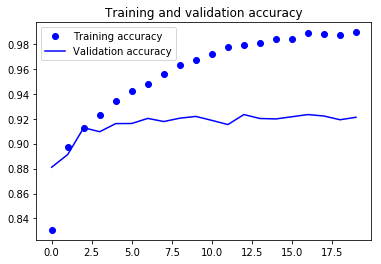

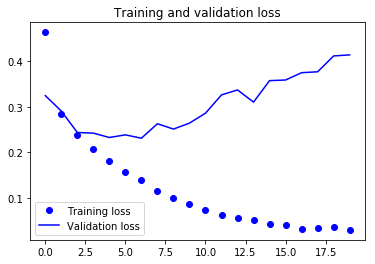

In [19]:
accuracy = fashion_train.history['acc']
val_accuracy = fashion_train.history['val_acc']
loss = fashion_train.history['loss']
val_loss = fashion_train.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

From the above two plots, you can see that the validation accuracy almost became stagnant after 4-5 epochs and rarely increased at certain epochs. In the beginning, the validation accuracy was linearly increasing with loss, but then it did not increase much.

The validation loss shows that this is the sign of overfitting, similar to validation accuracy it linearly decreased but after 4-5 epochs, it started to increase. This means that the model tried to memorize the data and succeeded.

With this in mind, it's time to introduce some dropout into our model and see if it helps in reducing overfitting.

## Adding Dropout into the Network

You can add a dropout layer to overcome the problem of overfitting to some extent. Dropout randomly turns off a fraction of neurons during the training process, reducing the dependency on the training set by some amount. How many fractions of neurons you want to turn off is decided by a hyperparameter, which can be tuned accordingly. This way, turning off some neurons will not allow the network to memorize the training data since not all the neurons will be active at the same time and the inactive neurons will not be able to learn anything.

So let's create, compile and train the network again but this time with dropout. And run it for 20 epochs with a batch size of 64.

In [20]:
batch_size = 64
epochs = 20
num_classes = 10

In [21]:
fashion_model = Sequential()
fashion_model.add(Conv2D(32, kernel_size=(3, 3),activation='linear',padding='same',input_shape=(28,28,1)))
fashion_model.add(LeakyReLU(alpha=0.1))
fashion_model.add(MaxPooling2D((2, 2),padding='same'))
fashion_model.add(Dropout(0.25))
fashion_model.add(Conv2D(64, (3, 3), activation='linear',padding='same'))
fashion_model.add(LeakyReLU(alpha=0.1))
fashion_model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
fashion_model.add(Dropout(0.25))
fashion_model.add(Conv2D(128, (3, 3), activation='linear',padding='same'))
fashion_model.add(LeakyReLU(alpha=0.1))                  
fashion_model.add(MaxPooling2D(pool_size=(2, 2),padding='same'))
fashion_model.add(Dropout(0.4))
fashion_model.add(Flatten())
fashion_model.add(Dense(128, activation='linear'))
fashion_model.add(LeakyReLU(alpha=0.1))           
fashion_model.add(Dropout(0.3))
fashion_model.add(Dense(num_classes, activation='softmax'))

In [22]:
fashion_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_4 (Conv2D)            (None, 28, 28, 32)        320       
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 28, 28, 32)        0         
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 14, 14, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 14, 14, 32)        0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 14, 14, 64)        18496     
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 14, 14, 64)        0         
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 7, 7, 64)          0         
__________

In [23]:
fashion_model.compile(loss=keras.losses.categorical_crossentropy, optimizer=keras.optimizers.Adam(),metrics=['accuracy'])

In [24]:
fashion_train_dropout = fashion_model.fit(train_X, train_label, batch_size=batch_size,epochs=epochs,verbose=1,validation_data=(valid_X, valid_label))

Train on 48000 samples, validate on 12000 samples
Epoch 1/20


   64/48000 [..............................] - ETA: 25:00 - loss: 2.2971 - acc: 0.0781

  128/48000 [..............................] - ETA: 16:20 - loss: 2.2916 - acc: 0.1094

  192/48000 [..............................] - ETA: 12:12 - loss: 2.2699 - acc: 0.1198

  256/48000 [..............................] - ETA: 9:55 - loss: 2.2717 - acc: 0.1094 

  320/48000 [..............................] - ETA: 8:34 - loss: 2.2529 - acc: 0.1156

  384/48000 [..............................] - ETA: 7:45 - loss: 2.2441 - acc: 0.1328

  448/48000 [..............................] - ETA: 7:16 - loss: 2.2374 - acc: 0.1429

  512/48000 [..............................] - ETA: 6:45 - loss: 2.2141 - acc: 0.1621

  576/48000 [..............................] - ETA: 6:20 - loss: 2.1934 - acc: 0.1875

  640/48000 [..............................] - ETA: 6:04 - loss: 2.1830 - acc: 0.1984

  704/48000 [..............................] - ETA: 5:46 - loss: 2.1736 - acc: 0.2131

  768/48000 [..............................] - ETA: 5:33 - loss: 2.1529 - acc: 0.2383

  832/48000 [..............................] - ETA: 5:23 - loss: 2.1303 - acc: 0.2524

  896/48000 [..............................] - ETA: 5:16 - loss: 2.1084 - acc: 0.2645

  960/48000 [..............................] - ETA: 5:07 - loss: 2.0719 - acc: 0.2781

 1024/48000 [..............................] - ETA: 5:00 - loss: 2.0421 - acc: 0.2881

 1088/48000 [..............................] - ETA: 4:55 - loss: 2.0104 - acc: 0.2950

 1152/48000 [..............................] - ETA: 4:52 - loss: 1.9779 - acc: 0.3030

 1216/48000 [..............................] - ETA: 5:07 - loss: 1.9515 - acc: 0.3100

 1280/48000 [..............................] - ETA: 5:00 - loss: 1.9241 - acc: 0.3156

 1344/48000 [..............................] - ETA: 4:56 - loss: 1.8923 - acc: 0.3304

 1408/48000 [..............................] - ETA: 4:52 - loss: 1.8825 - acc: 0.3374

 1472/48000 [..............................] - ETA: 4:47 - loss: 1.8596 - acc: 0.3451

 1536/48000 [..............................] - ETA: 4:44 - loss: 1.8442 - acc: 0.3470

 1600/48000 [>.............................] - ETA: 4:40 - loss: 1.8390 - acc: 0.3481

 1664/48000 [>.............................] - ETA: 4:37 - loss: 1.8206 - acc: 0.3522

 1728/48000 [>.............................] - ETA: 4:34 - loss: 1.7994 - acc: 0.3576

 1792/48000 [>.............................] - ETA: 4:31 - loss: 1.7782 - acc: 0.3627

 1856/48000 [>.............................] - ETA: 4:29 - loss: 1.7573 - acc: 0.3691

 1920/48000 [>.............................] - ETA: 4:26 - loss: 1.7342 - acc: 0.3771

 1984/48000 [>.............................] - ETA: 4:24 - loss: 1.7213 - acc: 0.3826

 2048/48000 [>.............................] - ETA: 4:22 - loss: 1.7137 - acc: 0.3853

 2112/48000 [>.............................] - ETA: 4:19 - loss: 1.6994 - acc: 0.3892

 2176/48000 [>.............................] - ETA: 4:17 - loss: 1.6822 - acc: 0.3952

 2240/48000 [>.............................] - ETA: 4:15 - loss: 1.6616 - acc: 0.3996

 2304/48000 [>.............................] - ETA: 4:13 - loss: 1.6473 - acc: 0.4036

 2368/48000 [>.............................] - ETA: 4:11 - loss: 1.6285 - acc: 0.4113

 2432/48000 [>.............................] - ETA: 4:08 - loss: 1.6138 - acc: 0.4161

 2496/48000 [>.............................] - ETA: 4:06 - loss: 1.6011 - acc: 0.4207

 2560/48000 [>.............................] - ETA: 4:05 - loss: 1.5825 - acc: 0.4289

 2624/48000 [>.............................] - ETA: 4:02 - loss: 1.5697 - acc: 0.4356

 2688/48000 [>.............................] - ETA: 4:01 - loss: 1.5560 - acc: 0.4408

 2752/48000 [>.............................] - ETA: 3:59 - loss: 1.5409 - acc: 0.4469

 2816/48000 [>.............................] - ETA: 3:58 - loss: 1.5365 - acc: 0.4478

 2880/48000 [>.............................] - ETA: 3:56 - loss: 1.5211 - acc: 0.4535

 2944/48000 [>.............................] - ETA: 3:54 - loss: 1.5042 - acc: 0.4599

 3008/48000 [>.............................] - ETA: 3:53 - loss: 1.4947 - acc: 0.4624

 3072/48000 [>.............................] - ETA: 3:52 - loss: 1.4841 - acc: 0.4642

 3136/48000 [>.............................] - ETA: 3:51 - loss: 1.4759 - acc: 0.4662

 3200/48000 [=>............................] - ETA: 3:49 - loss: 1.4645 - acc: 0.4694

 3264/48000 [=>............................] - ETA: 3:48 - loss: 1.4560 - acc: 0.4733

 3328/48000 [=>............................] - ETA: 3:47 - loss: 1.4455 - acc: 0.4760

 3392/48000 [=>............................] - ETA: 3:46 - loss: 1.4360 - acc: 0.4776

 3456/48000 [=>............................] - ETA: 3:45 - loss: 1.4246 - acc: 0.4815

 3520/48000 [=>............................] - ETA: 3:43 - loss: 1.4146 - acc: 0.4852

 3584/48000 [=>............................] - ETA: 3:42 - loss: 1.4033 - acc: 0.4894

 3648/48000 [=>............................] - ETA: 3:43 - loss: 1.3955 - acc: 0.4926

 3712/48000 [=>............................] - ETA: 3:41 - loss: 1.3845 - acc: 0.4954

 3776/48000 [=>............................] - ETA: 3:41 - loss: 1.3746 - acc: 0.5000

 3840/48000 [=>............................] - ETA: 3:40 - loss: 1.3701 - acc: 0.5013

 3904/48000 [=>............................] - ETA: 3:39 - loss: 1.3600 - acc: 0.5046

 3968/48000 [=>............................] - ETA: 3:38 - loss: 1.3518 - acc: 0.5081

 4032/48000 [=>............................] - ETA: 3:37 - loss: 1.3395 - acc: 0.5126

 4096/48000 [=>............................] - ETA: 3:37 - loss: 1.3311 - acc: 0.5156

 4160/48000 [=>............................] - ETA: 3:35 - loss: 1.3271 - acc: 0.5183

 4224/48000 [=>............................] - ETA: 3:35 - loss: 1.3226 - acc: 0.5204

 4288/48000 [=>............................] - ETA: 3:34 - loss: 1.3146 - acc: 0.5238

 4352/48000 [=>............................] - ETA: 3:33 - loss: 1.3059 - acc: 0.5267

 4416/48000 [=>............................] - ETA: 3:32 - loss: 1.3012 - acc: 0.5297

 4480/48000 [=>............................] - ETA: 3:31 - loss: 1.2949 - acc: 0.5312

 4544/48000 [=>............................] - ETA: 3:30 - loss: 1.2878 - acc: 0.5335

 4608/48000 [=>............................] - ETA: 3:29 - loss: 1.2843 - acc: 0.5343

 4672/48000 [=>............................] - ETA: 3:29 - loss: 1.2775 - acc: 0.5362

 4736/48000 [=>............................] - ETA: 3:28 - loss: 1.2726 - acc: 0.5372

 4800/48000 [==>...........................] - ETA: 3:27 - loss: 1.2683 - acc: 0.5383

 4864/48000 [==>...........................] - ETA: 3:26 - loss: 1.2589 - acc: 0.5417

 4928/48000 [==>...........................] - ETA: 3:26 - loss: 1.2547 - acc: 0.5440

 4992/48000 [==>...........................] - ETA: 3:25 - loss: 1.2503 - acc: 0.5457

 5056/48000 [==>...........................] - ETA: 3:24 - loss: 1.2436 - acc: 0.5477

 5120/48000 [==>...........................] - ETA: 3:23 - loss: 1.2402 - acc: 0.5484

 5184/48000 [==>...........................] - ETA: 3:23 - loss: 1.2364 - acc: 0.5494

 5248/48000 [==>...........................] - ETA: 3:23 - loss: 1.2305 - acc: 0.5513

 5312/48000 [==>...........................] - ETA: 3:22 - loss: 1.2248 - acc: 0.5538

 5376/48000 [==>...........................] - ETA: 3:22 - loss: 1.2216 - acc: 0.5547

 5440/48000 [==>...........................] - ETA: 3:21 - loss: 1.2165 - acc: 0.5570

 5504/48000 [==>...........................] - ETA: 3:20 - loss: 1.2137 - acc: 0.5580

 5568/48000 [==>...........................] - ETA: 3:20 - loss: 1.2078 - acc: 0.5607

 5632/48000 [==>...........................] - ETA: 3:20 - loss: 1.2021 - acc: 0.5634

 5696/48000 [==>...........................] - ETA: 3:19 - loss: 1.1964 - acc: 0.5658

 5760/48000 [==>...........................] - ETA: 3:19 - loss: 1.1899 - acc: 0.5682

 5824/48000 [==>...........................] - ETA: 3:18 - loss: 1.1839 - acc: 0.5702

 5888/48000 [==>...........................] - ETA: 3:17 - loss: 1.1800 - acc: 0.5713

 5952/48000 [==>...........................] - ETA: 3:17 - loss: 1.1755 - acc: 0.5729

 6016/48000 [==>...........................] - ETA: 3:16 - loss: 1.1699 - acc: 0.5750

 6080/48000 [==>...........................] - ETA: 3:15 - loss: 1.1644 - acc: 0.5765

 6144/48000 [==>...........................] - ETA: 3:15 - loss: 1.1616 - acc: 0.5783

 6208/48000 [==>...........................] - ETA: 3:14 - loss: 1.1576 - acc: 0.5801

 6272/48000 [==>...........................] - ETA: 3:14 - loss: 1.1520 - acc: 0.5818

 6336/48000 [==>...........................] - ETA: 3:13 - loss: 1.1471 - acc: 0.5835

 6400/48000 [===>..........................] - ETA: 3:13 - loss: 1.1428 - acc: 0.5841

 6464/48000 [===>..........................] - ETA: 3:13 - loss: 1.1377 - acc: 0.5857

 6528/48000 [===>..........................] - ETA: 3:12 - loss: 1.1317 - acc: 0.5878

 6592/48000 [===>..........................] - ETA: 3:12 - loss: 1.1285 - acc: 0.5886

 6656/48000 [===>..........................] - ETA: 3:11 - loss: 1.1238 - acc: 0.5904

 6720/48000 [===>..........................] - ETA: 3:11 - loss: 1.1192 - acc: 0.5923

 6784/48000 [===>..........................] - ETA: 3:19 - loss: 1.1123 - acc: 0.5949

 6848/48000 [===>..........................] - ETA: 3:19 - loss: 1.1093 - acc: 0.5959

 6912/48000 [===>..........................] - ETA: 3:18 - loss: 1.1047 - acc: 0.5975

 6976/48000 [===>..........................] - ETA: 3:17 - loss: 1.1011 - acc: 0.5986

 7040/48000 [===>..........................] - ETA: 3:17 - loss: 1.0975 - acc: 0.5999

 7104/48000 [===>..........................] - ETA: 3:16 - loss: 1.0961 - acc: 0.6011

 7168/48000 [===>..........................] - ETA: 3:17 - loss: 1.0927 - acc: 0.6030

 7232/48000 [===>..........................] - ETA: 3:18 - loss: 1.0880 - acc: 0.6052

 7296/48000 [===>..........................] - ETA: 3:17 - loss: 1.0860 - acc: 0.6058

 7360/48000 [===>..........................] - ETA: 3:17 - loss: 1.0823 - acc: 0.6071

 7424/48000 [===>..........................] - ETA: 3:16 - loss: 1.0781 - acc: 0.6082

 7488/48000 [===>..........................] - ETA: 3:15 - loss: 1.0756 - acc: 0.6091

 7552/48000 [===>..........................] - ETA: 3:15 - loss: 1.0722 - acc: 0.6099

 7616/48000 [===>..........................] - ETA: 3:14 - loss: 1.0705 - acc: 0.6107

 7680/48000 [===>..........................] - ETA: 3:14 - loss: 1.0697 - acc: 0.6113

 7744/48000 [===>..........................] - ETA: 3:13 - loss: 1.0659 - acc: 0.6122

 7808/48000 [===>..........................] - ETA: 3:13 - loss: 1.0624 - acc: 0.6136

 7872/48000 [===>..........................] - ETA: 3:12 - loss: 1.0608 - acc: 0.6134

 7936/48000 [===>..........................] - ETA: 3:11 - loss: 1.0567 - acc: 0.6148

 8000/48000 [====>.........................] - ETA: 3:11 - loss: 1.0531 - acc: 0.6166

 8064/48000 [====>.........................] - ETA: 3:10 - loss: 1.0490 - acc: 0.6181

 8128/48000 [====>.........................] - ETA: 3:10 - loss: 1.0481 - acc: 0.6181

 8192/48000 [====>.........................] - ETA: 3:09 - loss: 1.0456 - acc: 0.6194

 8256/48000 [====>.........................] - ETA: 3:09 - loss: 1.0445 - acc: 0.6195

 8320/48000 [====>.........................] - ETA: 3:08 - loss: 1.0423 - acc: 0.6197

 8384/48000 [====>.........................] - ETA: 3:08 - loss: 1.0393 - acc: 0.6213

 8448/48000 [====>.........................] - ETA: 3:08 - loss: 1.0367 - acc: 0.6219

 8512/48000 [====>.........................] - ETA: 3:07 - loss: 1.0329 - acc: 0.6232

 8576/48000 [====>.........................] - ETA: 3:07 - loss: 1.0302 - acc: 0.6240

 8640/48000 [====>.........................] - ETA: 3:06 - loss: 1.0274 - acc: 0.6249

 8704/48000 [====>.........................] - ETA: 3:06 - loss: 1.0243 - acc: 0.6255

 8768/48000 [====>.........................] - ETA: 3:05 - loss: 1.0210 - acc: 0.6263

 8832/48000 [====>.........................] - ETA: 3:05 - loss: 1.0182 - acc: 0.6272

 8896/48000 [====>.........................] - ETA: 3:04 - loss: 1.0178 - acc: 0.6275

 8960/48000 [====>.........................] - ETA: 3:04 - loss: 1.0163 - acc: 0.6283

 9024/48000 [====>.........................] - ETA: 3:04 - loss: 1.0141 - acc: 0.6292

 9088/48000 [====>.........................] - ETA: 3:03 - loss: 1.0107 - acc: 0.6304

 9152/48000 [====>.........................] - ETA: 3:03 - loss: 1.0091 - acc: 0.6311

 9216/48000 [====>.........................] - ETA: 3:02 - loss: 1.0059 - acc: 0.6322

 9280/48000 [====>.........................] - ETA: 3:02 - loss: 1.0030 - acc: 0.6331

 9344/48000 [====>.........................] - ETA: 3:02 - loss: 1.0029 - acc: 0.6330

 9408/48000 [====>.........................] - ETA: 3:01 - loss: 1.0005 - acc: 0.6336

 9472/48000 [====>.........................] - ETA: 3:01 - loss: 0.9978 - acc: 0.6346

 9536/48000 [====>.........................] - ETA: 3:00 - loss: 0.9953 - acc: 0.6353

 9600/48000 [=====>........................] - ETA: 3:00 - loss: 0.9922 - acc: 0.6364

 9664/48000 [=====>........................] - ETA: 2:59 - loss: 0.9904 - acc: 0.6369

 9728/48000 [=====>........................] - ETA: 2:59 - loss: 0.9901 - acc: 0.6367

 9792/48000 [=====>........................] - ETA: 2:59 - loss: 0.9890 - acc: 0.6369

 9856/48000 [=====>........................] - ETA: 2:58 - loss: 0.9872 - acc: 0.6373

 9920/48000 [=====>........................] - ETA: 2:58 - loss: 0.9853 - acc: 0.6383

 9984/48000 [=====>........................] - ETA: 3:01 - loss: 0.9839 - acc: 0.6390

10048/48000 [=====>........................] - ETA: 3:01 - loss: 0.9817 - acc: 0.6397

10112/48000 [=====>........................] - ETA: 3:01 - loss: 0.9811 - acc: 0.6400

10176/48000 [=====>........................] - ETA: 3:00 - loss: 0.9805 - acc: 0.6398

10240/48000 [=====>........................] - ETA: 3:00 - loss: 0.9788 - acc: 0.6406

10304/48000 [=====>........................] - ETA: 2:59 - loss: 0.9761 - acc: 0.6419

10368/48000 [=====>........................] - ETA: 2:59 - loss: 0.9739 - acc: 0.6425

10432/48000 [=====>........................] - ETA: 2:58 - loss: 0.9729 - acc: 0.6427

10496/48000 [=====>........................] - ETA: 2:58 - loss: 0.9707 - acc: 0.6434

10560/48000 [=====>........................] - ETA: 2:57 - loss: 0.9693 - acc: 0.6436

10624/48000 [=====>........................] - ETA: 2:57 - loss: 0.9670 - acc: 0.6443

10688/48000 [=====>........................] - ETA: 2:56 - loss: 0.9648 - acc: 0.6452

10752/48000 [=====>........................] - ETA: 2:56 - loss: 0.9625 - acc: 0.6457

10816/48000 [=====>........................] - ETA: 2:56 - loss: 0.9608 - acc: 0.6462

10880/48000 [=====>........................] - ETA: 2:55 - loss: 0.9585 - acc: 0.6473

10944/48000 [=====>........................] - ETA: 2:55 - loss: 0.9553 - acc: 0.6484

11008/48000 [=====>........................] - ETA: 2:54 - loss: 0.9539 - acc: 0.6489

11072/48000 [=====>........................] - ETA: 2:54 - loss: 0.9519 - acc: 0.6496

11136/48000 [=====>........................] - ETA: 2:54 - loss: 0.9502 - acc: 0.6503

11200/48000 [======>.......................] - ETA: 2:53 - loss: 0.9485 - acc: 0.6507

11264/48000 [======>.......................] - ETA: 2:53 - loss: 0.9464 - acc: 0.6513

11328/48000 [======>.......................] - ETA: 2:52 - loss: 0.9458 - acc: 0.6516

11392/48000 [======>.......................] - ETA: 2:52 - loss: 0.9432 - acc: 0.6525

11456/48000 [======>.......................] - ETA: 2:52 - loss: 0.9417 - acc: 0.6530

11520/48000 [======>.......................] - ETA: 2:52 - loss: 0.9394 - acc: 0.6541

11584/48000 [======>.......................] - ETA: 2:51 - loss: 0.9372 - acc: 0.6548

11648/48000 [======>.......................] - ETA: 2:51 - loss: 0.9350 - acc: 0.6556

11712/48000 [======>.......................] - ETA: 2:51 - loss: 0.9328 - acc: 0.6562

11776/48000 [======>.......................] - ETA: 2:50 - loss: 0.9321 - acc: 0.6565

11840/48000 [======>.......................] - ETA: 2:51 - loss: 0.9299 - acc: 0.6575

11904/48000 [======>.......................] - ETA: 2:51 - loss: 0.9287 - acc: 0.6578

11968/48000 [======>.......................] - ETA: 2:52 - loss: 0.9272 - acc: 0.6587

12032/48000 [======>.......................] - ETA: 2:51 - loss: 0.9262 - acc: 0.6589

12096/48000 [======>.......................] - ETA: 2:51 - loss: 0.9245 - acc: 0.6596

12160/48000 [======>.......................] - ETA: 2:51 - loss: 0.9232 - acc: 0.6600

12224/48000 [======>.......................] - ETA: 2:51 - loss: 0.9217 - acc: 0.6605

12288/48000 [======>.......................] - ETA: 2:51 - loss: 0.9197 - acc: 0.6612

12352/48000 [======>.......................] - ETA: 2:50 - loss: 0.9187 - acc: 0.6619

12416/48000 [======>.......................] - ETA: 2:50 - loss: 0.9165 - acc: 0.6625

12480/48000 [======>.......................] - ETA: 2:50 - loss: 0.9148 - acc: 0.6627

12544/48000 [======>.......................] - ETA: 2:49 - loss: 0.9131 - acc: 0.6637

12608/48000 [======>.......................] - ETA: 2:49 - loss: 0.9122 - acc: 0.6639

12672/48000 [======>.......................] - ETA: 2:48 - loss: 0.9105 - acc: 0.6644

12736/48000 [======>.......................] - ETA: 2:48 - loss: 0.9088 - acc: 0.6650

12800/48000 [=======>......................] - ETA: 2:47 - loss: 0.9075 - acc: 0.6654

12864/48000 [=======>......................] - ETA: 2:47 - loss: 0.9062 - acc: 0.6657

12928/48000 [=======>......................] - ETA: 2:47 - loss: 0.9046 - acc: 0.6664

12992/48000 [=======>......................] - ETA: 2:46 - loss: 0.9022 - acc: 0.6674

13056/48000 [=======>......................] - ETA: 2:46 - loss: 0.9005 - acc: 0.6680

13120/48000 [=======>......................] - ETA: 2:45 - loss: 0.9000 - acc: 0.6681

13184/48000 [=======>......................] - ETA: 2:45 - loss: 0.8979 - acc: 0.6688

13248/48000 [=======>......................] - ETA: 2:44 - loss: 0.8965 - acc: 0.6693

13312/48000 [=======>......................] - ETA: 2:44 - loss: 0.8946 - acc: 0.6701

13376/48000 [=======>......................] - ETA: 2:44 - loss: 0.8925 - acc: 0.6710

13440/48000 [=======>......................] - ETA: 2:43 - loss: 0.8909 - acc: 0.6714

13504/48000 [=======>......................] - ETA: 2:43 - loss: 0.8898 - acc: 0.6718

13568/48000 [=======>......................] - ETA: 2:43 - loss: 0.8889 - acc: 0.6719

13632/48000 [=======>......................] - ETA: 2:42 - loss: 0.8874 - acc: 0.6723

13696/48000 [=======>......................] - ETA: 2:42 - loss: 0.8856 - acc: 0.6730

13760/48000 [=======>......................] - ETA: 2:41 - loss: 0.8846 - acc: 0.6735

13824/48000 [=======>......................] - ETA: 2:41 - loss: 0.8834 - acc: 0.6740

13888/48000 [=======>......................] - ETA: 2:41 - loss: 0.8820 - acc: 0.6743

13952/48000 [=======>......................] - ETA: 2:41 - loss: 0.8807 - acc: 0.6749

14016/48000 [=======>......................] - ETA: 2:40 - loss: 0.8800 - acc: 0.6752

14080/48000 [=======>......................] - ETA: 2:40 - loss: 0.8790 - acc: 0.6756

14144/48000 [=======>......................] - ETA: 2:39 - loss: 0.8788 - acc: 0.6758

14208/48000 [=======>......................] - ETA: 2:39 - loss: 0.8768 - acc: 0.6763

14272/48000 [=======>......................] - ETA: 2:39 - loss: 0.8762 - acc: 0.6765

14336/48000 [=======>......................] - ETA: 2:38 - loss: 0.8749 - acc: 0.6770

14400/48000 [========>.....................] - ETA: 2:38 - loss: 0.8729 - acc: 0.6777

14464/48000 [========>.....................] - ETA: 2:37 - loss: 0.8718 - acc: 0.6779

14528/48000 [========>.....................] - ETA: 2:38 - loss: 0.8704 - acc: 0.6781

14592/48000 [========>.....................] - ETA: 2:38 - loss: 0.8687 - acc: 0.6787

14656/48000 [========>.....................] - ETA: 2:37 - loss: 0.8667 - acc: 0.6794

14720/48000 [========>.....................] - ETA: 2:37 - loss: 0.8650 - acc: 0.6802

14784/48000 [========>.....................] - ETA: 2:37 - loss: 0.8636 - acc: 0.6807

14848/48000 [========>.....................] - ETA: 2:36 - loss: 0.8630 - acc: 0.6806

14912/48000 [========>.....................] - ETA: 2:36 - loss: 0.8616 - acc: 0.6810

14976/48000 [========>.....................] - ETA: 2:35 - loss: 0.8606 - acc: 0.6817

15040/48000 [========>.....................] - ETA: 2:35 - loss: 0.8598 - acc: 0.6820

15104/48000 [========>.....................] - ETA: 2:35 - loss: 0.8588 - acc: 0.6824

15168/48000 [========>.....................] - ETA: 2:34 - loss: 0.8571 - acc: 0.6829

15232/48000 [========>.....................] - ETA: 2:34 - loss: 0.8557 - acc: 0.6835

15296/48000 [========>.....................] - ETA: 2:33 - loss: 0.8539 - acc: 0.6841

15360/48000 [========>.....................] - ETA: 2:33 - loss: 0.8534 - acc: 0.6839

15424/48000 [========>.....................] - ETA: 2:33 - loss: 0.8527 - acc: 0.6841

15488/48000 [========>.....................] - ETA: 2:32 - loss: 0.8519 - acc: 0.6845

15552/48000 [========>.....................] - ETA: 2:32 - loss: 0.8502 - acc: 0.6851

15616/48000 [========>.....................] - ETA: 2:31 - loss: 0.8488 - acc: 0.6856

15680/48000 [========>.....................] - ETA: 2:31 - loss: 0.8479 - acc: 0.6856

15744/48000 [========>.....................] - ETA: 2:31 - loss: 0.8472 - acc: 0.6858

15808/48000 [========>.....................] - ETA: 2:30 - loss: 0.8458 - acc: 0.6863

15872/48000 [========>.....................] - ETA: 2:30 - loss: 0.8444 - acc: 0.6868

15936/48000 [========>.....................] - ETA: 2:30 - loss: 0.8433 - acc: 0.6872

16000/48000 [=========>....................] - ETA: 2:29 - loss: 0.8427 - acc: 0.6872

16064/48000 [=========>....................] - ETA: 2:29 - loss: 0.8421 - acc: 0.6873

16128/48000 [=========>....................] - ETA: 2:28 - loss: 0.8407 - acc: 0.6878

16192/48000 [=========>....................] - ETA: 2:28 - loss: 0.8394 - acc: 0.6882

16256/48000 [=========>....................] - ETA: 2:28 - loss: 0.8382 - acc: 0.6886

16320/48000 [=========>....................] - ETA: 2:27 - loss: 0.8373 - acc: 0.6889

16384/48000 [=========>....................] - ETA: 2:27 - loss: 0.8361 - acc: 0.6894

16448/48000 [=========>....................] - ETA: 2:26 - loss: 0.8352 - acc: 0.6895

16512/48000 [=========>....................] - ETA: 2:26 - loss: 0.8342 - acc: 0.6899

16576/48000 [=========>....................] - ETA: 2:26 - loss: 0.8326 - acc: 0.6903

16640/48000 [=========>....................] - ETA: 2:25 - loss: 0.8311 - acc: 0.6909

16704/48000 [=========>....................] - ETA: 2:25 - loss: 0.8296 - acc: 0.6916

16768/48000 [=========>....................] - ETA: 2:25 - loss: 0.8285 - acc: 0.6920

16832/48000 [=========>....................] - ETA: 2:24 - loss: 0.8284 - acc: 0.6921

16896/48000 [=========>....................] - ETA: 2:24 - loss: 0.8267 - acc: 0.6926

16960/48000 [=========>....................] - ETA: 2:24 - loss: 0.8263 - acc: 0.6926

17024/48000 [=========>....................] - ETA: 2:24 - loss: 0.8253 - acc: 0.6930

17088/48000 [=========>....................] - ETA: 2:23 - loss: 0.8256 - acc: 0.6931

17152/48000 [=========>....................] - ETA: 2:23 - loss: 0.8251 - acc: 0.6931

17216/48000 [=========>....................] - ETA: 2:23 - loss: 0.8242 - acc: 0.6935

17280/48000 [=========>....................] - ETA: 2:23 - loss: 0.8234 - acc: 0.6938

17344/48000 [=========>....................] - ETA: 2:23 - loss: 0.8222 - acc: 0.6943

17408/48000 [=========>....................] - ETA: 2:23 - loss: 0.8211 - acc: 0.6947

17472/48000 [=========>....................] - ETA: 2:23 - loss: 0.8196 - acc: 0.6952

17536/48000 [=========>....................] - ETA: 2:23 - loss: 0.8191 - acc: 0.6957

17600/48000 [==========>...................] - ETA: 2:23 - loss: 0.8179 - acc: 0.6961

17664/48000 [==========>...................] - ETA: 2:22 - loss: 0.8169 - acc: 0.6965

17728/48000 [==========>...................] - ETA: 2:22 - loss: 0.8164 - acc: 0.6965

17792/48000 [==========>...................] - ETA: 2:22 - loss: 0.8159 - acc: 0.6967

17856/48000 [==========>...................] - ETA: 2:22 - loss: 0.8155 - acc: 0.6970

17920/48000 [==========>...................] - ETA: 2:22 - loss: 0.8141 - acc: 0.6975

17984/48000 [==========>...................] - ETA: 2:21 - loss: 0.8127 - acc: 0.6982

18048/48000 [==========>...................] - ETA: 2:21 - loss: 0.8119 - acc: 0.6987

18112/48000 [==========>...................] - ETA: 2:21 - loss: 0.8112 - acc: 0.6989

18176/48000 [==========>...................] - ETA: 2:20 - loss: 0.8100 - acc: 0.6996

18240/48000 [==========>...................] - ETA: 2:20 - loss: 0.8090 - acc: 0.7001

18304/48000 [==========>...................] - ETA: 2:19 - loss: 0.8078 - acc: 0.7004

18368/48000 [==========>...................] - ETA: 2:19 - loss: 0.8070 - acc: 0.7006

18432/48000 [==========>...................] - ETA: 2:19 - loss: 0.8062 - acc: 0.7010

18496/48000 [==========>...................] - ETA: 2:18 - loss: 0.8058 - acc: 0.7012

18560/48000 [==========>...................] - ETA: 2:18 - loss: 0.8053 - acc: 0.7016

18624/48000 [==========>...................] - ETA: 2:18 - loss: 0.8045 - acc: 0.7018

18688/48000 [==========>...................] - ETA: 2:17 - loss: 0.8028 - acc: 0.7025

18752/48000 [==========>...................] - ETA: 2:17 - loss: 0.8019 - acc: 0.7029

18816/48000 [==========>...................] - ETA: 2:17 - loss: 0.8004 - acc: 0.7034

18880/48000 [==========>...................] - ETA: 2:16 - loss: 0.8006 - acc: 0.7034

18944/48000 [==========>...................] - ETA: 2:16 - loss: 0.8001 - acc: 0.7035

19008/48000 [==========>...................] - ETA: 2:16 - loss: 0.7995 - acc: 0.7038

19072/48000 [==========>...................] - ETA: 2:15 - loss: 0.7986 - acc: 0.7041

19136/48000 [==========>...................] - ETA: 2:15 - loss: 0.7970 - acc: 0.7047

19200/48000 [===========>..................] - ETA: 2:15 - loss: 0.7960 - acc: 0.7050

19264/48000 [===========>..................] - ETA: 2:15 - loss: 0.7951 - acc: 0.7053

19328/48000 [===========>..................] - ETA: 2:15 - loss: 0.7940 - acc: 0.7058

19392/48000 [===========>..................] - ETA: 2:14 - loss: 0.7925 - acc: 0.7063

19456/48000 [===========>..................] - ETA: 2:14 - loss: 0.7918 - acc: 0.7066

19520/48000 [===========>..................] - ETA: 2:14 - loss: 0.7907 - acc: 0.7071

19584/48000 [===========>..................] - ETA: 2:13 - loss: 0.7902 - acc: 0.7074

19648/48000 [===========>..................] - ETA: 2:13 - loss: 0.7889 - acc: 0.7078

19712/48000 [===========>..................] - ETA: 2:13 - loss: 0.7884 - acc: 0.7080

19776/48000 [===========>..................] - ETA: 2:13 - loss: 0.7882 - acc: 0.7083

19840/48000 [===========>..................] - ETA: 2:12 - loss: 0.7871 - acc: 0.7087

19904/48000 [===========>..................] - ETA: 2:12 - loss: 0.7862 - acc: 0.7091

19968/48000 [===========>..................] - ETA: 2:11 - loss: 0.7855 - acc: 0.7093

20032/48000 [===========>..................] - ETA: 2:11 - loss: 0.7842 - acc: 0.7098

20096/48000 [===========>..................] - ETA: 2:11 - loss: 0.7826 - acc: 0.7104

20160/48000 [===========>..................] - ETA: 2:10 - loss: 0.7813 - acc: 0.7109

20224/48000 [===========>..................] - ETA: 2:10 - loss: 0.7806 - acc: 0.7112

20288/48000 [===========>..................] - ETA: 2:10 - loss: 0.7798 - acc: 0.7114

20352/48000 [===========>..................] - ETA: 2:10 - loss: 0.7792 - acc: 0.7118

20416/48000 [===========>..................] - ETA: 2:09 - loss: 0.7788 - acc: 0.7117

20480/48000 [===========>..................] - ETA: 2:09 - loss: 0.7784 - acc: 0.7119

20544/48000 [===========>..................] - ETA: 2:09 - loss: 0.7774 - acc: 0.7124

20608/48000 [===========>..................] - ETA: 2:08 - loss: 0.7766 - acc: 0.7127

20672/48000 [===========>..................] - ETA: 2:08 - loss: 0.7754 - acc: 0.7132

20736/48000 [===========>..................] - ETA: 2:08 - loss: 0.7746 - acc: 0.7135

20800/48000 [============>.................] - ETA: 2:07 - loss: 0.7751 - acc: 0.7133

20864/48000 [============>.................] - ETA: 2:07 - loss: 0.7743 - acc: 0.7135

20928/48000 [============>.................] - ETA: 2:07 - loss: 0.7729 - acc: 0.7140

20992/48000 [============>.................] - ETA: 2:06 - loss: 0.7721 - acc: 0.7144

21056/48000 [============>.................] - ETA: 2:06 - loss: 0.7708 - acc: 0.7150

21120/48000 [============>.................] - ETA: 2:06 - loss: 0.7705 - acc: 0.7152

21184/48000 [============>.................] - ETA: 2:06 - loss: 0.7696 - acc: 0.7154

21248/48000 [============>.................] - ETA: 2:06 - loss: 0.7690 - acc: 0.7157

21312/48000 [============>.................] - ETA: 2:05 - loss: 0.7680 - acc: 0.7163

21376/48000 [============>.................] - ETA: 2:06 - loss: 0.7675 - acc: 0.7163

21440/48000 [============>.................] - ETA: 2:05 - loss: 0.7668 - acc: 0.7165

21504/48000 [============>.................] - ETA: 2:05 - loss: 0.7663 - acc: 0.7168

21568/48000 [============>.................] - ETA: 2:05 - loss: 0.7657 - acc: 0.7170

21632/48000 [============>.................] - ETA: 2:05 - loss: 0.7648 - acc: 0.7172

21696/48000 [============>.................] - ETA: 2:06 - loss: 0.7639 - acc: 0.7176

21760/48000 [============>.................] - ETA: 2:06 - loss: 0.7635 - acc: 0.7177

21824/48000 [============>.................] - ETA: 2:05 - loss: 0.7627 - acc: 0.7180

21888/48000 [============>.................] - ETA: 2:06 - loss: 0.7621 - acc: 0.7182

21952/48000 [============>.................] - ETA: 2:06 - loss: 0.7618 - acc: 0.7184

22016/48000 [============>.................] - ETA: 2:06 - loss: 0.7608 - acc: 0.7188

22080/48000 [============>.................] - ETA: 2:06 - loss: 0.7601 - acc: 0.7191

22144/48000 [============>.................] - ETA: 2:06 - loss: 0.7596 - acc: 0.7193

22208/48000 [============>.................] - ETA: 2:06 - loss: 0.7590 - acc: 0.7195

22272/48000 [============>.................] - ETA: 2:05 - loss: 0.7582 - acc: 0.7198

22336/48000 [============>.................] - ETA: 2:05 - loss: 0.7574 - acc: 0.7202

22400/48000 [=============>................] - ETA: 2:05 - loss: 0.7566 - acc: 0.7204

22464/48000 [=============>................] - ETA: 2:04 - loss: 0.7562 - acc: 0.7205

22528/48000 [=============>................] - ETA: 2:04 - loss: 0.7551 - acc: 0.7208

22592/48000 [=============>................] - ETA: 2:04 - loss: 0.7544 - acc: 0.7211

22656/48000 [=============>................] - ETA: 2:04 - loss: 0.7537 - acc: 0.7215

22720/48000 [=============>................] - ETA: 2:04 - loss: 0.7525 - acc: 0.7219

22784/48000 [=============>................] - ETA: 2:04 - loss: 0.7515 - acc: 0.7223

22848/48000 [=============>................] - ETA: 2:04 - loss: 0.7504 - acc: 0.7227

22912/48000 [=============>................] - ETA: 2:03 - loss: 0.7494 - acc: 0.7232

22976/48000 [=============>................] - ETA: 2:03 - loss: 0.7488 - acc: 0.7234

23040/48000 [=============>................] - ETA: 2:03 - loss: 0.7481 - acc: 0.7237

23104/48000 [=============>................] - ETA: 2:03 - loss: 0.7479 - acc: 0.7238

23168/48000 [=============>................] - ETA: 2:02 - loss: 0.7476 - acc: 0.7241

23232/48000 [=============>................] - ETA: 2:02 - loss: 0.7466 - acc: 0.7243

23296/48000 [=============>................] - ETA: 2:02 - loss: 0.7456 - acc: 0.7247

23360/48000 [=============>................] - ETA: 2:01 - loss: 0.7449 - acc: 0.7249

23424/48000 [=============>................] - ETA: 2:01 - loss: 0.7448 - acc: 0.7249

23488/48000 [=============>................] - ETA: 2:01 - loss: 0.7444 - acc: 0.7252

23552/48000 [=============>................] - ETA: 2:00 - loss: 0.7437 - acc: 0.7255

23616/48000 [=============>................] - ETA: 2:00 - loss: 0.7432 - acc: 0.7256

23680/48000 [=============>................] - ETA: 2:00 - loss: 0.7423 - acc: 0.7258

23744/48000 [=============>................] - ETA: 2:00 - loss: 0.7418 - acc: 0.7260

23808/48000 [=============>................] - ETA: 2:00 - loss: 0.7408 - acc: 0.7264

23872/48000 [=============>................] - ETA: 1:59 - loss: 0.7400 - acc: 0.7267

23936/48000 [=============>................] - ETA: 1:59 - loss: 0.7394 - acc: 0.7268

24000/48000 [==============>...............] - ETA: 1:59 - loss: 0.7385 - acc: 0.7272

24064/48000 [==============>...............] - ETA: 1:58 - loss: 0.7380 - acc: 0.7273

24128/48000 [==============>...............] - ETA: 1:58 - loss: 0.7373 - acc: 0.7277

24192/48000 [==============>...............] - ETA: 1:58 - loss: 0.7364 - acc: 0.7280

24256/48000 [==============>...............] - ETA: 1:58 - loss: 0.7360 - acc: 0.7282

24320/48000 [==============>...............] - ETA: 1:58 - loss: 0.7353 - acc: 0.7284

24384/48000 [==============>...............] - ETA: 1:58 - loss: 0.7348 - acc: 0.7285

24448/48000 [==============>...............] - ETA: 1:58 - loss: 0.7341 - acc: 0.7288

24512/48000 [==============>...............] - ETA: 1:58 - loss: 0.7333 - acc: 0.7292

24576/48000 [==============>...............] - ETA: 1:57 - loss: 0.7327 - acc: 0.7293

24640/48000 [==============>...............] - ETA: 1:57 - loss: 0.7323 - acc: 0.7293

24704/48000 [==============>...............] - ETA: 1:58 - loss: 0.7318 - acc: 0.7297

24768/48000 [==============>...............] - ETA: 1:57 - loss: 0.7308 - acc: 0.7301

24832/48000 [==============>...............] - ETA: 1:57 - loss: 0.7303 - acc: 0.7302

24896/48000 [==============>...............] - ETA: 1:57 - loss: 0.7299 - acc: 0.7305

24960/48000 [==============>...............] - ETA: 1:56 - loss: 0.7294 - acc: 0.7306

25024/48000 [==============>...............] - ETA: 1:56 - loss: 0.7284 - acc: 0.7309

25088/48000 [==============>...............] - ETA: 1:56 - loss: 0.7273 - acc: 0.7315

25152/48000 [==============>...............] - ETA: 1:55 - loss: 0.7262 - acc: 0.7319

25216/48000 [==============>...............] - ETA: 1:55 - loss: 0.7259 - acc: 0.7321

25280/48000 [==============>...............] - ETA: 1:55 - loss: 0.7250 - acc: 0.7324

25344/48000 [==============>...............] - ETA: 1:55 - loss: 0.7246 - acc: 0.7328

25408/48000 [==============>...............] - ETA: 1:54 - loss: 0.7238 - acc: 0.7331

25472/48000 [==============>...............] - ETA: 1:54 - loss: 0.7240 - acc: 0.7330

25536/48000 [==============>...............] - ETA: 1:54 - loss: 0.7234 - acc: 0.7332

25600/48000 [===============>..............] - ETA: 1:53 - loss: 0.7231 - acc: 0.7333

25664/48000 [===============>..............] - ETA: 1:53 - loss: 0.7226 - acc: 0.7335

25728/48000 [===============>..............] - ETA: 1:53 - loss: 0.7226 - acc: 0.7336

25792/48000 [===============>..............] - ETA: 1:52 - loss: 0.7220 - acc: 0.7337

25856/48000 [===============>..............] - ETA: 1:52 - loss: 0.7214 - acc: 0.7338

25920/48000 [===============>..............] - ETA: 1:52 - loss: 0.7210 - acc: 0.7340

25984/48000 [===============>..............] - ETA: 1:51 - loss: 0.7205 - acc: 0.7342

26048/48000 [===============>..............] - ETA: 1:51 - loss: 0.7201 - acc: 0.7344

26112/48000 [===============>..............] - ETA: 1:51 - loss: 0.7196 - acc: 0.7345

26176/48000 [===============>..............] - ETA: 1:50 - loss: 0.7188 - acc: 0.7347

26240/48000 [===============>..............] - ETA: 1:50 - loss: 0.7188 - acc: 0.7346

26304/48000 [===============>..............] - ETA: 1:49 - loss: 0.7182 - acc: 0.7348

26368/48000 [===============>..............] - ETA: 1:49 - loss: 0.7176 - acc: 0.7349

26432/48000 [===============>..............] - ETA: 1:49 - loss: 0.7171 - acc: 0.7351

26496/48000 [===============>..............] - ETA: 1:48 - loss: 0.7167 - acc: 0.7354

26560/48000 [===============>..............] - ETA: 1:48 - loss: 0.7159 - acc: 0.7356

26624/48000 [===============>..............] - ETA: 1:48 - loss: 0.7150 - acc: 0.7361

26688/48000 [===============>..............] - ETA: 1:47 - loss: 0.7144 - acc: 0.7365

26752/48000 [===============>..............] - ETA: 1:47 - loss: 0.7139 - acc: 0.7366

26816/48000 [===============>..............] - ETA: 1:47 - loss: 0.7135 - acc: 0.7367

26880/48000 [===============>..............] - ETA: 1:46 - loss: 0.7128 - acc: 0.7370

26944/48000 [===============>..............] - ETA: 1:46 - loss: 0.7127 - acc: 0.7370

27008/48000 [===============>..............] - ETA: 1:45 - loss: 0.7124 - acc: 0.7369

27072/48000 [===============>..............] - ETA: 1:45 - loss: 0.7115 - acc: 0.7373

27136/48000 [===============>..............] - ETA: 1:45 - loss: 0.7111 - acc: 0.7374

27200/48000 [================>.............] - ETA: 1:44 - loss: 0.7109 - acc: 0.7375

27264/48000 [================>.............] - ETA: 1:44 - loss: 0.7105 - acc: 0.7377

27328/48000 [================>.............] - ETA: 1:44 - loss: 0.7099 - acc: 0.7380

27392/48000 [================>.............] - ETA: 1:43 - loss: 0.7095 - acc: 0.7381

27456/48000 [================>.............] - ETA: 1:43 - loss: 0.7089 - acc: 0.7384

27520/48000 [================>.............] - ETA: 1:43 - loss: 0.7080 - acc: 0.7388

27584/48000 [================>.............] - ETA: 1:42 - loss: 0.7075 - acc: 0.7390

27648/48000 [================>.............] - ETA: 1:42 - loss: 0.7069 - acc: 0.7393

27712/48000 [================>.............] - ETA: 1:42 - loss: 0.7068 - acc: 0.7395

27776/48000 [================>.............] - ETA: 1:41 - loss: 0.7060 - acc: 0.7398

27840/48000 [================>.............] - ETA: 1:41 - loss: 0.7055 - acc: 0.7401

27904/48000 [================>.............] - ETA: 1:41 - loss: 0.7052 - acc: 0.7400

27968/48000 [================>.............] - ETA: 1:40 - loss: 0.7044 - acc: 0.7405

28032/48000 [================>.............] - ETA: 1:40 - loss: 0.7040 - acc: 0.7405

28096/48000 [================>.............] - ETA: 1:39 - loss: 0.7032 - acc: 0.7408

28160/48000 [================>.............] - ETA: 1:39 - loss: 0.7031 - acc: 0.7408

28224/48000 [================>.............] - ETA: 1:39 - loss: 0.7023 - acc: 0.7411

28288/48000 [================>.............] - ETA: 1:38 - loss: 0.7018 - acc: 0.7413

28352/48000 [================>.............] - ETA: 1:38 - loss: 0.7010 - acc: 0.7416

28416/48000 [================>.............] - ETA: 1:38 - loss: 0.7001 - acc: 0.7420

28480/48000 [================>.............] - ETA: 1:38 - loss: 0.6997 - acc: 0.7421

28544/48000 [================>.............] - ETA: 1:37 - loss: 0.6991 - acc: 0.7423

28608/48000 [================>.............] - ETA: 1:37 - loss: 0.6983 - acc: 0.7427

28672/48000 [================>.............] - ETA: 1:37 - loss: 0.6978 - acc: 0.7430

28736/48000 [================>.............] - ETA: 1:36 - loss: 0.6972 - acc: 0.7432

28800/48000 [=================>............] - ETA: 1:36 - loss: 0.6965 - acc: 0.7435

28864/48000 [=================>............] - ETA: 1:36 - loss: 0.6957 - acc: 0.7438

28928/48000 [=================>............] - ETA: 1:35 - loss: 0.6949 - acc: 0.7441

28992/48000 [=================>............] - ETA: 1:35 - loss: 0.6941 - acc: 0.7445

29056/48000 [=================>............] - ETA: 1:35 - loss: 0.6934 - acc: 0.7447

29120/48000 [=================>............] - ETA: 1:35 - loss: 0.6925 - acc: 0.7450

29184/48000 [=================>............] - ETA: 1:35 - loss: 0.6919 - acc: 0.7452

29248/48000 [=================>............] - ETA: 1:35 - loss: 0.6912 - acc: 0.7456

29312/48000 [=================>............] - ETA: 1:34 - loss: 0.6907 - acc: 0.7458

29376/48000 [=================>............] - ETA: 1:34 - loss: 0.6905 - acc: 0.7458

29440/48000 [=================>............] - ETA: 1:34 - loss: 0.6901 - acc: 0.7460

29504/48000 [=================>............] - ETA: 1:33 - loss: 0.6895 - acc: 0.7463

29568/48000 [=================>............] - ETA: 1:33 - loss: 0.6893 - acc: 0.7464

29632/48000 [=================>............] - ETA: 1:33 - loss: 0.6885 - acc: 0.7467

29696/48000 [=================>............] - ETA: 1:33 - loss: 0.6887 - acc: 0.7467

29760/48000 [=================>............] - ETA: 1:32 - loss: 0.6888 - acc: 0.7466

29824/48000 [=================>............] - ETA: 1:32 - loss: 0.6886 - acc: 0.7466

29888/48000 [=================>............] - ETA: 1:32 - loss: 0.6876 - acc: 0.7470

29952/48000 [=================>............] - ETA: 1:31 - loss: 0.6873 - acc: 0.7471

30016/48000 [=================>............] - ETA: 1:31 - loss: 0.6872 - acc: 0.7472

30080/48000 [=================>............] - ETA: 1:31 - loss: 0.6869 - acc: 0.7473

30144/48000 [=================>............] - ETA: 1:31 - loss: 0.6861 - acc: 0.7476

30208/48000 [=================>............] - ETA: 1:30 - loss: 0.6858 - acc: 0.7477

30272/48000 [=================>............] - ETA: 1:30 - loss: 0.6849 - acc: 0.7480

30336/48000 [=================>............] - ETA: 1:29 - loss: 0.6844 - acc: 0.7483

30400/48000 [==================>...........] - ETA: 1:29 - loss: 0.6837 - acc: 0.7486

30464/48000 [==================>...........] - ETA: 1:29 - loss: 0.6833 - acc: 0.7487

30528/48000 [==================>...........] - ETA: 1:29 - loss: 0.6825 - acc: 0.7490

30592/48000 [==================>...........] - ETA: 1:28 - loss: 0.6821 - acc: 0.7492

30656/48000 [==================>...........] - ETA: 1:28 - loss: 0.6813 - acc: 0.7494

30720/48000 [==================>...........] - ETA: 1:28 - loss: 0.6808 - acc: 0.7497

30784/48000 [==================>...........] - ETA: 1:27 - loss: 0.6805 - acc: 0.7499

30848/48000 [==================>...........] - ETA: 1:27 - loss: 0.6803 - acc: 0.7501

30912/48000 [==================>...........] - ETA: 1:27 - loss: 0.6797 - acc: 0.7503

30976/48000 [==================>...........] - ETA: 1:27 - loss: 0.6796 - acc: 0.7504

31040/48000 [==================>...........] - ETA: 1:26 - loss: 0.6791 - acc: 0.7505

31104/48000 [==================>...........] - ETA: 1:26 - loss: 0.6785 - acc: 0.7508

31168/48000 [==================>...........] - ETA: 1:25 - loss: 0.6779 - acc: 0.7509

31232/48000 [==================>...........] - ETA: 1:25 - loss: 0.6773 - acc: 0.7510

31296/48000 [==================>...........] - ETA: 1:25 - loss: 0.6767 - acc: 0.7511

31360/48000 [==================>...........] - ETA: 1:24 - loss: 0.6761 - acc: 0.7514

31424/48000 [==================>...........] - ETA: 1:24 - loss: 0.6757 - acc: 0.7515

31488/48000 [==================>...........] - ETA: 1:24 - loss: 0.6755 - acc: 0.7514

31552/48000 [==================>...........] - ETA: 1:23 - loss: 0.6750 - acc: 0.7516

31616/48000 [==================>...........] - ETA: 1:23 - loss: 0.6749 - acc: 0.7518

31680/48000 [==================>...........] - ETA: 1:23 - loss: 0.6744 - acc: 0.7519

31744/48000 [==================>...........] - ETA: 1:22 - loss: 0.6742 - acc: 0.7519

31808/48000 [==================>...........] - ETA: 1:22 - loss: 0.6737 - acc: 0.7521

31872/48000 [==================>...........] - ETA: 1:22 - loss: 0.6734 - acc: 0.7522

31936/48000 [==================>...........] - ETA: 1:21 - loss: 0.6734 - acc: 0.7522

32000/48000 [===================>..........] - ETA: 1:21 - loss: 0.6730 - acc: 0.7522

32064/48000 [===================>..........] - ETA: 1:20 - loss: 0.6721 - acc: 0.7525

32128/48000 [===================>..........] - ETA: 1:20 - loss: 0.6717 - acc: 0.7526

32192/48000 [===================>..........] - ETA: 1:20 - loss: 0.6709 - acc: 0.7529

32256/48000 [===================>..........] - ETA: 1:19 - loss: 0.6704 - acc: 0.7531

32320/48000 [===================>..........] - ETA: 1:19 - loss: 0.6701 - acc: 0.7532

32384/48000 [===================>..........] - ETA: 1:19 - loss: 0.6694 - acc: 0.7536

32448/48000 [===================>..........] - ETA: 1:18 - loss: 0.6690 - acc: 0.7537

32512/48000 [===================>..........] - ETA: 1:18 - loss: 0.6690 - acc: 0.7537

32576/48000 [===================>..........] - ETA: 1:18 - loss: 0.6687 - acc: 0.7540

32640/48000 [===================>..........] - ETA: 1:17 - loss: 0.6679 - acc: 0.7543

32704/48000 [===================>..........] - ETA: 1:17 - loss: 0.6676 - acc: 0.7544

32768/48000 [===================>..........] - ETA: 1:17 - loss: 0.6672 - acc: 0.7545

32832/48000 [===================>..........] - ETA: 1:16 - loss: 0.6668 - acc: 0.7547

32896/48000 [===================>..........] - ETA: 1:16 - loss: 0.6667 - acc: 0.7547

32960/48000 [===================>..........] - ETA: 1:15 - loss: 0.6663 - acc: 0.7548

33024/48000 [===================>..........] - ETA: 1:15 - loss: 0.6660 - acc: 0.7549

33088/48000 [===================>..........] - ETA: 1:15 - loss: 0.6655 - acc: 0.7551

33152/48000 [===================>..........] - ETA: 1:14 - loss: 0.6652 - acc: 0.7552

33216/48000 [===================>..........] - ETA: 1:14 - loss: 0.6652 - acc: 0.7553

33280/48000 [===================>..........] - ETA: 1:14 - loss: 0.6646 - acc: 0.7556

33344/48000 [===================>..........] - ETA: 1:14 - loss: 0.6643 - acc: 0.7556

33408/48000 [===================>..........] - ETA: 1:13 - loss: 0.6643 - acc: 0.7557

33472/48000 [===================>..........] - ETA: 1:13 - loss: 0.6640 - acc: 0.7558

33536/48000 [===================>..........] - ETA: 1:13 - loss: 0.6635 - acc: 0.7560

33600/48000 [====================>.........] - ETA: 1:12 - loss: 0.6635 - acc: 0.7560

33664/48000 [====================>.........] - ETA: 1:12 - loss: 0.6628 - acc: 0.7562

33728/48000 [====================>.........] - ETA: 1:12 - loss: 0.6623 - acc: 0.7564

33792/48000 [====================>.........] - ETA: 1:11 - loss: 0.6617 - acc: 0.7567

33856/48000 [====================>.........] - ETA: 1:11 - loss: 0.6611 - acc: 0.7569

33920/48000 [====================>.........] - ETA: 1:11 - loss: 0.6608 - acc: 0.7571

33984/48000 [====================>.........] - ETA: 1:10 - loss: 0.6606 - acc: 0.7570

34048/48000 [====================>.........] - ETA: 1:10 - loss: 0.6601 - acc: 0.7572

34112/48000 [====================>.........] - ETA: 1:09 - loss: 0.6599 - acc: 0.7573

34176/48000 [====================>.........] - ETA: 1:09 - loss: 0.6592 - acc: 0.7575

34240/48000 [====================>.........] - ETA: 1:09 - loss: 0.6591 - acc: 0.7576

34304/48000 [====================>.........] - ETA: 1:08 - loss: 0.6586 - acc: 0.7579

34368/48000 [====================>.........] - ETA: 1:08 - loss: 0.6578 - acc: 0.7582

34432/48000 [====================>.........] - ETA: 1:08 - loss: 0.6573 - acc: 0.7585

34496/48000 [====================>.........] - ETA: 1:07 - loss: 0.6567 - acc: 0.7587

34560/48000 [====================>.........] - ETA: 1:07 - loss: 0.6566 - acc: 0.7588

34624/48000 [====================>.........] - ETA: 1:07 - loss: 0.6562 - acc: 0.7589

34688/48000 [====================>.........] - ETA: 1:06 - loss: 0.6555 - acc: 0.7591

34752/48000 [====================>.........] - ETA: 1:06 - loss: 0.6547 - acc: 0.7594

34816/48000 [====================>.........] - ETA: 1:06 - loss: 0.6546 - acc: 0.7595

34880/48000 [====================>.........] - ETA: 1:05 - loss: 0.6545 - acc: 0.7595

34944/48000 [====================>.........] - ETA: 1:05 - loss: 0.6545 - acc: 0.7595

35008/48000 [====================>.........] - ETA: 1:05 - loss: 0.6541 - acc: 0.7596

35072/48000 [====================>.........] - ETA: 1:04 - loss: 0.6535 - acc: 0.7599

35136/48000 [====================>.........] - ETA: 1:04 - loss: 0.6532 - acc: 0.7600

35200/48000 [=====================>........] - ETA: 1:04 - loss: 0.6531 - acc: 0.7601

35264/48000 [=====================>........] - ETA: 1:03 - loss: 0.6526 - acc: 0.7603

35328/48000 [=====================>........] - ETA: 1:03 - loss: 0.6522 - acc: 0.7604

35392/48000 [=====================>........] - ETA: 1:02 - loss: 0.6517 - acc: 0.7606

35456/48000 [=====================>........] - ETA: 1:02 - loss: 0.6514 - acc: 0.7607

35520/48000 [=====================>........] - ETA: 1:02 - loss: 0.6517 - acc: 0.7608

35584/48000 [=====================>........] - ETA: 1:01 - loss: 0.6513 - acc: 0.7609

35648/48000 [=====================>........] - ETA: 1:01 - loss: 0.6513 - acc: 0.7610

35712/48000 [=====================>........] - ETA: 1:01 - loss: 0.6510 - acc: 0.7610

35776/48000 [=====================>........] - ETA: 1:00 - loss: 0.6508 - acc: 0.7612

35840/48000 [=====================>........] - ETA: 1:00 - loss: 0.6503 - acc: 0.7614

35904/48000 [=====================>........] - ETA: 1:00 - loss: 0.6499 - acc: 0.7614

35968/48000 [=====================>........] - ETA: 59s - loss: 0.6494 - acc: 0.7616 

36032/48000 [=====================>........] - ETA: 59s - loss: 0.6488 - acc: 0.7619

36096/48000 [=====================>........] - ETA: 59s - loss: 0.6487 - acc: 0.7618

36160/48000 [=====================>........] - ETA: 58s - loss: 0.6483 - acc: 0.7620

36224/48000 [=====================>........] - ETA: 58s - loss: 0.6481 - acc: 0.7620

36288/48000 [=====================>........] - ETA: 58s - loss: 0.6476 - acc: 0.7622

36352/48000 [=====================>........] - ETA: 57s - loss: 0.6470 - acc: 0.7624

36416/48000 [=====================>........] - ETA: 57s - loss: 0.6466 - acc: 0.7625

36480/48000 [=====================>........] - ETA: 57s - loss: 0.6463 - acc: 0.7627

36544/48000 [=====================>........] - ETA: 56s - loss: 0.6461 - acc: 0.7628

36608/48000 [=====================>........] - ETA: 56s - loss: 0.6458 - acc: 0.7629

36672/48000 [=====================>........] - ETA: 56s - loss: 0.6456 - acc: 0.7630

36736/48000 [=====================>........] - ETA: 55s - loss: 0.6455 - acc: 0.7630

36800/48000 [======================>.......] - ETA: 55s - loss: 0.6449 - acc: 0.7633

36864/48000 [======================>.......] - ETA: 55s - loss: 0.6444 - acc: 0.7635

36928/48000 [======================>.......] - ETA: 54s - loss: 0.6439 - acc: 0.7637

36992/48000 [======================>.......] - ETA: 54s - loss: 0.6434 - acc: 0.7640

37056/48000 [======================>.......] - ETA: 54s - loss: 0.6430 - acc: 0.7641

37120/48000 [======================>.......] - ETA: 53s - loss: 0.6425 - acc: 0.7643

37184/48000 [======================>.......] - ETA: 53s - loss: 0.6421 - acc: 0.7645

37248/48000 [======================>.......] - ETA: 53s - loss: 0.6417 - acc: 0.7647

37312/48000 [======================>.......] - ETA: 52s - loss: 0.6411 - acc: 0.7649

37376/48000 [======================>.......] - ETA: 52s - loss: 0.6405 - acc: 0.7651

37440/48000 [======================>.......] - ETA: 52s - loss: 0.6402 - acc: 0.7652

37504/48000 [======================>.......] - ETA: 51s - loss: 0.6398 - acc: 0.7654

37568/48000 [======================>.......] - ETA: 51s - loss: 0.6394 - acc: 0.7654

37632/48000 [======================>.......] - ETA: 51s - loss: 0.6391 - acc: 0.7656

37696/48000 [======================>.......] - ETA: 50s - loss: 0.6385 - acc: 0.7658

37760/48000 [======================>.......] - ETA: 50s - loss: 0.6382 - acc: 0.7658

37824/48000 [======================>.......] - ETA: 50s - loss: 0.6376 - acc: 0.7660

37888/48000 [======================>.......] - ETA: 49s - loss: 0.6370 - acc: 0.7663

37952/48000 [======================>.......] - ETA: 49s - loss: 0.6367 - acc: 0.7665

38016/48000 [======================>.......] - ETA: 49s - loss: 0.6364 - acc: 0.7666

38080/48000 [======================>.......] - ETA: 48s - loss: 0.6359 - acc: 0.7668

38144/48000 [======================>.......] - ETA: 48s - loss: 0.6351 - acc: 0.7671

38208/48000 [======================>.......] - ETA: 48s - loss: 0.6348 - acc: 0.7672

38272/48000 [======================>.......] - ETA: 47s - loss: 0.6348 - acc: 0.7672

38336/48000 [======================>.......] - ETA: 47s - loss: 0.6346 - acc: 0.7673

38400/48000 [=======================>......] - ETA: 47s - loss: 0.6343 - acc: 0.7674

38464/48000 [=======================>......] - ETA: 46s - loss: 0.6343 - acc: 0.7675

38528/48000 [=======================>......] - ETA: 46s - loss: 0.6340 - acc: 0.7676

38592/48000 [=======================>......] - ETA: 46s - loss: 0.6339 - acc: 0.7677

38656/48000 [=======================>......] - ETA: 45s - loss: 0.6339 - acc: 0.7676

38720/48000 [=======================>......] - ETA: 45s - loss: 0.6336 - acc: 0.7678

38784/48000 [=======================>......] - ETA: 45s - loss: 0.6332 - acc: 0.7679

38848/48000 [=======================>......] - ETA: 45s - loss: 0.6327 - acc: 0.7681

38912/48000 [=======================>......] - ETA: 44s - loss: 0.6324 - acc: 0.7683

38976/48000 [=======================>......] - ETA: 44s - loss: 0.6321 - acc: 0.7685

39040/48000 [=======================>......] - ETA: 44s - loss: 0.6321 - acc: 0.7685

39104/48000 [=======================>......] - ETA: 43s - loss: 0.6319 - acc: 0.7686

39168/48000 [=======================>......] - ETA: 43s - loss: 0.6315 - acc: 0.7687

39232/48000 [=======================>......] - ETA: 43s - loss: 0.6311 - acc: 0.7688

39296/48000 [=======================>......] - ETA: 42s - loss: 0.6308 - acc: 0.7689

39360/48000 [=======================>......] - ETA: 42s - loss: 0.6306 - acc: 0.7689

39424/48000 [=======================>......] - ETA: 42s - loss: 0.6300 - acc: 0.7691

39488/48000 [=======================>......] - ETA: 41s - loss: 0.6296 - acc: 0.7692

39552/48000 [=======================>......] - ETA: 41s - loss: 0.6295 - acc: 0.7693

39616/48000 [=======================>......] - ETA: 41s - loss: 0.6293 - acc: 0.7694

39680/48000 [=======================>......] - ETA: 40s - loss: 0.6288 - acc: 0.7695

39744/48000 [=======================>......] - ETA: 40s - loss: 0.6284 - acc: 0.7697

39808/48000 [=======================>......] - ETA: 40s - loss: 0.6282 - acc: 0.7697

39872/48000 [=======================>......] - ETA: 39s - loss: 0.6279 - acc: 0.7699

39936/48000 [=======================>......] - ETA: 39s - loss: 0.6275 - acc: 0.7700

40000/48000 [========================>.....] - ETA: 39s - loss: 0.6272 - acc: 0.7701

40064/48000 [========================>.....] - ETA: 38s - loss: 0.6268 - acc: 0.7702

40128/48000 [========================>.....] - ETA: 38s - loss: 0.6265 - acc: 0.7703

40192/48000 [========================>.....] - ETA: 38s - loss: 0.6261 - acc: 0.7704

40256/48000 [========================>.....] - ETA: 37s - loss: 0.6262 - acc: 0.7703

40320/48000 [========================>.....] - ETA: 37s - loss: 0.6256 - acc: 0.7706

40384/48000 [========================>.....] - ETA: 37s - loss: 0.6252 - acc: 0.7708

40448/48000 [========================>.....] - ETA: 36s - loss: 0.6250 - acc: 0.7707

40512/48000 [========================>.....] - ETA: 36s - loss: 0.6248 - acc: 0.7709

40576/48000 [========================>.....] - ETA: 36s - loss: 0.6242 - acc: 0.7711

40640/48000 [========================>.....] - ETA: 35s - loss: 0.6241 - acc: 0.7712

40704/48000 [========================>.....] - ETA: 35s - loss: 0.6236 - acc: 0.7714

40768/48000 [========================>.....] - ETA: 35s - loss: 0.6233 - acc: 0.7715

40832/48000 [========================>.....] - ETA: 34s - loss: 0.6230 - acc: 0.7716

40896/48000 [========================>.....] - ETA: 34s - loss: 0.6226 - acc: 0.7717

40960/48000 [========================>.....] - ETA: 34s - loss: 0.6223 - acc: 0.7719

41024/48000 [========================>.....] - ETA: 33s - loss: 0.6220 - acc: 0.7720

41088/48000 [========================>.....] - ETA: 33s - loss: 0.6216 - acc: 0.7721

41152/48000 [========================>.....] - ETA: 33s - loss: 0.6213 - acc: 0.7723

41216/48000 [========================>.....] - ETA: 33s - loss: 0.6214 - acc: 0.7723

41280/48000 [========================>.....] - ETA: 32s - loss: 0.6211 - acc: 0.7725

41344/48000 [========================>.....] - ETA: 32s - loss: 0.6207 - acc: 0.7725

41408/48000 [========================>.....] - ETA: 32s - loss: 0.6204 - acc: 0.7726

41472/48000 [========================>.....] - ETA: 31s - loss: 0.6201 - acc: 0.7728

41536/48000 [========================>.....] - ETA: 31s - loss: 0.6198 - acc: 0.7728

41600/48000 [=========================>....] - ETA: 31s - loss: 0.6195 - acc: 0.7730

41664/48000 [=========================>....] - ETA: 30s - loss: 0.6193 - acc: 0.7730

41728/48000 [=========================>....] - ETA: 30s - loss: 0.6190 - acc: 0.7731

41792/48000 [=========================>....] - ETA: 30s - loss: 0.6187 - acc: 0.7733

41856/48000 [=========================>....] - ETA: 29s - loss: 0.6182 - acc: 0.7735

41920/48000 [=========================>....] - ETA: 29s - loss: 0.6180 - acc: 0.7735

41984/48000 [=========================>....] - ETA: 29s - loss: 0.6176 - acc: 0.7736

42048/48000 [=========================>....] - ETA: 28s - loss: 0.6172 - acc: 0.7737

42112/48000 [=========================>....] - ETA: 28s - loss: 0.6169 - acc: 0.7738

42176/48000 [=========================>....] - ETA: 28s - loss: 0.6164 - acc: 0.7740

42240/48000 [=========================>....] - ETA: 27s - loss: 0.6160 - acc: 0.7741

42304/48000 [=========================>....] - ETA: 27s - loss: 0.6155 - acc: 0.7743

42368/48000 [=========================>....] - ETA: 27s - loss: 0.6154 - acc: 0.7744

42432/48000 [=========================>....] - ETA: 26s - loss: 0.6153 - acc: 0.7744

42496/48000 [=========================>....] - ETA: 26s - loss: 0.6150 - acc: 0.7745

42560/48000 [=========================>....] - ETA: 26s - loss: 0.6145 - acc: 0.7746

42624/48000 [=========================>....] - ETA: 26s - loss: 0.6142 - acc: 0.7748

42688/48000 [=========================>....] - ETA: 25s - loss: 0.6138 - acc: 0.7749

42752/48000 [=========================>....] - ETA: 25s - loss: 0.6133 - acc: 0.7751

42816/48000 [=========================>....] - ETA: 25s - loss: 0.6132 - acc: 0.7751

42880/48000 [=========================>....] - ETA: 24s - loss: 0.6133 - acc: 0.7750

42944/48000 [=========================>....] - ETA: 24s - loss: 0.6131 - acc: 0.7751

43008/48000 [=========================>....] - ETA: 24s - loss: 0.6129 - acc: 0.7751

43072/48000 [=========================>....] - ETA: 23s - loss: 0.6125 - acc: 0.7753

43136/48000 [=========================>....] - ETA: 23s - loss: 0.6122 - acc: 0.7753

43200/48000 [==========================>...] - ETA: 23s - loss: 0.6119 - acc: 0.7754

43264/48000 [==========================>...] - ETA: 22s - loss: 0.6116 - acc: 0.7755

43328/48000 [==========================>...] - ETA: 22s - loss: 0.6115 - acc: 0.7755

43392/48000 [==========================>...] - ETA: 22s - loss: 0.6112 - acc: 0.7757

43456/48000 [==========================>...] - ETA: 21s - loss: 0.6109 - acc: 0.7758

43520/48000 [==========================>...] - ETA: 21s - loss: 0.6106 - acc: 0.7760

43584/48000 [==========================>...] - ETA: 21s - loss: 0.6102 - acc: 0.7762

43648/48000 [==========================>...] - ETA: 21s - loss: 0.6099 - acc: 0.7763

43712/48000 [==========================>...] - ETA: 20s - loss: 0.6096 - acc: 0.7763

43776/48000 [==========================>...] - ETA: 20s - loss: 0.6096 - acc: 0.7764

43840/48000 [==========================>...] - ETA: 20s - loss: 0.6093 - acc: 0.7765

43904/48000 [==========================>...] - ETA: 19s - loss: 0.6091 - acc: 0.7766

43968/48000 [==========================>...] - ETA: 19s - loss: 0.6089 - acc: 0.7767

44032/48000 [==========================>...] - ETA: 19s - loss: 0.6083 - acc: 0.7769

44096/48000 [==========================>...] - ETA: 18s - loss: 0.6081 - acc: 0.7770

44160/48000 [==========================>...] - ETA: 18s - loss: 0.6077 - acc: 0.7771

44224/48000 [==========================>...] - ETA: 18s - loss: 0.6074 - acc: 0.7772

44288/48000 [==========================>...] - ETA: 17s - loss: 0.6076 - acc: 0.7771

44352/48000 [==========================>...] - ETA: 17s - loss: 0.6074 - acc: 0.7772

44416/48000 [==========================>...] - ETA: 17s - loss: 0.6070 - acc: 0.7773

44480/48000 [==========================>...] - ETA: 16s - loss: 0.6066 - acc: 0.7774

44544/48000 [==========================>...] - ETA: 16s - loss: 0.6064 - acc: 0.7775

44608/48000 [==========================>...] - ETA: 16s - loss: 0.6059 - acc: 0.7777

44672/48000 [==========================>...] - ETA: 16s - loss: 0.6057 - acc: 0.7777

44736/48000 [==========================>...] - ETA: 15s - loss: 0.6054 - acc: 0.7778

44800/48000 [===========================>..] - ETA: 15s - loss: 0.6053 - acc: 0.7779

44864/48000 [===========================>..] - ETA: 15s - loss: 0.6050 - acc: 0.7780

44928/48000 [===========================>..] - ETA: 14s - loss: 0.6049 - acc: 0.7780

44992/48000 [===========================>..] - ETA: 14s - loss: 0.6046 - acc: 0.7781

45056/48000 [===========================>..] - ETA: 14s - loss: 0.6043 - acc: 0.7782

45120/48000 [===========================>..] - ETA: 13s - loss: 0.6041 - acc: 0.7782

45184/48000 [===========================>..] - ETA: 13s - loss: 0.6037 - acc: 0.7784

45248/48000 [===========================>..] - ETA: 13s - loss: 0.6036 - acc: 0.7785

45312/48000 [===========================>..] - ETA: 12s - loss: 0.6034 - acc: 0.7786

45376/48000 [===========================>..] - ETA: 12s - loss: 0.6032 - acc: 0.7786

45440/48000 [===========================>..] - ETA: 12s - loss: 0.6026 - acc: 0.7789

45504/48000 [===========================>..] - ETA: 12s - loss: 0.6024 - acc: 0.7789

45568/48000 [===========================>..] - ETA: 11s - loss: 0.6022 - acc: 0.7790

45632/48000 [===========================>..] - ETA: 11s - loss: 0.6019 - acc: 0.7792

45696/48000 [===========================>..] - ETA: 11s - loss: 0.6015 - acc: 0.7793

45760/48000 [===========================>..] - ETA: 10s - loss: 0.6011 - acc: 0.7794

45824/48000 [===========================>..] - ETA: 10s - loss: 0.6008 - acc: 0.7795

45888/48000 [===========================>..] - ETA: 10s - loss: 0.6004 - acc: 0.7798

45952/48000 [===========================>..] - ETA: 9s - loss: 0.6001 - acc: 0.7799 

46016/48000 [===========================>..] - ETA: 9s - loss: 0.5997 - acc: 0.7800

46080/48000 [===========================>..] - ETA: 9s - loss: 0.5993 - acc: 0.7802

46144/48000 [===========================>..] - ETA: 8s - loss: 0.5990 - acc: 0.7803

46208/48000 [===========================>..] - ETA: 8s - loss: 0.5989 - acc: 0.7803

46272/48000 [===========================>..] - ETA: 8s - loss: 0.5987 - acc: 0.7804

46336/48000 [===========================>..] - ETA: 7s - loss: 0.5986 - acc: 0.7805

46400/48000 [============================>.] - ETA: 7s - loss: 0.5983 - acc: 0.7806

46464/48000 [============================>.] - ETA: 7s - loss: 0.5980 - acc: 0.7807

46528/48000 [============================>.] - ETA: 7s - loss: 0.5976 - acc: 0.7809

46592/48000 [============================>.] - ETA: 6s - loss: 0.5973 - acc: 0.7809

46656/48000 [============================>.] - ETA: 6s - loss: 0.5971 - acc: 0.7810

46720/48000 [============================>.] - ETA: 6s - loss: 0.5969 - acc: 0.7811

46784/48000 [============================>.] - ETA: 5s - loss: 0.5964 - acc: 0.7812

46848/48000 [============================>.] - ETA: 5s - loss: 0.5962 - acc: 0.7812

46912/48000 [============================>.] - ETA: 5s - loss: 0.5957 - acc: 0.7815

46976/48000 [============================>.] - ETA: 4s - loss: 0.5952 - acc: 0.7816

47040/48000 [============================>.] - ETA: 4s - loss: 0.5951 - acc: 0.7817

47104/48000 [============================>.] - ETA: 4s - loss: 0.5949 - acc: 0.7818

47168/48000 [============================>.] - ETA: 3s - loss: 0.5945 - acc: 0.7820

47232/48000 [============================>.] - ETA: 3s - loss: 0.5940 - acc: 0.7821

47296/48000 [============================>.] - ETA: 3s - loss: 0.5942 - acc: 0.7820

47360/48000 [============================>.] - ETA: 3s - loss: 0.5939 - acc: 0.7822

47424/48000 [============================>.] - ETA: 2s - loss: 0.5939 - acc: 0.7822

47488/48000 [============================>.] - ETA: 2s - loss: 0.5937 - acc: 0.7823

47552/48000 [============================>.] - ETA: 2s - loss: 0.5933 - acc: 0.7824

47616/48000 [============================>.] - ETA: 1s - loss: 0.5929 - acc: 0.7826

47680/48000 [============================>.] - ETA: 1s - loss: 0.5926 - acc: 0.7827

47744/48000 [============================>.] - ETA: 1s - loss: 0.5923 - acc: 0.7829

47808/48000 [============================>.] - ETA: 0s - loss: 0.5922 - acc: 0.7829

47872/48000 [============================>.] - ETA: 0s - loss: 0.5919 - acc: 0.7830

47936/48000 [============================>.] - ETA: 0s - loss: 0.5918 - acc: 0.7831

48000/48000 [==============================] - 244s 5ms/step - loss: 0.5916 - acc: 0.7831 - val_loss: 0.3780 - val_acc: 0.8621


Epoch 2/20


   64/48000 [..............................] - ETA: 3:30 - loss: 0.3611 - acc: 0.8906

  128/48000 [..............................] - ETA: 3:18 - loss: 0.3353 - acc: 0.8672

  192/48000 [..............................] - ETA: 3:21 - loss: 0.3247 - acc: 0.8698

  256/48000 [..............................] - ETA: 3:14 - loss: 0.3306 - acc: 0.8633

  320/48000 [..............................] - ETA: 3:11 - loss: 0.3294 - acc: 0.8688

  384/48000 [..............................] - ETA: 3:09 - loss: 0.3545 - acc: 0.8594

  448/48000 [..............................] - ETA: 3:09 - loss: 0.3528 - acc: 0.8594

  512/48000 [..............................] - ETA: 3:12 - loss: 0.3482 - acc: 0.8652

  576/48000 [..............................] - ETA: 3:12 - loss: 0.3903 - acc: 0.8611

  640/48000 [..............................] - ETA: 3:10 - loss: 0.3865 - acc: 0.8625

  704/48000 [..............................] - ETA: 3:09 - loss: 0.4051 - acc: 0.8537

  768/48000 [..............................] - ETA: 3:08 - loss: 0.4136 - acc: 0.8516

  832/48000 [..............................] - ETA: 3:07 - loss: 0.4232 - acc: 0.8450

  896/48000 [..............................] - ETA: 3:07 - loss: 0.4139 - acc: 0.8482

  960/48000 [..............................] - ETA: 3:09 - loss: 0.4206 - acc: 0.8438

 1024/48000 [..............................] - ETA: 3:08 - loss: 0.4153 - acc: 0.8467

 1088/48000 [..............................] - ETA: 3:07 - loss: 0.4162 - acc: 0.8456

 1152/48000 [..............................] - ETA: 3:06 - loss: 0.4137 - acc: 0.8464

 1216/48000 [..............................] - ETA: 3:06 - loss: 0.4097 - acc: 0.8479

 1280/48000 [..............................] - ETA: 3:06 - loss: 0.4167 - acc: 0.8469

 1344/48000 [..............................] - ETA: 3:04 - loss: 0.4182 - acc: 0.8445

 1408/48000 [..............................] - ETA: 3:04 - loss: 0.4280 - acc: 0.8402

 1472/48000 [..............................] - ETA: 3:05 - loss: 0.4242 - acc: 0.8424

 1536/48000 [..............................] - ETA: 3:05 - loss: 0.4292 - acc: 0.8392

 1600/48000 [>.............................] - ETA: 3:04 - loss: 0.4282 - acc: 0.8419

 1664/48000 [>.............................] - ETA: 3:04 - loss: 0.4240 - acc: 0.8438

 1728/48000 [>.............................] - ETA: 3:04 - loss: 0.4203 - acc: 0.8449

 1792/48000 [>.............................] - ETA: 3:04 - loss: 0.4205 - acc: 0.8438

 1856/48000 [>.............................] - ETA: 3:03 - loss: 0.4150 - acc: 0.8475

 1920/48000 [>.............................] - ETA: 3:03 - loss: 0.4124 - acc: 0.8469

 1984/48000 [>.............................] - ETA: 3:03 - loss: 0.4145 - acc: 0.8458

 2048/48000 [>.............................] - ETA: 3:03 - loss: 0.4125 - acc: 0.8467

 2112/48000 [>.............................] - ETA: 3:03 - loss: 0.4083 - acc: 0.8475

 2176/48000 [>.............................] - ETA: 3:02 - loss: 0.4068 - acc: 0.8456

 2240/48000 [>.............................] - ETA: 3:02 - loss: 0.4047 - acc: 0.8469

 2304/48000 [>.............................] - ETA: 3:02 - loss: 0.4036 - acc: 0.8464

 2368/48000 [>.............................] - ETA: 3:01 - loss: 0.4072 - acc: 0.8446

 2432/48000 [>.............................] - ETA: 3:01 - loss: 0.4060 - acc: 0.8446

 2496/48000 [>.............................] - ETA: 3:01 - loss: 0.4042 - acc: 0.8446

 2560/48000 [>.............................] - ETA: 3:00 - loss: 0.4048 - acc: 0.8438

 2624/48000 [>.............................] - ETA: 3:00 - loss: 0.4018 - acc: 0.8453

 2688/48000 [>.............................] - ETA: 3:00 - loss: 0.4044 - acc: 0.8456

 2752/48000 [>.............................] - ETA: 3:00 - loss: 0.4061 - acc: 0.8445

 2816/48000 [>.............................] - ETA: 2:59 - loss: 0.4061 - acc: 0.8448

 2880/48000 [>.............................] - ETA: 2:59 - loss: 0.4050 - acc: 0.8451

 2944/48000 [>.............................] - ETA: 2:58 - loss: 0.4049 - acc: 0.8451

 3008/48000 [>.............................] - ETA: 2:58 - loss: 0.4041 - acc: 0.8461

 3072/48000 [>.............................] - ETA: 2:58 - loss: 0.4044 - acc: 0.8457

 3136/48000 [>.............................] - ETA: 2:57 - loss: 0.4055 - acc: 0.8453

 3200/48000 [=>............................] - ETA: 2:57 - loss: 0.4048 - acc: 0.8456

 3264/48000 [=>............................] - ETA: 2:57 - loss: 0.4035 - acc: 0.8468

 3328/48000 [=>............................] - ETA: 2:57 - loss: 0.4006 - acc: 0.8483

 3392/48000 [=>............................] - ETA: 2:57 - loss: 0.3972 - acc: 0.8499

 3456/48000 [=>............................] - ETA: 2:56 - loss: 0.3964 - acc: 0.8504

 3520/48000 [=>............................] - ETA: 2:56 - loss: 0.3954 - acc: 0.8509

 3584/48000 [=>............................] - ETA: 2:56 - loss: 0.3955 - acc: 0.8513

 3648/48000 [=>............................] - ETA: 2:56 - loss: 0.3989 - acc: 0.8509

 3712/48000 [=>............................] - ETA: 2:56 - loss: 0.3984 - acc: 0.8516

 3776/48000 [=>............................] - ETA: 2:56 - loss: 0.3976 - acc: 0.8514

 3840/48000 [=>............................] - ETA: 2:56 - loss: 0.4041 - acc: 0.8495

 3904/48000 [=>............................] - ETA: 2:55 - loss: 0.4044 - acc: 0.8489

 3968/48000 [=>............................] - ETA: 2:55 - loss: 0.4016 - acc: 0.8503

 4032/48000 [=>............................] - ETA: 2:55 - loss: 0.4020 - acc: 0.8500

 4096/48000 [=>............................] - ETA: 2:55 - loss: 0.4013 - acc: 0.8503

 4160/48000 [=>............................] - ETA: 2:55 - loss: 0.4009 - acc: 0.8505

 4224/48000 [=>............................] - ETA: 2:55 - loss: 0.4008 - acc: 0.8504

 4288/48000 [=>............................] - ETA: 2:55 - loss: 0.3987 - acc: 0.8512

 4352/48000 [=>............................] - ETA: 2:55 - loss: 0.3976 - acc: 0.8513

 4416/48000 [=>............................] - ETA: 2:55 - loss: 0.3977 - acc: 0.8514

 4480/48000 [=>............................] - ETA: 2:54 - loss: 0.3974 - acc: 0.8516

 4544/48000 [=>............................] - ETA: 2:54 - loss: 0.3956 - acc: 0.8523

 4608/48000 [=>............................] - ETA: 2:54 - loss: 0.3974 - acc: 0.8516

 4672/48000 [=>............................] - ETA: 2:53 - loss: 0.3984 - acc: 0.8515

 4736/48000 [=>............................] - ETA: 2:53 - loss: 0.3988 - acc: 0.8516

 4800/48000 [==>...........................] - ETA: 2:53 - loss: 0.3989 - acc: 0.8515

 4864/48000 [==>...........................] - ETA: 2:52 - loss: 0.3977 - acc: 0.8520

 4928/48000 [==>...........................] - ETA: 2:52 - loss: 0.3988 - acc: 0.8513

 4992/48000 [==>...........................] - ETA: 2:51 - loss: 0.3983 - acc: 0.8518

 5056/48000 [==>...........................] - ETA: 2:51 - loss: 0.3983 - acc: 0.8511

 5120/48000 [==>...........................] - ETA: 2:51 - loss: 0.3979 - acc: 0.8514

 5184/48000 [==>...........................] - ETA: 2:50 - loss: 0.3979 - acc: 0.8519

 5248/48000 [==>...........................] - ETA: 2:50 - loss: 0.3974 - acc: 0.8521

 5312/48000 [==>...........................] - ETA: 2:50 - loss: 0.3966 - acc: 0.8530

 5376/48000 [==>...........................] - ETA: 2:49 - loss: 0.3962 - acc: 0.8532

 5440/48000 [==>...........................] - ETA: 2:49 - loss: 0.3966 - acc: 0.8528

 5504/48000 [==>...........................] - ETA: 2:49 - loss: 0.3960 - acc: 0.8530

 5568/48000 [==>...........................] - ETA: 2:48 - loss: 0.3947 - acc: 0.8538

 5632/48000 [==>...........................] - ETA: 2:48 - loss: 0.3962 - acc: 0.8537

 5696/48000 [==>...........................] - ETA: 2:47 - loss: 0.3953 - acc: 0.8539

 5760/48000 [==>...........................] - ETA: 2:47 - loss: 0.3945 - acc: 0.8543

 5824/48000 [==>...........................] - ETA: 2:47 - loss: 0.3962 - acc: 0.8541

 5888/48000 [==>...........................] - ETA: 2:46 - loss: 0.3953 - acc: 0.8543

 5952/48000 [==>...........................] - ETA: 2:46 - loss: 0.3981 - acc: 0.8537

 6016/48000 [==>...........................] - ETA: 2:46 - loss: 0.3979 - acc: 0.8536

 6080/48000 [==>...........................] - ETA: 2:45 - loss: 0.3971 - acc: 0.8536

 6144/48000 [==>...........................] - ETA: 2:45 - loss: 0.3971 - acc: 0.8534

 6208/48000 [==>...........................] - ETA: 2:45 - loss: 0.3968 - acc: 0.8537

 6272/48000 [==>...........................] - ETA: 2:44 - loss: 0.3964 - acc: 0.8536

 6336/48000 [==>...........................] - ETA: 2:44 - loss: 0.3964 - acc: 0.8534

 6400/48000 [===>..........................] - ETA: 2:44 - loss: 0.3963 - acc: 0.8534

 6464/48000 [===>..........................] - ETA: 2:43 - loss: 0.3973 - acc: 0.8529

 6528/48000 [===>..........................] - ETA: 2:43 - loss: 0.3963 - acc: 0.8534

 6592/48000 [===>..........................] - ETA: 2:43 - loss: 0.3971 - acc: 0.8535

 6656/48000 [===>..........................] - ETA: 2:43 - loss: 0.3960 - acc: 0.8541

 6720/48000 [===>..........................] - ETA: 2:42 - loss: 0.3958 - acc: 0.8537

 6784/48000 [===>..........................] - ETA: 2:42 - loss: 0.3961 - acc: 0.8536

 6848/48000 [===>..........................] - ETA: 2:42 - loss: 0.3977 - acc: 0.8532

 6912/48000 [===>..........................] - ETA: 2:41 - loss: 0.3971 - acc: 0.8533

 6976/48000 [===>..........................] - ETA: 2:41 - loss: 0.3965 - acc: 0.8535

 7040/48000 [===>..........................] - ETA: 2:40 - loss: 0.3974 - acc: 0.8528

 7104/48000 [===>..........................] - ETA: 2:40 - loss: 0.3968 - acc: 0.8536

 7168/48000 [===>..........................] - ETA: 2:40 - loss: 0.3969 - acc: 0.8535

 7232/48000 [===>..........................] - ETA: 2:39 - loss: 0.3974 - acc: 0.8538

 7296/48000 [===>..........................] - ETA: 2:39 - loss: 0.3975 - acc: 0.8538

 7360/48000 [===>..........................] - ETA: 2:39 - loss: 0.3985 - acc: 0.8535

 7424/48000 [===>..........................] - ETA: 2:39 - loss: 0.3979 - acc: 0.8536

 7488/48000 [===>..........................] - ETA: 2:38 - loss: 0.3973 - acc: 0.8536

 7552/48000 [===>..........................] - ETA: 2:38 - loss: 0.3984 - acc: 0.8533

 7616/48000 [===>..........................] - ETA: 2:38 - loss: 0.3978 - acc: 0.8535

 7680/48000 [===>..........................] - ETA: 2:37 - loss: 0.3966 - acc: 0.8540

 7744/48000 [===>..........................] - ETA: 2:37 - loss: 0.3966 - acc: 0.8538

 7808/48000 [===>..........................] - ETA: 2:37 - loss: 0.3986 - acc: 0.8535

 7872/48000 [===>..........................] - ETA: 2:36 - loss: 0.3994 - acc: 0.8532

 7936/48000 [===>..........................] - ETA: 2:36 - loss: 0.3992 - acc: 0.8529

 8000/48000 [====>.........................] - ETA: 2:36 - loss: 0.4001 - acc: 0.8528

 8064/48000 [====>.........................] - ETA: 2:35 - loss: 0.3999 - acc: 0.8528

 8128/48000 [====>.........................] - ETA: 2:35 - loss: 0.3988 - acc: 0.8535

 8192/48000 [====>.........................] - ETA: 2:35 - loss: 0.3987 - acc: 0.8534

 8256/48000 [====>.........................] - ETA: 2:35 - loss: 0.3998 - acc: 0.8532

 8320/48000 [====>.........................] - ETA: 2:34 - loss: 0.3999 - acc: 0.8535

 8384/48000 [====>.........................] - ETA: 2:34 - loss: 0.3995 - acc: 0.8538

 8448/48000 [====>.........................] - ETA: 2:34 - loss: 0.3987 - acc: 0.8539

 8512/48000 [====>.........................] - ETA: 2:34 - loss: 0.3990 - acc: 0.8534

 8576/48000 [====>.........................] - ETA: 2:33 - loss: 0.3985 - acc: 0.8537

 8640/48000 [====>.........................] - ETA: 2:33 - loss: 0.3977 - acc: 0.8539

 8704/48000 [====>.........................] - ETA: 2:33 - loss: 0.3975 - acc: 0.8540

 8768/48000 [====>.........................] - ETA: 2:32 - loss: 0.3982 - acc: 0.8536

 8832/48000 [====>.........................] - ETA: 2:32 - loss: 0.3984 - acc: 0.8537

 8896/48000 [====>.........................] - ETA: 2:32 - loss: 0.3981 - acc: 0.8538

 8960/48000 [====>.........................] - ETA: 2:32 - loss: 0.3970 - acc: 0.8539

 9024/48000 [====>.........................] - ETA: 2:31 - loss: 0.3962 - acc: 0.8544

 9088/48000 [====>.........................] - ETA: 2:31 - loss: 0.3958 - acc: 0.8545

 9152/48000 [====>.........................] - ETA: 2:31 - loss: 0.3952 - acc: 0.8549

 9216/48000 [====>.........................] - ETA: 2:30 - loss: 0.3952 - acc: 0.8545

 9280/48000 [====>.........................] - ETA: 2:30 - loss: 0.3960 - acc: 0.8544

 9344/48000 [====>.........................] - ETA: 2:30 - loss: 0.3959 - acc: 0.8542

 9408/48000 [====>.........................] - ETA: 2:30 - loss: 0.3962 - acc: 0.8540

 9472/48000 [====>.........................] - ETA: 2:29 - loss: 0.3958 - acc: 0.8542

 9536/48000 [====>.........................] - ETA: 2:29 - loss: 0.3976 - acc: 0.8540

 9600/48000 [=====>........................] - ETA: 2:29 - loss: 0.3971 - acc: 0.8544

 9664/48000 [=====>........................] - ETA: 2:28 - loss: 0.3971 - acc: 0.8546

 9728/48000 [=====>........................] - ETA: 2:28 - loss: 0.3965 - acc: 0.8544

 9792/48000 [=====>........................] - ETA: 2:28 - loss: 0.3959 - acc: 0.8549

 9856/48000 [=====>........................] - ETA: 2:28 - loss: 0.3959 - acc: 0.8549

 9920/48000 [=====>........................] - ETA: 2:27 - loss: 0.3961 - acc: 0.8550

 9984/48000 [=====>........................] - ETA: 2:27 - loss: 0.3953 - acc: 0.8553

10048/48000 [=====>........................] - ETA: 2:27 - loss: 0.3958 - acc: 0.8551

10112/48000 [=====>........................] - ETA: 2:26 - loss: 0.3956 - acc: 0.8549

10176/48000 [=====>........................] - ETA: 2:26 - loss: 0.3952 - acc: 0.8551

10240/48000 [=====>........................] - ETA: 2:26 - loss: 0.3947 - acc: 0.8551

10304/48000 [=====>........................] - ETA: 2:26 - loss: 0.3947 - acc: 0.8550

10368/48000 [=====>........................] - ETA: 2:25 - loss: 0.3943 - acc: 0.8552

10432/48000 [=====>........................] - ETA: 2:25 - loss: 0.3934 - acc: 0.8557

10496/48000 [=====>........................] - ETA: 2:25 - loss: 0.3935 - acc: 0.8557

10560/48000 [=====>........................] - ETA: 2:25 - loss: 0.3934 - acc: 0.8557

10624/48000 [=====>........................] - ETA: 2:24 - loss: 0.3924 - acc: 0.8560

10688/48000 [=====>........................] - ETA: 2:24 - loss: 0.3936 - acc: 0.8553

10752/48000 [=====>........................] - ETA: 2:24 - loss: 0.3945 - acc: 0.8547

10816/48000 [=====>........................] - ETA: 2:24 - loss: 0.3943 - acc: 0.8548

10880/48000 [=====>........................] - ETA: 2:24 - loss: 0.3939 - acc: 0.8547

10944/48000 [=====>........................] - ETA: 2:23 - loss: 0.3933 - acc: 0.8548

11008/48000 [=====>........................] - ETA: 2:23 - loss: 0.3931 - acc: 0.8548

11072/48000 [=====>........................] - ETA: 2:23 - loss: 0.3925 - acc: 0.8551

11136/48000 [=====>........................] - ETA: 2:22 - loss: 0.3927 - acc: 0.8552

11200/48000 [======>.......................] - ETA: 2:22 - loss: 0.3922 - acc: 0.8553

11264/48000 [======>.......................] - ETA: 2:22 - loss: 0.3931 - acc: 0.8548

11328/48000 [======>.......................] - ETA: 2:22 - loss: 0.3935 - acc: 0.8546

11392/48000 [======>.......................] - ETA: 2:21 - loss: 0.3940 - acc: 0.8544

11456/48000 [======>.......................] - ETA: 2:21 - loss: 0.3939 - acc: 0.8543

11520/48000 [======>.......................] - ETA: 2:21 - loss: 0.3938 - acc: 0.8543

11584/48000 [======>.......................] - ETA: 2:21 - loss: 0.3931 - acc: 0.8546

11648/48000 [======>.......................] - ETA: 2:20 - loss: 0.3938 - acc: 0.8543

11712/48000 [======>.......................] - ETA: 2:20 - loss: 0.3939 - acc: 0.8542

11776/48000 [======>.......................] - ETA: 2:20 - loss: 0.3938 - acc: 0.8542

11840/48000 [======>.......................] - ETA: 2:21 - loss: 0.3935 - acc: 0.8545

11904/48000 [======>.......................] - ETA: 2:20 - loss: 0.3930 - acc: 0.8548

11968/48000 [======>.......................] - ETA: 2:20 - loss: 0.3927 - acc: 0.8549

12032/48000 [======>.......................] - ETA: 2:20 - loss: 0.3917 - acc: 0.8554

12096/48000 [======>.......................] - ETA: 2:20 - loss: 0.3908 - acc: 0.8557

12160/48000 [======>.......................] - ETA: 2:20 - loss: 0.3904 - acc: 0.8559

12224/48000 [======>.......................] - ETA: 2:20 - loss: 0.3897 - acc: 0.8559

12288/48000 [======>.......................] - ETA: 2:20 - loss: 0.3900 - acc: 0.8560

12352/48000 [======>.......................] - ETA: 2:20 - loss: 0.3889 - acc: 0.8565

12416/48000 [======>.......................] - ETA: 2:20 - loss: 0.3889 - acc: 0.8565

12480/48000 [======>.......................] - ETA: 2:20 - loss: 0.3886 - acc: 0.8566

12544/48000 [======>.......................] - ETA: 2:21 - loss: 0.3894 - acc: 0.8562

12608/48000 [======>.......................] - ETA: 2:21 - loss: 0.3891 - acc: 0.8562

12672/48000 [======>.......................] - ETA: 2:21 - loss: 0.3901 - acc: 0.8557

12736/48000 [======>.......................] - ETA: 2:20 - loss: 0.3899 - acc: 0.8560

12800/48000 [=======>......................] - ETA: 2:20 - loss: 0.3896 - acc: 0.8561

12864/48000 [=======>......................] - ETA: 2:20 - loss: 0.3901 - acc: 0.8560

12928/48000 [=======>......................] - ETA: 2:20 - loss: 0.3896 - acc: 0.8560

12992/48000 [=======>......................] - ETA: 2:20 - loss: 0.3900 - acc: 0.8558

13056/48000 [=======>......................] - ETA: 2:20 - loss: 0.3893 - acc: 0.8562

13120/48000 [=======>......................] - ETA: 2:20 - loss: 0.3894 - acc: 0.8561

13184/48000 [=======>......................] - ETA: 2:20 - loss: 0.3888 - acc: 0.8564

13248/48000 [=======>......................] - ETA: 2:20 - loss: 0.3887 - acc: 0.8565

13312/48000 [=======>......................] - ETA: 2:19 - loss: 0.3879 - acc: 0.8570

13376/48000 [=======>......................] - ETA: 2:19 - loss: 0.3880 - acc: 0.8571

13440/48000 [=======>......................] - ETA: 2:19 - loss: 0.3876 - acc: 0.8573

13504/48000 [=======>......................] - ETA: 2:19 - loss: 0.3878 - acc: 0.8572

13568/48000 [=======>......................] - ETA: 2:18 - loss: 0.3878 - acc: 0.8571

13632/48000 [=======>......................] - ETA: 2:18 - loss: 0.3878 - acc: 0.8572

13696/48000 [=======>......................] - ETA: 2:18 - loss: 0.3877 - acc: 0.8574

13760/48000 [=======>......................] - ETA: 2:18 - loss: 0.3874 - acc: 0.8573

13824/48000 [=======>......................] - ETA: 2:18 - loss: 0.3879 - acc: 0.8571

13888/48000 [=======>......................] - ETA: 2:17 - loss: 0.3884 - acc: 0.8571

13952/48000 [=======>......................] - ETA: 2:17 - loss: 0.3884 - acc: 0.8572

14016/48000 [=======>......................] - ETA: 2:17 - loss: 0.3889 - acc: 0.8569

14080/48000 [=======>......................] - ETA: 2:16 - loss: 0.3891 - acc: 0.8568

14144/48000 [=======>......................] - ETA: 2:16 - loss: 0.3887 - acc: 0.8570

14208/48000 [=======>......................] - ETA: 2:16 - loss: 0.3887 - acc: 0.8571

14272/48000 [=======>......................] - ETA: 2:15 - loss: 0.3886 - acc: 0.8573

14336/48000 [=======>......................] - ETA: 2:15 - loss: 0.3884 - acc: 0.8573

14400/48000 [========>.....................] - ETA: 2:15 - loss: 0.3887 - acc: 0.8571

14464/48000 [========>.....................] - ETA: 2:15 - loss: 0.3886 - acc: 0.8572

14528/48000 [========>.....................] - ETA: 2:14 - loss: 0.3888 - acc: 0.8570

14592/48000 [========>.....................] - ETA: 2:14 - loss: 0.3885 - acc: 0.8570

14656/48000 [========>.....................] - ETA: 2:14 - loss: 0.3891 - acc: 0.8572

14720/48000 [========>.....................] - ETA: 2:14 - loss: 0.3893 - acc: 0.8574

14784/48000 [========>.....................] - ETA: 2:13 - loss: 0.3893 - acc: 0.8572

14848/48000 [========>.....................] - ETA: 2:13 - loss: 0.3896 - acc: 0.8572

14912/48000 [========>.....................] - ETA: 2:13 - loss: 0.3890 - acc: 0.8576

14976/48000 [========>.....................] - ETA: 2:13 - loss: 0.3889 - acc: 0.8576

15040/48000 [========>.....................] - ETA: 2:12 - loss: 0.3884 - acc: 0.8578

15104/48000 [========>.....................] - ETA: 2:12 - loss: 0.3884 - acc: 0.8579

15168/48000 [========>.....................] - ETA: 2:12 - loss: 0.3882 - acc: 0.8580

15232/48000 [========>.....................] - ETA: 2:12 - loss: 0.3879 - acc: 0.8581

15296/48000 [========>.....................] - ETA: 2:11 - loss: 0.3882 - acc: 0.8579

15360/48000 [========>.....................] - ETA: 2:11 - loss: 0.3875 - acc: 0.8583

15424/48000 [========>.....................] - ETA: 2:11 - loss: 0.3868 - acc: 0.8587

15488/48000 [========>.....................] - ETA: 2:11 - loss: 0.3872 - acc: 0.8583

15552/48000 [========>.....................] - ETA: 2:11 - loss: 0.3875 - acc: 0.8581

15616/48000 [========>.....................] - ETA: 2:10 - loss: 0.3882 - acc: 0.8578

15680/48000 [========>.....................] - ETA: 2:10 - loss: 0.3882 - acc: 0.8577

15744/48000 [========>.....................] - ETA: 2:10 - loss: 0.3885 - acc: 0.8575

15808/48000 [========>.....................] - ETA: 2:09 - loss: 0.3880 - acc: 0.8577

15872/48000 [========>.....................] - ETA: 2:09 - loss: 0.3882 - acc: 0.8574

15936/48000 [========>.....................] - ETA: 2:09 - loss: 0.3884 - acc: 0.8572

16000/48000 [=========>....................] - ETA: 2:09 - loss: 0.3881 - acc: 0.8572

16064/48000 [=========>....................] - ETA: 2:08 - loss: 0.3889 - acc: 0.8567

16128/48000 [=========>....................] - ETA: 2:08 - loss: 0.3886 - acc: 0.8568

16192/48000 [=========>....................] - ETA: 2:08 - loss: 0.3888 - acc: 0.8568

16256/48000 [=========>....................] - ETA: 2:07 - loss: 0.3883 - acc: 0.8567

16320/48000 [=========>....................] - ETA: 2:07 - loss: 0.3882 - acc: 0.8569

16384/48000 [=========>....................] - ETA: 2:07 - loss: 0.3878 - acc: 0.8571

16448/48000 [=========>....................] - ETA: 2:07 - loss: 0.3881 - acc: 0.8569

16512/48000 [=========>....................] - ETA: 2:06 - loss: 0.3882 - acc: 0.8569

16576/48000 [=========>....................] - ETA: 2:06 - loss: 0.3884 - acc: 0.8568

16640/48000 [=========>....................] - ETA: 2:06 - loss: 0.3884 - acc: 0.8569

16704/48000 [=========>....................] - ETA: 2:06 - loss: 0.3884 - acc: 0.8566

16768/48000 [=========>....................] - ETA: 2:05 - loss: 0.3879 - acc: 0.8569

16832/48000 [=========>....................] - ETA: 2:05 - loss: 0.3876 - acc: 0.8570

16896/48000 [=========>....................] - ETA: 2:05 - loss: 0.3875 - acc: 0.8570

16960/48000 [=========>....................] - ETA: 2:05 - loss: 0.3873 - acc: 0.8570

17024/48000 [=========>....................] - ETA: 2:04 - loss: 0.3870 - acc: 0.8572

17088/48000 [=========>....................] - ETA: 2:04 - loss: 0.3866 - acc: 0.8572

17152/48000 [=========>....................] - ETA: 2:04 - loss: 0.3863 - acc: 0.8573

17216/48000 [=========>....................] - ETA: 2:04 - loss: 0.3863 - acc: 0.8573

17280/48000 [=========>....................] - ETA: 2:03 - loss: 0.3864 - acc: 0.8573

17344/48000 [=========>....................] - ETA: 2:03 - loss: 0.3861 - acc: 0.8572

17408/48000 [=========>....................] - ETA: 2:03 - loss: 0.3853 - acc: 0.8576

17472/48000 [=========>....................] - ETA: 2:02 - loss: 0.3847 - acc: 0.8578

17536/48000 [=========>....................] - ETA: 2:02 - loss: 0.3848 - acc: 0.8579

17600/48000 [==========>...................] - ETA: 2:02 - loss: 0.3843 - acc: 0.8581

17664/48000 [==========>...................] - ETA: 2:02 - loss: 0.3847 - acc: 0.8580

17728/48000 [==========>...................] - ETA: 2:01 - loss: 0.3846 - acc: 0.8580

17792/48000 [==========>...................] - ETA: 2:01 - loss: 0.3842 - acc: 0.8582

17856/48000 [==========>...................] - ETA: 2:01 - loss: 0.3845 - acc: 0.8581

17920/48000 [==========>...................] - ETA: 2:01 - loss: 0.3845 - acc: 0.8582

17984/48000 [==========>...................] - ETA: 2:00 - loss: 0.3843 - acc: 0.8581

18048/48000 [==========>...................] - ETA: 2:00 - loss: 0.3840 - acc: 0.8582

18112/48000 [==========>...................] - ETA: 2:00 - loss: 0.3840 - acc: 0.8582

18176/48000 [==========>...................] - ETA: 1:59 - loss: 0.3843 - acc: 0.8582

18240/48000 [==========>...................] - ETA: 1:59 - loss: 0.3841 - acc: 0.8582

18304/48000 [==========>...................] - ETA: 1:59 - loss: 0.3844 - acc: 0.8581

18368/48000 [==========>...................] - ETA: 1:59 - loss: 0.3843 - acc: 0.8582

18432/48000 [==========>...................] - ETA: 1:58 - loss: 0.3845 - acc: 0.8583

18496/48000 [==========>...................] - ETA: 1:58 - loss: 0.3848 - acc: 0.8582

18560/48000 [==========>...................] - ETA: 1:58 - loss: 0.3848 - acc: 0.8581

18624/48000 [==========>...................] - ETA: 1:58 - loss: 0.3846 - acc: 0.8582

18688/48000 [==========>...................] - ETA: 1:57 - loss: 0.3843 - acc: 0.8583

18752/48000 [==========>...................] - ETA: 1:57 - loss: 0.3842 - acc: 0.8584

18816/48000 [==========>...................] - ETA: 1:57 - loss: 0.3844 - acc: 0.8583

18880/48000 [==========>...................] - ETA: 1:57 - loss: 0.3846 - acc: 0.8581

18944/48000 [==========>...................] - ETA: 1:56 - loss: 0.3838 - acc: 0.8583

19008/48000 [==========>...................] - ETA: 1:56 - loss: 0.3838 - acc: 0.8584

19072/48000 [==========>...................] - ETA: 1:56 - loss: 0.3835 - acc: 0.8583

19136/48000 [==========>...................] - ETA: 1:55 - loss: 0.3835 - acc: 0.8584

19200/48000 [===========>..................] - ETA: 1:55 - loss: 0.3841 - acc: 0.8584

19264/48000 [===========>..................] - ETA: 1:55 - loss: 0.3842 - acc: 0.8584

19328/48000 [===========>..................] - ETA: 1:55 - loss: 0.3842 - acc: 0.8583

19392/48000 [===========>..................] - ETA: 1:54 - loss: 0.3843 - acc: 0.8583

19456/48000 [===========>..................] - ETA: 1:54 - loss: 0.3838 - acc: 0.8586

19520/48000 [===========>..................] - ETA: 1:54 - loss: 0.3839 - acc: 0.8587

19584/48000 [===========>..................] - ETA: 1:54 - loss: 0.3840 - acc: 0.8585

19648/48000 [===========>..................] - ETA: 1:53 - loss: 0.3837 - acc: 0.8587

19712/48000 [===========>..................] - ETA: 1:53 - loss: 0.3834 - acc: 0.8588

19776/48000 [===========>..................] - ETA: 1:53 - loss: 0.3833 - acc: 0.8588

19840/48000 [===========>..................] - ETA: 1:53 - loss: 0.3836 - acc: 0.8587

19904/48000 [===========>..................] - ETA: 1:52 - loss: 0.3833 - acc: 0.8590

19968/48000 [===========>..................] - ETA: 1:53 - loss: 0.3831 - acc: 0.8591

20032/48000 [===========>..................] - ETA: 1:53 - loss: 0.3830 - acc: 0.8591

20096/48000 [===========>..................] - ETA: 1:53 - loss: 0.3832 - acc: 0.8590

20160/48000 [===========>..................] - ETA: 1:54 - loss: 0.3831 - acc: 0.8589

20224/48000 [===========>..................] - ETA: 1:53 - loss: 0.3829 - acc: 0.8589

20288/48000 [===========>..................] - ETA: 1:53 - loss: 0.3829 - acc: 0.8589

20352/48000 [===========>..................] - ETA: 1:53 - loss: 0.3825 - acc: 0.8590

20416/48000 [===========>..................] - ETA: 1:53 - loss: 0.3826 - acc: 0.8589

20480/48000 [===========>..................] - ETA: 1:53 - loss: 0.3824 - acc: 0.8589

20544/48000 [===========>..................] - ETA: 1:53 - loss: 0.3823 - acc: 0.8590

20608/48000 [===========>..................] - ETA: 1:52 - loss: 0.3821 - acc: 0.8591

20672/48000 [===========>..................] - ETA: 1:52 - loss: 0.3820 - acc: 0.8592

20736/48000 [===========>..................] - ETA: 1:52 - loss: 0.3819 - acc: 0.8593

20800/48000 [============>.................] - ETA: 1:52 - loss: 0.3817 - acc: 0.8594

20864/48000 [============>.................] - ETA: 1:51 - loss: 0.3820 - acc: 0.8592

20928/48000 [============>.................] - ETA: 1:51 - loss: 0.3822 - acc: 0.8590

20992/48000 [============>.................] - ETA: 1:51 - loss: 0.3823 - acc: 0.8590

21056/48000 [============>.................] - ETA: 1:51 - loss: 0.3826 - acc: 0.8588

21120/48000 [============>.................] - ETA: 1:51 - loss: 0.3825 - acc: 0.8588

21184/48000 [============>.................] - ETA: 1:51 - loss: 0.3830 - acc: 0.8586

21248/48000 [============>.................] - ETA: 1:51 - loss: 0.3835 - acc: 0.8584

21312/48000 [============>.................] - ETA: 1:50 - loss: 0.3834 - acc: 0.8584

21376/48000 [============>.................] - ETA: 1:50 - loss: 0.3837 - acc: 0.8584

21440/48000 [============>.................] - ETA: 1:50 - loss: 0.3834 - acc: 0.8584

21504/48000 [============>.................] - ETA: 1:50 - loss: 0.3832 - acc: 0.8584

21568/48000 [============>.................] - ETA: 1:49 - loss: 0.3837 - acc: 0.8583

21632/48000 [============>.................] - ETA: 1:49 - loss: 0.3838 - acc: 0.8583

21696/48000 [============>.................] - ETA: 1:49 - loss: 0.3840 - acc: 0.8583

21760/48000 [============>.................] - ETA: 1:49 - loss: 0.3842 - acc: 0.8582

21824/48000 [============>.................] - ETA: 1:48 - loss: 0.3840 - acc: 0.8583

21888/48000 [============>.................] - ETA: 1:48 - loss: 0.3840 - acc: 0.8585

21952/48000 [============>.................] - ETA: 1:48 - loss: 0.3841 - acc: 0.8585

22016/48000 [============>.................] - ETA: 1:48 - loss: 0.3838 - acc: 0.8586

22080/48000 [============>.................] - ETA: 1:47 - loss: 0.3834 - acc: 0.8588

22144/48000 [============>.................] - ETA: 1:47 - loss: 0.3836 - acc: 0.8585

22208/48000 [============>.................] - ETA: 1:47 - loss: 0.3839 - acc: 0.8583

22272/48000 [============>.................] - ETA: 1:46 - loss: 0.3837 - acc: 0.8584

22336/48000 [============>.................] - ETA: 1:46 - loss: 0.3835 - acc: 0.8585

22400/48000 [=============>................] - ETA: 1:46 - loss: 0.3833 - acc: 0.8586

22464/48000 [=============>................] - ETA: 1:46 - loss: 0.3834 - acc: 0.8586

22528/48000 [=============>................] - ETA: 1:45 - loss: 0.3834 - acc: 0.8584

22592/48000 [=============>................] - ETA: 1:45 - loss: 0.3839 - acc: 0.8583

22656/48000 [=============>................] - ETA: 1:45 - loss: 0.3840 - acc: 0.8582

22720/48000 [=============>................] - ETA: 1:44 - loss: 0.3843 - acc: 0.8579

22784/48000 [=============>................] - ETA: 1:44 - loss: 0.3846 - acc: 0.8578

22848/48000 [=============>................] - ETA: 1:44 - loss: 0.3847 - acc: 0.8578

22912/48000 [=============>................] - ETA: 1:44 - loss: 0.3848 - acc: 0.8578

22976/48000 [=============>................] - ETA: 1:43 - loss: 0.3846 - acc: 0.8578

23040/48000 [=============>................] - ETA: 1:43 - loss: 0.3845 - acc: 0.8580

23104/48000 [=============>................] - ETA: 1:43 - loss: 0.3845 - acc: 0.8579

23168/48000 [=============>................] - ETA: 1:42 - loss: 0.3844 - acc: 0.8579

23232/48000 [=============>................] - ETA: 1:42 - loss: 0.3846 - acc: 0.8577

23296/48000 [=============>................] - ETA: 1:42 - loss: 0.3846 - acc: 0.8577

23360/48000 [=============>................] - ETA: 1:42 - loss: 0.3846 - acc: 0.8577

23424/48000 [=============>................] - ETA: 1:41 - loss: 0.3842 - acc: 0.8579

23488/48000 [=============>................] - ETA: 1:41 - loss: 0.3842 - acc: 0.8580

23552/48000 [=============>................] - ETA: 1:41 - loss: 0.3842 - acc: 0.8579

23616/48000 [=============>................] - ETA: 1:41 - loss: 0.3842 - acc: 0.8577

23680/48000 [=============>................] - ETA: 1:40 - loss: 0.3837 - acc: 0.8579

23744/48000 [=============>................] - ETA: 1:40 - loss: 0.3835 - acc: 0.8579

23808/48000 [=============>................] - ETA: 1:40 - loss: 0.3833 - acc: 0.8580

23872/48000 [=============>................] - ETA: 1:39 - loss: 0.3835 - acc: 0.8580

23936/48000 [=============>................] - ETA: 1:39 - loss: 0.3833 - acc: 0.8581

24000/48000 [==============>...............] - ETA: 1:39 - loss: 0.3828 - acc: 0.8583

24064/48000 [==============>...............] - ETA: 1:39 - loss: 0.3829 - acc: 0.8583

24128/48000 [==============>...............] - ETA: 1:38 - loss: 0.3829 - acc: 0.8583

24192/48000 [==============>...............] - ETA: 1:38 - loss: 0.3827 - acc: 0.8583

24256/48000 [==============>...............] - ETA: 1:38 - loss: 0.3828 - acc: 0.8584

24320/48000 [==============>...............] - ETA: 1:37 - loss: 0.3830 - acc: 0.8583

24384/48000 [==============>...............] - ETA: 1:37 - loss: 0.3830 - acc: 0.8583

24448/48000 [==============>...............] - ETA: 1:37 - loss: 0.3831 - acc: 0.8581

24512/48000 [==============>...............] - ETA: 1:37 - loss: 0.3834 - acc: 0.8581

24576/48000 [==============>...............] - ETA: 1:36 - loss: 0.3833 - acc: 0.8582

24640/48000 [==============>...............] - ETA: 1:36 - loss: 0.3834 - acc: 0.8581

24704/48000 [==============>...............] - ETA: 1:36 - loss: 0.3835 - acc: 0.8581

24768/48000 [==============>...............] - ETA: 1:35 - loss: 0.3835 - acc: 0.8581

24832/48000 [==============>...............] - ETA: 1:35 - loss: 0.3831 - acc: 0.8582

24896/48000 [==============>...............] - ETA: 1:35 - loss: 0.3836 - acc: 0.8582

24960/48000 [==============>...............] - ETA: 1:35 - loss: 0.3839 - acc: 0.8580

25024/48000 [==============>...............] - ETA: 1:34 - loss: 0.3838 - acc: 0.8580

25088/48000 [==============>...............] - ETA: 1:34 - loss: 0.3833 - acc: 0.8582

25152/48000 [==============>...............] - ETA: 1:34 - loss: 0.3834 - acc: 0.8582

25216/48000 [==============>...............] - ETA: 1:33 - loss: 0.3834 - acc: 0.8583

25280/48000 [==============>...............] - ETA: 1:33 - loss: 0.3833 - acc: 0.8582

25344/48000 [==============>...............] - ETA: 1:33 - loss: 0.3830 - acc: 0.8583

25408/48000 [==============>...............] - ETA: 1:33 - loss: 0.3831 - acc: 0.8582

25472/48000 [==============>...............] - ETA: 1:32 - loss: 0.3832 - acc: 0.8581

25536/48000 [==============>...............] - ETA: 1:32 - loss: 0.3828 - acc: 0.8582

25600/48000 [===============>..............] - ETA: 1:32 - loss: 0.3829 - acc: 0.8582

25664/48000 [===============>..............] - ETA: 1:32 - loss: 0.3825 - acc: 0.8583

25728/48000 [===============>..............] - ETA: 1:31 - loss: 0.3829 - acc: 0.8581

25792/48000 [===============>..............] - ETA: 1:31 - loss: 0.3827 - acc: 0.8583

25856/48000 [===============>..............] - ETA: 1:31 - loss: 0.3828 - acc: 0.8582

25920/48000 [===============>..............] - ETA: 1:31 - loss: 0.3828 - acc: 0.8582

25984/48000 [===============>..............] - ETA: 1:31 - loss: 0.3829 - acc: 0.8582

26048/48000 [===============>..............] - ETA: 1:31 - loss: 0.3828 - acc: 0.8583

26112/48000 [===============>..............] - ETA: 1:30 - loss: 0.3830 - acc: 0.8582

26176/48000 [===============>..............] - ETA: 1:30 - loss: 0.3825 - acc: 0.8583

26240/48000 [===============>..............] - ETA: 1:30 - loss: 0.3824 - acc: 0.8584

26304/48000 [===============>..............] - ETA: 1:30 - loss: 0.3825 - acc: 0.8583

26368/48000 [===============>..............] - ETA: 1:29 - loss: 0.3824 - acc: 0.8585

26432/48000 [===============>..............] - ETA: 1:29 - loss: 0.3827 - acc: 0.8584

26496/48000 [===============>..............] - ETA: 1:29 - loss: 0.3824 - acc: 0.8585

26560/48000 [===============>..............] - ETA: 1:29 - loss: 0.3821 - acc: 0.8586

26624/48000 [===============>..............] - ETA: 1:29 - loss: 0.3821 - acc: 0.8586

26688/48000 [===============>..............] - ETA: 1:28 - loss: 0.3819 - acc: 0.8586

26752/48000 [===============>..............] - ETA: 1:28 - loss: 0.3821 - acc: 0.8586

26816/48000 [===============>..............] - ETA: 1:28 - loss: 0.3820 - acc: 0.8586

26880/48000 [===============>..............] - ETA: 1:27 - loss: 0.3819 - acc: 0.8586

26944/48000 [===============>..............] - ETA: 1:27 - loss: 0.3822 - acc: 0.8586

27008/48000 [===============>..............] - ETA: 1:27 - loss: 0.3817 - acc: 0.8588

27072/48000 [===============>..............] - ETA: 1:27 - loss: 0.3817 - acc: 0.8589

27136/48000 [===============>..............] - ETA: 1:26 - loss: 0.3821 - acc: 0.8587

27200/48000 [================>.............] - ETA: 1:26 - loss: 0.3823 - acc: 0.8586

27264/48000 [================>.............] - ETA: 1:26 - loss: 0.3821 - acc: 0.8588

27328/48000 [================>.............] - ETA: 1:25 - loss: 0.3820 - acc: 0.8589

27392/48000 [================>.............] - ETA: 1:25 - loss: 0.3822 - acc: 0.8588

27456/48000 [================>.............] - ETA: 1:25 - loss: 0.3821 - acc: 0.8589

27520/48000 [================>.............] - ETA: 1:25 - loss: 0.3819 - acc: 0.8589

27584/48000 [================>.............] - ETA: 1:24 - loss: 0.3822 - acc: 0.8588

27648/48000 [================>.............] - ETA: 1:24 - loss: 0.3822 - acc: 0.8588

27712/48000 [================>.............] - ETA: 1:24 - loss: 0.3819 - acc: 0.8589

27776/48000 [================>.............] - ETA: 1:23 - loss: 0.3818 - acc: 0.8589

27840/48000 [================>.............] - ETA: 1:23 - loss: 0.3821 - acc: 0.8589

27904/48000 [================>.............] - ETA: 1:23 - loss: 0.3821 - acc: 0.8589

27968/48000 [================>.............] - ETA: 1:23 - loss: 0.3820 - acc: 0.8589

28032/48000 [================>.............] - ETA: 1:22 - loss: 0.3817 - acc: 0.8591

28096/48000 [================>.............] - ETA: 1:22 - loss: 0.3819 - acc: 0.8591

28160/48000 [================>.............] - ETA: 1:22 - loss: 0.3820 - acc: 0.8591

28224/48000 [================>.............] - ETA: 1:22 - loss: 0.3819 - acc: 0.8591

28288/48000 [================>.............] - ETA: 1:21 - loss: 0.3821 - acc: 0.8590

28352/48000 [================>.............] - ETA: 1:21 - loss: 0.3817 - acc: 0.8591

28416/48000 [================>.............] - ETA: 1:21 - loss: 0.3814 - acc: 0.8593

28480/48000 [================>.............] - ETA: 1:21 - loss: 0.3814 - acc: 0.8594

28544/48000 [================>.............] - ETA: 1:20 - loss: 0.3816 - acc: 0.8593

28608/48000 [================>.............] - ETA: 1:20 - loss: 0.3814 - acc: 0.8595

28672/48000 [================>.............] - ETA: 1:20 - loss: 0.3812 - acc: 0.8596

28736/48000 [================>.............] - ETA: 1:19 - loss: 0.3809 - acc: 0.8597

28800/48000 [=================>............] - ETA: 1:19 - loss: 0.3809 - acc: 0.8596

28864/48000 [=================>............] - ETA: 1:19 - loss: 0.3809 - acc: 0.8596

28928/48000 [=================>............] - ETA: 1:19 - loss: 0.3811 - acc: 0.8596

28992/48000 [=================>............] - ETA: 1:18 - loss: 0.3808 - acc: 0.8597

29056/48000 [=================>............] - ETA: 1:18 - loss: 0.3807 - acc: 0.8597

29120/48000 [=================>............] - ETA: 1:18 - loss: 0.3805 - acc: 0.8597

29184/48000 [=================>............] - ETA: 1:17 - loss: 0.3807 - acc: 0.8595

29248/48000 [=================>............] - ETA: 1:17 - loss: 0.3807 - acc: 0.8596

29312/48000 [=================>............] - ETA: 1:17 - loss: 0.3807 - acc: 0.8596

29376/48000 [=================>............] - ETA: 1:17 - loss: 0.3806 - acc: 0.8596

29440/48000 [=================>............] - ETA: 1:16 - loss: 0.3804 - acc: 0.8597

29504/48000 [=================>............] - ETA: 1:16 - loss: 0.3803 - acc: 0.8598

29568/48000 [=================>............] - ETA: 1:16 - loss: 0.3807 - acc: 0.8596

29632/48000 [=================>............] - ETA: 1:15 - loss: 0.3808 - acc: 0.8595

29696/48000 [=================>............] - ETA: 1:15 - loss: 0.3810 - acc: 0.8595

29760/48000 [=================>............] - ETA: 1:15 - loss: 0.3810 - acc: 0.8595

29824/48000 [=================>............] - ETA: 1:15 - loss: 0.3808 - acc: 0.8596

29888/48000 [=================>............] - ETA: 1:14 - loss: 0.3806 - acc: 0.8597

29952/48000 [=================>............] - ETA: 1:14 - loss: 0.3805 - acc: 0.8596

30016/48000 [=================>............] - ETA: 1:14 - loss: 0.3804 - acc: 0.8596

30080/48000 [=================>............] - ETA: 1:14 - loss: 0.3803 - acc: 0.8596

30144/48000 [=================>............] - ETA: 1:13 - loss: 0.3802 - acc: 0.8597

30208/48000 [=================>............] - ETA: 1:13 - loss: 0.3805 - acc: 0.8596

30272/48000 [=================>............] - ETA: 1:13 - loss: 0.3806 - acc: 0.8595

30336/48000 [=================>............] - ETA: 1:13 - loss: 0.3805 - acc: 0.8596

30400/48000 [==================>...........] - ETA: 1:12 - loss: 0.3803 - acc: 0.8597

30464/48000 [==================>...........] - ETA: 1:12 - loss: 0.3802 - acc: 0.8597

30528/48000 [==================>...........] - ETA: 1:12 - loss: 0.3799 - acc: 0.8598

30592/48000 [==================>...........] - ETA: 1:11 - loss: 0.3796 - acc: 0.8599

30656/48000 [==================>...........] - ETA: 1:11 - loss: 0.3797 - acc: 0.8598

30720/48000 [==================>...........] - ETA: 1:11 - loss: 0.3796 - acc: 0.8599

30784/48000 [==================>...........] - ETA: 1:11 - loss: 0.3801 - acc: 0.8597

30848/48000 [==================>...........] - ETA: 1:10 - loss: 0.3804 - acc: 0.8595

30912/48000 [==================>...........] - ETA: 1:10 - loss: 0.3801 - acc: 0.8596

30976/48000 [==================>...........] - ETA: 1:10 - loss: 0.3807 - acc: 0.8595

31040/48000 [==================>...........] - ETA: 1:10 - loss: 0.3804 - acc: 0.8596

31104/48000 [==================>...........] - ETA: 1:09 - loss: 0.3804 - acc: 0.8595

31168/48000 [==================>...........] - ETA: 1:09 - loss: 0.3805 - acc: 0.8595

31232/48000 [==================>...........] - ETA: 1:09 - loss: 0.3806 - acc: 0.8594

31296/48000 [==================>...........] - ETA: 1:08 - loss: 0.3805 - acc: 0.8595

31360/48000 [==================>...........] - ETA: 1:08 - loss: 0.3805 - acc: 0.8596

31424/48000 [==================>...........] - ETA: 1:08 - loss: 0.3805 - acc: 0.8595

31488/48000 [==================>...........] - ETA: 1:08 - loss: 0.3808 - acc: 0.8594

31552/48000 [==================>...........] - ETA: 1:07 - loss: 0.3810 - acc: 0.8594

31616/48000 [==================>...........] - ETA: 1:07 - loss: 0.3812 - acc: 0.8593

31680/48000 [==================>...........] - ETA: 1:07 - loss: 0.3813 - acc: 0.8592

31744/48000 [==================>...........] - ETA: 1:07 - loss: 0.3816 - acc: 0.8591

31808/48000 [==================>...........] - ETA: 1:06 - loss: 0.3816 - acc: 0.8591

31872/48000 [==================>...........] - ETA: 1:06 - loss: 0.3813 - acc: 0.8592

31936/48000 [==================>...........] - ETA: 1:06 - loss: 0.3813 - acc: 0.8592

32000/48000 [===================>..........] - ETA: 1:05 - loss: 0.3813 - acc: 0.8592

32064/48000 [===================>..........] - ETA: 1:05 - loss: 0.3812 - acc: 0.8593

32128/48000 [===================>..........] - ETA: 1:05 - loss: 0.3810 - acc: 0.8593

32192/48000 [===================>..........] - ETA: 1:05 - loss: 0.3809 - acc: 0.8594

32256/48000 [===================>..........] - ETA: 1:04 - loss: 0.3810 - acc: 0.8594

32320/48000 [===================>..........] - ETA: 1:04 - loss: 0.3810 - acc: 0.8594

32384/48000 [===================>..........] - ETA: 1:04 - loss: 0.3810 - acc: 0.8593

32448/48000 [===================>..........] - ETA: 1:04 - loss: 0.3810 - acc: 0.8591

32512/48000 [===================>..........] - ETA: 1:03 - loss: 0.3807 - acc: 0.8593

32576/48000 [===================>..........] - ETA: 1:03 - loss: 0.3808 - acc: 0.8592

32640/48000 [===================>..........] - ETA: 1:03 - loss: 0.3809 - acc: 0.8591

32704/48000 [===================>..........] - ETA: 1:02 - loss: 0.3807 - acc: 0.8592

32768/48000 [===================>..........] - ETA: 1:02 - loss: 0.3806 - acc: 0.8592

32832/48000 [===================>..........] - ETA: 1:02 - loss: 0.3803 - acc: 0.8593

32896/48000 [===================>..........] - ETA: 1:02 - loss: 0.3803 - acc: 0.8593

32960/48000 [===================>..........] - ETA: 1:01 - loss: 0.3805 - acc: 0.8593

33024/48000 [===================>..........] - ETA: 1:01 - loss: 0.3806 - acc: 0.8594

33088/48000 [===================>..........] - ETA: 1:01 - loss: 0.3806 - acc: 0.8594

33152/48000 [===================>..........] - ETA: 1:01 - loss: 0.3804 - acc: 0.8594

33216/48000 [===================>..........] - ETA: 1:00 - loss: 0.3800 - acc: 0.8596

33280/48000 [===================>..........] - ETA: 1:00 - loss: 0.3797 - acc: 0.8596

33344/48000 [===================>..........] - ETA: 1:00 - loss: 0.3798 - acc: 0.8597

33408/48000 [===================>..........] - ETA: 59s - loss: 0.3798 - acc: 0.8597 

33472/48000 [===================>..........] - ETA: 59s - loss: 0.3797 - acc: 0.8597

33536/48000 [===================>..........] - ETA: 59s - loss: 0.3796 - acc: 0.8597

33600/48000 [====================>.........] - ETA: 59s - loss: 0.3795 - acc: 0.8597

33664/48000 [====================>.........] - ETA: 58s - loss: 0.3794 - acc: 0.8598

33728/48000 [====================>.........] - ETA: 58s - loss: 0.3790 - acc: 0.8599

33792/48000 [====================>.........] - ETA: 58s - loss: 0.3790 - acc: 0.8598

33856/48000 [====================>.........] - ETA: 58s - loss: 0.3792 - acc: 0.8598

33920/48000 [====================>.........] - ETA: 57s - loss: 0.3792 - acc: 0.8598

33984/48000 [====================>.........] - ETA: 57s - loss: 0.3791 - acc: 0.8598

34048/48000 [====================>.........] - ETA: 57s - loss: 0.3789 - acc: 0.8598

34112/48000 [====================>.........] - ETA: 57s - loss: 0.3789 - acc: 0.8599

34176/48000 [====================>.........] - ETA: 56s - loss: 0.3788 - acc: 0.8599

34240/48000 [====================>.........] - ETA: 56s - loss: 0.3791 - acc: 0.8599

34304/48000 [====================>.........] - ETA: 56s - loss: 0.3791 - acc: 0.8599

34368/48000 [====================>.........] - ETA: 55s - loss: 0.3791 - acc: 0.8600

34432/48000 [====================>.........] - ETA: 55s - loss: 0.3789 - acc: 0.8600

34496/48000 [====================>.........] - ETA: 55s - loss: 0.3786 - acc: 0.8602

34560/48000 [====================>.........] - ETA: 55s - loss: 0.3785 - acc: 0.8602

34624/48000 [====================>.........] - ETA: 54s - loss: 0.3788 - acc: 0.8601

34688/48000 [====================>.........] - ETA: 54s - loss: 0.3785 - acc: 0.8602

34752/48000 [====================>.........] - ETA: 54s - loss: 0.3789 - acc: 0.8600

34816/48000 [====================>.........] - ETA: 54s - loss: 0.3790 - acc: 0.8600

34880/48000 [====================>.........] - ETA: 53s - loss: 0.3788 - acc: 0.8601

34944/48000 [====================>.........] - ETA: 53s - loss: 0.3789 - acc: 0.8601

35008/48000 [====================>.........] - ETA: 53s - loss: 0.3786 - acc: 0.8602

35072/48000 [====================>.........] - ETA: 53s - loss: 0.3782 - acc: 0.8603

35136/48000 [====================>.........] - ETA: 52s - loss: 0.3779 - acc: 0.8605

35200/48000 [=====================>........] - ETA: 52s - loss: 0.3779 - acc: 0.8604

35264/48000 [=====================>........] - ETA: 52s - loss: 0.3781 - acc: 0.8604

35328/48000 [=====================>........] - ETA: 51s - loss: 0.3781 - acc: 0.8603

35392/48000 [=====================>........] - ETA: 51s - loss: 0.3780 - acc: 0.8603

35456/48000 [=====================>........] - ETA: 51s - loss: 0.3780 - acc: 0.8603

35520/48000 [=====================>........] - ETA: 51s - loss: 0.3780 - acc: 0.8604

35584/48000 [=====================>........] - ETA: 50s - loss: 0.3779 - acc: 0.8604

35648/48000 [=====================>........] - ETA: 50s - loss: 0.3776 - acc: 0.8604

35712/48000 [=====================>........] - ETA: 50s - loss: 0.3775 - acc: 0.8605

35776/48000 [=====================>........] - ETA: 50s - loss: 0.3773 - acc: 0.8606

35840/48000 [=====================>........] - ETA: 49s - loss: 0.3777 - acc: 0.8604

35904/48000 [=====================>........] - ETA: 49s - loss: 0.3778 - acc: 0.8605

35968/48000 [=====================>........] - ETA: 49s - loss: 0.3775 - acc: 0.8605

36032/48000 [=====================>........] - ETA: 48s - loss: 0.3778 - acc: 0.8603

36096/48000 [=====================>........] - ETA: 48s - loss: 0.3779 - acc: 0.8602

36160/48000 [=====================>........] - ETA: 48s - loss: 0.3779 - acc: 0.8603

36224/48000 [=====================>........] - ETA: 48s - loss: 0.3780 - acc: 0.8604

36288/48000 [=====================>........] - ETA: 47s - loss: 0.3781 - acc: 0.8603

36352/48000 [=====================>........] - ETA: 47s - loss: 0.3779 - acc: 0.8604

36416/48000 [=====================>........] - ETA: 47s - loss: 0.3779 - acc: 0.8604

36480/48000 [=====================>........] - ETA: 47s - loss: 0.3780 - acc: 0.8603

36544/48000 [=====================>........] - ETA: 46s - loss: 0.3779 - acc: 0.8603

36608/48000 [=====================>........] - ETA: 46s - loss: 0.3777 - acc: 0.8605

36672/48000 [=====================>........] - ETA: 46s - loss: 0.3774 - acc: 0.8606

36736/48000 [=====================>........] - ETA: 46s - loss: 0.3774 - acc: 0.8605

36800/48000 [======================>.......] - ETA: 45s - loss: 0.3775 - acc: 0.8605

36864/48000 [======================>.......] - ETA: 45s - loss: 0.3774 - acc: 0.8605

36928/48000 [======================>.......] - ETA: 45s - loss: 0.3772 - acc: 0.8606

36992/48000 [======================>.......] - ETA: 44s - loss: 0.3774 - acc: 0.8605

37056/48000 [======================>.......] - ETA: 44s - loss: 0.3771 - acc: 0.8607

37120/48000 [======================>.......] - ETA: 44s - loss: 0.3771 - acc: 0.8606

37184/48000 [======================>.......] - ETA: 44s - loss: 0.3767 - acc: 0.8608

37248/48000 [======================>.......] - ETA: 43s - loss: 0.3767 - acc: 0.8608

37312/48000 [======================>.......] - ETA: 43s - loss: 0.3766 - acc: 0.8610

37376/48000 [======================>.......] - ETA: 43s - loss: 0.3765 - acc: 0.8609

37440/48000 [======================>.......] - ETA: 43s - loss: 0.3765 - acc: 0.8609

37504/48000 [======================>.......] - ETA: 42s - loss: 0.3763 - acc: 0.8610

37568/48000 [======================>.......] - ETA: 42s - loss: 0.3766 - acc: 0.8609

37632/48000 [======================>.......] - ETA: 42s - loss: 0.3767 - acc: 0.8610

37696/48000 [======================>.......] - ETA: 42s - loss: 0.3768 - acc: 0.8609

37760/48000 [======================>.......] - ETA: 41s - loss: 0.3766 - acc: 0.8609

37824/48000 [======================>.......] - ETA: 41s - loss: 0.3766 - acc: 0.8609

37888/48000 [======================>.......] - ETA: 41s - loss: 0.3764 - acc: 0.8610

37952/48000 [======================>.......] - ETA: 41s - loss: 0.3767 - acc: 0.8609

38016/48000 [======================>.......] - ETA: 40s - loss: 0.3767 - acc: 0.8609

38080/48000 [======================>.......] - ETA: 40s - loss: 0.3768 - acc: 0.8608

38144/48000 [======================>.......] - ETA: 40s - loss: 0.3771 - acc: 0.8607

38208/48000 [======================>.......] - ETA: 39s - loss: 0.3769 - acc: 0.8608

38272/48000 [======================>.......] - ETA: 39s - loss: 0.3768 - acc: 0.8608

38336/48000 [======================>.......] - ETA: 39s - loss: 0.3766 - acc: 0.8609

38400/48000 [=======================>......] - ETA: 39s - loss: 0.3767 - acc: 0.8608

38464/48000 [=======================>......] - ETA: 38s - loss: 0.3769 - acc: 0.8608

38528/48000 [=======================>......] - ETA: 38s - loss: 0.3769 - acc: 0.8608

38592/48000 [=======================>......] - ETA: 38s - loss: 0.3769 - acc: 0.8608

38656/48000 [=======================>......] - ETA: 38s - loss: 0.3770 - acc: 0.8608

38720/48000 [=======================>......] - ETA: 37s - loss: 0.3772 - acc: 0.8607

38784/48000 [=======================>......] - ETA: 37s - loss: 0.3774 - acc: 0.8607

38848/48000 [=======================>......] - ETA: 37s - loss: 0.3773 - acc: 0.8607

38912/48000 [=======================>......] - ETA: 37s - loss: 0.3773 - acc: 0.8607

38976/48000 [=======================>......] - ETA: 36s - loss: 0.3771 - acc: 0.8608

39040/48000 [=======================>......] - ETA: 36s - loss: 0.3771 - acc: 0.8608

39104/48000 [=======================>......] - ETA: 36s - loss: 0.3769 - acc: 0.8608

39168/48000 [=======================>......] - ETA: 36s - loss: 0.3769 - acc: 0.8609

39232/48000 [=======================>......] - ETA: 35s - loss: 0.3770 - acc: 0.8608

39296/48000 [=======================>......] - ETA: 35s - loss: 0.3771 - acc: 0.8609

39360/48000 [=======================>......] - ETA: 35s - loss: 0.3773 - acc: 0.8608

39424/48000 [=======================>......] - ETA: 34s - loss: 0.3774 - acc: 0.8607

39488/48000 [=======================>......] - ETA: 34s - loss: 0.3773 - acc: 0.8607

39552/48000 [=======================>......] - ETA: 34s - loss: 0.3770 - acc: 0.8608

39616/48000 [=======================>......] - ETA: 34s - loss: 0.3769 - acc: 0.8610

39680/48000 [=======================>......] - ETA: 33s - loss: 0.3767 - acc: 0.8610

39744/48000 [=======================>......] - ETA: 33s - loss: 0.3766 - acc: 0.8611

39808/48000 [=======================>......] - ETA: 33s - loss: 0.3768 - acc: 0.8610

39872/48000 [=======================>......] - ETA: 33s - loss: 0.3767 - acc: 0.8610

39936/48000 [=======================>......] - ETA: 32s - loss: 0.3767 - acc: 0.8610

40000/48000 [========================>.....] - ETA: 32s - loss: 0.3767 - acc: 0.8610

40064/48000 [========================>.....] - ETA: 32s - loss: 0.3767 - acc: 0.8611

40128/48000 [========================>.....] - ETA: 32s - loss: 0.3764 - acc: 0.8612

40192/48000 [========================>.....] - ETA: 31s - loss: 0.3761 - acc: 0.8614

40256/48000 [========================>.....] - ETA: 31s - loss: 0.3758 - acc: 0.8616

40320/48000 [========================>.....] - ETA: 31s - loss: 0.3758 - acc: 0.8615

40384/48000 [========================>.....] - ETA: 30s - loss: 0.3761 - acc: 0.8615

40448/48000 [========================>.....] - ETA: 30s - loss: 0.3760 - acc: 0.8616

40512/48000 [========================>.....] - ETA: 30s - loss: 0.3760 - acc: 0.8616

40576/48000 [========================>.....] - ETA: 30s - loss: 0.3759 - acc: 0.8617

40640/48000 [========================>.....] - ETA: 29s - loss: 0.3761 - acc: 0.8616

40704/48000 [========================>.....] - ETA: 29s - loss: 0.3759 - acc: 0.8617

40768/48000 [========================>.....] - ETA: 29s - loss: 0.3758 - acc: 0.8617

40832/48000 [========================>.....] - ETA: 29s - loss: 0.3759 - acc: 0.8616

40896/48000 [========================>.....] - ETA: 28s - loss: 0.3759 - acc: 0.8616

40960/48000 [========================>.....] - ETA: 28s - loss: 0.3759 - acc: 0.8616

41024/48000 [========================>.....] - ETA: 28s - loss: 0.3758 - acc: 0.8616

41088/48000 [========================>.....] - ETA: 28s - loss: 0.3758 - acc: 0.8616

41152/48000 [========================>.....] - ETA: 27s - loss: 0.3755 - acc: 0.8617

41216/48000 [========================>.....] - ETA: 27s - loss: 0.3756 - acc: 0.8616

41280/48000 [========================>.....] - ETA: 27s - loss: 0.3756 - acc: 0.8616

41344/48000 [========================>.....] - ETA: 27s - loss: 0.3755 - acc: 0.8617

41408/48000 [========================>.....] - ETA: 26s - loss: 0.3756 - acc: 0.8616

41472/48000 [========================>.....] - ETA: 26s - loss: 0.3755 - acc: 0.8616

41536/48000 [========================>.....] - ETA: 26s - loss: 0.3753 - acc: 0.8617

41600/48000 [=========================>....] - ETA: 25s - loss: 0.3753 - acc: 0.8617

41664/48000 [=========================>....] - ETA: 25s - loss: 0.3752 - acc: 0.8618

41728/48000 [=========================>....] - ETA: 25s - loss: 0.3751 - acc: 0.8618

41792/48000 [=========================>....] - ETA: 25s - loss: 0.3749 - acc: 0.8618

41856/48000 [=========================>....] - ETA: 24s - loss: 0.3750 - acc: 0.8618

41920/48000 [=========================>....] - ETA: 24s - loss: 0.3748 - acc: 0.8620

41984/48000 [=========================>....] - ETA: 24s - loss: 0.3749 - acc: 0.8619

42048/48000 [=========================>....] - ETA: 24s - loss: 0.3751 - acc: 0.8618

42112/48000 [=========================>....] - ETA: 23s - loss: 0.3753 - acc: 0.8618

42176/48000 [=========================>....] - ETA: 23s - loss: 0.3753 - acc: 0.8618

42240/48000 [=========================>....] - ETA: 23s - loss: 0.3755 - acc: 0.8616

42304/48000 [=========================>....] - ETA: 23s - loss: 0.3752 - acc: 0.8617

42368/48000 [=========================>....] - ETA: 22s - loss: 0.3754 - acc: 0.8616

42432/48000 [=========================>....] - ETA: 22s - loss: 0.3752 - acc: 0.8617

42496/48000 [=========================>....] - ETA: 22s - loss: 0.3750 - acc: 0.8618

42560/48000 [=========================>....] - ETA: 22s - loss: 0.3748 - acc: 0.8619

42624/48000 [=========================>....] - ETA: 21s - loss: 0.3747 - acc: 0.8620

42688/48000 [=========================>....] - ETA: 21s - loss: 0.3747 - acc: 0.8619

42752/48000 [=========================>....] - ETA: 21s - loss: 0.3747 - acc: 0.8619

42816/48000 [=========================>....] - ETA: 20s - loss: 0.3747 - acc: 0.8620

42880/48000 [=========================>....] - ETA: 20s - loss: 0.3746 - acc: 0.8620

42944/48000 [=========================>....] - ETA: 20s - loss: 0.3748 - acc: 0.8619

43008/48000 [=========================>....] - ETA: 20s - loss: 0.3746 - acc: 0.8620

43072/48000 [=========================>....] - ETA: 19s - loss: 0.3746 - acc: 0.8619

43136/48000 [=========================>....] - ETA: 19s - loss: 0.3743 - acc: 0.8621

43200/48000 [==========================>...] - ETA: 19s - loss: 0.3742 - acc: 0.8621

43264/48000 [==========================>...] - ETA: 19s - loss: 0.3743 - acc: 0.8620

43328/48000 [==========================>...] - ETA: 18s - loss: 0.3742 - acc: 0.8621

43392/48000 [==========================>...] - ETA: 18s - loss: 0.3740 - acc: 0.8621

43456/48000 [==========================>...] - ETA: 18s - loss: 0.3741 - acc: 0.8621

43520/48000 [==========================>...] - ETA: 18s - loss: 0.3740 - acc: 0.8621

43584/48000 [==========================>...] - ETA: 17s - loss: 0.3739 - acc: 0.8622

43648/48000 [==========================>...] - ETA: 17s - loss: 0.3738 - acc: 0.8622

43712/48000 [==========================>...] - ETA: 17s - loss: 0.3736 - acc: 0.8622

43776/48000 [==========================>...] - ETA: 17s - loss: 0.3737 - acc: 0.8622

43840/48000 [==========================>...] - ETA: 16s - loss: 0.3736 - acc: 0.8622

43904/48000 [==========================>...] - ETA: 16s - loss: 0.3735 - acc: 0.8623

43968/48000 [==========================>...] - ETA: 16s - loss: 0.3735 - acc: 0.8623

44032/48000 [==========================>...] - ETA: 16s - loss: 0.3737 - acc: 0.8622

44096/48000 [==========================>...] - ETA: 15s - loss: 0.3737 - acc: 0.8621

44160/48000 [==========================>...] - ETA: 15s - loss: 0.3737 - acc: 0.8621

44224/48000 [==========================>...] - ETA: 15s - loss: 0.3737 - acc: 0.8621

44288/48000 [==========================>...] - ETA: 15s - loss: 0.3736 - acc: 0.8621

44352/48000 [==========================>...] - ETA: 14s - loss: 0.3737 - acc: 0.8620

44416/48000 [==========================>...] - ETA: 14s - loss: 0.3737 - acc: 0.8621

44480/48000 [==========================>...] - ETA: 14s - loss: 0.3734 - acc: 0.8622

44544/48000 [==========================>...] - ETA: 13s - loss: 0.3732 - acc: 0.8623

44608/48000 [==========================>...] - ETA: 13s - loss: 0.3733 - acc: 0.8622

44672/48000 [==========================>...] - ETA: 13s - loss: 0.3732 - acc: 0.8622

44736/48000 [==========================>...] - ETA: 13s - loss: 0.3732 - acc: 0.8622

44800/48000 [===========================>..] - ETA: 12s - loss: 0.3733 - acc: 0.8621

44864/48000 [===========================>..] - ETA: 12s - loss: 0.3733 - acc: 0.8620

44928/48000 [===========================>..] - ETA: 12s - loss: 0.3733 - acc: 0.8620

44992/48000 [===========================>..] - ETA: 12s - loss: 0.3732 - acc: 0.8621

45056/48000 [===========================>..] - ETA: 11s - loss: 0.3734 - acc: 0.8621

45120/48000 [===========================>..] - ETA: 11s - loss: 0.3733 - acc: 0.8621

45184/48000 [===========================>..] - ETA: 11s - loss: 0.3730 - acc: 0.8621

45248/48000 [===========================>..] - ETA: 11s - loss: 0.3728 - acc: 0.8622

45312/48000 [===========================>..] - ETA: 10s - loss: 0.3728 - acc: 0.8622

45376/48000 [===========================>..] - ETA: 10s - loss: 0.3729 - acc: 0.8622

45440/48000 [===========================>..] - ETA: 10s - loss: 0.3729 - acc: 0.8621

45504/48000 [===========================>..] - ETA: 10s - loss: 0.3729 - acc: 0.8621

45568/48000 [===========================>..] - ETA: 9s - loss: 0.3729 - acc: 0.8621 

45632/48000 [===========================>..] - ETA: 9s - loss: 0.3728 - acc: 0.8621

45696/48000 [===========================>..] - ETA: 9s - loss: 0.3729 - acc: 0.8621

45760/48000 [===========================>..] - ETA: 9s - loss: 0.3731 - acc: 0.8621

45824/48000 [===========================>..] - ETA: 8s - loss: 0.3728 - acc: 0.8622

45888/48000 [===========================>..] - ETA: 8s - loss: 0.3727 - acc: 0.8623

45952/48000 [===========================>..] - ETA: 8s - loss: 0.3725 - acc: 0.8623

46016/48000 [===========================>..] - ETA: 7s - loss: 0.3725 - acc: 0.8623

46080/48000 [===========================>..] - ETA: 7s - loss: 0.3723 - acc: 0.8623

46144/48000 [===========================>..] - ETA: 7s - loss: 0.3721 - acc: 0.8624

46208/48000 [===========================>..] - ETA: 7s - loss: 0.3720 - acc: 0.8624

46272/48000 [===========================>..] - ETA: 6s - loss: 0.3718 - acc: 0.8625

46336/48000 [===========================>..] - ETA: 6s - loss: 0.3716 - acc: 0.8626

46400/48000 [============================>.] - ETA: 6s - loss: 0.3716 - acc: 0.8626

46464/48000 [============================>.] - ETA: 6s - loss: 0.3714 - acc: 0.8626

46528/48000 [============================>.] - ETA: 5s - loss: 0.3714 - acc: 0.8627

46592/48000 [============================>.] - ETA: 5s - loss: 0.3714 - acc: 0.8627

46656/48000 [============================>.] - ETA: 5s - loss: 0.3714 - acc: 0.8626

46720/48000 [============================>.] - ETA: 5s - loss: 0.3712 - acc: 0.8627

46784/48000 [============================>.] - ETA: 4s - loss: 0.3710 - acc: 0.8627

46848/48000 [============================>.] - ETA: 4s - loss: 0.3709 - acc: 0.8627

46912/48000 [============================>.] - ETA: 4s - loss: 0.3710 - acc: 0.8626

46976/48000 [============================>.] - ETA: 4s - loss: 0.3709 - acc: 0.8627

47040/48000 [============================>.] - ETA: 3s - loss: 0.3707 - acc: 0.8627

47104/48000 [============================>.] - ETA: 3s - loss: 0.3705 - acc: 0.8629

47168/48000 [============================>.] - ETA: 3s - loss: 0.3705 - acc: 0.8628

47232/48000 [============================>.] - ETA: 3s - loss: 0.3705 - acc: 0.8628

47296/48000 [============================>.] - ETA: 2s - loss: 0.3705 - acc: 0.8628

47360/48000 [============================>.] - ETA: 2s - loss: 0.3704 - acc: 0.8628

47424/48000 [============================>.] - ETA: 2s - loss: 0.3702 - acc: 0.8629

47488/48000 [============================>.] - ETA: 2s - loss: 0.3702 - acc: 0.8630

47552/48000 [============================>.] - ETA: 1s - loss: 0.3701 - acc: 0.8630

47616/48000 [============================>.] - ETA: 1s - loss: 0.3699 - acc: 0.8631

47680/48000 [============================>.] - ETA: 1s - loss: 0.3698 - acc: 0.8630

47744/48000 [============================>.] - ETA: 1s - loss: 0.3698 - acc: 0.8631

47808/48000 [============================>.] - ETA: 0s - loss: 0.3698 - acc: 0.8631

47872/48000 [============================>.] - ETA: 0s - loss: 0.3698 - acc: 0.8631

47936/48000 [============================>.] - ETA: 0s - loss: 0.3696 - acc: 0.8632

48000/48000 [==============================] - 208s 4ms/step - loss: 0.3695 - acc: 0.8632 - val_loss: 0.3150 - val_acc: 0.8862


Epoch 3/20


   64/48000 [..............................] - ETA: 3:25 - loss: 0.2585 - acc: 0.9219

  128/48000 [..............................] - ETA: 3:07 - loss: 0.3319 - acc: 0.8906

  192/48000 [..............................] - ETA: 3:08 - loss: 0.3304 - acc: 0.8854

  256/48000 [..............................] - ETA: 3:05 - loss: 0.2920 - acc: 0.8945

  320/48000 [..............................] - ETA: 3:02 - loss: 0.2906 - acc: 0.8875

  384/48000 [..............................] - ETA: 2:59 - loss: 0.3071 - acc: 0.8854

  448/48000 [..............................] - ETA: 2:58 - loss: 0.3029 - acc: 0.8929

  512/48000 [..............................] - ETA: 2:58 - loss: 0.3042 - acc: 0.8926

  576/48000 [..............................] - ETA: 2:58 - loss: 0.3189 - acc: 0.8854

  640/48000 [..............................] - ETA: 2:58 - loss: 0.3163 - acc: 0.8844

  704/48000 [..............................] - ETA: 2:57 - loss: 0.3174 - acc: 0.8835

  768/48000 [..............................] - ETA: 2:57 - loss: 0.3276 - acc: 0.8802

  832/48000 [..............................] - ETA: 2:57 - loss: 0.3207 - acc: 0.8822

  896/48000 [..............................] - ETA: 2:56 - loss: 0.3271 - acc: 0.8783

  960/48000 [..............................] - ETA: 2:55 - loss: 0.3428 - acc: 0.8719

 1024/48000 [..............................] - ETA: 2:55 - loss: 0.3375 - acc: 0.8730

 1088/48000 [..............................] - ETA: 2:54 - loss: 0.3350 - acc: 0.8741

 1152/48000 [..............................] - ETA: 2:54 - loss: 0.3357 - acc: 0.8741

 1216/48000 [..............................] - ETA: 2:53 - loss: 0.3324 - acc: 0.8758

 1280/48000 [..............................] - ETA: 2:53 - loss: 0.3270 - acc: 0.8797

 1344/48000 [..............................] - ETA: 2:53 - loss: 0.3268 - acc: 0.8787

 1408/48000 [..............................] - ETA: 2:52 - loss: 0.3279 - acc: 0.8771

 1472/48000 [..............................] - ETA: 2:52 - loss: 0.3263 - acc: 0.8770

 1536/48000 [..............................] - ETA: 2:52 - loss: 0.3265 - acc: 0.8763

 1600/48000 [>.............................] - ETA: 2:52 - loss: 0.3262 - acc: 0.8750

 1664/48000 [>.............................] - ETA: 2:51 - loss: 0.3262 - acc: 0.8756

 1728/48000 [>.............................] - ETA: 2:51 - loss: 0.3299 - acc: 0.8733

 1792/48000 [>.............................] - ETA: 2:51 - loss: 0.3263 - acc: 0.8756

 1856/48000 [>.............................] - ETA: 2:51 - loss: 0.3281 - acc: 0.8750

 1920/48000 [>.............................] - ETA: 2:51 - loss: 0.3277 - acc: 0.8755

 1984/48000 [>.............................] - ETA: 2:51 - loss: 0.3292 - acc: 0.8760

 2048/48000 [>.............................] - ETA: 2:50 - loss: 0.3284 - acc: 0.8760

 2112/48000 [>.............................] - ETA: 2:50 - loss: 0.3233 - acc: 0.8783

 2176/48000 [>.............................] - ETA: 2:50 - loss: 0.3296 - acc: 0.8768

 2240/48000 [>.............................] - ETA: 2:50 - loss: 0.3270 - acc: 0.8781

 2304/48000 [>.............................] - ETA: 2:50 - loss: 0.3268 - acc: 0.8780

 2368/48000 [>.............................] - ETA: 2:50 - loss: 0.3304 - acc: 0.8767

 2432/48000 [>.............................] - ETA: 2:49 - loss: 0.3299 - acc: 0.8766

 2496/48000 [>.............................] - ETA: 2:49 - loss: 0.3271 - acc: 0.8774

 2560/48000 [>.............................] - ETA: 2:48 - loss: 0.3238 - acc: 0.8789

 2624/48000 [>.............................] - ETA: 2:48 - loss: 0.3223 - acc: 0.8788

 2688/48000 [>.............................] - ETA: 2:48 - loss: 0.3231 - acc: 0.8780

 2752/48000 [>.............................] - ETA: 2:47 - loss: 0.3218 - acc: 0.8794

 2816/48000 [>.............................] - ETA: 2:47 - loss: 0.3234 - acc: 0.8789

 2880/48000 [>.............................] - ETA: 2:47 - loss: 0.3257 - acc: 0.8778

 2944/48000 [>.............................] - ETA: 2:46 - loss: 0.3272 - acc: 0.8764

 3008/48000 [>.............................] - ETA: 2:46 - loss: 0.3299 - acc: 0.8760

 3072/48000 [>.............................] - ETA: 2:46 - loss: 0.3300 - acc: 0.8763

 3136/48000 [>.............................] - ETA: 2:46 - loss: 0.3352 - acc: 0.8740

 3200/48000 [=>............................] - ETA: 2:46 - loss: 0.3317 - acc: 0.8756

 3264/48000 [=>............................] - ETA: 2:45 - loss: 0.3317 - acc: 0.8753

 3328/48000 [=>............................] - ETA: 2:45 - loss: 0.3318 - acc: 0.8753

 3392/48000 [=>............................] - ETA: 2:45 - loss: 0.3309 - acc: 0.8753

 3456/48000 [=>............................] - ETA: 2:45 - loss: 0.3317 - acc: 0.8750

 3520/48000 [=>............................] - ETA: 2:45 - loss: 0.3313 - acc: 0.8753

 3584/48000 [=>............................] - ETA: 2:44 - loss: 0.3290 - acc: 0.8764

 3648/48000 [=>............................] - ETA: 2:44 - loss: 0.3283 - acc: 0.8775

 3712/48000 [=>............................] - ETA: 2:44 - loss: 0.3269 - acc: 0.8780

 3776/48000 [=>............................] - ETA: 2:44 - loss: 0.3266 - acc: 0.8779

 3840/48000 [=>............................] - ETA: 2:43 - loss: 0.3262 - acc: 0.8779

 3904/48000 [=>............................] - ETA: 2:43 - loss: 0.3276 - acc: 0.8773

 3968/48000 [=>............................] - ETA: 2:43 - loss: 0.3278 - acc: 0.8768

 4032/48000 [=>............................] - ETA: 2:43 - loss: 0.3265 - acc: 0.8772

 4096/48000 [=>............................] - ETA: 2:43 - loss: 0.3278 - acc: 0.8777

 4160/48000 [=>............................] - ETA: 2:42 - loss: 0.3264 - acc: 0.8779

 4224/48000 [=>............................] - ETA: 2:42 - loss: 0.3264 - acc: 0.8776

 4288/48000 [=>............................] - ETA: 2:42 - loss: 0.3258 - acc: 0.8783

 4352/48000 [=>............................] - ETA: 2:42 - loss: 0.3278 - acc: 0.8771

 4416/48000 [=>............................] - ETA: 2:42 - loss: 0.3274 - acc: 0.8768

 4480/48000 [=>............................] - ETA: 2:42 - loss: 0.3268 - acc: 0.8772

 4544/48000 [=>............................] - ETA: 2:42 - loss: 0.3289 - acc: 0.8772

 4608/48000 [=>............................] - ETA: 2:42 - loss: 0.3284 - acc: 0.8774

 4672/48000 [=>............................] - ETA: 2:41 - loss: 0.3283 - acc: 0.8769

 4736/48000 [=>............................] - ETA: 2:41 - loss: 0.3263 - acc: 0.8777

 4800/48000 [==>...........................] - ETA: 2:41 - loss: 0.3276 - acc: 0.8771

 4864/48000 [==>...........................] - ETA: 2:41 - loss: 0.3271 - acc: 0.8773

 4928/48000 [==>...........................] - ETA: 2:41 - loss: 0.3274 - acc: 0.8774

 4992/48000 [==>...........................] - ETA: 2:41 - loss: 0.3269 - acc: 0.8772

 5056/48000 [==>...........................] - ETA: 2:41 - loss: 0.3277 - acc: 0.8770

 5120/48000 [==>...........................] - ETA: 2:41 - loss: 0.3284 - acc: 0.8771

 5184/48000 [==>...........................] - ETA: 2:41 - loss: 0.3281 - acc: 0.8775

 5248/48000 [==>...........................] - ETA: 2:41 - loss: 0.3279 - acc: 0.8777

 5312/48000 [==>...........................] - ETA: 2:41 - loss: 0.3297 - acc: 0.8776

 5376/48000 [==>...........................] - ETA: 2:40 - loss: 0.3292 - acc: 0.8778

 5440/48000 [==>...........................] - ETA: 2:40 - loss: 0.3284 - acc: 0.8779

 5504/48000 [==>...........................] - ETA: 2:40 - loss: 0.3296 - acc: 0.8775

 5568/48000 [==>...........................] - ETA: 2:40 - loss: 0.3309 - acc: 0.8772

 5632/48000 [==>...........................] - ETA: 2:39 - loss: 0.3309 - acc: 0.8764

 5696/48000 [==>...........................] - ETA: 2:39 - loss: 0.3310 - acc: 0.8764

 5760/48000 [==>...........................] - ETA: 2:39 - loss: 0.3303 - acc: 0.8769

 5824/48000 [==>...........................] - ETA: 2:38 - loss: 0.3299 - acc: 0.8765

 5888/48000 [==>...........................] - ETA: 2:38 - loss: 0.3300 - acc: 0.8767

 5952/48000 [==>...........................] - ETA: 2:38 - loss: 0.3313 - acc: 0.8763

 6016/48000 [==>...........................] - ETA: 2:37 - loss: 0.3304 - acc: 0.8762

 6080/48000 [==>...........................] - ETA: 2:37 - loss: 0.3298 - acc: 0.8768

 6144/48000 [==>...........................] - ETA: 2:37 - loss: 0.3300 - acc: 0.8768

 6208/48000 [==>...........................] - ETA: 2:36 - loss: 0.3313 - acc: 0.8760

 6272/48000 [==>...........................] - ETA: 2:36 - loss: 0.3309 - acc: 0.8760

 6336/48000 [==>...........................] - ETA: 2:36 - loss: 0.3312 - acc: 0.8756

 6400/48000 [===>..........................] - ETA: 2:36 - loss: 0.3318 - acc: 0.8752

 6464/48000 [===>..........................] - ETA: 2:35 - loss: 0.3310 - acc: 0.8755

 6528/48000 [===>..........................] - ETA: 2:35 - loss: 0.3308 - acc: 0.8759

 6592/48000 [===>..........................] - ETA: 2:35 - loss: 0.3304 - acc: 0.8761

 6656/48000 [===>..........................] - ETA: 2:35 - loss: 0.3314 - acc: 0.8758

 6720/48000 [===>..........................] - ETA: 2:35 - loss: 0.3305 - acc: 0.8760

 6784/48000 [===>..........................] - ETA: 2:34 - loss: 0.3313 - acc: 0.8759

 6848/48000 [===>..........................] - ETA: 2:34 - loss: 0.3330 - acc: 0.8756

 6912/48000 [===>..........................] - ETA: 2:34 - loss: 0.3335 - acc: 0.8756

 6976/48000 [===>..........................] - ETA: 2:34 - loss: 0.3346 - acc: 0.8750

 7040/48000 [===>..........................] - ETA: 2:33 - loss: 0.3352 - acc: 0.8750

 7104/48000 [===>..........................] - ETA: 2:33 - loss: 0.3351 - acc: 0.8749

 7168/48000 [===>..........................] - ETA: 2:33 - loss: 0.3349 - acc: 0.8750

 7232/48000 [===>..........................] - ETA: 2:32 - loss: 0.3341 - acc: 0.8756

 7296/48000 [===>..........................] - ETA: 2:32 - loss: 0.3336 - acc: 0.8755

 7360/48000 [===>..........................] - ETA: 2:32 - loss: 0.3335 - acc: 0.8758

 7424/48000 [===>..........................] - ETA: 2:32 - loss: 0.3327 - acc: 0.8761

 7488/48000 [===>..........................] - ETA: 2:31 - loss: 0.3322 - acc: 0.8765

 7552/48000 [===>..........................] - ETA: 2:31 - loss: 0.3329 - acc: 0.8761

 7616/48000 [===>..........................] - ETA: 2:31 - loss: 0.3342 - acc: 0.8757

 7680/48000 [===>..........................] - ETA: 2:31 - loss: 0.3334 - acc: 0.8759

 7744/48000 [===>..........................] - ETA: 2:30 - loss: 0.3338 - acc: 0.8758

 7808/48000 [===>..........................] - ETA: 2:30 - loss: 0.3337 - acc: 0.8759

 7872/48000 [===>..........................] - ETA: 2:30 - loss: 0.3341 - acc: 0.8755

 7936/48000 [===>..........................] - ETA: 2:30 - loss: 0.3355 - acc: 0.8747

 8000/48000 [====>.........................] - ETA: 2:29 - loss: 0.3352 - acc: 0.8746

 8064/48000 [====>.........................] - ETA: 2:29 - loss: 0.3354 - acc: 0.8746

 8128/48000 [====>.........................] - ETA: 2:29 - loss: 0.3361 - acc: 0.8743

 8192/48000 [====>.........................] - ETA: 2:29 - loss: 0.3355 - acc: 0.8749

 8256/48000 [====>.........................] - ETA: 2:28 - loss: 0.3349 - acc: 0.8750

 8320/48000 [====>.........................] - ETA: 2:28 - loss: 0.3350 - acc: 0.8752

 8384/48000 [====>.........................] - ETA: 2:28 - loss: 0.3352 - acc: 0.8756

 8448/48000 [====>.........................] - ETA: 2:27 - loss: 0.3360 - acc: 0.8748

 8512/48000 [====>.........................] - ETA: 2:27 - loss: 0.3367 - acc: 0.8741

 8576/48000 [====>.........................] - ETA: 2:27 - loss: 0.3359 - acc: 0.8743

 8640/48000 [====>.........................] - ETA: 2:27 - loss: 0.3368 - acc: 0.8741

 8704/48000 [====>.........................] - ETA: 2:26 - loss: 0.3374 - acc: 0.8741

 8768/48000 [====>.........................] - ETA: 2:26 - loss: 0.3360 - acc: 0.8744

 8832/48000 [====>.........................] - ETA: 2:26 - loss: 0.3366 - acc: 0.8740

 8896/48000 [====>.........................] - ETA: 2:26 - loss: 0.3365 - acc: 0.8741

 8960/48000 [====>.........................] - ETA: 2:25 - loss: 0.3386 - acc: 0.8738

 9024/48000 [====>.........................] - ETA: 2:25 - loss: 0.3376 - acc: 0.8741

 9088/48000 [====>.........................] - ETA: 2:25 - loss: 0.3370 - acc: 0.8742

 9152/48000 [====>.........................] - ETA: 2:25 - loss: 0.3378 - acc: 0.8739

 9216/48000 [====>.........................] - ETA: 2:25 - loss: 0.3365 - acc: 0.8742

 9280/48000 [====>.........................] - ETA: 2:24 - loss: 0.3378 - acc: 0.8739

 9344/48000 [====>.........................] - ETA: 2:24 - loss: 0.3379 - acc: 0.8743

 9408/48000 [====>.........................] - ETA: 2:24 - loss: 0.3371 - acc: 0.8748

 9472/48000 [====>.........................] - ETA: 2:24 - loss: 0.3365 - acc: 0.8749

 9536/48000 [====>.........................] - ETA: 2:23 - loss: 0.3361 - acc: 0.8751

 9600/48000 [=====>........................] - ETA: 2:23 - loss: 0.3364 - acc: 0.8749

 9664/48000 [=====>........................] - ETA: 2:23 - loss: 0.3361 - acc: 0.8749

 9728/48000 [=====>........................] - ETA: 2:23 - loss: 0.3372 - acc: 0.8743

 9792/48000 [=====>........................] - ETA: 2:22 - loss: 0.3368 - acc: 0.8746

 9856/48000 [=====>........................] - ETA: 2:22 - loss: 0.3367 - acc: 0.8748

 9920/48000 [=====>........................] - ETA: 2:22 - loss: 0.3369 - acc: 0.8748

 9984/48000 [=====>........................] - ETA: 2:21 - loss: 0.3362 - acc: 0.8752

10048/48000 [=====>........................] - ETA: 2:21 - loss: 0.3359 - acc: 0.8755

10112/48000 [=====>........................] - ETA: 2:21 - loss: 0.3357 - acc: 0.8753

10176/48000 [=====>........................] - ETA: 2:21 - loss: 0.3360 - acc: 0.8749

10240/48000 [=====>........................] - ETA: 2:20 - loss: 0.3355 - acc: 0.8751

10304/48000 [=====>........................] - ETA: 2:20 - loss: 0.3351 - acc: 0.8751

10368/48000 [=====>........................] - ETA: 2:20 - loss: 0.3345 - acc: 0.8753

10432/48000 [=====>........................] - ETA: 2:20 - loss: 0.3346 - acc: 0.8750

10496/48000 [=====>........................] - ETA: 2:20 - loss: 0.3349 - acc: 0.8749

10560/48000 [=====>........................] - ETA: 2:19 - loss: 0.3338 - acc: 0.8753

10624/48000 [=====>........................] - ETA: 2:19 - loss: 0.3331 - acc: 0.8758

10688/48000 [=====>........................] - ETA: 2:19 - loss: 0.3322 - acc: 0.8760

10752/48000 [=====>........................] - ETA: 2:19 - loss: 0.3324 - acc: 0.8761

10816/48000 [=====>........................] - ETA: 2:19 - loss: 0.3329 - acc: 0.8759

10880/48000 [=====>........................] - ETA: 2:18 - loss: 0.3328 - acc: 0.8757

10944/48000 [=====>........................] - ETA: 2:18 - loss: 0.3333 - acc: 0.8758

11008/48000 [=====>........................] - ETA: 2:18 - loss: 0.3331 - acc: 0.8759

11072/48000 [=====>........................] - ETA: 2:18 - loss: 0.3328 - acc: 0.8760

11136/48000 [=====>........................] - ETA: 2:17 - loss: 0.3321 - acc: 0.8762

11200/48000 [======>.......................] - ETA: 2:17 - loss: 0.3318 - acc: 0.8762

11264/48000 [======>.......................] - ETA: 2:17 - loss: 0.3323 - acc: 0.8760

11328/48000 [======>.......................] - ETA: 2:17 - loss: 0.3310 - acc: 0.8764

11392/48000 [======>.......................] - ETA: 2:16 - loss: 0.3302 - acc: 0.8768

11456/48000 [======>.......................] - ETA: 2:16 - loss: 0.3301 - acc: 0.8767

11520/48000 [======>.......................] - ETA: 2:16 - loss: 0.3314 - acc: 0.8762

11584/48000 [======>.......................] - ETA: 2:16 - loss: 0.3312 - acc: 0.8764

11648/48000 [======>.......................] - ETA: 2:16 - loss: 0.3312 - acc: 0.8764

11712/48000 [======>.......................] - ETA: 2:16 - loss: 0.3307 - acc: 0.8764

11776/48000 [======>.......................] - ETA: 2:15 - loss: 0.3304 - acc: 0.8764

11840/48000 [======>.......................] - ETA: 2:15 - loss: 0.3300 - acc: 0.8766

11904/48000 [======>.......................] - ETA: 2:15 - loss: 0.3296 - acc: 0.8765

11968/48000 [======>.......................] - ETA: 2:15 - loss: 0.3299 - acc: 0.8767

12032/48000 [======>.......................] - ETA: 2:14 - loss: 0.3296 - acc: 0.8768

12096/48000 [======>.......................] - ETA: 2:14 - loss: 0.3293 - acc: 0.8770

12160/48000 [======>.......................] - ETA: 2:14 - loss: 0.3288 - acc: 0.8772

12224/48000 [======>.......................] - ETA: 2:14 - loss: 0.3294 - acc: 0.8770

12288/48000 [======>.......................] - ETA: 2:13 - loss: 0.3295 - acc: 0.8770

12352/48000 [======>.......................] - ETA: 2:13 - loss: 0.3298 - acc: 0.8770

12416/48000 [======>.......................] - ETA: 2:13 - loss: 0.3296 - acc: 0.8772

12480/48000 [======>.......................] - ETA: 2:13 - loss: 0.3299 - acc: 0.8771

12544/48000 [======>.......................] - ETA: 2:13 - loss: 0.3298 - acc: 0.8771

12608/48000 [======>.......................] - ETA: 2:12 - loss: 0.3306 - acc: 0.8769

12672/48000 [======>.......................] - ETA: 2:12 - loss: 0.3307 - acc: 0.8771

12736/48000 [======>.......................] - ETA: 2:12 - loss: 0.3302 - acc: 0.8772

12800/48000 [=======>......................] - ETA: 2:12 - loss: 0.3300 - acc: 0.8771

12864/48000 [=======>......................] - ETA: 2:11 - loss: 0.3301 - acc: 0.8771

12928/48000 [=======>......................] - ETA: 2:11 - loss: 0.3295 - acc: 0.8772

12992/48000 [=======>......................] - ETA: 2:11 - loss: 0.3293 - acc: 0.8775

13056/48000 [=======>......................] - ETA: 2:11 - loss: 0.3295 - acc: 0.8777

13120/48000 [=======>......................] - ETA: 2:10 - loss: 0.3295 - acc: 0.8776

13184/48000 [=======>......................] - ETA: 2:10 - loss: 0.3302 - acc: 0.8774

13248/48000 [=======>......................] - ETA: 2:10 - loss: 0.3296 - acc: 0.8777

13312/48000 [=======>......................] - ETA: 2:10 - loss: 0.3298 - acc: 0.8777

13376/48000 [=======>......................] - ETA: 2:10 - loss: 0.3301 - acc: 0.8775

13440/48000 [=======>......................] - ETA: 2:10 - loss: 0.3299 - acc: 0.8775

13504/48000 [=======>......................] - ETA: 2:09 - loss: 0.3304 - acc: 0.8774

13568/48000 [=======>......................] - ETA: 2:09 - loss: 0.3298 - acc: 0.8777

13632/48000 [=======>......................] - ETA: 2:09 - loss: 0.3298 - acc: 0.8776

13696/48000 [=======>......................] - ETA: 2:09 - loss: 0.3299 - acc: 0.8772

13760/48000 [=======>......................] - ETA: 2:09 - loss: 0.3294 - acc: 0.8774

13824/48000 [=======>......................] - ETA: 2:09 - loss: 0.3295 - acc: 0.8775

13888/48000 [=======>......................] - ETA: 2:08 - loss: 0.3302 - acc: 0.8774

13952/48000 [=======>......................] - ETA: 2:08 - loss: 0.3301 - acc: 0.8776

14016/48000 [=======>......................] - ETA: 2:08 - loss: 0.3305 - acc: 0.8775

14080/48000 [=======>......................] - ETA: 2:08 - loss: 0.3313 - acc: 0.8773

14144/48000 [=======>......................] - ETA: 2:08 - loss: 0.3304 - acc: 0.8777

14208/48000 [=======>......................] - ETA: 2:07 - loss: 0.3295 - acc: 0.8782

14272/48000 [=======>......................] - ETA: 2:07 - loss: 0.3289 - acc: 0.8784

14336/48000 [=======>......................] - ETA: 2:07 - loss: 0.3285 - acc: 0.8786

14400/48000 [========>.....................] - ETA: 2:07 - loss: 0.3284 - acc: 0.8787

14464/48000 [========>.....................] - ETA: 2:06 - loss: 0.3283 - acc: 0.8788

14528/48000 [========>.....................] - ETA: 2:06 - loss: 0.3279 - acc: 0.8789

14592/48000 [========>.....................] - ETA: 2:06 - loss: 0.3280 - acc: 0.8788

14656/48000 [========>.....................] - ETA: 2:06 - loss: 0.3283 - acc: 0.8785

14720/48000 [========>.....................] - ETA: 2:05 - loss: 0.3283 - acc: 0.8785

14784/48000 [========>.....................] - ETA: 2:05 - loss: 0.3279 - acc: 0.8787

14848/48000 [========>.....................] - ETA: 2:05 - loss: 0.3280 - acc: 0.8784

14912/48000 [========>.....................] - ETA: 2:05 - loss: 0.3279 - acc: 0.8785

14976/48000 [========>.....................] - ETA: 2:04 - loss: 0.3273 - acc: 0.8787

15040/48000 [========>.....................] - ETA: 2:04 - loss: 0.3270 - acc: 0.8785

15104/48000 [========>.....................] - ETA: 2:04 - loss: 0.3270 - acc: 0.8784

15168/48000 [========>.....................] - ETA: 2:03 - loss: 0.3267 - acc: 0.8786

15232/48000 [========>.....................] - ETA: 2:03 - loss: 0.3270 - acc: 0.8786

15296/48000 [========>.....................] - ETA: 2:03 - loss: 0.3270 - acc: 0.8787

15360/48000 [========>.....................] - ETA: 2:03 - loss: 0.3270 - acc: 0.8788

15424/48000 [========>.....................] - ETA: 2:02 - loss: 0.3272 - acc: 0.8788

15488/48000 [========>.....................] - ETA: 2:02 - loss: 0.3269 - acc: 0.8789

15552/48000 [========>.....................] - ETA: 2:02 - loss: 0.3273 - acc: 0.8785

15616/48000 [========>.....................] - ETA: 2:02 - loss: 0.3267 - acc: 0.8788

15680/48000 [========>.....................] - ETA: 2:02 - loss: 0.3275 - acc: 0.8786

15744/48000 [========>.....................] - ETA: 2:01 - loss: 0.3278 - acc: 0.8784

15808/48000 [========>.....................] - ETA: 2:01 - loss: 0.3273 - acc: 0.8785

15872/48000 [========>.....................] - ETA: 2:01 - loss: 0.3273 - acc: 0.8786

15936/48000 [========>.....................] - ETA: 2:00 - loss: 0.3272 - acc: 0.8786

16000/48000 [=========>....................] - ETA: 2:00 - loss: 0.3274 - acc: 0.8784

16064/48000 [=========>....................] - ETA: 2:00 - loss: 0.3273 - acc: 0.8784

16128/48000 [=========>....................] - ETA: 2:00 - loss: 0.3275 - acc: 0.8784

16192/48000 [=========>....................] - ETA: 1:59 - loss: 0.3274 - acc: 0.8783

16256/48000 [=========>....................] - ETA: 1:59 - loss: 0.3274 - acc: 0.8782

16320/48000 [=========>....................] - ETA: 1:59 - loss: 0.3272 - acc: 0.8782

16384/48000 [=========>....................] - ETA: 1:59 - loss: 0.3269 - acc: 0.8784

16448/48000 [=========>....................] - ETA: 1:58 - loss: 0.3267 - acc: 0.8785

16512/48000 [=========>....................] - ETA: 1:58 - loss: 0.3267 - acc: 0.8785

16576/48000 [=========>....................] - ETA: 1:58 - loss: 0.3271 - acc: 0.8784

16640/48000 [=========>....................] - ETA: 1:58 - loss: 0.3269 - acc: 0.8784

16704/48000 [=========>....................] - ETA: 1:57 - loss: 0.3264 - acc: 0.8787

16768/48000 [=========>....................] - ETA: 1:57 - loss: 0.3267 - acc: 0.8788

16832/48000 [=========>....................] - ETA: 1:57 - loss: 0.3262 - acc: 0.8790

16896/48000 [=========>....................] - ETA: 1:57 - loss: 0.3264 - acc: 0.8791

16960/48000 [=========>....................] - ETA: 1:57 - loss: 0.3262 - acc: 0.8792

17024/48000 [=========>....................] - ETA: 1:56 - loss: 0.3263 - acc: 0.8792

17088/48000 [=========>....................] - ETA: 1:56 - loss: 0.3267 - acc: 0.8790

17152/48000 [=========>....................] - ETA: 1:56 - loss: 0.3265 - acc: 0.8791

17216/48000 [=========>....................] - ETA: 1:56 - loss: 0.3267 - acc: 0.8790

17280/48000 [=========>....................] - ETA: 1:55 - loss: 0.3264 - acc: 0.8792

17344/48000 [=========>....................] - ETA: 1:55 - loss: 0.3263 - acc: 0.8792

17408/48000 [=========>....................] - ETA: 1:55 - loss: 0.3262 - acc: 0.8792

17472/48000 [=========>....................] - ETA: 1:55 - loss: 0.3271 - acc: 0.8788

17536/48000 [=========>....................] - ETA: 1:54 - loss: 0.3266 - acc: 0.8790

17600/48000 [==========>...................] - ETA: 1:54 - loss: 0.3266 - acc: 0.8791

17664/48000 [==========>...................] - ETA: 1:54 - loss: 0.3269 - acc: 0.8791

17728/48000 [==========>...................] - ETA: 1:54 - loss: 0.3267 - acc: 0.8792

17792/48000 [==========>...................] - ETA: 1:53 - loss: 0.3265 - acc: 0.8793

17856/48000 [==========>...................] - ETA: 1:53 - loss: 0.3267 - acc: 0.8792

17920/48000 [==========>...................] - ETA: 1:53 - loss: 0.3266 - acc: 0.8791

17984/48000 [==========>...................] - ETA: 1:53 - loss: 0.3262 - acc: 0.8792

18048/48000 [==========>...................] - ETA: 1:52 - loss: 0.3259 - acc: 0.8790

18112/48000 [==========>...................] - ETA: 1:52 - loss: 0.3266 - acc: 0.8788

18176/48000 [==========>...................] - ETA: 1:52 - loss: 0.3268 - acc: 0.8787

18240/48000 [==========>...................] - ETA: 1:52 - loss: 0.3268 - acc: 0.8788

18304/48000 [==========>...................] - ETA: 1:51 - loss: 0.3270 - acc: 0.8787

18368/48000 [==========>...................] - ETA: 1:51 - loss: 0.3272 - acc: 0.8785

18432/48000 [==========>...................] - ETA: 1:51 - loss: 0.3269 - acc: 0.8786

18496/48000 [==========>...................] - ETA: 1:51 - loss: 0.3266 - acc: 0.8788

18560/48000 [==========>...................] - ETA: 1:50 - loss: 0.3263 - acc: 0.8790

18624/48000 [==========>...................] - ETA: 1:50 - loss: 0.3263 - acc: 0.8790

18688/48000 [==========>...................] - ETA: 1:50 - loss: 0.3259 - acc: 0.8793

18752/48000 [==========>...................] - ETA: 1:50 - loss: 0.3263 - acc: 0.8791

18816/48000 [==========>...................] - ETA: 1:49 - loss: 0.3269 - acc: 0.8788

18880/48000 [==========>...................] - ETA: 1:49 - loss: 0.3269 - acc: 0.8788

18944/48000 [==========>...................] - ETA: 1:49 - loss: 0.3273 - acc: 0.8786

19008/48000 [==========>...................] - ETA: 1:49 - loss: 0.3274 - acc: 0.8785

19072/48000 [==========>...................] - ETA: 1:48 - loss: 0.3276 - acc: 0.8785

19136/48000 [==========>...................] - ETA: 1:48 - loss: 0.3278 - acc: 0.8784

19200/48000 [===========>..................] - ETA: 1:48 - loss: 0.3277 - acc: 0.8784

19264/48000 [===========>..................] - ETA: 1:48 - loss: 0.3275 - acc: 0.8784

19328/48000 [===========>..................] - ETA: 1:47 - loss: 0.3277 - acc: 0.8783

19392/48000 [===========>..................] - ETA: 1:47 - loss: 0.3281 - acc: 0.8779

19456/48000 [===========>..................] - ETA: 1:47 - loss: 0.3280 - acc: 0.8780

19520/48000 [===========>..................] - ETA: 1:47 - loss: 0.3285 - acc: 0.8777

19584/48000 [===========>..................] - ETA: 1:47 - loss: 0.3279 - acc: 0.8779

19648/48000 [===========>..................] - ETA: 1:46 - loss: 0.3277 - acc: 0.8781

19712/48000 [===========>..................] - ETA: 1:46 - loss: 0.3277 - acc: 0.8780

19776/48000 [===========>..................] - ETA: 1:46 - loss: 0.3275 - acc: 0.8781

19840/48000 [===========>..................] - ETA: 1:46 - loss: 0.3275 - acc: 0.8780

19904/48000 [===========>..................] - ETA: 1:45 - loss: 0.3280 - acc: 0.8779

19968/48000 [===========>..................] - ETA: 1:45 - loss: 0.3278 - acc: 0.8780

20032/48000 [===========>..................] - ETA: 1:45 - loss: 0.3284 - acc: 0.8778

20096/48000 [===========>..................] - ETA: 1:45 - loss: 0.3284 - acc: 0.8779

20160/48000 [===========>..................] - ETA: 1:44 - loss: 0.3288 - acc: 0.8777

20224/48000 [===========>..................] - ETA: 1:44 - loss: 0.3284 - acc: 0.8778

20288/48000 [===========>..................] - ETA: 1:44 - loss: 0.3284 - acc: 0.8779

20352/48000 [===========>..................] - ETA: 1:44 - loss: 0.3282 - acc: 0.8778

20416/48000 [===========>..................] - ETA: 1:43 - loss: 0.3286 - acc: 0.8776

20480/48000 [===========>..................] - ETA: 1:43 - loss: 0.3282 - acc: 0.8778

20544/48000 [===========>..................] - ETA: 1:43 - loss: 0.3280 - acc: 0.8780

20608/48000 [===========>..................] - ETA: 1:43 - loss: 0.3278 - acc: 0.8780

20672/48000 [===========>..................] - ETA: 1:42 - loss: 0.3280 - acc: 0.8779

20736/48000 [===========>..................] - ETA: 1:42 - loss: 0.3287 - acc: 0.8777

20800/48000 [============>.................] - ETA: 1:42 - loss: 0.3291 - acc: 0.8775

20864/48000 [============>.................] - ETA: 1:42 - loss: 0.3290 - acc: 0.8773

20928/48000 [============>.................] - ETA: 1:41 - loss: 0.3288 - acc: 0.8774

20992/48000 [============>.................] - ETA: 1:41 - loss: 0.3285 - acc: 0.8775

21056/48000 [============>.................] - ETA: 1:41 - loss: 0.3282 - acc: 0.8777

21120/48000 [============>.................] - ETA: 1:41 - loss: 0.3278 - acc: 0.8778

21184/48000 [============>.................] - ETA: 1:40 - loss: 0.3277 - acc: 0.8779

21248/48000 [============>.................] - ETA: 1:40 - loss: 0.3278 - acc: 0.8778

21312/48000 [============>.................] - ETA: 1:40 - loss: 0.3280 - acc: 0.8776

21376/48000 [============>.................] - ETA: 1:40 - loss: 0.3282 - acc: 0.8775

21440/48000 [============>.................] - ETA: 1:39 - loss: 0.3281 - acc: 0.8775

21504/48000 [============>.................] - ETA: 1:39 - loss: 0.3289 - acc: 0.8774

21568/48000 [============>.................] - ETA: 1:39 - loss: 0.3291 - acc: 0.8773

21632/48000 [============>.................] - ETA: 1:39 - loss: 0.3293 - acc: 0.8773

21696/48000 [============>.................] - ETA: 1:39 - loss: 0.3292 - acc: 0.8772

21760/48000 [============>.................] - ETA: 1:38 - loss: 0.3292 - acc: 0.8773

21824/48000 [============>.................] - ETA: 1:38 - loss: 0.3290 - acc: 0.8773

21888/48000 [============>.................] - ETA: 1:38 - loss: 0.3287 - acc: 0.8773

21952/48000 [============>.................] - ETA: 1:38 - loss: 0.3283 - acc: 0.8776

22016/48000 [============>.................] - ETA: 1:37 - loss: 0.3284 - acc: 0.8775

22080/48000 [============>.................] - ETA: 1:37 - loss: 0.3284 - acc: 0.8775

22144/48000 [============>.................] - ETA: 1:37 - loss: 0.3282 - acc: 0.8776

22208/48000 [============>.................] - ETA: 1:37 - loss: 0.3285 - acc: 0.8773

22272/48000 [============>.................] - ETA: 1:36 - loss: 0.3290 - acc: 0.8771

22336/48000 [============>.................] - ETA: 1:36 - loss: 0.3289 - acc: 0.8771

22400/48000 [=============>................] - ETA: 1:36 - loss: 0.3290 - acc: 0.8771

22464/48000 [=============>................] - ETA: 1:36 - loss: 0.3290 - acc: 0.8771

22528/48000 [=============>................] - ETA: 1:36 - loss: 0.3290 - acc: 0.8771

22592/48000 [=============>................] - ETA: 1:35 - loss: 0.3294 - acc: 0.8772

22656/48000 [=============>................] - ETA: 1:35 - loss: 0.3291 - acc: 0.8772

22720/48000 [=============>................] - ETA: 1:35 - loss: 0.3292 - acc: 0.8770

22784/48000 [=============>................] - ETA: 1:35 - loss: 0.3291 - acc: 0.8770

22848/48000 [=============>................] - ETA: 1:34 - loss: 0.3289 - acc: 0.8771

22912/48000 [=============>................] - ETA: 1:34 - loss: 0.3286 - acc: 0.8772

22976/48000 [=============>................] - ETA: 1:34 - loss: 0.3282 - acc: 0.8774

23040/48000 [=============>................] - ETA: 1:34 - loss: 0.3281 - acc: 0.8774

23104/48000 [=============>................] - ETA: 1:33 - loss: 0.3283 - acc: 0.8773

23168/48000 [=============>................] - ETA: 1:33 - loss: 0.3283 - acc: 0.8771

23232/48000 [=============>................] - ETA: 1:33 - loss: 0.3287 - acc: 0.8769

23296/48000 [=============>................] - ETA: 1:33 - loss: 0.3289 - acc: 0.8769

23360/48000 [=============>................] - ETA: 1:32 - loss: 0.3288 - acc: 0.8770

23424/48000 [=============>................] - ETA: 1:32 - loss: 0.3290 - acc: 0.8770

23488/48000 [=============>................] - ETA: 1:32 - loss: 0.3289 - acc: 0.8770

23552/48000 [=============>................] - ETA: 1:32 - loss: 0.3288 - acc: 0.8770

23616/48000 [=============>................] - ETA: 1:32 - loss: 0.3285 - acc: 0.8772

23680/48000 [=============>................] - ETA: 1:31 - loss: 0.3285 - acc: 0.8772

23744/48000 [=============>................] - ETA: 1:31 - loss: 0.3283 - acc: 0.8771

23808/48000 [=============>................] - ETA: 1:31 - loss: 0.3282 - acc: 0.8772

23872/48000 [=============>................] - ETA: 1:31 - loss: 0.3284 - acc: 0.8771

23936/48000 [=============>................] - ETA: 1:30 - loss: 0.3284 - acc: 0.8772

24000/48000 [==============>...............] - ETA: 1:30 - loss: 0.3284 - acc: 0.8772

24064/48000 [==============>...............] - ETA: 1:30 - loss: 0.3283 - acc: 0.8773

24128/48000 [==============>...............] - ETA: 1:30 - loss: 0.3281 - acc: 0.8774

24192/48000 [==============>...............] - ETA: 1:30 - loss: 0.3284 - acc: 0.8774

24256/48000 [==============>...............] - ETA: 1:29 - loss: 0.3286 - acc: 0.8772

24320/48000 [==============>...............] - ETA: 1:29 - loss: 0.3284 - acc: 0.8773

24384/48000 [==============>...............] - ETA: 1:29 - loss: 0.3285 - acc: 0.8773

24448/48000 [==============>...............] - ETA: 1:29 - loss: 0.3285 - acc: 0.8772

24512/48000 [==============>...............] - ETA: 1:28 - loss: 0.3283 - acc: 0.8772

24576/48000 [==============>...............] - ETA: 1:28 - loss: 0.3281 - acc: 0.8773

24640/48000 [==============>...............] - ETA: 1:28 - loss: 0.3277 - acc: 0.8774

24704/48000 [==============>...............] - ETA: 1:28 - loss: 0.3281 - acc: 0.8773

24768/48000 [==============>...............] - ETA: 1:27 - loss: 0.3281 - acc: 0.8772

24832/48000 [==============>...............] - ETA: 1:27 - loss: 0.3276 - acc: 0.8773

24896/48000 [==============>...............] - ETA: 1:27 - loss: 0.3277 - acc: 0.8772

24960/48000 [==============>...............] - ETA: 1:27 - loss: 0.3272 - acc: 0.8774

25024/48000 [==============>...............] - ETA: 1:26 - loss: 0.3270 - acc: 0.8775

25088/48000 [==============>...............] - ETA: 1:26 - loss: 0.3269 - acc: 0.8777

25152/48000 [==============>...............] - ETA: 1:26 - loss: 0.3267 - acc: 0.8778

25216/48000 [==============>...............] - ETA: 1:26 - loss: 0.3268 - acc: 0.8777

25280/48000 [==============>...............] - ETA: 1:25 - loss: 0.3278 - acc: 0.8775

25344/48000 [==============>...............] - ETA: 1:25 - loss: 0.3278 - acc: 0.8775

25408/48000 [==============>...............] - ETA: 1:25 - loss: 0.3278 - acc: 0.8774

25472/48000 [==============>...............] - ETA: 1:25 - loss: 0.3277 - acc: 0.8776

25536/48000 [==============>...............] - ETA: 1:24 - loss: 0.3276 - acc: 0.8775

25600/48000 [===============>..............] - ETA: 1:24 - loss: 0.3273 - acc: 0.8776

25664/48000 [===============>..............] - ETA: 1:24 - loss: 0.3270 - acc: 0.8777

25728/48000 [===============>..............] - ETA: 1:24 - loss: 0.3272 - acc: 0.8778

25792/48000 [===============>..............] - ETA: 1:23 - loss: 0.3272 - acc: 0.8778

25856/48000 [===============>..............] - ETA: 1:23 - loss: 0.3270 - acc: 0.8779

25920/48000 [===============>..............] - ETA: 1:23 - loss: 0.3269 - acc: 0.8780

25984/48000 [===============>..............] - ETA: 1:23 - loss: 0.3270 - acc: 0.8780

26048/48000 [===============>..............] - ETA: 1:22 - loss: 0.3270 - acc: 0.8781

26112/48000 [===============>..............] - ETA: 1:22 - loss: 0.3271 - acc: 0.8780

26176/48000 [===============>..............] - ETA: 1:22 - loss: 0.3270 - acc: 0.8780

26240/48000 [===============>..............] - ETA: 1:22 - loss: 0.3271 - acc: 0.8780

26304/48000 [===============>..............] - ETA: 1:21 - loss: 0.3269 - acc: 0.8781

26368/48000 [===============>..............] - ETA: 1:21 - loss: 0.3267 - acc: 0.8782

26432/48000 [===============>..............] - ETA: 1:21 - loss: 0.3269 - acc: 0.8780

26496/48000 [===============>..............] - ETA: 1:21 - loss: 0.3269 - acc: 0.8779

26560/48000 [===============>..............] - ETA: 1:20 - loss: 0.3268 - acc: 0.8780

26624/48000 [===============>..............] - ETA: 1:20 - loss: 0.3267 - acc: 0.8781

26688/48000 [===============>..............] - ETA: 1:20 - loss: 0.3267 - acc: 0.8781

26752/48000 [===============>..............] - ETA: 1:20 - loss: 0.3265 - acc: 0.8783

26816/48000 [===============>..............] - ETA: 1:20 - loss: 0.3270 - acc: 0.8780

26880/48000 [===============>..............] - ETA: 1:19 - loss: 0.3272 - acc: 0.8779

26944/48000 [===============>..............] - ETA: 1:19 - loss: 0.3271 - acc: 0.8779

27008/48000 [===============>..............] - ETA: 1:19 - loss: 0.3268 - acc: 0.8780

27072/48000 [===============>..............] - ETA: 1:19 - loss: 0.3272 - acc: 0.8778

27136/48000 [===============>..............] - ETA: 1:18 - loss: 0.3270 - acc: 0.8779

27200/48000 [================>.............] - ETA: 1:18 - loss: 0.3271 - acc: 0.8779

27264/48000 [================>.............] - ETA: 1:18 - loss: 0.3274 - acc: 0.8779

27328/48000 [================>.............] - ETA: 1:18 - loss: 0.3274 - acc: 0.8779

27392/48000 [================>.............] - ETA: 1:17 - loss: 0.3274 - acc: 0.8778

27456/48000 [================>.............] - ETA: 1:17 - loss: 0.3272 - acc: 0.8778

27520/48000 [================>.............] - ETA: 1:17 - loss: 0.3270 - acc: 0.8780

27584/48000 [================>.............] - ETA: 1:17 - loss: 0.3268 - acc: 0.8782

27648/48000 [================>.............] - ETA: 1:16 - loss: 0.3267 - acc: 0.8782

27712/48000 [================>.............] - ETA: 1:16 - loss: 0.3269 - acc: 0.8782

27776/48000 [================>.............] - ETA: 1:16 - loss: 0.3268 - acc: 0.8783

27840/48000 [================>.............] - ETA: 1:16 - loss: 0.3268 - acc: 0.8783

27904/48000 [================>.............] - ETA: 1:15 - loss: 0.3267 - acc: 0.8783

27968/48000 [================>.............] - ETA: 1:15 - loss: 0.3264 - acc: 0.8784

28032/48000 [================>.............] - ETA: 1:15 - loss: 0.3266 - acc: 0.8784

28096/48000 [================>.............] - ETA: 1:15 - loss: 0.3263 - acc: 0.8786

28160/48000 [================>.............] - ETA: 1:14 - loss: 0.3266 - acc: 0.8784

28224/48000 [================>.............] - ETA: 1:14 - loss: 0.3264 - acc: 0.8786

28288/48000 [================>.............] - ETA: 1:14 - loss: 0.3264 - acc: 0.8786

28352/48000 [================>.............] - ETA: 1:14 - loss: 0.3264 - acc: 0.8786

28416/48000 [================>.............] - ETA: 1:13 - loss: 0.3267 - acc: 0.8787

28480/48000 [================>.............] - ETA: 1:13 - loss: 0.3267 - acc: 0.8786

28544/48000 [================>.............] - ETA: 1:13 - loss: 0.3266 - acc: 0.8787

28608/48000 [================>.............] - ETA: 1:13 - loss: 0.3269 - acc: 0.8785

28672/48000 [================>.............] - ETA: 1:13 - loss: 0.3266 - acc: 0.8785

28736/48000 [================>.............] - ETA: 1:12 - loss: 0.3266 - acc: 0.8784

28800/48000 [=================>............] - ETA: 1:12 - loss: 0.3266 - acc: 0.8785

28864/48000 [=================>............] - ETA: 1:12 - loss: 0.3263 - acc: 0.8786

28928/48000 [=================>............] - ETA: 1:12 - loss: 0.3263 - acc: 0.8785

28992/48000 [=================>............] - ETA: 1:11 - loss: 0.3265 - acc: 0.8785

29056/48000 [=================>............] - ETA: 1:11 - loss: 0.3266 - acc: 0.8785

29120/48000 [=================>............] - ETA: 1:11 - loss: 0.3263 - acc: 0.8787

29184/48000 [=================>............] - ETA: 1:11 - loss: 0.3262 - acc: 0.8787

29248/48000 [=================>............] - ETA: 1:10 - loss: 0.3261 - acc: 0.8787

29312/48000 [=================>............] - ETA: 1:10 - loss: 0.3260 - acc: 0.8788

29376/48000 [=================>............] - ETA: 1:10 - loss: 0.3258 - acc: 0.8788

29440/48000 [=================>............] - ETA: 1:10 - loss: 0.3259 - acc: 0.8789

29504/48000 [=================>............] - ETA: 1:09 - loss: 0.3264 - acc: 0.8787

29568/48000 [=================>............] - ETA: 1:09 - loss: 0.3266 - acc: 0.8787

29632/48000 [=================>............] - ETA: 1:09 - loss: 0.3268 - acc: 0.8787

29696/48000 [=================>............] - ETA: 1:09 - loss: 0.3268 - acc: 0.8787

29760/48000 [=================>............] - ETA: 1:08 - loss: 0.3266 - acc: 0.8787

29824/48000 [=================>............] - ETA: 1:08 - loss: 0.3268 - acc: 0.8786

29888/48000 [=================>............] - ETA: 1:08 - loss: 0.3267 - acc: 0.8786

29952/48000 [=================>............] - ETA: 1:08 - loss: 0.3267 - acc: 0.8786

30016/48000 [=================>............] - ETA: 1:07 - loss: 0.3267 - acc: 0.8786

30080/48000 [=================>............] - ETA: 1:07 - loss: 0.3268 - acc: 0.8785

30144/48000 [=================>............] - ETA: 1:07 - loss: 0.3266 - acc: 0.8785

30208/48000 [=================>............] - ETA: 1:07 - loss: 0.3267 - acc: 0.8785

30272/48000 [=================>............] - ETA: 1:06 - loss: 0.3267 - acc: 0.8785

30336/48000 [=================>............] - ETA: 1:06 - loss: 0.3266 - acc: 0.8785

30400/48000 [==================>...........] - ETA: 1:06 - loss: 0.3265 - acc: 0.8785

30464/48000 [==================>...........] - ETA: 1:06 - loss: 0.3265 - acc: 0.8784

30528/48000 [==================>...........] - ETA: 1:05 - loss: 0.3266 - acc: 0.8782

30592/48000 [==================>...........] - ETA: 1:05 - loss: 0.3263 - acc: 0.8784

30656/48000 [==================>...........] - ETA: 1:05 - loss: 0.3266 - acc: 0.8784

30720/48000 [==================>...........] - ETA: 1:05 - loss: 0.3267 - acc: 0.8784

30784/48000 [==================>...........] - ETA: 1:05 - loss: 0.3266 - acc: 0.8784

30848/48000 [==================>...........] - ETA: 1:04 - loss: 0.3266 - acc: 0.8785

30912/48000 [==================>...........] - ETA: 1:04 - loss: 0.3265 - acc: 0.8786

30976/48000 [==================>...........] - ETA: 1:04 - loss: 0.3262 - acc: 0.8787

31040/48000 [==================>...........] - ETA: 1:04 - loss: 0.3259 - acc: 0.8788

31104/48000 [==================>...........] - ETA: 1:03 - loss: 0.3259 - acc: 0.8789

31168/48000 [==================>...........] - ETA: 1:03 - loss: 0.3259 - acc: 0.8789

31232/48000 [==================>...........] - ETA: 1:03 - loss: 0.3259 - acc: 0.8789

31296/48000 [==================>...........] - ETA: 1:03 - loss: 0.3259 - acc: 0.8790

31360/48000 [==================>...........] - ETA: 1:02 - loss: 0.3257 - acc: 0.8790

31424/48000 [==================>...........] - ETA: 1:02 - loss: 0.3255 - acc: 0.8791

31488/48000 [==================>...........] - ETA: 1:02 - loss: 0.3251 - acc: 0.8793

31552/48000 [==================>...........] - ETA: 1:02 - loss: 0.3254 - acc: 0.8793

31616/48000 [==================>...........] - ETA: 1:01 - loss: 0.3255 - acc: 0.8793

31680/48000 [==================>...........] - ETA: 1:01 - loss: 0.3257 - acc: 0.8793

31744/48000 [==================>...........] - ETA: 1:01 - loss: 0.3255 - acc: 0.8793

31808/48000 [==================>...........] - ETA: 1:01 - loss: 0.3252 - acc: 0.8795

31872/48000 [==================>...........] - ETA: 1:01 - loss: 0.3249 - acc: 0.8796

31936/48000 [==================>...........] - ETA: 1:00 - loss: 0.3249 - acc: 0.8797

32000/48000 [===================>..........] - ETA: 1:00 - loss: 0.3247 - acc: 0.8797

32064/48000 [===================>..........] - ETA: 1:00 - loss: 0.3249 - acc: 0.8796

32128/48000 [===================>..........] - ETA: 1:00 - loss: 0.3252 - acc: 0.8794

32192/48000 [===================>..........] - ETA: 59s - loss: 0.3252 - acc: 0.8794 

32256/48000 [===================>..........] - ETA: 59s - loss: 0.3252 - acc: 0.8794

32320/48000 [===================>..........] - ETA: 59s - loss: 0.3249 - acc: 0.8795

32384/48000 [===================>..........] - ETA: 59s - loss: 0.3250 - acc: 0.8794

32448/48000 [===================>..........] - ETA: 58s - loss: 0.3249 - acc: 0.8795

32512/48000 [===================>..........] - ETA: 58s - loss: 0.3248 - acc: 0.8795

32576/48000 [===================>..........] - ETA: 58s - loss: 0.3251 - acc: 0.8794

32640/48000 [===================>..........] - ETA: 58s - loss: 0.3250 - acc: 0.8793

32704/48000 [===================>..........] - ETA: 57s - loss: 0.3252 - acc: 0.8793

32768/48000 [===================>..........] - ETA: 57s - loss: 0.3252 - acc: 0.8792

32832/48000 [===================>..........] - ETA: 57s - loss: 0.3249 - acc: 0.8794

32896/48000 [===================>..........] - ETA: 57s - loss: 0.3249 - acc: 0.8794

32960/48000 [===================>..........] - ETA: 56s - loss: 0.3246 - acc: 0.8796

33024/48000 [===================>..........] - ETA: 56s - loss: 0.3242 - acc: 0.8798

33088/48000 [===================>..........] - ETA: 56s - loss: 0.3240 - acc: 0.8799

33152/48000 [===================>..........] - ETA: 56s - loss: 0.3240 - acc: 0.8799

33216/48000 [===================>..........] - ETA: 56s - loss: 0.3239 - acc: 0.8798

33280/48000 [===================>..........] - ETA: 55s - loss: 0.3237 - acc: 0.8800

33344/48000 [===================>..........] - ETA: 55s - loss: 0.3241 - acc: 0.8799

33408/48000 [===================>..........] - ETA: 55s - loss: 0.3241 - acc: 0.8799

33472/48000 [===================>..........] - ETA: 55s - loss: 0.3240 - acc: 0.8799

33536/48000 [===================>..........] - ETA: 54s - loss: 0.3238 - acc: 0.8799

33600/48000 [====================>.........] - ETA: 54s - loss: 0.3238 - acc: 0.8799

33664/48000 [====================>.........] - ETA: 54s - loss: 0.3238 - acc: 0.8799

33728/48000 [====================>.........] - ETA: 54s - loss: 0.3239 - acc: 0.8799

33792/48000 [====================>.........] - ETA: 54s - loss: 0.3240 - acc: 0.8799

33856/48000 [====================>.........] - ETA: 53s - loss: 0.3240 - acc: 0.8798

33920/48000 [====================>.........] - ETA: 53s - loss: 0.3238 - acc: 0.8798

33984/48000 [====================>.........] - ETA: 53s - loss: 0.3238 - acc: 0.8798

34048/48000 [====================>.........] - ETA: 53s - loss: 0.3237 - acc: 0.8798

34112/48000 [====================>.........] - ETA: 52s - loss: 0.3236 - acc: 0.8799

34176/48000 [====================>.........] - ETA: 52s - loss: 0.3233 - acc: 0.8799

34240/48000 [====================>.........] - ETA: 52s - loss: 0.3237 - acc: 0.8799

34304/48000 [====================>.........] - ETA: 52s - loss: 0.3237 - acc: 0.8799

34368/48000 [====================>.........] - ETA: 51s - loss: 0.3239 - acc: 0.8798

34432/48000 [====================>.........] - ETA: 51s - loss: 0.3238 - acc: 0.8798

34496/48000 [====================>.........] - ETA: 51s - loss: 0.3235 - acc: 0.8800

34560/48000 [====================>.........] - ETA: 51s - loss: 0.3237 - acc: 0.8799

34624/48000 [====================>.........] - ETA: 50s - loss: 0.3237 - acc: 0.8799

34688/48000 [====================>.........] - ETA: 50s - loss: 0.3235 - acc: 0.8800

34752/48000 [====================>.........] - ETA: 50s - loss: 0.3235 - acc: 0.8801

34816/48000 [====================>.........] - ETA: 50s - loss: 0.3234 - acc: 0.8801

34880/48000 [====================>.........] - ETA: 49s - loss: 0.3234 - acc: 0.8801

34944/48000 [====================>.........] - ETA: 49s - loss: 0.3235 - acc: 0.8801

35008/48000 [====================>.........] - ETA: 49s - loss: 0.3234 - acc: 0.8801

35072/48000 [====================>.........] - ETA: 49s - loss: 0.3233 - acc: 0.8801

35136/48000 [====================>.........] - ETA: 48s - loss: 0.3233 - acc: 0.8800

35200/48000 [=====================>........] - ETA: 48s - loss: 0.3236 - acc: 0.8798

35264/48000 [=====================>........] - ETA: 48s - loss: 0.3236 - acc: 0.8799

35328/48000 [=====================>........] - ETA: 48s - loss: 0.3236 - acc: 0.8799

35392/48000 [=====================>........] - ETA: 47s - loss: 0.3238 - acc: 0.8798

35456/48000 [=====================>........] - ETA: 47s - loss: 0.3237 - acc: 0.8798

35520/48000 [=====================>........] - ETA: 47s - loss: 0.3236 - acc: 0.8799

35584/48000 [=====================>........] - ETA: 47s - loss: 0.3238 - acc: 0.8797

35648/48000 [=====================>........] - ETA: 46s - loss: 0.3235 - acc: 0.8799

35712/48000 [=====================>........] - ETA: 46s - loss: 0.3234 - acc: 0.8799

35776/48000 [=====================>........] - ETA: 46s - loss: 0.3234 - acc: 0.8799

35840/48000 [=====================>........] - ETA: 46s - loss: 0.3231 - acc: 0.8800

35904/48000 [=====================>........] - ETA: 45s - loss: 0.3231 - acc: 0.8800

35968/48000 [=====================>........] - ETA: 45s - loss: 0.3235 - acc: 0.8799

36032/48000 [=====================>........] - ETA: 45s - loss: 0.3232 - acc: 0.8799

36096/48000 [=====================>........] - ETA: 45s - loss: 0.3232 - acc: 0.8799

36160/48000 [=====================>........] - ETA: 44s - loss: 0.3233 - acc: 0.8799

36224/48000 [=====================>........] - ETA: 44s - loss: 0.3232 - acc: 0.8799

36288/48000 [=====================>........] - ETA: 44s - loss: 0.3231 - acc: 0.8799

36352/48000 [=====================>........] - ETA: 44s - loss: 0.3232 - acc: 0.8799

36416/48000 [=====================>........] - ETA: 43s - loss: 0.3232 - acc: 0.8798

36480/48000 [=====================>........] - ETA: 43s - loss: 0.3232 - acc: 0.8798

36544/48000 [=====================>........] - ETA: 43s - loss: 0.3230 - acc: 0.8798

36608/48000 [=====================>........] - ETA: 43s - loss: 0.3230 - acc: 0.8798

36672/48000 [=====================>........] - ETA: 42s - loss: 0.3233 - acc: 0.8797

36736/48000 [=====================>........] - ETA: 42s - loss: 0.3235 - acc: 0.8797

36800/48000 [======================>.......] - ETA: 42s - loss: 0.3234 - acc: 0.8797

36864/48000 [======================>.......] - ETA: 42s - loss: 0.3234 - acc: 0.8797

36928/48000 [======================>.......] - ETA: 42s - loss: 0.3237 - acc: 0.8796

36992/48000 [======================>.......] - ETA: 41s - loss: 0.3236 - acc: 0.8797

37056/48000 [======================>.......] - ETA: 41s - loss: 0.3236 - acc: 0.8798

37120/48000 [======================>.......] - ETA: 41s - loss: 0.3236 - acc: 0.8797

37184/48000 [======================>.......] - ETA: 41s - loss: 0.3235 - acc: 0.8798

37248/48000 [======================>.......] - ETA: 40s - loss: 0.3233 - acc: 0.8799

37312/48000 [======================>.......] - ETA: 40s - loss: 0.3233 - acc: 0.8799

37376/48000 [======================>.......] - ETA: 40s - loss: 0.3234 - acc: 0.8798

37440/48000 [======================>.......] - ETA: 40s - loss: 0.3232 - acc: 0.8799

37504/48000 [======================>.......] - ETA: 39s - loss: 0.3231 - acc: 0.8799

37568/48000 [======================>.......] - ETA: 39s - loss: 0.3231 - acc: 0.8799

37632/48000 [======================>.......] - ETA: 39s - loss: 0.3228 - acc: 0.8801

37696/48000 [======================>.......] - ETA: 39s - loss: 0.3228 - acc: 0.8801

37760/48000 [======================>.......] - ETA: 38s - loss: 0.3227 - acc: 0.8802

37824/48000 [======================>.......] - ETA: 38s - loss: 0.3227 - acc: 0.8802

37888/48000 [======================>.......] - ETA: 38s - loss: 0.3225 - acc: 0.8803

37952/48000 [======================>.......] - ETA: 38s - loss: 0.3226 - acc: 0.8802

38016/48000 [======================>.......] - ETA: 37s - loss: 0.3226 - acc: 0.8803

38080/48000 [======================>.......] - ETA: 37s - loss: 0.3228 - acc: 0.8803

38144/48000 [======================>.......] - ETA: 37s - loss: 0.3228 - acc: 0.8802

38208/48000 [======================>.......] - ETA: 37s - loss: 0.3230 - acc: 0.8802

38272/48000 [======================>.......] - ETA: 36s - loss: 0.3227 - acc: 0.8803

38336/48000 [======================>.......] - ETA: 36s - loss: 0.3227 - acc: 0.8802

38400/48000 [=======================>......] - ETA: 36s - loss: 0.3226 - acc: 0.8803

38464/48000 [=======================>......] - ETA: 36s - loss: 0.3227 - acc: 0.8803

38528/48000 [=======================>......] - ETA: 35s - loss: 0.3228 - acc: 0.8802

38592/48000 [=======================>......] - ETA: 35s - loss: 0.3226 - acc: 0.8803

38656/48000 [=======================>......] - ETA: 35s - loss: 0.3226 - acc: 0.8803

38720/48000 [=======================>......] - ETA: 35s - loss: 0.3228 - acc: 0.8802

38784/48000 [=======================>......] - ETA: 34s - loss: 0.3227 - acc: 0.8802

38848/48000 [=======================>......] - ETA: 34s - loss: 0.3229 - acc: 0.8802

38912/48000 [=======================>......] - ETA: 34s - loss: 0.3231 - acc: 0.8801

38976/48000 [=======================>......] - ETA: 34s - loss: 0.3233 - acc: 0.8801

39040/48000 [=======================>......] - ETA: 33s - loss: 0.3232 - acc: 0.8801

39104/48000 [=======================>......] - ETA: 33s - loss: 0.3230 - acc: 0.8802

39168/48000 [=======================>......] - ETA: 33s - loss: 0.3228 - acc: 0.8803

39232/48000 [=======================>......] - ETA: 33s - loss: 0.3228 - acc: 0.8803

39296/48000 [=======================>......] - ETA: 32s - loss: 0.3228 - acc: 0.8804

39360/48000 [=======================>......] - ETA: 32s - loss: 0.3226 - acc: 0.8805

39424/48000 [=======================>......] - ETA: 32s - loss: 0.3228 - acc: 0.8804

39488/48000 [=======================>......] - ETA: 32s - loss: 0.3228 - acc: 0.8803

39552/48000 [=======================>......] - ETA: 32s - loss: 0.3228 - acc: 0.8804

39616/48000 [=======================>......] - ETA: 31s - loss: 0.3228 - acc: 0.8803

39680/48000 [=======================>......] - ETA: 31s - loss: 0.3230 - acc: 0.8801

39744/48000 [=======================>......] - ETA: 31s - loss: 0.3233 - acc: 0.8801

39808/48000 [=======================>......] - ETA: 31s - loss: 0.3234 - acc: 0.8800

39872/48000 [=======================>......] - ETA: 30s - loss: 0.3231 - acc: 0.8801

39936/48000 [=======================>......] - ETA: 30s - loss: 0.3231 - acc: 0.8802

40000/48000 [========================>.....] - ETA: 30s - loss: 0.3231 - acc: 0.8801

40064/48000 [========================>.....] - ETA: 30s - loss: 0.3230 - acc: 0.8802

40128/48000 [========================>.....] - ETA: 29s - loss: 0.3231 - acc: 0.8802

40192/48000 [========================>.....] - ETA: 29s - loss: 0.3229 - acc: 0.8802

40256/48000 [========================>.....] - ETA: 29s - loss: 0.3229 - acc: 0.8802

40320/48000 [========================>.....] - ETA: 29s - loss: 0.3230 - acc: 0.8801

40384/48000 [========================>.....] - ETA: 28s - loss: 0.3231 - acc: 0.8800

40448/48000 [========================>.....] - ETA: 28s - loss: 0.3232 - acc: 0.8799

40512/48000 [========================>.....] - ETA: 28s - loss: 0.3231 - acc: 0.8800

40576/48000 [========================>.....] - ETA: 28s - loss: 0.3232 - acc: 0.8800

40640/48000 [========================>.....] - ETA: 27s - loss: 0.3230 - acc: 0.8801

40704/48000 [========================>.....] - ETA: 27s - loss: 0.3231 - acc: 0.8801

40768/48000 [========================>.....] - ETA: 27s - loss: 0.3233 - acc: 0.8800

40832/48000 [========================>.....] - ETA: 27s - loss: 0.3232 - acc: 0.8801

40896/48000 [========================>.....] - ETA: 26s - loss: 0.3230 - acc: 0.8801

40960/48000 [========================>.....] - ETA: 26s - loss: 0.3230 - acc: 0.8801

41024/48000 [========================>.....] - ETA: 26s - loss: 0.3230 - acc: 0.8802

41088/48000 [========================>.....] - ETA: 26s - loss: 0.3227 - acc: 0.8803

41152/48000 [========================>.....] - ETA: 25s - loss: 0.3230 - acc: 0.8802

41216/48000 [========================>.....] - ETA: 25s - loss: 0.3229 - acc: 0.8802

41280/48000 [========================>.....] - ETA: 25s - loss: 0.3229 - acc: 0.8802

41344/48000 [========================>.....] - ETA: 25s - loss: 0.3227 - acc: 0.8802

41408/48000 [========================>.....] - ETA: 24s - loss: 0.3231 - acc: 0.8802

41472/48000 [========================>.....] - ETA: 24s - loss: 0.3232 - acc: 0.8801

41536/48000 [========================>.....] - ETA: 24s - loss: 0.3230 - acc: 0.8802

41600/48000 [=========================>....] - ETA: 24s - loss: 0.3230 - acc: 0.8802

41664/48000 [=========================>....] - ETA: 24s - loss: 0.3232 - acc: 0.8802

41728/48000 [=========================>....] - ETA: 23s - loss: 0.3233 - acc: 0.8801

41792/48000 [=========================>....] - ETA: 23s - loss: 0.3232 - acc: 0.8801

41856/48000 [=========================>....] - ETA: 23s - loss: 0.3229 - acc: 0.8802

41920/48000 [=========================>....] - ETA: 23s - loss: 0.3229 - acc: 0.8802

41984/48000 [=========================>....] - ETA: 22s - loss: 0.3229 - acc: 0.8801

42048/48000 [=========================>....] - ETA: 22s - loss: 0.3228 - acc: 0.8802

42112/48000 [=========================>....] - ETA: 22s - loss: 0.3227 - acc: 0.8803

42176/48000 [=========================>....] - ETA: 22s - loss: 0.3226 - acc: 0.8803

42240/48000 [=========================>....] - ETA: 21s - loss: 0.3225 - acc: 0.8803

42304/48000 [=========================>....] - ETA: 21s - loss: 0.3226 - acc: 0.8802

42368/48000 [=========================>....] - ETA: 21s - loss: 0.3225 - acc: 0.8803

42432/48000 [=========================>....] - ETA: 21s - loss: 0.3224 - acc: 0.8803

42496/48000 [=========================>....] - ETA: 20s - loss: 0.3224 - acc: 0.8804

42560/48000 [=========================>....] - ETA: 20s - loss: 0.3223 - acc: 0.8804

42624/48000 [=========================>....] - ETA: 20s - loss: 0.3222 - acc: 0.8804

42688/48000 [=========================>....] - ETA: 20s - loss: 0.3223 - acc: 0.8804

42752/48000 [=========================>....] - ETA: 19s - loss: 0.3226 - acc: 0.8803

42816/48000 [=========================>....] - ETA: 19s - loss: 0.3226 - acc: 0.8802

42880/48000 [=========================>....] - ETA: 19s - loss: 0.3227 - acc: 0.8802

42944/48000 [=========================>....] - ETA: 19s - loss: 0.3225 - acc: 0.8803

43008/48000 [=========================>....] - ETA: 18s - loss: 0.3225 - acc: 0.8803

43072/48000 [=========================>....] - ETA: 18s - loss: 0.3230 - acc: 0.8801

43136/48000 [=========================>....] - ETA: 18s - loss: 0.3233 - acc: 0.8801

43200/48000 [==========================>...] - ETA: 18s - loss: 0.3232 - acc: 0.8801

43264/48000 [==========================>...] - ETA: 17s - loss: 0.3231 - acc: 0.8801

43328/48000 [==========================>...] - ETA: 17s - loss: 0.3232 - acc: 0.8801

43392/48000 [==========================>...] - ETA: 17s - loss: 0.3232 - acc: 0.8802

43456/48000 [==========================>...] - ETA: 17s - loss: 0.3232 - acc: 0.8802

43520/48000 [==========================>...] - ETA: 16s - loss: 0.3233 - acc: 0.8800

43584/48000 [==========================>...] - ETA: 16s - loss: 0.3233 - acc: 0.8800

43648/48000 [==========================>...] - ETA: 16s - loss: 0.3236 - acc: 0.8799

43712/48000 [==========================>...] - ETA: 16s - loss: 0.3235 - acc: 0.8800

43776/48000 [==========================>...] - ETA: 16s - loss: 0.3237 - acc: 0.8800

43840/48000 [==========================>...] - ETA: 15s - loss: 0.3237 - acc: 0.8800

43904/48000 [==========================>...] - ETA: 15s - loss: 0.3236 - acc: 0.8801

43968/48000 [==========================>...] - ETA: 15s - loss: 0.3237 - acc: 0.8800

44032/48000 [==========================>...] - ETA: 15s - loss: 0.3237 - acc: 0.8800

44096/48000 [==========================>...] - ETA: 14s - loss: 0.3237 - acc: 0.8800

44160/48000 [==========================>...] - ETA: 14s - loss: 0.3237 - acc: 0.8800

44224/48000 [==========================>...] - ETA: 14s - loss: 0.3236 - acc: 0.8801

44288/48000 [==========================>...] - ETA: 14s - loss: 0.3236 - acc: 0.8801

44352/48000 [==========================>...] - ETA: 13s - loss: 0.3237 - acc: 0.8800

44416/48000 [==========================>...] - ETA: 13s - loss: 0.3235 - acc: 0.8801

44480/48000 [==========================>...] - ETA: 13s - loss: 0.3233 - acc: 0.8802

44544/48000 [==========================>...] - ETA: 13s - loss: 0.3231 - acc: 0.8803

44608/48000 [==========================>...] - ETA: 12s - loss: 0.3231 - acc: 0.8802

44672/48000 [==========================>...] - ETA: 12s - loss: 0.3231 - acc: 0.8802

44736/48000 [==========================>...] - ETA: 12s - loss: 0.3231 - acc: 0.8803

44800/48000 [===========================>..] - ETA: 12s - loss: 0.3229 - acc: 0.8803

44864/48000 [===========================>..] - ETA: 11s - loss: 0.3229 - acc: 0.8802

44928/48000 [===========================>..] - ETA: 11s - loss: 0.3228 - acc: 0.8802

44992/48000 [===========================>..] - ETA: 11s - loss: 0.3229 - acc: 0.8801

45056/48000 [===========================>..] - ETA: 11s - loss: 0.3228 - acc: 0.8801

45120/48000 [===========================>..] - ETA: 10s - loss: 0.3228 - acc: 0.8801

45184/48000 [===========================>..] - ETA: 10s - loss: 0.3228 - acc: 0.8802

45248/48000 [===========================>..] - ETA: 10s - loss: 0.3227 - acc: 0.8802

45312/48000 [===========================>..] - ETA: 10s - loss: 0.3230 - acc: 0.8801

45376/48000 [===========================>..] - ETA: 9s - loss: 0.3232 - acc: 0.8801 

45440/48000 [===========================>..] - ETA: 9s - loss: 0.3234 - acc: 0.8801

45504/48000 [===========================>..] - ETA: 9s - loss: 0.3233 - acc: 0.8801

45568/48000 [===========================>..] - ETA: 9s - loss: 0.3231 - acc: 0.8802

45632/48000 [===========================>..] - ETA: 8s - loss: 0.3232 - acc: 0.8801

45696/48000 [===========================>..] - ETA: 8s - loss: 0.3232 - acc: 0.8802

45760/48000 [===========================>..] - ETA: 8s - loss: 0.3230 - acc: 0.8802

45824/48000 [===========================>..] - ETA: 8s - loss: 0.3232 - acc: 0.8802

45888/48000 [===========================>..] - ETA: 8s - loss: 0.3231 - acc: 0.8802

45952/48000 [===========================>..] - ETA: 7s - loss: 0.3231 - acc: 0.8802

46016/48000 [===========================>..] - ETA: 7s - loss: 0.3231 - acc: 0.8802

46080/48000 [===========================>..] - ETA: 7s - loss: 0.3231 - acc: 0.8801

46144/48000 [===========================>..] - ETA: 7s - loss: 0.3231 - acc: 0.8801

46208/48000 [===========================>..] - ETA: 6s - loss: 0.3233 - acc: 0.8800

46272/48000 [===========================>..] - ETA: 6s - loss: 0.3232 - acc: 0.8801

46336/48000 [===========================>..] - ETA: 6s - loss: 0.3232 - acc: 0.8800

46400/48000 [============================>.] - ETA: 6s - loss: 0.3232 - acc: 0.8800

46464/48000 [============================>.] - ETA: 5s - loss: 0.3231 - acc: 0.8800

46528/48000 [============================>.] - ETA: 5s - loss: 0.3230 - acc: 0.8801

46592/48000 [============================>.] - ETA: 5s - loss: 0.3231 - acc: 0.8801

46656/48000 [============================>.] - ETA: 5s - loss: 0.3231 - acc: 0.8801

46720/48000 [============================>.] - ETA: 4s - loss: 0.3233 - acc: 0.8801

46784/48000 [============================>.] - ETA: 4s - loss: 0.3231 - acc: 0.8801

46848/48000 [============================>.] - ETA: 4s - loss: 0.3234 - acc: 0.8800

46912/48000 [============================>.] - ETA: 4s - loss: 0.3233 - acc: 0.8800

46976/48000 [============================>.] - ETA: 3s - loss: 0.3232 - acc: 0.8801

47040/48000 [============================>.] - ETA: 3s - loss: 0.3232 - acc: 0.8801

47104/48000 [============================>.] - ETA: 3s - loss: 0.3229 - acc: 0.8802

47168/48000 [============================>.] - ETA: 3s - loss: 0.3229 - acc: 0.8803

47232/48000 [============================>.] - ETA: 2s - loss: 0.3228 - acc: 0.8802

47296/48000 [============================>.] - ETA: 2s - loss: 0.3228 - acc: 0.8802

47360/48000 [============================>.] - ETA: 2s - loss: 0.3227 - acc: 0.8803

47424/48000 [============================>.] - ETA: 2s - loss: 0.3228 - acc: 0.8803

47488/48000 [============================>.] - ETA: 1s - loss: 0.3228 - acc: 0.8802

47552/48000 [============================>.] - ETA: 1s - loss: 0.3226 - acc: 0.8803

47616/48000 [============================>.] - ETA: 1s - loss: 0.3225 - acc: 0.8803

47680/48000 [============================>.] - ETA: 1s - loss: 0.3226 - acc: 0.8803

47744/48000 [============================>.] - ETA: 0s - loss: 0.3225 - acc: 0.8803

47808/48000 [============================>.] - ETA: 0s - loss: 0.3226 - acc: 0.8802

47872/48000 [============================>.] - ETA: 0s - loss: 0.3226 - acc: 0.8802

47936/48000 [============================>.] - ETA: 0s - loss: 0.3224 - acc: 0.8802

48000/48000 [==============================] - 196s 4ms/step - loss: 0.3223 - acc: 0.8804 - val_loss: 0.2790 - val_acc: 0.8932


Epoch 4/20


   64/48000 [..............................] - ETA: 3:10 - loss: 0.3582 - acc: 0.8750

  128/48000 [..............................] - ETA: 3:13 - loss: 0.2614 - acc: 0.9062

  192/48000 [..............................] - ETA: 3:05 - loss: 0.3037 - acc: 0.8854

  256/48000 [..............................] - ETA: 3:02 - loss: 0.2733 - acc: 0.9023

  320/48000 [..............................] - ETA: 3:05 - loss: 0.2852 - acc: 0.9031

  384/48000 [..............................] - ETA: 3:11 - loss: 0.3246 - acc: 0.8958

  448/48000 [..............................] - ETA: 3:12 - loss: 0.3539 - acc: 0.8951

  512/48000 [..............................] - ETA: 3:14 - loss: 0.3367 - acc: 0.8965

  576/48000 [..............................] - ETA: 3:12 - loss: 0.3304 - acc: 0.8958

  640/48000 [..............................] - ETA: 3:16 - loss: 0.3270 - acc: 0.8984

  704/48000 [..............................] - ETA: 3:13 - loss: 0.3302 - acc: 0.8920

  768/48000 [..............................] - ETA: 3:15 - loss: 0.3277 - acc: 0.8919

  832/48000 [..............................] - ETA: 3:14 - loss: 0.3266 - acc: 0.8882

  896/48000 [..............................] - ETA: 3:14 - loss: 0.3203 - acc: 0.8929

  960/48000 [..............................] - ETA: 3:12 - loss: 0.3214 - acc: 0.8906

 1024/48000 [..............................] - ETA: 3:11 - loss: 0.3150 - acc: 0.8926

 1088/48000 [..............................] - ETA: 3:11 - loss: 0.3082 - acc: 0.8961

 1152/48000 [..............................] - ETA: 3:09 - loss: 0.3131 - acc: 0.8906

 1216/48000 [..............................] - ETA: 3:10 - loss: 0.3108 - acc: 0.8906

 1280/48000 [..............................] - ETA: 3:09 - loss: 0.3125 - acc: 0.8898

 1344/48000 [..............................] - ETA: 3:08 - loss: 0.3127 - acc: 0.8899

 1408/48000 [..............................] - ETA: 3:07 - loss: 0.3112 - acc: 0.8906

 1472/48000 [..............................] - ETA: 3:08 - loss: 0.3116 - acc: 0.8906

 1536/48000 [..............................] - ETA: 3:08 - loss: 0.3081 - acc: 0.8919

 1600/48000 [>.............................] - ETA: 3:08 - loss: 0.3043 - acc: 0.8931

 1664/48000 [>.............................] - ETA: 3:07 - loss: 0.3101 - acc: 0.8912

 1728/48000 [>.............................] - ETA: 3:07 - loss: 0.3119 - acc: 0.8918

 1792/48000 [>.............................] - ETA: 3:06 - loss: 0.3079 - acc: 0.8923

 1856/48000 [>.............................] - ETA: 3:06 - loss: 0.3072 - acc: 0.8928

 1920/48000 [>.............................] - ETA: 3:06 - loss: 0.3084 - acc: 0.8927

 1984/48000 [>.............................] - ETA: 3:05 - loss: 0.3057 - acc: 0.8931

 2048/48000 [>.............................] - ETA: 3:04 - loss: 0.3090 - acc: 0.8906

 2112/48000 [>.............................] - ETA: 3:04 - loss: 0.3105 - acc: 0.8892

 2176/48000 [>.............................] - ETA: 3:03 - loss: 0.3115 - acc: 0.8888

 2240/48000 [>.............................] - ETA: 3:04 - loss: 0.3098 - acc: 0.8897

 2304/48000 [>.............................] - ETA: 3:04 - loss: 0.3086 - acc: 0.8893

 2368/48000 [>.............................] - ETA: 3:03 - loss: 0.3074 - acc: 0.8894

 2432/48000 [>.............................] - ETA: 3:03 - loss: 0.3104 - acc: 0.8873

 2496/48000 [>.............................] - ETA: 3:02 - loss: 0.3140 - acc: 0.8854

 2560/48000 [>.............................] - ETA: 3:02 - loss: 0.3115 - acc: 0.8863

 2624/48000 [>.............................] - ETA: 3:02 - loss: 0.3103 - acc: 0.8872

 2688/48000 [>.............................] - ETA: 3:01 - loss: 0.3115 - acc: 0.8869

 2752/48000 [>.............................] - ETA: 3:01 - loss: 0.3111 - acc: 0.8870

 2816/48000 [>.............................] - ETA: 3:00 - loss: 0.3082 - acc: 0.8881

 2880/48000 [>.............................] - ETA: 3:00 - loss: 0.3114 - acc: 0.8885

 2944/48000 [>.............................] - ETA: 2:59 - loss: 0.3119 - acc: 0.8882

 3008/48000 [>.............................] - ETA: 2:59 - loss: 0.3121 - acc: 0.8883

 3072/48000 [>.............................] - ETA: 2:59 - loss: 0.3156 - acc: 0.8877

 3136/48000 [>.............................] - ETA: 2:59 - loss: 0.3145 - acc: 0.8878

 3200/48000 [=>............................] - ETA: 2:58 - loss: 0.3184 - acc: 0.8856

 3264/48000 [=>............................] - ETA: 2:58 - loss: 0.3195 - acc: 0.8848

 3328/48000 [=>............................] - ETA: 2:58 - loss: 0.3208 - acc: 0.8843

 3392/48000 [=>............................] - ETA: 2:58 - loss: 0.3192 - acc: 0.8850

 3456/48000 [=>............................] - ETA: 2:57 - loss: 0.3197 - acc: 0.8848

 3520/48000 [=>............................] - ETA: 2:57 - loss: 0.3187 - acc: 0.8849

 3584/48000 [=>............................] - ETA: 2:57 - loss: 0.3165 - acc: 0.8853

 3648/48000 [=>............................] - ETA: 2:56 - loss: 0.3140 - acc: 0.8865

 3712/48000 [=>............................] - ETA: 2:56 - loss: 0.3123 - acc: 0.8871

 3776/48000 [=>............................] - ETA: 2:56 - loss: 0.3147 - acc: 0.8867

 3840/48000 [=>............................] - ETA: 2:55 - loss: 0.3139 - acc: 0.8867

 3904/48000 [=>............................] - ETA: 2:55 - loss: 0.3161 - acc: 0.8873

 3968/48000 [=>............................] - ETA: 2:54 - loss: 0.3192 - acc: 0.8863

 4032/48000 [=>............................] - ETA: 2:54 - loss: 0.3190 - acc: 0.8867

 4096/48000 [=>............................] - ETA: 2:53 - loss: 0.3198 - acc: 0.8860

 4160/48000 [=>............................] - ETA: 2:53 - loss: 0.3208 - acc: 0.8853

 4224/48000 [=>............................] - ETA: 2:53 - loss: 0.3217 - acc: 0.8849

 4288/48000 [=>............................] - ETA: 2:52 - loss: 0.3205 - acc: 0.8855

 4352/48000 [=>............................] - ETA: 2:52 - loss: 0.3192 - acc: 0.8858

 4416/48000 [=>............................] - ETA: 2:52 - loss: 0.3162 - acc: 0.8870

 4480/48000 [=>............................] - ETA: 2:51 - loss: 0.3160 - acc: 0.8868

 4544/48000 [=>............................] - ETA: 2:51 - loss: 0.3169 - acc: 0.8867

 4608/48000 [=>............................] - ETA: 2:50 - loss: 0.3167 - acc: 0.8861

 4672/48000 [=>............................] - ETA: 2:50 - loss: 0.3171 - acc: 0.8861

 4736/48000 [=>............................] - ETA: 2:50 - loss: 0.3168 - acc: 0.8860

 4800/48000 [==>...........................] - ETA: 2:49 - loss: 0.3155 - acc: 0.8867

 4864/48000 [==>...........................] - ETA: 2:49 - loss: 0.3173 - acc: 0.8869

 4928/48000 [==>...........................] - ETA: 2:49 - loss: 0.3199 - acc: 0.8860

 4992/48000 [==>...........................] - ETA: 2:49 - loss: 0.3184 - acc: 0.8866

 5056/48000 [==>...........................] - ETA: 2:49 - loss: 0.3174 - acc: 0.8871

 5120/48000 [==>...........................] - ETA: 2:48 - loss: 0.3178 - acc: 0.8869

 5184/48000 [==>...........................] - ETA: 2:48 - loss: 0.3180 - acc: 0.8868

 5248/48000 [==>...........................] - ETA: 2:48 - loss: 0.3173 - acc: 0.8874

 5312/48000 [==>...........................] - ETA: 2:48 - loss: 0.3172 - acc: 0.8874

 5376/48000 [==>...........................] - ETA: 2:47 - loss: 0.3164 - acc: 0.8876

 5440/48000 [==>...........................] - ETA: 2:47 - loss: 0.3164 - acc: 0.8875

 5504/48000 [==>...........................] - ETA: 2:47 - loss: 0.3167 - acc: 0.8872

 5568/48000 [==>...........................] - ETA: 2:46 - loss: 0.3204 - acc: 0.8867

 5632/48000 [==>...........................] - ETA: 2:46 - loss: 0.3197 - acc: 0.8871

 5696/48000 [==>...........................] - ETA: 2:46 - loss: 0.3213 - acc: 0.8864

 5760/48000 [==>...........................] - ETA: 2:46 - loss: 0.3209 - acc: 0.8865

 5824/48000 [==>...........................] - ETA: 2:46 - loss: 0.3202 - acc: 0.8870

 5888/48000 [==>...........................] - ETA: 2:45 - loss: 0.3207 - acc: 0.8865

 5952/48000 [==>...........................] - ETA: 2:45 - loss: 0.3191 - acc: 0.8869

 6016/48000 [==>...........................] - ETA: 2:45 - loss: 0.3183 - acc: 0.8871

 6080/48000 [==>...........................] - ETA: 2:44 - loss: 0.3181 - acc: 0.8870

 6144/48000 [==>...........................] - ETA: 2:44 - loss: 0.3179 - acc: 0.8869

 6208/48000 [==>...........................] - ETA: 2:44 - loss: 0.3165 - acc: 0.8872

 6272/48000 [==>...........................] - ETA: 2:44 - loss: 0.3170 - acc: 0.8873

 6336/48000 [==>...........................] - ETA: 2:43 - loss: 0.3167 - acc: 0.8867

 6400/48000 [===>..........................] - ETA: 2:43 - loss: 0.3153 - acc: 0.8872

 6464/48000 [===>..........................] - ETA: 2:43 - loss: 0.3157 - acc: 0.8875

 6528/48000 [===>..........................] - ETA: 2:43 - loss: 0.3158 - acc: 0.8874

 6592/48000 [===>..........................] - ETA: 2:43 - loss: 0.3149 - acc: 0.8879

 6656/48000 [===>..........................] - ETA: 2:43 - loss: 0.3134 - acc: 0.8881

 6720/48000 [===>..........................] - ETA: 2:43 - loss: 0.3137 - acc: 0.8878

 6784/48000 [===>..........................] - ETA: 2:43 - loss: 0.3149 - acc: 0.8877

 6848/48000 [===>..........................] - ETA: 2:43 - loss: 0.3148 - acc: 0.8877

 6912/48000 [===>..........................] - ETA: 2:43 - loss: 0.3146 - acc: 0.8876

 6976/48000 [===>..........................] - ETA: 2:43 - loss: 0.3142 - acc: 0.8876

 7040/48000 [===>..........................] - ETA: 2:43 - loss: 0.3134 - acc: 0.8876

 7104/48000 [===>..........................] - ETA: 2:43 - loss: 0.3126 - acc: 0.8878

 7168/48000 [===>..........................] - ETA: 2:42 - loss: 0.3123 - acc: 0.8877

 7232/48000 [===>..........................] - ETA: 2:42 - loss: 0.3133 - acc: 0.8877

 7296/48000 [===>..........................] - ETA: 2:42 - loss: 0.3143 - acc: 0.8871

 7360/48000 [===>..........................] - ETA: 2:42 - loss: 0.3132 - acc: 0.8874

 7424/48000 [===>..........................] - ETA: 2:41 - loss: 0.3137 - acc: 0.8870

 7488/48000 [===>..........................] - ETA: 2:41 - loss: 0.3138 - acc: 0.8869

 7552/48000 [===>..........................] - ETA: 2:41 - loss: 0.3136 - acc: 0.8870

 7616/48000 [===>..........................] - ETA: 2:41 - loss: 0.3137 - acc: 0.8871

 7680/48000 [===>..........................] - ETA: 2:40 - loss: 0.3143 - acc: 0.8868

 7744/48000 [===>..........................] - ETA: 2:40 - loss: 0.3145 - acc: 0.8865

 7808/48000 [===>..........................] - ETA: 2:40 - loss: 0.3140 - acc: 0.8867

 7872/48000 [===>..........................] - ETA: 2:39 - loss: 0.3131 - acc: 0.8868

 7936/48000 [===>..........................] - ETA: 2:39 - loss: 0.3128 - acc: 0.8870

 8000/48000 [====>.........................] - ETA: 2:39 - loss: 0.3128 - acc: 0.8871

 8064/48000 [====>.........................] - ETA: 2:38 - loss: 0.3127 - acc: 0.8872

 8128/48000 [====>.........................] - ETA: 2:38 - loss: 0.3129 - acc: 0.8871

 8192/48000 [====>.........................] - ETA: 2:38 - loss: 0.3118 - acc: 0.8876

 8256/48000 [====>.........................] - ETA: 2:38 - loss: 0.3114 - acc: 0.8875

 8320/48000 [====>.........................] - ETA: 2:37 - loss: 0.3106 - acc: 0.8876

 8384/48000 [====>.........................] - ETA: 2:37 - loss: 0.3108 - acc: 0.8875

 8448/48000 [====>.........................] - ETA: 2:37 - loss: 0.3107 - acc: 0.8877

 8512/48000 [====>.........................] - ETA: 2:36 - loss: 0.3096 - acc: 0.8879

 8576/48000 [====>.........................] - ETA: 2:36 - loss: 0.3095 - acc: 0.8883

 8640/48000 [====>.........................] - ETA: 2:36 - loss: 0.3087 - acc: 0.8885

 8704/48000 [====>.........................] - ETA: 2:36 - loss: 0.3077 - acc: 0.8889

 8768/48000 [====>.........................] - ETA: 2:36 - loss: 0.3084 - acc: 0.8886

 8832/48000 [====>.........................] - ETA: 2:36 - loss: 0.3076 - acc: 0.8890

 8896/48000 [====>.........................] - ETA: 2:35 - loss: 0.3079 - acc: 0.8889

 8960/48000 [====>.........................] - ETA: 2:35 - loss: 0.3070 - acc: 0.8892

 9024/48000 [====>.........................] - ETA: 2:35 - loss: 0.3068 - acc: 0.8893

 9088/48000 [====>.........................] - ETA: 2:34 - loss: 0.3062 - acc: 0.8894

 9152/48000 [====>.........................] - ETA: 2:34 - loss: 0.3064 - acc: 0.8894

 9216/48000 [====>.........................] - ETA: 2:34 - loss: 0.3066 - acc: 0.8891

 9280/48000 [====>.........................] - ETA: 2:33 - loss: 0.3072 - acc: 0.8891

 9344/48000 [====>.........................] - ETA: 2:33 - loss: 0.3073 - acc: 0.8889

 9408/48000 [====>.........................] - ETA: 2:33 - loss: 0.3075 - acc: 0.8887

 9472/48000 [====>.........................] - ETA: 2:33 - loss: 0.3076 - acc: 0.8886

 9536/48000 [====>.........................] - ETA: 2:32 - loss: 0.3072 - acc: 0.8887

 9600/48000 [=====>........................] - ETA: 2:32 - loss: 0.3074 - acc: 0.8885

 9664/48000 [=====>........................] - ETA: 2:32 - loss: 0.3072 - acc: 0.8887

 9728/48000 [=====>........................] - ETA: 2:32 - loss: 0.3074 - acc: 0.8886

 9792/48000 [=====>........................] - ETA: 2:31 - loss: 0.3072 - acc: 0.8888

 9856/48000 [=====>........................] - ETA: 2:31 - loss: 0.3067 - acc: 0.8890

 9920/48000 [=====>........................] - ETA: 2:31 - loss: 0.3067 - acc: 0.8888

 9984/48000 [=====>........................] - ETA: 2:31 - loss: 0.3067 - acc: 0.8888

10048/48000 [=====>........................] - ETA: 2:30 - loss: 0.3075 - acc: 0.8886

10112/48000 [=====>........................] - ETA: 2:30 - loss: 0.3070 - acc: 0.8885

10176/48000 [=====>........................] - ETA: 2:30 - loss: 0.3073 - acc: 0.8883

10240/48000 [=====>........................] - ETA: 2:29 - loss: 0.3076 - acc: 0.8883

10304/48000 [=====>........................] - ETA: 2:29 - loss: 0.3075 - acc: 0.8885

10368/48000 [=====>........................] - ETA: 2:29 - loss: 0.3077 - acc: 0.8884

10432/48000 [=====>........................] - ETA: 2:29 - loss: 0.3083 - acc: 0.8881

10496/48000 [=====>........................] - ETA: 2:29 - loss: 0.3085 - acc: 0.8879

10560/48000 [=====>........................] - ETA: 2:28 - loss: 0.3085 - acc: 0.8879

10624/48000 [=====>........................] - ETA: 2:28 - loss: 0.3080 - acc: 0.8880

10688/48000 [=====>........................] - ETA: 2:28 - loss: 0.3079 - acc: 0.8880

10752/48000 [=====>........................] - ETA: 2:28 - loss: 0.3077 - acc: 0.8877

10816/48000 [=====>........................] - ETA: 2:28 - loss: 0.3071 - acc: 0.8882

10880/48000 [=====>........................] - ETA: 2:27 - loss: 0.3074 - acc: 0.8880

10944/48000 [=====>........................] - ETA: 2:27 - loss: 0.3077 - acc: 0.8877

11008/48000 [=====>........................] - ETA: 2:27 - loss: 0.3073 - acc: 0.8878

11072/48000 [=====>........................] - ETA: 2:27 - loss: 0.3066 - acc: 0.8878

11136/48000 [=====>........................] - ETA: 2:26 - loss: 0.3070 - acc: 0.8875

11200/48000 [======>.......................] - ETA: 2:26 - loss: 0.3068 - acc: 0.8873

11264/48000 [======>.......................] - ETA: 2:26 - loss: 0.3076 - acc: 0.8873

11328/48000 [======>.......................] - ETA: 2:25 - loss: 0.3073 - acc: 0.8875

11392/48000 [======>.......................] - ETA: 2:25 - loss: 0.3072 - acc: 0.8876

11456/48000 [======>.......................] - ETA: 2:25 - loss: 0.3076 - acc: 0.8875

11520/48000 [======>.......................] - ETA: 2:24 - loss: 0.3074 - acc: 0.8876

11584/48000 [======>.......................] - ETA: 2:24 - loss: 0.3066 - acc: 0.8880

11648/48000 [======>.......................] - ETA: 2:24 - loss: 0.3071 - acc: 0.8880

11712/48000 [======>.......................] - ETA: 2:24 - loss: 0.3070 - acc: 0.8879

11776/48000 [======>.......................] - ETA: 2:23 - loss: 0.3071 - acc: 0.8877

11840/48000 [======>.......................] - ETA: 2:23 - loss: 0.3083 - acc: 0.8872

11904/48000 [======>.......................] - ETA: 2:23 - loss: 0.3084 - acc: 0.8868

11968/48000 [======>.......................] - ETA: 2:22 - loss: 0.3085 - acc: 0.8867

12032/48000 [======>.......................] - ETA: 2:22 - loss: 0.3088 - acc: 0.8864

12096/48000 [======>.......................] - ETA: 2:22 - loss: 0.3083 - acc: 0.8864

12160/48000 [======>.......................] - ETA: 2:22 - loss: 0.3090 - acc: 0.8862

12224/48000 [======>.......................] - ETA: 2:21 - loss: 0.3090 - acc: 0.8861

12288/48000 [======>.......................] - ETA: 2:21 - loss: 0.3086 - acc: 0.8862

12352/48000 [======>.......................] - ETA: 2:21 - loss: 0.3082 - acc: 0.8865

12416/48000 [======>.......................] - ETA: 2:20 - loss: 0.3085 - acc: 0.8863

12480/48000 [======>.......................] - ETA: 2:20 - loss: 0.3095 - acc: 0.8861

12544/48000 [======>.......................] - ETA: 2:20 - loss: 0.3093 - acc: 0.8860

12608/48000 [======>.......................] - ETA: 2:20 - loss: 0.3095 - acc: 0.8859

12672/48000 [======>.......................] - ETA: 2:19 - loss: 0.3094 - acc: 0.8857

12736/48000 [======>.......................] - ETA: 2:19 - loss: 0.3095 - acc: 0.8857

12800/48000 [=======>......................] - ETA: 2:19 - loss: 0.3092 - acc: 0.8859

12864/48000 [=======>......................] - ETA: 2:19 - loss: 0.3093 - acc: 0.8858

12928/48000 [=======>......................] - ETA: 2:18 - loss: 0.3092 - acc: 0.8858

12992/48000 [=======>......................] - ETA: 2:18 - loss: 0.3091 - acc: 0.8857

13056/48000 [=======>......................] - ETA: 2:18 - loss: 0.3098 - acc: 0.8853

13120/48000 [=======>......................] - ETA: 2:18 - loss: 0.3097 - acc: 0.8853

13184/48000 [=======>......................] - ETA: 2:17 - loss: 0.3095 - acc: 0.8854

13248/48000 [=======>......................] - ETA: 2:17 - loss: 0.3095 - acc: 0.8854

13312/48000 [=======>......................] - ETA: 2:17 - loss: 0.3102 - acc: 0.8851

13376/48000 [=======>......................] - ETA: 2:16 - loss: 0.3101 - acc: 0.8855

13440/48000 [=======>......................] - ETA: 2:16 - loss: 0.3106 - acc: 0.8854

13504/48000 [=======>......................] - ETA: 2:16 - loss: 0.3104 - acc: 0.8856

13568/48000 [=======>......................] - ETA: 2:16 - loss: 0.3098 - acc: 0.8858

13632/48000 [=======>......................] - ETA: 2:15 - loss: 0.3093 - acc: 0.8861

13696/48000 [=======>......................] - ETA: 2:15 - loss: 0.3101 - acc: 0.8859

13760/48000 [=======>......................] - ETA: 2:15 - loss: 0.3099 - acc: 0.8859

13824/48000 [=======>......................] - ETA: 2:14 - loss: 0.3104 - acc: 0.8858

13888/48000 [=======>......................] - ETA: 2:14 - loss: 0.3102 - acc: 0.8859

13952/48000 [=======>......................] - ETA: 2:14 - loss: 0.3098 - acc: 0.8860

14016/48000 [=======>......................] - ETA: 2:14 - loss: 0.3099 - acc: 0.8860

14080/48000 [=======>......................] - ETA: 2:13 - loss: 0.3097 - acc: 0.8858

14144/48000 [=======>......................] - ETA: 2:13 - loss: 0.3103 - acc: 0.8856

14208/48000 [=======>......................] - ETA: 2:13 - loss: 0.3104 - acc: 0.8854

14272/48000 [=======>......................] - ETA: 2:12 - loss: 0.3098 - acc: 0.8857

14336/48000 [=======>......................] - ETA: 2:12 - loss: 0.3104 - acc: 0.8853

14400/48000 [========>.....................] - ETA: 2:12 - loss: 0.3110 - acc: 0.8853

14464/48000 [========>.....................] - ETA: 2:12 - loss: 0.3110 - acc: 0.8853

14528/48000 [========>.....................] - ETA: 2:11 - loss: 0.3105 - acc: 0.8854

14592/48000 [========>.....................] - ETA: 2:11 - loss: 0.3101 - acc: 0.8856

14656/48000 [========>.....................] - ETA: 2:11 - loss: 0.3094 - acc: 0.8858

14720/48000 [========>.....................] - ETA: 2:11 - loss: 0.3112 - acc: 0.8855

14784/48000 [========>.....................] - ETA: 2:10 - loss: 0.3108 - acc: 0.8857

14848/48000 [========>.....................] - ETA: 2:10 - loss: 0.3106 - acc: 0.8857

14912/48000 [========>.....................] - ETA: 2:10 - loss: 0.3109 - acc: 0.8854

14976/48000 [========>.....................] - ETA: 2:10 - loss: 0.3110 - acc: 0.8853

15040/48000 [========>.....................] - ETA: 2:09 - loss: 0.3115 - acc: 0.8849

15104/48000 [========>.....................] - ETA: 2:09 - loss: 0.3115 - acc: 0.8848

15168/48000 [========>.....................] - ETA: 2:09 - loss: 0.3113 - acc: 0.8848

15232/48000 [========>.....................] - ETA: 2:09 - loss: 0.3120 - acc: 0.8847

15296/48000 [========>.....................] - ETA: 2:08 - loss: 0.3118 - acc: 0.8849

15360/48000 [========>.....................] - ETA: 2:08 - loss: 0.3121 - acc: 0.8848

15424/48000 [========>.....................] - ETA: 2:08 - loss: 0.3123 - acc: 0.8845

15488/48000 [========>.....................] - ETA: 2:08 - loss: 0.3121 - acc: 0.8847

15552/48000 [========>.....................] - ETA: 2:07 - loss: 0.3122 - acc: 0.8846

15616/48000 [========>.....................] - ETA: 2:07 - loss: 0.3126 - acc: 0.8845

15680/48000 [========>.....................] - ETA: 2:07 - loss: 0.3123 - acc: 0.8846

15744/48000 [========>.....................] - ETA: 2:07 - loss: 0.3131 - acc: 0.8843

15808/48000 [========>.....................] - ETA: 2:07 - loss: 0.3132 - acc: 0.8843

15872/48000 [========>.....................] - ETA: 2:06 - loss: 0.3132 - acc: 0.8842

15936/48000 [========>.....................] - ETA: 2:06 - loss: 0.3130 - acc: 0.8843

16000/48000 [=========>....................] - ETA: 2:06 - loss: 0.3133 - acc: 0.8844

16064/48000 [=========>....................] - ETA: 2:06 - loss: 0.3135 - acc: 0.8843

16128/48000 [=========>....................] - ETA: 2:05 - loss: 0.3135 - acc: 0.8844

16192/48000 [=========>....................] - ETA: 2:05 - loss: 0.3132 - acc: 0.8846

16256/48000 [=========>....................] - ETA: 2:05 - loss: 0.3130 - acc: 0.8844

16320/48000 [=========>....................] - ETA: 2:05 - loss: 0.3137 - acc: 0.8841

16384/48000 [=========>....................] - ETA: 2:04 - loss: 0.3138 - acc: 0.8840

16448/48000 [=========>....................] - ETA: 2:04 - loss: 0.3137 - acc: 0.8841

16512/48000 [=========>....................] - ETA: 2:04 - loss: 0.3148 - acc: 0.8838

16576/48000 [=========>....................] - ETA: 2:04 - loss: 0.3146 - acc: 0.8838

16640/48000 [=========>....................] - ETA: 2:03 - loss: 0.3145 - acc: 0.8838

16704/48000 [=========>....................] - ETA: 2:03 - loss: 0.3144 - acc: 0.8839

16768/48000 [=========>....................] - ETA: 2:03 - loss: 0.3145 - acc: 0.8836

16832/48000 [=========>....................] - ETA: 2:03 - loss: 0.3145 - acc: 0.8837

16896/48000 [=========>....................] - ETA: 2:02 - loss: 0.3145 - acc: 0.8837

16960/48000 [=========>....................] - ETA: 2:02 - loss: 0.3148 - acc: 0.8835

17024/48000 [=========>....................] - ETA: 2:02 - loss: 0.3147 - acc: 0.8835

17088/48000 [=========>....................] - ETA: 2:02 - loss: 0.3145 - acc: 0.8837

17152/48000 [=========>....................] - ETA: 2:01 - loss: 0.3146 - acc: 0.8837

17216/48000 [=========>....................] - ETA: 2:01 - loss: 0.3143 - acc: 0.8838

17280/48000 [=========>....................] - ETA: 2:01 - loss: 0.3139 - acc: 0.8839

17344/48000 [=========>....................] - ETA: 2:01 - loss: 0.3141 - acc: 0.8837

17408/48000 [=========>....................] - ETA: 2:00 - loss: 0.3143 - acc: 0.8837

17472/48000 [=========>....................] - ETA: 2:00 - loss: 0.3148 - acc: 0.8834

17536/48000 [=========>....................] - ETA: 2:00 - loss: 0.3145 - acc: 0.8834

17600/48000 [==========>...................] - ETA: 2:00 - loss: 0.3149 - acc: 0.8832

17664/48000 [==========>...................] - ETA: 1:59 - loss: 0.3144 - acc: 0.8834

17728/48000 [==========>...................] - ETA: 1:59 - loss: 0.3143 - acc: 0.8833

17792/48000 [==========>...................] - ETA: 1:59 - loss: 0.3143 - acc: 0.8834

17856/48000 [==========>...................] - ETA: 1:58 - loss: 0.3143 - acc: 0.8833

17920/48000 [==========>...................] - ETA: 1:58 - loss: 0.3143 - acc: 0.8833

17984/48000 [==========>...................] - ETA: 1:58 - loss: 0.3143 - acc: 0.8833

18048/48000 [==========>...................] - ETA: 1:58 - loss: 0.3144 - acc: 0.8832

18112/48000 [==========>...................] - ETA: 1:58 - loss: 0.3147 - acc: 0.8830

18176/48000 [==========>...................] - ETA: 1:57 - loss: 0.3150 - acc: 0.8828

18240/48000 [==========>...................] - ETA: 1:57 - loss: 0.3149 - acc: 0.8829

18304/48000 [==========>...................] - ETA: 1:57 - loss: 0.3150 - acc: 0.8828

18368/48000 [==========>...................] - ETA: 1:57 - loss: 0.3147 - acc: 0.8829

18432/48000 [==========>...................] - ETA: 1:56 - loss: 0.3153 - acc: 0.8828

18496/48000 [==========>...................] - ETA: 1:56 - loss: 0.3157 - acc: 0.8828

18560/48000 [==========>...................] - ETA: 1:56 - loss: 0.3158 - acc: 0.8827

18624/48000 [==========>...................] - ETA: 1:56 - loss: 0.3158 - acc: 0.8828

18688/48000 [==========>...................] - ETA: 1:55 - loss: 0.3157 - acc: 0.8827

18752/48000 [==========>...................] - ETA: 1:55 - loss: 0.3151 - acc: 0.8829

18816/48000 [==========>...................] - ETA: 1:55 - loss: 0.3148 - acc: 0.8830

18880/48000 [==========>...................] - ETA: 1:55 - loss: 0.3145 - acc: 0.8832

18944/48000 [==========>...................] - ETA: 1:54 - loss: 0.3144 - acc: 0.8831

19008/48000 [==========>...................] - ETA: 1:54 - loss: 0.3149 - acc: 0.8830

19072/48000 [==========>...................] - ETA: 1:54 - loss: 0.3150 - acc: 0.8830

19136/48000 [==========>...................] - ETA: 1:53 - loss: 0.3151 - acc: 0.8830

19200/48000 [===========>..................] - ETA: 1:53 - loss: 0.3159 - acc: 0.8828

19264/48000 [===========>..................] - ETA: 1:53 - loss: 0.3157 - acc: 0.8828

19328/48000 [===========>..................] - ETA: 1:53 - loss: 0.3154 - acc: 0.8829

19392/48000 [===========>..................] - ETA: 1:52 - loss: 0.3160 - acc: 0.8827

19456/48000 [===========>..................] - ETA: 1:52 - loss: 0.3159 - acc: 0.8827

19520/48000 [===========>..................] - ETA: 1:52 - loss: 0.3162 - acc: 0.8826

19584/48000 [===========>..................] - ETA: 1:51 - loss: 0.3168 - acc: 0.8824

19648/48000 [===========>..................] - ETA: 1:51 - loss: 0.3166 - acc: 0.8824

19712/48000 [===========>..................] - ETA: 1:51 - loss: 0.3163 - acc: 0.8825

19776/48000 [===========>..................] - ETA: 1:51 - loss: 0.3156 - acc: 0.8827

19840/48000 [===========>..................] - ETA: 1:50 - loss: 0.3161 - acc: 0.8827

19904/48000 [===========>..................] - ETA: 1:50 - loss: 0.3161 - acc: 0.8828

19968/48000 [===========>..................] - ETA: 1:50 - loss: 0.3156 - acc: 0.8831

20032/48000 [===========>..................] - ETA: 1:49 - loss: 0.3154 - acc: 0.8830

20096/48000 [===========>..................] - ETA: 1:49 - loss: 0.3154 - acc: 0.8831

20160/48000 [===========>..................] - ETA: 1:49 - loss: 0.3149 - acc: 0.8832

20224/48000 [===========>..................] - ETA: 1:49 - loss: 0.3154 - acc: 0.8830

20288/48000 [===========>..................] - ETA: 1:48 - loss: 0.3149 - acc: 0.8832

20352/48000 [===========>..................] - ETA: 1:48 - loss: 0.3145 - acc: 0.8834

20416/48000 [===========>..................] - ETA: 1:48 - loss: 0.3146 - acc: 0.8833

20480/48000 [===========>..................] - ETA: 1:47 - loss: 0.3147 - acc: 0.8833

20544/48000 [===========>..................] - ETA: 1:47 - loss: 0.3147 - acc: 0.8833

20608/48000 [===========>..................] - ETA: 1:47 - loss: 0.3150 - acc: 0.8833

20672/48000 [===========>..................] - ETA: 1:47 - loss: 0.3154 - acc: 0.8831

20736/48000 [===========>..................] - ETA: 1:46 - loss: 0.3152 - acc: 0.8832

20800/48000 [============>.................] - ETA: 1:46 - loss: 0.3150 - acc: 0.8832

20864/48000 [============>.................] - ETA: 1:46 - loss: 0.3149 - acc: 0.8833

20928/48000 [============>.................] - ETA: 1:46 - loss: 0.3146 - acc: 0.8834

20992/48000 [============>.................] - ETA: 1:45 - loss: 0.3144 - acc: 0.8835

21056/48000 [============>.................] - ETA: 1:45 - loss: 0.3145 - acc: 0.8834

21120/48000 [============>.................] - ETA: 1:45 - loss: 0.3144 - acc: 0.8835

21184/48000 [============>.................] - ETA: 1:45 - loss: 0.3141 - acc: 0.8835

21248/48000 [============>.................] - ETA: 1:44 - loss: 0.3141 - acc: 0.8834

21312/48000 [============>.................] - ETA: 1:44 - loss: 0.3138 - acc: 0.8835

21376/48000 [============>.................] - ETA: 1:44 - loss: 0.3138 - acc: 0.8836

21440/48000 [============>.................] - ETA: 1:43 - loss: 0.3138 - acc: 0.8837

21504/48000 [============>.................] - ETA: 1:43 - loss: 0.3136 - acc: 0.8837

21568/48000 [============>.................] - ETA: 1:43 - loss: 0.3134 - acc: 0.8838

21632/48000 [============>.................] - ETA: 1:43 - loss: 0.3138 - acc: 0.8838

21696/48000 [============>.................] - ETA: 1:42 - loss: 0.3134 - acc: 0.8840

21760/48000 [============>.................] - ETA: 1:42 - loss: 0.3133 - acc: 0.8841

21824/48000 [============>.................] - ETA: 1:42 - loss: 0.3140 - acc: 0.8839

21888/48000 [============>.................] - ETA: 1:42 - loss: 0.3140 - acc: 0.8839

21952/48000 [============>.................] - ETA: 1:41 - loss: 0.3138 - acc: 0.8839

22016/48000 [============>.................] - ETA: 1:41 - loss: 0.3139 - acc: 0.8839

22080/48000 [============>.................] - ETA: 1:41 - loss: 0.3136 - acc: 0.8839

22144/48000 [============>.................] - ETA: 1:41 - loss: 0.3137 - acc: 0.8839

22208/48000 [============>.................] - ETA: 1:40 - loss: 0.3135 - acc: 0.8841

22272/48000 [============>.................] - ETA: 1:40 - loss: 0.3133 - acc: 0.8841

22336/48000 [============>.................] - ETA: 1:40 - loss: 0.3130 - acc: 0.8842

22400/48000 [=============>................] - ETA: 1:39 - loss: 0.3132 - acc: 0.8842

22464/48000 [=============>................] - ETA: 1:39 - loss: 0.3134 - acc: 0.8843

22528/48000 [=============>................] - ETA: 1:39 - loss: 0.3130 - acc: 0.8844

22592/48000 [=============>................] - ETA: 1:39 - loss: 0.3131 - acc: 0.8843

22656/48000 [=============>................] - ETA: 1:38 - loss: 0.3129 - acc: 0.8843

22720/48000 [=============>................] - ETA: 1:38 - loss: 0.3130 - acc: 0.8843

22784/48000 [=============>................] - ETA: 1:38 - loss: 0.3126 - acc: 0.8845

22848/48000 [=============>................] - ETA: 1:38 - loss: 0.3127 - acc: 0.8845

22912/48000 [=============>................] - ETA: 1:37 - loss: 0.3125 - acc: 0.8845

22976/48000 [=============>................] - ETA: 1:37 - loss: 0.3122 - acc: 0.8846

23040/48000 [=============>................] - ETA: 1:37 - loss: 0.3122 - acc: 0.8846

23104/48000 [=============>................] - ETA: 1:37 - loss: 0.3121 - acc: 0.8847

23168/48000 [=============>................] - ETA: 1:36 - loss: 0.3119 - acc: 0.8847

23232/48000 [=============>................] - ETA: 1:36 - loss: 0.3122 - acc: 0.8848

23296/48000 [=============>................] - ETA: 1:36 - loss: 0.3119 - acc: 0.8850

23360/48000 [=============>................] - ETA: 1:36 - loss: 0.3118 - acc: 0.8851

23424/48000 [=============>................] - ETA: 1:35 - loss: 0.3119 - acc: 0.8851

23488/48000 [=============>................] - ETA: 1:35 - loss: 0.3117 - acc: 0.8851

23552/48000 [=============>................] - ETA: 1:35 - loss: 0.3116 - acc: 0.8850

23616/48000 [=============>................] - ETA: 1:34 - loss: 0.3114 - acc: 0.8850

23680/48000 [=============>................] - ETA: 1:34 - loss: 0.3109 - acc: 0.8852

23744/48000 [=============>................] - ETA: 1:34 - loss: 0.3112 - acc: 0.8852

23808/48000 [=============>................] - ETA: 1:34 - loss: 0.3111 - acc: 0.8853

23872/48000 [=============>................] - ETA: 1:33 - loss: 0.3105 - acc: 0.8855

23936/48000 [=============>................] - ETA: 1:33 - loss: 0.3102 - acc: 0.8856

24000/48000 [==============>...............] - ETA: 1:33 - loss: 0.3107 - acc: 0.8854

24064/48000 [==============>...............] - ETA: 1:33 - loss: 0.3105 - acc: 0.8856

24128/48000 [==============>...............] - ETA: 1:32 - loss: 0.3103 - acc: 0.8857

24192/48000 [==============>...............] - ETA: 1:32 - loss: 0.3103 - acc: 0.8857

24256/48000 [==============>...............] - ETA: 1:32 - loss: 0.3106 - acc: 0.8856

24320/48000 [==============>...............] - ETA: 1:32 - loss: 0.3105 - acc: 0.8857

24384/48000 [==============>...............] - ETA: 1:32 - loss: 0.3102 - acc: 0.8858

24448/48000 [==============>...............] - ETA: 1:31 - loss: 0.3102 - acc: 0.8858

24512/48000 [==============>...............] - ETA: 1:31 - loss: 0.3104 - acc: 0.8857

24576/48000 [==============>...............] - ETA: 1:31 - loss: 0.3101 - acc: 0.8859

24640/48000 [==============>...............] - ETA: 1:31 - loss: 0.3103 - acc: 0.8858

24704/48000 [==============>...............] - ETA: 1:30 - loss: 0.3103 - acc: 0.8859

24768/48000 [==============>...............] - ETA: 1:30 - loss: 0.3103 - acc: 0.8859

24832/48000 [==============>...............] - ETA: 1:30 - loss: 0.3103 - acc: 0.8858

24896/48000 [==============>...............] - ETA: 1:30 - loss: 0.3099 - acc: 0.8860

24960/48000 [==============>...............] - ETA: 1:29 - loss: 0.3098 - acc: 0.8861

25024/48000 [==============>...............] - ETA: 1:29 - loss: 0.3098 - acc: 0.8861

25088/48000 [==============>...............] - ETA: 1:29 - loss: 0.3097 - acc: 0.8862

25152/48000 [==============>...............] - ETA: 1:29 - loss: 0.3097 - acc: 0.8860

25216/48000 [==============>...............] - ETA: 1:28 - loss: 0.3098 - acc: 0.8858

25280/48000 [==============>...............] - ETA: 1:28 - loss: 0.3098 - acc: 0.8858

25344/48000 [==============>...............] - ETA: 1:28 - loss: 0.3100 - acc: 0.8856

25408/48000 [==============>...............] - ETA: 1:28 - loss: 0.3101 - acc: 0.8856

25472/48000 [==============>...............] - ETA: 1:27 - loss: 0.3103 - acc: 0.8856

25536/48000 [==============>...............] - ETA: 1:27 - loss: 0.3105 - acc: 0.8855

25600/48000 [===============>..............] - ETA: 1:27 - loss: 0.3105 - acc: 0.8855

25664/48000 [===============>..............] - ETA: 1:27 - loss: 0.3104 - acc: 0.8855

25728/48000 [===============>..............] - ETA: 1:26 - loss: 0.3102 - acc: 0.8856

25792/48000 [===============>..............] - ETA: 1:26 - loss: 0.3103 - acc: 0.8855

25856/48000 [===============>..............] - ETA: 1:26 - loss: 0.3100 - acc: 0.8856

25920/48000 [===============>..............] - ETA: 1:26 - loss: 0.3099 - acc: 0.8856

25984/48000 [===============>..............] - ETA: 1:26 - loss: 0.3097 - acc: 0.8857

26048/48000 [===============>..............] - ETA: 1:25 - loss: 0.3095 - acc: 0.8857

26112/48000 [===============>..............] - ETA: 1:25 - loss: 0.3095 - acc: 0.8858

26176/48000 [===============>..............] - ETA: 1:25 - loss: 0.3094 - acc: 0.8860

26240/48000 [===============>..............] - ETA: 1:25 - loss: 0.3096 - acc: 0.8859

26304/48000 [===============>..............] - ETA: 1:25 - loss: 0.3096 - acc: 0.8860

26368/48000 [===============>..............] - ETA: 1:25 - loss: 0.3097 - acc: 0.8860

26432/48000 [===============>..............] - ETA: 1:25 - loss: 0.3095 - acc: 0.8861

26496/48000 [===============>..............] - ETA: 1:24 - loss: 0.3096 - acc: 0.8861

26560/48000 [===============>..............] - ETA: 1:24 - loss: 0.3098 - acc: 0.8861

26624/48000 [===============>..............] - ETA: 1:24 - loss: 0.3095 - acc: 0.8862

26688/48000 [===============>..............] - ETA: 1:24 - loss: 0.3097 - acc: 0.8862

26752/48000 [===============>..............] - ETA: 1:24 - loss: 0.3096 - acc: 0.8862

26816/48000 [===============>..............] - ETA: 1:24 - loss: 0.3096 - acc: 0.8862

26880/48000 [===============>..............] - ETA: 1:23 - loss: 0.3096 - acc: 0.8861

26944/48000 [===============>..............] - ETA: 1:23 - loss: 0.3094 - acc: 0.8862

27008/48000 [===============>..............] - ETA: 1:23 - loss: 0.3094 - acc: 0.8861

27072/48000 [===============>..............] - ETA: 1:23 - loss: 0.3095 - acc: 0.8861

27136/48000 [===============>..............] - ETA: 1:22 - loss: 0.3093 - acc: 0.8862

27200/48000 [================>.............] - ETA: 1:22 - loss: 0.3094 - acc: 0.8861

27264/48000 [================>.............] - ETA: 1:22 - loss: 0.3092 - acc: 0.8862

27328/48000 [================>.............] - ETA: 1:22 - loss: 0.3092 - acc: 0.8863

27392/48000 [================>.............] - ETA: 1:21 - loss: 0.3090 - acc: 0.8862

27456/48000 [================>.............] - ETA: 1:21 - loss: 0.3094 - acc: 0.8863

27520/48000 [================>.............] - ETA: 1:21 - loss: 0.3093 - acc: 0.8863

27584/48000 [================>.............] - ETA: 1:21 - loss: 0.3093 - acc: 0.8863

27648/48000 [================>.............] - ETA: 1:21 - loss: 0.3093 - acc: 0.8863

27712/48000 [================>.............] - ETA: 1:21 - loss: 0.3093 - acc: 0.8864

27776/48000 [================>.............] - ETA: 1:20 - loss: 0.3091 - acc: 0.8864

27840/48000 [================>.............] - ETA: 1:20 - loss: 0.3094 - acc: 0.8862

27904/48000 [================>.............] - ETA: 1:20 - loss: 0.3092 - acc: 0.8863

27968/48000 [================>.............] - ETA: 1:20 - loss: 0.3091 - acc: 0.8863

28032/48000 [================>.............] - ETA: 1:20 - loss: 0.3090 - acc: 0.8863

28096/48000 [================>.............] - ETA: 1:20 - loss: 0.3087 - acc: 0.8863

28160/48000 [================>.............] - ETA: 1:19 - loss: 0.3091 - acc: 0.8862

28224/48000 [================>.............] - ETA: 1:19 - loss: 0.3089 - acc: 0.8863

28288/48000 [================>.............] - ETA: 1:19 - loss: 0.3089 - acc: 0.8862

28352/48000 [================>.............] - ETA: 1:19 - loss: 0.3089 - acc: 0.8862

28416/48000 [================>.............] - ETA: 1:18 - loss: 0.3086 - acc: 0.8862

28480/48000 [================>.............] - ETA: 1:18 - loss: 0.3085 - acc: 0.8863

28544/48000 [================>.............] - ETA: 1:18 - loss: 0.3084 - acc: 0.8864

28608/48000 [================>.............] - ETA: 1:18 - loss: 0.3080 - acc: 0.8865

28672/48000 [================>.............] - ETA: 1:17 - loss: 0.3086 - acc: 0.8863

28736/48000 [================>.............] - ETA: 1:17 - loss: 0.3083 - acc: 0.8864

28800/48000 [=================>............] - ETA: 1:17 - loss: 0.3083 - acc: 0.8864

28864/48000 [=================>............] - ETA: 1:17 - loss: 0.3084 - acc: 0.8864

28928/48000 [=================>............] - ETA: 1:16 - loss: 0.3086 - acc: 0.8863

28992/48000 [=================>............] - ETA: 1:16 - loss: 0.3088 - acc: 0.8861

29056/48000 [=================>............] - ETA: 1:16 - loss: 0.3090 - acc: 0.8862

29120/48000 [=================>............] - ETA: 1:16 - loss: 0.3087 - acc: 0.8862

29184/48000 [=================>............] - ETA: 1:15 - loss: 0.3088 - acc: 0.8862

29248/48000 [=================>............] - ETA: 1:15 - loss: 0.3090 - acc: 0.8860

29312/48000 [=================>............] - ETA: 1:15 - loss: 0.3090 - acc: 0.8860

29376/48000 [=================>............] - ETA: 1:15 - loss: 0.3099 - acc: 0.8858

29440/48000 [=================>............] - ETA: 1:15 - loss: 0.3099 - acc: 0.8857

29504/48000 [=================>............] - ETA: 1:14 - loss: 0.3096 - acc: 0.8858

29568/48000 [=================>............] - ETA: 1:14 - loss: 0.3094 - acc: 0.8859

29632/48000 [=================>............] - ETA: 1:14 - loss: 0.3092 - acc: 0.8860

29696/48000 [=================>............] - ETA: 1:14 - loss: 0.3091 - acc: 0.8860

29760/48000 [=================>............] - ETA: 1:13 - loss: 0.3091 - acc: 0.8861

29824/48000 [=================>............] - ETA: 1:13 - loss: 0.3092 - acc: 0.8860

29888/48000 [=================>............] - ETA: 1:13 - loss: 0.3090 - acc: 0.8860

29952/48000 [=================>............] - ETA: 1:13 - loss: 0.3090 - acc: 0.8860

30016/48000 [=================>............] - ETA: 1:12 - loss: 0.3089 - acc: 0.8860

30080/48000 [=================>............] - ETA: 1:12 - loss: 0.3090 - acc: 0.8857

30144/48000 [=================>............] - ETA: 1:12 - loss: 0.3087 - acc: 0.8858

30208/48000 [=================>............] - ETA: 1:12 - loss: 0.3086 - acc: 0.8859

30272/48000 [=================>............] - ETA: 1:11 - loss: 0.3086 - acc: 0.8860

30336/48000 [=================>............] - ETA: 1:11 - loss: 0.3090 - acc: 0.8859

30400/48000 [==================>...........] - ETA: 1:11 - loss: 0.3088 - acc: 0.8860

30464/48000 [==================>...........] - ETA: 1:11 - loss: 0.3089 - acc: 0.8860

30528/48000 [==================>...........] - ETA: 1:10 - loss: 0.3092 - acc: 0.8858

30592/48000 [==================>...........] - ETA: 1:10 - loss: 0.3089 - acc: 0.8858

30656/48000 [==================>...........] - ETA: 1:10 - loss: 0.3094 - acc: 0.8856

30720/48000 [==================>...........] - ETA: 1:10 - loss: 0.3093 - acc: 0.8856

30784/48000 [==================>...........] - ETA: 1:09 - loss: 0.3092 - acc: 0.8857

30848/48000 [==================>...........] - ETA: 1:09 - loss: 0.3091 - acc: 0.8858

30912/48000 [==================>...........] - ETA: 1:09 - loss: 0.3091 - acc: 0.8858

30976/48000 [==================>...........] - ETA: 1:09 - loss: 0.3089 - acc: 0.8858

31040/48000 [==================>...........] - ETA: 1:08 - loss: 0.3086 - acc: 0.8859

31104/48000 [==================>...........] - ETA: 1:08 - loss: 0.3087 - acc: 0.8859

31168/48000 [==================>...........] - ETA: 1:08 - loss: 0.3088 - acc: 0.8858

31232/48000 [==================>...........] - ETA: 1:08 - loss: 0.3086 - acc: 0.8859

31296/48000 [==================>...........] - ETA: 1:08 - loss: 0.3086 - acc: 0.8858

31360/48000 [==================>...........] - ETA: 1:07 - loss: 0.3083 - acc: 0.8859

31424/48000 [==================>...........] - ETA: 1:07 - loss: 0.3081 - acc: 0.8859

31488/48000 [==================>...........] - ETA: 1:07 - loss: 0.3080 - acc: 0.8861

31552/48000 [==================>...........] - ETA: 1:06 - loss: 0.3080 - acc: 0.8860

31616/48000 [==================>...........] - ETA: 1:06 - loss: 0.3079 - acc: 0.8860

31680/48000 [==================>...........] - ETA: 1:06 - loss: 0.3076 - acc: 0.8861

31744/48000 [==================>...........] - ETA: 1:06 - loss: 0.3076 - acc: 0.8862

31808/48000 [==================>...........] - ETA: 1:05 - loss: 0.3076 - acc: 0.8863

31872/48000 [==================>...........] - ETA: 1:05 - loss: 0.3077 - acc: 0.8862

31936/48000 [==================>...........] - ETA: 1:05 - loss: 0.3078 - acc: 0.8862

32000/48000 [===================>..........] - ETA: 1:04 - loss: 0.3077 - acc: 0.8862

32064/48000 [===================>..........] - ETA: 1:04 - loss: 0.3076 - acc: 0.8863

32128/48000 [===================>..........] - ETA: 1:04 - loss: 0.3074 - acc: 0.8864

32192/48000 [===================>..........] - ETA: 1:04 - loss: 0.3072 - acc: 0.8864

32256/48000 [===================>..........] - ETA: 1:03 - loss: 0.3072 - acc: 0.8863

32320/48000 [===================>..........] - ETA: 1:03 - loss: 0.3071 - acc: 0.8863

32384/48000 [===================>..........] - ETA: 1:03 - loss: 0.3073 - acc: 0.8862

32448/48000 [===================>..........] - ETA: 1:03 - loss: 0.3072 - acc: 0.8862

32512/48000 [===================>..........] - ETA: 1:03 - loss: 0.3071 - acc: 0.8862

32576/48000 [===================>..........] - ETA: 1:02 - loss: 0.3072 - acc: 0.8862

32640/48000 [===================>..........] - ETA: 1:02 - loss: 0.3073 - acc: 0.8862

32704/48000 [===================>..........] - ETA: 1:02 - loss: 0.3071 - acc: 0.8862

32768/48000 [===================>..........] - ETA: 1:02 - loss: 0.3070 - acc: 0.8863

32832/48000 [===================>..........] - ETA: 1:01 - loss: 0.3068 - acc: 0.8864

32896/48000 [===================>..........] - ETA: 1:01 - loss: 0.3068 - acc: 0.8863

32960/48000 [===================>..........] - ETA: 1:01 - loss: 0.3067 - acc: 0.8864

33024/48000 [===================>..........] - ETA: 1:01 - loss: 0.3067 - acc: 0.8863

33088/48000 [===================>..........] - ETA: 1:00 - loss: 0.3065 - acc: 0.8864

33152/48000 [===================>..........] - ETA: 1:00 - loss: 0.3066 - acc: 0.8864

33216/48000 [===================>..........] - ETA: 1:00 - loss: 0.3063 - acc: 0.8865

33280/48000 [===================>..........] - ETA: 1:00 - loss: 0.3062 - acc: 0.8866

33344/48000 [===================>..........] - ETA: 59s - loss: 0.3060 - acc: 0.8867 

33408/48000 [===================>..........] - ETA: 59s - loss: 0.3060 - acc: 0.8867

33472/48000 [===================>..........] - ETA: 59s - loss: 0.3058 - acc: 0.8867

33536/48000 [===================>..........] - ETA: 59s - loss: 0.3058 - acc: 0.8867

33600/48000 [====================>.........] - ETA: 58s - loss: 0.3057 - acc: 0.8867

33664/48000 [====================>.........] - ETA: 58s - loss: 0.3056 - acc: 0.8868

33728/48000 [====================>.........] - ETA: 58s - loss: 0.3058 - acc: 0.8867

33792/48000 [====================>.........] - ETA: 58s - loss: 0.3056 - acc: 0.8868

33856/48000 [====================>.........] - ETA: 57s - loss: 0.3055 - acc: 0.8868

33920/48000 [====================>.........] - ETA: 57s - loss: 0.3057 - acc: 0.8866

33984/48000 [====================>.........] - ETA: 57s - loss: 0.3056 - acc: 0.8867

34048/48000 [====================>.........] - ETA: 56s - loss: 0.3057 - acc: 0.8866

34112/48000 [====================>.........] - ETA: 56s - loss: 0.3056 - acc: 0.8867

34176/48000 [====================>.........] - ETA: 56s - loss: 0.3057 - acc: 0.8867

34240/48000 [====================>.........] - ETA: 56s - loss: 0.3061 - acc: 0.8866

34304/48000 [====================>.........] - ETA: 55s - loss: 0.3059 - acc: 0.8866

34368/48000 [====================>.........] - ETA: 55s - loss: 0.3061 - acc: 0.8866

34432/48000 [====================>.........] - ETA: 55s - loss: 0.3060 - acc: 0.8866

34496/48000 [====================>.........] - ETA: 55s - loss: 0.3059 - acc: 0.8866

34560/48000 [====================>.........] - ETA: 54s - loss: 0.3060 - acc: 0.8865

34624/48000 [====================>.........] - ETA: 54s - loss: 0.3058 - acc: 0.8866

34688/48000 [====================>.........] - ETA: 54s - loss: 0.3057 - acc: 0.8866

34752/48000 [====================>.........] - ETA: 54s - loss: 0.3056 - acc: 0.8866

34816/48000 [====================>.........] - ETA: 53s - loss: 0.3056 - acc: 0.8867

34880/48000 [====================>.........] - ETA: 53s - loss: 0.3055 - acc: 0.8867

34944/48000 [====================>.........] - ETA: 53s - loss: 0.3055 - acc: 0.8868

35008/48000 [====================>.........] - ETA: 53s - loss: 0.3055 - acc: 0.8867

35072/48000 [====================>.........] - ETA: 52s - loss: 0.3053 - acc: 0.8868

35136/48000 [====================>.........] - ETA: 52s - loss: 0.3052 - acc: 0.8869

35200/48000 [=====================>........] - ETA: 52s - loss: 0.3051 - acc: 0.8869

35264/48000 [=====================>........] - ETA: 52s - loss: 0.3053 - acc: 0.8869

35328/48000 [=====================>........] - ETA: 51s - loss: 0.3054 - acc: 0.8868

35392/48000 [=====================>........] - ETA: 51s - loss: 0.3052 - acc: 0.8868

35456/48000 [=====================>........] - ETA: 51s - loss: 0.3052 - acc: 0.8868

35520/48000 [=====================>........] - ETA: 50s - loss: 0.3051 - acc: 0.8869

35584/48000 [=====================>........] - ETA: 50s - loss: 0.3052 - acc: 0.8868

35648/48000 [=====================>........] - ETA: 50s - loss: 0.3052 - acc: 0.8868

35712/48000 [=====================>........] - ETA: 50s - loss: 0.3055 - acc: 0.8868

35776/48000 [=====================>........] - ETA: 49s - loss: 0.3054 - acc: 0.8869

35840/48000 [=====================>........] - ETA: 49s - loss: 0.3055 - acc: 0.8868

35904/48000 [=====================>........] - ETA: 49s - loss: 0.3055 - acc: 0.8869

35968/48000 [=====================>........] - ETA: 49s - loss: 0.3059 - acc: 0.8867

36032/48000 [=====================>........] - ETA: 48s - loss: 0.3057 - acc: 0.8867

36096/48000 [=====================>........] - ETA: 48s - loss: 0.3057 - acc: 0.8868

36160/48000 [=====================>........] - ETA: 48s - loss: 0.3055 - acc: 0.8869

36224/48000 [=====================>........] - ETA: 48s - loss: 0.3054 - acc: 0.8870

36288/48000 [=====================>........] - ETA: 47s - loss: 0.3055 - acc: 0.8869

36352/48000 [=====================>........] - ETA: 47s - loss: 0.3056 - acc: 0.8870

36416/48000 [=====================>........] - ETA: 47s - loss: 0.3054 - acc: 0.8871

36480/48000 [=====================>........] - ETA: 47s - loss: 0.3053 - acc: 0.8872

36544/48000 [=====================>........] - ETA: 46s - loss: 0.3051 - acc: 0.8872

36608/48000 [=====================>........] - ETA: 46s - loss: 0.3049 - acc: 0.8873

36672/48000 [=====================>........] - ETA: 46s - loss: 0.3050 - acc: 0.8873

36736/48000 [=====================>........] - ETA: 46s - loss: 0.3049 - acc: 0.8873

36800/48000 [======================>.......] - ETA: 45s - loss: 0.3050 - acc: 0.8873

36864/48000 [======================>.......] - ETA: 45s - loss: 0.3048 - acc: 0.8874

36928/48000 [======================>.......] - ETA: 45s - loss: 0.3047 - acc: 0.8874

36992/48000 [======================>.......] - ETA: 45s - loss: 0.3045 - acc: 0.8875

37056/48000 [======================>.......] - ETA: 44s - loss: 0.3046 - acc: 0.8875

37120/48000 [======================>.......] - ETA: 44s - loss: 0.3047 - acc: 0.8874

37184/48000 [======================>.......] - ETA: 44s - loss: 0.3049 - acc: 0.8873

37248/48000 [======================>.......] - ETA: 44s - loss: 0.3048 - acc: 0.8873

37312/48000 [======================>.......] - ETA: 43s - loss: 0.3048 - acc: 0.8873

37376/48000 [======================>.......] - ETA: 43s - loss: 0.3047 - acc: 0.8873

37440/48000 [======================>.......] - ETA: 43s - loss: 0.3048 - acc: 0.8872

37504/48000 [======================>.......] - ETA: 43s - loss: 0.3048 - acc: 0.8872

37568/48000 [======================>.......] - ETA: 42s - loss: 0.3047 - acc: 0.8872

37632/48000 [======================>.......] - ETA: 42s - loss: 0.3047 - acc: 0.8872

37696/48000 [======================>.......] - ETA: 42s - loss: 0.3046 - acc: 0.8871

37760/48000 [======================>.......] - ETA: 41s - loss: 0.3047 - acc: 0.8872

37824/48000 [======================>.......] - ETA: 41s - loss: 0.3048 - acc: 0.8872

37888/48000 [======================>.......] - ETA: 41s - loss: 0.3046 - acc: 0.8873

37952/48000 [======================>.......] - ETA: 41s - loss: 0.3050 - acc: 0.8872

38016/48000 [======================>.......] - ETA: 40s - loss: 0.3049 - acc: 0.8872

38080/48000 [======================>.......] - ETA: 40s - loss: 0.3049 - acc: 0.8872

38144/48000 [======================>.......] - ETA: 40s - loss: 0.3049 - acc: 0.8872

38208/48000 [======================>.......] - ETA: 40s - loss: 0.3051 - acc: 0.8871

38272/48000 [======================>.......] - ETA: 39s - loss: 0.3052 - acc: 0.8870

38336/48000 [======================>.......] - ETA: 39s - loss: 0.3052 - acc: 0.8870

38400/48000 [=======================>......] - ETA: 39s - loss: 0.3051 - acc: 0.8871

38464/48000 [=======================>......] - ETA: 39s - loss: 0.3047 - acc: 0.8872

38528/48000 [=======================>......] - ETA: 38s - loss: 0.3044 - acc: 0.8874

38592/48000 [=======================>......] - ETA: 38s - loss: 0.3045 - acc: 0.8874

38656/48000 [=======================>......] - ETA: 38s - loss: 0.3046 - acc: 0.8874

38720/48000 [=======================>......] - ETA: 37s - loss: 0.3047 - acc: 0.8874

38784/48000 [=======================>......] - ETA: 37s - loss: 0.3047 - acc: 0.8874

38848/48000 [=======================>......] - ETA: 37s - loss: 0.3046 - acc: 0.8875

38912/48000 [=======================>......] - ETA: 37s - loss: 0.3045 - acc: 0.8875

38976/48000 [=======================>......] - ETA: 36s - loss: 0.3044 - acc: 0.8876

39040/48000 [=======================>......] - ETA: 36s - loss: 0.3043 - acc: 0.8877

39104/48000 [=======================>......] - ETA: 36s - loss: 0.3045 - acc: 0.8876

39168/48000 [=======================>......] - ETA: 36s - loss: 0.3044 - acc: 0.8876

39232/48000 [=======================>......] - ETA: 35s - loss: 0.3047 - acc: 0.8875

39296/48000 [=======================>......] - ETA: 35s - loss: 0.3044 - acc: 0.8876

39360/48000 [=======================>......] - ETA: 35s - loss: 0.3044 - acc: 0.8876

39424/48000 [=======================>......] - ETA: 35s - loss: 0.3040 - acc: 0.8877

39488/48000 [=======================>......] - ETA: 34s - loss: 0.3039 - acc: 0.8878

39552/48000 [=======================>......] - ETA: 34s - loss: 0.3037 - acc: 0.8878

39616/48000 [=======================>......] - ETA: 34s - loss: 0.3039 - acc: 0.8878

39680/48000 [=======================>......] - ETA: 33s - loss: 0.3037 - acc: 0.8879

39744/48000 [=======================>......] - ETA: 33s - loss: 0.3037 - acc: 0.8879

39808/48000 [=======================>......] - ETA: 33s - loss: 0.3036 - acc: 0.8879

39872/48000 [=======================>......] - ETA: 33s - loss: 0.3035 - acc: 0.8879

39936/48000 [=======================>......] - ETA: 32s - loss: 0.3034 - acc: 0.8880

40000/48000 [========================>.....] - ETA: 32s - loss: 0.3033 - acc: 0.8880

40064/48000 [========================>.....] - ETA: 32s - loss: 0.3034 - acc: 0.8880

40128/48000 [========================>.....] - ETA: 32s - loss: 0.3033 - acc: 0.8880

40192/48000 [========================>.....] - ETA: 31s - loss: 0.3032 - acc: 0.8880

40256/48000 [========================>.....] - ETA: 31s - loss: 0.3032 - acc: 0.8879

40320/48000 [========================>.....] - ETA: 31s - loss: 0.3031 - acc: 0.8880

40384/48000 [========================>.....] - ETA: 31s - loss: 0.3032 - acc: 0.8879

40448/48000 [========================>.....] - ETA: 30s - loss: 0.3032 - acc: 0.8879

40512/48000 [========================>.....] - ETA: 30s - loss: 0.3032 - acc: 0.8879

40576/48000 [========================>.....] - ETA: 30s - loss: 0.3034 - acc: 0.8878

40640/48000 [========================>.....] - ETA: 30s - loss: 0.3032 - acc: 0.8878

40704/48000 [========================>.....] - ETA: 29s - loss: 0.3031 - acc: 0.8879

40768/48000 [========================>.....] - ETA: 29s - loss: 0.3031 - acc: 0.8879

40832/48000 [========================>.....] - ETA: 29s - loss: 0.3034 - acc: 0.8878

40896/48000 [========================>.....] - ETA: 28s - loss: 0.3032 - acc: 0.8879

40960/48000 [========================>.....] - ETA: 28s - loss: 0.3030 - acc: 0.8881

41024/48000 [========================>.....] - ETA: 28s - loss: 0.3029 - acc: 0.8881

41088/48000 [========================>.....] - ETA: 28s - loss: 0.3028 - acc: 0.8881

41152/48000 [========================>.....] - ETA: 27s - loss: 0.3027 - acc: 0.8881

41216/48000 [========================>.....] - ETA: 27s - loss: 0.3025 - acc: 0.8882

41280/48000 [========================>.....] - ETA: 27s - loss: 0.3023 - acc: 0.8883

41344/48000 [========================>.....] - ETA: 27s - loss: 0.3021 - acc: 0.8883

41408/48000 [========================>.....] - ETA: 26s - loss: 0.3021 - acc: 0.8883

41472/48000 [========================>.....] - ETA: 26s - loss: 0.3023 - acc: 0.8883

41536/48000 [========================>.....] - ETA: 26s - loss: 0.3023 - acc: 0.8883

41600/48000 [=========================>....] - ETA: 26s - loss: 0.3022 - acc: 0.8884

41664/48000 [=========================>....] - ETA: 25s - loss: 0.3023 - acc: 0.8883

41728/48000 [=========================>....] - ETA: 25s - loss: 0.3022 - acc: 0.8884

41792/48000 [=========================>....] - ETA: 25s - loss: 0.3024 - acc: 0.8883

41856/48000 [=========================>....] - ETA: 25s - loss: 0.3024 - acc: 0.8883

41920/48000 [=========================>....] - ETA: 24s - loss: 0.3024 - acc: 0.8883

41984/48000 [=========================>....] - ETA: 24s - loss: 0.3023 - acc: 0.8883

42048/48000 [=========================>....] - ETA: 24s - loss: 0.3026 - acc: 0.8882

42112/48000 [=========================>....] - ETA: 23s - loss: 0.3025 - acc: 0.8882

42176/48000 [=========================>....] - ETA: 23s - loss: 0.3025 - acc: 0.8882

42240/48000 [=========================>....] - ETA: 23s - loss: 0.3025 - acc: 0.8882

42304/48000 [=========================>....] - ETA: 23s - loss: 0.3025 - acc: 0.8882

42368/48000 [=========================>....] - ETA: 22s - loss: 0.3026 - acc: 0.8881

42432/48000 [=========================>....] - ETA: 22s - loss: 0.3024 - acc: 0.8881

42496/48000 [=========================>....] - ETA: 22s - loss: 0.3024 - acc: 0.8881

42560/48000 [=========================>....] - ETA: 22s - loss: 0.3024 - acc: 0.8882

42624/48000 [=========================>....] - ETA: 21s - loss: 0.3024 - acc: 0.8881

42688/48000 [=========================>....] - ETA: 21s - loss: 0.3025 - acc: 0.8881

42752/48000 [=========================>....] - ETA: 21s - loss: 0.3024 - acc: 0.8882

42816/48000 [=========================>....] - ETA: 21s - loss: 0.3022 - acc: 0.8883

42880/48000 [=========================>....] - ETA: 20s - loss: 0.3021 - acc: 0.8883

42944/48000 [=========================>....] - ETA: 20s - loss: 0.3020 - acc: 0.8884

43008/48000 [=========================>....] - ETA: 20s - loss: 0.3020 - acc: 0.8884

43072/48000 [=========================>....] - ETA: 20s - loss: 0.3019 - acc: 0.8884

43136/48000 [=========================>....] - ETA: 19s - loss: 0.3018 - acc: 0.8885

43200/48000 [==========================>...] - ETA: 19s - loss: 0.3016 - acc: 0.8886

43264/48000 [==========================>...] - ETA: 19s - loss: 0.3018 - acc: 0.8885

43328/48000 [==========================>...] - ETA: 18s - loss: 0.3017 - acc: 0.8886

43392/48000 [==========================>...] - ETA: 18s - loss: 0.3015 - acc: 0.8886

43456/48000 [==========================>...] - ETA: 18s - loss: 0.3016 - acc: 0.8885

43520/48000 [==========================>...] - ETA: 18s - loss: 0.3018 - acc: 0.8885

43584/48000 [==========================>...] - ETA: 17s - loss: 0.3019 - acc: 0.8884

43648/48000 [==========================>...] - ETA: 17s - loss: 0.3018 - acc: 0.8885

43712/48000 [==========================>...] - ETA: 17s - loss: 0.3022 - acc: 0.8885

43776/48000 [==========================>...] - ETA: 17s - loss: 0.3020 - acc: 0.8885

43840/48000 [==========================>...] - ETA: 16s - loss: 0.3021 - acc: 0.8885

43904/48000 [==========================>...] - ETA: 16s - loss: 0.3021 - acc: 0.8884

43968/48000 [==========================>...] - ETA: 16s - loss: 0.3024 - acc: 0.8884

44032/48000 [==========================>...] - ETA: 16s - loss: 0.3023 - acc: 0.8884

44096/48000 [==========================>...] - ETA: 15s - loss: 0.3022 - acc: 0.8884

44160/48000 [==========================>...] - ETA: 15s - loss: 0.3021 - acc: 0.8885

44224/48000 [==========================>...] - ETA: 15s - loss: 0.3021 - acc: 0.8885

44288/48000 [==========================>...] - ETA: 15s - loss: 0.3019 - acc: 0.8885

44352/48000 [==========================>...] - ETA: 14s - loss: 0.3018 - acc: 0.8886

44416/48000 [==========================>...] - ETA: 14s - loss: 0.3018 - acc: 0.8886

44480/48000 [==========================>...] - ETA: 14s - loss: 0.3018 - acc: 0.8886

44544/48000 [==========================>...] - ETA: 14s - loss: 0.3017 - acc: 0.8887

44608/48000 [==========================>...] - ETA: 13s - loss: 0.3016 - acc: 0.8887

44672/48000 [==========================>...] - ETA: 13s - loss: 0.3016 - acc: 0.8887

44736/48000 [==========================>...] - ETA: 13s - loss: 0.3016 - acc: 0.8887

44800/48000 [===========================>..] - ETA: 12s - loss: 0.3017 - acc: 0.8886

44864/48000 [===========================>..] - ETA: 12s - loss: 0.3016 - acc: 0.8886

44928/48000 [===========================>..] - ETA: 12s - loss: 0.3015 - acc: 0.8887

44992/48000 [===========================>..] - ETA: 12s - loss: 0.3014 - acc: 0.8887

45056/48000 [===========================>..] - ETA: 11s - loss: 0.3015 - acc: 0.8886

45120/48000 [===========================>..] - ETA: 11s - loss: 0.3014 - acc: 0.8887

45184/48000 [===========================>..] - ETA: 11s - loss: 0.3013 - acc: 0.8886

45248/48000 [===========================>..] - ETA: 11s - loss: 0.3012 - acc: 0.8887

45312/48000 [===========================>..] - ETA: 10s - loss: 0.3013 - acc: 0.8886

45376/48000 [===========================>..] - ETA: 10s - loss: 0.3011 - acc: 0.8887

45440/48000 [===========================>..] - ETA: 10s - loss: 0.3011 - acc: 0.8887

45504/48000 [===========================>..] - ETA: 10s - loss: 0.3014 - acc: 0.8886

45568/48000 [===========================>..] - ETA: 9s - loss: 0.3016 - acc: 0.8886 

45632/48000 [===========================>..] - ETA: 9s - loss: 0.3016 - acc: 0.8886

45696/48000 [===========================>..] - ETA: 9s - loss: 0.3015 - acc: 0.8886

45760/48000 [===========================>..] - ETA: 9s - loss: 0.3016 - acc: 0.8887

45824/48000 [===========================>..] - ETA: 8s - loss: 0.3015 - acc: 0.8887

45888/48000 [===========================>..] - ETA: 8s - loss: 0.3013 - acc: 0.8888

45952/48000 [===========================>..] - ETA: 8s - loss: 0.3011 - acc: 0.8889

46016/48000 [===========================>..] - ETA: 8s - loss: 0.3011 - acc: 0.8888

46080/48000 [===========================>..] - ETA: 7s - loss: 0.3010 - acc: 0.8889

46144/48000 [===========================>..] - ETA: 7s - loss: 0.3010 - acc: 0.8889

46208/48000 [===========================>..] - ETA: 7s - loss: 0.3009 - acc: 0.8889

46272/48000 [===========================>..] - ETA: 6s - loss: 0.3010 - acc: 0.8889

46336/48000 [===========================>..] - ETA: 6s - loss: 0.3012 - acc: 0.8888

46400/48000 [============================>.] - ETA: 6s - loss: 0.3012 - acc: 0.8888

46464/48000 [============================>.] - ETA: 6s - loss: 0.3009 - acc: 0.8889

46528/48000 [============================>.] - ETA: 5s - loss: 0.3008 - acc: 0.8890

46592/48000 [============================>.] - ETA: 5s - loss: 0.3009 - acc: 0.8890

46656/48000 [============================>.] - ETA: 5s - loss: 0.3007 - acc: 0.8891

46720/48000 [============================>.] - ETA: 5s - loss: 0.3006 - acc: 0.8891

46784/48000 [============================>.] - ETA: 4s - loss: 0.3004 - acc: 0.8892

46848/48000 [============================>.] - ETA: 4s - loss: 0.3004 - acc: 0.8892

46912/48000 [============================>.] - ETA: 4s - loss: 0.3004 - acc: 0.8892

46976/48000 [============================>.] - ETA: 4s - loss: 0.3006 - acc: 0.8892

47040/48000 [============================>.] - ETA: 3s - loss: 0.3006 - acc: 0.8892

47104/48000 [============================>.] - ETA: 3s - loss: 0.3006 - acc: 0.8892

47168/48000 [============================>.] - ETA: 3s - loss: 0.3006 - acc: 0.8891

47232/48000 [============================>.] - ETA: 3s - loss: 0.3006 - acc: 0.8891

47296/48000 [============================>.] - ETA: 2s - loss: 0.3006 - acc: 0.8890

47360/48000 [============================>.] - ETA: 2s - loss: 0.3007 - acc: 0.8890

47424/48000 [============================>.] - ETA: 2s - loss: 0.3007 - acc: 0.8891

47488/48000 [============================>.] - ETA: 2s - loss: 0.3008 - acc: 0.8890

47552/48000 [============================>.] - ETA: 1s - loss: 0.3008 - acc: 0.8890

47616/48000 [============================>.] - ETA: 1s - loss: 0.3007 - acc: 0.8891

47680/48000 [============================>.] - ETA: 1s - loss: 0.3006 - acc: 0.8891

47744/48000 [============================>.] - ETA: 1s - loss: 0.3006 - acc: 0.8892

47808/48000 [============================>.] - ETA: 0s - loss: 0.3004 - acc: 0.8892

47872/48000 [============================>.] - ETA: 0s - loss: 0.3003 - acc: 0.8892

47936/48000 [============================>.] - ETA: 0s - loss: 0.3005 - acc: 0.8892

48000/48000 [==============================] - 209s 4ms/step - loss: 0.3005 - acc: 0.8891 - val_loss: 0.2680 - val_acc: 0.9018


Epoch 5/20


   64/48000 [..............................] - ETA: 3:52 - loss: 0.3372 - acc: 0.8125

  128/48000 [..............................] - ETA: 3:54 - loss: 0.2951 - acc: 0.8516

  192/48000 [..............................] - ETA: 4:10 - loss: 0.2787 - acc: 0.8906

  256/48000 [..............................] - ETA: 4:12 - loss: 0.2857 - acc: 0.8906

  320/48000 [..............................] - ETA: 4:09 - loss: 0.2877 - acc: 0.8969

  384/48000 [..............................] - ETA: 4:03 - loss: 0.2992 - acc: 0.8906

  448/48000 [..............................] - ETA: 3:59 - loss: 0.2932 - acc: 0.8906

  512/48000 [..............................] - ETA: 3:54 - loss: 0.2857 - acc: 0.8945

  576/48000 [..............................] - ETA: 4:16 - loss: 0.3075 - acc: 0.8854

  640/48000 [..............................] - ETA: 4:09 - loss: 0.3012 - acc: 0.8875

  704/48000 [..............................] - ETA: 4:04 - loss: 0.2968 - acc: 0.8892

  768/48000 [..............................] - ETA: 3:59 - loss: 0.2950 - acc: 0.8880

  832/48000 [..............................] - ETA: 3:55 - loss: 0.3117 - acc: 0.8834

  896/48000 [..............................] - ETA: 3:51 - loss: 0.3054 - acc: 0.8862

  960/48000 [..............................] - ETA: 3:52 - loss: 0.3109 - acc: 0.8865

 1024/48000 [..............................] - ETA: 3:48 - loss: 0.3105 - acc: 0.8867

 1088/48000 [..............................] - ETA: 3:45 - loss: 0.3079 - acc: 0.8869

 1152/48000 [..............................] - ETA: 3:42 - loss: 0.3170 - acc: 0.8845

 1216/48000 [..............................] - ETA: 3:40 - loss: 0.3116 - acc: 0.8865

 1280/48000 [..............................] - ETA: 3:37 - loss: 0.3107 - acc: 0.8836

 1344/48000 [..............................] - ETA: 3:35 - loss: 0.3071 - acc: 0.8862

 1408/48000 [..............................] - ETA: 3:33 - loss: 0.3081 - acc: 0.8849

 1472/48000 [..............................] - ETA: 3:32 - loss: 0.3052 - acc: 0.8845

 1536/48000 [..............................] - ETA: 3:30 - loss: 0.3012 - acc: 0.8867

 1600/48000 [>.............................] - ETA: 3:28 - loss: 0.2995 - acc: 0.8869

 1664/48000 [>.............................] - ETA: 3:26 - loss: 0.2988 - acc: 0.8870

 1728/48000 [>.............................] - ETA: 3:26 - loss: 0.2959 - acc: 0.8866

 1792/48000 [>.............................] - ETA: 3:24 - loss: 0.2910 - acc: 0.8884

 1856/48000 [>.............................] - ETA: 3:22 - loss: 0.2949 - acc: 0.8874

 1920/48000 [>.............................] - ETA: 3:21 - loss: 0.2912 - acc: 0.8891

 1984/48000 [>.............................] - ETA: 3:20 - loss: 0.2891 - acc: 0.8896

 2048/48000 [>.............................] - ETA: 3:22 - loss: 0.2877 - acc: 0.8901

 2112/48000 [>.............................] - ETA: 3:21 - loss: 0.2880 - acc: 0.8902

 2176/48000 [>.............................] - ETA: 3:20 - loss: 0.2890 - acc: 0.8897

 2240/48000 [>.............................] - ETA: 3:22 - loss: 0.2886 - acc: 0.8897

 2304/48000 [>.............................] - ETA: 3:21 - loss: 0.2923 - acc: 0.8889

 2368/48000 [>.............................] - ETA: 3:20 - loss: 0.2927 - acc: 0.8881

 2432/48000 [>.............................] - ETA: 3:19 - loss: 0.2914 - acc: 0.8886

 2496/48000 [>.............................] - ETA: 3:19 - loss: 0.2898 - acc: 0.8898

 2560/48000 [>.............................] - ETA: 3:18 - loss: 0.2886 - acc: 0.8902

 2624/48000 [>.............................] - ETA: 3:17 - loss: 0.2880 - acc: 0.8899

 2688/48000 [>.............................] - ETA: 3:17 - loss: 0.2910 - acc: 0.8876

 2752/48000 [>.............................] - ETA: 3:16 - loss: 0.2898 - acc: 0.8888

 2816/48000 [>.............................] - ETA: 3:15 - loss: 0.2897 - acc: 0.8881

 2880/48000 [>.............................] - ETA: 3:14 - loss: 0.2894 - acc: 0.8878

 2944/48000 [>.............................] - ETA: 3:14 - loss: 0.2880 - acc: 0.8882

 3008/48000 [>.............................] - ETA: 3:14 - loss: 0.2885 - acc: 0.8880

 3072/48000 [>.............................] - ETA: 3:13 - loss: 0.2874 - acc: 0.8883

 3136/48000 [>.............................] - ETA: 3:13 - loss: 0.2848 - acc: 0.8897

 3200/48000 [=>............................] - ETA: 3:13 - loss: 0.2865 - acc: 0.8891

 3264/48000 [=>............................] - ETA: 3:12 - loss: 0.2870 - acc: 0.8888

 3328/48000 [=>............................] - ETA: 3:12 - loss: 0.2866 - acc: 0.8894

 3392/48000 [=>............................] - ETA: 3:12 - loss: 0.2895 - acc: 0.8892

 3456/48000 [=>............................] - ETA: 3:11 - loss: 0.2900 - acc: 0.8883

 3520/48000 [=>............................] - ETA: 3:11 - loss: 0.2905 - acc: 0.8886

 3584/48000 [=>............................] - ETA: 3:10 - loss: 0.2918 - acc: 0.8884

 3648/48000 [=>............................] - ETA: 3:11 - loss: 0.2906 - acc: 0.8887

 3712/48000 [=>............................] - ETA: 3:10 - loss: 0.2927 - acc: 0.8882

 3776/48000 [=>............................] - ETA: 3:09 - loss: 0.2958 - acc: 0.8869

 3840/48000 [=>............................] - ETA: 3:09 - loss: 0.2985 - acc: 0.8857

 3904/48000 [=>............................] - ETA: 3:08 - loss: 0.3006 - acc: 0.8847

 3968/48000 [=>............................] - ETA: 3:08 - loss: 0.3017 - acc: 0.8848

 4032/48000 [=>............................] - ETA: 3:07 - loss: 0.3014 - acc: 0.8854

 4096/48000 [=>............................] - ETA: 3:06 - loss: 0.3015 - acc: 0.8853

 4160/48000 [=>............................] - ETA: 3:06 - loss: 0.2997 - acc: 0.8861

 4224/48000 [=>............................] - ETA: 3:05 - loss: 0.2986 - acc: 0.8864

 4288/48000 [=>............................] - ETA: 3:05 - loss: 0.2970 - acc: 0.8869

 4352/48000 [=>............................] - ETA: 3:04 - loss: 0.2985 - acc: 0.8860

 4416/48000 [=>............................] - ETA: 3:04 - loss: 0.2999 - acc: 0.8852

 4480/48000 [=>............................] - ETA: 3:03 - loss: 0.2986 - acc: 0.8859

 4544/48000 [=>............................] - ETA: 3:02 - loss: 0.2990 - acc: 0.8862

 4608/48000 [=>............................] - ETA: 3:01 - loss: 0.2976 - acc: 0.8867

 4672/48000 [=>............................] - ETA: 3:01 - loss: 0.2970 - acc: 0.8868

 4736/48000 [=>............................] - ETA: 3:01 - loss: 0.2962 - acc: 0.8868

 4800/48000 [==>...........................] - ETA: 3:01 - loss: 0.2967 - acc: 0.8871

 4864/48000 [==>...........................] - ETA: 3:00 - loss: 0.2954 - acc: 0.8877

 4928/48000 [==>...........................] - ETA: 3:00 - loss: 0.2942 - acc: 0.8884

 4992/48000 [==>...........................] - ETA: 2:59 - loss: 0.2942 - acc: 0.8884

 5056/48000 [==>...........................] - ETA: 2:59 - loss: 0.2931 - acc: 0.8892

 5120/48000 [==>...........................] - ETA: 2:59 - loss: 0.2913 - acc: 0.8900

 5184/48000 [==>...........................] - ETA: 2:58 - loss: 0.2903 - acc: 0.8902

 5248/48000 [==>...........................] - ETA: 2:58 - loss: 0.2896 - acc: 0.8906

 5312/48000 [==>...........................] - ETA: 2:58 - loss: 0.2894 - acc: 0.8906

 5376/48000 [==>...........................] - ETA: 2:57 - loss: 0.2883 - acc: 0.8908

 5440/48000 [==>...........................] - ETA: 2:57 - loss: 0.2877 - acc: 0.8914

 5504/48000 [==>...........................] - ETA: 2:56 - loss: 0.2876 - acc: 0.8919

 5568/48000 [==>...........................] - ETA: 2:56 - loss: 0.2869 - acc: 0.8921

 5632/48000 [==>...........................] - ETA: 2:56 - loss: 0.2866 - acc: 0.8920

 5696/48000 [==>...........................] - ETA: 2:55 - loss: 0.2857 - acc: 0.8926

 5760/48000 [==>...........................] - ETA: 2:55 - loss: 0.2859 - acc: 0.8924

 5824/48000 [==>...........................] - ETA: 2:55 - loss: 0.2838 - acc: 0.8930

 5888/48000 [==>...........................] - ETA: 2:55 - loss: 0.2824 - acc: 0.8935

 5952/48000 [==>...........................] - ETA: 2:55 - loss: 0.2819 - acc: 0.8936

 6016/48000 [==>...........................] - ETA: 2:55 - loss: 0.2830 - acc: 0.8936

 6080/48000 [==>...........................] - ETA: 2:55 - loss: 0.2823 - acc: 0.8941

 6144/48000 [==>...........................] - ETA: 2:54 - loss: 0.2807 - acc: 0.8947

 6208/48000 [==>...........................] - ETA: 2:54 - loss: 0.2803 - acc: 0.8948

 6272/48000 [==>...........................] - ETA: 2:54 - loss: 0.2800 - acc: 0.8952

 6336/48000 [==>...........................] - ETA: 2:53 - loss: 0.2827 - acc: 0.8947

 6400/48000 [===>..........................] - ETA: 2:53 - loss: 0.2822 - acc: 0.8948

 6464/48000 [===>..........................] - ETA: 2:53 - loss: 0.2815 - acc: 0.8951

 6528/48000 [===>..........................] - ETA: 2:53 - loss: 0.2821 - acc: 0.8949

 6592/48000 [===>..........................] - ETA: 2:52 - loss: 0.2819 - acc: 0.8950

 6656/48000 [===>..........................] - ETA: 2:52 - loss: 0.2838 - acc: 0.8941

 6720/48000 [===>..........................] - ETA: 2:52 - loss: 0.2833 - acc: 0.8943

 6784/48000 [===>..........................] - ETA: 2:51 - loss: 0.2835 - acc: 0.8943

 6848/48000 [===>..........................] - ETA: 2:51 - loss: 0.2833 - acc: 0.8943

 6912/48000 [===>..........................] - ETA: 2:50 - loss: 0.2837 - acc: 0.8942

 6976/48000 [===>..........................] - ETA: 2:50 - loss: 0.2842 - acc: 0.8942

 7040/48000 [===>..........................] - ETA: 2:49 - loss: 0.2845 - acc: 0.8938

 7104/48000 [===>..........................] - ETA: 2:49 - loss: 0.2854 - acc: 0.8933

 7168/48000 [===>..........................] - ETA: 2:49 - loss: 0.2870 - acc: 0.8930

 7232/48000 [===>..........................] - ETA: 2:48 - loss: 0.2862 - acc: 0.8934

 7296/48000 [===>..........................] - ETA: 2:48 - loss: 0.2860 - acc: 0.8934

 7360/48000 [===>..........................] - ETA: 2:48 - loss: 0.2853 - acc: 0.8935

 7424/48000 [===>..........................] - ETA: 2:47 - loss: 0.2859 - acc: 0.8935

 7488/48000 [===>..........................] - ETA: 2:47 - loss: 0.2860 - acc: 0.8937

 7552/48000 [===>..........................] - ETA: 2:46 - loss: 0.2854 - acc: 0.8943

 7616/48000 [===>..........................] - ETA: 2:46 - loss: 0.2847 - acc: 0.8946

 7680/48000 [===>..........................] - ETA: 2:46 - loss: 0.2841 - acc: 0.8951

 7744/48000 [===>..........................] - ETA: 2:45 - loss: 0.2831 - acc: 0.8953

 7808/48000 [===>..........................] - ETA: 2:45 - loss: 0.2824 - acc: 0.8956

 7872/48000 [===>..........................] - ETA: 2:44 - loss: 0.2827 - acc: 0.8955

 7936/48000 [===>..........................] - ETA: 2:44 - loss: 0.2822 - acc: 0.8959

 8000/48000 [====>.........................] - ETA: 2:44 - loss: 0.2821 - acc: 0.8959

 8064/48000 [====>.........................] - ETA: 2:44 - loss: 0.2820 - acc: 0.8962

 8128/48000 [====>.........................] - ETA: 2:43 - loss: 0.2835 - acc: 0.8958

 8192/48000 [====>.........................] - ETA: 2:43 - loss: 0.2850 - acc: 0.8953

 8256/48000 [====>.........................] - ETA: 2:43 - loss: 0.2854 - acc: 0.8951

 8320/48000 [====>.........................] - ETA: 2:42 - loss: 0.2847 - acc: 0.8953

 8384/48000 [====>.........................] - ETA: 2:42 - loss: 0.2840 - acc: 0.8955

 8448/48000 [====>.........................] - ETA: 2:42 - loss: 0.2850 - acc: 0.8951

 8512/48000 [====>.........................] - ETA: 2:41 - loss: 0.2863 - acc: 0.8950

 8576/48000 [====>.........................] - ETA: 2:41 - loss: 0.2854 - acc: 0.8952

 8640/48000 [====>.........................] - ETA: 2:41 - loss: 0.2853 - acc: 0.8951

 8704/48000 [====>.........................] - ETA: 2:41 - loss: 0.2860 - acc: 0.8952

 8768/48000 [====>.........................] - ETA: 2:41 - loss: 0.2858 - acc: 0.8954

 8832/48000 [====>.........................] - ETA: 2:40 - loss: 0.2867 - acc: 0.8953

 8896/48000 [====>.........................] - ETA: 2:40 - loss: 0.2863 - acc: 0.8951

 8960/48000 [====>.........................] - ETA: 2:40 - loss: 0.2859 - acc: 0.8954

 9024/48000 [====>.........................] - ETA: 2:40 - loss: 0.2865 - acc: 0.8952

 9088/48000 [====>.........................] - ETA: 2:39 - loss: 0.2856 - acc: 0.8958

 9152/48000 [====>.........................] - ETA: 2:39 - loss: 0.2852 - acc: 0.8960

 9216/48000 [====>.........................] - ETA: 2:39 - loss: 0.2850 - acc: 0.8958

 9280/48000 [====>.........................] - ETA: 2:38 - loss: 0.2853 - acc: 0.8957

 9344/48000 [====>.........................] - ETA: 2:38 - loss: 0.2845 - acc: 0.8959

 9408/48000 [====>.........................] - ETA: 2:38 - loss: 0.2840 - acc: 0.8959

 9472/48000 [====>.........................] - ETA: 2:37 - loss: 0.2843 - acc: 0.8957

 9536/48000 [====>.........................] - ETA: 2:37 - loss: 0.2850 - acc: 0.8954

 9600/48000 [=====>........................] - ETA: 2:37 - loss: 0.2861 - acc: 0.8951

 9664/48000 [=====>........................] - ETA: 2:36 - loss: 0.2854 - acc: 0.8954

 9728/48000 [=====>........................] - ETA: 2:36 - loss: 0.2866 - acc: 0.8948

 9792/48000 [=====>........................] - ETA: 2:36 - loss: 0.2873 - acc: 0.8949

 9856/48000 [=====>........................] - ETA: 2:36 - loss: 0.2879 - acc: 0.8950

 9920/48000 [=====>........................] - ETA: 2:35 - loss: 0.2867 - acc: 0.8956

 9984/48000 [=====>........................] - ETA: 2:35 - loss: 0.2871 - acc: 0.8953

10048/48000 [=====>........................] - ETA: 2:35 - loss: 0.2872 - acc: 0.8955

10112/48000 [=====>........................] - ETA: 2:34 - loss: 0.2874 - acc: 0.8954

10176/48000 [=====>........................] - ETA: 2:34 - loss: 0.2865 - acc: 0.8957

10240/48000 [=====>........................] - ETA: 2:34 - loss: 0.2880 - acc: 0.8952

10304/48000 [=====>........................] - ETA: 2:33 - loss: 0.2881 - acc: 0.8951

10368/48000 [=====>........................] - ETA: 2:33 - loss: 0.2889 - acc: 0.8952

10432/48000 [=====>........................] - ETA: 2:33 - loss: 0.2883 - acc: 0.8953

10496/48000 [=====>........................] - ETA: 2:32 - loss: 0.2891 - acc: 0.8949

10560/48000 [=====>........................] - ETA: 2:32 - loss: 0.2895 - acc: 0.8950

10624/48000 [=====>........................] - ETA: 2:32 - loss: 0.2892 - acc: 0.8950

10688/48000 [=====>........................] - ETA: 2:31 - loss: 0.2890 - acc: 0.8949

10752/48000 [=====>........................] - ETA: 2:31 - loss: 0.2886 - acc: 0.8951

10816/48000 [=====>........................] - ETA: 2:31 - loss: 0.2893 - acc: 0.8947

10880/48000 [=====>........................] - ETA: 2:30 - loss: 0.2887 - acc: 0.8949

10944/48000 [=====>........................] - ETA: 2:30 - loss: 0.2884 - acc: 0.8948

11008/48000 [=====>........................] - ETA: 2:30 - loss: 0.2892 - acc: 0.8948

11072/48000 [=====>........................] - ETA: 2:29 - loss: 0.2885 - acc: 0.8952

11136/48000 [=====>........................] - ETA: 2:29 - loss: 0.2881 - acc: 0.8954

11200/48000 [======>.......................] - ETA: 2:29 - loss: 0.2880 - acc: 0.8953

11264/48000 [======>.......................] - ETA: 2:29 - loss: 0.2876 - acc: 0.8955

11328/48000 [======>.......................] - ETA: 2:28 - loss: 0.2875 - acc: 0.8954

11392/48000 [======>.......................] - ETA: 2:28 - loss: 0.2877 - acc: 0.8955

11456/48000 [======>.......................] - ETA: 2:28 - loss: 0.2878 - acc: 0.8953

11520/48000 [======>.......................] - ETA: 2:28 - loss: 0.2881 - acc: 0.8950

11584/48000 [======>.......................] - ETA: 2:27 - loss: 0.2877 - acc: 0.8951

11648/48000 [======>.......................] - ETA: 2:27 - loss: 0.2882 - acc: 0.8947

11712/48000 [======>.......................] - ETA: 2:27 - loss: 0.2877 - acc: 0.8950

11776/48000 [======>.......................] - ETA: 2:26 - loss: 0.2875 - acc: 0.8951

11840/48000 [======>.......................] - ETA: 2:26 - loss: 0.2883 - acc: 0.8948

11904/48000 [======>.......................] - ETA: 2:26 - loss: 0.2888 - acc: 0.8947

11968/48000 [======>.......................] - ETA: 2:25 - loss: 0.2897 - acc: 0.8943

12032/48000 [======>.......................] - ETA: 2:25 - loss: 0.2897 - acc: 0.8940

12096/48000 [======>.......................] - ETA: 2:25 - loss: 0.2891 - acc: 0.8943

12160/48000 [======>.......................] - ETA: 2:24 - loss: 0.2884 - acc: 0.8944

12224/48000 [======>.......................] - ETA: 2:24 - loss: 0.2886 - acc: 0.8941

12288/48000 [======>.......................] - ETA: 2:24 - loss: 0.2889 - acc: 0.8938

12352/48000 [======>.......................] - ETA: 2:24 - loss: 0.2893 - acc: 0.8938

12416/48000 [======>.......................] - ETA: 2:23 - loss: 0.2896 - acc: 0.8936

12480/48000 [======>.......................] - ETA: 2:23 - loss: 0.2896 - acc: 0.8937

12544/48000 [======>.......................] - ETA: 2:23 - loss: 0.2889 - acc: 0.8939

12608/48000 [======>.......................] - ETA: 2:22 - loss: 0.2891 - acc: 0.8936

12672/48000 [======>.......................] - ETA: 2:22 - loss: 0.2889 - acc: 0.8938

12736/48000 [======>.......................] - ETA: 2:22 - loss: 0.2899 - acc: 0.8935

12800/48000 [=======>......................] - ETA: 2:21 - loss: 0.2898 - acc: 0.8936

12864/48000 [=======>......................] - ETA: 2:21 - loss: 0.2894 - acc: 0.8937

12928/48000 [=======>......................] - ETA: 2:21 - loss: 0.2898 - acc: 0.8933

12992/48000 [=======>......................] - ETA: 2:21 - loss: 0.2894 - acc: 0.8935

13056/48000 [=======>......................] - ETA: 2:20 - loss: 0.2892 - acc: 0.8935

13120/48000 [=======>......................] - ETA: 2:20 - loss: 0.2902 - acc: 0.8933

13184/48000 [=======>......................] - ETA: 2:20 - loss: 0.2902 - acc: 0.8934

13248/48000 [=======>......................] - ETA: 2:20 - loss: 0.2901 - acc: 0.8933

13312/48000 [=======>......................] - ETA: 2:19 - loss: 0.2896 - acc: 0.8935

13376/48000 [=======>......................] - ETA: 2:19 - loss: 0.2899 - acc: 0.8933

13440/48000 [=======>......................] - ETA: 2:19 - loss: 0.2901 - acc: 0.8933

13504/48000 [=======>......................] - ETA: 2:19 - loss: 0.2905 - acc: 0.8934

13568/48000 [=======>......................] - ETA: 2:18 - loss: 0.2908 - acc: 0.8935

13632/48000 [=======>......................] - ETA: 2:18 - loss: 0.2910 - acc: 0.8936

13696/48000 [=======>......................] - ETA: 2:18 - loss: 0.2907 - acc: 0.8936

13760/48000 [=======>......................] - ETA: 2:18 - loss: 0.2906 - acc: 0.8937

13824/48000 [=======>......................] - ETA: 2:17 - loss: 0.2910 - acc: 0.8934

13888/48000 [=======>......................] - ETA: 2:17 - loss: 0.2914 - acc: 0.8934

13952/48000 [=======>......................] - ETA: 2:17 - loss: 0.2908 - acc: 0.8938

14016/48000 [=======>......................] - ETA: 2:17 - loss: 0.2904 - acc: 0.8939

14080/48000 [=======>......................] - ETA: 2:16 - loss: 0.2909 - acc: 0.8938

14144/48000 [=======>......................] - ETA: 2:16 - loss: 0.2906 - acc: 0.8939

14208/48000 [=======>......................] - ETA: 2:16 - loss: 0.2906 - acc: 0.8937

14272/48000 [=======>......................] - ETA: 2:16 - loss: 0.2902 - acc: 0.8938

14336/48000 [=======>......................] - ETA: 2:15 - loss: 0.2902 - acc: 0.8938

14400/48000 [========>.....................] - ETA: 2:15 - loss: 0.2904 - acc: 0.8938

14464/48000 [========>.....................] - ETA: 2:15 - loss: 0.2903 - acc: 0.8939

14528/48000 [========>.....................] - ETA: 2:15 - loss: 0.2898 - acc: 0.8941

14592/48000 [========>.....................] - ETA: 2:14 - loss: 0.2892 - acc: 0.8943

14656/48000 [========>.....................] - ETA: 2:14 - loss: 0.2893 - acc: 0.8942

14720/48000 [========>.....................] - ETA: 2:14 - loss: 0.2889 - acc: 0.8942

14784/48000 [========>.....................] - ETA: 2:14 - loss: 0.2898 - acc: 0.8941

14848/48000 [========>.....................] - ETA: 2:13 - loss: 0.2895 - acc: 0.8943

14912/48000 [========>.....................] - ETA: 2:13 - loss: 0.2899 - acc: 0.8942

14976/48000 [========>.....................] - ETA: 2:13 - loss: 0.2897 - acc: 0.8942

15040/48000 [========>.....................] - ETA: 2:13 - loss: 0.2894 - acc: 0.8943

15104/48000 [========>.....................] - ETA: 2:12 - loss: 0.2898 - acc: 0.8942

15168/48000 [========>.....................] - ETA: 2:12 - loss: 0.2899 - acc: 0.8942

15232/48000 [========>.....................] - ETA: 2:12 - loss: 0.2906 - acc: 0.8938

15296/48000 [========>.....................] - ETA: 2:12 - loss: 0.2907 - acc: 0.8940

15360/48000 [========>.....................] - ETA: 2:11 - loss: 0.2914 - acc: 0.8937

15424/48000 [========>.....................] - ETA: 2:11 - loss: 0.2917 - acc: 0.8934

15488/48000 [========>.....................] - ETA: 2:11 - loss: 0.2924 - acc: 0.8933

15552/48000 [========>.....................] - ETA: 2:10 - loss: 0.2920 - acc: 0.8935

15616/48000 [========>.....................] - ETA: 2:10 - loss: 0.2914 - acc: 0.8937

15680/48000 [========>.....................] - ETA: 2:10 - loss: 0.2916 - acc: 0.8937

15744/48000 [========>.....................] - ETA: 2:10 - loss: 0.2914 - acc: 0.8937

15808/48000 [========>.....................] - ETA: 2:10 - loss: 0.2908 - acc: 0.8940

15872/48000 [========>.....................] - ETA: 2:09 - loss: 0.2912 - acc: 0.8939

15936/48000 [========>.....................] - ETA: 2:09 - loss: 0.2919 - acc: 0.8937

16000/48000 [=========>....................] - ETA: 2:09 - loss: 0.2915 - acc: 0.8938

16064/48000 [=========>....................] - ETA: 2:08 - loss: 0.2915 - acc: 0.8938

16128/48000 [=========>....................] - ETA: 2:08 - loss: 0.2917 - acc: 0.8938

16192/48000 [=========>....................] - ETA: 2:08 - loss: 0.2913 - acc: 0.8940

16256/48000 [=========>....................] - ETA: 2:08 - loss: 0.2909 - acc: 0.8942

16320/48000 [=========>....................] - ETA: 2:07 - loss: 0.2908 - acc: 0.8942

16384/48000 [=========>....................] - ETA: 2:07 - loss: 0.2900 - acc: 0.8944

16448/48000 [=========>....................] - ETA: 2:07 - loss: 0.2898 - acc: 0.8944

16512/48000 [=========>....................] - ETA: 2:07 - loss: 0.2896 - acc: 0.8944

16576/48000 [=========>....................] - ETA: 2:06 - loss: 0.2894 - acc: 0.8944

16640/48000 [=========>....................] - ETA: 2:06 - loss: 0.2891 - acc: 0.8945

16704/48000 [=========>....................] - ETA: 2:06 - loss: 0.2887 - acc: 0.8946

16768/48000 [=========>....................] - ETA: 2:05 - loss: 0.2892 - acc: 0.8946

16832/48000 [=========>....................] - ETA: 2:05 - loss: 0.2890 - acc: 0.8947

16896/48000 [=========>....................] - ETA: 2:05 - loss: 0.2887 - acc: 0.8948

16960/48000 [=========>....................] - ETA: 2:04 - loss: 0.2883 - acc: 0.8950

17024/48000 [=========>....................] - ETA: 2:04 - loss: 0.2882 - acc: 0.8949

17088/48000 [=========>....................] - ETA: 2:04 - loss: 0.2888 - acc: 0.8947

17152/48000 [=========>....................] - ETA: 2:04 - loss: 0.2894 - acc: 0.8944

17216/48000 [=========>....................] - ETA: 2:03 - loss: 0.2900 - acc: 0.8940

17280/48000 [=========>....................] - ETA: 2:03 - loss: 0.2896 - acc: 0.8940

17344/48000 [=========>....................] - ETA: 2:03 - loss: 0.2895 - acc: 0.8941

17408/48000 [=========>....................] - ETA: 2:02 - loss: 0.2900 - acc: 0.8940

17472/48000 [=========>....................] - ETA: 2:02 - loss: 0.2897 - acc: 0.8942

17536/48000 [=========>....................] - ETA: 2:02 - loss: 0.2897 - acc: 0.8942

17600/48000 [==========>...................] - ETA: 2:02 - loss: 0.2891 - acc: 0.8945

17664/48000 [==========>...................] - ETA: 2:01 - loss: 0.2888 - acc: 0.8946

17728/48000 [==========>...................] - ETA: 2:01 - loss: 0.2884 - acc: 0.8947

17792/48000 [==========>...................] - ETA: 2:01 - loss: 0.2881 - acc: 0.8948

17856/48000 [==========>...................] - ETA: 2:00 - loss: 0.2879 - acc: 0.8949

17920/48000 [==========>...................] - ETA: 2:00 - loss: 0.2878 - acc: 0.8950

17984/48000 [==========>...................] - ETA: 2:00 - loss: 0.2876 - acc: 0.8950

18048/48000 [==========>...................] - ETA: 2:00 - loss: 0.2881 - acc: 0.8950

18112/48000 [==========>...................] - ETA: 2:00 - loss: 0.2879 - acc: 0.8950

18176/48000 [==========>...................] - ETA: 1:59 - loss: 0.2880 - acc: 0.8950

18240/48000 [==========>...................] - ETA: 1:59 - loss: 0.2879 - acc: 0.8950

18304/48000 [==========>...................] - ETA: 1:59 - loss: 0.2884 - acc: 0.8949

18368/48000 [==========>...................] - ETA: 1:58 - loss: 0.2885 - acc: 0.8948

18432/48000 [==========>...................] - ETA: 1:58 - loss: 0.2893 - acc: 0.8946

18496/48000 [==========>...................] - ETA: 1:58 - loss: 0.2893 - acc: 0.8947

18560/48000 [==========>...................] - ETA: 1:58 - loss: 0.2896 - acc: 0.8947

18624/48000 [==========>...................] - ETA: 1:57 - loss: 0.2902 - acc: 0.8945

18688/48000 [==========>...................] - ETA: 1:57 - loss: 0.2903 - acc: 0.8944

18752/48000 [==========>...................] - ETA: 1:57 - loss: 0.2905 - acc: 0.8945

18816/48000 [==========>...................] - ETA: 1:57 - loss: 0.2904 - acc: 0.8945

18880/48000 [==========>...................] - ETA: 1:56 - loss: 0.2906 - acc: 0.8944

18944/48000 [==========>...................] - ETA: 1:56 - loss: 0.2910 - acc: 0.8943

19008/48000 [==========>...................] - ETA: 1:56 - loss: 0.2907 - acc: 0.8943

19072/48000 [==========>...................] - ETA: 1:55 - loss: 0.2907 - acc: 0.8943

19136/48000 [==========>...................] - ETA: 1:55 - loss: 0.2909 - acc: 0.8943

19200/48000 [===========>..................] - ETA: 1:55 - loss: 0.2904 - acc: 0.8945

19264/48000 [===========>..................] - ETA: 1:54 - loss: 0.2905 - acc: 0.8944

19328/48000 [===========>..................] - ETA: 1:54 - loss: 0.2903 - acc: 0.8945

19392/48000 [===========>..................] - ETA: 1:54 - loss: 0.2899 - acc: 0.8947

19456/48000 [===========>..................] - ETA: 1:54 - loss: 0.2900 - acc: 0.8947

19520/48000 [===========>..................] - ETA: 1:53 - loss: 0.2899 - acc: 0.8947

19584/48000 [===========>..................] - ETA: 1:53 - loss: 0.2901 - acc: 0.8946

19648/48000 [===========>..................] - ETA: 1:53 - loss: 0.2899 - acc: 0.8945

19712/48000 [===========>..................] - ETA: 1:52 - loss: 0.2896 - acc: 0.8946

19776/48000 [===========>..................] - ETA: 1:52 - loss: 0.2896 - acc: 0.8946

19840/48000 [===========>..................] - ETA: 1:52 - loss: 0.2899 - acc: 0.8946

19904/48000 [===========>..................] - ETA: 1:52 - loss: 0.2901 - acc: 0.8944

19968/48000 [===========>..................] - ETA: 1:51 - loss: 0.2902 - acc: 0.8945

20032/48000 [===========>..................] - ETA: 1:51 - loss: 0.2898 - acc: 0.8946

20096/48000 [===========>..................] - ETA: 1:51 - loss: 0.2897 - acc: 0.8947

20160/48000 [===========>..................] - ETA: 1:51 - loss: 0.2897 - acc: 0.8947

20224/48000 [===========>..................] - ETA: 1:50 - loss: 0.2899 - acc: 0.8945

20288/48000 [===========>..................] - ETA: 1:50 - loss: 0.2901 - acc: 0.8945

20352/48000 [===========>..................] - ETA: 1:50 - loss: 0.2902 - acc: 0.8944

20416/48000 [===========>..................] - ETA: 1:49 - loss: 0.2898 - acc: 0.8945

20480/48000 [===========>..................] - ETA: 1:49 - loss: 0.2899 - acc: 0.8946

20544/48000 [===========>..................] - ETA: 1:49 - loss: 0.2900 - acc: 0.8945

20608/48000 [===========>..................] - ETA: 1:49 - loss: 0.2899 - acc: 0.8945

20672/48000 [===========>..................] - ETA: 1:48 - loss: 0.2905 - acc: 0.8943

20736/48000 [===========>..................] - ETA: 1:48 - loss: 0.2902 - acc: 0.8945

20800/48000 [============>.................] - ETA: 1:48 - loss: 0.2898 - acc: 0.8946

20864/48000 [============>.................] - ETA: 1:48 - loss: 0.2905 - acc: 0.8942

20928/48000 [============>.................] - ETA: 1:47 - loss: 0.2903 - acc: 0.8944

20992/48000 [============>.................] - ETA: 1:47 - loss: 0.2903 - acc: 0.8945

21056/48000 [============>.................] - ETA: 1:47 - loss: 0.2908 - acc: 0.8943

21120/48000 [============>.................] - ETA: 1:46 - loss: 0.2915 - acc: 0.8941

21184/48000 [============>.................] - ETA: 1:46 - loss: 0.2913 - acc: 0.8941

21248/48000 [============>.................] - ETA: 1:46 - loss: 0.2907 - acc: 0.8943

21312/48000 [============>.................] - ETA: 1:46 - loss: 0.2906 - acc: 0.8944

21376/48000 [============>.................] - ETA: 1:45 - loss: 0.2906 - acc: 0.8944

21440/48000 [============>.................] - ETA: 1:45 - loss: 0.2905 - acc: 0.8945

21504/48000 [============>.................] - ETA: 1:45 - loss: 0.2899 - acc: 0.8948

21568/48000 [============>.................] - ETA: 1:45 - loss: 0.2897 - acc: 0.8948

21632/48000 [============>.................] - ETA: 1:44 - loss: 0.2896 - acc: 0.8948

21696/48000 [============>.................] - ETA: 1:44 - loss: 0.2896 - acc: 0.8948

21760/48000 [============>.................] - ETA: 1:44 - loss: 0.2896 - acc: 0.8949

21824/48000 [============>.................] - ETA: 1:44 - loss: 0.2895 - acc: 0.8949

21888/48000 [============>.................] - ETA: 1:43 - loss: 0.2896 - acc: 0.8949

21952/48000 [============>.................] - ETA: 1:43 - loss: 0.2895 - acc: 0.8950

22016/48000 [============>.................] - ETA: 1:43 - loss: 0.2895 - acc: 0.8949

22080/48000 [============>.................] - ETA: 1:43 - loss: 0.2891 - acc: 0.8952

22144/48000 [============>.................] - ETA: 1:42 - loss: 0.2892 - acc: 0.8952

22208/48000 [============>.................] - ETA: 1:42 - loss: 0.2893 - acc: 0.8953

22272/48000 [============>.................] - ETA: 1:42 - loss: 0.2890 - acc: 0.8953

22336/48000 [============>.................] - ETA: 1:42 - loss: 0.2893 - acc: 0.8952

22400/48000 [=============>................] - ETA: 1:41 - loss: 0.2900 - acc: 0.8950

22464/48000 [=============>................] - ETA: 1:41 - loss: 0.2898 - acc: 0.8951

22528/48000 [=============>................] - ETA: 1:41 - loss: 0.2898 - acc: 0.8949

22592/48000 [=============>................] - ETA: 1:41 - loss: 0.2898 - acc: 0.8949

22656/48000 [=============>................] - ETA: 1:40 - loss: 0.2896 - acc: 0.8950

22720/48000 [=============>................] - ETA: 1:40 - loss: 0.2898 - acc: 0.8949

22784/48000 [=============>................] - ETA: 1:40 - loss: 0.2899 - acc: 0.8947

22848/48000 [=============>................] - ETA: 1:40 - loss: 0.2897 - acc: 0.8948

22912/48000 [=============>................] - ETA: 1:39 - loss: 0.2897 - acc: 0.8948

22976/48000 [=============>................] - ETA: 1:39 - loss: 0.2897 - acc: 0.8948

23040/48000 [=============>................] - ETA: 1:39 - loss: 0.2897 - acc: 0.8948

23104/48000 [=============>................] - ETA: 1:39 - loss: 0.2896 - acc: 0.8947

23168/48000 [=============>................] - ETA: 1:38 - loss: 0.2893 - acc: 0.8949

23232/48000 [=============>................] - ETA: 1:38 - loss: 0.2892 - acc: 0.8948

23296/48000 [=============>................] - ETA: 1:38 - loss: 0.2895 - acc: 0.8947

23360/48000 [=============>................] - ETA: 1:38 - loss: 0.2895 - acc: 0.8947

23424/48000 [=============>................] - ETA: 1:37 - loss: 0.2897 - acc: 0.8945

23488/48000 [=============>................] - ETA: 1:37 - loss: 0.2897 - acc: 0.8945

23552/48000 [=============>................] - ETA: 1:37 - loss: 0.2898 - acc: 0.8944

23616/48000 [=============>................] - ETA: 1:37 - loss: 0.2897 - acc: 0.8944

23680/48000 [=============>................] - ETA: 1:36 - loss: 0.2896 - acc: 0.8945

23744/48000 [=============>................] - ETA: 1:36 - loss: 0.2896 - acc: 0.8945

23808/48000 [=============>................] - ETA: 1:36 - loss: 0.2895 - acc: 0.8946

23872/48000 [=============>................] - ETA: 1:36 - loss: 0.2895 - acc: 0.8945

23936/48000 [=============>................] - ETA: 1:35 - loss: 0.2894 - acc: 0.8946

24000/48000 [==============>...............] - ETA: 1:35 - loss: 0.2893 - acc: 0.8945

24064/48000 [==============>...............] - ETA: 1:35 - loss: 0.2894 - acc: 0.8944

24128/48000 [==============>...............] - ETA: 1:35 - loss: 0.2894 - acc: 0.8944

24192/48000 [==============>...............] - ETA: 1:35 - loss: 0.2893 - acc: 0.8944

24256/48000 [==============>...............] - ETA: 1:34 - loss: 0.2891 - acc: 0.8945

24320/48000 [==============>...............] - ETA: 1:34 - loss: 0.2890 - acc: 0.8944

24384/48000 [==============>...............] - ETA: 1:34 - loss: 0.2888 - acc: 0.8945

24448/48000 [==============>...............] - ETA: 1:33 - loss: 0.2890 - acc: 0.8944

24512/48000 [==============>...............] - ETA: 1:33 - loss: 0.2891 - acc: 0.8943

24576/48000 [==============>...............] - ETA: 1:33 - loss: 0.2890 - acc: 0.8944

24640/48000 [==============>...............] - ETA: 1:33 - loss: 0.2888 - acc: 0.8945

24704/48000 [==============>...............] - ETA: 1:32 - loss: 0.2887 - acc: 0.8946

24768/48000 [==============>...............] - ETA: 1:32 - loss: 0.2889 - acc: 0.8944

24832/48000 [==============>...............] - ETA: 1:32 - loss: 0.2892 - acc: 0.8943

24896/48000 [==============>...............] - ETA: 1:32 - loss: 0.2890 - acc: 0.8944

24960/48000 [==============>...............] - ETA: 1:31 - loss: 0.2887 - acc: 0.8945

25024/48000 [==============>...............] - ETA: 1:31 - loss: 0.2883 - acc: 0.8947

25088/48000 [==============>...............] - ETA: 1:31 - loss: 0.2881 - acc: 0.8947

25152/48000 [==============>...............] - ETA: 1:30 - loss: 0.2877 - acc: 0.8949

25216/48000 [==============>...............] - ETA: 1:30 - loss: 0.2876 - acc: 0.8950

25280/48000 [==============>...............] - ETA: 1:30 - loss: 0.2879 - acc: 0.8949

25344/48000 [==============>...............] - ETA: 1:30 - loss: 0.2877 - acc: 0.8950

25408/48000 [==============>...............] - ETA: 1:29 - loss: 0.2877 - acc: 0.8950

25472/48000 [==============>...............] - ETA: 1:29 - loss: 0.2874 - acc: 0.8952

25536/48000 [==============>...............] - ETA: 1:29 - loss: 0.2874 - acc: 0.8952

25600/48000 [===============>..............] - ETA: 1:29 - loss: 0.2876 - acc: 0.8950

25664/48000 [===============>..............] - ETA: 1:28 - loss: 0.2877 - acc: 0.8950

25728/48000 [===============>..............] - ETA: 1:28 - loss: 0.2879 - acc: 0.8949

25792/48000 [===============>..............] - ETA: 1:28 - loss: 0.2879 - acc: 0.8949

25856/48000 [===============>..............] - ETA: 1:28 - loss: 0.2881 - acc: 0.8949

25920/48000 [===============>..............] - ETA: 1:27 - loss: 0.2879 - acc: 0.8949

25984/48000 [===============>..............] - ETA: 1:27 - loss: 0.2884 - acc: 0.8948

26048/48000 [===============>..............] - ETA: 1:27 - loss: 0.2883 - acc: 0.8947

26112/48000 [===============>..............] - ETA: 1:27 - loss: 0.2886 - acc: 0.8946

26176/48000 [===============>..............] - ETA: 1:26 - loss: 0.2885 - acc: 0.8946

26240/48000 [===============>..............] - ETA: 1:26 - loss: 0.2885 - acc: 0.8945

26304/48000 [===============>..............] - ETA: 1:26 - loss: 0.2888 - acc: 0.8945

26368/48000 [===============>..............] - ETA: 1:26 - loss: 0.2888 - acc: 0.8944

26432/48000 [===============>..............] - ETA: 1:25 - loss: 0.2886 - acc: 0.8945

26496/48000 [===============>..............] - ETA: 1:25 - loss: 0.2886 - acc: 0.8944

26560/48000 [===============>..............] - ETA: 1:25 - loss: 0.2889 - acc: 0.8944

26624/48000 [===============>..............] - ETA: 1:25 - loss: 0.2891 - acc: 0.8944

26688/48000 [===============>..............] - ETA: 1:24 - loss: 0.2893 - acc: 0.8943

26752/48000 [===============>..............] - ETA: 1:24 - loss: 0.2893 - acc: 0.8943

26816/48000 [===============>..............] - ETA: 1:24 - loss: 0.2890 - acc: 0.8944

26880/48000 [===============>..............] - ETA: 1:24 - loss: 0.2889 - acc: 0.8945

26944/48000 [===============>..............] - ETA: 1:23 - loss: 0.2886 - acc: 0.8945

27008/48000 [===============>..............] - ETA: 1:23 - loss: 0.2885 - acc: 0.8945

27072/48000 [===============>..............] - ETA: 1:23 - loss: 0.2885 - acc: 0.8946

27136/48000 [===============>..............] - ETA: 1:23 - loss: 0.2889 - acc: 0.8945

27200/48000 [================>.............] - ETA: 1:22 - loss: 0.2889 - acc: 0.8944

27264/48000 [================>.............] - ETA: 1:22 - loss: 0.2889 - acc: 0.8945

27328/48000 [================>.............] - ETA: 1:22 - loss: 0.2890 - acc: 0.8943

27392/48000 [================>.............] - ETA: 1:22 - loss: 0.2888 - acc: 0.8944

27456/48000 [================>.............] - ETA: 1:21 - loss: 0.2887 - acc: 0.8943

27520/48000 [================>.............] - ETA: 1:21 - loss: 0.2887 - acc: 0.8944

27584/48000 [================>.............] - ETA: 1:21 - loss: 0.2885 - acc: 0.8944

27648/48000 [================>.............] - ETA: 1:21 - loss: 0.2883 - acc: 0.8946

27712/48000 [================>.............] - ETA: 1:20 - loss: 0.2884 - acc: 0.8945

27776/48000 [================>.............] - ETA: 1:20 - loss: 0.2885 - acc: 0.8944

27840/48000 [================>.............] - ETA: 1:20 - loss: 0.2889 - acc: 0.8942

27904/48000 [================>.............] - ETA: 1:20 - loss: 0.2893 - acc: 0.8942

27968/48000 [================>.............] - ETA: 1:19 - loss: 0.2894 - acc: 0.8942

28032/48000 [================>.............] - ETA: 1:19 - loss: 0.2897 - acc: 0.8942

28096/48000 [================>.............] - ETA: 1:19 - loss: 0.2895 - acc: 0.8943

28160/48000 [================>.............] - ETA: 1:18 - loss: 0.2897 - acc: 0.8943

28224/48000 [================>.............] - ETA: 1:18 - loss: 0.2894 - acc: 0.8943

28288/48000 [================>.............] - ETA: 1:18 - loss: 0.2894 - acc: 0.8943

28352/48000 [================>.............] - ETA: 1:18 - loss: 0.2898 - acc: 0.8943

28416/48000 [================>.............] - ETA: 1:17 - loss: 0.2897 - acc: 0.8942

28480/48000 [================>.............] - ETA: 1:17 - loss: 0.2896 - acc: 0.8943

28544/48000 [================>.............] - ETA: 1:17 - loss: 0.2893 - acc: 0.8944

28608/48000 [================>.............] - ETA: 1:17 - loss: 0.2893 - acc: 0.8944

28672/48000 [================>.............] - ETA: 1:16 - loss: 0.2897 - acc: 0.8943

28736/48000 [================>.............] - ETA: 1:16 - loss: 0.2899 - acc: 0.8941

28800/48000 [=================>............] - ETA: 1:16 - loss: 0.2899 - acc: 0.8940

28864/48000 [=================>............] - ETA: 1:16 - loss: 0.2900 - acc: 0.8940

28928/48000 [=================>............] - ETA: 1:15 - loss: 0.2898 - acc: 0.8941

28992/48000 [=================>............] - ETA: 1:15 - loss: 0.2899 - acc: 0.8941

29056/48000 [=================>............] - ETA: 1:15 - loss: 0.2899 - acc: 0.8941

29120/48000 [=================>............] - ETA: 1:14 - loss: 0.2897 - acc: 0.8942

29184/48000 [=================>............] - ETA: 1:14 - loss: 0.2898 - acc: 0.8941

29248/48000 [=================>............] - ETA: 1:14 - loss: 0.2897 - acc: 0.8942

29312/48000 [=================>............] - ETA: 1:14 - loss: 0.2898 - acc: 0.8942

29376/48000 [=================>............] - ETA: 1:13 - loss: 0.2897 - acc: 0.8942

29440/48000 [=================>............] - ETA: 1:13 - loss: 0.2895 - acc: 0.8942

29504/48000 [=================>............] - ETA: 1:13 - loss: 0.2897 - acc: 0.8942

29568/48000 [=================>............] - ETA: 1:13 - loss: 0.2897 - acc: 0.8942

29632/48000 [=================>............] - ETA: 1:12 - loss: 0.2897 - acc: 0.8942

29696/48000 [=================>............] - ETA: 1:12 - loss: 0.2896 - acc: 0.8942

29760/48000 [=================>............] - ETA: 1:12 - loss: 0.2895 - acc: 0.8942

29824/48000 [=================>............] - ETA: 1:12 - loss: 0.2897 - acc: 0.8941

29888/48000 [=================>............] - ETA: 1:11 - loss: 0.2897 - acc: 0.8941

29952/48000 [=================>............] - ETA: 1:11 - loss: 0.2897 - acc: 0.8940

30016/48000 [=================>............] - ETA: 1:11 - loss: 0.2896 - acc: 0.8941

30080/48000 [=================>............] - ETA: 1:11 - loss: 0.2893 - acc: 0.8942

30144/48000 [=================>............] - ETA: 1:10 - loss: 0.2898 - acc: 0.8941

30208/48000 [=================>............] - ETA: 1:10 - loss: 0.2897 - acc: 0.8940

30272/48000 [=================>............] - ETA: 1:10 - loss: 0.2894 - acc: 0.8941

30336/48000 [=================>............] - ETA: 1:10 - loss: 0.2894 - acc: 0.8941

30400/48000 [==================>...........] - ETA: 1:09 - loss: 0.2893 - acc: 0.8941

30464/48000 [==================>...........] - ETA: 1:09 - loss: 0.2894 - acc: 0.8940

30528/48000 [==================>...........] - ETA: 1:09 - loss: 0.2897 - acc: 0.8939

30592/48000 [==================>...........] - ETA: 1:08 - loss: 0.2897 - acc: 0.8939

30656/48000 [==================>...........] - ETA: 1:08 - loss: 0.2896 - acc: 0.8940

30720/48000 [==================>...........] - ETA: 1:08 - loss: 0.2895 - acc: 0.8938

30784/48000 [==================>...........] - ETA: 1:08 - loss: 0.2893 - acc: 0.8940

30848/48000 [==================>...........] - ETA: 1:07 - loss: 0.2893 - acc: 0.8939

30912/48000 [==================>...........] - ETA: 1:07 - loss: 0.2890 - acc: 0.8940

30976/48000 [==================>...........] - ETA: 1:07 - loss: 0.2889 - acc: 0.8940

31040/48000 [==================>...........] - ETA: 1:07 - loss: 0.2890 - acc: 0.8940

31104/48000 [==================>...........] - ETA: 1:06 - loss: 0.2890 - acc: 0.8940

31168/48000 [==================>...........] - ETA: 1:06 - loss: 0.2890 - acc: 0.8940

31232/48000 [==================>...........] - ETA: 1:06 - loss: 0.2888 - acc: 0.8940

31296/48000 [==================>...........] - ETA: 1:06 - loss: 0.2886 - acc: 0.8941

31360/48000 [==================>...........] - ETA: 1:05 - loss: 0.2886 - acc: 0.8940

31424/48000 [==================>...........] - ETA: 1:05 - loss: 0.2885 - acc: 0.8941

31488/48000 [==================>...........] - ETA: 1:05 - loss: 0.2882 - acc: 0.8942

31552/48000 [==================>...........] - ETA: 1:05 - loss: 0.2881 - acc: 0.8942

31616/48000 [==================>...........] - ETA: 1:04 - loss: 0.2880 - acc: 0.8942

31680/48000 [==================>...........] - ETA: 1:04 - loss: 0.2880 - acc: 0.8942

31744/48000 [==================>...........] - ETA: 1:04 - loss: 0.2878 - acc: 0.8942

31808/48000 [==================>...........] - ETA: 1:04 - loss: 0.2880 - acc: 0.8941

31872/48000 [==================>...........] - ETA: 1:03 - loss: 0.2880 - acc: 0.8941

31936/48000 [==================>...........] - ETA: 1:03 - loss: 0.2878 - acc: 0.8942

32000/48000 [===================>..........] - ETA: 1:03 - loss: 0.2878 - acc: 0.8942

32064/48000 [===================>..........] - ETA: 1:03 - loss: 0.2875 - acc: 0.8943

32128/48000 [===================>..........] - ETA: 1:02 - loss: 0.2874 - acc: 0.8944

32192/48000 [===================>..........] - ETA: 1:02 - loss: 0.2871 - acc: 0.8944

32256/48000 [===================>..........] - ETA: 1:02 - loss: 0.2871 - acc: 0.8944

32320/48000 [===================>..........] - ETA: 1:02 - loss: 0.2870 - acc: 0.8944

32384/48000 [===================>..........] - ETA: 1:01 - loss: 0.2868 - acc: 0.8944

32448/48000 [===================>..........] - ETA: 1:01 - loss: 0.2865 - acc: 0.8945

32512/48000 [===================>..........] - ETA: 1:01 - loss: 0.2865 - acc: 0.8946

32576/48000 [===================>..........] - ETA: 1:01 - loss: 0.2862 - acc: 0.8948

32640/48000 [===================>..........] - ETA: 1:00 - loss: 0.2862 - acc: 0.8949

32704/48000 [===================>..........] - ETA: 1:00 - loss: 0.2860 - acc: 0.8949

32768/48000 [===================>..........] - ETA: 1:00 - loss: 0.2861 - acc: 0.8948

32832/48000 [===================>..........] - ETA: 1:00 - loss: 0.2862 - acc: 0.8949

32896/48000 [===================>..........] - ETA: 59s - loss: 0.2860 - acc: 0.8949 

32960/48000 [===================>..........] - ETA: 59s - loss: 0.2860 - acc: 0.8949

33024/48000 [===================>..........] - ETA: 59s - loss: 0.2858 - acc: 0.8950

33088/48000 [===================>..........] - ETA: 59s - loss: 0.2861 - acc: 0.8949

33152/48000 [===================>..........] - ETA: 58s - loss: 0.2859 - acc: 0.8950

33216/48000 [===================>..........] - ETA: 58s - loss: 0.2857 - acc: 0.8951

33280/48000 [===================>..........] - ETA: 58s - loss: 0.2858 - acc: 0.8949

33344/48000 [===================>..........] - ETA: 58s - loss: 0.2857 - acc: 0.8949

33408/48000 [===================>..........] - ETA: 57s - loss: 0.2857 - acc: 0.8949

33472/48000 [===================>..........] - ETA: 57s - loss: 0.2858 - acc: 0.8948

33536/48000 [===================>..........] - ETA: 57s - loss: 0.2858 - acc: 0.8948

33600/48000 [====================>.........] - ETA: 57s - loss: 0.2858 - acc: 0.8948

33664/48000 [====================>.........] - ETA: 56s - loss: 0.2859 - acc: 0.8948

33728/48000 [====================>.........] - ETA: 56s - loss: 0.2859 - acc: 0.8947

33792/48000 [====================>.........] - ETA: 56s - loss: 0.2862 - acc: 0.8946

33856/48000 [====================>.........] - ETA: 56s - loss: 0.2860 - acc: 0.8947

33920/48000 [====================>.........] - ETA: 55s - loss: 0.2860 - acc: 0.8947

33984/48000 [====================>.........] - ETA: 55s - loss: 0.2860 - acc: 0.8947

34048/48000 [====================>.........] - ETA: 55s - loss: 0.2858 - acc: 0.8948

34112/48000 [====================>.........] - ETA: 55s - loss: 0.2858 - acc: 0.8948

34176/48000 [====================>.........] - ETA: 54s - loss: 0.2857 - acc: 0.8949

34240/48000 [====================>.........] - ETA: 54s - loss: 0.2855 - acc: 0.8949

34304/48000 [====================>.........] - ETA: 54s - loss: 0.2854 - acc: 0.8950

34368/48000 [====================>.........] - ETA: 54s - loss: 0.2854 - acc: 0.8949

34432/48000 [====================>.........] - ETA: 53s - loss: 0.2852 - acc: 0.8950

34496/48000 [====================>.........] - ETA: 53s - loss: 0.2853 - acc: 0.8950

34560/48000 [====================>.........] - ETA: 53s - loss: 0.2851 - acc: 0.8950

34624/48000 [====================>.........] - ETA: 52s - loss: 0.2848 - acc: 0.8952

34688/48000 [====================>.........] - ETA: 52s - loss: 0.2854 - acc: 0.8950

34752/48000 [====================>.........] - ETA: 52s - loss: 0.2854 - acc: 0.8951

34816/48000 [====================>.........] - ETA: 52s - loss: 0.2856 - acc: 0.8949

34880/48000 [====================>.........] - ETA: 51s - loss: 0.2854 - acc: 0.8950

34944/48000 [====================>.........] - ETA: 51s - loss: 0.2857 - acc: 0.8950

35008/48000 [====================>.........] - ETA: 51s - loss: 0.2854 - acc: 0.8951

35072/48000 [====================>.........] - ETA: 51s - loss: 0.2853 - acc: 0.8952

35136/48000 [====================>.........] - ETA: 50s - loss: 0.2854 - acc: 0.8952

35200/48000 [=====================>........] - ETA: 50s - loss: 0.2854 - acc: 0.8951

35264/48000 [=====================>........] - ETA: 50s - loss: 0.2854 - acc: 0.8950

35328/48000 [=====================>........] - ETA: 50s - loss: 0.2854 - acc: 0.8951

35392/48000 [=====================>........] - ETA: 49s - loss: 0.2853 - acc: 0.8952

35456/48000 [=====================>........] - ETA: 49s - loss: 0.2853 - acc: 0.8952

35520/48000 [=====================>........] - ETA: 49s - loss: 0.2850 - acc: 0.8953

35584/48000 [=====================>........] - ETA: 49s - loss: 0.2850 - acc: 0.8953

35648/48000 [=====================>........] - ETA: 48s - loss: 0.2849 - acc: 0.8953

35712/48000 [=====================>........] - ETA: 48s - loss: 0.2849 - acc: 0.8952

35776/48000 [=====================>........] - ETA: 48s - loss: 0.2848 - acc: 0.8953

35840/48000 [=====================>........] - ETA: 48s - loss: 0.2848 - acc: 0.8953

35904/48000 [=====================>........] - ETA: 47s - loss: 0.2849 - acc: 0.8954

35968/48000 [=====================>........] - ETA: 47s - loss: 0.2849 - acc: 0.8953

36032/48000 [=====================>........] - ETA: 47s - loss: 0.2847 - acc: 0.8954

36096/48000 [=====================>........] - ETA: 47s - loss: 0.2847 - acc: 0.8954

36160/48000 [=====================>........] - ETA: 46s - loss: 0.2848 - acc: 0.8954

36224/48000 [=====================>........] - ETA: 46s - loss: 0.2846 - acc: 0.8954

36288/48000 [=====================>........] - ETA: 46s - loss: 0.2844 - acc: 0.8955

36352/48000 [=====================>........] - ETA: 46s - loss: 0.2846 - acc: 0.8955

36416/48000 [=====================>........] - ETA: 45s - loss: 0.2848 - acc: 0.8954

36480/48000 [=====================>........] - ETA: 45s - loss: 0.2848 - acc: 0.8954

36544/48000 [=====================>........] - ETA: 45s - loss: 0.2846 - acc: 0.8955

36608/48000 [=====================>........] - ETA: 45s - loss: 0.2845 - acc: 0.8955

36672/48000 [=====================>........] - ETA: 44s - loss: 0.2844 - acc: 0.8955

36736/48000 [=====================>........] - ETA: 44s - loss: 0.2845 - acc: 0.8955

36800/48000 [======================>.......] - ETA: 44s - loss: 0.2848 - acc: 0.8954

36864/48000 [======================>.......] - ETA: 43s - loss: 0.2847 - acc: 0.8954

36928/48000 [======================>.......] - ETA: 43s - loss: 0.2846 - acc: 0.8954

36992/48000 [======================>.......] - ETA: 43s - loss: 0.2847 - acc: 0.8954

37056/48000 [======================>.......] - ETA: 43s - loss: 0.2847 - acc: 0.8953

37120/48000 [======================>.......] - ETA: 42s - loss: 0.2845 - acc: 0.8954

37184/48000 [======================>.......] - ETA: 42s - loss: 0.2847 - acc: 0.8954

37248/48000 [======================>.......] - ETA: 42s - loss: 0.2845 - acc: 0.8954

37312/48000 [======================>.......] - ETA: 42s - loss: 0.2845 - acc: 0.8954

37376/48000 [======================>.......] - ETA: 41s - loss: 0.2845 - acc: 0.8954

37440/48000 [======================>.......] - ETA: 41s - loss: 0.2844 - acc: 0.8955

37504/48000 [======================>.......] - ETA: 41s - loss: 0.2843 - acc: 0.8955

37568/48000 [======================>.......] - ETA: 41s - loss: 0.2844 - acc: 0.8954

37632/48000 [======================>.......] - ETA: 40s - loss: 0.2844 - acc: 0.8954

37696/48000 [======================>.......] - ETA: 40s - loss: 0.2844 - acc: 0.8955

37760/48000 [======================>.......] - ETA: 40s - loss: 0.2842 - acc: 0.8955

37824/48000 [======================>.......] - ETA: 40s - loss: 0.2847 - acc: 0.8953

37888/48000 [======================>.......] - ETA: 39s - loss: 0.2848 - acc: 0.8952

37952/48000 [======================>.......] - ETA: 39s - loss: 0.2845 - acc: 0.8953

38016/48000 [======================>.......] - ETA: 39s - loss: 0.2844 - acc: 0.8953

38080/48000 [======================>.......] - ETA: 39s - loss: 0.2845 - acc: 0.8952

38144/48000 [======================>.......] - ETA: 38s - loss: 0.2846 - acc: 0.8953

38208/48000 [======================>.......] - ETA: 38s - loss: 0.2847 - acc: 0.8952

38272/48000 [======================>.......] - ETA: 38s - loss: 0.2847 - acc: 0.8953

38336/48000 [======================>.......] - ETA: 38s - loss: 0.2847 - acc: 0.8953

38400/48000 [=======================>......] - ETA: 37s - loss: 0.2845 - acc: 0.8953

38464/48000 [=======================>......] - ETA: 37s - loss: 0.2845 - acc: 0.8953

38528/48000 [=======================>......] - ETA: 37s - loss: 0.2844 - acc: 0.8953

38592/48000 [=======================>......] - ETA: 37s - loss: 0.2844 - acc: 0.8953

38656/48000 [=======================>......] - ETA: 36s - loss: 0.2846 - acc: 0.8952

38720/48000 [=======================>......] - ETA: 36s - loss: 0.2846 - acc: 0.8952

38784/48000 [=======================>......] - ETA: 36s - loss: 0.2847 - acc: 0.8952

38848/48000 [=======================>......] - ETA: 36s - loss: 0.2846 - acc: 0.8953

38912/48000 [=======================>......] - ETA: 35s - loss: 0.2843 - acc: 0.8954

38976/48000 [=======================>......] - ETA: 35s - loss: 0.2842 - acc: 0.8954

39040/48000 [=======================>......] - ETA: 35s - loss: 0.2841 - acc: 0.8954

39104/48000 [=======================>......] - ETA: 35s - loss: 0.2841 - acc: 0.8954

39168/48000 [=======================>......] - ETA: 34s - loss: 0.2842 - acc: 0.8953

39232/48000 [=======================>......] - ETA: 34s - loss: 0.2842 - acc: 0.8953

39296/48000 [=======================>......] - ETA: 34s - loss: 0.2841 - acc: 0.8953

39360/48000 [=======================>......] - ETA: 34s - loss: 0.2840 - acc: 0.8954

39424/48000 [=======================>......] - ETA: 33s - loss: 0.2839 - acc: 0.8954

39488/48000 [=======================>......] - ETA: 33s - loss: 0.2838 - acc: 0.8954

39552/48000 [=======================>......] - ETA: 33s - loss: 0.2838 - acc: 0.8955

39616/48000 [=======================>......] - ETA: 33s - loss: 0.2838 - acc: 0.8955

39680/48000 [=======================>......] - ETA: 32s - loss: 0.2838 - acc: 0.8954

39744/48000 [=======================>......] - ETA: 32s - loss: 0.2838 - acc: 0.8954

39808/48000 [=======================>......] - ETA: 32s - loss: 0.2837 - acc: 0.8955

39872/48000 [=======================>......] - ETA: 32s - loss: 0.2837 - acc: 0.8954

39936/48000 [=======================>......] - ETA: 31s - loss: 0.2837 - acc: 0.8954

40000/48000 [========================>.....] - ETA: 31s - loss: 0.2838 - acc: 0.8953

40064/48000 [========================>.....] - ETA: 31s - loss: 0.2837 - acc: 0.8954

40128/48000 [========================>.....] - ETA: 30s - loss: 0.2839 - acc: 0.8953

40192/48000 [========================>.....] - ETA: 30s - loss: 0.2840 - acc: 0.8953

40256/48000 [========================>.....] - ETA: 30s - loss: 0.2839 - acc: 0.8953

40320/48000 [========================>.....] - ETA: 30s - loss: 0.2837 - acc: 0.8954

40384/48000 [========================>.....] - ETA: 29s - loss: 0.2839 - acc: 0.8954

40448/48000 [========================>.....] - ETA: 29s - loss: 0.2838 - acc: 0.8954

40512/48000 [========================>.....] - ETA: 29s - loss: 0.2838 - acc: 0.8954

40576/48000 [========================>.....] - ETA: 29s - loss: 0.2837 - acc: 0.8955

40640/48000 [========================>.....] - ETA: 28s - loss: 0.2837 - acc: 0.8954

40704/48000 [========================>.....] - ETA: 28s - loss: 0.2840 - acc: 0.8954

40768/48000 [========================>.....] - ETA: 28s - loss: 0.2838 - acc: 0.8955

40832/48000 [========================>.....] - ETA: 28s - loss: 0.2837 - acc: 0.8955

40896/48000 [========================>.....] - ETA: 27s - loss: 0.2836 - acc: 0.8955

40960/48000 [========================>.....] - ETA: 27s - loss: 0.2837 - acc: 0.8955

41024/48000 [========================>.....] - ETA: 27s - loss: 0.2835 - acc: 0.8956

41088/48000 [========================>.....] - ETA: 27s - loss: 0.2834 - acc: 0.8956

41152/48000 [========================>.....] - ETA: 27s - loss: 0.2834 - acc: 0.8956

41216/48000 [========================>.....] - ETA: 26s - loss: 0.2835 - acc: 0.8955

41280/48000 [========================>.....] - ETA: 26s - loss: 0.2837 - acc: 0.8955

41344/48000 [========================>.....] - ETA: 26s - loss: 0.2836 - acc: 0.8955

41408/48000 [========================>.....] - ETA: 25s - loss: 0.2836 - acc: 0.8955

41472/48000 [========================>.....] - ETA: 25s - loss: 0.2834 - acc: 0.8955

41536/48000 [========================>.....] - ETA: 25s - loss: 0.2834 - acc: 0.8955

41600/48000 [=========================>....] - ETA: 25s - loss: 0.2835 - acc: 0.8954

41664/48000 [=========================>....] - ETA: 24s - loss: 0.2836 - acc: 0.8954

41728/48000 [=========================>....] - ETA: 24s - loss: 0.2834 - acc: 0.8954

41792/48000 [=========================>....] - ETA: 24s - loss: 0.2833 - acc: 0.8955

41856/48000 [=========================>....] - ETA: 24s - loss: 0.2832 - acc: 0.8955

41920/48000 [=========================>....] - ETA: 23s - loss: 0.2834 - acc: 0.8954

41984/48000 [=========================>....] - ETA: 23s - loss: 0.2833 - acc: 0.8955

42048/48000 [=========================>....] - ETA: 23s - loss: 0.2831 - acc: 0.8955

42112/48000 [=========================>....] - ETA: 23s - loss: 0.2831 - acc: 0.8956

42176/48000 [=========================>....] - ETA: 22s - loss: 0.2830 - acc: 0.8956

42240/48000 [=========================>....] - ETA: 22s - loss: 0.2829 - acc: 0.8956

42304/48000 [=========================>....] - ETA: 22s - loss: 0.2829 - acc: 0.8957

42368/48000 [=========================>....] - ETA: 22s - loss: 0.2827 - acc: 0.8957

42432/48000 [=========================>....] - ETA: 21s - loss: 0.2825 - acc: 0.8957

42496/48000 [=========================>....] - ETA: 21s - loss: 0.2826 - acc: 0.8957

42560/48000 [=========================>....] - ETA: 21s - loss: 0.2830 - acc: 0.8955

42624/48000 [=========================>....] - ETA: 21s - loss: 0.2828 - acc: 0.8956

42688/48000 [=========================>....] - ETA: 20s - loss: 0.2827 - acc: 0.8956

42752/48000 [=========================>....] - ETA: 20s - loss: 0.2827 - acc: 0.8956

42816/48000 [=========================>....] - ETA: 20s - loss: 0.2829 - acc: 0.8955

42880/48000 [=========================>....] - ETA: 20s - loss: 0.2828 - acc: 0.8955

42944/48000 [=========================>....] - ETA: 19s - loss: 0.2826 - acc: 0.8956

43008/48000 [=========================>....] - ETA: 19s - loss: 0.2828 - acc: 0.8955

43072/48000 [=========================>....] - ETA: 19s - loss: 0.2828 - acc: 0.8955

43136/48000 [=========================>....] - ETA: 19s - loss: 0.2832 - acc: 0.8953

43200/48000 [==========================>...] - ETA: 18s - loss: 0.2831 - acc: 0.8954

43264/48000 [==========================>...] - ETA: 18s - loss: 0.2832 - acc: 0.8953

43328/48000 [==========================>...] - ETA: 18s - loss: 0.2830 - acc: 0.8953

43392/48000 [==========================>...] - ETA: 18s - loss: 0.2829 - acc: 0.8953

43456/48000 [==========================>...] - ETA: 17s - loss: 0.2828 - acc: 0.8953

43520/48000 [==========================>...] - ETA: 17s - loss: 0.2827 - acc: 0.8954

43584/48000 [==========================>...] - ETA: 17s - loss: 0.2826 - acc: 0.8954

43648/48000 [==========================>...] - ETA: 17s - loss: 0.2829 - acc: 0.8953

43712/48000 [==========================>...] - ETA: 16s - loss: 0.2829 - acc: 0.8953

43776/48000 [==========================>...] - ETA: 16s - loss: 0.2828 - acc: 0.8954

43840/48000 [==========================>...] - ETA: 16s - loss: 0.2830 - acc: 0.8953

43904/48000 [==========================>...] - ETA: 16s - loss: 0.2831 - acc: 0.8953

43968/48000 [==========================>...] - ETA: 15s - loss: 0.2831 - acc: 0.8952

44032/48000 [==========================>...] - ETA: 15s - loss: 0.2831 - acc: 0.8953

44096/48000 [==========================>...] - ETA: 15s - loss: 0.2831 - acc: 0.8952

44160/48000 [==========================>...] - ETA: 15s - loss: 0.2831 - acc: 0.8952

44224/48000 [==========================>...] - ETA: 14s - loss: 0.2831 - acc: 0.8952

44288/48000 [==========================>...] - ETA: 14s - loss: 0.2831 - acc: 0.8952

44352/48000 [==========================>...] - ETA: 14s - loss: 0.2830 - acc: 0.8952

44416/48000 [==========================>...] - ETA: 14s - loss: 0.2834 - acc: 0.8951

44480/48000 [==========================>...] - ETA: 13s - loss: 0.2833 - acc: 0.8952

44544/48000 [==========================>...] - ETA: 13s - loss: 0.2833 - acc: 0.8952

44608/48000 [==========================>...] - ETA: 13s - loss: 0.2833 - acc: 0.8952

44672/48000 [==========================>...] - ETA: 13s - loss: 0.2832 - acc: 0.8952

44736/48000 [==========================>...] - ETA: 12s - loss: 0.2830 - acc: 0.8953

44800/48000 [===========================>..] - ETA: 12s - loss: 0.2830 - acc: 0.8953

44864/48000 [===========================>..] - ETA: 12s - loss: 0.2832 - acc: 0.8952

44928/48000 [===========================>..] - ETA: 12s - loss: 0.2831 - acc: 0.8952

44992/48000 [===========================>..] - ETA: 11s - loss: 0.2833 - acc: 0.8952

45056/48000 [===========================>..] - ETA: 11s - loss: 0.2833 - acc: 0.8952

45120/48000 [===========================>..] - ETA: 11s - loss: 0.2833 - acc: 0.8952

45184/48000 [===========================>..] - ETA: 11s - loss: 0.2832 - acc: 0.8952

45248/48000 [===========================>..] - ETA: 10s - loss: 0.2832 - acc: 0.8952

45312/48000 [===========================>..] - ETA: 10s - loss: 0.2832 - acc: 0.8952

45376/48000 [===========================>..] - ETA: 10s - loss: 0.2833 - acc: 0.8951

45440/48000 [===========================>..] - ETA: 10s - loss: 0.2835 - acc: 0.8952

45504/48000 [===========================>..] - ETA: 9s - loss: 0.2834 - acc: 0.8952 

45568/48000 [===========================>..] - ETA: 9s - loss: 0.2833 - acc: 0.8951

45632/48000 [===========================>..] - ETA: 9s - loss: 0.2833 - acc: 0.8952

45696/48000 [===========================>..] - ETA: 9s - loss: 0.2832 - acc: 0.8951

45760/48000 [===========================>..] - ETA: 8s - loss: 0.2832 - acc: 0.8951

45824/48000 [===========================>..] - ETA: 8s - loss: 0.2830 - acc: 0.8951

45888/48000 [===========================>..] - ETA: 8s - loss: 0.2830 - acc: 0.8952

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2831 - acc: 0.8952

46016/48000 [===========================>..] - ETA: 7s - loss: 0.2829 - acc: 0.8952

46080/48000 [===========================>..] - ETA: 7s - loss: 0.2829 - acc: 0.8952

46144/48000 [===========================>..] - ETA: 7s - loss: 0.2829 - acc: 0.8953

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2827 - acc: 0.8953

46272/48000 [===========================>..] - ETA: 6s - loss: 0.2825 - acc: 0.8954

46336/48000 [===========================>..] - ETA: 6s - loss: 0.2824 - acc: 0.8954

46400/48000 [============================>.] - ETA: 6s - loss: 0.2824 - acc: 0.8954

46464/48000 [============================>.] - ETA: 6s - loss: 0.2823 - acc: 0.8955

46528/48000 [============================>.] - ETA: 5s - loss: 0.2823 - acc: 0.8955

46592/48000 [============================>.] - ETA: 5s - loss: 0.2823 - acc: 0.8955

46656/48000 [============================>.] - ETA: 5s - loss: 0.2823 - acc: 0.8955

46720/48000 [============================>.] - ETA: 5s - loss: 0.2822 - acc: 0.8955

46784/48000 [============================>.] - ETA: 4s - loss: 0.2820 - acc: 0.8955

46848/48000 [============================>.] - ETA: 4s - loss: 0.2823 - acc: 0.8955

46912/48000 [============================>.] - ETA: 4s - loss: 0.2822 - acc: 0.8955

46976/48000 [============================>.] - ETA: 4s - loss: 0.2824 - acc: 0.8954

47040/48000 [============================>.] - ETA: 3s - loss: 0.2823 - acc: 0.8955

47104/48000 [============================>.] - ETA: 3s - loss: 0.2821 - acc: 0.8955

47168/48000 [============================>.] - ETA: 3s - loss: 0.2824 - acc: 0.8954

47232/48000 [============================>.] - ETA: 3s - loss: 0.2822 - acc: 0.8955

47296/48000 [============================>.] - ETA: 2s - loss: 0.2822 - acc: 0.8955

47360/48000 [============================>.] - ETA: 2s - loss: 0.2822 - acc: 0.8955

47424/48000 [============================>.] - ETA: 2s - loss: 0.2821 - acc: 0.8955

47488/48000 [============================>.] - ETA: 2s - loss: 0.2821 - acc: 0.8955

47552/48000 [============================>.] - ETA: 1s - loss: 0.2821 - acc: 0.8956

47616/48000 [============================>.] - ETA: 1s - loss: 0.2819 - acc: 0.8957

47680/48000 [============================>.] - ETA: 1s - loss: 0.2817 - acc: 0.8957

47744/48000 [============================>.] - ETA: 1s - loss: 0.2817 - acc: 0.8957

47808/48000 [============================>.] - ETA: 0s - loss: 0.2816 - acc: 0.8957

47872/48000 [============================>.] - ETA: 0s - loss: 0.2815 - acc: 0.8957

47936/48000 [============================>.] - ETA: 0s - loss: 0.2815 - acc: 0.8957

48000/48000 [==============================] - 202s 4ms/step - loss: 0.2814 - acc: 0.8958 - val_loss: 0.2595 - val_acc: 0.9062


Epoch 6/20


   64/48000 [..............................] - ETA: 3:06 - loss: 0.2595 - acc: 0.8438

  128/48000 [..............................] - ETA: 2:55 - loss: 0.3014 - acc: 0.8359

  192/48000 [..............................] - ETA: 3:02 - loss: 0.2712 - acc: 0.8646

  256/48000 [..............................] - ETA: 3:01 - loss: 0.3229 - acc: 0.8516

  320/48000 [..............................] - ETA: 3:03 - loss: 0.3032 - acc: 0.8656

  384/48000 [..............................] - ETA: 3:02 - loss: 0.2818 - acc: 0.8802

  448/48000 [..............................] - ETA: 3:02 - loss: 0.2626 - acc: 0.8906

  512/48000 [..............................] - ETA: 3:00 - loss: 0.2535 - acc: 0.8984

  576/48000 [..............................] - ETA: 2:59 - loss: 0.2630 - acc: 0.8976

  640/48000 [..............................] - ETA: 2:59 - loss: 0.2611 - acc: 0.8984

  704/48000 [..............................] - ETA: 3:00 - loss: 0.2787 - acc: 0.8949

  768/48000 [..............................] - ETA: 3:00 - loss: 0.2786 - acc: 0.8945

  832/48000 [..............................] - ETA: 2:58 - loss: 0.2893 - acc: 0.8918

  896/48000 [..............................] - ETA: 2:57 - loss: 0.2876 - acc: 0.8929

  960/48000 [..............................] - ETA: 2:57 - loss: 0.2797 - acc: 0.8958

 1024/48000 [..............................] - ETA: 2:57 - loss: 0.2844 - acc: 0.8945

 1088/48000 [..............................] - ETA: 2:56 - loss: 0.2805 - acc: 0.8971

 1152/48000 [..............................] - ETA: 2:56 - loss: 0.2798 - acc: 0.8976

 1216/48000 [..............................] - ETA: 2:55 - loss: 0.2878 - acc: 0.8939

 1280/48000 [..............................] - ETA: 2:55 - loss: 0.2894 - acc: 0.8938

 1344/48000 [..............................] - ETA: 2:55 - loss: 0.2821 - acc: 0.8958

 1408/48000 [..............................] - ETA: 2:54 - loss: 0.2803 - acc: 0.8956

 1472/48000 [..............................] - ETA: 2:53 - loss: 0.2807 - acc: 0.8940

 1536/48000 [..............................] - ETA: 2:54 - loss: 0.2735 - acc: 0.8984

 1600/48000 [>.............................] - ETA: 2:53 - loss: 0.2748 - acc: 0.9006

 1664/48000 [>.............................] - ETA: 2:52 - loss: 0.2742 - acc: 0.9002

 1728/48000 [>.............................] - ETA: 2:52 - loss: 0.2751 - acc: 0.8999

 1792/48000 [>.............................] - ETA: 2:52 - loss: 0.2692 - acc: 0.9029

 1856/48000 [>.............................] - ETA: 2:52 - loss: 0.2647 - acc: 0.9052

 1920/48000 [>.............................] - ETA: 2:52 - loss: 0.2694 - acc: 0.9047

 1984/48000 [>.............................] - ETA: 2:51 - loss: 0.2665 - acc: 0.9062

 2048/48000 [>.............................] - ETA: 2:52 - loss: 0.2661 - acc: 0.9058

 2112/48000 [>.............................] - ETA: 2:52 - loss: 0.2637 - acc: 0.9062

 2176/48000 [>.............................] - ETA: 2:52 - loss: 0.2686 - acc: 0.9030

 2240/48000 [>.............................] - ETA: 2:51 - loss: 0.2662 - acc: 0.9045

 2304/48000 [>.............................] - ETA: 2:51 - loss: 0.2635 - acc: 0.9067

 2368/48000 [>.............................] - ETA: 2:51 - loss: 0.2635 - acc: 0.9062

 2432/48000 [>.............................] - ETA: 2:51 - loss: 0.2619 - acc: 0.9067

 2496/48000 [>.............................] - ETA: 2:51 - loss: 0.2591 - acc: 0.9083

 2560/48000 [>.............................] - ETA: 2:50 - loss: 0.2575 - acc: 0.9090

 2624/48000 [>.............................] - ETA: 2:50 - loss: 0.2600 - acc: 0.9078

 2688/48000 [>.............................] - ETA: 2:50 - loss: 0.2641 - acc: 0.9066

 2752/48000 [>.............................] - ETA: 2:50 - loss: 0.2649 - acc: 0.9062

 2816/48000 [>.............................] - ETA: 2:50 - loss: 0.2691 - acc: 0.9045

 2880/48000 [>.............................] - ETA: 2:50 - loss: 0.2670 - acc: 0.9049

 2944/48000 [>.............................] - ETA: 2:50 - loss: 0.2652 - acc: 0.9052

 3008/48000 [>.............................] - ETA: 2:50 - loss: 0.2656 - acc: 0.9046

 3072/48000 [>.............................] - ETA: 2:50 - loss: 0.2662 - acc: 0.9040

 3136/48000 [>.............................] - ETA: 2:49 - loss: 0.2638 - acc: 0.9053

 3200/48000 [=>............................] - ETA: 2:49 - loss: 0.2653 - acc: 0.9044

 3264/48000 [=>............................] - ETA: 2:49 - loss: 0.2678 - acc: 0.9035

 3328/48000 [=>............................] - ETA: 2:48 - loss: 0.2681 - acc: 0.9032

 3392/48000 [=>............................] - ETA: 2:48 - loss: 0.2681 - acc: 0.9033

 3456/48000 [=>............................] - ETA: 2:48 - loss: 0.2674 - acc: 0.9028

 3520/48000 [=>............................] - ETA: 2:48 - loss: 0.2672 - acc: 0.9034

 3584/48000 [=>............................] - ETA: 2:47 - loss: 0.2651 - acc: 0.9046

 3648/48000 [=>............................] - ETA: 2:47 - loss: 0.2665 - acc: 0.9043

 3712/48000 [=>............................] - ETA: 2:47 - loss: 0.2679 - acc: 0.9041

 3776/48000 [=>............................] - ETA: 2:46 - loss: 0.2689 - acc: 0.9033

 3840/48000 [=>............................] - ETA: 2:46 - loss: 0.2667 - acc: 0.9044

 3904/48000 [=>............................] - ETA: 2:46 - loss: 0.2688 - acc: 0.9032

 3968/48000 [=>............................] - ETA: 2:45 - loss: 0.2688 - acc: 0.9032

 4032/48000 [=>............................] - ETA: 2:45 - loss: 0.2684 - acc: 0.9033

 4096/48000 [=>............................] - ETA: 2:45 - loss: 0.2667 - acc: 0.9041

 4160/48000 [=>............................] - ETA: 2:45 - loss: 0.2671 - acc: 0.9043

 4224/48000 [=>............................] - ETA: 2:44 - loss: 0.2686 - acc: 0.9034

 4288/48000 [=>............................] - ETA: 2:44 - loss: 0.2672 - acc: 0.9037

 4352/48000 [=>............................] - ETA: 2:44 - loss: 0.2658 - acc: 0.9040

 4416/48000 [=>............................] - ETA: 2:44 - loss: 0.2645 - acc: 0.9044

 4480/48000 [=>............................] - ETA: 2:44 - loss: 0.2623 - acc: 0.9054

 4544/48000 [=>............................] - ETA: 2:43 - loss: 0.2611 - acc: 0.9056

 4608/48000 [=>............................] - ETA: 2:43 - loss: 0.2642 - acc: 0.9039

 4672/48000 [=>............................] - ETA: 2:42 - loss: 0.2645 - acc: 0.9037

 4736/48000 [=>............................] - ETA: 2:42 - loss: 0.2652 - acc: 0.9031

 4800/48000 [==>...........................] - ETA: 2:42 - loss: 0.2648 - acc: 0.9035

 4864/48000 [==>...........................] - ETA: 2:42 - loss: 0.2644 - acc: 0.9040

 4928/48000 [==>...........................] - ETA: 2:41 - loss: 0.2648 - acc: 0.9034

 4992/48000 [==>...........................] - ETA: 2:41 - loss: 0.2642 - acc: 0.9036

 5056/48000 [==>...........................] - ETA: 2:41 - loss: 0.2639 - acc: 0.9039

 5120/48000 [==>...........................] - ETA: 2:40 - loss: 0.2682 - acc: 0.9027

 5184/48000 [==>...........................] - ETA: 2:40 - loss: 0.2685 - acc: 0.9022

 5248/48000 [==>...........................] - ETA: 2:40 - loss: 0.2675 - acc: 0.9021

 5312/48000 [==>...........................] - ETA: 2:40 - loss: 0.2668 - acc: 0.9025

 5376/48000 [==>...........................] - ETA: 2:40 - loss: 0.2673 - acc: 0.9023

 5440/48000 [==>...........................] - ETA: 2:39 - loss: 0.2671 - acc: 0.9026

 5504/48000 [==>...........................] - ETA: 2:39 - loss: 0.2677 - acc: 0.9023

 5568/48000 [==>...........................] - ETA: 2:39 - loss: 0.2661 - acc: 0.9027

 5632/48000 [==>...........................] - ETA: 2:39 - loss: 0.2662 - acc: 0.9025

 5696/48000 [==>...........................] - ETA: 2:39 - loss: 0.2662 - acc: 0.9024

 5760/48000 [==>...........................] - ETA: 2:38 - loss: 0.2678 - acc: 0.9021

 5824/48000 [==>...........................] - ETA: 2:38 - loss: 0.2693 - acc: 0.9018

 5888/48000 [==>...........................] - ETA: 2:38 - loss: 0.2679 - acc: 0.9025

 5952/48000 [==>...........................] - ETA: 2:38 - loss: 0.2681 - acc: 0.9026

 6016/48000 [==>...........................] - ETA: 2:38 - loss: 0.2685 - acc: 0.9019

 6080/48000 [==>...........................] - ETA: 2:38 - loss: 0.2683 - acc: 0.9020

 6144/48000 [==>...........................] - ETA: 2:37 - loss: 0.2693 - acc: 0.9014

 6208/48000 [==>...........................] - ETA: 2:37 - loss: 0.2705 - acc: 0.9008

 6272/48000 [==>...........................] - ETA: 2:37 - loss: 0.2708 - acc: 0.9007

 6336/48000 [==>...........................] - ETA: 2:37 - loss: 0.2712 - acc: 0.9006

 6400/48000 [===>..........................] - ETA: 2:36 - loss: 0.2717 - acc: 0.9003

 6464/48000 [===>..........................] - ETA: 2:36 - loss: 0.2718 - acc: 0.9007

 6528/48000 [===>..........................] - ETA: 2:36 - loss: 0.2731 - acc: 0.9000

 6592/48000 [===>..........................] - ETA: 2:36 - loss: 0.2727 - acc: 0.8997

 6656/48000 [===>..........................] - ETA: 2:35 - loss: 0.2731 - acc: 0.8993

 6720/48000 [===>..........................] - ETA: 2:35 - loss: 0.2758 - acc: 0.8984

 6784/48000 [===>..........................] - ETA: 2:35 - loss: 0.2757 - acc: 0.8980

 6848/48000 [===>..........................] - ETA: 2:34 - loss: 0.2789 - acc: 0.8972

 6912/48000 [===>..........................] - ETA: 2:34 - loss: 0.2791 - acc: 0.8967

 6976/48000 [===>..........................] - ETA: 2:34 - loss: 0.2792 - acc: 0.8969

 7040/48000 [===>..........................] - ETA: 2:34 - loss: 0.2788 - acc: 0.8973

 7104/48000 [===>..........................] - ETA: 2:34 - loss: 0.2778 - acc: 0.8977

 7168/48000 [===>..........................] - ETA: 2:34 - loss: 0.2768 - acc: 0.8983

 7232/48000 [===>..........................] - ETA: 2:34 - loss: 0.2770 - acc: 0.8981

 7296/48000 [===>..........................] - ETA: 2:34 - loss: 0.2775 - acc: 0.8975

 7360/48000 [===>..........................] - ETA: 2:34 - loss: 0.2782 - acc: 0.8974

 7424/48000 [===>..........................] - ETA: 2:34 - loss: 0.2773 - acc: 0.8980

 7488/48000 [===>..........................] - ETA: 2:34 - loss: 0.2770 - acc: 0.8980

 7552/48000 [===>..........................] - ETA: 2:34 - loss: 0.2759 - acc: 0.8983

 7616/48000 [===>..........................] - ETA: 2:34 - loss: 0.2766 - acc: 0.8984

 7680/48000 [===>..........................] - ETA: 2:35 - loss: 0.2766 - acc: 0.8984

 7744/48000 [===>..........................] - ETA: 2:35 - loss: 0.2763 - acc: 0.8982

 7808/48000 [===>..........................] - ETA: 2:35 - loss: 0.2767 - acc: 0.8983

 7872/48000 [===>..........................] - ETA: 2:35 - loss: 0.2766 - acc: 0.8982

 7936/48000 [===>..........................] - ETA: 2:35 - loss: 0.2756 - acc: 0.8986

 8000/48000 [====>.........................] - ETA: 2:35 - loss: 0.2754 - acc: 0.8986

 8064/48000 [====>.........................] - ETA: 2:35 - loss: 0.2758 - acc: 0.8982

 8128/48000 [====>.........................] - ETA: 2:35 - loss: 0.2755 - acc: 0.8981

 8192/48000 [====>.........................] - ETA: 2:35 - loss: 0.2744 - acc: 0.8986

 8256/48000 [====>.........................] - ETA: 2:35 - loss: 0.2753 - acc: 0.8983

 8320/48000 [====>.........................] - ETA: 2:35 - loss: 0.2744 - acc: 0.8986

 8384/48000 [====>.........................] - ETA: 2:35 - loss: 0.2740 - acc: 0.8986

 8448/48000 [====>.........................] - ETA: 2:35 - loss: 0.2744 - acc: 0.8987

 8512/48000 [====>.........................] - ETA: 2:34 - loss: 0.2746 - acc: 0.8986

 8576/48000 [====>.........................] - ETA: 2:34 - loss: 0.2740 - acc: 0.8988

 8640/48000 [====>.........................] - ETA: 2:34 - loss: 0.2750 - acc: 0.8985

 8704/48000 [====>.........................] - ETA: 2:34 - loss: 0.2758 - acc: 0.8980

 8768/48000 [====>.........................] - ETA: 2:34 - loss: 0.2749 - acc: 0.8983

 8832/48000 [====>.........................] - ETA: 2:34 - loss: 0.2744 - acc: 0.8987

 8896/48000 [====>.........................] - ETA: 2:34 - loss: 0.2742 - acc: 0.8986

 8960/48000 [====>.........................] - ETA: 2:34 - loss: 0.2742 - acc: 0.8987

 9024/48000 [====>.........................] - ETA: 2:34 - loss: 0.2746 - acc: 0.8985

 9088/48000 [====>.........................] - ETA: 2:34 - loss: 0.2750 - acc: 0.8984

 9152/48000 [====>.........................] - ETA: 2:34 - loss: 0.2739 - acc: 0.8987

 9216/48000 [====>.........................] - ETA: 2:34 - loss: 0.2732 - acc: 0.8991

 9280/48000 [====>.........................] - ETA: 2:33 - loss: 0.2725 - acc: 0.8994

 9344/48000 [====>.........................] - ETA: 2:33 - loss: 0.2727 - acc: 0.8994

 9408/48000 [====>.........................] - ETA: 2:33 - loss: 0.2727 - acc: 0.8992

 9472/48000 [====>.........................] - ETA: 2:34 - loss: 0.2731 - acc: 0.8991

 9536/48000 [====>.........................] - ETA: 2:33 - loss: 0.2731 - acc: 0.8991

 9600/48000 [=====>........................] - ETA: 2:33 - loss: 0.2725 - acc: 0.8994

 9664/48000 [=====>........................] - ETA: 2:33 - loss: 0.2719 - acc: 0.8996

 9728/48000 [=====>........................] - ETA: 2:33 - loss: 0.2716 - acc: 0.8998

 9792/48000 [=====>........................] - ETA: 2:33 - loss: 0.2718 - acc: 0.8997

 9856/48000 [=====>........................] - ETA: 2:33 - loss: 0.2715 - acc: 0.9000

 9920/48000 [=====>........................] - ETA: 2:33 - loss: 0.2720 - acc: 0.8995

 9984/48000 [=====>........................] - ETA: 2:32 - loss: 0.2726 - acc: 0.8991

10048/48000 [=====>........................] - ETA: 2:32 - loss: 0.2724 - acc: 0.8994

10112/48000 [=====>........................] - ETA: 2:32 - loss: 0.2714 - acc: 0.8997

10176/48000 [=====>........................] - ETA: 2:32 - loss: 0.2711 - acc: 0.8998

10240/48000 [=====>........................] - ETA: 2:32 - loss: 0.2719 - acc: 0.8995

10304/48000 [=====>........................] - ETA: 2:32 - loss: 0.2727 - acc: 0.8989

10368/48000 [=====>........................] - ETA: 2:32 - loss: 0.2723 - acc: 0.8992

10432/48000 [=====>........................] - ETA: 2:32 - loss: 0.2731 - acc: 0.8990

10496/48000 [=====>........................] - ETA: 2:32 - loss: 0.2726 - acc: 0.8990

10560/48000 [=====>........................] - ETA: 2:32 - loss: 0.2727 - acc: 0.8991

10624/48000 [=====>........................] - ETA: 2:32 - loss: 0.2722 - acc: 0.8993

10688/48000 [=====>........................] - ETA: 2:31 - loss: 0.2728 - acc: 0.8992

10752/48000 [=====>........................] - ETA: 2:31 - loss: 0.2722 - acc: 0.8996

10816/48000 [=====>........................] - ETA: 2:31 - loss: 0.2716 - acc: 0.8999

10880/48000 [=====>........................] - ETA: 2:31 - loss: 0.2714 - acc: 0.9001

10944/48000 [=====>........................] - ETA: 2:31 - loss: 0.2720 - acc: 0.8999

11008/48000 [=====>........................] - ETA: 2:31 - loss: 0.2714 - acc: 0.9003

11072/48000 [=====>........................] - ETA: 2:31 - loss: 0.2711 - acc: 0.9004

11136/48000 [=====>........................] - ETA: 2:31 - loss: 0.2711 - acc: 0.9003

11200/48000 [======>.......................] - ETA: 2:31 - loss: 0.2710 - acc: 0.9002

11264/48000 [======>.......................] - ETA: 2:31 - loss: 0.2720 - acc: 0.8996

11328/48000 [======>.......................] - ETA: 2:31 - loss: 0.2720 - acc: 0.8994

11392/48000 [======>.......................] - ETA: 2:31 - loss: 0.2723 - acc: 0.8994

11456/48000 [======>.......................] - ETA: 2:31 - loss: 0.2722 - acc: 0.8994

11520/48000 [======>.......................] - ETA: 2:31 - loss: 0.2715 - acc: 0.8997

11584/48000 [======>.......................] - ETA: 2:31 - loss: 0.2712 - acc: 0.8998

11648/48000 [======>.......................] - ETA: 2:30 - loss: 0.2712 - acc: 0.9001

11712/48000 [======>.......................] - ETA: 2:30 - loss: 0.2721 - acc: 0.8998

11776/48000 [======>.......................] - ETA: 2:30 - loss: 0.2719 - acc: 0.8997

11840/48000 [======>.......................] - ETA: 2:30 - loss: 0.2737 - acc: 0.8989

11904/48000 [======>.......................] - ETA: 2:29 - loss: 0.2734 - acc: 0.8990

11968/48000 [======>.......................] - ETA: 2:29 - loss: 0.2739 - acc: 0.8988

12032/48000 [======>.......................] - ETA: 2:29 - loss: 0.2741 - acc: 0.8987

12096/48000 [======>.......................] - ETA: 2:29 - loss: 0.2742 - acc: 0.8986

12160/48000 [======>.......................] - ETA: 2:28 - loss: 0.2741 - acc: 0.8986

12224/48000 [======>.......................] - ETA: 2:28 - loss: 0.2740 - acc: 0.8986

12288/48000 [======>.......................] - ETA: 2:28 - loss: 0.2738 - acc: 0.8985

12352/48000 [======>.......................] - ETA: 2:28 - loss: 0.2733 - acc: 0.8990

12416/48000 [======>.......................] - ETA: 2:28 - loss: 0.2727 - acc: 0.8992

12480/48000 [======>.......................] - ETA: 2:28 - loss: 0.2723 - acc: 0.8993

12544/48000 [======>.......................] - ETA: 2:28 - loss: 0.2721 - acc: 0.8994

12608/48000 [======>.......................] - ETA: 2:28 - loss: 0.2718 - acc: 0.8994

12672/48000 [======>.......................] - ETA: 2:27 - loss: 0.2718 - acc: 0.8994

12736/48000 [======>.......................] - ETA: 2:27 - loss: 0.2712 - acc: 0.8995

12800/48000 [=======>......................] - ETA: 2:27 - loss: 0.2712 - acc: 0.8996

12864/48000 [=======>......................] - ETA: 2:26 - loss: 0.2716 - acc: 0.8993

12928/48000 [=======>......................] - ETA: 2:26 - loss: 0.2712 - acc: 0.8995

12992/48000 [=======>......................] - ETA: 2:26 - loss: 0.2709 - acc: 0.8996

13056/48000 [=======>......................] - ETA: 2:25 - loss: 0.2703 - acc: 0.8997

13120/48000 [=======>......................] - ETA: 2:25 - loss: 0.2702 - acc: 0.8998

13184/48000 [=======>......................] - ETA: 2:25 - loss: 0.2704 - acc: 0.8996

13248/48000 [=======>......................] - ETA: 2:24 - loss: 0.2703 - acc: 0.8998

13312/48000 [=======>......................] - ETA: 2:24 - loss: 0.2699 - acc: 0.8999

13376/48000 [=======>......................] - ETA: 2:24 - loss: 0.2713 - acc: 0.8997

13440/48000 [=======>......................] - ETA: 2:23 - loss: 0.2713 - acc: 0.8996

13504/48000 [=======>......................] - ETA: 2:23 - loss: 0.2717 - acc: 0.8996

13568/48000 [=======>......................] - ETA: 2:23 - loss: 0.2717 - acc: 0.8995

13632/48000 [=======>......................] - ETA: 2:22 - loss: 0.2716 - acc: 0.8995

13696/48000 [=======>......................] - ETA: 2:22 - loss: 0.2713 - acc: 0.8997

13760/48000 [=======>......................] - ETA: 2:22 - loss: 0.2711 - acc: 0.8998

13824/48000 [=======>......................] - ETA: 2:21 - loss: 0.2712 - acc: 0.8997

13888/48000 [=======>......................] - ETA: 2:21 - loss: 0.2708 - acc: 0.8997

13952/48000 [=======>......................] - ETA: 2:21 - loss: 0.2714 - acc: 0.8995

14016/48000 [=======>......................] - ETA: 2:20 - loss: 0.2711 - acc: 0.8997

14080/48000 [=======>......................] - ETA: 2:20 - loss: 0.2706 - acc: 0.8999

14144/48000 [=======>......................] - ETA: 2:20 - loss: 0.2701 - acc: 0.9000

14208/48000 [=======>......................] - ETA: 2:20 - loss: 0.2700 - acc: 0.9000

14272/48000 [=======>......................] - ETA: 2:20 - loss: 0.2698 - acc: 0.9001

14336/48000 [=======>......................] - ETA: 2:19 - loss: 0.2691 - acc: 0.9003

14400/48000 [========>.....................] - ETA: 2:19 - loss: 0.2691 - acc: 0.9000

14464/48000 [========>.....................] - ETA: 2:19 - loss: 0.2687 - acc: 0.9000

14528/48000 [========>.....................] - ETA: 2:19 - loss: 0.2689 - acc: 0.8999

14592/48000 [========>.....................] - ETA: 2:19 - loss: 0.2690 - acc: 0.8999

14656/48000 [========>.....................] - ETA: 2:19 - loss: 0.2699 - acc: 0.8998

14720/48000 [========>.....................] - ETA: 2:19 - loss: 0.2704 - acc: 0.8998

14784/48000 [========>.....................] - ETA: 2:18 - loss: 0.2702 - acc: 0.8997

14848/48000 [========>.....................] - ETA: 2:18 - loss: 0.2697 - acc: 0.8997

14912/48000 [========>.....................] - ETA: 2:18 - loss: 0.2698 - acc: 0.8997

14976/48000 [========>.....................] - ETA: 2:18 - loss: 0.2695 - acc: 0.8998

15040/48000 [========>.....................] - ETA: 2:17 - loss: 0.2694 - acc: 0.8997

15104/48000 [========>.....................] - ETA: 2:17 - loss: 0.2700 - acc: 0.8994

15168/48000 [========>.....................] - ETA: 2:17 - loss: 0.2699 - acc: 0.8995

15232/48000 [========>.....................] - ETA: 2:17 - loss: 0.2692 - acc: 0.8998

15296/48000 [========>.....................] - ETA: 2:16 - loss: 0.2696 - acc: 0.8998

15360/48000 [========>.....................] - ETA: 2:16 - loss: 0.2701 - acc: 0.8998

15424/48000 [========>.....................] - ETA: 2:16 - loss: 0.2703 - acc: 0.9001

15488/48000 [========>.....................] - ETA: 2:16 - loss: 0.2699 - acc: 0.9001

15552/48000 [========>.....................] - ETA: 2:15 - loss: 0.2701 - acc: 0.9001

15616/48000 [========>.....................] - ETA: 2:15 - loss: 0.2699 - acc: 0.9002

15680/48000 [========>.....................] - ETA: 2:15 - loss: 0.2698 - acc: 0.9001

15744/48000 [========>.....................] - ETA: 2:14 - loss: 0.2696 - acc: 0.9002

15808/48000 [========>.....................] - ETA: 2:14 - loss: 0.2698 - acc: 0.9002

15872/48000 [========>.....................] - ETA: 2:14 - loss: 0.2694 - acc: 0.9004

15936/48000 [========>.....................] - ETA: 2:14 - loss: 0.2701 - acc: 0.9003

16000/48000 [=========>....................] - ETA: 2:13 - loss: 0.2696 - acc: 0.9005

16064/48000 [=========>....................] - ETA: 2:13 - loss: 0.2698 - acc: 0.9005

16128/48000 [=========>....................] - ETA: 2:13 - loss: 0.2698 - acc: 0.9004

16192/48000 [=========>....................] - ETA: 2:12 - loss: 0.2699 - acc: 0.9004

16256/48000 [=========>....................] - ETA: 2:12 - loss: 0.2698 - acc: 0.9004

16320/48000 [=========>....................] - ETA: 2:12 - loss: 0.2694 - acc: 0.9006

16384/48000 [=========>....................] - ETA: 2:11 - loss: 0.2696 - acc: 0.9005

16448/48000 [=========>....................] - ETA: 2:11 - loss: 0.2699 - acc: 0.9004

16512/48000 [=========>....................] - ETA: 2:11 - loss: 0.2703 - acc: 0.9003

16576/48000 [=========>....................] - ETA: 2:10 - loss: 0.2703 - acc: 0.9003

16640/48000 [=========>....................] - ETA: 2:10 - loss: 0.2700 - acc: 0.9004

16704/48000 [=========>....................] - ETA: 2:10 - loss: 0.2701 - acc: 0.9003

16768/48000 [=========>....................] - ETA: 2:09 - loss: 0.2700 - acc: 0.9004

16832/48000 [=========>....................] - ETA: 2:09 - loss: 0.2697 - acc: 0.9006

16896/48000 [=========>....................] - ETA: 2:09 - loss: 0.2702 - acc: 0.9002

16960/48000 [=========>....................] - ETA: 2:08 - loss: 0.2699 - acc: 0.9004

17024/48000 [=========>....................] - ETA: 2:08 - loss: 0.2697 - acc: 0.9004

17088/48000 [=========>....................] - ETA: 2:08 - loss: 0.2692 - acc: 0.9005

17152/48000 [=========>....................] - ETA: 2:07 - loss: 0.2686 - acc: 0.9007

17216/48000 [=========>....................] - ETA: 2:07 - loss: 0.2687 - acc: 0.9005

17280/48000 [=========>....................] - ETA: 2:07 - loss: 0.2684 - acc: 0.9008

17344/48000 [=========>....................] - ETA: 2:07 - loss: 0.2686 - acc: 0.9006

17408/48000 [=========>....................] - ETA: 2:06 - loss: 0.2688 - acc: 0.9007

17472/48000 [=========>....................] - ETA: 2:06 - loss: 0.2684 - acc: 0.9008

17536/48000 [=========>....................] - ETA: 2:06 - loss: 0.2680 - acc: 0.9010

17600/48000 [==========>...................] - ETA: 2:05 - loss: 0.2682 - acc: 0.9010

17664/48000 [==========>...................] - ETA: 2:05 - loss: 0.2684 - acc: 0.9009

17728/48000 [==========>...................] - ETA: 2:05 - loss: 0.2683 - acc: 0.9009

17792/48000 [==========>...................] - ETA: 2:04 - loss: 0.2682 - acc: 0.9010

17856/48000 [==========>...................] - ETA: 2:04 - loss: 0.2685 - acc: 0.9008

17920/48000 [==========>...................] - ETA: 2:04 - loss: 0.2685 - acc: 0.9007

17984/48000 [==========>...................] - ETA: 2:04 - loss: 0.2687 - acc: 0.9006

18048/48000 [==========>...................] - ETA: 2:03 - loss: 0.2685 - acc: 0.9007

18112/48000 [==========>...................] - ETA: 2:03 - loss: 0.2686 - acc: 0.9006

18176/48000 [==========>...................] - ETA: 2:03 - loss: 0.2686 - acc: 0.9005

18240/48000 [==========>...................] - ETA: 2:03 - loss: 0.2685 - acc: 0.9004

18304/48000 [==========>...................] - ETA: 2:03 - loss: 0.2695 - acc: 0.9003

18368/48000 [==========>...................] - ETA: 2:03 - loss: 0.2692 - acc: 0.9003

18432/48000 [==========>...................] - ETA: 2:02 - loss: 0.2689 - acc: 0.9004

18496/48000 [==========>...................] - ETA: 2:02 - loss: 0.2691 - acc: 0.9001

18560/48000 [==========>...................] - ETA: 2:02 - loss: 0.2698 - acc: 0.8999

18624/48000 [==========>...................] - ETA: 2:02 - loss: 0.2696 - acc: 0.9000

18688/48000 [==========>...................] - ETA: 2:01 - loss: 0.2703 - acc: 0.8997

18752/48000 [==========>...................] - ETA: 2:01 - loss: 0.2704 - acc: 0.8995

18816/48000 [==========>...................] - ETA: 2:01 - loss: 0.2704 - acc: 0.8994

18880/48000 [==========>...................] - ETA: 2:01 - loss: 0.2699 - acc: 0.8997

18944/48000 [==========>...................] - ETA: 2:00 - loss: 0.2696 - acc: 0.8998

19008/48000 [==========>...................] - ETA: 2:00 - loss: 0.2694 - acc: 0.8998

19072/48000 [==========>...................] - ETA: 2:00 - loss: 0.2689 - acc: 0.9001

19136/48000 [==========>...................] - ETA: 2:00 - loss: 0.2688 - acc: 0.9001

19200/48000 [===========>..................] - ETA: 2:00 - loss: 0.2684 - acc: 0.9003

19264/48000 [===========>..................] - ETA: 2:00 - loss: 0.2681 - acc: 0.9004

19328/48000 [===========>..................] - ETA: 1:59 - loss: 0.2677 - acc: 0.9006

19392/48000 [===========>..................] - ETA: 1:59 - loss: 0.2675 - acc: 0.9007

19456/48000 [===========>..................] - ETA: 1:59 - loss: 0.2679 - acc: 0.9006

19520/48000 [===========>..................] - ETA: 1:59 - loss: 0.2682 - acc: 0.9005

19584/48000 [===========>..................] - ETA: 1:59 - loss: 0.2686 - acc: 0.9003

19648/48000 [===========>..................] - ETA: 1:59 - loss: 0.2689 - acc: 0.9002

19712/48000 [===========>..................] - ETA: 1:58 - loss: 0.2688 - acc: 0.9002

19776/48000 [===========>..................] - ETA: 1:58 - loss: 0.2690 - acc: 0.9001

19840/48000 [===========>..................] - ETA: 1:58 - loss: 0.2688 - acc: 0.9003

19904/48000 [===========>..................] - ETA: 1:58 - loss: 0.2691 - acc: 0.9001

19968/48000 [===========>..................] - ETA: 1:58 - loss: 0.2687 - acc: 0.9003

20032/48000 [===========>..................] - ETA: 1:58 - loss: 0.2690 - acc: 0.9003

20096/48000 [===========>..................] - ETA: 1:57 - loss: 0.2693 - acc: 0.9001

20160/48000 [===========>..................] - ETA: 1:57 - loss: 0.2691 - acc: 0.9001

20224/48000 [===========>..................] - ETA: 1:57 - loss: 0.2689 - acc: 0.9002

20288/48000 [===========>..................] - ETA: 1:57 - loss: 0.2690 - acc: 0.9002

20352/48000 [===========>..................] - ETA: 1:57 - loss: 0.2688 - acc: 0.9004

20416/48000 [===========>..................] - ETA: 1:56 - loss: 0.2687 - acc: 0.9003

20480/48000 [===========>..................] - ETA: 1:56 - loss: 0.2683 - acc: 0.9005

20544/48000 [===========>..................] - ETA: 1:56 - loss: 0.2682 - acc: 0.9005

20608/48000 [===========>..................] - ETA: 1:56 - loss: 0.2682 - acc: 0.9005

20672/48000 [===========>..................] - ETA: 1:56 - loss: 0.2682 - acc: 0.9005

20736/48000 [===========>..................] - ETA: 1:55 - loss: 0.2680 - acc: 0.9006

20800/48000 [============>.................] - ETA: 1:55 - loss: 0.2681 - acc: 0.9004

20864/48000 [============>.................] - ETA: 1:55 - loss: 0.2678 - acc: 0.9005

20928/48000 [============>.................] - ETA: 1:55 - loss: 0.2675 - acc: 0.9005

20992/48000 [============>.................] - ETA: 1:54 - loss: 0.2672 - acc: 0.9006

21056/48000 [============>.................] - ETA: 1:54 - loss: 0.2673 - acc: 0.9006

21120/48000 [============>.................] - ETA: 1:54 - loss: 0.2676 - acc: 0.9006

21184/48000 [============>.................] - ETA: 1:54 - loss: 0.2673 - acc: 0.9007

21248/48000 [============>.................] - ETA: 1:53 - loss: 0.2672 - acc: 0.9008

21312/48000 [============>.................] - ETA: 1:53 - loss: 0.2674 - acc: 0.9007

21376/48000 [============>.................] - ETA: 1:53 - loss: 0.2674 - acc: 0.9007

21440/48000 [============>.................] - ETA: 1:53 - loss: 0.2674 - acc: 0.9007

21504/48000 [============>.................] - ETA: 1:52 - loss: 0.2676 - acc: 0.9006

21568/48000 [============>.................] - ETA: 1:52 - loss: 0.2681 - acc: 0.9005

21632/48000 [============>.................] - ETA: 1:52 - loss: 0.2679 - acc: 0.9006

21696/48000 [============>.................] - ETA: 1:51 - loss: 0.2678 - acc: 0.9005

21760/48000 [============>.................] - ETA: 1:51 - loss: 0.2674 - acc: 0.9006

21824/48000 [============>.................] - ETA: 1:51 - loss: 0.2678 - acc: 0.9005

21888/48000 [============>.................] - ETA: 1:51 - loss: 0.2677 - acc: 0.9006

21952/48000 [============>.................] - ETA: 1:50 - loss: 0.2676 - acc: 0.9007

22016/48000 [============>.................] - ETA: 1:50 - loss: 0.2677 - acc: 0.9006

22080/48000 [============>.................] - ETA: 1:50 - loss: 0.2678 - acc: 0.9005

22144/48000 [============>.................] - ETA: 1:49 - loss: 0.2676 - acc: 0.9007

22208/48000 [============>.................] - ETA: 1:49 - loss: 0.2682 - acc: 0.9003

22272/48000 [============>.................] - ETA: 1:49 - loss: 0.2685 - acc: 0.9001

22336/48000 [============>.................] - ETA: 1:49 - loss: 0.2682 - acc: 0.9003

22400/48000 [=============>................] - ETA: 1:48 - loss: 0.2680 - acc: 0.9004

22464/48000 [=============>................] - ETA: 1:48 - loss: 0.2683 - acc: 0.9002

22528/48000 [=============>................] - ETA: 1:48 - loss: 0.2686 - acc: 0.9001

22592/48000 [=============>................] - ETA: 1:48 - loss: 0.2685 - acc: 0.9001

22656/48000 [=============>................] - ETA: 1:47 - loss: 0.2688 - acc: 0.8999

22720/48000 [=============>................] - ETA: 1:47 - loss: 0.2695 - acc: 0.8996

22784/48000 [=============>................] - ETA: 1:47 - loss: 0.2698 - acc: 0.8994

22848/48000 [=============>................] - ETA: 1:46 - loss: 0.2700 - acc: 0.8992

22912/48000 [=============>................] - ETA: 1:46 - loss: 0.2699 - acc: 0.8992

22976/48000 [=============>................] - ETA: 1:46 - loss: 0.2697 - acc: 0.8992

23040/48000 [=============>................] - ETA: 1:46 - loss: 0.2696 - acc: 0.8992

23104/48000 [=============>................] - ETA: 1:45 - loss: 0.2699 - acc: 0.8992

23168/48000 [=============>................] - ETA: 1:45 - loss: 0.2698 - acc: 0.8991

23232/48000 [=============>................] - ETA: 1:45 - loss: 0.2703 - acc: 0.8989

23296/48000 [=============>................] - ETA: 1:44 - loss: 0.2702 - acc: 0.8990

23360/48000 [=============>................] - ETA: 1:44 - loss: 0.2699 - acc: 0.8991

23424/48000 [=============>................] - ETA: 1:44 - loss: 0.2701 - acc: 0.8991

23488/48000 [=============>................] - ETA: 1:44 - loss: 0.2698 - acc: 0.8992

23552/48000 [=============>................] - ETA: 1:43 - loss: 0.2696 - acc: 0.8992

23616/48000 [=============>................] - ETA: 1:43 - loss: 0.2697 - acc: 0.8993

23680/48000 [=============>................] - ETA: 1:43 - loss: 0.2694 - acc: 0.8994

23744/48000 [=============>................] - ETA: 1:43 - loss: 0.2691 - acc: 0.8995

23808/48000 [=============>................] - ETA: 1:42 - loss: 0.2694 - acc: 0.8994

23872/48000 [=============>................] - ETA: 1:42 - loss: 0.2695 - acc: 0.8994

23936/48000 [=============>................] - ETA: 1:42 - loss: 0.2694 - acc: 0.8993

24000/48000 [==============>...............] - ETA: 1:42 - loss: 0.2692 - acc: 0.8993

24064/48000 [==============>...............] - ETA: 1:41 - loss: 0.2691 - acc: 0.8993

24128/48000 [==============>...............] - ETA: 1:41 - loss: 0.2690 - acc: 0.8993

24192/48000 [==============>...............] - ETA: 1:41 - loss: 0.2690 - acc: 0.8992

24256/48000 [==============>...............] - ETA: 1:41 - loss: 0.2691 - acc: 0.8992

24320/48000 [==============>...............] - ETA: 1:40 - loss: 0.2692 - acc: 0.8991

24384/48000 [==============>...............] - ETA: 1:40 - loss: 0.2690 - acc: 0.8991

24448/48000 [==============>...............] - ETA: 1:40 - loss: 0.2687 - acc: 0.8993

24512/48000 [==============>...............] - ETA: 1:39 - loss: 0.2687 - acc: 0.8992

24576/48000 [==============>...............] - ETA: 1:39 - loss: 0.2686 - acc: 0.8992

24640/48000 [==============>...............] - ETA: 1:39 - loss: 0.2684 - acc: 0.8993

24704/48000 [==============>...............] - ETA: 1:39 - loss: 0.2682 - acc: 0.8993

24768/48000 [==============>...............] - ETA: 1:38 - loss: 0.2681 - acc: 0.8993

24832/48000 [==============>...............] - ETA: 1:38 - loss: 0.2680 - acc: 0.8993

24896/48000 [==============>...............] - ETA: 1:38 - loss: 0.2684 - acc: 0.8993

24960/48000 [==============>...............] - ETA: 1:38 - loss: 0.2689 - acc: 0.8991

25024/48000 [==============>...............] - ETA: 1:37 - loss: 0.2688 - acc: 0.8991

25088/48000 [==============>...............] - ETA: 1:37 - loss: 0.2686 - acc: 0.8992

25152/48000 [==============>...............] - ETA: 1:37 - loss: 0.2686 - acc: 0.8992

25216/48000 [==============>...............] - ETA: 1:37 - loss: 0.2685 - acc: 0.8992

25280/48000 [==============>...............] - ETA: 1:36 - loss: 0.2689 - acc: 0.8991

25344/48000 [==============>...............] - ETA: 1:36 - loss: 0.2694 - acc: 0.8990

25408/48000 [==============>...............] - ETA: 1:36 - loss: 0.2693 - acc: 0.8990

25472/48000 [==============>...............] - ETA: 1:36 - loss: 0.2696 - acc: 0.8989

25536/48000 [==============>...............] - ETA: 1:35 - loss: 0.2696 - acc: 0.8989

25600/48000 [===============>..............] - ETA: 1:35 - loss: 0.2695 - acc: 0.8989

25664/48000 [===============>..............] - ETA: 1:35 - loss: 0.2696 - acc: 0.8988

25728/48000 [===============>..............] - ETA: 1:35 - loss: 0.2695 - acc: 0.8989

25792/48000 [===============>..............] - ETA: 1:34 - loss: 0.2694 - acc: 0.8989

25856/48000 [===============>..............] - ETA: 1:34 - loss: 0.2697 - acc: 0.8988

25920/48000 [===============>..............] - ETA: 1:34 - loss: 0.2693 - acc: 0.8989

25984/48000 [===============>..............] - ETA: 1:33 - loss: 0.2692 - acc: 0.8989

26048/48000 [===============>..............] - ETA: 1:33 - loss: 0.2694 - acc: 0.8988

26112/48000 [===============>..............] - ETA: 1:33 - loss: 0.2692 - acc: 0.8989

26176/48000 [===============>..............] - ETA: 1:33 - loss: 0.2692 - acc: 0.8990

26240/48000 [===============>..............] - ETA: 1:32 - loss: 0.2696 - acc: 0.8989

26304/48000 [===============>..............] - ETA: 1:32 - loss: 0.2693 - acc: 0.8989

26368/48000 [===============>..............] - ETA: 1:32 - loss: 0.2693 - acc: 0.8989

26432/48000 [===============>..............] - ETA: 1:31 - loss: 0.2694 - acc: 0.8988

26496/48000 [===============>..............] - ETA: 1:31 - loss: 0.2696 - acc: 0.8987

26560/48000 [===============>..............] - ETA: 1:31 - loss: 0.2695 - acc: 0.8987

26624/48000 [===============>..............] - ETA: 1:30 - loss: 0.2695 - acc: 0.8987

26688/48000 [===============>..............] - ETA: 1:30 - loss: 0.2696 - acc: 0.8987

26752/48000 [===============>..............] - ETA: 1:30 - loss: 0.2699 - acc: 0.8986

26816/48000 [===============>..............] - ETA: 1:30 - loss: 0.2698 - acc: 0.8986

26880/48000 [===============>..............] - ETA: 1:30 - loss: 0.2697 - acc: 0.8986

26944/48000 [===============>..............] - ETA: 1:29 - loss: 0.2696 - acc: 0.8988

27008/48000 [===============>..............] - ETA: 1:29 - loss: 0.2695 - acc: 0.8988

27072/48000 [===============>..............] - ETA: 1:29 - loss: 0.2694 - acc: 0.8989

27136/48000 [===============>..............] - ETA: 1:29 - loss: 0.2694 - acc: 0.8988

27200/48000 [================>.............] - ETA: 1:28 - loss: 0.2694 - acc: 0.8987

27264/48000 [================>.............] - ETA: 1:28 - loss: 0.2694 - acc: 0.8987

27328/48000 [================>.............] - ETA: 1:28 - loss: 0.2694 - acc: 0.8989

27392/48000 [================>.............] - ETA: 1:28 - loss: 0.2693 - acc: 0.8989

27456/48000 [================>.............] - ETA: 1:27 - loss: 0.2693 - acc: 0.8989

27520/48000 [================>.............] - ETA: 1:27 - loss: 0.2690 - acc: 0.8990

27584/48000 [================>.............] - ETA: 1:27 - loss: 0.2690 - acc: 0.8990

27648/48000 [================>.............] - ETA: 1:26 - loss: 0.2688 - acc: 0.8991

27712/48000 [================>.............] - ETA: 1:26 - loss: 0.2686 - acc: 0.8992

27776/48000 [================>.............] - ETA: 1:26 - loss: 0.2686 - acc: 0.8992

27840/48000 [================>.............] - ETA: 1:26 - loss: 0.2685 - acc: 0.8992

27904/48000 [================>.............] - ETA: 1:25 - loss: 0.2684 - acc: 0.8993

27968/48000 [================>.............] - ETA: 1:25 - loss: 0.2687 - acc: 0.8992

28032/48000 [================>.............] - ETA: 1:25 - loss: 0.2689 - acc: 0.8992

28096/48000 [================>.............] - ETA: 1:24 - loss: 0.2692 - acc: 0.8990

28160/48000 [================>.............] - ETA: 1:24 - loss: 0.2691 - acc: 0.8990

28224/48000 [================>.............] - ETA: 1:24 - loss: 0.2691 - acc: 0.8990

28288/48000 [================>.............] - ETA: 1:24 - loss: 0.2689 - acc: 0.8991

28352/48000 [================>.............] - ETA: 1:23 - loss: 0.2689 - acc: 0.8991

28416/48000 [================>.............] - ETA: 1:23 - loss: 0.2687 - acc: 0.8992

28480/48000 [================>.............] - ETA: 1:23 - loss: 0.2687 - acc: 0.8992

28544/48000 [================>.............] - ETA: 1:23 - loss: 0.2689 - acc: 0.8991

28608/48000 [================>.............] - ETA: 1:22 - loss: 0.2686 - acc: 0.8993

28672/48000 [================>.............] - ETA: 1:22 - loss: 0.2690 - acc: 0.8991

28736/48000 [================>.............] - ETA: 1:22 - loss: 0.2693 - acc: 0.8990

28800/48000 [=================>............] - ETA: 1:21 - loss: 0.2694 - acc: 0.8990

28864/48000 [=================>............] - ETA: 1:21 - loss: 0.2691 - acc: 0.8991

28928/48000 [=================>............] - ETA: 1:21 - loss: 0.2690 - acc: 0.8991

28992/48000 [=================>............] - ETA: 1:20 - loss: 0.2690 - acc: 0.8991

29056/48000 [=================>............] - ETA: 1:20 - loss: 0.2688 - acc: 0.8992

29120/48000 [=================>............] - ETA: 1:20 - loss: 0.2687 - acc: 0.8992

29184/48000 [=================>............] - ETA: 1:20 - loss: 0.2687 - acc: 0.8992

29248/48000 [=================>............] - ETA: 1:19 - loss: 0.2688 - acc: 0.8991

29312/48000 [=================>............] - ETA: 1:19 - loss: 0.2687 - acc: 0.8992

29376/48000 [=================>............] - ETA: 1:19 - loss: 0.2684 - acc: 0.8992

29440/48000 [=================>............] - ETA: 1:18 - loss: 0.2682 - acc: 0.8993

29504/48000 [=================>............] - ETA: 1:18 - loss: 0.2683 - acc: 0.8993

29568/48000 [=================>............] - ETA: 1:18 - loss: 0.2681 - acc: 0.8993

29632/48000 [=================>............] - ETA: 1:18 - loss: 0.2678 - acc: 0.8995

29696/48000 [=================>............] - ETA: 1:17 - loss: 0.2677 - acc: 0.8994

29760/48000 [=================>............] - ETA: 1:17 - loss: 0.2679 - acc: 0.8994

29824/48000 [=================>............] - ETA: 1:17 - loss: 0.2677 - acc: 0.8994

29888/48000 [=================>............] - ETA: 1:16 - loss: 0.2676 - acc: 0.8994

29952/48000 [=================>............] - ETA: 1:16 - loss: 0.2674 - acc: 0.8994

30016/48000 [=================>............] - ETA: 1:16 - loss: 0.2675 - acc: 0.8995

30080/48000 [=================>............] - ETA: 1:16 - loss: 0.2674 - acc: 0.8995

30144/48000 [=================>............] - ETA: 1:15 - loss: 0.2673 - acc: 0.8996

30208/48000 [=================>............] - ETA: 1:15 - loss: 0.2672 - acc: 0.8996

30272/48000 [=================>............] - ETA: 1:15 - loss: 0.2670 - acc: 0.8997

30336/48000 [=================>............] - ETA: 1:14 - loss: 0.2671 - acc: 0.8997

30400/48000 [==================>...........] - ETA: 1:14 - loss: 0.2672 - acc: 0.8997

30464/48000 [==================>...........] - ETA: 1:14 - loss: 0.2673 - acc: 0.8996

30528/48000 [==================>...........] - ETA: 1:14 - loss: 0.2674 - acc: 0.8994

30592/48000 [==================>...........] - ETA: 1:13 - loss: 0.2674 - acc: 0.8995

30656/48000 [==================>...........] - ETA: 1:13 - loss: 0.2672 - acc: 0.8996

30720/48000 [==================>...........] - ETA: 1:13 - loss: 0.2671 - acc: 0.8996

30784/48000 [==================>...........] - ETA: 1:13 - loss: 0.2674 - acc: 0.8996

30848/48000 [==================>...........] - ETA: 1:12 - loss: 0.2674 - acc: 0.8996

30912/48000 [==================>...........] - ETA: 1:12 - loss: 0.2672 - acc: 0.8997

30976/48000 [==================>...........] - ETA: 1:12 - loss: 0.2673 - acc: 0.8998

31040/48000 [==================>...........] - ETA: 1:12 - loss: 0.2672 - acc: 0.8998

31104/48000 [==================>...........] - ETA: 1:11 - loss: 0.2675 - acc: 0.8997

31168/48000 [==================>...........] - ETA: 1:11 - loss: 0.2678 - acc: 0.8996

31232/48000 [==================>...........] - ETA: 1:11 - loss: 0.2680 - acc: 0.8996

31296/48000 [==================>...........] - ETA: 1:11 - loss: 0.2678 - acc: 0.8996

31360/48000 [==================>...........] - ETA: 1:10 - loss: 0.2678 - acc: 0.8996

31424/48000 [==================>...........] - ETA: 1:10 - loss: 0.2681 - acc: 0.8996

31488/48000 [==================>...........] - ETA: 1:10 - loss: 0.2682 - acc: 0.8995

31552/48000 [==================>...........] - ETA: 1:09 - loss: 0.2680 - acc: 0.8996

31616/48000 [==================>...........] - ETA: 1:09 - loss: 0.2681 - acc: 0.8996

31680/48000 [==================>...........] - ETA: 1:09 - loss: 0.2678 - acc: 0.8997

31744/48000 [==================>...........] - ETA: 1:09 - loss: 0.2675 - acc: 0.8999

31808/48000 [==================>...........] - ETA: 1:08 - loss: 0.2674 - acc: 0.8999

31872/48000 [==================>...........] - ETA: 1:08 - loss: 0.2675 - acc: 0.8999

31936/48000 [==================>...........] - ETA: 1:08 - loss: 0.2680 - acc: 0.8998

32000/48000 [===================>..........] - ETA: 1:08 - loss: 0.2682 - acc: 0.8998

32064/48000 [===================>..........] - ETA: 1:07 - loss: 0.2682 - acc: 0.8998

32128/48000 [===================>..........] - ETA: 1:07 - loss: 0.2681 - acc: 0.8998

32192/48000 [===================>..........] - ETA: 1:07 - loss: 0.2686 - acc: 0.8997

32256/48000 [===================>..........] - ETA: 1:07 - loss: 0.2685 - acc: 0.8997

32320/48000 [===================>..........] - ETA: 1:06 - loss: 0.2685 - acc: 0.8997

32384/48000 [===================>..........] - ETA: 1:06 - loss: 0.2684 - acc: 0.8998

32448/48000 [===================>..........] - ETA: 1:06 - loss: 0.2686 - acc: 0.8997

32512/48000 [===================>..........] - ETA: 1:05 - loss: 0.2685 - acc: 0.8997

32576/48000 [===================>..........] - ETA: 1:05 - loss: 0.2684 - acc: 0.8997

32640/48000 [===================>..........] - ETA: 1:05 - loss: 0.2682 - acc: 0.8998

32704/48000 [===================>..........] - ETA: 1:05 - loss: 0.2682 - acc: 0.8998

32768/48000 [===================>..........] - ETA: 1:04 - loss: 0.2682 - acc: 0.8998

32832/48000 [===================>..........] - ETA: 1:04 - loss: 0.2682 - acc: 0.8997

32896/48000 [===================>..........] - ETA: 1:04 - loss: 0.2681 - acc: 0.8997

32960/48000 [===================>..........] - ETA: 1:04 - loss: 0.2681 - acc: 0.8997

33024/48000 [===================>..........] - ETA: 1:03 - loss: 0.2679 - acc: 0.8998

33088/48000 [===================>..........] - ETA: 1:03 - loss: 0.2677 - acc: 0.8999

33152/48000 [===================>..........] - ETA: 1:03 - loss: 0.2677 - acc: 0.8998

33216/48000 [===================>..........] - ETA: 1:02 - loss: 0.2674 - acc: 0.9000

33280/48000 [===================>..........] - ETA: 1:02 - loss: 0.2674 - acc: 0.9000

33344/48000 [===================>..........] - ETA: 1:02 - loss: 0.2676 - acc: 0.9000

33408/48000 [===================>..........] - ETA: 1:02 - loss: 0.2676 - acc: 0.8999

33472/48000 [===================>..........] - ETA: 1:01 - loss: 0.2675 - acc: 0.8999

33536/48000 [===================>..........] - ETA: 1:01 - loss: 0.2675 - acc: 0.8998

33600/48000 [====================>.........] - ETA: 1:01 - loss: 0.2677 - acc: 0.8998

33664/48000 [====================>.........] - ETA: 1:01 - loss: 0.2680 - acc: 0.8998

33728/48000 [====================>.........] - ETA: 1:00 - loss: 0.2679 - acc: 0.8999

33792/48000 [====================>.........] - ETA: 1:00 - loss: 0.2678 - acc: 0.8999

33856/48000 [====================>.........] - ETA: 1:00 - loss: 0.2678 - acc: 0.8999

33920/48000 [====================>.........] - ETA: 59s - loss: 0.2678 - acc: 0.8999 

33984/48000 [====================>.........] - ETA: 59s - loss: 0.2679 - acc: 0.8997

34048/48000 [====================>.........] - ETA: 59s - loss: 0.2678 - acc: 0.8997

34112/48000 [====================>.........] - ETA: 59s - loss: 0.2679 - acc: 0.8996

34176/48000 [====================>.........] - ETA: 58s - loss: 0.2679 - acc: 0.8995

34240/48000 [====================>.........] - ETA: 58s - loss: 0.2677 - acc: 0.8996

34304/48000 [====================>.........] - ETA: 58s - loss: 0.2678 - acc: 0.8995

34368/48000 [====================>.........] - ETA: 58s - loss: 0.2676 - acc: 0.8996

34432/48000 [====================>.........] - ETA: 57s - loss: 0.2675 - acc: 0.8997

34496/48000 [====================>.........] - ETA: 57s - loss: 0.2673 - acc: 0.8998

34560/48000 [====================>.........] - ETA: 57s - loss: 0.2676 - acc: 0.8996

34624/48000 [====================>.........] - ETA: 56s - loss: 0.2677 - acc: 0.8995

34688/48000 [====================>.........] - ETA: 56s - loss: 0.2676 - acc: 0.8995

34752/48000 [====================>.........] - ETA: 56s - loss: 0.2674 - acc: 0.8996

34816/48000 [====================>.........] - ETA: 56s - loss: 0.2672 - acc: 0.8996

34880/48000 [====================>.........] - ETA: 55s - loss: 0.2673 - acc: 0.8996

34944/48000 [====================>.........] - ETA: 55s - loss: 0.2671 - acc: 0.8996

35008/48000 [====================>.........] - ETA: 55s - loss: 0.2671 - acc: 0.8995

35072/48000 [====================>.........] - ETA: 55s - loss: 0.2673 - acc: 0.8995

35136/48000 [====================>.........] - ETA: 54s - loss: 0.2672 - acc: 0.8995

35200/48000 [=====================>........] - ETA: 54s - loss: 0.2671 - acc: 0.8996

35264/48000 [=====================>........] - ETA: 54s - loss: 0.2670 - acc: 0.8996

35328/48000 [=====================>........] - ETA: 53s - loss: 0.2668 - acc: 0.8996

35392/48000 [=====================>........] - ETA: 53s - loss: 0.2666 - acc: 0.8997

35456/48000 [=====================>........] - ETA: 53s - loss: 0.2667 - acc: 0.8997

35520/48000 [=====================>........] - ETA: 53s - loss: 0.2666 - acc: 0.8998

35584/48000 [=====================>........] - ETA: 52s - loss: 0.2665 - acc: 0.8999

35648/48000 [=====================>........] - ETA: 52s - loss: 0.2665 - acc: 0.8999

35712/48000 [=====================>........] - ETA: 52s - loss: 0.2664 - acc: 0.9000

35776/48000 [=====================>........] - ETA: 51s - loss: 0.2665 - acc: 0.9000

35840/48000 [=====================>........] - ETA: 51s - loss: 0.2666 - acc: 0.8999

35904/48000 [=====================>........] - ETA: 51s - loss: 0.2667 - acc: 0.8999

35968/48000 [=====================>........] - ETA: 51s - loss: 0.2669 - acc: 0.8998

36032/48000 [=====================>........] - ETA: 50s - loss: 0.2669 - acc: 0.8998

36096/48000 [=====================>........] - ETA: 50s - loss: 0.2669 - acc: 0.8998

36160/48000 [=====================>........] - ETA: 50s - loss: 0.2670 - acc: 0.8998

36224/48000 [=====================>........] - ETA: 50s - loss: 0.2671 - acc: 0.8998

36288/48000 [=====================>........] - ETA: 50s - loss: 0.2674 - acc: 0.8998

36352/48000 [=====================>........] - ETA: 49s - loss: 0.2674 - acc: 0.8998

36416/48000 [=====================>........] - ETA: 49s - loss: 0.2672 - acc: 0.8998

36480/48000 [=====================>........] - ETA: 49s - loss: 0.2671 - acc: 0.8999

36544/48000 [=====================>........] - ETA: 49s - loss: 0.2669 - acc: 0.8999

36608/48000 [=====================>........] - ETA: 48s - loss: 0.2669 - acc: 0.8999

36672/48000 [=====================>........] - ETA: 48s - loss: 0.2667 - acc: 0.9000

36736/48000 [=====================>........] - ETA: 48s - loss: 0.2666 - acc: 0.9000

36800/48000 [======================>.......] - ETA: 47s - loss: 0.2665 - acc: 0.9001

36864/48000 [======================>.......] - ETA: 47s - loss: 0.2666 - acc: 0.9000

36928/48000 [======================>.......] - ETA: 47s - loss: 0.2664 - acc: 0.9001

36992/48000 [======================>.......] - ETA: 47s - loss: 0.2665 - acc: 0.9001

37056/48000 [======================>.......] - ETA: 46s - loss: 0.2664 - acc: 0.9001

37120/48000 [======================>.......] - ETA: 46s - loss: 0.2664 - acc: 0.9001

37184/48000 [======================>.......] - ETA: 46s - loss: 0.2667 - acc: 0.9000

37248/48000 [======================>.......] - ETA: 46s - loss: 0.2664 - acc: 0.9001

37312/48000 [======================>.......] - ETA: 45s - loss: 0.2667 - acc: 0.9001

37376/48000 [======================>.......] - ETA: 45s - loss: 0.2664 - acc: 0.9001

37440/48000 [======================>.......] - ETA: 45s - loss: 0.2662 - acc: 0.9002

37504/48000 [======================>.......] - ETA: 44s - loss: 0.2662 - acc: 0.9003

37568/48000 [======================>.......] - ETA: 44s - loss: 0.2663 - acc: 0.9001

37632/48000 [======================>.......] - ETA: 44s - loss: 0.2663 - acc: 0.9001

37696/48000 [======================>.......] - ETA: 44s - loss: 0.2660 - acc: 0.9001

37760/48000 [======================>.......] - ETA: 43s - loss: 0.2661 - acc: 0.9001

37824/48000 [======================>.......] - ETA: 43s - loss: 0.2667 - acc: 0.9000

37888/48000 [======================>.......] - ETA: 43s - loss: 0.2669 - acc: 0.8999

37952/48000 [======================>.......] - ETA: 43s - loss: 0.2673 - acc: 0.8998

38016/48000 [======================>.......] - ETA: 42s - loss: 0.2673 - acc: 0.8998

38080/48000 [======================>.......] - ETA: 42s - loss: 0.2672 - acc: 0.8998

38144/48000 [======================>.......] - ETA: 42s - loss: 0.2675 - acc: 0.8997

38208/48000 [======================>.......] - ETA: 42s - loss: 0.2675 - acc: 0.8997

38272/48000 [======================>.......] - ETA: 41s - loss: 0.2677 - acc: 0.8996

38336/48000 [======================>.......] - ETA: 41s - loss: 0.2677 - acc: 0.8996

38400/48000 [=======================>......] - ETA: 41s - loss: 0.2677 - acc: 0.8996

38464/48000 [=======================>......] - ETA: 41s - loss: 0.2676 - acc: 0.8996

38528/48000 [=======================>......] - ETA: 40s - loss: 0.2675 - acc: 0.8997

38592/48000 [=======================>......] - ETA: 40s - loss: 0.2675 - acc: 0.8997

38656/48000 [=======================>......] - ETA: 40s - loss: 0.2674 - acc: 0.8997

38720/48000 [=======================>......] - ETA: 40s - loss: 0.2673 - acc: 0.8998

38784/48000 [=======================>......] - ETA: 39s - loss: 0.2675 - acc: 0.8998

38848/48000 [=======================>......] - ETA: 39s - loss: 0.2672 - acc: 0.8998

38912/48000 [=======================>......] - ETA: 39s - loss: 0.2671 - acc: 0.8999

38976/48000 [=======================>......] - ETA: 39s - loss: 0.2672 - acc: 0.8998

39040/48000 [=======================>......] - ETA: 38s - loss: 0.2674 - acc: 0.8997

39104/48000 [=======================>......] - ETA: 38s - loss: 0.2674 - acc: 0.8997

39168/48000 [=======================>......] - ETA: 38s - loss: 0.2674 - acc: 0.8997

39232/48000 [=======================>......] - ETA: 38s - loss: 0.2678 - acc: 0.8995

39296/48000 [=======================>......] - ETA: 37s - loss: 0.2677 - acc: 0.8995

39360/48000 [=======================>......] - ETA: 37s - loss: 0.2675 - acc: 0.8996

39424/48000 [=======================>......] - ETA: 37s - loss: 0.2676 - acc: 0.8996

39488/48000 [=======================>......] - ETA: 37s - loss: 0.2675 - acc: 0.8996

39552/48000 [=======================>......] - ETA: 36s - loss: 0.2674 - acc: 0.8997

39616/48000 [=======================>......] - ETA: 36s - loss: 0.2673 - acc: 0.8997

39680/48000 [=======================>......] - ETA: 36s - loss: 0.2675 - acc: 0.8996

39744/48000 [=======================>......] - ETA: 36s - loss: 0.2675 - acc: 0.8996

39808/48000 [=======================>......] - ETA: 35s - loss: 0.2673 - acc: 0.8997

39872/48000 [=======================>......] - ETA: 35s - loss: 0.2671 - acc: 0.8998

39936/48000 [=======================>......] - ETA: 35s - loss: 0.2670 - acc: 0.8999

40000/48000 [========================>.....] - ETA: 35s - loss: 0.2671 - acc: 0.8999

40064/48000 [========================>.....] - ETA: 34s - loss: 0.2671 - acc: 0.8999

40128/48000 [========================>.....] - ETA: 34s - loss: 0.2669 - acc: 0.9000

40192/48000 [========================>.....] - ETA: 34s - loss: 0.2669 - acc: 0.9000

40256/48000 [========================>.....] - ETA: 34s - loss: 0.2669 - acc: 0.8999

40320/48000 [========================>.....] - ETA: 33s - loss: 0.2667 - acc: 0.8999

40384/48000 [========================>.....] - ETA: 33s - loss: 0.2668 - acc: 0.8998

40448/48000 [========================>.....] - ETA: 33s - loss: 0.2668 - acc: 0.8999

40512/48000 [========================>.....] - ETA: 33s - loss: 0.2668 - acc: 0.9000

40576/48000 [========================>.....] - ETA: 32s - loss: 0.2668 - acc: 0.9000

40640/48000 [========================>.....] - ETA: 32s - loss: 0.2667 - acc: 0.9001

40704/48000 [========================>.....] - ETA: 32s - loss: 0.2665 - acc: 0.9002

40768/48000 [========================>.....] - ETA: 31s - loss: 0.2664 - acc: 0.9002

40832/48000 [========================>.....] - ETA: 31s - loss: 0.2666 - acc: 0.9001

40896/48000 [========================>.....] - ETA: 31s - loss: 0.2664 - acc: 0.9002

40960/48000 [========================>.....] - ETA: 31s - loss: 0.2663 - acc: 0.9002

41024/48000 [========================>.....] - ETA: 30s - loss: 0.2666 - acc: 0.9000

41088/48000 [========================>.....] - ETA: 30s - loss: 0.2666 - acc: 0.9000

41152/48000 [========================>.....] - ETA: 30s - loss: 0.2665 - acc: 0.9001

41216/48000 [========================>.....] - ETA: 29s - loss: 0.2664 - acc: 0.9001

41280/48000 [========================>.....] - ETA: 29s - loss: 0.2661 - acc: 0.9003

41344/48000 [========================>.....] - ETA: 29s - loss: 0.2661 - acc: 0.9003

41408/48000 [========================>.....] - ETA: 29s - loss: 0.2662 - acc: 0.9003

41472/48000 [========================>.....] - ETA: 29s - loss: 0.2663 - acc: 0.9001

41536/48000 [========================>.....] - ETA: 28s - loss: 0.2661 - acc: 0.9002

41600/48000 [=========================>....] - ETA: 28s - loss: 0.2660 - acc: 0.9002

41664/48000 [=========================>....] - ETA: 28s - loss: 0.2660 - acc: 0.9002

41728/48000 [=========================>....] - ETA: 27s - loss: 0.2660 - acc: 0.9002

41792/48000 [=========================>....] - ETA: 27s - loss: 0.2658 - acc: 0.9002

41856/48000 [=========================>....] - ETA: 27s - loss: 0.2657 - acc: 0.9003

41920/48000 [=========================>....] - ETA: 27s - loss: 0.2657 - acc: 0.9003

41984/48000 [=========================>....] - ETA: 26s - loss: 0.2658 - acc: 0.9003

42048/48000 [=========================>....] - ETA: 26s - loss: 0.2657 - acc: 0.9004

42112/48000 [=========================>....] - ETA: 26s - loss: 0.2658 - acc: 0.9003

42176/48000 [=========================>....] - ETA: 25s - loss: 0.2659 - acc: 0.9003

42240/48000 [=========================>....] - ETA: 25s - loss: 0.2660 - acc: 0.9004

42304/48000 [=========================>....] - ETA: 25s - loss: 0.2658 - acc: 0.9004

42368/48000 [=========================>....] - ETA: 25s - loss: 0.2658 - acc: 0.9005

42432/48000 [=========================>....] - ETA: 24s - loss: 0.2658 - acc: 0.9005

42496/48000 [=========================>....] - ETA: 24s - loss: 0.2660 - acc: 0.9004

42560/48000 [=========================>....] - ETA: 24s - loss: 0.2659 - acc: 0.9004

42624/48000 [=========================>....] - ETA: 24s - loss: 0.2658 - acc: 0.9005

42688/48000 [=========================>....] - ETA: 23s - loss: 0.2658 - acc: 0.9004

42752/48000 [=========================>....] - ETA: 23s - loss: 0.2657 - acc: 0.9004

42816/48000 [=========================>....] - ETA: 23s - loss: 0.2657 - acc: 0.9004

42880/48000 [=========================>....] - ETA: 22s - loss: 0.2659 - acc: 0.9003

42944/48000 [=========================>....] - ETA: 22s - loss: 0.2660 - acc: 0.9003

43008/48000 [=========================>....] - ETA: 22s - loss: 0.2663 - acc: 0.9002

43072/48000 [=========================>....] - ETA: 22s - loss: 0.2666 - acc: 0.9001

43136/48000 [=========================>....] - ETA: 21s - loss: 0.2665 - acc: 0.9002

43200/48000 [==========================>...] - ETA: 21s - loss: 0.2663 - acc: 0.9002

43264/48000 [==========================>...] - ETA: 21s - loss: 0.2665 - acc: 0.9002

43328/48000 [==========================>...] - ETA: 21s - loss: 0.2663 - acc: 0.9002

43392/48000 [==========================>...] - ETA: 20s - loss: 0.2664 - acc: 0.9002

43456/48000 [==========================>...] - ETA: 20s - loss: 0.2665 - acc: 0.9001

43520/48000 [==========================>...] - ETA: 20s - loss: 0.2666 - acc: 0.9001

43584/48000 [==========================>...] - ETA: 19s - loss: 0.2666 - acc: 0.9001

43648/48000 [==========================>...] - ETA: 19s - loss: 0.2667 - acc: 0.9001

43712/48000 [==========================>...] - ETA: 19s - loss: 0.2667 - acc: 0.9001

43776/48000 [==========================>...] - ETA: 19s - loss: 0.2668 - acc: 0.9000

43840/48000 [==========================>...] - ETA: 18s - loss: 0.2667 - acc: 0.9000

43904/48000 [==========================>...] - ETA: 18s - loss: 0.2669 - acc: 0.9000

43968/48000 [==========================>...] - ETA: 18s - loss: 0.2669 - acc: 0.9000

44032/48000 [==========================>...] - ETA: 17s - loss: 0.2668 - acc: 0.9000

44096/48000 [==========================>...] - ETA: 17s - loss: 0.2668 - acc: 0.9000

44160/48000 [==========================>...] - ETA: 17s - loss: 0.2670 - acc: 0.8999

44224/48000 [==========================>...] - ETA: 17s - loss: 0.2670 - acc: 0.9000

44288/48000 [==========================>...] - ETA: 16s - loss: 0.2668 - acc: 0.9001

44352/48000 [==========================>...] - ETA: 16s - loss: 0.2667 - acc: 0.9001

44416/48000 [==========================>...] - ETA: 16s - loss: 0.2667 - acc: 0.9001

44480/48000 [==========================>...] - ETA: 15s - loss: 0.2666 - acc: 0.9002

44544/48000 [==========================>...] - ETA: 15s - loss: 0.2668 - acc: 0.9001

44608/48000 [==========================>...] - ETA: 15s - loss: 0.2667 - acc: 0.9002

44672/48000 [==========================>...] - ETA: 15s - loss: 0.2666 - acc: 0.9002

44736/48000 [==========================>...] - ETA: 14s - loss: 0.2667 - acc: 0.9002

44800/48000 [===========================>..] - ETA: 14s - loss: 0.2666 - acc: 0.9002

44864/48000 [===========================>..] - ETA: 14s - loss: 0.2664 - acc: 0.9003

44928/48000 [===========================>..] - ETA: 13s - loss: 0.2663 - acc: 0.9003

44992/48000 [===========================>..] - ETA: 13s - loss: 0.2663 - acc: 0.9003

45056/48000 [===========================>..] - ETA: 13s - loss: 0.2661 - acc: 0.9003

45120/48000 [===========================>..] - ETA: 13s - loss: 0.2662 - acc: 0.9003

45184/48000 [===========================>..] - ETA: 12s - loss: 0.2664 - acc: 0.9003

45248/48000 [===========================>..] - ETA: 12s - loss: 0.2665 - acc: 0.9003

45312/48000 [===========================>..] - ETA: 12s - loss: 0.2665 - acc: 0.9002

45376/48000 [===========================>..] - ETA: 11s - loss: 0.2666 - acc: 0.9001

45440/48000 [===========================>..] - ETA: 11s - loss: 0.2666 - acc: 0.9001

45504/48000 [===========================>..] - ETA: 11s - loss: 0.2665 - acc: 0.9001

45568/48000 [===========================>..] - ETA: 11s - loss: 0.2664 - acc: 0.9002

45632/48000 [===========================>..] - ETA: 10s - loss: 0.2664 - acc: 0.9002

45696/48000 [===========================>..] - ETA: 10s - loss: 0.2662 - acc: 0.9003

45760/48000 [===========================>..] - ETA: 10s - loss: 0.2661 - acc: 0.9003

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2660 - acc: 0.9004 

45888/48000 [===========================>..] - ETA: 9s - loss: 0.2661 - acc: 0.9003

45952/48000 [===========================>..] - ETA: 9s - loss: 0.2660 - acc: 0.9004

46016/48000 [===========================>..] - ETA: 9s - loss: 0.2658 - acc: 0.9004

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2659 - acc: 0.9004

46144/48000 [===========================>..] - ETA: 8s - loss: 0.2660 - acc: 0.9004

46208/48000 [===========================>..] - ETA: 8s - loss: 0.2660 - acc: 0.9005

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2660 - acc: 0.9004

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2660 - acc: 0.9004

46400/48000 [============================>.] - ETA: 7s - loss: 0.2661 - acc: 0.9003

46464/48000 [============================>.] - ETA: 7s - loss: 0.2661 - acc: 0.9004

46528/48000 [============================>.] - ETA: 6s - loss: 0.2659 - acc: 0.9005

46592/48000 [============================>.] - ETA: 6s - loss: 0.2658 - acc: 0.9005

46656/48000 [============================>.] - ETA: 6s - loss: 0.2661 - acc: 0.9004

46720/48000 [============================>.] - ETA: 5s - loss: 0.2661 - acc: 0.9004

46784/48000 [============================>.] - ETA: 5s - loss: 0.2663 - acc: 0.9003

46848/48000 [============================>.] - ETA: 5s - loss: 0.2662 - acc: 0.9003

46912/48000 [============================>.] - ETA: 4s - loss: 0.2666 - acc: 0.9002

46976/48000 [============================>.] - ETA: 4s - loss: 0.2666 - acc: 0.9002

47040/48000 [============================>.] - ETA: 4s - loss: 0.2667 - acc: 0.9002

47104/48000 [============================>.] - ETA: 4s - loss: 0.2667 - acc: 0.9002

47168/48000 [============================>.] - ETA: 3s - loss: 0.2667 - acc: 0.9003

47232/48000 [============================>.] - ETA: 3s - loss: 0.2667 - acc: 0.9003

47296/48000 [============================>.] - ETA: 3s - loss: 0.2667 - acc: 0.9003

47360/48000 [============================>.] - ETA: 2s - loss: 0.2668 - acc: 0.9003

47424/48000 [============================>.] - ETA: 2s - loss: 0.2666 - acc: 0.9003

47488/48000 [============================>.] - ETA: 2s - loss: 0.2667 - acc: 0.9003

47552/48000 [============================>.] - ETA: 2s - loss: 0.2670 - acc: 0.9003

47616/48000 [============================>.] - ETA: 1s - loss: 0.2670 - acc: 0.9002

47680/48000 [============================>.] - ETA: 1s - loss: 0.2672 - acc: 0.9001

47744/48000 [============================>.] - ETA: 1s - loss: 0.2672 - acc: 0.9001

47808/48000 [============================>.] - ETA: 0s - loss: 0.2672 - acc: 0.9001

47872/48000 [============================>.] - ETA: 0s - loss: 0.2672 - acc: 0.9001

47936/48000 [============================>.] - ETA: 0s - loss: 0.2672 - acc: 0.9001

48000/48000 [==============================] - 236s 5ms/step - loss: 0.2672 - acc: 0.9001 - val_loss: 0.2410 - val_acc: 0.9133


Epoch 7/20


   64/48000 [..............................] - ETA: 3:28 - loss: 0.1385 - acc: 0.9688

  128/48000 [..............................] - ETA: 3:24 - loss: 0.2223 - acc: 0.9141

  192/48000 [..............................] - ETA: 3:23 - loss: 0.2309 - acc: 0.8958

  256/48000 [..............................] - ETA: 3:18 - loss: 0.2537 - acc: 0.8984

  320/48000 [..............................] - ETA: 3:23 - loss: 0.2673 - acc: 0.8906

  384/48000 [..............................] - ETA: 3:23 - loss: 0.2901 - acc: 0.8828

  448/48000 [..............................] - ETA: 3:23 - loss: 0.2881 - acc: 0.8839

  512/48000 [..............................] - ETA: 3:27 - loss: 0.2764 - acc: 0.8867

  576/48000 [..............................] - ETA: 3:28 - loss: 0.2684 - acc: 0.8941

  640/48000 [..............................] - ETA: 3:29 - loss: 0.2693 - acc: 0.8906

  704/48000 [..............................] - ETA: 3:30 - loss: 0.2601 - acc: 0.8920

  768/48000 [..............................] - ETA: 3:31 - loss: 0.2596 - acc: 0.8945

  832/48000 [..............................] - ETA: 3:31 - loss: 0.2552 - acc: 0.8954

  896/48000 [..............................] - ETA: 3:34 - loss: 0.2557 - acc: 0.8929

  960/48000 [..............................] - ETA: 3:35 - loss: 0.2573 - acc: 0.8927

 1024/48000 [..............................] - ETA: 3:37 - loss: 0.2598 - acc: 0.8926

 1088/48000 [..............................] - ETA: 3:37 - loss: 0.2523 - acc: 0.8961

 1152/48000 [..............................] - ETA: 3:37 - loss: 0.2645 - acc: 0.8924

 1216/48000 [..............................] - ETA: 3:37 - loss: 0.2619 - acc: 0.8956

 1280/48000 [..............................] - ETA: 3:39 - loss: 0.2646 - acc: 0.8961

 1344/48000 [..............................] - ETA: 3:39 - loss: 0.2692 - acc: 0.8966

 1408/48000 [..............................] - ETA: 3:41 - loss: 0.2688 - acc: 0.8963

 1472/48000 [..............................] - ETA: 3:40 - loss: 0.2698 - acc: 0.8954

 1536/48000 [..............................] - ETA: 3:40 - loss: 0.2686 - acc: 0.8958

 1600/48000 [>.............................] - ETA: 3:39 - loss: 0.2656 - acc: 0.8969

 1664/48000 [>.............................] - ETA: 3:40 - loss: 0.2632 - acc: 0.8972

 1728/48000 [>.............................] - ETA: 3:41 - loss: 0.2627 - acc: 0.8981

 1792/48000 [>.............................] - ETA: 3:41 - loss: 0.2680 - acc: 0.8951

 1856/48000 [>.............................] - ETA: 3:41 - loss: 0.2641 - acc: 0.8966

 1920/48000 [>.............................] - ETA: 3:39 - loss: 0.2628 - acc: 0.8969

 1984/48000 [>.............................] - ETA: 3:39 - loss: 0.2644 - acc: 0.8972

 2048/48000 [>.............................] - ETA: 3:39 - loss: 0.2648 - acc: 0.8960

 2112/48000 [>.............................] - ETA: 3:38 - loss: 0.2630 - acc: 0.8977

 2176/48000 [>.............................] - ETA: 3:37 - loss: 0.2644 - acc: 0.8984

 2240/48000 [>.............................] - ETA: 3:36 - loss: 0.2664 - acc: 0.8987

 2304/48000 [>.............................] - ETA: 3:37 - loss: 0.2656 - acc: 0.8980

 2368/48000 [>.............................] - ETA: 3:37 - loss: 0.2633 - acc: 0.8991

 2432/48000 [>.............................] - ETA: 3:36 - loss: 0.2683 - acc: 0.8972

 2496/48000 [>.............................] - ETA: 3:35 - loss: 0.2663 - acc: 0.8970

 2560/48000 [>.............................] - ETA: 3:35 - loss: 0.2698 - acc: 0.8953

 2624/48000 [>.............................] - ETA: 3:34 - loss: 0.2665 - acc: 0.8963

 2688/48000 [>.............................] - ETA: 3:33 - loss: 0.2679 - acc: 0.8958

 2752/48000 [>.............................] - ETA: 3:33 - loss: 0.2680 - acc: 0.8957

 2816/48000 [>.............................] - ETA: 3:33 - loss: 0.2648 - acc: 0.8963

 2880/48000 [>.............................] - ETA: 3:33 - loss: 0.2614 - acc: 0.8972

 2944/48000 [>.............................] - ETA: 3:32 - loss: 0.2630 - acc: 0.8961

 3008/48000 [>.............................] - ETA: 3:32 - loss: 0.2604 - acc: 0.8973

 3072/48000 [>.............................] - ETA: 3:31 - loss: 0.2596 - acc: 0.8978

 3136/48000 [>.............................] - ETA: 3:30 - loss: 0.2599 - acc: 0.8980

 3200/48000 [=>............................] - ETA: 3:29 - loss: 0.2595 - acc: 0.8978

 3264/48000 [=>............................] - ETA: 3:29 - loss: 0.2599 - acc: 0.8983

 3328/48000 [=>............................] - ETA: 3:28 - loss: 0.2618 - acc: 0.8975

 3392/48000 [=>............................] - ETA: 3:28 - loss: 0.2621 - acc: 0.8977

 3456/48000 [=>............................] - ETA: 3:27 - loss: 0.2618 - acc: 0.8979

 3520/48000 [=>............................] - ETA: 3:26 - loss: 0.2625 - acc: 0.8983

 3584/48000 [=>............................] - ETA: 3:25 - loss: 0.2627 - acc: 0.8982

 3648/48000 [=>............................] - ETA: 3:25 - loss: 0.2624 - acc: 0.8983

 3712/48000 [=>............................] - ETA: 3:24 - loss: 0.2630 - acc: 0.8976

 3776/48000 [=>............................] - ETA: 3:23 - loss: 0.2668 - acc: 0.8967

 3840/48000 [=>............................] - ETA: 3:23 - loss: 0.2669 - acc: 0.8961

 3904/48000 [=>............................] - ETA: 3:22 - loss: 0.2679 - acc: 0.8955

 3968/48000 [=>............................] - ETA: 3:21 - loss: 0.2674 - acc: 0.8959

 4032/48000 [=>............................] - ETA: 3:21 - loss: 0.2685 - acc: 0.8958

 4096/48000 [=>............................] - ETA: 3:21 - loss: 0.2678 - acc: 0.8962

 4160/48000 [=>............................] - ETA: 3:20 - loss: 0.2691 - acc: 0.8957

 4224/48000 [=>............................] - ETA: 3:20 - loss: 0.2690 - acc: 0.8956

 4288/48000 [=>............................] - ETA: 3:19 - loss: 0.2675 - acc: 0.8965

 4352/48000 [=>............................] - ETA: 3:18 - loss: 0.2655 - acc: 0.8977

 4416/48000 [=>............................] - ETA: 3:17 - loss: 0.2651 - acc: 0.8976

 4480/48000 [=>............................] - ETA: 3:17 - loss: 0.2639 - acc: 0.8984

 4544/48000 [=>............................] - ETA: 3:16 - loss: 0.2633 - acc: 0.8988

 4608/48000 [=>............................] - ETA: 3:16 - loss: 0.2621 - acc: 0.8991

 4672/48000 [=>............................] - ETA: 3:15 - loss: 0.2615 - acc: 0.8992

 4736/48000 [=>............................] - ETA: 3:14 - loss: 0.2611 - acc: 0.8997

 4800/48000 [==>...........................] - ETA: 3:14 - loss: 0.2614 - acc: 0.9002

 4864/48000 [==>...........................] - ETA: 3:13 - loss: 0.2594 - acc: 0.9011

 4928/48000 [==>...........................] - ETA: 3:13 - loss: 0.2582 - acc: 0.9012

 4992/48000 [==>...........................] - ETA: 3:12 - loss: 0.2575 - acc: 0.9012

 5056/48000 [==>...........................] - ETA: 3:12 - loss: 0.2575 - acc: 0.9013

 5120/48000 [==>...........................] - ETA: 3:11 - loss: 0.2572 - acc: 0.9010

 5184/48000 [==>...........................] - ETA: 3:10 - loss: 0.2582 - acc: 0.9007

 5248/48000 [==>...........................] - ETA: 3:10 - loss: 0.2598 - acc: 0.9007

 5312/48000 [==>...........................] - ETA: 3:09 - loss: 0.2584 - acc: 0.9010

 5376/48000 [==>...........................] - ETA: 3:10 - loss: 0.2593 - acc: 0.9007

 5440/48000 [==>...........................] - ETA: 3:09 - loss: 0.2601 - acc: 0.9002

 5504/48000 [==>...........................] - ETA: 3:08 - loss: 0.2627 - acc: 0.8990

 5568/48000 [==>...........................] - ETA: 3:08 - loss: 0.2625 - acc: 0.8996

 5632/48000 [==>...........................] - ETA: 3:07 - loss: 0.2642 - acc: 0.8990

 5696/48000 [==>...........................] - ETA: 3:07 - loss: 0.2633 - acc: 0.8992

 5760/48000 [==>...........................] - ETA: 3:07 - loss: 0.2632 - acc: 0.8991

 5824/48000 [==>...........................] - ETA: 3:07 - loss: 0.2627 - acc: 0.8994

 5888/48000 [==>...........................] - ETA: 3:06 - loss: 0.2629 - acc: 0.8991

 5952/48000 [==>...........................] - ETA: 3:06 - loss: 0.2625 - acc: 0.8995

 6016/48000 [==>...........................] - ETA: 3:05 - loss: 0.2628 - acc: 0.8998

 6080/48000 [==>...........................] - ETA: 3:04 - loss: 0.2629 - acc: 0.8997

 6144/48000 [==>...........................] - ETA: 3:04 - loss: 0.2616 - acc: 0.9006

 6208/48000 [==>...........................] - ETA: 3:04 - loss: 0.2625 - acc: 0.9001

 6272/48000 [==>...........................] - ETA: 3:04 - loss: 0.2628 - acc: 0.8997

 6336/48000 [==>...........................] - ETA: 3:04 - loss: 0.2630 - acc: 0.8995

 6400/48000 [===>..........................] - ETA: 3:03 - loss: 0.2642 - acc: 0.8994

 6464/48000 [===>..........................] - ETA: 3:03 - loss: 0.2634 - acc: 0.8996

 6528/48000 [===>..........................] - ETA: 3:03 - loss: 0.2629 - acc: 0.8994

 6592/48000 [===>..........................] - ETA: 3:02 - loss: 0.2615 - acc: 0.9000

 6656/48000 [===>..........................] - ETA: 3:01 - loss: 0.2607 - acc: 0.9001

 6720/48000 [===>..........................] - ETA: 3:01 - loss: 0.2595 - acc: 0.9004

 6784/48000 [===>..........................] - ETA: 3:01 - loss: 0.2586 - acc: 0.9006

 6848/48000 [===>..........................] - ETA: 3:00 - loss: 0.2589 - acc: 0.9006

 6912/48000 [===>..........................] - ETA: 2:59 - loss: 0.2594 - acc: 0.9003

 6976/48000 [===>..........................] - ETA: 2:59 - loss: 0.2588 - acc: 0.9007

 7040/48000 [===>..........................] - ETA: 2:58 - loss: 0.2591 - acc: 0.9009

 7104/48000 [===>..........................] - ETA: 2:58 - loss: 0.2591 - acc: 0.9005

 7168/48000 [===>..........................] - ETA: 2:57 - loss: 0.2588 - acc: 0.9005

 7232/48000 [===>..........................] - ETA: 2:57 - loss: 0.2579 - acc: 0.9010

 7296/48000 [===>..........................] - ETA: 2:56 - loss: 0.2579 - acc: 0.9008

 7360/48000 [===>..........................] - ETA: 2:56 - loss: 0.2580 - acc: 0.9005

 7424/48000 [===>..........................] - ETA: 2:55 - loss: 0.2575 - acc: 0.9005

 7488/48000 [===>..........................] - ETA: 2:55 - loss: 0.2566 - acc: 0.9008

 7552/48000 [===>..........................] - ETA: 2:55 - loss: 0.2579 - acc: 0.9010

 7616/48000 [===>..........................] - ETA: 2:54 - loss: 0.2584 - acc: 0.9007

 7680/48000 [===>..........................] - ETA: 2:54 - loss: 0.2581 - acc: 0.9007

 7744/48000 [===>..........................] - ETA: 2:53 - loss: 0.2572 - acc: 0.9010

 7808/48000 [===>..........................] - ETA: 2:53 - loss: 0.2571 - acc: 0.9011

 7872/48000 [===>..........................] - ETA: 2:52 - loss: 0.2560 - acc: 0.9017

 7936/48000 [===>..........................] - ETA: 2:52 - loss: 0.2559 - acc: 0.9015

 8000/48000 [====>.........................] - ETA: 2:51 - loss: 0.2551 - acc: 0.9018

 8064/48000 [====>.........................] - ETA: 2:51 - loss: 0.2549 - acc: 0.9020

 8128/48000 [====>.........................] - ETA: 2:51 - loss: 0.2560 - acc: 0.9013

 8192/48000 [====>.........................] - ETA: 2:50 - loss: 0.2561 - acc: 0.9014

 8256/48000 [====>.........................] - ETA: 2:50 - loss: 0.2551 - acc: 0.9018

 8320/48000 [====>.........................] - ETA: 2:49 - loss: 0.2543 - acc: 0.9023

 8384/48000 [====>.........................] - ETA: 2:49 - loss: 0.2541 - acc: 0.9023

 8448/48000 [====>.........................] - ETA: 2:48 - loss: 0.2535 - acc: 0.9025

 8512/48000 [====>.........................] - ETA: 2:48 - loss: 0.2540 - acc: 0.9020

 8576/48000 [====>.........................] - ETA: 2:48 - loss: 0.2554 - acc: 0.9019

 8640/48000 [====>.........................] - ETA: 2:48 - loss: 0.2563 - acc: 0.9020

 8704/48000 [====>.........................] - ETA: 2:47 - loss: 0.2562 - acc: 0.9020

 8768/48000 [====>.........................] - ETA: 2:47 - loss: 0.2556 - acc: 0.9021

 8832/48000 [====>.........................] - ETA: 2:47 - loss: 0.2571 - acc: 0.9015

 8896/48000 [====>.........................] - ETA: 2:46 - loss: 0.2563 - acc: 0.9016

 8960/48000 [====>.........................] - ETA: 2:46 - loss: 0.2567 - acc: 0.9016

 9024/48000 [====>.........................] - ETA: 2:46 - loss: 0.2562 - acc: 0.9017

 9088/48000 [====>.........................] - ETA: 2:46 - loss: 0.2559 - acc: 0.9017

 9152/48000 [====>.........................] - ETA: 2:45 - loss: 0.2553 - acc: 0.9019

 9216/48000 [====>.........................] - ETA: 2:45 - loss: 0.2551 - acc: 0.9020

 9280/48000 [====>.........................] - ETA: 2:45 - loss: 0.2548 - acc: 0.9019

 9344/48000 [====>.........................] - ETA: 2:44 - loss: 0.2558 - acc: 0.9018

 9408/48000 [====>.........................] - ETA: 2:44 - loss: 0.2561 - acc: 0.9016

 9472/48000 [====>.........................] - ETA: 2:44 - loss: 0.2558 - acc: 0.9016

 9536/48000 [====>.........................] - ETA: 2:43 - loss: 0.2554 - acc: 0.9017

 9600/48000 [=====>........................] - ETA: 2:43 - loss: 0.2556 - acc: 0.9018

 9664/48000 [=====>........................] - ETA: 2:43 - loss: 0.2567 - acc: 0.9013

 9728/48000 [=====>........................] - ETA: 2:43 - loss: 0.2573 - acc: 0.9009

 9792/48000 [=====>........................] - ETA: 2:42 - loss: 0.2582 - acc: 0.9003

 9856/48000 [=====>........................] - ETA: 2:42 - loss: 0.2582 - acc: 0.9002

 9920/48000 [=====>........................] - ETA: 2:41 - loss: 0.2580 - acc: 0.9002

 9984/48000 [=====>........................] - ETA: 2:41 - loss: 0.2582 - acc: 0.9000

10048/48000 [=====>........................] - ETA: 2:41 - loss: 0.2578 - acc: 0.9003

10112/48000 [=====>........................] - ETA: 2:40 - loss: 0.2581 - acc: 0.9002

10176/48000 [=====>........................] - ETA: 2:40 - loss: 0.2583 - acc: 0.9001

10240/48000 [=====>........................] - ETA: 2:40 - loss: 0.2597 - acc: 0.8996

10304/48000 [=====>........................] - ETA: 2:39 - loss: 0.2608 - acc: 0.8994

10368/48000 [=====>........................] - ETA: 2:39 - loss: 0.2613 - acc: 0.8989

10432/48000 [=====>........................] - ETA: 2:39 - loss: 0.2611 - acc: 0.8990

10496/48000 [=====>........................] - ETA: 2:38 - loss: 0.2605 - acc: 0.8992

10560/48000 [=====>........................] - ETA: 2:38 - loss: 0.2603 - acc: 0.8991

10624/48000 [=====>........................] - ETA: 2:38 - loss: 0.2605 - acc: 0.8990

10688/48000 [=====>........................] - ETA: 2:38 - loss: 0.2604 - acc: 0.8990

10752/48000 [=====>........................] - ETA: 2:38 - loss: 0.2606 - acc: 0.8987

10816/48000 [=====>........................] - ETA: 2:37 - loss: 0.2606 - acc: 0.8989

10880/48000 [=====>........................] - ETA: 2:37 - loss: 0.2607 - acc: 0.8992

10944/48000 [=====>........................] - ETA: 2:37 - loss: 0.2603 - acc: 0.8993

11008/48000 [=====>........................] - ETA: 2:36 - loss: 0.2602 - acc: 0.8994

11072/48000 [=====>........................] - ETA: 2:36 - loss: 0.2603 - acc: 0.8996

11136/48000 [=====>........................] - ETA: 2:35 - loss: 0.2608 - acc: 0.8994

11200/48000 [======>.......................] - ETA: 2:35 - loss: 0.2610 - acc: 0.8993

11264/48000 [======>.......................] - ETA: 2:35 - loss: 0.2611 - acc: 0.8991

11328/48000 [======>.......................] - ETA: 2:35 - loss: 0.2607 - acc: 0.8991

11392/48000 [======>.......................] - ETA: 2:34 - loss: 0.2604 - acc: 0.8991

11456/48000 [======>.......................] - ETA: 2:34 - loss: 0.2610 - acc: 0.8990

11520/48000 [======>.......................] - ETA: 2:34 - loss: 0.2604 - acc: 0.8991

11584/48000 [======>.......................] - ETA: 2:33 - loss: 0.2604 - acc: 0.8992

11648/48000 [======>.......................] - ETA: 2:33 - loss: 0.2607 - acc: 0.8990

11712/48000 [======>.......................] - ETA: 2:33 - loss: 0.2605 - acc: 0.8992

11776/48000 [======>.......................] - ETA: 2:32 - loss: 0.2606 - acc: 0.8990

11840/48000 [======>.......................] - ETA: 2:32 - loss: 0.2605 - acc: 0.8990

11904/48000 [======>.......................] - ETA: 2:32 - loss: 0.2605 - acc: 0.8991

11968/48000 [======>.......................] - ETA: 2:31 - loss: 0.2613 - acc: 0.8989

12032/48000 [======>.......................] - ETA: 2:31 - loss: 0.2610 - acc: 0.8989

12096/48000 [======>.......................] - ETA: 2:31 - loss: 0.2608 - acc: 0.8991

12160/48000 [======>.......................] - ETA: 2:30 - loss: 0.2605 - acc: 0.8992

12224/48000 [======>.......................] - ETA: 2:30 - loss: 0.2603 - acc: 0.8992

12288/48000 [======>.......................] - ETA: 2:30 - loss: 0.2599 - acc: 0.8993

12352/48000 [======>.......................] - ETA: 2:29 - loss: 0.2596 - acc: 0.8995

12416/48000 [======>.......................] - ETA: 2:29 - loss: 0.2594 - acc: 0.8998

12480/48000 [======>.......................] - ETA: 2:29 - loss: 0.2595 - acc: 0.8997

12544/48000 [======>.......................] - ETA: 2:28 - loss: 0.2592 - acc: 0.9000

12608/48000 [======>.......................] - ETA: 2:28 - loss: 0.2593 - acc: 0.8999

12672/48000 [======>.......................] - ETA: 2:28 - loss: 0.2592 - acc: 0.9000

12736/48000 [======>.......................] - ETA: 2:27 - loss: 0.2601 - acc: 0.8996

12800/48000 [=======>......................] - ETA: 2:27 - loss: 0.2602 - acc: 0.8996

12864/48000 [=======>......................] - ETA: 2:27 - loss: 0.2598 - acc: 0.8997

12928/48000 [=======>......................] - ETA: 2:26 - loss: 0.2608 - acc: 0.8995

12992/48000 [=======>......................] - ETA: 2:26 - loss: 0.2602 - acc: 0.8998

13056/48000 [=======>......................] - ETA: 2:26 - loss: 0.2598 - acc: 0.8998

13120/48000 [=======>......................] - ETA: 2:25 - loss: 0.2601 - acc: 0.8997

13184/48000 [=======>......................] - ETA: 2:25 - loss: 0.2597 - acc: 0.8998

13248/48000 [=======>......................] - ETA: 2:25 - loss: 0.2601 - acc: 0.8997

13312/48000 [=======>......................] - ETA: 2:25 - loss: 0.2606 - acc: 0.8996

13376/48000 [=======>......................] - ETA: 2:25 - loss: 0.2611 - acc: 0.8994

13440/48000 [=======>......................] - ETA: 2:25 - loss: 0.2610 - acc: 0.8995

13504/48000 [=======>......................] - ETA: 2:25 - loss: 0.2613 - acc: 0.8993

13568/48000 [=======>......................] - ETA: 2:25 - loss: 0.2615 - acc: 0.8993

13632/48000 [=======>......................] - ETA: 2:25 - loss: 0.2610 - acc: 0.8996

13696/48000 [=======>......................] - ETA: 2:24 - loss: 0.2609 - acc: 0.8996

13760/48000 [=======>......................] - ETA: 2:24 - loss: 0.2606 - acc: 0.8995

13824/48000 [=======>......................] - ETA: 2:24 - loss: 0.2607 - acc: 0.8993

13888/48000 [=======>......................] - ETA: 2:23 - loss: 0.2614 - acc: 0.8991

13952/48000 [=======>......................] - ETA: 2:23 - loss: 0.2611 - acc: 0.8992

14016/48000 [=======>......................] - ETA: 2:23 - loss: 0.2607 - acc: 0.8993

14080/48000 [=======>......................] - ETA: 2:22 - loss: 0.2608 - acc: 0.8992

14144/48000 [=======>......................] - ETA: 2:22 - loss: 0.2612 - acc: 0.8993

14208/48000 [=======>......................] - ETA: 2:22 - loss: 0.2613 - acc: 0.8991

14272/48000 [=======>......................] - ETA: 2:21 - loss: 0.2607 - acc: 0.8995

14336/48000 [=======>......................] - ETA: 2:21 - loss: 0.2611 - acc: 0.8991

14400/48000 [========>.....................] - ETA: 2:21 - loss: 0.2607 - acc: 0.8994

14464/48000 [========>.....................] - ETA: 2:21 - loss: 0.2610 - acc: 0.8993

14528/48000 [========>.....................] - ETA: 2:20 - loss: 0.2607 - acc: 0.8994

14592/48000 [========>.....................] - ETA: 2:20 - loss: 0.2606 - acc: 0.8995

14656/48000 [========>.....................] - ETA: 2:20 - loss: 0.2602 - acc: 0.8996

14720/48000 [========>.....................] - ETA: 2:19 - loss: 0.2603 - acc: 0.8996

14784/48000 [========>.....................] - ETA: 2:19 - loss: 0.2607 - acc: 0.8996

14848/48000 [========>.....................] - ETA: 2:19 - loss: 0.2606 - acc: 0.8997

14912/48000 [========>.....................] - ETA: 2:18 - loss: 0.2604 - acc: 0.8998

14976/48000 [========>.....................] - ETA: 2:18 - loss: 0.2601 - acc: 0.8999

15040/48000 [========>.....................] - ETA: 2:18 - loss: 0.2602 - acc: 0.8999

15104/48000 [========>.....................] - ETA: 2:17 - loss: 0.2605 - acc: 0.8999

15168/48000 [========>.....................] - ETA: 2:17 - loss: 0.2604 - acc: 0.8999

15232/48000 [========>.....................] - ETA: 2:17 - loss: 0.2600 - acc: 0.9000

15296/48000 [========>.....................] - ETA: 2:17 - loss: 0.2605 - acc: 0.8998

15360/48000 [========>.....................] - ETA: 2:16 - loss: 0.2609 - acc: 0.8997

15424/48000 [========>.....................] - ETA: 2:16 - loss: 0.2609 - acc: 0.8995

15488/48000 [========>.....................] - ETA: 2:16 - loss: 0.2608 - acc: 0.8997

15552/48000 [========>.....................] - ETA: 2:15 - loss: 0.2613 - acc: 0.8994

15616/48000 [========>.....................] - ETA: 2:15 - loss: 0.2614 - acc: 0.8992

15680/48000 [========>.....................] - ETA: 2:15 - loss: 0.2613 - acc: 0.8992

15744/48000 [========>.....................] - ETA: 2:15 - loss: 0.2609 - acc: 0.8994

15808/48000 [========>.....................] - ETA: 2:14 - loss: 0.2610 - acc: 0.8994

15872/48000 [========>.....................] - ETA: 2:14 - loss: 0.2610 - acc: 0.8994

15936/48000 [========>.....................] - ETA: 2:14 - loss: 0.2609 - acc: 0.8995

16000/48000 [=========>....................] - ETA: 2:13 - loss: 0.2604 - acc: 0.8997

16064/48000 [=========>....................] - ETA: 2:13 - loss: 0.2601 - acc: 0.8998

16128/48000 [=========>....................] - ETA: 2:13 - loss: 0.2599 - acc: 0.8999

16192/48000 [=========>....................] - ETA: 2:13 - loss: 0.2600 - acc: 0.8999

16256/48000 [=========>....................] - ETA: 2:13 - loss: 0.2600 - acc: 0.9000

16320/48000 [=========>....................] - ETA: 2:13 - loss: 0.2597 - acc: 0.9001

16384/48000 [=========>....................] - ETA: 2:13 - loss: 0.2599 - acc: 0.8999

16448/48000 [=========>....................] - ETA: 2:12 - loss: 0.2598 - acc: 0.8999

16512/48000 [=========>....................] - ETA: 2:13 - loss: 0.2602 - acc: 0.8998

16576/48000 [=========>....................] - ETA: 2:13 - loss: 0.2605 - acc: 0.8994

16640/48000 [=========>....................] - ETA: 2:12 - loss: 0.2604 - acc: 0.8994

16704/48000 [=========>....................] - ETA: 2:12 - loss: 0.2601 - acc: 0.8994

16768/48000 [=========>....................] - ETA: 2:12 - loss: 0.2599 - acc: 0.8993

16832/48000 [=========>....................] - ETA: 2:12 - loss: 0.2597 - acc: 0.8994

16896/48000 [=========>....................] - ETA: 2:12 - loss: 0.2597 - acc: 0.8994

16960/48000 [=========>....................] - ETA: 2:12 - loss: 0.2596 - acc: 0.8995

17024/48000 [=========>....................] - ETA: 2:12 - loss: 0.2601 - acc: 0.8994

17088/48000 [=========>....................] - ETA: 2:12 - loss: 0.2598 - acc: 0.8996

17152/48000 [=========>....................] - ETA: 2:12 - loss: 0.2601 - acc: 0.8996

17216/48000 [=========>....................] - ETA: 2:12 - loss: 0.2602 - acc: 0.8996

17280/48000 [=========>....................] - ETA: 2:11 - loss: 0.2600 - acc: 0.8997

17344/48000 [=========>....................] - ETA: 2:11 - loss: 0.2597 - acc: 0.9000

17408/48000 [=========>....................] - ETA: 2:11 - loss: 0.2602 - acc: 0.8998

17472/48000 [=========>....................] - ETA: 2:11 - loss: 0.2604 - acc: 0.8997

17536/48000 [=========>....................] - ETA: 2:10 - loss: 0.2608 - acc: 0.8997

17600/48000 [==========>...................] - ETA: 2:10 - loss: 0.2607 - acc: 0.8996

17664/48000 [==========>...................] - ETA: 2:10 - loss: 0.2611 - acc: 0.8995

17728/48000 [==========>...................] - ETA: 2:10 - loss: 0.2613 - acc: 0.8995

17792/48000 [==========>...................] - ETA: 2:10 - loss: 0.2616 - acc: 0.8994

17856/48000 [==========>...................] - ETA: 2:10 - loss: 0.2616 - acc: 0.8995

17920/48000 [==========>...................] - ETA: 2:10 - loss: 0.2610 - acc: 0.8996

17984/48000 [==========>...................] - ETA: 2:09 - loss: 0.2609 - acc: 0.8995

18048/48000 [==========>...................] - ETA: 2:09 - loss: 0.2609 - acc: 0.8996

18112/48000 [==========>...................] - ETA: 2:09 - loss: 0.2606 - acc: 0.8997

18176/48000 [==========>...................] - ETA: 2:09 - loss: 0.2604 - acc: 0.8997

18240/48000 [==========>...................] - ETA: 2:09 - loss: 0.2604 - acc: 0.8997

18304/48000 [==========>...................] - ETA: 2:09 - loss: 0.2607 - acc: 0.8996

18368/48000 [==========>...................] - ETA: 2:08 - loss: 0.2610 - acc: 0.8996

18432/48000 [==========>...................] - ETA: 2:08 - loss: 0.2611 - acc: 0.8995

18496/48000 [==========>...................] - ETA: 2:08 - loss: 0.2612 - acc: 0.8994

18560/48000 [==========>...................] - ETA: 2:08 - loss: 0.2611 - acc: 0.8995

18624/48000 [==========>...................] - ETA: 2:07 - loss: 0.2610 - acc: 0.8995

18688/48000 [==========>...................] - ETA: 2:07 - loss: 0.2609 - acc: 0.8996

18752/48000 [==========>...................] - ETA: 2:07 - loss: 0.2617 - acc: 0.8994

18816/48000 [==========>...................] - ETA: 2:07 - loss: 0.2620 - acc: 0.8993

18880/48000 [==========>...................] - ETA: 2:06 - loss: 0.2618 - acc: 0.8995

18944/48000 [==========>...................] - ETA: 2:06 - loss: 0.2615 - acc: 0.8996

19008/48000 [==========>...................] - ETA: 2:06 - loss: 0.2619 - acc: 0.8994

19072/48000 [==========>...................] - ETA: 2:06 - loss: 0.2619 - acc: 0.8993

19136/48000 [==========>...................] - ETA: 2:05 - loss: 0.2618 - acc: 0.8994

19200/48000 [===========>..................] - ETA: 2:05 - loss: 0.2619 - acc: 0.8993

19264/48000 [===========>..................] - ETA: 2:05 - loss: 0.2621 - acc: 0.8993

19328/48000 [===========>..................] - ETA: 2:04 - loss: 0.2621 - acc: 0.8993

19392/48000 [===========>..................] - ETA: 2:04 - loss: 0.2616 - acc: 0.8995

19456/48000 [===========>..................] - ETA: 2:04 - loss: 0.2615 - acc: 0.8996

19520/48000 [===========>..................] - ETA: 2:04 - loss: 0.2619 - acc: 0.8996

19584/48000 [===========>..................] - ETA: 2:03 - loss: 0.2616 - acc: 0.8997

19648/48000 [===========>..................] - ETA: 2:03 - loss: 0.2614 - acc: 0.8997

19712/48000 [===========>..................] - ETA: 2:03 - loss: 0.2610 - acc: 0.8999

19776/48000 [===========>..................] - ETA: 2:03 - loss: 0.2609 - acc: 0.8999

19840/48000 [===========>..................] - ETA: 2:02 - loss: 0.2610 - acc: 0.8997

19904/48000 [===========>..................] - ETA: 2:02 - loss: 0.2616 - acc: 0.8996

19968/48000 [===========>..................] - ETA: 2:02 - loss: 0.2617 - acc: 0.8994

20032/48000 [===========>..................] - ETA: 2:02 - loss: 0.2613 - acc: 0.8996

20096/48000 [===========>..................] - ETA: 2:01 - loss: 0.2612 - acc: 0.8997

20160/48000 [===========>..................] - ETA: 2:01 - loss: 0.2609 - acc: 0.8998

20224/48000 [===========>..................] - ETA: 2:01 - loss: 0.2611 - acc: 0.8998

20288/48000 [===========>..................] - ETA: 2:00 - loss: 0.2613 - acc: 0.8997

20352/48000 [===========>..................] - ETA: 2:00 - loss: 0.2613 - acc: 0.8997

20416/48000 [===========>..................] - ETA: 2:00 - loss: 0.2612 - acc: 0.8997

20480/48000 [===========>..................] - ETA: 1:59 - loss: 0.2611 - acc: 0.8999

20544/48000 [===========>..................] - ETA: 1:59 - loss: 0.2608 - acc: 0.9000

20608/48000 [===========>..................] - ETA: 1:59 - loss: 0.2612 - acc: 0.8998

20672/48000 [===========>..................] - ETA: 1:59 - loss: 0.2613 - acc: 0.8998

20736/48000 [===========>..................] - ETA: 1:58 - loss: 0.2611 - acc: 0.8999

20800/48000 [============>.................] - ETA: 1:58 - loss: 0.2610 - acc: 0.9000

20864/48000 [============>.................] - ETA: 1:58 - loss: 0.2606 - acc: 0.9001

20928/48000 [============>.................] - ETA: 1:57 - loss: 0.2607 - acc: 0.9001

20992/48000 [============>.................] - ETA: 1:57 - loss: 0.2607 - acc: 0.9001

21056/48000 [============>.................] - ETA: 1:57 - loss: 0.2606 - acc: 0.9001

21120/48000 [============>.................] - ETA: 1:57 - loss: 0.2608 - acc: 0.8999

21184/48000 [============>.................] - ETA: 1:56 - loss: 0.2605 - acc: 0.8999

21248/48000 [============>.................] - ETA: 1:56 - loss: 0.2602 - acc: 0.9000

21312/48000 [============>.................] - ETA: 1:56 - loss: 0.2601 - acc: 0.9002

21376/48000 [============>.................] - ETA: 1:55 - loss: 0.2600 - acc: 0.9002

21440/48000 [============>.................] - ETA: 1:55 - loss: 0.2600 - acc: 0.9002

21504/48000 [============>.................] - ETA: 1:55 - loss: 0.2599 - acc: 0.9002

21568/48000 [============>.................] - ETA: 1:55 - loss: 0.2594 - acc: 0.9004

21632/48000 [============>.................] - ETA: 1:54 - loss: 0.2593 - acc: 0.9005

21696/48000 [============>.................] - ETA: 1:54 - loss: 0.2595 - acc: 0.9004

21760/48000 [============>.................] - ETA: 1:54 - loss: 0.2592 - acc: 0.9005

21824/48000 [============>.................] - ETA: 1:53 - loss: 0.2593 - acc: 0.9006

21888/48000 [============>.................] - ETA: 1:53 - loss: 0.2595 - acc: 0.9006

21952/48000 [============>.................] - ETA: 1:53 - loss: 0.2595 - acc: 0.9007

22016/48000 [============>.................] - ETA: 1:53 - loss: 0.2593 - acc: 0.9009

22080/48000 [============>.................] - ETA: 1:52 - loss: 0.2591 - acc: 0.9010

22144/48000 [============>.................] - ETA: 1:52 - loss: 0.2597 - acc: 0.9008

22208/48000 [============>.................] - ETA: 1:52 - loss: 0.2595 - acc: 0.9009

22272/48000 [============>.................] - ETA: 1:51 - loss: 0.2593 - acc: 0.9011

22336/48000 [============>.................] - ETA: 1:51 - loss: 0.2593 - acc: 0.9011

22400/48000 [=============>................] - ETA: 1:51 - loss: 0.2590 - acc: 0.9012

22464/48000 [=============>................] - ETA: 1:51 - loss: 0.2588 - acc: 0.9013

22528/48000 [=============>................] - ETA: 1:50 - loss: 0.2588 - acc: 0.9012

22592/48000 [=============>................] - ETA: 1:50 - loss: 0.2591 - acc: 0.9010

22656/48000 [=============>................] - ETA: 1:50 - loss: 0.2589 - acc: 0.9010

22720/48000 [=============>................] - ETA: 1:49 - loss: 0.2589 - acc: 0.9010

22784/48000 [=============>................] - ETA: 1:49 - loss: 0.2588 - acc: 0.9011

22848/48000 [=============>................] - ETA: 1:49 - loss: 0.2589 - acc: 0.9011

22912/48000 [=============>................] - ETA: 1:49 - loss: 0.2587 - acc: 0.9012

22976/48000 [=============>................] - ETA: 1:48 - loss: 0.2587 - acc: 0.9012

23040/48000 [=============>................] - ETA: 1:48 - loss: 0.2583 - acc: 0.9014

23104/48000 [=============>................] - ETA: 1:48 - loss: 0.2583 - acc: 0.9015

23168/48000 [=============>................] - ETA: 1:47 - loss: 0.2582 - acc: 0.9015

23232/48000 [=============>................] - ETA: 1:47 - loss: 0.2581 - acc: 0.9014

23296/48000 [=============>................] - ETA: 1:47 - loss: 0.2585 - acc: 0.9014

23360/48000 [=============>................] - ETA: 1:46 - loss: 0.2586 - acc: 0.9015

23424/48000 [=============>................] - ETA: 1:46 - loss: 0.2585 - acc: 0.9016

23488/48000 [=============>................] - ETA: 1:46 - loss: 0.2583 - acc: 0.9017

23552/48000 [=============>................] - ETA: 1:46 - loss: 0.2583 - acc: 0.9016

23616/48000 [=============>................] - ETA: 1:45 - loss: 0.2583 - acc: 0.9015

23680/48000 [=============>................] - ETA: 1:45 - loss: 0.2584 - acc: 0.9014

23744/48000 [=============>................] - ETA: 1:45 - loss: 0.2582 - acc: 0.9014

23808/48000 [=============>................] - ETA: 1:45 - loss: 0.2585 - acc: 0.9013

23872/48000 [=============>................] - ETA: 1:44 - loss: 0.2585 - acc: 0.9013

23936/48000 [=============>................] - ETA: 1:44 - loss: 0.2589 - acc: 0.9012

24000/48000 [==============>...............] - ETA: 1:44 - loss: 0.2589 - acc: 0.9011

24064/48000 [==============>...............] - ETA: 1:44 - loss: 0.2589 - acc: 0.9010

24128/48000 [==============>...............] - ETA: 1:43 - loss: 0.2590 - acc: 0.9009

24192/48000 [==============>...............] - ETA: 1:43 - loss: 0.2590 - acc: 0.9010

24256/48000 [==============>...............] - ETA: 1:43 - loss: 0.2587 - acc: 0.9011

24320/48000 [==============>...............] - ETA: 1:42 - loss: 0.2587 - acc: 0.9010

24384/48000 [==============>...............] - ETA: 1:42 - loss: 0.2585 - acc: 0.9011

24448/48000 [==============>...............] - ETA: 1:42 - loss: 0.2586 - acc: 0.9010

24512/48000 [==============>...............] - ETA: 1:41 - loss: 0.2587 - acc: 0.9009

24576/48000 [==============>...............] - ETA: 1:41 - loss: 0.2588 - acc: 0.9008

24640/48000 [==============>...............] - ETA: 1:41 - loss: 0.2584 - acc: 0.9010

24704/48000 [==============>...............] - ETA: 1:41 - loss: 0.2585 - acc: 0.9010

24768/48000 [==============>...............] - ETA: 1:40 - loss: 0.2583 - acc: 0.9010

24832/48000 [==============>...............] - ETA: 1:40 - loss: 0.2584 - acc: 0.9010

24896/48000 [==============>...............] - ETA: 1:40 - loss: 0.2589 - acc: 0.9009

24960/48000 [==============>...............] - ETA: 1:39 - loss: 0.2592 - acc: 0.9008

25024/48000 [==============>...............] - ETA: 1:39 - loss: 0.2592 - acc: 0.9009

25088/48000 [==============>...............] - ETA: 1:39 - loss: 0.2591 - acc: 0.9008

25152/48000 [==============>...............] - ETA: 1:39 - loss: 0.2592 - acc: 0.9008

25216/48000 [==============>...............] - ETA: 1:38 - loss: 0.2592 - acc: 0.9008

25280/48000 [==============>...............] - ETA: 1:38 - loss: 0.2595 - acc: 0.9007

25344/48000 [==============>...............] - ETA: 1:38 - loss: 0.2591 - acc: 0.9008

25408/48000 [==============>...............] - ETA: 1:38 - loss: 0.2592 - acc: 0.9008

25472/48000 [==============>...............] - ETA: 1:37 - loss: 0.2593 - acc: 0.9007

25536/48000 [==============>...............] - ETA: 1:37 - loss: 0.2591 - acc: 0.9007

25600/48000 [===============>..............] - ETA: 1:37 - loss: 0.2589 - acc: 0.9008

25664/48000 [===============>..............] - ETA: 1:36 - loss: 0.2587 - acc: 0.9009

25728/48000 [===============>..............] - ETA: 1:36 - loss: 0.2586 - acc: 0.9009

25792/48000 [===============>..............] - ETA: 1:36 - loss: 0.2587 - acc: 0.9009

25856/48000 [===============>..............] - ETA: 1:36 - loss: 0.2585 - acc: 0.9008

25920/48000 [===============>..............] - ETA: 1:35 - loss: 0.2586 - acc: 0.9008

25984/48000 [===============>..............] - ETA: 1:35 - loss: 0.2586 - acc: 0.9008

26048/48000 [===============>..............] - ETA: 1:35 - loss: 0.2587 - acc: 0.9008

26112/48000 [===============>..............] - ETA: 1:35 - loss: 0.2585 - acc: 0.9008

26176/48000 [===============>..............] - ETA: 1:34 - loss: 0.2582 - acc: 0.9010

26240/48000 [===============>..............] - ETA: 1:34 - loss: 0.2582 - acc: 0.9009

26304/48000 [===============>..............] - ETA: 1:34 - loss: 0.2585 - acc: 0.9008

26368/48000 [===============>..............] - ETA: 1:33 - loss: 0.2582 - acc: 0.9009

26432/48000 [===============>..............] - ETA: 1:33 - loss: 0.2578 - acc: 0.9011

26496/48000 [===============>..............] - ETA: 1:33 - loss: 0.2577 - acc: 0.9011

26560/48000 [===============>..............] - ETA: 1:33 - loss: 0.2576 - acc: 0.9011

26624/48000 [===============>..............] - ETA: 1:32 - loss: 0.2576 - acc: 0.9011

26688/48000 [===============>..............] - ETA: 1:32 - loss: 0.2578 - acc: 0.9010

26752/48000 [===============>..............] - ETA: 1:32 - loss: 0.2575 - acc: 0.9012

26816/48000 [===============>..............] - ETA: 1:31 - loss: 0.2572 - acc: 0.9012

26880/48000 [===============>..............] - ETA: 1:31 - loss: 0.2573 - acc: 0.9012

26944/48000 [===============>..............] - ETA: 1:31 - loss: 0.2572 - acc: 0.9012

27008/48000 [===============>..............] - ETA: 1:31 - loss: 0.2570 - acc: 0.9012

27072/48000 [===============>..............] - ETA: 1:30 - loss: 0.2568 - acc: 0.9013

27136/48000 [===============>..............] - ETA: 1:30 - loss: 0.2566 - acc: 0.9015

27200/48000 [================>.............] - ETA: 1:30 - loss: 0.2567 - acc: 0.9015

27264/48000 [================>.............] - ETA: 1:29 - loss: 0.2566 - acc: 0.9015

27328/48000 [================>.............] - ETA: 1:29 - loss: 0.2566 - acc: 0.9014

27392/48000 [================>.............] - ETA: 1:29 - loss: 0.2566 - acc: 0.9015

27456/48000 [================>.............] - ETA: 1:29 - loss: 0.2569 - acc: 0.9013

27520/48000 [================>.............] - ETA: 1:28 - loss: 0.2570 - acc: 0.9014

27584/48000 [================>.............] - ETA: 1:28 - loss: 0.2569 - acc: 0.9014

27648/48000 [================>.............] - ETA: 1:28 - loss: 0.2570 - acc: 0.9014

27712/48000 [================>.............] - ETA: 1:28 - loss: 0.2572 - acc: 0.9014

27776/48000 [================>.............] - ETA: 1:27 - loss: 0.2576 - acc: 0.9013

27840/48000 [================>.............] - ETA: 1:27 - loss: 0.2580 - acc: 0.9013

27904/48000 [================>.............] - ETA: 1:27 - loss: 0.2577 - acc: 0.9014

27968/48000 [================>.............] - ETA: 1:26 - loss: 0.2575 - acc: 0.9015

28032/48000 [================>.............] - ETA: 1:26 - loss: 0.2579 - acc: 0.9014

28096/48000 [================>.............] - ETA: 1:26 - loss: 0.2581 - acc: 0.9013

28160/48000 [================>.............] - ETA: 1:26 - loss: 0.2580 - acc: 0.9013

28224/48000 [================>.............] - ETA: 1:25 - loss: 0.2578 - acc: 0.9015

28288/48000 [================>.............] - ETA: 1:25 - loss: 0.2583 - acc: 0.9013

28352/48000 [================>.............] - ETA: 1:25 - loss: 0.2583 - acc: 0.9013

28416/48000 [================>.............] - ETA: 1:24 - loss: 0.2582 - acc: 0.9013

28480/48000 [================>.............] - ETA: 1:24 - loss: 0.2582 - acc: 0.9013

28544/48000 [================>.............] - ETA: 1:24 - loss: 0.2580 - acc: 0.9013

28608/48000 [================>.............] - ETA: 1:24 - loss: 0.2581 - acc: 0.9012

28672/48000 [================>.............] - ETA: 1:23 - loss: 0.2583 - acc: 0.9012

28736/48000 [================>.............] - ETA: 1:23 - loss: 0.2582 - acc: 0.9011

28800/48000 [=================>............] - ETA: 1:23 - loss: 0.2581 - acc: 0.9011

28864/48000 [=================>............] - ETA: 1:23 - loss: 0.2582 - acc: 0.9011

28928/48000 [=================>............] - ETA: 1:23 - loss: 0.2584 - acc: 0.9011

28992/48000 [=================>............] - ETA: 1:23 - loss: 0.2581 - acc: 0.9012

29056/48000 [=================>............] - ETA: 1:22 - loss: 0.2583 - acc: 0.9011

29120/48000 [=================>............] - ETA: 1:22 - loss: 0.2582 - acc: 0.9010

29184/48000 [=================>............] - ETA: 1:22 - loss: 0.2582 - acc: 0.9010

29248/48000 [=================>............] - ETA: 1:22 - loss: 0.2580 - acc: 0.9011

29312/48000 [=================>............] - ETA: 1:21 - loss: 0.2578 - acc: 0.9012

29376/48000 [=================>............] - ETA: 1:21 - loss: 0.2576 - acc: 0.9012

29440/48000 [=================>............] - ETA: 1:21 - loss: 0.2576 - acc: 0.9012

29504/48000 [=================>............] - ETA: 1:21 - loss: 0.2576 - acc: 0.9012

29568/48000 [=================>............] - ETA: 1:20 - loss: 0.2578 - acc: 0.9011

29632/48000 [=================>............] - ETA: 1:20 - loss: 0.2583 - acc: 0.9010

29696/48000 [=================>............] - ETA: 1:20 - loss: 0.2582 - acc: 0.9010

29760/48000 [=================>............] - ETA: 1:20 - loss: 0.2582 - acc: 0.9009

29824/48000 [=================>............] - ETA: 1:19 - loss: 0.2580 - acc: 0.9010

29888/48000 [=================>............] - ETA: 1:19 - loss: 0.2579 - acc: 0.9010

29952/48000 [=================>............] - ETA: 1:19 - loss: 0.2580 - acc: 0.9009

30016/48000 [=================>............] - ETA: 1:18 - loss: 0.2581 - acc: 0.9009

30080/48000 [=================>............] - ETA: 1:18 - loss: 0.2581 - acc: 0.9009

30144/48000 [=================>............] - ETA: 1:18 - loss: 0.2580 - acc: 0.9009

30208/48000 [=================>............] - ETA: 1:18 - loss: 0.2578 - acc: 0.9010

30272/48000 [=================>............] - ETA: 1:17 - loss: 0.2579 - acc: 0.9010

30336/48000 [=================>............] - ETA: 1:17 - loss: 0.2578 - acc: 0.9010

30400/48000 [==================>...........] - ETA: 1:17 - loss: 0.2579 - acc: 0.9010

30464/48000 [==================>...........] - ETA: 1:17 - loss: 0.2577 - acc: 0.9010

30528/48000 [==================>...........] - ETA: 1:16 - loss: 0.2575 - acc: 0.9011

30592/48000 [==================>...........] - ETA: 1:16 - loss: 0.2574 - acc: 0.9012

30656/48000 [==================>...........] - ETA: 1:16 - loss: 0.2574 - acc: 0.9011

30720/48000 [==================>...........] - ETA: 1:16 - loss: 0.2572 - acc: 0.9012

30784/48000 [==================>...........] - ETA: 1:15 - loss: 0.2576 - acc: 0.9012

30848/48000 [==================>...........] - ETA: 1:15 - loss: 0.2574 - acc: 0.9013

30912/48000 [==================>...........] - ETA: 1:15 - loss: 0.2572 - acc: 0.9014

30976/48000 [==================>...........] - ETA: 1:15 - loss: 0.2572 - acc: 0.9014

31040/48000 [==================>...........] - ETA: 1:14 - loss: 0.2572 - acc: 0.9014

31104/48000 [==================>...........] - ETA: 1:14 - loss: 0.2571 - acc: 0.9015

31168/48000 [==================>...........] - ETA: 1:14 - loss: 0.2571 - acc: 0.9015

31232/48000 [==================>...........] - ETA: 1:14 - loss: 0.2572 - acc: 0.9014

31296/48000 [==================>...........] - ETA: 1:13 - loss: 0.2574 - acc: 0.9014

31360/48000 [==================>...........] - ETA: 1:13 - loss: 0.2574 - acc: 0.9014

31424/48000 [==================>...........] - ETA: 1:13 - loss: 0.2573 - acc: 0.9014

31488/48000 [==================>...........] - ETA: 1:12 - loss: 0.2573 - acc: 0.9014

31552/48000 [==================>...........] - ETA: 1:12 - loss: 0.2577 - acc: 0.9014

31616/48000 [==================>...........] - ETA: 1:12 - loss: 0.2576 - acc: 0.9014

31680/48000 [==================>...........] - ETA: 1:12 - loss: 0.2574 - acc: 0.9015

31744/48000 [==================>...........] - ETA: 1:11 - loss: 0.2577 - acc: 0.9015

31808/48000 [==================>...........] - ETA: 1:11 - loss: 0.2576 - acc: 0.9015

31872/48000 [==================>...........] - ETA: 1:11 - loss: 0.2574 - acc: 0.9016

31936/48000 [==================>...........] - ETA: 1:11 - loss: 0.2573 - acc: 0.9016

32000/48000 [===================>..........] - ETA: 1:10 - loss: 0.2573 - acc: 0.9016

32064/48000 [===================>..........] - ETA: 1:10 - loss: 0.2572 - acc: 0.9016

32128/48000 [===================>..........] - ETA: 1:10 - loss: 0.2573 - acc: 0.9016

32192/48000 [===================>..........] - ETA: 1:10 - loss: 0.2574 - acc: 0.9015

32256/48000 [===================>..........] - ETA: 1:09 - loss: 0.2573 - acc: 0.9016

32320/48000 [===================>..........] - ETA: 1:09 - loss: 0.2577 - acc: 0.9015

32384/48000 [===================>..........] - ETA: 1:09 - loss: 0.2579 - acc: 0.9016

32448/48000 [===================>..........] - ETA: 1:09 - loss: 0.2579 - acc: 0.9016

32512/48000 [===================>..........] - ETA: 1:08 - loss: 0.2582 - acc: 0.9015

32576/48000 [===================>..........] - ETA: 1:08 - loss: 0.2583 - acc: 0.9014

32640/48000 [===================>..........] - ETA: 1:08 - loss: 0.2581 - acc: 0.9015

32704/48000 [===================>..........] - ETA: 1:08 - loss: 0.2582 - acc: 0.9015

32768/48000 [===================>..........] - ETA: 1:07 - loss: 0.2581 - acc: 0.9014

32832/48000 [===================>..........] - ETA: 1:07 - loss: 0.2581 - acc: 0.9014

32896/48000 [===================>..........] - ETA: 1:07 - loss: 0.2583 - acc: 0.9014

32960/48000 [===================>..........] - ETA: 1:07 - loss: 0.2583 - acc: 0.9015

33024/48000 [===================>..........] - ETA: 1:07 - loss: 0.2580 - acc: 0.9016

33088/48000 [===================>..........] - ETA: 1:07 - loss: 0.2581 - acc: 0.9016

33152/48000 [===================>..........] - ETA: 1:07 - loss: 0.2581 - acc: 0.9016

33216/48000 [===================>..........] - ETA: 1:06 - loss: 0.2581 - acc: 0.9016

33280/48000 [===================>..........] - ETA: 1:06 - loss: 0.2580 - acc: 0.9017

33344/48000 [===================>..........] - ETA: 1:06 - loss: 0.2580 - acc: 0.9017

33408/48000 [===================>..........] - ETA: 1:06 - loss: 0.2581 - acc: 0.9017

33472/48000 [===================>..........] - ETA: 1:05 - loss: 0.2580 - acc: 0.9016

33536/48000 [===================>..........] - ETA: 1:05 - loss: 0.2578 - acc: 0.9018

33600/48000 [====================>.........] - ETA: 1:05 - loss: 0.2580 - acc: 0.9018

33664/48000 [====================>.........] - ETA: 1:04 - loss: 0.2580 - acc: 0.9017

33728/48000 [====================>.........] - ETA: 1:04 - loss: 0.2579 - acc: 0.9017

33792/48000 [====================>.........] - ETA: 1:04 - loss: 0.2578 - acc: 0.9017

33856/48000 [====================>.........] - ETA: 1:04 - loss: 0.2576 - acc: 0.9018

33920/48000 [====================>.........] - ETA: 1:03 - loss: 0.2575 - acc: 0.9019

33984/48000 [====================>.........] - ETA: 1:03 - loss: 0.2578 - acc: 0.9017

34048/48000 [====================>.........] - ETA: 1:03 - loss: 0.2578 - acc: 0.9016

34112/48000 [====================>.........] - ETA: 1:03 - loss: 0.2579 - acc: 0.9016

34176/48000 [====================>.........] - ETA: 1:02 - loss: 0.2581 - acc: 0.9015

34240/48000 [====================>.........] - ETA: 1:02 - loss: 0.2581 - acc: 0.9015

34304/48000 [====================>.........] - ETA: 1:02 - loss: 0.2579 - acc: 0.9016

34368/48000 [====================>.........] - ETA: 1:01 - loss: 0.2577 - acc: 0.9017

34432/48000 [====================>.........] - ETA: 1:01 - loss: 0.2574 - acc: 0.9018

34496/48000 [====================>.........] - ETA: 1:01 - loss: 0.2576 - acc: 0.9018

34560/48000 [====================>.........] - ETA: 1:00 - loss: 0.2577 - acc: 0.9017

34624/48000 [====================>.........] - ETA: 1:00 - loss: 0.2578 - acc: 0.9017

34688/48000 [====================>.........] - ETA: 1:00 - loss: 0.2578 - acc: 0.9016

34752/48000 [====================>.........] - ETA: 1:00 - loss: 0.2579 - acc: 0.9016

34816/48000 [====================>.........] - ETA: 59s - loss: 0.2580 - acc: 0.9016 

34880/48000 [====================>.........] - ETA: 59s - loss: 0.2581 - acc: 0.9017

34944/48000 [====================>.........] - ETA: 59s - loss: 0.2584 - acc: 0.9016

35008/48000 [====================>.........] - ETA: 58s - loss: 0.2582 - acc: 0.9016

35072/48000 [====================>.........] - ETA: 58s - loss: 0.2582 - acc: 0.9016

35136/48000 [====================>.........] - ETA: 58s - loss: 0.2583 - acc: 0.9015

35200/48000 [=====================>........] - ETA: 58s - loss: 0.2584 - acc: 0.9014

35264/48000 [=====================>........] - ETA: 57s - loss: 0.2586 - acc: 0.9013

35328/48000 [=====================>........] - ETA: 57s - loss: 0.2585 - acc: 0.9014

35392/48000 [=====================>........] - ETA: 57s - loss: 0.2590 - acc: 0.9013

35456/48000 [=====================>........] - ETA: 57s - loss: 0.2592 - acc: 0.9013

35520/48000 [=====================>........] - ETA: 56s - loss: 0.2592 - acc: 0.9014

35584/48000 [=====================>........] - ETA: 56s - loss: 0.2592 - acc: 0.9013

35648/48000 [=====================>........] - ETA: 56s - loss: 0.2591 - acc: 0.9013

35712/48000 [=====================>........] - ETA: 55s - loss: 0.2595 - acc: 0.9013

35776/48000 [=====================>........] - ETA: 55s - loss: 0.2596 - acc: 0.9013

35840/48000 [=====================>........] - ETA: 55s - loss: 0.2598 - acc: 0.9012

35904/48000 [=====================>........] - ETA: 54s - loss: 0.2599 - acc: 0.9011

35968/48000 [=====================>........] - ETA: 54s - loss: 0.2599 - acc: 0.9011

36032/48000 [=====================>........] - ETA: 54s - loss: 0.2599 - acc: 0.9011

36096/48000 [=====================>........] - ETA: 54s - loss: 0.2600 - acc: 0.9011

36160/48000 [=====================>........] - ETA: 53s - loss: 0.2598 - acc: 0.9012

36224/48000 [=====================>........] - ETA: 53s - loss: 0.2597 - acc: 0.9013

36288/48000 [=====================>........] - ETA: 53s - loss: 0.2599 - acc: 0.9012

36352/48000 [=====================>........] - ETA: 53s - loss: 0.2599 - acc: 0.9012

36416/48000 [=====================>........] - ETA: 52s - loss: 0.2598 - acc: 0.9013

36480/48000 [=====================>........] - ETA: 52s - loss: 0.2597 - acc: 0.9013

36544/48000 [=====================>........] - ETA: 52s - loss: 0.2600 - acc: 0.9012

36608/48000 [=====================>........] - ETA: 51s - loss: 0.2601 - acc: 0.9012

36672/48000 [=====================>........] - ETA: 51s - loss: 0.2602 - acc: 0.9011

36736/48000 [=====================>........] - ETA: 51s - loss: 0.2602 - acc: 0.9012

36800/48000 [======================>.......] - ETA: 51s - loss: 0.2602 - acc: 0.9011

36864/48000 [======================>.......] - ETA: 50s - loss: 0.2601 - acc: 0.9012

36928/48000 [======================>.......] - ETA: 50s - loss: 0.2602 - acc: 0.9012

36992/48000 [======================>.......] - ETA: 50s - loss: 0.2602 - acc: 0.9011

37056/48000 [======================>.......] - ETA: 49s - loss: 0.2602 - acc: 0.9011

37120/48000 [======================>.......] - ETA: 49s - loss: 0.2601 - acc: 0.9011

37184/48000 [======================>.......] - ETA: 49s - loss: 0.2602 - acc: 0.9011

37248/48000 [======================>.......] - ETA: 49s - loss: 0.2603 - acc: 0.9011

37312/48000 [======================>.......] - ETA: 48s - loss: 0.2602 - acc: 0.9012

37376/48000 [======================>.......] - ETA: 48s - loss: 0.2599 - acc: 0.9013

37440/48000 [======================>.......] - ETA: 48s - loss: 0.2597 - acc: 0.9013

37504/48000 [======================>.......] - ETA: 47s - loss: 0.2597 - acc: 0.9014

37568/48000 [======================>.......] - ETA: 47s - loss: 0.2597 - acc: 0.9013

37632/48000 [======================>.......] - ETA: 47s - loss: 0.2596 - acc: 0.9013

37696/48000 [======================>.......] - ETA: 47s - loss: 0.2597 - acc: 0.9012

37760/48000 [======================>.......] - ETA: 46s - loss: 0.2595 - acc: 0.9012

37824/48000 [======================>.......] - ETA: 46s - loss: 0.2594 - acc: 0.9013

37888/48000 [======================>.......] - ETA: 46s - loss: 0.2594 - acc: 0.9013

37952/48000 [======================>.......] - ETA: 46s - loss: 0.2593 - acc: 0.9013

38016/48000 [======================>.......] - ETA: 45s - loss: 0.2594 - acc: 0.9013

38080/48000 [======================>.......] - ETA: 45s - loss: 0.2593 - acc: 0.9013

38144/48000 [======================>.......] - ETA: 45s - loss: 0.2594 - acc: 0.9013

38208/48000 [======================>.......] - ETA: 45s - loss: 0.2595 - acc: 0.9013

38272/48000 [======================>.......] - ETA: 44s - loss: 0.2595 - acc: 0.9013

38336/48000 [======================>.......] - ETA: 44s - loss: 0.2595 - acc: 0.9013

38400/48000 [=======================>......] - ETA: 44s - loss: 0.2594 - acc: 0.9014

38464/48000 [=======================>......] - ETA: 44s - loss: 0.2596 - acc: 0.9014

38528/48000 [=======================>......] - ETA: 43s - loss: 0.2593 - acc: 0.9015

38592/48000 [=======================>......] - ETA: 43s - loss: 0.2592 - acc: 0.9016

38656/48000 [=======================>......] - ETA: 43s - loss: 0.2593 - acc: 0.9015

38720/48000 [=======================>......] - ETA: 42s - loss: 0.2591 - acc: 0.9016

38784/48000 [=======================>......] - ETA: 42s - loss: 0.2591 - acc: 0.9016

38848/48000 [=======================>......] - ETA: 42s - loss: 0.2590 - acc: 0.9016

38912/48000 [=======================>......] - ETA: 41s - loss: 0.2590 - acc: 0.9016

38976/48000 [=======================>......] - ETA: 41s - loss: 0.2589 - acc: 0.9017

39040/48000 [=======================>......] - ETA: 41s - loss: 0.2588 - acc: 0.9017

39104/48000 [=======================>......] - ETA: 41s - loss: 0.2588 - acc: 0.9017

39168/48000 [=======================>......] - ETA: 40s - loss: 0.2589 - acc: 0.9018

39232/48000 [=======================>......] - ETA: 40s - loss: 0.2588 - acc: 0.9018

39296/48000 [=======================>......] - ETA: 40s - loss: 0.2587 - acc: 0.9019

39360/48000 [=======================>......] - ETA: 39s - loss: 0.2585 - acc: 0.9019

39424/48000 [=======================>......] - ETA: 39s - loss: 0.2588 - acc: 0.9018

39488/48000 [=======================>......] - ETA: 39s - loss: 0.2586 - acc: 0.9019

39552/48000 [=======================>......] - ETA: 39s - loss: 0.2587 - acc: 0.9018

39616/48000 [=======================>......] - ETA: 38s - loss: 0.2585 - acc: 0.9019

39680/48000 [=======================>......] - ETA: 38s - loss: 0.2586 - acc: 0.9019

39744/48000 [=======================>......] - ETA: 38s - loss: 0.2586 - acc: 0.9018

39808/48000 [=======================>......] - ETA: 38s - loss: 0.2585 - acc: 0.9019

39872/48000 [=======================>......] - ETA: 37s - loss: 0.2584 - acc: 0.9019

39936/48000 [=======================>......] - ETA: 37s - loss: 0.2585 - acc: 0.9018

40000/48000 [========================>.....] - ETA: 37s - loss: 0.2585 - acc: 0.9019

40064/48000 [========================>.....] - ETA: 36s - loss: 0.2588 - acc: 0.9017

40128/48000 [========================>.....] - ETA: 36s - loss: 0.2588 - acc: 0.9017

40192/48000 [========================>.....] - ETA: 36s - loss: 0.2588 - acc: 0.9017

40256/48000 [========================>.....] - ETA: 35s - loss: 0.2588 - acc: 0.9018

40320/48000 [========================>.....] - ETA: 35s - loss: 0.2588 - acc: 0.9017

40384/48000 [========================>.....] - ETA: 35s - loss: 0.2588 - acc: 0.9017

40448/48000 [========================>.....] - ETA: 35s - loss: 0.2587 - acc: 0.9018

40512/48000 [========================>.....] - ETA: 34s - loss: 0.2589 - acc: 0.9017

40576/48000 [========================>.....] - ETA: 34s - loss: 0.2588 - acc: 0.9017

40640/48000 [========================>.....] - ETA: 34s - loss: 0.2590 - acc: 0.9016

40704/48000 [========================>.....] - ETA: 33s - loss: 0.2589 - acc: 0.9017

40768/48000 [========================>.....] - ETA: 33s - loss: 0.2592 - acc: 0.9016

40832/48000 [========================>.....] - ETA: 33s - loss: 0.2592 - acc: 0.9015

40896/48000 [========================>.....] - ETA: 33s - loss: 0.2592 - acc: 0.9016

40960/48000 [========================>.....] - ETA: 32s - loss: 0.2592 - acc: 0.9015

41024/48000 [========================>.....] - ETA: 32s - loss: 0.2593 - acc: 0.9015

41088/48000 [========================>.....] - ETA: 32s - loss: 0.2592 - acc: 0.9016

41152/48000 [========================>.....] - ETA: 31s - loss: 0.2594 - acc: 0.9015

41216/48000 [========================>.....] - ETA: 31s - loss: 0.2594 - acc: 0.9014

41280/48000 [========================>.....] - ETA: 31s - loss: 0.2594 - acc: 0.9014

41344/48000 [========================>.....] - ETA: 31s - loss: 0.2597 - acc: 0.9013

41408/48000 [========================>.....] - ETA: 30s - loss: 0.2597 - acc: 0.9013

41472/48000 [========================>.....] - ETA: 30s - loss: 0.2598 - acc: 0.9011

41536/48000 [========================>.....] - ETA: 30s - loss: 0.2597 - acc: 0.9012

41600/48000 [=========================>....] - ETA: 29s - loss: 0.2594 - acc: 0.9014

41664/48000 [=========================>....] - ETA: 29s - loss: 0.2594 - acc: 0.9013

41728/48000 [=========================>....] - ETA: 29s - loss: 0.2594 - acc: 0.9013

41792/48000 [=========================>....] - ETA: 28s - loss: 0.2592 - acc: 0.9014

41856/48000 [=========================>....] - ETA: 28s - loss: 0.2593 - acc: 0.9014

41920/48000 [=========================>....] - ETA: 28s - loss: 0.2592 - acc: 0.9014

41984/48000 [=========================>....] - ETA: 28s - loss: 0.2590 - acc: 0.9015

42048/48000 [=========================>....] - ETA: 27s - loss: 0.2591 - acc: 0.9014

42112/48000 [=========================>....] - ETA: 27s - loss: 0.2589 - acc: 0.9015

42176/48000 [=========================>....] - ETA: 27s - loss: 0.2588 - acc: 0.9016

42240/48000 [=========================>....] - ETA: 26s - loss: 0.2589 - acc: 0.9015

42304/48000 [=========================>....] - ETA: 26s - loss: 0.2587 - acc: 0.9016

42368/48000 [=========================>....] - ETA: 26s - loss: 0.2586 - acc: 0.9016

42432/48000 [=========================>....] - ETA: 25s - loss: 0.2589 - acc: 0.9015

42496/48000 [=========================>....] - ETA: 25s - loss: 0.2590 - acc: 0.9015

42560/48000 [=========================>....] - ETA: 25s - loss: 0.2590 - acc: 0.9016

42624/48000 [=========================>....] - ETA: 25s - loss: 0.2591 - acc: 0.9015

42688/48000 [=========================>....] - ETA: 24s - loss: 0.2589 - acc: 0.9016

42752/48000 [=========================>....] - ETA: 24s - loss: 0.2591 - acc: 0.9015

42816/48000 [=========================>....] - ETA: 24s - loss: 0.2589 - acc: 0.9016

42880/48000 [=========================>....] - ETA: 23s - loss: 0.2590 - acc: 0.9016

42944/48000 [=========================>....] - ETA: 23s - loss: 0.2588 - acc: 0.9017

43008/48000 [=========================>....] - ETA: 23s - loss: 0.2589 - acc: 0.9016

43072/48000 [=========================>....] - ETA: 23s - loss: 0.2590 - acc: 0.9015

43136/48000 [=========================>....] - ETA: 22s - loss: 0.2590 - acc: 0.9015

43200/48000 [==========================>...] - ETA: 22s - loss: 0.2590 - acc: 0.9015

43264/48000 [==========================>...] - ETA: 22s - loss: 0.2589 - acc: 0.9015

43328/48000 [==========================>...] - ETA: 21s - loss: 0.2591 - acc: 0.9014

43392/48000 [==========================>...] - ETA: 21s - loss: 0.2592 - acc: 0.9015

43456/48000 [==========================>...] - ETA: 21s - loss: 0.2591 - acc: 0.9015

43520/48000 [==========================>...] - ETA: 21s - loss: 0.2593 - acc: 0.9014

43584/48000 [==========================>...] - ETA: 20s - loss: 0.2593 - acc: 0.9014

43648/48000 [==========================>...] - ETA: 20s - loss: 0.2592 - acc: 0.9015

43712/48000 [==========================>...] - ETA: 20s - loss: 0.2592 - acc: 0.9014

43776/48000 [==========================>...] - ETA: 19s - loss: 0.2592 - acc: 0.9015

43840/48000 [==========================>...] - ETA: 19s - loss: 0.2594 - acc: 0.9014

43904/48000 [==========================>...] - ETA: 19s - loss: 0.2594 - acc: 0.9014

43968/48000 [==========================>...] - ETA: 18s - loss: 0.2594 - acc: 0.9015

44032/48000 [==========================>...] - ETA: 18s - loss: 0.2596 - acc: 0.9014

44096/48000 [==========================>...] - ETA: 18s - loss: 0.2595 - acc: 0.9014

44160/48000 [==========================>...] - ETA: 18s - loss: 0.2595 - acc: 0.9014

44224/48000 [==========================>...] - ETA: 17s - loss: 0.2595 - acc: 0.9014

44288/48000 [==========================>...] - ETA: 17s - loss: 0.2594 - acc: 0.9015

44352/48000 [==========================>...] - ETA: 17s - loss: 0.2593 - acc: 0.9015

44416/48000 [==========================>...] - ETA: 16s - loss: 0.2592 - acc: 0.9015

44480/48000 [==========================>...] - ETA: 16s - loss: 0.2594 - acc: 0.9015

44544/48000 [==========================>...] - ETA: 16s - loss: 0.2594 - acc: 0.9016

44608/48000 [==========================>...] - ETA: 15s - loss: 0.2593 - acc: 0.9017

44672/48000 [==========================>...] - ETA: 15s - loss: 0.2593 - acc: 0.9016

44736/48000 [==========================>...] - ETA: 15s - loss: 0.2597 - acc: 0.9016

44800/48000 [===========================>..] - ETA: 15s - loss: 0.2596 - acc: 0.9017

44864/48000 [===========================>..] - ETA: 14s - loss: 0.2595 - acc: 0.9017

44928/48000 [===========================>..] - ETA: 14s - loss: 0.2596 - acc: 0.9016

44992/48000 [===========================>..] - ETA: 14s - loss: 0.2593 - acc: 0.9018

45056/48000 [===========================>..] - ETA: 13s - loss: 0.2594 - acc: 0.9017

45120/48000 [===========================>..] - ETA: 13s - loss: 0.2593 - acc: 0.9018

45184/48000 [===========================>..] - ETA: 13s - loss: 0.2592 - acc: 0.9018

45248/48000 [===========================>..] - ETA: 12s - loss: 0.2591 - acc: 0.9018

45312/48000 [===========================>..] - ETA: 12s - loss: 0.2593 - acc: 0.9018

45376/48000 [===========================>..] - ETA: 12s - loss: 0.2592 - acc: 0.9018

45440/48000 [===========================>..] - ETA: 12s - loss: 0.2591 - acc: 0.9018

45504/48000 [===========================>..] - ETA: 11s - loss: 0.2592 - acc: 0.9018

45568/48000 [===========================>..] - ETA: 11s - loss: 0.2594 - acc: 0.9016

45632/48000 [===========================>..] - ETA: 11s - loss: 0.2594 - acc: 0.9016

45696/48000 [===========================>..] - ETA: 10s - loss: 0.2592 - acc: 0.9017

45760/48000 [===========================>..] - ETA: 10s - loss: 0.2593 - acc: 0.9018

45824/48000 [===========================>..] - ETA: 10s - loss: 0.2592 - acc: 0.9018

45888/48000 [===========================>..] - ETA: 9s - loss: 0.2592 - acc: 0.9018 

45952/48000 [===========================>..] - ETA: 9s - loss: 0.2593 - acc: 0.9018

46016/48000 [===========================>..] - ETA: 9s - loss: 0.2592 - acc: 0.9018

46080/48000 [===========================>..] - ETA: 9s - loss: 0.2592 - acc: 0.9018

46144/48000 [===========================>..] - ETA: 8s - loss: 0.2592 - acc: 0.9018

46208/48000 [===========================>..] - ETA: 8s - loss: 0.2593 - acc: 0.9018

46272/48000 [===========================>..] - ETA: 8s - loss: 0.2593 - acc: 0.9018

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2591 - acc: 0.9019

46400/48000 [============================>.] - ETA: 7s - loss: 0.2590 - acc: 0.9019

46464/48000 [============================>.] - ETA: 7s - loss: 0.2591 - acc: 0.9019

46528/48000 [============================>.] - ETA: 7s - loss: 0.2589 - acc: 0.9019

46592/48000 [============================>.] - ETA: 6s - loss: 0.2588 - acc: 0.9020

46656/48000 [============================>.] - ETA: 6s - loss: 0.2590 - acc: 0.9020

46720/48000 [============================>.] - ETA: 6s - loss: 0.2591 - acc: 0.9019

46784/48000 [============================>.] - ETA: 5s - loss: 0.2591 - acc: 0.9019

46848/48000 [============================>.] - ETA: 5s - loss: 0.2595 - acc: 0.9019

46912/48000 [============================>.] - ETA: 5s - loss: 0.2595 - acc: 0.9019

46976/48000 [============================>.] - ETA: 4s - loss: 0.2595 - acc: 0.9019

47040/48000 [============================>.] - ETA: 4s - loss: 0.2595 - acc: 0.9019

47104/48000 [============================>.] - ETA: 4s - loss: 0.2593 - acc: 0.9020

47168/48000 [============================>.] - ETA: 3s - loss: 0.2593 - acc: 0.9019

47232/48000 [============================>.] - ETA: 3s - loss: 0.2594 - acc: 0.9019

47296/48000 [============================>.] - ETA: 3s - loss: 0.2594 - acc: 0.9020

47360/48000 [============================>.] - ETA: 3s - loss: 0.2594 - acc: 0.9019

47424/48000 [============================>.] - ETA: 2s - loss: 0.2595 - acc: 0.9019

47488/48000 [============================>.] - ETA: 2s - loss: 0.2595 - acc: 0.9019

47552/48000 [============================>.] - ETA: 2s - loss: 0.2594 - acc: 0.9019

47616/48000 [============================>.] - ETA: 1s - loss: 0.2596 - acc: 0.9019

47680/48000 [============================>.] - ETA: 1s - loss: 0.2596 - acc: 0.9019

47744/48000 [============================>.] - ETA: 1s - loss: 0.2597 - acc: 0.9019

47808/48000 [============================>.] - ETA: 0s - loss: 0.2596 - acc: 0.9019

47872/48000 [============================>.] - ETA: 0s - loss: 0.2597 - acc: 0.9019

47936/48000 [============================>.] - ETA: 0s - loss: 0.2597 - acc: 0.9020

48000/48000 [==============================] - 244s 5ms/step - loss: 0.2596 - acc: 0.9020 - val_loss: 0.2320 - val_acc: 0.9144


Epoch 8/20


   64/48000 [..............................] - ETA: 3:39 - loss: 0.2618 - acc: 0.9062

  128/48000 [..............................] - ETA: 3:37 - loss: 0.2412 - acc: 0.8906

  192/48000 [..............................] - ETA: 3:26 - loss: 0.2509 - acc: 0.8958

  256/48000 [..............................] - ETA: 3:20 - loss: 0.2816 - acc: 0.8906

  320/48000 [..............................] - ETA: 3:19 - loss: 0.2788 - acc: 0.8969

  384/48000 [..............................] - ETA: 3:17 - loss: 0.2655 - acc: 0.9010

  448/48000 [..............................] - ETA: 3:18 - loss: 0.2545 - acc: 0.9085

  512/48000 [..............................] - ETA: 3:16 - loss: 0.2364 - acc: 0.9160

  576/48000 [..............................] - ETA: 3:16 - loss: 0.2428 - acc: 0.9080

  640/48000 [..............................] - ETA: 3:14 - loss: 0.2445 - acc: 0.9078

  704/48000 [..............................] - ETA: 3:17 - loss: 0.2486 - acc: 0.9048

  768/48000 [..............................] - ETA: 3:17 - loss: 0.2461 - acc: 0.9089

  832/48000 [..............................] - ETA: 3:18 - loss: 0.2455 - acc: 0.9087

  896/48000 [..............................] - ETA: 3:31 - loss: 0.2478 - acc: 0.9096

  960/48000 [..............................] - ETA: 3:31 - loss: 0.2441 - acc: 0.9104

 1024/48000 [..............................] - ETA: 3:30 - loss: 0.2576 - acc: 0.9072

 1088/48000 [..............................] - ETA: 3:28 - loss: 0.2585 - acc: 0.9072

 1152/48000 [..............................] - ETA: 3:27 - loss: 0.2612 - acc: 0.9062

 1216/48000 [..............................] - ETA: 3:27 - loss: 0.2584 - acc: 0.9079

 1280/48000 [..............................] - ETA: 3:25 - loss: 0.2601 - acc: 0.9070

 1344/48000 [..............................] - ETA: 3:24 - loss: 0.2628 - acc: 0.9055

 1408/48000 [..............................] - ETA: 3:23 - loss: 0.2625 - acc: 0.9062

 1472/48000 [..............................] - ETA: 3:22 - loss: 0.2632 - acc: 0.9056

 1536/48000 [..............................] - ETA: 3:20 - loss: 0.2583 - acc: 0.9062

 1600/48000 [>.............................] - ETA: 3:19 - loss: 0.2572 - acc: 0.9062

 1664/48000 [>.............................] - ETA: 3:18 - loss: 0.2514 - acc: 0.9075

 1728/48000 [>.............................] - ETA: 3:19 - loss: 0.2535 - acc: 0.9062

 1792/48000 [>.............................] - ETA: 3:18 - loss: 0.2571 - acc: 0.9057

 1856/48000 [>.............................] - ETA: 3:17 - loss: 0.2568 - acc: 0.9046

 1920/48000 [>.............................] - ETA: 3:18 - loss: 0.2559 - acc: 0.9052

 1984/48000 [>.............................] - ETA: 3:19 - loss: 0.2548 - acc: 0.9047

 2048/48000 [>.............................] - ETA: 3:19 - loss: 0.2518 - acc: 0.9048

 2112/48000 [>.............................] - ETA: 3:21 - loss: 0.2490 - acc: 0.9067

 2176/48000 [>.............................] - ETA: 3:22 - loss: 0.2436 - acc: 0.9090

 2240/48000 [>.............................] - ETA: 3:21 - loss: 0.2488 - acc: 0.9071

 2304/48000 [>.............................] - ETA: 3:22 - loss: 0.2460 - acc: 0.9084

 2368/48000 [>.............................] - ETA: 3:23 - loss: 0.2466 - acc: 0.9084

 2432/48000 [>.............................] - ETA: 3:26 - loss: 0.2461 - acc: 0.9083

 2496/48000 [>.............................] - ETA: 3:26 - loss: 0.2478 - acc: 0.9075

 2560/48000 [>.............................] - ETA: 3:27 - loss: 0.2471 - acc: 0.9078

 2624/48000 [>.............................] - ETA: 3:26 - loss: 0.2467 - acc: 0.9085

 2688/48000 [>.............................] - ETA: 3:26 - loss: 0.2483 - acc: 0.9077

 2752/48000 [>.............................] - ETA: 3:25 - loss: 0.2488 - acc: 0.9081

 2816/48000 [>.............................] - ETA: 3:25 - loss: 0.2484 - acc: 0.9084

 2880/48000 [>.............................] - ETA: 3:24 - loss: 0.2490 - acc: 0.9087

 2944/48000 [>.............................] - ETA: 3:24 - loss: 0.2500 - acc: 0.9079

 3008/48000 [>.............................] - ETA: 3:24 - loss: 0.2493 - acc: 0.9072

 3072/48000 [>.............................] - ETA: 3:26 - loss: 0.2504 - acc: 0.9072

 3136/48000 [>.............................] - ETA: 3:26 - loss: 0.2505 - acc: 0.9072

 3200/48000 [=>............................] - ETA: 3:25 - loss: 0.2489 - acc: 0.9075

 3264/48000 [=>............................] - ETA: 3:24 - loss: 0.2487 - acc: 0.9072

 3328/48000 [=>............................] - ETA: 3:24 - loss: 0.2495 - acc: 0.9066

 3392/48000 [=>............................] - ETA: 3:23 - loss: 0.2477 - acc: 0.9074

 3456/48000 [=>............................] - ETA: 3:23 - loss: 0.2467 - acc: 0.9071

 3520/48000 [=>............................] - ETA: 3:22 - loss: 0.2460 - acc: 0.9068

 3584/48000 [=>............................] - ETA: 3:22 - loss: 0.2454 - acc: 0.9074

 3648/48000 [=>............................] - ETA: 3:21 - loss: 0.2484 - acc: 0.9060

 3712/48000 [=>............................] - ETA: 3:20 - loss: 0.2484 - acc: 0.9062

 3776/48000 [=>............................] - ETA: 3:19 - loss: 0.2478 - acc: 0.9065

 3840/48000 [=>............................] - ETA: 3:19 - loss: 0.2484 - acc: 0.9070

 3904/48000 [=>............................] - ETA: 3:18 - loss: 0.2506 - acc: 0.9060

 3968/48000 [=>............................] - ETA: 3:18 - loss: 0.2516 - acc: 0.9060

 4032/48000 [=>............................] - ETA: 3:17 - loss: 0.2516 - acc: 0.9058

 4096/48000 [=>............................] - ETA: 3:17 - loss: 0.2519 - acc: 0.9053

 4160/48000 [=>............................] - ETA: 3:18 - loss: 0.2551 - acc: 0.9043

 4224/48000 [=>............................] - ETA: 3:18 - loss: 0.2540 - acc: 0.9053

 4288/48000 [=>............................] - ETA: 3:24 - loss: 0.2541 - acc: 0.9056

 4352/48000 [=>............................] - ETA: 3:24 - loss: 0.2542 - acc: 0.9053

 4416/48000 [=>............................] - ETA: 3:24 - loss: 0.2529 - acc: 0.9058

 4480/48000 [=>............................] - ETA: 3:23 - loss: 0.2522 - acc: 0.9056

 4544/48000 [=>............................] - ETA: 3:22 - loss: 0.2509 - acc: 0.9065

 4608/48000 [=>............................] - ETA: 3:22 - loss: 0.2494 - acc: 0.9073

 4672/48000 [=>............................] - ETA: 3:21 - loss: 0.2502 - acc: 0.9065

 4736/48000 [=>............................] - ETA: 3:20 - loss: 0.2494 - acc: 0.9069

 4800/48000 [==>...........................] - ETA: 3:19 - loss: 0.2482 - acc: 0.9071

 4864/48000 [==>...........................] - ETA: 3:19 - loss: 0.2472 - acc: 0.9075

 4928/48000 [==>...........................] - ETA: 3:18 - loss: 0.2476 - acc: 0.9073

 4992/48000 [==>...........................] - ETA: 3:18 - loss: 0.2478 - acc: 0.9073

 5056/48000 [==>...........................] - ETA: 3:17 - loss: 0.2481 - acc: 0.9068

 5120/48000 [==>...........................] - ETA: 3:18 - loss: 0.2485 - acc: 0.9064

 5184/48000 [==>...........................] - ETA: 3:18 - loss: 0.2489 - acc: 0.9061

 5248/48000 [==>...........................] - ETA: 3:17 - loss: 0.2495 - acc: 0.9057

 5312/48000 [==>...........................] - ETA: 3:17 - loss: 0.2485 - acc: 0.9059

 5376/48000 [==>...........................] - ETA: 3:30 - loss: 0.2485 - acc: 0.9061

 5440/48000 [==>...........................] - ETA: 3:30 - loss: 0.2486 - acc: 0.9059

 5504/48000 [==>...........................] - ETA: 3:29 - loss: 0.2494 - acc: 0.9055

 5568/48000 [==>...........................] - ETA: 3:28 - loss: 0.2502 - acc: 0.9054

 5632/48000 [==>...........................] - ETA: 3:27 - loss: 0.2501 - acc: 0.9052

 5696/48000 [==>...........................] - ETA: 3:27 - loss: 0.2509 - acc: 0.9054

 5760/48000 [==>...........................] - ETA: 3:26 - loss: 0.2508 - acc: 0.9050

 5824/48000 [==>...........................] - ETA: 3:25 - loss: 0.2508 - acc: 0.9047

 5888/48000 [==>...........................] - ETA: 3:25 - loss: 0.2523 - acc: 0.9040

 5952/48000 [==>...........................] - ETA: 3:24 - loss: 0.2518 - acc: 0.9044

 6016/48000 [==>...........................] - ETA: 3:23 - loss: 0.2532 - acc: 0.9044

 6080/48000 [==>...........................] - ETA: 3:22 - loss: 0.2529 - acc: 0.9043

 6144/48000 [==>...........................] - ETA: 3:22 - loss: 0.2521 - acc: 0.9045

 6208/48000 [==>...........................] - ETA: 3:21 - loss: 0.2518 - acc: 0.9042

 6272/48000 [==>...........................] - ETA: 3:20 - loss: 0.2516 - acc: 0.9045

 6336/48000 [==>...........................] - ETA: 3:19 - loss: 0.2516 - acc: 0.9045

 6400/48000 [===>..........................] - ETA: 3:19 - loss: 0.2537 - acc: 0.9042

 6464/48000 [===>..........................] - ETA: 3:18 - loss: 0.2526 - acc: 0.9045

 6528/48000 [===>..........................] - ETA: 3:17 - loss: 0.2516 - acc: 0.9049

 6592/48000 [===>..........................] - ETA: 3:17 - loss: 0.2531 - acc: 0.9038

 6656/48000 [===>..........................] - ETA: 3:16 - loss: 0.2518 - acc: 0.9043

 6720/48000 [===>..........................] - ETA: 3:16 - loss: 0.2510 - acc: 0.9046

 6784/48000 [===>..........................] - ETA: 3:15 - loss: 0.2517 - acc: 0.9043

 6848/48000 [===>..........................] - ETA: 3:14 - loss: 0.2510 - acc: 0.9048

 6912/48000 [===>..........................] - ETA: 3:14 - loss: 0.2510 - acc: 0.9049

 6976/48000 [===>..........................] - ETA: 3:13 - loss: 0.2521 - acc: 0.9044

 7040/48000 [===>..........................] - ETA: 3:12 - loss: 0.2514 - acc: 0.9048

 7104/48000 [===>..........................] - ETA: 3:12 - loss: 0.2509 - acc: 0.9048

 7168/48000 [===>..........................] - ETA: 3:11 - loss: 0.2509 - acc: 0.9047

 7232/48000 [===>..........................] - ETA: 3:11 - loss: 0.2511 - acc: 0.9046

 7296/48000 [===>..........................] - ETA: 3:10 - loss: 0.2511 - acc: 0.9047

 7360/48000 [===>..........................] - ETA: 3:09 - loss: 0.2518 - acc: 0.9045

 7424/48000 [===>..........................] - ETA: 3:09 - loss: 0.2515 - acc: 0.9045

 7488/48000 [===>..........................] - ETA: 3:08 - loss: 0.2509 - acc: 0.9048

 7552/48000 [===>..........................] - ETA: 3:08 - loss: 0.2510 - acc: 0.9048

 7616/48000 [===>..........................] - ETA: 3:07 - loss: 0.2512 - acc: 0.9048

 7680/48000 [===>..........................] - ETA: 3:07 - loss: 0.2501 - acc: 0.9053

 7744/48000 [===>..........................] - ETA: 3:06 - loss: 0.2509 - acc: 0.9052

 7808/48000 [===>..........................] - ETA: 3:05 - loss: 0.2509 - acc: 0.9054

 7872/48000 [===>..........................] - ETA: 3:05 - loss: 0.2504 - acc: 0.9054

 7936/48000 [===>..........................] - ETA: 3:04 - loss: 0.2522 - acc: 0.9046

 8000/48000 [====>.........................] - ETA: 3:04 - loss: 0.2523 - acc: 0.9046

 8064/48000 [====>.........................] - ETA: 3:03 - loss: 0.2523 - acc: 0.9048

 8128/48000 [====>.........................] - ETA: 3:03 - loss: 0.2521 - acc: 0.9047

 8192/48000 [====>.........................] - ETA: 3:03 - loss: 0.2532 - acc: 0.9042

 8256/48000 [====>.........................] - ETA: 3:02 - loss: 0.2530 - acc: 0.9047

 8320/48000 [====>.........................] - ETA: 3:02 - loss: 0.2523 - acc: 0.9048

 8384/48000 [====>.........................] - ETA: 3:02 - loss: 0.2523 - acc: 0.9051

 8448/48000 [====>.........................] - ETA: 3:02 - loss: 0.2529 - acc: 0.9049

 8512/48000 [====>.........................] - ETA: 3:02 - loss: 0.2533 - acc: 0.9047

 8576/48000 [====>.........................] - ETA: 3:01 - loss: 0.2535 - acc: 0.9049

 8640/48000 [====>.........................] - ETA: 3:01 - loss: 0.2535 - acc: 0.9045

 8704/48000 [====>.........................] - ETA: 3:01 - loss: 0.2533 - acc: 0.9048

 8768/48000 [====>.........................] - ETA: 3:01 - loss: 0.2543 - acc: 0.9042

 8832/48000 [====>.........................] - ETA: 3:00 - loss: 0.2546 - acc: 0.9039

 8896/48000 [====>.........................] - ETA: 3:00 - loss: 0.2537 - acc: 0.9042

 8960/48000 [====>.........................] - ETA: 3:00 - loss: 0.2534 - acc: 0.9045

 9024/48000 [====>.........................] - ETA: 2:59 - loss: 0.2531 - acc: 0.9048

 9088/48000 [====>.........................] - ETA: 2:59 - loss: 0.2526 - acc: 0.9050

 9152/48000 [====>.........................] - ETA: 2:58 - loss: 0.2520 - acc: 0.9053

 9216/48000 [====>.........................] - ETA: 2:58 - loss: 0.2532 - acc: 0.9049

 9280/48000 [====>.........................] - ETA: 2:58 - loss: 0.2529 - acc: 0.9052

 9344/48000 [====>.........................] - ETA: 2:57 - loss: 0.2540 - acc: 0.9048

 9408/48000 [====>.........................] - ETA: 2:57 - loss: 0.2539 - acc: 0.9049

 9472/48000 [====>.........................] - ETA: 2:56 - loss: 0.2531 - acc: 0.9051

 9536/48000 [====>.........................] - ETA: 2:56 - loss: 0.2531 - acc: 0.9051

 9600/48000 [=====>........................] - ETA: 2:56 - loss: 0.2528 - acc: 0.9052

 9664/48000 [=====>........................] - ETA: 2:56 - loss: 0.2531 - acc: 0.9051

 9728/48000 [=====>........................] - ETA: 2:56 - loss: 0.2529 - acc: 0.9052

 9792/48000 [=====>........................] - ETA: 2:55 - loss: 0.2524 - acc: 0.9054

 9856/48000 [=====>........................] - ETA: 2:56 - loss: 0.2514 - acc: 0.9060

 9920/48000 [=====>........................] - ETA: 2:56 - loss: 0.2509 - acc: 0.9064

 9984/48000 [=====>........................] - ETA: 2:56 - loss: 0.2513 - acc: 0.9062

10048/48000 [=====>........................] - ETA: 2:57 - loss: 0.2520 - acc: 0.9059

10112/48000 [=====>........................] - ETA: 2:56 - loss: 0.2514 - acc: 0.9062

10176/48000 [=====>........................] - ETA: 2:56 - loss: 0.2521 - acc: 0.9063

10240/48000 [=====>........................] - ETA: 2:56 - loss: 0.2527 - acc: 0.9062

10304/48000 [=====>........................] - ETA: 2:55 - loss: 0.2517 - acc: 0.9064

10368/48000 [=====>........................] - ETA: 2:55 - loss: 0.2532 - acc: 0.9060

10432/48000 [=====>........................] - ETA: 2:55 - loss: 0.2535 - acc: 0.9060

10496/48000 [=====>........................] - ETA: 2:55 - loss: 0.2544 - acc: 0.9058

10560/48000 [=====>........................] - ETA: 2:55 - loss: 0.2543 - acc: 0.9059

10624/48000 [=====>........................] - ETA: 2:55 - loss: 0.2534 - acc: 0.9063

10688/48000 [=====>........................] - ETA: 2:55 - loss: 0.2531 - acc: 0.9066

10752/48000 [=====>........................] - ETA: 2:55 - loss: 0.2527 - acc: 0.9068

10816/48000 [=====>........................] - ETA: 2:55 - loss: 0.2526 - acc: 0.9069

10880/48000 [=====>........................] - ETA: 2:54 - loss: 0.2535 - acc: 0.9065

10944/48000 [=====>........................] - ETA: 2:54 - loss: 0.2534 - acc: 0.9065

11008/48000 [=====>........................] - ETA: 2:54 - loss: 0.2530 - acc: 0.9066

11072/48000 [=====>........................] - ETA: 2:54 - loss: 0.2522 - acc: 0.9071

11136/48000 [=====>........................] - ETA: 2:53 - loss: 0.2515 - acc: 0.9075

11200/48000 [======>.......................] - ETA: 2:53 - loss: 0.2521 - acc: 0.9077

11264/48000 [======>.......................] - ETA: 2:53 - loss: 0.2523 - acc: 0.9074

11328/48000 [======>.......................] - ETA: 2:53 - loss: 0.2524 - acc: 0.9073

11392/48000 [======>.......................] - ETA: 2:52 - loss: 0.2522 - acc: 0.9073

11456/48000 [======>.......................] - ETA: 2:52 - loss: 0.2523 - acc: 0.9071

11520/48000 [======>.......................] - ETA: 2:52 - loss: 0.2530 - acc: 0.9067

11584/48000 [======>.......................] - ETA: 2:52 - loss: 0.2528 - acc: 0.9067

11648/48000 [======>.......................] - ETA: 2:52 - loss: 0.2528 - acc: 0.9066

11712/48000 [======>.......................] - ETA: 2:53 - loss: 0.2525 - acc: 0.9067

11776/48000 [======>.......................] - ETA: 2:53 - loss: 0.2527 - acc: 0.9066

11840/48000 [======>.......................] - ETA: 2:53 - loss: 0.2522 - acc: 0.9067

11904/48000 [======>.......................] - ETA: 2:53 - loss: 0.2514 - acc: 0.9070

11968/48000 [======>.......................] - ETA: 2:52 - loss: 0.2511 - acc: 0.9068

12032/48000 [======>.......................] - ETA: 2:52 - loss: 0.2508 - acc: 0.9068

12096/48000 [======>.......................] - ETA: 2:51 - loss: 0.2501 - acc: 0.9073

12160/48000 [======>.......................] - ETA: 2:52 - loss: 0.2500 - acc: 0.9072

12224/48000 [======>.......................] - ETA: 2:52 - loss: 0.2505 - acc: 0.9070

12288/48000 [======>.......................] - ETA: 2:52 - loss: 0.2506 - acc: 0.9066

12352/48000 [======>.......................] - ETA: 2:52 - loss: 0.2503 - acc: 0.9067

12416/48000 [======>.......................] - ETA: 2:51 - loss: 0.2499 - acc: 0.9067

12480/48000 [======>.......................] - ETA: 2:52 - loss: 0.2501 - acc: 0.9068

12544/48000 [======>.......................] - ETA: 2:51 - loss: 0.2499 - acc: 0.9069

12608/48000 [======>.......................] - ETA: 2:52 - loss: 0.2495 - acc: 0.9070

12672/48000 [======>.......................] - ETA: 2:51 - loss: 0.2497 - acc: 0.9069

12736/48000 [======>.......................] - ETA: 2:51 - loss: 0.2491 - acc: 0.9072

12800/48000 [=======>......................] - ETA: 2:50 - loss: 0.2492 - acc: 0.9070

12864/48000 [=======>......................] - ETA: 2:50 - loss: 0.2488 - acc: 0.9073

12928/48000 [=======>......................] - ETA: 2:49 - loss: 0.2482 - acc: 0.9075

12992/48000 [=======>......................] - ETA: 2:49 - loss: 0.2483 - acc: 0.9076

13056/48000 [=======>......................] - ETA: 2:49 - loss: 0.2483 - acc: 0.9076

13120/48000 [=======>......................] - ETA: 2:48 - loss: 0.2478 - acc: 0.9077

13184/48000 [=======>......................] - ETA: 2:48 - loss: 0.2473 - acc: 0.9079

13248/48000 [=======>......................] - ETA: 2:47 - loss: 0.2465 - acc: 0.9082

13312/48000 [=======>......................] - ETA: 2:47 - loss: 0.2461 - acc: 0.9084

13376/48000 [=======>......................] - ETA: 2:46 - loss: 0.2457 - acc: 0.9084

13440/48000 [=======>......................] - ETA: 2:46 - loss: 0.2453 - acc: 0.9085

13504/48000 [=======>......................] - ETA: 2:45 - loss: 0.2453 - acc: 0.9086

13568/48000 [=======>......................] - ETA: 2:45 - loss: 0.2451 - acc: 0.9085

13632/48000 [=======>......................] - ETA: 2:45 - loss: 0.2456 - acc: 0.9084

13696/48000 [=======>......................] - ETA: 2:44 - loss: 0.2453 - acc: 0.9085

13760/48000 [=======>......................] - ETA: 2:44 - loss: 0.2449 - acc: 0.9086

13824/48000 [=======>......................] - ETA: 2:43 - loss: 0.2447 - acc: 0.9088

13888/48000 [=======>......................] - ETA: 2:43 - loss: 0.2447 - acc: 0.9087

13952/48000 [=======>......................] - ETA: 2:42 - loss: 0.2453 - acc: 0.9087

14016/48000 [=======>......................] - ETA: 2:42 - loss: 0.2460 - acc: 0.9083

14080/48000 [=======>......................] - ETA: 2:41 - loss: 0.2461 - acc: 0.9082

14144/48000 [=======>......................] - ETA: 2:41 - loss: 0.2454 - acc: 0.9086

14208/48000 [=======>......................] - ETA: 2:40 - loss: 0.2453 - acc: 0.9087

14272/48000 [=======>......................] - ETA: 2:40 - loss: 0.2451 - acc: 0.9091

14336/48000 [=======>......................] - ETA: 2:40 - loss: 0.2447 - acc: 0.9092

14400/48000 [========>.....................] - ETA: 2:39 - loss: 0.2450 - acc: 0.9092

14464/48000 [========>.....................] - ETA: 2:39 - loss: 0.2448 - acc: 0.9092

14528/48000 [========>.....................] - ETA: 2:38 - loss: 0.2444 - acc: 0.9093

14592/48000 [========>.....................] - ETA: 2:38 - loss: 0.2448 - acc: 0.9091

14656/48000 [========>.....................] - ETA: 2:38 - loss: 0.2444 - acc: 0.9092

14720/48000 [========>.....................] - ETA: 2:37 - loss: 0.2445 - acc: 0.9092

14784/48000 [========>.....................] - ETA: 2:37 - loss: 0.2451 - acc: 0.9091

14848/48000 [========>.....................] - ETA: 2:37 - loss: 0.2451 - acc: 0.9091

14912/48000 [========>.....................] - ETA: 2:36 - loss: 0.2454 - acc: 0.9091

14976/48000 [========>.....................] - ETA: 2:36 - loss: 0.2455 - acc: 0.9090

15040/48000 [========>.....................] - ETA: 2:35 - loss: 0.2454 - acc: 0.9090

15104/48000 [========>.....................] - ETA: 2:35 - loss: 0.2452 - acc: 0.9090

15168/48000 [========>.....................] - ETA: 2:35 - loss: 0.2451 - acc: 0.9090

15232/48000 [========>.....................] - ETA: 2:34 - loss: 0.2447 - acc: 0.9093

15296/48000 [========>.....................] - ETA: 2:34 - loss: 0.2444 - acc: 0.9093

15360/48000 [========>.....................] - ETA: 2:34 - loss: 0.2451 - acc: 0.9091

15424/48000 [========>.....................] - ETA: 2:33 - loss: 0.2451 - acc: 0.9093

15488/48000 [========>.....................] - ETA: 2:33 - loss: 0.2456 - acc: 0.9091

15552/48000 [========>.....................] - ETA: 2:33 - loss: 0.2461 - acc: 0.9088

15616/48000 [========>.....................] - ETA: 2:32 - loss: 0.2457 - acc: 0.9090

15680/48000 [========>.....................] - ETA: 2:32 - loss: 0.2462 - acc: 0.9088

15744/48000 [========>.....................] - ETA: 2:32 - loss: 0.2466 - acc: 0.9086

15808/48000 [========>.....................] - ETA: 2:31 - loss: 0.2468 - acc: 0.9085

15872/48000 [========>.....................] - ETA: 2:31 - loss: 0.2474 - acc: 0.9081

15936/48000 [========>.....................] - ETA: 2:30 - loss: 0.2479 - acc: 0.9078

16000/48000 [=========>....................] - ETA: 2:30 - loss: 0.2479 - acc: 0.9078

16064/48000 [=========>....................] - ETA: 2:30 - loss: 0.2481 - acc: 0.9077

16128/48000 [=========>....................] - ETA: 2:29 - loss: 0.2481 - acc: 0.9077

16192/48000 [=========>....................] - ETA: 2:29 - loss: 0.2482 - acc: 0.9078

16256/48000 [=========>....................] - ETA: 2:28 - loss: 0.2481 - acc: 0.9078

16320/48000 [=========>....................] - ETA: 2:28 - loss: 0.2478 - acc: 0.9078

16384/48000 [=========>....................] - ETA: 2:28 - loss: 0.2479 - acc: 0.9078

16448/48000 [=========>....................] - ETA: 2:27 - loss: 0.2477 - acc: 0.9080

16512/48000 [=========>....................] - ETA: 2:27 - loss: 0.2479 - acc: 0.9079

16576/48000 [=========>....................] - ETA: 2:26 - loss: 0.2487 - acc: 0.9076

16640/48000 [=========>....................] - ETA: 2:26 - loss: 0.2485 - acc: 0.9076

16704/48000 [=========>....................] - ETA: 2:26 - loss: 0.2481 - acc: 0.9079

16768/48000 [=========>....................] - ETA: 2:25 - loss: 0.2477 - acc: 0.9080

16832/48000 [=========>....................] - ETA: 2:25 - loss: 0.2478 - acc: 0.9081

16896/48000 [=========>....................] - ETA: 2:25 - loss: 0.2480 - acc: 0.9080

16960/48000 [=========>....................] - ETA: 2:24 - loss: 0.2481 - acc: 0.9078

17024/48000 [=========>....................] - ETA: 2:24 - loss: 0.2486 - acc: 0.9076

17088/48000 [=========>....................] - ETA: 2:23 - loss: 0.2484 - acc: 0.9077

17152/48000 [=========>....................] - ETA: 2:23 - loss: 0.2479 - acc: 0.9079

17216/48000 [=========>....................] - ETA: 2:23 - loss: 0.2483 - acc: 0.9078

17280/48000 [=========>....................] - ETA: 2:22 - loss: 0.2483 - acc: 0.9077

17344/48000 [=========>....................] - ETA: 2:22 - loss: 0.2483 - acc: 0.9076

17408/48000 [=========>....................] - ETA: 2:22 - loss: 0.2484 - acc: 0.9075

17472/48000 [=========>....................] - ETA: 2:21 - loss: 0.2480 - acc: 0.9077

17536/48000 [=========>....................] - ETA: 2:21 - loss: 0.2481 - acc: 0.9075

17600/48000 [==========>...................] - ETA: 2:21 - loss: 0.2480 - acc: 0.9076

17664/48000 [==========>...................] - ETA: 2:20 - loss: 0.2477 - acc: 0.9077

17728/48000 [==========>...................] - ETA: 2:20 - loss: 0.2475 - acc: 0.9079

17792/48000 [==========>...................] - ETA: 2:20 - loss: 0.2476 - acc: 0.9077

17856/48000 [==========>...................] - ETA: 2:19 - loss: 0.2477 - acc: 0.9077

17920/48000 [==========>...................] - ETA: 2:19 - loss: 0.2476 - acc: 0.9076

17984/48000 [==========>...................] - ETA: 2:19 - loss: 0.2477 - acc: 0.9075

18048/48000 [==========>...................] - ETA: 2:18 - loss: 0.2477 - acc: 0.9075

18112/48000 [==========>...................] - ETA: 2:18 - loss: 0.2474 - acc: 0.9076

18176/48000 [==========>...................] - ETA: 2:18 - loss: 0.2477 - acc: 0.9074

18240/48000 [==========>...................] - ETA: 2:17 - loss: 0.2477 - acc: 0.9074

18304/48000 [==========>...................] - ETA: 2:17 - loss: 0.2477 - acc: 0.9074

18368/48000 [==========>...................] - ETA: 2:17 - loss: 0.2485 - acc: 0.9072

18432/48000 [==========>...................] - ETA: 2:16 - loss: 0.2484 - acc: 0.9073

18496/48000 [==========>...................] - ETA: 2:16 - loss: 0.2486 - acc: 0.9073

18560/48000 [==========>...................] - ETA: 2:16 - loss: 0.2488 - acc: 0.9073

18624/48000 [==========>...................] - ETA: 2:15 - loss: 0.2488 - acc: 0.9073

18688/48000 [==========>...................] - ETA: 2:15 - loss: 0.2486 - acc: 0.9073

18752/48000 [==========>...................] - ETA: 2:14 - loss: 0.2485 - acc: 0.9074

18816/48000 [==========>...................] - ETA: 2:14 - loss: 0.2482 - acc: 0.9074

18880/48000 [==========>...................] - ETA: 2:14 - loss: 0.2482 - acc: 0.9074

18944/48000 [==========>...................] - ETA: 2:13 - loss: 0.2480 - acc: 0.9076

19008/48000 [==========>...................] - ETA: 2:13 - loss: 0.2477 - acc: 0.9077

19072/48000 [==========>...................] - ETA: 2:13 - loss: 0.2476 - acc: 0.9077

19136/48000 [==========>...................] - ETA: 2:12 - loss: 0.2470 - acc: 0.9079

19200/48000 [===========>..................] - ETA: 2:12 - loss: 0.2467 - acc: 0.9080

19264/48000 [===========>..................] - ETA: 2:12 - loss: 0.2465 - acc: 0.9080

19328/48000 [===========>..................] - ETA: 2:11 - loss: 0.2462 - acc: 0.9082

19392/48000 [===========>..................] - ETA: 2:11 - loss: 0.2462 - acc: 0.9083

19456/48000 [===========>..................] - ETA: 2:11 - loss: 0.2460 - acc: 0.9084

19520/48000 [===========>..................] - ETA: 2:10 - loss: 0.2459 - acc: 0.9085

19584/48000 [===========>..................] - ETA: 2:10 - loss: 0.2462 - acc: 0.9083

19648/48000 [===========>..................] - ETA: 2:09 - loss: 0.2464 - acc: 0.9082

19712/48000 [===========>..................] - ETA: 2:09 - loss: 0.2467 - acc: 0.9081

19776/48000 [===========>..................] - ETA: 2:09 - loss: 0.2472 - acc: 0.9078

19840/48000 [===========>..................] - ETA: 2:08 - loss: 0.2470 - acc: 0.9079

19904/48000 [===========>..................] - ETA: 2:08 - loss: 0.2474 - acc: 0.9078

19968/48000 [===========>..................] - ETA: 2:08 - loss: 0.2469 - acc: 0.9080

20032/48000 [===========>..................] - ETA: 2:07 - loss: 0.2472 - acc: 0.9079

20096/48000 [===========>..................] - ETA: 2:07 - loss: 0.2472 - acc: 0.9080

20160/48000 [===========>..................] - ETA: 2:07 - loss: 0.2472 - acc: 0.9079

20224/48000 [===========>..................] - ETA: 2:06 - loss: 0.2473 - acc: 0.9079

20288/48000 [===========>..................] - ETA: 2:06 - loss: 0.2472 - acc: 0.9079

20352/48000 [===========>..................] - ETA: 2:06 - loss: 0.2478 - acc: 0.9077

20416/48000 [===========>..................] - ETA: 2:05 - loss: 0.2482 - acc: 0.9075

20480/48000 [===========>..................] - ETA: 2:05 - loss: 0.2483 - acc: 0.9075

20544/48000 [===========>..................] - ETA: 2:05 - loss: 0.2483 - acc: 0.9076

20608/48000 [===========>..................] - ETA: 2:04 - loss: 0.2481 - acc: 0.9076

20672/48000 [===========>..................] - ETA: 2:04 - loss: 0.2480 - acc: 0.9076

20736/48000 [===========>..................] - ETA: 2:04 - loss: 0.2478 - acc: 0.9075

20800/48000 [============>.................] - ETA: 2:03 - loss: 0.2476 - acc: 0.9075

20864/48000 [============>.................] - ETA: 2:03 - loss: 0.2478 - acc: 0.9075

20928/48000 [============>.................] - ETA: 2:03 - loss: 0.2482 - acc: 0.9073

20992/48000 [============>.................] - ETA: 2:02 - loss: 0.2479 - acc: 0.9073

21056/48000 [============>.................] - ETA: 2:02 - loss: 0.2477 - acc: 0.9074

21120/48000 [============>.................] - ETA: 2:02 - loss: 0.2474 - acc: 0.9076

21184/48000 [============>.................] - ETA: 2:01 - loss: 0.2473 - acc: 0.9076

21248/48000 [============>.................] - ETA: 2:01 - loss: 0.2471 - acc: 0.9077

21312/48000 [============>.................] - ETA: 2:01 - loss: 0.2468 - acc: 0.9077

21376/48000 [============>.................] - ETA: 2:00 - loss: 0.2470 - acc: 0.9077

21440/48000 [============>.................] - ETA: 2:00 - loss: 0.2469 - acc: 0.9077

21504/48000 [============>.................] - ETA: 2:00 - loss: 0.2474 - acc: 0.9076

21568/48000 [============>.................] - ETA: 1:59 - loss: 0.2474 - acc: 0.9076

21632/48000 [============>.................] - ETA: 1:59 - loss: 0.2471 - acc: 0.9077

21696/48000 [============>.................] - ETA: 1:59 - loss: 0.2469 - acc: 0.9078

21760/48000 [============>.................] - ETA: 1:59 - loss: 0.2469 - acc: 0.9078

21824/48000 [============>.................] - ETA: 1:58 - loss: 0.2469 - acc: 0.9078

21888/48000 [============>.................] - ETA: 1:58 - loss: 0.2465 - acc: 0.9080

21952/48000 [============>.................] - ETA: 1:58 - loss: 0.2466 - acc: 0.9080

22016/48000 [============>.................] - ETA: 1:57 - loss: 0.2466 - acc: 0.9080

22080/48000 [============>.................] - ETA: 1:57 - loss: 0.2470 - acc: 0.9077

22144/48000 [============>.................] - ETA: 1:57 - loss: 0.2473 - acc: 0.9077

22208/48000 [============>.................] - ETA: 1:57 - loss: 0.2473 - acc: 0.9077

22272/48000 [============>.................] - ETA: 1:56 - loss: 0.2473 - acc: 0.9078

22336/48000 [============>.................] - ETA: 1:56 - loss: 0.2471 - acc: 0.9078

22400/48000 [=============>................] - ETA: 1:56 - loss: 0.2475 - acc: 0.9076

22464/48000 [=============>................] - ETA: 1:55 - loss: 0.2477 - acc: 0.9076

22528/48000 [=============>................] - ETA: 1:55 - loss: 0.2476 - acc: 0.9075

22592/48000 [=============>................] - ETA: 1:55 - loss: 0.2478 - acc: 0.9073

22656/48000 [=============>................] - ETA: 1:55 - loss: 0.2478 - acc: 0.9073

22720/48000 [=============>................] - ETA: 1:54 - loss: 0.2479 - acc: 0.9073

22784/48000 [=============>................] - ETA: 1:54 - loss: 0.2479 - acc: 0.9073

22848/48000 [=============>................] - ETA: 1:54 - loss: 0.2478 - acc: 0.9073

22912/48000 [=============>................] - ETA: 1:53 - loss: 0.2479 - acc: 0.9073

22976/48000 [=============>................] - ETA: 1:53 - loss: 0.2477 - acc: 0.9075

23040/48000 [=============>................] - ETA: 1:53 - loss: 0.2476 - acc: 0.9074

23104/48000 [=============>................] - ETA: 1:52 - loss: 0.2481 - acc: 0.9075

23168/48000 [=============>................] - ETA: 1:52 - loss: 0.2482 - acc: 0.9075

23232/48000 [=============>................] - ETA: 1:52 - loss: 0.2482 - acc: 0.9075

23296/48000 [=============>................] - ETA: 1:52 - loss: 0.2479 - acc: 0.9077

23360/48000 [=============>................] - ETA: 1:51 - loss: 0.2477 - acc: 0.9078

23424/48000 [=============>................] - ETA: 1:51 - loss: 0.2474 - acc: 0.9079

23488/48000 [=============>................] - ETA: 1:51 - loss: 0.2478 - acc: 0.9077

23552/48000 [=============>................] - ETA: 1:50 - loss: 0.2480 - acc: 0.9076

23616/48000 [=============>................] - ETA: 1:50 - loss: 0.2480 - acc: 0.9075

23680/48000 [=============>................] - ETA: 1:50 - loss: 0.2479 - acc: 0.9076

23744/48000 [=============>................] - ETA: 1:49 - loss: 0.2482 - acc: 0.9076

23808/48000 [=============>................] - ETA: 1:49 - loss: 0.2481 - acc: 0.9076

23872/48000 [=============>................] - ETA: 1:49 - loss: 0.2478 - acc: 0.9077

23936/48000 [=============>................] - ETA: 1:48 - loss: 0.2481 - acc: 0.9077

24000/48000 [==============>...............] - ETA: 1:48 - loss: 0.2482 - acc: 0.9076

24064/48000 [==============>...............] - ETA: 1:48 - loss: 0.2480 - acc: 0.9077

24128/48000 [==============>...............] - ETA: 1:47 - loss: 0.2478 - acc: 0.9077

24192/48000 [==============>...............] - ETA: 1:47 - loss: 0.2477 - acc: 0.9077

24256/48000 [==============>...............] - ETA: 1:47 - loss: 0.2475 - acc: 0.9076

24320/48000 [==============>...............] - ETA: 1:46 - loss: 0.2473 - acc: 0.9076

24384/48000 [==============>...............] - ETA: 1:46 - loss: 0.2473 - acc: 0.9076

24448/48000 [==============>...............] - ETA: 1:46 - loss: 0.2476 - acc: 0.9074

24512/48000 [==============>...............] - ETA: 1:45 - loss: 0.2474 - acc: 0.9075

24576/48000 [==============>...............] - ETA: 1:45 - loss: 0.2475 - acc: 0.9076

24640/48000 [==============>...............] - ETA: 1:45 - loss: 0.2475 - acc: 0.9074

24704/48000 [==============>...............] - ETA: 1:44 - loss: 0.2473 - acc: 0.9074

24768/48000 [==============>...............] - ETA: 1:44 - loss: 0.2472 - acc: 0.9075

24832/48000 [==============>...............] - ETA: 1:44 - loss: 0.2472 - acc: 0.9073

24896/48000 [==============>...............] - ETA: 1:43 - loss: 0.2473 - acc: 0.9073

24960/48000 [==============>...............] - ETA: 1:43 - loss: 0.2474 - acc: 0.9073

25024/48000 [==============>...............] - ETA: 1:43 - loss: 0.2474 - acc: 0.9071

25088/48000 [==============>...............] - ETA: 1:42 - loss: 0.2472 - acc: 0.9072

25152/48000 [==============>...............] - ETA: 1:42 - loss: 0.2473 - acc: 0.9072

25216/48000 [==============>...............] - ETA: 1:42 - loss: 0.2473 - acc: 0.9073

25280/48000 [==============>...............] - ETA: 1:42 - loss: 0.2473 - acc: 0.9072

25344/48000 [==============>...............] - ETA: 1:41 - loss: 0.2474 - acc: 0.9071

25408/48000 [==============>...............] - ETA: 1:41 - loss: 0.2474 - acc: 0.9072

25472/48000 [==============>...............] - ETA: 1:41 - loss: 0.2470 - acc: 0.9073

25536/48000 [==============>...............] - ETA: 1:40 - loss: 0.2471 - acc: 0.9073

25600/48000 [===============>..............] - ETA: 1:40 - loss: 0.2471 - acc: 0.9073

25664/48000 [===============>..............] - ETA: 1:40 - loss: 0.2473 - acc: 0.9073

25728/48000 [===============>..............] - ETA: 1:39 - loss: 0.2471 - acc: 0.9073

25792/48000 [===============>..............] - ETA: 1:39 - loss: 0.2472 - acc: 0.9073

25856/48000 [===============>..............] - ETA: 1:39 - loss: 0.2473 - acc: 0.9072

25920/48000 [===============>..............] - ETA: 1:38 - loss: 0.2474 - acc: 0.9072

25984/48000 [===============>..............] - ETA: 1:38 - loss: 0.2472 - acc: 0.9073

26048/48000 [===============>..............] - ETA: 1:38 - loss: 0.2471 - acc: 0.9073

26112/48000 [===============>..............] - ETA: 1:37 - loss: 0.2471 - acc: 0.9072

26176/48000 [===============>..............] - ETA: 1:37 - loss: 0.2471 - acc: 0.9072

26240/48000 [===============>..............] - ETA: 1:37 - loss: 0.2474 - acc: 0.9072

26304/48000 [===============>..............] - ETA: 1:37 - loss: 0.2474 - acc: 0.9072

26368/48000 [===============>..............] - ETA: 1:36 - loss: 0.2479 - acc: 0.9070

26432/48000 [===============>..............] - ETA: 1:36 - loss: 0.2477 - acc: 0.9072

26496/48000 [===============>..............] - ETA: 1:36 - loss: 0.2475 - acc: 0.9072

26560/48000 [===============>..............] - ETA: 1:35 - loss: 0.2473 - acc: 0.9072

26624/48000 [===============>..............] - ETA: 1:35 - loss: 0.2476 - acc: 0.9071

26688/48000 [===============>..............] - ETA: 1:35 - loss: 0.2475 - acc: 0.9071

26752/48000 [===============>..............] - ETA: 1:34 - loss: 0.2478 - acc: 0.9070

26816/48000 [===============>..............] - ETA: 1:34 - loss: 0.2478 - acc: 0.9070

26880/48000 [===============>..............] - ETA: 1:34 - loss: 0.2479 - acc: 0.9070

26944/48000 [===============>..............] - ETA: 1:33 - loss: 0.2479 - acc: 0.9069

27008/48000 [===============>..............] - ETA: 1:33 - loss: 0.2478 - acc: 0.9070

27072/48000 [===============>..............] - ETA: 1:33 - loss: 0.2478 - acc: 0.9070

27136/48000 [===============>..............] - ETA: 1:33 - loss: 0.2479 - acc: 0.9070

27200/48000 [================>.............] - ETA: 1:32 - loss: 0.2477 - acc: 0.9071

27264/48000 [================>.............] - ETA: 1:32 - loss: 0.2476 - acc: 0.9072

27328/48000 [================>.............] - ETA: 1:32 - loss: 0.2476 - acc: 0.9071

27392/48000 [================>.............] - ETA: 1:31 - loss: 0.2476 - acc: 0.9071

27456/48000 [================>.............] - ETA: 1:31 - loss: 0.2474 - acc: 0.9072

27520/48000 [================>.............] - ETA: 1:31 - loss: 0.2472 - acc: 0.9073

27584/48000 [================>.............] - ETA: 1:31 - loss: 0.2476 - acc: 0.9072

27648/48000 [================>.............] - ETA: 1:30 - loss: 0.2473 - acc: 0.9073

27712/48000 [================>.............] - ETA: 1:30 - loss: 0.2473 - acc: 0.9073

27776/48000 [================>.............] - ETA: 1:30 - loss: 0.2473 - acc: 0.9073

27840/48000 [================>.............] - ETA: 1:29 - loss: 0.2475 - acc: 0.9073

27904/48000 [================>.............] - ETA: 1:29 - loss: 0.2472 - acc: 0.9074

27968/48000 [================>.............] - ETA: 1:29 - loss: 0.2473 - acc: 0.9074

28032/48000 [================>.............] - ETA: 1:28 - loss: 0.2473 - acc: 0.9074

28096/48000 [================>.............] - ETA: 1:28 - loss: 0.2472 - acc: 0.9074

28160/48000 [================>.............] - ETA: 1:28 - loss: 0.2472 - acc: 0.9073

28224/48000 [================>.............] - ETA: 1:28 - loss: 0.2478 - acc: 0.9071

28288/48000 [================>.............] - ETA: 1:27 - loss: 0.2477 - acc: 0.9073

28352/48000 [================>.............] - ETA: 1:27 - loss: 0.2479 - acc: 0.9072

28416/48000 [================>.............] - ETA: 1:27 - loss: 0.2480 - acc: 0.9071

28480/48000 [================>.............] - ETA: 1:26 - loss: 0.2480 - acc: 0.9071

28544/48000 [================>.............] - ETA: 1:26 - loss: 0.2479 - acc: 0.9071

28608/48000 [================>.............] - ETA: 1:26 - loss: 0.2481 - acc: 0.9070

28672/48000 [================>.............] - ETA: 1:25 - loss: 0.2479 - acc: 0.9071

28736/48000 [================>.............] - ETA: 1:25 - loss: 0.2481 - acc: 0.9070

28800/48000 [=================>............] - ETA: 1:25 - loss: 0.2477 - acc: 0.9072

28864/48000 [=================>............] - ETA: 1:25 - loss: 0.2476 - acc: 0.9072

28928/48000 [=================>............] - ETA: 1:24 - loss: 0.2477 - acc: 0.9072

28992/48000 [=================>............] - ETA: 1:24 - loss: 0.2478 - acc: 0.9073

29056/48000 [=================>............] - ETA: 1:24 - loss: 0.2474 - acc: 0.9074

29120/48000 [=================>............] - ETA: 1:23 - loss: 0.2472 - acc: 0.9075

29184/48000 [=================>............] - ETA: 1:23 - loss: 0.2473 - acc: 0.9074

29248/48000 [=================>............] - ETA: 1:23 - loss: 0.2472 - acc: 0.9074

29312/48000 [=================>............] - ETA: 1:22 - loss: 0.2473 - acc: 0.9074

29376/48000 [=================>............] - ETA: 1:22 - loss: 0.2471 - acc: 0.9075

29440/48000 [=================>............] - ETA: 1:22 - loss: 0.2475 - acc: 0.9074

29504/48000 [=================>............] - ETA: 1:22 - loss: 0.2477 - acc: 0.9073

29568/48000 [=================>............] - ETA: 1:21 - loss: 0.2476 - acc: 0.9074

29632/48000 [=================>............] - ETA: 1:21 - loss: 0.2474 - acc: 0.9074

29696/48000 [=================>............] - ETA: 1:21 - loss: 0.2473 - acc: 0.9074

29760/48000 [=================>............] - ETA: 1:21 - loss: 0.2472 - acc: 0.9074

29824/48000 [=================>............] - ETA: 1:20 - loss: 0.2476 - acc: 0.9072

29888/48000 [=================>............] - ETA: 1:20 - loss: 0.2477 - acc: 0.9072

29952/48000 [=================>............] - ETA: 1:20 - loss: 0.2477 - acc: 0.9072

30016/48000 [=================>............] - ETA: 1:19 - loss: 0.2479 - acc: 0.9071

30080/48000 [=================>............] - ETA: 1:19 - loss: 0.2477 - acc: 0.9072

30144/48000 [=================>............] - ETA: 1:19 - loss: 0.2479 - acc: 0.9072

30208/48000 [=================>............] - ETA: 1:19 - loss: 0.2478 - acc: 0.9072

30272/48000 [=================>............] - ETA: 1:18 - loss: 0.2476 - acc: 0.9073

30336/48000 [=================>............] - ETA: 1:18 - loss: 0.2474 - acc: 0.9074

30400/48000 [==================>...........] - ETA: 1:18 - loss: 0.2472 - acc: 0.9075

30464/48000 [==================>...........] - ETA: 1:17 - loss: 0.2470 - acc: 0.9076

30528/48000 [==================>...........] - ETA: 1:17 - loss: 0.2471 - acc: 0.9076

30592/48000 [==================>...........] - ETA: 1:17 - loss: 0.2471 - acc: 0.9075

30656/48000 [==================>...........] - ETA: 1:16 - loss: 0.2471 - acc: 0.9075

30720/48000 [==================>...........] - ETA: 1:16 - loss: 0.2470 - acc: 0.9075

30784/48000 [==================>...........] - ETA: 1:16 - loss: 0.2472 - acc: 0.9075

30848/48000 [==================>...........] - ETA: 1:16 - loss: 0.2476 - acc: 0.9074

30912/48000 [==================>...........] - ETA: 1:15 - loss: 0.2475 - acc: 0.9074

30976/48000 [==================>...........] - ETA: 1:15 - loss: 0.2472 - acc: 0.9075

31040/48000 [==================>...........] - ETA: 1:15 - loss: 0.2470 - acc: 0.9076

31104/48000 [==================>...........] - ETA: 1:14 - loss: 0.2471 - acc: 0.9076

31168/48000 [==================>...........] - ETA: 1:14 - loss: 0.2469 - acc: 0.9078

31232/48000 [==================>...........] - ETA: 1:14 - loss: 0.2469 - acc: 0.9078

31296/48000 [==================>...........] - ETA: 1:14 - loss: 0.2466 - acc: 0.9079

31360/48000 [==================>...........] - ETA: 1:13 - loss: 0.2470 - acc: 0.9077

31424/48000 [==================>...........] - ETA: 1:13 - loss: 0.2470 - acc: 0.9078

31488/48000 [==================>...........] - ETA: 1:13 - loss: 0.2469 - acc: 0.9078

31552/48000 [==================>...........] - ETA: 1:12 - loss: 0.2466 - acc: 0.9079

31616/48000 [==================>...........] - ETA: 1:12 - loss: 0.2465 - acc: 0.9080

31680/48000 [==================>...........] - ETA: 1:12 - loss: 0.2468 - acc: 0.9079

31744/48000 [==================>...........] - ETA: 1:12 - loss: 0.2471 - acc: 0.9079

31808/48000 [==================>...........] - ETA: 1:11 - loss: 0.2468 - acc: 0.9079

31872/48000 [==================>...........] - ETA: 1:11 - loss: 0.2468 - acc: 0.9080

31936/48000 [==================>...........] - ETA: 1:11 - loss: 0.2466 - acc: 0.9081

32000/48000 [===================>..........] - ETA: 1:10 - loss: 0.2467 - acc: 0.9079

32064/48000 [===================>..........] - ETA: 1:10 - loss: 0.2470 - acc: 0.9078

32128/48000 [===================>..........] - ETA: 1:10 - loss: 0.2471 - acc: 0.9077

32192/48000 [===================>..........] - ETA: 1:09 - loss: 0.2471 - acc: 0.9078

32256/48000 [===================>..........] - ETA: 1:09 - loss: 0.2472 - acc: 0.9078

32320/48000 [===================>..........] - ETA: 1:09 - loss: 0.2471 - acc: 0.9078

32384/48000 [===================>..........] - ETA: 1:09 - loss: 0.2471 - acc: 0.9078

32448/48000 [===================>..........] - ETA: 1:08 - loss: 0.2472 - acc: 0.9078

32512/48000 [===================>..........] - ETA: 1:08 - loss: 0.2473 - acc: 0.9078

32576/48000 [===================>..........] - ETA: 1:08 - loss: 0.2472 - acc: 0.9078

32640/48000 [===================>..........] - ETA: 1:07 - loss: 0.2473 - acc: 0.9078

32704/48000 [===================>..........] - ETA: 1:07 - loss: 0.2471 - acc: 0.9079

32768/48000 [===================>..........] - ETA: 1:07 - loss: 0.2470 - acc: 0.9080

32832/48000 [===================>..........] - ETA: 1:06 - loss: 0.2470 - acc: 0.9080

32896/48000 [===================>..........] - ETA: 1:06 - loss: 0.2472 - acc: 0.9079

32960/48000 [===================>..........] - ETA: 1:06 - loss: 0.2472 - acc: 0.9079

33024/48000 [===================>..........] - ETA: 1:06 - loss: 0.2470 - acc: 0.9080

33088/48000 [===================>..........] - ETA: 1:05 - loss: 0.2472 - acc: 0.9078

33152/48000 [===================>..........] - ETA: 1:05 - loss: 0.2471 - acc: 0.9078

33216/48000 [===================>..........] - ETA: 1:05 - loss: 0.2470 - acc: 0.9078

33280/48000 [===================>..........] - ETA: 1:05 - loss: 0.2470 - acc: 0.9078

33344/48000 [===================>..........] - ETA: 1:04 - loss: 0.2468 - acc: 0.9078

33408/48000 [===================>..........] - ETA: 1:04 - loss: 0.2469 - acc: 0.9078

33472/48000 [===================>..........] - ETA: 1:04 - loss: 0.2472 - acc: 0.9077

33536/48000 [===================>..........] - ETA: 1:03 - loss: 0.2472 - acc: 0.9077

33600/48000 [====================>.........] - ETA: 1:03 - loss: 0.2472 - acc: 0.9076

33664/48000 [====================>.........] - ETA: 1:03 - loss: 0.2472 - acc: 0.9077

33728/48000 [====================>.........] - ETA: 1:02 - loss: 0.2471 - acc: 0.9077

33792/48000 [====================>.........] - ETA: 1:02 - loss: 0.2469 - acc: 0.9078

33856/48000 [====================>.........] - ETA: 1:02 - loss: 0.2472 - acc: 0.9077

33920/48000 [====================>.........] - ETA: 1:02 - loss: 0.2472 - acc: 0.9077

33984/48000 [====================>.........] - ETA: 1:01 - loss: 0.2473 - acc: 0.9077

34048/48000 [====================>.........] - ETA: 1:01 - loss: 0.2474 - acc: 0.9077

34112/48000 [====================>.........] - ETA: 1:01 - loss: 0.2477 - acc: 0.9075

34176/48000 [====================>.........] - ETA: 1:00 - loss: 0.2475 - acc: 0.9077

34240/48000 [====================>.........] - ETA: 1:00 - loss: 0.2474 - acc: 0.9077

34304/48000 [====================>.........] - ETA: 1:00 - loss: 0.2475 - acc: 0.9077

34368/48000 [====================>.........] - ETA: 1:00 - loss: 0.2477 - acc: 0.9076

34432/48000 [====================>.........] - ETA: 59s - loss: 0.2475 - acc: 0.9076 

34496/48000 [====================>.........] - ETA: 59s - loss: 0.2477 - acc: 0.9076

34560/48000 [====================>.........] - ETA: 59s - loss: 0.2476 - acc: 0.9076

34624/48000 [====================>.........] - ETA: 58s - loss: 0.2474 - acc: 0.9077

34688/48000 [====================>.........] - ETA: 58s - loss: 0.2472 - acc: 0.9077

34752/48000 [====================>.........] - ETA: 58s - loss: 0.2473 - acc: 0.9077

34816/48000 [====================>.........] - ETA: 58s - loss: 0.2473 - acc: 0.9076

34880/48000 [====================>.........] - ETA: 57s - loss: 0.2474 - acc: 0.9076

34944/48000 [====================>.........] - ETA: 57s - loss: 0.2474 - acc: 0.9075

35008/48000 [====================>.........] - ETA: 57s - loss: 0.2475 - acc: 0.9075

35072/48000 [====================>.........] - ETA: 57s - loss: 0.2476 - acc: 0.9076

35136/48000 [====================>.........] - ETA: 56s - loss: 0.2478 - acc: 0.9075

35200/48000 [=====================>........] - ETA: 56s - loss: 0.2477 - acc: 0.9076

35264/48000 [=====================>........] - ETA: 56s - loss: 0.2477 - acc: 0.9076

35328/48000 [=====================>........] - ETA: 55s - loss: 0.2476 - acc: 0.9076

35392/48000 [=====================>........] - ETA: 55s - loss: 0.2476 - acc: 0.9076

35456/48000 [=====================>........] - ETA: 55s - loss: 0.2478 - acc: 0.9076

35520/48000 [=====================>........] - ETA: 55s - loss: 0.2477 - acc: 0.9076

35584/48000 [=====================>........] - ETA: 54s - loss: 0.2479 - acc: 0.9075

35648/48000 [=====================>........] - ETA: 54s - loss: 0.2481 - acc: 0.9074

35712/48000 [=====================>........] - ETA: 54s - loss: 0.2482 - acc: 0.9073

35776/48000 [=====================>........] - ETA: 53s - loss: 0.2482 - acc: 0.9073

35840/48000 [=====================>........] - ETA: 53s - loss: 0.2483 - acc: 0.9072

35904/48000 [=====================>........] - ETA: 53s - loss: 0.2482 - acc: 0.9072

35968/48000 [=====================>........] - ETA: 53s - loss: 0.2482 - acc: 0.9072

36032/48000 [=====================>........] - ETA: 52s - loss: 0.2480 - acc: 0.9072

36096/48000 [=====================>........] - ETA: 52s - loss: 0.2480 - acc: 0.9072

36160/48000 [=====================>........] - ETA: 52s - loss: 0.2479 - acc: 0.9073

36224/48000 [=====================>........] - ETA: 51s - loss: 0.2480 - acc: 0.9073

36288/48000 [=====================>........] - ETA: 51s - loss: 0.2482 - acc: 0.9073

36352/48000 [=====================>........] - ETA: 51s - loss: 0.2482 - acc: 0.9073

36416/48000 [=====================>........] - ETA: 51s - loss: 0.2483 - acc: 0.9072

36480/48000 [=====================>........] - ETA: 50s - loss: 0.2484 - acc: 0.9072

36544/48000 [=====================>........] - ETA: 50s - loss: 0.2483 - acc: 0.9072

36608/48000 [=====================>........] - ETA: 50s - loss: 0.2482 - acc: 0.9072

36672/48000 [=====================>........] - ETA: 49s - loss: 0.2481 - acc: 0.9072

36736/48000 [=====================>........] - ETA: 49s - loss: 0.2479 - acc: 0.9073

36800/48000 [======================>.......] - ETA: 49s - loss: 0.2478 - acc: 0.9073

36864/48000 [======================>.......] - ETA: 48s - loss: 0.2478 - acc: 0.9073

36928/48000 [======================>.......] - ETA: 48s - loss: 0.2478 - acc: 0.9073

36992/48000 [======================>.......] - ETA: 48s - loss: 0.2475 - acc: 0.9074

37056/48000 [======================>.......] - ETA: 48s - loss: 0.2475 - acc: 0.9074

37120/48000 [======================>.......] - ETA: 47s - loss: 0.2475 - acc: 0.9074

37184/48000 [======================>.......] - ETA: 47s - loss: 0.2474 - acc: 0.9074

37248/48000 [======================>.......] - ETA: 47s - loss: 0.2475 - acc: 0.9075

37312/48000 [======================>.......] - ETA: 47s - loss: 0.2474 - acc: 0.9075

37376/48000 [======================>.......] - ETA: 46s - loss: 0.2473 - acc: 0.9076

37440/48000 [======================>.......] - ETA: 46s - loss: 0.2475 - acc: 0.9076

37504/48000 [======================>.......] - ETA: 46s - loss: 0.2476 - acc: 0.9076

37568/48000 [======================>.......] - ETA: 45s - loss: 0.2475 - acc: 0.9076

37632/48000 [======================>.......] - ETA: 45s - loss: 0.2474 - acc: 0.9076

37696/48000 [======================>.......] - ETA: 45s - loss: 0.2475 - acc: 0.9075

37760/48000 [======================>.......] - ETA: 45s - loss: 0.2473 - acc: 0.9076

37824/48000 [======================>.......] - ETA: 44s - loss: 0.2473 - acc: 0.9076

37888/48000 [======================>.......] - ETA: 44s - loss: 0.2473 - acc: 0.9076

37952/48000 [======================>.......] - ETA: 44s - loss: 0.2472 - acc: 0.9076

38016/48000 [======================>.......] - ETA: 43s - loss: 0.2471 - acc: 0.9076

38080/48000 [======================>.......] - ETA: 43s - loss: 0.2473 - acc: 0.9076

38144/48000 [======================>.......] - ETA: 43s - loss: 0.2475 - acc: 0.9076

38208/48000 [======================>.......] - ETA: 43s - loss: 0.2474 - acc: 0.9076

38272/48000 [======================>.......] - ETA: 42s - loss: 0.2475 - acc: 0.9076

38336/48000 [======================>.......] - ETA: 42s - loss: 0.2477 - acc: 0.9076

38400/48000 [=======================>......] - ETA: 42s - loss: 0.2476 - acc: 0.9077

38464/48000 [=======================>......] - ETA: 41s - loss: 0.2475 - acc: 0.9077

38528/48000 [=======================>......] - ETA: 41s - loss: 0.2474 - acc: 0.9078

38592/48000 [=======================>......] - ETA: 41s - loss: 0.2473 - acc: 0.9078

38656/48000 [=======================>......] - ETA: 41s - loss: 0.2473 - acc: 0.9077

38720/48000 [=======================>......] - ETA: 40s - loss: 0.2473 - acc: 0.9077

38784/48000 [=======================>......] - ETA: 40s - loss: 0.2475 - acc: 0.9077

38848/48000 [=======================>......] - ETA: 40s - loss: 0.2474 - acc: 0.9077

38912/48000 [=======================>......] - ETA: 39s - loss: 0.2474 - acc: 0.9077

38976/48000 [=======================>......] - ETA: 39s - loss: 0.2474 - acc: 0.9076

39040/48000 [=======================>......] - ETA: 39s - loss: 0.2476 - acc: 0.9076

39104/48000 [=======================>......] - ETA: 39s - loss: 0.2474 - acc: 0.9077

39168/48000 [=======================>......] - ETA: 38s - loss: 0.2472 - acc: 0.9078

39232/48000 [=======================>......] - ETA: 38s - loss: 0.2470 - acc: 0.9078

39296/48000 [=======================>......] - ETA: 38s - loss: 0.2470 - acc: 0.9078

39360/48000 [=======================>......] - ETA: 37s - loss: 0.2471 - acc: 0.9078

39424/48000 [=======================>......] - ETA: 37s - loss: 0.2470 - acc: 0.9078

39488/48000 [=======================>......] - ETA: 37s - loss: 0.2469 - acc: 0.9079

39552/48000 [=======================>......] - ETA: 37s - loss: 0.2469 - acc: 0.9078

39616/48000 [=======================>......] - ETA: 36s - loss: 0.2467 - acc: 0.9079

39680/48000 [=======================>......] - ETA: 36s - loss: 0.2469 - acc: 0.9078

39744/48000 [=======================>......] - ETA: 36s - loss: 0.2470 - acc: 0.9078

39808/48000 [=======================>......] - ETA: 35s - loss: 0.2473 - acc: 0.9077

39872/48000 [=======================>......] - ETA: 35s - loss: 0.2472 - acc: 0.9078

39936/48000 [=======================>......] - ETA: 35s - loss: 0.2473 - acc: 0.9077

40000/48000 [========================>.....] - ETA: 35s - loss: 0.2473 - acc: 0.9077

40064/48000 [========================>.....] - ETA: 34s - loss: 0.2473 - acc: 0.9077

40128/48000 [========================>.....] - ETA: 34s - loss: 0.2472 - acc: 0.9077

40192/48000 [========================>.....] - ETA: 34s - loss: 0.2471 - acc: 0.9077

40256/48000 [========================>.....] - ETA: 33s - loss: 0.2471 - acc: 0.9078

40320/48000 [========================>.....] - ETA: 33s - loss: 0.2471 - acc: 0.9078

40384/48000 [========================>.....] - ETA: 33s - loss: 0.2471 - acc: 0.9078

40448/48000 [========================>.....] - ETA: 33s - loss: 0.2470 - acc: 0.9078

40512/48000 [========================>.....] - ETA: 32s - loss: 0.2470 - acc: 0.9079

40576/48000 [========================>.....] - ETA: 32s - loss: 0.2469 - acc: 0.9079

40640/48000 [========================>.....] - ETA: 32s - loss: 0.2470 - acc: 0.9079

40704/48000 [========================>.....] - ETA: 31s - loss: 0.2469 - acc: 0.9080

40768/48000 [========================>.....] - ETA: 31s - loss: 0.2468 - acc: 0.9080

40832/48000 [========================>.....] - ETA: 31s - loss: 0.2468 - acc: 0.9080

40896/48000 [========================>.....] - ETA: 31s - loss: 0.2468 - acc: 0.9080

40960/48000 [========================>.....] - ETA: 30s - loss: 0.2468 - acc: 0.9081

41024/48000 [========================>.....] - ETA: 30s - loss: 0.2467 - acc: 0.9081

41088/48000 [========================>.....] - ETA: 30s - loss: 0.2466 - acc: 0.9081

41152/48000 [========================>.....] - ETA: 29s - loss: 0.2466 - acc: 0.9081

41216/48000 [========================>.....] - ETA: 29s - loss: 0.2465 - acc: 0.9082

41280/48000 [========================>.....] - ETA: 29s - loss: 0.2465 - acc: 0.9082

41344/48000 [========================>.....] - ETA: 29s - loss: 0.2468 - acc: 0.9082

41408/48000 [========================>.....] - ETA: 28s - loss: 0.2466 - acc: 0.9082

41472/48000 [========================>.....] - ETA: 28s - loss: 0.2465 - acc: 0.9083

41536/48000 [========================>.....] - ETA: 28s - loss: 0.2465 - acc: 0.9083

41600/48000 [=========================>....] - ETA: 27s - loss: 0.2466 - acc: 0.9083

41664/48000 [=========================>....] - ETA: 27s - loss: 0.2466 - acc: 0.9083

41728/48000 [=========================>....] - ETA: 27s - loss: 0.2466 - acc: 0.9083

41792/48000 [=========================>....] - ETA: 27s - loss: 0.2466 - acc: 0.9083

41856/48000 [=========================>....] - ETA: 26s - loss: 0.2466 - acc: 0.9083

41920/48000 [=========================>....] - ETA: 26s - loss: 0.2466 - acc: 0.9083

41984/48000 [=========================>....] - ETA: 26s - loss: 0.2471 - acc: 0.9083

42048/48000 [=========================>....] - ETA: 26s - loss: 0.2472 - acc: 0.9082

42112/48000 [=========================>....] - ETA: 25s - loss: 0.2473 - acc: 0.9082

42176/48000 [=========================>....] - ETA: 25s - loss: 0.2472 - acc: 0.9082

42240/48000 [=========================>....] - ETA: 25s - loss: 0.2470 - acc: 0.9082

42304/48000 [=========================>....] - ETA: 24s - loss: 0.2470 - acc: 0.9082

42368/48000 [=========================>....] - ETA: 24s - loss: 0.2470 - acc: 0.9082

42432/48000 [=========================>....] - ETA: 24s - loss: 0.2470 - acc: 0.9082

42496/48000 [=========================>....] - ETA: 24s - loss: 0.2471 - acc: 0.9081

42560/48000 [=========================>....] - ETA: 23s - loss: 0.2471 - acc: 0.9081

42624/48000 [=========================>....] - ETA: 23s - loss: 0.2470 - acc: 0.9082

42688/48000 [=========================>....] - ETA: 23s - loss: 0.2471 - acc: 0.9081

42752/48000 [=========================>....] - ETA: 22s - loss: 0.2470 - acc: 0.9081

42816/48000 [=========================>....] - ETA: 22s - loss: 0.2469 - acc: 0.9081

42880/48000 [=========================>....] - ETA: 22s - loss: 0.2469 - acc: 0.9080

42944/48000 [=========================>....] - ETA: 22s - loss: 0.2468 - acc: 0.9080

43008/48000 [=========================>....] - ETA: 21s - loss: 0.2470 - acc: 0.9079

43072/48000 [=========================>....] - ETA: 21s - loss: 0.2469 - acc: 0.9080

43136/48000 [=========================>....] - ETA: 21s - loss: 0.2470 - acc: 0.9079

43200/48000 [==========================>...] - ETA: 21s - loss: 0.2469 - acc: 0.9080

43264/48000 [==========================>...] - ETA: 20s - loss: 0.2470 - acc: 0.9080

43328/48000 [==========================>...] - ETA: 20s - loss: 0.2472 - acc: 0.9080

43392/48000 [==========================>...] - ETA: 20s - loss: 0.2472 - acc: 0.9079

43456/48000 [==========================>...] - ETA: 19s - loss: 0.2471 - acc: 0.9080

43520/48000 [==========================>...] - ETA: 19s - loss: 0.2470 - acc: 0.9080

43584/48000 [==========================>...] - ETA: 19s - loss: 0.2470 - acc: 0.9080

43648/48000 [==========================>...] - ETA: 19s - loss: 0.2471 - acc: 0.9080

43712/48000 [==========================>...] - ETA: 18s - loss: 0.2471 - acc: 0.9080

43776/48000 [==========================>...] - ETA: 18s - loss: 0.2471 - acc: 0.9080

43840/48000 [==========================>...] - ETA: 18s - loss: 0.2470 - acc: 0.9080

43904/48000 [==========================>...] - ETA: 17s - loss: 0.2469 - acc: 0.9080

43968/48000 [==========================>...] - ETA: 17s - loss: 0.2468 - acc: 0.9080

44032/48000 [==========================>...] - ETA: 17s - loss: 0.2467 - acc: 0.9080

44096/48000 [==========================>...] - ETA: 17s - loss: 0.2467 - acc: 0.9081

44160/48000 [==========================>...] - ETA: 16s - loss: 0.2467 - acc: 0.9081

44224/48000 [==========================>...] - ETA: 16s - loss: 0.2467 - acc: 0.9081

44288/48000 [==========================>...] - ETA: 16s - loss: 0.2467 - acc: 0.9081

44352/48000 [==========================>...] - ETA: 15s - loss: 0.2467 - acc: 0.9081

44416/48000 [==========================>...] - ETA: 15s - loss: 0.2466 - acc: 0.9082

44480/48000 [==========================>...] - ETA: 15s - loss: 0.2466 - acc: 0.9081

44544/48000 [==========================>...] - ETA: 15s - loss: 0.2466 - acc: 0.9081

44608/48000 [==========================>...] - ETA: 14s - loss: 0.2464 - acc: 0.9081

44672/48000 [==========================>...] - ETA: 14s - loss: 0.2465 - acc: 0.9081

44736/48000 [==========================>...] - ETA: 14s - loss: 0.2465 - acc: 0.9081

44800/48000 [===========================>..] - ETA: 13s - loss: 0.2465 - acc: 0.9081

44864/48000 [===========================>..] - ETA: 13s - loss: 0.2466 - acc: 0.9081

44928/48000 [===========================>..] - ETA: 13s - loss: 0.2467 - acc: 0.9081

44992/48000 [===========================>..] - ETA: 13s - loss: 0.2466 - acc: 0.9080

45056/48000 [===========================>..] - ETA: 12s - loss: 0.2468 - acc: 0.9080

45120/48000 [===========================>..] - ETA: 12s - loss: 0.2470 - acc: 0.9079

45184/48000 [===========================>..] - ETA: 12s - loss: 0.2471 - acc: 0.9079

45248/48000 [===========================>..] - ETA: 12s - loss: 0.2472 - acc: 0.9078

45312/48000 [===========================>..] - ETA: 11s - loss: 0.2469 - acc: 0.9079

45376/48000 [===========================>..] - ETA: 11s - loss: 0.2471 - acc: 0.9078

45440/48000 [===========================>..] - ETA: 11s - loss: 0.2471 - acc: 0.9078

45504/48000 [===========================>..] - ETA: 10s - loss: 0.2470 - acc: 0.9078

45568/48000 [===========================>..] - ETA: 10s - loss: 0.2471 - acc: 0.9078

45632/48000 [===========================>..] - ETA: 10s - loss: 0.2471 - acc: 0.9078

45696/48000 [===========================>..] - ETA: 10s - loss: 0.2471 - acc: 0.9078

45760/48000 [===========================>..] - ETA: 9s - loss: 0.2472 - acc: 0.9078 

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2473 - acc: 0.9077

45888/48000 [===========================>..] - ETA: 9s - loss: 0.2475 - acc: 0.9076

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2474 - acc: 0.9076

46016/48000 [===========================>..] - ETA: 8s - loss: 0.2474 - acc: 0.9077

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2473 - acc: 0.9077

46144/48000 [===========================>..] - ETA: 8s - loss: 0.2472 - acc: 0.9077

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2473 - acc: 0.9077

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2473 - acc: 0.9077

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2473 - acc: 0.9076

46400/48000 [============================>.] - ETA: 7s - loss: 0.2473 - acc: 0.9076

46464/48000 [============================>.] - ETA: 6s - loss: 0.2473 - acc: 0.9076

46528/48000 [============================>.] - ETA: 6s - loss: 0.2474 - acc: 0.9076

46592/48000 [============================>.] - ETA: 6s - loss: 0.2474 - acc: 0.9077

46656/48000 [============================>.] - ETA: 5s - loss: 0.2473 - acc: 0.9078

46720/48000 [============================>.] - ETA: 5s - loss: 0.2472 - acc: 0.9078

46784/48000 [============================>.] - ETA: 5s - loss: 0.2472 - acc: 0.9078

46848/48000 [============================>.] - ETA: 5s - loss: 0.2472 - acc: 0.9078

46912/48000 [============================>.] - ETA: 4s - loss: 0.2474 - acc: 0.9077

46976/48000 [============================>.] - ETA: 4s - loss: 0.2475 - acc: 0.9077

47040/48000 [============================>.] - ETA: 4s - loss: 0.2475 - acc: 0.9077

47104/48000 [============================>.] - ETA: 3s - loss: 0.2477 - acc: 0.9077

47168/48000 [============================>.] - ETA: 3s - loss: 0.2476 - acc: 0.9077

47232/48000 [============================>.] - ETA: 3s - loss: 0.2476 - acc: 0.9077

47296/48000 [============================>.] - ETA: 3s - loss: 0.2476 - acc: 0.9077

47360/48000 [============================>.] - ETA: 2s - loss: 0.2477 - acc: 0.9076

47424/48000 [============================>.] - ETA: 2s - loss: 0.2476 - acc: 0.9077

47488/48000 [============================>.] - ETA: 2s - loss: 0.2476 - acc: 0.9076

47552/48000 [============================>.] - ETA: 1s - loss: 0.2475 - acc: 0.9077

47616/48000 [============================>.] - ETA: 1s - loss: 0.2475 - acc: 0.9077

47680/48000 [============================>.] - ETA: 1s - loss: 0.2475 - acc: 0.9076

47744/48000 [============================>.] - ETA: 1s - loss: 0.2476 - acc: 0.9076

47808/48000 [============================>.] - ETA: 0s - loss: 0.2478 - acc: 0.9076

47872/48000 [============================>.] - ETA: 0s - loss: 0.2481 - acc: 0.9074

47936/48000 [============================>.] - ETA: 0s - loss: 0.2480 - acc: 0.9075

48000/48000 [==============================] - 226s 5ms/step - loss: 0.2479 - acc: 0.9075 - val_loss: 0.2297 - val_acc: 0.9165


Epoch 9/20


   64/48000 [..............................] - ETA: 4:49 - loss: 0.2657 - acc: 0.8906

  128/48000 [..............................] - ETA: 4:16 - loss: 0.3839 - acc: 0.8438

  192/48000 [..............................] - ETA: 4:25 - loss: 0.3104 - acc: 0.8646

  256/48000 [..............................] - ETA: 4:01 - loss: 0.3522 - acc: 0.8594

  320/48000 [..............................] - ETA: 3:53 - loss: 0.3437 - acc: 0.8625

  384/48000 [..............................] - ETA: 3:50 - loss: 0.3161 - acc: 0.8724

  448/48000 [..............................] - ETA: 3:45 - loss: 0.2932 - acc: 0.8817

  512/48000 [..............................] - ETA: 3:37 - loss: 0.2908 - acc: 0.8828

  576/48000 [..............................] - ETA: 3:31 - loss: 0.2890 - acc: 0.8802

  640/48000 [..............................] - ETA: 3:28 - loss: 0.2911 - acc: 0.8844

  704/48000 [..............................] - ETA: 3:26 - loss: 0.2782 - acc: 0.8892

  768/48000 [..............................] - ETA: 3:24 - loss: 0.2657 - acc: 0.8971

  832/48000 [..............................] - ETA: 3:23 - loss: 0.2615 - acc: 0.8978

  896/48000 [..............................] - ETA: 3:22 - loss: 0.2617 - acc: 0.8984

  960/48000 [..............................] - ETA: 3:22 - loss: 0.2581 - acc: 0.9010

 1024/48000 [..............................] - ETA: 3:21 - loss: 0.2537 - acc: 0.9043

 1088/48000 [..............................] - ETA: 3:20 - loss: 0.2562 - acc: 0.9044

 1152/48000 [..............................] - ETA: 3:20 - loss: 0.2500 - acc: 0.9089

 1216/48000 [..............................] - ETA: 3:18 - loss: 0.2470 - acc: 0.9095

 1280/48000 [..............................] - ETA: 3:17 - loss: 0.2496 - acc: 0.9109

 1344/48000 [..............................] - ETA: 3:16 - loss: 0.2434 - acc: 0.9137

 1408/48000 [..............................] - ETA: 3:16 - loss: 0.2438 - acc: 0.9134

 1472/48000 [..............................] - ETA: 3:15 - loss: 0.2464 - acc: 0.9137

 1536/48000 [..............................] - ETA: 3:15 - loss: 0.2609 - acc: 0.9108

 1600/48000 [>.............................] - ETA: 3:15 - loss: 0.2553 - acc: 0.9125

 1664/48000 [>.............................] - ETA: 3:15 - loss: 0.2585 - acc: 0.9117

 1728/48000 [>.............................] - ETA: 3:14 - loss: 0.2566 - acc: 0.9115

 1792/48000 [>.............................] - ETA: 3:14 - loss: 0.2543 - acc: 0.9124

 1856/48000 [>.............................] - ETA: 3:14 - loss: 0.2556 - acc: 0.9111

 1920/48000 [>.............................] - ETA: 3:13 - loss: 0.2531 - acc: 0.9125

 1984/48000 [>.............................] - ETA: 3:13 - loss: 0.2531 - acc: 0.9133

 2048/48000 [>.............................] - ETA: 3:13 - loss: 0.2537 - acc: 0.9121

 2112/48000 [>.............................] - ETA: 3:12 - loss: 0.2557 - acc: 0.9110

 2176/48000 [>.............................] - ETA: 3:12 - loss: 0.2574 - acc: 0.9104

 2240/48000 [>.............................] - ETA: 3:11 - loss: 0.2548 - acc: 0.9112

 2304/48000 [>.............................] - ETA: 3:11 - loss: 0.2565 - acc: 0.9097

 2368/48000 [>.............................] - ETA: 3:11 - loss: 0.2552 - acc: 0.9105

 2432/48000 [>.............................] - ETA: 3:10 - loss: 0.2557 - acc: 0.9104

 2496/48000 [>.............................] - ETA: 3:09 - loss: 0.2537 - acc: 0.9107

 2560/48000 [>.............................] - ETA: 3:09 - loss: 0.2559 - acc: 0.9094

 2624/48000 [>.............................] - ETA: 3:08 - loss: 0.2580 - acc: 0.9093

 2688/48000 [>.............................] - ETA: 3:08 - loss: 0.2564 - acc: 0.9096

 2752/48000 [>.............................] - ETA: 3:08 - loss: 0.2548 - acc: 0.9102

 2816/48000 [>.............................] - ETA: 3:08 - loss: 0.2532 - acc: 0.9109

 2880/48000 [>.............................] - ETA: 3:08 - loss: 0.2551 - acc: 0.9111

 2944/48000 [>.............................] - ETA: 3:07 - loss: 0.2552 - acc: 0.9113

 3008/48000 [>.............................] - ETA: 3:07 - loss: 0.2563 - acc: 0.9112

 3072/48000 [>.............................] - ETA: 3:06 - loss: 0.2560 - acc: 0.9115

 3136/48000 [>.............................] - ETA: 3:06 - loss: 0.2573 - acc: 0.9107

 3200/48000 [=>............................] - ETA: 3:06 - loss: 0.2584 - acc: 0.9097

 3264/48000 [=>............................] - ETA: 3:06 - loss: 0.2588 - acc: 0.9090

 3328/48000 [=>............................] - ETA: 3:07 - loss: 0.2592 - acc: 0.9087

 3392/48000 [=>............................] - ETA: 3:07 - loss: 0.2583 - acc: 0.9086

 3456/48000 [=>............................] - ETA: 3:07 - loss: 0.2577 - acc: 0.9089

 3520/48000 [=>............................] - ETA: 3:06 - loss: 0.2550 - acc: 0.9099

 3584/48000 [=>............................] - ETA: 3:07 - loss: 0.2535 - acc: 0.9102

 3648/48000 [=>............................] - ETA: 3:07 - loss: 0.2536 - acc: 0.9098

 3712/48000 [=>............................] - ETA: 3:07 - loss: 0.2543 - acc: 0.9098

 3776/48000 [=>............................] - ETA: 3:07 - loss: 0.2541 - acc: 0.9097

 3840/48000 [=>............................] - ETA: 3:07 - loss: 0.2528 - acc: 0.9107

 3904/48000 [=>............................] - ETA: 3:08 - loss: 0.2535 - acc: 0.9103

 3968/48000 [=>............................] - ETA: 3:08 - loss: 0.2525 - acc: 0.9105

 4032/48000 [=>............................] - ETA: 3:08 - loss: 0.2507 - acc: 0.9115

 4096/48000 [=>............................] - ETA: 3:07 - loss: 0.2512 - acc: 0.9109

 4160/48000 [=>............................] - ETA: 3:08 - loss: 0.2512 - acc: 0.9108

 4224/48000 [=>............................] - ETA: 3:12 - loss: 0.2502 - acc: 0.9110

 4288/48000 [=>............................] - ETA: 3:16 - loss: 0.2483 - acc: 0.9114

 4352/48000 [=>............................] - ETA: 3:20 - loss: 0.2469 - acc: 0.9122

 4416/48000 [=>............................] - ETA: 3:24 - loss: 0.2460 - acc: 0.9126

 4480/48000 [=>............................] - ETA: 3:28 - loss: 0.2470 - acc: 0.9123

 4544/48000 [=>............................] - ETA: 3:31 - loss: 0.2451 - acc: 0.9133

 4608/48000 [=>............................] - ETA: 3:34 - loss: 0.2444 - acc: 0.9136

 4672/48000 [=>............................] - ETA: 3:37 - loss: 0.2445 - acc: 0.9142

 4736/48000 [=>............................] - ETA: 3:40 - loss: 0.2440 - acc: 0.9145

 4800/48000 [==>...........................] - ETA: 3:42 - loss: 0.2473 - acc: 0.9129

 4864/48000 [==>...........................] - ETA: 3:44 - loss: 0.2494 - acc: 0.9122

 4928/48000 [==>...........................] - ETA: 3:47 - loss: 0.2485 - acc: 0.9127

 4992/48000 [==>...........................] - ETA: 3:49 - loss: 0.2498 - acc: 0.9127

 5056/48000 [==>...........................] - ETA: 3:52 - loss: 0.2481 - acc: 0.9132

 5120/48000 [==>...........................] - ETA: 3:54 - loss: 0.2471 - acc: 0.9131

 5184/48000 [==>...........................] - ETA: 3:56 - loss: 0.2476 - acc: 0.9132

 5248/48000 [==>...........................] - ETA: 3:58 - loss: 0.2475 - acc: 0.9135

 5312/48000 [==>...........................] - ETA: 4:00 - loss: 0.2484 - acc: 0.9128

 5376/48000 [==>...........................] - ETA: 4:02 - loss: 0.2489 - acc: 0.9126

 5440/48000 [==>...........................] - ETA: 4:04 - loss: 0.2483 - acc: 0.9125

 5504/48000 [==>...........................] - ETA: 4:06 - loss: 0.2477 - acc: 0.9126

 5568/48000 [==>...........................] - ETA: 4:08 - loss: 0.2483 - acc: 0.9125

 5632/48000 [==>...........................] - ETA: 4:09 - loss: 0.2500 - acc: 0.9119

 5696/48000 [==>...........................] - ETA: 4:10 - loss: 0.2518 - acc: 0.9112

 5760/48000 [==>...........................] - ETA: 4:11 - loss: 0.2511 - acc: 0.9113

 5824/48000 [==>...........................] - ETA: 4:11 - loss: 0.2502 - acc: 0.9119

 5888/48000 [==>...........................] - ETA: 4:12 - loss: 0.2510 - acc: 0.9115

 5952/48000 [==>...........................] - ETA: 4:13 - loss: 0.2497 - acc: 0.9121

 6016/48000 [==>...........................] - ETA: 4:14 - loss: 0.2505 - acc: 0.9114

 6080/48000 [==>...........................] - ETA: 4:15 - loss: 0.2502 - acc: 0.9112

 6144/48000 [==>...........................] - ETA: 4:16 - loss: 0.2491 - acc: 0.9115

 6208/48000 [==>...........................] - ETA: 4:16 - loss: 0.2500 - acc: 0.9111

 6272/48000 [==>...........................] - ETA: 4:17 - loss: 0.2502 - acc: 0.9109

 6336/48000 [==>...........................] - ETA: 4:18 - loss: 0.2503 - acc: 0.9108

 6400/48000 [===>..........................] - ETA: 4:19 - loss: 0.2503 - acc: 0.9105

 6464/48000 [===>..........................] - ETA: 4:20 - loss: 0.2504 - acc: 0.9103

 6528/48000 [===>..........................] - ETA: 4:20 - loss: 0.2497 - acc: 0.9101

 6592/48000 [===>..........................] - ETA: 4:20 - loss: 0.2491 - acc: 0.9103

 6656/48000 [===>..........................] - ETA: 4:20 - loss: 0.2487 - acc: 0.9103

 6720/48000 [===>..........................] - ETA: 4:20 - loss: 0.2502 - acc: 0.9103

 6784/48000 [===>..........................] - ETA: 4:21 - loss: 0.2513 - acc: 0.9096

 6848/48000 [===>..........................] - ETA: 4:21 - loss: 0.2510 - acc: 0.9095

 6912/48000 [===>..........................] - ETA: 4:21 - loss: 0.2505 - acc: 0.9096

 6976/48000 [===>..........................] - ETA: 4:21 - loss: 0.2494 - acc: 0.9098

 7040/48000 [===>..........................] - ETA: 4:20 - loss: 0.2478 - acc: 0.9105

 7104/48000 [===>..........................] - ETA: 4:19 - loss: 0.2470 - acc: 0.9108

 7168/48000 [===>..........................] - ETA: 4:18 - loss: 0.2468 - acc: 0.9107

 7232/48000 [===>..........................] - ETA: 4:17 - loss: 0.2476 - acc: 0.9104

 7296/48000 [===>..........................] - ETA: 4:16 - loss: 0.2482 - acc: 0.9101

 7360/48000 [===>..........................] - ETA: 4:15 - loss: 0.2478 - acc: 0.9103

 7424/48000 [===>..........................] - ETA: 4:13 - loss: 0.2472 - acc: 0.9107

 7488/48000 [===>..........................] - ETA: 4:12 - loss: 0.2466 - acc: 0.9107

 7552/48000 [===>..........................] - ETA: 4:11 - loss: 0.2473 - acc: 0.9101

 7616/48000 [===>..........................] - ETA: 4:10 - loss: 0.2476 - acc: 0.9099

 7680/48000 [===>..........................] - ETA: 4:09 - loss: 0.2465 - acc: 0.9105

 7744/48000 [===>..........................] - ETA: 4:08 - loss: 0.2455 - acc: 0.9109

 7808/48000 [===>..........................] - ETA: 4:07 - loss: 0.2455 - acc: 0.9109

 7872/48000 [===>..........................] - ETA: 4:06 - loss: 0.2454 - acc: 0.9108

 7936/48000 [===>..........................] - ETA: 4:05 - loss: 0.2448 - acc: 0.9109

 8000/48000 [====>.........................] - ETA: 4:05 - loss: 0.2449 - acc: 0.9107

 8064/48000 [====>.........................] - ETA: 4:05 - loss: 0.2462 - acc: 0.9102

 8128/48000 [====>.........................] - ETA: 4:05 - loss: 0.2473 - acc: 0.9101

 8192/48000 [====>.........................] - ETA: 4:04 - loss: 0.2481 - acc: 0.9097

 8256/48000 [====>.........................] - ETA: 4:03 - loss: 0.2477 - acc: 0.9099

 8320/48000 [====>.........................] - ETA: 4:02 - loss: 0.2476 - acc: 0.9100

 8384/48000 [====>.........................] - ETA: 4:01 - loss: 0.2480 - acc: 0.9098

 8448/48000 [====>.........................] - ETA: 4:00 - loss: 0.2481 - acc: 0.9097

 8512/48000 [====>.........................] - ETA: 3:59 - loss: 0.2483 - acc: 0.9097

 8576/48000 [====>.........................] - ETA: 3:58 - loss: 0.2476 - acc: 0.9099

 8640/48000 [====>.........................] - ETA: 3:57 - loss: 0.2492 - acc: 0.9089

 8704/48000 [====>.........................] - ETA: 3:56 - loss: 0.2490 - acc: 0.9088

 8768/48000 [====>.........................] - ETA: 3:55 - loss: 0.2499 - acc: 0.9086

 8832/48000 [====>.........................] - ETA: 3:54 - loss: 0.2496 - acc: 0.9084

 8896/48000 [====>.........................] - ETA: 3:53 - loss: 0.2506 - acc: 0.9079

 8960/48000 [====>.........................] - ETA: 3:52 - loss: 0.2511 - acc: 0.9079

 9024/48000 [====>.........................] - ETA: 3:52 - loss: 0.2516 - acc: 0.9078

 9088/48000 [====>.........................] - ETA: 3:51 - loss: 0.2516 - acc: 0.9079

 9152/48000 [====>.........................] - ETA: 3:50 - loss: 0.2512 - acc: 0.9080

 9216/48000 [====>.........................] - ETA: 3:49 - loss: 0.2513 - acc: 0.9080

 9280/48000 [====>.........................] - ETA: 3:48 - loss: 0.2513 - acc: 0.9081

 9344/48000 [====>.........................] - ETA: 3:47 - loss: 0.2515 - acc: 0.9081

 9408/48000 [====>.........................] - ETA: 3:46 - loss: 0.2510 - acc: 0.9082

 9472/48000 [====>.........................] - ETA: 3:46 - loss: 0.2511 - acc: 0.9082

 9536/48000 [====>.........................] - ETA: 3:45 - loss: 0.2510 - acc: 0.9083

 9600/48000 [=====>........................] - ETA: 3:44 - loss: 0.2515 - acc: 0.9084

 9664/48000 [=====>........................] - ETA: 3:43 - loss: 0.2518 - acc: 0.9083

 9728/48000 [=====>........................] - ETA: 3:42 - loss: 0.2514 - acc: 0.9084

 9792/48000 [=====>........................] - ETA: 3:41 - loss: 0.2513 - acc: 0.9085

 9856/48000 [=====>........................] - ETA: 3:40 - loss: 0.2512 - acc: 0.9085

 9920/48000 [=====>........................] - ETA: 3:40 - loss: 0.2516 - acc: 0.9082

 9984/48000 [=====>........................] - ETA: 3:39 - loss: 0.2518 - acc: 0.9080

10048/48000 [=====>........................] - ETA: 3:38 - loss: 0.2516 - acc: 0.9078

10112/48000 [=====>........................] - ETA: 3:37 - loss: 0.2512 - acc: 0.9081

10176/48000 [=====>........................] - ETA: 3:36 - loss: 0.2510 - acc: 0.9080

10240/48000 [=====>........................] - ETA: 3:35 - loss: 0.2503 - acc: 0.9084

10304/48000 [=====>........................] - ETA: 3:35 - loss: 0.2500 - acc: 0.9084

10368/48000 [=====>........................] - ETA: 3:34 - loss: 0.2502 - acc: 0.9082

10432/48000 [=====>........................] - ETA: 3:33 - loss: 0.2507 - acc: 0.9081

10496/48000 [=====>........................] - ETA: 3:33 - loss: 0.2509 - acc: 0.9079

10560/48000 [=====>........................] - ETA: 3:32 - loss: 0.2511 - acc: 0.9080

10624/48000 [=====>........................] - ETA: 3:31 - loss: 0.2516 - acc: 0.9079

10688/48000 [=====>........................] - ETA: 3:30 - loss: 0.2517 - acc: 0.9077

10752/48000 [=====>........................] - ETA: 3:30 - loss: 0.2510 - acc: 0.9079

10816/48000 [=====>........................] - ETA: 3:29 - loss: 0.2514 - acc: 0.9079

10880/48000 [=====>........................] - ETA: 3:28 - loss: 0.2510 - acc: 0.9078

10944/48000 [=====>........................] - ETA: 3:28 - loss: 0.2507 - acc: 0.9078

11008/48000 [=====>........................] - ETA: 3:27 - loss: 0.2504 - acc: 0.9079

11072/48000 [=====>........................] - ETA: 3:26 - loss: 0.2513 - acc: 0.9077

11136/48000 [=====>........................] - ETA: 3:26 - loss: 0.2504 - acc: 0.9081

11200/48000 [======>.......................] - ETA: 3:25 - loss: 0.2506 - acc: 0.9080

11264/48000 [======>.......................] - ETA: 3:25 - loss: 0.2500 - acc: 0.9083

11328/48000 [======>.......................] - ETA: 3:24 - loss: 0.2509 - acc: 0.9080

11392/48000 [======>.......................] - ETA: 3:23 - loss: 0.2503 - acc: 0.9083

11456/48000 [======>.......................] - ETA: 3:23 - loss: 0.2505 - acc: 0.9082

11520/48000 [======>.......................] - ETA: 3:22 - loss: 0.2503 - acc: 0.9083

11584/48000 [======>.......................] - ETA: 3:22 - loss: 0.2498 - acc: 0.9083

11648/48000 [======>.......................] - ETA: 3:21 - loss: 0.2500 - acc: 0.9082

11712/48000 [======>.......................] - ETA: 3:21 - loss: 0.2496 - acc: 0.9085

11776/48000 [======>.......................] - ETA: 3:20 - loss: 0.2492 - acc: 0.9086

11840/48000 [======>.......................] - ETA: 3:19 - loss: 0.2491 - acc: 0.9086

11904/48000 [======>.......................] - ETA: 3:19 - loss: 0.2491 - acc: 0.9086

11968/48000 [======>.......................] - ETA: 3:18 - loss: 0.2494 - acc: 0.9083

12032/48000 [======>.......................] - ETA: 3:17 - loss: 0.2493 - acc: 0.9083

12096/48000 [======>.......................] - ETA: 3:17 - loss: 0.2492 - acc: 0.9083

12160/48000 [======>.......................] - ETA: 3:16 - loss: 0.2487 - acc: 0.9085

12224/48000 [======>.......................] - ETA: 3:15 - loss: 0.2479 - acc: 0.9089

12288/48000 [======>.......................] - ETA: 3:15 - loss: 0.2480 - acc: 0.9088

12352/48000 [======>.......................] - ETA: 3:14 - loss: 0.2480 - acc: 0.9088

12416/48000 [======>.......................] - ETA: 3:13 - loss: 0.2478 - acc: 0.9086

12480/48000 [======>.......................] - ETA: 3:12 - loss: 0.2477 - acc: 0.9087

12544/48000 [======>.......................] - ETA: 3:12 - loss: 0.2477 - acc: 0.9084

12608/48000 [======>.......................] - ETA: 3:11 - loss: 0.2478 - acc: 0.9083

12672/48000 [======>.......................] - ETA: 3:11 - loss: 0.2473 - acc: 0.9085

12736/48000 [======>.......................] - ETA: 3:11 - loss: 0.2473 - acc: 0.9085

12800/48000 [=======>......................] - ETA: 3:11 - loss: 0.2471 - acc: 0.9084

12864/48000 [=======>......................] - ETA: 3:10 - loss: 0.2473 - acc: 0.9084

12928/48000 [=======>......................] - ETA: 3:09 - loss: 0.2468 - acc: 0.9086

12992/48000 [=======>......................] - ETA: 3:09 - loss: 0.2466 - acc: 0.9085

13056/48000 [=======>......................] - ETA: 3:08 - loss: 0.2467 - acc: 0.9085

13120/48000 [=======>......................] - ETA: 3:08 - loss: 0.2468 - acc: 0.9084

13184/48000 [=======>......................] - ETA: 3:07 - loss: 0.2468 - acc: 0.9084

13248/48000 [=======>......................] - ETA: 3:07 - loss: 0.2461 - acc: 0.9085

13312/48000 [=======>......................] - ETA: 3:07 - loss: 0.2460 - acc: 0.9086

13376/48000 [=======>......................] - ETA: 3:06 - loss: 0.2463 - acc: 0.9085

13440/48000 [=======>......................] - ETA: 3:05 - loss: 0.2474 - acc: 0.9083

13504/48000 [=======>......................] - ETA: 3:05 - loss: 0.2474 - acc: 0.9081

13568/48000 [=======>......................] - ETA: 3:04 - loss: 0.2473 - acc: 0.9082

13632/48000 [=======>......................] - ETA: 3:04 - loss: 0.2468 - acc: 0.9085

13696/48000 [=======>......................] - ETA: 3:03 - loss: 0.2469 - acc: 0.9083

13760/48000 [=======>......................] - ETA: 3:02 - loss: 0.2478 - acc: 0.9081

13824/48000 [=======>......................] - ETA: 3:02 - loss: 0.2477 - acc: 0.9079

13888/48000 [=======>......................] - ETA: 3:01 - loss: 0.2472 - acc: 0.9081

13952/48000 [=======>......................] - ETA: 3:01 - loss: 0.2482 - acc: 0.9080

14016/48000 [=======>......................] - ETA: 3:00 - loss: 0.2476 - acc: 0.9082

14080/48000 [=======>......................] - ETA: 2:59 - loss: 0.2477 - acc: 0.9083

14144/48000 [=======>......................] - ETA: 2:59 - loss: 0.2474 - acc: 0.9085

14208/48000 [=======>......................] - ETA: 2:58 - loss: 0.2473 - acc: 0.9085

14272/48000 [=======>......................] - ETA: 2:58 - loss: 0.2481 - acc: 0.9083

14336/48000 [=======>......................] - ETA: 2:57 - loss: 0.2478 - acc: 0.9085

14400/48000 [========>.....................] - ETA: 2:57 - loss: 0.2479 - acc: 0.9083

14464/48000 [========>.....................] - ETA: 2:56 - loss: 0.2478 - acc: 0.9084

14528/48000 [========>.....................] - ETA: 2:56 - loss: 0.2474 - acc: 0.9085

14592/48000 [========>.....................] - ETA: 2:55 - loss: 0.2474 - acc: 0.9087

14656/48000 [========>.....................] - ETA: 2:55 - loss: 0.2474 - acc: 0.9087

14720/48000 [========>.....................] - ETA: 2:54 - loss: 0.2477 - acc: 0.9086

14784/48000 [========>.....................] - ETA: 2:53 - loss: 0.2475 - acc: 0.9085

14848/48000 [========>.....................] - ETA: 2:53 - loss: 0.2471 - acc: 0.9088

14912/48000 [========>.....................] - ETA: 2:52 - loss: 0.2469 - acc: 0.9090

14976/48000 [========>.....................] - ETA: 2:52 - loss: 0.2468 - acc: 0.9091

15040/48000 [========>.....................] - ETA: 2:51 - loss: 0.2469 - acc: 0.9090

15104/48000 [========>.....................] - ETA: 2:51 - loss: 0.2467 - acc: 0.9090

15168/48000 [========>.....................] - ETA: 2:50 - loss: 0.2464 - acc: 0.9091

15232/48000 [========>.....................] - ETA: 2:50 - loss: 0.2461 - acc: 0.9093

15296/48000 [========>.....................] - ETA: 2:49 - loss: 0.2464 - acc: 0.9092

15360/48000 [========>.....................] - ETA: 2:49 - loss: 0.2467 - acc: 0.9090

15424/48000 [========>.....................] - ETA: 2:48 - loss: 0.2472 - acc: 0.9089

15488/48000 [========>.....................] - ETA: 2:48 - loss: 0.2467 - acc: 0.9092

15552/48000 [========>.....................] - ETA: 2:47 - loss: 0.2466 - acc: 0.9093

15616/48000 [========>.....................] - ETA: 2:47 - loss: 0.2464 - acc: 0.9092

15680/48000 [========>.....................] - ETA: 2:46 - loss: 0.2463 - acc: 0.9092

15744/48000 [========>.....................] - ETA: 2:46 - loss: 0.2460 - acc: 0.9094

15808/48000 [========>.....................] - ETA: 2:45 - loss: 0.2457 - acc: 0.9094

15872/48000 [========>.....................] - ETA: 2:45 - loss: 0.2458 - acc: 0.9093

15936/48000 [========>.....................] - ETA: 2:44 - loss: 0.2454 - acc: 0.9095

16000/48000 [=========>....................] - ETA: 2:44 - loss: 0.2454 - acc: 0.9096

16064/48000 [=========>....................] - ETA: 2:44 - loss: 0.2455 - acc: 0.9096

16128/48000 [=========>....................] - ETA: 2:43 - loss: 0.2450 - acc: 0.9098

16192/48000 [=========>....................] - ETA: 2:43 - loss: 0.2449 - acc: 0.9100

16256/48000 [=========>....................] - ETA: 2:43 - loss: 0.2452 - acc: 0.9099

16320/48000 [=========>....................] - ETA: 2:42 - loss: 0.2455 - acc: 0.9099

16384/48000 [=========>....................] - ETA: 2:42 - loss: 0.2452 - acc: 0.9100

16448/48000 [=========>....................] - ETA: 2:41 - loss: 0.2449 - acc: 0.9102

16512/48000 [=========>....................] - ETA: 2:41 - loss: 0.2448 - acc: 0.9102

16576/48000 [=========>....................] - ETA: 2:40 - loss: 0.2443 - acc: 0.9104

16640/48000 [=========>....................] - ETA: 2:40 - loss: 0.2449 - acc: 0.9102

16704/48000 [=========>....................] - ETA: 2:39 - loss: 0.2451 - acc: 0.9100

16768/48000 [=========>....................] - ETA: 2:39 - loss: 0.2453 - acc: 0.9100

16832/48000 [=========>....................] - ETA: 2:38 - loss: 0.2452 - acc: 0.9101

16896/48000 [=========>....................] - ETA: 2:38 - loss: 0.2453 - acc: 0.9100

16960/48000 [=========>....................] - ETA: 2:38 - loss: 0.2452 - acc: 0.9100

17024/48000 [=========>....................] - ETA: 2:37 - loss: 0.2452 - acc: 0.9099

17088/48000 [=========>....................] - ETA: 2:37 - loss: 0.2449 - acc: 0.9100

17152/48000 [=========>....................] - ETA: 2:36 - loss: 0.2449 - acc: 0.9101

17216/48000 [=========>....................] - ETA: 2:36 - loss: 0.2450 - acc: 0.9100

17280/48000 [=========>....................] - ETA: 2:35 - loss: 0.2455 - acc: 0.9097

17344/48000 [=========>....................] - ETA: 2:35 - loss: 0.2454 - acc: 0.9099

17408/48000 [=========>....................] - ETA: 2:35 - loss: 0.2459 - acc: 0.9097

17472/48000 [=========>....................] - ETA: 2:34 - loss: 0.2463 - acc: 0.9095

17536/48000 [=========>....................] - ETA: 2:34 - loss: 0.2460 - acc: 0.9095

17600/48000 [==========>...................] - ETA: 2:33 - loss: 0.2464 - acc: 0.9094

17664/48000 [==========>...................] - ETA: 2:33 - loss: 0.2461 - acc: 0.9096

17728/48000 [==========>...................] - ETA: 2:33 - loss: 0.2455 - acc: 0.9099

17792/48000 [==========>...................] - ETA: 2:32 - loss: 0.2458 - acc: 0.9097

17856/48000 [==========>...................] - ETA: 2:32 - loss: 0.2453 - acc: 0.9098

17920/48000 [==========>...................] - ETA: 2:32 - loss: 0.2451 - acc: 0.9099

17984/48000 [==========>...................] - ETA: 2:31 - loss: 0.2451 - acc: 0.9099

18048/48000 [==========>...................] - ETA: 2:31 - loss: 0.2449 - acc: 0.9100

18112/48000 [==========>...................] - ETA: 2:30 - loss: 0.2451 - acc: 0.9099

18176/48000 [==========>...................] - ETA: 2:30 - loss: 0.2453 - acc: 0.9097

18240/48000 [==========>...................] - ETA: 2:30 - loss: 0.2452 - acc: 0.9097

18304/48000 [==========>...................] - ETA: 2:29 - loss: 0.2447 - acc: 0.9100

18368/48000 [==========>...................] - ETA: 2:29 - loss: 0.2447 - acc: 0.9100

18432/48000 [==========>...................] - ETA: 2:28 - loss: 0.2448 - acc: 0.9098

18496/48000 [==========>...................] - ETA: 2:28 - loss: 0.2443 - acc: 0.9101

18560/48000 [==========>...................] - ETA: 2:28 - loss: 0.2439 - acc: 0.9102

18624/48000 [==========>...................] - ETA: 2:27 - loss: 0.2438 - acc: 0.9102

18688/48000 [==========>...................] - ETA: 2:27 - loss: 0.2439 - acc: 0.9100

18752/48000 [==========>...................] - ETA: 2:26 - loss: 0.2436 - acc: 0.9101

18816/48000 [==========>...................] - ETA: 2:26 - loss: 0.2438 - acc: 0.9100

18880/48000 [==========>...................] - ETA: 2:26 - loss: 0.2437 - acc: 0.9099

18944/48000 [==========>...................] - ETA: 2:25 - loss: 0.2435 - acc: 0.9100

19008/48000 [==========>...................] - ETA: 2:25 - loss: 0.2439 - acc: 0.9098

19072/48000 [==========>...................] - ETA: 2:25 - loss: 0.2435 - acc: 0.9099

19136/48000 [==========>...................] - ETA: 2:24 - loss: 0.2430 - acc: 0.9101

19200/48000 [===========>..................] - ETA: 2:24 - loss: 0.2428 - acc: 0.9101

19264/48000 [===========>..................] - ETA: 2:23 - loss: 0.2431 - acc: 0.9100

19328/48000 [===========>..................] - ETA: 2:23 - loss: 0.2430 - acc: 0.9100

19392/48000 [===========>..................] - ETA: 2:23 - loss: 0.2437 - acc: 0.9100

19456/48000 [===========>..................] - ETA: 2:22 - loss: 0.2438 - acc: 0.9098

19520/48000 [===========>..................] - ETA: 2:22 - loss: 0.2434 - acc: 0.9101

19584/48000 [===========>..................] - ETA: 2:21 - loss: 0.2432 - acc: 0.9102

19648/48000 [===========>..................] - ETA: 2:21 - loss: 0.2431 - acc: 0.9102

19712/48000 [===========>..................] - ETA: 2:21 - loss: 0.2434 - acc: 0.9103

19776/48000 [===========>..................] - ETA: 2:20 - loss: 0.2432 - acc: 0.9104

19840/48000 [===========>..................] - ETA: 2:20 - loss: 0.2432 - acc: 0.9104

19904/48000 [===========>..................] - ETA: 2:19 - loss: 0.2436 - acc: 0.9102

19968/48000 [===========>..................] - ETA: 2:19 - loss: 0.2434 - acc: 0.9102

20032/48000 [===========>..................] - ETA: 2:19 - loss: 0.2434 - acc: 0.9100

20096/48000 [===========>..................] - ETA: 2:18 - loss: 0.2432 - acc: 0.9100

20160/48000 [===========>..................] - ETA: 2:18 - loss: 0.2426 - acc: 0.9102

20224/48000 [===========>..................] - ETA: 2:18 - loss: 0.2425 - acc: 0.9104

20288/48000 [===========>..................] - ETA: 2:17 - loss: 0.2422 - acc: 0.9104

20352/48000 [===========>..................] - ETA: 2:17 - loss: 0.2417 - acc: 0.9106

20416/48000 [===========>..................] - ETA: 2:17 - loss: 0.2417 - acc: 0.9106

20480/48000 [===========>..................] - ETA: 2:16 - loss: 0.2420 - acc: 0.9104

20544/48000 [===========>..................] - ETA: 2:17 - loss: 0.2421 - acc: 0.9104

20608/48000 [===========>..................] - ETA: 2:16 - loss: 0.2418 - acc: 0.9105

20672/48000 [===========>..................] - ETA: 2:16 - loss: 0.2417 - acc: 0.9104

20736/48000 [===========>..................] - ETA: 2:16 - loss: 0.2419 - acc: 0.9103

20800/48000 [============>.................] - ETA: 2:15 - loss: 0.2420 - acc: 0.9104

20864/48000 [============>.................] - ETA: 2:15 - loss: 0.2423 - acc: 0.9103

20928/48000 [============>.................] - ETA: 2:14 - loss: 0.2426 - acc: 0.9102

20992/48000 [============>.................] - ETA: 2:14 - loss: 0.2426 - acc: 0.9102

21056/48000 [============>.................] - ETA: 2:14 - loss: 0.2427 - acc: 0.9101

21120/48000 [============>.................] - ETA: 2:13 - loss: 0.2428 - acc: 0.9101

21184/48000 [============>.................] - ETA: 2:13 - loss: 0.2429 - acc: 0.9100

21248/48000 [============>.................] - ETA: 2:12 - loss: 0.2427 - acc: 0.9102

21312/48000 [============>.................] - ETA: 2:12 - loss: 0.2422 - acc: 0.9103

21376/48000 [============>.................] - ETA: 2:12 - loss: 0.2419 - acc: 0.9103

21440/48000 [============>.................] - ETA: 2:11 - loss: 0.2417 - acc: 0.9104

21504/48000 [============>.................] - ETA: 2:11 - loss: 0.2414 - acc: 0.9104

21568/48000 [============>.................] - ETA: 2:11 - loss: 0.2410 - acc: 0.9106

21632/48000 [============>.................] - ETA: 2:10 - loss: 0.2407 - acc: 0.9107

21696/48000 [============>.................] - ETA: 2:10 - loss: 0.2408 - acc: 0.9106

21760/48000 [============>.................] - ETA: 2:09 - loss: 0.2410 - acc: 0.9107

21824/48000 [============>.................] - ETA: 2:09 - loss: 0.2412 - acc: 0.9106

21888/48000 [============>.................] - ETA: 2:09 - loss: 0.2413 - acc: 0.9106

21952/48000 [============>.................] - ETA: 2:08 - loss: 0.2413 - acc: 0.9105

22016/48000 [============>.................] - ETA: 2:08 - loss: 0.2412 - acc: 0.9105

22080/48000 [============>.................] - ETA: 2:08 - loss: 0.2409 - acc: 0.9107

22144/48000 [============>.................] - ETA: 2:07 - loss: 0.2408 - acc: 0.9108

22208/48000 [============>.................] - ETA: 2:07 - loss: 0.2407 - acc: 0.9108

22272/48000 [============>.................] - ETA: 2:07 - loss: 0.2408 - acc: 0.9108

22336/48000 [============>.................] - ETA: 2:06 - loss: 0.2411 - acc: 0.9107

22400/48000 [=============>................] - ETA: 2:06 - loss: 0.2412 - acc: 0.9105

22464/48000 [=============>................] - ETA: 2:05 - loss: 0.2411 - acc: 0.9105

22528/48000 [=============>................] - ETA: 2:05 - loss: 0.2410 - acc: 0.9105

22592/48000 [=============>................] - ETA: 2:05 - loss: 0.2411 - acc: 0.9105

22656/48000 [=============>................] - ETA: 2:04 - loss: 0.2412 - acc: 0.9104

22720/48000 [=============>................] - ETA: 2:04 - loss: 0.2411 - acc: 0.9104

22784/48000 [=============>................] - ETA: 2:03 - loss: 0.2410 - acc: 0.9106

22848/48000 [=============>................] - ETA: 2:03 - loss: 0.2410 - acc: 0.9105

22912/48000 [=============>................] - ETA: 2:03 - loss: 0.2408 - acc: 0.9105

22976/48000 [=============>................] - ETA: 2:02 - loss: 0.2407 - acc: 0.9106

23040/48000 [=============>................] - ETA: 2:02 - loss: 0.2404 - acc: 0.9107

23104/48000 [=============>................] - ETA: 2:02 - loss: 0.2403 - acc: 0.9107

23168/48000 [=============>................] - ETA: 2:01 - loss: 0.2402 - acc: 0.9108

23232/48000 [=============>................] - ETA: 2:01 - loss: 0.2399 - acc: 0.9109

23296/48000 [=============>................] - ETA: 2:00 - loss: 0.2402 - acc: 0.9109

23360/48000 [=============>................] - ETA: 2:00 - loss: 0.2403 - acc: 0.9108

23424/48000 [=============>................] - ETA: 2:00 - loss: 0.2405 - acc: 0.9106

23488/48000 [=============>................] - ETA: 1:59 - loss: 0.2402 - acc: 0.9108

23552/48000 [=============>................] - ETA: 1:59 - loss: 0.2409 - acc: 0.9106

23616/48000 [=============>................] - ETA: 1:59 - loss: 0.2410 - acc: 0.9104

23680/48000 [=============>................] - ETA: 1:58 - loss: 0.2408 - acc: 0.9105

23744/48000 [=============>................] - ETA: 1:58 - loss: 0.2407 - acc: 0.9105

23808/48000 [=============>................] - ETA: 1:58 - loss: 0.2409 - acc: 0.9103

23872/48000 [=============>................] - ETA: 1:57 - loss: 0.2417 - acc: 0.9101

23936/48000 [=============>................] - ETA: 1:57 - loss: 0.2416 - acc: 0.9103

24000/48000 [==============>...............] - ETA: 1:57 - loss: 0.2417 - acc: 0.9102

24064/48000 [==============>...............] - ETA: 1:56 - loss: 0.2420 - acc: 0.9101

24128/48000 [==============>...............] - ETA: 1:56 - loss: 0.2419 - acc: 0.9101

24192/48000 [==============>...............] - ETA: 1:56 - loss: 0.2419 - acc: 0.9101

24256/48000 [==============>...............] - ETA: 1:55 - loss: 0.2417 - acc: 0.9102

24320/48000 [==============>...............] - ETA: 1:55 - loss: 0.2413 - acc: 0.9104

24384/48000 [==============>...............] - ETA: 1:55 - loss: 0.2411 - acc: 0.9105

24448/48000 [==============>...............] - ETA: 1:54 - loss: 0.2414 - acc: 0.9105

24512/48000 [==============>...............] - ETA: 1:54 - loss: 0.2413 - acc: 0.9106

24576/48000 [==============>...............] - ETA: 1:54 - loss: 0.2413 - acc: 0.9106

24640/48000 [==============>...............] - ETA: 1:53 - loss: 0.2413 - acc: 0.9107

24704/48000 [==============>...............] - ETA: 1:53 - loss: 0.2412 - acc: 0.9107

24768/48000 [==============>...............] - ETA: 1:53 - loss: 0.2410 - acc: 0.9108

24832/48000 [==============>...............] - ETA: 1:52 - loss: 0.2410 - acc: 0.9108

24896/48000 [==============>...............] - ETA: 1:52 - loss: 0.2411 - acc: 0.9107

24960/48000 [==============>...............] - ETA: 1:51 - loss: 0.2417 - acc: 0.9106

25024/48000 [==============>...............] - ETA: 1:51 - loss: 0.2418 - acc: 0.9105

25088/48000 [==============>...............] - ETA: 1:51 - loss: 0.2424 - acc: 0.9103

25152/48000 [==============>...............] - ETA: 1:50 - loss: 0.2422 - acc: 0.9104

25216/48000 [==============>...............] - ETA: 1:50 - loss: 0.2421 - acc: 0.9104

25280/48000 [==============>...............] - ETA: 1:50 - loss: 0.2422 - acc: 0.9104

25344/48000 [==============>...............] - ETA: 1:49 - loss: 0.2423 - acc: 0.9105

25408/48000 [==============>...............] - ETA: 1:49 - loss: 0.2422 - acc: 0.9105

25472/48000 [==============>...............] - ETA: 1:49 - loss: 0.2424 - acc: 0.9105

25536/48000 [==============>...............] - ETA: 1:48 - loss: 0.2424 - acc: 0.9105

25600/48000 [===============>..............] - ETA: 1:48 - loss: 0.2422 - acc: 0.9105

25664/48000 [===============>..............] - ETA: 1:47 - loss: 0.2425 - acc: 0.9105

25728/48000 [===============>..............] - ETA: 1:47 - loss: 0.2424 - acc: 0.9106

25792/48000 [===============>..............] - ETA: 1:47 - loss: 0.2424 - acc: 0.9106

25856/48000 [===============>..............] - ETA: 1:46 - loss: 0.2423 - acc: 0.9106

25920/48000 [===============>..............] - ETA: 1:46 - loss: 0.2426 - acc: 0.9105

25984/48000 [===============>..............] - ETA: 1:46 - loss: 0.2426 - acc: 0.9106

26048/48000 [===============>..............] - ETA: 1:45 - loss: 0.2425 - acc: 0.9106

26112/48000 [===============>..............] - ETA: 1:45 - loss: 0.2426 - acc: 0.9106

26176/48000 [===============>..............] - ETA: 1:45 - loss: 0.2426 - acc: 0.9106

26240/48000 [===============>..............] - ETA: 1:44 - loss: 0.2425 - acc: 0.9106

26304/48000 [===============>..............] - ETA: 1:44 - loss: 0.2424 - acc: 0.9106

26368/48000 [===============>..............] - ETA: 1:44 - loss: 0.2428 - acc: 0.9105

26432/48000 [===============>..............] - ETA: 1:43 - loss: 0.2428 - acc: 0.9104

26496/48000 [===============>..............] - ETA: 1:43 - loss: 0.2428 - acc: 0.9104

26560/48000 [===============>..............] - ETA: 1:43 - loss: 0.2427 - acc: 0.9104

26624/48000 [===============>..............] - ETA: 1:42 - loss: 0.2426 - acc: 0.9104

26688/48000 [===============>..............] - ETA: 1:42 - loss: 0.2425 - acc: 0.9105

26752/48000 [===============>..............] - ETA: 1:42 - loss: 0.2422 - acc: 0.9106

26816/48000 [===============>..............] - ETA: 1:41 - loss: 0.2421 - acc: 0.9107

26880/48000 [===============>..............] - ETA: 1:41 - loss: 0.2424 - acc: 0.9107

26944/48000 [===============>..............] - ETA: 1:40 - loss: 0.2424 - acc: 0.9107

27008/48000 [===============>..............] - ETA: 1:40 - loss: 0.2422 - acc: 0.9109

27072/48000 [===============>..............] - ETA: 1:40 - loss: 0.2420 - acc: 0.9109

27136/48000 [===============>..............] - ETA: 1:39 - loss: 0.2418 - acc: 0.9110

27200/48000 [================>.............] - ETA: 1:39 - loss: 0.2417 - acc: 0.9110

27264/48000 [================>.............] - ETA: 1:39 - loss: 0.2417 - acc: 0.9110

27328/48000 [================>.............] - ETA: 1:38 - loss: 0.2417 - acc: 0.9111

27392/48000 [================>.............] - ETA: 1:38 - loss: 0.2416 - acc: 0.9111

27456/48000 [================>.............] - ETA: 1:38 - loss: 0.2416 - acc: 0.9110

27520/48000 [================>.............] - ETA: 1:37 - loss: 0.2415 - acc: 0.9110

27584/48000 [================>.............] - ETA: 1:37 - loss: 0.2415 - acc: 0.9110

27648/48000 [================>.............] - ETA: 1:37 - loss: 0.2418 - acc: 0.9109

27712/48000 [================>.............] - ETA: 1:36 - loss: 0.2417 - acc: 0.9109

27776/48000 [================>.............] - ETA: 1:36 - loss: 0.2415 - acc: 0.9110

27840/48000 [================>.............] - ETA: 1:36 - loss: 0.2414 - acc: 0.9110

27904/48000 [================>.............] - ETA: 1:35 - loss: 0.2416 - acc: 0.9110

27968/48000 [================>.............] - ETA: 1:35 - loss: 0.2413 - acc: 0.9111

28032/48000 [================>.............] - ETA: 1:35 - loss: 0.2412 - acc: 0.9111

28096/48000 [================>.............] - ETA: 1:34 - loss: 0.2417 - acc: 0.9110

28160/48000 [================>.............] - ETA: 1:34 - loss: 0.2418 - acc: 0.9110

28224/48000 [================>.............] - ETA: 1:34 - loss: 0.2420 - acc: 0.9109

28288/48000 [================>.............] - ETA: 1:33 - loss: 0.2419 - acc: 0.9109

28352/48000 [================>.............] - ETA: 1:33 - loss: 0.2418 - acc: 0.9109

28416/48000 [================>.............] - ETA: 1:33 - loss: 0.2419 - acc: 0.9109

28480/48000 [================>.............] - ETA: 1:32 - loss: 0.2418 - acc: 0.9110

28544/48000 [================>.............] - ETA: 1:32 - loss: 0.2418 - acc: 0.9109

28608/48000 [================>.............] - ETA: 1:32 - loss: 0.2414 - acc: 0.9110

28672/48000 [================>.............] - ETA: 1:31 - loss: 0.2416 - acc: 0.9110

28736/48000 [================>.............] - ETA: 1:31 - loss: 0.2415 - acc: 0.9111

28800/48000 [=================>............] - ETA: 1:31 - loss: 0.2412 - acc: 0.9112

28864/48000 [=================>............] - ETA: 1:31 - loss: 0.2410 - acc: 0.9113

28928/48000 [=================>............] - ETA: 1:30 - loss: 0.2408 - acc: 0.9114

28992/48000 [=================>............] - ETA: 1:30 - loss: 0.2409 - acc: 0.9114

29056/48000 [=================>............] - ETA: 1:30 - loss: 0.2411 - acc: 0.9113

29120/48000 [=================>............] - ETA: 1:29 - loss: 0.2413 - acc: 0.9113

29184/48000 [=================>............] - ETA: 1:29 - loss: 0.2411 - acc: 0.9113

29248/48000 [=================>............] - ETA: 1:29 - loss: 0.2408 - acc: 0.9114

29312/48000 [=================>............] - ETA: 1:28 - loss: 0.2410 - acc: 0.9113

29376/48000 [=================>............] - ETA: 1:28 - loss: 0.2411 - acc: 0.9113

29440/48000 [=================>............] - ETA: 1:28 - loss: 0.2411 - acc: 0.9112

29504/48000 [=================>............] - ETA: 1:27 - loss: 0.2410 - acc: 0.9113

29568/48000 [=================>............] - ETA: 1:27 - loss: 0.2409 - acc: 0.9113

29632/48000 [=================>............] - ETA: 1:27 - loss: 0.2409 - acc: 0.9113

29696/48000 [=================>............] - ETA: 1:26 - loss: 0.2409 - acc: 0.9112

29760/48000 [=================>............] - ETA: 1:26 - loss: 0.2409 - acc: 0.9112

29824/48000 [=================>............] - ETA: 1:26 - loss: 0.2406 - acc: 0.9113

29888/48000 [=================>............] - ETA: 1:25 - loss: 0.2406 - acc: 0.9113

29952/48000 [=================>............] - ETA: 1:25 - loss: 0.2405 - acc: 0.9114

30016/48000 [=================>............] - ETA: 1:25 - loss: 0.2404 - acc: 0.9114

30080/48000 [=================>............] - ETA: 1:24 - loss: 0.2403 - acc: 0.9115

30144/48000 [=================>............] - ETA: 1:24 - loss: 0.2404 - acc: 0.9114

30208/48000 [=================>............] - ETA: 1:24 - loss: 0.2405 - acc: 0.9113

30272/48000 [=================>............] - ETA: 1:23 - loss: 0.2404 - acc: 0.9113

30336/48000 [=================>............] - ETA: 1:23 - loss: 0.2403 - acc: 0.9113

30400/48000 [==================>...........] - ETA: 1:23 - loss: 0.2403 - acc: 0.9114

30464/48000 [==================>...........] - ETA: 1:22 - loss: 0.2402 - acc: 0.9114

30528/48000 [==================>...........] - ETA: 1:22 - loss: 0.2399 - acc: 0.9115

30592/48000 [==================>...........] - ETA: 1:22 - loss: 0.2401 - acc: 0.9115

30656/48000 [==================>...........] - ETA: 1:21 - loss: 0.2400 - acc: 0.9115

30720/48000 [==================>...........] - ETA: 1:21 - loss: 0.2398 - acc: 0.9116

30784/48000 [==================>...........] - ETA: 1:21 - loss: 0.2397 - acc: 0.9116

30848/48000 [==================>...........] - ETA: 1:20 - loss: 0.2396 - acc: 0.9117

30912/48000 [==================>...........] - ETA: 1:20 - loss: 0.2398 - acc: 0.9117

30976/48000 [==================>...........] - ETA: 1:20 - loss: 0.2399 - acc: 0.9116

31040/48000 [==================>...........] - ETA: 1:19 - loss: 0.2400 - acc: 0.9115

31104/48000 [==================>...........] - ETA: 1:19 - loss: 0.2398 - acc: 0.9116

31168/48000 [==================>...........] - ETA: 1:19 - loss: 0.2397 - acc: 0.9116

31232/48000 [==================>...........] - ETA: 1:18 - loss: 0.2399 - acc: 0.9115

31296/48000 [==================>...........] - ETA: 1:18 - loss: 0.2398 - acc: 0.9115

31360/48000 [==================>...........] - ETA: 1:18 - loss: 0.2396 - acc: 0.9115

31424/48000 [==================>...........] - ETA: 1:18 - loss: 0.2400 - acc: 0.9114

31488/48000 [==================>...........] - ETA: 1:17 - loss: 0.2399 - acc: 0.9114

31552/48000 [==================>...........] - ETA: 1:17 - loss: 0.2398 - acc: 0.9114

31616/48000 [==================>...........] - ETA: 1:17 - loss: 0.2398 - acc: 0.9114

31680/48000 [==================>...........] - ETA: 1:16 - loss: 0.2398 - acc: 0.9114

31744/48000 [==================>...........] - ETA: 1:16 - loss: 0.2400 - acc: 0.9113

31808/48000 [==================>...........] - ETA: 1:16 - loss: 0.2401 - acc: 0.9112

31872/48000 [==================>...........] - ETA: 1:15 - loss: 0.2399 - acc: 0.9113

31936/48000 [==================>...........] - ETA: 1:15 - loss: 0.2399 - acc: 0.9112

32000/48000 [===================>..........] - ETA: 1:15 - loss: 0.2400 - acc: 0.9112

32064/48000 [===================>..........] - ETA: 1:14 - loss: 0.2399 - acc: 0.9113

32128/48000 [===================>..........] - ETA: 1:14 - loss: 0.2398 - acc: 0.9114

32192/48000 [===================>..........] - ETA: 1:14 - loss: 0.2395 - acc: 0.9114

32256/48000 [===================>..........] - ETA: 1:13 - loss: 0.2396 - acc: 0.9114

32320/48000 [===================>..........] - ETA: 1:13 - loss: 0.2395 - acc: 0.9114

32384/48000 [===================>..........] - ETA: 1:13 - loss: 0.2396 - acc: 0.9115

32448/48000 [===================>..........] - ETA: 1:12 - loss: 0.2396 - acc: 0.9113

32512/48000 [===================>..........] - ETA: 1:12 - loss: 0.2396 - acc: 0.9114

32576/48000 [===================>..........] - ETA: 1:12 - loss: 0.2393 - acc: 0.9114

32640/48000 [===================>..........] - ETA: 1:11 - loss: 0.2392 - acc: 0.9115

32704/48000 [===================>..........] - ETA: 1:11 - loss: 0.2393 - acc: 0.9114

32768/48000 [===================>..........] - ETA: 1:11 - loss: 0.2393 - acc: 0.9114

32832/48000 [===================>..........] - ETA: 1:10 - loss: 0.2392 - acc: 0.9115

32896/48000 [===================>..........] - ETA: 1:10 - loss: 0.2394 - acc: 0.9115

32960/48000 [===================>..........] - ETA: 1:10 - loss: 0.2394 - acc: 0.9115

33024/48000 [===================>..........] - ETA: 1:10 - loss: 0.2397 - acc: 0.9114

33088/48000 [===================>..........] - ETA: 1:09 - loss: 0.2399 - acc: 0.9113

33152/48000 [===================>..........] - ETA: 1:09 - loss: 0.2400 - acc: 0.9113

33216/48000 [===================>..........] - ETA: 1:09 - loss: 0.2401 - acc: 0.9112

33280/48000 [===================>..........] - ETA: 1:08 - loss: 0.2403 - acc: 0.9111

33344/48000 [===================>..........] - ETA: 1:08 - loss: 0.2403 - acc: 0.9111

33408/48000 [===================>..........] - ETA: 1:08 - loss: 0.2402 - acc: 0.9111

33472/48000 [===================>..........] - ETA: 1:07 - loss: 0.2403 - acc: 0.9111

33536/48000 [===================>..........] - ETA: 1:07 - loss: 0.2403 - acc: 0.9111

33600/48000 [====================>.........] - ETA: 1:07 - loss: 0.2405 - acc: 0.9111

33664/48000 [====================>.........] - ETA: 1:06 - loss: 0.2403 - acc: 0.9112

33728/48000 [====================>.........] - ETA: 1:06 - loss: 0.2404 - acc: 0.9112

33792/48000 [====================>.........] - ETA: 1:06 - loss: 0.2405 - acc: 0.9112

33856/48000 [====================>.........] - ETA: 1:05 - loss: 0.2406 - acc: 0.9112

33920/48000 [====================>.........] - ETA: 1:05 - loss: 0.2406 - acc: 0.9112

33984/48000 [====================>.........] - ETA: 1:05 - loss: 0.2407 - acc: 0.9112

34048/48000 [====================>.........] - ETA: 1:05 - loss: 0.2405 - acc: 0.9113

34112/48000 [====================>.........] - ETA: 1:04 - loss: 0.2404 - acc: 0.9113

34176/48000 [====================>.........] - ETA: 1:04 - loss: 0.2403 - acc: 0.9113

34240/48000 [====================>.........] - ETA: 1:04 - loss: 0.2404 - acc: 0.9113

34304/48000 [====================>.........] - ETA: 1:03 - loss: 0.2402 - acc: 0.9114

34368/48000 [====================>.........] - ETA: 1:03 - loss: 0.2401 - acc: 0.9113

34432/48000 [====================>.........] - ETA: 1:03 - loss: 0.2406 - acc: 0.9111

34496/48000 [====================>.........] - ETA: 1:02 - loss: 0.2404 - acc: 0.9111

34560/48000 [====================>.........] - ETA: 1:02 - loss: 0.2404 - acc: 0.9112

34624/48000 [====================>.........] - ETA: 1:02 - loss: 0.2406 - acc: 0.9111

34688/48000 [====================>.........] - ETA: 1:01 - loss: 0.2406 - acc: 0.9110

34752/48000 [====================>.........] - ETA: 1:01 - loss: 0.2406 - acc: 0.9110

34816/48000 [====================>.........] - ETA: 1:01 - loss: 0.2404 - acc: 0.9111

34880/48000 [====================>.........] - ETA: 1:00 - loss: 0.2404 - acc: 0.9111

34944/48000 [====================>.........] - ETA: 1:00 - loss: 0.2402 - acc: 0.9112

35008/48000 [====================>.........] - ETA: 1:00 - loss: 0.2404 - acc: 0.9111

35072/48000 [====================>.........] - ETA: 1:00 - loss: 0.2403 - acc: 0.9112

35136/48000 [====================>.........] - ETA: 59s - loss: 0.2404 - acc: 0.9112 

35200/48000 [=====================>........] - ETA: 59s - loss: 0.2406 - acc: 0.9112

35264/48000 [=====================>........] - ETA: 59s - loss: 0.2404 - acc: 0.9113

35328/48000 [=====================>........] - ETA: 58s - loss: 0.2403 - acc: 0.9113

35392/48000 [=====================>........] - ETA: 58s - loss: 0.2404 - acc: 0.9112

35456/48000 [=====================>........] - ETA: 58s - loss: 0.2403 - acc: 0.9112

35520/48000 [=====================>........] - ETA: 57s - loss: 0.2401 - acc: 0.9112

35584/48000 [=====================>........] - ETA: 57s - loss: 0.2400 - acc: 0.9113

35648/48000 [=====================>........] - ETA: 57s - loss: 0.2402 - acc: 0.9112

35712/48000 [=====================>........] - ETA: 56s - loss: 0.2402 - acc: 0.9113

35776/48000 [=====================>........] - ETA: 56s - loss: 0.2405 - acc: 0.9112

35840/48000 [=====================>........] - ETA: 56s - loss: 0.2403 - acc: 0.9113

35904/48000 [=====================>........] - ETA: 56s - loss: 0.2404 - acc: 0.9113

35968/48000 [=====================>........] - ETA: 55s - loss: 0.2402 - acc: 0.9113

36032/48000 [=====================>........] - ETA: 55s - loss: 0.2402 - acc: 0.9113

36096/48000 [=====================>........] - ETA: 55s - loss: 0.2400 - acc: 0.9114

36160/48000 [=====================>........] - ETA: 54s - loss: 0.2400 - acc: 0.9115

36224/48000 [=====================>........] - ETA: 54s - loss: 0.2402 - acc: 0.9114

36288/48000 [=====================>........] - ETA: 54s - loss: 0.2402 - acc: 0.9115

36352/48000 [=====================>........] - ETA: 53s - loss: 0.2400 - acc: 0.9116

36416/48000 [=====================>........] - ETA: 53s - loss: 0.2399 - acc: 0.9117

36480/48000 [=====================>........] - ETA: 53s - loss: 0.2399 - acc: 0.9115

36544/48000 [=====================>........] - ETA: 52s - loss: 0.2400 - acc: 0.9115

36608/48000 [=====================>........] - ETA: 52s - loss: 0.2401 - acc: 0.9114

36672/48000 [=====================>........] - ETA: 52s - loss: 0.2401 - acc: 0.9115

36736/48000 [=====================>........] - ETA: 52s - loss: 0.2400 - acc: 0.9115

36800/48000 [======================>.......] - ETA: 51s - loss: 0.2400 - acc: 0.9115

36864/48000 [======================>.......] - ETA: 51s - loss: 0.2400 - acc: 0.9115

36928/48000 [======================>.......] - ETA: 51s - loss: 0.2400 - acc: 0.9115

36992/48000 [======================>.......] - ETA: 50s - loss: 0.2398 - acc: 0.9117

37056/48000 [======================>.......] - ETA: 50s - loss: 0.2398 - acc: 0.9116

37120/48000 [======================>.......] - ETA: 50s - loss: 0.2397 - acc: 0.9116

37184/48000 [======================>.......] - ETA: 49s - loss: 0.2395 - acc: 0.9117

37248/48000 [======================>.......] - ETA: 49s - loss: 0.2395 - acc: 0.9118

37312/48000 [======================>.......] - ETA: 49s - loss: 0.2394 - acc: 0.9118

37376/48000 [======================>.......] - ETA: 49s - loss: 0.2393 - acc: 0.9118

37440/48000 [======================>.......] - ETA: 48s - loss: 0.2394 - acc: 0.9117

37504/48000 [======================>.......] - ETA: 48s - loss: 0.2395 - acc: 0.9117

37568/48000 [======================>.......] - ETA: 48s - loss: 0.2393 - acc: 0.9117

37632/48000 [======================>.......] - ETA: 47s - loss: 0.2393 - acc: 0.9117

37696/48000 [======================>.......] - ETA: 47s - loss: 0.2393 - acc: 0.9117

37760/48000 [======================>.......] - ETA: 47s - loss: 0.2394 - acc: 0.9116

37824/48000 [======================>.......] - ETA: 46s - loss: 0.2395 - acc: 0.9116

37888/48000 [======================>.......] - ETA: 46s - loss: 0.2395 - acc: 0.9116

37952/48000 [======================>.......] - ETA: 46s - loss: 0.2397 - acc: 0.9115

38016/48000 [======================>.......] - ETA: 46s - loss: 0.2395 - acc: 0.9116

38080/48000 [======================>.......] - ETA: 45s - loss: 0.2396 - acc: 0.9116

38144/48000 [======================>.......] - ETA: 45s - loss: 0.2394 - acc: 0.9117

38208/48000 [======================>.......] - ETA: 45s - loss: 0.2398 - acc: 0.9115

38272/48000 [======================>.......] - ETA: 44s - loss: 0.2396 - acc: 0.9116

38336/48000 [======================>.......] - ETA: 44s - loss: 0.2394 - acc: 0.9117

38400/48000 [=======================>......] - ETA: 44s - loss: 0.2393 - acc: 0.9118

38464/48000 [=======================>......] - ETA: 43s - loss: 0.2395 - acc: 0.9117

38528/48000 [=======================>......] - ETA: 43s - loss: 0.2395 - acc: 0.9116

38592/48000 [=======================>......] - ETA: 43s - loss: 0.2395 - acc: 0.9116

38656/48000 [=======================>......] - ETA: 43s - loss: 0.2395 - acc: 0.9116

38720/48000 [=======================>......] - ETA: 42s - loss: 0.2396 - acc: 0.9115

38784/48000 [=======================>......] - ETA: 42s - loss: 0.2396 - acc: 0.9115

38848/48000 [=======================>......] - ETA: 42s - loss: 0.2396 - acc: 0.9115

38912/48000 [=======================>......] - ETA: 41s - loss: 0.2396 - acc: 0.9115

38976/48000 [=======================>......] - ETA: 41s - loss: 0.2394 - acc: 0.9117

39040/48000 [=======================>......] - ETA: 41s - loss: 0.2394 - acc: 0.9117

39104/48000 [=======================>......] - ETA: 40s - loss: 0.2393 - acc: 0.9117

39168/48000 [=======================>......] - ETA: 40s - loss: 0.2393 - acc: 0.9117

39232/48000 [=======================>......] - ETA: 40s - loss: 0.2395 - acc: 0.9117

39296/48000 [=======================>......] - ETA: 40s - loss: 0.2396 - acc: 0.9116

39360/48000 [=======================>......] - ETA: 39s - loss: 0.2395 - acc: 0.9117

39424/48000 [=======================>......] - ETA: 39s - loss: 0.2393 - acc: 0.9118

39488/48000 [=======================>......] - ETA: 39s - loss: 0.2393 - acc: 0.9118

39552/48000 [=======================>......] - ETA: 38s - loss: 0.2392 - acc: 0.9118

39616/48000 [=======================>......] - ETA: 38s - loss: 0.2391 - acc: 0.9119

39680/48000 [=======================>......] - ETA: 38s - loss: 0.2390 - acc: 0.9118

39744/48000 [=======================>......] - ETA: 37s - loss: 0.2390 - acc: 0.9119

39808/48000 [=======================>......] - ETA: 37s - loss: 0.2389 - acc: 0.9119

39872/48000 [=======================>......] - ETA: 37s - loss: 0.2388 - acc: 0.9118

39936/48000 [=======================>......] - ETA: 37s - loss: 0.2388 - acc: 0.9118

40000/48000 [========================>.....] - ETA: 36s - loss: 0.2388 - acc: 0.9118

40064/48000 [========================>.....] - ETA: 36s - loss: 0.2388 - acc: 0.9119

40128/48000 [========================>.....] - ETA: 36s - loss: 0.2389 - acc: 0.9118

40192/48000 [========================>.....] - ETA: 35s - loss: 0.2389 - acc: 0.9118

40256/48000 [========================>.....] - ETA: 35s - loss: 0.2388 - acc: 0.9118

40320/48000 [========================>.....] - ETA: 35s - loss: 0.2388 - acc: 0.9118

40384/48000 [========================>.....] - ETA: 34s - loss: 0.2388 - acc: 0.9118

40448/48000 [========================>.....] - ETA: 34s - loss: 0.2388 - acc: 0.9117

40512/48000 [========================>.....] - ETA: 34s - loss: 0.2389 - acc: 0.9117

40576/48000 [========================>.....] - ETA: 34s - loss: 0.2390 - acc: 0.9117

40640/48000 [========================>.....] - ETA: 33s - loss: 0.2389 - acc: 0.9116

40704/48000 [========================>.....] - ETA: 33s - loss: 0.2388 - acc: 0.9117

40768/48000 [========================>.....] - ETA: 33s - loss: 0.2390 - acc: 0.9117

40832/48000 [========================>.....] - ETA: 32s - loss: 0.2390 - acc: 0.9117

40896/48000 [========================>.....] - ETA: 32s - loss: 0.2388 - acc: 0.9118

40960/48000 [========================>.....] - ETA: 32s - loss: 0.2390 - acc: 0.9118

41024/48000 [========================>.....] - ETA: 31s - loss: 0.2391 - acc: 0.9117

41088/48000 [========================>.....] - ETA: 31s - loss: 0.2392 - acc: 0.9118

41152/48000 [========================>.....] - ETA: 31s - loss: 0.2390 - acc: 0.9118

41216/48000 [========================>.....] - ETA: 31s - loss: 0.2390 - acc: 0.9119

41280/48000 [========================>.....] - ETA: 30s - loss: 0.2388 - acc: 0.9119

41344/48000 [========================>.....] - ETA: 30s - loss: 0.2389 - acc: 0.9119

41408/48000 [========================>.....] - ETA: 30s - loss: 0.2387 - acc: 0.9119

41472/48000 [========================>.....] - ETA: 29s - loss: 0.2387 - acc: 0.9120

41536/48000 [========================>.....] - ETA: 29s - loss: 0.2387 - acc: 0.9120

41600/48000 [=========================>....] - ETA: 29s - loss: 0.2387 - acc: 0.9120

41664/48000 [=========================>....] - ETA: 28s - loss: 0.2387 - acc: 0.9119

41728/48000 [=========================>....] - ETA: 28s - loss: 0.2388 - acc: 0.9119

41792/48000 [=========================>....] - ETA: 28s - loss: 0.2387 - acc: 0.9120

41856/48000 [=========================>....] - ETA: 28s - loss: 0.2387 - acc: 0.9120

41920/48000 [=========================>....] - ETA: 27s - loss: 0.2387 - acc: 0.9119

41984/48000 [=========================>....] - ETA: 27s - loss: 0.2388 - acc: 0.9119

42048/48000 [=========================>....] - ETA: 27s - loss: 0.2388 - acc: 0.9119

42112/48000 [=========================>....] - ETA: 26s - loss: 0.2387 - acc: 0.9120

42176/48000 [=========================>....] - ETA: 26s - loss: 0.2387 - acc: 0.9120

42240/48000 [=========================>....] - ETA: 26s - loss: 0.2388 - acc: 0.9119

42304/48000 [=========================>....] - ETA: 26s - loss: 0.2388 - acc: 0.9119

42368/48000 [=========================>....] - ETA: 25s - loss: 0.2387 - acc: 0.9119

42432/48000 [=========================>....] - ETA: 25s - loss: 0.2392 - acc: 0.9117

42496/48000 [=========================>....] - ETA: 25s - loss: 0.2393 - acc: 0.9117

42560/48000 [=========================>....] - ETA: 24s - loss: 0.2392 - acc: 0.9117

42624/48000 [=========================>....] - ETA: 24s - loss: 0.2391 - acc: 0.9118

42688/48000 [=========================>....] - ETA: 24s - loss: 0.2389 - acc: 0.9118

42752/48000 [=========================>....] - ETA: 23s - loss: 0.2389 - acc: 0.9118

42816/48000 [=========================>....] - ETA: 23s - loss: 0.2388 - acc: 0.9118

42880/48000 [=========================>....] - ETA: 23s - loss: 0.2390 - acc: 0.9117

42944/48000 [=========================>....] - ETA: 23s - loss: 0.2390 - acc: 0.9117

43008/48000 [=========================>....] - ETA: 22s - loss: 0.2391 - acc: 0.9117

43072/48000 [=========================>....] - ETA: 22s - loss: 0.2392 - acc: 0.9117

43136/48000 [=========================>....] - ETA: 22s - loss: 0.2392 - acc: 0.9117

43200/48000 [==========================>...] - ETA: 21s - loss: 0.2395 - acc: 0.9116

43264/48000 [==========================>...] - ETA: 21s - loss: 0.2395 - acc: 0.9116

43328/48000 [==========================>...] - ETA: 21s - loss: 0.2396 - acc: 0.9116

43392/48000 [==========================>...] - ETA: 20s - loss: 0.2398 - acc: 0.9115

43456/48000 [==========================>...] - ETA: 20s - loss: 0.2399 - acc: 0.9115

43520/48000 [==========================>...] - ETA: 20s - loss: 0.2398 - acc: 0.9115

43584/48000 [==========================>...] - ETA: 20s - loss: 0.2396 - acc: 0.9116

43648/48000 [==========================>...] - ETA: 19s - loss: 0.2397 - acc: 0.9116

43712/48000 [==========================>...] - ETA: 19s - loss: 0.2398 - acc: 0.9116

43776/48000 [==========================>...] - ETA: 19s - loss: 0.2398 - acc: 0.9116

43840/48000 [==========================>...] - ETA: 18s - loss: 0.2399 - acc: 0.9116

43904/48000 [==========================>...] - ETA: 18s - loss: 0.2399 - acc: 0.9116

43968/48000 [==========================>...] - ETA: 18s - loss: 0.2400 - acc: 0.9116

44032/48000 [==========================>...] - ETA: 18s - loss: 0.2400 - acc: 0.9116

44096/48000 [==========================>...] - ETA: 17s - loss: 0.2399 - acc: 0.9116

44160/48000 [==========================>...] - ETA: 17s - loss: 0.2399 - acc: 0.9116

44224/48000 [==========================>...] - ETA: 17s - loss: 0.2398 - acc: 0.9116

44288/48000 [==========================>...] - ETA: 16s - loss: 0.2398 - acc: 0.9116

44352/48000 [==========================>...] - ETA: 16s - loss: 0.2398 - acc: 0.9116

44416/48000 [==========================>...] - ETA: 16s - loss: 0.2399 - acc: 0.9117

44480/48000 [==========================>...] - ETA: 16s - loss: 0.2399 - acc: 0.9116

44544/48000 [==========================>...] - ETA: 15s - loss: 0.2399 - acc: 0.9116

44608/48000 [==========================>...] - ETA: 15s - loss: 0.2398 - acc: 0.9117

44672/48000 [==========================>...] - ETA: 15s - loss: 0.2399 - acc: 0.9116

44736/48000 [==========================>...] - ETA: 14s - loss: 0.2397 - acc: 0.9117

44800/48000 [===========================>..] - ETA: 14s - loss: 0.2397 - acc: 0.9118

44864/48000 [===========================>..] - ETA: 14s - loss: 0.2396 - acc: 0.9118

44928/48000 [===========================>..] - ETA: 13s - loss: 0.2396 - acc: 0.9118

44992/48000 [===========================>..] - ETA: 13s - loss: 0.2394 - acc: 0.9119

45056/48000 [===========================>..] - ETA: 13s - loss: 0.2395 - acc: 0.9119

45120/48000 [===========================>..] - ETA: 13s - loss: 0.2395 - acc: 0.9119

45184/48000 [===========================>..] - ETA: 12s - loss: 0.2394 - acc: 0.9120

45248/48000 [===========================>..] - ETA: 12s - loss: 0.2395 - acc: 0.9119

45312/48000 [===========================>..] - ETA: 12s - loss: 0.2396 - acc: 0.9119

45376/48000 [===========================>..] - ETA: 11s - loss: 0.2396 - acc: 0.9119

45440/48000 [===========================>..] - ETA: 11s - loss: 0.2396 - acc: 0.9119

45504/48000 [===========================>..] - ETA: 11s - loss: 0.2397 - acc: 0.9119

45568/48000 [===========================>..] - ETA: 11s - loss: 0.2405 - acc: 0.9116

45632/48000 [===========================>..] - ETA: 10s - loss: 0.2404 - acc: 0.9117

45696/48000 [===========================>..] - ETA: 10s - loss: 0.2405 - acc: 0.9116

45760/48000 [===========================>..] - ETA: 10s - loss: 0.2404 - acc: 0.9116

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2405 - acc: 0.9116 

45888/48000 [===========================>..] - ETA: 9s - loss: 0.2403 - acc: 0.9117

45952/48000 [===========================>..] - ETA: 9s - loss: 0.2402 - acc: 0.9118

46016/48000 [===========================>..] - ETA: 9s - loss: 0.2403 - acc: 0.9117

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2402 - acc: 0.9117

46144/48000 [===========================>..] - ETA: 8s - loss: 0.2401 - acc: 0.9117

46208/48000 [===========================>..] - ETA: 8s - loss: 0.2401 - acc: 0.9117

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2400 - acc: 0.9118

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2400 - acc: 0.9118

46400/48000 [============================>.] - ETA: 7s - loss: 0.2401 - acc: 0.9117

46464/48000 [============================>.] - ETA: 7s - loss: 0.2402 - acc: 0.9117

46528/48000 [============================>.] - ETA: 6s - loss: 0.2401 - acc: 0.9118

46592/48000 [============================>.] - ETA: 6s - loss: 0.2401 - acc: 0.9118

46656/48000 [============================>.] - ETA: 6s - loss: 0.2400 - acc: 0.9118

46720/48000 [============================>.] - ETA: 5s - loss: 0.2399 - acc: 0.9118

46784/48000 [============================>.] - ETA: 5s - loss: 0.2398 - acc: 0.9119

46848/48000 [============================>.] - ETA: 5s - loss: 0.2397 - acc: 0.9119

46912/48000 [============================>.] - ETA: 4s - loss: 0.2399 - acc: 0.9119

46976/48000 [============================>.] - ETA: 4s - loss: 0.2399 - acc: 0.9118

47040/48000 [============================>.] - ETA: 4s - loss: 0.2399 - acc: 0.9118

47104/48000 [============================>.] - ETA: 4s - loss: 0.2397 - acc: 0.9118

47168/48000 [============================>.] - ETA: 3s - loss: 0.2399 - acc: 0.9118

47232/48000 [============================>.] - ETA: 3s - loss: 0.2398 - acc: 0.9119

47296/48000 [============================>.] - ETA: 3s - loss: 0.2402 - acc: 0.9118

47360/48000 [============================>.] - ETA: 2s - loss: 0.2403 - acc: 0.9117

47424/48000 [============================>.] - ETA: 2s - loss: 0.2403 - acc: 0.9117

47488/48000 [============================>.] - ETA: 2s - loss: 0.2402 - acc: 0.9117

47552/48000 [============================>.] - ETA: 2s - loss: 0.2403 - acc: 0.9117

47616/48000 [============================>.] - ETA: 1s - loss: 0.2402 - acc: 0.9116

47680/48000 [============================>.] - ETA: 1s - loss: 0.2402 - acc: 0.9116

47744/48000 [============================>.] - ETA: 1s - loss: 0.2402 - acc: 0.9117

47808/48000 [============================>.] - ETA: 0s - loss: 0.2401 - acc: 0.9117

47872/48000 [============================>.] - ETA: 0s - loss: 0.2399 - acc: 0.9118

47936/48000 [============================>.] - ETA: 0s - loss: 0.2399 - acc: 0.9118

48000/48000 [==============================] - 232s 5ms/step - loss: 0.2397 - acc: 0.9118 - val_loss: 0.2276 - val_acc: 0.9165


Epoch 10/20


   64/48000 [..............................] - ETA: 4:10 - loss: 0.3025 - acc: 0.8906

  128/48000 [..............................] - ETA: 3:52 - loss: 0.2863 - acc: 0.9219

  192/48000 [..............................] - ETA: 3:35 - loss: 0.3166 - acc: 0.9115

  256/48000 [..............................] - ETA: 3:30 - loss: 0.2937 - acc: 0.9180

  320/48000 [..............................] - ETA: 3:28 - loss: 0.2813 - acc: 0.9187

  384/48000 [..............................] - ETA: 3:26 - loss: 0.2886 - acc: 0.9115

  448/48000 [..............................] - ETA: 3:23 - loss: 0.2840 - acc: 0.9085

  512/48000 [..............................] - ETA: 3:20 - loss: 0.2714 - acc: 0.9062

  576/48000 [..............................] - ETA: 3:18 - loss: 0.2772 - acc: 0.8976

  640/48000 [..............................] - ETA: 3:17 - loss: 0.2734 - acc: 0.8953

  704/48000 [..............................] - ETA: 3:16 - loss: 0.2922 - acc: 0.8920

  768/48000 [..............................] - ETA: 3:19 - loss: 0.2862 - acc: 0.8932

  832/48000 [..............................] - ETA: 3:29 - loss: 0.2749 - acc: 0.8954

  896/48000 [..............................] - ETA: 3:30 - loss: 0.2710 - acc: 0.8984

  960/48000 [..............................] - ETA: 3:28 - loss: 0.2685 - acc: 0.9000

 1024/48000 [..............................] - ETA: 3:26 - loss: 0.2694 - acc: 0.8994

 1088/48000 [..............................] - ETA: 3:25 - loss: 0.2682 - acc: 0.8998

 1152/48000 [..............................] - ETA: 3:23 - loss: 0.2709 - acc: 0.8984

 1216/48000 [..............................] - ETA: 3:21 - loss: 0.2804 - acc: 0.8972

 1280/48000 [..............................] - ETA: 3:22 - loss: 0.2747 - acc: 0.8992

 1344/48000 [..............................] - ETA: 3:22 - loss: 0.2737 - acc: 0.9010

 1408/48000 [..............................] - ETA: 3:20 - loss: 0.2675 - acc: 0.9034

 1472/48000 [..............................] - ETA: 3:20 - loss: 0.2691 - acc: 0.9022

 1536/48000 [..............................] - ETA: 3:20 - loss: 0.2715 - acc: 0.9004

 1600/48000 [>.............................] - ETA: 3:20 - loss: 0.2697 - acc: 0.9019

 1664/48000 [>.............................] - ETA: 3:19 - loss: 0.2660 - acc: 0.9014

 1728/48000 [>.............................] - ETA: 3:18 - loss: 0.2694 - acc: 0.8999

 1792/48000 [>.............................] - ETA: 3:18 - loss: 0.2673 - acc: 0.9001

 1856/48000 [>.............................] - ETA: 3:18 - loss: 0.2649 - acc: 0.8998

 1920/48000 [>.............................] - ETA: 3:19 - loss: 0.2640 - acc: 0.9016

 1984/48000 [>.............................] - ETA: 3:19 - loss: 0.2646 - acc: 0.9012

 2048/48000 [>.............................] - ETA: 3:18 - loss: 0.2640 - acc: 0.9014

 2112/48000 [>.............................] - ETA: 3:17 - loss: 0.2650 - acc: 0.8996

 2176/48000 [>.............................] - ETA: 3:17 - loss: 0.2626 - acc: 0.8994

 2240/48000 [>.............................] - ETA: 3:16 - loss: 0.2634 - acc: 0.8991

 2304/48000 [>.............................] - ETA: 3:16 - loss: 0.2600 - acc: 0.9006

 2368/48000 [>.............................] - ETA: 3:15 - loss: 0.2653 - acc: 0.9003

 2432/48000 [>.............................] - ETA: 3:14 - loss: 0.2642 - acc: 0.9001

 2496/48000 [>.............................] - ETA: 3:14 - loss: 0.2657 - acc: 0.8994

 2560/48000 [>.............................] - ETA: 3:14 - loss: 0.2628 - acc: 0.9008

 2624/48000 [>.............................] - ETA: 3:13 - loss: 0.2624 - acc: 0.9021

 2688/48000 [>.............................] - ETA: 3:13 - loss: 0.2612 - acc: 0.9029

 2752/48000 [>.............................] - ETA: 3:13 - loss: 0.2592 - acc: 0.9026

 2816/48000 [>.............................] - ETA: 3:14 - loss: 0.2573 - acc: 0.9045

 2880/48000 [>.............................] - ETA: 3:14 - loss: 0.2554 - acc: 0.9059

 2944/48000 [>.............................] - ETA: 3:15 - loss: 0.2549 - acc: 0.9056

 3008/48000 [>.............................] - ETA: 3:15 - loss: 0.2547 - acc: 0.9059

 3072/48000 [>.............................] - ETA: 3:14 - loss: 0.2541 - acc: 0.9059

 3136/48000 [>.............................] - ETA: 3:13 - loss: 0.2520 - acc: 0.9062

 3200/48000 [=>............................] - ETA: 3:13 - loss: 0.2516 - acc: 0.9062

 3264/48000 [=>............................] - ETA: 3:12 - loss: 0.2502 - acc: 0.9066

 3328/48000 [=>............................] - ETA: 3:11 - loss: 0.2482 - acc: 0.9075

 3392/48000 [=>............................] - ETA: 3:11 - loss: 0.2457 - acc: 0.9083

 3456/48000 [=>............................] - ETA: 3:10 - loss: 0.2475 - acc: 0.9083

 3520/48000 [=>............................] - ETA: 3:09 - loss: 0.2476 - acc: 0.9077

 3584/48000 [=>............................] - ETA: 3:09 - loss: 0.2475 - acc: 0.9079

 3648/48000 [=>............................] - ETA: 3:08 - loss: 0.2470 - acc: 0.9079

 3712/48000 [=>............................] - ETA: 3:07 - loss: 0.2451 - acc: 0.9081

 3776/48000 [=>............................] - ETA: 3:07 - loss: 0.2434 - acc: 0.9086

 3840/48000 [=>............................] - ETA: 3:06 - loss: 0.2437 - acc: 0.9094

 3904/48000 [=>............................] - ETA: 3:06 - loss: 0.2437 - acc: 0.9088

 3968/48000 [=>............................] - ETA: 3:05 - loss: 0.2429 - acc: 0.9090

 4032/48000 [=>............................] - ETA: 3:04 - loss: 0.2435 - acc: 0.9092

 4096/48000 [=>............................] - ETA: 3:04 - loss: 0.2424 - acc: 0.9097

 4160/48000 [=>............................] - ETA: 3:03 - loss: 0.2399 - acc: 0.9108

 4224/48000 [=>............................] - ETA: 3:03 - loss: 0.2392 - acc: 0.9112

 4288/48000 [=>............................] - ETA: 3:02 - loss: 0.2376 - acc: 0.9118

 4352/48000 [=>............................] - ETA: 3:02 - loss: 0.2370 - acc: 0.9122

 4416/48000 [=>............................] - ETA: 3:01 - loss: 0.2373 - acc: 0.9121

 4480/48000 [=>............................] - ETA: 3:01 - loss: 0.2367 - acc: 0.9121

 4544/48000 [=>............................] - ETA: 3:01 - loss: 0.2373 - acc: 0.9118

 4608/48000 [=>............................] - ETA: 3:00 - loss: 0.2369 - acc: 0.9117

 4672/48000 [=>............................] - ETA: 3:00 - loss: 0.2347 - acc: 0.9125

 4736/48000 [=>............................] - ETA: 2:59 - loss: 0.2341 - acc: 0.9124

 4800/48000 [==>...........................] - ETA: 2:59 - loss: 0.2331 - acc: 0.9129

 4864/48000 [==>...........................] - ETA: 2:58 - loss: 0.2329 - acc: 0.9132

 4928/48000 [==>...........................] - ETA: 2:58 - loss: 0.2330 - acc: 0.9129

 4992/48000 [==>...........................] - ETA: 2:58 - loss: 0.2335 - acc: 0.9129

 5056/48000 [==>...........................] - ETA: 2:57 - loss: 0.2330 - acc: 0.9134

 5120/48000 [==>...........................] - ETA: 2:57 - loss: 0.2331 - acc: 0.9137

 5184/48000 [==>...........................] - ETA: 2:56 - loss: 0.2329 - acc: 0.9136

 5248/48000 [==>...........................] - ETA: 2:56 - loss: 0.2327 - acc: 0.9135

 5312/48000 [==>...........................] - ETA: 2:56 - loss: 0.2320 - acc: 0.9140

 5376/48000 [==>...........................] - ETA: 2:55 - loss: 0.2320 - acc: 0.9135

 5440/48000 [==>...........................] - ETA: 2:55 - loss: 0.2340 - acc: 0.9129

 5504/48000 [==>...........................] - ETA: 2:54 - loss: 0.2336 - acc: 0.9132

 5568/48000 [==>...........................] - ETA: 2:54 - loss: 0.2324 - acc: 0.9136

 5632/48000 [==>...........................] - ETA: 2:53 - loss: 0.2340 - acc: 0.9128

 5696/48000 [==>...........................] - ETA: 2:53 - loss: 0.2341 - acc: 0.9124

 5760/48000 [==>...........................] - ETA: 2:53 - loss: 0.2340 - acc: 0.9123

 5824/48000 [==>...........................] - ETA: 2:52 - loss: 0.2333 - acc: 0.9128

 5888/48000 [==>...........................] - ETA: 2:52 - loss: 0.2338 - acc: 0.9127

 5952/48000 [==>...........................] - ETA: 2:52 - loss: 0.2337 - acc: 0.9126

 6016/48000 [==>...........................] - ETA: 2:51 - loss: 0.2326 - acc: 0.9129

 6080/48000 [==>...........................] - ETA: 2:51 - loss: 0.2327 - acc: 0.9130

 6144/48000 [==>...........................] - ETA: 2:51 - loss: 0.2319 - acc: 0.9137

 6208/48000 [==>...........................] - ETA: 2:50 - loss: 0.2317 - acc: 0.9140

 6272/48000 [==>...........................] - ETA: 2:50 - loss: 0.2317 - acc: 0.9141

 6336/48000 [==>...........................] - ETA: 2:49 - loss: 0.2315 - acc: 0.9141

 6400/48000 [===>..........................] - ETA: 2:49 - loss: 0.2316 - acc: 0.9142

 6464/48000 [===>..........................] - ETA: 2:49 - loss: 0.2312 - acc: 0.9141

 6528/48000 [===>..........................] - ETA: 2:48 - loss: 0.2313 - acc: 0.9139

 6592/48000 [===>..........................] - ETA: 2:48 - loss: 0.2311 - acc: 0.9140

 6656/48000 [===>..........................] - ETA: 2:48 - loss: 0.2305 - acc: 0.9138

 6720/48000 [===>..........................] - ETA: 2:47 - loss: 0.2317 - acc: 0.9134

 6784/48000 [===>..........................] - ETA: 2:47 - loss: 0.2337 - acc: 0.9133

 6848/48000 [===>..........................] - ETA: 2:46 - loss: 0.2333 - acc: 0.9134

 6912/48000 [===>..........................] - ETA: 2:46 - loss: 0.2340 - acc: 0.9132

 6976/48000 [===>..........................] - ETA: 2:46 - loss: 0.2370 - acc: 0.9123

 7040/48000 [===>..........................] - ETA: 2:45 - loss: 0.2384 - acc: 0.9124

 7104/48000 [===>..........................] - ETA: 2:45 - loss: 0.2381 - acc: 0.9124

 7168/48000 [===>..........................] - ETA: 2:45 - loss: 0.2372 - acc: 0.9127

 7232/48000 [===>..........................] - ETA: 2:44 - loss: 0.2385 - acc: 0.9118

 7296/48000 [===>..........................] - ETA: 2:44 - loss: 0.2376 - acc: 0.9119

 7360/48000 [===>..........................] - ETA: 2:44 - loss: 0.2377 - acc: 0.9115

 7424/48000 [===>..........................] - ETA: 2:43 - loss: 0.2375 - acc: 0.9118

 7488/48000 [===>..........................] - ETA: 2:43 - loss: 0.2385 - acc: 0.9113

 7552/48000 [===>..........................] - ETA: 2:43 - loss: 0.2375 - acc: 0.9118

 7616/48000 [===>..........................] - ETA: 2:42 - loss: 0.2381 - acc: 0.9114

 7680/48000 [===>..........................] - ETA: 2:42 - loss: 0.2377 - acc: 0.9118

 7744/48000 [===>..........................] - ETA: 2:42 - loss: 0.2372 - acc: 0.9119

 7808/48000 [===>..........................] - ETA: 2:41 - loss: 0.2371 - acc: 0.9119

 7872/48000 [===>..........................] - ETA: 2:41 - loss: 0.2368 - acc: 0.9118

 7936/48000 [===>..........................] - ETA: 2:41 - loss: 0.2371 - acc: 0.9117

 8000/48000 [====>.........................] - ETA: 2:40 - loss: 0.2371 - acc: 0.9116

 8064/48000 [====>.........................] - ETA: 2:40 - loss: 0.2379 - acc: 0.9112

 8128/48000 [====>.........................] - ETA: 2:40 - loss: 0.2379 - acc: 0.9110

 8192/48000 [====>.........................] - ETA: 2:39 - loss: 0.2386 - acc: 0.9109

 8256/48000 [====>.........................] - ETA: 2:39 - loss: 0.2383 - acc: 0.9111

 8320/48000 [====>.........................] - ETA: 2:39 - loss: 0.2384 - acc: 0.9111

 8384/48000 [====>.........................] - ETA: 2:39 - loss: 0.2383 - acc: 0.9111

 8448/48000 [====>.........................] - ETA: 2:38 - loss: 0.2374 - acc: 0.9113

 8512/48000 [====>.........................] - ETA: 2:38 - loss: 0.2380 - acc: 0.9113

 8576/48000 [====>.........................] - ETA: 2:38 - loss: 0.2380 - acc: 0.9114

 8640/48000 [====>.........................] - ETA: 2:38 - loss: 0.2375 - acc: 0.9113

 8704/48000 [====>.........................] - ETA: 2:37 - loss: 0.2391 - acc: 0.9112

 8768/48000 [====>.........................] - ETA: 2:37 - loss: 0.2385 - acc: 0.9114

 8832/48000 [====>.........................] - ETA: 2:37 - loss: 0.2386 - acc: 0.9112

 8896/48000 [====>.........................] - ETA: 2:37 - loss: 0.2383 - acc: 0.9114

 8960/48000 [====>.........................] - ETA: 2:36 - loss: 0.2389 - acc: 0.9110

 9024/48000 [====>.........................] - ETA: 2:36 - loss: 0.2387 - acc: 0.9111

 9088/48000 [====>.........................] - ETA: 2:36 - loss: 0.2382 - acc: 0.9112

 9152/48000 [====>.........................] - ETA: 2:36 - loss: 0.2387 - acc: 0.9109

 9216/48000 [====>.........................] - ETA: 2:35 - loss: 0.2393 - acc: 0.9107

 9280/48000 [====>.........................] - ETA: 2:35 - loss: 0.2406 - acc: 0.9101

 9344/48000 [====>.........................] - ETA: 2:35 - loss: 0.2399 - acc: 0.9104

 9408/48000 [====>.........................] - ETA: 2:34 - loss: 0.2417 - acc: 0.9100

 9472/48000 [====>.........................] - ETA: 2:34 - loss: 0.2413 - acc: 0.9098

 9536/48000 [====>.........................] - ETA: 2:34 - loss: 0.2407 - acc: 0.9100

 9600/48000 [=====>........................] - ETA: 2:33 - loss: 0.2406 - acc: 0.9103

 9664/48000 [=====>........................] - ETA: 2:33 - loss: 0.2406 - acc: 0.9102

 9728/48000 [=====>........................] - ETA: 2:33 - loss: 0.2409 - acc: 0.9102

 9792/48000 [=====>........................] - ETA: 2:32 - loss: 0.2416 - acc: 0.9099

 9856/48000 [=====>........................] - ETA: 2:32 - loss: 0.2410 - acc: 0.9102

 9920/48000 [=====>........................] - ETA: 2:32 - loss: 0.2404 - acc: 0.9106

 9984/48000 [=====>........................] - ETA: 2:32 - loss: 0.2403 - acc: 0.9104

10048/48000 [=====>........................] - ETA: 2:31 - loss: 0.2397 - acc: 0.9106

10112/48000 [=====>........................] - ETA: 2:31 - loss: 0.2396 - acc: 0.9107

10176/48000 [=====>........................] - ETA: 2:31 - loss: 0.2392 - acc: 0.9108

10240/48000 [=====>........................] - ETA: 2:31 - loss: 0.2393 - acc: 0.9106

10304/48000 [=====>........................] - ETA: 2:31 - loss: 0.2390 - acc: 0.9105

10368/48000 [=====>........................] - ETA: 2:30 - loss: 0.2391 - acc: 0.9105

10432/48000 [=====>........................] - ETA: 2:30 - loss: 0.2386 - acc: 0.9109

10496/48000 [=====>........................] - ETA: 2:30 - loss: 0.2390 - acc: 0.9110

10560/48000 [=====>........................] - ETA: 2:30 - loss: 0.2391 - acc: 0.9111

10624/48000 [=====>........................] - ETA: 2:30 - loss: 0.2383 - acc: 0.9115

10688/48000 [=====>........................] - ETA: 2:30 - loss: 0.2381 - acc: 0.9117

10752/48000 [=====>........................] - ETA: 2:29 - loss: 0.2381 - acc: 0.9115

10816/48000 [=====>........................] - ETA: 2:29 - loss: 0.2374 - acc: 0.9119

10880/48000 [=====>........................] - ETA: 2:29 - loss: 0.2374 - acc: 0.9119

10944/48000 [=====>........................] - ETA: 2:29 - loss: 0.2384 - acc: 0.9115

11008/48000 [=====>........................] - ETA: 2:28 - loss: 0.2391 - acc: 0.9115

11072/48000 [=====>........................] - ETA: 2:28 - loss: 0.2386 - acc: 0.9116

11136/48000 [=====>........................] - ETA: 2:28 - loss: 0.2390 - acc: 0.9113

11200/48000 [======>.......................] - ETA: 2:28 - loss: 0.2392 - acc: 0.9113

11264/48000 [======>.......................] - ETA: 2:27 - loss: 0.2402 - acc: 0.9111

11328/48000 [======>.......................] - ETA: 2:27 - loss: 0.2401 - acc: 0.9112

11392/48000 [======>.......................] - ETA: 2:27 - loss: 0.2399 - acc: 0.9112

11456/48000 [======>.......................] - ETA: 2:26 - loss: 0.2396 - acc: 0.9113

11520/48000 [======>.......................] - ETA: 2:26 - loss: 0.2396 - acc: 0.9114

11584/48000 [======>.......................] - ETA: 2:26 - loss: 0.2393 - acc: 0.9115

11648/48000 [======>.......................] - ETA: 2:26 - loss: 0.2392 - acc: 0.9115

11712/48000 [======>.......................] - ETA: 2:25 - loss: 0.2398 - acc: 0.9114

11776/48000 [======>.......................] - ETA: 2:25 - loss: 0.2405 - acc: 0.9110

11840/48000 [======>.......................] - ETA: 2:25 - loss: 0.2404 - acc: 0.9110

11904/48000 [======>.......................] - ETA: 2:24 - loss: 0.2403 - acc: 0.9110

11968/48000 [======>.......................] - ETA: 2:24 - loss: 0.2404 - acc: 0.9110

12032/48000 [======>.......................] - ETA: 2:24 - loss: 0.2396 - acc: 0.9114

12096/48000 [======>.......................] - ETA: 2:23 - loss: 0.2394 - acc: 0.9116

12160/48000 [======>.......................] - ETA: 2:23 - loss: 0.2393 - acc: 0.9116

12224/48000 [======>.......................] - ETA: 2:23 - loss: 0.2389 - acc: 0.9116

12288/48000 [======>.......................] - ETA: 2:22 - loss: 0.2390 - acc: 0.9118

12352/48000 [======>.......................] - ETA: 2:22 - loss: 0.2387 - acc: 0.9118

12416/48000 [======>.......................] - ETA: 2:22 - loss: 0.2387 - acc: 0.9119

12480/48000 [======>.......................] - ETA: 2:22 - loss: 0.2392 - acc: 0.9116

12544/48000 [======>.......................] - ETA: 2:21 - loss: 0.2396 - acc: 0.9115

12608/48000 [======>.......................] - ETA: 2:21 - loss: 0.2393 - acc: 0.9116

12672/48000 [======>.......................] - ETA: 2:21 - loss: 0.2392 - acc: 0.9115

12736/48000 [======>.......................] - ETA: 2:20 - loss: 0.2392 - acc: 0.9114

12800/48000 [=======>......................] - ETA: 2:20 - loss: 0.2389 - acc: 0.9116

12864/48000 [=======>......................] - ETA: 2:20 - loss: 0.2391 - acc: 0.9113

12928/48000 [=======>......................] - ETA: 2:20 - loss: 0.2384 - acc: 0.9116

12992/48000 [=======>......................] - ETA: 2:19 - loss: 0.2388 - acc: 0.9114

13056/48000 [=======>......................] - ETA: 2:19 - loss: 0.2392 - acc: 0.9112

13120/48000 [=======>......................] - ETA: 2:19 - loss: 0.2390 - acc: 0.9112

13184/48000 [=======>......................] - ETA: 2:18 - loss: 0.2385 - acc: 0.9114

13248/48000 [=======>......................] - ETA: 2:18 - loss: 0.2383 - acc: 0.9115

13312/48000 [=======>......................] - ETA: 2:18 - loss: 0.2391 - acc: 0.9112

13376/48000 [=======>......................] - ETA: 2:18 - loss: 0.2392 - acc: 0.9111

13440/48000 [=======>......................] - ETA: 2:17 - loss: 0.2387 - acc: 0.9112

13504/48000 [=======>......................] - ETA: 2:17 - loss: 0.2385 - acc: 0.9112

13568/48000 [=======>......................] - ETA: 2:17 - loss: 0.2393 - acc: 0.9110

13632/48000 [=======>......................] - ETA: 2:17 - loss: 0.2393 - acc: 0.9111

13696/48000 [=======>......................] - ETA: 2:16 - loss: 0.2395 - acc: 0.9111

13760/48000 [=======>......................] - ETA: 2:16 - loss: 0.2396 - acc: 0.9110

13824/48000 [=======>......................] - ETA: 2:16 - loss: 0.2394 - acc: 0.9109

13888/48000 [=======>......................] - ETA: 2:16 - loss: 0.2396 - acc: 0.9109

13952/48000 [=======>......................] - ETA: 2:15 - loss: 0.2401 - acc: 0.9109

14016/48000 [=======>......................] - ETA: 2:15 - loss: 0.2407 - acc: 0.9109

14080/48000 [=======>......................] - ETA: 2:15 - loss: 0.2404 - acc: 0.9111

14144/48000 [=======>......................] - ETA: 2:15 - loss: 0.2402 - acc: 0.9111

14208/48000 [=======>......................] - ETA: 2:14 - loss: 0.2398 - acc: 0.9113

14272/48000 [=======>......................] - ETA: 2:14 - loss: 0.2401 - acc: 0.9112

14336/48000 [=======>......................] - ETA: 2:14 - loss: 0.2397 - acc: 0.9113

14400/48000 [========>.....................] - ETA: 2:13 - loss: 0.2400 - acc: 0.9113

14464/48000 [========>.....................] - ETA: 2:13 - loss: 0.2402 - acc: 0.9114

14528/48000 [========>.....................] - ETA: 2:13 - loss: 0.2398 - acc: 0.9116

14592/48000 [========>.....................] - ETA: 2:13 - loss: 0.2397 - acc: 0.9115

14656/48000 [========>.....................] - ETA: 2:12 - loss: 0.2396 - acc: 0.9115

14720/48000 [========>.....................] - ETA: 2:12 - loss: 0.2395 - acc: 0.9114

14784/48000 [========>.....................] - ETA: 2:12 - loss: 0.2397 - acc: 0.9113

14848/48000 [========>.....................] - ETA: 2:12 - loss: 0.2397 - acc: 0.9110

14912/48000 [========>.....................] - ETA: 2:11 - loss: 0.2394 - acc: 0.9113

14976/48000 [========>.....................] - ETA: 2:11 - loss: 0.2392 - acc: 0.9115

15040/48000 [========>.....................] - ETA: 2:11 - loss: 0.2390 - acc: 0.9116

15104/48000 [========>.....................] - ETA: 2:11 - loss: 0.2395 - acc: 0.9112

15168/48000 [========>.....................] - ETA: 2:10 - loss: 0.2398 - acc: 0.9111

15232/48000 [========>.....................] - ETA: 2:10 - loss: 0.2411 - acc: 0.9105

15296/48000 [========>.....................] - ETA: 2:10 - loss: 0.2408 - acc: 0.9106

15360/48000 [========>.....................] - ETA: 2:10 - loss: 0.2410 - acc: 0.9105

15424/48000 [========>.....................] - ETA: 2:09 - loss: 0.2409 - acc: 0.9107

15488/48000 [========>.....................] - ETA: 2:09 - loss: 0.2409 - acc: 0.9107

15552/48000 [========>.....................] - ETA: 2:09 - loss: 0.2406 - acc: 0.9108

15616/48000 [========>.....................] - ETA: 2:09 - loss: 0.2406 - acc: 0.9108

15680/48000 [========>.....................] - ETA: 2:08 - loss: 0.2403 - acc: 0.9109

15744/48000 [========>.....................] - ETA: 2:08 - loss: 0.2405 - acc: 0.9110

15808/48000 [========>.....................] - ETA: 2:08 - loss: 0.2403 - acc: 0.9110

15872/48000 [========>.....................] - ETA: 2:08 - loss: 0.2403 - acc: 0.9109

15936/48000 [========>.....................] - ETA: 2:08 - loss: 0.2401 - acc: 0.9110

16000/48000 [=========>....................] - ETA: 2:08 - loss: 0.2401 - acc: 0.9109

16064/48000 [=========>....................] - ETA: 2:08 - loss: 0.2403 - acc: 0.9109

16128/48000 [=========>....................] - ETA: 2:08 - loss: 0.2405 - acc: 0.9108

16192/48000 [=========>....................] - ETA: 2:08 - loss: 0.2404 - acc: 0.9109

16256/48000 [=========>....................] - ETA: 2:07 - loss: 0.2405 - acc: 0.9109

16320/48000 [=========>....................] - ETA: 2:07 - loss: 0.2402 - acc: 0.9110

16384/48000 [=========>....................] - ETA: 2:07 - loss: 0.2398 - acc: 0.9112

16448/48000 [=========>....................] - ETA: 2:07 - loss: 0.2394 - acc: 0.9114

16512/48000 [=========>....................] - ETA: 2:06 - loss: 0.2392 - acc: 0.9115

16576/48000 [=========>....................] - ETA: 2:06 - loss: 0.2388 - acc: 0.9116

16640/48000 [=========>....................] - ETA: 2:06 - loss: 0.2389 - acc: 0.9115

16704/48000 [=========>....................] - ETA: 2:06 - loss: 0.2392 - acc: 0.9116

16768/48000 [=========>....................] - ETA: 2:05 - loss: 0.2392 - acc: 0.9116

16832/48000 [=========>....................] - ETA: 2:05 - loss: 0.2394 - acc: 0.9114

16896/48000 [=========>....................] - ETA: 2:05 - loss: 0.2389 - acc: 0.9116

16960/48000 [=========>....................] - ETA: 2:05 - loss: 0.2394 - acc: 0.9113

17024/48000 [=========>....................] - ETA: 2:04 - loss: 0.2392 - acc: 0.9114

17088/48000 [=========>....................] - ETA: 2:04 - loss: 0.2395 - acc: 0.9112

17152/48000 [=========>....................] - ETA: 2:04 - loss: 0.2390 - acc: 0.9114

17216/48000 [=========>....................] - ETA: 2:03 - loss: 0.2388 - acc: 0.9115

17280/48000 [=========>....................] - ETA: 2:03 - loss: 0.2386 - acc: 0.9116

17344/48000 [=========>....................] - ETA: 2:03 - loss: 0.2391 - acc: 0.9115

17408/48000 [=========>....................] - ETA: 2:03 - loss: 0.2393 - acc: 0.9113

17472/48000 [=========>....................] - ETA: 2:02 - loss: 0.2390 - acc: 0.9115

17536/48000 [=========>....................] - ETA: 2:02 - loss: 0.2390 - acc: 0.9114

17600/48000 [==========>...................] - ETA: 2:02 - loss: 0.2386 - acc: 0.9116

17664/48000 [==========>...................] - ETA: 2:02 - loss: 0.2382 - acc: 0.9117

17728/48000 [==========>...................] - ETA: 2:01 - loss: 0.2381 - acc: 0.9118

17792/48000 [==========>...................] - ETA: 2:01 - loss: 0.2378 - acc: 0.9120

17856/48000 [==========>...................] - ETA: 2:01 - loss: 0.2377 - acc: 0.9121

17920/48000 [==========>...................] - ETA: 2:01 - loss: 0.2383 - acc: 0.9120

17984/48000 [==========>...................] - ETA: 2:00 - loss: 0.2380 - acc: 0.9121

18048/48000 [==========>...................] - ETA: 2:00 - loss: 0.2378 - acc: 0.9122

18112/48000 [==========>...................] - ETA: 2:00 - loss: 0.2375 - acc: 0.9124

18176/48000 [==========>...................] - ETA: 2:00 - loss: 0.2373 - acc: 0.9125

18240/48000 [==========>...................] - ETA: 1:59 - loss: 0.2371 - acc: 0.9126

18304/48000 [==========>...................] - ETA: 1:59 - loss: 0.2372 - acc: 0.9124

18368/48000 [==========>...................] - ETA: 1:59 - loss: 0.2370 - acc: 0.9123

18432/48000 [==========>...................] - ETA: 1:59 - loss: 0.2372 - acc: 0.9123

18496/48000 [==========>...................] - ETA: 1:59 - loss: 0.2370 - acc: 0.9124

18560/48000 [==========>...................] - ETA: 1:58 - loss: 0.2372 - acc: 0.9123

18624/48000 [==========>...................] - ETA: 1:58 - loss: 0.2378 - acc: 0.9120

18688/48000 [==========>...................] - ETA: 1:58 - loss: 0.2382 - acc: 0.9117

18752/48000 [==========>...................] - ETA: 1:58 - loss: 0.2379 - acc: 0.9117

18816/48000 [==========>...................] - ETA: 1:58 - loss: 0.2378 - acc: 0.9118

18880/48000 [==========>...................] - ETA: 1:57 - loss: 0.2374 - acc: 0.9119

18944/48000 [==========>...................] - ETA: 1:57 - loss: 0.2374 - acc: 0.9119

19008/48000 [==========>...................] - ETA: 1:57 - loss: 0.2374 - acc: 0.9119

19072/48000 [==========>...................] - ETA: 1:57 - loss: 0.2373 - acc: 0.9119

19136/48000 [==========>...................] - ETA: 1:57 - loss: 0.2378 - acc: 0.9117

19200/48000 [===========>..................] - ETA: 1:56 - loss: 0.2377 - acc: 0.9116

19264/48000 [===========>..................] - ETA: 1:56 - loss: 0.2374 - acc: 0.9117

19328/48000 [===========>..................] - ETA: 1:56 - loss: 0.2373 - acc: 0.9117

19392/48000 [===========>..................] - ETA: 1:56 - loss: 0.2370 - acc: 0.9117

19456/48000 [===========>..................] - ETA: 1:55 - loss: 0.2367 - acc: 0.9118

19520/48000 [===========>..................] - ETA: 1:55 - loss: 0.2365 - acc: 0.9119

19584/48000 [===========>..................] - ETA: 1:55 - loss: 0.2368 - acc: 0.9117

19648/48000 [===========>..................] - ETA: 1:55 - loss: 0.2366 - acc: 0.9118

19712/48000 [===========>..................] - ETA: 1:55 - loss: 0.2371 - acc: 0.9116

19776/48000 [===========>..................] - ETA: 1:54 - loss: 0.2368 - acc: 0.9117

19840/48000 [===========>..................] - ETA: 1:54 - loss: 0.2368 - acc: 0.9117

19904/48000 [===========>..................] - ETA: 1:54 - loss: 0.2369 - acc: 0.9117

19968/48000 [===========>..................] - ETA: 1:54 - loss: 0.2368 - acc: 0.9118

20032/48000 [===========>..................] - ETA: 1:53 - loss: 0.2369 - acc: 0.9117

20096/48000 [===========>..................] - ETA: 1:53 - loss: 0.2371 - acc: 0.9116

20160/48000 [===========>..................] - ETA: 1:53 - loss: 0.2371 - acc: 0.9117

20224/48000 [===========>..................] - ETA: 1:53 - loss: 0.2369 - acc: 0.9117

20288/48000 [===========>..................] - ETA: 1:52 - loss: 0.2366 - acc: 0.9119

20352/48000 [===========>..................] - ETA: 1:52 - loss: 0.2364 - acc: 0.9120

20416/48000 [===========>..................] - ETA: 1:52 - loss: 0.2360 - acc: 0.9122

20480/48000 [===========>..................] - ETA: 1:52 - loss: 0.2364 - acc: 0.9119

20544/48000 [===========>..................] - ETA: 1:52 - loss: 0.2362 - acc: 0.9120

20608/48000 [===========>..................] - ETA: 1:51 - loss: 0.2362 - acc: 0.9120

20672/48000 [===========>..................] - ETA: 1:51 - loss: 0.2359 - acc: 0.9121

20736/48000 [===========>..................] - ETA: 1:51 - loss: 0.2357 - acc: 0.9121

20800/48000 [============>.................] - ETA: 1:50 - loss: 0.2360 - acc: 0.9119

20864/48000 [============>.................] - ETA: 1:50 - loss: 0.2359 - acc: 0.9119

20928/48000 [============>.................] - ETA: 1:50 - loss: 0.2358 - acc: 0.9120

20992/48000 [============>.................] - ETA: 1:50 - loss: 0.2356 - acc: 0.9120

21056/48000 [============>.................] - ETA: 1:49 - loss: 0.2354 - acc: 0.9120

21120/48000 [============>.................] - ETA: 1:49 - loss: 0.2352 - acc: 0.9121

21184/48000 [============>.................] - ETA: 1:49 - loss: 0.2349 - acc: 0.9123

21248/48000 [============>.................] - ETA: 1:49 - loss: 0.2352 - acc: 0.9123

21312/48000 [============>.................] - ETA: 1:49 - loss: 0.2354 - acc: 0.9123

21376/48000 [============>.................] - ETA: 1:48 - loss: 0.2356 - acc: 0.9122

21440/48000 [============>.................] - ETA: 1:48 - loss: 0.2355 - acc: 0.9123

21504/48000 [============>.................] - ETA: 1:48 - loss: 0.2353 - acc: 0.9123

21568/48000 [============>.................] - ETA: 1:47 - loss: 0.2357 - acc: 0.9122

21632/48000 [============>.................] - ETA: 1:47 - loss: 0.2354 - acc: 0.9124

21696/48000 [============>.................] - ETA: 1:47 - loss: 0.2354 - acc: 0.9123

21760/48000 [============>.................] - ETA: 1:47 - loss: 0.2352 - acc: 0.9124

21824/48000 [============>.................] - ETA: 1:46 - loss: 0.2352 - acc: 0.9123

21888/48000 [============>.................] - ETA: 1:46 - loss: 0.2350 - acc: 0.9122

21952/48000 [============>.................] - ETA: 1:46 - loss: 0.2352 - acc: 0.9120

22016/48000 [============>.................] - ETA: 1:45 - loss: 0.2350 - acc: 0.9121

22080/48000 [============>.................] - ETA: 1:45 - loss: 0.2348 - acc: 0.9122

22144/48000 [============>.................] - ETA: 1:45 - loss: 0.2348 - acc: 0.9123

22208/48000 [============>.................] - ETA: 1:45 - loss: 0.2348 - acc: 0.9123

22272/48000 [============>.................] - ETA: 1:44 - loss: 0.2345 - acc: 0.9124

22336/48000 [============>.................] - ETA: 1:44 - loss: 0.2343 - acc: 0.9125

22400/48000 [=============>................] - ETA: 1:44 - loss: 0.2344 - acc: 0.9124

22464/48000 [=============>................] - ETA: 1:44 - loss: 0.2343 - acc: 0.9124

22528/48000 [=============>................] - ETA: 1:43 - loss: 0.2340 - acc: 0.9125

22592/48000 [=============>................] - ETA: 1:43 - loss: 0.2340 - acc: 0.9124

22656/48000 [=============>................] - ETA: 1:43 - loss: 0.2338 - acc: 0.9125

22720/48000 [=============>................] - ETA: 1:42 - loss: 0.2337 - acc: 0.9125

22784/48000 [=============>................] - ETA: 1:42 - loss: 0.2336 - acc: 0.9125

22848/48000 [=============>................] - ETA: 1:42 - loss: 0.2333 - acc: 0.9126

22912/48000 [=============>................] - ETA: 1:42 - loss: 0.2332 - acc: 0.9126

22976/48000 [=============>................] - ETA: 1:41 - loss: 0.2332 - acc: 0.9126

23040/48000 [=============>................] - ETA: 1:41 - loss: 0.2331 - acc: 0.9126

23104/48000 [=============>................] - ETA: 1:41 - loss: 0.2331 - acc: 0.9127

23168/48000 [=============>................] - ETA: 1:40 - loss: 0.2330 - acc: 0.9128

23232/48000 [=============>................] - ETA: 1:40 - loss: 0.2330 - acc: 0.9127

23296/48000 [=============>................] - ETA: 1:40 - loss: 0.2332 - acc: 0.9127

23360/48000 [=============>................] - ETA: 1:40 - loss: 0.2332 - acc: 0.9127

23424/48000 [=============>................] - ETA: 1:39 - loss: 0.2334 - acc: 0.9126

23488/48000 [=============>................] - ETA: 1:39 - loss: 0.2336 - acc: 0.9126

23552/48000 [=============>................] - ETA: 1:39 - loss: 0.2334 - acc: 0.9127

23616/48000 [=============>................] - ETA: 1:39 - loss: 0.2338 - acc: 0.9124

23680/48000 [=============>................] - ETA: 1:38 - loss: 0.2336 - acc: 0.9124

23744/48000 [=============>................] - ETA: 1:38 - loss: 0.2335 - acc: 0.9124

23808/48000 [=============>................] - ETA: 1:38 - loss: 0.2339 - acc: 0.9123

23872/48000 [=============>................] - ETA: 1:37 - loss: 0.2337 - acc: 0.9123

23936/48000 [=============>................] - ETA: 1:37 - loss: 0.2338 - acc: 0.9123

24000/48000 [==============>...............] - ETA: 1:37 - loss: 0.2341 - acc: 0.9121

24064/48000 [==============>...............] - ETA: 1:37 - loss: 0.2340 - acc: 0.9122

24128/48000 [==============>...............] - ETA: 1:36 - loss: 0.2340 - acc: 0.9121

24192/48000 [==============>...............] - ETA: 1:36 - loss: 0.2344 - acc: 0.9120

24256/48000 [==============>...............] - ETA: 1:36 - loss: 0.2344 - acc: 0.9120

24320/48000 [==============>...............] - ETA: 1:36 - loss: 0.2349 - acc: 0.9119

24384/48000 [==============>...............] - ETA: 1:35 - loss: 0.2348 - acc: 0.9120

24448/48000 [==============>...............] - ETA: 1:35 - loss: 0.2347 - acc: 0.9121

24512/48000 [==============>...............] - ETA: 1:35 - loss: 0.2346 - acc: 0.9122

24576/48000 [==============>...............] - ETA: 1:35 - loss: 0.2344 - acc: 0.9123

24640/48000 [==============>...............] - ETA: 1:34 - loss: 0.2343 - acc: 0.9124

24704/48000 [==============>...............] - ETA: 1:34 - loss: 0.2344 - acc: 0.9124

24768/48000 [==============>...............] - ETA: 1:34 - loss: 0.2342 - acc: 0.9124

24832/48000 [==============>...............] - ETA: 1:34 - loss: 0.2346 - acc: 0.9123

24896/48000 [==============>...............] - ETA: 1:33 - loss: 0.2345 - acc: 0.9123

24960/48000 [==============>...............] - ETA: 1:33 - loss: 0.2344 - acc: 0.9124

25024/48000 [==============>...............] - ETA: 1:33 - loss: 0.2342 - acc: 0.9125

25088/48000 [==============>...............] - ETA: 1:33 - loss: 0.2345 - acc: 0.9124

25152/48000 [==============>...............] - ETA: 1:33 - loss: 0.2349 - acc: 0.9123

25216/48000 [==============>...............] - ETA: 1:33 - loss: 0.2350 - acc: 0.9123

25280/48000 [==============>...............] - ETA: 1:32 - loss: 0.2349 - acc: 0.9123

25344/48000 [==============>...............] - ETA: 1:32 - loss: 0.2354 - acc: 0.9122

25408/48000 [==============>...............] - ETA: 1:32 - loss: 0.2353 - acc: 0.9122

25472/48000 [==============>...............] - ETA: 1:31 - loss: 0.2356 - acc: 0.9121

25536/48000 [==============>...............] - ETA: 1:31 - loss: 0.2354 - acc: 0.9122

25600/48000 [===============>..............] - ETA: 1:31 - loss: 0.2353 - acc: 0.9123

25664/48000 [===============>..............] - ETA: 1:31 - loss: 0.2359 - acc: 0.9121

25728/48000 [===============>..............] - ETA: 1:30 - loss: 0.2360 - acc: 0.9120

25792/48000 [===============>..............] - ETA: 1:30 - loss: 0.2363 - acc: 0.9118

25856/48000 [===============>..............] - ETA: 1:30 - loss: 0.2366 - acc: 0.9118

25920/48000 [===============>..............] - ETA: 1:30 - loss: 0.2365 - acc: 0.9118

25984/48000 [===============>..............] - ETA: 1:30 - loss: 0.2368 - acc: 0.9116

26048/48000 [===============>..............] - ETA: 1:29 - loss: 0.2375 - acc: 0.9114

26112/48000 [===============>..............] - ETA: 1:29 - loss: 0.2376 - acc: 0.9115

26176/48000 [===============>..............] - ETA: 1:29 - loss: 0.2376 - acc: 0.9115

26240/48000 [===============>..............] - ETA: 1:29 - loss: 0.2376 - acc: 0.9115

26304/48000 [===============>..............] - ETA: 1:28 - loss: 0.2375 - acc: 0.9115

26368/48000 [===============>..............] - ETA: 1:28 - loss: 0.2376 - acc: 0.9115

26432/48000 [===============>..............] - ETA: 1:28 - loss: 0.2376 - acc: 0.9114

26496/48000 [===============>..............] - ETA: 1:27 - loss: 0.2379 - acc: 0.9113

26560/48000 [===============>..............] - ETA: 1:27 - loss: 0.2376 - acc: 0.9114

26624/48000 [===============>..............] - ETA: 1:27 - loss: 0.2376 - acc: 0.9114

26688/48000 [===============>..............] - ETA: 1:27 - loss: 0.2378 - acc: 0.9115

26752/48000 [===============>..............] - ETA: 1:26 - loss: 0.2376 - acc: 0.9114

26816/48000 [===============>..............] - ETA: 1:26 - loss: 0.2374 - acc: 0.9115

26880/48000 [===============>..............] - ETA: 1:26 - loss: 0.2374 - acc: 0.9115

26944/48000 [===============>..............] - ETA: 1:26 - loss: 0.2371 - acc: 0.9115

27008/48000 [===============>..............] - ETA: 1:25 - loss: 0.2374 - acc: 0.9114

27072/48000 [===============>..............] - ETA: 1:25 - loss: 0.2371 - acc: 0.9115

27136/48000 [===============>..............] - ETA: 1:25 - loss: 0.2369 - acc: 0.9116

27200/48000 [================>.............] - ETA: 1:25 - loss: 0.2370 - acc: 0.9115

27264/48000 [================>.............] - ETA: 1:24 - loss: 0.2368 - acc: 0.9116

27328/48000 [================>.............] - ETA: 1:24 - loss: 0.2371 - acc: 0.9116

27392/48000 [================>.............] - ETA: 1:24 - loss: 0.2373 - acc: 0.9114

27456/48000 [================>.............] - ETA: 1:24 - loss: 0.2374 - acc: 0.9113

27520/48000 [================>.............] - ETA: 1:23 - loss: 0.2373 - acc: 0.9114

27584/48000 [================>.............] - ETA: 1:23 - loss: 0.2374 - acc: 0.9114

27648/48000 [================>.............] - ETA: 1:23 - loss: 0.2373 - acc: 0.9114

27712/48000 [================>.............] - ETA: 1:23 - loss: 0.2372 - acc: 0.9114

27776/48000 [================>.............] - ETA: 1:22 - loss: 0.2372 - acc: 0.9114

27840/48000 [================>.............] - ETA: 1:22 - loss: 0.2371 - acc: 0.9113

27904/48000 [================>.............] - ETA: 1:22 - loss: 0.2373 - acc: 0.9113

27968/48000 [================>.............] - ETA: 1:22 - loss: 0.2373 - acc: 0.9113

28032/48000 [================>.............] - ETA: 1:21 - loss: 0.2371 - acc: 0.9113

28096/48000 [================>.............] - ETA: 1:21 - loss: 0.2371 - acc: 0.9113

28160/48000 [================>.............] - ETA: 1:21 - loss: 0.2372 - acc: 0.9112

28224/48000 [================>.............] - ETA: 1:21 - loss: 0.2372 - acc: 0.9113

28288/48000 [================>.............] - ETA: 1:20 - loss: 0.2372 - acc: 0.9112

28352/48000 [================>.............] - ETA: 1:20 - loss: 0.2372 - acc: 0.9112

28416/48000 [================>.............] - ETA: 1:20 - loss: 0.2372 - acc: 0.9113

28480/48000 [================>.............] - ETA: 1:19 - loss: 0.2373 - acc: 0.9112

28544/48000 [================>.............] - ETA: 1:19 - loss: 0.2370 - acc: 0.9114

28608/48000 [================>.............] - ETA: 1:19 - loss: 0.2377 - acc: 0.9112

28672/48000 [================>.............] - ETA: 1:19 - loss: 0.2375 - acc: 0.9113

28736/48000 [================>.............] - ETA: 1:18 - loss: 0.2376 - acc: 0.9112

28800/48000 [=================>............] - ETA: 1:18 - loss: 0.2378 - acc: 0.9110

28864/48000 [=================>............] - ETA: 1:18 - loss: 0.2377 - acc: 0.9111

28928/48000 [=================>............] - ETA: 1:18 - loss: 0.2378 - acc: 0.9111

28992/48000 [=================>............] - ETA: 1:17 - loss: 0.2378 - acc: 0.9110

29056/48000 [=================>............] - ETA: 1:17 - loss: 0.2377 - acc: 0.9110

29120/48000 [=================>............] - ETA: 1:17 - loss: 0.2375 - acc: 0.9110

29184/48000 [=================>............] - ETA: 1:17 - loss: 0.2376 - acc: 0.9110

29248/48000 [=================>............] - ETA: 1:16 - loss: 0.2373 - acc: 0.9111

29312/48000 [=================>............] - ETA: 1:16 - loss: 0.2374 - acc: 0.9110

29376/48000 [=================>............] - ETA: 1:16 - loss: 0.2373 - acc: 0.9111

29440/48000 [=================>............] - ETA: 1:15 - loss: 0.2375 - acc: 0.9110

29504/48000 [=================>............] - ETA: 1:15 - loss: 0.2373 - acc: 0.9110

29568/48000 [=================>............] - ETA: 1:15 - loss: 0.2372 - acc: 0.9111

29632/48000 [=================>............] - ETA: 1:15 - loss: 0.2372 - acc: 0.9111

29696/48000 [=================>............] - ETA: 1:14 - loss: 0.2370 - acc: 0.9112

29760/48000 [=================>............] - ETA: 1:14 - loss: 0.2370 - acc: 0.9111

29824/48000 [=================>............] - ETA: 1:14 - loss: 0.2372 - acc: 0.9110

29888/48000 [=================>............] - ETA: 1:14 - loss: 0.2374 - acc: 0.9110

29952/48000 [=================>............] - ETA: 1:13 - loss: 0.2374 - acc: 0.9109

30016/48000 [=================>............] - ETA: 1:13 - loss: 0.2372 - acc: 0.9109

30080/48000 [=================>............] - ETA: 1:13 - loss: 0.2373 - acc: 0.9109

30144/48000 [=================>............] - ETA: 1:13 - loss: 0.2372 - acc: 0.9109

30208/48000 [=================>............] - ETA: 1:12 - loss: 0.2371 - acc: 0.9111

30272/48000 [=================>............] - ETA: 1:12 - loss: 0.2371 - acc: 0.9110

30336/48000 [=================>............] - ETA: 1:12 - loss: 0.2370 - acc: 0.9111

30400/48000 [==================>...........] - ETA: 1:12 - loss: 0.2369 - acc: 0.9111

30464/48000 [==================>...........] - ETA: 1:11 - loss: 0.2367 - acc: 0.9112

30528/48000 [==================>...........] - ETA: 1:11 - loss: 0.2366 - acc: 0.9112

30592/48000 [==================>...........] - ETA: 1:11 - loss: 0.2366 - acc: 0.9113

30656/48000 [==================>...........] - ETA: 1:10 - loss: 0.2364 - acc: 0.9113

30720/48000 [==================>...........] - ETA: 1:10 - loss: 0.2365 - acc: 0.9113

30784/48000 [==================>...........] - ETA: 1:10 - loss: 0.2365 - acc: 0.9113

30848/48000 [==================>...........] - ETA: 1:10 - loss: 0.2366 - acc: 0.9113

30912/48000 [==================>...........] - ETA: 1:09 - loss: 0.2365 - acc: 0.9112

30976/48000 [==================>...........] - ETA: 1:09 - loss: 0.2366 - acc: 0.9113

31040/48000 [==================>...........] - ETA: 1:09 - loss: 0.2365 - acc: 0.9113

31104/48000 [==================>...........] - ETA: 1:09 - loss: 0.2363 - acc: 0.9114

31168/48000 [==================>...........] - ETA: 1:08 - loss: 0.2361 - acc: 0.9114

31232/48000 [==================>...........] - ETA: 1:08 - loss: 0.2362 - acc: 0.9115

31296/48000 [==================>...........] - ETA: 1:08 - loss: 0.2361 - acc: 0.9115

31360/48000 [==================>...........] - ETA: 1:07 - loss: 0.2363 - acc: 0.9113

31424/48000 [==================>...........] - ETA: 1:07 - loss: 0.2365 - acc: 0.9112

31488/48000 [==================>...........] - ETA: 1:07 - loss: 0.2363 - acc: 0.9112

31552/48000 [==================>...........] - ETA: 1:07 - loss: 0.2363 - acc: 0.9112

31616/48000 [==================>...........] - ETA: 1:06 - loss: 0.2361 - acc: 0.9113

31680/48000 [==================>...........] - ETA: 1:06 - loss: 0.2362 - acc: 0.9112

31744/48000 [==================>...........] - ETA: 1:06 - loss: 0.2366 - acc: 0.9112

31808/48000 [==================>...........] - ETA: 1:06 - loss: 0.2367 - acc: 0.9112

31872/48000 [==================>...........] - ETA: 1:05 - loss: 0.2367 - acc: 0.9112

31936/48000 [==================>...........] - ETA: 1:05 - loss: 0.2367 - acc: 0.9112

32000/48000 [===================>..........] - ETA: 1:05 - loss: 0.2367 - acc: 0.9112

32064/48000 [===================>..........] - ETA: 1:05 - loss: 0.2367 - acc: 0.9112

32128/48000 [===================>..........] - ETA: 1:04 - loss: 0.2370 - acc: 0.9111

32192/48000 [===================>..........] - ETA: 1:04 - loss: 0.2370 - acc: 0.9111

32256/48000 [===================>..........] - ETA: 1:04 - loss: 0.2371 - acc: 0.9111

32320/48000 [===================>..........] - ETA: 1:04 - loss: 0.2372 - acc: 0.9111

32384/48000 [===================>..........] - ETA: 1:03 - loss: 0.2373 - acc: 0.9110

32448/48000 [===================>..........] - ETA: 1:03 - loss: 0.2372 - acc: 0.9111

32512/48000 [===================>..........] - ETA: 1:03 - loss: 0.2369 - acc: 0.9112

32576/48000 [===================>..........] - ETA: 1:02 - loss: 0.2372 - acc: 0.9112

32640/48000 [===================>..........] - ETA: 1:02 - loss: 0.2375 - acc: 0.9111

32704/48000 [===================>..........] - ETA: 1:02 - loss: 0.2378 - acc: 0.9110

32768/48000 [===================>..........] - ETA: 1:02 - loss: 0.2381 - acc: 0.9110

32832/48000 [===================>..........] - ETA: 1:01 - loss: 0.2380 - acc: 0.9110

32896/48000 [===================>..........] - ETA: 1:01 - loss: 0.2381 - acc: 0.9110

32960/48000 [===================>..........] - ETA: 1:01 - loss: 0.2381 - acc: 0.9110

33024/48000 [===================>..........] - ETA: 1:01 - loss: 0.2381 - acc: 0.9110

33088/48000 [===================>..........] - ETA: 1:00 - loss: 0.2379 - acc: 0.9111

33152/48000 [===================>..........] - ETA: 1:00 - loss: 0.2380 - acc: 0.9111

33216/48000 [===================>..........] - ETA: 1:00 - loss: 0.2378 - acc: 0.9111

33280/48000 [===================>..........] - ETA: 1:00 - loss: 0.2377 - acc: 0.9111

33344/48000 [===================>..........] - ETA: 59s - loss: 0.2380 - acc: 0.9110 

33408/48000 [===================>..........] - ETA: 59s - loss: 0.2380 - acc: 0.9110

33472/48000 [===================>..........] - ETA: 59s - loss: 0.2380 - acc: 0.9111

33536/48000 [===================>..........] - ETA: 58s - loss: 0.2380 - acc: 0.9111

33600/48000 [====================>.........] - ETA: 58s - loss: 0.2380 - acc: 0.9110

33664/48000 [====================>.........] - ETA: 58s - loss: 0.2379 - acc: 0.9111

33728/48000 [====================>.........] - ETA: 58s - loss: 0.2378 - acc: 0.9111

33792/48000 [====================>.........] - ETA: 57s - loss: 0.2379 - acc: 0.9111

33856/48000 [====================>.........] - ETA: 57s - loss: 0.2385 - acc: 0.9109

33920/48000 [====================>.........] - ETA: 57s - loss: 0.2385 - acc: 0.9110

33984/48000 [====================>.........] - ETA: 57s - loss: 0.2385 - acc: 0.9109

34048/48000 [====================>.........] - ETA: 56s - loss: 0.2383 - acc: 0.9110

34112/48000 [====================>.........] - ETA: 56s - loss: 0.2382 - acc: 0.9111

34176/48000 [====================>.........] - ETA: 56s - loss: 0.2383 - acc: 0.9111

34240/48000 [====================>.........] - ETA: 56s - loss: 0.2384 - acc: 0.9110

34304/48000 [====================>.........] - ETA: 55s - loss: 0.2382 - acc: 0.9111

34368/48000 [====================>.........] - ETA: 55s - loss: 0.2384 - acc: 0.9110

34432/48000 [====================>.........] - ETA: 55s - loss: 0.2382 - acc: 0.9110

34496/48000 [====================>.........] - ETA: 55s - loss: 0.2384 - acc: 0.9110

34560/48000 [====================>.........] - ETA: 54s - loss: 0.2382 - acc: 0.9110

34624/48000 [====================>.........] - ETA: 54s - loss: 0.2381 - acc: 0.9111

34688/48000 [====================>.........] - ETA: 54s - loss: 0.2379 - acc: 0.9112

34752/48000 [====================>.........] - ETA: 53s - loss: 0.2378 - acc: 0.9112

34816/48000 [====================>.........] - ETA: 53s - loss: 0.2377 - acc: 0.9112

34880/48000 [====================>.........] - ETA: 53s - loss: 0.2377 - acc: 0.9112

34944/48000 [====================>.........] - ETA: 53s - loss: 0.2380 - acc: 0.9111

35008/48000 [====================>.........] - ETA: 52s - loss: 0.2379 - acc: 0.9111

35072/48000 [====================>.........] - ETA: 52s - loss: 0.2377 - acc: 0.9112

35136/48000 [====================>.........] - ETA: 52s - loss: 0.2377 - acc: 0.9111

35200/48000 [=====================>........] - ETA: 52s - loss: 0.2379 - acc: 0.9110

35264/48000 [=====================>........] - ETA: 51s - loss: 0.2381 - acc: 0.9110

35328/48000 [=====================>........] - ETA: 51s - loss: 0.2380 - acc: 0.9111

35392/48000 [=====================>........] - ETA: 51s - loss: 0.2379 - acc: 0.9111

35456/48000 [=====================>........] - ETA: 51s - loss: 0.2379 - acc: 0.9111

35520/48000 [=====================>........] - ETA: 50s - loss: 0.2378 - acc: 0.9111

35584/48000 [=====================>........] - ETA: 50s - loss: 0.2380 - acc: 0.9111

35648/48000 [=====================>........] - ETA: 50s - loss: 0.2379 - acc: 0.9111

35712/48000 [=====================>........] - ETA: 50s - loss: 0.2379 - acc: 0.9111

35776/48000 [=====================>........] - ETA: 49s - loss: 0.2378 - acc: 0.9111

35840/48000 [=====================>........] - ETA: 49s - loss: 0.2376 - acc: 0.9112

35904/48000 [=====================>........] - ETA: 49s - loss: 0.2377 - acc: 0.9111

35968/48000 [=====================>........] - ETA: 49s - loss: 0.2377 - acc: 0.9111

36032/48000 [=====================>........] - ETA: 48s - loss: 0.2377 - acc: 0.9111

36096/48000 [=====================>........] - ETA: 48s - loss: 0.2377 - acc: 0.9110

36160/48000 [=====================>........] - ETA: 48s - loss: 0.2378 - acc: 0.9110

36224/48000 [=====================>........] - ETA: 48s - loss: 0.2375 - acc: 0.9111

36288/48000 [=====================>........] - ETA: 47s - loss: 0.2374 - acc: 0.9111

36352/48000 [=====================>........] - ETA: 47s - loss: 0.2376 - acc: 0.9110

36416/48000 [=====================>........] - ETA: 47s - loss: 0.2376 - acc: 0.9109

36480/48000 [=====================>........] - ETA: 46s - loss: 0.2375 - acc: 0.9110

36544/48000 [=====================>........] - ETA: 46s - loss: 0.2376 - acc: 0.9109

36608/48000 [=====================>........] - ETA: 46s - loss: 0.2376 - acc: 0.9109

36672/48000 [=====================>........] - ETA: 46s - loss: 0.2376 - acc: 0.9109

36736/48000 [=====================>........] - ETA: 45s - loss: 0.2378 - acc: 0.9109

36800/48000 [======================>.......] - ETA: 45s - loss: 0.2377 - acc: 0.9109

36864/48000 [======================>.......] - ETA: 45s - loss: 0.2378 - acc: 0.9109

36928/48000 [======================>.......] - ETA: 45s - loss: 0.2377 - acc: 0.9109

36992/48000 [======================>.......] - ETA: 44s - loss: 0.2377 - acc: 0.9110

37056/48000 [======================>.......] - ETA: 44s - loss: 0.2375 - acc: 0.9110

37120/48000 [======================>.......] - ETA: 44s - loss: 0.2375 - acc: 0.9110

37184/48000 [======================>.......] - ETA: 44s - loss: 0.2373 - acc: 0.9111

37248/48000 [======================>.......] - ETA: 43s - loss: 0.2371 - acc: 0.9112

37312/48000 [======================>.......] - ETA: 43s - loss: 0.2373 - acc: 0.9112

37376/48000 [======================>.......] - ETA: 43s - loss: 0.2371 - acc: 0.9112

37440/48000 [======================>.......] - ETA: 43s - loss: 0.2370 - acc: 0.9112

37504/48000 [======================>.......] - ETA: 42s - loss: 0.2367 - acc: 0.9114

37568/48000 [======================>.......] - ETA: 42s - loss: 0.2368 - acc: 0.9113

37632/48000 [======================>.......] - ETA: 42s - loss: 0.2368 - acc: 0.9113

37696/48000 [======================>.......] - ETA: 42s - loss: 0.2366 - acc: 0.9114

37760/48000 [======================>.......] - ETA: 41s - loss: 0.2367 - acc: 0.9114

37824/48000 [======================>.......] - ETA: 41s - loss: 0.2370 - acc: 0.9112

37888/48000 [======================>.......] - ETA: 41s - loss: 0.2369 - acc: 0.9113

37952/48000 [======================>.......] - ETA: 40s - loss: 0.2368 - acc: 0.9113

38016/48000 [======================>.......] - ETA: 40s - loss: 0.2369 - acc: 0.9112

38080/48000 [======================>.......] - ETA: 40s - loss: 0.2372 - acc: 0.9111

38144/48000 [======================>.......] - ETA: 40s - loss: 0.2372 - acc: 0.9111

38208/48000 [======================>.......] - ETA: 39s - loss: 0.2370 - acc: 0.9110

38272/48000 [======================>.......] - ETA: 39s - loss: 0.2373 - acc: 0.9109

38336/48000 [======================>.......] - ETA: 39s - loss: 0.2370 - acc: 0.9110

38400/48000 [=======================>......] - ETA: 39s - loss: 0.2370 - acc: 0.9111

38464/48000 [=======================>......] - ETA: 38s - loss: 0.2368 - acc: 0.9111

38528/48000 [=======================>......] - ETA: 38s - loss: 0.2367 - acc: 0.9111

38592/48000 [=======================>......] - ETA: 38s - loss: 0.2366 - acc: 0.9111

38656/48000 [=======================>......] - ETA: 38s - loss: 0.2365 - acc: 0.9111

38720/48000 [=======================>......] - ETA: 37s - loss: 0.2366 - acc: 0.9111

38784/48000 [=======================>......] - ETA: 37s - loss: 0.2365 - acc: 0.9111

38848/48000 [=======================>......] - ETA: 37s - loss: 0.2366 - acc: 0.9111

38912/48000 [=======================>......] - ETA: 37s - loss: 0.2363 - acc: 0.9112

38976/48000 [=======================>......] - ETA: 36s - loss: 0.2363 - acc: 0.9112

39040/48000 [=======================>......] - ETA: 36s - loss: 0.2362 - acc: 0.9112

39104/48000 [=======================>......] - ETA: 36s - loss: 0.2362 - acc: 0.9111

39168/48000 [=======================>......] - ETA: 35s - loss: 0.2363 - acc: 0.9111

39232/48000 [=======================>......] - ETA: 35s - loss: 0.2364 - acc: 0.9110

39296/48000 [=======================>......] - ETA: 35s - loss: 0.2363 - acc: 0.9111

39360/48000 [=======================>......] - ETA: 35s - loss: 0.2361 - acc: 0.9112

39424/48000 [=======================>......] - ETA: 34s - loss: 0.2360 - acc: 0.9112

39488/48000 [=======================>......] - ETA: 34s - loss: 0.2360 - acc: 0.9112

39552/48000 [=======================>......] - ETA: 34s - loss: 0.2361 - acc: 0.9112

39616/48000 [=======================>......] - ETA: 34s - loss: 0.2360 - acc: 0.9112

39680/48000 [=======================>......] - ETA: 33s - loss: 0.2362 - acc: 0.9112

39744/48000 [=======================>......] - ETA: 33s - loss: 0.2360 - acc: 0.9112

39808/48000 [=======================>......] - ETA: 33s - loss: 0.2359 - acc: 0.9113

39872/48000 [=======================>......] - ETA: 33s - loss: 0.2357 - acc: 0.9114

39936/48000 [=======================>......] - ETA: 32s - loss: 0.2357 - acc: 0.9114

40000/48000 [========================>.....] - ETA: 32s - loss: 0.2357 - acc: 0.9113

40064/48000 [========================>.....] - ETA: 32s - loss: 0.2358 - acc: 0.9114

40128/48000 [========================>.....] - ETA: 32s - loss: 0.2358 - acc: 0.9113

40192/48000 [========================>.....] - ETA: 31s - loss: 0.2363 - acc: 0.9113

40256/48000 [========================>.....] - ETA: 31s - loss: 0.2362 - acc: 0.9113

40320/48000 [========================>.....] - ETA: 31s - loss: 0.2361 - acc: 0.9113

40384/48000 [========================>.....] - ETA: 30s - loss: 0.2361 - acc: 0.9113

40448/48000 [========================>.....] - ETA: 30s - loss: 0.2361 - acc: 0.9114

40512/48000 [========================>.....] - ETA: 30s - loss: 0.2362 - acc: 0.9114

40576/48000 [========================>.....] - ETA: 30s - loss: 0.2360 - acc: 0.9115

40640/48000 [========================>.....] - ETA: 29s - loss: 0.2363 - acc: 0.9114

40704/48000 [========================>.....] - ETA: 29s - loss: 0.2363 - acc: 0.9115

40768/48000 [========================>.....] - ETA: 29s - loss: 0.2366 - acc: 0.9114

40832/48000 [========================>.....] - ETA: 29s - loss: 0.2364 - acc: 0.9114

40896/48000 [========================>.....] - ETA: 28s - loss: 0.2365 - acc: 0.9113

40960/48000 [========================>.....] - ETA: 28s - loss: 0.2365 - acc: 0.9114

41024/48000 [========================>.....] - ETA: 28s - loss: 0.2363 - acc: 0.9114

41088/48000 [========================>.....] - ETA: 28s - loss: 0.2364 - acc: 0.9114

41152/48000 [========================>.....] - ETA: 27s - loss: 0.2365 - acc: 0.9113

41216/48000 [========================>.....] - ETA: 27s - loss: 0.2365 - acc: 0.9113

41280/48000 [========================>.....] - ETA: 27s - loss: 0.2366 - acc: 0.9113

41344/48000 [========================>.....] - ETA: 27s - loss: 0.2367 - acc: 0.9114

41408/48000 [========================>.....] - ETA: 26s - loss: 0.2369 - acc: 0.9113

41472/48000 [========================>.....] - ETA: 26s - loss: 0.2368 - acc: 0.9113

41536/48000 [========================>.....] - ETA: 26s - loss: 0.2368 - acc: 0.9113

41600/48000 [=========================>....] - ETA: 26s - loss: 0.2367 - acc: 0.9114

41664/48000 [=========================>....] - ETA: 25s - loss: 0.2365 - acc: 0.9114

41728/48000 [=========================>....] - ETA: 25s - loss: 0.2365 - acc: 0.9114

41792/48000 [=========================>....] - ETA: 25s - loss: 0.2364 - acc: 0.9113

41856/48000 [=========================>....] - ETA: 24s - loss: 0.2366 - acc: 0.9113

41920/48000 [=========================>....] - ETA: 24s - loss: 0.2365 - acc: 0.9113

41984/48000 [=========================>....] - ETA: 24s - loss: 0.2362 - acc: 0.9114

42048/48000 [=========================>....] - ETA: 24s - loss: 0.2361 - acc: 0.9115

42112/48000 [=========================>....] - ETA: 23s - loss: 0.2359 - acc: 0.9116

42176/48000 [=========================>....] - ETA: 23s - loss: 0.2360 - acc: 0.9116

42240/48000 [=========================>....] - ETA: 23s - loss: 0.2360 - acc: 0.9116

42304/48000 [=========================>....] - ETA: 23s - loss: 0.2358 - acc: 0.9117

42368/48000 [=========================>....] - ETA: 22s - loss: 0.2357 - acc: 0.9117

42432/48000 [=========================>....] - ETA: 22s - loss: 0.2356 - acc: 0.9117

42496/48000 [=========================>....] - ETA: 22s - loss: 0.2355 - acc: 0.9118

42560/48000 [=========================>....] - ETA: 22s - loss: 0.2357 - acc: 0.9117

42624/48000 [=========================>....] - ETA: 21s - loss: 0.2357 - acc: 0.9117

42688/48000 [=========================>....] - ETA: 21s - loss: 0.2358 - acc: 0.9117

42752/48000 [=========================>....] - ETA: 21s - loss: 0.2359 - acc: 0.9117

42816/48000 [=========================>....] - ETA: 21s - loss: 0.2359 - acc: 0.9116

42880/48000 [=========================>....] - ETA: 20s - loss: 0.2360 - acc: 0.9116

42944/48000 [=========================>....] - ETA: 20s - loss: 0.2361 - acc: 0.9116

43008/48000 [=========================>....] - ETA: 20s - loss: 0.2361 - acc: 0.9116

43072/48000 [=========================>....] - ETA: 20s - loss: 0.2360 - acc: 0.9115

43136/48000 [=========================>....] - ETA: 19s - loss: 0.2359 - acc: 0.9115

43200/48000 [==========================>...] - ETA: 19s - loss: 0.2358 - acc: 0.9116

43264/48000 [==========================>...] - ETA: 19s - loss: 0.2358 - acc: 0.9115

43328/48000 [==========================>...] - ETA: 19s - loss: 0.2356 - acc: 0.9115

43392/48000 [==========================>...] - ETA: 18s - loss: 0.2357 - acc: 0.9115

43456/48000 [==========================>...] - ETA: 18s - loss: 0.2358 - acc: 0.9115

43520/48000 [==========================>...] - ETA: 18s - loss: 0.2358 - acc: 0.9114

43584/48000 [==========================>...] - ETA: 18s - loss: 0.2357 - acc: 0.9115

43648/48000 [==========================>...] - ETA: 17s - loss: 0.2357 - acc: 0.9115

43712/48000 [==========================>...] - ETA: 17s - loss: 0.2357 - acc: 0.9114

43776/48000 [==========================>...] - ETA: 17s - loss: 0.2355 - acc: 0.9115

43840/48000 [==========================>...] - ETA: 16s - loss: 0.2354 - acc: 0.9116

43904/48000 [==========================>...] - ETA: 16s - loss: 0.2353 - acc: 0.9116

43968/48000 [==========================>...] - ETA: 16s - loss: 0.2355 - acc: 0.9116

44032/48000 [==========================>...] - ETA: 16s - loss: 0.2355 - acc: 0.9117

44096/48000 [==========================>...] - ETA: 15s - loss: 0.2353 - acc: 0.9118

44160/48000 [==========================>...] - ETA: 15s - loss: 0.2351 - acc: 0.9118

44224/48000 [==========================>...] - ETA: 15s - loss: 0.2351 - acc: 0.9118

44288/48000 [==========================>...] - ETA: 15s - loss: 0.2350 - acc: 0.9118

44352/48000 [==========================>...] - ETA: 14s - loss: 0.2350 - acc: 0.9118

44416/48000 [==========================>...] - ETA: 14s - loss: 0.2349 - acc: 0.9119

44480/48000 [==========================>...] - ETA: 14s - loss: 0.2348 - acc: 0.9119

44544/48000 [==========================>...] - ETA: 14s - loss: 0.2348 - acc: 0.9119

44608/48000 [==========================>...] - ETA: 13s - loss: 0.2346 - acc: 0.9120

44672/48000 [==========================>...] - ETA: 13s - loss: 0.2347 - acc: 0.9120

44736/48000 [==========================>...] - ETA: 13s - loss: 0.2348 - acc: 0.9119

44800/48000 [===========================>..] - ETA: 13s - loss: 0.2348 - acc: 0.9120

44864/48000 [===========================>..] - ETA: 13s - loss: 0.2347 - acc: 0.9120

44928/48000 [===========================>..] - ETA: 12s - loss: 0.2350 - acc: 0.9119

44992/48000 [===========================>..] - ETA: 12s - loss: 0.2351 - acc: 0.9119

45056/48000 [===========================>..] - ETA: 12s - loss: 0.2350 - acc: 0.9119

45120/48000 [===========================>..] - ETA: 11s - loss: 0.2349 - acc: 0.9120

45184/48000 [===========================>..] - ETA: 11s - loss: 0.2348 - acc: 0.9120

45248/48000 [===========================>..] - ETA: 11s - loss: 0.2346 - acc: 0.9121

45312/48000 [===========================>..] - ETA: 11s - loss: 0.2345 - acc: 0.9121

45376/48000 [===========================>..] - ETA: 10s - loss: 0.2345 - acc: 0.9121

45440/48000 [===========================>..] - ETA: 10s - loss: 0.2345 - acc: 0.9122

45504/48000 [===========================>..] - ETA: 10s - loss: 0.2344 - acc: 0.9122

45568/48000 [===========================>..] - ETA: 10s - loss: 0.2345 - acc: 0.9122

45632/48000 [===========================>..] - ETA: 9s - loss: 0.2347 - acc: 0.9121 

45696/48000 [===========================>..] - ETA: 9s - loss: 0.2345 - acc: 0.9121

45760/48000 [===========================>..] - ETA: 9s - loss: 0.2348 - acc: 0.9120

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2349 - acc: 0.9120

45888/48000 [===========================>..] - ETA: 8s - loss: 0.2349 - acc: 0.9120

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2349 - acc: 0.9120

46016/48000 [===========================>..] - ETA: 8s - loss: 0.2348 - acc: 0.9120

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2347 - acc: 0.9120

46144/48000 [===========================>..] - ETA: 7s - loss: 0.2348 - acc: 0.9119

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2348 - acc: 0.9119

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2350 - acc: 0.9118

46336/48000 [===========================>..] - ETA: 6s - loss: 0.2350 - acc: 0.9118

46400/48000 [============================>.] - ETA: 6s - loss: 0.2351 - acc: 0.9118

46464/48000 [============================>.] - ETA: 6s - loss: 0.2353 - acc: 0.9117

46528/48000 [============================>.] - ETA: 6s - loss: 0.2353 - acc: 0.9117

46592/48000 [============================>.] - ETA: 5s - loss: 0.2353 - acc: 0.9117

46656/48000 [============================>.] - ETA: 5s - loss: 0.2353 - acc: 0.9117

46720/48000 [============================>.] - ETA: 5s - loss: 0.2352 - acc: 0.9118

46784/48000 [============================>.] - ETA: 5s - loss: 0.2351 - acc: 0.9118

46848/48000 [============================>.] - ETA: 4s - loss: 0.2352 - acc: 0.9117

46912/48000 [============================>.] - ETA: 4s - loss: 0.2352 - acc: 0.9117

46976/48000 [============================>.] - ETA: 4s - loss: 0.2353 - acc: 0.9117

47040/48000 [============================>.] - ETA: 4s - loss: 0.2351 - acc: 0.9118

47104/48000 [============================>.] - ETA: 3s - loss: 0.2351 - acc: 0.9118

47168/48000 [============================>.] - ETA: 3s - loss: 0.2353 - acc: 0.9117

47232/48000 [============================>.] - ETA: 3s - loss: 0.2352 - acc: 0.9117

47296/48000 [============================>.] - ETA: 2s - loss: 0.2351 - acc: 0.9118

47360/48000 [============================>.] - ETA: 2s - loss: 0.2351 - acc: 0.9118

47424/48000 [============================>.] - ETA: 2s - loss: 0.2349 - acc: 0.9119

47488/48000 [============================>.] - ETA: 2s - loss: 0.2350 - acc: 0.9118

47552/48000 [============================>.] - ETA: 1s - loss: 0.2350 - acc: 0.9118

47616/48000 [============================>.] - ETA: 1s - loss: 0.2349 - acc: 0.9118

47680/48000 [============================>.] - ETA: 1s - loss: 0.2348 - acc: 0.9119

47744/48000 [============================>.] - ETA: 1s - loss: 0.2349 - acc: 0.9119

47808/48000 [============================>.] - ETA: 0s - loss: 0.2350 - acc: 0.9118

47872/48000 [============================>.] - ETA: 0s - loss: 0.2350 - acc: 0.9118

47936/48000 [============================>.] - ETA: 0s - loss: 0.2350 - acc: 0.9118

48000/48000 [==============================] - 223s 5ms/step - loss: 0.2350 - acc: 0.9118 - val_loss: 0.2508 - val_acc: 0.9079


Epoch 11/20


   64/48000 [..............................] - ETA: 3:33 - loss: 0.2246 - acc: 0.9375

  128/48000 [..............................] - ETA: 3:49 - loss: 0.2327 - acc: 0.9297

  192/48000 [..............................] - ETA: 3:53 - loss: 0.2298 - acc: 0.9271

  256/48000 [..............................] - ETA: 3:55 - loss: 0.2185 - acc: 0.9258

  320/48000 [..............................] - ETA: 3:49 - loss: 0.2125 - acc: 0.9281

  384/48000 [..............................] - ETA: 3:46 - loss: 0.2282 - acc: 0.9167

  448/48000 [..............................] - ETA: 3:41 - loss: 0.2252 - acc: 0.9152

  512/48000 [..............................] - ETA: 3:43 - loss: 0.2600 - acc: 0.9043

  576/48000 [..............................] - ETA: 3:39 - loss: 0.2612 - acc: 0.9010

  640/48000 [..............................] - ETA: 3:36 - loss: 0.2659 - acc: 0.9000

  704/48000 [..............................] - ETA: 3:34 - loss: 0.2694 - acc: 0.9006

  768/48000 [..............................] - ETA: 3:32 - loss: 0.2608 - acc: 0.9023

  832/48000 [..............................] - ETA: 3:31 - loss: 0.2600 - acc: 0.9038

  896/48000 [..............................] - ETA: 3:29 - loss: 0.2615 - acc: 0.9040

  960/48000 [..............................] - ETA: 3:28 - loss: 0.2528 - acc: 0.9073

 1024/48000 [..............................] - ETA: 3:34 - loss: 0.2645 - acc: 0.9053

 1088/48000 [..............................] - ETA: 3:35 - loss: 0.2694 - acc: 0.9017

 1152/48000 [..............................] - ETA: 3:34 - loss: 0.2734 - acc: 0.9010

 1216/48000 [..............................] - ETA: 3:43 - loss: 0.2733 - acc: 0.8988

 1280/48000 [..............................] - ETA: 3:45 - loss: 0.2731 - acc: 0.8984

 1344/48000 [..............................] - ETA: 3:45 - loss: 0.2742 - acc: 0.8958

 1408/48000 [..............................] - ETA: 3:46 - loss: 0.2698 - acc: 0.8977

 1472/48000 [..............................] - ETA: 3:45 - loss: 0.2693 - acc: 0.8995

 1536/48000 [..............................] - ETA: 3:44 - loss: 0.2683 - acc: 0.8997

 1600/48000 [>.............................] - ETA: 3:43 - loss: 0.2645 - acc: 0.9006

 1664/48000 [>.............................] - ETA: 3:44 - loss: 0.2649 - acc: 0.9008

 1728/48000 [>.............................] - ETA: 3:54 - loss: 0.2670 - acc: 0.9005

 1792/48000 [>.............................] - ETA: 3:55 - loss: 0.2690 - acc: 0.9023

 1856/48000 [>.............................] - ETA: 3:59 - loss: 0.2643 - acc: 0.9041

 1920/48000 [>.............................] - ETA: 4:01 - loss: 0.2609 - acc: 0.9047

 1984/48000 [>.............................] - ETA: 4:04 - loss: 0.2608 - acc: 0.9042

 2048/48000 [>.............................] - ETA: 4:13 - loss: 0.2598 - acc: 0.9053

 2112/48000 [>.............................] - ETA: 4:12 - loss: 0.2558 - acc: 0.9062

 2176/48000 [>.............................] - ETA: 4:10 - loss: 0.2541 - acc: 0.9062

 2240/48000 [>.............................] - ETA: 4:09 - loss: 0.2519 - acc: 0.9062

 2304/48000 [>.............................] - ETA: 4:11 - loss: 0.2504 - acc: 0.9071

 2368/48000 [>.............................] - ETA: 4:10 - loss: 0.2496 - acc: 0.9071

 2432/48000 [>.............................] - ETA: 4:08 - loss: 0.2488 - acc: 0.9071

 2496/48000 [>.............................] - ETA: 4:07 - loss: 0.2490 - acc: 0.9062

 2560/48000 [>.............................] - ETA: 4:05 - loss: 0.2479 - acc: 0.9059

 2624/48000 [>.............................] - ETA: 4:03 - loss: 0.2484 - acc: 0.9051

 2688/48000 [>.............................] - ETA: 4:02 - loss: 0.2465 - acc: 0.9066

 2752/48000 [>.............................] - ETA: 4:00 - loss: 0.2452 - acc: 0.9066

 2816/48000 [>.............................] - ETA: 3:59 - loss: 0.2447 - acc: 0.9059

 2880/48000 [>.............................] - ETA: 3:58 - loss: 0.2449 - acc: 0.9056

 2944/48000 [>.............................] - ETA: 3:56 - loss: 0.2449 - acc: 0.9056

 3008/48000 [>.............................] - ETA: 3:55 - loss: 0.2453 - acc: 0.9056

 3072/48000 [>.............................] - ETA: 3:54 - loss: 0.2435 - acc: 0.9069

 3136/48000 [>.............................] - ETA: 3:52 - loss: 0.2418 - acc: 0.9078

 3200/48000 [=>............................] - ETA: 3:51 - loss: 0.2400 - acc: 0.9084

 3264/48000 [=>............................] - ETA: 3:50 - loss: 0.2422 - acc: 0.9075

 3328/48000 [=>............................] - ETA: 3:48 - loss: 0.2423 - acc: 0.9075

 3392/48000 [=>............................] - ETA: 3:47 - loss: 0.2399 - acc: 0.9080

 3456/48000 [=>............................] - ETA: 3:46 - loss: 0.2417 - acc: 0.9080

 3520/48000 [=>............................] - ETA: 3:45 - loss: 0.2404 - acc: 0.9085

 3584/48000 [=>............................] - ETA: 3:44 - loss: 0.2398 - acc: 0.9082

 3648/48000 [=>............................] - ETA: 3:45 - loss: 0.2414 - acc: 0.9076

 3712/48000 [=>............................] - ETA: 3:45 - loss: 0.2397 - acc: 0.9081

 3776/48000 [=>............................] - ETA: 3:47 - loss: 0.2387 - acc: 0.9078

 3840/48000 [=>............................] - ETA: 3:47 - loss: 0.2391 - acc: 0.9073

 3904/48000 [=>............................] - ETA: 3:45 - loss: 0.2401 - acc: 0.9068

 3968/48000 [=>............................] - ETA: 3:44 - loss: 0.2400 - acc: 0.9075

 4032/48000 [=>............................] - ETA: 3:43 - loss: 0.2416 - acc: 0.9080

 4096/48000 [=>............................] - ETA: 3:42 - loss: 0.2426 - acc: 0.9084

 4160/48000 [=>............................] - ETA: 3:43 - loss: 0.2425 - acc: 0.9079

 4224/48000 [=>............................] - ETA: 3:44 - loss: 0.2403 - acc: 0.9089

 4288/48000 [=>............................] - ETA: 3:44 - loss: 0.2415 - acc: 0.9083

 4352/48000 [=>............................] - ETA: 3:45 - loss: 0.2407 - acc: 0.9085

 4416/48000 [=>............................] - ETA: 3:44 - loss: 0.2408 - acc: 0.9087

 4480/48000 [=>............................] - ETA: 3:45 - loss: 0.2419 - acc: 0.9085

 4544/48000 [=>............................] - ETA: 3:44 - loss: 0.2408 - acc: 0.9087

 4608/48000 [=>............................] - ETA: 3:43 - loss: 0.2392 - acc: 0.9097

 4672/48000 [=>............................] - ETA: 3:42 - loss: 0.2407 - acc: 0.9090

 4736/48000 [=>............................] - ETA: 3:41 - loss: 0.2400 - acc: 0.9096

 4800/48000 [==>...........................] - ETA: 3:42 - loss: 0.2394 - acc: 0.9096

 4864/48000 [==>...........................] - ETA: 3:42 - loss: 0.2387 - acc: 0.9100

 4928/48000 [==>...........................] - ETA: 3:41 - loss: 0.2378 - acc: 0.9103

 4992/48000 [==>...........................] - ETA: 3:41 - loss: 0.2382 - acc: 0.9101

 5056/48000 [==>...........................] - ETA: 3:40 - loss: 0.2369 - acc: 0.9104

 5120/48000 [==>...........................] - ETA: 3:39 - loss: 0.2360 - acc: 0.9105

 5184/48000 [==>...........................] - ETA: 3:39 - loss: 0.2348 - acc: 0.9113

 5248/48000 [==>...........................] - ETA: 3:39 - loss: 0.2343 - acc: 0.9116

 5312/48000 [==>...........................] - ETA: 3:40 - loss: 0.2330 - acc: 0.9123

 5376/48000 [==>...........................] - ETA: 3:43 - loss: 0.2334 - acc: 0.9118

 5440/48000 [==>...........................] - ETA: 3:42 - loss: 0.2336 - acc: 0.9119

 5504/48000 [==>...........................] - ETA: 3:42 - loss: 0.2321 - acc: 0.9128

 5568/48000 [==>...........................] - ETA: 3:41 - loss: 0.2312 - acc: 0.9133

 5632/48000 [==>...........................] - ETA: 3:41 - loss: 0.2302 - acc: 0.9135

 5696/48000 [==>...........................] - ETA: 3:40 - loss: 0.2304 - acc: 0.9138

 5760/48000 [==>...........................] - ETA: 3:39 - loss: 0.2295 - acc: 0.9139

 5824/48000 [==>...........................] - ETA: 3:38 - loss: 0.2299 - acc: 0.9135

 5888/48000 [==>...........................] - ETA: 3:37 - loss: 0.2293 - acc: 0.9136

 5952/48000 [==>...........................] - ETA: 3:36 - loss: 0.2296 - acc: 0.9128

 6016/48000 [==>...........................] - ETA: 3:36 - loss: 0.2319 - acc: 0.9124

 6080/48000 [==>...........................] - ETA: 3:35 - loss: 0.2313 - acc: 0.9127

 6144/48000 [==>...........................] - ETA: 3:35 - loss: 0.2332 - acc: 0.9124

 6208/48000 [==>...........................] - ETA: 3:40 - loss: 0.2333 - acc: 0.9124

 6272/48000 [==>...........................] - ETA: 3:39 - loss: 0.2325 - acc: 0.9125

 6336/48000 [==>...........................] - ETA: 3:39 - loss: 0.2326 - acc: 0.9124

 6400/48000 [===>..........................] - ETA: 3:38 - loss: 0.2318 - acc: 0.9128

 6464/48000 [===>..........................] - ETA: 3:38 - loss: 0.2325 - acc: 0.9126

 6528/48000 [===>..........................] - ETA: 3:37 - loss: 0.2321 - acc: 0.9128

 6592/48000 [===>..........................] - ETA: 3:36 - loss: 0.2323 - acc: 0.9123

 6656/48000 [===>..........................] - ETA: 3:35 - loss: 0.2309 - acc: 0.9127

 6720/48000 [===>..........................] - ETA: 3:35 - loss: 0.2305 - acc: 0.9129

 6784/48000 [===>..........................] - ETA: 3:34 - loss: 0.2306 - acc: 0.9130

 6848/48000 [===>..........................] - ETA: 3:34 - loss: 0.2302 - acc: 0.9128

 6912/48000 [===>..........................] - ETA: 3:33 - loss: 0.2300 - acc: 0.9130

 6976/48000 [===>..........................] - ETA: 3:33 - loss: 0.2308 - acc: 0.9127

 7040/48000 [===>..........................] - ETA: 3:32 - loss: 0.2305 - acc: 0.9129

 7104/48000 [===>..........................] - ETA: 3:32 - loss: 0.2316 - acc: 0.9129

 7168/48000 [===>..........................] - ETA: 3:31 - loss: 0.2315 - acc: 0.9129

 7232/48000 [===>..........................] - ETA: 3:30 - loss: 0.2309 - acc: 0.9129

 7296/48000 [===>..........................] - ETA: 3:30 - loss: 0.2323 - acc: 0.9127

 7360/48000 [===>..........................] - ETA: 3:29 - loss: 0.2327 - acc: 0.9126

 7424/48000 [===>..........................] - ETA: 3:32 - loss: 0.2325 - acc: 0.9127

 7488/48000 [===>..........................] - ETA: 3:31 - loss: 0.2329 - acc: 0.9125

 7552/48000 [===>..........................] - ETA: 3:31 - loss: 0.2324 - acc: 0.9125

 7616/48000 [===>..........................] - ETA: 3:30 - loss: 0.2319 - acc: 0.9128

 7680/48000 [===>..........................] - ETA: 3:29 - loss: 0.2323 - acc: 0.9128

 7744/48000 [===>..........................] - ETA: 3:29 - loss: 0.2326 - acc: 0.9128

 7808/48000 [===>..........................] - ETA: 3:28 - loss: 0.2318 - acc: 0.9132

 7872/48000 [===>..........................] - ETA: 3:28 - loss: 0.2316 - acc: 0.9130

 7936/48000 [===>..........................] - ETA: 3:27 - loss: 0.2317 - acc: 0.9128

 8000/48000 [====>.........................] - ETA: 3:26 - loss: 0.2318 - acc: 0.9129

 8064/48000 [====>.........................] - ETA: 3:26 - loss: 0.2316 - acc: 0.9129

 8128/48000 [====>.........................] - ETA: 3:26 - loss: 0.2309 - acc: 0.9131

 8192/48000 [====>.........................] - ETA: 3:30 - loss: 0.2314 - acc: 0.9128

 8256/48000 [====>.........................] - ETA: 3:29 - loss: 0.2313 - acc: 0.9127

 8320/48000 [====>.........................] - ETA: 3:29 - loss: 0.2316 - acc: 0.9127

 8384/48000 [====>.........................] - ETA: 3:28 - loss: 0.2326 - acc: 0.9123

 8448/48000 [====>.........................] - ETA: 3:28 - loss: 0.2319 - acc: 0.9128

 8512/48000 [====>.........................] - ETA: 3:27 - loss: 0.2315 - acc: 0.9131

 8576/48000 [====>.........................] - ETA: 3:27 - loss: 0.2309 - acc: 0.9134

 8640/48000 [====>.........................] - ETA: 3:27 - loss: 0.2300 - acc: 0.9139

 8704/48000 [====>.........................] - ETA: 3:27 - loss: 0.2294 - acc: 0.9143

 8768/48000 [====>.........................] - ETA: 3:26 - loss: 0.2283 - acc: 0.9148

 8832/48000 [====>.........................] - ETA: 3:25 - loss: 0.2280 - acc: 0.9152

 8896/48000 [====>.........................] - ETA: 3:25 - loss: 0.2271 - acc: 0.9156

 8960/48000 [====>.........................] - ETA: 3:24 - loss: 0.2269 - acc: 0.9158

 9024/48000 [====>.........................] - ETA: 3:24 - loss: 0.2268 - acc: 0.9158

 9088/48000 [====>.........................] - ETA: 3:32 - loss: 0.2275 - acc: 0.9154

 9152/48000 [====>.........................] - ETA: 3:31 - loss: 0.2271 - acc: 0.9155

 9216/48000 [====>.........................] - ETA: 3:30 - loss: 0.2265 - acc: 0.9159

 9280/48000 [====>.........................] - ETA: 3:29 - loss: 0.2264 - acc: 0.9158

 9344/48000 [====>.........................] - ETA: 3:29 - loss: 0.2273 - acc: 0.9155

 9408/48000 [====>.........................] - ETA: 3:28 - loss: 0.2272 - acc: 0.9154

 9472/48000 [====>.........................] - ETA: 3:27 - loss: 0.2265 - acc: 0.9159

 9536/48000 [====>.........................] - ETA: 3:27 - loss: 0.2258 - acc: 0.9161

 9600/48000 [=====>........................] - ETA: 3:26 - loss: 0.2252 - acc: 0.9164

 9664/48000 [=====>........................] - ETA: 3:26 - loss: 0.2245 - acc: 0.9167

 9728/48000 [=====>........................] - ETA: 3:25 - loss: 0.2247 - acc: 0.9166

 9792/48000 [=====>........................] - ETA: 3:24 - loss: 0.2248 - acc: 0.9165

 9856/48000 [=====>........................] - ETA: 3:24 - loss: 0.2245 - acc: 0.9165

 9920/48000 [=====>........................] - ETA: 3:23 - loss: 0.2241 - acc: 0.9166

 9984/48000 [=====>........................] - ETA: 3:25 - loss: 0.2244 - acc: 0.9166

10048/48000 [=====>........................] - ETA: 3:24 - loss: 0.2243 - acc: 0.9166

10112/48000 [=====>........................] - ETA: 3:24 - loss: 0.2242 - acc: 0.9164

10176/48000 [=====>........................] - ETA: 3:23 - loss: 0.2247 - acc: 0.9162

10240/48000 [=====>........................] - ETA: 3:23 - loss: 0.2250 - acc: 0.9162

10304/48000 [=====>........................] - ETA: 3:23 - loss: 0.2250 - acc: 0.9162

10368/48000 [=====>........................] - ETA: 3:22 - loss: 0.2266 - acc: 0.9156

10432/48000 [=====>........................] - ETA: 3:22 - loss: 0.2264 - acc: 0.9157

10496/48000 [=====>........................] - ETA: 3:21 - loss: 0.2264 - acc: 0.9157

10560/48000 [=====>........................] - ETA: 3:20 - loss: 0.2263 - acc: 0.9156

10624/48000 [=====>........................] - ETA: 3:19 - loss: 0.2262 - acc: 0.9156

10688/48000 [=====>........................] - ETA: 3:19 - loss: 0.2268 - acc: 0.9152

10752/48000 [=====>........................] - ETA: 3:18 - loss: 0.2263 - acc: 0.9155

10816/48000 [=====>........................] - ETA: 3:18 - loss: 0.2257 - acc: 0.9156

10880/48000 [=====>........................] - ETA: 3:17 - loss: 0.2266 - acc: 0.9155

10944/48000 [=====>........................] - ETA: 3:17 - loss: 0.2264 - acc: 0.9157

11008/48000 [=====>........................] - ETA: 3:20 - loss: 0.2266 - acc: 0.9153

11072/48000 [=====>........................] - ETA: 3:20 - loss: 0.2277 - acc: 0.9149

11136/48000 [=====>........................] - ETA: 3:19 - loss: 0.2273 - acc: 0.9151

11200/48000 [======>.......................] - ETA: 3:19 - loss: 0.2277 - acc: 0.9150

11264/48000 [======>.......................] - ETA: 3:18 - loss: 0.2283 - acc: 0.9151

11328/48000 [======>.......................] - ETA: 3:17 - loss: 0.2279 - acc: 0.9154

11392/48000 [======>.......................] - ETA: 3:17 - loss: 0.2276 - acc: 0.9154

11456/48000 [======>.......................] - ETA: 3:16 - loss: 0.2276 - acc: 0.9153

11520/48000 [======>.......................] - ETA: 3:16 - loss: 0.2282 - acc: 0.9155

11584/48000 [======>.......................] - ETA: 3:15 - loss: 0.2284 - acc: 0.9154

11648/48000 [======>.......................] - ETA: 3:15 - loss: 0.2280 - acc: 0.9155

11712/48000 [======>.......................] - ETA: 3:14 - loss: 0.2280 - acc: 0.9156

11776/48000 [======>.......................] - ETA: 3:13 - loss: 0.2281 - acc: 0.9155

11840/48000 [======>.......................] - ETA: 3:13 - loss: 0.2274 - acc: 0.9157

11904/48000 [======>.......................] - ETA: 3:14 - loss: 0.2277 - acc: 0.9157

11968/48000 [======>.......................] - ETA: 3:14 - loss: 0.2275 - acc: 0.9156

12032/48000 [======>.......................] - ETA: 3:14 - loss: 0.2271 - acc: 0.9157

12096/48000 [======>.......................] - ETA: 3:13 - loss: 0.2274 - acc: 0.9156

12160/48000 [======>.......................] - ETA: 3:13 - loss: 0.2271 - acc: 0.9156

12224/48000 [======>.......................] - ETA: 3:12 - loss: 0.2265 - acc: 0.9159

12288/48000 [======>.......................] - ETA: 3:12 - loss: 0.2270 - acc: 0.9155

12352/48000 [======>.......................] - ETA: 3:11 - loss: 0.2267 - acc: 0.9156

12416/48000 [======>.......................] - ETA: 3:10 - loss: 0.2267 - acc: 0.9155

12480/48000 [======>.......................] - ETA: 3:10 - loss: 0.2265 - acc: 0.9154

12544/48000 [======>.......................] - ETA: 3:09 - loss: 0.2266 - acc: 0.9154

12608/48000 [======>.......................] - ETA: 3:09 - loss: 0.2267 - acc: 0.9153

12672/48000 [======>.......................] - ETA: 3:08 - loss: 0.2274 - acc: 0.9152

12736/48000 [======>.......................] - ETA: 3:08 - loss: 0.2273 - acc: 0.9152

12800/48000 [=======>......................] - ETA: 3:07 - loss: 0.2270 - acc: 0.9152

12864/48000 [=======>......................] - ETA: 3:07 - loss: 0.2274 - acc: 0.9153

12928/48000 [=======>......................] - ETA: 3:06 - loss: 0.2268 - acc: 0.9155

12992/48000 [=======>......................] - ETA: 3:06 - loss: 0.2263 - acc: 0.9159

13056/48000 [=======>......................] - ETA: 3:06 - loss: 0.2261 - acc: 0.9161

13120/48000 [=======>......................] - ETA: 3:05 - loss: 0.2258 - acc: 0.9162

13184/48000 [=======>......................] - ETA: 3:05 - loss: 0.2255 - acc: 0.9163

13248/48000 [=======>......................] - ETA: 3:04 - loss: 0.2251 - acc: 0.9164

13312/48000 [=======>......................] - ETA: 3:04 - loss: 0.2255 - acc: 0.9162

13376/48000 [=======>......................] - ETA: 3:04 - loss: 0.2255 - acc: 0.9163

13440/48000 [=======>......................] - ETA: 3:03 - loss: 0.2252 - acc: 0.9163

13504/48000 [=======>......................] - ETA: 3:03 - loss: 0.2252 - acc: 0.9163

13568/48000 [=======>......................] - ETA: 3:02 - loss: 0.2246 - acc: 0.9165

13632/48000 [=======>......................] - ETA: 3:02 - loss: 0.2245 - acc: 0.9165

13696/48000 [=======>......................] - ETA: 3:01 - loss: 0.2248 - acc: 0.9165

13760/48000 [=======>......................] - ETA: 3:01 - loss: 0.2248 - acc: 0.9164

13824/48000 [=======>......................] - ETA: 3:01 - loss: 0.2245 - acc: 0.9164

13888/48000 [=======>......................] - ETA: 3:00 - loss: 0.2247 - acc: 0.9164

13952/48000 [=======>......................] - ETA: 3:00 - loss: 0.2246 - acc: 0.9164

14016/48000 [=======>......................] - ETA: 2:59 - loss: 0.2249 - acc: 0.9163

14080/48000 [=======>......................] - ETA: 2:59 - loss: 0.2250 - acc: 0.9162

14144/48000 [=======>......................] - ETA: 2:58 - loss: 0.2256 - acc: 0.9159

14208/48000 [=======>......................] - ETA: 2:58 - loss: 0.2256 - acc: 0.9160

14272/48000 [=======>......................] - ETA: 2:58 - loss: 0.2256 - acc: 0.9160

14336/48000 [=======>......................] - ETA: 2:57 - loss: 0.2258 - acc: 0.9159

14400/48000 [========>.....................] - ETA: 2:57 - loss: 0.2262 - acc: 0.9158

14464/48000 [========>.....................] - ETA: 2:56 - loss: 0.2265 - acc: 0.9156

14528/48000 [========>.....................] - ETA: 2:56 - loss: 0.2264 - acc: 0.9155

14592/48000 [========>.....................] - ETA: 2:56 - loss: 0.2262 - acc: 0.9157

14656/48000 [========>.....................] - ETA: 2:55 - loss: 0.2257 - acc: 0.9159

14720/48000 [========>.....................] - ETA: 2:55 - loss: 0.2256 - acc: 0.9158

14784/48000 [========>.....................] - ETA: 2:55 - loss: 0.2258 - acc: 0.9157

14848/48000 [========>.....................] - ETA: 2:55 - loss: 0.2252 - acc: 0.9160

14912/48000 [========>.....................] - ETA: 2:54 - loss: 0.2248 - acc: 0.9161

14976/48000 [========>.....................] - ETA: 2:54 - loss: 0.2249 - acc: 0.9160

15040/48000 [========>.....................] - ETA: 2:54 - loss: 0.2242 - acc: 0.9163

15104/48000 [========>.....................] - ETA: 2:53 - loss: 0.2243 - acc: 0.9162

15168/48000 [========>.....................] - ETA: 2:53 - loss: 0.2246 - acc: 0.9161

15232/48000 [========>.....................] - ETA: 2:53 - loss: 0.2247 - acc: 0.9160

15296/48000 [========>.....................] - ETA: 2:52 - loss: 0.2250 - acc: 0.9159

15360/48000 [========>.....................] - ETA: 2:52 - loss: 0.2252 - acc: 0.9157

15424/48000 [========>.....................] - ETA: 2:52 - loss: 0.2251 - acc: 0.9158

15488/48000 [========>.....................] - ETA: 2:52 - loss: 0.2247 - acc: 0.9160

15552/48000 [========>.....................] - ETA: 2:52 - loss: 0.2249 - acc: 0.9158

15616/48000 [========>.....................] - ETA: 2:51 - loss: 0.2247 - acc: 0.9159

15680/48000 [========>.....................] - ETA: 2:51 - loss: 0.2243 - acc: 0.9160

15744/48000 [========>.....................] - ETA: 2:51 - loss: 0.2244 - acc: 0.9160

15808/48000 [========>.....................] - ETA: 2:50 - loss: 0.2254 - acc: 0.9158

15872/48000 [========>.....................] - ETA: 2:50 - loss: 0.2252 - acc: 0.9160

15936/48000 [========>.....................] - ETA: 2:49 - loss: 0.2254 - acc: 0.9159

16000/48000 [=========>....................] - ETA: 2:49 - loss: 0.2250 - acc: 0.9160

16064/48000 [=========>....................] - ETA: 2:49 - loss: 0.2253 - acc: 0.9158

16128/48000 [=========>....................] - ETA: 2:48 - loss: 0.2249 - acc: 0.9160

16192/48000 [=========>....................] - ETA: 2:48 - loss: 0.2251 - acc: 0.9158

16256/48000 [=========>....................] - ETA: 2:48 - loss: 0.2255 - acc: 0.9158

16320/48000 [=========>....................] - ETA: 2:47 - loss: 0.2254 - acc: 0.9159

16384/48000 [=========>....................] - ETA: 2:47 - loss: 0.2253 - acc: 0.9160

16448/48000 [=========>....................] - ETA: 2:46 - loss: 0.2250 - acc: 0.9160

16512/48000 [=========>....................] - ETA: 2:47 - loss: 0.2252 - acc: 0.9158

16576/48000 [=========>....................] - ETA: 2:46 - loss: 0.2250 - acc: 0.9157

16640/48000 [=========>....................] - ETA: 2:46 - loss: 0.2247 - acc: 0.9160

16704/48000 [=========>....................] - ETA: 2:46 - loss: 0.2251 - acc: 0.9159

16768/48000 [=========>....................] - ETA: 2:45 - loss: 0.2253 - acc: 0.9159

16832/48000 [=========>....................] - ETA: 2:45 - loss: 0.2256 - acc: 0.9159

16896/48000 [=========>....................] - ETA: 2:45 - loss: 0.2256 - acc: 0.9159

16960/48000 [=========>....................] - ETA: 2:44 - loss: 0.2257 - acc: 0.9160

17024/48000 [=========>....................] - ETA: 2:44 - loss: 0.2254 - acc: 0.9161

17088/48000 [=========>....................] - ETA: 2:43 - loss: 0.2255 - acc: 0.9160

17152/48000 [=========>....................] - ETA: 2:43 - loss: 0.2251 - acc: 0.9161

17216/48000 [=========>....................] - ETA: 2:42 - loss: 0.2249 - acc: 0.9162

17280/48000 [=========>....................] - ETA: 2:42 - loss: 0.2250 - acc: 0.9160

17344/48000 [=========>....................] - ETA: 2:41 - loss: 0.2247 - acc: 0.9161

17408/48000 [=========>....................] - ETA: 2:41 - loss: 0.2245 - acc: 0.9162

17472/48000 [=========>....................] - ETA: 2:41 - loss: 0.2247 - acc: 0.9161

17536/48000 [=========>....................] - ETA: 2:40 - loss: 0.2254 - acc: 0.9158

17600/48000 [==========>...................] - ETA: 2:40 - loss: 0.2254 - acc: 0.9156

17664/48000 [==========>...................] - ETA: 2:39 - loss: 0.2252 - acc: 0.9158

17728/48000 [==========>...................] - ETA: 2:39 - loss: 0.2250 - acc: 0.9158

17792/48000 [==========>...................] - ETA: 2:38 - loss: 0.2253 - acc: 0.9156

17856/48000 [==========>...................] - ETA: 2:38 - loss: 0.2252 - acc: 0.9157

17920/48000 [==========>...................] - ETA: 2:37 - loss: 0.2248 - acc: 0.9159

17984/48000 [==========>...................] - ETA: 2:37 - loss: 0.2251 - acc: 0.9158

18048/48000 [==========>...................] - ETA: 2:37 - loss: 0.2252 - acc: 0.9159

18112/48000 [==========>...................] - ETA: 2:36 - loss: 0.2251 - acc: 0.9158

18176/48000 [==========>...................] - ETA: 2:36 - loss: 0.2252 - acc: 0.9158

18240/48000 [==========>...................] - ETA: 2:35 - loss: 0.2253 - acc: 0.9157

18304/48000 [==========>...................] - ETA: 2:35 - loss: 0.2253 - acc: 0.9156

18368/48000 [==========>...................] - ETA: 2:35 - loss: 0.2252 - acc: 0.9157

18432/48000 [==========>...................] - ETA: 2:34 - loss: 0.2252 - acc: 0.9156

18496/48000 [==========>...................] - ETA: 2:34 - loss: 0.2249 - acc: 0.9158

18560/48000 [==========>...................] - ETA: 2:33 - loss: 0.2258 - acc: 0.9155

18624/48000 [==========>...................] - ETA: 2:33 - loss: 0.2258 - acc: 0.9156

18688/48000 [==========>...................] - ETA: 2:33 - loss: 0.2259 - acc: 0.9155

18752/48000 [==========>...................] - ETA: 2:32 - loss: 0.2258 - acc: 0.9155

18816/48000 [==========>...................] - ETA: 2:32 - loss: 0.2255 - acc: 0.9156

18880/48000 [==========>...................] - ETA: 2:31 - loss: 0.2255 - acc: 0.9156

18944/48000 [==========>...................] - ETA: 2:31 - loss: 0.2253 - acc: 0.9157

19008/48000 [==========>...................] - ETA: 2:30 - loss: 0.2253 - acc: 0.9157

19072/48000 [==========>...................] - ETA: 2:30 - loss: 0.2253 - acc: 0.9157

19136/48000 [==========>...................] - ETA: 2:29 - loss: 0.2256 - acc: 0.9157

19200/48000 [===========>..................] - ETA: 2:29 - loss: 0.2255 - acc: 0.9157

19264/48000 [===========>..................] - ETA: 2:29 - loss: 0.2258 - acc: 0.9155

19328/48000 [===========>..................] - ETA: 2:28 - loss: 0.2259 - acc: 0.9155

19392/48000 [===========>..................] - ETA: 2:28 - loss: 0.2255 - acc: 0.9156

19456/48000 [===========>..................] - ETA: 2:27 - loss: 0.2259 - acc: 0.9153

19520/48000 [===========>..................] - ETA: 2:27 - loss: 0.2258 - acc: 0.9154

19584/48000 [===========>..................] - ETA: 2:27 - loss: 0.2258 - acc: 0.9153

19648/48000 [===========>..................] - ETA: 2:26 - loss: 0.2256 - acc: 0.9153

19712/48000 [===========>..................] - ETA: 2:26 - loss: 0.2258 - acc: 0.9151

19776/48000 [===========>..................] - ETA: 2:25 - loss: 0.2262 - acc: 0.9150

19840/48000 [===========>..................] - ETA: 2:25 - loss: 0.2265 - acc: 0.9149

19904/48000 [===========>..................] - ETA: 2:25 - loss: 0.2263 - acc: 0.9149

19968/48000 [===========>..................] - ETA: 2:24 - loss: 0.2265 - acc: 0.9149

20032/48000 [===========>..................] - ETA: 2:24 - loss: 0.2265 - acc: 0.9148

20096/48000 [===========>..................] - ETA: 2:23 - loss: 0.2262 - acc: 0.9149

20160/48000 [===========>..................] - ETA: 2:23 - loss: 0.2261 - acc: 0.9150

20224/48000 [===========>..................] - ETA: 2:23 - loss: 0.2260 - acc: 0.9151

20288/48000 [===========>..................] - ETA: 2:22 - loss: 0.2261 - acc: 0.9150

20352/48000 [===========>..................] - ETA: 2:22 - loss: 0.2259 - acc: 0.9150

20416/48000 [===========>..................] - ETA: 2:22 - loss: 0.2259 - acc: 0.9151

20480/48000 [===========>..................] - ETA: 2:22 - loss: 0.2256 - acc: 0.9152

20544/48000 [===========>..................] - ETA: 2:21 - loss: 0.2255 - acc: 0.9153

20608/48000 [===========>..................] - ETA: 2:21 - loss: 0.2253 - acc: 0.9154

20672/48000 [===========>..................] - ETA: 2:21 - loss: 0.2252 - acc: 0.9154

20736/48000 [===========>..................] - ETA: 2:20 - loss: 0.2253 - acc: 0.9154

20800/48000 [============>.................] - ETA: 2:20 - loss: 0.2254 - acc: 0.9154

20864/48000 [============>.................] - ETA: 2:19 - loss: 0.2257 - acc: 0.9154

20928/48000 [============>.................] - ETA: 2:19 - loss: 0.2255 - acc: 0.9154

20992/48000 [============>.................] - ETA: 2:19 - loss: 0.2253 - acc: 0.9155

21056/48000 [============>.................] - ETA: 2:18 - loss: 0.2248 - acc: 0.9157

21120/48000 [============>.................] - ETA: 2:18 - loss: 0.2247 - acc: 0.9158

21184/48000 [============>.................] - ETA: 2:18 - loss: 0.2243 - acc: 0.9159

21248/48000 [============>.................] - ETA: 2:17 - loss: 0.2244 - acc: 0.9159

21312/48000 [============>.................] - ETA: 2:17 - loss: 0.2246 - acc: 0.9159

21376/48000 [============>.................] - ETA: 2:16 - loss: 0.2244 - acc: 0.9160

21440/48000 [============>.................] - ETA: 2:16 - loss: 0.2243 - acc: 0.9160

21504/48000 [============>.................] - ETA: 2:15 - loss: 0.2243 - acc: 0.9159

21568/48000 [============>.................] - ETA: 2:15 - loss: 0.2246 - acc: 0.9158

21632/48000 [============>.................] - ETA: 2:15 - loss: 0.2242 - acc: 0.9160

21696/48000 [============>.................] - ETA: 2:14 - loss: 0.2243 - acc: 0.9161

21760/48000 [============>.................] - ETA: 2:14 - loss: 0.2242 - acc: 0.9162

21824/48000 [============>.................] - ETA: 2:14 - loss: 0.2243 - acc: 0.9161

21888/48000 [============>.................] - ETA: 2:13 - loss: 0.2243 - acc: 0.9160

21952/48000 [============>.................] - ETA: 2:13 - loss: 0.2241 - acc: 0.9160

22016/48000 [============>.................] - ETA: 2:12 - loss: 0.2241 - acc: 0.9161

22080/48000 [============>.................] - ETA: 2:12 - loss: 0.2237 - acc: 0.9163

22144/48000 [============>.................] - ETA: 2:12 - loss: 0.2237 - acc: 0.9162

22208/48000 [============>.................] - ETA: 2:11 - loss: 0.2238 - acc: 0.9162

22272/48000 [============>.................] - ETA: 2:11 - loss: 0.2238 - acc: 0.9164

22336/48000 [============>.................] - ETA: 2:10 - loss: 0.2237 - acc: 0.9165

22400/48000 [=============>................] - ETA: 2:10 - loss: 0.2235 - acc: 0.9166

22464/48000 [=============>................] - ETA: 2:09 - loss: 0.2240 - acc: 0.9166

22528/48000 [=============>................] - ETA: 2:09 - loss: 0.2238 - acc: 0.9167

22592/48000 [=============>................] - ETA: 2:09 - loss: 0.2239 - acc: 0.9167

22656/48000 [=============>................] - ETA: 2:08 - loss: 0.2239 - acc: 0.9165

22720/48000 [=============>................] - ETA: 2:08 - loss: 0.2235 - acc: 0.9167

22784/48000 [=============>................] - ETA: 2:08 - loss: 0.2235 - acc: 0.9167

22848/48000 [=============>................] - ETA: 2:07 - loss: 0.2238 - acc: 0.9167

22912/48000 [=============>................] - ETA: 2:07 - loss: 0.2238 - acc: 0.9167

22976/48000 [=============>................] - ETA: 2:07 - loss: 0.2237 - acc: 0.9168

23040/48000 [=============>................] - ETA: 2:06 - loss: 0.2235 - acc: 0.9169

23104/48000 [=============>................] - ETA: 2:06 - loss: 0.2233 - acc: 0.9169

23168/48000 [=============>................] - ETA: 2:05 - loss: 0.2233 - acc: 0.9170

23232/48000 [=============>................] - ETA: 2:05 - loss: 0.2231 - acc: 0.9169

23296/48000 [=============>................] - ETA: 2:05 - loss: 0.2235 - acc: 0.9166

23360/48000 [=============>................] - ETA: 2:04 - loss: 0.2236 - acc: 0.9166

23424/48000 [=============>................] - ETA: 2:04 - loss: 0.2234 - acc: 0.9166

23488/48000 [=============>................] - ETA: 2:04 - loss: 0.2235 - acc: 0.9167

23552/48000 [=============>................] - ETA: 2:03 - loss: 0.2237 - acc: 0.9167

23616/48000 [=============>................] - ETA: 2:03 - loss: 0.2244 - acc: 0.9164

23680/48000 [=============>................] - ETA: 2:02 - loss: 0.2243 - acc: 0.9164

23744/48000 [=============>................] - ETA: 2:02 - loss: 0.2246 - acc: 0.9162

23808/48000 [=============>................] - ETA: 2:02 - loss: 0.2245 - acc: 0.9163

23872/48000 [=============>................] - ETA: 2:01 - loss: 0.2247 - acc: 0.9162

23936/48000 [=============>................] - ETA: 2:01 - loss: 0.2244 - acc: 0.9163

24000/48000 [==============>...............] - ETA: 2:00 - loss: 0.2244 - acc: 0.9163

24064/48000 [==============>...............] - ETA: 2:00 - loss: 0.2244 - acc: 0.9163

24128/48000 [==============>...............] - ETA: 2:00 - loss: 0.2244 - acc: 0.9162

24192/48000 [==============>...............] - ETA: 1:59 - loss: 0.2244 - acc: 0.9163

24256/48000 [==============>...............] - ETA: 1:59 - loss: 0.2244 - acc: 0.9163

24320/48000 [==============>...............] - ETA: 1:58 - loss: 0.2240 - acc: 0.9165

24384/48000 [==============>...............] - ETA: 1:58 - loss: 0.2239 - acc: 0.9166

24448/48000 [==============>...............] - ETA: 1:58 - loss: 0.2235 - acc: 0.9167

24512/48000 [==============>...............] - ETA: 1:58 - loss: 0.2235 - acc: 0.9167

24576/48000 [==============>...............] - ETA: 1:57 - loss: 0.2235 - acc: 0.9167

24640/48000 [==============>...............] - ETA: 1:57 - loss: 0.2237 - acc: 0.9167

24704/48000 [==============>...............] - ETA: 1:56 - loss: 0.2237 - acc: 0.9167

24768/48000 [==============>...............] - ETA: 1:56 - loss: 0.2238 - acc: 0.9167

24832/48000 [==============>...............] - ETA: 1:56 - loss: 0.2238 - acc: 0.9167

24896/48000 [==============>...............] - ETA: 1:55 - loss: 0.2237 - acc: 0.9167

24960/48000 [==============>...............] - ETA: 1:55 - loss: 0.2239 - acc: 0.9167

25024/48000 [==============>...............] - ETA: 1:55 - loss: 0.2238 - acc: 0.9168

25088/48000 [==============>...............] - ETA: 1:54 - loss: 0.2237 - acc: 0.9168

25152/48000 [==============>...............] - ETA: 1:54 - loss: 0.2233 - acc: 0.9169

25216/48000 [==============>...............] - ETA: 1:54 - loss: 0.2236 - acc: 0.9168

25280/48000 [==============>...............] - ETA: 1:53 - loss: 0.2239 - acc: 0.9166

25344/48000 [==============>...............] - ETA: 1:53 - loss: 0.2237 - acc: 0.9166

25408/48000 [==============>...............] - ETA: 1:53 - loss: 0.2237 - acc: 0.9166

25472/48000 [==============>...............] - ETA: 1:52 - loss: 0.2237 - acc: 0.9166

25536/48000 [==============>...............] - ETA: 1:52 - loss: 0.2236 - acc: 0.9166

25600/48000 [===============>..............] - ETA: 1:51 - loss: 0.2236 - acc: 0.9166

25664/48000 [===============>..............] - ETA: 1:51 - loss: 0.2239 - acc: 0.9165

25728/48000 [===============>..............] - ETA: 1:51 - loss: 0.2241 - acc: 0.9164

25792/48000 [===============>..............] - ETA: 1:51 - loss: 0.2243 - acc: 0.9164

25856/48000 [===============>..............] - ETA: 1:50 - loss: 0.2240 - acc: 0.9165

25920/48000 [===============>..............] - ETA: 1:50 - loss: 0.2239 - acc: 0.9166

25984/48000 [===============>..............] - ETA: 1:50 - loss: 0.2238 - acc: 0.9166

26048/48000 [===============>..............] - ETA: 1:49 - loss: 0.2236 - acc: 0.9167

26112/48000 [===============>..............] - ETA: 1:49 - loss: 0.2238 - acc: 0.9167

26176/48000 [===============>..............] - ETA: 1:49 - loss: 0.2236 - acc: 0.9168

26240/48000 [===============>..............] - ETA: 1:48 - loss: 0.2237 - acc: 0.9169

26304/48000 [===============>..............] - ETA: 1:48 - loss: 0.2235 - acc: 0.9169

26368/48000 [===============>..............] - ETA: 1:48 - loss: 0.2242 - acc: 0.9168

26432/48000 [===============>..............] - ETA: 1:47 - loss: 0.2242 - acc: 0.9168

26496/48000 [===============>..............] - ETA: 1:47 - loss: 0.2246 - acc: 0.9166

26560/48000 [===============>..............] - ETA: 1:46 - loss: 0.2245 - acc: 0.9165

26624/48000 [===============>..............] - ETA: 1:46 - loss: 0.2246 - acc: 0.9165

26688/48000 [===============>..............] - ETA: 1:46 - loss: 0.2250 - acc: 0.9164

26752/48000 [===============>..............] - ETA: 1:46 - loss: 0.2251 - acc: 0.9165

26816/48000 [===============>..............] - ETA: 1:45 - loss: 0.2250 - acc: 0.9165

26880/48000 [===============>..............] - ETA: 1:45 - loss: 0.2250 - acc: 0.9164

26944/48000 [===============>..............] - ETA: 1:44 - loss: 0.2250 - acc: 0.9165

27008/48000 [===============>..............] - ETA: 1:44 - loss: 0.2256 - acc: 0.9164

27072/48000 [===============>..............] - ETA: 1:44 - loss: 0.2257 - acc: 0.9163

27136/48000 [===============>..............] - ETA: 1:43 - loss: 0.2260 - acc: 0.9164

27200/48000 [================>.............] - ETA: 1:43 - loss: 0.2260 - acc: 0.9164

27264/48000 [================>.............] - ETA: 1:43 - loss: 0.2260 - acc: 0.9163

27328/48000 [================>.............] - ETA: 1:42 - loss: 0.2262 - acc: 0.9162

27392/48000 [================>.............] - ETA: 1:42 - loss: 0.2262 - acc: 0.9162

27456/48000 [================>.............] - ETA: 1:42 - loss: 0.2268 - acc: 0.9160

27520/48000 [================>.............] - ETA: 1:41 - loss: 0.2267 - acc: 0.9161

27584/48000 [================>.............] - ETA: 1:41 - loss: 0.2266 - acc: 0.9161

27648/48000 [================>.............] - ETA: 1:40 - loss: 0.2265 - acc: 0.9162

27712/48000 [================>.............] - ETA: 1:40 - loss: 0.2267 - acc: 0.9160

27776/48000 [================>.............] - ETA: 1:40 - loss: 0.2266 - acc: 0.9160

27840/48000 [================>.............] - ETA: 1:39 - loss: 0.2264 - acc: 0.9161

27904/48000 [================>.............] - ETA: 1:39 - loss: 0.2264 - acc: 0.9162

27968/48000 [================>.............] - ETA: 1:39 - loss: 0.2264 - acc: 0.9163

28032/48000 [================>.............] - ETA: 1:38 - loss: 0.2264 - acc: 0.9163

28096/48000 [================>.............] - ETA: 1:38 - loss: 0.2267 - acc: 0.9163

28160/48000 [================>.............] - ETA: 1:38 - loss: 0.2266 - acc: 0.9162

28224/48000 [================>.............] - ETA: 1:38 - loss: 0.2267 - acc: 0.9162

28288/48000 [================>.............] - ETA: 1:37 - loss: 0.2269 - acc: 0.9161

28352/48000 [================>.............] - ETA: 1:37 - loss: 0.2273 - acc: 0.9162

28416/48000 [================>.............] - ETA: 1:37 - loss: 0.2273 - acc: 0.9160

28480/48000 [================>.............] - ETA: 1:36 - loss: 0.2274 - acc: 0.9159

28544/48000 [================>.............] - ETA: 1:36 - loss: 0.2277 - acc: 0.9158

28608/48000 [================>.............] - ETA: 1:36 - loss: 0.2276 - acc: 0.9158

28672/48000 [================>.............] - ETA: 1:35 - loss: 0.2278 - acc: 0.9158

28736/48000 [================>.............] - ETA: 1:35 - loss: 0.2277 - acc: 0.9159

28800/48000 [=================>............] - ETA: 1:35 - loss: 0.2279 - acc: 0.9158

28864/48000 [=================>............] - ETA: 1:34 - loss: 0.2278 - acc: 0.9158

28928/48000 [=================>............] - ETA: 1:34 - loss: 0.2278 - acc: 0.9158

28992/48000 [=================>............] - ETA: 1:34 - loss: 0.2275 - acc: 0.9159

29056/48000 [=================>............] - ETA: 1:34 - loss: 0.2275 - acc: 0.9159

29120/48000 [=================>............] - ETA: 1:33 - loss: 0.2278 - acc: 0.9158

29184/48000 [=================>............] - ETA: 1:33 - loss: 0.2279 - acc: 0.9157

29248/48000 [=================>............] - ETA: 1:33 - loss: 0.2278 - acc: 0.9158

29312/48000 [=================>............] - ETA: 1:32 - loss: 0.2280 - acc: 0.9157

29376/48000 [=================>............] - ETA: 1:32 - loss: 0.2281 - acc: 0.9156

29440/48000 [=================>............] - ETA: 1:31 - loss: 0.2280 - acc: 0.9157

29504/48000 [=================>............] - ETA: 1:31 - loss: 0.2279 - acc: 0.9158

29568/48000 [=================>............] - ETA: 1:31 - loss: 0.2281 - acc: 0.9156

29632/48000 [=================>............] - ETA: 1:30 - loss: 0.2280 - acc: 0.9156

29696/48000 [=================>............] - ETA: 1:30 - loss: 0.2283 - acc: 0.9155

29760/48000 [=================>............] - ETA: 1:30 - loss: 0.2283 - acc: 0.9155

29824/48000 [=================>............] - ETA: 1:30 - loss: 0.2284 - acc: 0.9155

29888/48000 [=================>............] - ETA: 1:30 - loss: 0.2285 - acc: 0.9155

29952/48000 [=================>............] - ETA: 1:29 - loss: 0.2284 - acc: 0.9155

30016/48000 [=================>............] - ETA: 1:29 - loss: 0.2284 - acc: 0.9155

30080/48000 [=================>............] - ETA: 1:28 - loss: 0.2283 - acc: 0.9155

30144/48000 [=================>............] - ETA: 1:28 - loss: 0.2282 - acc: 0.9156

30208/48000 [=================>............] - ETA: 1:28 - loss: 0.2285 - acc: 0.9156

30272/48000 [=================>............] - ETA: 1:28 - loss: 0.2284 - acc: 0.9156

30336/48000 [=================>............] - ETA: 1:27 - loss: 0.2288 - acc: 0.9154

30400/48000 [==================>...........] - ETA: 1:27 - loss: 0.2288 - acc: 0.9154

30464/48000 [==================>...........] - ETA: 1:27 - loss: 0.2286 - acc: 0.9154

30528/48000 [==================>...........] - ETA: 1:26 - loss: 0.2286 - acc: 0.9155

30592/48000 [==================>...........] - ETA: 1:26 - loss: 0.2287 - acc: 0.9154

30656/48000 [==================>...........] - ETA: 1:26 - loss: 0.2285 - acc: 0.9154

30720/48000 [==================>...........] - ETA: 1:26 - loss: 0.2283 - acc: 0.9155

30784/48000 [==================>...........] - ETA: 1:25 - loss: 0.2284 - acc: 0.9155

30848/48000 [==================>...........] - ETA: 1:25 - loss: 0.2283 - acc: 0.9155

30912/48000 [==================>...........] - ETA: 1:25 - loss: 0.2283 - acc: 0.9155

30976/48000 [==================>...........] - ETA: 1:24 - loss: 0.2284 - acc: 0.9154

31040/48000 [==================>...........] - ETA: 1:24 - loss: 0.2285 - acc: 0.9153

31104/48000 [==================>...........] - ETA: 1:24 - loss: 0.2287 - acc: 0.9152

31168/48000 [==================>...........] - ETA: 1:23 - loss: 0.2290 - acc: 0.9150

31232/48000 [==================>...........] - ETA: 1:23 - loss: 0.2291 - acc: 0.9150

31296/48000 [==================>...........] - ETA: 1:23 - loss: 0.2290 - acc: 0.9150

31360/48000 [==================>...........] - ETA: 1:22 - loss: 0.2290 - acc: 0.9150

31424/48000 [==================>...........] - ETA: 1:22 - loss: 0.2288 - acc: 0.9151

31488/48000 [==================>...........] - ETA: 1:22 - loss: 0.2288 - acc: 0.9150

31552/48000 [==================>...........] - ETA: 1:21 - loss: 0.2289 - acc: 0.9150

31616/48000 [==================>...........] - ETA: 1:21 - loss: 0.2289 - acc: 0.9150

31680/48000 [==================>...........] - ETA: 1:21 - loss: 0.2287 - acc: 0.9150

31744/48000 [==================>...........] - ETA: 1:20 - loss: 0.2288 - acc: 0.9150

31808/48000 [==================>...........] - ETA: 1:20 - loss: 0.2290 - acc: 0.9149

31872/48000 [==================>...........] - ETA: 1:20 - loss: 0.2289 - acc: 0.9149

31936/48000 [==================>...........] - ETA: 1:19 - loss: 0.2290 - acc: 0.9149

32000/48000 [===================>..........] - ETA: 1:19 - loss: 0.2289 - acc: 0.9149

32064/48000 [===================>..........] - ETA: 1:19 - loss: 0.2289 - acc: 0.9149

32128/48000 [===================>..........] - ETA: 1:18 - loss: 0.2286 - acc: 0.9150

32192/48000 [===================>..........] - ETA: 1:18 - loss: 0.2287 - acc: 0.9151

32256/48000 [===================>..........] - ETA: 1:18 - loss: 0.2289 - acc: 0.9150

32320/48000 [===================>..........] - ETA: 1:17 - loss: 0.2286 - acc: 0.9152

32384/48000 [===================>..........] - ETA: 1:17 - loss: 0.2286 - acc: 0.9152

32448/48000 [===================>..........] - ETA: 1:17 - loss: 0.2285 - acc: 0.9152

32512/48000 [===================>..........] - ETA: 1:16 - loss: 0.2283 - acc: 0.9153

32576/48000 [===================>..........] - ETA: 1:16 - loss: 0.2280 - acc: 0.9155

32640/48000 [===================>..........] - ETA: 1:16 - loss: 0.2279 - acc: 0.9155

32704/48000 [===================>..........] - ETA: 1:15 - loss: 0.2280 - acc: 0.9156

32768/48000 [===================>..........] - ETA: 1:15 - loss: 0.2284 - acc: 0.9154

32832/48000 [===================>..........] - ETA: 1:15 - loss: 0.2281 - acc: 0.9155

32896/48000 [===================>..........] - ETA: 1:14 - loss: 0.2280 - acc: 0.9155

32960/48000 [===================>..........] - ETA: 1:14 - loss: 0.2277 - acc: 0.9156

33024/48000 [===================>..........] - ETA: 1:14 - loss: 0.2276 - acc: 0.9156

33088/48000 [===================>..........] - ETA: 1:13 - loss: 0.2277 - acc: 0.9156

33152/48000 [===================>..........] - ETA: 1:13 - loss: 0.2276 - acc: 0.9156

33216/48000 [===================>..........] - ETA: 1:13 - loss: 0.2274 - acc: 0.9157

33280/48000 [===================>..........] - ETA: 1:12 - loss: 0.2272 - acc: 0.9158

33344/48000 [===================>..........] - ETA: 1:12 - loss: 0.2272 - acc: 0.9158

33408/48000 [===================>..........] - ETA: 1:12 - loss: 0.2274 - acc: 0.9157

33472/48000 [===================>..........] - ETA: 1:11 - loss: 0.2274 - acc: 0.9158

33536/48000 [===================>..........] - ETA: 1:11 - loss: 0.2273 - acc: 0.9159

33600/48000 [====================>.........] - ETA: 1:11 - loss: 0.2273 - acc: 0.9159

33664/48000 [====================>.........] - ETA: 1:10 - loss: 0.2273 - acc: 0.9158

33728/48000 [====================>.........] - ETA: 1:10 - loss: 0.2272 - acc: 0.9159

33792/48000 [====================>.........] - ETA: 1:10 - loss: 0.2271 - acc: 0.9159

33856/48000 [====================>.........] - ETA: 1:09 - loss: 0.2274 - acc: 0.9158

33920/48000 [====================>.........] - ETA: 1:09 - loss: 0.2275 - acc: 0.9158

33984/48000 [====================>.........] - ETA: 1:09 - loss: 0.2277 - acc: 0.9157

34048/48000 [====================>.........] - ETA: 1:08 - loss: 0.2276 - acc: 0.9158

34112/48000 [====================>.........] - ETA: 1:08 - loss: 0.2275 - acc: 0.9158

34176/48000 [====================>.........] - ETA: 1:08 - loss: 0.2273 - acc: 0.9159

34240/48000 [====================>.........] - ETA: 1:07 - loss: 0.2277 - acc: 0.9157

34304/48000 [====================>.........] - ETA: 1:07 - loss: 0.2280 - acc: 0.9156

34368/48000 [====================>.........] - ETA: 1:07 - loss: 0.2281 - acc: 0.9156

34432/48000 [====================>.........] - ETA: 1:06 - loss: 0.2282 - acc: 0.9155

34496/48000 [====================>.........] - ETA: 1:06 - loss: 0.2286 - acc: 0.9154

34560/48000 [====================>.........] - ETA: 1:06 - loss: 0.2286 - acc: 0.9154

34624/48000 [====================>.........] - ETA: 1:05 - loss: 0.2286 - acc: 0.9154

34688/48000 [====================>.........] - ETA: 1:05 - loss: 0.2285 - acc: 0.9155

34752/48000 [====================>.........] - ETA: 1:05 - loss: 0.2283 - acc: 0.9156

34816/48000 [====================>.........] - ETA: 1:04 - loss: 0.2283 - acc: 0.9155

34880/48000 [====================>.........] - ETA: 1:04 - loss: 0.2282 - acc: 0.9156

34944/48000 [====================>.........] - ETA: 1:04 - loss: 0.2281 - acc: 0.9156

35008/48000 [====================>.........] - ETA: 1:03 - loss: 0.2282 - acc: 0.9155

35072/48000 [====================>.........] - ETA: 1:03 - loss: 0.2279 - acc: 0.9156

35136/48000 [====================>.........] - ETA: 1:03 - loss: 0.2279 - acc: 0.9156

35200/48000 [=====================>........] - ETA: 1:02 - loss: 0.2281 - acc: 0.9155

35264/48000 [=====================>........] - ETA: 1:02 - loss: 0.2280 - acc: 0.9155

35328/48000 [=====================>........] - ETA: 1:02 - loss: 0.2279 - acc: 0.9155

35392/48000 [=====================>........] - ETA: 1:01 - loss: 0.2278 - acc: 0.9155

35456/48000 [=====================>........] - ETA: 1:01 - loss: 0.2278 - acc: 0.9156

35520/48000 [=====================>........] - ETA: 1:01 - loss: 0.2277 - acc: 0.9156

35584/48000 [=====================>........] - ETA: 1:00 - loss: 0.2276 - acc: 0.9157

35648/48000 [=====================>........] - ETA: 1:00 - loss: 0.2274 - acc: 0.9158

35712/48000 [=====================>........] - ETA: 1:00 - loss: 0.2275 - acc: 0.9158

35776/48000 [=====================>........] - ETA: 59s - loss: 0.2277 - acc: 0.9158 

35840/48000 [=====================>........] - ETA: 59s - loss: 0.2275 - acc: 0.9158

35904/48000 [=====================>........] - ETA: 59s - loss: 0.2277 - acc: 0.9158

35968/48000 [=====================>........] - ETA: 58s - loss: 0.2278 - acc: 0.9158

36032/48000 [=====================>........] - ETA: 58s - loss: 0.2278 - acc: 0.9158

36096/48000 [=====================>........] - ETA: 58s - loss: 0.2280 - acc: 0.9156

36160/48000 [=====================>........] - ETA: 57s - loss: 0.2282 - acc: 0.9156

36224/48000 [=====================>........] - ETA: 57s - loss: 0.2283 - acc: 0.9155

36288/48000 [=====================>........] - ETA: 57s - loss: 0.2282 - acc: 0.9156

36352/48000 [=====================>........] - ETA: 56s - loss: 0.2281 - acc: 0.9156

36416/48000 [=====================>........] - ETA: 56s - loss: 0.2279 - acc: 0.9157

36480/48000 [=====================>........] - ETA: 56s - loss: 0.2279 - acc: 0.9157

36544/48000 [=====================>........] - ETA: 55s - loss: 0.2279 - acc: 0.9156

36608/48000 [=====================>........] - ETA: 55s - loss: 0.2279 - acc: 0.9156

36672/48000 [=====================>........] - ETA: 55s - loss: 0.2280 - acc: 0.9155

36736/48000 [=====================>........] - ETA: 54s - loss: 0.2280 - acc: 0.9155

36800/48000 [======================>.......] - ETA: 54s - loss: 0.2280 - acc: 0.9156

36864/48000 [======================>.......] - ETA: 54s - loss: 0.2278 - acc: 0.9157

36928/48000 [======================>.......] - ETA: 53s - loss: 0.2276 - acc: 0.9157

36992/48000 [======================>.......] - ETA: 53s - loss: 0.2277 - acc: 0.9157

37056/48000 [======================>.......] - ETA: 53s - loss: 0.2276 - acc: 0.9157

37120/48000 [======================>.......] - ETA: 52s - loss: 0.2275 - acc: 0.9157

37184/48000 [======================>.......] - ETA: 52s - loss: 0.2275 - acc: 0.9156

37248/48000 [======================>.......] - ETA: 52s - loss: 0.2279 - acc: 0.9155

37312/48000 [======================>.......] - ETA: 51s - loss: 0.2282 - acc: 0.9154

37376/48000 [======================>.......] - ETA: 51s - loss: 0.2282 - acc: 0.9154

37440/48000 [======================>.......] - ETA: 51s - loss: 0.2285 - acc: 0.9153

37504/48000 [======================>.......] - ETA: 50s - loss: 0.2284 - acc: 0.9152

37568/48000 [======================>.......] - ETA: 50s - loss: 0.2285 - acc: 0.9151

37632/48000 [======================>.......] - ETA: 50s - loss: 0.2286 - acc: 0.9151

37696/48000 [======================>.......] - ETA: 49s - loss: 0.2285 - acc: 0.9151

37760/48000 [======================>.......] - ETA: 49s - loss: 0.2285 - acc: 0.9151

37824/48000 [======================>.......] - ETA: 49s - loss: 0.2285 - acc: 0.9151

37888/48000 [======================>.......] - ETA: 49s - loss: 0.2285 - acc: 0.9150

37952/48000 [======================>.......] - ETA: 48s - loss: 0.2283 - acc: 0.9151

38016/48000 [======================>.......] - ETA: 48s - loss: 0.2280 - acc: 0.9152

38080/48000 [======================>.......] - ETA: 48s - loss: 0.2281 - acc: 0.9152

38144/48000 [======================>.......] - ETA: 47s - loss: 0.2280 - acc: 0.9152

38208/48000 [======================>.......] - ETA: 47s - loss: 0.2278 - acc: 0.9153

38272/48000 [======================>.......] - ETA: 47s - loss: 0.2277 - acc: 0.9153

38336/48000 [======================>.......] - ETA: 46s - loss: 0.2279 - acc: 0.9152

38400/48000 [=======================>......] - ETA: 46s - loss: 0.2277 - acc: 0.9153

38464/48000 [=======================>......] - ETA: 46s - loss: 0.2278 - acc: 0.9153

38528/48000 [=======================>......] - ETA: 45s - loss: 0.2278 - acc: 0.9152

38592/48000 [=======================>......] - ETA: 45s - loss: 0.2278 - acc: 0.9153

38656/48000 [=======================>......] - ETA: 45s - loss: 0.2278 - acc: 0.9153

38720/48000 [=======================>......] - ETA: 44s - loss: 0.2279 - acc: 0.9153

38784/48000 [=======================>......] - ETA: 44s - loss: 0.2279 - acc: 0.9152

38848/48000 [=======================>......] - ETA: 44s - loss: 0.2279 - acc: 0.9153

38912/48000 [=======================>......] - ETA: 43s - loss: 0.2277 - acc: 0.9154

38976/48000 [=======================>......] - ETA: 43s - loss: 0.2278 - acc: 0.9154

39040/48000 [=======================>......] - ETA: 43s - loss: 0.2280 - acc: 0.9153

39104/48000 [=======================>......] - ETA: 42s - loss: 0.2280 - acc: 0.9153

39168/48000 [=======================>......] - ETA: 42s - loss: 0.2280 - acc: 0.9152

39232/48000 [=======================>......] - ETA: 42s - loss: 0.2282 - acc: 0.9151

39296/48000 [=======================>......] - ETA: 41s - loss: 0.2285 - acc: 0.9151

39360/48000 [=======================>......] - ETA: 41s - loss: 0.2285 - acc: 0.9152

39424/48000 [=======================>......] - ETA: 41s - loss: 0.2284 - acc: 0.9152

39488/48000 [=======================>......] - ETA: 40s - loss: 0.2283 - acc: 0.9152

39552/48000 [=======================>......] - ETA: 40s - loss: 0.2283 - acc: 0.9153

39616/48000 [=======================>......] - ETA: 40s - loss: 0.2283 - acc: 0.9153

39680/48000 [=======================>......] - ETA: 40s - loss: 0.2283 - acc: 0.9153

39744/48000 [=======================>......] - ETA: 39s - loss: 0.2284 - acc: 0.9153

39808/48000 [=======================>......] - ETA: 39s - loss: 0.2282 - acc: 0.9153

39872/48000 [=======================>......] - ETA: 39s - loss: 0.2279 - acc: 0.9154

39936/48000 [=======================>......] - ETA: 38s - loss: 0.2280 - acc: 0.9154

40000/48000 [========================>.....] - ETA: 38s - loss: 0.2281 - acc: 0.9153

40064/48000 [========================>.....] - ETA: 38s - loss: 0.2282 - acc: 0.9153

40128/48000 [========================>.....] - ETA: 37s - loss: 0.2283 - acc: 0.9153

40192/48000 [========================>.....] - ETA: 37s - loss: 0.2284 - acc: 0.9152

40256/48000 [========================>.....] - ETA: 37s - loss: 0.2290 - acc: 0.9149

40320/48000 [========================>.....] - ETA: 36s - loss: 0.2291 - acc: 0.9149

40384/48000 [========================>.....] - ETA: 36s - loss: 0.2291 - acc: 0.9149

40448/48000 [========================>.....] - ETA: 36s - loss: 0.2291 - acc: 0.9149

40512/48000 [========================>.....] - ETA: 35s - loss: 0.2290 - acc: 0.9149

40576/48000 [========================>.....] - ETA: 35s - loss: 0.2288 - acc: 0.9150

40640/48000 [========================>.....] - ETA: 35s - loss: 0.2289 - acc: 0.9150

40704/48000 [========================>.....] - ETA: 35s - loss: 0.2289 - acc: 0.9149

40768/48000 [========================>.....] - ETA: 34s - loss: 0.2290 - acc: 0.9149

40832/48000 [========================>.....] - ETA: 34s - loss: 0.2289 - acc: 0.9149

40896/48000 [========================>.....] - ETA: 34s - loss: 0.2288 - acc: 0.9149

40960/48000 [========================>.....] - ETA: 33s - loss: 0.2288 - acc: 0.9149

41024/48000 [========================>.....] - ETA: 33s - loss: 0.2287 - acc: 0.9150

41088/48000 [========================>.....] - ETA: 33s - loss: 0.2286 - acc: 0.9149

41152/48000 [========================>.....] - ETA: 32s - loss: 0.2284 - acc: 0.9150

41216/48000 [========================>.....] - ETA: 32s - loss: 0.2286 - acc: 0.9150

41280/48000 [========================>.....] - ETA: 32s - loss: 0.2286 - acc: 0.9149

41344/48000 [========================>.....] - ETA: 31s - loss: 0.2285 - acc: 0.9150

41408/48000 [========================>.....] - ETA: 31s - loss: 0.2285 - acc: 0.9150

41472/48000 [========================>.....] - ETA: 31s - loss: 0.2287 - acc: 0.9150

41536/48000 [========================>.....] - ETA: 31s - loss: 0.2287 - acc: 0.9149

41600/48000 [=========================>....] - ETA: 30s - loss: 0.2288 - acc: 0.9149

41664/48000 [=========================>....] - ETA: 30s - loss: 0.2292 - acc: 0.9147

41728/48000 [=========================>....] - ETA: 30s - loss: 0.2293 - acc: 0.9146

41792/48000 [=========================>....] - ETA: 29s - loss: 0.2295 - acc: 0.9146

41856/48000 [=========================>....] - ETA: 29s - loss: 0.2294 - acc: 0.9146

41920/48000 [=========================>....] - ETA: 29s - loss: 0.2294 - acc: 0.9146

41984/48000 [=========================>....] - ETA: 28s - loss: 0.2292 - acc: 0.9148

42048/48000 [=========================>....] - ETA: 28s - loss: 0.2292 - acc: 0.9147

42112/48000 [=========================>....] - ETA: 28s - loss: 0.2294 - acc: 0.9147

42176/48000 [=========================>....] - ETA: 27s - loss: 0.2296 - acc: 0.9146

42240/48000 [=========================>....] - ETA: 27s - loss: 0.2296 - acc: 0.9147

42304/48000 [=========================>....] - ETA: 27s - loss: 0.2300 - acc: 0.9145

42368/48000 [=========================>....] - ETA: 26s - loss: 0.2298 - acc: 0.9146

42432/48000 [=========================>....] - ETA: 26s - loss: 0.2298 - acc: 0.9146

42496/48000 [=========================>....] - ETA: 26s - loss: 0.2298 - acc: 0.9146

42560/48000 [=========================>....] - ETA: 26s - loss: 0.2297 - acc: 0.9147

42624/48000 [=========================>....] - ETA: 25s - loss: 0.2297 - acc: 0.9147

42688/48000 [=========================>....] - ETA: 25s - loss: 0.2295 - acc: 0.9148

42752/48000 [=========================>....] - ETA: 25s - loss: 0.2295 - acc: 0.9148

42816/48000 [=========================>....] - ETA: 24s - loss: 0.2293 - acc: 0.9149

42880/48000 [=========================>....] - ETA: 24s - loss: 0.2294 - acc: 0.9149

42944/48000 [=========================>....] - ETA: 24s - loss: 0.2293 - acc: 0.9149

43008/48000 [=========================>....] - ETA: 23s - loss: 0.2294 - acc: 0.9149

43072/48000 [=========================>....] - ETA: 23s - loss: 0.2294 - acc: 0.9149

43136/48000 [=========================>....] - ETA: 23s - loss: 0.2293 - acc: 0.9149

43200/48000 [==========================>...] - ETA: 22s - loss: 0.2292 - acc: 0.9150

43264/48000 [==========================>...] - ETA: 22s - loss: 0.2292 - acc: 0.9150

43328/48000 [==========================>...] - ETA: 22s - loss: 0.2291 - acc: 0.9150

43392/48000 [==========================>...] - ETA: 22s - loss: 0.2291 - acc: 0.9150

43456/48000 [==========================>...] - ETA: 21s - loss: 0.2290 - acc: 0.9150

43520/48000 [==========================>...] - ETA: 21s - loss: 0.2290 - acc: 0.9149

43584/48000 [==========================>...] - ETA: 21s - loss: 0.2290 - acc: 0.9149

43648/48000 [==========================>...] - ETA: 20s - loss: 0.2293 - acc: 0.9148

43712/48000 [==========================>...] - ETA: 20s - loss: 0.2293 - acc: 0.9148

43776/48000 [==========================>...] - ETA: 20s - loss: 0.2293 - acc: 0.9147

43840/48000 [==========================>...] - ETA: 19s - loss: 0.2296 - acc: 0.9147

43904/48000 [==========================>...] - ETA: 19s - loss: 0.2295 - acc: 0.9147

43968/48000 [==========================>...] - ETA: 19s - loss: 0.2295 - acc: 0.9147

44032/48000 [==========================>...] - ETA: 18s - loss: 0.2295 - acc: 0.9147

44096/48000 [==========================>...] - ETA: 18s - loss: 0.2294 - acc: 0.9147

44160/48000 [==========================>...] - ETA: 18s - loss: 0.2294 - acc: 0.9147

44224/48000 [==========================>...] - ETA: 18s - loss: 0.2297 - acc: 0.9147

44288/48000 [==========================>...] - ETA: 17s - loss: 0.2296 - acc: 0.9146

44352/48000 [==========================>...] - ETA: 17s - loss: 0.2295 - acc: 0.9147

44416/48000 [==========================>...] - ETA: 17s - loss: 0.2295 - acc: 0.9147

44480/48000 [==========================>...] - ETA: 16s - loss: 0.2293 - acc: 0.9147

44544/48000 [==========================>...] - ETA: 16s - loss: 0.2294 - acc: 0.9147

44608/48000 [==========================>...] - ETA: 16s - loss: 0.2293 - acc: 0.9148

44672/48000 [==========================>...] - ETA: 15s - loss: 0.2293 - acc: 0.9147

44736/48000 [==========================>...] - ETA: 15s - loss: 0.2295 - acc: 0.9147

44800/48000 [===========================>..] - ETA: 15s - loss: 0.2294 - acc: 0.9146

44864/48000 [===========================>..] - ETA: 14s - loss: 0.2294 - acc: 0.9147

44928/48000 [===========================>..] - ETA: 14s - loss: 0.2295 - acc: 0.9147

44992/48000 [===========================>..] - ETA: 14s - loss: 0.2296 - acc: 0.9147

45056/48000 [===========================>..] - ETA: 14s - loss: 0.2295 - acc: 0.9146

45120/48000 [===========================>..] - ETA: 13s - loss: 0.2298 - acc: 0.9145

45184/48000 [===========================>..] - ETA: 13s - loss: 0.2295 - acc: 0.9146

45248/48000 [===========================>..] - ETA: 13s - loss: 0.2294 - acc: 0.9146

45312/48000 [===========================>..] - ETA: 12s - loss: 0.2295 - acc: 0.9146

45376/48000 [===========================>..] - ETA: 12s - loss: 0.2295 - acc: 0.9146

45440/48000 [===========================>..] - ETA: 12s - loss: 0.2296 - acc: 0.9145

45504/48000 [===========================>..] - ETA: 11s - loss: 0.2299 - acc: 0.9145

45568/48000 [===========================>..] - ETA: 11s - loss: 0.2301 - acc: 0.9143

45632/48000 [===========================>..] - ETA: 11s - loss: 0.2301 - acc: 0.9143

45696/48000 [===========================>..] - ETA: 10s - loss: 0.2302 - acc: 0.9143

45760/48000 [===========================>..] - ETA: 10s - loss: 0.2303 - acc: 0.9142

45824/48000 [===========================>..] - ETA: 10s - loss: 0.2301 - acc: 0.9143

45888/48000 [===========================>..] - ETA: 10s - loss: 0.2301 - acc: 0.9143

45952/48000 [===========================>..] - ETA: 9s - loss: 0.2302 - acc: 0.9142 

46016/48000 [===========================>..] - ETA: 9s - loss: 0.2301 - acc: 0.9142

46080/48000 [===========================>..] - ETA: 9s - loss: 0.2301 - acc: 0.9141

46144/48000 [===========================>..] - ETA: 8s - loss: 0.2302 - acc: 0.9141

46208/48000 [===========================>..] - ETA: 8s - loss: 0.2302 - acc: 0.9141

46272/48000 [===========================>..] - ETA: 8s - loss: 0.2300 - acc: 0.9142

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2300 - acc: 0.9142

46400/48000 [============================>.] - ETA: 7s - loss: 0.2299 - acc: 0.9143

46464/48000 [============================>.] - ETA: 7s - loss: 0.2298 - acc: 0.9143

46528/48000 [============================>.] - ETA: 6s - loss: 0.2298 - acc: 0.9142

46592/48000 [============================>.] - ETA: 6s - loss: 0.2299 - acc: 0.9141

46656/48000 [============================>.] - ETA: 6s - loss: 0.2298 - acc: 0.9141

46720/48000 [============================>.] - ETA: 6s - loss: 0.2298 - acc: 0.9141

46784/48000 [============================>.] - ETA: 5s - loss: 0.2301 - acc: 0.9141

46848/48000 [============================>.] - ETA: 5s - loss: 0.2301 - acc: 0.9140

46912/48000 [============================>.] - ETA: 5s - loss: 0.2301 - acc: 0.9140

46976/48000 [============================>.] - ETA: 4s - loss: 0.2301 - acc: 0.9140

47040/48000 [============================>.] - ETA: 4s - loss: 0.2302 - acc: 0.9139

47104/48000 [============================>.] - ETA: 4s - loss: 0.2302 - acc: 0.9139

47168/48000 [============================>.] - ETA: 3s - loss: 0.2305 - acc: 0.9137

47232/48000 [============================>.] - ETA: 3s - loss: 0.2303 - acc: 0.9138

47296/48000 [============================>.] - ETA: 3s - loss: 0.2303 - acc: 0.9138

47360/48000 [============================>.] - ETA: 3s - loss: 0.2303 - acc: 0.9139

47424/48000 [============================>.] - ETA: 2s - loss: 0.2305 - acc: 0.9138

47488/48000 [============================>.] - ETA: 2s - loss: 0.2305 - acc: 0.9137

47552/48000 [============================>.] - ETA: 2s - loss: 0.2303 - acc: 0.9137

47616/48000 [============================>.] - ETA: 1s - loss: 0.2304 - acc: 0.9137

47680/48000 [============================>.] - ETA: 1s - loss: 0.2304 - acc: 0.9137

47744/48000 [============================>.] - ETA: 1s - loss: 0.2304 - acc: 0.9137

47808/48000 [============================>.] - ETA: 0s - loss: 0.2302 - acc: 0.9138

47872/48000 [============================>.] - ETA: 0s - loss: 0.2301 - acc: 0.9138

47936/48000 [============================>.] - ETA: 0s - loss: 0.2301 - acc: 0.9138

48000/48000 [==============================] - 244s 5ms/step - loss: 0.2301 - acc: 0.9138 - val_loss: 0.2190 - val_acc: 0.9227


Epoch 12/20


   64/48000 [..............................] - ETA: 3:37 - loss: 0.1499 - acc: 0.9375

  128/48000 [..............................] - ETA: 3:26 - loss: 0.1938 - acc: 0.9297

  192/48000 [..............................] - ETA: 4:05 - loss: 0.2496 - acc: 0.9219

  256/48000 [..............................] - ETA: 3:51 - loss: 0.2560 - acc: 0.9023

  320/48000 [..............................] - ETA: 3:48 - loss: 0.2508 - acc: 0.9031

  384/48000 [..............................] - ETA: 3:48 - loss: 0.2284 - acc: 0.9115

  448/48000 [..............................] - ETA: 3:56 - loss: 0.2395 - acc: 0.9085

  512/48000 [..............................] - ETA: 3:50 - loss: 0.2367 - acc: 0.9062

  576/48000 [..............................] - ETA: 3:45 - loss: 0.2335 - acc: 0.9097

  640/48000 [..............................] - ETA: 3:49 - loss: 0.2386 - acc: 0.9078

  704/48000 [..............................] - ETA: 3:47 - loss: 0.2484 - acc: 0.9048

  768/48000 [..............................] - ETA: 3:44 - loss: 0.2459 - acc: 0.9062

  832/48000 [..............................] - ETA: 3:42 - loss: 0.2436 - acc: 0.9075

  896/48000 [..............................] - ETA: 3:44 - loss: 0.2385 - acc: 0.9096

  960/48000 [..............................] - ETA: 3:42 - loss: 0.2386 - acc: 0.9104

 1024/48000 [..............................] - ETA: 3:45 - loss: 0.2398 - acc: 0.9092

 1088/48000 [..............................] - ETA: 3:43 - loss: 0.2378 - acc: 0.9081

 1152/48000 [..............................] - ETA: 3:42 - loss: 0.2387 - acc: 0.9080

 1216/48000 [..............................] - ETA: 3:42 - loss: 0.2322 - acc: 0.9104

 1280/48000 [..............................] - ETA: 3:44 - loss: 0.2391 - acc: 0.9109

 1344/48000 [..............................] - ETA: 3:43 - loss: 0.2410 - acc: 0.9092

 1408/48000 [..............................] - ETA: 3:42 - loss: 0.2494 - acc: 0.9055

 1472/48000 [..............................] - ETA: 3:43 - loss: 0.2480 - acc: 0.9069

 1536/48000 [..............................] - ETA: 3:43 - loss: 0.2448 - acc: 0.9076

 1600/48000 [>.............................] - ETA: 3:46 - loss: 0.2512 - acc: 0.9044

 1664/48000 [>.............................] - ETA: 3:44 - loss: 0.2485 - acc: 0.9050

 1728/48000 [>.............................] - ETA: 3:43 - loss: 0.2438 - acc: 0.9068

 1792/48000 [>.............................] - ETA: 3:42 - loss: 0.2442 - acc: 0.9079

 1856/48000 [>.............................] - ETA: 3:41 - loss: 0.2441 - acc: 0.9084

 1920/48000 [>.............................] - ETA: 3:39 - loss: 0.2430 - acc: 0.9094

 1984/48000 [>.............................] - ETA: 3:38 - loss: 0.2404 - acc: 0.9103

 2048/48000 [>.............................] - ETA: 3:36 - loss: 0.2381 - acc: 0.9111

 2112/48000 [>.............................] - ETA: 3:35 - loss: 0.2361 - acc: 0.9124

 2176/48000 [>.............................] - ETA: 3:33 - loss: 0.2363 - acc: 0.9113

 2240/48000 [>.............................] - ETA: 3:32 - loss: 0.2362 - acc: 0.9121

 2304/48000 [>.............................] - ETA: 3:31 - loss: 0.2348 - acc: 0.9128

 2368/48000 [>.............................] - ETA: 3:30 - loss: 0.2316 - acc: 0.9139

 2432/48000 [>.............................] - ETA: 3:29 - loss: 0.2296 - acc: 0.9141

 2496/48000 [>.............................] - ETA: 3:27 - loss: 0.2265 - acc: 0.9159

 2560/48000 [>.............................] - ETA: 3:28 - loss: 0.2292 - acc: 0.9148

 2624/48000 [>.............................] - ETA: 3:28 - loss: 0.2285 - acc: 0.9146

 2688/48000 [>.............................] - ETA: 3:27 - loss: 0.2278 - acc: 0.9159

 2752/48000 [>.............................] - ETA: 3:26 - loss: 0.2302 - acc: 0.9142

 2816/48000 [>.............................] - ETA: 3:25 - loss: 0.2346 - acc: 0.9141

 2880/48000 [>.............................] - ETA: 3:24 - loss: 0.2357 - acc: 0.9139

 2944/48000 [>.............................] - ETA: 3:23 - loss: 0.2359 - acc: 0.9127

 3008/48000 [>.............................] - ETA: 3:22 - loss: 0.2373 - acc: 0.9119

 3072/48000 [>.............................] - ETA: 3:21 - loss: 0.2370 - acc: 0.9128

 3136/48000 [>.............................] - ETA: 3:20 - loss: 0.2390 - acc: 0.9120

 3200/48000 [=>............................] - ETA: 3:19 - loss: 0.2386 - acc: 0.9116

 3264/48000 [=>............................] - ETA: 3:19 - loss: 0.2372 - acc: 0.9121

 3328/48000 [=>............................] - ETA: 3:18 - loss: 0.2368 - acc: 0.9123

 3392/48000 [=>............................] - ETA: 3:17 - loss: 0.2356 - acc: 0.9127

 3456/48000 [=>............................] - ETA: 3:16 - loss: 0.2353 - acc: 0.9120

 3520/48000 [=>............................] - ETA: 3:16 - loss: 0.2332 - acc: 0.9125

 3584/48000 [=>............................] - ETA: 3:16 - loss: 0.2321 - acc: 0.9124

 3648/48000 [=>............................] - ETA: 3:16 - loss: 0.2315 - acc: 0.9120

 3712/48000 [=>............................] - ETA: 3:15 - loss: 0.2313 - acc: 0.9122

 3776/48000 [=>............................] - ETA: 3:16 - loss: 0.2299 - acc: 0.9126

 3840/48000 [=>............................] - ETA: 3:17 - loss: 0.2306 - acc: 0.9125

 3904/48000 [=>............................] - ETA: 3:18 - loss: 0.2323 - acc: 0.9116

 3968/48000 [=>............................] - ETA: 3:19 - loss: 0.2318 - acc: 0.9118

 4032/48000 [=>............................] - ETA: 3:18 - loss: 0.2305 - acc: 0.9125

 4096/48000 [=>............................] - ETA: 3:18 - loss: 0.2303 - acc: 0.9121

 4160/48000 [=>............................] - ETA: 3:17 - loss: 0.2309 - acc: 0.9120

 4224/48000 [=>............................] - ETA: 3:17 - loss: 0.2289 - acc: 0.9124

 4288/48000 [=>............................] - ETA: 3:17 - loss: 0.2287 - acc: 0.9130

 4352/48000 [=>............................] - ETA: 3:16 - loss: 0.2288 - acc: 0.9129

 4416/48000 [=>............................] - ETA: 3:17 - loss: 0.2297 - acc: 0.9124

 4480/48000 [=>............................] - ETA: 3:17 - loss: 0.2293 - acc: 0.9125

 4544/48000 [=>............................] - ETA: 3:16 - loss: 0.2287 - acc: 0.9133

 4608/48000 [=>............................] - ETA: 3:16 - loss: 0.2284 - acc: 0.9138

 4672/48000 [=>............................] - ETA: 3:15 - loss: 0.2277 - acc: 0.9137

 4736/48000 [=>............................] - ETA: 3:15 - loss: 0.2264 - acc: 0.9141

 4800/48000 [==>...........................] - ETA: 3:15 - loss: 0.2265 - acc: 0.9135

 4864/48000 [==>...........................] - ETA: 3:14 - loss: 0.2260 - acc: 0.9137

 4928/48000 [==>...........................] - ETA: 3:14 - loss: 0.2297 - acc: 0.9125

 4992/48000 [==>...........................] - ETA: 3:13 - loss: 0.2293 - acc: 0.9125

 5056/48000 [==>...........................] - ETA: 3:13 - loss: 0.2288 - acc: 0.9126

 5120/48000 [==>...........................] - ETA: 3:13 - loss: 0.2294 - acc: 0.9125

 5184/48000 [==>...........................] - ETA: 3:13 - loss: 0.2290 - acc: 0.9124

 5248/48000 [==>...........................] - ETA: 3:12 - loss: 0.2288 - acc: 0.9122

 5312/48000 [==>...........................] - ETA: 3:12 - loss: 0.2290 - acc: 0.9119

 5376/48000 [==>...........................] - ETA: 3:12 - loss: 0.2294 - acc: 0.9118

 5440/48000 [==>...........................] - ETA: 3:12 - loss: 0.2291 - acc: 0.9116

 5504/48000 [==>...........................] - ETA: 3:12 - loss: 0.2310 - acc: 0.9110

 5568/48000 [==>...........................] - ETA: 3:11 - loss: 0.2297 - acc: 0.9118

 5632/48000 [==>...........................] - ETA: 3:11 - loss: 0.2285 - acc: 0.9125

 5696/48000 [==>...........................] - ETA: 3:11 - loss: 0.2293 - acc: 0.9120

 5760/48000 [==>...........................] - ETA: 3:11 - loss: 0.2314 - acc: 0.9108

 5824/48000 [==>...........................] - ETA: 3:11 - loss: 0.2303 - acc: 0.9112

 5888/48000 [==>...........................] - ETA: 3:12 - loss: 0.2296 - acc: 0.9113

 5952/48000 [==>...........................] - ETA: 3:11 - loss: 0.2300 - acc: 0.9111

 6016/48000 [==>...........................] - ETA: 3:12 - loss: 0.2302 - acc: 0.9107

 6080/48000 [==>...........................] - ETA: 3:11 - loss: 0.2288 - acc: 0.9112

 6144/48000 [==>...........................] - ETA: 3:11 - loss: 0.2287 - acc: 0.9115

 6208/48000 [==>...........................] - ETA: 3:11 - loss: 0.2278 - acc: 0.9117

 6272/48000 [==>...........................] - ETA: 3:10 - loss: 0.2284 - acc: 0.9114

 6336/48000 [==>...........................] - ETA: 3:10 - loss: 0.2289 - acc: 0.9108

 6400/48000 [===>..........................] - ETA: 3:09 - loss: 0.2287 - acc: 0.9106

 6464/48000 [===>..........................] - ETA: 3:09 - loss: 0.2286 - acc: 0.9106

 6528/48000 [===>..........................] - ETA: 3:08 - loss: 0.2299 - acc: 0.9104

 6592/48000 [===>..........................] - ETA: 3:08 - loss: 0.2298 - acc: 0.9105

 6656/48000 [===>..........................] - ETA: 3:07 - loss: 0.2296 - acc: 0.9106

 6720/48000 [===>..........................] - ETA: 3:07 - loss: 0.2289 - acc: 0.9107

 6784/48000 [===>..........................] - ETA: 3:06 - loss: 0.2286 - acc: 0.9110

 6848/48000 [===>..........................] - ETA: 3:06 - loss: 0.2288 - acc: 0.9109

 6912/48000 [===>..........................] - ETA: 3:07 - loss: 0.2279 - acc: 0.9112

 6976/48000 [===>..........................] - ETA: 3:06 - loss: 0.2266 - acc: 0.9118

 7040/48000 [===>..........................] - ETA: 3:07 - loss: 0.2266 - acc: 0.9119

 7104/48000 [===>..........................] - ETA: 3:06 - loss: 0.2278 - acc: 0.9119

 7168/48000 [===>..........................] - ETA: 3:07 - loss: 0.2273 - acc: 0.9121

 7232/48000 [===>..........................] - ETA: 3:07 - loss: 0.2276 - acc: 0.9119

 7296/48000 [===>..........................] - ETA: 3:07 - loss: 0.2273 - acc: 0.9124

 7360/48000 [===>..........................] - ETA: 3:07 - loss: 0.2272 - acc: 0.9126

 7424/48000 [===>..........................] - ETA: 3:07 - loss: 0.2271 - acc: 0.9131

 7488/48000 [===>..........................] - ETA: 3:07 - loss: 0.2274 - acc: 0.9131

 7552/48000 [===>..........................] - ETA: 3:07 - loss: 0.2274 - acc: 0.9134

 7616/48000 [===>..........................] - ETA: 3:07 - loss: 0.2278 - acc: 0.9135

 7680/48000 [===>..........................] - ETA: 3:07 - loss: 0.2269 - acc: 0.9137

 7744/48000 [===>..........................] - ETA: 3:06 - loss: 0.2262 - acc: 0.9139

 7808/48000 [===>..........................] - ETA: 3:06 - loss: 0.2259 - acc: 0.9141

 7872/48000 [===>..........................] - ETA: 3:06 - loss: 0.2257 - acc: 0.9141

 7936/48000 [===>..........................] - ETA: 3:06 - loss: 0.2252 - acc: 0.9143

 8000/48000 [====>.........................] - ETA: 3:05 - loss: 0.2256 - acc: 0.9139

 8064/48000 [====>.........................] - ETA: 3:05 - loss: 0.2260 - acc: 0.9137

 8128/48000 [====>.........................] - ETA: 3:04 - loss: 0.2265 - acc: 0.9135

 8192/48000 [====>.........................] - ETA: 3:04 - loss: 0.2262 - acc: 0.9137

 8256/48000 [====>.........................] - ETA: 3:04 - loss: 0.2256 - acc: 0.9142

 8320/48000 [====>.........................] - ETA: 3:04 - loss: 0.2268 - acc: 0.9139

 8384/48000 [====>.........................] - ETA: 3:04 - loss: 0.2269 - acc: 0.9139

 8448/48000 [====>.........................] - ETA: 3:04 - loss: 0.2266 - acc: 0.9141

 8512/48000 [====>.........................] - ETA: 3:04 - loss: 0.2266 - acc: 0.9140

 8576/48000 [====>.........................] - ETA: 3:04 - loss: 0.2262 - acc: 0.9141

 8640/48000 [====>.........................] - ETA: 3:03 - loss: 0.2262 - acc: 0.9142

 8704/48000 [====>.........................] - ETA: 3:03 - loss: 0.2262 - acc: 0.9143

 8768/48000 [====>.........................] - ETA: 3:02 - loss: 0.2256 - acc: 0.9146

 8832/48000 [====>.........................] - ETA: 3:02 - loss: 0.2259 - acc: 0.9143

 8896/48000 [====>.........................] - ETA: 3:02 - loss: 0.2269 - acc: 0.9139

 8960/48000 [====>.........................] - ETA: 3:01 - loss: 0.2263 - acc: 0.9142

 9024/48000 [====>.........................] - ETA: 3:01 - loss: 0.2262 - acc: 0.9141

 9088/48000 [====>.........................] - ETA: 3:00 - loss: 0.2260 - acc: 0.9142

 9152/48000 [====>.........................] - ETA: 3:00 - loss: 0.2266 - acc: 0.9137

 9216/48000 [====>.........................] - ETA: 2:59 - loss: 0.2263 - acc: 0.9137

 9280/48000 [====>.........................] - ETA: 2:59 - loss: 0.2257 - acc: 0.9138

 9344/48000 [====>.........................] - ETA: 2:58 - loss: 0.2263 - acc: 0.9140

 9408/48000 [====>.........................] - ETA: 2:58 - loss: 0.2266 - acc: 0.9141

 9472/48000 [====>.........................] - ETA: 2:57 - loss: 0.2268 - acc: 0.9143

 9536/48000 [====>.........................] - ETA: 2:57 - loss: 0.2266 - acc: 0.9143

 9600/48000 [=====>........................] - ETA: 2:57 - loss: 0.2265 - acc: 0.9143

 9664/48000 [=====>........................] - ETA: 2:56 - loss: 0.2262 - acc: 0.9143

 9728/48000 [=====>........................] - ETA: 2:56 - loss: 0.2266 - acc: 0.9142

 9792/48000 [=====>........................] - ETA: 2:55 - loss: 0.2257 - acc: 0.9145

 9856/48000 [=====>........................] - ETA: 2:55 - loss: 0.2260 - acc: 0.9144

 9920/48000 [=====>........................] - ETA: 2:54 - loss: 0.2261 - acc: 0.9142

 9984/48000 [=====>........................] - ETA: 2:54 - loss: 0.2258 - acc: 0.9143

10048/48000 [=====>........................] - ETA: 2:54 - loss: 0.2263 - acc: 0.9142

10112/48000 [=====>........................] - ETA: 2:53 - loss: 0.2267 - acc: 0.9142

10176/48000 [=====>........................] - ETA: 2:53 - loss: 0.2264 - acc: 0.9143

10240/48000 [=====>........................] - ETA: 2:53 - loss: 0.2268 - acc: 0.9142

10304/48000 [=====>........................] - ETA: 2:52 - loss: 0.2271 - acc: 0.9140

10368/48000 [=====>........................] - ETA: 2:52 - loss: 0.2272 - acc: 0.9139

10432/48000 [=====>........................] - ETA: 2:52 - loss: 0.2273 - acc: 0.9139

10496/48000 [=====>........................] - ETA: 2:51 - loss: 0.2271 - acc: 0.9140

10560/48000 [=====>........................] - ETA: 2:51 - loss: 0.2273 - acc: 0.9138

10624/48000 [=====>........................] - ETA: 2:51 - loss: 0.2269 - acc: 0.9140

10688/48000 [=====>........................] - ETA: 2:51 - loss: 0.2276 - acc: 0.9138

10752/48000 [=====>........................] - ETA: 2:50 - loss: 0.2273 - acc: 0.9140

10816/48000 [=====>........................] - ETA: 2:50 - loss: 0.2273 - acc: 0.9140

10880/48000 [=====>........................] - ETA: 2:50 - loss: 0.2271 - acc: 0.9140

10944/48000 [=====>........................] - ETA: 2:50 - loss: 0.2264 - acc: 0.9142

11008/48000 [=====>........................] - ETA: 2:50 - loss: 0.2265 - acc: 0.9140

11072/48000 [=====>........................] - ETA: 2:50 - loss: 0.2258 - acc: 0.9143

11136/48000 [=====>........................] - ETA: 2:50 - loss: 0.2250 - acc: 0.9146

11200/48000 [======>.......................] - ETA: 2:50 - loss: 0.2247 - acc: 0.9146

11264/48000 [======>.......................] - ETA: 2:49 - loss: 0.2247 - acc: 0.9144

11328/48000 [======>.......................] - ETA: 2:49 - loss: 0.2259 - acc: 0.9141

11392/48000 [======>.......................] - ETA: 2:48 - loss: 0.2256 - acc: 0.9142

11456/48000 [======>.......................] - ETA: 2:48 - loss: 0.2253 - acc: 0.9142

11520/48000 [======>.......................] - ETA: 2:48 - loss: 0.2253 - acc: 0.9141

11584/48000 [======>.......................] - ETA: 2:47 - loss: 0.2256 - acc: 0.9141

11648/48000 [======>.......................] - ETA: 2:47 - loss: 0.2258 - acc: 0.9139

11712/48000 [======>.......................] - ETA: 2:47 - loss: 0.2266 - acc: 0.9136

11776/48000 [======>.......................] - ETA: 2:46 - loss: 0.2268 - acc: 0.9134

11840/48000 [======>.......................] - ETA: 2:46 - loss: 0.2268 - acc: 0.9133

11904/48000 [======>.......................] - ETA: 2:46 - loss: 0.2263 - acc: 0.9135

11968/48000 [======>.......................] - ETA: 2:45 - loss: 0.2267 - acc: 0.9132

12032/48000 [======>.......................] - ETA: 2:45 - loss: 0.2267 - acc: 0.9132

12096/48000 [======>.......................] - ETA: 2:44 - loss: 0.2263 - acc: 0.9134

12160/48000 [======>.......................] - ETA: 2:44 - loss: 0.2273 - acc: 0.9131

12224/48000 [======>.......................] - ETA: 2:44 - loss: 0.2275 - acc: 0.9134

12288/48000 [======>.......................] - ETA: 2:44 - loss: 0.2276 - acc: 0.9134

12352/48000 [======>.......................] - ETA: 2:44 - loss: 0.2279 - acc: 0.9132

12416/48000 [======>.......................] - ETA: 2:44 - loss: 0.2283 - acc: 0.9131

12480/48000 [======>.......................] - ETA: 2:43 - loss: 0.2280 - acc: 0.9131

12544/48000 [======>.......................] - ETA: 2:43 - loss: 0.2276 - acc: 0.9133

12608/48000 [======>.......................] - ETA: 2:42 - loss: 0.2274 - acc: 0.9133

12672/48000 [======>.......................] - ETA: 2:42 - loss: 0.2279 - acc: 0.9133

12736/48000 [======>.......................] - ETA: 2:42 - loss: 0.2278 - acc: 0.9133

12800/48000 [=======>......................] - ETA: 2:41 - loss: 0.2274 - acc: 0.9134

12864/48000 [=======>......................] - ETA: 2:41 - loss: 0.2271 - acc: 0.9136

12928/48000 [=======>......................] - ETA: 2:41 - loss: 0.2270 - acc: 0.9135

12992/48000 [=======>......................] - ETA: 2:40 - loss: 0.2270 - acc: 0.9136

13056/48000 [=======>......................] - ETA: 2:40 - loss: 0.2274 - acc: 0.9133

13120/48000 [=======>......................] - ETA: 2:40 - loss: 0.2274 - acc: 0.9133

13184/48000 [=======>......................] - ETA: 2:39 - loss: 0.2273 - acc: 0.9135

13248/48000 [=======>......................] - ETA: 2:39 - loss: 0.2275 - acc: 0.9133

13312/48000 [=======>......................] - ETA: 2:38 - loss: 0.2274 - acc: 0.9135

13376/48000 [=======>......................] - ETA: 2:38 - loss: 0.2272 - acc: 0.9135

13440/48000 [=======>......................] - ETA: 2:38 - loss: 0.2273 - acc: 0.9135

13504/48000 [=======>......................] - ETA: 2:37 - loss: 0.2272 - acc: 0.9136

13568/48000 [=======>......................] - ETA: 2:37 - loss: 0.2271 - acc: 0.9136

13632/48000 [=======>......................] - ETA: 2:36 - loss: 0.2267 - acc: 0.9138

13696/48000 [=======>......................] - ETA: 2:36 - loss: 0.2270 - acc: 0.9138

13760/48000 [=======>......................] - ETA: 2:36 - loss: 0.2266 - acc: 0.9140

13824/48000 [=======>......................] - ETA: 2:35 - loss: 0.2266 - acc: 0.9140

13888/48000 [=======>......................] - ETA: 2:35 - loss: 0.2273 - acc: 0.9139

13952/48000 [=======>......................] - ETA: 2:34 - loss: 0.2278 - acc: 0.9137

14016/48000 [=======>......................] - ETA: 2:34 - loss: 0.2277 - acc: 0.9136

14080/48000 [=======>......................] - ETA: 2:34 - loss: 0.2275 - acc: 0.9138

14144/48000 [=======>......................] - ETA: 2:33 - loss: 0.2274 - acc: 0.9139

14208/48000 [=======>......................] - ETA: 2:33 - loss: 0.2270 - acc: 0.9139

14272/48000 [=======>......................] - ETA: 2:33 - loss: 0.2268 - acc: 0.9140

14336/48000 [=======>......................] - ETA: 2:32 - loss: 0.2271 - acc: 0.9139

14400/48000 [========>.....................] - ETA: 2:32 - loss: 0.2269 - acc: 0.9137

14464/48000 [========>.....................] - ETA: 2:31 - loss: 0.2269 - acc: 0.9140

14528/48000 [========>.....................] - ETA: 2:31 - loss: 0.2269 - acc: 0.9140

14592/48000 [========>.....................] - ETA: 2:31 - loss: 0.2266 - acc: 0.9141

14656/48000 [========>.....................] - ETA: 2:31 - loss: 0.2263 - acc: 0.9142

14720/48000 [========>.....................] - ETA: 2:30 - loss: 0.2257 - acc: 0.9144

14784/48000 [========>.....................] - ETA: 2:30 - loss: 0.2254 - acc: 0.9146

14848/48000 [========>.....................] - ETA: 2:29 - loss: 0.2253 - acc: 0.9145

14912/48000 [========>.....................] - ETA: 2:29 - loss: 0.2250 - acc: 0.9146

14976/48000 [========>.....................] - ETA: 2:29 - loss: 0.2254 - acc: 0.9143

15040/48000 [========>.....................] - ETA: 2:28 - loss: 0.2259 - acc: 0.9143

15104/48000 [========>.....................] - ETA: 2:28 - loss: 0.2257 - acc: 0.9145

15168/48000 [========>.....................] - ETA: 2:28 - loss: 0.2253 - acc: 0.9148

15232/48000 [========>.....................] - ETA: 2:28 - loss: 0.2255 - acc: 0.9146

15296/48000 [========>.....................] - ETA: 2:27 - loss: 0.2257 - acc: 0.9144

15360/48000 [========>.....................] - ETA: 2:27 - loss: 0.2253 - acc: 0.9146

15424/48000 [========>.....................] - ETA: 2:27 - loss: 0.2255 - acc: 0.9144

15488/48000 [========>.....................] - ETA: 2:27 - loss: 0.2251 - acc: 0.9146

15552/48000 [========>.....................] - ETA: 2:26 - loss: 0.2248 - acc: 0.9148

15616/48000 [========>.....................] - ETA: 2:26 - loss: 0.2245 - acc: 0.9150

15680/48000 [========>.....................] - ETA: 2:26 - loss: 0.2249 - acc: 0.9148

15744/48000 [========>.....................] - ETA: 2:26 - loss: 0.2245 - acc: 0.9149

15808/48000 [========>.....................] - ETA: 2:25 - loss: 0.2244 - acc: 0.9149

15872/48000 [========>.....................] - ETA: 2:25 - loss: 0.2245 - acc: 0.9150

15936/48000 [========>.....................] - ETA: 2:25 - loss: 0.2242 - acc: 0.9150

16000/48000 [=========>....................] - ETA: 2:24 - loss: 0.2246 - acc: 0.9149

16064/48000 [=========>....................] - ETA: 2:24 - loss: 0.2243 - acc: 0.9150

16128/48000 [=========>....................] - ETA: 2:24 - loss: 0.2248 - acc: 0.9147

16192/48000 [=========>....................] - ETA: 2:23 - loss: 0.2248 - acc: 0.9146

16256/48000 [=========>....................] - ETA: 2:23 - loss: 0.2261 - acc: 0.9143

16320/48000 [=========>....................] - ETA: 2:22 - loss: 0.2257 - acc: 0.9146

16384/48000 [=========>....................] - ETA: 2:22 - loss: 0.2253 - acc: 0.9147

16448/48000 [=========>....................] - ETA: 2:22 - loss: 0.2265 - acc: 0.9143

16512/48000 [=========>....................] - ETA: 2:21 - loss: 0.2270 - acc: 0.9141

16576/48000 [=========>....................] - ETA: 2:21 - loss: 0.2266 - acc: 0.9144

16640/48000 [=========>....................] - ETA: 2:21 - loss: 0.2262 - acc: 0.9145

16704/48000 [=========>....................] - ETA: 2:20 - loss: 0.2264 - acc: 0.9146

16768/48000 [=========>....................] - ETA: 2:20 - loss: 0.2264 - acc: 0.9145

16832/48000 [=========>....................] - ETA: 2:20 - loss: 0.2266 - acc: 0.9146

16896/48000 [=========>....................] - ETA: 2:19 - loss: 0.2264 - acc: 0.9146

16960/48000 [=========>....................] - ETA: 2:19 - loss: 0.2270 - acc: 0.9144

17024/48000 [=========>....................] - ETA: 2:19 - loss: 0.2267 - acc: 0.9146

17088/48000 [=========>....................] - ETA: 2:18 - loss: 0.2265 - acc: 0.9147

17152/48000 [=========>....................] - ETA: 2:18 - loss: 0.2269 - acc: 0.9147

17216/48000 [=========>....................] - ETA: 2:18 - loss: 0.2266 - acc: 0.9150

17280/48000 [=========>....................] - ETA: 2:17 - loss: 0.2272 - acc: 0.9149

17344/48000 [=========>....................] - ETA: 2:17 - loss: 0.2270 - acc: 0.9149

17408/48000 [=========>....................] - ETA: 2:17 - loss: 0.2266 - acc: 0.9150

17472/48000 [=========>....................] - ETA: 2:16 - loss: 0.2266 - acc: 0.9151

17536/48000 [=========>....................] - ETA: 2:16 - loss: 0.2272 - acc: 0.9148

17600/48000 [==========>...................] - ETA: 2:16 - loss: 0.2277 - acc: 0.9147

17664/48000 [==========>...................] - ETA: 2:15 - loss: 0.2274 - acc: 0.9149

17728/48000 [==========>...................] - ETA: 2:15 - loss: 0.2278 - acc: 0.9148

17792/48000 [==========>...................] - ETA: 2:15 - loss: 0.2279 - acc: 0.9147

17856/48000 [==========>...................] - ETA: 2:14 - loss: 0.2276 - acc: 0.9149

17920/48000 [==========>...................] - ETA: 2:14 - loss: 0.2276 - acc: 0.9149

17984/48000 [==========>...................] - ETA: 2:14 - loss: 0.2276 - acc: 0.9149

18048/48000 [==========>...................] - ETA: 2:13 - loss: 0.2278 - acc: 0.9148

18112/48000 [==========>...................] - ETA: 2:13 - loss: 0.2276 - acc: 0.9150

18176/48000 [==========>...................] - ETA: 2:13 - loss: 0.2269 - acc: 0.9152

18240/48000 [==========>...................] - ETA: 2:12 - loss: 0.2267 - acc: 0.9152

18304/48000 [==========>...................] - ETA: 2:12 - loss: 0.2267 - acc: 0.9152

18368/48000 [==========>...................] - ETA: 2:12 - loss: 0.2269 - acc: 0.9150

18432/48000 [==========>...................] - ETA: 2:11 - loss: 0.2271 - acc: 0.9149

18496/48000 [==========>...................] - ETA: 2:11 - loss: 0.2274 - acc: 0.9148

18560/48000 [==========>...................] - ETA: 2:11 - loss: 0.2270 - acc: 0.9150

18624/48000 [==========>...................] - ETA: 2:11 - loss: 0.2272 - acc: 0.9148

18688/48000 [==========>...................] - ETA: 2:10 - loss: 0.2268 - acc: 0.9150

18752/48000 [==========>...................] - ETA: 2:10 - loss: 0.2268 - acc: 0.9151

18816/48000 [==========>...................] - ETA: 2:10 - loss: 0.2268 - acc: 0.9151

18880/48000 [==========>...................] - ETA: 2:09 - loss: 0.2268 - acc: 0.9151

18944/48000 [==========>...................] - ETA: 2:09 - loss: 0.2268 - acc: 0.9152

19008/48000 [==========>...................] - ETA: 2:09 - loss: 0.2270 - acc: 0.9151

19072/48000 [==========>...................] - ETA: 2:09 - loss: 0.2270 - acc: 0.9152

19136/48000 [==========>...................] - ETA: 2:08 - loss: 0.2269 - acc: 0.9152

19200/48000 [===========>..................] - ETA: 2:08 - loss: 0.2268 - acc: 0.9153

19264/48000 [===========>..................] - ETA: 2:08 - loss: 0.2268 - acc: 0.9154

19328/48000 [===========>..................] - ETA: 2:07 - loss: 0.2267 - acc: 0.9154

19392/48000 [===========>..................] - ETA: 2:07 - loss: 0.2262 - acc: 0.9156

19456/48000 [===========>..................] - ETA: 2:07 - loss: 0.2262 - acc: 0.9156

19520/48000 [===========>..................] - ETA: 2:06 - loss: 0.2262 - acc: 0.9156

19584/48000 [===========>..................] - ETA: 2:06 - loss: 0.2258 - acc: 0.9156

19648/48000 [===========>..................] - ETA: 2:06 - loss: 0.2257 - acc: 0.9158

19712/48000 [===========>..................] - ETA: 2:05 - loss: 0.2261 - acc: 0.9156

19776/48000 [===========>..................] - ETA: 2:05 - loss: 0.2264 - acc: 0.9155

19840/48000 [===========>..................] - ETA: 2:05 - loss: 0.2269 - acc: 0.9153

19904/48000 [===========>..................] - ETA: 2:05 - loss: 0.2272 - acc: 0.9153

19968/48000 [===========>..................] - ETA: 2:04 - loss: 0.2274 - acc: 0.9154

20032/48000 [===========>..................] - ETA: 2:04 - loss: 0.2273 - acc: 0.9153

20096/48000 [===========>..................] - ETA: 2:04 - loss: 0.2269 - acc: 0.9154

20160/48000 [===========>..................] - ETA: 2:03 - loss: 0.2269 - acc: 0.9153

20224/48000 [===========>..................] - ETA: 2:03 - loss: 0.2272 - acc: 0.9152

20288/48000 [===========>..................] - ETA: 2:03 - loss: 0.2268 - acc: 0.9153

20352/48000 [===========>..................] - ETA: 2:02 - loss: 0.2268 - acc: 0.9154

20416/48000 [===========>..................] - ETA: 2:02 - loss: 0.2265 - acc: 0.9156

20480/48000 [===========>..................] - ETA: 2:02 - loss: 0.2264 - acc: 0.9155

20544/48000 [===========>..................] - ETA: 2:01 - loss: 0.2269 - acc: 0.9154

20608/48000 [===========>..................] - ETA: 2:01 - loss: 0.2266 - acc: 0.9156

20672/48000 [===========>..................] - ETA: 2:01 - loss: 0.2272 - acc: 0.9153

20736/48000 [===========>..................] - ETA: 2:00 - loss: 0.2270 - acc: 0.9154

20800/48000 [============>.................] - ETA: 2:00 - loss: 0.2274 - acc: 0.9152

20864/48000 [============>.................] - ETA: 2:00 - loss: 0.2272 - acc: 0.9153

20928/48000 [============>.................] - ETA: 1:59 - loss: 0.2274 - acc: 0.9152

20992/48000 [============>.................] - ETA: 1:59 - loss: 0.2270 - acc: 0.9153

21056/48000 [============>.................] - ETA: 1:59 - loss: 0.2269 - acc: 0.9153

21120/48000 [============>.................] - ETA: 1:59 - loss: 0.2269 - acc: 0.9153

21184/48000 [============>.................] - ETA: 1:58 - loss: 0.2267 - acc: 0.9154

21248/48000 [============>.................] - ETA: 1:58 - loss: 0.2267 - acc: 0.9153

21312/48000 [============>.................] - ETA: 1:58 - loss: 0.2265 - acc: 0.9154

21376/48000 [============>.................] - ETA: 1:57 - loss: 0.2265 - acc: 0.9154

21440/48000 [============>.................] - ETA: 1:57 - loss: 0.2268 - acc: 0.9153

21504/48000 [============>.................] - ETA: 1:57 - loss: 0.2265 - acc: 0.9154

21568/48000 [============>.................] - ETA: 1:56 - loss: 0.2266 - acc: 0.9153

21632/48000 [============>.................] - ETA: 1:56 - loss: 0.2263 - acc: 0.9154

21696/48000 [============>.................] - ETA: 1:56 - loss: 0.2262 - acc: 0.9153

21760/48000 [============>.................] - ETA: 1:56 - loss: 0.2260 - acc: 0.9154

21824/48000 [============>.................] - ETA: 1:55 - loss: 0.2259 - acc: 0.9155

21888/48000 [============>.................] - ETA: 1:55 - loss: 0.2258 - acc: 0.9156

21952/48000 [============>.................] - ETA: 1:55 - loss: 0.2256 - acc: 0.9157

22016/48000 [============>.................] - ETA: 1:54 - loss: 0.2258 - acc: 0.9156

22080/48000 [============>.................] - ETA: 1:54 - loss: 0.2258 - acc: 0.9155

22144/48000 [============>.................] - ETA: 1:54 - loss: 0.2257 - acc: 0.9156

22208/48000 [============>.................] - ETA: 1:54 - loss: 0.2257 - acc: 0.9155

22272/48000 [============>.................] - ETA: 1:53 - loss: 0.2257 - acc: 0.9155

22336/48000 [============>.................] - ETA: 1:53 - loss: 0.2259 - acc: 0.9153

22400/48000 [=============>................] - ETA: 1:53 - loss: 0.2260 - acc: 0.9154

22464/48000 [=============>................] - ETA: 1:52 - loss: 0.2258 - acc: 0.9154

22528/48000 [=============>................] - ETA: 1:52 - loss: 0.2256 - acc: 0.9155

22592/48000 [=============>................] - ETA: 1:52 - loss: 0.2253 - acc: 0.9157

22656/48000 [=============>................] - ETA: 1:51 - loss: 0.2252 - acc: 0.9158

22720/48000 [=============>................] - ETA: 1:51 - loss: 0.2251 - acc: 0.9159

22784/48000 [=============>................] - ETA: 1:51 - loss: 0.2249 - acc: 0.9159

22848/48000 [=============>................] - ETA: 1:51 - loss: 0.2248 - acc: 0.9158

22912/48000 [=============>................] - ETA: 1:51 - loss: 0.2249 - acc: 0.9159

22976/48000 [=============>................] - ETA: 1:50 - loss: 0.2248 - acc: 0.9158

23040/48000 [=============>................] - ETA: 1:50 - loss: 0.2248 - acc: 0.9158

23104/48000 [=============>................] - ETA: 1:50 - loss: 0.2246 - acc: 0.9158

23168/48000 [=============>................] - ETA: 1:50 - loss: 0.2244 - acc: 0.9159

23232/48000 [=============>................] - ETA: 1:50 - loss: 0.2242 - acc: 0.9160

23296/48000 [=============>................] - ETA: 1:50 - loss: 0.2238 - acc: 0.9161

23360/48000 [=============>................] - ETA: 1:49 - loss: 0.2236 - acc: 0.9161

23424/48000 [=============>................] - ETA: 1:49 - loss: 0.2235 - acc: 0.9161

23488/48000 [=============>................] - ETA: 1:49 - loss: 0.2237 - acc: 0.9160

23552/48000 [=============>................] - ETA: 1:49 - loss: 0.2239 - acc: 0.9159

23616/48000 [=============>................] - ETA: 1:48 - loss: 0.2236 - acc: 0.9159

23680/48000 [=============>................] - ETA: 1:48 - loss: 0.2236 - acc: 0.9160

23744/48000 [=============>................] - ETA: 1:48 - loss: 0.2232 - acc: 0.9161

23808/48000 [=============>................] - ETA: 1:48 - loss: 0.2232 - acc: 0.9161

23872/48000 [=============>................] - ETA: 1:47 - loss: 0.2231 - acc: 0.9161

23936/48000 [=============>................] - ETA: 1:47 - loss: 0.2229 - acc: 0.9162

24000/48000 [==============>...............] - ETA: 1:47 - loss: 0.2230 - acc: 0.9161

24064/48000 [==============>...............] - ETA: 1:47 - loss: 0.2229 - acc: 0.9162

24128/48000 [==============>...............] - ETA: 1:46 - loss: 0.2228 - acc: 0.9161

24192/48000 [==============>...............] - ETA: 1:46 - loss: 0.2225 - acc: 0.9162

24256/48000 [==============>...............] - ETA: 1:46 - loss: 0.2225 - acc: 0.9161

24320/48000 [==============>...............] - ETA: 1:46 - loss: 0.2222 - acc: 0.9162

24384/48000 [==============>...............] - ETA: 1:45 - loss: 0.2223 - acc: 0.9163

24448/48000 [==============>...............] - ETA: 1:45 - loss: 0.2225 - acc: 0.9162

24512/48000 [==============>...............] - ETA: 1:45 - loss: 0.2226 - acc: 0.9162

24576/48000 [==============>...............] - ETA: 1:45 - loss: 0.2221 - acc: 0.9165

24640/48000 [==============>...............] - ETA: 1:44 - loss: 0.2218 - acc: 0.9166

24704/48000 [==============>...............] - ETA: 1:44 - loss: 0.2220 - acc: 0.9165

24768/48000 [==============>...............] - ETA: 1:44 - loss: 0.2221 - acc: 0.9165

24832/48000 [==============>...............] - ETA: 1:43 - loss: 0.2219 - acc: 0.9166

24896/48000 [==============>...............] - ETA: 1:43 - loss: 0.2217 - acc: 0.9167

24960/48000 [==============>...............] - ETA: 1:43 - loss: 0.2216 - acc: 0.9167

25024/48000 [==============>...............] - ETA: 1:42 - loss: 0.2217 - acc: 0.9168

25088/48000 [==============>...............] - ETA: 1:42 - loss: 0.2217 - acc: 0.9168

25152/48000 [==============>...............] - ETA: 1:42 - loss: 0.2216 - acc: 0.9167

25216/48000 [==============>...............] - ETA: 1:42 - loss: 0.2219 - acc: 0.9167

25280/48000 [==============>...............] - ETA: 1:41 - loss: 0.2220 - acc: 0.9167

25344/48000 [==============>...............] - ETA: 1:41 - loss: 0.2219 - acc: 0.9167

25408/48000 [==============>...............] - ETA: 1:41 - loss: 0.2220 - acc: 0.9166

25472/48000 [==============>...............] - ETA: 1:40 - loss: 0.2219 - acc: 0.9166

25536/48000 [==============>...............] - ETA: 1:40 - loss: 0.2218 - acc: 0.9167

25600/48000 [===============>..............] - ETA: 1:40 - loss: 0.2218 - acc: 0.9166

25664/48000 [===============>..............] - ETA: 1:39 - loss: 0.2219 - acc: 0.9165

25728/48000 [===============>..............] - ETA: 1:39 - loss: 0.2221 - acc: 0.9165

25792/48000 [===============>..............] - ETA: 1:39 - loss: 0.2218 - acc: 0.9166

25856/48000 [===============>..............] - ETA: 1:38 - loss: 0.2218 - acc: 0.9166

25920/48000 [===============>..............] - ETA: 1:38 - loss: 0.2218 - acc: 0.9166

25984/48000 [===============>..............] - ETA: 1:38 - loss: 0.2220 - acc: 0.9165

26048/48000 [===============>..............] - ETA: 1:38 - loss: 0.2220 - acc: 0.9165

26112/48000 [===============>..............] - ETA: 1:37 - loss: 0.2219 - acc: 0.9166

26176/48000 [===============>..............] - ETA: 1:37 - loss: 0.2217 - acc: 0.9166

26240/48000 [===============>..............] - ETA: 1:37 - loss: 0.2216 - acc: 0.9166

26304/48000 [===============>..............] - ETA: 1:36 - loss: 0.2215 - acc: 0.9166

26368/48000 [===============>..............] - ETA: 1:36 - loss: 0.2216 - acc: 0.9166

26432/48000 [===============>..............] - ETA: 1:36 - loss: 0.2218 - acc: 0.9166

26496/48000 [===============>..............] - ETA: 1:35 - loss: 0.2219 - acc: 0.9165

26560/48000 [===============>..............] - ETA: 1:35 - loss: 0.2220 - acc: 0.9164

26624/48000 [===============>..............] - ETA: 1:35 - loss: 0.2218 - acc: 0.9164

26688/48000 [===============>..............] - ETA: 1:35 - loss: 0.2218 - acc: 0.9164

26752/48000 [===============>..............] - ETA: 1:34 - loss: 0.2218 - acc: 0.9163

26816/48000 [===============>..............] - ETA: 1:34 - loss: 0.2219 - acc: 0.9163

26880/48000 [===============>..............] - ETA: 1:34 - loss: 0.2218 - acc: 0.9163

26944/48000 [===============>..............] - ETA: 1:33 - loss: 0.2215 - acc: 0.9164

27008/48000 [===============>..............] - ETA: 1:33 - loss: 0.2214 - acc: 0.9164

27072/48000 [===============>..............] - ETA: 1:33 - loss: 0.2212 - acc: 0.9166

27136/48000 [===============>..............] - ETA: 1:32 - loss: 0.2212 - acc: 0.9166

27200/48000 [================>.............] - ETA: 1:32 - loss: 0.2210 - acc: 0.9167

27264/48000 [================>.............] - ETA: 1:32 - loss: 0.2209 - acc: 0.9167

27328/48000 [================>.............] - ETA: 1:31 - loss: 0.2208 - acc: 0.9167

27392/48000 [================>.............] - ETA: 1:31 - loss: 0.2213 - acc: 0.9166

27456/48000 [================>.............] - ETA: 1:31 - loss: 0.2215 - acc: 0.9165

27520/48000 [================>.............] - ETA: 1:31 - loss: 0.2215 - acc: 0.9165

27584/48000 [================>.............] - ETA: 1:30 - loss: 0.2217 - acc: 0.9164

27648/48000 [================>.............] - ETA: 1:30 - loss: 0.2217 - acc: 0.9164

27712/48000 [================>.............] - ETA: 1:30 - loss: 0.2215 - acc: 0.9165

27776/48000 [================>.............] - ETA: 1:29 - loss: 0.2214 - acc: 0.9164

27840/48000 [================>.............] - ETA: 1:29 - loss: 0.2214 - acc: 0.9163

27904/48000 [================>.............] - ETA: 1:29 - loss: 0.2216 - acc: 0.9161

27968/48000 [================>.............] - ETA: 1:28 - loss: 0.2214 - acc: 0.9163

28032/48000 [================>.............] - ETA: 1:28 - loss: 0.2214 - acc: 0.9161

28096/48000 [================>.............] - ETA: 1:28 - loss: 0.2216 - acc: 0.9160

28160/48000 [================>.............] - ETA: 1:28 - loss: 0.2216 - acc: 0.9160

28224/48000 [================>.............] - ETA: 1:27 - loss: 0.2215 - acc: 0.9161

28288/48000 [================>.............] - ETA: 1:27 - loss: 0.2217 - acc: 0.9161

28352/48000 [================>.............] - ETA: 1:27 - loss: 0.2217 - acc: 0.9161

28416/48000 [================>.............] - ETA: 1:26 - loss: 0.2220 - acc: 0.9159

28480/48000 [================>.............] - ETA: 1:26 - loss: 0.2221 - acc: 0.9158

28544/48000 [================>.............] - ETA: 1:26 - loss: 0.2220 - acc: 0.9159

28608/48000 [================>.............] - ETA: 1:25 - loss: 0.2222 - acc: 0.9158

28672/48000 [================>.............] - ETA: 1:25 - loss: 0.2224 - acc: 0.9157

28736/48000 [================>.............] - ETA: 1:25 - loss: 0.2223 - acc: 0.9158

28800/48000 [=================>............] - ETA: 1:25 - loss: 0.2222 - acc: 0.9159

28864/48000 [=================>............] - ETA: 1:24 - loss: 0.2220 - acc: 0.9159

28928/48000 [=================>............] - ETA: 1:24 - loss: 0.2218 - acc: 0.9160

28992/48000 [=================>............] - ETA: 1:24 - loss: 0.2217 - acc: 0.9159

29056/48000 [=================>............] - ETA: 1:24 - loss: 0.2217 - acc: 0.9160

29120/48000 [=================>............] - ETA: 1:23 - loss: 0.2215 - acc: 0.9160

29184/48000 [=================>............] - ETA: 1:23 - loss: 0.2213 - acc: 0.9160

29248/48000 [=================>............] - ETA: 1:23 - loss: 0.2210 - acc: 0.9162

29312/48000 [=================>............] - ETA: 1:22 - loss: 0.2208 - acc: 0.9162

29376/48000 [=================>............] - ETA: 1:22 - loss: 0.2206 - acc: 0.9163

29440/48000 [=================>............] - ETA: 1:22 - loss: 0.2207 - acc: 0.9163

29504/48000 [=================>............] - ETA: 1:22 - loss: 0.2209 - acc: 0.9162

29568/48000 [=================>............] - ETA: 1:21 - loss: 0.2207 - acc: 0.9163

29632/48000 [=================>............] - ETA: 1:21 - loss: 0.2207 - acc: 0.9163

29696/48000 [=================>............] - ETA: 1:21 - loss: 0.2209 - acc: 0.9162

29760/48000 [=================>............] - ETA: 1:20 - loss: 0.2208 - acc: 0.9162

29824/48000 [=================>............] - ETA: 1:20 - loss: 0.2206 - acc: 0.9163

29888/48000 [=================>............] - ETA: 1:20 - loss: 0.2205 - acc: 0.9164

29952/48000 [=================>............] - ETA: 1:19 - loss: 0.2202 - acc: 0.9165

30016/48000 [=================>............] - ETA: 1:19 - loss: 0.2199 - acc: 0.9166

30080/48000 [=================>............] - ETA: 1:19 - loss: 0.2200 - acc: 0.9167

30144/48000 [=================>............] - ETA: 1:19 - loss: 0.2199 - acc: 0.9166

30208/48000 [=================>............] - ETA: 1:18 - loss: 0.2200 - acc: 0.9165

30272/48000 [=================>............] - ETA: 1:18 - loss: 0.2201 - acc: 0.9164

30336/48000 [=================>............] - ETA: 1:18 - loss: 0.2199 - acc: 0.9165

30400/48000 [==================>...........] - ETA: 1:17 - loss: 0.2198 - acc: 0.9165

30464/48000 [==================>...........] - ETA: 1:17 - loss: 0.2201 - acc: 0.9164

30528/48000 [==================>...........] - ETA: 1:17 - loss: 0.2200 - acc: 0.9165

30592/48000 [==================>...........] - ETA: 1:17 - loss: 0.2198 - acc: 0.9165

30656/48000 [==================>...........] - ETA: 1:16 - loss: 0.2200 - acc: 0.9166

30720/48000 [==================>...........] - ETA: 1:16 - loss: 0.2198 - acc: 0.9166

30784/48000 [==================>...........] - ETA: 1:16 - loss: 0.2197 - acc: 0.9166

30848/48000 [==================>...........] - ETA: 1:15 - loss: 0.2197 - acc: 0.9166

30912/48000 [==================>...........] - ETA: 1:15 - loss: 0.2196 - acc: 0.9166

30976/48000 [==================>...........] - ETA: 1:15 - loss: 0.2197 - acc: 0.9166

31040/48000 [==================>...........] - ETA: 1:15 - loss: 0.2198 - acc: 0.9166

31104/48000 [==================>...........] - ETA: 1:14 - loss: 0.2196 - acc: 0.9167

31168/48000 [==================>...........] - ETA: 1:14 - loss: 0.2195 - acc: 0.9168

31232/48000 [==================>...........] - ETA: 1:14 - loss: 0.2195 - acc: 0.9168

31296/48000 [==================>...........] - ETA: 1:14 - loss: 0.2195 - acc: 0.9169

31360/48000 [==================>...........] - ETA: 1:13 - loss: 0.2194 - acc: 0.9168

31424/48000 [==================>...........] - ETA: 1:13 - loss: 0.2192 - acc: 0.9169

31488/48000 [==================>...........] - ETA: 1:13 - loss: 0.2191 - acc: 0.9170

31552/48000 [==================>...........] - ETA: 1:12 - loss: 0.2191 - acc: 0.9170

31616/48000 [==================>...........] - ETA: 1:12 - loss: 0.2190 - acc: 0.9171

31680/48000 [==================>...........] - ETA: 1:12 - loss: 0.2189 - acc: 0.9171

31744/48000 [==================>...........] - ETA: 1:12 - loss: 0.2187 - acc: 0.9171

31808/48000 [==================>...........] - ETA: 1:11 - loss: 0.2189 - acc: 0.9171

31872/48000 [==================>...........] - ETA: 1:11 - loss: 0.2191 - acc: 0.9170

31936/48000 [==================>...........] - ETA: 1:11 - loss: 0.2189 - acc: 0.9171

32000/48000 [===================>..........] - ETA: 1:10 - loss: 0.2186 - acc: 0.9172

32064/48000 [===================>..........] - ETA: 1:10 - loss: 0.2186 - acc: 0.9172

32128/48000 [===================>..........] - ETA: 1:10 - loss: 0.2189 - acc: 0.9171

32192/48000 [===================>..........] - ETA: 1:10 - loss: 0.2189 - acc: 0.9171

32256/48000 [===================>..........] - ETA: 1:09 - loss: 0.2189 - acc: 0.9170

32320/48000 [===================>..........] - ETA: 1:09 - loss: 0.2190 - acc: 0.9170

32384/48000 [===================>..........] - ETA: 1:09 - loss: 0.2190 - acc: 0.9171

32448/48000 [===================>..........] - ETA: 1:09 - loss: 0.2190 - acc: 0.9170

32512/48000 [===================>..........] - ETA: 1:08 - loss: 0.2190 - acc: 0.9170

32576/48000 [===================>..........] - ETA: 1:08 - loss: 0.2188 - acc: 0.9171

32640/48000 [===================>..........] - ETA: 1:08 - loss: 0.2188 - acc: 0.9171

32704/48000 [===================>..........] - ETA: 1:07 - loss: 0.2191 - acc: 0.9170

32768/48000 [===================>..........] - ETA: 1:07 - loss: 0.2193 - acc: 0.9170

32832/48000 [===================>..........] - ETA: 1:07 - loss: 0.2193 - acc: 0.9170

32896/48000 [===================>..........] - ETA: 1:07 - loss: 0.2193 - acc: 0.9170

32960/48000 [===================>..........] - ETA: 1:06 - loss: 0.2194 - acc: 0.9169

33024/48000 [===================>..........] - ETA: 1:06 - loss: 0.2192 - acc: 0.9170

33088/48000 [===================>..........] - ETA: 1:06 - loss: 0.2192 - acc: 0.9170

33152/48000 [===================>..........] - ETA: 1:05 - loss: 0.2192 - acc: 0.9170

33216/48000 [===================>..........] - ETA: 1:05 - loss: 0.2194 - acc: 0.9169

33280/48000 [===================>..........] - ETA: 1:05 - loss: 0.2193 - acc: 0.9170

33344/48000 [===================>..........] - ETA: 1:05 - loss: 0.2192 - acc: 0.9170

33408/48000 [===================>..........] - ETA: 1:04 - loss: 0.2193 - acc: 0.9169

33472/48000 [===================>..........] - ETA: 1:04 - loss: 0.2192 - acc: 0.9170

33536/48000 [===================>..........] - ETA: 1:04 - loss: 0.2194 - acc: 0.9169

33600/48000 [====================>.........] - ETA: 1:03 - loss: 0.2194 - acc: 0.9169

33664/48000 [====================>.........] - ETA: 1:03 - loss: 0.2193 - acc: 0.9169

33728/48000 [====================>.........] - ETA: 1:03 - loss: 0.2193 - acc: 0.9169

33792/48000 [====================>.........] - ETA: 1:03 - loss: 0.2194 - acc: 0.9169

33856/48000 [====================>.........] - ETA: 1:02 - loss: 0.2197 - acc: 0.9170

33920/48000 [====================>.........] - ETA: 1:02 - loss: 0.2197 - acc: 0.9170

33984/48000 [====================>.........] - ETA: 1:02 - loss: 0.2195 - acc: 0.9171

34048/48000 [====================>.........] - ETA: 1:01 - loss: 0.2197 - acc: 0.9170

34112/48000 [====================>.........] - ETA: 1:01 - loss: 0.2198 - acc: 0.9170

34176/48000 [====================>.........] - ETA: 1:01 - loss: 0.2196 - acc: 0.9171

34240/48000 [====================>.........] - ETA: 1:01 - loss: 0.2197 - acc: 0.9171

34304/48000 [====================>.........] - ETA: 1:00 - loss: 0.2196 - acc: 0.9171

34368/48000 [====================>.........] - ETA: 1:00 - loss: 0.2194 - acc: 0.9171

34432/48000 [====================>.........] - ETA: 1:00 - loss: 0.2192 - acc: 0.9172

34496/48000 [====================>.........] - ETA: 59s - loss: 0.2191 - acc: 0.9172 

34560/48000 [====================>.........] - ETA: 59s - loss: 0.2192 - acc: 0.9172

34624/48000 [====================>.........] - ETA: 59s - loss: 0.2191 - acc: 0.9173

34688/48000 [====================>.........] - ETA: 59s - loss: 0.2191 - acc: 0.9172

34752/48000 [====================>.........] - ETA: 58s - loss: 0.2193 - acc: 0.9172

34816/48000 [====================>.........] - ETA: 58s - loss: 0.2191 - acc: 0.9173

34880/48000 [====================>.........] - ETA: 58s - loss: 0.2191 - acc: 0.9173

34944/48000 [====================>.........] - ETA: 57s - loss: 0.2191 - acc: 0.9174

35008/48000 [====================>.........] - ETA: 57s - loss: 0.2191 - acc: 0.9174

35072/48000 [====================>.........] - ETA: 57s - loss: 0.2191 - acc: 0.9174

35136/48000 [====================>.........] - ETA: 57s - loss: 0.2193 - acc: 0.9173

35200/48000 [=====================>........] - ETA: 56s - loss: 0.2195 - acc: 0.9171

35264/48000 [=====================>........] - ETA: 56s - loss: 0.2195 - acc: 0.9171

35328/48000 [=====================>........] - ETA: 56s - loss: 0.2195 - acc: 0.9171

35392/48000 [=====================>........] - ETA: 55s - loss: 0.2195 - acc: 0.9171

35456/48000 [=====================>........] - ETA: 55s - loss: 0.2195 - acc: 0.9171

35520/48000 [=====================>........] - ETA: 55s - loss: 0.2194 - acc: 0.9171

35584/48000 [=====================>........] - ETA: 55s - loss: 0.2195 - acc: 0.9170

35648/48000 [=====================>........] - ETA: 54s - loss: 0.2197 - acc: 0.9170

35712/48000 [=====================>........] - ETA: 54s - loss: 0.2195 - acc: 0.9171

35776/48000 [=====================>........] - ETA: 54s - loss: 0.2195 - acc: 0.9170

35840/48000 [=====================>........] - ETA: 53s - loss: 0.2194 - acc: 0.9170

35904/48000 [=====================>........] - ETA: 53s - loss: 0.2193 - acc: 0.9171

35968/48000 [=====================>........] - ETA: 53s - loss: 0.2196 - acc: 0.9171

36032/48000 [=====================>........] - ETA: 53s - loss: 0.2196 - acc: 0.9171

36096/48000 [=====================>........] - ETA: 52s - loss: 0.2200 - acc: 0.9169

36160/48000 [=====================>........] - ETA: 52s - loss: 0.2199 - acc: 0.9169

36224/48000 [=====================>........] - ETA: 52s - loss: 0.2200 - acc: 0.9169

36288/48000 [=====================>........] - ETA: 51s - loss: 0.2199 - acc: 0.9169

36352/48000 [=====================>........] - ETA: 51s - loss: 0.2201 - acc: 0.9169

36416/48000 [=====================>........] - ETA: 51s - loss: 0.2200 - acc: 0.9169

36480/48000 [=====================>........] - ETA: 51s - loss: 0.2201 - acc: 0.9169

36544/48000 [=====================>........] - ETA: 50s - loss: 0.2202 - acc: 0.9169

36608/48000 [=====================>........] - ETA: 50s - loss: 0.2200 - acc: 0.9170

36672/48000 [=====================>........] - ETA: 50s - loss: 0.2198 - acc: 0.9171

36736/48000 [=====================>........] - ETA: 49s - loss: 0.2198 - acc: 0.9172

36800/48000 [======================>.......] - ETA: 49s - loss: 0.2198 - acc: 0.9171

36864/48000 [======================>.......] - ETA: 49s - loss: 0.2197 - acc: 0.9172

36928/48000 [======================>.......] - ETA: 49s - loss: 0.2196 - acc: 0.9173

36992/48000 [======================>.......] - ETA: 48s - loss: 0.2195 - acc: 0.9173

37056/48000 [======================>.......] - ETA: 48s - loss: 0.2195 - acc: 0.9173

37120/48000 [======================>.......] - ETA: 48s - loss: 0.2195 - acc: 0.9173

37184/48000 [======================>.......] - ETA: 47s - loss: 0.2195 - acc: 0.9174

37248/48000 [======================>.......] - ETA: 47s - loss: 0.2195 - acc: 0.9174

37312/48000 [======================>.......] - ETA: 47s - loss: 0.2195 - acc: 0.9173

37376/48000 [======================>.......] - ETA: 47s - loss: 0.2195 - acc: 0.9173

37440/48000 [======================>.......] - ETA: 46s - loss: 0.2195 - acc: 0.9173

37504/48000 [======================>.......] - ETA: 46s - loss: 0.2195 - acc: 0.9173

37568/48000 [======================>.......] - ETA: 46s - loss: 0.2194 - acc: 0.9173

37632/48000 [======================>.......] - ETA: 45s - loss: 0.2197 - acc: 0.9173

37696/48000 [======================>.......] - ETA: 45s - loss: 0.2197 - acc: 0.9172

37760/48000 [======================>.......] - ETA: 45s - loss: 0.2197 - acc: 0.9173

37824/48000 [======================>.......] - ETA: 45s - loss: 0.2198 - acc: 0.9173

37888/48000 [======================>.......] - ETA: 44s - loss: 0.2200 - acc: 0.9171

37952/48000 [======================>.......] - ETA: 44s - loss: 0.2201 - acc: 0.9171

38016/48000 [======================>.......] - ETA: 44s - loss: 0.2201 - acc: 0.9171

38080/48000 [======================>.......] - ETA: 43s - loss: 0.2201 - acc: 0.9171

38144/48000 [======================>.......] - ETA: 43s - loss: 0.2202 - acc: 0.9170

38208/48000 [======================>.......] - ETA: 43s - loss: 0.2201 - acc: 0.9170

38272/48000 [======================>.......] - ETA: 43s - loss: 0.2200 - acc: 0.9171

38336/48000 [======================>.......] - ETA: 42s - loss: 0.2200 - acc: 0.9171

38400/48000 [=======================>......] - ETA: 42s - loss: 0.2201 - acc: 0.9170

38464/48000 [=======================>......] - ETA: 42s - loss: 0.2199 - acc: 0.9171

38528/48000 [=======================>......] - ETA: 42s - loss: 0.2199 - acc: 0.9171

38592/48000 [=======================>......] - ETA: 41s - loss: 0.2198 - acc: 0.9172

38656/48000 [=======================>......] - ETA: 41s - loss: 0.2202 - acc: 0.9171

38720/48000 [=======================>......] - ETA: 41s - loss: 0.2204 - acc: 0.9171

38784/48000 [=======================>......] - ETA: 40s - loss: 0.2205 - acc: 0.9171

38848/48000 [=======================>......] - ETA: 40s - loss: 0.2204 - acc: 0.9171

38912/48000 [=======================>......] - ETA: 40s - loss: 0.2204 - acc: 0.9171

38976/48000 [=======================>......] - ETA: 40s - loss: 0.2204 - acc: 0.9172

39040/48000 [=======================>......] - ETA: 39s - loss: 0.2204 - acc: 0.9171

39104/48000 [=======================>......] - ETA: 39s - loss: 0.2208 - acc: 0.9169

39168/48000 [=======================>......] - ETA: 39s - loss: 0.2213 - acc: 0.9168

39232/48000 [=======================>......] - ETA: 39s - loss: 0.2212 - acc: 0.9168

39296/48000 [=======================>......] - ETA: 38s - loss: 0.2211 - acc: 0.9169

39360/48000 [=======================>......] - ETA: 38s - loss: 0.2214 - acc: 0.9168

39424/48000 [=======================>......] - ETA: 38s - loss: 0.2213 - acc: 0.9168

39488/48000 [=======================>......] - ETA: 37s - loss: 0.2213 - acc: 0.9168

39552/48000 [=======================>......] - ETA: 37s - loss: 0.2212 - acc: 0.9169

39616/48000 [=======================>......] - ETA: 37s - loss: 0.2214 - acc: 0.9169

39680/48000 [=======================>......] - ETA: 37s - loss: 0.2213 - acc: 0.9169

39744/48000 [=======================>......] - ETA: 36s - loss: 0.2213 - acc: 0.9169

39808/48000 [=======================>......] - ETA: 36s - loss: 0.2213 - acc: 0.9170

39872/48000 [=======================>......] - ETA: 36s - loss: 0.2214 - acc: 0.9169

39936/48000 [=======================>......] - ETA: 36s - loss: 0.2214 - acc: 0.9169

40000/48000 [========================>.....] - ETA: 35s - loss: 0.2213 - acc: 0.9170

40064/48000 [========================>.....] - ETA: 35s - loss: 0.2214 - acc: 0.9170

40128/48000 [========================>.....] - ETA: 35s - loss: 0.2213 - acc: 0.9170

40192/48000 [========================>.....] - ETA: 34s - loss: 0.2212 - acc: 0.9170

40256/48000 [========================>.....] - ETA: 34s - loss: 0.2212 - acc: 0.9171

40320/48000 [========================>.....] - ETA: 34s - loss: 0.2211 - acc: 0.9171

40384/48000 [========================>.....] - ETA: 34s - loss: 0.2210 - acc: 0.9171

40448/48000 [========================>.....] - ETA: 33s - loss: 0.2208 - acc: 0.9172

40512/48000 [========================>.....] - ETA: 33s - loss: 0.2209 - acc: 0.9172

40576/48000 [========================>.....] - ETA: 33s - loss: 0.2208 - acc: 0.9173

40640/48000 [========================>.....] - ETA: 32s - loss: 0.2208 - acc: 0.9172

40704/48000 [========================>.....] - ETA: 32s - loss: 0.2209 - acc: 0.9172

40768/48000 [========================>.....] - ETA: 32s - loss: 0.2209 - acc: 0.9172

40832/48000 [========================>.....] - ETA: 31s - loss: 0.2209 - acc: 0.9172

40896/48000 [========================>.....] - ETA: 31s - loss: 0.2210 - acc: 0.9172

40960/48000 [========================>.....] - ETA: 31s - loss: 0.2210 - acc: 0.9172

41024/48000 [========================>.....] - ETA: 31s - loss: 0.2210 - acc: 0.9171

41088/48000 [========================>.....] - ETA: 30s - loss: 0.2212 - acc: 0.9171

41152/48000 [========================>.....] - ETA: 30s - loss: 0.2212 - acc: 0.9170

41216/48000 [========================>.....] - ETA: 30s - loss: 0.2216 - acc: 0.9169

41280/48000 [========================>.....] - ETA: 30s - loss: 0.2215 - acc: 0.9170

41344/48000 [========================>.....] - ETA: 29s - loss: 0.2216 - acc: 0.9169

41408/48000 [========================>.....] - ETA: 29s - loss: 0.2215 - acc: 0.9169

41472/48000 [========================>.....] - ETA: 29s - loss: 0.2216 - acc: 0.9169

41536/48000 [========================>.....] - ETA: 28s - loss: 0.2214 - acc: 0.9169

41600/48000 [=========================>....] - ETA: 28s - loss: 0.2216 - acc: 0.9169

41664/48000 [=========================>....] - ETA: 28s - loss: 0.2216 - acc: 0.9169

41728/48000 [=========================>....] - ETA: 27s - loss: 0.2214 - acc: 0.9170

41792/48000 [=========================>....] - ETA: 27s - loss: 0.2215 - acc: 0.9169

41856/48000 [=========================>....] - ETA: 27s - loss: 0.2214 - acc: 0.9170

41920/48000 [=========================>....] - ETA: 27s - loss: 0.2214 - acc: 0.9170

41984/48000 [=========================>....] - ETA: 26s - loss: 0.2214 - acc: 0.9169

42048/48000 [=========================>....] - ETA: 26s - loss: 0.2215 - acc: 0.9169

42112/48000 [=========================>....] - ETA: 26s - loss: 0.2218 - acc: 0.9169

42176/48000 [=========================>....] - ETA: 25s - loss: 0.2217 - acc: 0.9168

42240/48000 [=========================>....] - ETA: 25s - loss: 0.2216 - acc: 0.9169

42304/48000 [=========================>....] - ETA: 25s - loss: 0.2217 - acc: 0.9169

42368/48000 [=========================>....] - ETA: 25s - loss: 0.2215 - acc: 0.9169

42432/48000 [=========================>....] - ETA: 24s - loss: 0.2214 - acc: 0.9170

42496/48000 [=========================>....] - ETA: 24s - loss: 0.2215 - acc: 0.9170

42560/48000 [=========================>....] - ETA: 24s - loss: 0.2213 - acc: 0.9170

42624/48000 [=========================>....] - ETA: 23s - loss: 0.2214 - acc: 0.9170

42688/48000 [=========================>....] - ETA: 23s - loss: 0.2216 - acc: 0.9170

42752/48000 [=========================>....] - ETA: 23s - loss: 0.2218 - acc: 0.9169

42816/48000 [=========================>....] - ETA: 23s - loss: 0.2218 - acc: 0.9169

42880/48000 [=========================>....] - ETA: 22s - loss: 0.2218 - acc: 0.9169

42944/48000 [=========================>....] - ETA: 22s - loss: 0.2219 - acc: 0.9168

43008/48000 [=========================>....] - ETA: 22s - loss: 0.2219 - acc: 0.9169

43072/48000 [=========================>....] - ETA: 21s - loss: 0.2218 - acc: 0.9169

43136/48000 [=========================>....] - ETA: 21s - loss: 0.2219 - acc: 0.9168

43200/48000 [==========================>...] - ETA: 21s - loss: 0.2219 - acc: 0.9169

43264/48000 [==========================>...] - ETA: 21s - loss: 0.2218 - acc: 0.9169

43328/48000 [==========================>...] - ETA: 20s - loss: 0.2220 - acc: 0.9169

43392/48000 [==========================>...] - ETA: 20s - loss: 0.2219 - acc: 0.9169

43456/48000 [==========================>...] - ETA: 20s - loss: 0.2218 - acc: 0.9170

43520/48000 [==========================>...] - ETA: 19s - loss: 0.2217 - acc: 0.9170

43584/48000 [==========================>...] - ETA: 19s - loss: 0.2219 - acc: 0.9169

43648/48000 [==========================>...] - ETA: 19s - loss: 0.2219 - acc: 0.9169

43712/48000 [==========================>...] - ETA: 19s - loss: 0.2218 - acc: 0.9169

43776/48000 [==========================>...] - ETA: 18s - loss: 0.2219 - acc: 0.9169

43840/48000 [==========================>...] - ETA: 18s - loss: 0.2218 - acc: 0.9169

43904/48000 [==========================>...] - ETA: 18s - loss: 0.2219 - acc: 0.9169

43968/48000 [==========================>...] - ETA: 17s - loss: 0.2220 - acc: 0.9169

44032/48000 [==========================>...] - ETA: 17s - loss: 0.2219 - acc: 0.9169

44096/48000 [==========================>...] - ETA: 17s - loss: 0.2219 - acc: 0.9169

44160/48000 [==========================>...] - ETA: 17s - loss: 0.2219 - acc: 0.9169

44224/48000 [==========================>...] - ETA: 16s - loss: 0.2220 - acc: 0.9169

44288/48000 [==========================>...] - ETA: 16s - loss: 0.2218 - acc: 0.9170

44352/48000 [==========================>...] - ETA: 16s - loss: 0.2218 - acc: 0.9170

44416/48000 [==========================>...] - ETA: 15s - loss: 0.2216 - acc: 0.9170

44480/48000 [==========================>...] - ETA: 15s - loss: 0.2216 - acc: 0.9170

44544/48000 [==========================>...] - ETA: 15s - loss: 0.2215 - acc: 0.9171

44608/48000 [==========================>...] - ETA: 15s - loss: 0.2215 - acc: 0.9170

44672/48000 [==========================>...] - ETA: 14s - loss: 0.2217 - acc: 0.9169

44736/48000 [==========================>...] - ETA: 14s - loss: 0.2217 - acc: 0.9169

44800/48000 [===========================>..] - ETA: 14s - loss: 0.2218 - acc: 0.9169

44864/48000 [===========================>..] - ETA: 13s - loss: 0.2218 - acc: 0.9169

44928/48000 [===========================>..] - ETA: 13s - loss: 0.2218 - acc: 0.9169

44992/48000 [===========================>..] - ETA: 13s - loss: 0.2221 - acc: 0.9168

45056/48000 [===========================>..] - ETA: 13s - loss: 0.2222 - acc: 0.9168

45120/48000 [===========================>..] - ETA: 12s - loss: 0.2222 - acc: 0.9169

45184/48000 [===========================>..] - ETA: 12s - loss: 0.2222 - acc: 0.9169

45248/48000 [===========================>..] - ETA: 12s - loss: 0.2222 - acc: 0.9169

45312/48000 [===========================>..] - ETA: 11s - loss: 0.2223 - acc: 0.9168

45376/48000 [===========================>..] - ETA: 11s - loss: 0.2224 - acc: 0.9169

45440/48000 [===========================>..] - ETA: 11s - loss: 0.2225 - acc: 0.9169

45504/48000 [===========================>..] - ETA: 11s - loss: 0.2226 - acc: 0.9168

45568/48000 [===========================>..] - ETA: 10s - loss: 0.2227 - acc: 0.9168

45632/48000 [===========================>..] - ETA: 10s - loss: 0.2228 - acc: 0.9168

45696/48000 [===========================>..] - ETA: 10s - loss: 0.2227 - acc: 0.9168

45760/48000 [===========================>..] - ETA: 9s - loss: 0.2226 - acc: 0.9168 

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2225 - acc: 0.9169

45888/48000 [===========================>..] - ETA: 9s - loss: 0.2225 - acc: 0.9169

45952/48000 [===========================>..] - ETA: 9s - loss: 0.2223 - acc: 0.9170

46016/48000 [===========================>..] - ETA: 8s - loss: 0.2223 - acc: 0.9170

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2221 - acc: 0.9171

46144/48000 [===========================>..] - ETA: 8s - loss: 0.2222 - acc: 0.9171

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2221 - acc: 0.9172

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2221 - acc: 0.9172

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2220 - acc: 0.9172

46400/48000 [============================>.] - ETA: 7s - loss: 0.2220 - acc: 0.9172

46464/48000 [============================>.] - ETA: 6s - loss: 0.2220 - acc: 0.9171

46528/48000 [============================>.] - ETA: 6s - loss: 0.2221 - acc: 0.9171

46592/48000 [============================>.] - ETA: 6s - loss: 0.2221 - acc: 0.9171

46656/48000 [============================>.] - ETA: 5s - loss: 0.2221 - acc: 0.9171

46720/48000 [============================>.] - ETA: 5s - loss: 0.2222 - acc: 0.9170

46784/48000 [============================>.] - ETA: 5s - loss: 0.2224 - acc: 0.9170

46848/48000 [============================>.] - ETA: 5s - loss: 0.2223 - acc: 0.9170

46912/48000 [============================>.] - ETA: 4s - loss: 0.2225 - acc: 0.9169

46976/48000 [============================>.] - ETA: 4s - loss: 0.2224 - acc: 0.9170

47040/48000 [============================>.] - ETA: 4s - loss: 0.2223 - acc: 0.9170

47104/48000 [============================>.] - ETA: 3s - loss: 0.2222 - acc: 0.9169

47168/48000 [============================>.] - ETA: 3s - loss: 0.2223 - acc: 0.9169

47232/48000 [============================>.] - ETA: 3s - loss: 0.2223 - acc: 0.9169

47296/48000 [============================>.] - ETA: 3s - loss: 0.2226 - acc: 0.9168

47360/48000 [============================>.] - ETA: 2s - loss: 0.2226 - acc: 0.9168

47424/48000 [============================>.] - ETA: 2s - loss: 0.2225 - acc: 0.9168

47488/48000 [============================>.] - ETA: 2s - loss: 0.2225 - acc: 0.9168

47552/48000 [============================>.] - ETA: 1s - loss: 0.2226 - acc: 0.9168

47616/48000 [============================>.] - ETA: 1s - loss: 0.2228 - acc: 0.9167

47680/48000 [============================>.] - ETA: 1s - loss: 0.2228 - acc: 0.9167

47744/48000 [============================>.] - ETA: 1s - loss: 0.2227 - acc: 0.9167

47808/48000 [============================>.] - ETA: 0s - loss: 0.2227 - acc: 0.9168

47872/48000 [============================>.] - ETA: 0s - loss: 0.2226 - acc: 0.9167

47936/48000 [============================>.] - ETA: 0s - loss: 0.2226 - acc: 0.9167

48000/48000 [==============================] - 230s 5ms/step - loss: 0.2226 - acc: 0.9167 - val_loss: 0.2149 - val_acc: 0.9227


Epoch 13/20


   64/48000 [..............................] - ETA: 4:12 - loss: 0.1888 - acc: 0.9219

  128/48000 [..............................] - ETA: 3:42 - loss: 0.1880 - acc: 0.9141

  192/48000 [..............................] - ETA: 3:37 - loss: 0.1775 - acc: 0.9219

  256/48000 [..............................] - ETA: 3:31 - loss: 0.2049 - acc: 0.9141

  320/48000 [..............................] - ETA: 3:31 - loss: 0.2118 - acc: 0.9156

  384/48000 [..............................] - ETA: 3:28 - loss: 0.2277 - acc: 0.9089

  448/48000 [..............................] - ETA: 3:24 - loss: 0.2185 - acc: 0.9152

  512/48000 [..............................] - ETA: 3:24 - loss: 0.2236 - acc: 0.9121

  576/48000 [..............................] - ETA: 3:25 - loss: 0.2199 - acc: 0.9149

  640/48000 [..............................] - ETA: 3:24 - loss: 0.2199 - acc: 0.9172

  704/48000 [..............................] - ETA: 3:23 - loss: 0.2163 - acc: 0.9190

  768/48000 [..............................] - ETA: 3:23 - loss: 0.2255 - acc: 0.9180

  832/48000 [..............................] - ETA: 3:24 - loss: 0.2180 - acc: 0.9207

  896/48000 [..............................] - ETA: 3:23 - loss: 0.2202 - acc: 0.9208

  960/48000 [..............................] - ETA: 3:22 - loss: 0.2138 - acc: 0.9229

 1024/48000 [..............................] - ETA: 3:22 - loss: 0.2157 - acc: 0.9229

 1088/48000 [..............................] - ETA: 3:21 - loss: 0.2118 - acc: 0.9237

 1152/48000 [..............................] - ETA: 3:20 - loss: 0.2104 - acc: 0.9227

 1216/48000 [..............................] - ETA: 3:20 - loss: 0.2218 - acc: 0.9178

 1280/48000 [..............................] - ETA: 3:20 - loss: 0.2225 - acc: 0.9164

 1344/48000 [..............................] - ETA: 3:19 - loss: 0.2188 - acc: 0.9174

 1408/48000 [..............................] - ETA: 3:19 - loss: 0.2167 - acc: 0.9183

 1472/48000 [..............................] - ETA: 3:19 - loss: 0.2201 - acc: 0.9185

 1536/48000 [..............................] - ETA: 3:19 - loss: 0.2145 - acc: 0.9199

 1600/48000 [>.............................] - ETA: 3:18 - loss: 0.2122 - acc: 0.9213

 1664/48000 [>.............................] - ETA: 3:17 - loss: 0.2125 - acc: 0.9219

 1728/48000 [>.............................] - ETA: 3:17 - loss: 0.2132 - acc: 0.9225

 1792/48000 [>.............................] - ETA: 3:17 - loss: 0.2124 - acc: 0.9230

 1856/48000 [>.............................] - ETA: 3:16 - loss: 0.2136 - acc: 0.9224

 1920/48000 [>.............................] - ETA: 3:16 - loss: 0.2149 - acc: 0.9224

 1984/48000 [>.............................] - ETA: 3:17 - loss: 0.2169 - acc: 0.9219

 2048/48000 [>.............................] - ETA: 3:16 - loss: 0.2161 - acc: 0.9219

 2112/48000 [>.............................] - ETA: 3:16 - loss: 0.2145 - acc: 0.9223

 2176/48000 [>.............................] - ETA: 3:16 - loss: 0.2130 - acc: 0.9228

 2240/48000 [>.............................] - ETA: 3:16 - loss: 0.2138 - acc: 0.9219

 2304/48000 [>.............................] - ETA: 3:15 - loss: 0.2118 - acc: 0.9219

 2368/48000 [>.............................] - ETA: 3:15 - loss: 0.2137 - acc: 0.9215

 2432/48000 [>.............................] - ETA: 3:15 - loss: 0.2131 - acc: 0.9215

 2496/48000 [>.............................] - ETA: 3:15 - loss: 0.2124 - acc: 0.9215

 2560/48000 [>.............................] - ETA: 3:14 - loss: 0.2115 - acc: 0.9211

 2624/48000 [>.............................] - ETA: 3:14 - loss: 0.2099 - acc: 0.9219

 2688/48000 [>.............................] - ETA: 3:14 - loss: 0.2092 - acc: 0.9219

 2752/48000 [>.............................] - ETA: 3:14 - loss: 0.2139 - acc: 0.9204

 2816/48000 [>.............................] - ETA: 3:13 - loss: 0.2133 - acc: 0.9205

 2880/48000 [>.............................] - ETA: 3:14 - loss: 0.2151 - acc: 0.9205

 2944/48000 [>.............................] - ETA: 3:13 - loss: 0.2141 - acc: 0.9209

 3008/48000 [>.............................] - ETA: 3:13 - loss: 0.2139 - acc: 0.9205

 3072/48000 [>.............................] - ETA: 3:13 - loss: 0.2151 - acc: 0.9202

 3136/48000 [>.............................] - ETA: 3:14 - loss: 0.2143 - acc: 0.9193

 3200/48000 [=>............................] - ETA: 3:13 - loss: 0.2135 - acc: 0.9194

 3264/48000 [=>............................] - ETA: 3:13 - loss: 0.2126 - acc: 0.9194

 3328/48000 [=>............................] - ETA: 3:13 - loss: 0.2110 - acc: 0.9207

 3392/48000 [=>............................] - ETA: 3:13 - loss: 0.2118 - acc: 0.9204

 3456/48000 [=>............................] - ETA: 3:13 - loss: 0.2110 - acc: 0.9201

 3520/48000 [=>............................] - ETA: 3:13 - loss: 0.2114 - acc: 0.9193

 3584/48000 [=>............................] - ETA: 3:14 - loss: 0.2133 - acc: 0.9191

 3648/48000 [=>............................] - ETA: 3:14 - loss: 0.2138 - acc: 0.9189

 3712/48000 [=>............................] - ETA: 3:14 - loss: 0.2116 - acc: 0.9200

 3776/48000 [=>............................] - ETA: 3:14 - loss: 0.2108 - acc: 0.9206

 3840/48000 [=>............................] - ETA: 3:14 - loss: 0.2132 - acc: 0.9198

 3904/48000 [=>............................] - ETA: 3:14 - loss: 0.2141 - acc: 0.9193

 3968/48000 [=>............................] - ETA: 3:13 - loss: 0.2146 - acc: 0.9189

 4032/48000 [=>............................] - ETA: 3:14 - loss: 0.2180 - acc: 0.9177

 4096/48000 [=>............................] - ETA: 3:14 - loss: 0.2171 - acc: 0.9175

 4160/48000 [=>............................] - ETA: 3:14 - loss: 0.2163 - acc: 0.9175

 4224/48000 [=>............................] - ETA: 3:14 - loss: 0.2156 - acc: 0.9174

 4288/48000 [=>............................] - ETA: 3:14 - loss: 0.2189 - acc: 0.9170

 4352/48000 [=>............................] - ETA: 3:14 - loss: 0.2194 - acc: 0.9166

 4416/48000 [=>............................] - ETA: 3:13 - loss: 0.2228 - acc: 0.9153

 4480/48000 [=>............................] - ETA: 3:13 - loss: 0.2231 - acc: 0.9154

 4544/48000 [=>............................] - ETA: 3:13 - loss: 0.2221 - acc: 0.9155

 4608/48000 [=>............................] - ETA: 3:13 - loss: 0.2211 - acc: 0.9158

 4672/48000 [=>............................] - ETA: 3:13 - loss: 0.2209 - acc: 0.9163

 4736/48000 [=>............................] - ETA: 3:12 - loss: 0.2210 - acc: 0.9162

 4800/48000 [==>...........................] - ETA: 3:12 - loss: 0.2224 - acc: 0.9154

 4864/48000 [==>...........................] - ETA: 3:12 - loss: 0.2222 - acc: 0.9155

 4928/48000 [==>...........................] - ETA: 3:12 - loss: 0.2231 - acc: 0.9154

 4992/48000 [==>...........................] - ETA: 3:12 - loss: 0.2236 - acc: 0.9153

 5056/48000 [==>...........................] - ETA: 3:12 - loss: 0.2233 - acc: 0.9150

 5120/48000 [==>...........................] - ETA: 3:11 - loss: 0.2230 - acc: 0.9150

 5184/48000 [==>...........................] - ETA: 3:11 - loss: 0.2235 - acc: 0.9145

 5248/48000 [==>...........................] - ETA: 3:11 - loss: 0.2222 - acc: 0.9148

 5312/48000 [==>...........................] - ETA: 3:10 - loss: 0.2221 - acc: 0.9151

 5376/48000 [==>...........................] - ETA: 3:09 - loss: 0.2206 - acc: 0.9161

 5440/48000 [==>...........................] - ETA: 3:09 - loss: 0.2206 - acc: 0.9160

 5504/48000 [==>...........................] - ETA: 3:09 - loss: 0.2201 - acc: 0.9162

 5568/48000 [==>...........................] - ETA: 3:08 - loss: 0.2192 - acc: 0.9165

 5632/48000 [==>...........................] - ETA: 3:08 - loss: 0.2191 - acc: 0.9165

 5696/48000 [==>...........................] - ETA: 3:08 - loss: 0.2191 - acc: 0.9170

 5760/48000 [==>...........................] - ETA: 3:07 - loss: 0.2189 - acc: 0.9168

 5824/48000 [==>...........................] - ETA: 3:07 - loss: 0.2184 - acc: 0.9171

 5888/48000 [==>...........................] - ETA: 3:07 - loss: 0.2189 - acc: 0.9168

 5952/48000 [==>...........................] - ETA: 3:06 - loss: 0.2188 - acc: 0.9167

 6016/48000 [==>...........................] - ETA: 3:06 - loss: 0.2187 - acc: 0.9164

 6080/48000 [==>...........................] - ETA: 3:06 - loss: 0.2192 - acc: 0.9163

 6144/48000 [==>...........................] - ETA: 3:05 - loss: 0.2183 - acc: 0.9163

 6208/48000 [==>...........................] - ETA: 3:05 - loss: 0.2188 - acc: 0.9161

 6272/48000 [==>...........................] - ETA: 3:05 - loss: 0.2203 - acc: 0.9160

 6336/48000 [==>...........................] - ETA: 3:04 - loss: 0.2203 - acc: 0.9160

 6400/48000 [===>..........................] - ETA: 3:04 - loss: 0.2197 - acc: 0.9163

 6464/48000 [===>..........................] - ETA: 3:04 - loss: 0.2217 - acc: 0.9158

 6528/48000 [===>..........................] - ETA: 3:03 - loss: 0.2212 - acc: 0.9161

 6592/48000 [===>..........................] - ETA: 3:03 - loss: 0.2219 - acc: 0.9155

 6656/48000 [===>..........................] - ETA: 3:03 - loss: 0.2221 - acc: 0.9151

 6720/48000 [===>..........................] - ETA: 3:02 - loss: 0.2225 - acc: 0.9150

 6784/48000 [===>..........................] - ETA: 3:02 - loss: 0.2214 - acc: 0.9157

 6848/48000 [===>..........................] - ETA: 3:01 - loss: 0.2201 - acc: 0.9163

 6912/48000 [===>..........................] - ETA: 3:01 - loss: 0.2210 - acc: 0.9162

 6976/48000 [===>..........................] - ETA: 3:01 - loss: 0.2211 - acc: 0.9164

 7040/48000 [===>..........................] - ETA: 3:00 - loss: 0.2206 - acc: 0.9168

 7104/48000 [===>..........................] - ETA: 3:00 - loss: 0.2202 - acc: 0.9169

 7168/48000 [===>..........................] - ETA: 3:00 - loss: 0.2216 - acc: 0.9164

 7232/48000 [===>..........................] - ETA: 2:59 - loss: 0.2215 - acc: 0.9162

 7296/48000 [===>..........................] - ETA: 2:59 - loss: 0.2214 - acc: 0.9161

 7360/48000 [===>..........................] - ETA: 2:59 - loss: 0.2212 - acc: 0.9160

 7424/48000 [===>..........................] - ETA: 2:58 - loss: 0.2204 - acc: 0.9159

 7488/48000 [===>..........................] - ETA: 2:58 - loss: 0.2204 - acc: 0.9159

 7552/48000 [===>..........................] - ETA: 2:58 - loss: 0.2193 - acc: 0.9164

 7616/48000 [===>..........................] - ETA: 2:58 - loss: 0.2195 - acc: 0.9161

 7680/48000 [===>..........................] - ETA: 2:57 - loss: 0.2200 - acc: 0.9158

 7744/48000 [===>..........................] - ETA: 2:57 - loss: 0.2191 - acc: 0.9161

 7808/48000 [===>..........................] - ETA: 2:57 - loss: 0.2182 - acc: 0.9166

 7872/48000 [===>..........................] - ETA: 2:56 - loss: 0.2175 - acc: 0.9169

 7936/48000 [===>..........................] - ETA: 2:56 - loss: 0.2172 - acc: 0.9172

 8000/48000 [====>.........................] - ETA: 2:56 - loss: 0.2168 - acc: 0.9175

 8064/48000 [====>.........................] - ETA: 2:55 - loss: 0.2166 - acc: 0.9172

 8128/48000 [====>.........................] - ETA: 2:55 - loss: 0.2160 - acc: 0.9174

 8192/48000 [====>.........................] - ETA: 2:54 - loss: 0.2160 - acc: 0.9172

 8256/48000 [====>.........................] - ETA: 2:54 - loss: 0.2160 - acc: 0.9174

 8320/48000 [====>.........................] - ETA: 2:54 - loss: 0.2158 - acc: 0.9177

 8384/48000 [====>.........................] - ETA: 2:53 - loss: 0.2166 - acc: 0.9175

 8448/48000 [====>.........................] - ETA: 2:53 - loss: 0.2172 - acc: 0.9175

 8512/48000 [====>.........................] - ETA: 2:53 - loss: 0.2172 - acc: 0.9174

 8576/48000 [====>.........................] - ETA: 2:52 - loss: 0.2174 - acc: 0.9176

 8640/48000 [====>.........................] - ETA: 2:52 - loss: 0.2169 - acc: 0.9178

 8704/48000 [====>.........................] - ETA: 2:52 - loss: 0.2174 - acc: 0.9175

 8768/48000 [====>.........................] - ETA: 2:52 - loss: 0.2173 - acc: 0.9173

 8832/48000 [====>.........................] - ETA: 2:51 - loss: 0.2170 - acc: 0.9173

 8896/48000 [====>.........................] - ETA: 2:51 - loss: 0.2173 - acc: 0.9170

 8960/48000 [====>.........................] - ETA: 2:51 - loss: 0.2182 - acc: 0.9169

 9024/48000 [====>.........................] - ETA: 2:50 - loss: 0.2184 - acc: 0.9169

 9088/48000 [====>.........................] - ETA: 2:50 - loss: 0.2199 - acc: 0.9164

 9152/48000 [====>.........................] - ETA: 2:50 - loss: 0.2207 - acc: 0.9164

 9216/48000 [====>.........................] - ETA: 2:49 - loss: 0.2206 - acc: 0.9162

 9280/48000 [====>.........................] - ETA: 2:49 - loss: 0.2212 - acc: 0.9163

 9344/48000 [====>.........................] - ETA: 2:49 - loss: 0.2215 - acc: 0.9161

 9408/48000 [====>.........................] - ETA: 2:48 - loss: 0.2225 - acc: 0.9156

 9472/48000 [====>.........................] - ETA: 2:48 - loss: 0.2217 - acc: 0.9161

 9536/48000 [====>.........................] - ETA: 2:48 - loss: 0.2217 - acc: 0.9161

 9600/48000 [=====>........................] - ETA: 2:47 - loss: 0.2224 - acc: 0.9158

 9664/48000 [=====>........................] - ETA: 2:47 - loss: 0.2218 - acc: 0.9159

 9728/48000 [=====>........................] - ETA: 2:47 - loss: 0.2219 - acc: 0.9158

 9792/48000 [=====>........................] - ETA: 2:46 - loss: 0.2219 - acc: 0.9160

 9856/48000 [=====>........................] - ETA: 2:46 - loss: 0.2215 - acc: 0.9159

 9920/48000 [=====>........................] - ETA: 2:46 - loss: 0.2212 - acc: 0.9157

 9984/48000 [=====>........................] - ETA: 2:45 - loss: 0.2210 - acc: 0.9159

10048/48000 [=====>........................] - ETA: 2:45 - loss: 0.2209 - acc: 0.9159

10112/48000 [=====>........................] - ETA: 2:45 - loss: 0.2218 - acc: 0.9154

10176/48000 [=====>........................] - ETA: 2:45 - loss: 0.2212 - acc: 0.9156

10240/48000 [=====>........................] - ETA: 2:44 - loss: 0.2216 - acc: 0.9157

10304/48000 [=====>........................] - ETA: 2:44 - loss: 0.2216 - acc: 0.9156

10368/48000 [=====>........................] - ETA: 2:44 - loss: 0.2215 - acc: 0.9154

10432/48000 [=====>........................] - ETA: 2:43 - loss: 0.2219 - acc: 0.9153

10496/48000 [=====>........................] - ETA: 2:43 - loss: 0.2218 - acc: 0.9152

10560/48000 [=====>........................] - ETA: 2:42 - loss: 0.2238 - acc: 0.9144

10624/48000 [=====>........................] - ETA: 2:42 - loss: 0.2229 - acc: 0.9148

10688/48000 [=====>........................] - ETA: 2:42 - loss: 0.2229 - acc: 0.9145

10752/48000 [=====>........................] - ETA: 2:42 - loss: 0.2228 - acc: 0.9147

10816/48000 [=====>........................] - ETA: 2:41 - loss: 0.2223 - acc: 0.9149

10880/48000 [=====>........................] - ETA: 2:41 - loss: 0.2223 - acc: 0.9151

10944/48000 [=====>........................] - ETA: 2:41 - loss: 0.2228 - acc: 0.9149

11008/48000 [=====>........................] - ETA: 2:40 - loss: 0.2224 - acc: 0.9151

11072/48000 [=====>........................] - ETA: 2:40 - loss: 0.2221 - acc: 0.9152

11136/48000 [=====>........................] - ETA: 2:40 - loss: 0.2221 - acc: 0.9153

11200/48000 [======>.......................] - ETA: 2:40 - loss: 0.2214 - acc: 0.9157

11264/48000 [======>.......................] - ETA: 2:39 - loss: 0.2214 - acc: 0.9157

11328/48000 [======>.......................] - ETA: 2:39 - loss: 0.2216 - acc: 0.9156

11392/48000 [======>.......................] - ETA: 2:39 - loss: 0.2216 - acc: 0.9156

11456/48000 [======>.......................] - ETA: 2:39 - loss: 0.2212 - acc: 0.9158

11520/48000 [======>.......................] - ETA: 2:38 - loss: 0.2210 - acc: 0.9160

11584/48000 [======>.......................] - ETA: 2:38 - loss: 0.2215 - acc: 0.9155

11648/48000 [======>.......................] - ETA: 2:38 - loss: 0.2212 - acc: 0.9155

11712/48000 [======>.......................] - ETA: 2:38 - loss: 0.2213 - acc: 0.9156

11776/48000 [======>.......................] - ETA: 2:38 - loss: 0.2207 - acc: 0.9159

11840/48000 [======>.......................] - ETA: 2:37 - loss: 0.2202 - acc: 0.9161

11904/48000 [======>.......................] - ETA: 2:37 - loss: 0.2204 - acc: 0.9162

11968/48000 [======>.......................] - ETA: 2:37 - loss: 0.2206 - acc: 0.9161

12032/48000 [======>.......................] - ETA: 2:36 - loss: 0.2211 - acc: 0.9159

12096/48000 [======>.......................] - ETA: 2:36 - loss: 0.2209 - acc: 0.9159

12160/48000 [======>.......................] - ETA: 2:36 - loss: 0.2212 - acc: 0.9159

12224/48000 [======>.......................] - ETA: 2:36 - loss: 0.2211 - acc: 0.9158

12288/48000 [======>.......................] - ETA: 2:35 - loss: 0.2206 - acc: 0.9160

12352/48000 [======>.......................] - ETA: 2:35 - loss: 0.2204 - acc: 0.9161

12416/48000 [======>.......................] - ETA: 2:35 - loss: 0.2204 - acc: 0.9162

12480/48000 [======>.......................] - ETA: 2:35 - loss: 0.2204 - acc: 0.9161

12544/48000 [======>.......................] - ETA: 2:34 - loss: 0.2205 - acc: 0.9158

12608/48000 [======>.......................] - ETA: 2:34 - loss: 0.2206 - acc: 0.9158

12672/48000 [======>.......................] - ETA: 2:33 - loss: 0.2204 - acc: 0.9158

12736/48000 [======>.......................] - ETA: 2:33 - loss: 0.2202 - acc: 0.9158

12800/48000 [=======>......................] - ETA: 2:33 - loss: 0.2203 - acc: 0.9156

12864/48000 [=======>......................] - ETA: 2:32 - loss: 0.2201 - acc: 0.9157

12928/48000 [=======>......................] - ETA: 2:32 - loss: 0.2199 - acc: 0.9157

12992/48000 [=======>......................] - ETA: 2:32 - loss: 0.2198 - acc: 0.9157

13056/48000 [=======>......................] - ETA: 2:31 - loss: 0.2198 - acc: 0.9156

13120/48000 [=======>......................] - ETA: 2:31 - loss: 0.2200 - acc: 0.9155

13184/48000 [=======>......................] - ETA: 2:31 - loss: 0.2198 - acc: 0.9157

13248/48000 [=======>......................] - ETA: 2:31 - loss: 0.2203 - acc: 0.9156

13312/48000 [=======>......................] - ETA: 2:30 - loss: 0.2202 - acc: 0.9156

13376/48000 [=======>......................] - ETA: 2:30 - loss: 0.2201 - acc: 0.9157

13440/48000 [=======>......................] - ETA: 2:29 - loss: 0.2200 - acc: 0.9158

13504/48000 [=======>......................] - ETA: 2:29 - loss: 0.2205 - acc: 0.9157

13568/48000 [=======>......................] - ETA: 2:29 - loss: 0.2210 - acc: 0.9153

13632/48000 [=======>......................] - ETA: 2:29 - loss: 0.2210 - acc: 0.9154

13696/48000 [=======>......................] - ETA: 2:28 - loss: 0.2207 - acc: 0.9156

13760/48000 [=======>......................] - ETA: 2:28 - loss: 0.2214 - acc: 0.9153

13824/48000 [=======>......................] - ETA: 2:28 - loss: 0.2223 - acc: 0.9151

13888/48000 [=======>......................] - ETA: 2:27 - loss: 0.2220 - acc: 0.9153

13952/48000 [=======>......................] - ETA: 2:27 - loss: 0.2224 - acc: 0.9152

14016/48000 [=======>......................] - ETA: 2:27 - loss: 0.2222 - acc: 0.9154

14080/48000 [=======>......................] - ETA: 2:26 - loss: 0.2221 - acc: 0.9154

14144/48000 [=======>......................] - ETA: 2:26 - loss: 0.2228 - acc: 0.9152

14208/48000 [=======>......................] - ETA: 2:26 - loss: 0.2227 - acc: 0.9153

14272/48000 [=======>......................] - ETA: 2:25 - loss: 0.2226 - acc: 0.9154

14336/48000 [=======>......................] - ETA: 2:25 - loss: 0.2221 - acc: 0.9156

14400/48000 [========>.....................] - ETA: 2:25 - loss: 0.2223 - acc: 0.9155

14464/48000 [========>.....................] - ETA: 2:24 - loss: 0.2218 - acc: 0.9157

14528/48000 [========>.....................] - ETA: 2:24 - loss: 0.2215 - acc: 0.9157

14592/48000 [========>.....................] - ETA: 2:24 - loss: 0.2212 - acc: 0.9158

14656/48000 [========>.....................] - ETA: 2:23 - loss: 0.2212 - acc: 0.9158

14720/48000 [========>.....................] - ETA: 2:23 - loss: 0.2210 - acc: 0.9159

14784/48000 [========>.....................] - ETA: 2:23 - loss: 0.2211 - acc: 0.9160

14848/48000 [========>.....................] - ETA: 2:23 - loss: 0.2206 - acc: 0.9162

14912/48000 [========>.....................] - ETA: 2:22 - loss: 0.2203 - acc: 0.9164

14976/48000 [========>.....................] - ETA: 2:22 - loss: 0.2200 - acc: 0.9166

15040/48000 [========>.....................] - ETA: 2:22 - loss: 0.2198 - acc: 0.9168

15104/48000 [========>.....................] - ETA: 2:21 - loss: 0.2195 - acc: 0.9168

15168/48000 [========>.....................] - ETA: 2:21 - loss: 0.2197 - acc: 0.9169

15232/48000 [========>.....................] - ETA: 2:21 - loss: 0.2200 - acc: 0.9168

15296/48000 [========>.....................] - ETA: 2:20 - loss: 0.2198 - acc: 0.9170

15360/48000 [========>.....................] - ETA: 2:20 - loss: 0.2195 - acc: 0.9172

15424/48000 [========>.....................] - ETA: 2:20 - loss: 0.2193 - acc: 0.9172

15488/48000 [========>.....................] - ETA: 2:19 - loss: 0.2191 - acc: 0.9172

15552/48000 [========>.....................] - ETA: 2:19 - loss: 0.2189 - acc: 0.9172

15616/48000 [========>.....................] - ETA: 2:19 - loss: 0.2190 - acc: 0.9173

15680/48000 [========>.....................] - ETA: 2:18 - loss: 0.2187 - acc: 0.9173

15744/48000 [========>.....................] - ETA: 2:18 - loss: 0.2185 - acc: 0.9173

15808/48000 [========>.....................] - ETA: 2:18 - loss: 0.2182 - acc: 0.9174

15872/48000 [========>.....................] - ETA: 2:17 - loss: 0.2185 - acc: 0.9173

15936/48000 [========>.....................] - ETA: 2:17 - loss: 0.2185 - acc: 0.9172

16000/48000 [=========>....................] - ETA: 2:17 - loss: 0.2185 - acc: 0.9172

16064/48000 [=========>....................] - ETA: 2:17 - loss: 0.2183 - acc: 0.9173

16128/48000 [=========>....................] - ETA: 2:16 - loss: 0.2186 - acc: 0.9170

16192/48000 [=========>....................] - ETA: 2:16 - loss: 0.2185 - acc: 0.9171

16256/48000 [=========>....................] - ETA: 2:16 - loss: 0.2190 - acc: 0.9170

16320/48000 [=========>....................] - ETA: 2:15 - loss: 0.2187 - acc: 0.9172

16384/48000 [=========>....................] - ETA: 2:15 - loss: 0.2188 - acc: 0.9172

16448/48000 [=========>....................] - ETA: 2:15 - loss: 0.2191 - acc: 0.9170

16512/48000 [=========>....................] - ETA: 2:15 - loss: 0.2192 - acc: 0.9170

16576/48000 [=========>....................] - ETA: 2:14 - loss: 0.2191 - acc: 0.9170

16640/48000 [=========>....................] - ETA: 2:14 - loss: 0.2193 - acc: 0.9169

16704/48000 [=========>....................] - ETA: 2:14 - loss: 0.2193 - acc: 0.9168

16768/48000 [=========>....................] - ETA: 2:13 - loss: 0.2187 - acc: 0.9170

16832/48000 [=========>....................] - ETA: 2:13 - loss: 0.2188 - acc: 0.9169

16896/48000 [=========>....................] - ETA: 2:13 - loss: 0.2187 - acc: 0.9169

16960/48000 [=========>....................] - ETA: 2:13 - loss: 0.2188 - acc: 0.9169

17024/48000 [=========>....................] - ETA: 2:12 - loss: 0.2189 - acc: 0.9169

17088/48000 [=========>....................] - ETA: 2:12 - loss: 0.2191 - acc: 0.9167

17152/48000 [=========>....................] - ETA: 2:12 - loss: 0.2188 - acc: 0.9168

17216/48000 [=========>....................] - ETA: 2:11 - loss: 0.2186 - acc: 0.9169

17280/48000 [=========>....................] - ETA: 2:11 - loss: 0.2182 - acc: 0.9171

17344/48000 [=========>....................] - ETA: 2:11 - loss: 0.2184 - acc: 0.9169

17408/48000 [=========>....................] - ETA: 2:10 - loss: 0.2181 - acc: 0.9170

17472/48000 [=========>....................] - ETA: 2:10 - loss: 0.2179 - acc: 0.9171

17536/48000 [=========>....................] - ETA: 2:10 - loss: 0.2177 - acc: 0.9173

17600/48000 [==========>...................] - ETA: 2:10 - loss: 0.2178 - acc: 0.9173

17664/48000 [==========>...................] - ETA: 2:09 - loss: 0.2176 - acc: 0.9174

17728/48000 [==========>...................] - ETA: 2:09 - loss: 0.2178 - acc: 0.9174

17792/48000 [==========>...................] - ETA: 2:09 - loss: 0.2180 - acc: 0.9172

17856/48000 [==========>...................] - ETA: 2:08 - loss: 0.2180 - acc: 0.9172

17920/48000 [==========>...................] - ETA: 2:08 - loss: 0.2187 - acc: 0.9171

17984/48000 [==========>...................] - ETA: 2:08 - loss: 0.2185 - acc: 0.9171

18048/48000 [==========>...................] - ETA: 2:08 - loss: 0.2187 - acc: 0.9172

18112/48000 [==========>...................] - ETA: 2:07 - loss: 0.2184 - acc: 0.9173

18176/48000 [==========>...................] - ETA: 2:07 - loss: 0.2190 - acc: 0.9170

18240/48000 [==========>...................] - ETA: 2:07 - loss: 0.2188 - acc: 0.9169

18304/48000 [==========>...................] - ETA: 2:06 - loss: 0.2186 - acc: 0.9170

18368/48000 [==========>...................] - ETA: 2:06 - loss: 0.2187 - acc: 0.9170

18432/48000 [==========>...................] - ETA: 2:06 - loss: 0.2184 - acc: 0.9172

18496/48000 [==========>...................] - ETA: 2:05 - loss: 0.2181 - acc: 0.9173

18560/48000 [==========>...................] - ETA: 2:05 - loss: 0.2180 - acc: 0.9173

18624/48000 [==========>...................] - ETA: 2:05 - loss: 0.2177 - acc: 0.9175

18688/48000 [==========>...................] - ETA: 2:05 - loss: 0.2176 - acc: 0.9174

18752/48000 [==========>...................] - ETA: 2:04 - loss: 0.2173 - acc: 0.9174

18816/48000 [==========>...................] - ETA: 2:04 - loss: 0.2171 - acc: 0.9175

18880/48000 [==========>...................] - ETA: 2:04 - loss: 0.2172 - acc: 0.9174

18944/48000 [==========>...................] - ETA: 2:03 - loss: 0.2171 - acc: 0.9174

19008/48000 [==========>...................] - ETA: 2:03 - loss: 0.2174 - acc: 0.9173

19072/48000 [==========>...................] - ETA: 2:03 - loss: 0.2177 - acc: 0.9172

19136/48000 [==========>...................] - ETA: 2:02 - loss: 0.2178 - acc: 0.9171

19200/48000 [===========>..................] - ETA: 2:02 - loss: 0.2175 - acc: 0.9172

19264/48000 [===========>..................] - ETA: 2:02 - loss: 0.2179 - acc: 0.9172

19328/48000 [===========>..................] - ETA: 2:01 - loss: 0.2180 - acc: 0.9172

19392/48000 [===========>..................] - ETA: 2:01 - loss: 0.2179 - acc: 0.9172

19456/48000 [===========>..................] - ETA: 2:01 - loss: 0.2178 - acc: 0.9172

19520/48000 [===========>..................] - ETA: 2:01 - loss: 0.2177 - acc: 0.9173

19584/48000 [===========>..................] - ETA: 2:00 - loss: 0.2187 - acc: 0.9169

19648/48000 [===========>..................] - ETA: 2:00 - loss: 0.2187 - acc: 0.9169

19712/48000 [===========>..................] - ETA: 2:00 - loss: 0.2187 - acc: 0.9170

19776/48000 [===========>..................] - ETA: 1:59 - loss: 0.2187 - acc: 0.9169

19840/48000 [===========>..................] - ETA: 1:59 - loss: 0.2186 - acc: 0.9169

19904/48000 [===========>..................] - ETA: 1:59 - loss: 0.2187 - acc: 0.9170

19968/48000 [===========>..................] - ETA: 1:59 - loss: 0.2186 - acc: 0.9170

20032/48000 [===========>..................] - ETA: 1:58 - loss: 0.2186 - acc: 0.9170

20096/48000 [===========>..................] - ETA: 1:58 - loss: 0.2186 - acc: 0.9170

20160/48000 [===========>..................] - ETA: 1:58 - loss: 0.2186 - acc: 0.9169

20224/48000 [===========>..................] - ETA: 1:58 - loss: 0.2182 - acc: 0.9171

20288/48000 [===========>..................] - ETA: 1:57 - loss: 0.2183 - acc: 0.9171

20352/48000 [===========>..................] - ETA: 1:57 - loss: 0.2188 - acc: 0.9169

20416/48000 [===========>..................] - ETA: 1:57 - loss: 0.2190 - acc: 0.9168

20480/48000 [===========>..................] - ETA: 1:57 - loss: 0.2191 - acc: 0.9167

20544/48000 [===========>..................] - ETA: 1:56 - loss: 0.2194 - acc: 0.9167

20608/48000 [===========>..................] - ETA: 1:56 - loss: 0.2190 - acc: 0.9168

20672/48000 [===========>..................] - ETA: 1:56 - loss: 0.2188 - acc: 0.9169

20736/48000 [===========>..................] - ETA: 1:55 - loss: 0.2190 - acc: 0.9169

20800/48000 [============>.................] - ETA: 1:55 - loss: 0.2188 - acc: 0.9169

20864/48000 [============>.................] - ETA: 1:55 - loss: 0.2187 - acc: 0.9168

20928/48000 [============>.................] - ETA: 1:55 - loss: 0.2186 - acc: 0.9169

20992/48000 [============>.................] - ETA: 1:54 - loss: 0.2186 - acc: 0.9169

21056/48000 [============>.................] - ETA: 1:54 - loss: 0.2188 - acc: 0.9169

21120/48000 [============>.................] - ETA: 1:54 - loss: 0.2190 - acc: 0.9169

21184/48000 [============>.................] - ETA: 1:53 - loss: 0.2193 - acc: 0.9169

21248/48000 [============>.................] - ETA: 1:53 - loss: 0.2191 - acc: 0.9170

21312/48000 [============>.................] - ETA: 1:53 - loss: 0.2190 - acc: 0.9171

21376/48000 [============>.................] - ETA: 1:52 - loss: 0.2190 - acc: 0.9172

21440/48000 [============>.................] - ETA: 1:52 - loss: 0.2193 - acc: 0.9169

21504/48000 [============>.................] - ETA: 1:52 - loss: 0.2193 - acc: 0.9169

21568/48000 [============>.................] - ETA: 1:52 - loss: 0.2192 - acc: 0.9169

21632/48000 [============>.................] - ETA: 1:51 - loss: 0.2193 - acc: 0.9169

21696/48000 [============>.................] - ETA: 1:51 - loss: 0.2193 - acc: 0.9169

21760/48000 [============>.................] - ETA: 1:51 - loss: 0.2193 - acc: 0.9168

21824/48000 [============>.................] - ETA: 1:50 - loss: 0.2196 - acc: 0.9167

21888/48000 [============>.................] - ETA: 1:50 - loss: 0.2196 - acc: 0.9166

21952/48000 [============>.................] - ETA: 1:50 - loss: 0.2197 - acc: 0.9165

22016/48000 [============>.................] - ETA: 1:50 - loss: 0.2197 - acc: 0.9167

22080/48000 [============>.................] - ETA: 1:49 - loss: 0.2195 - acc: 0.9168

22144/48000 [============>.................] - ETA: 1:49 - loss: 0.2199 - acc: 0.9165

22208/48000 [============>.................] - ETA: 1:49 - loss: 0.2197 - acc: 0.9167

22272/48000 [============>.................] - ETA: 1:48 - loss: 0.2196 - acc: 0.9167

22336/48000 [============>.................] - ETA: 1:48 - loss: 0.2196 - acc: 0.9166

22400/48000 [=============>................] - ETA: 1:48 - loss: 0.2197 - acc: 0.9166

22464/48000 [=============>................] - ETA: 1:48 - loss: 0.2204 - acc: 0.9164

22528/48000 [=============>................] - ETA: 1:47 - loss: 0.2205 - acc: 0.9163

22592/48000 [=============>................] - ETA: 1:47 - loss: 0.2204 - acc: 0.9164

22656/48000 [=============>................] - ETA: 1:47 - loss: 0.2204 - acc: 0.9165

22720/48000 [=============>................] - ETA: 1:46 - loss: 0.2201 - acc: 0.9166

22784/48000 [=============>................] - ETA: 1:46 - loss: 0.2200 - acc: 0.9166

22848/48000 [=============>................] - ETA: 1:46 - loss: 0.2203 - acc: 0.9165

22912/48000 [=============>................] - ETA: 1:46 - loss: 0.2203 - acc: 0.9166

22976/48000 [=============>................] - ETA: 1:45 - loss: 0.2206 - acc: 0.9164

23040/48000 [=============>................] - ETA: 1:45 - loss: 0.2207 - acc: 0.9163

23104/48000 [=============>................] - ETA: 1:45 - loss: 0.2209 - acc: 0.9164

23168/48000 [=============>................] - ETA: 1:44 - loss: 0.2210 - acc: 0.9164

23232/48000 [=============>................] - ETA: 1:44 - loss: 0.2213 - acc: 0.9162

23296/48000 [=============>................] - ETA: 1:44 - loss: 0.2210 - acc: 0.9163

23360/48000 [=============>................] - ETA: 1:44 - loss: 0.2208 - acc: 0.9164

23424/48000 [=============>................] - ETA: 1:43 - loss: 0.2208 - acc: 0.9164

23488/48000 [=============>................] - ETA: 1:43 - loss: 0.2207 - acc: 0.9164

23552/48000 [=============>................] - ETA: 1:43 - loss: 0.2205 - acc: 0.9166

23616/48000 [=============>................] - ETA: 1:43 - loss: 0.2203 - acc: 0.9166

23680/48000 [=============>................] - ETA: 1:42 - loss: 0.2202 - acc: 0.9166

23744/48000 [=============>................] - ETA: 1:42 - loss: 0.2200 - acc: 0.9167

23808/48000 [=============>................] - ETA: 1:42 - loss: 0.2201 - acc: 0.9167

23872/48000 [=============>................] - ETA: 1:41 - loss: 0.2206 - acc: 0.9165

23936/48000 [=============>................] - ETA: 1:41 - loss: 0.2212 - acc: 0.9163

24000/48000 [==============>...............] - ETA: 1:41 - loss: 0.2211 - acc: 0.9164

24064/48000 [==============>...............] - ETA: 1:40 - loss: 0.2209 - acc: 0.9164

24128/48000 [==============>...............] - ETA: 1:40 - loss: 0.2213 - acc: 0.9163

24192/48000 [==============>...............] - ETA: 1:40 - loss: 0.2218 - acc: 0.9161

24256/48000 [==============>...............] - ETA: 1:40 - loss: 0.2221 - acc: 0.9161

24320/48000 [==============>...............] - ETA: 1:39 - loss: 0.2222 - acc: 0.9161

24384/48000 [==============>...............] - ETA: 1:39 - loss: 0.2223 - acc: 0.9160

24448/48000 [==============>...............] - ETA: 1:39 - loss: 0.2222 - acc: 0.9160

24512/48000 [==============>...............] - ETA: 1:38 - loss: 0.2220 - acc: 0.9161

24576/48000 [==============>...............] - ETA: 1:38 - loss: 0.2221 - acc: 0.9161

24640/48000 [==============>...............] - ETA: 1:38 - loss: 0.2218 - acc: 0.9162

24704/48000 [==============>...............] - ETA: 1:38 - loss: 0.2217 - acc: 0.9163

24768/48000 [==============>...............] - ETA: 1:37 - loss: 0.2214 - acc: 0.9165

24832/48000 [==============>...............] - ETA: 1:37 - loss: 0.2212 - acc: 0.9165

24896/48000 [==============>...............] - ETA: 1:37 - loss: 0.2212 - acc: 0.9164

24960/48000 [==============>...............] - ETA: 1:37 - loss: 0.2215 - acc: 0.9163

25024/48000 [==============>...............] - ETA: 1:36 - loss: 0.2216 - acc: 0.9164

25088/48000 [==============>...............] - ETA: 1:36 - loss: 0.2219 - acc: 0.9163

25152/48000 [==============>...............] - ETA: 1:36 - loss: 0.2219 - acc: 0.9163

25216/48000 [==============>...............] - ETA: 1:35 - loss: 0.2216 - acc: 0.9164

25280/48000 [==============>...............] - ETA: 1:35 - loss: 0.2215 - acc: 0.9164

25344/48000 [==============>...............] - ETA: 1:35 - loss: 0.2214 - acc: 0.9164

25408/48000 [==============>...............] - ETA: 1:35 - loss: 0.2214 - acc: 0.9164

25472/48000 [==============>...............] - ETA: 1:34 - loss: 0.2218 - acc: 0.9163

25536/48000 [==============>...............] - ETA: 1:34 - loss: 0.2217 - acc: 0.9164

25600/48000 [===============>..............] - ETA: 1:34 - loss: 0.2214 - acc: 0.9164

25664/48000 [===============>..............] - ETA: 1:34 - loss: 0.2215 - acc: 0.9163

25728/48000 [===============>..............] - ETA: 1:33 - loss: 0.2214 - acc: 0.9163

25792/48000 [===============>..............] - ETA: 1:33 - loss: 0.2212 - acc: 0.9164

25856/48000 [===============>..............] - ETA: 1:33 - loss: 0.2212 - acc: 0.9163

25920/48000 [===============>..............] - ETA: 1:32 - loss: 0.2212 - acc: 0.9163

25984/48000 [===============>..............] - ETA: 1:32 - loss: 0.2211 - acc: 0.9163

26048/48000 [===============>..............] - ETA: 1:32 - loss: 0.2213 - acc: 0.9162

26112/48000 [===============>..............] - ETA: 1:32 - loss: 0.2212 - acc: 0.9163

26176/48000 [===============>..............] - ETA: 1:31 - loss: 0.2213 - acc: 0.9162

26240/48000 [===============>..............] - ETA: 1:31 - loss: 0.2210 - acc: 0.9163

26304/48000 [===============>..............] - ETA: 1:31 - loss: 0.2209 - acc: 0.9164

26368/48000 [===============>..............] - ETA: 1:31 - loss: 0.2207 - acc: 0.9165

26432/48000 [===============>..............] - ETA: 1:30 - loss: 0.2206 - acc: 0.9165

26496/48000 [===============>..............] - ETA: 1:30 - loss: 0.2205 - acc: 0.9165

26560/48000 [===============>..............] - ETA: 1:30 - loss: 0.2205 - acc: 0.9166

26624/48000 [===============>..............] - ETA: 1:30 - loss: 0.2203 - acc: 0.9166

26688/48000 [===============>..............] - ETA: 1:29 - loss: 0.2203 - acc: 0.9167

26752/48000 [===============>..............] - ETA: 1:29 - loss: 0.2202 - acc: 0.9167

26816/48000 [===============>..............] - ETA: 1:29 - loss: 0.2201 - acc: 0.9167

26880/48000 [===============>..............] - ETA: 1:28 - loss: 0.2204 - acc: 0.9167

26944/48000 [===============>..............] - ETA: 1:28 - loss: 0.2201 - acc: 0.9168

27008/48000 [===============>..............] - ETA: 1:28 - loss: 0.2206 - acc: 0.9166

27072/48000 [===============>..............] - ETA: 1:28 - loss: 0.2204 - acc: 0.9167

27136/48000 [===============>..............] - ETA: 1:27 - loss: 0.2203 - acc: 0.9167

27200/48000 [================>.............] - ETA: 1:27 - loss: 0.2202 - acc: 0.9167

27264/48000 [================>.............] - ETA: 1:27 - loss: 0.2200 - acc: 0.9167

27328/48000 [================>.............] - ETA: 1:27 - loss: 0.2200 - acc: 0.9167

27392/48000 [================>.............] - ETA: 1:26 - loss: 0.2200 - acc: 0.9167

27456/48000 [================>.............] - ETA: 1:26 - loss: 0.2200 - acc: 0.9167

27520/48000 [================>.............] - ETA: 1:26 - loss: 0.2201 - acc: 0.9167

27584/48000 [================>.............] - ETA: 1:25 - loss: 0.2199 - acc: 0.9168

27648/48000 [================>.............] - ETA: 1:25 - loss: 0.2200 - acc: 0.9168

27712/48000 [================>.............] - ETA: 1:25 - loss: 0.2199 - acc: 0.9168

27776/48000 [================>.............] - ETA: 1:25 - loss: 0.2198 - acc: 0.9168

27840/48000 [================>.............] - ETA: 1:24 - loss: 0.2196 - acc: 0.9169

27904/48000 [================>.............] - ETA: 1:24 - loss: 0.2196 - acc: 0.9169

27968/48000 [================>.............] - ETA: 1:24 - loss: 0.2193 - acc: 0.9170

28032/48000 [================>.............] - ETA: 1:23 - loss: 0.2193 - acc: 0.9171

28096/48000 [================>.............] - ETA: 1:23 - loss: 0.2192 - acc: 0.9171

28160/48000 [================>.............] - ETA: 1:23 - loss: 0.2195 - acc: 0.9169

28224/48000 [================>.............] - ETA: 1:23 - loss: 0.2194 - acc: 0.9169

28288/48000 [================>.............] - ETA: 1:22 - loss: 0.2195 - acc: 0.9169

28352/48000 [================>.............] - ETA: 1:22 - loss: 0.2193 - acc: 0.9169

28416/48000 [================>.............] - ETA: 1:22 - loss: 0.2194 - acc: 0.9169

28480/48000 [================>.............] - ETA: 1:22 - loss: 0.2194 - acc: 0.9169

28544/48000 [================>.............] - ETA: 1:21 - loss: 0.2197 - acc: 0.9170

28608/48000 [================>.............] - ETA: 1:21 - loss: 0.2196 - acc: 0.9170

28672/48000 [================>.............] - ETA: 1:21 - loss: 0.2196 - acc: 0.9170

28736/48000 [================>.............] - ETA: 1:21 - loss: 0.2198 - acc: 0.9169

28800/48000 [=================>............] - ETA: 1:20 - loss: 0.2199 - acc: 0.9167

28864/48000 [=================>............] - ETA: 1:20 - loss: 0.2199 - acc: 0.9168

28928/48000 [=================>............] - ETA: 1:20 - loss: 0.2199 - acc: 0.9167

28992/48000 [=================>............] - ETA: 1:20 - loss: 0.2199 - acc: 0.9167

29056/48000 [=================>............] - ETA: 1:19 - loss: 0.2197 - acc: 0.9169

29120/48000 [=================>............] - ETA: 1:19 - loss: 0.2197 - acc: 0.9169

29184/48000 [=================>............] - ETA: 1:19 - loss: 0.2197 - acc: 0.9169

29248/48000 [=================>............] - ETA: 1:18 - loss: 0.2195 - acc: 0.9169

29312/48000 [=================>............] - ETA: 1:18 - loss: 0.2197 - acc: 0.9168

29376/48000 [=================>............] - ETA: 1:18 - loss: 0.2194 - acc: 0.9169

29440/48000 [=================>............] - ETA: 1:18 - loss: 0.2193 - acc: 0.9169

29504/48000 [=================>............] - ETA: 1:17 - loss: 0.2192 - acc: 0.9169

29568/48000 [=================>............] - ETA: 1:17 - loss: 0.2190 - acc: 0.9170

29632/48000 [=================>............] - ETA: 1:17 - loss: 0.2194 - acc: 0.9168

29696/48000 [=================>............] - ETA: 1:17 - loss: 0.2196 - acc: 0.9168

29760/48000 [=================>............] - ETA: 1:16 - loss: 0.2193 - acc: 0.9169

29824/48000 [=================>............] - ETA: 1:16 - loss: 0.2192 - acc: 0.9169

29888/48000 [=================>............] - ETA: 1:16 - loss: 0.2192 - acc: 0.9169

29952/48000 [=================>............] - ETA: 1:15 - loss: 0.2191 - acc: 0.9169

30016/48000 [=================>............] - ETA: 1:15 - loss: 0.2191 - acc: 0.9168

30080/48000 [=================>............] - ETA: 1:15 - loss: 0.2194 - acc: 0.9168

30144/48000 [=================>............] - ETA: 1:15 - loss: 0.2191 - acc: 0.9169

30208/48000 [=================>............] - ETA: 1:14 - loss: 0.2191 - acc: 0.9168

30272/48000 [=================>............] - ETA: 1:14 - loss: 0.2192 - acc: 0.9169

30336/48000 [=================>............] - ETA: 1:14 - loss: 0.2193 - acc: 0.9168

30400/48000 [==================>...........] - ETA: 1:13 - loss: 0.2192 - acc: 0.9168

30464/48000 [==================>...........] - ETA: 1:13 - loss: 0.2192 - acc: 0.9168

30528/48000 [==================>...........] - ETA: 1:13 - loss: 0.2192 - acc: 0.9167

30592/48000 [==================>...........] - ETA: 1:13 - loss: 0.2193 - acc: 0.9166

30656/48000 [==================>...........] - ETA: 1:12 - loss: 0.2193 - acc: 0.9167

30720/48000 [==================>...........] - ETA: 1:12 - loss: 0.2192 - acc: 0.9166

30784/48000 [==================>...........] - ETA: 1:12 - loss: 0.2192 - acc: 0.9167

30848/48000 [==================>...........] - ETA: 1:12 - loss: 0.2190 - acc: 0.9168

30912/48000 [==================>...........] - ETA: 1:11 - loss: 0.2191 - acc: 0.9168

30976/48000 [==================>...........] - ETA: 1:11 - loss: 0.2191 - acc: 0.9168

31040/48000 [==================>...........] - ETA: 1:11 - loss: 0.2189 - acc: 0.9168

31104/48000 [==================>...........] - ETA: 1:10 - loss: 0.2187 - acc: 0.9169

31168/48000 [==================>...........] - ETA: 1:10 - loss: 0.2186 - acc: 0.9169

31232/48000 [==================>...........] - ETA: 1:10 - loss: 0.2186 - acc: 0.9169

31296/48000 [==================>...........] - ETA: 1:10 - loss: 0.2187 - acc: 0.9169

31360/48000 [==================>...........] - ETA: 1:09 - loss: 0.2184 - acc: 0.9170

31424/48000 [==================>...........] - ETA: 1:09 - loss: 0.2185 - acc: 0.9170

31488/48000 [==================>...........] - ETA: 1:09 - loss: 0.2182 - acc: 0.9171

31552/48000 [==================>...........] - ETA: 1:08 - loss: 0.2183 - acc: 0.9170

31616/48000 [==================>...........] - ETA: 1:08 - loss: 0.2184 - acc: 0.9170

31680/48000 [==================>...........] - ETA: 1:08 - loss: 0.2185 - acc: 0.9169

31744/48000 [==================>...........] - ETA: 1:08 - loss: 0.2184 - acc: 0.9170

31808/48000 [==================>...........] - ETA: 1:07 - loss: 0.2185 - acc: 0.9170

31872/48000 [==================>...........] - ETA: 1:07 - loss: 0.2185 - acc: 0.9170

31936/48000 [==================>...........] - ETA: 1:07 - loss: 0.2186 - acc: 0.9171

32000/48000 [===================>..........] - ETA: 1:07 - loss: 0.2186 - acc: 0.9171

32064/48000 [===================>..........] - ETA: 1:06 - loss: 0.2186 - acc: 0.9171

32128/48000 [===================>..........] - ETA: 1:06 - loss: 0.2185 - acc: 0.9172

32192/48000 [===================>..........] - ETA: 1:06 - loss: 0.2183 - acc: 0.9173

32256/48000 [===================>..........] - ETA: 1:05 - loss: 0.2182 - acc: 0.9173

32320/48000 [===================>..........] - ETA: 1:05 - loss: 0.2180 - acc: 0.9174

32384/48000 [===================>..........] - ETA: 1:05 - loss: 0.2180 - acc: 0.9173

32448/48000 [===================>..........] - ETA: 1:05 - loss: 0.2179 - acc: 0.9173

32512/48000 [===================>..........] - ETA: 1:04 - loss: 0.2179 - acc: 0.9172

32576/48000 [===================>..........] - ETA: 1:04 - loss: 0.2182 - acc: 0.9172

32640/48000 [===================>..........] - ETA: 1:04 - loss: 0.2181 - acc: 0.9172

32704/48000 [===================>..........] - ETA: 1:04 - loss: 0.2181 - acc: 0.9172

32768/48000 [===================>..........] - ETA: 1:03 - loss: 0.2181 - acc: 0.9172

32832/48000 [===================>..........] - ETA: 1:03 - loss: 0.2181 - acc: 0.9172

32896/48000 [===================>..........] - ETA: 1:03 - loss: 0.2183 - acc: 0.9171

32960/48000 [===================>..........] - ETA: 1:02 - loss: 0.2180 - acc: 0.9173

33024/48000 [===================>..........] - ETA: 1:02 - loss: 0.2179 - acc: 0.9173

33088/48000 [===================>..........] - ETA: 1:02 - loss: 0.2177 - acc: 0.9173

33152/48000 [===================>..........] - ETA: 1:02 - loss: 0.2176 - acc: 0.9174

33216/48000 [===================>..........] - ETA: 1:01 - loss: 0.2173 - acc: 0.9175

33280/48000 [===================>..........] - ETA: 1:01 - loss: 0.2175 - acc: 0.9175

33344/48000 [===================>..........] - ETA: 1:01 - loss: 0.2175 - acc: 0.9175

33408/48000 [===================>..........] - ETA: 1:01 - loss: 0.2175 - acc: 0.9175

33472/48000 [===================>..........] - ETA: 1:00 - loss: 0.2177 - acc: 0.9174

33536/48000 [===================>..........] - ETA: 1:00 - loss: 0.2176 - acc: 0.9174

33600/48000 [====================>.........] - ETA: 1:00 - loss: 0.2176 - acc: 0.9175

33664/48000 [====================>.........] - ETA: 59s - loss: 0.2176 - acc: 0.9174 

33728/48000 [====================>.........] - ETA: 59s - loss: 0.2178 - acc: 0.9174

33792/48000 [====================>.........] - ETA: 59s - loss: 0.2177 - acc: 0.9174

33856/48000 [====================>.........] - ETA: 59s - loss: 0.2180 - acc: 0.9174

33920/48000 [====================>.........] - ETA: 58s - loss: 0.2178 - acc: 0.9174

33984/48000 [====================>.........] - ETA: 58s - loss: 0.2181 - acc: 0.9174

34048/48000 [====================>.........] - ETA: 58s - loss: 0.2179 - acc: 0.9175

34112/48000 [====================>.........] - ETA: 58s - loss: 0.2178 - acc: 0.9175

34176/48000 [====================>.........] - ETA: 57s - loss: 0.2177 - acc: 0.9175

34240/48000 [====================>.........] - ETA: 57s - loss: 0.2176 - acc: 0.9174

34304/48000 [====================>.........] - ETA: 57s - loss: 0.2177 - acc: 0.9174

34368/48000 [====================>.........] - ETA: 56s - loss: 0.2180 - acc: 0.9174

34432/48000 [====================>.........] - ETA: 56s - loss: 0.2182 - acc: 0.9174

34496/48000 [====================>.........] - ETA: 56s - loss: 0.2181 - acc: 0.9174

34560/48000 [====================>.........] - ETA: 56s - loss: 0.2182 - acc: 0.9174

34624/48000 [====================>.........] - ETA: 55s - loss: 0.2183 - acc: 0.9174

34688/48000 [====================>.........] - ETA: 55s - loss: 0.2184 - acc: 0.9173

34752/48000 [====================>.........] - ETA: 55s - loss: 0.2184 - acc: 0.9174

34816/48000 [====================>.........] - ETA: 55s - loss: 0.2184 - acc: 0.9174

34880/48000 [====================>.........] - ETA: 54s - loss: 0.2182 - acc: 0.9175

34944/48000 [====================>.........] - ETA: 54s - loss: 0.2180 - acc: 0.9175

35008/48000 [====================>.........] - ETA: 54s - loss: 0.2179 - acc: 0.9176

35072/48000 [====================>.........] - ETA: 53s - loss: 0.2178 - acc: 0.9176

35136/48000 [====================>.........] - ETA: 53s - loss: 0.2176 - acc: 0.9177

35200/48000 [=====================>........] - ETA: 53s - loss: 0.2175 - acc: 0.9177

35264/48000 [=====================>........] - ETA: 53s - loss: 0.2177 - acc: 0.9176

35328/48000 [=====================>........] - ETA: 52s - loss: 0.2177 - acc: 0.9175

35392/48000 [=====================>........] - ETA: 52s - loss: 0.2176 - acc: 0.9176

35456/48000 [=====================>........] - ETA: 52s - loss: 0.2177 - acc: 0.9175

35520/48000 [=====================>........] - ETA: 52s - loss: 0.2178 - acc: 0.9174

35584/48000 [=====================>........] - ETA: 51s - loss: 0.2179 - acc: 0.9174

35648/48000 [=====================>........] - ETA: 51s - loss: 0.2178 - acc: 0.9175

35712/48000 [=====================>........] - ETA: 51s - loss: 0.2178 - acc: 0.9175

35776/48000 [=====================>........] - ETA: 51s - loss: 0.2177 - acc: 0.9175

35840/48000 [=====================>........] - ETA: 50s - loss: 0.2176 - acc: 0.9176

35904/48000 [=====================>........] - ETA: 50s - loss: 0.2178 - acc: 0.9176

35968/48000 [=====================>........] - ETA: 50s - loss: 0.2176 - acc: 0.9176

36032/48000 [=====================>........] - ETA: 50s - loss: 0.2175 - acc: 0.9177

36096/48000 [=====================>........] - ETA: 49s - loss: 0.2173 - acc: 0.9178

36160/48000 [=====================>........] - ETA: 49s - loss: 0.2174 - acc: 0.9177

36224/48000 [=====================>........] - ETA: 49s - loss: 0.2174 - acc: 0.9178

36288/48000 [=====================>........] - ETA: 48s - loss: 0.2175 - acc: 0.9177

36352/48000 [=====================>........] - ETA: 48s - loss: 0.2174 - acc: 0.9177

36416/48000 [=====================>........] - ETA: 48s - loss: 0.2175 - acc: 0.9176

36480/48000 [=====================>........] - ETA: 48s - loss: 0.2176 - acc: 0.9176

36544/48000 [=====================>........] - ETA: 47s - loss: 0.2177 - acc: 0.9176

36608/48000 [=====================>........] - ETA: 47s - loss: 0.2179 - acc: 0.9174

36672/48000 [=====================>........] - ETA: 47s - loss: 0.2178 - acc: 0.9174

36736/48000 [=====================>........] - ETA: 47s - loss: 0.2179 - acc: 0.9173

36800/48000 [======================>.......] - ETA: 46s - loss: 0.2179 - acc: 0.9173

36864/48000 [======================>.......] - ETA: 46s - loss: 0.2178 - acc: 0.9173

36928/48000 [======================>.......] - ETA: 46s - loss: 0.2176 - acc: 0.9174

36992/48000 [======================>.......] - ETA: 46s - loss: 0.2176 - acc: 0.9174

37056/48000 [======================>.......] - ETA: 45s - loss: 0.2178 - acc: 0.9173

37120/48000 [======================>.......] - ETA: 45s - loss: 0.2176 - acc: 0.9174

37184/48000 [======================>.......] - ETA: 45s - loss: 0.2175 - acc: 0.9174

37248/48000 [======================>.......] - ETA: 44s - loss: 0.2176 - acc: 0.9174

37312/48000 [======================>.......] - ETA: 44s - loss: 0.2176 - acc: 0.9174

37376/48000 [======================>.......] - ETA: 44s - loss: 0.2176 - acc: 0.9175

37440/48000 [======================>.......] - ETA: 44s - loss: 0.2175 - acc: 0.9174

37504/48000 [======================>.......] - ETA: 43s - loss: 0.2180 - acc: 0.9173

37568/48000 [======================>.......] - ETA: 43s - loss: 0.2179 - acc: 0.9174

37632/48000 [======================>.......] - ETA: 43s - loss: 0.2182 - acc: 0.9173

37696/48000 [======================>.......] - ETA: 43s - loss: 0.2180 - acc: 0.9174

37760/48000 [======================>.......] - ETA: 42s - loss: 0.2182 - acc: 0.9174

37824/48000 [======================>.......] - ETA: 42s - loss: 0.2184 - acc: 0.9173

37888/48000 [======================>.......] - ETA: 42s - loss: 0.2182 - acc: 0.9174

37952/48000 [======================>.......] - ETA: 42s - loss: 0.2182 - acc: 0.9175

38016/48000 [======================>.......] - ETA: 41s - loss: 0.2182 - acc: 0.9175

38080/48000 [======================>.......] - ETA: 41s - loss: 0.2181 - acc: 0.9175

38144/48000 [======================>.......] - ETA: 41s - loss: 0.2182 - acc: 0.9175

38208/48000 [======================>.......] - ETA: 40s - loss: 0.2184 - acc: 0.9175

38272/48000 [======================>.......] - ETA: 40s - loss: 0.2184 - acc: 0.9175

38336/48000 [======================>.......] - ETA: 40s - loss: 0.2185 - acc: 0.9175

38400/48000 [=======================>......] - ETA: 40s - loss: 0.2185 - acc: 0.9174

38464/48000 [=======================>......] - ETA: 39s - loss: 0.2185 - acc: 0.9174

38528/48000 [=======================>......] - ETA: 39s - loss: 0.2185 - acc: 0.9174

38592/48000 [=======================>......] - ETA: 39s - loss: 0.2185 - acc: 0.9174

38656/48000 [=======================>......] - ETA: 39s - loss: 0.2186 - acc: 0.9174

38720/48000 [=======================>......] - ETA: 38s - loss: 0.2184 - acc: 0.9175

38784/48000 [=======================>......] - ETA: 38s - loss: 0.2185 - acc: 0.9174

38848/48000 [=======================>......] - ETA: 38s - loss: 0.2183 - acc: 0.9175

38912/48000 [=======================>......] - ETA: 37s - loss: 0.2185 - acc: 0.9174

38976/48000 [=======================>......] - ETA: 37s - loss: 0.2185 - acc: 0.9174

39040/48000 [=======================>......] - ETA: 37s - loss: 0.2183 - acc: 0.9174

39104/48000 [=======================>......] - ETA: 37s - loss: 0.2185 - acc: 0.9173

39168/48000 [=======================>......] - ETA: 36s - loss: 0.2184 - acc: 0.9173

39232/48000 [=======================>......] - ETA: 36s - loss: 0.2184 - acc: 0.9173

39296/48000 [=======================>......] - ETA: 36s - loss: 0.2184 - acc: 0.9173

39360/48000 [=======================>......] - ETA: 36s - loss: 0.2183 - acc: 0.9174

39424/48000 [=======================>......] - ETA: 35s - loss: 0.2182 - acc: 0.9174

39488/48000 [=======================>......] - ETA: 35s - loss: 0.2183 - acc: 0.9173

39552/48000 [=======================>......] - ETA: 35s - loss: 0.2181 - acc: 0.9174

39616/48000 [=======================>......] - ETA: 34s - loss: 0.2180 - acc: 0.9174

39680/48000 [=======================>......] - ETA: 34s - loss: 0.2180 - acc: 0.9174

39744/48000 [=======================>......] - ETA: 34s - loss: 0.2180 - acc: 0.9174

39808/48000 [=======================>......] - ETA: 34s - loss: 0.2180 - acc: 0.9173

39872/48000 [=======================>......] - ETA: 33s - loss: 0.2181 - acc: 0.9173

39936/48000 [=======================>......] - ETA: 33s - loss: 0.2183 - acc: 0.9173

40000/48000 [========================>.....] - ETA: 33s - loss: 0.2182 - acc: 0.9173

40064/48000 [========================>.....] - ETA: 33s - loss: 0.2181 - acc: 0.9174

40128/48000 [========================>.....] - ETA: 32s - loss: 0.2180 - acc: 0.9174

40192/48000 [========================>.....] - ETA: 32s - loss: 0.2180 - acc: 0.9174

40256/48000 [========================>.....] - ETA: 32s - loss: 0.2181 - acc: 0.9174

40320/48000 [========================>.....] - ETA: 32s - loss: 0.2182 - acc: 0.9173

40384/48000 [========================>.....] - ETA: 31s - loss: 0.2180 - acc: 0.9173

40448/48000 [========================>.....] - ETA: 31s - loss: 0.2179 - acc: 0.9174

40512/48000 [========================>.....] - ETA: 31s - loss: 0.2180 - acc: 0.9173

40576/48000 [========================>.....] - ETA: 30s - loss: 0.2181 - acc: 0.9172

40640/48000 [========================>.....] - ETA: 30s - loss: 0.2179 - acc: 0.9173

40704/48000 [========================>.....] - ETA: 30s - loss: 0.2179 - acc: 0.9173

40768/48000 [========================>.....] - ETA: 30s - loss: 0.2179 - acc: 0.9173

40832/48000 [========================>.....] - ETA: 29s - loss: 0.2179 - acc: 0.9174

40896/48000 [========================>.....] - ETA: 29s - loss: 0.2182 - acc: 0.9174

40960/48000 [========================>.....] - ETA: 29s - loss: 0.2182 - acc: 0.9175

41024/48000 [========================>.....] - ETA: 29s - loss: 0.2180 - acc: 0.9175

41088/48000 [========================>.....] - ETA: 28s - loss: 0.2181 - acc: 0.9175

41152/48000 [========================>.....] - ETA: 28s - loss: 0.2182 - acc: 0.9174

41216/48000 [========================>.....] - ETA: 28s - loss: 0.2181 - acc: 0.9175

41280/48000 [========================>.....] - ETA: 28s - loss: 0.2181 - acc: 0.9175

41344/48000 [========================>.....] - ETA: 27s - loss: 0.2180 - acc: 0.9176

41408/48000 [========================>.....] - ETA: 27s - loss: 0.2180 - acc: 0.9176

41472/48000 [========================>.....] - ETA: 27s - loss: 0.2179 - acc: 0.9176

41536/48000 [========================>.....] - ETA: 26s - loss: 0.2178 - acc: 0.9176

41600/48000 [=========================>....] - ETA: 26s - loss: 0.2179 - acc: 0.9175

41664/48000 [=========================>....] - ETA: 26s - loss: 0.2180 - acc: 0.9175

41728/48000 [=========================>....] - ETA: 26s - loss: 0.2183 - acc: 0.9174

41792/48000 [=========================>....] - ETA: 25s - loss: 0.2184 - acc: 0.9174

41856/48000 [=========================>....] - ETA: 25s - loss: 0.2185 - acc: 0.9174

41920/48000 [=========================>....] - ETA: 25s - loss: 0.2184 - acc: 0.9174

41984/48000 [=========================>....] - ETA: 25s - loss: 0.2184 - acc: 0.9174

42048/48000 [=========================>....] - ETA: 24s - loss: 0.2186 - acc: 0.9174

42112/48000 [=========================>....] - ETA: 24s - loss: 0.2186 - acc: 0.9173

42176/48000 [=========================>....] - ETA: 24s - loss: 0.2185 - acc: 0.9173

42240/48000 [=========================>....] - ETA: 24s - loss: 0.2187 - acc: 0.9173

42304/48000 [=========================>....] - ETA: 23s - loss: 0.2186 - acc: 0.9173

42368/48000 [=========================>....] - ETA: 23s - loss: 0.2186 - acc: 0.9173

42432/48000 [=========================>....] - ETA: 23s - loss: 0.2187 - acc: 0.9173

42496/48000 [=========================>....] - ETA: 22s - loss: 0.2188 - acc: 0.9172

42560/48000 [=========================>....] - ETA: 22s - loss: 0.2188 - acc: 0.9172

42624/48000 [=========================>....] - ETA: 22s - loss: 0.2187 - acc: 0.9172

42688/48000 [=========================>....] - ETA: 22s - loss: 0.2186 - acc: 0.9173

42752/48000 [=========================>....] - ETA: 21s - loss: 0.2185 - acc: 0.9173

42816/48000 [=========================>....] - ETA: 21s - loss: 0.2185 - acc: 0.9173

42880/48000 [=========================>....] - ETA: 21s - loss: 0.2184 - acc: 0.9173

42944/48000 [=========================>....] - ETA: 21s - loss: 0.2183 - acc: 0.9174

43008/48000 [=========================>....] - ETA: 20s - loss: 0.2183 - acc: 0.9173

43072/48000 [=========================>....] - ETA: 20s - loss: 0.2182 - acc: 0.9173

43136/48000 [=========================>....] - ETA: 20s - loss: 0.2182 - acc: 0.9174

43200/48000 [==========================>...] - ETA: 20s - loss: 0.2183 - acc: 0.9173

43264/48000 [==========================>...] - ETA: 19s - loss: 0.2183 - acc: 0.9173

43328/48000 [==========================>...] - ETA: 19s - loss: 0.2182 - acc: 0.9174

43392/48000 [==========================>...] - ETA: 19s - loss: 0.2183 - acc: 0.9174

43456/48000 [==========================>...] - ETA: 19s - loss: 0.2182 - acc: 0.9174

43520/48000 [==========================>...] - ETA: 18s - loss: 0.2182 - acc: 0.9174

43584/48000 [==========================>...] - ETA: 18s - loss: 0.2181 - acc: 0.9174

43648/48000 [==========================>...] - ETA: 18s - loss: 0.2181 - acc: 0.9175

43712/48000 [==========================>...] - ETA: 17s - loss: 0.2179 - acc: 0.9176

43776/48000 [==========================>...] - ETA: 17s - loss: 0.2181 - acc: 0.9174

43840/48000 [==========================>...] - ETA: 17s - loss: 0.2183 - acc: 0.9174

43904/48000 [==========================>...] - ETA: 17s - loss: 0.2183 - acc: 0.9174

43968/48000 [==========================>...] - ETA: 16s - loss: 0.2181 - acc: 0.9175

44032/48000 [==========================>...] - ETA: 16s - loss: 0.2180 - acc: 0.9176

44096/48000 [==========================>...] - ETA: 16s - loss: 0.2182 - acc: 0.9175

44160/48000 [==========================>...] - ETA: 16s - loss: 0.2180 - acc: 0.9175

44224/48000 [==========================>...] - ETA: 15s - loss: 0.2180 - acc: 0.9176

44288/48000 [==========================>...] - ETA: 15s - loss: 0.2179 - acc: 0.9177

44352/48000 [==========================>...] - ETA: 15s - loss: 0.2178 - acc: 0.9177

44416/48000 [==========================>...] - ETA: 15s - loss: 0.2177 - acc: 0.9177

44480/48000 [==========================>...] - ETA: 14s - loss: 0.2178 - acc: 0.9177

44544/48000 [==========================>...] - ETA: 14s - loss: 0.2180 - acc: 0.9177

44608/48000 [==========================>...] - ETA: 14s - loss: 0.2180 - acc: 0.9177

44672/48000 [==========================>...] - ETA: 14s - loss: 0.2181 - acc: 0.9176

44736/48000 [==========================>...] - ETA: 13s - loss: 0.2183 - acc: 0.9175

44800/48000 [===========================>..] - ETA: 13s - loss: 0.2184 - acc: 0.9175

44864/48000 [===========================>..] - ETA: 13s - loss: 0.2185 - acc: 0.9174

44928/48000 [===========================>..] - ETA: 12s - loss: 0.2184 - acc: 0.9175

44992/48000 [===========================>..] - ETA: 12s - loss: 0.2186 - acc: 0.9174

45056/48000 [===========================>..] - ETA: 12s - loss: 0.2185 - acc: 0.9175

45120/48000 [===========================>..] - ETA: 12s - loss: 0.2183 - acc: 0.9176

45184/48000 [===========================>..] - ETA: 11s - loss: 0.2184 - acc: 0.9176

45248/48000 [===========================>..] - ETA: 11s - loss: 0.2185 - acc: 0.9175

45312/48000 [===========================>..] - ETA: 11s - loss: 0.2185 - acc: 0.9175

45376/48000 [===========================>..] - ETA: 11s - loss: 0.2188 - acc: 0.9175

45440/48000 [===========================>..] - ETA: 10s - loss: 0.2189 - acc: 0.9175

45504/48000 [===========================>..] - ETA: 10s - loss: 0.2188 - acc: 0.9175

45568/48000 [===========================>..] - ETA: 10s - loss: 0.2187 - acc: 0.9176

45632/48000 [===========================>..] - ETA: 10s - loss: 0.2190 - acc: 0.9175

45696/48000 [===========================>..] - ETA: 9s - loss: 0.2190 - acc: 0.9175 

45760/48000 [===========================>..] - ETA: 9s - loss: 0.2192 - acc: 0.9174

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2193 - acc: 0.9174

45888/48000 [===========================>..] - ETA: 8s - loss: 0.2193 - acc: 0.9174

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2192 - acc: 0.9174

46016/48000 [===========================>..] - ETA: 8s - loss: 0.2192 - acc: 0.9175

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2192 - acc: 0.9175

46144/48000 [===========================>..] - ETA: 7s - loss: 0.2192 - acc: 0.9175

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2194 - acc: 0.9174

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2194 - acc: 0.9174

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2194 - acc: 0.9174

46400/48000 [============================>.] - ETA: 6s - loss: 0.2194 - acc: 0.9174

46464/48000 [============================>.] - ETA: 6s - loss: 0.2193 - acc: 0.9174

46528/48000 [============================>.] - ETA: 6s - loss: 0.2199 - acc: 0.9173

46592/48000 [============================>.] - ETA: 5s - loss: 0.2199 - acc: 0.9173

46656/48000 [============================>.] - ETA: 5s - loss: 0.2199 - acc: 0.9173

46720/48000 [============================>.] - ETA: 5s - loss: 0.2198 - acc: 0.9173

46784/48000 [============================>.] - ETA: 5s - loss: 0.2199 - acc: 0.9173

46848/48000 [============================>.] - ETA: 4s - loss: 0.2199 - acc: 0.9172

46912/48000 [============================>.] - ETA: 4s - loss: 0.2200 - acc: 0.9172

46976/48000 [============================>.] - ETA: 4s - loss: 0.2198 - acc: 0.9173

47040/48000 [============================>.] - ETA: 4s - loss: 0.2197 - acc: 0.9173

47104/48000 [============================>.] - ETA: 3s - loss: 0.2198 - acc: 0.9173

47168/48000 [============================>.] - ETA: 3s - loss: 0.2198 - acc: 0.9172

47232/48000 [============================>.] - ETA: 3s - loss: 0.2199 - acc: 0.9172

47296/48000 [============================>.] - ETA: 2s - loss: 0.2199 - acc: 0.9171

47360/48000 [============================>.] - ETA: 2s - loss: 0.2200 - acc: 0.9171

47424/48000 [============================>.] - ETA: 2s - loss: 0.2203 - acc: 0.9170

47488/48000 [============================>.] - ETA: 2s - loss: 0.2201 - acc: 0.9171

47552/48000 [============================>.] - ETA: 1s - loss: 0.2203 - acc: 0.9171

47616/48000 [============================>.] - ETA: 1s - loss: 0.2201 - acc: 0.9171

47680/48000 [============================>.] - ETA: 1s - loss: 0.2201 - acc: 0.9172

47744/48000 [============================>.] - ETA: 1s - loss: 0.2200 - acc: 0.9172

47808/48000 [============================>.] - ETA: 0s - loss: 0.2200 - acc: 0.9172

47872/48000 [============================>.] - ETA: 0s - loss: 0.2201 - acc: 0.9171

47936/48000 [============================>.] - ETA: 0s - loss: 0.2203 - acc: 0.9171

48000/48000 [==============================] - 220s 5ms/step - loss: 0.2203 - acc: 0.9171 - val_loss: 0.2259 - val_acc: 0.9192


Epoch 14/20


   64/48000 [..............................] - ETA: 4:59 - loss: 0.2199 - acc: 0.9219

  128/48000 [..............................] - ETA: 6:32 - loss: 0.1804 - acc: 0.9375

  192/48000 [..............................] - ETA: 6:15 - loss: 0.2156 - acc: 0.9375

  256/48000 [..............................] - ETA: 5:57 - loss: 0.2304 - acc: 0.9297

  320/48000 [..............................] - ETA: 5:26 - loss: 0.2160 - acc: 0.9313

  384/48000 [..............................] - ETA: 5:06 - loss: 0.2197 - acc: 0.9323

  448/48000 [..............................] - ETA: 5:04 - loss: 0.2175 - acc: 0.9308

  512/48000 [..............................] - ETA: 4:52 - loss: 0.2147 - acc: 0.9277

  576/48000 [..............................] - ETA: 4:41 - loss: 0.2081 - acc: 0.9306

  640/48000 [..............................] - ETA: 4:36 - loss: 0.2067 - acc: 0.9297

  704/48000 [..............................] - ETA: 4:36 - loss: 0.2044 - acc: 0.9304

  768/48000 [..............................] - ETA: 4:32 - loss: 0.2028 - acc: 0.9297

  832/48000 [..............................] - ETA: 4:27 - loss: 0.2025 - acc: 0.9279

  896/48000 [..............................] - ETA: 4:24 - loss: 0.1977 - acc: 0.9297

  960/48000 [..............................] - ETA: 4:21 - loss: 0.1946 - acc: 0.9302

 1024/48000 [..............................] - ETA: 4:18 - loss: 0.1975 - acc: 0.9297

 1088/48000 [..............................] - ETA: 4:18 - loss: 0.2128 - acc: 0.9228

 1152/48000 [..............................] - ETA: 4:15 - loss: 0.2102 - acc: 0.9227

 1216/48000 [..............................] - ETA: 4:14 - loss: 0.2082 - acc: 0.9235

 1280/48000 [..............................] - ETA: 4:12 - loss: 0.2039 - acc: 0.9258

 1344/48000 [..............................] - ETA: 4:09 - loss: 0.2042 - acc: 0.9256

 1408/48000 [..............................] - ETA: 4:06 - loss: 0.2048 - acc: 0.9254

 1472/48000 [..............................] - ETA: 4:05 - loss: 0.2057 - acc: 0.9253

 1536/48000 [..............................] - ETA: 4:03 - loss: 0.2022 - acc: 0.9264

 1600/48000 [>.............................] - ETA: 4:01 - loss: 0.2048 - acc: 0.9263

 1664/48000 [>.............................] - ETA: 3:59 - loss: 0.2037 - acc: 0.9255

 1728/48000 [>.............................] - ETA: 3:58 - loss: 0.1992 - acc: 0.9271

 1792/48000 [>.............................] - ETA: 3:56 - loss: 0.1993 - acc: 0.9263

 1856/48000 [>.............................] - ETA: 3:54 - loss: 0.1980 - acc: 0.9267

 1920/48000 [>.............................] - ETA: 3:52 - loss: 0.2006 - acc: 0.9266

 1984/48000 [>.............................] - ETA: 3:51 - loss: 0.1975 - acc: 0.9269

 2048/48000 [>.............................] - ETA: 3:50 - loss: 0.1965 - acc: 0.9268

 2112/48000 [>.............................] - ETA: 3:48 - loss: 0.1938 - acc: 0.9276

 2176/48000 [>.............................] - ETA: 3:46 - loss: 0.1912 - acc: 0.9288

 2240/48000 [>.............................] - ETA: 3:44 - loss: 0.1948 - acc: 0.9281

 2304/48000 [>.............................] - ETA: 3:42 - loss: 0.1966 - acc: 0.9266

 2368/48000 [>.............................] - ETA: 3:41 - loss: 0.1966 - acc: 0.9269

 2432/48000 [>.............................] - ETA: 3:40 - loss: 0.1973 - acc: 0.9256

 2496/48000 [>.............................] - ETA: 3:40 - loss: 0.1976 - acc: 0.9259

 2560/48000 [>.............................] - ETA: 3:39 - loss: 0.1958 - acc: 0.9266

 2624/48000 [>.............................] - ETA: 3:38 - loss: 0.1942 - acc: 0.9268

 2688/48000 [>.............................] - ETA: 3:37 - loss: 0.1943 - acc: 0.9267

 2752/48000 [>.............................] - ETA: 3:36 - loss: 0.1955 - acc: 0.9251

 2816/48000 [>.............................] - ETA: 3:36 - loss: 0.1927 - acc: 0.9258

 2880/48000 [>.............................] - ETA: 3:35 - loss: 0.1996 - acc: 0.9250

 2944/48000 [>.............................] - ETA: 3:34 - loss: 0.2019 - acc: 0.9249

 3008/48000 [>.............................] - ETA: 3:33 - loss: 0.2012 - acc: 0.9249

 3072/48000 [>.............................] - ETA: 3:32 - loss: 0.2029 - acc: 0.9235

 3136/48000 [>.............................] - ETA: 3:31 - loss: 0.2056 - acc: 0.9241

 3200/48000 [=>............................] - ETA: 3:30 - loss: 0.2059 - acc: 0.9234

 3264/48000 [=>............................] - ETA: 3:29 - loss: 0.2071 - acc: 0.9222

 3328/48000 [=>............................] - ETA: 3:28 - loss: 0.2066 - acc: 0.9219

 3392/48000 [=>............................] - ETA: 3:27 - loss: 0.2067 - acc: 0.9216

 3456/48000 [=>............................] - ETA: 3:26 - loss: 0.2104 - acc: 0.9201

 3520/48000 [=>............................] - ETA: 3:26 - loss: 0.2101 - acc: 0.9202

 3584/48000 [=>............................] - ETA: 3:25 - loss: 0.2103 - acc: 0.9199

 3648/48000 [=>............................] - ETA: 3:24 - loss: 0.2115 - acc: 0.9191

 3712/48000 [=>............................] - ETA: 3:23 - loss: 0.2131 - acc: 0.9189

 3776/48000 [=>............................] - ETA: 3:23 - loss: 0.2145 - acc: 0.9187

 3840/48000 [=>............................] - ETA: 3:22 - loss: 0.2140 - acc: 0.9190

 3904/48000 [=>............................] - ETA: 3:22 - loss: 0.2140 - acc: 0.9185

 3968/48000 [=>............................] - ETA: 3:21 - loss: 0.2150 - acc: 0.9178

 4032/48000 [=>............................] - ETA: 3:20 - loss: 0.2132 - acc: 0.9189

 4096/48000 [=>............................] - ETA: 3:19 - loss: 0.2125 - acc: 0.9189

 4160/48000 [=>............................] - ETA: 3:18 - loss: 0.2123 - acc: 0.9192

 4224/48000 [=>............................] - ETA: 3:18 - loss: 0.2133 - acc: 0.9188

 4288/48000 [=>............................] - ETA: 3:17 - loss: 0.2132 - acc: 0.9186

 4352/48000 [=>............................] - ETA: 3:17 - loss: 0.2137 - acc: 0.9184

 4416/48000 [=>............................] - ETA: 3:17 - loss: 0.2146 - acc: 0.9176

 4480/48000 [=>............................] - ETA: 3:16 - loss: 0.2146 - acc: 0.9172

 4544/48000 [=>............................] - ETA: 3:16 - loss: 0.2134 - acc: 0.9179

 4608/48000 [=>............................] - ETA: 3:16 - loss: 0.2135 - acc: 0.9182

 4672/48000 [=>............................] - ETA: 3:15 - loss: 0.2155 - acc: 0.9180

 4736/48000 [=>............................] - ETA: 3:15 - loss: 0.2160 - acc: 0.9177

 4800/48000 [==>...........................] - ETA: 3:15 - loss: 0.2152 - acc: 0.9179

 4864/48000 [==>...........................] - ETA: 3:16 - loss: 0.2160 - acc: 0.9176

 4928/48000 [==>...........................] - ETA: 3:17 - loss: 0.2159 - acc: 0.9176

 4992/48000 [==>...........................] - ETA: 3:16 - loss: 0.2173 - acc: 0.9167

 5056/48000 [==>...........................] - ETA: 3:16 - loss: 0.2161 - acc: 0.9171

 5120/48000 [==>...........................] - ETA: 3:15 - loss: 0.2153 - acc: 0.9172

 5184/48000 [==>...........................] - ETA: 3:14 - loss: 0.2154 - acc: 0.9172

 5248/48000 [==>...........................] - ETA: 3:13 - loss: 0.2158 - acc: 0.9173

 5312/48000 [==>...........................] - ETA: 3:12 - loss: 0.2153 - acc: 0.9175

 5376/48000 [==>...........................] - ETA: 3:12 - loss: 0.2151 - acc: 0.9176

 5440/48000 [==>...........................] - ETA: 3:11 - loss: 0.2154 - acc: 0.9173

 5504/48000 [==>...........................] - ETA: 3:10 - loss: 0.2151 - acc: 0.9177

 5568/48000 [==>...........................] - ETA: 3:10 - loss: 0.2136 - acc: 0.9183

 5632/48000 [==>...........................] - ETA: 3:09 - loss: 0.2142 - acc: 0.9178

 5696/48000 [==>...........................] - ETA: 3:08 - loss: 0.2140 - acc: 0.9178

 5760/48000 [==>...........................] - ETA: 3:08 - loss: 0.2143 - acc: 0.9174

 5824/48000 [==>...........................] - ETA: 3:07 - loss: 0.2141 - acc: 0.9172

 5888/48000 [==>...........................] - ETA: 3:06 - loss: 0.2147 - acc: 0.9169

 5952/48000 [==>...........................] - ETA: 3:05 - loss: 0.2157 - acc: 0.9168

 6016/48000 [==>...........................] - ETA: 3:05 - loss: 0.2183 - acc: 0.9164

 6080/48000 [==>...........................] - ETA: 3:04 - loss: 0.2203 - acc: 0.9150

 6144/48000 [==>...........................] - ETA: 3:04 - loss: 0.2211 - acc: 0.9144

 6208/48000 [==>...........................] - ETA: 3:03 - loss: 0.2217 - acc: 0.9138

 6272/48000 [==>...........................] - ETA: 3:02 - loss: 0.2208 - acc: 0.9142

 6336/48000 [==>...........................] - ETA: 3:02 - loss: 0.2202 - acc: 0.9143

 6400/48000 [===>..........................] - ETA: 3:02 - loss: 0.2203 - acc: 0.9142

 6464/48000 [===>..........................] - ETA: 3:01 - loss: 0.2197 - acc: 0.9148

 6528/48000 [===>..........................] - ETA: 3:01 - loss: 0.2204 - acc: 0.9144

 6592/48000 [===>..........................] - ETA: 3:00 - loss: 0.2200 - acc: 0.9146

 6656/48000 [===>..........................] - ETA: 3:00 - loss: 0.2194 - acc: 0.9148

 6720/48000 [===>..........................] - ETA: 2:59 - loss: 0.2197 - acc: 0.9146

 6784/48000 [===>..........................] - ETA: 2:59 - loss: 0.2199 - acc: 0.9145

 6848/48000 [===>..........................] - ETA: 2:59 - loss: 0.2188 - acc: 0.9149

 6912/48000 [===>..........................] - ETA: 2:58 - loss: 0.2182 - acc: 0.9151

 6976/48000 [===>..........................] - ETA: 2:58 - loss: 0.2190 - acc: 0.9151

 7040/48000 [===>..........................] - ETA: 2:57 - loss: 0.2206 - acc: 0.9151

 7104/48000 [===>..........................] - ETA: 2:57 - loss: 0.2198 - acc: 0.9155

 7168/48000 [===>..........................] - ETA: 2:56 - loss: 0.2208 - acc: 0.9152

 7232/48000 [===>..........................] - ETA: 2:56 - loss: 0.2203 - acc: 0.9154

 7296/48000 [===>..........................] - ETA: 2:55 - loss: 0.2201 - acc: 0.9153

 7360/48000 [===>..........................] - ETA: 2:55 - loss: 0.2197 - acc: 0.9155

 7424/48000 [===>..........................] - ETA: 2:55 - loss: 0.2205 - acc: 0.9153

 7488/48000 [===>..........................] - ETA: 2:54 - loss: 0.2205 - acc: 0.9149

 7552/48000 [===>..........................] - ETA: 2:54 - loss: 0.2204 - acc: 0.9151

 7616/48000 [===>..........................] - ETA: 2:54 - loss: 0.2203 - acc: 0.9150

 7680/48000 [===>..........................] - ETA: 2:53 - loss: 0.2209 - acc: 0.9150

 7744/48000 [===>..........................] - ETA: 2:53 - loss: 0.2207 - acc: 0.9148

 7808/48000 [===>..........................] - ETA: 2:52 - loss: 0.2205 - acc: 0.9147

 7872/48000 [===>..........................] - ETA: 2:52 - loss: 0.2206 - acc: 0.9146

 7936/48000 [===>..........................] - ETA: 2:52 - loss: 0.2201 - acc: 0.9148

 8000/48000 [====>.........................] - ETA: 2:51 - loss: 0.2202 - acc: 0.9146

 8064/48000 [====>.........................] - ETA: 2:51 - loss: 0.2199 - acc: 0.9148

 8128/48000 [====>.........................] - ETA: 2:51 - loss: 0.2203 - acc: 0.9142

 8192/48000 [====>.........................] - ETA: 2:50 - loss: 0.2199 - acc: 0.9143

 8256/48000 [====>.........................] - ETA: 2:50 - loss: 0.2194 - acc: 0.9145

 8320/48000 [====>.........................] - ETA: 2:50 - loss: 0.2198 - acc: 0.9141

 8384/48000 [====>.........................] - ETA: 2:49 - loss: 0.2196 - acc: 0.9141

 8448/48000 [====>.........................] - ETA: 2:49 - loss: 0.2196 - acc: 0.9143

 8512/48000 [====>.........................] - ETA: 2:48 - loss: 0.2191 - acc: 0.9144

 8576/48000 [====>.........................] - ETA: 2:48 - loss: 0.2190 - acc: 0.9145

 8640/48000 [====>.........................] - ETA: 2:48 - loss: 0.2191 - acc: 0.9145

 8704/48000 [====>.........................] - ETA: 2:47 - loss: 0.2199 - acc: 0.9141

 8768/48000 [====>.........................] - ETA: 2:47 - loss: 0.2207 - acc: 0.9139

 8832/48000 [====>.........................] - ETA: 2:46 - loss: 0.2210 - acc: 0.9137

 8896/48000 [====>.........................] - ETA: 2:46 - loss: 0.2201 - acc: 0.9142

 8960/48000 [====>.........................] - ETA: 2:46 - loss: 0.2198 - acc: 0.9142

 9024/48000 [====>.........................] - ETA: 2:45 - loss: 0.2187 - acc: 0.9148

 9088/48000 [====>.........................] - ETA: 2:45 - loss: 0.2178 - acc: 0.9153

 9152/48000 [====>.........................] - ETA: 2:45 - loss: 0.2185 - acc: 0.9153

 9216/48000 [====>.........................] - ETA: 2:45 - loss: 0.2187 - acc: 0.9155

 9280/48000 [====>.........................] - ETA: 2:44 - loss: 0.2184 - acc: 0.9155

 9344/48000 [====>.........................] - ETA: 2:44 - loss: 0.2185 - acc: 0.9153

 9408/48000 [====>.........................] - ETA: 2:44 - loss: 0.2185 - acc: 0.9152

 9472/48000 [====>.........................] - ETA: 2:44 - loss: 0.2180 - acc: 0.9154

 9536/48000 [====>.........................] - ETA: 2:43 - loss: 0.2181 - acc: 0.9154

 9600/48000 [=====>........................] - ETA: 2:43 - loss: 0.2186 - acc: 0.9150

 9664/48000 [=====>........................] - ETA: 2:43 - loss: 0.2193 - acc: 0.9148

 9728/48000 [=====>........................] - ETA: 2:42 - loss: 0.2186 - acc: 0.9152

 9792/48000 [=====>........................] - ETA: 2:42 - loss: 0.2182 - acc: 0.9154

 9856/48000 [=====>........................] - ETA: 2:42 - loss: 0.2190 - acc: 0.9152

 9920/48000 [=====>........................] - ETA: 2:42 - loss: 0.2186 - acc: 0.9153

 9984/48000 [=====>........................] - ETA: 2:41 - loss: 0.2187 - acc: 0.9152

10048/48000 [=====>........................] - ETA: 2:41 - loss: 0.2184 - acc: 0.9152

10112/48000 [=====>........................] - ETA: 2:41 - loss: 0.2178 - acc: 0.9155

10176/48000 [=====>........................] - ETA: 2:41 - loss: 0.2176 - acc: 0.9157

10240/48000 [=====>........................] - ETA: 2:40 - loss: 0.2173 - acc: 0.9159

10304/48000 [=====>........................] - ETA: 2:40 - loss: 0.2167 - acc: 0.9161

10368/48000 [=====>........................] - ETA: 2:40 - loss: 0.2170 - acc: 0.9158

10432/48000 [=====>........................] - ETA: 2:39 - loss: 0.2170 - acc: 0.9156

10496/48000 [=====>........................] - ETA: 2:39 - loss: 0.2165 - acc: 0.9159

10560/48000 [=====>........................] - ETA: 2:38 - loss: 0.2168 - acc: 0.9160

10624/48000 [=====>........................] - ETA: 2:38 - loss: 0.2164 - acc: 0.9162

10688/48000 [=====>........................] - ETA: 2:38 - loss: 0.2156 - acc: 0.9167

10752/48000 [=====>........................] - ETA: 2:37 - loss: 0.2161 - acc: 0.9167

10816/48000 [=====>........................] - ETA: 2:37 - loss: 0.2155 - acc: 0.9169

10880/48000 [=====>........................] - ETA: 2:37 - loss: 0.2155 - acc: 0.9169

10944/48000 [=====>........................] - ETA: 2:37 - loss: 0.2159 - acc: 0.9165

11008/48000 [=====>........................] - ETA: 2:36 - loss: 0.2163 - acc: 0.9163

11072/48000 [=====>........................] - ETA: 2:36 - loss: 0.2156 - acc: 0.9165

11136/48000 [=====>........................] - ETA: 2:36 - loss: 0.2164 - acc: 0.9165

11200/48000 [======>.......................] - ETA: 2:35 - loss: 0.2166 - acc: 0.9163

11264/48000 [======>.......................] - ETA: 2:35 - loss: 0.2160 - acc: 0.9166

11328/48000 [======>.......................] - ETA: 2:35 - loss: 0.2158 - acc: 0.9165

11392/48000 [======>.......................] - ETA: 2:34 - loss: 0.2158 - acc: 0.9167

11456/48000 [======>.......................] - ETA: 2:34 - loss: 0.2160 - acc: 0.9166

11520/48000 [======>.......................] - ETA: 2:34 - loss: 0.2157 - acc: 0.9168

11584/48000 [======>.......................] - ETA: 2:33 - loss: 0.2166 - acc: 0.9166

11648/48000 [======>.......................] - ETA: 2:33 - loss: 0.2163 - acc: 0.9167

11712/48000 [======>.......................] - ETA: 2:33 - loss: 0.2156 - acc: 0.9170

11776/48000 [======>.......................] - ETA: 2:32 - loss: 0.2164 - acc: 0.9166

11840/48000 [======>.......................] - ETA: 2:32 - loss: 0.2165 - acc: 0.9167

11904/48000 [======>.......................] - ETA: 2:32 - loss: 0.2168 - acc: 0.9167

11968/48000 [======>.......................] - ETA: 2:31 - loss: 0.2165 - acc: 0.9167

12032/48000 [======>.......................] - ETA: 2:31 - loss: 0.2167 - acc: 0.9166

12096/48000 [======>.......................] - ETA: 2:31 - loss: 0.2178 - acc: 0.9163

12160/48000 [======>.......................] - ETA: 2:30 - loss: 0.2186 - acc: 0.9161

12224/48000 [======>.......................] - ETA: 2:30 - loss: 0.2182 - acc: 0.9163

12288/48000 [======>.......................] - ETA: 2:29 - loss: 0.2177 - acc: 0.9165

12352/48000 [======>.......................] - ETA: 2:29 - loss: 0.2174 - acc: 0.9165

12416/48000 [======>.......................] - ETA: 2:29 - loss: 0.2173 - acc: 0.9166

12480/48000 [======>.......................] - ETA: 2:28 - loss: 0.2177 - acc: 0.9165

12544/48000 [======>.......................] - ETA: 2:28 - loss: 0.2183 - acc: 0.9162

12608/48000 [======>.......................] - ETA: 2:28 - loss: 0.2184 - acc: 0.9162

12672/48000 [======>.......................] - ETA: 2:27 - loss: 0.2182 - acc: 0.9162

12736/48000 [======>.......................] - ETA: 2:27 - loss: 0.2180 - acc: 0.9163

12800/48000 [=======>......................] - ETA: 2:26 - loss: 0.2181 - acc: 0.9163

12864/48000 [=======>......................] - ETA: 2:26 - loss: 0.2186 - acc: 0.9164

12928/48000 [=======>......................] - ETA: 2:26 - loss: 0.2187 - acc: 0.9162

12992/48000 [=======>......................] - ETA: 2:26 - loss: 0.2195 - acc: 0.9158

13056/48000 [=======>......................] - ETA: 2:25 - loss: 0.2191 - acc: 0.9160

13120/48000 [=======>......................] - ETA: 2:25 - loss: 0.2191 - acc: 0.9159

13184/48000 [=======>......................] - ETA: 2:25 - loss: 0.2193 - acc: 0.9158

13248/48000 [=======>......................] - ETA: 2:24 - loss: 0.2191 - acc: 0.9158

13312/48000 [=======>......................] - ETA: 2:24 - loss: 0.2187 - acc: 0.9162

13376/48000 [=======>......................] - ETA: 2:24 - loss: 0.2183 - acc: 0.9163

13440/48000 [=======>......................] - ETA: 2:23 - loss: 0.2185 - acc: 0.9162

13504/48000 [=======>......................] - ETA: 2:23 - loss: 0.2180 - acc: 0.9165

13568/48000 [=======>......................] - ETA: 2:23 - loss: 0.2180 - acc: 0.9166

13632/48000 [=======>......................] - ETA: 2:23 - loss: 0.2184 - acc: 0.9164

13696/48000 [=======>......................] - ETA: 2:22 - loss: 0.2184 - acc: 0.9163

13760/48000 [=======>......................] - ETA: 2:22 - loss: 0.2185 - acc: 0.9163

13824/48000 [=======>......................] - ETA: 2:22 - loss: 0.2184 - acc: 0.9162

13888/48000 [=======>......................] - ETA: 2:21 - loss: 0.2181 - acc: 0.9163

13952/48000 [=======>......................] - ETA: 2:21 - loss: 0.2182 - acc: 0.9164

14016/48000 [=======>......................] - ETA: 2:21 - loss: 0.2182 - acc: 0.9165

14080/48000 [=======>......................] - ETA: 2:20 - loss: 0.2181 - acc: 0.9165

14144/48000 [=======>......................] - ETA: 2:20 - loss: 0.2184 - acc: 0.9164

14208/48000 [=======>......................] - ETA: 2:20 - loss: 0.2178 - acc: 0.9167

14272/48000 [=======>......................] - ETA: 2:20 - loss: 0.2173 - acc: 0.9170

14336/48000 [=======>......................] - ETA: 2:20 - loss: 0.2171 - acc: 0.9171

14400/48000 [========>.....................] - ETA: 2:20 - loss: 0.2166 - acc: 0.9173

14464/48000 [========>.....................] - ETA: 2:20 - loss: 0.2166 - acc: 0.9172

14528/48000 [========>.....................] - ETA: 2:19 - loss: 0.2163 - acc: 0.9173

14592/48000 [========>.....................] - ETA: 2:19 - loss: 0.2159 - acc: 0.9175

14656/48000 [========>.....................] - ETA: 2:19 - loss: 0.2157 - acc: 0.9174

14720/48000 [========>.....................] - ETA: 2:19 - loss: 0.2152 - acc: 0.9177

14784/48000 [========>.....................] - ETA: 2:18 - loss: 0.2150 - acc: 0.9177

14848/48000 [========>.....................] - ETA: 2:18 - loss: 0.2155 - acc: 0.9176

14912/48000 [========>.....................] - ETA: 2:18 - loss: 0.2155 - acc: 0.9175

14976/48000 [========>.....................] - ETA: 2:18 - loss: 0.2156 - acc: 0.9175

15040/48000 [========>.....................] - ETA: 2:18 - loss: 0.2160 - acc: 0.9174

15104/48000 [========>.....................] - ETA: 2:17 - loss: 0.2161 - acc: 0.9174

15168/48000 [========>.....................] - ETA: 2:17 - loss: 0.2160 - acc: 0.9174

15232/48000 [========>.....................] - ETA: 2:17 - loss: 0.2166 - acc: 0.9171

15296/48000 [========>.....................] - ETA: 2:17 - loss: 0.2171 - acc: 0.9170

15360/48000 [========>.....................] - ETA: 2:17 - loss: 0.2172 - acc: 0.9170

15424/48000 [========>.....................] - ETA: 2:16 - loss: 0.2172 - acc: 0.9169

15488/48000 [========>.....................] - ETA: 2:16 - loss: 0.2173 - acc: 0.9169

15552/48000 [========>.....................] - ETA: 2:16 - loss: 0.2170 - acc: 0.9170

15616/48000 [========>.....................] - ETA: 2:16 - loss: 0.2170 - acc: 0.9169

15680/48000 [========>.....................] - ETA: 2:16 - loss: 0.2173 - acc: 0.9170

15744/48000 [========>.....................] - ETA: 2:15 - loss: 0.2175 - acc: 0.9170

15808/48000 [========>.....................] - ETA: 2:15 - loss: 0.2170 - acc: 0.9171

15872/48000 [========>.....................] - ETA: 2:15 - loss: 0.2171 - acc: 0.9170

15936/48000 [========>.....................] - ETA: 2:15 - loss: 0.2167 - acc: 0.9172

16000/48000 [=========>....................] - ETA: 2:15 - loss: 0.2169 - acc: 0.9171

16064/48000 [=========>....................] - ETA: 2:15 - loss: 0.2171 - acc: 0.9171

16128/48000 [=========>....................] - ETA: 2:15 - loss: 0.2180 - acc: 0.9165

16192/48000 [=========>....................] - ETA: 2:14 - loss: 0.2181 - acc: 0.9164

16256/48000 [=========>....................] - ETA: 2:14 - loss: 0.2179 - acc: 0.9165

16320/48000 [=========>....................] - ETA: 2:14 - loss: 0.2184 - acc: 0.9162

16384/48000 [=========>....................] - ETA: 2:14 - loss: 0.2183 - acc: 0.9163

16448/48000 [=========>....................] - ETA: 2:14 - loss: 0.2183 - acc: 0.9163

16512/48000 [=========>....................] - ETA: 2:13 - loss: 0.2182 - acc: 0.9162

16576/48000 [=========>....................] - ETA: 2:13 - loss: 0.2183 - acc: 0.9161

16640/48000 [=========>....................] - ETA: 2:13 - loss: 0.2184 - acc: 0.9161

16704/48000 [=========>....................] - ETA: 2:13 - loss: 0.2187 - acc: 0.9159

16768/48000 [=========>....................] - ETA: 2:13 - loss: 0.2188 - acc: 0.9160

16832/48000 [=========>....................] - ETA: 2:12 - loss: 0.2188 - acc: 0.9161

16896/48000 [=========>....................] - ETA: 2:12 - loss: 0.2195 - acc: 0.9159

16960/48000 [=========>....................] - ETA: 2:12 - loss: 0.2194 - acc: 0.9159

17024/48000 [=========>....................] - ETA: 2:12 - loss: 0.2194 - acc: 0.9159

17088/48000 [=========>....................] - ETA: 2:11 - loss: 0.2192 - acc: 0.9160

17152/48000 [=========>....................] - ETA: 2:11 - loss: 0.2190 - acc: 0.9160

17216/48000 [=========>....................] - ETA: 2:11 - loss: 0.2189 - acc: 0.9161

17280/48000 [=========>....................] - ETA: 2:11 - loss: 0.2189 - acc: 0.9160

17344/48000 [=========>....................] - ETA: 2:11 - loss: 0.2189 - acc: 0.9160

17408/48000 [=========>....................] - ETA: 2:10 - loss: 0.2189 - acc: 0.9161

17472/48000 [=========>....................] - ETA: 2:10 - loss: 0.2192 - acc: 0.9160

17536/48000 [=========>....................] - ETA: 2:10 - loss: 0.2192 - acc: 0.9161

17600/48000 [==========>...................] - ETA: 2:10 - loss: 0.2192 - acc: 0.9159

17664/48000 [==========>...................] - ETA: 2:09 - loss: 0.2191 - acc: 0.9160

17728/48000 [==========>...................] - ETA: 2:09 - loss: 0.2189 - acc: 0.9162

17792/48000 [==========>...................] - ETA: 2:09 - loss: 0.2188 - acc: 0.9162

17856/48000 [==========>...................] - ETA: 2:09 - loss: 0.2188 - acc: 0.9161

17920/48000 [==========>...................] - ETA: 2:09 - loss: 0.2188 - acc: 0.9161

17984/48000 [==========>...................] - ETA: 2:08 - loss: 0.2184 - acc: 0.9161

18048/48000 [==========>...................] - ETA: 2:08 - loss: 0.2186 - acc: 0.9161

18112/48000 [==========>...................] - ETA: 2:08 - loss: 0.2187 - acc: 0.9160

18176/48000 [==========>...................] - ETA: 2:08 - loss: 0.2187 - acc: 0.9160

18240/48000 [==========>...................] - ETA: 2:07 - loss: 0.2188 - acc: 0.9160

18304/48000 [==========>...................] - ETA: 2:07 - loss: 0.2188 - acc: 0.9161

18368/48000 [==========>...................] - ETA: 2:07 - loss: 0.2189 - acc: 0.9161

18432/48000 [==========>...................] - ETA: 2:07 - loss: 0.2186 - acc: 0.9162

18496/48000 [==========>...................] - ETA: 2:06 - loss: 0.2184 - acc: 0.9163

18560/48000 [==========>...................] - ETA: 2:06 - loss: 0.2184 - acc: 0.9163

18624/48000 [==========>...................] - ETA: 2:06 - loss: 0.2183 - acc: 0.9162

18688/48000 [==========>...................] - ETA: 2:05 - loss: 0.2187 - acc: 0.9160

18752/48000 [==========>...................] - ETA: 2:05 - loss: 0.2186 - acc: 0.9162

18816/48000 [==========>...................] - ETA: 2:05 - loss: 0.2185 - acc: 0.9162

18880/48000 [==========>...................] - ETA: 2:05 - loss: 0.2185 - acc: 0.9163

18944/48000 [==========>...................] - ETA: 2:04 - loss: 0.2183 - acc: 0.9164

19008/48000 [==========>...................] - ETA: 2:04 - loss: 0.2181 - acc: 0.9165

19072/48000 [==========>...................] - ETA: 2:04 - loss: 0.2177 - acc: 0.9167

19136/48000 [==========>...................] - ETA: 2:03 - loss: 0.2181 - acc: 0.9166

19200/48000 [===========>..................] - ETA: 2:03 - loss: 0.2180 - acc: 0.9167

19264/48000 [===========>..................] - ETA: 2:03 - loss: 0.2177 - acc: 0.9169

19328/48000 [===========>..................] - ETA: 2:03 - loss: 0.2177 - acc: 0.9170

19392/48000 [===========>..................] - ETA: 2:02 - loss: 0.2183 - acc: 0.9168

19456/48000 [===========>..................] - ETA: 2:02 - loss: 0.2182 - acc: 0.9170

19520/48000 [===========>..................] - ETA: 2:02 - loss: 0.2179 - acc: 0.9170

19584/48000 [===========>..................] - ETA: 2:02 - loss: 0.2180 - acc: 0.9170

19648/48000 [===========>..................] - ETA: 2:01 - loss: 0.2180 - acc: 0.9170

19712/48000 [===========>..................] - ETA: 2:01 - loss: 0.2181 - acc: 0.9170

19776/48000 [===========>..................] - ETA: 2:01 - loss: 0.2183 - acc: 0.9169

19840/48000 [===========>..................] - ETA: 2:01 - loss: 0.2181 - acc: 0.9170

19904/48000 [===========>..................] - ETA: 2:00 - loss: 0.2183 - acc: 0.9169

19968/48000 [===========>..................] - ETA: 2:00 - loss: 0.2185 - acc: 0.9169

20032/48000 [===========>..................] - ETA: 2:00 - loss: 0.2182 - acc: 0.9169

20096/48000 [===========>..................] - ETA: 1:59 - loss: 0.2182 - acc: 0.9168

20160/48000 [===========>..................] - ETA: 1:59 - loss: 0.2178 - acc: 0.9171

20224/48000 [===========>..................] - ETA: 1:59 - loss: 0.2178 - acc: 0.9170

20288/48000 [===========>..................] - ETA: 1:58 - loss: 0.2179 - acc: 0.9169

20352/48000 [===========>..................] - ETA: 1:58 - loss: 0.2176 - acc: 0.9169

20416/48000 [===========>..................] - ETA: 1:58 - loss: 0.2178 - acc: 0.9167

20480/48000 [===========>..................] - ETA: 1:58 - loss: 0.2179 - acc: 0.9167

20544/48000 [===========>..................] - ETA: 1:57 - loss: 0.2184 - acc: 0.9165

20608/48000 [===========>..................] - ETA: 1:57 - loss: 0.2184 - acc: 0.9165

20672/48000 [===========>..................] - ETA: 1:57 - loss: 0.2185 - acc: 0.9164

20736/48000 [===========>..................] - ETA: 1:56 - loss: 0.2186 - acc: 0.9165

20800/48000 [============>.................] - ETA: 1:56 - loss: 0.2187 - acc: 0.9164

20864/48000 [============>.................] - ETA: 1:56 - loss: 0.2186 - acc: 0.9166

20928/48000 [============>.................] - ETA: 1:56 - loss: 0.2186 - acc: 0.9165

20992/48000 [============>.................] - ETA: 1:55 - loss: 0.2185 - acc: 0.9166

21056/48000 [============>.................] - ETA: 1:55 - loss: 0.2181 - acc: 0.9168

21120/48000 [============>.................] - ETA: 1:55 - loss: 0.2183 - acc: 0.9167

21184/48000 [============>.................] - ETA: 1:55 - loss: 0.2183 - acc: 0.9168

21248/48000 [============>.................] - ETA: 1:54 - loss: 0.2183 - acc: 0.9168

21312/48000 [============>.................] - ETA: 1:54 - loss: 0.2182 - acc: 0.9169

21376/48000 [============>.................] - ETA: 1:54 - loss: 0.2182 - acc: 0.9171

21440/48000 [============>.................] - ETA: 1:54 - loss: 0.2181 - acc: 0.9170

21504/48000 [============>.................] - ETA: 1:53 - loss: 0.2177 - acc: 0.9172

21568/48000 [============>.................] - ETA: 1:53 - loss: 0.2177 - acc: 0.9172

21632/48000 [============>.................] - ETA: 1:53 - loss: 0.2182 - acc: 0.9171

21696/48000 [============>.................] - ETA: 1:53 - loss: 0.2183 - acc: 0.9170

21760/48000 [============>.................] - ETA: 1:52 - loss: 0.2183 - acc: 0.9171

21824/48000 [============>.................] - ETA: 1:52 - loss: 0.2185 - acc: 0.9170

21888/48000 [============>.................] - ETA: 1:52 - loss: 0.2186 - acc: 0.9169

21952/48000 [============>.................] - ETA: 1:52 - loss: 0.2186 - acc: 0.9169

22016/48000 [============>.................] - ETA: 1:51 - loss: 0.2183 - acc: 0.9169

22080/48000 [============>.................] - ETA: 1:51 - loss: 0.2183 - acc: 0.9168

22144/48000 [============>.................] - ETA: 1:51 - loss: 0.2186 - acc: 0.9167

22208/48000 [============>.................] - ETA: 1:50 - loss: 0.2187 - acc: 0.9167

22272/48000 [============>.................] - ETA: 1:50 - loss: 0.2186 - acc: 0.9168

22336/48000 [============>.................] - ETA: 1:50 - loss: 0.2186 - acc: 0.9168

22400/48000 [=============>................] - ETA: 1:50 - loss: 0.2185 - acc: 0.9169

22464/48000 [=============>................] - ETA: 1:49 - loss: 0.2185 - acc: 0.9168

22528/48000 [=============>................] - ETA: 1:49 - loss: 0.2187 - acc: 0.9168

22592/48000 [=============>................] - ETA: 1:49 - loss: 0.2188 - acc: 0.9167

22656/48000 [=============>................] - ETA: 1:48 - loss: 0.2195 - acc: 0.9164

22720/48000 [=============>................] - ETA: 1:48 - loss: 0.2197 - acc: 0.9163

22784/48000 [=============>................] - ETA: 1:48 - loss: 0.2202 - acc: 0.9162

22848/48000 [=============>................] - ETA: 1:48 - loss: 0.2206 - acc: 0.9160

22912/48000 [=============>................] - ETA: 1:47 - loss: 0.2206 - acc: 0.9161

22976/48000 [=============>................] - ETA: 1:47 - loss: 0.2211 - acc: 0.9160

23040/48000 [=============>................] - ETA: 1:47 - loss: 0.2209 - acc: 0.9161

23104/48000 [=============>................] - ETA: 1:47 - loss: 0.2208 - acc: 0.9161

23168/48000 [=============>................] - ETA: 1:46 - loss: 0.2209 - acc: 0.9159

23232/48000 [=============>................] - ETA: 1:46 - loss: 0.2209 - acc: 0.9158

23296/48000 [=============>................] - ETA: 1:46 - loss: 0.2208 - acc: 0.9158

23360/48000 [=============>................] - ETA: 1:46 - loss: 0.2210 - acc: 0.9157

23424/48000 [=============>................] - ETA: 1:45 - loss: 0.2209 - acc: 0.9159

23488/48000 [=============>................] - ETA: 1:45 - loss: 0.2212 - acc: 0.9159

23552/48000 [=============>................] - ETA: 1:45 - loss: 0.2212 - acc: 0.9158

23616/48000 [=============>................] - ETA: 1:44 - loss: 0.2212 - acc: 0.9157

23680/48000 [=============>................] - ETA: 1:44 - loss: 0.2215 - acc: 0.9155

23744/48000 [=============>................] - ETA: 1:44 - loss: 0.2214 - acc: 0.9155

23808/48000 [=============>................] - ETA: 1:44 - loss: 0.2214 - acc: 0.9154

23872/48000 [=============>................] - ETA: 1:43 - loss: 0.2214 - acc: 0.9155

23936/48000 [=============>................] - ETA: 1:43 - loss: 0.2213 - acc: 0.9154

24000/48000 [==============>...............] - ETA: 1:43 - loss: 0.2213 - acc: 0.9153

24064/48000 [==============>...............] - ETA: 1:43 - loss: 0.2214 - acc: 0.9154

24128/48000 [==============>...............] - ETA: 1:43 - loss: 0.2212 - acc: 0.9156

24192/48000 [==============>...............] - ETA: 1:42 - loss: 0.2211 - acc: 0.9156

24256/48000 [==============>...............] - ETA: 1:42 - loss: 0.2209 - acc: 0.9157

24320/48000 [==============>...............] - ETA: 1:42 - loss: 0.2208 - acc: 0.9158

24384/48000 [==============>...............] - ETA: 1:41 - loss: 0.2206 - acc: 0.9158

24448/48000 [==============>...............] - ETA: 1:41 - loss: 0.2205 - acc: 0.9158

24512/48000 [==============>...............] - ETA: 1:41 - loss: 0.2204 - acc: 0.9159

24576/48000 [==============>...............] - ETA: 1:41 - loss: 0.2202 - acc: 0.9160

24640/48000 [==============>...............] - ETA: 1:40 - loss: 0.2199 - acc: 0.9161

24704/48000 [==============>...............] - ETA: 1:40 - loss: 0.2196 - acc: 0.9162

24768/48000 [==============>...............] - ETA: 1:40 - loss: 0.2193 - acc: 0.9164

24832/48000 [==============>...............] - ETA: 1:40 - loss: 0.2195 - acc: 0.9164

24896/48000 [==============>...............] - ETA: 1:39 - loss: 0.2193 - acc: 0.9164

24960/48000 [==============>...............] - ETA: 1:39 - loss: 0.2194 - acc: 0.9163

25024/48000 [==============>...............] - ETA: 1:39 - loss: 0.2195 - acc: 0.9164

25088/48000 [==============>...............] - ETA: 1:39 - loss: 0.2193 - acc: 0.9165

25152/48000 [==============>...............] - ETA: 1:38 - loss: 0.2195 - acc: 0.9165

25216/48000 [==============>...............] - ETA: 1:38 - loss: 0.2193 - acc: 0.9166

25280/48000 [==============>...............] - ETA: 1:38 - loss: 0.2199 - acc: 0.9163

25344/48000 [==============>...............] - ETA: 1:38 - loss: 0.2198 - acc: 0.9164

25408/48000 [==============>...............] - ETA: 1:37 - loss: 0.2198 - acc: 0.9164

25472/48000 [==============>...............] - ETA: 1:37 - loss: 0.2196 - acc: 0.9165

25536/48000 [==============>...............] - ETA: 1:37 - loss: 0.2197 - acc: 0.9165

25600/48000 [===============>..............] - ETA: 1:37 - loss: 0.2199 - acc: 0.9165

25664/48000 [===============>..............] - ETA: 1:36 - loss: 0.2198 - acc: 0.9166

25728/48000 [===============>..............] - ETA: 1:36 - loss: 0.2197 - acc: 0.9166

25792/48000 [===============>..............] - ETA: 1:36 - loss: 0.2198 - acc: 0.9166

25856/48000 [===============>..............] - ETA: 1:36 - loss: 0.2195 - acc: 0.9167

25920/48000 [===============>..............] - ETA: 1:35 - loss: 0.2195 - acc: 0.9166

25984/48000 [===============>..............] - ETA: 1:35 - loss: 0.2191 - acc: 0.9168

26048/48000 [===============>..............] - ETA: 1:35 - loss: 0.2192 - acc: 0.9168

26112/48000 [===============>..............] - ETA: 1:35 - loss: 0.2192 - acc: 0.9169

26176/48000 [===============>..............] - ETA: 1:34 - loss: 0.2197 - acc: 0.9168

26240/48000 [===============>..............] - ETA: 1:34 - loss: 0.2196 - acc: 0.9169

26304/48000 [===============>..............] - ETA: 1:34 - loss: 0.2198 - acc: 0.9169

26368/48000 [===============>..............] - ETA: 1:34 - loss: 0.2200 - acc: 0.9168

26432/48000 [===============>..............] - ETA: 1:33 - loss: 0.2202 - acc: 0.9168

26496/48000 [===============>..............] - ETA: 1:33 - loss: 0.2202 - acc: 0.9167

26560/48000 [===============>..............] - ETA: 1:33 - loss: 0.2202 - acc: 0.9167

26624/48000 [===============>..............] - ETA: 1:33 - loss: 0.2202 - acc: 0.9166

26688/48000 [===============>..............] - ETA: 1:32 - loss: 0.2201 - acc: 0.9167

26752/48000 [===============>..............] - ETA: 1:32 - loss: 0.2201 - acc: 0.9167

26816/48000 [===============>..............] - ETA: 1:32 - loss: 0.2203 - acc: 0.9167

26880/48000 [===============>..............] - ETA: 1:31 - loss: 0.2201 - acc: 0.9167

26944/48000 [===============>..............] - ETA: 1:31 - loss: 0.2198 - acc: 0.9168

27008/48000 [===============>..............] - ETA: 1:31 - loss: 0.2205 - acc: 0.9165

27072/48000 [===============>..............] - ETA: 1:31 - loss: 0.2204 - acc: 0.9166

27136/48000 [===============>..............] - ETA: 1:30 - loss: 0.2204 - acc: 0.9166

27200/48000 [================>.............] - ETA: 1:30 - loss: 0.2202 - acc: 0.9166

27264/48000 [================>.............] - ETA: 1:30 - loss: 0.2202 - acc: 0.9165

27328/48000 [================>.............] - ETA: 1:29 - loss: 0.2203 - acc: 0.9165

27392/48000 [================>.............] - ETA: 1:29 - loss: 0.2205 - acc: 0.9164

27456/48000 [================>.............] - ETA: 1:29 - loss: 0.2205 - acc: 0.9164

27520/48000 [================>.............] - ETA: 1:29 - loss: 0.2204 - acc: 0.9165

27584/48000 [================>.............] - ETA: 1:28 - loss: 0.2206 - acc: 0.9165

27648/48000 [================>.............] - ETA: 1:28 - loss: 0.2207 - acc: 0.9166

27712/48000 [================>.............] - ETA: 1:28 - loss: 0.2205 - acc: 0.9166

27776/48000 [================>.............] - ETA: 1:28 - loss: 0.2208 - acc: 0.9165

27840/48000 [================>.............] - ETA: 1:27 - loss: 0.2208 - acc: 0.9164

27904/48000 [================>.............] - ETA: 1:27 - loss: 0.2207 - acc: 0.9164

27968/48000 [================>.............] - ETA: 1:27 - loss: 0.2207 - acc: 0.9164

28032/48000 [================>.............] - ETA: 1:27 - loss: 0.2208 - acc: 0.9163

28096/48000 [================>.............] - ETA: 1:26 - loss: 0.2207 - acc: 0.9163

28160/48000 [================>.............] - ETA: 1:26 - loss: 0.2205 - acc: 0.9164

28224/48000 [================>.............] - ETA: 1:26 - loss: 0.2207 - acc: 0.9163

28288/48000 [================>.............] - ETA: 1:25 - loss: 0.2204 - acc: 0.9165

28352/48000 [================>.............] - ETA: 1:25 - loss: 0.2208 - acc: 0.9164

28416/48000 [================>.............] - ETA: 1:25 - loss: 0.2205 - acc: 0.9165

28480/48000 [================>.............] - ETA: 1:25 - loss: 0.2204 - acc: 0.9165

28544/48000 [================>.............] - ETA: 1:24 - loss: 0.2207 - acc: 0.9164

28608/48000 [================>.............] - ETA: 1:24 - loss: 0.2204 - acc: 0.9165

28672/48000 [================>.............] - ETA: 1:24 - loss: 0.2202 - acc: 0.9166

28736/48000 [================>.............] - ETA: 1:23 - loss: 0.2202 - acc: 0.9166

28800/48000 [=================>............] - ETA: 1:23 - loss: 0.2202 - acc: 0.9167

28864/48000 [=================>............] - ETA: 1:23 - loss: 0.2203 - acc: 0.9165

28928/48000 [=================>............] - ETA: 1:23 - loss: 0.2204 - acc: 0.9165

28992/48000 [=================>............] - ETA: 1:22 - loss: 0.2203 - acc: 0.9166

29056/48000 [=================>............] - ETA: 1:22 - loss: 0.2203 - acc: 0.9166

29120/48000 [=================>............] - ETA: 1:22 - loss: 0.2204 - acc: 0.9166

29184/48000 [=================>............] - ETA: 1:22 - loss: 0.2204 - acc: 0.9165

29248/48000 [=================>............] - ETA: 1:21 - loss: 0.2204 - acc: 0.9165

29312/48000 [=================>............] - ETA: 1:21 - loss: 0.2203 - acc: 0.9164

29376/48000 [=================>............] - ETA: 1:21 - loss: 0.2206 - acc: 0.9164

29440/48000 [=================>............] - ETA: 1:20 - loss: 0.2206 - acc: 0.9163

29504/48000 [=================>............] - ETA: 1:20 - loss: 0.2206 - acc: 0.9164

29568/48000 [=================>............] - ETA: 1:20 - loss: 0.2208 - acc: 0.9163

29632/48000 [=================>............] - ETA: 1:20 - loss: 0.2210 - acc: 0.9161

29696/48000 [=================>............] - ETA: 1:19 - loss: 0.2211 - acc: 0.9161

29760/48000 [=================>............] - ETA: 1:19 - loss: 0.2212 - acc: 0.9160

29824/48000 [=================>............] - ETA: 1:19 - loss: 0.2211 - acc: 0.9160

29888/48000 [=================>............] - ETA: 1:19 - loss: 0.2213 - acc: 0.9160

29952/48000 [=================>............] - ETA: 1:18 - loss: 0.2214 - acc: 0.9158

30016/48000 [=================>............] - ETA: 1:18 - loss: 0.2213 - acc: 0.9158

30080/48000 [=================>............] - ETA: 1:18 - loss: 0.2213 - acc: 0.9158

30144/48000 [=================>............] - ETA: 1:18 - loss: 0.2213 - acc: 0.9159

30208/48000 [=================>............] - ETA: 1:17 - loss: 0.2213 - acc: 0.9158

30272/48000 [=================>............] - ETA: 1:17 - loss: 0.2212 - acc: 0.9159

30336/48000 [=================>............] - ETA: 1:17 - loss: 0.2213 - acc: 0.9158

30400/48000 [==================>...........] - ETA: 1:17 - loss: 0.2212 - acc: 0.9158

30464/48000 [==================>...........] - ETA: 1:16 - loss: 0.2212 - acc: 0.9157

30528/48000 [==================>...........] - ETA: 1:16 - loss: 0.2211 - acc: 0.9158

30592/48000 [==================>...........] - ETA: 1:16 - loss: 0.2210 - acc: 0.9158

30656/48000 [==================>...........] - ETA: 1:16 - loss: 0.2209 - acc: 0.9158

30720/48000 [==================>...........] - ETA: 1:15 - loss: 0.2211 - acc: 0.9157

30784/48000 [==================>...........] - ETA: 1:15 - loss: 0.2210 - acc: 0.9157

30848/48000 [==================>...........] - ETA: 1:15 - loss: 0.2210 - acc: 0.9157

30912/48000 [==================>...........] - ETA: 1:15 - loss: 0.2208 - acc: 0.9158

30976/48000 [==================>...........] - ETA: 1:14 - loss: 0.2207 - acc: 0.9159

31040/48000 [==================>...........] - ETA: 1:14 - loss: 0.2206 - acc: 0.9159

31104/48000 [==================>...........] - ETA: 1:14 - loss: 0.2206 - acc: 0.9159

31168/48000 [==================>...........] - ETA: 1:14 - loss: 0.2206 - acc: 0.9159

31232/48000 [==================>...........] - ETA: 1:13 - loss: 0.2208 - acc: 0.9159

31296/48000 [==================>...........] - ETA: 1:13 - loss: 0.2207 - acc: 0.9159

31360/48000 [==================>...........] - ETA: 1:13 - loss: 0.2206 - acc: 0.9159

31424/48000 [==================>...........] - ETA: 1:13 - loss: 0.2205 - acc: 0.9159

31488/48000 [==================>...........] - ETA: 1:12 - loss: 0.2206 - acc: 0.9158

31552/48000 [==================>...........] - ETA: 1:12 - loss: 0.2206 - acc: 0.9158

31616/48000 [==================>...........] - ETA: 1:12 - loss: 0.2208 - acc: 0.9157

31680/48000 [==================>...........] - ETA: 1:11 - loss: 0.2206 - acc: 0.9158

31744/48000 [==================>...........] - ETA: 1:11 - loss: 0.2207 - acc: 0.9158

31808/48000 [==================>...........] - ETA: 1:11 - loss: 0.2207 - acc: 0.9158

31872/48000 [==================>...........] - ETA: 1:11 - loss: 0.2206 - acc: 0.9158

31936/48000 [==================>...........] - ETA: 1:10 - loss: 0.2206 - acc: 0.9159

32000/48000 [===================>..........] - ETA: 1:10 - loss: 0.2207 - acc: 0.9158

32064/48000 [===================>..........] - ETA: 1:10 - loss: 0.2208 - acc: 0.9158

32128/48000 [===================>..........] - ETA: 1:09 - loss: 0.2208 - acc: 0.9158

32192/48000 [===================>..........] - ETA: 1:09 - loss: 0.2211 - acc: 0.9157

32256/48000 [===================>..........] - ETA: 1:09 - loss: 0.2212 - acc: 0.9157

32320/48000 [===================>..........] - ETA: 1:09 - loss: 0.2212 - acc: 0.9157

32384/48000 [===================>..........] - ETA: 1:08 - loss: 0.2214 - acc: 0.9157

32448/48000 [===================>..........] - ETA: 1:08 - loss: 0.2213 - acc: 0.9157

32512/48000 [===================>..........] - ETA: 1:08 - loss: 0.2213 - acc: 0.9156

32576/48000 [===================>..........] - ETA: 1:07 - loss: 0.2214 - acc: 0.9156

32640/48000 [===================>..........] - ETA: 1:07 - loss: 0.2215 - acc: 0.9156

32704/48000 [===================>..........] - ETA: 1:07 - loss: 0.2214 - acc: 0.9156

32768/48000 [===================>..........] - ETA: 1:07 - loss: 0.2218 - acc: 0.9154

32832/48000 [===================>..........] - ETA: 1:07 - loss: 0.2217 - acc: 0.9155

32896/48000 [===================>..........] - ETA: 1:06 - loss: 0.2218 - acc: 0.9155

32960/48000 [===================>..........] - ETA: 1:06 - loss: 0.2218 - acc: 0.9155

33024/48000 [===================>..........] - ETA: 1:06 - loss: 0.2219 - acc: 0.9155

33088/48000 [===================>..........] - ETA: 1:06 - loss: 0.2219 - acc: 0.9155

33152/48000 [===================>..........] - ETA: 1:05 - loss: 0.2220 - acc: 0.9155

33216/48000 [===================>..........] - ETA: 1:05 - loss: 0.2220 - acc: 0.9154

33280/48000 [===================>..........] - ETA: 1:05 - loss: 0.2221 - acc: 0.9155

33344/48000 [===================>..........] - ETA: 1:04 - loss: 0.2220 - acc: 0.9155

33408/48000 [===================>..........] - ETA: 1:04 - loss: 0.2220 - acc: 0.9155

33472/48000 [===================>..........] - ETA: 1:04 - loss: 0.2218 - acc: 0.9156

33536/48000 [===================>..........] - ETA: 1:04 - loss: 0.2216 - acc: 0.9157

33600/48000 [====================>.........] - ETA: 1:03 - loss: 0.2216 - acc: 0.9157

33664/48000 [====================>.........] - ETA: 1:03 - loss: 0.2216 - acc: 0.9157

33728/48000 [====================>.........] - ETA: 1:03 - loss: 0.2216 - acc: 0.9158

33792/48000 [====================>.........] - ETA: 1:02 - loss: 0.2216 - acc: 0.9158

33856/48000 [====================>.........] - ETA: 1:02 - loss: 0.2213 - acc: 0.9159

33920/48000 [====================>.........] - ETA: 1:02 - loss: 0.2212 - acc: 0.9159

33984/48000 [====================>.........] - ETA: 1:02 - loss: 0.2212 - acc: 0.9159

34048/48000 [====================>.........] - ETA: 1:01 - loss: 0.2211 - acc: 0.9159

34112/48000 [====================>.........] - ETA: 1:01 - loss: 0.2210 - acc: 0.9160

34176/48000 [====================>.........] - ETA: 1:01 - loss: 0.2209 - acc: 0.9160

34240/48000 [====================>.........] - ETA: 1:00 - loss: 0.2211 - acc: 0.9160

34304/48000 [====================>.........] - ETA: 1:00 - loss: 0.2211 - acc: 0.9160

34368/48000 [====================>.........] - ETA: 1:00 - loss: 0.2209 - acc: 0.9160

34432/48000 [====================>.........] - ETA: 1:00 - loss: 0.2210 - acc: 0.9160

34496/48000 [====================>.........] - ETA: 59s - loss: 0.2211 - acc: 0.9160 

34560/48000 [====================>.........] - ETA: 59s - loss: 0.2208 - acc: 0.9161

34624/48000 [====================>.........] - ETA: 59s - loss: 0.2211 - acc: 0.9160

34688/48000 [====================>.........] - ETA: 58s - loss: 0.2210 - acc: 0.9160

34752/48000 [====================>.........] - ETA: 58s - loss: 0.2213 - acc: 0.9159

34816/48000 [====================>.........] - ETA: 58s - loss: 0.2214 - acc: 0.9158

34880/48000 [====================>.........] - ETA: 58s - loss: 0.2215 - acc: 0.9157

34944/48000 [====================>.........] - ETA: 57s - loss: 0.2214 - acc: 0.9158

35008/48000 [====================>.........] - ETA: 57s - loss: 0.2211 - acc: 0.9159

35072/48000 [====================>.........] - ETA: 57s - loss: 0.2213 - acc: 0.9158

35136/48000 [====================>.........] - ETA: 56s - loss: 0.2214 - acc: 0.9158

35200/48000 [=====================>........] - ETA: 56s - loss: 0.2211 - acc: 0.9159

35264/48000 [=====================>........] - ETA: 56s - loss: 0.2213 - acc: 0.9158

35328/48000 [=====================>........] - ETA: 56s - loss: 0.2216 - acc: 0.9157

35392/48000 [=====================>........] - ETA: 55s - loss: 0.2218 - acc: 0.9157

35456/48000 [=====================>........] - ETA: 55s - loss: 0.2220 - acc: 0.9157

35520/48000 [=====================>........] - ETA: 55s - loss: 0.2220 - acc: 0.9157

35584/48000 [=====================>........] - ETA: 54s - loss: 0.2219 - acc: 0.9157

35648/48000 [=====================>........] - ETA: 54s - loss: 0.2218 - acc: 0.9158

35712/48000 [=====================>........] - ETA: 54s - loss: 0.2217 - acc: 0.9159

35776/48000 [=====================>........] - ETA: 54s - loss: 0.2216 - acc: 0.9159

35840/48000 [=====================>........] - ETA: 53s - loss: 0.2220 - acc: 0.9158

35904/48000 [=====================>........] - ETA: 53s - loss: 0.2220 - acc: 0.9157

35968/48000 [=====================>........] - ETA: 53s - loss: 0.2219 - acc: 0.9158

36032/48000 [=====================>........] - ETA: 52s - loss: 0.2218 - acc: 0.9159

36096/48000 [=====================>........] - ETA: 52s - loss: 0.2219 - acc: 0.9159

36160/48000 [=====================>........] - ETA: 52s - loss: 0.2218 - acc: 0.9159

36224/48000 [=====================>........] - ETA: 52s - loss: 0.2217 - acc: 0.9159

36288/48000 [=====================>........] - ETA: 51s - loss: 0.2219 - acc: 0.9159

36352/48000 [=====================>........] - ETA: 51s - loss: 0.2220 - acc: 0.9157

36416/48000 [=====================>........] - ETA: 51s - loss: 0.2223 - acc: 0.9157

36480/48000 [=====================>........] - ETA: 50s - loss: 0.2224 - acc: 0.9157

36544/48000 [=====================>........] - ETA: 50s - loss: 0.2226 - acc: 0.9156

36608/48000 [=====================>........] - ETA: 50s - loss: 0.2225 - acc: 0.9156

36672/48000 [=====================>........] - ETA: 50s - loss: 0.2225 - acc: 0.9157

36736/48000 [=====================>........] - ETA: 49s - loss: 0.2223 - acc: 0.9157

36800/48000 [======================>.......] - ETA: 49s - loss: 0.2221 - acc: 0.9158

36864/48000 [======================>.......] - ETA: 49s - loss: 0.2220 - acc: 0.9159

36928/48000 [======================>.......] - ETA: 48s - loss: 0.2221 - acc: 0.9158

36992/48000 [======================>.......] - ETA: 48s - loss: 0.2220 - acc: 0.9159

37056/48000 [======================>.......] - ETA: 48s - loss: 0.2218 - acc: 0.9159

37120/48000 [======================>.......] - ETA: 48s - loss: 0.2220 - acc: 0.9158

37184/48000 [======================>.......] - ETA: 47s - loss: 0.2220 - acc: 0.9158

37248/48000 [======================>.......] - ETA: 47s - loss: 0.2218 - acc: 0.9159

37312/48000 [======================>.......] - ETA: 47s - loss: 0.2218 - acc: 0.9158

37376/48000 [======================>.......] - ETA: 47s - loss: 0.2216 - acc: 0.9159

37440/48000 [======================>.......] - ETA: 46s - loss: 0.2217 - acc: 0.9159

37504/48000 [======================>.......] - ETA: 46s - loss: 0.2217 - acc: 0.9159

37568/48000 [======================>.......] - ETA: 46s - loss: 0.2220 - acc: 0.9158

37632/48000 [======================>.......] - ETA: 45s - loss: 0.2219 - acc: 0.9157

37696/48000 [======================>.......] - ETA: 45s - loss: 0.2217 - acc: 0.9159

37760/48000 [======================>.......] - ETA: 45s - loss: 0.2216 - acc: 0.9159

37824/48000 [======================>.......] - ETA: 45s - loss: 0.2220 - acc: 0.9159

37888/48000 [======================>.......] - ETA: 44s - loss: 0.2220 - acc: 0.9159

37952/48000 [======================>.......] - ETA: 44s - loss: 0.2220 - acc: 0.9159

38016/48000 [======================>.......] - ETA: 44s - loss: 0.2219 - acc: 0.9160

38080/48000 [======================>.......] - ETA: 43s - loss: 0.2221 - acc: 0.9159

38144/48000 [======================>.......] - ETA: 43s - loss: 0.2219 - acc: 0.9160

38208/48000 [======================>.......] - ETA: 43s - loss: 0.2219 - acc: 0.9160

38272/48000 [======================>.......] - ETA: 43s - loss: 0.2217 - acc: 0.9160

38336/48000 [======================>.......] - ETA: 42s - loss: 0.2217 - acc: 0.9160

38400/48000 [=======================>......] - ETA: 42s - loss: 0.2215 - acc: 0.9161

38464/48000 [=======================>......] - ETA: 42s - loss: 0.2214 - acc: 0.9162

38528/48000 [=======================>......] - ETA: 42s - loss: 0.2216 - acc: 0.9161

38592/48000 [=======================>......] - ETA: 41s - loss: 0.2221 - acc: 0.9160

38656/48000 [=======================>......] - ETA: 41s - loss: 0.2220 - acc: 0.9160

38720/48000 [=======================>......] - ETA: 41s - loss: 0.2219 - acc: 0.9160

38784/48000 [=======================>......] - ETA: 40s - loss: 0.2219 - acc: 0.9160

38848/48000 [=======================>......] - ETA: 40s - loss: 0.2219 - acc: 0.9160

38912/48000 [=======================>......] - ETA: 40s - loss: 0.2218 - acc: 0.9161

38976/48000 [=======================>......] - ETA: 40s - loss: 0.2219 - acc: 0.9161

39040/48000 [=======================>......] - ETA: 39s - loss: 0.2218 - acc: 0.9161

39104/48000 [=======================>......] - ETA: 39s - loss: 0.2220 - acc: 0.9160

39168/48000 [=======================>......] - ETA: 39s - loss: 0.2219 - acc: 0.9161

39232/48000 [=======================>......] - ETA: 38s - loss: 0.2217 - acc: 0.9162

39296/48000 [=======================>......] - ETA: 38s - loss: 0.2218 - acc: 0.9161

39360/48000 [=======================>......] - ETA: 38s - loss: 0.2216 - acc: 0.9162

39424/48000 [=======================>......] - ETA: 38s - loss: 0.2217 - acc: 0.9162

39488/48000 [=======================>......] - ETA: 37s - loss: 0.2218 - acc: 0.9161

39552/48000 [=======================>......] - ETA: 37s - loss: 0.2216 - acc: 0.9162

39616/48000 [=======================>......] - ETA: 37s - loss: 0.2218 - acc: 0.9162

39680/48000 [=======================>......] - ETA: 36s - loss: 0.2217 - acc: 0.9163

39744/48000 [=======================>......] - ETA: 36s - loss: 0.2218 - acc: 0.9162

39808/48000 [=======================>......] - ETA: 36s - loss: 0.2217 - acc: 0.9162

39872/48000 [=======================>......] - ETA: 36s - loss: 0.2216 - acc: 0.9163

39936/48000 [=======================>......] - ETA: 35s - loss: 0.2215 - acc: 0.9163

40000/48000 [========================>.....] - ETA: 35s - loss: 0.2215 - acc: 0.9163

40064/48000 [========================>.....] - ETA: 35s - loss: 0.2214 - acc: 0.9164

40128/48000 [========================>.....] - ETA: 34s - loss: 0.2214 - acc: 0.9163

40192/48000 [========================>.....] - ETA: 34s - loss: 0.2215 - acc: 0.9163

40256/48000 [========================>.....] - ETA: 34s - loss: 0.2214 - acc: 0.9163

40320/48000 [========================>.....] - ETA: 34s - loss: 0.2213 - acc: 0.9164

40384/48000 [========================>.....] - ETA: 33s - loss: 0.2212 - acc: 0.9165

40448/48000 [========================>.....] - ETA: 33s - loss: 0.2213 - acc: 0.9164

40512/48000 [========================>.....] - ETA: 33s - loss: 0.2215 - acc: 0.9162

40576/48000 [========================>.....] - ETA: 32s - loss: 0.2215 - acc: 0.9162

40640/48000 [========================>.....] - ETA: 32s - loss: 0.2214 - acc: 0.9162

40704/48000 [========================>.....] - ETA: 32s - loss: 0.2214 - acc: 0.9162

40768/48000 [========================>.....] - ETA: 32s - loss: 0.2212 - acc: 0.9163

40832/48000 [========================>.....] - ETA: 31s - loss: 0.2212 - acc: 0.9164

40896/48000 [========================>.....] - ETA: 31s - loss: 0.2210 - acc: 0.9165

40960/48000 [========================>.....] - ETA: 31s - loss: 0.2209 - acc: 0.9165

41024/48000 [========================>.....] - ETA: 30s - loss: 0.2209 - acc: 0.9165

41088/48000 [========================>.....] - ETA: 30s - loss: 0.2210 - acc: 0.9165

41152/48000 [========================>.....] - ETA: 30s - loss: 0.2209 - acc: 0.9165

41216/48000 [========================>.....] - ETA: 30s - loss: 0.2208 - acc: 0.9166

41280/48000 [========================>.....] - ETA: 29s - loss: 0.2212 - acc: 0.9164

41344/48000 [========================>.....] - ETA: 29s - loss: 0.2211 - acc: 0.9164

41408/48000 [========================>.....] - ETA: 29s - loss: 0.2212 - acc: 0.9164

41472/48000 [========================>.....] - ETA: 28s - loss: 0.2211 - acc: 0.9164

41536/48000 [========================>.....] - ETA: 28s - loss: 0.2211 - acc: 0.9164

41600/48000 [=========================>....] - ETA: 28s - loss: 0.2210 - acc: 0.9165

41664/48000 [=========================>....] - ETA: 28s - loss: 0.2211 - acc: 0.9164

41728/48000 [=========================>....] - ETA: 27s - loss: 0.2211 - acc: 0.9165

41792/48000 [=========================>....] - ETA: 27s - loss: 0.2209 - acc: 0.9165

41856/48000 [=========================>....] - ETA: 27s - loss: 0.2208 - acc: 0.9165

41920/48000 [=========================>....] - ETA: 26s - loss: 0.2209 - acc: 0.9165

41984/48000 [=========================>....] - ETA: 26s - loss: 0.2210 - acc: 0.9164

42048/48000 [=========================>....] - ETA: 26s - loss: 0.2211 - acc: 0.9164

42112/48000 [=========================>....] - ETA: 26s - loss: 0.2211 - acc: 0.9163

42176/48000 [=========================>....] - ETA: 25s - loss: 0.2212 - acc: 0.9163

42240/48000 [=========================>....] - ETA: 25s - loss: 0.2210 - acc: 0.9163

42304/48000 [=========================>....] - ETA: 25s - loss: 0.2211 - acc: 0.9162

42368/48000 [=========================>....] - ETA: 24s - loss: 0.2211 - acc: 0.9162

42432/48000 [=========================>....] - ETA: 24s - loss: 0.2210 - acc: 0.9163

42496/48000 [=========================>....] - ETA: 24s - loss: 0.2209 - acc: 0.9163

42560/48000 [=========================>....] - ETA: 24s - loss: 0.2210 - acc: 0.9162

42624/48000 [=========================>....] - ETA: 23s - loss: 0.2208 - acc: 0.9162

42688/48000 [=========================>....] - ETA: 23s - loss: 0.2209 - acc: 0.9162

42752/48000 [=========================>....] - ETA: 23s - loss: 0.2208 - acc: 0.9162

42816/48000 [=========================>....] - ETA: 22s - loss: 0.2207 - acc: 0.9163

42880/48000 [=========================>....] - ETA: 22s - loss: 0.2207 - acc: 0.9162

42944/48000 [=========================>....] - ETA: 22s - loss: 0.2207 - acc: 0.9162

43008/48000 [=========================>....] - ETA: 22s - loss: 0.2205 - acc: 0.9163

43072/48000 [=========================>....] - ETA: 21s - loss: 0.2207 - acc: 0.9162

43136/48000 [=========================>....] - ETA: 21s - loss: 0.2207 - acc: 0.9162

43200/48000 [==========================>...] - ETA: 21s - loss: 0.2207 - acc: 0.9163

43264/48000 [==========================>...] - ETA: 20s - loss: 0.2206 - acc: 0.9162

43328/48000 [==========================>...] - ETA: 20s - loss: 0.2207 - acc: 0.9162

43392/48000 [==========================>...] - ETA: 20s - loss: 0.2208 - acc: 0.9163

43456/48000 [==========================>...] - ETA: 20s - loss: 0.2207 - acc: 0.9163

43520/48000 [==========================>...] - ETA: 19s - loss: 0.2208 - acc: 0.9162

43584/48000 [==========================>...] - ETA: 19s - loss: 0.2210 - acc: 0.9162

43648/48000 [==========================>...] - ETA: 19s - loss: 0.2208 - acc: 0.9163

43712/48000 [==========================>...] - ETA: 18s - loss: 0.2208 - acc: 0.9162

43776/48000 [==========================>...] - ETA: 18s - loss: 0.2207 - acc: 0.9162

43840/48000 [==========================>...] - ETA: 18s - loss: 0.2207 - acc: 0.9162

43904/48000 [==========================>...] - ETA: 18s - loss: 0.2208 - acc: 0.9162

43968/48000 [==========================>...] - ETA: 17s - loss: 0.2208 - acc: 0.9162

44032/48000 [==========================>...] - ETA: 17s - loss: 0.2208 - acc: 0.9163

44096/48000 [==========================>...] - ETA: 17s - loss: 0.2206 - acc: 0.9163

44160/48000 [==========================>...] - ETA: 16s - loss: 0.2206 - acc: 0.9163

44224/48000 [==========================>...] - ETA: 16s - loss: 0.2204 - acc: 0.9164

44288/48000 [==========================>...] - ETA: 16s - loss: 0.2205 - acc: 0.9164

44352/48000 [==========================>...] - ETA: 16s - loss: 0.2203 - acc: 0.9164

44416/48000 [==========================>...] - ETA: 15s - loss: 0.2204 - acc: 0.9164

44480/48000 [==========================>...] - ETA: 15s - loss: 0.2204 - acc: 0.9164

44544/48000 [==========================>...] - ETA: 15s - loss: 0.2205 - acc: 0.9164

44608/48000 [==========================>...] - ETA: 14s - loss: 0.2204 - acc: 0.9164

44672/48000 [==========================>...] - ETA: 14s - loss: 0.2203 - acc: 0.9164

44736/48000 [==========================>...] - ETA: 14s - loss: 0.2203 - acc: 0.9164

44800/48000 [===========================>..] - ETA: 14s - loss: 0.2204 - acc: 0.9164

44864/48000 [===========================>..] - ETA: 13s - loss: 0.2204 - acc: 0.9164

44928/48000 [===========================>..] - ETA: 13s - loss: 0.2204 - acc: 0.9164

44992/48000 [===========================>..] - ETA: 13s - loss: 0.2205 - acc: 0.9164

45056/48000 [===========================>..] - ETA: 13s - loss: 0.2205 - acc: 0.9164

45120/48000 [===========================>..] - ETA: 12s - loss: 0.2205 - acc: 0.9165

45184/48000 [===========================>..] - ETA: 12s - loss: 0.2206 - acc: 0.9165

45248/48000 [===========================>..] - ETA: 12s - loss: 0.2204 - acc: 0.9165

45312/48000 [===========================>..] - ETA: 11s - loss: 0.2204 - acc: 0.9165

45376/48000 [===========================>..] - ETA: 11s - loss: 0.2202 - acc: 0.9166

45440/48000 [===========================>..] - ETA: 11s - loss: 0.2202 - acc: 0.9166

45504/48000 [===========================>..] - ETA: 11s - loss: 0.2200 - acc: 0.9167

45568/48000 [===========================>..] - ETA: 10s - loss: 0.2200 - acc: 0.9167

45632/48000 [===========================>..] - ETA: 10s - loss: 0.2199 - acc: 0.9166

45696/48000 [===========================>..] - ETA: 10s - loss: 0.2200 - acc: 0.9166

45760/48000 [===========================>..] - ETA: 9s - loss: 0.2200 - acc: 0.9166 

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2201 - acc: 0.9166

45888/48000 [===========================>..] - ETA: 9s - loss: 0.2201 - acc: 0.9166

45952/48000 [===========================>..] - ETA: 9s - loss: 0.2201 - acc: 0.9165

46016/48000 [===========================>..] - ETA: 8s - loss: 0.2203 - acc: 0.9165

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2202 - acc: 0.9165

46144/48000 [===========================>..] - ETA: 8s - loss: 0.2200 - acc: 0.9166

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2198 - acc: 0.9167

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2197 - acc: 0.9167

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2196 - acc: 0.9168

46400/48000 [============================>.] - ETA: 7s - loss: 0.2197 - acc: 0.9167

46464/48000 [============================>.] - ETA: 6s - loss: 0.2199 - acc: 0.9167

46528/48000 [============================>.] - ETA: 6s - loss: 0.2199 - acc: 0.9166

46592/48000 [============================>.] - ETA: 6s - loss: 0.2199 - acc: 0.9167

46656/48000 [============================>.] - ETA: 5s - loss: 0.2197 - acc: 0.9167

46720/48000 [============================>.] - ETA: 5s - loss: 0.2196 - acc: 0.9167

46784/48000 [============================>.] - ETA: 5s - loss: 0.2195 - acc: 0.9168

46848/48000 [============================>.] - ETA: 5s - loss: 0.2195 - acc: 0.9168

46912/48000 [============================>.] - ETA: 4s - loss: 0.2195 - acc: 0.9167

46976/48000 [============================>.] - ETA: 4s - loss: 0.2193 - acc: 0.9168

47040/48000 [============================>.] - ETA: 4s - loss: 0.2194 - acc: 0.9168

47104/48000 [============================>.] - ETA: 3s - loss: 0.2196 - acc: 0.9167

47168/48000 [============================>.] - ETA: 3s - loss: 0.2197 - acc: 0.9167

47232/48000 [============================>.] - ETA: 3s - loss: 0.2197 - acc: 0.9167

47296/48000 [============================>.] - ETA: 3s - loss: 0.2197 - acc: 0.9167

47360/48000 [============================>.] - ETA: 2s - loss: 0.2195 - acc: 0.9167

47424/48000 [============================>.] - ETA: 2s - loss: 0.2194 - acc: 0.9168

47488/48000 [============================>.] - ETA: 2s - loss: 0.2193 - acc: 0.9169

47552/48000 [============================>.] - ETA: 1s - loss: 0.2193 - acc: 0.9168

47616/48000 [============================>.] - ETA: 1s - loss: 0.2192 - acc: 0.9169

47680/48000 [============================>.] - ETA: 1s - loss: 0.2192 - acc: 0.9169

47744/48000 [============================>.] - ETA: 1s - loss: 0.2193 - acc: 0.9168

47808/48000 [============================>.] - ETA: 0s - loss: 0.2194 - acc: 0.9168

47872/48000 [============================>.] - ETA: 0s - loss: 0.2192 - acc: 0.9168

47936/48000 [============================>.] - ETA: 0s - loss: 0.2191 - acc: 0.9168

48000/48000 [==============================] - 231s 5ms/step - loss: 0.2190 - acc: 0.9169 - val_loss: 0.2162 - val_acc: 0.9238


Epoch 15/20


   64/48000 [..............................] - ETA: 4:22 - loss: 0.1840 - acc: 0.9219

  128/48000 [..............................] - ETA: 4:09 - loss: 0.1577 - acc: 0.9453

  192/48000 [..............................] - ETA: 4:03 - loss: 0.1786 - acc: 0.9375

  256/48000 [..............................] - ETA: 4:31 - loss: 0.1854 - acc: 0.9258

  320/48000 [..............................] - ETA: 4:46 - loss: 0.2169 - acc: 0.9187

  384/48000 [..............................] - ETA: 4:42 - loss: 0.2051 - acc: 0.9219

  448/48000 [..............................] - ETA: 4:33 - loss: 0.1976 - acc: 0.9219

  512/48000 [..............................] - ETA: 4:33 - loss: 0.1940 - acc: 0.9219

  576/48000 [..............................] - ETA: 4:27 - loss: 0.2081 - acc: 0.9184

  640/48000 [..............................] - ETA: 4:24 - loss: 0.2309 - acc: 0.9078

  704/48000 [..............................] - ETA: 4:21 - loss: 0.2311 - acc: 0.9062

  768/48000 [..............................] - ETA: 4:18 - loss: 0.2334 - acc: 0.9062

  832/48000 [..............................] - ETA: 4:22 - loss: 0.2309 - acc: 0.9075

  896/48000 [..............................] - ETA: 4:28 - loss: 0.2333 - acc: 0.9040

  960/48000 [..............................] - ETA: 4:26 - loss: 0.2244 - acc: 0.9083

 1024/48000 [..............................] - ETA: 4:23 - loss: 0.2216 - acc: 0.9092

 1088/48000 [..............................] - ETA: 4:21 - loss: 0.2182 - acc: 0.9108

 1152/48000 [..............................] - ETA: 4:18 - loss: 0.2099 - acc: 0.9149

 1216/48000 [..............................] - ETA: 4:14 - loss: 0.2065 - acc: 0.9178

 1280/48000 [..............................] - ETA: 4:11 - loss: 0.2025 - acc: 0.9203

 1344/48000 [..............................] - ETA: 4:09 - loss: 0.2062 - acc: 0.9204

 1408/48000 [..............................] - ETA: 4:06 - loss: 0.2093 - acc: 0.9197

 1472/48000 [..............................] - ETA: 4:04 - loss: 0.2059 - acc: 0.9212

 1536/48000 [..............................] - ETA: 4:01 - loss: 0.2110 - acc: 0.9193

 1600/48000 [>.............................] - ETA: 4:00 - loss: 0.2082 - acc: 0.9206

 1664/48000 [>.............................] - ETA: 3:57 - loss: 0.2081 - acc: 0.9213

 1728/48000 [>.............................] - ETA: 3:55 - loss: 0.2037 - acc: 0.9236

 1792/48000 [>.............................] - ETA: 3:53 - loss: 0.2044 - acc: 0.9247

 1856/48000 [>.............................] - ETA: 3:52 - loss: 0.2058 - acc: 0.9246

 1920/48000 [>.............................] - ETA: 3:50 - loss: 0.2031 - acc: 0.9255

 1984/48000 [>.............................] - ETA: 3:48 - loss: 0.2095 - acc: 0.9249

 2048/48000 [>.............................] - ETA: 3:47 - loss: 0.2067 - acc: 0.9258

 2112/48000 [>.............................] - ETA: 3:48 - loss: 0.2039 - acc: 0.9266

 2176/48000 [>.............................] - ETA: 3:47 - loss: 0.2027 - acc: 0.9260

 2240/48000 [>.............................] - ETA: 3:45 - loss: 0.2033 - acc: 0.9254

 2304/48000 [>.............................] - ETA: 3:44 - loss: 0.2058 - acc: 0.9249

 2368/48000 [>.............................] - ETA: 3:44 - loss: 0.2068 - acc: 0.9244

 2432/48000 [>.............................] - ETA: 3:42 - loss: 0.2061 - acc: 0.9252

 2496/48000 [>.............................] - ETA: 3:42 - loss: 0.2035 - acc: 0.9259

 2560/48000 [>.............................] - ETA: 3:40 - loss: 0.2020 - acc: 0.9262

 2624/48000 [>.............................] - ETA: 3:39 - loss: 0.2034 - acc: 0.9253

 2688/48000 [>.............................] - ETA: 3:38 - loss: 0.2033 - acc: 0.9245

 2752/48000 [>.............................] - ETA: 3:36 - loss: 0.2042 - acc: 0.9241

 2816/48000 [>.............................] - ETA: 3:35 - loss: 0.2027 - acc: 0.9244

 2880/48000 [>.............................] - ETA: 3:34 - loss: 0.2027 - acc: 0.9250

 2944/48000 [>.............................] - ETA: 3:33 - loss: 0.2009 - acc: 0.9256

 3008/48000 [>.............................] - ETA: 3:33 - loss: 0.2000 - acc: 0.9262

 3072/48000 [>.............................] - ETA: 3:32 - loss: 0.1993 - acc: 0.9264

 3136/48000 [>.............................] - ETA: 3:32 - loss: 0.2019 - acc: 0.9254

 3200/48000 [=>............................] - ETA: 3:31 - loss: 0.2005 - acc: 0.9253

 3264/48000 [=>............................] - ETA: 3:31 - loss: 0.1995 - acc: 0.9252

 3328/48000 [=>............................] - ETA: 3:30 - loss: 0.1976 - acc: 0.9264

 3392/48000 [=>............................] - ETA: 3:29 - loss: 0.1968 - acc: 0.9257

 3456/48000 [=>............................] - ETA: 3:28 - loss: 0.1940 - acc: 0.9271

 3520/48000 [=>............................] - ETA: 3:29 - loss: 0.1932 - acc: 0.9276

 3584/48000 [=>............................] - ETA: 3:28 - loss: 0.1935 - acc: 0.9275

 3648/48000 [=>............................] - ETA: 3:27 - loss: 0.1929 - acc: 0.9274

 3712/48000 [=>............................] - ETA: 3:27 - loss: 0.1964 - acc: 0.9265

 3776/48000 [=>............................] - ETA: 3:26 - loss: 0.1955 - acc: 0.9266

 3840/48000 [=>............................] - ETA: 3:26 - loss: 0.1935 - acc: 0.9276

 3904/48000 [=>............................] - ETA: 3:26 - loss: 0.1932 - acc: 0.9280

 3968/48000 [=>............................] - ETA: 3:25 - loss: 0.1923 - acc: 0.9284

 4032/48000 [=>............................] - ETA: 3:25 - loss: 0.1949 - acc: 0.9276

 4096/48000 [=>............................] - ETA: 3:25 - loss: 0.1936 - acc: 0.9277

 4160/48000 [=>............................] - ETA: 3:24 - loss: 0.1947 - acc: 0.9276

 4224/48000 [=>............................] - ETA: 3:24 - loss: 0.1938 - acc: 0.9278

 4288/48000 [=>............................] - ETA: 3:23 - loss: 0.1919 - acc: 0.9289

 4352/48000 [=>............................] - ETA: 3:23 - loss: 0.1938 - acc: 0.9274

 4416/48000 [=>............................] - ETA: 3:22 - loss: 0.1944 - acc: 0.9273

 4480/48000 [=>............................] - ETA: 3:22 - loss: 0.1938 - acc: 0.9277

 4544/48000 [=>............................] - ETA: 3:22 - loss: 0.1931 - acc: 0.9280

 4608/48000 [=>............................] - ETA: 3:22 - loss: 0.1944 - acc: 0.9275

 4672/48000 [=>............................] - ETA: 3:21 - loss: 0.1954 - acc: 0.9270

 4736/48000 [=>............................] - ETA: 3:22 - loss: 0.1957 - acc: 0.9267

 4800/48000 [==>...........................] - ETA: 3:21 - loss: 0.1957 - acc: 0.9267

 4864/48000 [==>...........................] - ETA: 3:21 - loss: 0.1952 - acc: 0.9270

 4928/48000 [==>...........................] - ETA: 3:20 - loss: 0.1947 - acc: 0.9274

 4992/48000 [==>...........................] - ETA: 3:19 - loss: 0.1941 - acc: 0.9277

 5056/48000 [==>...........................] - ETA: 3:19 - loss: 0.1942 - acc: 0.9278

 5120/48000 [==>...........................] - ETA: 3:18 - loss: 0.1945 - acc: 0.9275

 5184/48000 [==>...........................] - ETA: 3:17 - loss: 0.1949 - acc: 0.9273

 5248/48000 [==>...........................] - ETA: 3:17 - loss: 0.1953 - acc: 0.9268

 5312/48000 [==>...........................] - ETA: 3:16 - loss: 0.1952 - acc: 0.9266

 5376/48000 [==>...........................] - ETA: 3:16 - loss: 0.1960 - acc: 0.9262

 5440/48000 [==>...........................] - ETA: 3:15 - loss: 0.1957 - acc: 0.9263

 5504/48000 [==>...........................] - ETA: 3:15 - loss: 0.1979 - acc: 0.9250

 5568/48000 [==>...........................] - ETA: 3:14 - loss: 0.1974 - acc: 0.9251

 5632/48000 [==>...........................] - ETA: 3:14 - loss: 0.1983 - acc: 0.9247

 5696/48000 [==>...........................] - ETA: 3:13 - loss: 0.1971 - acc: 0.9252

 5760/48000 [==>...........................] - ETA: 3:13 - loss: 0.1968 - acc: 0.9253

 5824/48000 [==>...........................] - ETA: 3:13 - loss: 0.1964 - acc: 0.9253

 5888/48000 [==>...........................] - ETA: 3:13 - loss: 0.1963 - acc: 0.9253

 5952/48000 [==>...........................] - ETA: 3:13 - loss: 0.1961 - acc: 0.9251

 6016/48000 [==>...........................] - ETA: 3:13 - loss: 0.1970 - acc: 0.9249

 6080/48000 [==>...........................] - ETA: 3:13 - loss: 0.1977 - acc: 0.9242

 6144/48000 [==>...........................] - ETA: 3:14 - loss: 0.1968 - acc: 0.9243

 6208/48000 [==>...........................] - ETA: 3:14 - loss: 0.1979 - acc: 0.9241

 6272/48000 [==>...........................] - ETA: 3:14 - loss: 0.1971 - acc: 0.9244

 6336/48000 [==>...........................] - ETA: 3:13 - loss: 0.1983 - acc: 0.9238

 6400/48000 [===>..........................] - ETA: 3:13 - loss: 0.1980 - acc: 0.9237

 6464/48000 [===>..........................] - ETA: 3:13 - loss: 0.1984 - acc: 0.9237

 6528/48000 [===>..........................] - ETA: 3:13 - loss: 0.1989 - acc: 0.9237

 6592/48000 [===>..........................] - ETA: 3:13 - loss: 0.1986 - acc: 0.9242

 6656/48000 [===>..........................] - ETA: 3:13 - loss: 0.1985 - acc: 0.9243

 6720/48000 [===>..........................] - ETA: 3:13 - loss: 0.1990 - acc: 0.9241

 6784/48000 [===>..........................] - ETA: 3:12 - loss: 0.1988 - acc: 0.9239

 6848/48000 [===>..........................] - ETA: 3:12 - loss: 0.1980 - acc: 0.9239

 6912/48000 [===>..........................] - ETA: 3:12 - loss: 0.1972 - acc: 0.9242

 6976/48000 [===>..........................] - ETA: 3:12 - loss: 0.1966 - acc: 0.9242

 7040/48000 [===>..........................] - ETA: 3:11 - loss: 0.1960 - acc: 0.9246

 7104/48000 [===>..........................] - ETA: 3:11 - loss: 0.1959 - acc: 0.9245

 7168/48000 [===>..........................] - ETA: 3:10 - loss: 0.1962 - acc: 0.9242

 7232/48000 [===>..........................] - ETA: 3:10 - loss: 0.1953 - acc: 0.9248

 7296/48000 [===>..........................] - ETA: 3:09 - loss: 0.1949 - acc: 0.9248

 7360/48000 [===>..........................] - ETA: 3:09 - loss: 0.1949 - acc: 0.9247

 7424/48000 [===>..........................] - ETA: 3:09 - loss: 0.1942 - acc: 0.9251

 7488/48000 [===>..........................] - ETA: 3:08 - loss: 0.1935 - acc: 0.9255

 7552/48000 [===>..........................] - ETA: 3:08 - loss: 0.1929 - acc: 0.9260

 7616/48000 [===>..........................] - ETA: 3:08 - loss: 0.1932 - acc: 0.9259

 7680/48000 [===>..........................] - ETA: 3:07 - loss: 0.1921 - acc: 0.9266

 7744/48000 [===>..........................] - ETA: 3:07 - loss: 0.1926 - acc: 0.9264

 7808/48000 [===>..........................] - ETA: 3:07 - loss: 0.1927 - acc: 0.9262

 7872/48000 [===>..........................] - ETA: 3:06 - loss: 0.1927 - acc: 0.9261

 7936/48000 [===>..........................] - ETA: 3:06 - loss: 0.1923 - acc: 0.9259

 8000/48000 [====>.........................] - ETA: 3:06 - loss: 0.1922 - acc: 0.9260

 8064/48000 [====>.........................] - ETA: 3:06 - loss: 0.1923 - acc: 0.9261

 8128/48000 [====>.........................] - ETA: 3:05 - loss: 0.1914 - acc: 0.9264

 8192/48000 [====>.........................] - ETA: 3:05 - loss: 0.1913 - acc: 0.9266

 8256/48000 [====>.........................] - ETA: 3:04 - loss: 0.1912 - acc: 0.9266

 8320/48000 [====>.........................] - ETA: 3:04 - loss: 0.1917 - acc: 0.9262

 8384/48000 [====>.........................] - ETA: 3:03 - loss: 0.1912 - acc: 0.9263

 8448/48000 [====>.........................] - ETA: 3:03 - loss: 0.1909 - acc: 0.9263

 8512/48000 [====>.........................] - ETA: 3:03 - loss: 0.1912 - acc: 0.9259

 8576/48000 [====>.........................] - ETA: 3:03 - loss: 0.1917 - acc: 0.9255

 8640/48000 [====>.........................] - ETA: 3:02 - loss: 0.1913 - acc: 0.9259

 8704/48000 [====>.........................] - ETA: 3:02 - loss: 0.1913 - acc: 0.9257

 8768/48000 [====>.........................] - ETA: 3:02 - loss: 0.1913 - acc: 0.9258

 8832/48000 [====>.........................] - ETA: 3:01 - loss: 0.1907 - acc: 0.9258

 8896/48000 [====>.........................] - ETA: 3:01 - loss: 0.1921 - acc: 0.9252

 8960/48000 [====>.........................] - ETA: 3:01 - loss: 0.1921 - acc: 0.9251

 9024/48000 [====>.........................] - ETA: 3:00 - loss: 0.1933 - acc: 0.9249

 9088/48000 [====>.........................] - ETA: 3:01 - loss: 0.1930 - acc: 0.9251

 9152/48000 [====>.........................] - ETA: 3:00 - loss: 0.1935 - acc: 0.9249

 9216/48000 [====>.........................] - ETA: 3:00 - loss: 0.1936 - acc: 0.9249

 9280/48000 [====>.........................] - ETA: 2:59 - loss: 0.1939 - acc: 0.9248

 9344/48000 [====>.........................] - ETA: 2:59 - loss: 0.1940 - acc: 0.9250

 9408/48000 [====>.........................] - ETA: 2:59 - loss: 0.1936 - acc: 0.9251

 9472/48000 [====>.........................] - ETA: 2:58 - loss: 0.1935 - acc: 0.9249

 9536/48000 [====>.........................] - ETA: 2:58 - loss: 0.1940 - acc: 0.9246

 9600/48000 [=====>........................] - ETA: 2:58 - loss: 0.1937 - acc: 0.9245

 9664/48000 [=====>........................] - ETA: 2:57 - loss: 0.1937 - acc: 0.9244

 9728/48000 [=====>........................] - ETA: 2:57 - loss: 0.1954 - acc: 0.9238

 9792/48000 [=====>........................] - ETA: 2:57 - loss: 0.1952 - acc: 0.9237

 9856/48000 [=====>........................] - ETA: 2:56 - loss: 0.1954 - acc: 0.9237

 9920/48000 [=====>........................] - ETA: 2:56 - loss: 0.1951 - acc: 0.9238

 9984/48000 [=====>........................] - ETA: 2:55 - loss: 0.1949 - acc: 0.9239

10048/48000 [=====>........................] - ETA: 2:55 - loss: 0.1944 - acc: 0.9241

10112/48000 [=====>........................] - ETA: 2:55 - loss: 0.1936 - acc: 0.9244

10176/48000 [=====>........................] - ETA: 2:54 - loss: 0.1939 - acc: 0.9244

10240/48000 [=====>........................] - ETA: 2:54 - loss: 0.1938 - acc: 0.9245

10304/48000 [=====>........................] - ETA: 2:54 - loss: 0.1935 - acc: 0.9245

10368/48000 [=====>........................] - ETA: 2:53 - loss: 0.1944 - acc: 0.9243

10432/48000 [=====>........................] - ETA: 2:53 - loss: 0.1954 - acc: 0.9243

10496/48000 [=====>........................] - ETA: 2:53 - loss: 0.1954 - acc: 0.9242

10560/48000 [=====>........................] - ETA: 2:52 - loss: 0.1959 - acc: 0.9241

10624/48000 [=====>........................] - ETA: 2:52 - loss: 0.1961 - acc: 0.9242

10688/48000 [=====>........................] - ETA: 2:52 - loss: 0.1969 - acc: 0.9241

10752/48000 [=====>........................] - ETA: 2:51 - loss: 0.1975 - acc: 0.9237

10816/48000 [=====>........................] - ETA: 2:51 - loss: 0.1979 - acc: 0.9233

10880/48000 [=====>........................] - ETA: 2:51 - loss: 0.1981 - acc: 0.9232

10944/48000 [=====>........................] - ETA: 2:50 - loss: 0.1976 - acc: 0.9233

11008/48000 [=====>........................] - ETA: 2:50 - loss: 0.1987 - acc: 0.9228

11072/48000 [=====>........................] - ETA: 2:49 - loss: 0.1988 - acc: 0.9229

11136/48000 [=====>........................] - ETA: 2:49 - loss: 0.1984 - acc: 0.9230

11200/48000 [======>.......................] - ETA: 2:49 - loss: 0.1980 - acc: 0.9231

11264/48000 [======>.......................] - ETA: 2:49 - loss: 0.1977 - acc: 0.9232

11328/48000 [======>.......................] - ETA: 2:48 - loss: 0.1972 - acc: 0.9233

11392/48000 [======>.......................] - ETA: 2:48 - loss: 0.1968 - acc: 0.9235

11456/48000 [======>.......................] - ETA: 2:47 - loss: 0.1966 - acc: 0.9234

11520/48000 [======>.......................] - ETA: 2:47 - loss: 0.1965 - acc: 0.9234

11584/48000 [======>.......................] - ETA: 2:47 - loss: 0.1965 - acc: 0.9234

11648/48000 [======>.......................] - ETA: 2:47 - loss: 0.1970 - acc: 0.9233

11712/48000 [======>.......................] - ETA: 2:46 - loss: 0.1968 - acc: 0.9234

11776/48000 [======>.......................] - ETA: 2:46 - loss: 0.1967 - acc: 0.9235

11840/48000 [======>.......................] - ETA: 2:46 - loss: 0.1969 - acc: 0.9234

11904/48000 [======>.......................] - ETA: 2:46 - loss: 0.1972 - acc: 0.9235

11968/48000 [======>.......................] - ETA: 2:45 - loss: 0.1980 - acc: 0.9232

12032/48000 [======>.......................] - ETA: 2:45 - loss: 0.1977 - acc: 0.9233

12096/48000 [======>.......................] - ETA: 2:45 - loss: 0.1981 - acc: 0.9233

12160/48000 [======>.......................] - ETA: 2:45 - loss: 0.1981 - acc: 0.9233

12224/48000 [======>.......................] - ETA: 2:45 - loss: 0.1986 - acc: 0.9228

12288/48000 [======>.......................] - ETA: 2:45 - loss: 0.1991 - acc: 0.9226

12352/48000 [======>.......................] - ETA: 2:45 - loss: 0.1992 - acc: 0.9225

12416/48000 [======>.......................] - ETA: 2:45 - loss: 0.1991 - acc: 0.9224

12480/48000 [======>.......................] - ETA: 2:45 - loss: 0.1991 - acc: 0.9225

12544/48000 [======>.......................] - ETA: 2:44 - loss: 0.1988 - acc: 0.9227

12608/48000 [======>.......................] - ETA: 2:44 - loss: 0.1992 - acc: 0.9227

12672/48000 [======>.......................] - ETA: 2:45 - loss: 0.1995 - acc: 0.9223

12736/48000 [======>.......................] - ETA: 2:44 - loss: 0.1995 - acc: 0.9222

12800/48000 [=======>......................] - ETA: 2:46 - loss: 0.1993 - acc: 0.9223

12864/48000 [=======>......................] - ETA: 2:46 - loss: 0.1991 - acc: 0.9225

12928/48000 [=======>......................] - ETA: 2:46 - loss: 0.1996 - acc: 0.9223

12992/48000 [=======>......................] - ETA: 2:47 - loss: 0.1991 - acc: 0.9225

13056/48000 [=======>......................] - ETA: 2:47 - loss: 0.1996 - acc: 0.9222

13120/48000 [=======>......................] - ETA: 2:47 - loss: 0.1994 - acc: 0.9223

13184/48000 [=======>......................] - ETA: 2:47 - loss: 0.1991 - acc: 0.9225

13248/48000 [=======>......................] - ETA: 2:48 - loss: 0.1994 - acc: 0.9222

13312/48000 [=======>......................] - ETA: 2:48 - loss: 0.1992 - acc: 0.9223

13376/48000 [=======>......................] - ETA: 2:48 - loss: 0.1992 - acc: 0.9222

13440/48000 [=======>......................] - ETA: 2:47 - loss: 0.1995 - acc: 0.9220

13504/48000 [=======>......................] - ETA: 2:47 - loss: 0.1996 - acc: 0.9219

13568/48000 [=======>......................] - ETA: 2:47 - loss: 0.1999 - acc: 0.9218

13632/48000 [=======>......................] - ETA: 2:47 - loss: 0.1993 - acc: 0.9221

13696/48000 [=======>......................] - ETA: 2:47 - loss: 0.1990 - acc: 0.9222

13760/48000 [=======>......................] - ETA: 2:46 - loss: 0.1984 - acc: 0.9225

13824/48000 [=======>......................] - ETA: 2:46 - loss: 0.1983 - acc: 0.9225

13888/48000 [=======>......................] - ETA: 2:46 - loss: 0.1981 - acc: 0.9227

13952/48000 [=======>......................] - ETA: 2:46 - loss: 0.1981 - acc: 0.9228

14016/48000 [=======>......................] - ETA: 2:45 - loss: 0.1982 - acc: 0.9228

14080/48000 [=======>......................] - ETA: 2:45 - loss: 0.1980 - acc: 0.9229

14144/48000 [=======>......................] - ETA: 2:45 - loss: 0.1982 - acc: 0.9227

14208/48000 [=======>......................] - ETA: 2:44 - loss: 0.1978 - acc: 0.9229

14272/48000 [=======>......................] - ETA: 2:44 - loss: 0.1975 - acc: 0.9229

14336/48000 [=======>......................] - ETA: 2:43 - loss: 0.1979 - acc: 0.9226

14400/48000 [========>.....................] - ETA: 2:43 - loss: 0.1981 - acc: 0.9228

14464/48000 [========>.....................] - ETA: 2:43 - loss: 0.1978 - acc: 0.9228

14528/48000 [========>.....................] - ETA: 2:42 - loss: 0.1978 - acc: 0.9230

14592/48000 [========>.....................] - ETA: 2:42 - loss: 0.1978 - acc: 0.9230

14656/48000 [========>.....................] - ETA: 2:42 - loss: 0.1978 - acc: 0.9230

14720/48000 [========>.....................] - ETA: 2:41 - loss: 0.1975 - acc: 0.9231

14784/48000 [========>.....................] - ETA: 2:41 - loss: 0.1978 - acc: 0.9230

14848/48000 [========>.....................] - ETA: 2:40 - loss: 0.1985 - acc: 0.9228

14912/48000 [========>.....................] - ETA: 2:40 - loss: 0.1984 - acc: 0.9228

14976/48000 [========>.....................] - ETA: 2:40 - loss: 0.1988 - acc: 0.9228

15040/48000 [========>.....................] - ETA: 2:39 - loss: 0.1995 - acc: 0.9228

15104/48000 [========>.....................] - ETA: 2:39 - loss: 0.1998 - acc: 0.9228

15168/48000 [========>.....................] - ETA: 2:39 - loss: 0.1995 - acc: 0.9229

15232/48000 [========>.....................] - ETA: 2:38 - loss: 0.2000 - acc: 0.9231

15296/48000 [========>.....................] - ETA: 2:38 - loss: 0.2000 - acc: 0.9231

15360/48000 [========>.....................] - ETA: 2:38 - loss: 0.2002 - acc: 0.9229

15424/48000 [========>.....................] - ETA: 2:37 - loss: 0.2001 - acc: 0.9230

15488/48000 [========>.....................] - ETA: 2:37 - loss: 0.2000 - acc: 0.9230

15552/48000 [========>.....................] - ETA: 2:37 - loss: 0.1998 - acc: 0.9232

15616/48000 [========>.....................] - ETA: 2:36 - loss: 0.2002 - acc: 0.9230

15680/48000 [========>.....................] - ETA: 2:36 - loss: 0.2005 - acc: 0.9230

15744/48000 [========>.....................] - ETA: 2:36 - loss: 0.2005 - acc: 0.9231

15808/48000 [========>.....................] - ETA: 2:36 - loss: 0.2003 - acc: 0.9231

15872/48000 [========>.....................] - ETA: 2:36 - loss: 0.2003 - acc: 0.9232

15936/48000 [========>.....................] - ETA: 2:36 - loss: 0.2002 - acc: 0.9233

16000/48000 [=========>....................] - ETA: 2:35 - loss: 0.2007 - acc: 0.9229

16064/48000 [=========>....................] - ETA: 2:35 - loss: 0.2009 - acc: 0.9226

16128/48000 [=========>....................] - ETA: 2:34 - loss: 0.2007 - acc: 0.9226

16192/48000 [=========>....................] - ETA: 2:34 - loss: 0.2006 - acc: 0.9226

16256/48000 [=========>....................] - ETA: 2:34 - loss: 0.2004 - acc: 0.9226

16320/48000 [=========>....................] - ETA: 2:33 - loss: 0.2008 - acc: 0.9225

16384/48000 [=========>....................] - ETA: 2:33 - loss: 0.2008 - acc: 0.9225

16448/48000 [=========>....................] - ETA: 2:32 - loss: 0.2014 - acc: 0.9223

16512/48000 [=========>....................] - ETA: 2:32 - loss: 0.2020 - acc: 0.9222

16576/48000 [=========>....................] - ETA: 2:32 - loss: 0.2016 - acc: 0.9224

16640/48000 [=========>....................] - ETA: 2:32 - loss: 0.2012 - acc: 0.9225

16704/48000 [=========>....................] - ETA: 2:31 - loss: 0.2011 - acc: 0.9224

16768/48000 [=========>....................] - ETA: 2:31 - loss: 0.2010 - acc: 0.9224

16832/48000 [=========>....................] - ETA: 2:30 - loss: 0.2012 - acc: 0.9223

16896/48000 [=========>....................] - ETA: 2:30 - loss: 0.2011 - acc: 0.9222

16960/48000 [=========>....................] - ETA: 2:30 - loss: 0.2017 - acc: 0.9219

17024/48000 [=========>....................] - ETA: 2:29 - loss: 0.2021 - acc: 0.9219

17088/48000 [=========>....................] - ETA: 2:29 - loss: 0.2021 - acc: 0.9220

17152/48000 [=========>....................] - ETA: 2:29 - loss: 0.2022 - acc: 0.9219

17216/48000 [=========>....................] - ETA: 2:28 - loss: 0.2021 - acc: 0.9219

17280/48000 [=========>....................] - ETA: 2:28 - loss: 0.2022 - acc: 0.9218

17344/48000 [=========>....................] - ETA: 2:27 - loss: 0.2020 - acc: 0.9218

17408/48000 [=========>....................] - ETA: 2:27 - loss: 0.2019 - acc: 0.9220

17472/48000 [=========>....................] - ETA: 2:27 - loss: 0.2022 - acc: 0.9219

17536/48000 [=========>....................] - ETA: 2:26 - loss: 0.2028 - acc: 0.9219

17600/48000 [==========>...................] - ETA: 2:26 - loss: 0.2031 - acc: 0.9217

17664/48000 [==========>...................] - ETA: 2:25 - loss: 0.2033 - acc: 0.9215

17728/48000 [==========>...................] - ETA: 2:25 - loss: 0.2032 - acc: 0.9215

17792/48000 [==========>...................] - ETA: 2:25 - loss: 0.2031 - acc: 0.9215

17856/48000 [==========>...................] - ETA: 2:24 - loss: 0.2032 - acc: 0.9214

17920/48000 [==========>...................] - ETA: 2:24 - loss: 0.2031 - acc: 0.9214

17984/48000 [==========>...................] - ETA: 2:24 - loss: 0.2028 - acc: 0.9214

18048/48000 [==========>...................] - ETA: 2:23 - loss: 0.2027 - acc: 0.9214

18112/48000 [==========>...................] - ETA: 2:23 - loss: 0.2024 - acc: 0.9215

18176/48000 [==========>...................] - ETA: 2:22 - loss: 0.2025 - acc: 0.9214

18240/48000 [==========>...................] - ETA: 2:22 - loss: 0.2026 - acc: 0.9215

18304/48000 [==========>...................] - ETA: 2:22 - loss: 0.2024 - acc: 0.9216

18368/48000 [==========>...................] - ETA: 2:21 - loss: 0.2022 - acc: 0.9217

18432/48000 [==========>...................] - ETA: 2:21 - loss: 0.2024 - acc: 0.9216

18496/48000 [==========>...................] - ETA: 2:21 - loss: 0.2024 - acc: 0.9215

18560/48000 [==========>...................] - ETA: 2:20 - loss: 0.2025 - acc: 0.9214

18624/48000 [==========>...................] - ETA: 2:20 - loss: 0.2027 - acc: 0.9213

18688/48000 [==========>...................] - ETA: 2:20 - loss: 0.2033 - acc: 0.9212

18752/48000 [==========>...................] - ETA: 2:19 - loss: 0.2038 - acc: 0.9210

18816/48000 [==========>...................] - ETA: 2:19 - loss: 0.2042 - acc: 0.9207

18880/48000 [==========>...................] - ETA: 2:19 - loss: 0.2047 - acc: 0.9205

18944/48000 [==========>...................] - ETA: 2:18 - loss: 0.2046 - acc: 0.9207

19008/48000 [==========>...................] - ETA: 2:18 - loss: 0.2052 - acc: 0.9205

19072/48000 [==========>...................] - ETA: 2:18 - loss: 0.2051 - acc: 0.9205

19136/48000 [==========>...................] - ETA: 2:17 - loss: 0.2048 - acc: 0.9207

19200/48000 [===========>..................] - ETA: 2:17 - loss: 0.2048 - acc: 0.9206

19264/48000 [===========>..................] - ETA: 2:17 - loss: 0.2045 - acc: 0.9207

19328/48000 [===========>..................] - ETA: 2:16 - loss: 0.2046 - acc: 0.9206

19392/48000 [===========>..................] - ETA: 2:16 - loss: 0.2046 - acc: 0.9205

19456/48000 [===========>..................] - ETA: 2:15 - loss: 0.2047 - acc: 0.9204

19520/48000 [===========>..................] - ETA: 2:15 - loss: 0.2048 - acc: 0.9204

19584/48000 [===========>..................] - ETA: 2:15 - loss: 0.2044 - acc: 0.9206

19648/48000 [===========>..................] - ETA: 2:14 - loss: 0.2046 - acc: 0.9206

19712/48000 [===========>..................] - ETA: 2:14 - loss: 0.2054 - acc: 0.9204

19776/48000 [===========>..................] - ETA: 2:14 - loss: 0.2052 - acc: 0.9204

19840/48000 [===========>..................] - ETA: 2:13 - loss: 0.2050 - acc: 0.9205

19904/48000 [===========>..................] - ETA: 2:13 - loss: 0.2053 - acc: 0.9204

19968/48000 [===========>..................] - ETA: 2:12 - loss: 0.2050 - acc: 0.9206

20032/48000 [===========>..................] - ETA: 2:12 - loss: 0.2053 - acc: 0.9205

20096/48000 [===========>..................] - ETA: 2:12 - loss: 0.2056 - acc: 0.9204

20160/48000 [===========>..................] - ETA: 2:11 - loss: 0.2054 - acc: 0.9206

20224/48000 [===========>..................] - ETA: 2:11 - loss: 0.2053 - acc: 0.9207

20288/48000 [===========>..................] - ETA: 2:11 - loss: 0.2058 - acc: 0.9206

20352/48000 [===========>..................] - ETA: 2:10 - loss: 0.2058 - acc: 0.9207

20416/48000 [===========>..................] - ETA: 2:10 - loss: 0.2055 - acc: 0.9208

20480/48000 [===========>..................] - ETA: 2:10 - loss: 0.2057 - acc: 0.9208

20544/48000 [===========>..................] - ETA: 2:09 - loss: 0.2058 - acc: 0.9209

20608/48000 [===========>..................] - ETA: 2:09 - loss: 0.2055 - acc: 0.9209

20672/48000 [===========>..................] - ETA: 2:08 - loss: 0.2052 - acc: 0.9210

20736/48000 [===========>..................] - ETA: 2:08 - loss: 0.2049 - acc: 0.9211

20800/48000 [============>.................] - ETA: 2:08 - loss: 0.2051 - acc: 0.9210

20864/48000 [============>.................] - ETA: 2:07 - loss: 0.2050 - acc: 0.9210

20928/48000 [============>.................] - ETA: 2:07 - loss: 0.2047 - acc: 0.9212

20992/48000 [============>.................] - ETA: 2:07 - loss: 0.2047 - acc: 0.9212

21056/48000 [============>.................] - ETA: 2:06 - loss: 0.2043 - acc: 0.9214

21120/48000 [============>.................] - ETA: 2:06 - loss: 0.2045 - acc: 0.9212

21184/48000 [============>.................] - ETA: 2:06 - loss: 0.2046 - acc: 0.9212

21248/48000 [============>.................] - ETA: 2:05 - loss: 0.2047 - acc: 0.9212

21312/48000 [============>.................] - ETA: 2:05 - loss: 0.2045 - acc: 0.9213

21376/48000 [============>.................] - ETA: 2:05 - loss: 0.2046 - acc: 0.9212

21440/48000 [============>.................] - ETA: 2:04 - loss: 0.2047 - acc: 0.9212

21504/48000 [============>.................] - ETA: 2:04 - loss: 0.2055 - acc: 0.9210

21568/48000 [============>.................] - ETA: 2:04 - loss: 0.2055 - acc: 0.9210

21632/48000 [============>.................] - ETA: 2:04 - loss: 0.2060 - acc: 0.9210

21696/48000 [============>.................] - ETA: 2:03 - loss: 0.2060 - acc: 0.9210

21760/48000 [============>.................] - ETA: 2:03 - loss: 0.2059 - acc: 0.9210

21824/48000 [============>.................] - ETA: 2:03 - loss: 0.2059 - acc: 0.9210

21888/48000 [============>.................] - ETA: 2:02 - loss: 0.2059 - acc: 0.9210

21952/48000 [============>.................] - ETA: 2:02 - loss: 0.2058 - acc: 0.9209

22016/48000 [============>.................] - ETA: 2:02 - loss: 0.2058 - acc: 0.9210

22080/48000 [============>.................] - ETA: 2:01 - loss: 0.2057 - acc: 0.9210

22144/48000 [============>.................] - ETA: 2:01 - loss: 0.2056 - acc: 0.9210

22208/48000 [============>.................] - ETA: 2:01 - loss: 0.2054 - acc: 0.9210

22272/48000 [============>.................] - ETA: 2:01 - loss: 0.2051 - acc: 0.9211

22336/48000 [============>.................] - ETA: 2:00 - loss: 0.2056 - acc: 0.9209

22400/48000 [=============>................] - ETA: 2:00 - loss: 0.2053 - acc: 0.9210

22464/48000 [=============>................] - ETA: 2:00 - loss: 0.2057 - acc: 0.9207

22528/48000 [=============>................] - ETA: 1:59 - loss: 0.2063 - acc: 0.9206

22592/48000 [=============>................] - ETA: 1:59 - loss: 0.2061 - acc: 0.9207

22656/48000 [=============>................] - ETA: 1:59 - loss: 0.2063 - acc: 0.9206

22720/48000 [=============>................] - ETA: 1:58 - loss: 0.2072 - acc: 0.9202

22784/48000 [=============>................] - ETA: 1:58 - loss: 0.2078 - acc: 0.9201

22848/48000 [=============>................] - ETA: 1:58 - loss: 0.2079 - acc: 0.9199

22912/48000 [=============>................] - ETA: 1:57 - loss: 0.2078 - acc: 0.9199

22976/48000 [=============>................] - ETA: 1:57 - loss: 0.2076 - acc: 0.9199

23040/48000 [=============>................] - ETA: 1:57 - loss: 0.2074 - acc: 0.9200

23104/48000 [=============>................] - ETA: 1:56 - loss: 0.2073 - acc: 0.9200

23168/48000 [=============>................] - ETA: 1:56 - loss: 0.2075 - acc: 0.9199

23232/48000 [=============>................] - ETA: 1:56 - loss: 0.2072 - acc: 0.9201

23296/48000 [=============>................] - ETA: 1:55 - loss: 0.2070 - acc: 0.9202

23360/48000 [=============>................] - ETA: 1:55 - loss: 0.2071 - acc: 0.9201

23424/48000 [=============>................] - ETA: 1:55 - loss: 0.2073 - acc: 0.9201

23488/48000 [=============>................] - ETA: 1:54 - loss: 0.2075 - acc: 0.9201

23552/48000 [=============>................] - ETA: 1:54 - loss: 0.2072 - acc: 0.9202

23616/48000 [=============>................] - ETA: 1:54 - loss: 0.2069 - acc: 0.9203

23680/48000 [=============>................] - ETA: 1:53 - loss: 0.2069 - acc: 0.9203

23744/48000 [=============>................] - ETA: 1:53 - loss: 0.2070 - acc: 0.9202

23808/48000 [=============>................] - ETA: 1:53 - loss: 0.2069 - acc: 0.9202

23872/48000 [=============>................] - ETA: 1:52 - loss: 0.2069 - acc: 0.9202

23936/48000 [=============>................] - ETA: 1:52 - loss: 0.2073 - acc: 0.9200

24000/48000 [==============>...............] - ETA: 1:52 - loss: 0.2073 - acc: 0.9199

24064/48000 [==============>...............] - ETA: 1:51 - loss: 0.2070 - acc: 0.9200

24128/48000 [==============>...............] - ETA: 1:51 - loss: 0.2072 - acc: 0.9199

24192/48000 [==============>...............] - ETA: 1:51 - loss: 0.2072 - acc: 0.9199

24256/48000 [==============>...............] - ETA: 1:50 - loss: 0.2074 - acc: 0.9199

24320/48000 [==============>...............] - ETA: 1:50 - loss: 0.2073 - acc: 0.9199

24384/48000 [==============>...............] - ETA: 1:50 - loss: 0.2075 - acc: 0.9199

24448/48000 [==============>...............] - ETA: 1:49 - loss: 0.2078 - acc: 0.9197

24512/48000 [==============>...............] - ETA: 1:49 - loss: 0.2075 - acc: 0.9199

24576/48000 [==============>...............] - ETA: 1:49 - loss: 0.2074 - acc: 0.9199

24640/48000 [==============>...............] - ETA: 1:48 - loss: 0.2075 - acc: 0.9199

24704/48000 [==============>...............] - ETA: 1:48 - loss: 0.2076 - acc: 0.9200

24768/48000 [==============>...............] - ETA: 1:48 - loss: 0.2076 - acc: 0.9200

24832/48000 [==============>...............] - ETA: 1:48 - loss: 0.2076 - acc: 0.9199

24896/48000 [==============>...............] - ETA: 1:47 - loss: 0.2076 - acc: 0.9200

24960/48000 [==============>...............] - ETA: 1:47 - loss: 0.2077 - acc: 0.9200

25024/48000 [==============>...............] - ETA: 1:47 - loss: 0.2076 - acc: 0.9201

25088/48000 [==============>...............] - ETA: 1:46 - loss: 0.2075 - acc: 0.9201

25152/48000 [==============>...............] - ETA: 1:46 - loss: 0.2072 - acc: 0.9203

25216/48000 [==============>...............] - ETA: 1:46 - loss: 0.2070 - acc: 0.9204

25280/48000 [==============>...............] - ETA: 1:46 - loss: 0.2073 - acc: 0.9203

25344/48000 [==============>...............] - ETA: 1:46 - loss: 0.2072 - acc: 0.9204

25408/48000 [==============>...............] - ETA: 1:46 - loss: 0.2073 - acc: 0.9203

25472/48000 [==============>...............] - ETA: 1:46 - loss: 0.2074 - acc: 0.9202

25536/48000 [==============>...............] - ETA: 1:46 - loss: 0.2073 - acc: 0.9202

25600/48000 [===============>..............] - ETA: 1:45 - loss: 0.2071 - acc: 0.9203

25664/48000 [===============>..............] - ETA: 1:45 - loss: 0.2079 - acc: 0.9200

25728/48000 [===============>..............] - ETA: 1:45 - loss: 0.2078 - acc: 0.9200

25792/48000 [===============>..............] - ETA: 1:44 - loss: 0.2078 - acc: 0.9200

25856/48000 [===============>..............] - ETA: 1:44 - loss: 0.2077 - acc: 0.9201

25920/48000 [===============>..............] - ETA: 1:44 - loss: 0.2076 - acc: 0.9201

25984/48000 [===============>..............] - ETA: 1:44 - loss: 0.2075 - acc: 0.9201

26048/48000 [===============>..............] - ETA: 1:44 - loss: 0.2073 - acc: 0.9202

26112/48000 [===============>..............] - ETA: 1:43 - loss: 0.2071 - acc: 0.9203

26176/48000 [===============>..............] - ETA: 1:43 - loss: 0.2070 - acc: 0.9203

26240/48000 [===============>..............] - ETA: 1:43 - loss: 0.2070 - acc: 0.9202

26304/48000 [===============>..............] - ETA: 1:43 - loss: 0.2073 - acc: 0.9202

26368/48000 [===============>..............] - ETA: 1:42 - loss: 0.2072 - acc: 0.9203

26432/48000 [===============>..............] - ETA: 1:42 - loss: 0.2072 - acc: 0.9202

26496/48000 [===============>..............] - ETA: 1:42 - loss: 0.2072 - acc: 0.9201

26560/48000 [===============>..............] - ETA: 1:42 - loss: 0.2075 - acc: 0.9201

26624/48000 [===============>..............] - ETA: 1:41 - loss: 0.2080 - acc: 0.9198

26688/48000 [===============>..............] - ETA: 1:41 - loss: 0.2078 - acc: 0.9199

26752/48000 [===============>..............] - ETA: 1:41 - loss: 0.2080 - acc: 0.9200

26816/48000 [===============>..............] - ETA: 1:41 - loss: 0.2080 - acc: 0.9199

26880/48000 [===============>..............] - ETA: 1:41 - loss: 0.2079 - acc: 0.9199

26944/48000 [===============>..............] - ETA: 1:41 - loss: 0.2080 - acc: 0.9200

27008/48000 [===============>..............] - ETA: 1:40 - loss: 0.2080 - acc: 0.9199

27072/48000 [===============>..............] - ETA: 1:40 - loss: 0.2078 - acc: 0.9200

27136/48000 [===============>..............] - ETA: 1:40 - loss: 0.2078 - acc: 0.9201

27200/48000 [================>.............] - ETA: 1:40 - loss: 0.2078 - acc: 0.9200

27264/48000 [================>.............] - ETA: 1:40 - loss: 0.2080 - acc: 0.9200

27328/48000 [================>.............] - ETA: 1:39 - loss: 0.2079 - acc: 0.9200

27392/48000 [================>.............] - ETA: 1:39 - loss: 0.2080 - acc: 0.9200

27456/48000 [================>.............] - ETA: 1:39 - loss: 0.2083 - acc: 0.9199

27520/48000 [================>.............] - ETA: 1:38 - loss: 0.2082 - acc: 0.9200

27584/48000 [================>.............] - ETA: 1:38 - loss: 0.2082 - acc: 0.9200

27648/48000 [================>.............] - ETA: 1:38 - loss: 0.2085 - acc: 0.9198

27712/48000 [================>.............] - ETA: 1:38 - loss: 0.2083 - acc: 0.9199

27776/48000 [================>.............] - ETA: 1:37 - loss: 0.2086 - acc: 0.9198

27840/48000 [================>.............] - ETA: 1:37 - loss: 0.2084 - acc: 0.9198

27904/48000 [================>.............] - ETA: 1:37 - loss: 0.2087 - acc: 0.9198

27968/48000 [================>.............] - ETA: 1:36 - loss: 0.2089 - acc: 0.9197

28032/48000 [================>.............] - ETA: 1:36 - loss: 0.2091 - acc: 0.9197

28096/48000 [================>.............] - ETA: 1:36 - loss: 0.2091 - acc: 0.9196

28160/48000 [================>.............] - ETA: 1:35 - loss: 0.2089 - acc: 0.9197

28224/48000 [================>.............] - ETA: 1:35 - loss: 0.2089 - acc: 0.9197

28288/48000 [================>.............] - ETA: 1:35 - loss: 0.2092 - acc: 0.9195

28352/48000 [================>.............] - ETA: 1:34 - loss: 0.2091 - acc: 0.9195

28416/48000 [================>.............] - ETA: 1:34 - loss: 0.2094 - acc: 0.9194

28480/48000 [================>.............] - ETA: 1:34 - loss: 0.2093 - acc: 0.9194

28544/48000 [================>.............] - ETA: 1:33 - loss: 0.2091 - acc: 0.9195

28608/48000 [================>.............] - ETA: 1:33 - loss: 0.2092 - acc: 0.9195

28672/48000 [================>.............] - ETA: 1:33 - loss: 0.2091 - acc: 0.9195

28736/48000 [================>.............] - ETA: 1:33 - loss: 0.2090 - acc: 0.9195

28800/48000 [=================>............] - ETA: 1:32 - loss: 0.2090 - acc: 0.9195

28864/48000 [=================>............] - ETA: 1:32 - loss: 0.2090 - acc: 0.9196

28928/48000 [=================>............] - ETA: 1:32 - loss: 0.2090 - acc: 0.9196

28992/48000 [=================>............] - ETA: 1:31 - loss: 0.2092 - acc: 0.9195

29056/48000 [=================>............] - ETA: 1:31 - loss: 0.2090 - acc: 0.9195

29120/48000 [=================>............] - ETA: 1:31 - loss: 0.2096 - acc: 0.9193

29184/48000 [=================>............] - ETA: 1:30 - loss: 0.2095 - acc: 0.9193

29248/48000 [=================>............] - ETA: 1:30 - loss: 0.2094 - acc: 0.9194

29312/48000 [=================>............] - ETA: 1:30 - loss: 0.2096 - acc: 0.9193

29376/48000 [=================>............] - ETA: 1:30 - loss: 0.2095 - acc: 0.9194

29440/48000 [=================>............] - ETA: 1:29 - loss: 0.2092 - acc: 0.9195

29504/48000 [=================>............] - ETA: 1:29 - loss: 0.2091 - acc: 0.9196

29568/48000 [=================>............] - ETA: 1:29 - loss: 0.2092 - acc: 0.9196

29632/48000 [=================>............] - ETA: 1:28 - loss: 0.2091 - acc: 0.9196

29696/48000 [=================>............] - ETA: 1:28 - loss: 0.2090 - acc: 0.9196

29760/48000 [=================>............] - ETA: 1:28 - loss: 0.2090 - acc: 0.9196

29824/48000 [=================>............] - ETA: 1:28 - loss: 0.2094 - acc: 0.9194

29888/48000 [=================>............] - ETA: 1:27 - loss: 0.2096 - acc: 0.9194

29952/48000 [=================>............] - ETA: 1:27 - loss: 0.2096 - acc: 0.9194

30016/48000 [=================>............] - ETA: 1:26 - loss: 0.2096 - acc: 0.9194

30080/48000 [=================>............] - ETA: 1:26 - loss: 0.2093 - acc: 0.9195

30144/48000 [=================>............] - ETA: 1:26 - loss: 0.2092 - acc: 0.9195

30208/48000 [=================>............] - ETA: 1:25 - loss: 0.2090 - acc: 0.9196

30272/48000 [=================>............] - ETA: 1:25 - loss: 0.2090 - acc: 0.9196

30336/48000 [=================>............] - ETA: 1:25 - loss: 0.2089 - acc: 0.9196

30400/48000 [==================>...........] - ETA: 1:24 - loss: 0.2088 - acc: 0.9196

30464/48000 [==================>...........] - ETA: 1:24 - loss: 0.2092 - acc: 0.9195

30528/48000 [==================>...........] - ETA: 1:24 - loss: 0.2091 - acc: 0.9195

30592/48000 [==================>...........] - ETA: 1:23 - loss: 0.2091 - acc: 0.9196

30656/48000 [==================>...........] - ETA: 1:23 - loss: 0.2091 - acc: 0.9196

30720/48000 [==================>...........] - ETA: 1:23 - loss: 0.2091 - acc: 0.9195

30784/48000 [==================>...........] - ETA: 1:22 - loss: 0.2091 - acc: 0.9195

30848/48000 [==================>...........] - ETA: 1:22 - loss: 0.2092 - acc: 0.9194

30912/48000 [==================>...........] - ETA: 1:22 - loss: 0.2092 - acc: 0.9194

30976/48000 [==================>...........] - ETA: 1:21 - loss: 0.2094 - acc: 0.9194

31040/48000 [==================>...........] - ETA: 1:21 - loss: 0.2092 - acc: 0.9194

31104/48000 [==================>...........] - ETA: 1:21 - loss: 0.2092 - acc: 0.9195

31168/48000 [==================>...........] - ETA: 1:21 - loss: 0.2092 - acc: 0.9194

31232/48000 [==================>...........] - ETA: 1:20 - loss: 0.2093 - acc: 0.9194

31296/48000 [==================>...........] - ETA: 1:20 - loss: 0.2095 - acc: 0.9193

31360/48000 [==================>...........] - ETA: 1:20 - loss: 0.2093 - acc: 0.9194

31424/48000 [==================>...........] - ETA: 1:19 - loss: 0.2093 - acc: 0.9195

31488/48000 [==================>...........] - ETA: 1:19 - loss: 0.2091 - acc: 0.9195

31552/48000 [==================>...........] - ETA: 1:19 - loss: 0.2090 - acc: 0.9196

31616/48000 [==================>...........] - ETA: 1:18 - loss: 0.2090 - acc: 0.9197

31680/48000 [==================>...........] - ETA: 1:18 - loss: 0.2088 - acc: 0.9198

31744/48000 [==================>...........] - ETA: 1:18 - loss: 0.2085 - acc: 0.9198

31808/48000 [==================>...........] - ETA: 1:17 - loss: 0.2084 - acc: 0.9199

31872/48000 [==================>...........] - ETA: 1:17 - loss: 0.2084 - acc: 0.9199

31936/48000 [==================>...........] - ETA: 1:17 - loss: 0.2086 - acc: 0.9198

32000/48000 [===================>..........] - ETA: 1:16 - loss: 0.2084 - acc: 0.9199

32064/48000 [===================>..........] - ETA: 1:16 - loss: 0.2087 - acc: 0.9199

32128/48000 [===================>..........] - ETA: 1:16 - loss: 0.2089 - acc: 0.9199

32192/48000 [===================>..........] - ETA: 1:15 - loss: 0.2088 - acc: 0.9199

32256/48000 [===================>..........] - ETA: 1:15 - loss: 0.2091 - acc: 0.9197

32320/48000 [===================>..........] - ETA: 1:15 - loss: 0.2093 - acc: 0.9196

32384/48000 [===================>..........] - ETA: 1:14 - loss: 0.2092 - acc: 0.9197

32448/48000 [===================>..........] - ETA: 1:14 - loss: 0.2092 - acc: 0.9197

32512/48000 [===================>..........] - ETA: 1:14 - loss: 0.2091 - acc: 0.9197

32576/48000 [===================>..........] - ETA: 1:14 - loss: 0.2092 - acc: 0.9197

32640/48000 [===================>..........] - ETA: 1:13 - loss: 0.2090 - acc: 0.9198

32704/48000 [===================>..........] - ETA: 1:13 - loss: 0.2090 - acc: 0.9198

32768/48000 [===================>..........] - ETA: 1:13 - loss: 0.2087 - acc: 0.9200

32832/48000 [===================>..........] - ETA: 1:12 - loss: 0.2088 - acc: 0.9199

32896/48000 [===================>..........] - ETA: 1:12 - loss: 0.2092 - acc: 0.9198

32960/48000 [===================>..........] - ETA: 1:12 - loss: 0.2092 - acc: 0.9198

33024/48000 [===================>..........] - ETA: 1:11 - loss: 0.2091 - acc: 0.9198

33088/48000 [===================>..........] - ETA: 1:11 - loss: 0.2090 - acc: 0.9199

33152/48000 [===================>..........] - ETA: 1:11 - loss: 0.2092 - acc: 0.9197

33216/48000 [===================>..........] - ETA: 1:10 - loss: 0.2093 - acc: 0.9197

33280/48000 [===================>..........] - ETA: 1:10 - loss: 0.2090 - acc: 0.9199

33344/48000 [===================>..........] - ETA: 1:10 - loss: 0.2091 - acc: 0.9199

33408/48000 [===================>..........] - ETA: 1:09 - loss: 0.2089 - acc: 0.9199

33472/48000 [===================>..........] - ETA: 1:09 - loss: 0.2091 - acc: 0.9198

33536/48000 [===================>..........] - ETA: 1:09 - loss: 0.2090 - acc: 0.9199

33600/48000 [====================>.........] - ETA: 1:08 - loss: 0.2090 - acc: 0.9199

33664/48000 [====================>.........] - ETA: 1:08 - loss: 0.2091 - acc: 0.9198

33728/48000 [====================>.........] - ETA: 1:08 - loss: 0.2090 - acc: 0.9198

33792/48000 [====================>.........] - ETA: 1:07 - loss: 0.2089 - acc: 0.9199

33856/48000 [====================>.........] - ETA: 1:07 - loss: 0.2089 - acc: 0.9199

33920/48000 [====================>.........] - ETA: 1:07 - loss: 0.2090 - acc: 0.9199

33984/48000 [====================>.........] - ETA: 1:07 - loss: 0.2092 - acc: 0.9197

34048/48000 [====================>.........] - ETA: 1:07 - loss: 0.2092 - acc: 0.9198

34112/48000 [====================>.........] - ETA: 1:06 - loss: 0.2091 - acc: 0.9198

34176/48000 [====================>.........] - ETA: 1:06 - loss: 0.2089 - acc: 0.9199

34240/48000 [====================>.........] - ETA: 1:06 - loss: 0.2090 - acc: 0.9199

34304/48000 [====================>.........] - ETA: 1:06 - loss: 0.2089 - acc: 0.9199

34368/48000 [====================>.........] - ETA: 1:05 - loss: 0.2090 - acc: 0.9198

34432/48000 [====================>.........] - ETA: 1:05 - loss: 0.2089 - acc: 0.9199

34496/48000 [====================>.........] - ETA: 1:05 - loss: 0.2091 - acc: 0.9197

34560/48000 [====================>.........] - ETA: 1:05 - loss: 0.2094 - acc: 0.9196

34624/48000 [====================>.........] - ETA: 1:05 - loss: 0.2093 - acc: 0.9197

34688/48000 [====================>.........] - ETA: 1:04 - loss: 0.2093 - acc: 0.9198

34752/48000 [====================>.........] - ETA: 1:04 - loss: 0.2094 - acc: 0.9197

34816/48000 [====================>.........] - ETA: 1:04 - loss: 0.2093 - acc: 0.9198

34880/48000 [====================>.........] - ETA: 1:03 - loss: 0.2093 - acc: 0.9198

34944/48000 [====================>.........] - ETA: 1:03 - loss: 0.2092 - acc: 0.9198

35008/48000 [====================>.........] - ETA: 1:03 - loss: 0.2092 - acc: 0.9198

35072/48000 [====================>.........] - ETA: 1:03 - loss: 0.2091 - acc: 0.9199

35136/48000 [====================>.........] - ETA: 1:02 - loss: 0.2091 - acc: 0.9198

35200/48000 [=====================>........] - ETA: 1:02 - loss: 0.2093 - acc: 0.9198

35264/48000 [=====================>........] - ETA: 1:02 - loss: 0.2092 - acc: 0.9198

35328/48000 [=====================>........] - ETA: 1:02 - loss: 0.2096 - acc: 0.9197

35392/48000 [=====================>........] - ETA: 1:01 - loss: 0.2094 - acc: 0.9198

35456/48000 [=====================>........] - ETA: 1:01 - loss: 0.2094 - acc: 0.9198

35520/48000 [=====================>........] - ETA: 1:01 - loss: 0.2093 - acc: 0.9197

35584/48000 [=====================>........] - ETA: 1:01 - loss: 0.2092 - acc: 0.9197

35648/48000 [=====================>........] - ETA: 1:01 - loss: 0.2091 - acc: 0.9197

35712/48000 [=====================>........] - ETA: 1:00 - loss: 0.2089 - acc: 0.9198

35776/48000 [=====================>........] - ETA: 1:00 - loss: 0.2089 - acc: 0.9199

35840/48000 [=====================>........] - ETA: 1:00 - loss: 0.2090 - acc: 0.9198

35904/48000 [=====================>........] - ETA: 59s - loss: 0.2090 - acc: 0.9197 

35968/48000 [=====================>........] - ETA: 59s - loss: 0.2090 - acc: 0.9197

36032/48000 [=====================>........] - ETA: 59s - loss: 0.2090 - acc: 0.9197

36096/48000 [=====================>........] - ETA: 58s - loss: 0.2090 - acc: 0.9197

36160/48000 [=====================>........] - ETA: 58s - loss: 0.2089 - acc: 0.9197

36224/48000 [=====================>........] - ETA: 58s - loss: 0.2089 - acc: 0.9197

36288/48000 [=====================>........] - ETA: 57s - loss: 0.2088 - acc: 0.9198

36352/48000 [=====================>........] - ETA: 57s - loss: 0.2088 - acc: 0.9198

36416/48000 [=====================>........] - ETA: 57s - loss: 0.2088 - acc: 0.9197

36480/48000 [=====================>........] - ETA: 56s - loss: 0.2089 - acc: 0.9197

36544/48000 [=====================>........] - ETA: 56s - loss: 0.2089 - acc: 0.9197

36608/48000 [=====================>........] - ETA: 56s - loss: 0.2089 - acc: 0.9197

36672/48000 [=====================>........] - ETA: 56s - loss: 0.2093 - acc: 0.9196

36736/48000 [=====================>........] - ETA: 56s - loss: 0.2095 - acc: 0.9195

36800/48000 [======================>.......] - ETA: 55s - loss: 0.2095 - acc: 0.9195

36864/48000 [======================>.......] - ETA: 55s - loss: 0.2095 - acc: 0.9195

36928/48000 [======================>.......] - ETA: 55s - loss: 0.2095 - acc: 0.9195

36992/48000 [======================>.......] - ETA: 54s - loss: 0.2093 - acc: 0.9195

37056/48000 [======================>.......] - ETA: 54s - loss: 0.2092 - acc: 0.9196

37120/48000 [======================>.......] - ETA: 54s - loss: 0.2091 - acc: 0.9197

37184/48000 [======================>.......] - ETA: 53s - loss: 0.2092 - acc: 0.9196

37248/48000 [======================>.......] - ETA: 53s - loss: 0.2091 - acc: 0.9195

37312/48000 [======================>.......] - ETA: 53s - loss: 0.2090 - acc: 0.9197

37376/48000 [======================>.......] - ETA: 52s - loss: 0.2090 - acc: 0.9196

37440/48000 [======================>.......] - ETA: 52s - loss: 0.2089 - acc: 0.9197

37504/48000 [======================>.......] - ETA: 52s - loss: 0.2090 - acc: 0.9196

37568/48000 [======================>.......] - ETA: 51s - loss: 0.2089 - acc: 0.9196

37632/48000 [======================>.......] - ETA: 51s - loss: 0.2089 - acc: 0.9196

37696/48000 [======================>.......] - ETA: 51s - loss: 0.2091 - acc: 0.9197

37760/48000 [======================>.......] - ETA: 50s - loss: 0.2090 - acc: 0.9197

37824/48000 [======================>.......] - ETA: 50s - loss: 0.2091 - acc: 0.9198

37888/48000 [======================>.......] - ETA: 50s - loss: 0.2090 - acc: 0.9198

37952/48000 [======================>.......] - ETA: 50s - loss: 0.2090 - acc: 0.9198

38016/48000 [======================>.......] - ETA: 49s - loss: 0.2091 - acc: 0.9197

38080/48000 [======================>.......] - ETA: 49s - loss: 0.2094 - acc: 0.9197

38144/48000 [======================>.......] - ETA: 49s - loss: 0.2093 - acc: 0.9197

38208/48000 [======================>.......] - ETA: 49s - loss: 0.2095 - acc: 0.9197

38272/48000 [======================>.......] - ETA: 48s - loss: 0.2096 - acc: 0.9196

38336/48000 [======================>.......] - ETA: 48s - loss: 0.2097 - acc: 0.9197

38400/48000 [=======================>......] - ETA: 48s - loss: 0.2097 - acc: 0.9196

38464/48000 [=======================>......] - ETA: 47s - loss: 0.2098 - acc: 0.9196

38528/48000 [=======================>......] - ETA: 47s - loss: 0.2096 - acc: 0.9197

38592/48000 [=======================>......] - ETA: 47s - loss: 0.2097 - acc: 0.9197

38656/48000 [=======================>......] - ETA: 46s - loss: 0.2096 - acc: 0.9197

38720/48000 [=======================>......] - ETA: 46s - loss: 0.2099 - acc: 0.9195

38784/48000 [=======================>......] - ETA: 46s - loss: 0.2099 - acc: 0.9195

38848/48000 [=======================>......] - ETA: 46s - loss: 0.2099 - acc: 0.9195

38912/48000 [=======================>......] - ETA: 45s - loss: 0.2100 - acc: 0.9195

38976/48000 [=======================>......] - ETA: 45s - loss: 0.2101 - acc: 0.9194

39040/48000 [=======================>......] - ETA: 45s - loss: 0.2100 - acc: 0.9195

39104/48000 [=======================>......] - ETA: 44s - loss: 0.2100 - acc: 0.9195

39168/48000 [=======================>......] - ETA: 44s - loss: 0.2098 - acc: 0.9196

39232/48000 [=======================>......] - ETA: 44s - loss: 0.2099 - acc: 0.9196

39296/48000 [=======================>......] - ETA: 43s - loss: 0.2098 - acc: 0.9197

39360/48000 [=======================>......] - ETA: 43s - loss: 0.2097 - acc: 0.9197

39424/48000 [=======================>......] - ETA: 43s - loss: 0.2096 - acc: 0.9198

39488/48000 [=======================>......] - ETA: 42s - loss: 0.2098 - acc: 0.9198

39552/48000 [=======================>......] - ETA: 42s - loss: 0.2098 - acc: 0.9197

39616/48000 [=======================>......] - ETA: 42s - loss: 0.2099 - acc: 0.9197

39680/48000 [=======================>......] - ETA: 41s - loss: 0.2098 - acc: 0.9197

39744/48000 [=======================>......] - ETA: 41s - loss: 0.2098 - acc: 0.9197

39808/48000 [=======================>......] - ETA: 41s - loss: 0.2098 - acc: 0.9197

39872/48000 [=======================>......] - ETA: 40s - loss: 0.2099 - acc: 0.9196

39936/48000 [=======================>......] - ETA: 40s - loss: 0.2099 - acc: 0.9196

40000/48000 [========================>.....] - ETA: 40s - loss: 0.2100 - acc: 0.9195

40064/48000 [========================>.....] - ETA: 39s - loss: 0.2102 - acc: 0.9195

40128/48000 [========================>.....] - ETA: 39s - loss: 0.2105 - acc: 0.9194

40192/48000 [========================>.....] - ETA: 39s - loss: 0.2105 - acc: 0.9193

40256/48000 [========================>.....] - ETA: 38s - loss: 0.2104 - acc: 0.9193

40320/48000 [========================>.....] - ETA: 38s - loss: 0.2105 - acc: 0.9193

40384/48000 [========================>.....] - ETA: 38s - loss: 0.2108 - acc: 0.9192

40448/48000 [========================>.....] - ETA: 37s - loss: 0.2108 - acc: 0.9193

40512/48000 [========================>.....] - ETA: 37s - loss: 0.2108 - acc: 0.9193

40576/48000 [========================>.....] - ETA: 37s - loss: 0.2108 - acc: 0.9192

40640/48000 [========================>.....] - ETA: 37s - loss: 0.2106 - acc: 0.9193

40704/48000 [========================>.....] - ETA: 36s - loss: 0.2108 - acc: 0.9193

40768/48000 [========================>.....] - ETA: 36s - loss: 0.2106 - acc: 0.9194

40832/48000 [========================>.....] - ETA: 36s - loss: 0.2107 - acc: 0.9193

40896/48000 [========================>.....] - ETA: 35s - loss: 0.2106 - acc: 0.9194

40960/48000 [========================>.....] - ETA: 35s - loss: 0.2105 - acc: 0.9194

41024/48000 [========================>.....] - ETA: 35s - loss: 0.2107 - acc: 0.9194

41088/48000 [========================>.....] - ETA: 34s - loss: 0.2107 - acc: 0.9194

41152/48000 [========================>.....] - ETA: 34s - loss: 0.2105 - acc: 0.9195

41216/48000 [========================>.....] - ETA: 34s - loss: 0.2106 - acc: 0.9194

41280/48000 [========================>.....] - ETA: 33s - loss: 0.2103 - acc: 0.9195

41344/48000 [========================>.....] - ETA: 33s - loss: 0.2102 - acc: 0.9196

41408/48000 [========================>.....] - ETA: 33s - loss: 0.2103 - acc: 0.9196

41472/48000 [========================>.....] - ETA: 32s - loss: 0.2104 - acc: 0.9195

41536/48000 [========================>.....] - ETA: 32s - loss: 0.2104 - acc: 0.9196

41600/48000 [=========================>....] - ETA: 32s - loss: 0.2103 - acc: 0.9196

41664/48000 [=========================>....] - ETA: 31s - loss: 0.2103 - acc: 0.9196

41728/48000 [=========================>....] - ETA: 31s - loss: 0.2106 - acc: 0.9196

41792/48000 [=========================>....] - ETA: 31s - loss: 0.2105 - acc: 0.9196

41856/48000 [=========================>....] - ETA: 30s - loss: 0.2105 - acc: 0.9195

41920/48000 [=========================>....] - ETA: 30s - loss: 0.2106 - acc: 0.9195

41984/48000 [=========================>....] - ETA: 30s - loss: 0.2107 - acc: 0.9195

42048/48000 [=========================>....] - ETA: 30s - loss: 0.2106 - acc: 0.9195

42112/48000 [=========================>....] - ETA: 29s - loss: 0.2111 - acc: 0.9194

42176/48000 [=========================>....] - ETA: 29s - loss: 0.2112 - acc: 0.9193

42240/48000 [=========================>....] - ETA: 29s - loss: 0.2112 - acc: 0.9194

42304/48000 [=========================>....] - ETA: 28s - loss: 0.2113 - acc: 0.9194

42368/48000 [=========================>....] - ETA: 28s - loss: 0.2116 - acc: 0.9192

42432/48000 [=========================>....] - ETA: 28s - loss: 0.2114 - acc: 0.9193

42496/48000 [=========================>....] - ETA: 27s - loss: 0.2113 - acc: 0.9193

42560/48000 [=========================>....] - ETA: 27s - loss: 0.2114 - acc: 0.9193

42624/48000 [=========================>....] - ETA: 27s - loss: 0.2115 - acc: 0.9192

42688/48000 [=========================>....] - ETA: 26s - loss: 0.2114 - acc: 0.9193

42752/48000 [=========================>....] - ETA: 26s - loss: 0.2114 - acc: 0.9193

42816/48000 [=========================>....] - ETA: 26s - loss: 0.2113 - acc: 0.9193

42880/48000 [=========================>....] - ETA: 26s - loss: 0.2113 - acc: 0.9193

42944/48000 [=========================>....] - ETA: 25s - loss: 0.2114 - acc: 0.9194

43008/48000 [=========================>....] - ETA: 25s - loss: 0.2115 - acc: 0.9194

43072/48000 [=========================>....] - ETA: 25s - loss: 0.2115 - acc: 0.9193

43136/48000 [=========================>....] - ETA: 24s - loss: 0.2115 - acc: 0.9193

43200/48000 [==========================>...] - ETA: 24s - loss: 0.2118 - acc: 0.9193

43264/48000 [==========================>...] - ETA: 24s - loss: 0.2119 - acc: 0.9192

43328/48000 [==========================>...] - ETA: 23s - loss: 0.2119 - acc: 0.9192

43392/48000 [==========================>...] - ETA: 23s - loss: 0.2119 - acc: 0.9192

43456/48000 [==========================>...] - ETA: 23s - loss: 0.2118 - acc: 0.9193

43520/48000 [==========================>...] - ETA: 22s - loss: 0.2119 - acc: 0.9192

43584/48000 [==========================>...] - ETA: 22s - loss: 0.2119 - acc: 0.9192

43648/48000 [==========================>...] - ETA: 22s - loss: 0.2119 - acc: 0.9191

43712/48000 [==========================>...] - ETA: 21s - loss: 0.2119 - acc: 0.9191

43776/48000 [==========================>...] - ETA: 21s - loss: 0.2119 - acc: 0.9192

43840/48000 [==========================>...] - ETA: 21s - loss: 0.2118 - acc: 0.9192

43904/48000 [==========================>...] - ETA: 20s - loss: 0.2117 - acc: 0.9192

43968/48000 [==========================>...] - ETA: 20s - loss: 0.2117 - acc: 0.9192

44032/48000 [==========================>...] - ETA: 20s - loss: 0.2118 - acc: 0.9191

44096/48000 [==========================>...] - ETA: 19s - loss: 0.2118 - acc: 0.9191

44160/48000 [==========================>...] - ETA: 19s - loss: 0.2118 - acc: 0.9191

44224/48000 [==========================>...] - ETA: 19s - loss: 0.2117 - acc: 0.9192

44288/48000 [==========================>...] - ETA: 18s - loss: 0.2116 - acc: 0.9192

44352/48000 [==========================>...] - ETA: 18s - loss: 0.2117 - acc: 0.9192

44416/48000 [==========================>...] - ETA: 18s - loss: 0.2117 - acc: 0.9192

44480/48000 [==========================>...] - ETA: 18s - loss: 0.2116 - acc: 0.9192

44544/48000 [==========================>...] - ETA: 17s - loss: 0.2116 - acc: 0.9192

44608/48000 [==========================>...] - ETA: 17s - loss: 0.2116 - acc: 0.9193

44672/48000 [==========================>...] - ETA: 17s - loss: 0.2115 - acc: 0.9193

44736/48000 [==========================>...] - ETA: 16s - loss: 0.2116 - acc: 0.9193

44800/48000 [===========================>..] - ETA: 16s - loss: 0.2115 - acc: 0.9193

44864/48000 [===========================>..] - ETA: 16s - loss: 0.2117 - acc: 0.9193

44928/48000 [===========================>..] - ETA: 15s - loss: 0.2117 - acc: 0.9192

44992/48000 [===========================>..] - ETA: 15s - loss: 0.2121 - acc: 0.9192

45056/48000 [===========================>..] - ETA: 15s - loss: 0.2122 - acc: 0.9191

45120/48000 [===========================>..] - ETA: 14s - loss: 0.2123 - acc: 0.9191

45184/48000 [===========================>..] - ETA: 14s - loss: 0.2124 - acc: 0.9191

45248/48000 [===========================>..] - ETA: 14s - loss: 0.2122 - acc: 0.9192

45312/48000 [===========================>..] - ETA: 13s - loss: 0.2124 - acc: 0.9191

45376/48000 [===========================>..] - ETA: 13s - loss: 0.2123 - acc: 0.9192

45440/48000 [===========================>..] - ETA: 13s - loss: 0.2123 - acc: 0.9192

45504/48000 [===========================>..] - ETA: 12s - loss: 0.2121 - acc: 0.9192

45568/48000 [===========================>..] - ETA: 12s - loss: 0.2122 - acc: 0.9192

45632/48000 [===========================>..] - ETA: 12s - loss: 0.2121 - acc: 0.9192

45696/48000 [===========================>..] - ETA: 11s - loss: 0.2120 - acc: 0.9192

45760/48000 [===========================>..] - ETA: 11s - loss: 0.2120 - acc: 0.9192

45824/48000 [===========================>..] - ETA: 11s - loss: 0.2120 - acc: 0.9192

45888/48000 [===========================>..] - ETA: 10s - loss: 0.2119 - acc: 0.9192

45952/48000 [===========================>..] - ETA: 10s - loss: 0.2118 - acc: 0.9192

46016/48000 [===========================>..] - ETA: 10s - loss: 0.2118 - acc: 0.9193

46080/48000 [===========================>..] - ETA: 9s - loss: 0.2117 - acc: 0.9193 

46144/48000 [===========================>..] - ETA: 9s - loss: 0.2119 - acc: 0.9193

46208/48000 [===========================>..] - ETA: 9s - loss: 0.2118 - acc: 0.9193

46272/48000 [===========================>..] - ETA: 8s - loss: 0.2120 - acc: 0.9193

46336/48000 [===========================>..] - ETA: 8s - loss: 0.2122 - acc: 0.9192

46400/48000 [============================>.] - ETA: 8s - loss: 0.2122 - acc: 0.9192

46464/48000 [============================>.] - ETA: 7s - loss: 0.2122 - acc: 0.9192

46528/48000 [============================>.] - ETA: 7s - loss: 0.2121 - acc: 0.9192

46592/48000 [============================>.] - ETA: 7s - loss: 0.2120 - acc: 0.9193

46656/48000 [============================>.] - ETA: 6s - loss: 0.2118 - acc: 0.9194

46720/48000 [============================>.] - ETA: 6s - loss: 0.2118 - acc: 0.9194

46784/48000 [============================>.] - ETA: 6s - loss: 0.2119 - acc: 0.9194

46848/48000 [============================>.] - ETA: 5s - loss: 0.2121 - acc: 0.9193

46912/48000 [============================>.] - ETA: 5s - loss: 0.2123 - acc: 0.9193

46976/48000 [============================>.] - ETA: 5s - loss: 0.2123 - acc: 0.9193

47040/48000 [============================>.] - ETA: 4s - loss: 0.2123 - acc: 0.9193

47104/48000 [============================>.] - ETA: 4s - loss: 0.2122 - acc: 0.9194

47168/48000 [============================>.] - ETA: 4s - loss: 0.2123 - acc: 0.9193

47232/48000 [============================>.] - ETA: 3s - loss: 0.2121 - acc: 0.9193

47296/48000 [============================>.] - ETA: 3s - loss: 0.2123 - acc: 0.9193

47360/48000 [============================>.] - ETA: 3s - loss: 0.2126 - acc: 0.9193

47424/48000 [============================>.] - ETA: 2s - loss: 0.2125 - acc: 0.9193

47488/48000 [============================>.] - ETA: 2s - loss: 0.2124 - acc: 0.9194

47552/48000 [============================>.] - ETA: 2s - loss: 0.2124 - acc: 0.9194

47616/48000 [============================>.] - ETA: 1s - loss: 0.2125 - acc: 0.9194

47680/48000 [============================>.] - ETA: 1s - loss: 0.2126 - acc: 0.9193

47744/48000 [============================>.] - ETA: 1s - loss: 0.2126 - acc: 0.9194

47808/48000 [============================>.] - ETA: 0s - loss: 0.2126 - acc: 0.9194

47872/48000 [============================>.] - ETA: 0s - loss: 0.2127 - acc: 0.9193

47936/48000 [============================>.] - ETA: 0s - loss: 0.2128 - acc: 0.9194

48000/48000 [==============================] - 269s 6ms/step - loss: 0.2128 - acc: 0.9193 - val_loss: 0.2215 - val_acc: 0.9197


Epoch 16/20


   64/48000 [..............................] - ETA: 6:21 - loss: 0.1584 - acc: 0.9219

  128/48000 [..............................] - ETA: 5:03 - loss: 0.1588 - acc: 0.9219

  192/48000 [..............................] - ETA: 4:44 - loss: 0.2256 - acc: 0.9010

  256/48000 [..............................] - ETA: 4:25 - loss: 0.2271 - acc: 0.9062

  320/48000 [..............................] - ETA: 4:11 - loss: 0.2115 - acc: 0.9187

  384/48000 [..............................] - ETA: 4:01 - loss: 0.2133 - acc: 0.9167

  448/48000 [..............................] - ETA: 4:04 - loss: 0.2095 - acc: 0.9152

  512/48000 [..............................] - ETA: 3:58 - loss: 0.2185 - acc: 0.9121

  576/48000 [..............................] - ETA: 3:51 - loss: 0.2054 - acc: 0.9167

  640/48000 [..............................] - ETA: 3:50 - loss: 0.1999 - acc: 0.9172

  704/48000 [..............................] - ETA: 3:49 - loss: 0.2042 - acc: 0.9176

  768/48000 [..............................] - ETA: 3:46 - loss: 0.1993 - acc: 0.9193

  832/48000 [..............................] - ETA: 3:44 - loss: 0.2006 - acc: 0.9183

  896/48000 [..............................] - ETA: 3:42 - loss: 0.2057 - acc: 0.9174

  960/48000 [..............................] - ETA: 4:01 - loss: 0.2086 - acc: 0.9156

 1024/48000 [..............................] - ETA: 3:57 - loss: 0.2058 - acc: 0.9180

 1088/48000 [..............................] - ETA: 3:53 - loss: 0.2027 - acc: 0.9200

 1152/48000 [..............................] - ETA: 3:50 - loss: 0.2126 - acc: 0.9184

 1216/48000 [..............................] - ETA: 3:49 - loss: 0.2105 - acc: 0.9194

 1280/48000 [..............................] - ETA: 3:46 - loss: 0.2057 - acc: 0.9219

 1344/48000 [..............................] - ETA: 3:45 - loss: 0.2056 - acc: 0.9226

 1408/48000 [..............................] - ETA: 3:45 - loss: 0.2005 - acc: 0.9247

 1472/48000 [..............................] - ETA: 3:44 - loss: 0.1953 - acc: 0.9260

 1536/48000 [..............................] - ETA: 3:42 - loss: 0.1969 - acc: 0.9251

 1600/48000 [>.............................] - ETA: 3:41 - loss: 0.1974 - acc: 0.9244

 1664/48000 [>.............................] - ETA: 3:40 - loss: 0.1992 - acc: 0.9219

 1728/48000 [>.............................] - ETA: 3:40 - loss: 0.2001 - acc: 0.9230

 1792/48000 [>.............................] - ETA: 3:38 - loss: 0.2038 - acc: 0.9219

 1856/48000 [>.............................] - ETA: 3:37 - loss: 0.2001 - acc: 0.9240

 1920/48000 [>.............................] - ETA: 3:37 - loss: 0.1977 - acc: 0.9245

 1984/48000 [>.............................] - ETA: 3:35 - loss: 0.1998 - acc: 0.9234

 2048/48000 [>.............................] - ETA: 3:34 - loss: 0.2050 - acc: 0.9214

 2112/48000 [>.............................] - ETA: 3:33 - loss: 0.2050 - acc: 0.9219

 2176/48000 [>.............................] - ETA: 3:32 - loss: 0.2076 - acc: 0.9214

 2240/48000 [>.............................] - ETA: 3:31 - loss: 0.2059 - acc: 0.9219

 2304/48000 [>.............................] - ETA: 3:30 - loss: 0.2089 - acc: 0.9206

 2368/48000 [>.............................] - ETA: 3:30 - loss: 0.2096 - acc: 0.9202

 2432/48000 [>.............................] - ETA: 3:29 - loss: 0.2118 - acc: 0.9186

 2496/48000 [>.............................] - ETA: 3:28 - loss: 0.2117 - acc: 0.9183

 2560/48000 [>.............................] - ETA: 3:27 - loss: 0.2129 - acc: 0.9184

 2624/48000 [>.............................] - ETA: 3:26 - loss: 0.2181 - acc: 0.9177

 2688/48000 [>.............................] - ETA: 3:25 - loss: 0.2159 - acc: 0.9189

 2752/48000 [>.............................] - ETA: 3:24 - loss: 0.2135 - acc: 0.9197

 2816/48000 [>.............................] - ETA: 3:23 - loss: 0.2129 - acc: 0.9197

 2880/48000 [>.............................] - ETA: 3:22 - loss: 0.2111 - acc: 0.9205

 2944/48000 [>.............................] - ETA: 3:22 - loss: 0.2100 - acc: 0.9205

 3008/48000 [>.............................] - ETA: 3:22 - loss: 0.2108 - acc: 0.9195

 3072/48000 [>.............................] - ETA: 3:21 - loss: 0.2094 - acc: 0.9193

 3136/48000 [>.............................] - ETA: 3:21 - loss: 0.2102 - acc: 0.9190

 3200/48000 [=>............................] - ETA: 3:21 - loss: 0.2134 - acc: 0.9187

 3264/48000 [=>............................] - ETA: 3:22 - loss: 0.2121 - acc: 0.9197

 3328/48000 [=>............................] - ETA: 3:25 - loss: 0.2116 - acc: 0.9198

 3392/48000 [=>............................] - ETA: 3:26 - loss: 0.2110 - acc: 0.9201

 3456/48000 [=>............................] - ETA: 3:25 - loss: 0.2104 - acc: 0.9201

 3520/48000 [=>............................] - ETA: 3:24 - loss: 0.2093 - acc: 0.9207

 3584/48000 [=>............................] - ETA: 3:23 - loss: 0.2078 - acc: 0.9213

 3648/48000 [=>............................] - ETA: 3:23 - loss: 0.2089 - acc: 0.9200

 3712/48000 [=>............................] - ETA: 3:23 - loss: 0.2090 - acc: 0.9197

 3776/48000 [=>............................] - ETA: 3:24 - loss: 0.2090 - acc: 0.9198

 3840/48000 [=>............................] - ETA: 3:23 - loss: 0.2099 - acc: 0.9193

 3904/48000 [=>............................] - ETA: 3:23 - loss: 0.2080 - acc: 0.9203

 3968/48000 [=>............................] - ETA: 3:28 - loss: 0.2069 - acc: 0.9206

 4032/48000 [=>............................] - ETA: 3:28 - loss: 0.2070 - acc: 0.9201

 4096/48000 [=>............................] - ETA: 3:27 - loss: 0.2064 - acc: 0.9204

 4160/48000 [=>............................] - ETA: 3:26 - loss: 0.2064 - acc: 0.9209

 4224/48000 [=>............................] - ETA: 3:26 - loss: 0.2055 - acc: 0.9214

 4288/48000 [=>............................] - ETA: 3:25 - loss: 0.2052 - acc: 0.9214

 4352/48000 [=>............................] - ETA: 3:24 - loss: 0.2075 - acc: 0.9198

 4416/48000 [=>............................] - ETA: 3:25 - loss: 0.2063 - acc: 0.9205

 4480/48000 [=>............................] - ETA: 3:24 - loss: 0.2066 - acc: 0.9203

 4544/48000 [=>............................] - ETA: 3:24 - loss: 0.2075 - acc: 0.9208

 4608/48000 [=>............................] - ETA: 3:23 - loss: 0.2072 - acc: 0.9210

 4672/48000 [=>............................] - ETA: 3:22 - loss: 0.2081 - acc: 0.9204

 4736/48000 [=>............................] - ETA: 3:22 - loss: 0.2080 - acc: 0.9200

 4800/48000 [==>...........................] - ETA: 3:21 - loss: 0.2086 - acc: 0.9194

 4864/48000 [==>...........................] - ETA: 3:20 - loss: 0.2072 - acc: 0.9200

 4928/48000 [==>...........................] - ETA: 3:20 - loss: 0.2069 - acc: 0.9198

 4992/48000 [==>...........................] - ETA: 3:19 - loss: 0.2066 - acc: 0.9195

 5056/48000 [==>...........................] - ETA: 3:19 - loss: 0.2071 - acc: 0.9191

 5120/48000 [==>...........................] - ETA: 3:18 - loss: 0.2076 - acc: 0.9187

 5184/48000 [==>...........................] - ETA: 3:17 - loss: 0.2088 - acc: 0.9182

 5248/48000 [==>...........................] - ETA: 3:17 - loss: 0.2100 - acc: 0.9179

 5312/48000 [==>...........................] - ETA: 3:16 - loss: 0.2097 - acc: 0.9179

 5376/48000 [==>...........................] - ETA: 3:16 - loss: 0.2088 - acc: 0.9182

 5440/48000 [==>...........................] - ETA: 3:15 - loss: 0.2086 - acc: 0.9186

 5504/48000 [==>...........................] - ETA: 3:15 - loss: 0.2075 - acc: 0.9190

 5568/48000 [==>...........................] - ETA: 3:14 - loss: 0.2072 - acc: 0.9190

 5632/48000 [==>...........................] - ETA: 3:13 - loss: 0.2077 - acc: 0.9190

 5696/48000 [==>...........................] - ETA: 3:13 - loss: 0.2066 - acc: 0.9199

 5760/48000 [==>...........................] - ETA: 3:12 - loss: 0.2068 - acc: 0.9198

 5824/48000 [==>...........................] - ETA: 3:12 - loss: 0.2058 - acc: 0.9202

 5888/48000 [==>...........................] - ETA: 3:11 - loss: 0.2055 - acc: 0.9203

 5952/48000 [==>...........................] - ETA: 3:11 - loss: 0.2051 - acc: 0.9207

 6016/48000 [==>...........................] - ETA: 3:10 - loss: 0.2052 - acc: 0.9209

 6080/48000 [==>...........................] - ETA: 3:10 - loss: 0.2063 - acc: 0.9207

 6144/48000 [==>...........................] - ETA: 3:09 - loss: 0.2058 - acc: 0.9209

 6208/48000 [==>...........................] - ETA: 3:09 - loss: 0.2046 - acc: 0.9216

 6272/48000 [==>...........................] - ETA: 3:08 - loss: 0.2048 - acc: 0.9214

 6336/48000 [==>...........................] - ETA: 3:08 - loss: 0.2053 - acc: 0.9216

 6400/48000 [===>..........................] - ETA: 3:07 - loss: 0.2049 - acc: 0.9217

 6464/48000 [===>..........................] - ETA: 3:07 - loss: 0.2053 - acc: 0.9214

 6528/48000 [===>..........................] - ETA: 3:06 - loss: 0.2056 - acc: 0.9216

 6592/48000 [===>..........................] - ETA: 3:06 - loss: 0.2057 - acc: 0.9214

 6656/48000 [===>..........................] - ETA: 3:05 - loss: 0.2071 - acc: 0.9207

 6720/48000 [===>..........................] - ETA: 3:05 - loss: 0.2068 - acc: 0.9208

 6784/48000 [===>..........................] - ETA: 3:04 - loss: 0.2073 - acc: 0.9208

 6848/48000 [===>..........................] - ETA: 3:04 - loss: 0.2071 - acc: 0.9210

 6912/48000 [===>..........................] - ETA: 3:03 - loss: 0.2083 - acc: 0.9207

 6976/48000 [===>..........................] - ETA: 3:03 - loss: 0.2080 - acc: 0.9209

 7040/48000 [===>..........................] - ETA: 3:02 - loss: 0.2065 - acc: 0.9216

 7104/48000 [===>..........................] - ETA: 3:02 - loss: 0.2068 - acc: 0.9213

 7168/48000 [===>..........................] - ETA: 3:01 - loss: 0.2074 - acc: 0.9206

 7232/48000 [===>..........................] - ETA: 3:01 - loss: 0.2078 - acc: 0.9205

 7296/48000 [===>..........................] - ETA: 3:00 - loss: 0.2087 - acc: 0.9202

 7360/48000 [===>..........................] - ETA: 3:00 - loss: 0.2080 - acc: 0.9204

 7424/48000 [===>..........................] - ETA: 3:00 - loss: 0.2078 - acc: 0.9203

 7488/48000 [===>..........................] - ETA: 2:59 - loss: 0.2078 - acc: 0.9201

 7552/48000 [===>..........................] - ETA: 2:59 - loss: 0.2082 - acc: 0.9198

 7616/48000 [===>..........................] - ETA: 2:58 - loss: 0.2082 - acc: 0.9198

 7680/48000 [===>..........................] - ETA: 2:58 - loss: 0.2076 - acc: 0.9201

 7744/48000 [===>..........................] - ETA: 2:58 - loss: 0.2068 - acc: 0.9205

 7808/48000 [===>..........................] - ETA: 2:58 - loss: 0.2066 - acc: 0.9205

 7872/48000 [===>..........................] - ETA: 2:57 - loss: 0.2067 - acc: 0.9205

 7936/48000 [===>..........................] - ETA: 2:57 - loss: 0.2061 - acc: 0.9206

 8000/48000 [====>.........................] - ETA: 2:57 - loss: 0.2060 - acc: 0.9203

 8064/48000 [====>.........................] - ETA: 2:57 - loss: 0.2059 - acc: 0.9204

 8128/48000 [====>.........................] - ETA: 2:56 - loss: 0.2060 - acc: 0.9202

 8192/48000 [====>.........................] - ETA: 2:56 - loss: 0.2057 - acc: 0.9204

 8256/48000 [====>.........................] - ETA: 2:55 - loss: 0.2052 - acc: 0.9205

 8320/48000 [====>.........................] - ETA: 2:55 - loss: 0.2052 - acc: 0.9203

 8384/48000 [====>.........................] - ETA: 2:54 - loss: 0.2050 - acc: 0.9206

 8448/48000 [====>.........................] - ETA: 2:54 - loss: 0.2053 - acc: 0.9205

 8512/48000 [====>.........................] - ETA: 2:53 - loss: 0.2049 - acc: 0.9206

 8576/48000 [====>.........................] - ETA: 2:53 - loss: 0.2052 - acc: 0.9205

 8640/48000 [====>.........................] - ETA: 2:53 - loss: 0.2047 - acc: 0.9208

 8704/48000 [====>.........................] - ETA: 2:52 - loss: 0.2052 - acc: 0.9210

 8768/48000 [====>.........................] - ETA: 2:52 - loss: 0.2059 - acc: 0.9207

 8832/48000 [====>.........................] - ETA: 2:51 - loss: 0.2059 - acc: 0.9205

 8896/48000 [====>.........................] - ETA: 2:51 - loss: 0.2054 - acc: 0.9209

 8960/48000 [====>.........................] - ETA: 2:51 - loss: 0.2052 - acc: 0.9209

 9024/48000 [====>.........................] - ETA: 2:50 - loss: 0.2052 - acc: 0.9209

 9088/48000 [====>.........................] - ETA: 2:50 - loss: 0.2049 - acc: 0.9209

 9152/48000 [====>.........................] - ETA: 2:50 - loss: 0.2048 - acc: 0.9209

 9216/48000 [====>.........................] - ETA: 2:49 - loss: 0.2050 - acc: 0.9208

 9280/48000 [====>.........................] - ETA: 2:49 - loss: 0.2046 - acc: 0.9209

 9344/48000 [====>.........................] - ETA: 2:49 - loss: 0.2054 - acc: 0.9208

 9408/48000 [====>.........................] - ETA: 2:48 - loss: 0.2054 - acc: 0.9208

 9472/48000 [====>.........................] - ETA: 2:48 - loss: 0.2067 - acc: 0.9204

 9536/48000 [====>.........................] - ETA: 2:48 - loss: 0.2068 - acc: 0.9202

 9600/48000 [=====>........................] - ETA: 2:47 - loss: 0.2066 - acc: 0.9202

 9664/48000 [=====>........................] - ETA: 2:47 - loss: 0.2060 - acc: 0.9206

 9728/48000 [=====>........................] - ETA: 2:47 - loss: 0.2059 - acc: 0.9207

 9792/48000 [=====>........................] - ETA: 2:46 - loss: 0.2051 - acc: 0.9211

 9856/48000 [=====>........................] - ETA: 2:46 - loss: 0.2044 - acc: 0.9214

 9920/48000 [=====>........................] - ETA: 2:46 - loss: 0.2043 - acc: 0.9213

 9984/48000 [=====>........................] - ETA: 2:46 - loss: 0.2044 - acc: 0.9214

10048/48000 [=====>........................] - ETA: 2:45 - loss: 0.2044 - acc: 0.9211

10112/48000 [=====>........................] - ETA: 2:45 - loss: 0.2042 - acc: 0.9212

10176/48000 [=====>........................] - ETA: 2:45 - loss: 0.2043 - acc: 0.9209

10240/48000 [=====>........................] - ETA: 2:44 - loss: 0.2047 - acc: 0.9210

10304/48000 [=====>........................] - ETA: 2:44 - loss: 0.2045 - acc: 0.9211

10368/48000 [=====>........................] - ETA: 2:44 - loss: 0.2044 - acc: 0.9213

10432/48000 [=====>........................] - ETA: 2:43 - loss: 0.2038 - acc: 0.9215

10496/48000 [=====>........................] - ETA: 2:43 - loss: 0.2040 - acc: 0.9215

10560/48000 [=====>........................] - ETA: 2:43 - loss: 0.2046 - acc: 0.9213

10624/48000 [=====>........................] - ETA: 2:42 - loss: 0.2046 - acc: 0.9213

10688/48000 [=====>........................] - ETA: 2:42 - loss: 0.2050 - acc: 0.9211

10752/48000 [=====>........................] - ETA: 2:41 - loss: 0.2051 - acc: 0.9210

10816/48000 [=====>........................] - ETA: 2:41 - loss: 0.2045 - acc: 0.9213

10880/48000 [=====>........................] - ETA: 2:41 - loss: 0.2045 - acc: 0.9211

10944/48000 [=====>........................] - ETA: 2:40 - loss: 0.2043 - acc: 0.9211

11008/48000 [=====>........................] - ETA: 2:40 - loss: 0.2036 - acc: 0.9213

11072/48000 [=====>........................] - ETA: 2:40 - loss: 0.2028 - acc: 0.9217

11136/48000 [=====>........................] - ETA: 2:39 - loss: 0.2035 - acc: 0.9215

11200/48000 [======>.......................] - ETA: 2:39 - loss: 0.2031 - acc: 0.9217

11264/48000 [======>.......................] - ETA: 2:39 - loss: 0.2034 - acc: 0.9214

11328/48000 [======>.......................] - ETA: 2:38 - loss: 0.2043 - acc: 0.9213

11392/48000 [======>.......................] - ETA: 2:38 - loss: 0.2038 - acc: 0.9214

11456/48000 [======>.......................] - ETA: 2:38 - loss: 0.2037 - acc: 0.9214

11520/48000 [======>.......................] - ETA: 2:37 - loss: 0.2034 - acc: 0.9215

11584/48000 [======>.......................] - ETA: 2:37 - loss: 0.2032 - acc: 0.9217

11648/48000 [======>.......................] - ETA: 2:37 - loss: 0.2038 - acc: 0.9213

11712/48000 [======>.......................] - ETA: 2:36 - loss: 0.2032 - acc: 0.9215

11776/48000 [======>.......................] - ETA: 2:36 - loss: 0.2030 - acc: 0.9217

11840/48000 [======>.......................] - ETA: 2:35 - loss: 0.2029 - acc: 0.9219

11904/48000 [======>.......................] - ETA: 2:35 - loss: 0.2041 - acc: 0.9215

11968/48000 [======>.......................] - ETA: 2:35 - loss: 0.2046 - acc: 0.9212

12032/48000 [======>.......................] - ETA: 2:34 - loss: 0.2042 - acc: 0.9214

12096/48000 [======>.......................] - ETA: 2:34 - loss: 0.2038 - acc: 0.9215

12160/48000 [======>.......................] - ETA: 2:34 - loss: 0.2035 - acc: 0.9215

12224/48000 [======>.......................] - ETA: 2:33 - loss: 0.2035 - acc: 0.9214

12288/48000 [======>.......................] - ETA: 2:33 - loss: 0.2031 - acc: 0.9215

12352/48000 [======>.......................] - ETA: 2:33 - loss: 0.2032 - acc: 0.9216

12416/48000 [======>.......................] - ETA: 2:32 - loss: 0.2037 - acc: 0.9215

12480/48000 [======>.......................] - ETA: 2:32 - loss: 0.2035 - acc: 0.9216

12544/48000 [======>.......................] - ETA: 2:31 - loss: 0.2039 - acc: 0.9216

12608/48000 [======>.......................] - ETA: 2:31 - loss: 0.2036 - acc: 0.9217

12672/48000 [======>.......................] - ETA: 2:31 - loss: 0.2040 - acc: 0.9215

12736/48000 [======>.......................] - ETA: 2:30 - loss: 0.2039 - acc: 0.9215

12800/48000 [=======>......................] - ETA: 2:30 - loss: 0.2041 - acc: 0.9213

12864/48000 [=======>......................] - ETA: 2:30 - loss: 0.2040 - acc: 0.9214

12928/48000 [=======>......................] - ETA: 2:29 - loss: 0.2046 - acc: 0.9211

12992/48000 [=======>......................] - ETA: 2:29 - loss: 0.2049 - acc: 0.9210

13056/48000 [=======>......................] - ETA: 2:29 - loss: 0.2046 - acc: 0.9211

13120/48000 [=======>......................] - ETA: 2:28 - loss: 0.2048 - acc: 0.9212

13184/48000 [=======>......................] - ETA: 2:28 - loss: 0.2045 - acc: 0.9213

13248/48000 [=======>......................] - ETA: 2:28 - loss: 0.2045 - acc: 0.9215

13312/48000 [=======>......................] - ETA: 2:27 - loss: 0.2048 - acc: 0.9213

13376/48000 [=======>......................] - ETA: 2:27 - loss: 0.2051 - acc: 0.9214

13440/48000 [=======>......................] - ETA: 2:27 - loss: 0.2055 - acc: 0.9212

13504/48000 [=======>......................] - ETA: 2:26 - loss: 0.2052 - acc: 0.9214

13568/48000 [=======>......................] - ETA: 2:26 - loss: 0.2052 - acc: 0.9214

13632/48000 [=======>......................] - ETA: 2:26 - loss: 0.2056 - acc: 0.9213

13696/48000 [=======>......................] - ETA: 2:25 - loss: 0.2059 - acc: 0.9211

13760/48000 [=======>......................] - ETA: 2:25 - loss: 0.2059 - acc: 0.9210

13824/48000 [=======>......................] - ETA: 2:25 - loss: 0.2053 - acc: 0.9214

13888/48000 [=======>......................] - ETA: 2:24 - loss: 0.2054 - acc: 0.9212

13952/48000 [=======>......................] - ETA: 2:24 - loss: 0.2059 - acc: 0.9212

14016/48000 [=======>......................] - ETA: 2:24 - loss: 0.2064 - acc: 0.9212

14080/48000 [=======>......................] - ETA: 2:23 - loss: 0.2068 - acc: 0.9211

14144/48000 [=======>......................] - ETA: 2:23 - loss: 0.2066 - acc: 0.9211

14208/48000 [=======>......................] - ETA: 2:23 - loss: 0.2063 - acc: 0.9212

14272/48000 [=======>......................] - ETA: 2:23 - loss: 0.2071 - acc: 0.9209

14336/48000 [=======>......................] - ETA: 2:22 - loss: 0.2069 - acc: 0.9210

14400/48000 [========>.....................] - ETA: 2:22 - loss: 0.2069 - acc: 0.9210

14464/48000 [========>.....................] - ETA: 2:22 - loss: 0.2074 - acc: 0.9207

14528/48000 [========>.....................] - ETA: 2:21 - loss: 0.2077 - acc: 0.9206

14592/48000 [========>.....................] - ETA: 2:21 - loss: 0.2077 - acc: 0.9206

14656/48000 [========>.....................] - ETA: 2:21 - loss: 0.2077 - acc: 0.9206

14720/48000 [========>.....................] - ETA: 2:20 - loss: 0.2070 - acc: 0.9209

14784/48000 [========>.....................] - ETA: 2:20 - loss: 0.2070 - acc: 0.9209

14848/48000 [========>.....................] - ETA: 2:20 - loss: 0.2071 - acc: 0.9211

14912/48000 [========>.....................] - ETA: 2:19 - loss: 0.2071 - acc: 0.9209

14976/48000 [========>.....................] - ETA: 2:19 - loss: 0.2075 - acc: 0.9207

15040/48000 [========>.....................] - ETA: 2:19 - loss: 0.2075 - acc: 0.9208

15104/48000 [========>.....................] - ETA: 2:18 - loss: 0.2072 - acc: 0.9209

15168/48000 [========>.....................] - ETA: 2:18 - loss: 0.2073 - acc: 0.9210

15232/48000 [========>.....................] - ETA: 2:18 - loss: 0.2079 - acc: 0.9209

15296/48000 [========>.....................] - ETA: 2:17 - loss: 0.2077 - acc: 0.9209

15360/48000 [========>.....................] - ETA: 2:17 - loss: 0.2078 - acc: 0.9209

15424/48000 [========>.....................] - ETA: 2:17 - loss: 0.2078 - acc: 0.9207

15488/48000 [========>.....................] - ETA: 2:16 - loss: 0.2076 - acc: 0.9208

15552/48000 [========>.....................] - ETA: 2:16 - loss: 0.2076 - acc: 0.9207

15616/48000 [========>.....................] - ETA: 2:16 - loss: 0.2075 - acc: 0.9207

15680/48000 [========>.....................] - ETA: 2:15 - loss: 0.2073 - acc: 0.9209

15744/48000 [========>.....................] - ETA: 2:15 - loss: 0.2076 - acc: 0.9209

15808/48000 [========>.....................] - ETA: 2:15 - loss: 0.2078 - acc: 0.9209

15872/48000 [========>.....................] - ETA: 2:15 - loss: 0.2075 - acc: 0.9210

15936/48000 [========>.....................] - ETA: 2:14 - loss: 0.2075 - acc: 0.9209

16000/48000 [=========>....................] - ETA: 2:14 - loss: 0.2076 - acc: 0.9208

16064/48000 [=========>....................] - ETA: 2:14 - loss: 0.2077 - acc: 0.9207

16128/48000 [=========>....................] - ETA: 2:13 - loss: 0.2075 - acc: 0.9207

16192/48000 [=========>....................] - ETA: 2:13 - loss: 0.2076 - acc: 0.9206

16256/48000 [=========>....................] - ETA: 2:13 - loss: 0.2075 - acc: 0.9206

16320/48000 [=========>....................] - ETA: 2:12 - loss: 0.2069 - acc: 0.9208

16384/48000 [=========>....................] - ETA: 2:12 - loss: 0.2067 - acc: 0.9208

16448/48000 [=========>....................] - ETA: 2:12 - loss: 0.2070 - acc: 0.9208

16512/48000 [=========>....................] - ETA: 2:11 - loss: 0.2072 - acc: 0.9208

16576/48000 [=========>....................] - ETA: 2:11 - loss: 0.2074 - acc: 0.9207

16640/48000 [=========>....................] - ETA: 2:11 - loss: 0.2070 - acc: 0.9209

16704/48000 [=========>....................] - ETA: 2:11 - loss: 0.2067 - acc: 0.9210

16768/48000 [=========>....................] - ETA: 2:10 - loss: 0.2067 - acc: 0.9210

16832/48000 [=========>....................] - ETA: 2:10 - loss: 0.2067 - acc: 0.9210

16896/48000 [=========>....................] - ETA: 2:10 - loss: 0.2066 - acc: 0.9209

16960/48000 [=========>....................] - ETA: 2:09 - loss: 0.2066 - acc: 0.9209

17024/48000 [=========>....................] - ETA: 2:09 - loss: 0.2067 - acc: 0.9209

17088/48000 [=========>....................] - ETA: 2:09 - loss: 0.2064 - acc: 0.9211

17152/48000 [=========>....................] - ETA: 2:08 - loss: 0.2063 - acc: 0.9212

17216/48000 [=========>....................] - ETA: 2:08 - loss: 0.2062 - acc: 0.9212

17280/48000 [=========>....................] - ETA: 2:08 - loss: 0.2062 - acc: 0.9211

17344/48000 [=========>....................] - ETA: 2:08 - loss: 0.2060 - acc: 0.9212

17408/48000 [=========>....................] - ETA: 2:07 - loss: 0.2061 - acc: 0.9210

17472/48000 [=========>....................] - ETA: 2:07 - loss: 0.2056 - acc: 0.9212

17536/48000 [=========>....................] - ETA: 2:07 - loss: 0.2054 - acc: 0.9214

17600/48000 [==========>...................] - ETA: 2:06 - loss: 0.2057 - acc: 0.9214

17664/48000 [==========>...................] - ETA: 2:06 - loss: 0.2055 - acc: 0.9215

17728/48000 [==========>...................] - ETA: 2:06 - loss: 0.2059 - acc: 0.9214

17792/48000 [==========>...................] - ETA: 2:05 - loss: 0.2060 - acc: 0.9213

17856/48000 [==========>...................] - ETA: 2:05 - loss: 0.2063 - acc: 0.9213

17920/48000 [==========>...................] - ETA: 2:05 - loss: 0.2059 - acc: 0.9214

17984/48000 [==========>...................] - ETA: 2:05 - loss: 0.2057 - acc: 0.9215

18048/48000 [==========>...................] - ETA: 2:04 - loss: 0.2054 - acc: 0.9217

18112/48000 [==========>...................] - ETA: 2:04 - loss: 0.2054 - acc: 0.9217

18176/48000 [==========>...................] - ETA: 2:04 - loss: 0.2053 - acc: 0.9217

18240/48000 [==========>...................] - ETA: 2:04 - loss: 0.2050 - acc: 0.9218

18304/48000 [==========>...................] - ETA: 2:03 - loss: 0.2047 - acc: 0.9218

18368/48000 [==========>...................] - ETA: 2:03 - loss: 0.2052 - acc: 0.9218

18432/48000 [==========>...................] - ETA: 2:03 - loss: 0.2051 - acc: 0.9218

18496/48000 [==========>...................] - ETA: 2:02 - loss: 0.2048 - acc: 0.9220

18560/48000 [==========>...................] - ETA: 2:02 - loss: 0.2049 - acc: 0.9220

18624/48000 [==========>...................] - ETA: 2:02 - loss: 0.2046 - acc: 0.9221

18688/48000 [==========>...................] - ETA: 2:02 - loss: 0.2049 - acc: 0.9219

18752/48000 [==========>...................] - ETA: 2:02 - loss: 0.2052 - acc: 0.9218

18816/48000 [==========>...................] - ETA: 2:01 - loss: 0.2054 - acc: 0.9219

18880/48000 [==========>...................] - ETA: 2:01 - loss: 0.2051 - acc: 0.9220

18944/48000 [==========>...................] - ETA: 2:01 - loss: 0.2053 - acc: 0.9219

19008/48000 [==========>...................] - ETA: 2:01 - loss: 0.2057 - acc: 0.9218

19072/48000 [==========>...................] - ETA: 2:00 - loss: 0.2060 - acc: 0.9218

19136/48000 [==========>...................] - ETA: 2:00 - loss: 0.2057 - acc: 0.9218

19200/48000 [===========>..................] - ETA: 2:00 - loss: 0.2055 - acc: 0.9219

19264/48000 [===========>..................] - ETA: 2:00 - loss: 0.2051 - acc: 0.9221

19328/48000 [===========>..................] - ETA: 2:00 - loss: 0.2056 - acc: 0.9220

19392/48000 [===========>..................] - ETA: 1:59 - loss: 0.2056 - acc: 0.9221

19456/48000 [===========>..................] - ETA: 1:59 - loss: 0.2056 - acc: 0.9222

19520/48000 [===========>..................] - ETA: 1:59 - loss: 0.2053 - acc: 0.9222

19584/48000 [===========>..................] - ETA: 1:58 - loss: 0.2056 - acc: 0.9221

19648/48000 [===========>..................] - ETA: 1:58 - loss: 0.2054 - acc: 0.9221

19712/48000 [===========>..................] - ETA: 1:58 - loss: 0.2050 - acc: 0.9223

19776/48000 [===========>..................] - ETA: 1:58 - loss: 0.2053 - acc: 0.9224

19840/48000 [===========>..................] - ETA: 1:57 - loss: 0.2053 - acc: 0.9222

19904/48000 [===========>..................] - ETA: 1:57 - loss: 0.2058 - acc: 0.9221

19968/48000 [===========>..................] - ETA: 1:57 - loss: 0.2056 - acc: 0.9222

20032/48000 [===========>..................] - ETA: 1:56 - loss: 0.2059 - acc: 0.9221

20096/48000 [===========>..................] - ETA: 1:56 - loss: 0.2061 - acc: 0.9219

20160/48000 [===========>..................] - ETA: 1:56 - loss: 0.2057 - acc: 0.9221

20224/48000 [===========>..................] - ETA: 1:56 - loss: 0.2054 - acc: 0.9221

20288/48000 [===========>..................] - ETA: 1:55 - loss: 0.2054 - acc: 0.9221

20352/48000 [===========>..................] - ETA: 1:55 - loss: 0.2051 - acc: 0.9221

20416/48000 [===========>..................] - ETA: 1:55 - loss: 0.2051 - acc: 0.9221

20480/48000 [===========>..................] - ETA: 1:54 - loss: 0.2047 - acc: 0.9223

20544/48000 [===========>..................] - ETA: 1:54 - loss: 0.2047 - acc: 0.9223

20608/48000 [===========>..................] - ETA: 1:54 - loss: 0.2048 - acc: 0.9223

20672/48000 [===========>..................] - ETA: 1:54 - loss: 0.2049 - acc: 0.9223

20736/48000 [===========>..................] - ETA: 1:53 - loss: 0.2047 - acc: 0.9224

20800/48000 [============>.................] - ETA: 1:53 - loss: 0.2045 - acc: 0.9225

20864/48000 [============>.................] - ETA: 1:53 - loss: 0.2045 - acc: 0.9225

20928/48000 [============>.................] - ETA: 1:52 - loss: 0.2043 - acc: 0.9224

20992/48000 [============>.................] - ETA: 1:52 - loss: 0.2044 - acc: 0.9223

21056/48000 [============>.................] - ETA: 1:52 - loss: 0.2042 - acc: 0.9224

21120/48000 [============>.................] - ETA: 1:52 - loss: 0.2038 - acc: 0.9226

21184/48000 [============>.................] - ETA: 1:51 - loss: 0.2037 - acc: 0.9225

21248/48000 [============>.................] - ETA: 1:51 - loss: 0.2035 - acc: 0.9226

21312/48000 [============>.................] - ETA: 1:51 - loss: 0.2037 - acc: 0.9226

21376/48000 [============>.................] - ETA: 1:50 - loss: 0.2038 - acc: 0.9226

21440/48000 [============>.................] - ETA: 1:50 - loss: 0.2039 - acc: 0.9225

21504/48000 [============>.................] - ETA: 1:50 - loss: 0.2041 - acc: 0.9225

21568/48000 [============>.................] - ETA: 1:50 - loss: 0.2040 - acc: 0.9227

21632/48000 [============>.................] - ETA: 1:49 - loss: 0.2037 - acc: 0.9227

21696/48000 [============>.................] - ETA: 1:49 - loss: 0.2040 - acc: 0.9226

21760/48000 [============>.................] - ETA: 1:49 - loss: 0.2041 - acc: 0.9227

21824/48000 [============>.................] - ETA: 1:48 - loss: 0.2039 - acc: 0.9229

21888/48000 [============>.................] - ETA: 1:48 - loss: 0.2039 - acc: 0.9229

21952/48000 [============>.................] - ETA: 1:48 - loss: 0.2038 - acc: 0.9230

22016/48000 [============>.................] - ETA: 1:47 - loss: 0.2037 - acc: 0.9231

22080/48000 [============>.................] - ETA: 1:47 - loss: 0.2035 - acc: 0.9231

22144/48000 [============>.................] - ETA: 1:47 - loss: 0.2032 - acc: 0.9233

22208/48000 [============>.................] - ETA: 1:47 - loss: 0.2031 - acc: 0.9233

22272/48000 [============>.................] - ETA: 1:46 - loss: 0.2029 - acc: 0.9233

22336/48000 [============>.................] - ETA: 1:46 - loss: 0.2028 - acc: 0.9234

22400/48000 [=============>................] - ETA: 1:46 - loss: 0.2028 - acc: 0.9234

22464/48000 [=============>................] - ETA: 1:46 - loss: 0.2028 - acc: 0.9234

22528/48000 [=============>................] - ETA: 1:45 - loss: 0.2030 - acc: 0.9234

22592/48000 [=============>................] - ETA: 1:45 - loss: 0.2029 - acc: 0.9234

22656/48000 [=============>................] - ETA: 1:45 - loss: 0.2029 - acc: 0.9234

22720/48000 [=============>................] - ETA: 1:45 - loss: 0.2031 - acc: 0.9233

22784/48000 [=============>................] - ETA: 1:44 - loss: 0.2028 - acc: 0.9235

22848/48000 [=============>................] - ETA: 1:44 - loss: 0.2031 - acc: 0.9232

22912/48000 [=============>................] - ETA: 1:44 - loss: 0.2036 - acc: 0.9231

22976/48000 [=============>................] - ETA: 1:44 - loss: 0.2033 - acc: 0.9232

23040/48000 [=============>................] - ETA: 1:44 - loss: 0.2035 - acc: 0.9231

23104/48000 [=============>................] - ETA: 1:43 - loss: 0.2032 - acc: 0.9233

23168/48000 [=============>................] - ETA: 1:43 - loss: 0.2035 - acc: 0.9231

23232/48000 [=============>................] - ETA: 1:43 - loss: 0.2039 - acc: 0.9230

23296/48000 [=============>................] - ETA: 1:43 - loss: 0.2038 - acc: 0.9230

23360/48000 [=============>................] - ETA: 1:42 - loss: 0.2037 - acc: 0.9230

23424/48000 [=============>................] - ETA: 1:42 - loss: 0.2038 - acc: 0.9228

23488/48000 [=============>................] - ETA: 1:42 - loss: 0.2039 - acc: 0.9228

23552/48000 [=============>................] - ETA: 1:41 - loss: 0.2037 - acc: 0.9229

23616/48000 [=============>................] - ETA: 1:41 - loss: 0.2039 - acc: 0.9229

23680/48000 [=============>................] - ETA: 1:41 - loss: 0.2039 - acc: 0.9230

23744/48000 [=============>................] - ETA: 1:40 - loss: 0.2036 - acc: 0.9231

23808/48000 [=============>................] - ETA: 1:40 - loss: 0.2033 - acc: 0.9232

23872/48000 [=============>................] - ETA: 1:40 - loss: 0.2031 - acc: 0.9233

23936/48000 [=============>................] - ETA: 1:40 - loss: 0.2032 - acc: 0.9231

24000/48000 [==============>...............] - ETA: 1:39 - loss: 0.2031 - acc: 0.9232

24064/48000 [==============>...............] - ETA: 1:39 - loss: 0.2036 - acc: 0.9230

24128/48000 [==============>...............] - ETA: 1:39 - loss: 0.2034 - acc: 0.9230

24192/48000 [==============>...............] - ETA: 1:38 - loss: 0.2031 - acc: 0.9232

24256/48000 [==============>...............] - ETA: 1:38 - loss: 0.2033 - acc: 0.9232

24320/48000 [==============>...............] - ETA: 1:38 - loss: 0.2031 - acc: 0.9232

24384/48000 [==============>...............] - ETA: 1:38 - loss: 0.2033 - acc: 0.9232

24448/48000 [==============>...............] - ETA: 1:37 - loss: 0.2032 - acc: 0.9231

24512/48000 [==============>...............] - ETA: 1:37 - loss: 0.2032 - acc: 0.9231

24576/48000 [==============>...............] - ETA: 1:37 - loss: 0.2030 - acc: 0.9231

24640/48000 [==============>...............] - ETA: 1:37 - loss: 0.2029 - acc: 0.9231

24704/48000 [==============>...............] - ETA: 1:36 - loss: 0.2031 - acc: 0.9231

24768/48000 [==============>...............] - ETA: 1:36 - loss: 0.2031 - acc: 0.9231

24832/48000 [==============>...............] - ETA: 1:36 - loss: 0.2027 - acc: 0.9232

24896/48000 [==============>...............] - ETA: 1:35 - loss: 0.2025 - acc: 0.9232

24960/48000 [==============>...............] - ETA: 1:35 - loss: 0.2026 - acc: 0.9232

25024/48000 [==============>...............] - ETA: 1:35 - loss: 0.2025 - acc: 0.9232

25088/48000 [==============>...............] - ETA: 1:35 - loss: 0.2024 - acc: 0.9232

25152/48000 [==============>...............] - ETA: 1:34 - loss: 0.2027 - acc: 0.9231

25216/48000 [==============>...............] - ETA: 1:34 - loss: 0.2026 - acc: 0.9231

25280/48000 [==============>...............] - ETA: 1:34 - loss: 0.2030 - acc: 0.9229

25344/48000 [==============>...............] - ETA: 1:33 - loss: 0.2032 - acc: 0.9228

25408/48000 [==============>...............] - ETA: 1:33 - loss: 0.2029 - acc: 0.9229

25472/48000 [==============>...............] - ETA: 1:33 - loss: 0.2028 - acc: 0.9229

25536/48000 [==============>...............] - ETA: 1:33 - loss: 0.2027 - acc: 0.9230

25600/48000 [===============>..............] - ETA: 1:32 - loss: 0.2026 - acc: 0.9230

25664/48000 [===============>..............] - ETA: 1:32 - loss: 0.2025 - acc: 0.9231

25728/48000 [===============>..............] - ETA: 1:32 - loss: 0.2024 - acc: 0.9231

25792/48000 [===============>..............] - ETA: 1:31 - loss: 0.2028 - acc: 0.9230

25856/48000 [===============>..............] - ETA: 1:31 - loss: 0.2026 - acc: 0.9231

25920/48000 [===============>..............] - ETA: 1:31 - loss: 0.2026 - acc: 0.9231

25984/48000 [===============>..............] - ETA: 1:31 - loss: 0.2026 - acc: 0.9231

26048/48000 [===============>..............] - ETA: 1:30 - loss: 0.2029 - acc: 0.9229

26112/48000 [===============>..............] - ETA: 1:30 - loss: 0.2034 - acc: 0.9228

26176/48000 [===============>..............] - ETA: 1:30 - loss: 0.2034 - acc: 0.9228

26240/48000 [===============>..............] - ETA: 1:29 - loss: 0.2034 - acc: 0.9227

26304/48000 [===============>..............] - ETA: 1:29 - loss: 0.2035 - acc: 0.9227

26368/48000 [===============>..............] - ETA: 1:29 - loss: 0.2039 - acc: 0.9226

26432/48000 [===============>..............] - ETA: 1:29 - loss: 0.2037 - acc: 0.9226

26496/48000 [===============>..............] - ETA: 1:28 - loss: 0.2038 - acc: 0.9226

26560/48000 [===============>..............] - ETA: 1:28 - loss: 0.2036 - acc: 0.9226

26624/48000 [===============>..............] - ETA: 1:28 - loss: 0.2036 - acc: 0.9226

26688/48000 [===============>..............] - ETA: 1:28 - loss: 0.2036 - acc: 0.9225

26752/48000 [===============>..............] - ETA: 1:27 - loss: 0.2036 - acc: 0.9225

26816/48000 [===============>..............] - ETA: 1:27 - loss: 0.2036 - acc: 0.9225

26880/48000 [===============>..............] - ETA: 1:27 - loss: 0.2038 - acc: 0.9224

26944/48000 [===============>..............] - ETA: 1:26 - loss: 0.2037 - acc: 0.9225

27008/48000 [===============>..............] - ETA: 1:26 - loss: 0.2035 - acc: 0.9225

27072/48000 [===============>..............] - ETA: 1:26 - loss: 0.2037 - acc: 0.9224

27136/48000 [===============>..............] - ETA: 1:26 - loss: 0.2038 - acc: 0.9224

27200/48000 [================>.............] - ETA: 1:25 - loss: 0.2038 - acc: 0.9223

27264/48000 [================>.............] - ETA: 1:25 - loss: 0.2039 - acc: 0.9222

27328/48000 [================>.............] - ETA: 1:25 - loss: 0.2038 - acc: 0.9222

27392/48000 [================>.............] - ETA: 1:25 - loss: 0.2039 - acc: 0.9222

27456/48000 [================>.............] - ETA: 1:24 - loss: 0.2041 - acc: 0.9221

27520/48000 [================>.............] - ETA: 1:24 - loss: 0.2040 - acc: 0.9221

27584/48000 [================>.............] - ETA: 1:24 - loss: 0.2040 - acc: 0.9221

27648/48000 [================>.............] - ETA: 1:24 - loss: 0.2039 - acc: 0.9221

27712/48000 [================>.............] - ETA: 1:23 - loss: 0.2039 - acc: 0.9221

27776/48000 [================>.............] - ETA: 1:23 - loss: 0.2038 - acc: 0.9222

27840/48000 [================>.............] - ETA: 1:23 - loss: 0.2038 - acc: 0.9221

27904/48000 [================>.............] - ETA: 1:22 - loss: 0.2037 - acc: 0.9222

27968/48000 [================>.............] - ETA: 1:22 - loss: 0.2039 - acc: 0.9221

28032/48000 [================>.............] - ETA: 1:22 - loss: 0.2037 - acc: 0.9222

28096/48000 [================>.............] - ETA: 1:22 - loss: 0.2039 - acc: 0.9221

28160/48000 [================>.............] - ETA: 1:21 - loss: 0.2039 - acc: 0.9222

28224/48000 [================>.............] - ETA: 1:21 - loss: 0.2036 - acc: 0.9223

28288/48000 [================>.............] - ETA: 1:21 - loss: 0.2034 - acc: 0.9224

28352/48000 [================>.............] - ETA: 1:21 - loss: 0.2032 - acc: 0.9224

28416/48000 [================>.............] - ETA: 1:20 - loss: 0.2031 - acc: 0.9224

28480/48000 [================>.............] - ETA: 1:20 - loss: 0.2029 - acc: 0.9225

28544/48000 [================>.............] - ETA: 1:20 - loss: 0.2028 - acc: 0.9226

28608/48000 [================>.............] - ETA: 1:19 - loss: 0.2029 - acc: 0.9225

28672/48000 [================>.............] - ETA: 1:19 - loss: 0.2031 - acc: 0.9225

28736/48000 [================>.............] - ETA: 1:19 - loss: 0.2033 - acc: 0.9223

28800/48000 [=================>............] - ETA: 1:19 - loss: 0.2034 - acc: 0.9223

28864/48000 [=================>............] - ETA: 1:18 - loss: 0.2037 - acc: 0.9224

28928/48000 [=================>............] - ETA: 1:18 - loss: 0.2038 - acc: 0.9223

28992/48000 [=================>............] - ETA: 1:18 - loss: 0.2040 - acc: 0.9221

29056/48000 [=================>............] - ETA: 1:17 - loss: 0.2044 - acc: 0.9220

29120/48000 [=================>............] - ETA: 1:17 - loss: 0.2047 - acc: 0.9220

29184/48000 [=================>............] - ETA: 1:17 - loss: 0.2045 - acc: 0.9220

29248/48000 [=================>............] - ETA: 1:17 - loss: 0.2049 - acc: 0.9220

29312/48000 [=================>............] - ETA: 1:16 - loss: 0.2049 - acc: 0.9219

29376/48000 [=================>............] - ETA: 1:16 - loss: 0.2049 - acc: 0.9219

29440/48000 [=================>............] - ETA: 1:16 - loss: 0.2047 - acc: 0.9220

29504/48000 [=================>............] - ETA: 1:16 - loss: 0.2048 - acc: 0.9220

29568/48000 [=================>............] - ETA: 1:15 - loss: 0.2047 - acc: 0.9220

29632/48000 [=================>............] - ETA: 1:15 - loss: 0.2048 - acc: 0.9220

29696/48000 [=================>............] - ETA: 1:15 - loss: 0.2046 - acc: 0.9220

29760/48000 [=================>............] - ETA: 1:14 - loss: 0.2046 - acc: 0.9221

29824/48000 [=================>............] - ETA: 1:14 - loss: 0.2045 - acc: 0.9221

29888/48000 [=================>............] - ETA: 1:14 - loss: 0.2047 - acc: 0.9221

29952/48000 [=================>............] - ETA: 1:14 - loss: 0.2047 - acc: 0.9221

30016/48000 [=================>............] - ETA: 1:13 - loss: 0.2045 - acc: 0.9222

30080/48000 [=================>............] - ETA: 1:13 - loss: 0.2043 - acc: 0.9223

30144/48000 [=================>............] - ETA: 1:13 - loss: 0.2042 - acc: 0.9223

30208/48000 [=================>............] - ETA: 1:13 - loss: 0.2043 - acc: 0.9222

30272/48000 [=================>............] - ETA: 1:12 - loss: 0.2045 - acc: 0.9221

30336/48000 [=================>............] - ETA: 1:12 - loss: 0.2044 - acc: 0.9221

30400/48000 [==================>...........] - ETA: 1:12 - loss: 0.2044 - acc: 0.9221

30464/48000 [==================>...........] - ETA: 1:11 - loss: 0.2046 - acc: 0.9221

30528/48000 [==================>...........] - ETA: 1:11 - loss: 0.2044 - acc: 0.9222

30592/48000 [==================>...........] - ETA: 1:11 - loss: 0.2047 - acc: 0.9221

30656/48000 [==================>...........] - ETA: 1:11 - loss: 0.2046 - acc: 0.9221

30720/48000 [==================>...........] - ETA: 1:10 - loss: 0.2048 - acc: 0.9220

30784/48000 [==================>...........] - ETA: 1:10 - loss: 0.2050 - acc: 0.9220

30848/48000 [==================>...........] - ETA: 1:10 - loss: 0.2050 - acc: 0.9220

30912/48000 [==================>...........] - ETA: 1:10 - loss: 0.2051 - acc: 0.9219

30976/48000 [==================>...........] - ETA: 1:09 - loss: 0.2049 - acc: 0.9220

31040/48000 [==================>...........] - ETA: 1:09 - loss: 0.2049 - acc: 0.9219

31104/48000 [==================>...........] - ETA: 1:09 - loss: 0.2050 - acc: 0.9219

31168/48000 [==================>...........] - ETA: 1:08 - loss: 0.2050 - acc: 0.9219

31232/48000 [==================>...........] - ETA: 1:08 - loss: 0.2050 - acc: 0.9218

31296/48000 [==================>...........] - ETA: 1:08 - loss: 0.2051 - acc: 0.9218

31360/48000 [==================>...........] - ETA: 1:08 - loss: 0.2049 - acc: 0.9219

31424/48000 [==================>...........] - ETA: 1:07 - loss: 0.2048 - acc: 0.9220

31488/48000 [==================>...........] - ETA: 1:07 - loss: 0.2048 - acc: 0.9219

31552/48000 [==================>...........] - ETA: 1:07 - loss: 0.2050 - acc: 0.9219

31616/48000 [==================>...........] - ETA: 1:07 - loss: 0.2051 - acc: 0.9218

31680/48000 [==================>...........] - ETA: 1:06 - loss: 0.2050 - acc: 0.9218

31744/48000 [==================>...........] - ETA: 1:06 - loss: 0.2051 - acc: 0.9218

31808/48000 [==================>...........] - ETA: 1:06 - loss: 0.2052 - acc: 0.9218

31872/48000 [==================>...........] - ETA: 1:05 - loss: 0.2053 - acc: 0.9218

31936/48000 [==================>...........] - ETA: 1:05 - loss: 0.2055 - acc: 0.9218

32000/48000 [===================>..........] - ETA: 1:05 - loss: 0.2058 - acc: 0.9217

32064/48000 [===================>..........] - ETA: 1:05 - loss: 0.2058 - acc: 0.9217

32128/48000 [===================>..........] - ETA: 1:04 - loss: 0.2058 - acc: 0.9217

32192/48000 [===================>..........] - ETA: 1:04 - loss: 0.2059 - acc: 0.9217

32256/48000 [===================>..........] - ETA: 1:04 - loss: 0.2058 - acc: 0.9217

32320/48000 [===================>..........] - ETA: 1:04 - loss: 0.2060 - acc: 0.9216

32384/48000 [===================>..........] - ETA: 1:03 - loss: 0.2060 - acc: 0.9215

32448/48000 [===================>..........] - ETA: 1:03 - loss: 0.2062 - acc: 0.9214

32512/48000 [===================>..........] - ETA: 1:03 - loss: 0.2062 - acc: 0.9214

32576/48000 [===================>..........] - ETA: 1:03 - loss: 0.2062 - acc: 0.9214

32640/48000 [===================>..........] - ETA: 1:02 - loss: 0.2064 - acc: 0.9214

32704/48000 [===================>..........] - ETA: 1:02 - loss: 0.2063 - acc: 0.9213

32768/48000 [===================>..........] - ETA: 1:02 - loss: 0.2063 - acc: 0.9213

32832/48000 [===================>..........] - ETA: 1:01 - loss: 0.2066 - acc: 0.9212

32896/48000 [===================>..........] - ETA: 1:01 - loss: 0.2067 - acc: 0.9211

32960/48000 [===================>..........] - ETA: 1:01 - loss: 0.2067 - acc: 0.9211

33024/48000 [===================>..........] - ETA: 1:01 - loss: 0.2070 - acc: 0.9210

33088/48000 [===================>..........] - ETA: 1:00 - loss: 0.2068 - acc: 0.9211

33152/48000 [===================>..........] - ETA: 1:00 - loss: 0.2070 - acc: 0.9210

33216/48000 [===================>..........] - ETA: 1:00 - loss: 0.2071 - acc: 0.9209

33280/48000 [===================>..........] - ETA: 1:00 - loss: 0.2072 - acc: 0.9209

33344/48000 [===================>..........] - ETA: 59s - loss: 0.2074 - acc: 0.9208 

33408/48000 [===================>..........] - ETA: 59s - loss: 0.2073 - acc: 0.9208

33472/48000 [===================>..........] - ETA: 59s - loss: 0.2072 - acc: 0.9208

33536/48000 [===================>..........] - ETA: 59s - loss: 0.2070 - acc: 0.9209

33600/48000 [====================>.........] - ETA: 58s - loss: 0.2070 - acc: 0.9209

33664/48000 [====================>.........] - ETA: 58s - loss: 0.2071 - acc: 0.9209

33728/48000 [====================>.........] - ETA: 58s - loss: 0.2070 - acc: 0.9210

33792/48000 [====================>.........] - ETA: 57s - loss: 0.2073 - acc: 0.9208

33856/48000 [====================>.........] - ETA: 57s - loss: 0.2072 - acc: 0.9208

33920/48000 [====================>.........] - ETA: 57s - loss: 0.2073 - acc: 0.9208

33984/48000 [====================>.........] - ETA: 57s - loss: 0.2074 - acc: 0.9208

34048/48000 [====================>.........] - ETA: 56s - loss: 0.2074 - acc: 0.9209

34112/48000 [====================>.........] - ETA: 56s - loss: 0.2070 - acc: 0.9210

34176/48000 [====================>.........] - ETA: 56s - loss: 0.2070 - acc: 0.9211

34240/48000 [====================>.........] - ETA: 56s - loss: 0.2069 - acc: 0.9211

34304/48000 [====================>.........] - ETA: 55s - loss: 0.2069 - acc: 0.9211

34368/48000 [====================>.........] - ETA: 55s - loss: 0.2070 - acc: 0.9210

34432/48000 [====================>.........] - ETA: 55s - loss: 0.2072 - acc: 0.9209

34496/48000 [====================>.........] - ETA: 55s - loss: 0.2071 - acc: 0.9209

34560/48000 [====================>.........] - ETA: 54s - loss: 0.2071 - acc: 0.9209

34624/48000 [====================>.........] - ETA: 54s - loss: 0.2069 - acc: 0.9210

34688/48000 [====================>.........] - ETA: 54s - loss: 0.2071 - acc: 0.9209

34752/48000 [====================>.........] - ETA: 53s - loss: 0.2070 - acc: 0.9210

34816/48000 [====================>.........] - ETA: 53s - loss: 0.2071 - acc: 0.9209

34880/48000 [====================>.........] - ETA: 53s - loss: 0.2069 - acc: 0.9210

34944/48000 [====================>.........] - ETA: 53s - loss: 0.2071 - acc: 0.9210

35008/48000 [====================>.........] - ETA: 52s - loss: 0.2072 - acc: 0.9209

35072/48000 [====================>.........] - ETA: 52s - loss: 0.2074 - acc: 0.9208

35136/48000 [====================>.........] - ETA: 52s - loss: 0.2074 - acc: 0.9209

35200/48000 [=====================>........] - ETA: 52s - loss: 0.2073 - acc: 0.9209

35264/48000 [=====================>........] - ETA: 51s - loss: 0.2073 - acc: 0.9209

35328/48000 [=====================>........] - ETA: 51s - loss: 0.2075 - acc: 0.9209

35392/48000 [=====================>........] - ETA: 51s - loss: 0.2074 - acc: 0.9209

35456/48000 [=====================>........] - ETA: 51s - loss: 0.2075 - acc: 0.9209

35520/48000 [=====================>........] - ETA: 50s - loss: 0.2075 - acc: 0.9209

35584/48000 [=====================>........] - ETA: 50s - loss: 0.2073 - acc: 0.9210

35648/48000 [=====================>........] - ETA: 50s - loss: 0.2073 - acc: 0.9209

35712/48000 [=====================>........] - ETA: 50s - loss: 0.2075 - acc: 0.9208

35776/48000 [=====================>........] - ETA: 49s - loss: 0.2074 - acc: 0.9209

35840/48000 [=====================>........] - ETA: 49s - loss: 0.2073 - acc: 0.9209

35904/48000 [=====================>........] - ETA: 49s - loss: 0.2073 - acc: 0.9210

35968/48000 [=====================>........] - ETA: 49s - loss: 0.2074 - acc: 0.9209

36032/48000 [=====================>........] - ETA: 48s - loss: 0.2074 - acc: 0.9210

36096/48000 [=====================>........] - ETA: 48s - loss: 0.2073 - acc: 0.9209

36160/48000 [=====================>........] - ETA: 48s - loss: 0.2072 - acc: 0.9209

36224/48000 [=====================>........] - ETA: 47s - loss: 0.2072 - acc: 0.9209

36288/48000 [=====================>........] - ETA: 47s - loss: 0.2075 - acc: 0.9209

36352/48000 [=====================>........] - ETA: 47s - loss: 0.2073 - acc: 0.9210

36416/48000 [=====================>........] - ETA: 47s - loss: 0.2075 - acc: 0.9208

36480/48000 [=====================>........] - ETA: 46s - loss: 0.2076 - acc: 0.9208

36544/48000 [=====================>........] - ETA: 46s - loss: 0.2075 - acc: 0.9209

36608/48000 [=====================>........] - ETA: 46s - loss: 0.2076 - acc: 0.9208

36672/48000 [=====================>........] - ETA: 46s - loss: 0.2075 - acc: 0.9209

36736/48000 [=====================>........] - ETA: 45s - loss: 0.2075 - acc: 0.9209

36800/48000 [======================>.......] - ETA: 45s - loss: 0.2076 - acc: 0.9209

36864/48000 [======================>.......] - ETA: 45s - loss: 0.2077 - acc: 0.9208

36928/48000 [======================>.......] - ETA: 45s - loss: 0.2078 - acc: 0.9208

36992/48000 [======================>.......] - ETA: 44s - loss: 0.2077 - acc: 0.9208

37056/48000 [======================>.......] - ETA: 44s - loss: 0.2076 - acc: 0.9208

37120/48000 [======================>.......] - ETA: 44s - loss: 0.2076 - acc: 0.9208

37184/48000 [======================>.......] - ETA: 44s - loss: 0.2076 - acc: 0.9209

37248/48000 [======================>.......] - ETA: 43s - loss: 0.2074 - acc: 0.9210

37312/48000 [======================>.......] - ETA: 43s - loss: 0.2074 - acc: 0.9209

37376/48000 [======================>.......] - ETA: 43s - loss: 0.2072 - acc: 0.9210

37440/48000 [======================>.......] - ETA: 43s - loss: 0.2070 - acc: 0.9210

37504/48000 [======================>.......] - ETA: 42s - loss: 0.2071 - acc: 0.9210

37568/48000 [======================>.......] - ETA: 42s - loss: 0.2069 - acc: 0.9211

37632/48000 [======================>.......] - ETA: 42s - loss: 0.2072 - acc: 0.9211

37696/48000 [======================>.......] - ETA: 41s - loss: 0.2071 - acc: 0.9212

37760/48000 [======================>.......] - ETA: 41s - loss: 0.2072 - acc: 0.9211

37824/48000 [======================>.......] - ETA: 41s - loss: 0.2070 - acc: 0.9211

37888/48000 [======================>.......] - ETA: 41s - loss: 0.2069 - acc: 0.9212

37952/48000 [======================>.......] - ETA: 40s - loss: 0.2068 - acc: 0.9213

38016/48000 [======================>.......] - ETA: 40s - loss: 0.2068 - acc: 0.9212

38080/48000 [======================>.......] - ETA: 40s - loss: 0.2070 - acc: 0.9211

38144/48000 [======================>.......] - ETA: 40s - loss: 0.2071 - acc: 0.9211

38208/48000 [======================>.......] - ETA: 39s - loss: 0.2069 - acc: 0.9212

38272/48000 [======================>.......] - ETA: 39s - loss: 0.2068 - acc: 0.9212

38336/48000 [======================>.......] - ETA: 39s - loss: 0.2069 - acc: 0.9212

38400/48000 [=======================>......] - ETA: 39s - loss: 0.2069 - acc: 0.9212

38464/48000 [=======================>......] - ETA: 38s - loss: 0.2070 - acc: 0.9211

38528/48000 [=======================>......] - ETA: 38s - loss: 0.2070 - acc: 0.9211

38592/48000 [=======================>......] - ETA: 38s - loss: 0.2071 - acc: 0.9210

38656/48000 [=======================>......] - ETA: 38s - loss: 0.2074 - acc: 0.9209

38720/48000 [=======================>......] - ETA: 37s - loss: 0.2075 - acc: 0.9208

38784/48000 [=======================>......] - ETA: 37s - loss: 0.2073 - acc: 0.9209

38848/48000 [=======================>......] - ETA: 37s - loss: 0.2073 - acc: 0.9208

38912/48000 [=======================>......] - ETA: 36s - loss: 0.2073 - acc: 0.9208

38976/48000 [=======================>......] - ETA: 36s - loss: 0.2072 - acc: 0.9209

39040/48000 [=======================>......] - ETA: 36s - loss: 0.2074 - acc: 0.9209

39104/48000 [=======================>......] - ETA: 36s - loss: 0.2074 - acc: 0.9210

39168/48000 [=======================>......] - ETA: 35s - loss: 0.2075 - acc: 0.9210

39232/48000 [=======================>......] - ETA: 35s - loss: 0.2074 - acc: 0.9210

39296/48000 [=======================>......] - ETA: 35s - loss: 0.2073 - acc: 0.9210

39360/48000 [=======================>......] - ETA: 35s - loss: 0.2071 - acc: 0.9211

39424/48000 [=======================>......] - ETA: 34s - loss: 0.2070 - acc: 0.9211

39488/48000 [=======================>......] - ETA: 34s - loss: 0.2070 - acc: 0.9211

39552/48000 [=======================>......] - ETA: 34s - loss: 0.2071 - acc: 0.9211

39616/48000 [=======================>......] - ETA: 34s - loss: 0.2070 - acc: 0.9211

39680/48000 [=======================>......] - ETA: 33s - loss: 0.2069 - acc: 0.9212

39744/48000 [=======================>......] - ETA: 33s - loss: 0.2067 - acc: 0.9213

39808/48000 [=======================>......] - ETA: 33s - loss: 0.2067 - acc: 0.9213

39872/48000 [=======================>......] - ETA: 32s - loss: 0.2066 - acc: 0.9213

39936/48000 [=======================>......] - ETA: 32s - loss: 0.2067 - acc: 0.9213

40000/48000 [========================>.....] - ETA: 32s - loss: 0.2066 - acc: 0.9214

40064/48000 [========================>.....] - ETA: 32s - loss: 0.2066 - acc: 0.9214

40128/48000 [========================>.....] - ETA: 31s - loss: 0.2066 - acc: 0.9214

40192/48000 [========================>.....] - ETA: 31s - loss: 0.2066 - acc: 0.9213

40256/48000 [========================>.....] - ETA: 31s - loss: 0.2067 - acc: 0.9213

40320/48000 [========================>.....] - ETA: 31s - loss: 0.2067 - acc: 0.9213

40384/48000 [========================>.....] - ETA: 30s - loss: 0.2068 - acc: 0.9212

40448/48000 [========================>.....] - ETA: 30s - loss: 0.2067 - acc: 0.9213

40512/48000 [========================>.....] - ETA: 30s - loss: 0.2067 - acc: 0.9213

40576/48000 [========================>.....] - ETA: 30s - loss: 0.2067 - acc: 0.9212

40640/48000 [========================>.....] - ETA: 29s - loss: 0.2068 - acc: 0.9212

40704/48000 [========================>.....] - ETA: 29s - loss: 0.2068 - acc: 0.9212

40768/48000 [========================>.....] - ETA: 29s - loss: 0.2067 - acc: 0.9212

40832/48000 [========================>.....] - ETA: 29s - loss: 0.2070 - acc: 0.9211

40896/48000 [========================>.....] - ETA: 28s - loss: 0.2070 - acc: 0.9210

40960/48000 [========================>.....] - ETA: 28s - loss: 0.2070 - acc: 0.9210

41024/48000 [========================>.....] - ETA: 28s - loss: 0.2069 - acc: 0.9210

41088/48000 [========================>.....] - ETA: 27s - loss: 0.2070 - acc: 0.9211

41152/48000 [========================>.....] - ETA: 27s - loss: 0.2069 - acc: 0.9211

41216/48000 [========================>.....] - ETA: 27s - loss: 0.2068 - acc: 0.9212

41280/48000 [========================>.....] - ETA: 27s - loss: 0.2068 - acc: 0.9212

41344/48000 [========================>.....] - ETA: 26s - loss: 0.2067 - acc: 0.9213

41408/48000 [========================>.....] - ETA: 26s - loss: 0.2067 - acc: 0.9212

41472/48000 [========================>.....] - ETA: 26s - loss: 0.2066 - acc: 0.9212

41536/48000 [========================>.....] - ETA: 26s - loss: 0.2066 - acc: 0.9213

41600/48000 [=========================>....] - ETA: 25s - loss: 0.2066 - acc: 0.9213

41664/48000 [=========================>....] - ETA: 25s - loss: 0.2065 - acc: 0.9213

41728/48000 [=========================>....] - ETA: 25s - loss: 0.2063 - acc: 0.9214

41792/48000 [=========================>....] - ETA: 25s - loss: 0.2062 - acc: 0.9214

41856/48000 [=========================>....] - ETA: 24s - loss: 0.2063 - acc: 0.9214

41920/48000 [=========================>....] - ETA: 24s - loss: 0.2062 - acc: 0.9214

41984/48000 [=========================>....] - ETA: 24s - loss: 0.2062 - acc: 0.9214

42048/48000 [=========================>....] - ETA: 24s - loss: 0.2062 - acc: 0.9214

42112/48000 [=========================>....] - ETA: 23s - loss: 0.2061 - acc: 0.9215

42176/48000 [=========================>....] - ETA: 23s - loss: 0.2064 - acc: 0.9214

42240/48000 [=========================>....] - ETA: 23s - loss: 0.2064 - acc: 0.9214

42304/48000 [=========================>....] - ETA: 23s - loss: 0.2063 - acc: 0.9215

42368/48000 [=========================>....] - ETA: 22s - loss: 0.2063 - acc: 0.9215

42432/48000 [=========================>....] - ETA: 22s - loss: 0.2062 - acc: 0.9215

42496/48000 [=========================>....] - ETA: 22s - loss: 0.2063 - acc: 0.9215

42560/48000 [=========================>....] - ETA: 21s - loss: 0.2062 - acc: 0.9215

42624/48000 [=========================>....] - ETA: 21s - loss: 0.2062 - acc: 0.9215

42688/48000 [=========================>....] - ETA: 21s - loss: 0.2063 - acc: 0.9214

42752/48000 [=========================>....] - ETA: 21s - loss: 0.2064 - acc: 0.9214

42816/48000 [=========================>....] - ETA: 20s - loss: 0.2064 - acc: 0.9215

42880/48000 [=========================>....] - ETA: 20s - loss: 0.2063 - acc: 0.9215

42944/48000 [=========================>....] - ETA: 20s - loss: 0.2063 - acc: 0.9215

43008/48000 [=========================>....] - ETA: 20s - loss: 0.2064 - acc: 0.9215

43072/48000 [=========================>....] - ETA: 19s - loss: 0.2063 - acc: 0.9215

43136/48000 [=========================>....] - ETA: 19s - loss: 0.2062 - acc: 0.9215

43200/48000 [==========================>...] - ETA: 19s - loss: 0.2061 - acc: 0.9216

43264/48000 [==========================>...] - ETA: 19s - loss: 0.2062 - acc: 0.9215

43328/48000 [==========================>...] - ETA: 18s - loss: 0.2063 - acc: 0.9214

43392/48000 [==========================>...] - ETA: 18s - loss: 0.2065 - acc: 0.9213

43456/48000 [==========================>...] - ETA: 18s - loss: 0.2067 - acc: 0.9213

43520/48000 [==========================>...] - ETA: 18s - loss: 0.2066 - acc: 0.9213

43584/48000 [==========================>...] - ETA: 17s - loss: 0.2065 - acc: 0.9213

43648/48000 [==========================>...] - ETA: 17s - loss: 0.2068 - acc: 0.9213

43712/48000 [==========================>...] - ETA: 17s - loss: 0.2071 - acc: 0.9212

43776/48000 [==========================>...] - ETA: 17s - loss: 0.2071 - acc: 0.9211

43840/48000 [==========================>...] - ETA: 16s - loss: 0.2069 - acc: 0.9212

43904/48000 [==========================>...] - ETA: 16s - loss: 0.2071 - acc: 0.9212

43968/48000 [==========================>...] - ETA: 16s - loss: 0.2071 - acc: 0.9212

44032/48000 [==========================>...] - ETA: 15s - loss: 0.2070 - acc: 0.9212

44096/48000 [==========================>...] - ETA: 15s - loss: 0.2072 - acc: 0.9211

44160/48000 [==========================>...] - ETA: 15s - loss: 0.2070 - acc: 0.9212

44224/48000 [==========================>...] - ETA: 15s - loss: 0.2069 - acc: 0.9212

44288/48000 [==========================>...] - ETA: 14s - loss: 0.2070 - acc: 0.9211

44352/48000 [==========================>...] - ETA: 14s - loss: 0.2070 - acc: 0.9212

44416/48000 [==========================>...] - ETA: 14s - loss: 0.2069 - acc: 0.9212

44480/48000 [==========================>...] - ETA: 14s - loss: 0.2070 - acc: 0.9212

44544/48000 [==========================>...] - ETA: 13s - loss: 0.2073 - acc: 0.9212

44608/48000 [==========================>...] - ETA: 13s - loss: 0.2073 - acc: 0.9212

44672/48000 [==========================>...] - ETA: 13s - loss: 0.2072 - acc: 0.9212

44736/48000 [==========================>...] - ETA: 13s - loss: 0.2072 - acc: 0.9212

44800/48000 [===========================>..] - ETA: 12s - loss: 0.2072 - acc: 0.9212

44864/48000 [===========================>..] - ETA: 12s - loss: 0.2074 - acc: 0.9212

44928/48000 [===========================>..] - ETA: 12s - loss: 0.2075 - acc: 0.9212

44992/48000 [===========================>..] - ETA: 12s - loss: 0.2073 - acc: 0.9213

45056/48000 [===========================>..] - ETA: 11s - loss: 0.2073 - acc: 0.9213

45120/48000 [===========================>..] - ETA: 11s - loss: 0.2072 - acc: 0.9214

45184/48000 [===========================>..] - ETA: 11s - loss: 0.2070 - acc: 0.9215

45248/48000 [===========================>..] - ETA: 11s - loss: 0.2070 - acc: 0.9215

45312/48000 [===========================>..] - ETA: 10s - loss: 0.2071 - acc: 0.9215

45376/48000 [===========================>..] - ETA: 10s - loss: 0.2072 - acc: 0.9214

45440/48000 [===========================>..] - ETA: 10s - loss: 0.2073 - acc: 0.9214

45504/48000 [===========================>..] - ETA: 10s - loss: 0.2074 - acc: 0.9214

45568/48000 [===========================>..] - ETA: 9s - loss: 0.2074 - acc: 0.9214 

45632/48000 [===========================>..] - ETA: 9s - loss: 0.2073 - acc: 0.9215

45696/48000 [===========================>..] - ETA: 9s - loss: 0.2072 - acc: 0.9215

45760/48000 [===========================>..] - ETA: 9s - loss: 0.2074 - acc: 0.9215

45824/48000 [===========================>..] - ETA: 8s - loss: 0.2076 - acc: 0.9214

45888/48000 [===========================>..] - ETA: 8s - loss: 0.2075 - acc: 0.9214

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2079 - acc: 0.9213

46016/48000 [===========================>..] - ETA: 7s - loss: 0.2079 - acc: 0.9213

46080/48000 [===========================>..] - ETA: 7s - loss: 0.2079 - acc: 0.9213

46144/48000 [===========================>..] - ETA: 7s - loss: 0.2079 - acc: 0.9213

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2080 - acc: 0.9212

46272/48000 [===========================>..] - ETA: 6s - loss: 0.2081 - acc: 0.9212

46336/48000 [===========================>..] - ETA: 6s - loss: 0.2079 - acc: 0.9213

46400/48000 [============================>.] - ETA: 6s - loss: 0.2078 - acc: 0.9214

46464/48000 [============================>.] - ETA: 6s - loss: 0.2077 - acc: 0.9214

46528/48000 [============================>.] - ETA: 5s - loss: 0.2078 - acc: 0.9213

46592/48000 [============================>.] - ETA: 5s - loss: 0.2079 - acc: 0.9212

46656/48000 [============================>.] - ETA: 5s - loss: 0.2079 - acc: 0.9213

46720/48000 [============================>.] - ETA: 5s - loss: 0.2080 - acc: 0.9213

46784/48000 [============================>.] - ETA: 4s - loss: 0.2080 - acc: 0.9213

46848/48000 [============================>.] - ETA: 4s - loss: 0.2080 - acc: 0.9213

46912/48000 [============================>.] - ETA: 4s - loss: 0.2081 - acc: 0.9213

46976/48000 [============================>.] - ETA: 4s - loss: 0.2083 - acc: 0.9212

47040/48000 [============================>.] - ETA: 3s - loss: 0.2083 - acc: 0.9212

47104/48000 [============================>.] - ETA: 3s - loss: 0.2083 - acc: 0.9213

47168/48000 [============================>.] - ETA: 3s - loss: 0.2083 - acc: 0.9213

47232/48000 [============================>.] - ETA: 3s - loss: 0.2085 - acc: 0.9212

47296/48000 [============================>.] - ETA: 2s - loss: 0.2085 - acc: 0.9212

47360/48000 [============================>.] - ETA: 2s - loss: 0.2085 - acc: 0.9212

47424/48000 [============================>.] - ETA: 2s - loss: 0.2085 - acc: 0.9212

47488/48000 [============================>.] - ETA: 2s - loss: 0.2086 - acc: 0.9212

47552/48000 [============================>.] - ETA: 1s - loss: 0.2085 - acc: 0.9212

47616/48000 [============================>.] - ETA: 1s - loss: 0.2086 - acc: 0.9212

47680/48000 [============================>.] - ETA: 1s - loss: 0.2085 - acc: 0.9212

47744/48000 [============================>.] - ETA: 1s - loss: 0.2085 - acc: 0.9212

47808/48000 [============================>.] - ETA: 0s - loss: 0.2083 - acc: 0.9213

47872/48000 [============================>.] - ETA: 0s - loss: 0.2083 - acc: 0.9213

47936/48000 [============================>.] - ETA: 0s - loss: 0.2082 - acc: 0.9214

48000/48000 [==============================] - 208s 4ms/step - loss: 0.2083 - acc: 0.9213 - val_loss: 0.2186 - val_acc: 0.9210


Epoch 17/20


   64/48000 [..............................] - ETA: 3:13 - loss: 0.3439 - acc: 0.8750

  128/48000 [..............................] - ETA: 3:06 - loss: 0.2941 - acc: 0.8906

  192/48000 [..............................] - ETA: 3:02 - loss: 0.3147 - acc: 0.8854

  256/48000 [..............................] - ETA: 3:02 - loss: 0.2806 - acc: 0.8867

  320/48000 [..............................] - ETA: 3:04 - loss: 0.2552 - acc: 0.8969

  384/48000 [..............................] - ETA: 3:30 - loss: 0.2397 - acc: 0.9036

  448/48000 [..............................] - ETA: 3:38 - loss: 0.2265 - acc: 0.9040

  512/48000 [..............................] - ETA: 3:41 - loss: 0.2297 - acc: 0.9043

  576/48000 [..............................] - ETA: 3:54 - loss: 0.2176 - acc: 0.9097

  640/48000 [..............................] - ETA: 3:50 - loss: 0.2162 - acc: 0.9141

  704/48000 [..............................] - ETA: 3:49 - loss: 0.2115 - acc: 0.9162

  768/48000 [..............................] - ETA: 3:47 - loss: 0.2133 - acc: 0.9167

  832/48000 [..............................] - ETA: 4:02 - loss: 0.2115 - acc: 0.9147

  896/48000 [..............................] - ETA: 4:11 - loss: 0.2112 - acc: 0.9152

  960/48000 [..............................] - ETA: 4:16 - loss: 0.2050 - acc: 0.9167

 1024/48000 [..............................] - ETA: 4:17 - loss: 0.2023 - acc: 0.9180

 1088/48000 [..............................] - ETA: 4:15 - loss: 0.1997 - acc: 0.9200

 1152/48000 [..............................] - ETA: 4:12 - loss: 0.1958 - acc: 0.9219

 1216/48000 [..............................] - ETA: 4:09 - loss: 0.2055 - acc: 0.9202

 1280/48000 [..............................] - ETA: 4:08 - loss: 0.2048 - acc: 0.9211

 1344/48000 [..............................] - ETA: 4:07 - loss: 0.2004 - acc: 0.9241

 1408/48000 [..............................] - ETA: 4:06 - loss: 0.2036 - acc: 0.9219

 1472/48000 [..............................] - ETA: 4:05 - loss: 0.2020 - acc: 0.9226

 1536/48000 [..............................] - ETA: 4:04 - loss: 0.1988 - acc: 0.9245

 1600/48000 [>.............................] - ETA: 4:06 - loss: 0.2009 - acc: 0.9231

 1664/48000 [>.............................] - ETA: 4:06 - loss: 0.1963 - acc: 0.9249

 1728/48000 [>.............................] - ETA: 4:05 - loss: 0.1942 - acc: 0.9259

 1792/48000 [>.............................] - ETA: 4:02 - loss: 0.1972 - acc: 0.9247

 1856/48000 [>.............................] - ETA: 3:59 - loss: 0.1949 - acc: 0.9251

 1920/48000 [>.............................] - ETA: 3:57 - loss: 0.1932 - acc: 0.9271

 1984/48000 [>.............................] - ETA: 3:54 - loss: 0.1931 - acc: 0.9259

 2048/48000 [>.............................] - ETA: 3:52 - loss: 0.1915 - acc: 0.9268

 2112/48000 [>.............................] - ETA: 3:50 - loss: 0.1897 - acc: 0.9280

 2176/48000 [>.............................] - ETA: 3:48 - loss: 0.1937 - acc: 0.9265

 2240/48000 [>.............................] - ETA: 3:47 - loss: 0.1945 - acc: 0.9259

 2304/48000 [>.............................] - ETA: 3:46 - loss: 0.1941 - acc: 0.9262

 2368/48000 [>.............................] - ETA: 3:45 - loss: 0.1925 - acc: 0.9269

 2432/48000 [>.............................] - ETA: 3:46 - loss: 0.1937 - acc: 0.9264

 2496/48000 [>.............................] - ETA: 3:44 - loss: 0.1983 - acc: 0.9259

 2560/48000 [>.............................] - ETA: 3:44 - loss: 0.2019 - acc: 0.9242

 2624/48000 [>.............................] - ETA: 3:45 - loss: 0.2055 - acc: 0.9226

 2688/48000 [>.............................] - ETA: 3:45 - loss: 0.2073 - acc: 0.9208

 2752/48000 [>.............................] - ETA: 3:43 - loss: 0.2087 - acc: 0.9208

 2816/48000 [>.............................] - ETA: 3:43 - loss: 0.2077 - acc: 0.9208

 2880/48000 [>.............................] - ETA: 3:42 - loss: 0.2101 - acc: 0.9208

 2944/48000 [>.............................] - ETA: 3:41 - loss: 0.2093 - acc: 0.9212

 3008/48000 [>.............................] - ETA: 3:41 - loss: 0.2083 - acc: 0.9222

 3072/48000 [>.............................] - ETA: 3:41 - loss: 0.2079 - acc: 0.9222

 3136/48000 [>.............................] - ETA: 3:41 - loss: 0.2069 - acc: 0.9225

 3200/48000 [=>............................] - ETA: 3:39 - loss: 0.2068 - acc: 0.9222

 3264/48000 [=>............................] - ETA: 3:40 - loss: 0.2067 - acc: 0.9219

 3328/48000 [=>............................] - ETA: 3:39 - loss: 0.2060 - acc: 0.9216

 3392/48000 [=>............................] - ETA: 3:39 - loss: 0.2050 - acc: 0.9222

 3456/48000 [=>............................] - ETA: 3:38 - loss: 0.2060 - acc: 0.9219

 3520/48000 [=>............................] - ETA: 3:37 - loss: 0.2049 - acc: 0.9222

 3584/48000 [=>............................] - ETA: 3:36 - loss: 0.2055 - acc: 0.9222

 3648/48000 [=>............................] - ETA: 3:35 - loss: 0.2053 - acc: 0.9221

 3712/48000 [=>............................] - ETA: 3:35 - loss: 0.2067 - acc: 0.9221

 3776/48000 [=>............................] - ETA: 3:35 - loss: 0.2046 - acc: 0.9232

 3840/48000 [=>............................] - ETA: 3:34 - loss: 0.2027 - acc: 0.9240

 3904/48000 [=>............................] - ETA: 3:33 - loss: 0.2017 - acc: 0.9247

 3968/48000 [=>............................] - ETA: 3:32 - loss: 0.2008 - acc: 0.9252

 4032/48000 [=>............................] - ETA: 3:31 - loss: 0.1996 - acc: 0.9258

 4096/48000 [=>............................] - ETA: 3:31 - loss: 0.2000 - acc: 0.9255

 4160/48000 [=>............................] - ETA: 3:32 - loss: 0.2000 - acc: 0.9252

 4224/48000 [=>............................] - ETA: 3:33 - loss: 0.2000 - acc: 0.9252

 4288/48000 [=>............................] - ETA: 3:33 - loss: 0.1991 - acc: 0.9251

 4352/48000 [=>............................] - ETA: 3:32 - loss: 0.1996 - acc: 0.9246

 4416/48000 [=>............................] - ETA: 3:31 - loss: 0.2005 - acc: 0.9241

 4480/48000 [=>............................] - ETA: 3:31 - loss: 0.2027 - acc: 0.9232

 4544/48000 [=>............................] - ETA: 3:30 - loss: 0.2015 - acc: 0.9239

 4608/48000 [=>............................] - ETA: 3:29 - loss: 0.2022 - acc: 0.9245

 4672/48000 [=>............................] - ETA: 3:29 - loss: 0.2021 - acc: 0.9247

 4736/48000 [=>............................] - ETA: 3:29 - loss: 0.2032 - acc: 0.9240

 4800/48000 [==>...........................] - ETA: 3:29 - loss: 0.2031 - acc: 0.9242

 4864/48000 [==>...........................] - ETA: 3:29 - loss: 0.2035 - acc: 0.9239

 4928/48000 [==>...........................] - ETA: 3:28 - loss: 0.2039 - acc: 0.9233

 4992/48000 [==>...........................] - ETA: 3:27 - loss: 0.2028 - acc: 0.9239

 5056/48000 [==>...........................] - ETA: 3:27 - loss: 0.2024 - acc: 0.9242

 5120/48000 [==>...........................] - ETA: 3:26 - loss: 0.2021 - acc: 0.9244

 5184/48000 [==>...........................] - ETA: 3:26 - loss: 0.2021 - acc: 0.9244

 5248/48000 [==>...........................] - ETA: 3:25 - loss: 0.2009 - acc: 0.9247

 5312/48000 [==>...........................] - ETA: 3:24 - loss: 0.2009 - acc: 0.9247

 5376/48000 [==>...........................] - ETA: 3:24 - loss: 0.1996 - acc: 0.9252

 5440/48000 [==>...........................] - ETA: 3:24 - loss: 0.2003 - acc: 0.9243

 5504/48000 [==>...........................] - ETA: 3:23 - loss: 0.2005 - acc: 0.9246

 5568/48000 [==>...........................] - ETA: 3:23 - loss: 0.2018 - acc: 0.9239

 5632/48000 [==>...........................] - ETA: 3:22 - loss: 0.2016 - acc: 0.9237

 5696/48000 [==>...........................] - ETA: 3:21 - loss: 0.2020 - acc: 0.9235

 5760/48000 [==>...........................] - ETA: 3:20 - loss: 0.2046 - acc: 0.9231

 5824/48000 [==>...........................] - ETA: 3:20 - loss: 0.2065 - acc: 0.9227

 5888/48000 [==>...........................] - ETA: 3:19 - loss: 0.2055 - acc: 0.9231

 5952/48000 [==>...........................] - ETA: 3:18 - loss: 0.2054 - acc: 0.9234

 6016/48000 [==>...........................] - ETA: 3:18 - loss: 0.2065 - acc: 0.9229

 6080/48000 [==>...........................] - ETA: 3:18 - loss: 0.2064 - acc: 0.9230

 6144/48000 [==>...........................] - ETA: 3:17 - loss: 0.2065 - acc: 0.9230

 6208/48000 [==>...........................] - ETA: 3:18 - loss: 0.2060 - acc: 0.9232

 6272/48000 [==>...........................] - ETA: 3:18 - loss: 0.2066 - acc: 0.9228

 6336/48000 [==>...........................] - ETA: 3:17 - loss: 0.2061 - acc: 0.9230

 6400/48000 [===>..........................] - ETA: 3:17 - loss: 0.2059 - acc: 0.9231

 6464/48000 [===>..........................] - ETA: 3:17 - loss: 0.2059 - acc: 0.9236

 6528/48000 [===>..........................] - ETA: 3:16 - loss: 0.2055 - acc: 0.9237

 6592/48000 [===>..........................] - ETA: 3:16 - loss: 0.2051 - acc: 0.9238

 6656/48000 [===>..........................] - ETA: 3:15 - loss: 0.2051 - acc: 0.9240

 6720/48000 [===>..........................] - ETA: 3:14 - loss: 0.2063 - acc: 0.9232

 6784/48000 [===>..........................] - ETA: 3:14 - loss: 0.2058 - acc: 0.9236

 6848/48000 [===>..........................] - ETA: 3:14 - loss: 0.2089 - acc: 0.9232

 6912/48000 [===>..........................] - ETA: 3:13 - loss: 0.2099 - acc: 0.9226

 6976/48000 [===>..........................] - ETA: 3:13 - loss: 0.2098 - acc: 0.9229

 7040/48000 [===>..........................] - ETA: 3:13 - loss: 0.2099 - acc: 0.9229

 7104/48000 [===>..........................] - ETA: 3:12 - loss: 0.2096 - acc: 0.9231

 7168/48000 [===>..........................] - ETA: 3:12 - loss: 0.2100 - acc: 0.9229

 7232/48000 [===>..........................] - ETA: 3:12 - loss: 0.2106 - acc: 0.9227

 7296/48000 [===>..........................] - ETA: 3:11 - loss: 0.2099 - acc: 0.9230

 7360/48000 [===>..........................] - ETA: 3:11 - loss: 0.2110 - acc: 0.9226

 7424/48000 [===>..........................] - ETA: 3:11 - loss: 0.2109 - acc: 0.9228

 7488/48000 [===>..........................] - ETA: 3:10 - loss: 0.2108 - acc: 0.9225

 7552/48000 [===>..........................] - ETA: 3:10 - loss: 0.2111 - acc: 0.9223

 7616/48000 [===>..........................] - ETA: 3:09 - loss: 0.2117 - acc: 0.9217

 7680/48000 [===>..........................] - ETA: 3:09 - loss: 0.2120 - acc: 0.9219

 7744/48000 [===>..........................] - ETA: 3:09 - loss: 0.2109 - acc: 0.9225

 7808/48000 [===>..........................] - ETA: 3:08 - loss: 0.2122 - acc: 0.9217

 7872/48000 [===>..........................] - ETA: 3:07 - loss: 0.2120 - acc: 0.9219

 7936/48000 [===>..........................] - ETA: 3:07 - loss: 0.2111 - acc: 0.9223

 8000/48000 [====>.........................] - ETA: 3:07 - loss: 0.2098 - acc: 0.9227

 8064/48000 [====>.........................] - ETA: 3:07 - loss: 0.2098 - acc: 0.9224

 8128/48000 [====>.........................] - ETA: 3:07 - loss: 0.2098 - acc: 0.9222

 8192/48000 [====>.........................] - ETA: 3:06 - loss: 0.2094 - acc: 0.9224

 8256/48000 [====>.........................] - ETA: 3:06 - loss: 0.2087 - acc: 0.9225

 8320/48000 [====>.........................] - ETA: 3:06 - loss: 0.2079 - acc: 0.9226

 8384/48000 [====>.........................] - ETA: 3:05 - loss: 0.2078 - acc: 0.9226

 8448/48000 [====>.........................] - ETA: 3:05 - loss: 0.2080 - acc: 0.9226

 8512/48000 [====>.........................] - ETA: 3:05 - loss: 0.2072 - acc: 0.9228

 8576/48000 [====>.........................] - ETA: 3:06 - loss: 0.2065 - acc: 0.9232

 8640/48000 [====>.........................] - ETA: 3:06 - loss: 0.2062 - acc: 0.9231

 8704/48000 [====>.........................] - ETA: 3:06 - loss: 0.2069 - acc: 0.9230

 8768/48000 [====>.........................] - ETA: 3:06 - loss: 0.2062 - acc: 0.9235

 8832/48000 [====>.........................] - ETA: 3:05 - loss: 0.2063 - acc: 0.9235

 8896/48000 [====>.........................] - ETA: 3:05 - loss: 0.2079 - acc: 0.9232

 8960/48000 [====>.........................] - ETA: 3:05 - loss: 0.2071 - acc: 0.9234

 9024/48000 [====>.........................] - ETA: 3:05 - loss: 0.2086 - acc: 0.9230

 9088/48000 [====>.........................] - ETA: 3:05 - loss: 0.2085 - acc: 0.9229

 9152/48000 [====>.........................] - ETA: 3:04 - loss: 0.2086 - acc: 0.9230

 9216/48000 [====>.........................] - ETA: 3:04 - loss: 0.2088 - acc: 0.9230

 9280/48000 [====>.........................] - ETA: 3:04 - loss: 0.2088 - acc: 0.9230

 9344/48000 [====>.........................] - ETA: 3:03 - loss: 0.2084 - acc: 0.9231

 9408/48000 [====>.........................] - ETA: 3:03 - loss: 0.2086 - acc: 0.9230

 9472/48000 [====>.........................] - ETA: 3:02 - loss: 0.2082 - acc: 0.9232

 9536/48000 [====>.........................] - ETA: 3:02 - loss: 0.2086 - acc: 0.9232

 9600/48000 [=====>........................] - ETA: 3:02 - loss: 0.2085 - acc: 0.9232

 9664/48000 [=====>........................] - ETA: 3:01 - loss: 0.2080 - acc: 0.9235

 9728/48000 [=====>........................] - ETA: 3:01 - loss: 0.2085 - acc: 0.9231

 9792/48000 [=====>........................] - ETA: 3:01 - loss: 0.2081 - acc: 0.9232

 9856/48000 [=====>........................] - ETA: 3:00 - loss: 0.2079 - acc: 0.9233

 9920/48000 [=====>........................] - ETA: 3:00 - loss: 0.2077 - acc: 0.9234

 9984/48000 [=====>........................] - ETA: 3:00 - loss: 0.2073 - acc: 0.9236

10048/48000 [=====>........................] - ETA: 2:59 - loss: 0.2070 - acc: 0.9236

10112/48000 [=====>........................] - ETA: 2:59 - loss: 0.2064 - acc: 0.9237

10176/48000 [=====>........................] - ETA: 2:58 - loss: 0.2068 - acc: 0.9234

10240/48000 [=====>........................] - ETA: 2:58 - loss: 0.2067 - acc: 0.9232

10304/48000 [=====>........................] - ETA: 2:58 - loss: 0.2063 - acc: 0.9235

10368/48000 [=====>........................] - ETA: 2:57 - loss: 0.2071 - acc: 0.9232

10432/48000 [=====>........................] - ETA: 2:57 - loss: 0.2070 - acc: 0.9232

10496/48000 [=====>........................] - ETA: 2:56 - loss: 0.2074 - acc: 0.9231

10560/48000 [=====>........................] - ETA: 2:56 - loss: 0.2068 - acc: 0.9234

10624/48000 [=====>........................] - ETA: 2:56 - loss: 0.2065 - acc: 0.9235

10688/48000 [=====>........................] - ETA: 2:55 - loss: 0.2062 - acc: 0.9236

10752/48000 [=====>........................] - ETA: 2:55 - loss: 0.2061 - acc: 0.9237

10816/48000 [=====>........................] - ETA: 2:55 - loss: 0.2064 - acc: 0.9235

10880/48000 [=====>........................] - ETA: 2:54 - loss: 0.2061 - acc: 0.9237

10944/48000 [=====>........................] - ETA: 2:54 - loss: 0.2064 - acc: 0.9234

11008/48000 [=====>........................] - ETA: 2:54 - loss: 0.2067 - acc: 0.9235

11072/48000 [=====>........................] - ETA: 2:53 - loss: 0.2068 - acc: 0.9234

11136/48000 [=====>........................] - ETA: 2:53 - loss: 0.2068 - acc: 0.9234

11200/48000 [======>.......................] - ETA: 2:52 - loss: 0.2066 - acc: 0.9234

11264/48000 [======>.......................] - ETA: 2:52 - loss: 0.2066 - acc: 0.9236

11328/48000 [======>.......................] - ETA: 2:51 - loss: 0.2070 - acc: 0.9234

11392/48000 [======>.......................] - ETA: 2:51 - loss: 0.2070 - acc: 0.9235

11456/48000 [======>.......................] - ETA: 2:50 - loss: 0.2064 - acc: 0.9236

11520/48000 [======>.......................] - ETA: 2:50 - loss: 0.2061 - acc: 0.9239

11584/48000 [======>.......................] - ETA: 2:49 - loss: 0.2058 - acc: 0.9239

11648/48000 [======>.......................] - ETA: 2:49 - loss: 0.2058 - acc: 0.9241

11712/48000 [======>.......................] - ETA: 2:49 - loss: 0.2058 - acc: 0.9240

11776/48000 [======>.......................] - ETA: 2:49 - loss: 0.2053 - acc: 0.9243

11840/48000 [======>.......................] - ETA: 2:49 - loss: 0.2050 - acc: 0.9244

11904/48000 [======>.......................] - ETA: 2:48 - loss: 0.2052 - acc: 0.9243

11968/48000 [======>.......................] - ETA: 2:48 - loss: 0.2052 - acc: 0.9242

12032/48000 [======>.......................] - ETA: 2:48 - loss: 0.2052 - acc: 0.9243

12096/48000 [======>.......................] - ETA: 2:47 - loss: 0.2055 - acc: 0.9243

12160/48000 [======>.......................] - ETA: 2:47 - loss: 0.2060 - acc: 0.9239

12224/48000 [======>.......................] - ETA: 2:47 - loss: 0.2059 - acc: 0.9240

12288/48000 [======>.......................] - ETA: 2:46 - loss: 0.2057 - acc: 0.9242

12352/48000 [======>.......................] - ETA: 2:46 - loss: 0.2060 - acc: 0.9240

12416/48000 [======>.......................] - ETA: 2:45 - loss: 0.2057 - acc: 0.9241

12480/48000 [======>.......................] - ETA: 2:45 - loss: 0.2059 - acc: 0.9241

12544/48000 [======>.......................] - ETA: 2:45 - loss: 0.2062 - acc: 0.9240

12608/48000 [======>.......................] - ETA: 2:45 - loss: 0.2056 - acc: 0.9243

12672/48000 [======>.......................] - ETA: 2:45 - loss: 0.2058 - acc: 0.9240

12736/48000 [======>.......................] - ETA: 2:44 - loss: 0.2055 - acc: 0.9241

12800/48000 [=======>......................] - ETA: 2:44 - loss: 0.2053 - acc: 0.9241

12864/48000 [=======>......................] - ETA: 2:44 - loss: 0.2057 - acc: 0.9241

12928/48000 [=======>......................] - ETA: 2:44 - loss: 0.2057 - acc: 0.9243

12992/48000 [=======>......................] - ETA: 2:43 - loss: 0.2053 - acc: 0.9244

13056/48000 [=======>......................] - ETA: 2:43 - loss: 0.2049 - acc: 0.9246

13120/48000 [=======>......................] - ETA: 2:42 - loss: 0.2046 - acc: 0.9246

13184/48000 [=======>......................] - ETA: 2:42 - loss: 0.2044 - acc: 0.9246

13248/48000 [=======>......................] - ETA: 2:41 - loss: 0.2045 - acc: 0.9246

13312/48000 [=======>......................] - ETA: 2:41 - loss: 0.2044 - acc: 0.9245

13376/48000 [=======>......................] - ETA: 2:41 - loss: 0.2043 - acc: 0.9246

13440/48000 [=======>......................] - ETA: 2:40 - loss: 0.2044 - acc: 0.9245

13504/48000 [=======>......................] - ETA: 2:40 - loss: 0.2046 - acc: 0.9246

13568/48000 [=======>......................] - ETA: 2:39 - loss: 0.2049 - acc: 0.9245

13632/48000 [=======>......................] - ETA: 2:39 - loss: 0.2046 - acc: 0.9244

13696/48000 [=======>......................] - ETA: 2:39 - loss: 0.2047 - acc: 0.9244

13760/48000 [=======>......................] - ETA: 2:39 - loss: 0.2049 - acc: 0.9243

13824/48000 [=======>......................] - ETA: 2:38 - loss: 0.2051 - acc: 0.9243

13888/48000 [=======>......................] - ETA: 2:38 - loss: 0.2052 - acc: 0.9241

13952/48000 [=======>......................] - ETA: 2:38 - loss: 0.2054 - acc: 0.9242

14016/48000 [=======>......................] - ETA: 2:37 - loss: 0.2058 - acc: 0.9242

14080/48000 [=======>......................] - ETA: 2:37 - loss: 0.2059 - acc: 0.9241

14144/48000 [=======>......................] - ETA: 2:36 - loss: 0.2057 - acc: 0.9242

14208/48000 [=======>......................] - ETA: 2:36 - loss: 0.2068 - acc: 0.9237

14272/48000 [=======>......................] - ETA: 2:36 - loss: 0.2070 - acc: 0.9236

14336/48000 [=======>......................] - ETA: 2:35 - loss: 0.2070 - acc: 0.9235

14400/48000 [========>.....................] - ETA: 2:35 - loss: 0.2073 - acc: 0.9235

14464/48000 [========>.....................] - ETA: 2:34 - loss: 0.2073 - acc: 0.9236

14528/48000 [========>.....................] - ETA: 2:34 - loss: 0.2067 - acc: 0.9239

14592/48000 [========>.....................] - ETA: 2:34 - loss: 0.2064 - acc: 0.9241

14656/48000 [========>.....................] - ETA: 2:33 - loss: 0.2063 - acc: 0.9242

14720/48000 [========>.....................] - ETA: 2:33 - loss: 0.2069 - acc: 0.9240

14784/48000 [========>.....................] - ETA: 2:32 - loss: 0.2071 - acc: 0.9240

14848/48000 [========>.....................] - ETA: 2:32 - loss: 0.2075 - acc: 0.9238

14912/48000 [========>.....................] - ETA: 2:32 - loss: 0.2077 - acc: 0.9238

14976/48000 [========>.....................] - ETA: 2:31 - loss: 0.2078 - acc: 0.9235

15040/48000 [========>.....................] - ETA: 2:31 - loss: 0.2078 - acc: 0.9235

15104/48000 [========>.....................] - ETA: 2:31 - loss: 0.2083 - acc: 0.9233

15168/48000 [========>.....................] - ETA: 2:30 - loss: 0.2083 - acc: 0.9232

15232/48000 [========>.....................] - ETA: 2:30 - loss: 0.2084 - acc: 0.9231

15296/48000 [========>.....................] - ETA: 2:30 - loss: 0.2080 - acc: 0.9232

15360/48000 [========>.....................] - ETA: 2:29 - loss: 0.2080 - acc: 0.9233

15424/48000 [========>.....................] - ETA: 2:29 - loss: 0.2083 - acc: 0.9232

15488/48000 [========>.....................] - ETA: 2:28 - loss: 0.2084 - acc: 0.9232

15552/48000 [========>.....................] - ETA: 2:28 - loss: 0.2085 - acc: 0.9232

15616/48000 [========>.....................] - ETA: 2:28 - loss: 0.2089 - acc: 0.9230

15680/48000 [========>.....................] - ETA: 2:27 - loss: 0.2088 - acc: 0.9230

15744/48000 [========>.....................] - ETA: 2:27 - loss: 0.2086 - acc: 0.9232

15808/48000 [========>.....................] - ETA: 2:27 - loss: 0.2082 - acc: 0.9233

15872/48000 [========>.....................] - ETA: 2:26 - loss: 0.2087 - acc: 0.9233

15936/48000 [========>.....................] - ETA: 2:26 - loss: 0.2085 - acc: 0.9236

16000/48000 [=========>....................] - ETA: 2:25 - loss: 0.2084 - acc: 0.9236

16064/48000 [=========>....................] - ETA: 2:25 - loss: 0.2080 - acc: 0.9236

16128/48000 [=========>....................] - ETA: 2:25 - loss: 0.2080 - acc: 0.9236

16192/48000 [=========>....................] - ETA: 2:24 - loss: 0.2081 - acc: 0.9235

16256/48000 [=========>....................] - ETA: 2:24 - loss: 0.2078 - acc: 0.9237

16320/48000 [=========>....................] - ETA: 2:24 - loss: 0.2073 - acc: 0.9239

16384/48000 [=========>....................] - ETA: 2:23 - loss: 0.2074 - acc: 0.9240

16448/48000 [=========>....................] - ETA: 2:23 - loss: 0.2080 - acc: 0.9240

16512/48000 [=========>....................] - ETA: 2:22 - loss: 0.2084 - acc: 0.9239

16576/48000 [=========>....................] - ETA: 2:22 - loss: 0.2079 - acc: 0.9242

16640/48000 [=========>....................] - ETA: 2:22 - loss: 0.2084 - acc: 0.9240

16704/48000 [=========>....................] - ETA: 2:21 - loss: 0.2081 - acc: 0.9241

16768/48000 [=========>....................] - ETA: 2:21 - loss: 0.2085 - acc: 0.9240

16832/48000 [=========>....................] - ETA: 2:21 - loss: 0.2084 - acc: 0.9241

16896/48000 [=========>....................] - ETA: 2:20 - loss: 0.2086 - acc: 0.9240

16960/48000 [=========>....................] - ETA: 2:20 - loss: 0.2087 - acc: 0.9240

17024/48000 [=========>....................] - ETA: 2:19 - loss: 0.2088 - acc: 0.9239

17088/48000 [=========>....................] - ETA: 2:19 - loss: 0.2088 - acc: 0.9239

17152/48000 [=========>....................] - ETA: 2:19 - loss: 0.2089 - acc: 0.9238

17216/48000 [=========>....................] - ETA: 2:18 - loss: 0.2086 - acc: 0.9238

17280/48000 [=========>....................] - ETA: 2:18 - loss: 0.2088 - acc: 0.9238

17344/48000 [=========>....................] - ETA: 2:18 - loss: 0.2085 - acc: 0.9240

17408/48000 [=========>....................] - ETA: 2:17 - loss: 0.2082 - acc: 0.9241

17472/48000 [=========>....................] - ETA: 2:17 - loss: 0.2079 - acc: 0.9242

17536/48000 [=========>....................] - ETA: 2:17 - loss: 0.2077 - acc: 0.9243

17600/48000 [==========>...................] - ETA: 2:17 - loss: 0.2074 - acc: 0.9243

17664/48000 [==========>...................] - ETA: 2:16 - loss: 0.2081 - acc: 0.9242

17728/48000 [==========>...................] - ETA: 2:16 - loss: 0.2079 - acc: 0.9242

17792/48000 [==========>...................] - ETA: 2:16 - loss: 0.2085 - acc: 0.9241

17856/48000 [==========>...................] - ETA: 2:15 - loss: 0.2088 - acc: 0.9241

17920/48000 [==========>...................] - ETA: 2:15 - loss: 0.2086 - acc: 0.9242

17984/48000 [==========>...................] - ETA: 2:15 - loss: 0.2087 - acc: 0.9241

18048/48000 [==========>...................] - ETA: 2:14 - loss: 0.2089 - acc: 0.9239

18112/48000 [==========>...................] - ETA: 2:14 - loss: 0.2088 - acc: 0.9238

18176/48000 [==========>...................] - ETA: 2:14 - loss: 0.2087 - acc: 0.9238

18240/48000 [==========>...................] - ETA: 2:13 - loss: 0.2089 - acc: 0.9237

18304/48000 [==========>...................] - ETA: 2:13 - loss: 0.2087 - acc: 0.9237

18368/48000 [==========>...................] - ETA: 2:12 - loss: 0.2085 - acc: 0.9239

18432/48000 [==========>...................] - ETA: 2:12 - loss: 0.2085 - acc: 0.9239

18496/48000 [==========>...................] - ETA: 2:12 - loss: 0.2088 - acc: 0.9237

18560/48000 [==========>...................] - ETA: 2:11 - loss: 0.2087 - acc: 0.9238

18624/48000 [==========>...................] - ETA: 2:11 - loss: 0.2083 - acc: 0.9241

18688/48000 [==========>...................] - ETA: 2:11 - loss: 0.2082 - acc: 0.9241

18752/48000 [==========>...................] - ETA: 2:10 - loss: 0.2081 - acc: 0.9241

18816/48000 [==========>...................] - ETA: 2:10 - loss: 0.2078 - acc: 0.9242

18880/48000 [==========>...................] - ETA: 2:10 - loss: 0.2073 - acc: 0.9244

18944/48000 [==========>...................] - ETA: 2:09 - loss: 0.2072 - acc: 0.9244

19008/48000 [==========>...................] - ETA: 2:09 - loss: 0.2072 - acc: 0.9243

19072/48000 [==========>...................] - ETA: 2:09 - loss: 0.2072 - acc: 0.9242

19136/48000 [==========>...................] - ETA: 2:08 - loss: 0.2075 - acc: 0.9242

19200/48000 [===========>..................] - ETA: 2:08 - loss: 0.2073 - acc: 0.9241

19264/48000 [===========>..................] - ETA: 2:08 - loss: 0.2071 - acc: 0.9241

19328/48000 [===========>..................] - ETA: 2:07 - loss: 0.2074 - acc: 0.9239

19392/48000 [===========>..................] - ETA: 2:07 - loss: 0.2074 - acc: 0.9238

19456/48000 [===========>..................] - ETA: 2:07 - loss: 0.2072 - acc: 0.9238

19520/48000 [===========>..................] - ETA: 2:06 - loss: 0.2073 - acc: 0.9239

19584/48000 [===========>..................] - ETA: 2:06 - loss: 0.2069 - acc: 0.9241

19648/48000 [===========>..................] - ETA: 2:06 - loss: 0.2066 - acc: 0.9242

19712/48000 [===========>..................] - ETA: 2:05 - loss: 0.2066 - acc: 0.9243

19776/48000 [===========>..................] - ETA: 2:05 - loss: 0.2065 - acc: 0.9243

19840/48000 [===========>..................] - ETA: 2:05 - loss: 0.2071 - acc: 0.9242

19904/48000 [===========>..................] - ETA: 2:04 - loss: 0.2068 - acc: 0.9244

19968/48000 [===========>..................] - ETA: 2:04 - loss: 0.2067 - acc: 0.9245

20032/48000 [===========>..................] - ETA: 2:04 - loss: 0.2067 - acc: 0.9245

20096/48000 [===========>..................] - ETA: 2:03 - loss: 0.2070 - acc: 0.9244

20160/48000 [===========>..................] - ETA: 2:03 - loss: 0.2070 - acc: 0.9244

20224/48000 [===========>..................] - ETA: 2:03 - loss: 0.2068 - acc: 0.9245

20288/48000 [===========>..................] - ETA: 2:02 - loss: 0.2070 - acc: 0.9245

20352/48000 [===========>..................] - ETA: 2:02 - loss: 0.2073 - acc: 0.9242

20416/48000 [===========>..................] - ETA: 2:02 - loss: 0.2075 - acc: 0.9243

20480/48000 [===========>..................] - ETA: 2:01 - loss: 0.2075 - acc: 0.9242

20544/48000 [===========>..................] - ETA: 2:01 - loss: 0.2075 - acc: 0.9242

20608/48000 [===========>..................] - ETA: 2:01 - loss: 0.2074 - acc: 0.9242

20672/48000 [===========>..................] - ETA: 2:00 - loss: 0.2071 - acc: 0.9243

20736/48000 [===========>..................] - ETA: 2:00 - loss: 0.2069 - acc: 0.9244

20800/48000 [============>.................] - ETA: 2:00 - loss: 0.2067 - acc: 0.9244

20864/48000 [============>.................] - ETA: 1:59 - loss: 0.2066 - acc: 0.9243

20928/48000 [============>.................] - ETA: 1:59 - loss: 0.2066 - acc: 0.9244

20992/48000 [============>.................] - ETA: 1:59 - loss: 0.2067 - acc: 0.9243

21056/48000 [============>.................] - ETA: 1:58 - loss: 0.2066 - acc: 0.9243

21120/48000 [============>.................] - ETA: 1:58 - loss: 0.2068 - acc: 0.9243

21184/48000 [============>.................] - ETA: 1:58 - loss: 0.2072 - acc: 0.9241

21248/48000 [============>.................] - ETA: 1:57 - loss: 0.2070 - acc: 0.9243

21312/48000 [============>.................] - ETA: 1:57 - loss: 0.2070 - acc: 0.9243

21376/48000 [============>.................] - ETA: 1:57 - loss: 0.2069 - acc: 0.9244

21440/48000 [============>.................] - ETA: 1:56 - loss: 0.2069 - acc: 0.9243

21504/48000 [============>.................] - ETA: 1:56 - loss: 0.2067 - acc: 0.9244

21568/48000 [============>.................] - ETA: 1:56 - loss: 0.2067 - acc: 0.9244

21632/48000 [============>.................] - ETA: 1:55 - loss: 0.2069 - acc: 0.9242

21696/48000 [============>.................] - ETA: 1:55 - loss: 0.2065 - acc: 0.9244

21760/48000 [============>.................] - ETA: 1:55 - loss: 0.2065 - acc: 0.9245

21824/48000 [============>.................] - ETA: 1:55 - loss: 0.2062 - acc: 0.9246

21888/48000 [============>.................] - ETA: 1:54 - loss: 0.2062 - acc: 0.9247

21952/48000 [============>.................] - ETA: 1:54 - loss: 0.2065 - acc: 0.9246

22016/48000 [============>.................] - ETA: 1:54 - loss: 0.2063 - acc: 0.9246

22080/48000 [============>.................] - ETA: 1:53 - loss: 0.2062 - acc: 0.9246

22144/48000 [============>.................] - ETA: 1:53 - loss: 0.2064 - acc: 0.9246

22208/48000 [============>.................] - ETA: 1:53 - loss: 0.2066 - acc: 0.9244

22272/48000 [============>.................] - ETA: 1:53 - loss: 0.2064 - acc: 0.9245

22336/48000 [============>.................] - ETA: 1:52 - loss: 0.2066 - acc: 0.9245

22400/48000 [=============>................] - ETA: 1:52 - loss: 0.2066 - acc: 0.9245

22464/48000 [=============>................] - ETA: 1:52 - loss: 0.2066 - acc: 0.9244

22528/48000 [=============>................] - ETA: 1:52 - loss: 0.2066 - acc: 0.9244

22592/48000 [=============>................] - ETA: 1:51 - loss: 0.2067 - acc: 0.9244

22656/48000 [=============>................] - ETA: 1:51 - loss: 0.2067 - acc: 0.9244

22720/48000 [=============>................] - ETA: 1:51 - loss: 0.2066 - acc: 0.9245

22784/48000 [=============>................] - ETA: 1:50 - loss: 0.2065 - acc: 0.9245

22848/48000 [=============>................] - ETA: 1:50 - loss: 0.2066 - acc: 0.9245

22912/48000 [=============>................] - ETA: 1:50 - loss: 0.2067 - acc: 0.9245

22976/48000 [=============>................] - ETA: 1:49 - loss: 0.2066 - acc: 0.9246

23040/48000 [=============>................] - ETA: 1:49 - loss: 0.2064 - acc: 0.9246

23104/48000 [=============>................] - ETA: 1:49 - loss: 0.2064 - acc: 0.9246

23168/48000 [=============>................] - ETA: 1:48 - loss: 0.2066 - acc: 0.9246

23232/48000 [=============>................] - ETA: 1:48 - loss: 0.2066 - acc: 0.9245

23296/48000 [=============>................] - ETA: 1:48 - loss: 0.2064 - acc: 0.9246

23360/48000 [=============>................] - ETA: 1:47 - loss: 0.2067 - acc: 0.9246

23424/48000 [=============>................] - ETA: 1:47 - loss: 0.2068 - acc: 0.9245

23488/48000 [=============>................] - ETA: 1:47 - loss: 0.2066 - acc: 0.9246

23552/48000 [=============>................] - ETA: 1:47 - loss: 0.2064 - acc: 0.9247

23616/48000 [=============>................] - ETA: 1:46 - loss: 0.2064 - acc: 0.9247

23680/48000 [=============>................] - ETA: 1:46 - loss: 0.2062 - acc: 0.9247

23744/48000 [=============>................] - ETA: 1:46 - loss: 0.2061 - acc: 0.9249

23808/48000 [=============>................] - ETA: 1:45 - loss: 0.2062 - acc: 0.9248

23872/48000 [=============>................] - ETA: 1:45 - loss: 0.2062 - acc: 0.9248

23936/48000 [=============>................] - ETA: 1:45 - loss: 0.2060 - acc: 0.9249

24000/48000 [==============>...............] - ETA: 1:44 - loss: 0.2058 - acc: 0.9250

24064/48000 [==============>...............] - ETA: 1:44 - loss: 0.2056 - acc: 0.9250

24128/48000 [==============>...............] - ETA: 1:44 - loss: 0.2055 - acc: 0.9251

24192/48000 [==============>...............] - ETA: 1:43 - loss: 0.2059 - acc: 0.9249

24256/48000 [==============>...............] - ETA: 1:43 - loss: 0.2058 - acc: 0.9248

24320/48000 [==============>...............] - ETA: 1:43 - loss: 0.2058 - acc: 0.9249

24384/48000 [==============>...............] - ETA: 1:42 - loss: 0.2055 - acc: 0.9250

24448/48000 [==============>...............] - ETA: 1:42 - loss: 0.2056 - acc: 0.9249

24512/48000 [==============>...............] - ETA: 1:42 - loss: 0.2056 - acc: 0.9249

24576/48000 [==============>...............] - ETA: 1:42 - loss: 0.2054 - acc: 0.9249

24640/48000 [==============>...............] - ETA: 1:41 - loss: 0.2056 - acc: 0.9250

24704/48000 [==============>...............] - ETA: 1:41 - loss: 0.2056 - acc: 0.9250

24768/48000 [==============>...............] - ETA: 1:41 - loss: 0.2053 - acc: 0.9251

24832/48000 [==============>...............] - ETA: 1:40 - loss: 0.2052 - acc: 0.9250

24896/48000 [==============>...............] - ETA: 1:40 - loss: 0.2057 - acc: 0.9250

24960/48000 [==============>...............] - ETA: 1:40 - loss: 0.2056 - acc: 0.9250

25024/48000 [==============>...............] - ETA: 1:39 - loss: 0.2055 - acc: 0.9251

25088/48000 [==============>...............] - ETA: 1:39 - loss: 0.2055 - acc: 0.9251

25152/48000 [==============>...............] - ETA: 1:39 - loss: 0.2056 - acc: 0.9251

25216/48000 [==============>...............] - ETA: 1:38 - loss: 0.2056 - acc: 0.9250

25280/48000 [==============>...............] - ETA: 1:38 - loss: 0.2054 - acc: 0.9251

25344/48000 [==============>...............] - ETA: 1:38 - loss: 0.2054 - acc: 0.9251

25408/48000 [==============>...............] - ETA: 1:37 - loss: 0.2053 - acc: 0.9252

25472/48000 [==============>...............] - ETA: 1:37 - loss: 0.2052 - acc: 0.9252

25536/48000 [==============>...............] - ETA: 1:37 - loss: 0.2050 - acc: 0.9253

25600/48000 [===============>..............] - ETA: 1:37 - loss: 0.2050 - acc: 0.9253

25664/48000 [===============>..............] - ETA: 1:36 - loss: 0.2050 - acc: 0.9254

25728/48000 [===============>..............] - ETA: 1:36 - loss: 0.2051 - acc: 0.9253

25792/48000 [===============>..............] - ETA: 1:36 - loss: 0.2052 - acc: 0.9253

25856/48000 [===============>..............] - ETA: 1:35 - loss: 0.2054 - acc: 0.9252

25920/48000 [===============>..............] - ETA: 1:35 - loss: 0.2058 - acc: 0.9250

25984/48000 [===============>..............] - ETA: 1:35 - loss: 0.2056 - acc: 0.9250

26048/48000 [===============>..............] - ETA: 1:35 - loss: 0.2058 - acc: 0.9249

26112/48000 [===============>..............] - ETA: 1:34 - loss: 0.2061 - acc: 0.9249

26176/48000 [===============>..............] - ETA: 1:34 - loss: 0.2059 - acc: 0.9249

26240/48000 [===============>..............] - ETA: 1:34 - loss: 0.2057 - acc: 0.9250

26304/48000 [===============>..............] - ETA: 1:33 - loss: 0.2058 - acc: 0.9249

26368/48000 [===============>..............] - ETA: 1:33 - loss: 0.2060 - acc: 0.9246

26432/48000 [===============>..............] - ETA: 1:33 - loss: 0.2060 - acc: 0.9246

26496/48000 [===============>..............] - ETA: 1:33 - loss: 0.2059 - acc: 0.9247

26560/48000 [===============>..............] - ETA: 1:32 - loss: 0.2058 - acc: 0.9247

26624/48000 [===============>..............] - ETA: 1:32 - loss: 0.2057 - acc: 0.9247

26688/48000 [===============>..............] - ETA: 1:32 - loss: 0.2063 - acc: 0.9246

26752/48000 [===============>..............] - ETA: 1:31 - loss: 0.2063 - acc: 0.9246

26816/48000 [===============>..............] - ETA: 1:31 - loss: 0.2062 - acc: 0.9246

26880/48000 [===============>..............] - ETA: 1:31 - loss: 0.2063 - acc: 0.9246

26944/48000 [===============>..............] - ETA: 1:31 - loss: 0.2063 - acc: 0.9245

27008/48000 [===============>..............] - ETA: 1:30 - loss: 0.2061 - acc: 0.9246

27072/48000 [===============>..............] - ETA: 1:30 - loss: 0.2062 - acc: 0.9245

27136/48000 [===============>..............] - ETA: 1:30 - loss: 0.2059 - acc: 0.9246

27200/48000 [================>.............] - ETA: 1:29 - loss: 0.2061 - acc: 0.9245

27264/48000 [================>.............] - ETA: 1:29 - loss: 0.2061 - acc: 0.9245

27328/48000 [================>.............] - ETA: 1:29 - loss: 0.2062 - acc: 0.9245

27392/48000 [================>.............] - ETA: 1:28 - loss: 0.2065 - acc: 0.9244

27456/48000 [================>.............] - ETA: 1:28 - loss: 0.2063 - acc: 0.9244

27520/48000 [================>.............] - ETA: 1:28 - loss: 0.2062 - acc: 0.9245

27584/48000 [================>.............] - ETA: 1:28 - loss: 0.2061 - acc: 0.9245

27648/48000 [================>.............] - ETA: 1:27 - loss: 0.2066 - acc: 0.9243

27712/48000 [================>.............] - ETA: 1:27 - loss: 0.2068 - acc: 0.9242

27776/48000 [================>.............] - ETA: 1:27 - loss: 0.2070 - acc: 0.9240

27840/48000 [================>.............] - ETA: 1:26 - loss: 0.2070 - acc: 0.9239

27904/48000 [================>.............] - ETA: 1:26 - loss: 0.2068 - acc: 0.9240

27968/48000 [================>.............] - ETA: 1:26 - loss: 0.2069 - acc: 0.9239

28032/48000 [================>.............] - ETA: 1:26 - loss: 0.2072 - acc: 0.9238

28096/48000 [================>.............] - ETA: 1:25 - loss: 0.2073 - acc: 0.9238

28160/48000 [================>.............] - ETA: 1:25 - loss: 0.2071 - acc: 0.9238

28224/48000 [================>.............] - ETA: 1:25 - loss: 0.2070 - acc: 0.9238

28288/48000 [================>.............] - ETA: 1:24 - loss: 0.2074 - acc: 0.9237

28352/48000 [================>.............] - ETA: 1:24 - loss: 0.2072 - acc: 0.9239

28416/48000 [================>.............] - ETA: 1:24 - loss: 0.2074 - acc: 0.9239

28480/48000 [================>.............] - ETA: 1:24 - loss: 0.2075 - acc: 0.9237

28544/48000 [================>.............] - ETA: 1:23 - loss: 0.2076 - acc: 0.9237

28608/48000 [================>.............] - ETA: 1:23 - loss: 0.2075 - acc: 0.9238

28672/48000 [================>.............] - ETA: 1:23 - loss: 0.2074 - acc: 0.9238

28736/48000 [================>.............] - ETA: 1:22 - loss: 0.2074 - acc: 0.9236

28800/48000 [=================>............] - ETA: 1:22 - loss: 0.2072 - acc: 0.9236

28864/48000 [=================>............] - ETA: 1:22 - loss: 0.2075 - acc: 0.9236

28928/48000 [=================>............] - ETA: 1:21 - loss: 0.2078 - acc: 0.9235

28992/48000 [=================>............] - ETA: 1:21 - loss: 0.2077 - acc: 0.9236

29056/48000 [=================>............] - ETA: 1:21 - loss: 0.2076 - acc: 0.9236

29120/48000 [=================>............] - ETA: 1:21 - loss: 0.2078 - acc: 0.9235

29184/48000 [=================>............] - ETA: 1:20 - loss: 0.2078 - acc: 0.9236

29248/48000 [=================>............] - ETA: 1:20 - loss: 0.2080 - acc: 0.9234

29312/48000 [=================>............] - ETA: 1:20 - loss: 0.2079 - acc: 0.9235

29376/48000 [=================>............] - ETA: 1:19 - loss: 0.2077 - acc: 0.9236

29440/48000 [=================>............] - ETA: 1:19 - loss: 0.2076 - acc: 0.9236

29504/48000 [=================>............] - ETA: 1:19 - loss: 0.2078 - acc: 0.9235

29568/48000 [=================>............] - ETA: 1:19 - loss: 0.2081 - acc: 0.9235

29632/48000 [=================>............] - ETA: 1:18 - loss: 0.2079 - acc: 0.9235

29696/48000 [=================>............] - ETA: 1:18 - loss: 0.2077 - acc: 0.9236

29760/48000 [=================>............] - ETA: 1:18 - loss: 0.2076 - acc: 0.9236

29824/48000 [=================>............] - ETA: 1:17 - loss: 0.2076 - acc: 0.9236

29888/48000 [=================>............] - ETA: 1:17 - loss: 0.2074 - acc: 0.9236

29952/48000 [=================>............] - ETA: 1:17 - loss: 0.2072 - acc: 0.9237

30016/48000 [=================>............] - ETA: 1:17 - loss: 0.2073 - acc: 0.9237

30080/48000 [=================>............] - ETA: 1:16 - loss: 0.2071 - acc: 0.9238

30144/48000 [=================>............] - ETA: 1:16 - loss: 0.2071 - acc: 0.9238

30208/48000 [=================>............] - ETA: 1:16 - loss: 0.2072 - acc: 0.9237

30272/48000 [=================>............] - ETA: 1:15 - loss: 0.2071 - acc: 0.9237

30336/48000 [=================>............] - ETA: 1:15 - loss: 0.2070 - acc: 0.9238

30400/48000 [==================>...........] - ETA: 1:15 - loss: 0.2067 - acc: 0.9239

30464/48000 [==================>...........] - ETA: 1:15 - loss: 0.2065 - acc: 0.9239

30528/48000 [==================>...........] - ETA: 1:14 - loss: 0.2066 - acc: 0.9238

30592/48000 [==================>...........] - ETA: 1:14 - loss: 0.2065 - acc: 0.9239

30656/48000 [==================>...........] - ETA: 1:14 - loss: 0.2063 - acc: 0.9239

30720/48000 [==================>...........] - ETA: 1:13 - loss: 0.2062 - acc: 0.9239

30784/48000 [==================>...........] - ETA: 1:13 - loss: 0.2061 - acc: 0.9239

30848/48000 [==================>...........] - ETA: 1:13 - loss: 0.2060 - acc: 0.9239

30912/48000 [==================>...........] - ETA: 1:13 - loss: 0.2060 - acc: 0.9238

30976/48000 [==================>...........] - ETA: 1:12 - loss: 0.2060 - acc: 0.9238

31040/48000 [==================>...........] - ETA: 1:12 - loss: 0.2059 - acc: 0.9239

31104/48000 [==================>...........] - ETA: 1:12 - loss: 0.2060 - acc: 0.9238

31168/48000 [==================>...........] - ETA: 1:12 - loss: 0.2058 - acc: 0.9238

31232/48000 [==================>...........] - ETA: 1:11 - loss: 0.2058 - acc: 0.9238

31296/48000 [==================>...........] - ETA: 1:11 - loss: 0.2059 - acc: 0.9237

31360/48000 [==================>...........] - ETA: 1:11 - loss: 0.2060 - acc: 0.9237

31424/48000 [==================>...........] - ETA: 1:10 - loss: 0.2061 - acc: 0.9235

31488/48000 [==================>...........] - ETA: 1:10 - loss: 0.2063 - acc: 0.9236

31552/48000 [==================>...........] - ETA: 1:10 - loss: 0.2065 - acc: 0.9235

31616/48000 [==================>...........] - ETA: 1:10 - loss: 0.2064 - acc: 0.9235

31680/48000 [==================>...........] - ETA: 1:09 - loss: 0.2065 - acc: 0.9235

31744/48000 [==================>...........] - ETA: 1:09 - loss: 0.2066 - acc: 0.9235

31808/48000 [==================>...........] - ETA: 1:09 - loss: 0.2069 - acc: 0.9234

31872/48000 [==================>...........] - ETA: 1:09 - loss: 0.2067 - acc: 0.9234

31936/48000 [==================>...........] - ETA: 1:08 - loss: 0.2070 - acc: 0.9234

32000/48000 [===================>..........] - ETA: 1:08 - loss: 0.2070 - acc: 0.9234

32064/48000 [===================>..........] - ETA: 1:08 - loss: 0.2071 - acc: 0.9234

32128/48000 [===================>..........] - ETA: 1:07 - loss: 0.2074 - acc: 0.9232

32192/48000 [===================>..........] - ETA: 1:07 - loss: 0.2072 - acc: 0.9232

32256/48000 [===================>..........] - ETA: 1:07 - loss: 0.2073 - acc: 0.9232

32320/48000 [===================>..........] - ETA: 1:07 - loss: 0.2073 - acc: 0.9233

32384/48000 [===================>..........] - ETA: 1:06 - loss: 0.2071 - acc: 0.9234

32448/48000 [===================>..........] - ETA: 1:06 - loss: 0.2068 - acc: 0.9235

32512/48000 [===================>..........] - ETA: 1:06 - loss: 0.2066 - acc: 0.9236

32576/48000 [===================>..........] - ETA: 1:06 - loss: 0.2067 - acc: 0.9236

32640/48000 [===================>..........] - ETA: 1:05 - loss: 0.2066 - acc: 0.9236

32704/48000 [===================>..........] - ETA: 1:05 - loss: 0.2065 - acc: 0.9237

32768/48000 [===================>..........] - ETA: 1:05 - loss: 0.2064 - acc: 0.9237

32832/48000 [===================>..........] - ETA: 1:05 - loss: 0.2064 - acc: 0.9238

32896/48000 [===================>..........] - ETA: 1:04 - loss: 0.2065 - acc: 0.9237

32960/48000 [===================>..........] - ETA: 1:04 - loss: 0.2066 - acc: 0.9238

33024/48000 [===================>..........] - ETA: 1:04 - loss: 0.2068 - acc: 0.9237

33088/48000 [===================>..........] - ETA: 1:03 - loss: 0.2066 - acc: 0.9238

33152/48000 [===================>..........] - ETA: 1:03 - loss: 0.2069 - acc: 0.9237

33216/48000 [===================>..........] - ETA: 1:03 - loss: 0.2070 - acc: 0.9236

33280/48000 [===================>..........] - ETA: 1:03 - loss: 0.2070 - acc: 0.9236

33344/48000 [===================>..........] - ETA: 1:02 - loss: 0.2069 - acc: 0.9236

33408/48000 [===================>..........] - ETA: 1:02 - loss: 0.2069 - acc: 0.9236

33472/48000 [===================>..........] - ETA: 1:02 - loss: 0.2068 - acc: 0.9237

33536/48000 [===================>..........] - ETA: 1:02 - loss: 0.2067 - acc: 0.9236

33600/48000 [====================>.........] - ETA: 1:01 - loss: 0.2067 - acc: 0.9236

33664/48000 [====================>.........] - ETA: 1:01 - loss: 0.2066 - acc: 0.9236

33728/48000 [====================>.........] - ETA: 1:01 - loss: 0.2068 - acc: 0.9235

33792/48000 [====================>.........] - ETA: 1:00 - loss: 0.2068 - acc: 0.9235

33856/48000 [====================>.........] - ETA: 1:00 - loss: 0.2068 - acc: 0.9235

33920/48000 [====================>.........] - ETA: 1:00 - loss: 0.2067 - acc: 0.9236

33984/48000 [====================>.........] - ETA: 1:00 - loss: 0.2067 - acc: 0.9236

34048/48000 [====================>.........] - ETA: 59s - loss: 0.2067 - acc: 0.9235 

34112/48000 [====================>.........] - ETA: 59s - loss: 0.2067 - acc: 0.9235

34176/48000 [====================>.........] - ETA: 59s - loss: 0.2065 - acc: 0.9236

34240/48000 [====================>.........] - ETA: 59s - loss: 0.2064 - acc: 0.9237

34304/48000 [====================>.........] - ETA: 58s - loss: 0.2064 - acc: 0.9237

34368/48000 [====================>.........] - ETA: 58s - loss: 0.2062 - acc: 0.9238

34432/48000 [====================>.........] - ETA: 58s - loss: 0.2065 - acc: 0.9237

34496/48000 [====================>.........] - ETA: 58s - loss: 0.2063 - acc: 0.9238

34560/48000 [====================>.........] - ETA: 57s - loss: 0.2064 - acc: 0.9238

34624/48000 [====================>.........] - ETA: 57s - loss: 0.2064 - acc: 0.9238

34688/48000 [====================>.........] - ETA: 57s - loss: 0.2066 - acc: 0.9238

34752/48000 [====================>.........] - ETA: 57s - loss: 0.2065 - acc: 0.9238

34816/48000 [====================>.........] - ETA: 56s - loss: 0.2066 - acc: 0.9237

34880/48000 [====================>.........] - ETA: 56s - loss: 0.2070 - acc: 0.9236

34944/48000 [====================>.........] - ETA: 56s - loss: 0.2071 - acc: 0.9235

35008/48000 [====================>.........] - ETA: 56s - loss: 0.2070 - acc: 0.9235

35072/48000 [====================>.........] - ETA: 55s - loss: 0.2071 - acc: 0.9235

35136/48000 [====================>.........] - ETA: 55s - loss: 0.2072 - acc: 0.9235

35200/48000 [=====================>........] - ETA: 55s - loss: 0.2074 - acc: 0.9234

35264/48000 [=====================>........] - ETA: 55s - loss: 0.2073 - acc: 0.9235

35328/48000 [=====================>........] - ETA: 54s - loss: 0.2073 - acc: 0.9235

35392/48000 [=====================>........] - ETA: 54s - loss: 0.2072 - acc: 0.9236

35456/48000 [=====================>........] - ETA: 54s - loss: 0.2073 - acc: 0.9237

35520/48000 [=====================>........] - ETA: 53s - loss: 0.2074 - acc: 0.9236

35584/48000 [=====================>........] - ETA: 53s - loss: 0.2076 - acc: 0.9235

35648/48000 [=====================>........] - ETA: 53s - loss: 0.2074 - acc: 0.9235

35712/48000 [=====================>........] - ETA: 53s - loss: 0.2075 - acc: 0.9235

35776/48000 [=====================>........] - ETA: 52s - loss: 0.2074 - acc: 0.9235

35840/48000 [=====================>........] - ETA: 52s - loss: 0.2075 - acc: 0.9234

35904/48000 [=====================>........] - ETA: 52s - loss: 0.2075 - acc: 0.9234

35968/48000 [=====================>........] - ETA: 52s - loss: 0.2074 - acc: 0.9233

36032/48000 [=====================>........] - ETA: 51s - loss: 0.2076 - acc: 0.9232

36096/48000 [=====================>........] - ETA: 51s - loss: 0.2078 - acc: 0.9231

36160/48000 [=====================>........] - ETA: 51s - loss: 0.2078 - acc: 0.9231

36224/48000 [=====================>........] - ETA: 50s - loss: 0.2079 - acc: 0.9231

36288/48000 [=====================>........] - ETA: 50s - loss: 0.2079 - acc: 0.9230

36352/48000 [=====================>........] - ETA: 50s - loss: 0.2078 - acc: 0.9230

36416/48000 [=====================>........] - ETA: 50s - loss: 0.2078 - acc: 0.9230

36480/48000 [=====================>........] - ETA: 49s - loss: 0.2080 - acc: 0.9229

36544/48000 [=====================>........] - ETA: 49s - loss: 0.2081 - acc: 0.9229

36608/48000 [=====================>........] - ETA: 49s - loss: 0.2080 - acc: 0.9229

36672/48000 [=====================>........] - ETA: 49s - loss: 0.2081 - acc: 0.9229

36736/48000 [=====================>........] - ETA: 48s - loss: 0.2079 - acc: 0.9230

36800/48000 [======================>.......] - ETA: 48s - loss: 0.2081 - acc: 0.9230

36864/48000 [======================>.......] - ETA: 48s - loss: 0.2082 - acc: 0.9230

36928/48000 [======================>.......] - ETA: 47s - loss: 0.2081 - acc: 0.9231

36992/48000 [======================>.......] - ETA: 47s - loss: 0.2080 - acc: 0.9231

37056/48000 [======================>.......] - ETA: 47s - loss: 0.2078 - acc: 0.9232

37120/48000 [======================>.......] - ETA: 47s - loss: 0.2077 - acc: 0.9232

37184/48000 [======================>.......] - ETA: 46s - loss: 0.2078 - acc: 0.9231

37248/48000 [======================>.......] - ETA: 46s - loss: 0.2078 - acc: 0.9231

37312/48000 [======================>.......] - ETA: 46s - loss: 0.2076 - acc: 0.9232

37376/48000 [======================>.......] - ETA: 46s - loss: 0.2077 - acc: 0.9231

37440/48000 [======================>.......] - ETA: 45s - loss: 0.2076 - acc: 0.9231

37504/48000 [======================>.......] - ETA: 45s - loss: 0.2077 - acc: 0.9231

37568/48000 [======================>.......] - ETA: 45s - loss: 0.2078 - acc: 0.9230

37632/48000 [======================>.......] - ETA: 45s - loss: 0.2078 - acc: 0.9231

37696/48000 [======================>.......] - ETA: 44s - loss: 0.2079 - acc: 0.9229

37760/48000 [======================>.......] - ETA: 44s - loss: 0.2077 - acc: 0.9230

37824/48000 [======================>.......] - ETA: 44s - loss: 0.2079 - acc: 0.9229

37888/48000 [======================>.......] - ETA: 43s - loss: 0.2080 - acc: 0.9229

37952/48000 [======================>.......] - ETA: 43s - loss: 0.2079 - acc: 0.9229

38016/48000 [======================>.......] - ETA: 43s - loss: 0.2079 - acc: 0.9230

38080/48000 [======================>.......] - ETA: 43s - loss: 0.2080 - acc: 0.9229

38144/48000 [======================>.......] - ETA: 42s - loss: 0.2079 - acc: 0.9229

38208/48000 [======================>.......] - ETA: 42s - loss: 0.2079 - acc: 0.9229

38272/48000 [======================>.......] - ETA: 42s - loss: 0.2076 - acc: 0.9230

38336/48000 [======================>.......] - ETA: 41s - loss: 0.2078 - acc: 0.9229

38400/48000 [=======================>......] - ETA: 41s - loss: 0.2078 - acc: 0.9228

38464/48000 [=======================>......] - ETA: 41s - loss: 0.2078 - acc: 0.9228

38528/48000 [=======================>......] - ETA: 41s - loss: 0.2077 - acc: 0.9228

38592/48000 [=======================>......] - ETA: 40s - loss: 0.2076 - acc: 0.9228

38656/48000 [=======================>......] - ETA: 40s - loss: 0.2077 - acc: 0.9228

38720/48000 [=======================>......] - ETA: 40s - loss: 0.2075 - acc: 0.9228

38784/48000 [=======================>......] - ETA: 40s - loss: 0.2077 - acc: 0.9228

38848/48000 [=======================>......] - ETA: 39s - loss: 0.2076 - acc: 0.9229

38912/48000 [=======================>......] - ETA: 39s - loss: 0.2076 - acc: 0.9229

38976/48000 [=======================>......] - ETA: 39s - loss: 0.2078 - acc: 0.9228

39040/48000 [=======================>......] - ETA: 38s - loss: 0.2077 - acc: 0.9228

39104/48000 [=======================>......] - ETA: 38s - loss: 0.2078 - acc: 0.9228

39168/48000 [=======================>......] - ETA: 38s - loss: 0.2079 - acc: 0.9227

39232/48000 [=======================>......] - ETA: 38s - loss: 0.2078 - acc: 0.9227

39296/48000 [=======================>......] - ETA: 37s - loss: 0.2078 - acc: 0.9227

39360/48000 [=======================>......] - ETA: 37s - loss: 0.2077 - acc: 0.9227

39424/48000 [=======================>......] - ETA: 37s - loss: 0.2077 - acc: 0.9228

39488/48000 [=======================>......] - ETA: 37s - loss: 0.2078 - acc: 0.9228

39552/48000 [=======================>......] - ETA: 36s - loss: 0.2079 - acc: 0.9228

39616/48000 [=======================>......] - ETA: 36s - loss: 0.2079 - acc: 0.9227

39680/48000 [=======================>......] - ETA: 36s - loss: 0.2079 - acc: 0.9227

39744/48000 [=======================>......] - ETA: 36s - loss: 0.2082 - acc: 0.9226

39808/48000 [=======================>......] - ETA: 35s - loss: 0.2082 - acc: 0.9226

39872/48000 [=======================>......] - ETA: 35s - loss: 0.2082 - acc: 0.9226

39936/48000 [=======================>......] - ETA: 35s - loss: 0.2083 - acc: 0.9225

40000/48000 [========================>.....] - ETA: 34s - loss: 0.2088 - acc: 0.9224

40064/48000 [========================>.....] - ETA: 34s - loss: 0.2087 - acc: 0.9223

40128/48000 [========================>.....] - ETA: 34s - loss: 0.2087 - acc: 0.9224

40192/48000 [========================>.....] - ETA: 34s - loss: 0.2089 - acc: 0.9223

40256/48000 [========================>.....] - ETA: 33s - loss: 0.2088 - acc: 0.9223

40320/48000 [========================>.....] - ETA: 33s - loss: 0.2088 - acc: 0.9223

40384/48000 [========================>.....] - ETA: 33s - loss: 0.2087 - acc: 0.9224

40448/48000 [========================>.....] - ETA: 32s - loss: 0.2088 - acc: 0.9224

40512/48000 [========================>.....] - ETA: 32s - loss: 0.2087 - acc: 0.9224

40576/48000 [========================>.....] - ETA: 32s - loss: 0.2085 - acc: 0.9225

40640/48000 [========================>.....] - ETA: 32s - loss: 0.2088 - acc: 0.9223

40704/48000 [========================>.....] - ETA: 31s - loss: 0.2090 - acc: 0.9222

40768/48000 [========================>.....] - ETA: 31s - loss: 0.2090 - acc: 0.9222

40832/48000 [========================>.....] - ETA: 31s - loss: 0.2089 - acc: 0.9222

40896/48000 [========================>.....] - ETA: 30s - loss: 0.2089 - acc: 0.9222

40960/48000 [========================>.....] - ETA: 30s - loss: 0.2089 - acc: 0.9222

41024/48000 [========================>.....] - ETA: 30s - loss: 0.2089 - acc: 0.9222

41088/48000 [========================>.....] - ETA: 30s - loss: 0.2090 - acc: 0.9221

41152/48000 [========================>.....] - ETA: 29s - loss: 0.2089 - acc: 0.9221

41216/48000 [========================>.....] - ETA: 29s - loss: 0.2088 - acc: 0.9221

41280/48000 [========================>.....] - ETA: 29s - loss: 0.2088 - acc: 0.9222

41344/48000 [========================>.....] - ETA: 28s - loss: 0.2090 - acc: 0.9221

41408/48000 [========================>.....] - ETA: 28s - loss: 0.2090 - acc: 0.9221

41472/48000 [========================>.....] - ETA: 28s - loss: 0.2090 - acc: 0.9222

41536/48000 [========================>.....] - ETA: 28s - loss: 0.2091 - acc: 0.9222

41600/48000 [=========================>....] - ETA: 27s - loss: 0.2091 - acc: 0.9222

41664/48000 [=========================>....] - ETA: 27s - loss: 0.2093 - acc: 0.9221

41728/48000 [=========================>....] - ETA: 27s - loss: 0.2093 - acc: 0.9220

41792/48000 [=========================>....] - ETA: 26s - loss: 0.2098 - acc: 0.9219

41856/48000 [=========================>....] - ETA: 26s - loss: 0.2098 - acc: 0.9218

41920/48000 [=========================>....] - ETA: 26s - loss: 0.2097 - acc: 0.9219

41984/48000 [=========================>....] - ETA: 26s - loss: 0.2097 - acc: 0.9218

42048/48000 [=========================>....] - ETA: 25s - loss: 0.2096 - acc: 0.9219

42112/48000 [=========================>....] - ETA: 25s - loss: 0.2095 - acc: 0.9219

42176/48000 [=========================>....] - ETA: 25s - loss: 0.2097 - acc: 0.9219

42240/48000 [=========================>....] - ETA: 25s - loss: 0.2097 - acc: 0.9219

42304/48000 [=========================>....] - ETA: 24s - loss: 0.2098 - acc: 0.9218

42368/48000 [=========================>....] - ETA: 24s - loss: 0.2098 - acc: 0.9219

42432/48000 [=========================>....] - ETA: 24s - loss: 0.2100 - acc: 0.9219

42496/48000 [=========================>....] - ETA: 23s - loss: 0.2099 - acc: 0.9219

42560/48000 [=========================>....] - ETA: 23s - loss: 0.2100 - acc: 0.9219

42624/48000 [=========================>....] - ETA: 23s - loss: 0.2101 - acc: 0.9219

42688/48000 [=========================>....] - ETA: 23s - loss: 0.2102 - acc: 0.9218

42752/48000 [=========================>....] - ETA: 22s - loss: 0.2101 - acc: 0.9219

42816/48000 [=========================>....] - ETA: 22s - loss: 0.2100 - acc: 0.9219

42880/48000 [=========================>....] - ETA: 22s - loss: 0.2099 - acc: 0.9219

42944/48000 [=========================>....] - ETA: 21s - loss: 0.2100 - acc: 0.9219

43008/48000 [=========================>....] - ETA: 21s - loss: 0.2099 - acc: 0.9219

43072/48000 [=========================>....] - ETA: 21s - loss: 0.2099 - acc: 0.9220

43136/48000 [=========================>....] - ETA: 21s - loss: 0.2097 - acc: 0.9220

43200/48000 [==========================>...] - ETA: 20s - loss: 0.2097 - acc: 0.9221

43264/48000 [==========================>...] - ETA: 20s - loss: 0.2098 - acc: 0.9221

43328/48000 [==========================>...] - ETA: 20s - loss: 0.2098 - acc: 0.9221

43392/48000 [==========================>...] - ETA: 19s - loss: 0.2099 - acc: 0.9220

43456/48000 [==========================>...] - ETA: 19s - loss: 0.2098 - acc: 0.9221

43520/48000 [==========================>...] - ETA: 19s - loss: 0.2097 - acc: 0.9222

43584/48000 [==========================>...] - ETA: 19s - loss: 0.2096 - acc: 0.9221

43648/48000 [==========================>...] - ETA: 18s - loss: 0.2094 - acc: 0.9222

43712/48000 [==========================>...] - ETA: 18s - loss: 0.2097 - acc: 0.9222

43776/48000 [==========================>...] - ETA: 18s - loss: 0.2097 - acc: 0.9222

43840/48000 [==========================>...] - ETA: 18s - loss: 0.2096 - acc: 0.9223

43904/48000 [==========================>...] - ETA: 17s - loss: 0.2096 - acc: 0.9223

43968/48000 [==========================>...] - ETA: 17s - loss: 0.2097 - acc: 0.9222

44032/48000 [==========================>...] - ETA: 17s - loss: 0.2098 - acc: 0.9222

44096/48000 [==========================>...] - ETA: 16s - loss: 0.2098 - acc: 0.9222

44160/48000 [==========================>...] - ETA: 16s - loss: 0.2099 - acc: 0.9222

44224/48000 [==========================>...] - ETA: 16s - loss: 0.2099 - acc: 0.9222

44288/48000 [==========================>...] - ETA: 16s - loss: 0.2098 - acc: 0.9223

44352/48000 [==========================>...] - ETA: 15s - loss: 0.2097 - acc: 0.9223

44416/48000 [==========================>...] - ETA: 15s - loss: 0.2096 - acc: 0.9223

44480/48000 [==========================>...] - ETA: 15s - loss: 0.2096 - acc: 0.9223

44544/48000 [==========================>...] - ETA: 14s - loss: 0.2098 - acc: 0.9222

44608/48000 [==========================>...] - ETA: 14s - loss: 0.2097 - acc: 0.9223

44672/48000 [==========================>...] - ETA: 14s - loss: 0.2096 - acc: 0.9223

44736/48000 [==========================>...] - ETA: 14s - loss: 0.2095 - acc: 0.9223

44800/48000 [===========================>..] - ETA: 13s - loss: 0.2094 - acc: 0.9223

44864/48000 [===========================>..] - ETA: 13s - loss: 0.2094 - acc: 0.9224

44928/48000 [===========================>..] - ETA: 13s - loss: 0.2093 - acc: 0.9224

44992/48000 [===========================>..] - ETA: 13s - loss: 0.2094 - acc: 0.9224

45056/48000 [===========================>..] - ETA: 12s - loss: 0.2093 - acc: 0.9224

45120/48000 [===========================>..] - ETA: 12s - loss: 0.2094 - acc: 0.9224

45184/48000 [===========================>..] - ETA: 12s - loss: 0.2092 - acc: 0.9225

45248/48000 [===========================>..] - ETA: 11s - loss: 0.2093 - acc: 0.9225

45312/48000 [===========================>..] - ETA: 11s - loss: 0.2093 - acc: 0.9225

45376/48000 [===========================>..] - ETA: 11s - loss: 0.2093 - acc: 0.9226

45440/48000 [===========================>..] - ETA: 11s - loss: 0.2093 - acc: 0.9225

45504/48000 [===========================>..] - ETA: 10s - loss: 0.2094 - acc: 0.9225

45568/48000 [===========================>..] - ETA: 10s - loss: 0.2096 - acc: 0.9224

45632/48000 [===========================>..] - ETA: 10s - loss: 0.2096 - acc: 0.9224

45696/48000 [===========================>..] - ETA: 9s - loss: 0.2096 - acc: 0.9224 

45760/48000 [===========================>..] - ETA: 9s - loss: 0.2097 - acc: 0.9224

45824/48000 [===========================>..] - ETA: 9s - loss: 0.2098 - acc: 0.9224

45888/48000 [===========================>..] - ETA: 9s - loss: 0.2099 - acc: 0.9223

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2098 - acc: 0.9224

46016/48000 [===========================>..] - ETA: 8s - loss: 0.2098 - acc: 0.9224

46080/48000 [===========================>..] - ETA: 8s - loss: 0.2097 - acc: 0.9225

46144/48000 [===========================>..] - ETA: 8s - loss: 0.2096 - acc: 0.9225

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2096 - acc: 0.9226

46272/48000 [===========================>..] - ETA: 7s - loss: 0.2094 - acc: 0.9226

46336/48000 [===========================>..] - ETA: 7s - loss: 0.2093 - acc: 0.9227

46400/48000 [============================>.] - ETA: 6s - loss: 0.2093 - acc: 0.9227

46464/48000 [============================>.] - ETA: 6s - loss: 0.2093 - acc: 0.9226

46528/48000 [============================>.] - ETA: 6s - loss: 0.2091 - acc: 0.9227

46592/48000 [============================>.] - ETA: 6s - loss: 0.2093 - acc: 0.9227

46656/48000 [============================>.] - ETA: 5s - loss: 0.2094 - acc: 0.9227

46720/48000 [============================>.] - ETA: 5s - loss: 0.2095 - acc: 0.9226

46784/48000 [============================>.] - ETA: 5s - loss: 0.2093 - acc: 0.9227

46848/48000 [============================>.] - ETA: 4s - loss: 0.2094 - acc: 0.9226

46912/48000 [============================>.] - ETA: 4s - loss: 0.2094 - acc: 0.9226

46976/48000 [============================>.] - ETA: 4s - loss: 0.2094 - acc: 0.9226

47040/48000 [============================>.] - ETA: 4s - loss: 0.2094 - acc: 0.9227

47104/48000 [============================>.] - ETA: 3s - loss: 0.2096 - acc: 0.9226

47168/48000 [============================>.] - ETA: 3s - loss: 0.2095 - acc: 0.9226

47232/48000 [============================>.] - ETA: 3s - loss: 0.2095 - acc: 0.9226

47296/48000 [============================>.] - ETA: 3s - loss: 0.2096 - acc: 0.9226

47360/48000 [============================>.] - ETA: 2s - loss: 0.2096 - acc: 0.9225

47424/48000 [============================>.] - ETA: 2s - loss: 0.2095 - acc: 0.9225

47488/48000 [============================>.] - ETA: 2s - loss: 0.2094 - acc: 0.9225

47552/48000 [============================>.] - ETA: 1s - loss: 0.2094 - acc: 0.9225

47616/48000 [============================>.] - ETA: 1s - loss: 0.2094 - acc: 0.9225

47680/48000 [============================>.] - ETA: 1s - loss: 0.2093 - acc: 0.9226

47744/48000 [============================>.] - ETA: 1s - loss: 0.2093 - acc: 0.9225

47808/48000 [============================>.] - ETA: 0s - loss: 0.2094 - acc: 0.9225

47872/48000 [============================>.] - ETA: 0s - loss: 0.2093 - acc: 0.9225

47936/48000 [============================>.] - ETA: 0s - loss: 0.2092 - acc: 0.9226

48000/48000 [==============================] - 222s 5ms/step - loss: 0.2092 - acc: 0.9225 - val_loss: 0.2085 - val_acc: 0.9239


Epoch 18/20


   64/48000 [..............................] - ETA: 3:36 - loss: 0.2437 - acc: 0.8906

  128/48000 [..............................] - ETA: 3:38 - loss: 0.2712 - acc: 0.8906

  192/48000 [..............................] - ETA: 4:11 - loss: 0.2096 - acc: 0.9219

  256/48000 [..............................] - ETA: 4:14 - loss: 0.2037 - acc: 0.9141

  320/48000 [..............................] - ETA: 4:00 - loss: 0.2038 - acc: 0.9125

  384/48000 [..............................] - ETA: 3:58 - loss: 0.1885 - acc: 0.9219

  448/48000 [..............................] - ETA: 3:49 - loss: 0.1827 - acc: 0.9263

  512/48000 [..............................] - ETA: 3:43 - loss: 0.1761 - acc: 0.9316

  576/48000 [..............................] - ETA: 3:39 - loss: 0.1740 - acc: 0.9323

  640/48000 [..............................] - ETA: 3:36 - loss: 0.1759 - acc: 0.9313

  704/48000 [..............................] - ETA: 3:31 - loss: 0.1790 - acc: 0.9276

  768/48000 [..............................] - ETA: 3:28 - loss: 0.1875 - acc: 0.9258

  832/48000 [..............................] - ETA: 3:26 - loss: 0.1822 - acc: 0.9291

  896/48000 [..............................] - ETA: 3:27 - loss: 0.1956 - acc: 0.9263

  960/48000 [..............................] - ETA: 3:27 - loss: 0.1948 - acc: 0.9260

 1024/48000 [..............................] - ETA: 3:24 - loss: 0.1951 - acc: 0.9277

 1088/48000 [..............................] - ETA: 3:26 - loss: 0.1941 - acc: 0.9265

 1152/48000 [..............................] - ETA: 3:27 - loss: 0.1893 - acc: 0.9280

 1216/48000 [..............................] - ETA: 3:25 - loss: 0.1911 - acc: 0.9260

 1280/48000 [..............................] - ETA: 3:23 - loss: 0.1879 - acc: 0.9273

 1344/48000 [..............................] - ETA: 3:22 - loss: 0.1827 - acc: 0.9301

 1408/48000 [..............................] - ETA: 3:20 - loss: 0.1794 - acc: 0.9311

 1472/48000 [..............................] - ETA: 3:21 - loss: 0.1764 - acc: 0.9327

 1536/48000 [..............................] - ETA: 3:22 - loss: 0.1716 - acc: 0.9349

 1600/48000 [>.............................] - ETA: 3:21 - loss: 0.1702 - acc: 0.9356

 1664/48000 [>.............................] - ETA: 3:20 - loss: 0.1755 - acc: 0.9327

 1728/48000 [>.............................] - ETA: 3:19 - loss: 0.1785 - acc: 0.9323

 1792/48000 [>.............................] - ETA: 3:18 - loss: 0.1858 - acc: 0.9302

 1856/48000 [>.............................] - ETA: 3:17 - loss: 0.1846 - acc: 0.9310

 1920/48000 [>.............................] - ETA: 3:16 - loss: 0.1842 - acc: 0.9313

 1984/48000 [>.............................] - ETA: 3:16 - loss: 0.1838 - acc: 0.9325

 2048/48000 [>.............................] - ETA: 3:15 - loss: 0.1821 - acc: 0.9331

 2112/48000 [>.............................] - ETA: 3:14 - loss: 0.1847 - acc: 0.9309

 2176/48000 [>.............................] - ETA: 3:13 - loss: 0.1876 - acc: 0.9297

 2240/48000 [>.............................] - ETA: 3:12 - loss: 0.1846 - acc: 0.9313

 2304/48000 [>.............................] - ETA: 3:12 - loss: 0.1858 - acc: 0.9306

 2368/48000 [>.............................] - ETA: 3:11 - loss: 0.1869 - acc: 0.9291

 2432/48000 [>.............................] - ETA: 3:10 - loss: 0.1861 - acc: 0.9301

 2496/48000 [>.............................] - ETA: 3:09 - loss: 0.1855 - acc: 0.9299

 2560/48000 [>.............................] - ETA: 3:09 - loss: 0.1847 - acc: 0.9301

 2624/48000 [>.............................] - ETA: 3:08 - loss: 0.1821 - acc: 0.9318

 2688/48000 [>.............................] - ETA: 3:08 - loss: 0.1850 - acc: 0.9312

 2752/48000 [>.............................] - ETA: 3:07 - loss: 0.1843 - acc: 0.9317

 2816/48000 [>.............................] - ETA: 3:07 - loss: 0.1828 - acc: 0.9329

 2880/48000 [>.............................] - ETA: 3:06 - loss: 0.1834 - acc: 0.9323

 2944/48000 [>.............................] - ETA: 3:05 - loss: 0.1820 - acc: 0.9327

 3008/48000 [>.............................] - ETA: 3:05 - loss: 0.1815 - acc: 0.9332

 3072/48000 [>.............................] - ETA: 3:04 - loss: 0.1817 - acc: 0.9329

 3136/48000 [>.............................] - ETA: 3:04 - loss: 0.1843 - acc: 0.9314

 3200/48000 [=>............................] - ETA: 3:03 - loss: 0.1842 - acc: 0.9309

 3264/48000 [=>............................] - ETA: 3:03 - loss: 0.1831 - acc: 0.9314

 3328/48000 [=>............................] - ETA: 3:02 - loss: 0.1838 - acc: 0.9312

 3392/48000 [=>............................] - ETA: 3:02 - loss: 0.1827 - acc: 0.9316

 3456/48000 [=>............................] - ETA: 3:01 - loss: 0.1846 - acc: 0.9308

 3520/48000 [=>............................] - ETA: 3:01 - loss: 0.1849 - acc: 0.9313

 3584/48000 [=>............................] - ETA: 3:00 - loss: 0.1837 - acc: 0.9316

 3648/48000 [=>............................] - ETA: 3:00 - loss: 0.1845 - acc: 0.9315

 3712/48000 [=>............................] - ETA: 2:59 - loss: 0.1848 - acc: 0.9316

 3776/48000 [=>............................] - ETA: 2:59 - loss: 0.1836 - acc: 0.9319

 3840/48000 [=>............................] - ETA: 2:58 - loss: 0.1827 - acc: 0.9328

 3904/48000 [=>............................] - ETA: 2:58 - loss: 0.1828 - acc: 0.9326

 3968/48000 [=>............................] - ETA: 2:57 - loss: 0.1831 - acc: 0.9322

 4032/48000 [=>............................] - ETA: 2:57 - loss: 0.1823 - acc: 0.9323

 4096/48000 [=>............................] - ETA: 2:56 - loss: 0.1816 - acc: 0.9319

 4160/48000 [=>............................] - ETA: 2:56 - loss: 0.1825 - acc: 0.9325

 4224/48000 [=>............................] - ETA: 2:55 - loss: 0.1829 - acc: 0.9321

 4288/48000 [=>............................] - ETA: 2:55 - loss: 0.1826 - acc: 0.9319

 4352/48000 [=>............................] - ETA: 2:55 - loss: 0.1826 - acc: 0.9320

 4416/48000 [=>............................] - ETA: 2:54 - loss: 0.1837 - acc: 0.9312

 4480/48000 [=>............................] - ETA: 2:54 - loss: 0.1838 - acc: 0.9313

 4544/48000 [=>............................] - ETA: 2:54 - loss: 0.1842 - acc: 0.9309

 4608/48000 [=>............................] - ETA: 2:53 - loss: 0.1830 - acc: 0.9316

 4672/48000 [=>............................] - ETA: 2:53 - loss: 0.1824 - acc: 0.9321

 4736/48000 [=>............................] - ETA: 2:53 - loss: 0.1826 - acc: 0.9322

 4800/48000 [==>...........................] - ETA: 2:52 - loss: 0.1826 - acc: 0.9321

 4864/48000 [==>...........................] - ETA: 2:52 - loss: 0.1830 - acc: 0.9319

 4928/48000 [==>...........................] - ETA: 2:51 - loss: 0.1829 - acc: 0.9320

 4992/48000 [==>...........................] - ETA: 2:51 - loss: 0.1833 - acc: 0.9321

 5056/48000 [==>...........................] - ETA: 2:51 - loss: 0.1848 - acc: 0.9318

 5120/48000 [==>...........................] - ETA: 2:50 - loss: 0.1893 - acc: 0.9311

 5184/48000 [==>...........................] - ETA: 2:50 - loss: 0.1903 - acc: 0.9306

 5248/48000 [==>...........................] - ETA: 2:50 - loss: 0.1902 - acc: 0.9306

 5312/48000 [==>...........................] - ETA: 2:49 - loss: 0.1902 - acc: 0.9305

 5376/48000 [==>...........................] - ETA: 2:49 - loss: 0.1903 - acc: 0.9302

 5440/48000 [==>...........................] - ETA: 2:49 - loss: 0.1901 - acc: 0.9303

 5504/48000 [==>...........................] - ETA: 2:49 - loss: 0.1899 - acc: 0.9304

 5568/48000 [==>...........................] - ETA: 2:48 - loss: 0.1923 - acc: 0.9300

 5632/48000 [==>...........................] - ETA: 2:48 - loss: 0.1923 - acc: 0.9300

 5696/48000 [==>...........................] - ETA: 2:48 - loss: 0.1915 - acc: 0.9305

 5760/48000 [==>...........................] - ETA: 2:47 - loss: 0.1915 - acc: 0.9307

 5824/48000 [==>...........................] - ETA: 2:47 - loss: 0.1912 - acc: 0.9306

 5888/48000 [==>...........................] - ETA: 2:47 - loss: 0.1913 - acc: 0.9307

 5952/48000 [==>...........................] - ETA: 2:46 - loss: 0.1914 - acc: 0.9304

 6016/48000 [==>...........................] - ETA: 2:46 - loss: 0.1920 - acc: 0.9302

 6080/48000 [==>...........................] - ETA: 2:46 - loss: 0.1918 - acc: 0.9303

 6144/48000 [==>...........................] - ETA: 2:45 - loss: 0.1912 - acc: 0.9307

 6208/48000 [==>...........................] - ETA: 2:45 - loss: 0.1909 - acc: 0.9304

 6272/48000 [==>...........................] - ETA: 2:45 - loss: 0.1917 - acc: 0.9302

 6336/48000 [==>...........................] - ETA: 2:44 - loss: 0.1908 - acc: 0.9307

 6400/48000 [===>..........................] - ETA: 2:44 - loss: 0.1902 - acc: 0.9308

 6464/48000 [===>..........................] - ETA: 2:44 - loss: 0.1929 - acc: 0.9299

 6528/48000 [===>..........................] - ETA: 2:44 - loss: 0.1934 - acc: 0.9300

 6592/48000 [===>..........................] - ETA: 2:43 - loss: 0.1933 - acc: 0.9299

 6656/48000 [===>..........................] - ETA: 2:43 - loss: 0.1924 - acc: 0.9301

 6720/48000 [===>..........................] - ETA: 2:43 - loss: 0.1926 - acc: 0.9298

 6784/48000 [===>..........................] - ETA: 2:42 - loss: 0.1928 - acc: 0.9298

 6848/48000 [===>..........................] - ETA: 2:42 - loss: 0.1919 - acc: 0.9302

 6912/48000 [===>..........................] - ETA: 2:42 - loss: 0.1926 - acc: 0.9297

 6976/48000 [===>..........................] - ETA: 2:42 - loss: 0.1925 - acc: 0.9295

 7040/48000 [===>..........................] - ETA: 2:41 - loss: 0.1923 - acc: 0.9294

 7104/48000 [===>..........................] - ETA: 2:41 - loss: 0.1914 - acc: 0.9299

 7168/48000 [===>..........................] - ETA: 2:41 - loss: 0.1913 - acc: 0.9300

 7232/48000 [===>..........................] - ETA: 2:41 - loss: 0.1920 - acc: 0.9296

 7296/48000 [===>..........................] - ETA: 2:40 - loss: 0.1919 - acc: 0.9297

 7360/48000 [===>..........................] - ETA: 2:40 - loss: 0.1931 - acc: 0.9292

 7424/48000 [===>..........................] - ETA: 2:40 - loss: 0.1928 - acc: 0.9293

 7488/48000 [===>..........................] - ETA: 2:39 - loss: 0.1942 - acc: 0.9288

 7552/48000 [===>..........................] - ETA: 2:39 - loss: 0.1935 - acc: 0.9292

 7616/48000 [===>..........................] - ETA: 2:39 - loss: 0.1939 - acc: 0.9294

 7680/48000 [===>..........................] - ETA: 2:38 - loss: 0.1945 - acc: 0.9290

 7744/48000 [===>..........................] - ETA: 2:38 - loss: 0.1954 - acc: 0.9287

 7808/48000 [===>..........................] - ETA: 2:38 - loss: 0.1953 - acc: 0.9287

 7872/48000 [===>..........................] - ETA: 2:38 - loss: 0.1945 - acc: 0.9291

 7936/48000 [===>..........................] - ETA: 2:38 - loss: 0.1941 - acc: 0.9289

 8000/48000 [====>.........................] - ETA: 2:37 - loss: 0.1937 - acc: 0.9291

 8064/48000 [====>.........................] - ETA: 2:37 - loss: 0.1938 - acc: 0.9292

 8128/48000 [====>.........................] - ETA: 2:37 - loss: 0.1940 - acc: 0.9290

 8192/48000 [====>.........................] - ETA: 2:37 - loss: 0.1945 - acc: 0.9290

 8256/48000 [====>.........................] - ETA: 2:37 - loss: 0.1945 - acc: 0.9288

 8320/48000 [====>.........................] - ETA: 2:37 - loss: 0.1940 - acc: 0.9288

 8384/48000 [====>.........................] - ETA: 2:36 - loss: 0.1935 - acc: 0.9290

 8448/48000 [====>.........................] - ETA: 2:36 - loss: 0.1931 - acc: 0.9291

 8512/48000 [====>.........................] - ETA: 2:36 - loss: 0.1929 - acc: 0.9292

 8576/48000 [====>.........................] - ETA: 2:36 - loss: 0.1929 - acc: 0.9290

 8640/48000 [====>.........................] - ETA: 2:36 - loss: 0.1928 - acc: 0.9288

 8704/48000 [====>.........................] - ETA: 2:36 - loss: 0.1924 - acc: 0.9288

 8768/48000 [====>.........................] - ETA: 2:35 - loss: 0.1918 - acc: 0.9292

 8832/48000 [====>.........................] - ETA: 2:35 - loss: 0.1923 - acc: 0.9291

 8896/48000 [====>.........................] - ETA: 2:35 - loss: 0.1918 - acc: 0.9291

 8960/48000 [====>.........................] - ETA: 2:35 - loss: 0.1916 - acc: 0.9294

 9024/48000 [====>.........................] - ETA: 2:34 - loss: 0.1915 - acc: 0.9293

 9088/48000 [====>.........................] - ETA: 2:34 - loss: 0.1917 - acc: 0.9292

 9152/48000 [====>.........................] - ETA: 2:34 - loss: 0.1916 - acc: 0.9291

 9216/48000 [====>.........................] - ETA: 2:34 - loss: 0.1918 - acc: 0.9289

 9280/48000 [====>.........................] - ETA: 2:33 - loss: 0.1922 - acc: 0.9288

 9344/48000 [====>.........................] - ETA: 2:33 - loss: 0.1935 - acc: 0.9285

 9408/48000 [====>.........................] - ETA: 2:33 - loss: 0.1928 - acc: 0.9287

 9472/48000 [====>.........................] - ETA: 2:33 - loss: 0.1924 - acc: 0.9288

 9536/48000 [====>.........................] - ETA: 2:33 - loss: 0.1930 - acc: 0.9285

 9600/48000 [=====>........................] - ETA: 2:32 - loss: 0.1942 - acc: 0.9282

 9664/48000 [=====>........................] - ETA: 2:32 - loss: 0.1944 - acc: 0.9283

 9728/48000 [=====>........................] - ETA: 2:32 - loss: 0.1944 - acc: 0.9281

 9792/48000 [=====>........................] - ETA: 2:31 - loss: 0.1939 - acc: 0.9283

 9856/48000 [=====>........................] - ETA: 2:31 - loss: 0.1937 - acc: 0.9285

 9920/48000 [=====>........................] - ETA: 2:31 - loss: 0.1932 - acc: 0.9287

 9984/48000 [=====>........................] - ETA: 2:30 - loss: 0.1924 - acc: 0.9290

10048/48000 [=====>........................] - ETA: 2:30 - loss: 0.1924 - acc: 0.9289

10112/48000 [=====>........................] - ETA: 2:30 - loss: 0.1928 - acc: 0.9289

10176/48000 [=====>........................] - ETA: 2:29 - loss: 0.1923 - acc: 0.9291

10240/48000 [=====>........................] - ETA: 2:29 - loss: 0.1924 - acc: 0.9292

10304/48000 [=====>........................] - ETA: 2:29 - loss: 0.1918 - acc: 0.9295

10368/48000 [=====>........................] - ETA: 2:29 - loss: 0.1916 - acc: 0.9296

10432/48000 [=====>........................] - ETA: 2:28 - loss: 0.1911 - acc: 0.9297

10496/48000 [=====>........................] - ETA: 2:28 - loss: 0.1914 - acc: 0.9297

10560/48000 [=====>........................] - ETA: 2:28 - loss: 0.1913 - acc: 0.9298

10624/48000 [=====>........................] - ETA: 2:28 - loss: 0.1921 - acc: 0.9294

10688/48000 [=====>........................] - ETA: 2:27 - loss: 0.1916 - acc: 0.9294

10752/48000 [=====>........................] - ETA: 2:27 - loss: 0.1917 - acc: 0.9293

10816/48000 [=====>........................] - ETA: 2:27 - loss: 0.1918 - acc: 0.9294

10880/48000 [=====>........................] - ETA: 2:26 - loss: 0.1916 - acc: 0.9296

10944/48000 [=====>........................] - ETA: 2:26 - loss: 0.1921 - acc: 0.9294

11008/48000 [=====>........................] - ETA: 2:26 - loss: 0.1924 - acc: 0.9291

11072/48000 [=====>........................] - ETA: 2:26 - loss: 0.1922 - acc: 0.9291

11136/48000 [=====>........................] - ETA: 2:25 - loss: 0.1918 - acc: 0.9293

11200/48000 [======>.......................] - ETA: 2:25 - loss: 0.1916 - acc: 0.9295

11264/48000 [======>.......................] - ETA: 2:25 - loss: 0.1916 - acc: 0.9295

11328/48000 [======>.......................] - ETA: 2:24 - loss: 0.1917 - acc: 0.9296

11392/48000 [======>.......................] - ETA: 2:24 - loss: 0.1914 - acc: 0.9297

11456/48000 [======>.......................] - ETA: 2:24 - loss: 0.1908 - acc: 0.9299

11520/48000 [======>.......................] - ETA: 2:23 - loss: 0.1919 - acc: 0.9294

11584/48000 [======>.......................] - ETA: 2:23 - loss: 0.1923 - acc: 0.9293

11648/48000 [======>.......................] - ETA: 2:23 - loss: 0.1922 - acc: 0.9294

11712/48000 [======>.......................] - ETA: 2:23 - loss: 0.1922 - acc: 0.9296

11776/48000 [======>.......................] - ETA: 2:22 - loss: 0.1919 - acc: 0.9298

11840/48000 [======>.......................] - ETA: 2:22 - loss: 0.1919 - acc: 0.9295

11904/48000 [======>.......................] - ETA: 2:22 - loss: 0.1918 - acc: 0.9295

11968/48000 [======>.......................] - ETA: 2:22 - loss: 0.1916 - acc: 0.9295

12032/48000 [======>.......................] - ETA: 2:21 - loss: 0.1914 - acc: 0.9295

12096/48000 [======>.......................] - ETA: 2:21 - loss: 0.1918 - acc: 0.9292

12160/48000 [======>.......................] - ETA: 2:21 - loss: 0.1919 - acc: 0.9294

12224/48000 [======>.......................] - ETA: 2:21 - loss: 0.1916 - acc: 0.9294

12288/48000 [======>.......................] - ETA: 2:20 - loss: 0.1918 - acc: 0.9292

12352/48000 [======>.......................] - ETA: 2:20 - loss: 0.1924 - acc: 0.9290

12416/48000 [======>.......................] - ETA: 2:20 - loss: 0.1922 - acc: 0.9290

12480/48000 [======>.......................] - ETA: 2:19 - loss: 0.1919 - acc: 0.9292

12544/48000 [======>.......................] - ETA: 2:19 - loss: 0.1926 - acc: 0.9290

12608/48000 [======>.......................] - ETA: 2:19 - loss: 0.1923 - acc: 0.9291

12672/48000 [======>.......................] - ETA: 2:18 - loss: 0.1926 - acc: 0.9291

12736/48000 [======>.......................] - ETA: 2:18 - loss: 0.1932 - acc: 0.9290

12800/48000 [=======>......................] - ETA: 2:18 - loss: 0.1935 - acc: 0.9289

12864/48000 [=======>......................] - ETA: 2:18 - loss: 0.1932 - acc: 0.9290

12928/48000 [=======>......................] - ETA: 2:18 - loss: 0.1928 - acc: 0.9292

12992/48000 [=======>......................] - ETA: 2:17 - loss: 0.1928 - acc: 0.9293

13056/48000 [=======>......................] - ETA: 2:17 - loss: 0.1922 - acc: 0.9296

13120/48000 [=======>......................] - ETA: 2:17 - loss: 0.1926 - acc: 0.9293

13184/48000 [=======>......................] - ETA: 2:16 - loss: 0.1928 - acc: 0.9295

13248/48000 [=======>......................] - ETA: 2:16 - loss: 0.1932 - acc: 0.9290

13312/48000 [=======>......................] - ETA: 2:16 - loss: 0.1944 - acc: 0.9286

13376/48000 [=======>......................] - ETA: 2:16 - loss: 0.1943 - acc: 0.9286

13440/48000 [=======>......................] - ETA: 2:15 - loss: 0.1946 - acc: 0.9286

13504/48000 [=======>......................] - ETA: 2:15 - loss: 0.1947 - acc: 0.9286

13568/48000 [=======>......................] - ETA: 2:15 - loss: 0.1943 - acc: 0.9287

13632/48000 [=======>......................] - ETA: 2:15 - loss: 0.1946 - acc: 0.9287

13696/48000 [=======>......................] - ETA: 2:14 - loss: 0.1943 - acc: 0.9287

13760/48000 [=======>......................] - ETA: 2:14 - loss: 0.1948 - acc: 0.9286

13824/48000 [=======>......................] - ETA: 2:14 - loss: 0.1946 - acc: 0.9285

13888/48000 [=======>......................] - ETA: 2:14 - loss: 0.1945 - acc: 0.9285

13952/48000 [=======>......................] - ETA: 2:13 - loss: 0.1948 - acc: 0.9283

14016/48000 [=======>......................] - ETA: 2:13 - loss: 0.1946 - acc: 0.9284

14080/48000 [=======>......................] - ETA: 2:13 - loss: 0.1942 - acc: 0.9285

14144/48000 [=======>......................] - ETA: 2:12 - loss: 0.1941 - acc: 0.9286

14208/48000 [=======>......................] - ETA: 2:12 - loss: 0.1937 - acc: 0.9287

14272/48000 [=======>......................] - ETA: 2:12 - loss: 0.1934 - acc: 0.9288

14336/48000 [=======>......................] - ETA: 2:12 - loss: 0.1943 - acc: 0.9285

14400/48000 [========>.....................] - ETA: 2:11 - loss: 0.1940 - acc: 0.9287

14464/48000 [========>.....................] - ETA: 2:11 - loss: 0.1942 - acc: 0.9287

14528/48000 [========>.....................] - ETA: 2:11 - loss: 0.1939 - acc: 0.9286

14592/48000 [========>.....................] - ETA: 2:11 - loss: 0.1937 - acc: 0.9287

14656/48000 [========>.....................] - ETA: 2:10 - loss: 0.1937 - acc: 0.9288

14720/48000 [========>.....................] - ETA: 2:10 - loss: 0.1937 - acc: 0.9288

14784/48000 [========>.....................] - ETA: 2:10 - loss: 0.1944 - acc: 0.9286

14848/48000 [========>.....................] - ETA: 2:10 - loss: 0.1941 - acc: 0.9289

14912/48000 [========>.....................] - ETA: 2:09 - loss: 0.1944 - acc: 0.9288

14976/48000 [========>.....................] - ETA: 2:09 - loss: 0.1947 - acc: 0.9288

15040/48000 [========>.....................] - ETA: 2:09 - loss: 0.1950 - acc: 0.9289

15104/48000 [========>.....................] - ETA: 2:08 - loss: 0.1950 - acc: 0.9289

15168/48000 [========>.....................] - ETA: 2:08 - loss: 0.1950 - acc: 0.9288

15232/48000 [========>.....................] - ETA: 2:08 - loss: 0.1949 - acc: 0.9287

15296/48000 [========>.....................] - ETA: 2:08 - loss: 0.1951 - acc: 0.9287

15360/48000 [========>.....................] - ETA: 2:07 - loss: 0.1955 - acc: 0.9285

15424/48000 [========>.....................] - ETA: 2:07 - loss: 0.1952 - acc: 0.9287

15488/48000 [========>.....................] - ETA: 2:07 - loss: 0.1952 - acc: 0.9287

15552/48000 [========>.....................] - ETA: 2:07 - loss: 0.1948 - acc: 0.9288

15616/48000 [========>.....................] - ETA: 2:06 - loss: 0.1948 - acc: 0.9289

15680/48000 [========>.....................] - ETA: 2:06 - loss: 0.1947 - acc: 0.9290

15744/48000 [========>.....................] - ETA: 2:06 - loss: 0.1949 - acc: 0.9289

15808/48000 [========>.....................] - ETA: 2:06 - loss: 0.1946 - acc: 0.9290

15872/48000 [========>.....................] - ETA: 2:05 - loss: 0.1950 - acc: 0.9288

15936/48000 [========>.....................] - ETA: 2:05 - loss: 0.1949 - acc: 0.9288

16000/48000 [=========>....................] - ETA: 2:05 - loss: 0.1945 - acc: 0.9290

16064/48000 [=========>....................] - ETA: 2:04 - loss: 0.1944 - acc: 0.9290

16128/48000 [=========>....................] - ETA: 2:04 - loss: 0.1947 - acc: 0.9288

16192/48000 [=========>....................] - ETA: 2:04 - loss: 0.1950 - acc: 0.9287

16256/48000 [=========>....................] - ETA: 2:04 - loss: 0.1955 - acc: 0.9284

16320/48000 [=========>....................] - ETA: 2:03 - loss: 0.1961 - acc: 0.9282

16384/48000 [=========>....................] - ETA: 2:03 - loss: 0.1964 - acc: 0.9281

16448/48000 [=========>....................] - ETA: 2:03 - loss: 0.1967 - acc: 0.9280

16512/48000 [=========>....................] - ETA: 2:03 - loss: 0.1965 - acc: 0.9281

16576/48000 [=========>....................] - ETA: 2:02 - loss: 0.1964 - acc: 0.9280

16640/48000 [=========>....................] - ETA: 2:02 - loss: 0.1972 - acc: 0.9276

16704/48000 [=========>....................] - ETA: 2:02 - loss: 0.1970 - acc: 0.9278

16768/48000 [=========>....................] - ETA: 2:01 - loss: 0.1974 - acc: 0.9275

16832/48000 [=========>....................] - ETA: 2:01 - loss: 0.1973 - acc: 0.9275

16896/48000 [=========>....................] - ETA: 2:01 - loss: 0.1973 - acc: 0.9276

16960/48000 [=========>....................] - ETA: 2:01 - loss: 0.1977 - acc: 0.9274

17024/48000 [=========>....................] - ETA: 2:01 - loss: 0.1979 - acc: 0.9275

17088/48000 [=========>....................] - ETA: 2:00 - loss: 0.1975 - acc: 0.9276

17152/48000 [=========>....................] - ETA: 2:00 - loss: 0.1976 - acc: 0.9275

17216/48000 [=========>....................] - ETA: 2:00 - loss: 0.1975 - acc: 0.9276

17280/48000 [=========>....................] - ETA: 2:00 - loss: 0.1974 - acc: 0.9277

17344/48000 [=========>....................] - ETA: 2:00 - loss: 0.1976 - acc: 0.9276

17408/48000 [=========>....................] - ETA: 1:59 - loss: 0.1973 - acc: 0.9277

17472/48000 [=========>....................] - ETA: 1:59 - loss: 0.1975 - acc: 0.9279

17536/48000 [=========>....................] - ETA: 1:59 - loss: 0.1972 - acc: 0.9280

17600/48000 [==========>...................] - ETA: 1:59 - loss: 0.1971 - acc: 0.9281

17664/48000 [==========>...................] - ETA: 1:58 - loss: 0.1969 - acc: 0.9282

17728/48000 [==========>...................] - ETA: 1:58 - loss: 0.1976 - acc: 0.9279

17792/48000 [==========>...................] - ETA: 1:58 - loss: 0.1976 - acc: 0.9279

17856/48000 [==========>...................] - ETA: 1:58 - loss: 0.1979 - acc: 0.9278

17920/48000 [==========>...................] - ETA: 1:58 - loss: 0.1976 - acc: 0.9278

17984/48000 [==========>...................] - ETA: 1:57 - loss: 0.1973 - acc: 0.9280

18048/48000 [==========>...................] - ETA: 1:57 - loss: 0.1972 - acc: 0.9280

18112/48000 [==========>...................] - ETA: 1:57 - loss: 0.1970 - acc: 0.9280

18176/48000 [==========>...................] - ETA: 1:57 - loss: 0.1972 - acc: 0.9280

18240/48000 [==========>...................] - ETA: 1:56 - loss: 0.1973 - acc: 0.9280

18304/48000 [==========>...................] - ETA: 1:56 - loss: 0.1981 - acc: 0.9278

18368/48000 [==========>...................] - ETA: 1:56 - loss: 0.1984 - acc: 0.9276

18432/48000 [==========>...................] - ETA: 1:56 - loss: 0.1982 - acc: 0.9276

18496/48000 [==========>...................] - ETA: 1:55 - loss: 0.1980 - acc: 0.9277

18560/48000 [==========>...................] - ETA: 1:55 - loss: 0.1977 - acc: 0.9277

18624/48000 [==========>...................] - ETA: 1:55 - loss: 0.1976 - acc: 0.9278

18688/48000 [==========>...................] - ETA: 1:55 - loss: 0.1977 - acc: 0.9279

18752/48000 [==========>...................] - ETA: 1:54 - loss: 0.1975 - acc: 0.9281

18816/48000 [==========>...................] - ETA: 1:54 - loss: 0.1976 - acc: 0.9281

18880/48000 [==========>...................] - ETA: 1:54 - loss: 0.1977 - acc: 0.9281

18944/48000 [==========>...................] - ETA: 1:53 - loss: 0.1980 - acc: 0.9280

19008/48000 [==========>...................] - ETA: 1:53 - loss: 0.1985 - acc: 0.9278

19072/48000 [==========>...................] - ETA: 1:53 - loss: 0.1988 - acc: 0.9277

19136/48000 [==========>...................] - ETA: 1:53 - loss: 0.1990 - acc: 0.9276

19200/48000 [===========>..................] - ETA: 1:52 - loss: 0.1993 - acc: 0.9275

19264/48000 [===========>..................] - ETA: 1:52 - loss: 0.1991 - acc: 0.9276

19328/48000 [===========>..................] - ETA: 1:52 - loss: 0.1987 - acc: 0.9277

19392/48000 [===========>..................] - ETA: 1:52 - loss: 0.1985 - acc: 0.9278

19456/48000 [===========>..................] - ETA: 1:51 - loss: 0.1985 - acc: 0.9277

19520/48000 [===========>..................] - ETA: 1:51 - loss: 0.1986 - acc: 0.9277

19584/48000 [===========>..................] - ETA: 1:51 - loss: 0.1989 - acc: 0.9275

19648/48000 [===========>..................] - ETA: 1:51 - loss: 0.1988 - acc: 0.9275

19712/48000 [===========>..................] - ETA: 1:50 - loss: 0.1983 - acc: 0.9276

19776/48000 [===========>..................] - ETA: 1:50 - loss: 0.1984 - acc: 0.9275

19840/48000 [===========>..................] - ETA: 1:50 - loss: 0.1983 - acc: 0.9276

19904/48000 [===========>..................] - ETA: 1:50 - loss: 0.1980 - acc: 0.9277

19968/48000 [===========>..................] - ETA: 1:49 - loss: 0.1976 - acc: 0.9278

20032/48000 [===========>..................] - ETA: 1:49 - loss: 0.1978 - acc: 0.9278

20096/48000 [===========>..................] - ETA: 1:49 - loss: 0.1974 - acc: 0.9279

20160/48000 [===========>..................] - ETA: 1:49 - loss: 0.1974 - acc: 0.9279

20224/48000 [===========>..................] - ETA: 1:48 - loss: 0.1973 - acc: 0.9278

20288/48000 [===========>..................] - ETA: 1:48 - loss: 0.1970 - acc: 0.9279

20352/48000 [===========>..................] - ETA: 1:48 - loss: 0.1973 - acc: 0.9278

20416/48000 [===========>..................] - ETA: 1:47 - loss: 0.1972 - acc: 0.9279

20480/48000 [===========>..................] - ETA: 1:47 - loss: 0.1971 - acc: 0.9278

20544/48000 [===========>..................] - ETA: 1:47 - loss: 0.1971 - acc: 0.9279

20608/48000 [===========>..................] - ETA: 1:47 - loss: 0.1973 - acc: 0.9277

20672/48000 [===========>..................] - ETA: 1:46 - loss: 0.1974 - acc: 0.9277

20736/48000 [===========>..................] - ETA: 1:46 - loss: 0.1974 - acc: 0.9277

20800/48000 [============>.................] - ETA: 1:46 - loss: 0.1973 - acc: 0.9277

20864/48000 [============>.................] - ETA: 1:46 - loss: 0.1972 - acc: 0.9278

20928/48000 [============>.................] - ETA: 1:45 - loss: 0.1973 - acc: 0.9277

20992/48000 [============>.................] - ETA: 1:45 - loss: 0.1972 - acc: 0.9277

21056/48000 [============>.................] - ETA: 1:45 - loss: 0.1973 - acc: 0.9276

21120/48000 [============>.................] - ETA: 1:45 - loss: 0.1970 - acc: 0.9277

21184/48000 [============>.................] - ETA: 1:44 - loss: 0.1967 - acc: 0.9279

21248/48000 [============>.................] - ETA: 1:44 - loss: 0.1967 - acc: 0.9279

21312/48000 [============>.................] - ETA: 1:44 - loss: 0.1967 - acc: 0.9279

21376/48000 [============>.................] - ETA: 1:44 - loss: 0.1964 - acc: 0.9280

21440/48000 [============>.................] - ETA: 1:43 - loss: 0.1965 - acc: 0.9280

21504/48000 [============>.................] - ETA: 1:43 - loss: 0.1964 - acc: 0.9280

21568/48000 [============>.................] - ETA: 1:43 - loss: 0.1963 - acc: 0.9279

21632/48000 [============>.................] - ETA: 1:43 - loss: 0.1963 - acc: 0.9279

21696/48000 [============>.................] - ETA: 1:42 - loss: 0.1961 - acc: 0.9279

21760/48000 [============>.................] - ETA: 1:42 - loss: 0.1967 - acc: 0.9278

21824/48000 [============>.................] - ETA: 1:42 - loss: 0.1966 - acc: 0.9279

21888/48000 [============>.................] - ETA: 1:42 - loss: 0.1964 - acc: 0.9280

21952/48000 [============>.................] - ETA: 1:41 - loss: 0.1965 - acc: 0.9279

22016/48000 [============>.................] - ETA: 1:41 - loss: 0.1971 - acc: 0.9279

22080/48000 [============>.................] - ETA: 1:41 - loss: 0.1972 - acc: 0.9279

22144/48000 [============>.................] - ETA: 1:41 - loss: 0.1972 - acc: 0.9279

22208/48000 [============>.................] - ETA: 1:40 - loss: 0.1972 - acc: 0.9280

22272/48000 [============>.................] - ETA: 1:40 - loss: 0.1972 - acc: 0.9280

22336/48000 [============>.................] - ETA: 1:40 - loss: 0.1971 - acc: 0.9281

22400/48000 [=============>................] - ETA: 1:40 - loss: 0.1971 - acc: 0.9280

22464/48000 [=============>................] - ETA: 1:39 - loss: 0.1972 - acc: 0.9280

22528/48000 [=============>................] - ETA: 1:39 - loss: 0.1975 - acc: 0.9278

22592/48000 [=============>................] - ETA: 1:39 - loss: 0.1972 - acc: 0.9279

22656/48000 [=============>................] - ETA: 1:39 - loss: 0.1973 - acc: 0.9279

22720/48000 [=============>................] - ETA: 1:38 - loss: 0.1974 - acc: 0.9278

22784/48000 [=============>................] - ETA: 1:38 - loss: 0.1973 - acc: 0.9279

22848/48000 [=============>................] - ETA: 1:38 - loss: 0.1971 - acc: 0.9280

22912/48000 [=============>................] - ETA: 1:37 - loss: 0.1970 - acc: 0.9280

22976/48000 [=============>................] - ETA: 1:37 - loss: 0.1973 - acc: 0.9279

23040/48000 [=============>................] - ETA: 1:37 - loss: 0.1973 - acc: 0.9280

23104/48000 [=============>................] - ETA: 1:37 - loss: 0.1975 - acc: 0.9280

23168/48000 [=============>................] - ETA: 1:36 - loss: 0.1976 - acc: 0.9279

23232/48000 [=============>................] - ETA: 1:36 - loss: 0.1980 - acc: 0.9277

23296/48000 [=============>................] - ETA: 1:36 - loss: 0.1981 - acc: 0.9277

23360/48000 [=============>................] - ETA: 1:36 - loss: 0.1984 - acc: 0.9274

23424/48000 [=============>................] - ETA: 1:35 - loss: 0.1983 - acc: 0.9275

23488/48000 [=============>................] - ETA: 1:35 - loss: 0.1984 - acc: 0.9274

23552/48000 [=============>................] - ETA: 1:35 - loss: 0.1984 - acc: 0.9274

23616/48000 [=============>................] - ETA: 1:35 - loss: 0.1983 - acc: 0.9274

23680/48000 [=============>................] - ETA: 1:34 - loss: 0.1982 - acc: 0.9274

23744/48000 [=============>................] - ETA: 1:34 - loss: 0.1981 - acc: 0.9275

23808/48000 [=============>................] - ETA: 1:34 - loss: 0.1981 - acc: 0.9275

23872/48000 [=============>................] - ETA: 1:34 - loss: 0.1979 - acc: 0.9275

23936/48000 [=============>................] - ETA: 1:33 - loss: 0.1979 - acc: 0.9275

24000/48000 [==============>...............] - ETA: 1:33 - loss: 0.1980 - acc: 0.9276

24064/48000 [==============>...............] - ETA: 1:33 - loss: 0.1979 - acc: 0.9277

24128/48000 [==============>...............] - ETA: 1:33 - loss: 0.1981 - acc: 0.9277

24192/48000 [==============>...............] - ETA: 1:32 - loss: 0.1979 - acc: 0.9278

24256/48000 [==============>...............] - ETA: 1:32 - loss: 0.1981 - acc: 0.9277

24320/48000 [==============>...............] - ETA: 1:32 - loss: 0.1981 - acc: 0.9277

24384/48000 [==============>...............] - ETA: 1:32 - loss: 0.1979 - acc: 0.9278

24448/48000 [==============>...............] - ETA: 1:31 - loss: 0.1979 - acc: 0.9277

24512/48000 [==============>...............] - ETA: 1:31 - loss: 0.1978 - acc: 0.9278

24576/48000 [==============>...............] - ETA: 1:31 - loss: 0.1983 - acc: 0.9276

24640/48000 [==============>...............] - ETA: 1:31 - loss: 0.1983 - acc: 0.9276

24704/48000 [==============>...............] - ETA: 1:30 - loss: 0.1984 - acc: 0.9275

24768/48000 [==============>...............] - ETA: 1:30 - loss: 0.1986 - acc: 0.9273

24832/48000 [==============>...............] - ETA: 1:30 - loss: 0.1985 - acc: 0.9275

24896/48000 [==============>...............] - ETA: 1:30 - loss: 0.1985 - acc: 0.9275

24960/48000 [==============>...............] - ETA: 1:29 - loss: 0.1985 - acc: 0.9275

25024/48000 [==============>...............] - ETA: 1:29 - loss: 0.1990 - acc: 0.9274

25088/48000 [==============>...............] - ETA: 1:29 - loss: 0.1993 - acc: 0.9273

25152/48000 [==============>...............] - ETA: 1:29 - loss: 0.1994 - acc: 0.9273

25216/48000 [==============>...............] - ETA: 1:28 - loss: 0.1994 - acc: 0.9273

25280/48000 [==============>...............] - ETA: 1:28 - loss: 0.1993 - acc: 0.9272

25344/48000 [==============>...............] - ETA: 1:28 - loss: 0.1993 - acc: 0.9272

25408/48000 [==============>...............] - ETA: 1:28 - loss: 0.1996 - acc: 0.9270

25472/48000 [==============>...............] - ETA: 1:27 - loss: 0.2000 - acc: 0.9269

25536/48000 [==============>...............] - ETA: 1:27 - loss: 0.1999 - acc: 0.9269

25600/48000 [===============>..............] - ETA: 1:27 - loss: 0.2002 - acc: 0.9269

25664/48000 [===============>..............] - ETA: 1:27 - loss: 0.2001 - acc: 0.9269

25728/48000 [===============>..............] - ETA: 1:26 - loss: 0.2000 - acc: 0.9268

25792/48000 [===============>..............] - ETA: 1:26 - loss: 0.2001 - acc: 0.9268

25856/48000 [===============>..............] - ETA: 1:26 - loss: 0.2000 - acc: 0.9267

25920/48000 [===============>..............] - ETA: 1:26 - loss: 0.2000 - acc: 0.9267

25984/48000 [===============>..............] - ETA: 1:25 - loss: 0.1998 - acc: 0.9269

26048/48000 [===============>..............] - ETA: 1:25 - loss: 0.1996 - acc: 0.9269

26112/48000 [===============>..............] - ETA: 1:25 - loss: 0.1995 - acc: 0.9269

26176/48000 [===============>..............] - ETA: 1:25 - loss: 0.2000 - acc: 0.9267

26240/48000 [===============>..............] - ETA: 1:24 - loss: 0.1998 - acc: 0.9268

26304/48000 [===============>..............] - ETA: 1:24 - loss: 0.1997 - acc: 0.9268

26368/48000 [===============>..............] - ETA: 1:24 - loss: 0.1996 - acc: 0.9268

26432/48000 [===============>..............] - ETA: 1:24 - loss: 0.1998 - acc: 0.9268

26496/48000 [===============>..............] - ETA: 1:23 - loss: 0.1998 - acc: 0.9268

26560/48000 [===============>..............] - ETA: 1:23 - loss: 0.1996 - acc: 0.9269

26624/48000 [===============>..............] - ETA: 1:23 - loss: 0.1994 - acc: 0.9269

26688/48000 [===============>..............] - ETA: 1:23 - loss: 0.1996 - acc: 0.9269

26752/48000 [===============>..............] - ETA: 1:22 - loss: 0.1994 - acc: 0.9270

26816/48000 [===============>..............] - ETA: 1:22 - loss: 0.1995 - acc: 0.9270

26880/48000 [===============>..............] - ETA: 1:22 - loss: 0.1994 - acc: 0.9270

26944/48000 [===============>..............] - ETA: 1:22 - loss: 0.1996 - acc: 0.9269

27008/48000 [===============>..............] - ETA: 1:21 - loss: 0.1994 - acc: 0.9269

27072/48000 [===============>..............] - ETA: 1:21 - loss: 0.1993 - acc: 0.9270

27136/48000 [===============>..............] - ETA: 1:21 - loss: 0.1994 - acc: 0.9270

27200/48000 [================>.............] - ETA: 1:21 - loss: 0.1994 - acc: 0.9269

27264/48000 [================>.............] - ETA: 1:20 - loss: 0.1996 - acc: 0.9269

27328/48000 [================>.............] - ETA: 1:20 - loss: 0.1997 - acc: 0.9268

27392/48000 [================>.............] - ETA: 1:20 - loss: 0.2000 - acc: 0.9268

27456/48000 [================>.............] - ETA: 1:20 - loss: 0.1997 - acc: 0.9268

27520/48000 [================>.............] - ETA: 1:20 - loss: 0.2001 - acc: 0.9266

27584/48000 [================>.............] - ETA: 1:19 - loss: 0.2000 - acc: 0.9267

27648/48000 [================>.............] - ETA: 1:19 - loss: 0.1999 - acc: 0.9268

27712/48000 [================>.............] - ETA: 1:19 - loss: 0.1999 - acc: 0.9267

27776/48000 [================>.............] - ETA: 1:19 - loss: 0.1999 - acc: 0.9267

27840/48000 [================>.............] - ETA: 1:18 - loss: 0.1997 - acc: 0.9268

27904/48000 [================>.............] - ETA: 1:18 - loss: 0.1994 - acc: 0.9269

27968/48000 [================>.............] - ETA: 1:18 - loss: 0.1996 - acc: 0.9268

28032/48000 [================>.............] - ETA: 1:17 - loss: 0.1996 - acc: 0.9268

28096/48000 [================>.............] - ETA: 1:17 - loss: 0.1995 - acc: 0.9270

28160/48000 [================>.............] - ETA: 1:17 - loss: 0.1995 - acc: 0.9269

28224/48000 [================>.............] - ETA: 1:17 - loss: 0.1997 - acc: 0.9268

28288/48000 [================>.............] - ETA: 1:16 - loss: 0.1998 - acc: 0.9268

28352/48000 [================>.............] - ETA: 1:16 - loss: 0.1995 - acc: 0.9269

28416/48000 [================>.............] - ETA: 1:16 - loss: 0.1992 - acc: 0.9270

28480/48000 [================>.............] - ETA: 1:16 - loss: 0.1995 - acc: 0.9269

28544/48000 [================>.............] - ETA: 1:15 - loss: 0.1994 - acc: 0.9269

28608/48000 [================>.............] - ETA: 1:15 - loss: 0.1998 - acc: 0.9269

28672/48000 [================>.............] - ETA: 1:15 - loss: 0.1998 - acc: 0.9268

28736/48000 [================>.............] - ETA: 1:15 - loss: 0.1997 - acc: 0.9269

28800/48000 [=================>............] - ETA: 1:14 - loss: 0.1997 - acc: 0.9269

28864/48000 [=================>............] - ETA: 1:14 - loss: 0.1996 - acc: 0.9269

28928/48000 [=================>............] - ETA: 1:14 - loss: 0.1996 - acc: 0.9269

28992/48000 [=================>............] - ETA: 1:14 - loss: 0.1994 - acc: 0.9269

29056/48000 [=================>............] - ETA: 1:13 - loss: 0.1995 - acc: 0.9268

29120/48000 [=================>............] - ETA: 1:13 - loss: 0.1998 - acc: 0.9268

29184/48000 [=================>............] - ETA: 1:13 - loss: 0.1998 - acc: 0.9266

29248/48000 [=================>............] - ETA: 1:13 - loss: 0.1999 - acc: 0.9266

29312/48000 [=================>............] - ETA: 1:12 - loss: 0.2001 - acc: 0.9265

29376/48000 [=================>............] - ETA: 1:12 - loss: 0.2001 - acc: 0.9265

29440/48000 [=================>............] - ETA: 1:12 - loss: 0.2000 - acc: 0.9265

29504/48000 [=================>............] - ETA: 1:12 - loss: 0.2002 - acc: 0.9263

29568/48000 [=================>............] - ETA: 1:11 - loss: 0.2005 - acc: 0.9261

29632/48000 [=================>............] - ETA: 1:11 - loss: 0.2005 - acc: 0.9262

29696/48000 [=================>............] - ETA: 1:11 - loss: 0.2004 - acc: 0.9262

29760/48000 [=================>............] - ETA: 1:11 - loss: 0.2004 - acc: 0.9261

29824/48000 [=================>............] - ETA: 1:10 - loss: 0.2003 - acc: 0.9262

29888/48000 [=================>............] - ETA: 1:10 - loss: 0.2002 - acc: 0.9261

29952/48000 [=================>............] - ETA: 1:10 - loss: 0.2002 - acc: 0.9262

30016/48000 [=================>............] - ETA: 1:10 - loss: 0.2005 - acc: 0.9260

30080/48000 [=================>............] - ETA: 1:09 - loss: 0.2005 - acc: 0.9260

30144/48000 [=================>............] - ETA: 1:09 - loss: 0.2007 - acc: 0.9259

30208/48000 [=================>............] - ETA: 1:09 - loss: 0.2008 - acc: 0.9259

30272/48000 [=================>............] - ETA: 1:09 - loss: 0.2006 - acc: 0.9259

30336/48000 [=================>............] - ETA: 1:08 - loss: 0.2006 - acc: 0.9258

30400/48000 [==================>...........] - ETA: 1:08 - loss: 0.2008 - acc: 0.9257

30464/48000 [==================>...........] - ETA: 1:08 - loss: 0.2006 - acc: 0.9258

30528/48000 [==================>...........] - ETA: 1:08 - loss: 0.2004 - acc: 0.9259

30592/48000 [==================>...........] - ETA: 1:07 - loss: 0.2003 - acc: 0.9260

30656/48000 [==================>...........] - ETA: 1:07 - loss: 0.2002 - acc: 0.9260

30720/48000 [==================>...........] - ETA: 1:07 - loss: 0.2004 - acc: 0.9260

30784/48000 [==================>...........] - ETA: 1:07 - loss: 0.2004 - acc: 0.9259

30848/48000 [==================>...........] - ETA: 1:06 - loss: 0.2002 - acc: 0.9260

30912/48000 [==================>...........] - ETA: 1:06 - loss: 0.2005 - acc: 0.9259

30976/48000 [==================>...........] - ETA: 1:06 - loss: 0.2007 - acc: 0.9257

31040/48000 [==================>...........] - ETA: 1:06 - loss: 0.2007 - acc: 0.9258

31104/48000 [==================>...........] - ETA: 1:05 - loss: 0.2006 - acc: 0.9259

31168/48000 [==================>...........] - ETA: 1:05 - loss: 0.2007 - acc: 0.9258

31232/48000 [==================>...........] - ETA: 1:05 - loss: 0.2007 - acc: 0.9258

31296/48000 [==================>...........] - ETA: 1:05 - loss: 0.2008 - acc: 0.9258

31360/48000 [==================>...........] - ETA: 1:04 - loss: 0.2006 - acc: 0.9258

31424/48000 [==================>...........] - ETA: 1:04 - loss: 0.2009 - acc: 0.9257

31488/48000 [==================>...........] - ETA: 1:04 - loss: 0.2008 - acc: 0.9257

31552/48000 [==================>...........] - ETA: 1:04 - loss: 0.2011 - acc: 0.9257

31616/48000 [==================>...........] - ETA: 1:03 - loss: 0.2008 - acc: 0.9258

31680/48000 [==================>...........] - ETA: 1:03 - loss: 0.2008 - acc: 0.9259

31744/48000 [==================>...........] - ETA: 1:03 - loss: 0.2008 - acc: 0.9257

31808/48000 [==================>...........] - ETA: 1:03 - loss: 0.2007 - acc: 0.9258

31872/48000 [==================>...........] - ETA: 1:02 - loss: 0.2008 - acc: 0.9258

31936/48000 [==================>...........] - ETA: 1:02 - loss: 0.2007 - acc: 0.9258

32000/48000 [===================>..........] - ETA: 1:02 - loss: 0.2008 - acc: 0.9257

32064/48000 [===================>..........] - ETA: 1:02 - loss: 0.2008 - acc: 0.9258

32128/48000 [===================>..........] - ETA: 1:01 - loss: 0.2007 - acc: 0.9258

32192/48000 [===================>..........] - ETA: 1:01 - loss: 0.2009 - acc: 0.9258

32256/48000 [===================>..........] - ETA: 1:01 - loss: 0.2011 - acc: 0.9257

32320/48000 [===================>..........] - ETA: 1:01 - loss: 0.2011 - acc: 0.9256

32384/48000 [===================>..........] - ETA: 1:00 - loss: 0.2011 - acc: 0.9256

32448/48000 [===================>..........] - ETA: 1:00 - loss: 0.2010 - acc: 0.9257

32512/48000 [===================>..........] - ETA: 1:00 - loss: 0.2013 - acc: 0.9255

32576/48000 [===================>..........] - ETA: 1:00 - loss: 0.2014 - acc: 0.9254

32640/48000 [===================>..........] - ETA: 59s - loss: 0.2015 - acc: 0.9255 

32704/48000 [===================>..........] - ETA: 59s - loss: 0.2018 - acc: 0.9253

32768/48000 [===================>..........] - ETA: 59s - loss: 0.2018 - acc: 0.9254

32832/48000 [===================>..........] - ETA: 59s - loss: 0.2020 - acc: 0.9253

32896/48000 [===================>..........] - ETA: 58s - loss: 0.2021 - acc: 0.9252

32960/48000 [===================>..........] - ETA: 58s - loss: 0.2022 - acc: 0.9253

33024/48000 [===================>..........] - ETA: 58s - loss: 0.2023 - acc: 0.9252

33088/48000 [===================>..........] - ETA: 58s - loss: 0.2024 - acc: 0.9252

33152/48000 [===================>..........] - ETA: 57s - loss: 0.2025 - acc: 0.9252

33216/48000 [===================>..........] - ETA: 57s - loss: 0.2028 - acc: 0.9249

33280/48000 [===================>..........] - ETA: 57s - loss: 0.2028 - acc: 0.9250

33344/48000 [===================>..........] - ETA: 57s - loss: 0.2028 - acc: 0.9250

33408/48000 [===================>..........] - ETA: 56s - loss: 0.2027 - acc: 0.9250

33472/48000 [===================>..........] - ETA: 56s - loss: 0.2027 - acc: 0.9250

33536/48000 [===================>..........] - ETA: 56s - loss: 0.2027 - acc: 0.9250

33600/48000 [====================>.........] - ETA: 56s - loss: 0.2028 - acc: 0.9249

33664/48000 [====================>.........] - ETA: 55s - loss: 0.2026 - acc: 0.9250

33728/48000 [====================>.........] - ETA: 55s - loss: 0.2026 - acc: 0.9250

33792/48000 [====================>.........] - ETA: 55s - loss: 0.2027 - acc: 0.9249

33856/48000 [====================>.........] - ETA: 55s - loss: 0.2028 - acc: 0.9248

33920/48000 [====================>.........] - ETA: 54s - loss: 0.2028 - acc: 0.9249

33984/48000 [====================>.........] - ETA: 54s - loss: 0.2027 - acc: 0.9248

34048/48000 [====================>.........] - ETA: 54s - loss: 0.2031 - acc: 0.9247

34112/48000 [====================>.........] - ETA: 54s - loss: 0.2029 - acc: 0.9248

34176/48000 [====================>.........] - ETA: 53s - loss: 0.2028 - acc: 0.9249

34240/48000 [====================>.........] - ETA: 53s - loss: 0.2027 - acc: 0.9249

34304/48000 [====================>.........] - ETA: 53s - loss: 0.2026 - acc: 0.9250

34368/48000 [====================>.........] - ETA: 53s - loss: 0.2027 - acc: 0.9250

34432/48000 [====================>.........] - ETA: 52s - loss: 0.2028 - acc: 0.9249

34496/48000 [====================>.........] - ETA: 52s - loss: 0.2027 - acc: 0.9249

34560/48000 [====================>.........] - ETA: 52s - loss: 0.2031 - acc: 0.9247

34624/48000 [====================>.........] - ETA: 52s - loss: 0.2029 - acc: 0.9248

34688/48000 [====================>.........] - ETA: 51s - loss: 0.2030 - acc: 0.9248

34752/48000 [====================>.........] - ETA: 51s - loss: 0.2028 - acc: 0.9248

34816/48000 [====================>.........] - ETA: 51s - loss: 0.2031 - acc: 0.9247

34880/48000 [====================>.........] - ETA: 51s - loss: 0.2033 - acc: 0.9246

34944/48000 [====================>.........] - ETA: 50s - loss: 0.2034 - acc: 0.9246

35008/48000 [====================>.........] - ETA: 50s - loss: 0.2033 - acc: 0.9246

35072/48000 [====================>.........] - ETA: 50s - loss: 0.2031 - acc: 0.9246

35136/48000 [====================>.........] - ETA: 50s - loss: 0.2031 - acc: 0.9246

35200/48000 [=====================>........] - ETA: 49s - loss: 0.2032 - acc: 0.9246

35264/48000 [=====================>........] - ETA: 49s - loss: 0.2032 - acc: 0.9245

35328/48000 [=====================>........] - ETA: 49s - loss: 0.2032 - acc: 0.9245

35392/48000 [=====================>........] - ETA: 49s - loss: 0.2030 - acc: 0.9246

35456/48000 [=====================>........] - ETA: 48s - loss: 0.2030 - acc: 0.9246

35520/48000 [=====================>........] - ETA: 48s - loss: 0.2029 - acc: 0.9246

35584/48000 [=====================>........] - ETA: 48s - loss: 0.2030 - acc: 0.9246

35648/48000 [=====================>........] - ETA: 48s - loss: 0.2031 - acc: 0.9245

35712/48000 [=====================>........] - ETA: 47s - loss: 0.2029 - acc: 0.9245

35776/48000 [=====================>........] - ETA: 47s - loss: 0.2031 - acc: 0.9244

35840/48000 [=====================>........] - ETA: 47s - loss: 0.2031 - acc: 0.9244

35904/48000 [=====================>........] - ETA: 47s - loss: 0.2032 - acc: 0.9245

35968/48000 [=====================>........] - ETA: 46s - loss: 0.2033 - acc: 0.9243

36032/48000 [=====================>........] - ETA: 46s - loss: 0.2033 - acc: 0.9243

36096/48000 [=====================>........] - ETA: 46s - loss: 0.2033 - acc: 0.9243

36160/48000 [=====================>........] - ETA: 46s - loss: 0.2034 - acc: 0.9242

36224/48000 [=====================>........] - ETA: 45s - loss: 0.2032 - acc: 0.9243

36288/48000 [=====================>........] - ETA: 45s - loss: 0.2034 - acc: 0.9243

36352/48000 [=====================>........] - ETA: 45s - loss: 0.2034 - acc: 0.9242

36416/48000 [=====================>........] - ETA: 45s - loss: 0.2034 - acc: 0.9242

36480/48000 [=====================>........] - ETA: 44s - loss: 0.2035 - acc: 0.9242

36544/48000 [=====================>........] - ETA: 44s - loss: 0.2033 - acc: 0.9243

36608/48000 [=====================>........] - ETA: 44s - loss: 0.2034 - acc: 0.9243

36672/48000 [=====================>........] - ETA: 44s - loss: 0.2035 - acc: 0.9242

36736/48000 [=====================>........] - ETA: 43s - loss: 0.2034 - acc: 0.9242

36800/48000 [======================>.......] - ETA: 43s - loss: 0.2033 - acc: 0.9243

36864/48000 [======================>.......] - ETA: 43s - loss: 0.2032 - acc: 0.9243

36928/48000 [======================>.......] - ETA: 43s - loss: 0.2031 - acc: 0.9243

36992/48000 [======================>.......] - ETA: 42s - loss: 0.2032 - acc: 0.9242

37056/48000 [======================>.......] - ETA: 42s - loss: 0.2033 - acc: 0.9242

37120/48000 [======================>.......] - ETA: 42s - loss: 0.2035 - acc: 0.9240

37184/48000 [======================>.......] - ETA: 42s - loss: 0.2033 - acc: 0.9241

37248/48000 [======================>.......] - ETA: 41s - loss: 0.2035 - acc: 0.9240

37312/48000 [======================>.......] - ETA: 41s - loss: 0.2035 - acc: 0.9240

37376/48000 [======================>.......] - ETA: 41s - loss: 0.2036 - acc: 0.9239

37440/48000 [======================>.......] - ETA: 41s - loss: 0.2035 - acc: 0.9240

37504/48000 [======================>.......] - ETA: 40s - loss: 0.2037 - acc: 0.9239

37568/48000 [======================>.......] - ETA: 40s - loss: 0.2038 - acc: 0.9238

37632/48000 [======================>.......] - ETA: 40s - loss: 0.2038 - acc: 0.9238

37696/48000 [======================>.......] - ETA: 40s - loss: 0.2038 - acc: 0.9238

37760/48000 [======================>.......] - ETA: 39s - loss: 0.2037 - acc: 0.9239

37824/48000 [======================>.......] - ETA: 39s - loss: 0.2035 - acc: 0.9240

37888/48000 [======================>.......] - ETA: 39s - loss: 0.2036 - acc: 0.9239

37952/48000 [======================>.......] - ETA: 39s - loss: 0.2038 - acc: 0.9239

38016/48000 [======================>.......] - ETA: 38s - loss: 0.2042 - acc: 0.9238

38080/48000 [======================>.......] - ETA: 38s - loss: 0.2042 - acc: 0.9238

38144/48000 [======================>.......] - ETA: 38s - loss: 0.2043 - acc: 0.9238

38208/48000 [======================>.......] - ETA: 38s - loss: 0.2042 - acc: 0.9238

38272/48000 [======================>.......] - ETA: 37s - loss: 0.2041 - acc: 0.9238

38336/48000 [======================>.......] - ETA: 37s - loss: 0.2042 - acc: 0.9238

38400/48000 [=======================>......] - ETA: 37s - loss: 0.2042 - acc: 0.9237

38464/48000 [=======================>......] - ETA: 37s - loss: 0.2042 - acc: 0.9237

38528/48000 [=======================>......] - ETA: 36s - loss: 0.2044 - acc: 0.9236

38592/48000 [=======================>......] - ETA: 36s - loss: 0.2045 - acc: 0.9236

38656/48000 [=======================>......] - ETA: 36s - loss: 0.2045 - acc: 0.9236

38720/48000 [=======================>......] - ETA: 36s - loss: 0.2043 - acc: 0.9237

38784/48000 [=======================>......] - ETA: 35s - loss: 0.2042 - acc: 0.9238

38848/48000 [=======================>......] - ETA: 35s - loss: 0.2043 - acc: 0.9236

38912/48000 [=======================>......] - ETA: 35s - loss: 0.2043 - acc: 0.9235

38976/48000 [=======================>......] - ETA: 35s - loss: 0.2042 - acc: 0.9235

39040/48000 [=======================>......] - ETA: 34s - loss: 0.2041 - acc: 0.9236

39104/48000 [=======================>......] - ETA: 34s - loss: 0.2040 - acc: 0.9236

39168/48000 [=======================>......] - ETA: 34s - loss: 0.2039 - acc: 0.9237

39232/48000 [=======================>......] - ETA: 34s - loss: 0.2038 - acc: 0.9237

39296/48000 [=======================>......] - ETA: 33s - loss: 0.2037 - acc: 0.9237

39360/48000 [=======================>......] - ETA: 33s - loss: 0.2040 - acc: 0.9236

39424/48000 [=======================>......] - ETA: 33s - loss: 0.2039 - acc: 0.9237

39488/48000 [=======================>......] - ETA: 33s - loss: 0.2037 - acc: 0.9237

39552/48000 [=======================>......] - ETA: 32s - loss: 0.2035 - acc: 0.9238

39616/48000 [=======================>......] - ETA: 32s - loss: 0.2035 - acc: 0.9239

39680/48000 [=======================>......] - ETA: 32s - loss: 0.2035 - acc: 0.9239

39744/48000 [=======================>......] - ETA: 32s - loss: 0.2037 - acc: 0.9238

39808/48000 [=======================>......] - ETA: 31s - loss: 0.2035 - acc: 0.9239

39872/48000 [=======================>......] - ETA: 31s - loss: 0.2035 - acc: 0.9239

39936/48000 [=======================>......] - ETA: 31s - loss: 0.2035 - acc: 0.9239

40000/48000 [========================>.....] - ETA: 31s - loss: 0.2035 - acc: 0.9239

40064/48000 [========================>.....] - ETA: 30s - loss: 0.2034 - acc: 0.9239

40128/48000 [========================>.....] - ETA: 30s - loss: 0.2032 - acc: 0.9240

40192/48000 [========================>.....] - ETA: 30s - loss: 0.2031 - acc: 0.9240

40256/48000 [========================>.....] - ETA: 30s - loss: 0.2031 - acc: 0.9240

40320/48000 [========================>.....] - ETA: 29s - loss: 0.2033 - acc: 0.9240

40384/48000 [========================>.....] - ETA: 29s - loss: 0.2034 - acc: 0.9240

40448/48000 [========================>.....] - ETA: 29s - loss: 0.2035 - acc: 0.9239

40512/48000 [========================>.....] - ETA: 29s - loss: 0.2034 - acc: 0.9239

40576/48000 [========================>.....] - ETA: 28s - loss: 0.2035 - acc: 0.9240

40640/48000 [========================>.....] - ETA: 28s - loss: 0.2035 - acc: 0.9240

40704/48000 [========================>.....] - ETA: 28s - loss: 0.2034 - acc: 0.9240

40768/48000 [========================>.....] - ETA: 28s - loss: 0.2032 - acc: 0.9241

40832/48000 [========================>.....] - ETA: 27s - loss: 0.2032 - acc: 0.9240

40896/48000 [========================>.....] - ETA: 27s - loss: 0.2031 - acc: 0.9241

40960/48000 [========================>.....] - ETA: 27s - loss: 0.2031 - acc: 0.9241

41024/48000 [========================>.....] - ETA: 27s - loss: 0.2030 - acc: 0.9240

41088/48000 [========================>.....] - ETA: 26s - loss: 0.2030 - acc: 0.9240

41152/48000 [========================>.....] - ETA: 26s - loss: 0.2032 - acc: 0.9239

41216/48000 [========================>.....] - ETA: 26s - loss: 0.2032 - acc: 0.9240

41280/48000 [========================>.....] - ETA: 26s - loss: 0.2032 - acc: 0.9240

41344/48000 [========================>.....] - ETA: 25s - loss: 0.2032 - acc: 0.9241

41408/48000 [========================>.....] - ETA: 25s - loss: 0.2031 - acc: 0.9241

41472/48000 [========================>.....] - ETA: 25s - loss: 0.2029 - acc: 0.9242

41536/48000 [========================>.....] - ETA: 25s - loss: 0.2028 - acc: 0.9242

41600/48000 [=========================>....] - ETA: 24s - loss: 0.2028 - acc: 0.9242

41664/48000 [=========================>....] - ETA: 24s - loss: 0.2028 - acc: 0.9243

41728/48000 [=========================>....] - ETA: 24s - loss: 0.2026 - acc: 0.9243

41792/48000 [=========================>....] - ETA: 24s - loss: 0.2026 - acc: 0.9244

41856/48000 [=========================>....] - ETA: 23s - loss: 0.2027 - acc: 0.9243

41920/48000 [=========================>....] - ETA: 23s - loss: 0.2027 - acc: 0.9243

41984/48000 [=========================>....] - ETA: 23s - loss: 0.2026 - acc: 0.9243

42048/48000 [=========================>....] - ETA: 23s - loss: 0.2024 - acc: 0.9244

42112/48000 [=========================>....] - ETA: 22s - loss: 0.2026 - acc: 0.9243

42176/48000 [=========================>....] - ETA: 22s - loss: 0.2027 - acc: 0.9243

42240/48000 [=========================>....] - ETA: 22s - loss: 0.2027 - acc: 0.9242

42304/48000 [=========================>....] - ETA: 22s - loss: 0.2026 - acc: 0.9242

42368/48000 [=========================>....] - ETA: 21s - loss: 0.2026 - acc: 0.9242

42432/48000 [=========================>....] - ETA: 21s - loss: 0.2026 - acc: 0.9242

42496/48000 [=========================>....] - ETA: 21s - loss: 0.2026 - acc: 0.9242

42560/48000 [=========================>....] - ETA: 21s - loss: 0.2027 - acc: 0.9242

42624/48000 [=========================>....] - ETA: 20s - loss: 0.2028 - acc: 0.9242

42688/48000 [=========================>....] - ETA: 20s - loss: 0.2030 - acc: 0.9241

42752/48000 [=========================>....] - ETA: 20s - loss: 0.2032 - acc: 0.9241

42816/48000 [=========================>....] - ETA: 20s - loss: 0.2031 - acc: 0.9240

42880/48000 [=========================>....] - ETA: 19s - loss: 0.2033 - acc: 0.9241

42944/48000 [=========================>....] - ETA: 19s - loss: 0.2034 - acc: 0.9240

43008/48000 [=========================>....] - ETA: 19s - loss: 0.2034 - acc: 0.9240

43072/48000 [=========================>....] - ETA: 19s - loss: 0.2033 - acc: 0.9242

43136/48000 [=========================>....] - ETA: 18s - loss: 0.2033 - acc: 0.9241

43200/48000 [==========================>...] - ETA: 18s - loss: 0.2035 - acc: 0.9240

43264/48000 [==========================>...] - ETA: 18s - loss: 0.2033 - acc: 0.9240

43328/48000 [==========================>...] - ETA: 18s - loss: 0.2034 - acc: 0.9240

43392/48000 [==========================>...] - ETA: 18s - loss: 0.2035 - acc: 0.9239

43456/48000 [==========================>...] - ETA: 17s - loss: 0.2036 - acc: 0.9239

43520/48000 [==========================>...] - ETA: 17s - loss: 0.2037 - acc: 0.9238

43584/48000 [==========================>...] - ETA: 17s - loss: 0.2039 - acc: 0.9237

43648/48000 [==========================>...] - ETA: 17s - loss: 0.2039 - acc: 0.9237

43712/48000 [==========================>...] - ETA: 16s - loss: 0.2038 - acc: 0.9237

43776/48000 [==========================>...] - ETA: 16s - loss: 0.2038 - acc: 0.9237

43840/48000 [==========================>...] - ETA: 16s - loss: 0.2037 - acc: 0.9237

43904/48000 [==========================>...] - ETA: 16s - loss: 0.2037 - acc: 0.9237

43968/48000 [==========================>...] - ETA: 15s - loss: 0.2036 - acc: 0.9237

44032/48000 [==========================>...] - ETA: 15s - loss: 0.2036 - acc: 0.9236

44096/48000 [==========================>...] - ETA: 15s - loss: 0.2035 - acc: 0.9236

44160/48000 [==========================>...] - ETA: 15s - loss: 0.2036 - acc: 0.9236

44224/48000 [==========================>...] - ETA: 14s - loss: 0.2038 - acc: 0.9236

44288/48000 [==========================>...] - ETA: 14s - loss: 0.2038 - acc: 0.9235

44352/48000 [==========================>...] - ETA: 14s - loss: 0.2038 - acc: 0.9235

44416/48000 [==========================>...] - ETA: 14s - loss: 0.2038 - acc: 0.9235

44480/48000 [==========================>...] - ETA: 13s - loss: 0.2038 - acc: 0.9235

44544/48000 [==========================>...] - ETA: 13s - loss: 0.2036 - acc: 0.9236

44608/48000 [==========================>...] - ETA: 13s - loss: 0.2038 - acc: 0.9236

44672/48000 [==========================>...] - ETA: 13s - loss: 0.2038 - acc: 0.9236

44736/48000 [==========================>...] - ETA: 12s - loss: 0.2037 - acc: 0.9236

44800/48000 [===========================>..] - ETA: 12s - loss: 0.2038 - acc: 0.9236

44864/48000 [===========================>..] - ETA: 12s - loss: 0.2038 - acc: 0.9235

44928/48000 [===========================>..] - ETA: 12s - loss: 0.2037 - acc: 0.9236

44992/48000 [===========================>..] - ETA: 11s - loss: 0.2038 - acc: 0.9235

45056/48000 [===========================>..] - ETA: 11s - loss: 0.2036 - acc: 0.9236

45120/48000 [===========================>..] - ETA: 11s - loss: 0.2036 - acc: 0.9237

45184/48000 [===========================>..] - ETA: 11s - loss: 0.2038 - acc: 0.9237

45248/48000 [===========================>..] - ETA: 10s - loss: 0.2038 - acc: 0.9237

45312/48000 [===========================>..] - ETA: 10s - loss: 0.2038 - acc: 0.9237

45376/48000 [===========================>..] - ETA: 10s - loss: 0.2039 - acc: 0.9236

45440/48000 [===========================>..] - ETA: 10s - loss: 0.2039 - acc: 0.9236

45504/48000 [===========================>..] - ETA: 9s - loss: 0.2037 - acc: 0.9237 

45568/48000 [===========================>..] - ETA: 9s - loss: 0.2039 - acc: 0.9236

45632/48000 [===========================>..] - ETA: 9s - loss: 0.2038 - acc: 0.9237

45696/48000 [===========================>..] - ETA: 9s - loss: 0.2039 - acc: 0.9236

45760/48000 [===========================>..] - ETA: 8s - loss: 0.2040 - acc: 0.9235

45824/48000 [===========================>..] - ETA: 8s - loss: 0.2040 - acc: 0.9235

45888/48000 [===========================>..] - ETA: 8s - loss: 0.2040 - acc: 0.9235

45952/48000 [===========================>..] - ETA: 8s - loss: 0.2039 - acc: 0.9235

46016/48000 [===========================>..] - ETA: 7s - loss: 0.2039 - acc: 0.9235

46080/48000 [===========================>..] - ETA: 7s - loss: 0.2041 - acc: 0.9234

46144/48000 [===========================>..] - ETA: 7s - loss: 0.2041 - acc: 0.9234

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2040 - acc: 0.9235

46272/48000 [===========================>..] - ETA: 6s - loss: 0.2040 - acc: 0.9235

46336/48000 [===========================>..] - ETA: 6s - loss: 0.2039 - acc: 0.9236

46400/48000 [============================>.] - ETA: 6s - loss: 0.2040 - acc: 0.9234

46464/48000 [============================>.] - ETA: 6s - loss: 0.2038 - acc: 0.9235

46528/48000 [============================>.] - ETA: 5s - loss: 0.2037 - acc: 0.9236

46592/48000 [============================>.] - ETA: 5s - loss: 0.2042 - acc: 0.9235

46656/48000 [============================>.] - ETA: 5s - loss: 0.2041 - acc: 0.9235

46720/48000 [============================>.] - ETA: 5s - loss: 0.2040 - acc: 0.9235

46784/48000 [============================>.] - ETA: 4s - loss: 0.2040 - acc: 0.9235

46848/48000 [============================>.] - ETA: 4s - loss: 0.2039 - acc: 0.9235

46912/48000 [============================>.] - ETA: 4s - loss: 0.2041 - acc: 0.9235

46976/48000 [============================>.] - ETA: 4s - loss: 0.2043 - acc: 0.9235

47040/48000 [============================>.] - ETA: 3s - loss: 0.2044 - acc: 0.9234

47104/48000 [============================>.] - ETA: 3s - loss: 0.2045 - acc: 0.9234

47168/48000 [============================>.] - ETA: 3s - loss: 0.2045 - acc: 0.9234

47232/48000 [============================>.] - ETA: 3s - loss: 0.2045 - acc: 0.9234

47296/48000 [============================>.] - ETA: 2s - loss: 0.2045 - acc: 0.9234

47360/48000 [============================>.] - ETA: 2s - loss: 0.2044 - acc: 0.9235

47424/48000 [============================>.] - ETA: 2s - loss: 0.2045 - acc: 0.9234

47488/48000 [============================>.] - ETA: 2s - loss: 0.2044 - acc: 0.9235

47552/48000 [============================>.] - ETA: 1s - loss: 0.2044 - acc: 0.9235

47616/48000 [============================>.] - ETA: 1s - loss: 0.2043 - acc: 0.9235

47680/48000 [============================>.] - ETA: 1s - loss: 0.2044 - acc: 0.9235

47744/48000 [============================>.] - ETA: 1s - loss: 0.2044 - acc: 0.9236

47808/48000 [============================>.] - ETA: 0s - loss: 0.2043 - acc: 0.9235

47872/48000 [============================>.] - ETA: 0s - loss: 0.2044 - acc: 0.9235

47936/48000 [============================>.] - ETA: 0s - loss: 0.2046 - acc: 0.9234

48000/48000 [==============================] - 205s 4ms/step - loss: 0.2046 - acc: 0.9234 - val_loss: 0.2158 - val_acc: 0.9221


Epoch 19/20


   64/48000 [..............................] - ETA: 3:55 - loss: 0.3466 - acc: 0.8594

  128/48000 [..............................] - ETA: 4:15 - loss: 0.2956 - acc: 0.8906

  192/48000 [..............................] - ETA: 4:10 - loss: 0.2734 - acc: 0.9062

  256/48000 [..............................] - ETA: 4:07 - loss: 0.2281 - acc: 0.9180

  320/48000 [..............................] - ETA: 4:06 - loss: 0.2417 - acc: 0.9094

  384/48000 [..............................] - ETA: 4:02 - loss: 0.2220 - acc: 0.9219

  448/48000 [..............................] - ETA: 4:02 - loss: 0.2235 - acc: 0.9196

  512/48000 [..............................] - ETA: 4:06 - loss: 0.2156 - acc: 0.9219

  576/48000 [..............................] - ETA: 4:05 - loss: 0.2116 - acc: 0.9236

  640/48000 [..............................] - ETA: 4:07 - loss: 0.1997 - acc: 0.9281

  704/48000 [..............................] - ETA: 4:07 - loss: 0.2039 - acc: 0.9276

  768/48000 [..............................] - ETA: 4:05 - loss: 0.2052 - acc: 0.9258

  832/48000 [..............................] - ETA: 4:03 - loss: 0.1974 - acc: 0.9279

  896/48000 [..............................] - ETA: 4:00 - loss: 0.1982 - acc: 0.9297

  960/48000 [..............................] - ETA: 3:58 - loss: 0.2030 - acc: 0.9260

 1024/48000 [..............................] - ETA: 3:58 - loss: 0.2003 - acc: 0.9287

 1088/48000 [..............................] - ETA: 3:57 - loss: 0.2086 - acc: 0.9228

 1152/48000 [..............................] - ETA: 3:55 - loss: 0.2059 - acc: 0.9236

 1216/48000 [..............................] - ETA: 3:54 - loss: 0.2113 - acc: 0.9227

 1280/48000 [..............................] - ETA: 3:56 - loss: 0.2179 - acc: 0.9172

 1344/48000 [..............................] - ETA: 3:55 - loss: 0.2151 - acc: 0.9182

 1408/48000 [..............................] - ETA: 3:53 - loss: 0.2109 - acc: 0.9205

 1472/48000 [..............................] - ETA: 3:53 - loss: 0.2093 - acc: 0.9212

 1536/48000 [..............................] - ETA: 3:52 - loss: 0.2164 - acc: 0.9173

 1600/48000 [>.............................] - ETA: 3:51 - loss: 0.2153 - acc: 0.9163

 1664/48000 [>.............................] - ETA: 3:51 - loss: 0.2181 - acc: 0.9159

 1728/48000 [>.............................] - ETA: 3:51 - loss: 0.2205 - acc: 0.9144

 1792/48000 [>.............................] - ETA: 3:50 - loss: 0.2194 - acc: 0.9152

 1856/48000 [>.............................] - ETA: 3:48 - loss: 0.2158 - acc: 0.9165

 1920/48000 [>.............................] - ETA: 3:47 - loss: 0.2171 - acc: 0.9172

 1984/48000 [>.............................] - ETA: 3:46 - loss: 0.2177 - acc: 0.9173

 2048/48000 [>.............................] - ETA: 3:45 - loss: 0.2199 - acc: 0.9165

 2112/48000 [>.............................] - ETA: 3:44 - loss: 0.2181 - acc: 0.9181

 2176/48000 [>.............................] - ETA: 3:42 - loss: 0.2152 - acc: 0.9200

 2240/48000 [>.............................] - ETA: 3:42 - loss: 0.2146 - acc: 0.9196

 2304/48000 [>.............................] - ETA: 3:41 - loss: 0.2146 - acc: 0.9193

 2368/48000 [>.............................] - ETA: 3:40 - loss: 0.2139 - acc: 0.9202

 2432/48000 [>.............................] - ETA: 3:38 - loss: 0.2148 - acc: 0.9194

 2496/48000 [>.............................] - ETA: 3:37 - loss: 0.2168 - acc: 0.9187

 2560/48000 [>.............................] - ETA: 3:36 - loss: 0.2137 - acc: 0.9203

 2624/48000 [>.............................] - ETA: 3:35 - loss: 0.2137 - acc: 0.9200

 2688/48000 [>.............................] - ETA: 3:34 - loss: 0.2115 - acc: 0.9208

 2752/48000 [>.............................] - ETA: 3:34 - loss: 0.2110 - acc: 0.9208

 2816/48000 [>.............................] - ETA: 3:33 - loss: 0.2106 - acc: 0.9212

 2880/48000 [>.............................] - ETA: 3:32 - loss: 0.2096 - acc: 0.9219

 2944/48000 [>.............................] - ETA: 3:31 - loss: 0.2077 - acc: 0.9226

 3008/48000 [>.............................] - ETA: 3:31 - loss: 0.2061 - acc: 0.9232

 3072/48000 [>.............................] - ETA: 3:30 - loss: 0.2050 - acc: 0.9232

 3136/48000 [>.............................] - ETA: 3:29 - loss: 0.2045 - acc: 0.9228

 3200/48000 [=>............................] - ETA: 3:29 - loss: 0.2056 - acc: 0.9216

 3264/48000 [=>............................] - ETA: 3:28 - loss: 0.2055 - acc: 0.9216

 3328/48000 [=>............................] - ETA: 3:27 - loss: 0.2055 - acc: 0.9213

 3392/48000 [=>............................] - ETA: 3:27 - loss: 0.2033 - acc: 0.9216

 3456/48000 [=>............................] - ETA: 3:26 - loss: 0.2025 - acc: 0.9219

 3520/48000 [=>............................] - ETA: 3:26 - loss: 0.2037 - acc: 0.9213

 3584/48000 [=>............................] - ETA: 3:25 - loss: 0.2055 - acc: 0.9205

 3648/48000 [=>............................] - ETA: 3:25 - loss: 0.2049 - acc: 0.9202

 3712/48000 [=>............................] - ETA: 3:24 - loss: 0.2058 - acc: 0.9205

 3776/48000 [=>............................] - ETA: 3:23 - loss: 0.2037 - acc: 0.9216

 3840/48000 [=>............................] - ETA: 3:22 - loss: 0.2041 - acc: 0.9214

 3904/48000 [=>............................] - ETA: 3:22 - loss: 0.2054 - acc: 0.9201

 3968/48000 [=>............................] - ETA: 3:21 - loss: 0.2059 - acc: 0.9199

 4032/48000 [=>............................] - ETA: 3:20 - loss: 0.2048 - acc: 0.9209

 4096/48000 [=>............................] - ETA: 3:20 - loss: 0.2051 - acc: 0.9204

 4160/48000 [=>............................] - ETA: 3:20 - loss: 0.2057 - acc: 0.9197

 4224/48000 [=>............................] - ETA: 3:19 - loss: 0.2080 - acc: 0.9186

 4288/48000 [=>............................] - ETA: 3:19 - loss: 0.2102 - acc: 0.9179

 4352/48000 [=>............................] - ETA: 3:18 - loss: 0.2095 - acc: 0.9184

 4416/48000 [=>............................] - ETA: 3:17 - loss: 0.2101 - acc: 0.9180

 4480/48000 [=>............................] - ETA: 3:16 - loss: 0.2098 - acc: 0.9179

 4544/48000 [=>............................] - ETA: 3:16 - loss: 0.2094 - acc: 0.9179

 4608/48000 [=>............................] - ETA: 3:15 - loss: 0.2085 - acc: 0.9184

 4672/48000 [=>............................] - ETA: 3:14 - loss: 0.2086 - acc: 0.9185

 4736/48000 [=>............................] - ETA: 3:14 - loss: 0.2102 - acc: 0.9181

 4800/48000 [==>...........................] - ETA: 3:13 - loss: 0.2115 - acc: 0.9181

 4864/48000 [==>...........................] - ETA: 3:13 - loss: 0.2123 - acc: 0.9176

 4928/48000 [==>...........................] - ETA: 3:13 - loss: 0.2125 - acc: 0.9174

 4992/48000 [==>...........................] - ETA: 3:13 - loss: 0.2117 - acc: 0.9175

 5056/48000 [==>...........................] - ETA: 3:12 - loss: 0.2130 - acc: 0.9173

 5120/48000 [==>...........................] - ETA: 3:12 - loss: 0.2136 - acc: 0.9174

 5184/48000 [==>...........................] - ETA: 3:12 - loss: 0.2138 - acc: 0.9172

 5248/48000 [==>...........................] - ETA: 3:12 - loss: 0.2135 - acc: 0.9173

 5312/48000 [==>...........................] - ETA: 3:11 - loss: 0.2126 - acc: 0.9175

 5376/48000 [==>...........................] - ETA: 3:11 - loss: 0.2115 - acc: 0.9182

 5440/48000 [==>...........................] - ETA: 3:10 - loss: 0.2119 - acc: 0.9184

 5504/48000 [==>...........................] - ETA: 3:10 - loss: 0.2107 - acc: 0.9190

 5568/48000 [==>...........................] - ETA: 3:09 - loss: 0.2113 - acc: 0.9188

 5632/48000 [==>...........................] - ETA: 3:09 - loss: 0.2100 - acc: 0.9194

 5696/48000 [==>...........................] - ETA: 3:09 - loss: 0.2095 - acc: 0.9196

 5760/48000 [==>...........................] - ETA: 3:08 - loss: 0.2085 - acc: 0.9201

 5824/48000 [==>...........................] - ETA: 3:08 - loss: 0.2100 - acc: 0.9200

 5888/48000 [==>...........................] - ETA: 3:08 - loss: 0.2128 - acc: 0.9190

 5952/48000 [==>...........................] - ETA: 3:07 - loss: 0.2123 - acc: 0.9194

 6016/48000 [==>...........................] - ETA: 3:07 - loss: 0.2132 - acc: 0.9189

 6080/48000 [==>...........................] - ETA: 3:06 - loss: 0.2120 - acc: 0.9194

 6144/48000 [==>...........................] - ETA: 3:06 - loss: 0.2125 - acc: 0.9191

 6208/48000 [==>...........................] - ETA: 3:05 - loss: 0.2123 - acc: 0.9191

 6272/48000 [==>...........................] - ETA: 3:05 - loss: 0.2131 - acc: 0.9185

 6336/48000 [==>...........................] - ETA: 3:04 - loss: 0.2133 - acc: 0.9186

 6400/48000 [===>..........................] - ETA: 3:04 - loss: 0.2132 - acc: 0.9186

 6464/48000 [===>..........................] - ETA: 3:03 - loss: 0.2123 - acc: 0.9189

 6528/48000 [===>..........................] - ETA: 3:03 - loss: 0.2118 - acc: 0.9190

 6592/48000 [===>..........................] - ETA: 3:02 - loss: 0.2121 - acc: 0.9187

 6656/48000 [===>..........................] - ETA: 3:02 - loss: 0.2117 - acc: 0.9187

 6720/48000 [===>..........................] - ETA: 3:01 - loss: 0.2111 - acc: 0.9190

 6784/48000 [===>..........................] - ETA: 3:01 - loss: 0.2114 - acc: 0.9192

 6848/48000 [===>..........................] - ETA: 3:00 - loss: 0.2115 - acc: 0.9192

 6912/48000 [===>..........................] - ETA: 3:00 - loss: 0.2114 - acc: 0.9194

 6976/48000 [===>..........................] - ETA: 2:59 - loss: 0.2107 - acc: 0.9197

 7040/48000 [===>..........................] - ETA: 2:59 - loss: 0.2098 - acc: 0.9203

 7104/48000 [===>..........................] - ETA: 2:58 - loss: 0.2103 - acc: 0.9203

 7168/48000 [===>..........................] - ETA: 2:58 - loss: 0.2108 - acc: 0.9203

 7232/48000 [===>..........................] - ETA: 2:57 - loss: 0.2115 - acc: 0.9205

 7296/48000 [===>..........................] - ETA: 2:57 - loss: 0.2111 - acc: 0.9205

 7360/48000 [===>..........................] - ETA: 2:56 - loss: 0.2119 - acc: 0.9201

 7424/48000 [===>..........................] - ETA: 2:56 - loss: 0.2118 - acc: 0.9201

 7488/48000 [===>..........................] - ETA: 2:55 - loss: 0.2120 - acc: 0.9200

 7552/48000 [===>..........................] - ETA: 2:55 - loss: 0.2123 - acc: 0.9200

 7616/48000 [===>..........................] - ETA: 2:54 - loss: 0.2124 - acc: 0.9200

 7680/48000 [===>..........................] - ETA: 2:54 - loss: 0.2118 - acc: 0.9204

 7744/48000 [===>..........................] - ETA: 2:53 - loss: 0.2112 - acc: 0.9207

 7808/48000 [===>..........................] - ETA: 2:53 - loss: 0.2112 - acc: 0.9209

 7872/48000 [===>..........................] - ETA: 2:53 - loss: 0.2109 - acc: 0.9209

 7936/48000 [===>..........................] - ETA: 2:52 - loss: 0.2108 - acc: 0.9210

 8000/48000 [====>.........................] - ETA: 2:52 - loss: 0.2108 - acc: 0.9210

 8064/48000 [====>.........................] - ETA: 2:52 - loss: 0.2104 - acc: 0.9211

 8128/48000 [====>.........................] - ETA: 2:51 - loss: 0.2107 - acc: 0.9213

 8192/48000 [====>.........................] - ETA: 2:51 - loss: 0.2095 - acc: 0.9218

 8256/48000 [====>.........................] - ETA: 2:51 - loss: 0.2104 - acc: 0.9216

 8320/48000 [====>.........................] - ETA: 2:50 - loss: 0.2111 - acc: 0.9215

 8384/48000 [====>.........................] - ETA: 2:50 - loss: 0.2110 - acc: 0.9215

 8448/48000 [====>.........................] - ETA: 2:50 - loss: 0.2109 - acc: 0.9215

 8512/48000 [====>.........................] - ETA: 2:50 - loss: 0.2105 - acc: 0.9216

 8576/48000 [====>.........................] - ETA: 2:49 - loss: 0.2101 - acc: 0.9216

 8640/48000 [====>.........................] - ETA: 2:49 - loss: 0.2102 - acc: 0.9215

 8704/48000 [====>.........................] - ETA: 2:49 - loss: 0.2096 - acc: 0.9218

 8768/48000 [====>.........................] - ETA: 2:49 - loss: 0.2098 - acc: 0.9215

 8832/48000 [====>.........................] - ETA: 2:48 - loss: 0.2096 - acc: 0.9218

 8896/48000 [====>.........................] - ETA: 2:48 - loss: 0.2099 - acc: 0.9215

 8960/48000 [====>.........................] - ETA: 2:48 - loss: 0.2103 - acc: 0.9212

 9024/48000 [====>.........................] - ETA: 2:47 - loss: 0.2107 - acc: 0.9209

 9088/48000 [====>.........................] - ETA: 2:47 - loss: 0.2103 - acc: 0.9211

 9152/48000 [====>.........................] - ETA: 2:47 - loss: 0.2094 - acc: 0.9214

 9216/48000 [====>.........................] - ETA: 2:47 - loss: 0.2098 - acc: 0.9210

 9280/48000 [====>.........................] - ETA: 2:46 - loss: 0.2106 - acc: 0.9207

 9344/48000 [====>.........................] - ETA: 2:46 - loss: 0.2104 - acc: 0.9209

 9408/48000 [====>.........................] - ETA: 2:46 - loss: 0.2094 - acc: 0.9213

 9472/48000 [====>.........................] - ETA: 2:45 - loss: 0.2094 - acc: 0.9212

 9536/48000 [====>.........................] - ETA: 2:45 - loss: 0.2099 - acc: 0.9210

 9600/48000 [=====>........................] - ETA: 2:45 - loss: 0.2096 - acc: 0.9213

 9664/48000 [=====>........................] - ETA: 2:44 - loss: 0.2095 - acc: 0.9213

 9728/48000 [=====>........................] - ETA: 2:44 - loss: 0.2090 - acc: 0.9215

 9792/48000 [=====>........................] - ETA: 2:43 - loss: 0.2084 - acc: 0.9217

 9856/48000 [=====>........................] - ETA: 2:43 - loss: 0.2081 - acc: 0.9217

 9920/48000 [=====>........................] - ETA: 2:43 - loss: 0.2077 - acc: 0.9218

 9984/48000 [=====>........................] - ETA: 2:42 - loss: 0.2071 - acc: 0.9222

10048/48000 [=====>........................] - ETA: 2:42 - loss: 0.2079 - acc: 0.9219

10112/48000 [=====>........................] - ETA: 2:42 - loss: 0.2085 - acc: 0.9217

10176/48000 [=====>........................] - ETA: 2:41 - loss: 0.2090 - acc: 0.9216

10240/48000 [=====>........................] - ETA: 2:41 - loss: 0.2095 - acc: 0.9215

10304/48000 [=====>........................] - ETA: 2:41 - loss: 0.2091 - acc: 0.9217

10368/48000 [=====>........................] - ETA: 2:40 - loss: 0.2100 - acc: 0.9216

10432/48000 [=====>........................] - ETA: 2:40 - loss: 0.2094 - acc: 0.9217

10496/48000 [=====>........................] - ETA: 2:39 - loss: 0.2092 - acc: 0.9217

10560/48000 [=====>........................] - ETA: 2:39 - loss: 0.2095 - acc: 0.9216

10624/48000 [=====>........................] - ETA: 2:39 - loss: 0.2102 - acc: 0.9213

10688/48000 [=====>........................] - ETA: 2:38 - loss: 0.2108 - acc: 0.9211

10752/48000 [=====>........................] - ETA: 2:38 - loss: 0.2105 - acc: 0.9211

10816/48000 [=====>........................] - ETA: 2:38 - loss: 0.2107 - acc: 0.9214

10880/48000 [=====>........................] - ETA: 2:37 - loss: 0.2100 - acc: 0.9218

10944/48000 [=====>........................] - ETA: 2:37 - loss: 0.2098 - acc: 0.9220

11008/48000 [=====>........................] - ETA: 2:36 - loss: 0.2098 - acc: 0.9220

11072/48000 [=====>........................] - ETA: 2:36 - loss: 0.2102 - acc: 0.9219

11136/48000 [=====>........................] - ETA: 2:36 - loss: 0.2104 - acc: 0.9218

11200/48000 [======>.......................] - ETA: 2:35 - loss: 0.2100 - acc: 0.9219

11264/48000 [======>.......................] - ETA: 2:35 - loss: 0.2097 - acc: 0.9220

11328/48000 [======>.......................] - ETA: 2:35 - loss: 0.2093 - acc: 0.9221

11392/48000 [======>.......................] - ETA: 2:34 - loss: 0.2094 - acc: 0.9220

11456/48000 [======>.......................] - ETA: 2:34 - loss: 0.2092 - acc: 0.9220

11520/48000 [======>.......................] - ETA: 2:34 - loss: 0.2087 - acc: 0.9221

11584/48000 [======>.......................] - ETA: 2:33 - loss: 0.2084 - acc: 0.9220

11648/48000 [======>.......................] - ETA: 2:33 - loss: 0.2083 - acc: 0.9220

11712/48000 [======>.......................] - ETA: 2:32 - loss: 0.2080 - acc: 0.9223

11776/48000 [======>.......................] - ETA: 2:32 - loss: 0.2077 - acc: 0.9225

11840/48000 [======>.......................] - ETA: 2:32 - loss: 0.2077 - acc: 0.9224

11904/48000 [======>.......................] - ETA: 2:31 - loss: 0.2076 - acc: 0.9225

11968/48000 [======>.......................] - ETA: 2:31 - loss: 0.2071 - acc: 0.9227

12032/48000 [======>.......................] - ETA: 2:31 - loss: 0.2068 - acc: 0.9228

12096/48000 [======>.......................] - ETA: 2:31 - loss: 0.2072 - acc: 0.9228

12160/48000 [======>.......................] - ETA: 2:30 - loss: 0.2074 - acc: 0.9227

12224/48000 [======>.......................] - ETA: 2:30 - loss: 0.2073 - acc: 0.9226

12288/48000 [======>.......................] - ETA: 2:30 - loss: 0.2076 - acc: 0.9226

12352/48000 [======>.......................] - ETA: 2:29 - loss: 0.2079 - acc: 0.9223

12416/48000 [======>.......................] - ETA: 2:29 - loss: 0.2078 - acc: 0.9224

12480/48000 [======>.......................] - ETA: 2:29 - loss: 0.2075 - acc: 0.9227

12544/48000 [======>.......................] - ETA: 2:28 - loss: 0.2074 - acc: 0.9228

12608/48000 [======>.......................] - ETA: 2:28 - loss: 0.2076 - acc: 0.9227

12672/48000 [======>.......................] - ETA: 2:28 - loss: 0.2070 - acc: 0.9229

12736/48000 [======>.......................] - ETA: 2:27 - loss: 0.2068 - acc: 0.9230

12800/48000 [=======>......................] - ETA: 2:27 - loss: 0.2064 - acc: 0.9230

12864/48000 [=======>......................] - ETA: 2:27 - loss: 0.2068 - acc: 0.9229

12928/48000 [=======>......................] - ETA: 2:27 - loss: 0.2067 - acc: 0.9227

12992/48000 [=======>......................] - ETA: 2:26 - loss: 0.2067 - acc: 0.9226

13056/48000 [=======>......................] - ETA: 2:26 - loss: 0.2068 - acc: 0.9226

13120/48000 [=======>......................] - ETA: 2:26 - loss: 0.2069 - acc: 0.9227

13184/48000 [=======>......................] - ETA: 2:25 - loss: 0.2070 - acc: 0.9226

13248/48000 [=======>......................] - ETA: 2:25 - loss: 0.2077 - acc: 0.9225

13312/48000 [=======>......................] - ETA: 2:25 - loss: 0.2079 - acc: 0.9224

13376/48000 [=======>......................] - ETA: 2:24 - loss: 0.2079 - acc: 0.9223

13440/48000 [=======>......................] - ETA: 2:24 - loss: 0.2081 - acc: 0.9222

13504/48000 [=======>......................] - ETA: 2:24 - loss: 0.2079 - acc: 0.9224

13568/48000 [=======>......................] - ETA: 2:24 - loss: 0.2076 - acc: 0.9225

13632/48000 [=======>......................] - ETA: 2:23 - loss: 0.2079 - acc: 0.9225

13696/48000 [=======>......................] - ETA: 2:23 - loss: 0.2075 - acc: 0.9227

13760/48000 [=======>......................] - ETA: 2:23 - loss: 0.2076 - acc: 0.9225

13824/48000 [=======>......................] - ETA: 2:22 - loss: 0.2075 - acc: 0.9226

13888/48000 [=======>......................] - ETA: 2:22 - loss: 0.2076 - acc: 0.9225

13952/48000 [=======>......................] - ETA: 2:22 - loss: 0.2079 - acc: 0.9224

14016/48000 [=======>......................] - ETA: 2:21 - loss: 0.2076 - acc: 0.9226

14080/48000 [=======>......................] - ETA: 2:21 - loss: 0.2075 - acc: 0.9227

14144/48000 [=======>......................] - ETA: 2:21 - loss: 0.2073 - acc: 0.9227

14208/48000 [=======>......................] - ETA: 2:20 - loss: 0.2075 - acc: 0.9227

14272/48000 [=======>......................] - ETA: 2:20 - loss: 0.2073 - acc: 0.9228

14336/48000 [=======>......................] - ETA: 2:20 - loss: 0.2070 - acc: 0.9229

14400/48000 [========>.....................] - ETA: 2:20 - loss: 0.2070 - acc: 0.9228

14464/48000 [========>.....................] - ETA: 2:19 - loss: 0.2077 - acc: 0.9226

14528/48000 [========>.....................] - ETA: 2:19 - loss: 0.2073 - acc: 0.9226

14592/48000 [========>.....................] - ETA: 2:19 - loss: 0.2072 - acc: 0.9226

14656/48000 [========>.....................] - ETA: 2:18 - loss: 0.2070 - acc: 0.9228

14720/48000 [========>.....................] - ETA: 2:18 - loss: 0.2076 - acc: 0.9227

14784/48000 [========>.....................] - ETA: 2:18 - loss: 0.2072 - acc: 0.9228

14848/48000 [========>.....................] - ETA: 2:17 - loss: 0.2068 - acc: 0.9229

14912/48000 [========>.....................] - ETA: 2:17 - loss: 0.2069 - acc: 0.9229

14976/48000 [========>.....................] - ETA: 2:17 - loss: 0.2065 - acc: 0.9231

15040/48000 [========>.....................] - ETA: 2:16 - loss: 0.2063 - acc: 0.9232

15104/48000 [========>.....................] - ETA: 2:16 - loss: 0.2062 - acc: 0.9232

15168/48000 [========>.....................] - ETA: 2:16 - loss: 0.2058 - acc: 0.9234

15232/48000 [========>.....................] - ETA: 2:15 - loss: 0.2054 - acc: 0.9236

15296/48000 [========>.....................] - ETA: 2:15 - loss: 0.2057 - acc: 0.9234

15360/48000 [========>.....................] - ETA: 2:15 - loss: 0.2057 - acc: 0.9234

15424/48000 [========>.....................] - ETA: 2:15 - loss: 0.2054 - acc: 0.9236

15488/48000 [========>.....................] - ETA: 2:14 - loss: 0.2053 - acc: 0.9236

15552/48000 [========>.....................] - ETA: 2:14 - loss: 0.2050 - acc: 0.9236

15616/48000 [========>.....................] - ETA: 2:14 - loss: 0.2049 - acc: 0.9237

15680/48000 [========>.....................] - ETA: 2:13 - loss: 0.2047 - acc: 0.9237

15744/48000 [========>.....................] - ETA: 2:13 - loss: 0.2051 - acc: 0.9236

15808/48000 [========>.....................] - ETA: 2:13 - loss: 0.2055 - acc: 0.9236

15872/48000 [========>.....................] - ETA: 2:12 - loss: 0.2054 - acc: 0.9235

15936/48000 [========>.....................] - ETA: 2:12 - loss: 0.2055 - acc: 0.9234

16000/48000 [=========>....................] - ETA: 2:12 - loss: 0.2053 - acc: 0.9235

16064/48000 [=========>....................] - ETA: 2:12 - loss: 0.2052 - acc: 0.9236

16128/48000 [=========>....................] - ETA: 2:11 - loss: 0.2049 - acc: 0.9237

16192/48000 [=========>....................] - ETA: 2:11 - loss: 0.2046 - acc: 0.9237

16256/48000 [=========>....................] - ETA: 2:11 - loss: 0.2047 - acc: 0.9237

16320/48000 [=========>....................] - ETA: 2:10 - loss: 0.2049 - acc: 0.9238

16384/48000 [=========>....................] - ETA: 2:10 - loss: 0.2048 - acc: 0.9238

16448/48000 [=========>....................] - ETA: 2:10 - loss: 0.2050 - acc: 0.9238

16512/48000 [=========>....................] - ETA: 2:09 - loss: 0.2049 - acc: 0.9237

16576/48000 [=========>....................] - ETA: 2:09 - loss: 0.2047 - acc: 0.9238

16640/48000 [=========>....................] - ETA: 2:09 - loss: 0.2041 - acc: 0.9241

16704/48000 [=========>....................] - ETA: 2:09 - loss: 0.2039 - acc: 0.9240

16768/48000 [=========>....................] - ETA: 2:08 - loss: 0.2036 - acc: 0.9243

16832/48000 [=========>....................] - ETA: 2:08 - loss: 0.2033 - acc: 0.9245

16896/48000 [=========>....................] - ETA: 2:08 - loss: 0.2029 - acc: 0.9246

16960/48000 [=========>....................] - ETA: 2:08 - loss: 0.2026 - acc: 0.9247

17024/48000 [=========>....................] - ETA: 2:07 - loss: 0.2033 - acc: 0.9245

17088/48000 [=========>....................] - ETA: 2:07 - loss: 0.2032 - acc: 0.9246

17152/48000 [=========>....................] - ETA: 2:07 - loss: 0.2030 - acc: 0.9246

17216/48000 [=========>....................] - ETA: 2:07 - loss: 0.2026 - acc: 0.9247

17280/48000 [=========>....................] - ETA: 2:06 - loss: 0.2023 - acc: 0.9248

17344/48000 [=========>....................] - ETA: 2:06 - loss: 0.2025 - acc: 0.9248

17408/48000 [=========>....................] - ETA: 2:06 - loss: 0.2025 - acc: 0.9247

17472/48000 [=========>....................] - ETA: 2:06 - loss: 0.2023 - acc: 0.9249

17536/48000 [=========>....................] - ETA: 2:05 - loss: 0.2023 - acc: 0.9248

17600/48000 [==========>...................] - ETA: 2:05 - loss: 0.2028 - acc: 0.9246

17664/48000 [==========>...................] - ETA: 2:05 - loss: 0.2024 - acc: 0.9248

17728/48000 [==========>...................] - ETA: 2:04 - loss: 0.2028 - acc: 0.9246

17792/48000 [==========>...................] - ETA: 2:04 - loss: 0.2028 - acc: 0.9246

17856/48000 [==========>...................] - ETA: 2:04 - loss: 0.2023 - acc: 0.9247

17920/48000 [==========>...................] - ETA: 2:04 - loss: 0.2022 - acc: 0.9248

17984/48000 [==========>...................] - ETA: 2:03 - loss: 0.2020 - acc: 0.9248

18048/48000 [==========>...................] - ETA: 2:03 - loss: 0.2027 - acc: 0.9248

18112/48000 [==========>...................] - ETA: 2:03 - loss: 0.2024 - acc: 0.9250

18176/48000 [==========>...................] - ETA: 2:02 - loss: 0.2023 - acc: 0.9250

18240/48000 [==========>...................] - ETA: 2:02 - loss: 0.2030 - acc: 0.9247

18304/48000 [==========>...................] - ETA: 2:02 - loss: 0.2030 - acc: 0.9248

18368/48000 [==========>...................] - ETA: 2:02 - loss: 0.2028 - acc: 0.9249

18432/48000 [==========>...................] - ETA: 2:01 - loss: 0.2025 - acc: 0.9250

18496/48000 [==========>...................] - ETA: 2:01 - loss: 0.2026 - acc: 0.9250

18560/48000 [==========>...................] - ETA: 2:01 - loss: 0.2025 - acc: 0.9250

18624/48000 [==========>...................] - ETA: 2:00 - loss: 0.2023 - acc: 0.9250

18688/48000 [==========>...................] - ETA: 2:00 - loss: 0.2024 - acc: 0.9249

18752/48000 [==========>...................] - ETA: 2:00 - loss: 0.2023 - acc: 0.9250

18816/48000 [==========>...................] - ETA: 1:59 - loss: 0.2022 - acc: 0.9250

18880/48000 [==========>...................] - ETA: 1:59 - loss: 0.2022 - acc: 0.9250

18944/48000 [==========>...................] - ETA: 1:59 - loss: 0.2024 - acc: 0.9249

19008/48000 [==========>...................] - ETA: 1:59 - loss: 0.2026 - acc: 0.9249

19072/48000 [==========>...................] - ETA: 1:58 - loss: 0.2022 - acc: 0.9250

19136/48000 [==========>...................] - ETA: 1:58 - loss: 0.2018 - acc: 0.9253

19200/48000 [===========>..................] - ETA: 1:58 - loss: 0.2022 - acc: 0.9251

19264/48000 [===========>..................] - ETA: 1:57 - loss: 0.2024 - acc: 0.9251

19328/48000 [===========>..................] - ETA: 1:57 - loss: 0.2025 - acc: 0.9250

19392/48000 [===========>..................] - ETA: 1:57 - loss: 0.2027 - acc: 0.9250

19456/48000 [===========>..................] - ETA: 1:57 - loss: 0.2027 - acc: 0.9248

19520/48000 [===========>..................] - ETA: 1:56 - loss: 0.2026 - acc: 0.9249

19584/48000 [===========>..................] - ETA: 1:56 - loss: 0.2025 - acc: 0.9248

19648/48000 [===========>..................] - ETA: 1:56 - loss: 0.2029 - acc: 0.9247

19712/48000 [===========>..................] - ETA: 1:55 - loss: 0.2027 - acc: 0.9247

19776/48000 [===========>..................] - ETA: 1:55 - loss: 0.2028 - acc: 0.9247

19840/48000 [===========>..................] - ETA: 1:55 - loss: 0.2032 - acc: 0.9246

19904/48000 [===========>..................] - ETA: 1:55 - loss: 0.2030 - acc: 0.9247

19968/48000 [===========>..................] - ETA: 1:54 - loss: 0.2033 - acc: 0.9247

20032/48000 [===========>..................] - ETA: 1:54 - loss: 0.2029 - acc: 0.9249

20096/48000 [===========>..................] - ETA: 1:54 - loss: 0.2030 - acc: 0.9249

20160/48000 [===========>..................] - ETA: 1:53 - loss: 0.2029 - acc: 0.9249

20224/48000 [===========>..................] - ETA: 1:53 - loss: 0.2027 - acc: 0.9250

20288/48000 [===========>..................] - ETA: 1:53 - loss: 0.2028 - acc: 0.9249

20352/48000 [===========>..................] - ETA: 1:53 - loss: 0.2027 - acc: 0.9250

20416/48000 [===========>..................] - ETA: 1:52 - loss: 0.2027 - acc: 0.9249

20480/48000 [===========>..................] - ETA: 1:52 - loss: 0.2029 - acc: 0.9248

20544/48000 [===========>..................] - ETA: 1:52 - loss: 0.2026 - acc: 0.9250

20608/48000 [===========>..................] - ETA: 1:52 - loss: 0.2029 - acc: 0.9249

20672/48000 [===========>..................] - ETA: 1:52 - loss: 0.2027 - acc: 0.9250

20736/48000 [===========>..................] - ETA: 1:51 - loss: 0.2027 - acc: 0.9249

20800/48000 [============>.................] - ETA: 1:51 - loss: 0.2027 - acc: 0.9249

20864/48000 [============>.................] - ETA: 1:51 - loss: 0.2030 - acc: 0.9248

20928/48000 [============>.................] - ETA: 1:50 - loss: 0.2030 - acc: 0.9247

20992/48000 [============>.................] - ETA: 1:50 - loss: 0.2032 - acc: 0.9247

21056/48000 [============>.................] - ETA: 1:50 - loss: 0.2033 - acc: 0.9247

21120/48000 [============>.................] - ETA: 1:50 - loss: 0.2031 - acc: 0.9248

21184/48000 [============>.................] - ETA: 1:49 - loss: 0.2033 - acc: 0.9245

21248/48000 [============>.................] - ETA: 1:49 - loss: 0.2030 - acc: 0.9247

21312/48000 [============>.................] - ETA: 1:49 - loss: 0.2034 - acc: 0.9247

21376/48000 [============>.................] - ETA: 1:49 - loss: 0.2032 - acc: 0.9248

21440/48000 [============>.................] - ETA: 1:48 - loss: 0.2033 - acc: 0.9247

21504/48000 [============>.................] - ETA: 1:48 - loss: 0.2030 - acc: 0.9247

21568/48000 [============>.................] - ETA: 1:48 - loss: 0.2031 - acc: 0.9247

21632/48000 [============>.................] - ETA: 1:47 - loss: 0.2029 - acc: 0.9248

21696/48000 [============>.................] - ETA: 1:47 - loss: 0.2031 - acc: 0.9248

21760/48000 [============>.................] - ETA: 1:47 - loss: 0.2029 - acc: 0.9250

21824/48000 [============>.................] - ETA: 1:46 - loss: 0.2030 - acc: 0.9249

21888/48000 [============>.................] - ETA: 1:46 - loss: 0.2030 - acc: 0.9249

21952/48000 [============>.................] - ETA: 1:46 - loss: 0.2033 - acc: 0.9247

22016/48000 [============>.................] - ETA: 1:46 - loss: 0.2031 - acc: 0.9248

22080/48000 [============>.................] - ETA: 1:45 - loss: 0.2037 - acc: 0.9246

22144/48000 [============>.................] - ETA: 1:45 - loss: 0.2035 - acc: 0.9247

22208/48000 [============>.................] - ETA: 1:45 - loss: 0.2038 - acc: 0.9246

22272/48000 [============>.................] - ETA: 1:45 - loss: 0.2035 - acc: 0.9247

22336/48000 [============>.................] - ETA: 1:44 - loss: 0.2035 - acc: 0.9247

22400/48000 [=============>................] - ETA: 1:44 - loss: 0.2033 - acc: 0.9248

22464/48000 [=============>................] - ETA: 1:44 - loss: 0.2037 - acc: 0.9246

22528/48000 [=============>................] - ETA: 1:43 - loss: 0.2036 - acc: 0.9246

22592/48000 [=============>................] - ETA: 1:43 - loss: 0.2035 - acc: 0.9245

22656/48000 [=============>................] - ETA: 1:43 - loss: 0.2032 - acc: 0.9247

22720/48000 [=============>................] - ETA: 1:43 - loss: 0.2031 - acc: 0.9248

22784/48000 [=============>................] - ETA: 1:42 - loss: 0.2033 - acc: 0.9248

22848/48000 [=============>................] - ETA: 1:42 - loss: 0.2030 - acc: 0.9249

22912/48000 [=============>................] - ETA: 1:42 - loss: 0.2029 - acc: 0.9249

22976/48000 [=============>................] - ETA: 1:42 - loss: 0.2031 - acc: 0.9249

23040/48000 [=============>................] - ETA: 1:41 - loss: 0.2031 - acc: 0.9249

23104/48000 [=============>................] - ETA: 1:41 - loss: 0.2030 - acc: 0.9250

23168/48000 [=============>................] - ETA: 1:41 - loss: 0.2029 - acc: 0.9249

23232/48000 [=============>................] - ETA: 1:40 - loss: 0.2030 - acc: 0.9248

23296/48000 [=============>................] - ETA: 1:40 - loss: 0.2028 - acc: 0.9248

23360/48000 [=============>................] - ETA: 1:40 - loss: 0.2025 - acc: 0.9249

23424/48000 [=============>................] - ETA: 1:40 - loss: 0.2025 - acc: 0.9250

23488/48000 [=============>................] - ETA: 1:39 - loss: 0.2026 - acc: 0.9249

23552/48000 [=============>................] - ETA: 1:39 - loss: 0.2028 - acc: 0.9249

23616/48000 [=============>................] - ETA: 1:39 - loss: 0.2027 - acc: 0.9250

23680/48000 [=============>................] - ETA: 1:39 - loss: 0.2027 - acc: 0.9249

23744/48000 [=============>................] - ETA: 1:38 - loss: 0.2023 - acc: 0.9251

23808/48000 [=============>................] - ETA: 1:38 - loss: 0.2024 - acc: 0.9249

23872/48000 [=============>................] - ETA: 1:38 - loss: 0.2021 - acc: 0.9251

23936/48000 [=============>................] - ETA: 1:37 - loss: 0.2019 - acc: 0.9251

24000/48000 [==============>...............] - ETA: 1:37 - loss: 0.2018 - acc: 0.9251

24064/48000 [==============>...............] - ETA: 1:37 - loss: 0.2022 - acc: 0.9250

24128/48000 [==============>...............] - ETA: 1:37 - loss: 0.2023 - acc: 0.9249

24192/48000 [==============>...............] - ETA: 1:36 - loss: 0.2021 - acc: 0.9249

24256/48000 [==============>...............] - ETA: 1:36 - loss: 0.2018 - acc: 0.9250

24320/48000 [==============>...............] - ETA: 1:36 - loss: 0.2015 - acc: 0.9252

24384/48000 [==============>...............] - ETA: 1:35 - loss: 0.2014 - acc: 0.9252

24448/48000 [==============>...............] - ETA: 1:35 - loss: 0.2016 - acc: 0.9251

24512/48000 [==============>...............] - ETA: 1:35 - loss: 0.2014 - acc: 0.9253

24576/48000 [==============>...............] - ETA: 1:35 - loss: 0.2011 - acc: 0.9254

24640/48000 [==============>...............] - ETA: 1:34 - loss: 0.2012 - acc: 0.9253

24704/48000 [==============>...............] - ETA: 1:34 - loss: 0.2013 - acc: 0.9254

24768/48000 [==============>...............] - ETA: 1:34 - loss: 0.2011 - acc: 0.9254

24832/48000 [==============>...............] - ETA: 1:34 - loss: 0.2008 - acc: 0.9255

24896/48000 [==============>...............] - ETA: 1:33 - loss: 0.2012 - acc: 0.9254

24960/48000 [==============>...............] - ETA: 1:33 - loss: 0.2011 - acc: 0.9256

25024/48000 [==============>...............] - ETA: 1:33 - loss: 0.2010 - acc: 0.9256

25088/48000 [==============>...............] - ETA: 1:33 - loss: 0.2010 - acc: 0.9257

25152/48000 [==============>...............] - ETA: 1:32 - loss: 0.2010 - acc: 0.9257

25216/48000 [==============>...............] - ETA: 1:32 - loss: 0.2010 - acc: 0.9258

25280/48000 [==============>...............] - ETA: 1:32 - loss: 0.2008 - acc: 0.9259

25344/48000 [==============>...............] - ETA: 1:32 - loss: 0.2007 - acc: 0.9260

25408/48000 [==============>...............] - ETA: 1:31 - loss: 0.2005 - acc: 0.9261

25472/48000 [==============>...............] - ETA: 1:31 - loss: 0.2003 - acc: 0.9261

25536/48000 [==============>...............] - ETA: 1:31 - loss: 0.2001 - acc: 0.9261

25600/48000 [===============>..............] - ETA: 1:31 - loss: 0.2001 - acc: 0.9262

25664/48000 [===============>..............] - ETA: 1:30 - loss: 0.2002 - acc: 0.9262

25728/48000 [===============>..............] - ETA: 1:30 - loss: 0.1999 - acc: 0.9263

25792/48000 [===============>..............] - ETA: 1:30 - loss: 0.1997 - acc: 0.9264

25856/48000 [===============>..............] - ETA: 1:30 - loss: 0.1995 - acc: 0.9264

25920/48000 [===============>..............] - ETA: 1:29 - loss: 0.1993 - acc: 0.9265

25984/48000 [===============>..............] - ETA: 1:29 - loss: 0.1991 - acc: 0.9266

26048/48000 [===============>..............] - ETA: 1:29 - loss: 0.1989 - acc: 0.9267

26112/48000 [===============>..............] - ETA: 1:29 - loss: 0.1990 - acc: 0.9266

26176/48000 [===============>..............] - ETA: 1:28 - loss: 0.1991 - acc: 0.9265

26240/48000 [===============>..............] - ETA: 1:28 - loss: 0.1994 - acc: 0.9265

26304/48000 [===============>..............] - ETA: 1:28 - loss: 0.1995 - acc: 0.9264

26368/48000 [===============>..............] - ETA: 1:27 - loss: 0.1994 - acc: 0.9264

26432/48000 [===============>..............] - ETA: 1:27 - loss: 0.1996 - acc: 0.9264

26496/48000 [===============>..............] - ETA: 1:27 - loss: 0.1997 - acc: 0.9264

26560/48000 [===============>..............] - ETA: 1:27 - loss: 0.1996 - acc: 0.9264

26624/48000 [===============>..............] - ETA: 1:26 - loss: 0.1994 - acc: 0.9265

26688/48000 [===============>..............] - ETA: 1:26 - loss: 0.1992 - acc: 0.9266

26752/48000 [===============>..............] - ETA: 1:26 - loss: 0.1992 - acc: 0.9265

26816/48000 [===============>..............] - ETA: 1:26 - loss: 0.1993 - acc: 0.9265

26880/48000 [===============>..............] - ETA: 1:25 - loss: 0.1993 - acc: 0.9265

26944/48000 [===============>..............] - ETA: 1:25 - loss: 0.1993 - acc: 0.9264

27008/48000 [===============>..............] - ETA: 1:25 - loss: 0.1993 - acc: 0.9264

27072/48000 [===============>..............] - ETA: 1:25 - loss: 0.1991 - acc: 0.9265

27136/48000 [===============>..............] - ETA: 1:24 - loss: 0.1990 - acc: 0.9266

27200/48000 [================>.............] - ETA: 1:24 - loss: 0.1989 - acc: 0.9266

27264/48000 [================>.............] - ETA: 1:24 - loss: 0.1987 - acc: 0.9267

27328/48000 [================>.............] - ETA: 1:23 - loss: 0.1987 - acc: 0.9266

27392/48000 [================>.............] - ETA: 1:23 - loss: 0.1988 - acc: 0.9267

27456/48000 [================>.............] - ETA: 1:23 - loss: 0.1987 - acc: 0.9266

27520/48000 [================>.............] - ETA: 1:23 - loss: 0.1986 - acc: 0.9267

27584/48000 [================>.............] - ETA: 1:22 - loss: 0.1983 - acc: 0.9269

27648/48000 [================>.............] - ETA: 1:22 - loss: 0.1981 - acc: 0.9269

27712/48000 [================>.............] - ETA: 1:22 - loss: 0.1979 - acc: 0.9270

27776/48000 [================>.............] - ETA: 1:22 - loss: 0.1978 - acc: 0.9270

27840/48000 [================>.............] - ETA: 1:21 - loss: 0.1979 - acc: 0.9270

27904/48000 [================>.............] - ETA: 1:21 - loss: 0.1979 - acc: 0.9269

27968/48000 [================>.............] - ETA: 1:21 - loss: 0.1980 - acc: 0.9270

28032/48000 [================>.............] - ETA: 1:20 - loss: 0.1985 - acc: 0.9268

28096/48000 [================>.............] - ETA: 1:20 - loss: 0.1983 - acc: 0.9268

28160/48000 [================>.............] - ETA: 1:20 - loss: 0.1983 - acc: 0.9269

28224/48000 [================>.............] - ETA: 1:20 - loss: 0.1983 - acc: 0.9268

28288/48000 [================>.............] - ETA: 1:19 - loss: 0.1981 - acc: 0.9269

28352/48000 [================>.............] - ETA: 1:19 - loss: 0.1983 - acc: 0.9268

28416/48000 [================>.............] - ETA: 1:19 - loss: 0.1983 - acc: 0.9267

28480/48000 [================>.............] - ETA: 1:19 - loss: 0.1983 - acc: 0.9268

28544/48000 [================>.............] - ETA: 1:18 - loss: 0.1982 - acc: 0.9268

28608/48000 [================>.............] - ETA: 1:18 - loss: 0.1979 - acc: 0.9269

28672/48000 [================>.............] - ETA: 1:18 - loss: 0.1978 - acc: 0.9269

28736/48000 [================>.............] - ETA: 1:17 - loss: 0.1977 - acc: 0.9269

28800/48000 [=================>............] - ETA: 1:17 - loss: 0.1976 - acc: 0.9269

28864/48000 [=================>............] - ETA: 1:17 - loss: 0.1977 - acc: 0.9268

28928/48000 [=================>............] - ETA: 1:17 - loss: 0.1976 - acc: 0.9269

28992/48000 [=================>............] - ETA: 1:16 - loss: 0.1980 - acc: 0.9267

29056/48000 [=================>............] - ETA: 1:16 - loss: 0.1981 - acc: 0.9267

29120/48000 [=================>............] - ETA: 1:16 - loss: 0.1982 - acc: 0.9266

29184/48000 [=================>............] - ETA: 1:16 - loss: 0.1980 - acc: 0.9267

29248/48000 [=================>............] - ETA: 1:15 - loss: 0.1978 - acc: 0.9268

29312/48000 [=================>............] - ETA: 1:15 - loss: 0.1977 - acc: 0.9268

29376/48000 [=================>............] - ETA: 1:15 - loss: 0.1977 - acc: 0.9268

29440/48000 [=================>............] - ETA: 1:15 - loss: 0.1977 - acc: 0.9269

29504/48000 [=================>............] - ETA: 1:14 - loss: 0.1976 - acc: 0.9269

29568/48000 [=================>............] - ETA: 1:14 - loss: 0.1975 - acc: 0.9270

29632/48000 [=================>............] - ETA: 1:14 - loss: 0.1975 - acc: 0.9270

29696/48000 [=================>............] - ETA: 1:13 - loss: 0.1978 - acc: 0.9269

29760/48000 [=================>............] - ETA: 1:13 - loss: 0.1977 - acc: 0.9268

29824/48000 [=================>............] - ETA: 1:13 - loss: 0.1978 - acc: 0.9268

29888/48000 [=================>............] - ETA: 1:13 - loss: 0.1978 - acc: 0.9269

29952/48000 [=================>............] - ETA: 1:12 - loss: 0.1979 - acc: 0.9270

30016/48000 [=================>............] - ETA: 1:12 - loss: 0.1981 - acc: 0.9269

30080/48000 [=================>............] - ETA: 1:12 - loss: 0.1981 - acc: 0.9269

30144/48000 [=================>............] - ETA: 1:12 - loss: 0.1982 - acc: 0.9268

30208/48000 [=================>............] - ETA: 1:11 - loss: 0.1981 - acc: 0.9268

30272/48000 [=================>............] - ETA: 1:11 - loss: 0.1980 - acc: 0.9269

30336/48000 [=================>............] - ETA: 1:11 - loss: 0.1980 - acc: 0.9269

30400/48000 [==================>...........] - ETA: 1:11 - loss: 0.1979 - acc: 0.9269

30464/48000 [==================>...........] - ETA: 1:10 - loss: 0.1981 - acc: 0.9269

30528/48000 [==================>...........] - ETA: 1:10 - loss: 0.1981 - acc: 0.9269

30592/48000 [==================>...........] - ETA: 1:10 - loss: 0.1980 - acc: 0.9269

30656/48000 [==================>...........] - ETA: 1:09 - loss: 0.1978 - acc: 0.9270

30720/48000 [==================>...........] - ETA: 1:09 - loss: 0.1978 - acc: 0.9270

30784/48000 [==================>...........] - ETA: 1:09 - loss: 0.1976 - acc: 0.9270

30848/48000 [==================>...........] - ETA: 1:09 - loss: 0.1975 - acc: 0.9271

30912/48000 [==================>...........] - ETA: 1:08 - loss: 0.1974 - acc: 0.9271

30976/48000 [==================>...........] - ETA: 1:08 - loss: 0.1972 - acc: 0.9271

31040/48000 [==================>...........] - ETA: 1:08 - loss: 0.1972 - acc: 0.9271

31104/48000 [==================>...........] - ETA: 1:08 - loss: 0.1974 - acc: 0.9269

31168/48000 [==================>...........] - ETA: 1:07 - loss: 0.1975 - acc: 0.9269

31232/48000 [==================>...........] - ETA: 1:07 - loss: 0.1973 - acc: 0.9270

31296/48000 [==================>...........] - ETA: 1:07 - loss: 0.1972 - acc: 0.9271

31360/48000 [==================>...........] - ETA: 1:06 - loss: 0.1972 - acc: 0.9271

31424/48000 [==================>...........] - ETA: 1:06 - loss: 0.1972 - acc: 0.9271

31488/48000 [==================>...........] - ETA: 1:06 - loss: 0.1971 - acc: 0.9271

31552/48000 [==================>...........] - ETA: 1:06 - loss: 0.1969 - acc: 0.9272

31616/48000 [==================>...........] - ETA: 1:05 - loss: 0.1968 - acc: 0.9273

31680/48000 [==================>...........] - ETA: 1:05 - loss: 0.1967 - acc: 0.9273

31744/48000 [==================>...........] - ETA: 1:05 - loss: 0.1966 - acc: 0.9274

31808/48000 [==================>...........] - ETA: 1:05 - loss: 0.1966 - acc: 0.9274

31872/48000 [==================>...........] - ETA: 1:04 - loss: 0.1965 - acc: 0.9274

31936/48000 [==================>...........] - ETA: 1:04 - loss: 0.1966 - acc: 0.9274

32000/48000 [===================>..........] - ETA: 1:04 - loss: 0.1965 - acc: 0.9275

32064/48000 [===================>..........] - ETA: 1:04 - loss: 0.1965 - acc: 0.9275

32128/48000 [===================>..........] - ETA: 1:03 - loss: 0.1967 - acc: 0.9274

32192/48000 [===================>..........] - ETA: 1:03 - loss: 0.1968 - acc: 0.9273

32256/48000 [===================>..........] - ETA: 1:03 - loss: 0.1966 - acc: 0.9274

32320/48000 [===================>..........] - ETA: 1:03 - loss: 0.1965 - acc: 0.9274

32384/48000 [===================>..........] - ETA: 1:02 - loss: 0.1968 - acc: 0.9273

32448/48000 [===================>..........] - ETA: 1:02 - loss: 0.1969 - acc: 0.9273

32512/48000 [===================>..........] - ETA: 1:02 - loss: 0.1968 - acc: 0.9273

32576/48000 [===================>..........] - ETA: 1:01 - loss: 0.1969 - acc: 0.9273

32640/48000 [===================>..........] - ETA: 1:01 - loss: 0.1968 - acc: 0.9273

32704/48000 [===================>..........] - ETA: 1:01 - loss: 0.1971 - acc: 0.9272

32768/48000 [===================>..........] - ETA: 1:01 - loss: 0.1975 - acc: 0.9271

32832/48000 [===================>..........] - ETA: 1:00 - loss: 0.1974 - acc: 0.9271

32896/48000 [===================>..........] - ETA: 1:00 - loss: 0.1974 - acc: 0.9271

32960/48000 [===================>..........] - ETA: 1:00 - loss: 0.1974 - acc: 0.9271

33024/48000 [===================>..........] - ETA: 1:00 - loss: 0.1974 - acc: 0.9271

33088/48000 [===================>..........] - ETA: 59s - loss: 0.1973 - acc: 0.9271 

33152/48000 [===================>..........] - ETA: 59s - loss: 0.1973 - acc: 0.9270

33216/48000 [===================>..........] - ETA: 59s - loss: 0.1972 - acc: 0.9271

33280/48000 [===================>..........] - ETA: 59s - loss: 0.1973 - acc: 0.9270

33344/48000 [===================>..........] - ETA: 58s - loss: 0.1976 - acc: 0.9270

33408/48000 [===================>..........] - ETA: 58s - loss: 0.1979 - acc: 0.9268

33472/48000 [===================>..........] - ETA: 58s - loss: 0.1977 - acc: 0.9269

33536/48000 [===================>..........] - ETA: 58s - loss: 0.1978 - acc: 0.9269

33600/48000 [====================>.........] - ETA: 57s - loss: 0.1977 - acc: 0.9268

33664/48000 [====================>.........] - ETA: 57s - loss: 0.1977 - acc: 0.9269

33728/48000 [====================>.........] - ETA: 57s - loss: 0.1979 - acc: 0.9268

33792/48000 [====================>.........] - ETA: 57s - loss: 0.1981 - acc: 0.9268

33856/48000 [====================>.........] - ETA: 56s - loss: 0.1982 - acc: 0.9267

33920/48000 [====================>.........] - ETA: 56s - loss: 0.1983 - acc: 0.9267

33984/48000 [====================>.........] - ETA: 56s - loss: 0.1985 - acc: 0.9267

34048/48000 [====================>.........] - ETA: 56s - loss: 0.1987 - acc: 0.9266

34112/48000 [====================>.........] - ETA: 55s - loss: 0.1986 - acc: 0.9267

34176/48000 [====================>.........] - ETA: 55s - loss: 0.1985 - acc: 0.9267

34240/48000 [====================>.........] - ETA: 55s - loss: 0.1985 - acc: 0.9266

34304/48000 [====================>.........] - ETA: 55s - loss: 0.1985 - acc: 0.9266

34368/48000 [====================>.........] - ETA: 54s - loss: 0.1986 - acc: 0.9265

34432/48000 [====================>.........] - ETA: 54s - loss: 0.1986 - acc: 0.9265

34496/48000 [====================>.........] - ETA: 54s - loss: 0.1985 - acc: 0.9265

34560/48000 [====================>.........] - ETA: 54s - loss: 0.1984 - acc: 0.9266

34624/48000 [====================>.........] - ETA: 53s - loss: 0.1984 - acc: 0.9265

34688/48000 [====================>.........] - ETA: 53s - loss: 0.1984 - acc: 0.9265

34752/48000 [====================>.........] - ETA: 53s - loss: 0.1982 - acc: 0.9266

34816/48000 [====================>.........] - ETA: 53s - loss: 0.1983 - acc: 0.9266

34880/48000 [====================>.........] - ETA: 52s - loss: 0.1982 - acc: 0.9267

34944/48000 [====================>.........] - ETA: 52s - loss: 0.1981 - acc: 0.9267

35008/48000 [====================>.........] - ETA: 52s - loss: 0.1985 - acc: 0.9266

35072/48000 [====================>.........] - ETA: 52s - loss: 0.1986 - acc: 0.9266

35136/48000 [====================>.........] - ETA: 51s - loss: 0.1985 - acc: 0.9265

35200/48000 [=====================>........] - ETA: 51s - loss: 0.1986 - acc: 0.9264

35264/48000 [=====================>........] - ETA: 51s - loss: 0.1985 - acc: 0.9264

35328/48000 [=====================>........] - ETA: 51s - loss: 0.1984 - acc: 0.9265

35392/48000 [=====================>........] - ETA: 50s - loss: 0.1984 - acc: 0.9265

35456/48000 [=====================>........] - ETA: 50s - loss: 0.1982 - acc: 0.9266

35520/48000 [=====================>........] - ETA: 50s - loss: 0.1981 - acc: 0.9266

35584/48000 [=====================>........] - ETA: 49s - loss: 0.1981 - acc: 0.9266

35648/48000 [=====================>........] - ETA: 49s - loss: 0.1979 - acc: 0.9267

35712/48000 [=====================>........] - ETA: 49s - loss: 0.1982 - acc: 0.9266

35776/48000 [=====================>........] - ETA: 49s - loss: 0.1983 - acc: 0.9266

35840/48000 [=====================>........] - ETA: 48s - loss: 0.1985 - acc: 0.9264

35904/48000 [=====================>........] - ETA: 48s - loss: 0.1984 - acc: 0.9265

35968/48000 [=====================>........] - ETA: 48s - loss: 0.1983 - acc: 0.9265

36032/48000 [=====================>........] - ETA: 48s - loss: 0.1981 - acc: 0.9265

36096/48000 [=====================>........] - ETA: 47s - loss: 0.1981 - acc: 0.9265

36160/48000 [=====================>........] - ETA: 47s - loss: 0.1979 - acc: 0.9266

36224/48000 [=====================>........] - ETA: 47s - loss: 0.1978 - acc: 0.9266

36288/48000 [=====================>........] - ETA: 47s - loss: 0.1977 - acc: 0.9267

36352/48000 [=====================>........] - ETA: 46s - loss: 0.1978 - acc: 0.9266

36416/48000 [=====================>........] - ETA: 46s - loss: 0.1978 - acc: 0.9265

36480/48000 [=====================>........] - ETA: 46s - loss: 0.1979 - acc: 0.9265

36544/48000 [=====================>........] - ETA: 46s - loss: 0.1979 - acc: 0.9265

36608/48000 [=====================>........] - ETA: 45s - loss: 0.1979 - acc: 0.9264

36672/48000 [=====================>........] - ETA: 45s - loss: 0.1977 - acc: 0.9265

36736/48000 [=====================>........] - ETA: 45s - loss: 0.1977 - acc: 0.9265

36800/48000 [======================>.......] - ETA: 45s - loss: 0.1976 - acc: 0.9265

36864/48000 [======================>.......] - ETA: 44s - loss: 0.1976 - acc: 0.9266

36928/48000 [======================>.......] - ETA: 44s - loss: 0.1975 - acc: 0.9266

36992/48000 [======================>.......] - ETA: 44s - loss: 0.1975 - acc: 0.9266

37056/48000 [======================>.......] - ETA: 44s - loss: 0.1975 - acc: 0.9265

37120/48000 [======================>.......] - ETA: 43s - loss: 0.1976 - acc: 0.9265

37184/48000 [======================>.......] - ETA: 43s - loss: 0.1979 - acc: 0.9264

37248/48000 [======================>.......] - ETA: 43s - loss: 0.1982 - acc: 0.9262

37312/48000 [======================>.......] - ETA: 43s - loss: 0.1983 - acc: 0.9263

37376/48000 [======================>.......] - ETA: 42s - loss: 0.1985 - acc: 0.9261

37440/48000 [======================>.......] - ETA: 42s - loss: 0.1985 - acc: 0.9261

37504/48000 [======================>.......] - ETA: 42s - loss: 0.1985 - acc: 0.9261

37568/48000 [======================>.......] - ETA: 41s - loss: 0.1986 - acc: 0.9261

37632/48000 [======================>.......] - ETA: 41s - loss: 0.1984 - acc: 0.9261

37696/48000 [======================>.......] - ETA: 41s - loss: 0.1987 - acc: 0.9261

37760/48000 [======================>.......] - ETA: 41s - loss: 0.1988 - acc: 0.9261

37824/48000 [======================>.......] - ETA: 40s - loss: 0.1988 - acc: 0.9260

37888/48000 [======================>.......] - ETA: 40s - loss: 0.1990 - acc: 0.9259

37952/48000 [======================>.......] - ETA: 40s - loss: 0.1991 - acc: 0.9260

38016/48000 [======================>.......] - ETA: 40s - loss: 0.1991 - acc: 0.9258

38080/48000 [======================>.......] - ETA: 39s - loss: 0.1991 - acc: 0.9259

38144/48000 [======================>.......] - ETA: 39s - loss: 0.1989 - acc: 0.9260

38208/48000 [======================>.......] - ETA: 39s - loss: 0.1989 - acc: 0.9260

38272/48000 [======================>.......] - ETA: 39s - loss: 0.1988 - acc: 0.9259

38336/48000 [======================>.......] - ETA: 38s - loss: 0.1989 - acc: 0.9259

38400/48000 [=======================>......] - ETA: 38s - loss: 0.1988 - acc: 0.9259

38464/48000 [=======================>......] - ETA: 38s - loss: 0.1986 - acc: 0.9260

38528/48000 [=======================>......] - ETA: 38s - loss: 0.1985 - acc: 0.9260

38592/48000 [=======================>......] - ETA: 37s - loss: 0.1986 - acc: 0.9260

38656/48000 [=======================>......] - ETA: 37s - loss: 0.1986 - acc: 0.9260

38720/48000 [=======================>......] - ETA: 37s - loss: 0.1985 - acc: 0.9260

38784/48000 [=======================>......] - ETA: 36s - loss: 0.1986 - acc: 0.9260

38848/48000 [=======================>......] - ETA: 36s - loss: 0.1985 - acc: 0.9260

38912/48000 [=======================>......] - ETA: 36s - loss: 0.1985 - acc: 0.9260

38976/48000 [=======================>......] - ETA: 36s - loss: 0.1986 - acc: 0.9260

39040/48000 [=======================>......] - ETA: 35s - loss: 0.1986 - acc: 0.9259

39104/48000 [=======================>......] - ETA: 35s - loss: 0.1985 - acc: 0.9259

39168/48000 [=======================>......] - ETA: 35s - loss: 0.1988 - acc: 0.9259

39232/48000 [=======================>......] - ETA: 35s - loss: 0.1991 - acc: 0.9257

39296/48000 [=======================>......] - ETA: 34s - loss: 0.1992 - acc: 0.9257

39360/48000 [=======================>......] - ETA: 34s - loss: 0.1993 - acc: 0.9257

39424/48000 [=======================>......] - ETA: 34s - loss: 0.1996 - acc: 0.9256

39488/48000 [=======================>......] - ETA: 34s - loss: 0.1994 - acc: 0.9256

39552/48000 [=======================>......] - ETA: 33s - loss: 0.1996 - acc: 0.9255

39616/48000 [=======================>......] - ETA: 33s - loss: 0.1996 - acc: 0.9255

39680/48000 [=======================>......] - ETA: 33s - loss: 0.1997 - acc: 0.9255

39744/48000 [=======================>......] - ETA: 33s - loss: 0.1997 - acc: 0.9254

39808/48000 [=======================>......] - ETA: 32s - loss: 0.2000 - acc: 0.9253

39872/48000 [=======================>......] - ETA: 32s - loss: 0.2000 - acc: 0.9253

39936/48000 [=======================>......] - ETA: 32s - loss: 0.2000 - acc: 0.9253

40000/48000 [========================>.....] - ETA: 32s - loss: 0.2001 - acc: 0.9253

40064/48000 [========================>.....] - ETA: 31s - loss: 0.1999 - acc: 0.9253

40128/48000 [========================>.....] - ETA: 31s - loss: 0.1999 - acc: 0.9254

40192/48000 [========================>.....] - ETA: 31s - loss: 0.1999 - acc: 0.9254

40256/48000 [========================>.....] - ETA: 31s - loss: 0.2000 - acc: 0.9253

40320/48000 [========================>.....] - ETA: 30s - loss: 0.2001 - acc: 0.9253

40384/48000 [========================>.....] - ETA: 30s - loss: 0.2001 - acc: 0.9252

40448/48000 [========================>.....] - ETA: 30s - loss: 0.2000 - acc: 0.9252

40512/48000 [========================>.....] - ETA: 29s - loss: 0.2000 - acc: 0.9252

40576/48000 [========================>.....] - ETA: 29s - loss: 0.1998 - acc: 0.9253

40640/48000 [========================>.....] - ETA: 29s - loss: 0.1997 - acc: 0.9253

40704/48000 [========================>.....] - ETA: 29s - loss: 0.1997 - acc: 0.9253

40768/48000 [========================>.....] - ETA: 28s - loss: 0.1996 - acc: 0.9253

40832/48000 [========================>.....] - ETA: 28s - loss: 0.1995 - acc: 0.9254

40896/48000 [========================>.....] - ETA: 28s - loss: 0.1995 - acc: 0.9254

40960/48000 [========================>.....] - ETA: 28s - loss: 0.1996 - acc: 0.9254

41024/48000 [========================>.....] - ETA: 27s - loss: 0.1997 - acc: 0.9254

41088/48000 [========================>.....] - ETA: 27s - loss: 0.1998 - acc: 0.9254

41152/48000 [========================>.....] - ETA: 27s - loss: 0.1997 - acc: 0.9255

41216/48000 [========================>.....] - ETA: 27s - loss: 0.1996 - acc: 0.9255

41280/48000 [========================>.....] - ETA: 26s - loss: 0.1997 - acc: 0.9255

41344/48000 [========================>.....] - ETA: 26s - loss: 0.1997 - acc: 0.9255

41408/48000 [========================>.....] - ETA: 26s - loss: 0.1996 - acc: 0.9255

41472/48000 [========================>.....] - ETA: 26s - loss: 0.1996 - acc: 0.9255

41536/48000 [========================>.....] - ETA: 25s - loss: 0.1995 - acc: 0.9256

41600/48000 [=========================>....] - ETA: 25s - loss: 0.1996 - acc: 0.9255

41664/48000 [=========================>....] - ETA: 25s - loss: 0.1996 - acc: 0.9256

41728/48000 [=========================>....] - ETA: 25s - loss: 0.1995 - acc: 0.9256

41792/48000 [=========================>....] - ETA: 24s - loss: 0.1995 - acc: 0.9256

41856/48000 [=========================>....] - ETA: 24s - loss: 0.1995 - acc: 0.9256

41920/48000 [=========================>....] - ETA: 24s - loss: 0.1996 - acc: 0.9256

41984/48000 [=========================>....] - ETA: 24s - loss: 0.1995 - acc: 0.9257

42048/48000 [=========================>....] - ETA: 23s - loss: 0.1995 - acc: 0.9257

42112/48000 [=========================>....] - ETA: 23s - loss: 0.1996 - acc: 0.9256

42176/48000 [=========================>....] - ETA: 23s - loss: 0.1996 - acc: 0.9257

42240/48000 [=========================>....] - ETA: 23s - loss: 0.1996 - acc: 0.9257

42304/48000 [=========================>....] - ETA: 22s - loss: 0.1996 - acc: 0.9257

42368/48000 [=========================>....] - ETA: 22s - loss: 0.1994 - acc: 0.9257

42432/48000 [=========================>....] - ETA: 22s - loss: 0.1994 - acc: 0.9257

42496/48000 [=========================>....] - ETA: 22s - loss: 0.1995 - acc: 0.9257

42560/48000 [=========================>....] - ETA: 21s - loss: 0.1996 - acc: 0.9257

42624/48000 [=========================>....] - ETA: 21s - loss: 0.1997 - acc: 0.9257

42688/48000 [=========================>....] - ETA: 21s - loss: 0.1996 - acc: 0.9257

42752/48000 [=========================>....] - ETA: 21s - loss: 0.1998 - acc: 0.9257

42816/48000 [=========================>....] - ETA: 20s - loss: 0.1999 - acc: 0.9257

42880/48000 [=========================>....] - ETA: 20s - loss: 0.1998 - acc: 0.9257

42944/48000 [=========================>....] - ETA: 20s - loss: 0.1998 - acc: 0.9257

43008/48000 [=========================>....] - ETA: 20s - loss: 0.1999 - acc: 0.9258

43072/48000 [=========================>....] - ETA: 19s - loss: 0.1999 - acc: 0.9257

43136/48000 [=========================>....] - ETA: 19s - loss: 0.1998 - acc: 0.9258

43200/48000 [==========================>...] - ETA: 19s - loss: 0.1999 - acc: 0.9257

43264/48000 [==========================>...] - ETA: 19s - loss: 0.1999 - acc: 0.9257

43328/48000 [==========================>...] - ETA: 18s - loss: 0.1999 - acc: 0.9257

43392/48000 [==========================>...] - ETA: 18s - loss: 0.1997 - acc: 0.9257

43456/48000 [==========================>...] - ETA: 18s - loss: 0.1996 - acc: 0.9258

43520/48000 [==========================>...] - ETA: 18s - loss: 0.1995 - acc: 0.9259

43584/48000 [==========================>...] - ETA: 17s - loss: 0.1994 - acc: 0.9258

43648/48000 [==========================>...] - ETA: 17s - loss: 0.1995 - acc: 0.9258

43712/48000 [==========================>...] - ETA: 17s - loss: 0.1994 - acc: 0.9258

43776/48000 [==========================>...] - ETA: 17s - loss: 0.1993 - acc: 0.9258

43840/48000 [==========================>...] - ETA: 16s - loss: 0.1992 - acc: 0.9259

43904/48000 [==========================>...] - ETA: 16s - loss: 0.1991 - acc: 0.9259

43968/48000 [==========================>...] - ETA: 16s - loss: 0.1994 - acc: 0.9258

44032/48000 [==========================>...] - ETA: 16s - loss: 0.1993 - acc: 0.9258

44096/48000 [==========================>...] - ETA: 15s - loss: 0.1993 - acc: 0.9258

44160/48000 [==========================>...] - ETA: 15s - loss: 0.1993 - acc: 0.9258

44224/48000 [==========================>...] - ETA: 15s - loss: 0.1992 - acc: 0.9259

44288/48000 [==========================>...] - ETA: 14s - loss: 0.1991 - acc: 0.9259

44352/48000 [==========================>...] - ETA: 14s - loss: 0.1992 - acc: 0.9259

44416/48000 [==========================>...] - ETA: 14s - loss: 0.1992 - acc: 0.9258

44480/48000 [==========================>...] - ETA: 14s - loss: 0.1993 - acc: 0.9258

44544/48000 [==========================>...] - ETA: 13s - loss: 0.1993 - acc: 0.9258

44608/48000 [==========================>...] - ETA: 13s - loss: 0.1992 - acc: 0.9258

44672/48000 [==========================>...] - ETA: 13s - loss: 0.1995 - acc: 0.9257

44736/48000 [==========================>...] - ETA: 13s - loss: 0.1995 - acc: 0.9257

44800/48000 [===========================>..] - ETA: 12s - loss: 0.1993 - acc: 0.9258

44864/48000 [===========================>..] - ETA: 12s - loss: 0.1995 - acc: 0.9257

44928/48000 [===========================>..] - ETA: 12s - loss: 0.1996 - acc: 0.9257

44992/48000 [===========================>..] - ETA: 12s - loss: 0.1997 - acc: 0.9257

45056/48000 [===========================>..] - ETA: 11s - loss: 0.1997 - acc: 0.9256

45120/48000 [===========================>..] - ETA: 11s - loss: 0.1996 - acc: 0.9256

45184/48000 [===========================>..] - ETA: 11s - loss: 0.1995 - acc: 0.9257

45248/48000 [===========================>..] - ETA: 11s - loss: 0.1996 - acc: 0.9257

45312/48000 [===========================>..] - ETA: 10s - loss: 0.1996 - acc: 0.9257

45376/48000 [===========================>..] - ETA: 10s - loss: 0.1996 - acc: 0.9256

45440/48000 [===========================>..] - ETA: 10s - loss: 0.1995 - acc: 0.9256

45504/48000 [===========================>..] - ETA: 10s - loss: 0.1997 - acc: 0.9256

45568/48000 [===========================>..] - ETA: 9s - loss: 0.1997 - acc: 0.9256 

45632/48000 [===========================>..] - ETA: 9s - loss: 0.1998 - acc: 0.9256

45696/48000 [===========================>..] - ETA: 9s - loss: 0.1999 - acc: 0.9256

45760/48000 [===========================>..] - ETA: 9s - loss: 0.1998 - acc: 0.9256

45824/48000 [===========================>..] - ETA: 8s - loss: 0.1998 - acc: 0.9256

45888/48000 [===========================>..] - ETA: 8s - loss: 0.1999 - acc: 0.9256

45952/48000 [===========================>..] - ETA: 8s - loss: 0.1997 - acc: 0.9256

46016/48000 [===========================>..] - ETA: 7s - loss: 0.1997 - acc: 0.9257

46080/48000 [===========================>..] - ETA: 7s - loss: 0.1999 - acc: 0.9256

46144/48000 [===========================>..] - ETA: 7s - loss: 0.2000 - acc: 0.9256

46208/48000 [===========================>..] - ETA: 7s - loss: 0.2001 - acc: 0.9256

46272/48000 [===========================>..] - ETA: 6s - loss: 0.2002 - acc: 0.9255

46336/48000 [===========================>..] - ETA: 6s - loss: 0.2002 - acc: 0.9254

46400/48000 [============================>.] - ETA: 6s - loss: 0.2002 - acc: 0.9254

46464/48000 [============================>.] - ETA: 6s - loss: 0.2002 - acc: 0.9254

46528/48000 [============================>.] - ETA: 5s - loss: 0.2002 - acc: 0.9254

46592/48000 [============================>.] - ETA: 5s - loss: 0.2001 - acc: 0.9254

46656/48000 [============================>.] - ETA: 5s - loss: 0.2001 - acc: 0.9254

46720/48000 [============================>.] - ETA: 5s - loss: 0.2000 - acc: 0.9254

46784/48000 [============================>.] - ETA: 4s - loss: 0.2000 - acc: 0.9254

46848/48000 [============================>.] - ETA: 4s - loss: 0.2000 - acc: 0.9254

46912/48000 [============================>.] - ETA: 4s - loss: 0.2000 - acc: 0.9254

46976/48000 [============================>.] - ETA: 4s - loss: 0.2000 - acc: 0.9255

47040/48000 [============================>.] - ETA: 3s - loss: 0.1999 - acc: 0.9255

47104/48000 [============================>.] - ETA: 3s - loss: 0.1997 - acc: 0.9256

47168/48000 [============================>.] - ETA: 3s - loss: 0.1996 - acc: 0.9257

47232/48000 [============================>.] - ETA: 3s - loss: 0.1997 - acc: 0.9256

47296/48000 [============================>.] - ETA: 2s - loss: 0.1997 - acc: 0.9257

47360/48000 [============================>.] - ETA: 2s - loss: 0.1997 - acc: 0.9256

47424/48000 [============================>.] - ETA: 2s - loss: 0.1997 - acc: 0.9256

47488/48000 [============================>.] - ETA: 2s - loss: 0.1999 - acc: 0.9255

47552/48000 [============================>.] - ETA: 1s - loss: 0.2000 - acc: 0.9255

47616/48000 [============================>.] - ETA: 1s - loss: 0.2001 - acc: 0.9254

47680/48000 [============================>.] - ETA: 1s - loss: 0.2003 - acc: 0.9253

47744/48000 [============================>.] - ETA: 1s - loss: 0.2003 - acc: 0.9253

47808/48000 [============================>.] - ETA: 0s - loss: 0.2002 - acc: 0.9253

47872/48000 [============================>.] - ETA: 0s - loss: 0.2002 - acc: 0.9253

47936/48000 [============================>.] - ETA: 0s - loss: 0.2003 - acc: 0.9253

48000/48000 [==============================] - 207s 4ms/step - loss: 0.2002 - acc: 0.9254 - val_loss: 0.2137 - val_acc: 0.9263


Epoch 20/20


   64/48000 [..............................] - ETA: 3:28 - loss: 0.1762 - acc: 0.9219

  128/48000 [..............................] - ETA: 3:21 - loss: 0.1800 - acc: 0.9141

  192/48000 [..............................] - ETA: 3:18 - loss: 0.1724 - acc: 0.9219

  256/48000 [..............................] - ETA: 3:19 - loss: 0.2103 - acc: 0.9141

  320/48000 [..............................] - ETA: 3:20 - loss: 0.1973 - acc: 0.9187

  384/48000 [..............................] - ETA: 3:17 - loss: 0.1862 - acc: 0.9219

  448/48000 [..............................] - ETA: 3:15 - loss: 0.1838 - acc: 0.9174

  512/48000 [..............................] - ETA: 3:17 - loss: 0.1933 - acc: 0.9102

  576/48000 [..............................] - ETA: 3:16 - loss: 0.1859 - acc: 0.9149

  640/48000 [..............................] - ETA: 3:15 - loss: 0.1861 - acc: 0.9156

  704/48000 [..............................] - ETA: 3:16 - loss: 0.1762 - acc: 0.9205

  768/48000 [..............................] - ETA: 3:14 - loss: 0.1795 - acc: 0.9167

  832/48000 [..............................] - ETA: 3:12 - loss: 0.1748 - acc: 0.9195

  896/48000 [..............................] - ETA: 3:11 - loss: 0.1756 - acc: 0.9196

  960/48000 [..............................] - ETA: 3:10 - loss: 0.1696 - acc: 0.9229

 1024/48000 [..............................] - ETA: 3:09 - loss: 0.1633 - acc: 0.9268

 1088/48000 [..............................] - ETA: 3:08 - loss: 0.1614 - acc: 0.9274

 1152/48000 [..............................] - ETA: 3:07 - loss: 0.1609 - acc: 0.9288

 1216/48000 [..............................] - ETA: 3:06 - loss: 0.1640 - acc: 0.9268

 1280/48000 [..............................] - ETA: 3:06 - loss: 0.1706 - acc: 0.9250

 1344/48000 [..............................] - ETA: 3:05 - loss: 0.1728 - acc: 0.9256

 1408/48000 [..............................] - ETA: 3:04 - loss: 0.1765 - acc: 0.9261

 1472/48000 [..............................] - ETA: 3:03 - loss: 0.1758 - acc: 0.9280

 1536/48000 [..............................] - ETA: 3:03 - loss: 0.1812 - acc: 0.9271

 1600/48000 [>.............................] - ETA: 3:03 - loss: 0.1803 - acc: 0.9281

 1664/48000 [>.............................] - ETA: 3:02 - loss: 0.1806 - acc: 0.9285

 1728/48000 [>.............................] - ETA: 3:01 - loss: 0.1804 - acc: 0.9288

 1792/48000 [>.............................] - ETA: 3:01 - loss: 0.1820 - acc: 0.9286

 1856/48000 [>.............................] - ETA: 3:00 - loss: 0.1825 - acc: 0.9278

 1920/48000 [>.............................] - ETA: 3:00 - loss: 0.1828 - acc: 0.9276

 1984/48000 [>.............................] - ETA: 3:00 - loss: 0.1817 - acc: 0.9279

 2048/48000 [>.............................] - ETA: 2:59 - loss: 0.1812 - acc: 0.9282

 2112/48000 [>.............................] - ETA: 3:00 - loss: 0.1798 - acc: 0.9295

 2176/48000 [>.............................] - ETA: 3:00 - loss: 0.1777 - acc: 0.9306

 2240/48000 [>.............................] - ETA: 3:00 - loss: 0.1774 - acc: 0.9313

 2304/48000 [>.............................] - ETA: 3:00 - loss: 0.1785 - acc: 0.9314

 2368/48000 [>.............................] - ETA: 3:00 - loss: 0.1807 - acc: 0.9295

 2432/48000 [>.............................] - ETA: 2:59 - loss: 0.1772 - acc: 0.9309

 2496/48000 [>.............................] - ETA: 2:59 - loss: 0.1788 - acc: 0.9303

 2560/48000 [>.............................] - ETA: 2:58 - loss: 0.1779 - acc: 0.9309

 2624/48000 [>.............................] - ETA: 2:58 - loss: 0.1758 - acc: 0.9318

 2688/48000 [>.............................] - ETA: 2:57 - loss: 0.1763 - acc: 0.9308

 2752/48000 [>.............................] - ETA: 2:57 - loss: 0.1762 - acc: 0.9306

 2816/48000 [>.............................] - ETA: 2:57 - loss: 0.1754 - acc: 0.9308

 2880/48000 [>.............................] - ETA: 2:56 - loss: 0.1758 - acc: 0.9306

 2944/48000 [>.............................] - ETA: 2:56 - loss: 0.1735 - acc: 0.9317

 3008/48000 [>.............................] - ETA: 2:56 - loss: 0.1748 - acc: 0.9315

 3072/48000 [>.............................] - ETA: 2:55 - loss: 0.1774 - acc: 0.9300

 3136/48000 [>.............................] - ETA: 2:55 - loss: 0.1773 - acc: 0.9298

 3200/48000 [=>............................] - ETA: 2:54 - loss: 0.1804 - acc: 0.9294

 3264/48000 [=>............................] - ETA: 2:54 - loss: 0.1790 - acc: 0.9298

 3328/48000 [=>............................] - ETA: 2:54 - loss: 0.1799 - acc: 0.9300

 3392/48000 [=>............................] - ETA: 2:54 - loss: 0.1800 - acc: 0.9298

 3456/48000 [=>............................] - ETA: 2:53 - loss: 0.1799 - acc: 0.9294

 3520/48000 [=>............................] - ETA: 2:53 - loss: 0.1785 - acc: 0.9301

 3584/48000 [=>............................] - ETA: 2:52 - loss: 0.1817 - acc: 0.9289

 3648/48000 [=>............................] - ETA: 2:52 - loss: 0.1821 - acc: 0.9285

 3712/48000 [=>............................] - ETA: 2:52 - loss: 0.1821 - acc: 0.9281

 3776/48000 [=>............................] - ETA: 2:51 - loss: 0.1831 - acc: 0.9274

 3840/48000 [=>............................] - ETA: 2:51 - loss: 0.1839 - acc: 0.9263

 3904/48000 [=>............................] - ETA: 2:51 - loss: 0.1837 - acc: 0.9267

 3968/48000 [=>............................] - ETA: 2:50 - loss: 0.1850 - acc: 0.9264

 4032/48000 [=>............................] - ETA: 2:51 - loss: 0.1845 - acc: 0.9266

 4096/48000 [=>............................] - ETA: 2:51 - loss: 0.1841 - acc: 0.9270

 4160/48000 [=>............................] - ETA: 2:51 - loss: 0.1846 - acc: 0.9269

 4224/48000 [=>............................] - ETA: 2:50 - loss: 0.1860 - acc: 0.9261

 4288/48000 [=>............................] - ETA: 2:50 - loss: 0.1859 - acc: 0.9261

 4352/48000 [=>............................] - ETA: 2:50 - loss: 0.1860 - acc: 0.9265

 4416/48000 [=>............................] - ETA: 2:49 - loss: 0.1852 - acc: 0.9269

 4480/48000 [=>............................] - ETA: 2:49 - loss: 0.1858 - acc: 0.9268

 4544/48000 [=>............................] - ETA: 2:49 - loss: 0.1867 - acc: 0.9261

 4608/48000 [=>............................] - ETA: 2:48 - loss: 0.1883 - acc: 0.9258

 4672/48000 [=>............................] - ETA: 2:48 - loss: 0.1883 - acc: 0.9257

 4736/48000 [=>............................] - ETA: 2:48 - loss: 0.1880 - acc: 0.9257

 4800/48000 [==>...........................] - ETA: 2:49 - loss: 0.1886 - acc: 0.9250

 4864/48000 [==>...........................] - ETA: 2:50 - loss: 0.1892 - acc: 0.9245

 4928/48000 [==>...........................] - ETA: 2:50 - loss: 0.1883 - acc: 0.9251

 4992/48000 [==>...........................] - ETA: 2:51 - loss: 0.1872 - acc: 0.9257

 5056/48000 [==>...........................] - ETA: 2:51 - loss: 0.1874 - acc: 0.9258

 5120/48000 [==>...........................] - ETA: 2:51 - loss: 0.1863 - acc: 0.9262

 5184/48000 [==>...........................] - ETA: 2:51 - loss: 0.1857 - acc: 0.9263

 5248/48000 [==>...........................] - ETA: 2:51 - loss: 0.1859 - acc: 0.9264

 5312/48000 [==>...........................] - ETA: 2:51 - loss: 0.1856 - acc: 0.9270

 5376/48000 [==>...........................] - ETA: 2:50 - loss: 0.1863 - acc: 0.9269

 5440/48000 [==>...........................] - ETA: 2:50 - loss: 0.1856 - acc: 0.9272

 5504/48000 [==>...........................] - ETA: 2:49 - loss: 0.1848 - acc: 0.9273

 5568/48000 [==>...........................] - ETA: 2:49 - loss: 0.1864 - acc: 0.9269

 5632/48000 [==>...........................] - ETA: 2:49 - loss: 0.1865 - acc: 0.9267

 5696/48000 [==>...........................] - ETA: 2:48 - loss: 0.1857 - acc: 0.9270

 5760/48000 [==>...........................] - ETA: 2:48 - loss: 0.1862 - acc: 0.9264

 5824/48000 [==>...........................] - ETA: 2:48 - loss: 0.1866 - acc: 0.9267

 5888/48000 [==>...........................] - ETA: 2:47 - loss: 0.1862 - acc: 0.9268

 5952/48000 [==>...........................] - ETA: 2:47 - loss: 0.1873 - acc: 0.9264

 6016/48000 [==>...........................] - ETA: 2:47 - loss: 0.1874 - acc: 0.9264

 6080/48000 [==>...........................] - ETA: 2:47 - loss: 0.1879 - acc: 0.9260

 6144/48000 [==>...........................] - ETA: 2:46 - loss: 0.1877 - acc: 0.9264

 6208/48000 [==>...........................] - ETA: 2:46 - loss: 0.1890 - acc: 0.9262

 6272/48000 [==>...........................] - ETA: 2:46 - loss: 0.1899 - acc: 0.9259

 6336/48000 [==>...........................] - ETA: 2:46 - loss: 0.1903 - acc: 0.9261

 6400/48000 [===>..........................] - ETA: 2:46 - loss: 0.1902 - acc: 0.9263

 6464/48000 [===>..........................] - ETA: 2:45 - loss: 0.1912 - acc: 0.9259

 6528/48000 [===>..........................] - ETA: 2:45 - loss: 0.1904 - acc: 0.9262

 6592/48000 [===>..........................] - ETA: 2:45 - loss: 0.1890 - acc: 0.9267

 6656/48000 [===>..........................] - ETA: 2:44 - loss: 0.1897 - acc: 0.9264

 6720/48000 [===>..........................] - ETA: 2:44 - loss: 0.1896 - acc: 0.9260

 6784/48000 [===>..........................] - ETA: 2:44 - loss: 0.1894 - acc: 0.9263

 6848/48000 [===>..........................] - ETA: 2:43 - loss: 0.1888 - acc: 0.9267

 6912/48000 [===>..........................] - ETA: 2:43 - loss: 0.1896 - acc: 0.9264

 6976/48000 [===>..........................] - ETA: 2:43 - loss: 0.1890 - acc: 0.9266

 7040/48000 [===>..........................] - ETA: 2:42 - loss: 0.1885 - acc: 0.9268

 7104/48000 [===>..........................] - ETA: 2:42 - loss: 0.1886 - acc: 0.9265

 7168/48000 [===>..........................] - ETA: 2:42 - loss: 0.1890 - acc: 0.9265

 7232/48000 [===>..........................] - ETA: 2:42 - loss: 0.1894 - acc: 0.9263

 7296/48000 [===>..........................] - ETA: 2:42 - loss: 0.1893 - acc: 0.9265

 7360/48000 [===>..........................] - ETA: 2:41 - loss: 0.1901 - acc: 0.9265

 7424/48000 [===>..........................] - ETA: 2:41 - loss: 0.1893 - acc: 0.9270

 7488/48000 [===>..........................] - ETA: 2:41 - loss: 0.1890 - acc: 0.9271

 7552/48000 [===>..........................] - ETA: 2:41 - loss: 0.1894 - acc: 0.9269

 7616/48000 [===>..........................] - ETA: 2:41 - loss: 0.1891 - acc: 0.9271

 7680/48000 [===>..........................] - ETA: 2:40 - loss: 0.1885 - acc: 0.9275

 7744/48000 [===>..........................] - ETA: 2:40 - loss: 0.1884 - acc: 0.9274

 7808/48000 [===>..........................] - ETA: 2:40 - loss: 0.1876 - acc: 0.9278

 7872/48000 [===>..........................] - ETA: 2:40 - loss: 0.1876 - acc: 0.9273

 7936/48000 [===>..........................] - ETA: 2:40 - loss: 0.1874 - acc: 0.9275

 8000/48000 [====>.........................] - ETA: 2:39 - loss: 0.1870 - acc: 0.9276

 8064/48000 [====>.........................] - ETA: 2:39 - loss: 0.1877 - acc: 0.9271

 8128/48000 [====>.........................] - ETA: 2:39 - loss: 0.1875 - acc: 0.9269

 8192/48000 [====>.........................] - ETA: 2:39 - loss: 0.1872 - acc: 0.9270

 8256/48000 [====>.........................] - ETA: 2:39 - loss: 0.1868 - acc: 0.9273

 8320/48000 [====>.........................] - ETA: 2:39 - loss: 0.1873 - acc: 0.9272

 8384/48000 [====>.........................] - ETA: 2:39 - loss: 0.1872 - acc: 0.9272

 8448/48000 [====>.........................] - ETA: 2:38 - loss: 0.1873 - acc: 0.9273

 8512/48000 [====>.........................] - ETA: 2:38 - loss: 0.1869 - acc: 0.9273

 8576/48000 [====>.........................] - ETA: 2:38 - loss: 0.1864 - acc: 0.9275

 8640/48000 [====>.........................] - ETA: 2:38 - loss: 0.1865 - acc: 0.9275

 8704/48000 [====>.........................] - ETA: 2:38 - loss: 0.1867 - acc: 0.9274

 8768/48000 [====>.........................] - ETA: 2:38 - loss: 0.1873 - acc: 0.9273

 8832/48000 [====>.........................] - ETA: 2:38 - loss: 0.1872 - acc: 0.9275

 8896/48000 [====>.........................] - ETA: 2:38 - loss: 0.1885 - acc: 0.9274

 8960/48000 [====>.........................] - ETA: 2:38 - loss: 0.1889 - acc: 0.9273

 9024/48000 [====>.........................] - ETA: 2:38 - loss: 0.1891 - acc: 0.9273

 9088/48000 [====>.........................] - ETA: 2:38 - loss: 0.1895 - acc: 0.9270

 9152/48000 [====>.........................] - ETA: 2:37 - loss: 0.1899 - acc: 0.9269

 9216/48000 [====>.........................] - ETA: 2:37 - loss: 0.1907 - acc: 0.9270

 9280/48000 [====>.........................] - ETA: 2:37 - loss: 0.1911 - acc: 0.9267

 9344/48000 [====>.........................] - ETA: 2:37 - loss: 0.1912 - acc: 0.9266

 9408/48000 [====>.........................] - ETA: 2:36 - loss: 0.1914 - acc: 0.9266

 9472/48000 [====>.........................] - ETA: 2:36 - loss: 0.1916 - acc: 0.9262

 9536/48000 [====>.........................] - ETA: 2:36 - loss: 0.1919 - acc: 0.9261

 9600/48000 [=====>........................] - ETA: 2:35 - loss: 0.1919 - acc: 0.9260

 9664/48000 [=====>........................] - ETA: 2:35 - loss: 0.1918 - acc: 0.9260

 9728/48000 [=====>........................] - ETA: 2:35 - loss: 0.1924 - acc: 0.9258

 9792/48000 [=====>........................] - ETA: 2:34 - loss: 0.1931 - acc: 0.9256

 9856/48000 [=====>........................] - ETA: 2:34 - loss: 0.1930 - acc: 0.9255

 9920/48000 [=====>........................] - ETA: 2:34 - loss: 0.1938 - acc: 0.9253

 9984/48000 [=====>........................] - ETA: 2:34 - loss: 0.1941 - acc: 0.9255

10048/48000 [=====>........................] - ETA: 2:33 - loss: 0.1941 - acc: 0.9255

10112/48000 [=====>........................] - ETA: 2:33 - loss: 0.1937 - acc: 0.9257

10176/48000 [=====>........................] - ETA: 2:33 - loss: 0.1933 - acc: 0.9258

10240/48000 [=====>........................] - ETA: 2:32 - loss: 0.1941 - acc: 0.9255

10304/48000 [=====>........................] - ETA: 2:32 - loss: 0.1946 - acc: 0.9254

10368/48000 [=====>........................] - ETA: 2:32 - loss: 0.1947 - acc: 0.9253

10432/48000 [=====>........................] - ETA: 2:31 - loss: 0.1947 - acc: 0.9253

10496/48000 [=====>........................] - ETA: 2:31 - loss: 0.1946 - acc: 0.9253

10560/48000 [=====>........................] - ETA: 2:31 - loss: 0.1948 - acc: 0.9251

10624/48000 [=====>........................] - ETA: 2:30 - loss: 0.1947 - acc: 0.9252

10688/48000 [=====>........................] - ETA: 2:30 - loss: 0.1949 - acc: 0.9249

10752/48000 [=====>........................] - ETA: 2:30 - loss: 0.1949 - acc: 0.9248

10816/48000 [=====>........................] - ETA: 2:29 - loss: 0.1953 - acc: 0.9244

10880/48000 [=====>........................] - ETA: 2:29 - loss: 0.1962 - acc: 0.9243

10944/48000 [=====>........................] - ETA: 2:29 - loss: 0.1963 - acc: 0.9242

11008/48000 [=====>........................] - ETA: 2:28 - loss: 0.1965 - acc: 0.9241

11072/48000 [=====>........................] - ETA: 2:28 - loss: 0.1968 - acc: 0.9239

11136/48000 [=====>........................] - ETA: 2:28 - loss: 0.1962 - acc: 0.9242

11200/48000 [======>.......................] - ETA: 2:28 - loss: 0.1969 - acc: 0.9241

11264/48000 [======>.......................] - ETA: 2:27 - loss: 0.1967 - acc: 0.9239

11328/48000 [======>.......................] - ETA: 2:27 - loss: 0.1973 - acc: 0.9238

11392/48000 [======>.......................] - ETA: 2:27 - loss: 0.1970 - acc: 0.9239

11456/48000 [======>.......................] - ETA: 2:27 - loss: 0.1964 - acc: 0.9241

11520/48000 [======>.......................] - ETA: 2:26 - loss: 0.1971 - acc: 0.9236

11584/48000 [======>.......................] - ETA: 2:26 - loss: 0.1968 - acc: 0.9239

11648/48000 [======>.......................] - ETA: 2:26 - loss: 0.1962 - acc: 0.9241

11712/48000 [======>.......................] - ETA: 2:25 - loss: 0.1958 - acc: 0.9243

11776/48000 [======>.......................] - ETA: 2:25 - loss: 0.1959 - acc: 0.9243

11840/48000 [======>.......................] - ETA: 2:25 - loss: 0.1956 - acc: 0.9244

11904/48000 [======>.......................] - ETA: 2:24 - loss: 0.1958 - acc: 0.9245

11968/48000 [======>.......................] - ETA: 2:24 - loss: 0.1953 - acc: 0.9245

12032/48000 [======>.......................] - ETA: 2:24 - loss: 0.1952 - acc: 0.9245

12096/48000 [======>.......................] - ETA: 2:24 - loss: 0.1955 - acc: 0.9244

12160/48000 [======>.......................] - ETA: 2:23 - loss: 0.1962 - acc: 0.9243

12224/48000 [======>.......................] - ETA: 2:23 - loss: 0.1964 - acc: 0.9243

12288/48000 [======>.......................] - ETA: 2:23 - loss: 0.1960 - acc: 0.9245

12352/48000 [======>.......................] - ETA: 2:22 - loss: 0.1955 - acc: 0.9246

12416/48000 [======>.......................] - ETA: 2:22 - loss: 0.1954 - acc: 0.9249

12480/48000 [======>.......................] - ETA: 2:22 - loss: 0.1951 - acc: 0.9248

12544/48000 [======>.......................] - ETA: 2:22 - loss: 0.1948 - acc: 0.9249

12608/48000 [======>.......................] - ETA: 2:21 - loss: 0.1944 - acc: 0.9250

12672/48000 [======>.......................] - ETA: 2:21 - loss: 0.1949 - acc: 0.9249

12736/48000 [======>.......................] - ETA: 2:21 - loss: 0.1947 - acc: 0.9249

12800/48000 [=======>......................] - ETA: 2:21 - loss: 0.1945 - acc: 0.9250

12864/48000 [=======>......................] - ETA: 2:20 - loss: 0.1944 - acc: 0.9251

12928/48000 [=======>......................] - ETA: 2:20 - loss: 0.1942 - acc: 0.9253

12992/48000 [=======>......................] - ETA: 2:20 - loss: 0.1943 - acc: 0.9251

13056/48000 [=======>......................] - ETA: 2:19 - loss: 0.1944 - acc: 0.9251

13120/48000 [=======>......................] - ETA: 2:19 - loss: 0.1948 - acc: 0.9248

13184/48000 [=======>......................] - ETA: 2:19 - loss: 0.1944 - acc: 0.9250

13248/48000 [=======>......................] - ETA: 2:18 - loss: 0.1940 - acc: 0.9251

13312/48000 [=======>......................] - ETA: 2:18 - loss: 0.1941 - acc: 0.9249

13376/48000 [=======>......................] - ETA: 2:18 - loss: 0.1934 - acc: 0.9252

13440/48000 [=======>......................] - ETA: 2:18 - loss: 0.1934 - acc: 0.9251

13504/48000 [=======>......................] - ETA: 2:17 - loss: 0.1937 - acc: 0.9251

13568/48000 [=======>......................] - ETA: 2:17 - loss: 0.1931 - acc: 0.9253

13632/48000 [=======>......................] - ETA: 2:17 - loss: 0.1935 - acc: 0.9252

13696/48000 [=======>......................] - ETA: 2:17 - loss: 0.1933 - acc: 0.9252

13760/48000 [=======>......................] - ETA: 2:16 - loss: 0.1932 - acc: 0.9251

13824/48000 [=======>......................] - ETA: 2:16 - loss: 0.1932 - acc: 0.9250

13888/48000 [=======>......................] - ETA: 2:16 - loss: 0.1930 - acc: 0.9252

13952/48000 [=======>......................] - ETA: 2:15 - loss: 0.1927 - acc: 0.9253

14016/48000 [=======>......................] - ETA: 2:15 - loss: 0.1927 - acc: 0.9254

14080/48000 [=======>......................] - ETA: 2:15 - loss: 0.1925 - acc: 0.9254

14144/48000 [=======>......................] - ETA: 2:15 - loss: 0.1922 - acc: 0.9256

14208/48000 [=======>......................] - ETA: 2:14 - loss: 0.1916 - acc: 0.9259

14272/48000 [=======>......................] - ETA: 2:14 - loss: 0.1916 - acc: 0.9260

14336/48000 [=======>......................] - ETA: 2:14 - loss: 0.1915 - acc: 0.9260

14400/48000 [========>.....................] - ETA: 2:13 - loss: 0.1918 - acc: 0.9259

14464/48000 [========>.....................] - ETA: 2:13 - loss: 0.1932 - acc: 0.9257

14528/48000 [========>.....................] - ETA: 2:13 - loss: 0.1938 - acc: 0.9257

14592/48000 [========>.....................] - ETA: 2:13 - loss: 0.1938 - acc: 0.9257

14656/48000 [========>.....................] - ETA: 2:12 - loss: 0.1943 - acc: 0.9254

14720/48000 [========>.....................] - ETA: 2:12 - loss: 0.1941 - acc: 0.9255

14784/48000 [========>.....................] - ETA: 2:12 - loss: 0.1940 - acc: 0.9257

14848/48000 [========>.....................] - ETA: 2:12 - loss: 0.1941 - acc: 0.9257

14912/48000 [========>.....................] - ETA: 2:11 - loss: 0.1941 - acc: 0.9255

14976/48000 [========>.....................] - ETA: 2:11 - loss: 0.1940 - acc: 0.9255

15040/48000 [========>.....................] - ETA: 2:11 - loss: 0.1942 - acc: 0.9254

15104/48000 [========>.....................] - ETA: 2:10 - loss: 0.1940 - acc: 0.9253

15168/48000 [========>.....................] - ETA: 2:10 - loss: 0.1937 - acc: 0.9254

15232/48000 [========>.....................] - ETA: 2:10 - loss: 0.1938 - acc: 0.9255

15296/48000 [========>.....................] - ETA: 2:10 - loss: 0.1939 - acc: 0.9255

15360/48000 [========>.....................] - ETA: 2:09 - loss: 0.1936 - acc: 0.9257

15424/48000 [========>.....................] - ETA: 2:09 - loss: 0.1931 - acc: 0.9258

15488/48000 [========>.....................] - ETA: 2:09 - loss: 0.1932 - acc: 0.9257

15552/48000 [========>.....................] - ETA: 2:08 - loss: 0.1931 - acc: 0.9257

15616/48000 [========>.....................] - ETA: 2:08 - loss: 0.1935 - acc: 0.9255

15680/48000 [========>.....................] - ETA: 2:08 - loss: 0.1938 - acc: 0.9256

15744/48000 [========>.....................] - ETA: 2:08 - loss: 0.1937 - acc: 0.9256

15808/48000 [========>.....................] - ETA: 2:07 - loss: 0.1946 - acc: 0.9254

15872/48000 [========>.....................] - ETA: 2:07 - loss: 0.1948 - acc: 0.9253

15936/48000 [========>.....................] - ETA: 2:07 - loss: 0.1955 - acc: 0.9251

16000/48000 [=========>....................] - ETA: 2:06 - loss: 0.1952 - acc: 0.9253

16064/48000 [=========>....................] - ETA: 2:06 - loss: 0.1951 - acc: 0.9254

16128/48000 [=========>....................] - ETA: 2:06 - loss: 0.1951 - acc: 0.9255

16192/48000 [=========>....................] - ETA: 2:06 - loss: 0.1948 - acc: 0.9255

16256/48000 [=========>....................] - ETA: 2:05 - loss: 0.1945 - acc: 0.9256

16320/48000 [=========>....................] - ETA: 2:05 - loss: 0.1943 - acc: 0.9257

16384/48000 [=========>....................] - ETA: 2:05 - loss: 0.1943 - acc: 0.9257

16448/48000 [=========>....................] - ETA: 2:05 - loss: 0.1940 - acc: 0.9259

16512/48000 [=========>....................] - ETA: 2:04 - loss: 0.1940 - acc: 0.9261

16576/48000 [=========>....................] - ETA: 2:04 - loss: 0.1938 - acc: 0.9262

16640/48000 [=========>....................] - ETA: 2:04 - loss: 0.1943 - acc: 0.9261

16704/48000 [=========>....................] - ETA: 2:03 - loss: 0.1941 - acc: 0.9261

16768/48000 [=========>....................] - ETA: 2:03 - loss: 0.1939 - acc: 0.9262

16832/48000 [=========>....................] - ETA: 2:03 - loss: 0.1939 - acc: 0.9262

16896/48000 [=========>....................] - ETA: 2:03 - loss: 0.1939 - acc: 0.9262

16960/48000 [=========>....................] - ETA: 2:02 - loss: 0.1937 - acc: 0.9263

17024/48000 [=========>....................] - ETA: 2:02 - loss: 0.1935 - acc: 0.9263

17088/48000 [=========>....................] - ETA: 2:02 - loss: 0.1939 - acc: 0.9261

17152/48000 [=========>....................] - ETA: 2:02 - loss: 0.1942 - acc: 0.9261

17216/48000 [=========>....................] - ETA: 2:01 - loss: 0.1939 - acc: 0.9262

17280/48000 [=========>....................] - ETA: 2:01 - loss: 0.1936 - acc: 0.9263

17344/48000 [=========>....................] - ETA: 2:01 - loss: 0.1933 - acc: 0.9264

17408/48000 [=========>....................] - ETA: 2:01 - loss: 0.1934 - acc: 0.9264

17472/48000 [=========>....................] - ETA: 2:01 - loss: 0.1931 - acc: 0.9266

17536/48000 [=========>....................] - ETA: 2:00 - loss: 0.1933 - acc: 0.9266

17600/48000 [==========>...................] - ETA: 2:00 - loss: 0.1930 - acc: 0.9266

17664/48000 [==========>...................] - ETA: 2:00 - loss: 0.1928 - acc: 0.9267

17728/48000 [==========>...................] - ETA: 2:00 - loss: 0.1926 - acc: 0.9266

17792/48000 [==========>...................] - ETA: 2:00 - loss: 0.1924 - acc: 0.9267

17856/48000 [==========>...................] - ETA: 1:59 - loss: 0.1928 - acc: 0.9266

17920/48000 [==========>...................] - ETA: 1:59 - loss: 0.1927 - acc: 0.9267

17984/48000 [==========>...................] - ETA: 1:59 - loss: 0.1927 - acc: 0.9265

18048/48000 [==========>...................] - ETA: 1:59 - loss: 0.1928 - acc: 0.9266

18112/48000 [==========>...................] - ETA: 1:58 - loss: 0.1928 - acc: 0.9266

18176/48000 [==========>...................] - ETA: 1:58 - loss: 0.1925 - acc: 0.9268

18240/48000 [==========>...................] - ETA: 1:58 - loss: 0.1924 - acc: 0.9268

18304/48000 [==========>...................] - ETA: 1:58 - loss: 0.1923 - acc: 0.9268

18368/48000 [==========>...................] - ETA: 1:57 - loss: 0.1922 - acc: 0.9269

18432/48000 [==========>...................] - ETA: 1:57 - loss: 0.1922 - acc: 0.9270

18496/48000 [==========>...................] - ETA: 1:57 - loss: 0.1925 - acc: 0.9267

18560/48000 [==========>...................] - ETA: 1:57 - loss: 0.1931 - acc: 0.9266

18624/48000 [==========>...................] - ETA: 1:56 - loss: 0.1930 - acc: 0.9267

18688/48000 [==========>...................] - ETA: 1:56 - loss: 0.1934 - acc: 0.9265

18752/48000 [==========>...................] - ETA: 1:56 - loss: 0.1934 - acc: 0.9265

18816/48000 [==========>...................] - ETA: 1:55 - loss: 0.1935 - acc: 0.9264

18880/48000 [==========>...................] - ETA: 1:55 - loss: 0.1936 - acc: 0.9265

18944/48000 [==========>...................] - ETA: 1:55 - loss: 0.1935 - acc: 0.9264

19008/48000 [==========>...................] - ETA: 1:55 - loss: 0.1936 - acc: 0.9263

19072/48000 [==========>...................] - ETA: 1:54 - loss: 0.1935 - acc: 0.9262

19136/48000 [==========>...................] - ETA: 1:54 - loss: 0.1938 - acc: 0.9262

19200/48000 [===========>..................] - ETA: 1:54 - loss: 0.1939 - acc: 0.9261

19264/48000 [===========>..................] - ETA: 1:54 - loss: 0.1939 - acc: 0.9262

19328/48000 [===========>..................] - ETA: 1:53 - loss: 0.1940 - acc: 0.9261

19392/48000 [===========>..................] - ETA: 1:53 - loss: 0.1940 - acc: 0.9261

19456/48000 [===========>..................] - ETA: 1:53 - loss: 0.1939 - acc: 0.9261

19520/48000 [===========>..................] - ETA: 1:53 - loss: 0.1940 - acc: 0.9261

19584/48000 [===========>..................] - ETA: 1:52 - loss: 0.1942 - acc: 0.9259

19648/48000 [===========>..................] - ETA: 1:52 - loss: 0.1945 - acc: 0.9257

19712/48000 [===========>..................] - ETA: 1:52 - loss: 0.1943 - acc: 0.9257

19776/48000 [===========>..................] - ETA: 1:52 - loss: 0.1944 - acc: 0.9257

19840/48000 [===========>..................] - ETA: 1:51 - loss: 0.1943 - acc: 0.9257

19904/48000 [===========>..................] - ETA: 1:51 - loss: 0.1948 - acc: 0.9253

19968/48000 [===========>..................] - ETA: 1:51 - loss: 0.1949 - acc: 0.9253

20032/48000 [===========>..................] - ETA: 1:51 - loss: 0.1951 - acc: 0.9252

20096/48000 [===========>..................] - ETA: 1:50 - loss: 0.1956 - acc: 0.9250

20160/48000 [===========>..................] - ETA: 1:50 - loss: 0.1955 - acc: 0.9250

20224/48000 [===========>..................] - ETA: 1:50 - loss: 0.1954 - acc: 0.9250

20288/48000 [===========>..................] - ETA: 1:50 - loss: 0.1953 - acc: 0.9251

20352/48000 [===========>..................] - ETA: 1:49 - loss: 0.1955 - acc: 0.9251

20416/48000 [===========>..................] - ETA: 1:49 - loss: 0.1953 - acc: 0.9252

20480/48000 [===========>..................] - ETA: 1:49 - loss: 0.1952 - acc: 0.9252

20544/48000 [===========>..................] - ETA: 1:48 - loss: 0.1952 - acc: 0.9252

20608/48000 [===========>..................] - ETA: 1:48 - loss: 0.1951 - acc: 0.9250

20672/48000 [===========>..................] - ETA: 1:48 - loss: 0.1955 - acc: 0.9249

20736/48000 [===========>..................] - ETA: 1:48 - loss: 0.1954 - acc: 0.9248

20800/48000 [============>.................] - ETA: 1:47 - loss: 0.1953 - acc: 0.9249

20864/48000 [============>.................] - ETA: 1:47 - loss: 0.1955 - acc: 0.9247

20928/48000 [============>.................] - ETA: 1:47 - loss: 0.1956 - acc: 0.9246

20992/48000 [============>.................] - ETA: 1:47 - loss: 0.1955 - acc: 0.9246

21056/48000 [============>.................] - ETA: 1:46 - loss: 0.1957 - acc: 0.9245

21120/48000 [============>.................] - ETA: 1:46 - loss: 0.1958 - acc: 0.9246

21184/48000 [============>.................] - ETA: 1:46 - loss: 0.1958 - acc: 0.9247

21248/48000 [============>.................] - ETA: 1:45 - loss: 0.1955 - acc: 0.9247

21312/48000 [============>.................] - ETA: 1:45 - loss: 0.1958 - acc: 0.9247

21376/48000 [============>.................] - ETA: 1:45 - loss: 0.1957 - acc: 0.9248

21440/48000 [============>.................] - ETA: 1:45 - loss: 0.1960 - acc: 0.9247

21504/48000 [============>.................] - ETA: 1:44 - loss: 0.1964 - acc: 0.9246

21568/48000 [============>.................] - ETA: 1:44 - loss: 0.1959 - acc: 0.9248

21632/48000 [============>.................] - ETA: 1:44 - loss: 0.1961 - acc: 0.9247

21696/48000 [============>.................] - ETA: 1:44 - loss: 0.1959 - acc: 0.9248

21760/48000 [============>.................] - ETA: 1:43 - loss: 0.1963 - acc: 0.9247

21824/48000 [============>.................] - ETA: 1:43 - loss: 0.1961 - acc: 0.9249

21888/48000 [============>.................] - ETA: 1:43 - loss: 0.1960 - acc: 0.9248

21952/48000 [============>.................] - ETA: 1:43 - loss: 0.1961 - acc: 0.9247

22016/48000 [============>.................] - ETA: 1:42 - loss: 0.1962 - acc: 0.9246

22080/48000 [============>.................] - ETA: 1:42 - loss: 0.1962 - acc: 0.9245

22144/48000 [============>.................] - ETA: 1:42 - loss: 0.1965 - acc: 0.9244

22208/48000 [============>.................] - ETA: 1:42 - loss: 0.1965 - acc: 0.9244

22272/48000 [============>.................] - ETA: 1:41 - loss: 0.1964 - acc: 0.9245

22336/48000 [============>.................] - ETA: 1:41 - loss: 0.1965 - acc: 0.9245

22400/48000 [=============>................] - ETA: 1:41 - loss: 0.1967 - acc: 0.9245

22464/48000 [=============>................] - ETA: 1:41 - loss: 0.1967 - acc: 0.9245

22528/48000 [=============>................] - ETA: 1:40 - loss: 0.1964 - acc: 0.9245

22592/48000 [=============>................] - ETA: 1:40 - loss: 0.1965 - acc: 0.9244

22656/48000 [=============>................] - ETA: 1:40 - loss: 0.1966 - acc: 0.9244

22720/48000 [=============>................] - ETA: 1:40 - loss: 0.1966 - acc: 0.9244

22784/48000 [=============>................] - ETA: 1:39 - loss: 0.1965 - acc: 0.9244

22848/48000 [=============>................] - ETA: 1:39 - loss: 0.1963 - acc: 0.9245

22912/48000 [=============>................] - ETA: 1:39 - loss: 0.1964 - acc: 0.9245

22976/48000 [=============>................] - ETA: 1:39 - loss: 0.1963 - acc: 0.9245

23040/48000 [=============>................] - ETA: 1:38 - loss: 0.1961 - acc: 0.9245

23104/48000 [=============>................] - ETA: 1:38 - loss: 0.1959 - acc: 0.9246

23168/48000 [=============>................] - ETA: 1:38 - loss: 0.1960 - acc: 0.9246

23232/48000 [=============>................] - ETA: 1:38 - loss: 0.1962 - acc: 0.9245

23296/48000 [=============>................] - ETA: 1:37 - loss: 0.1965 - acc: 0.9244

23360/48000 [=============>................] - ETA: 1:37 - loss: 0.1965 - acc: 0.9244

23424/48000 [=============>................] - ETA: 1:37 - loss: 0.1963 - acc: 0.9245

23488/48000 [=============>................] - ETA: 1:37 - loss: 0.1964 - acc: 0.9245

23552/48000 [=============>................] - ETA: 1:36 - loss: 0.1963 - acc: 0.9245

23616/48000 [=============>................] - ETA: 1:36 - loss: 0.1965 - acc: 0.9243

23680/48000 [=============>................] - ETA: 1:36 - loss: 0.1964 - acc: 0.9244

23744/48000 [=============>................] - ETA: 1:35 - loss: 0.1966 - acc: 0.9244

23808/48000 [=============>................] - ETA: 1:35 - loss: 0.1966 - acc: 0.9243

23872/48000 [=============>................] - ETA: 1:35 - loss: 0.1966 - acc: 0.9243

23936/48000 [=============>................] - ETA: 1:35 - loss: 0.1963 - acc: 0.9244

24000/48000 [==============>...............] - ETA: 1:34 - loss: 0.1966 - acc: 0.9244

24064/48000 [==============>...............] - ETA: 1:34 - loss: 0.1966 - acc: 0.9244

24128/48000 [==============>...............] - ETA: 1:34 - loss: 0.1966 - acc: 0.9244

24192/48000 [==============>...............] - ETA: 1:34 - loss: 0.1968 - acc: 0.9243

24256/48000 [==============>...............] - ETA: 1:33 - loss: 0.1965 - acc: 0.9245

24320/48000 [==============>...............] - ETA: 1:33 - loss: 0.1964 - acc: 0.9245

24384/48000 [==============>...............] - ETA: 1:33 - loss: 0.1967 - acc: 0.9244

24448/48000 [==============>...............] - ETA: 1:33 - loss: 0.1969 - acc: 0.9244

24512/48000 [==============>...............] - ETA: 1:32 - loss: 0.1970 - acc: 0.9244

24576/48000 [==============>...............] - ETA: 1:32 - loss: 0.1970 - acc: 0.9244

24640/48000 [==============>...............] - ETA: 1:32 - loss: 0.1970 - acc: 0.9245

24704/48000 [==============>...............] - ETA: 1:32 - loss: 0.1970 - acc: 0.9245

24768/48000 [==============>...............] - ETA: 1:31 - loss: 0.1969 - acc: 0.9245

24832/48000 [==============>...............] - ETA: 1:31 - loss: 0.1966 - acc: 0.9246

24896/48000 [==============>...............] - ETA: 1:31 - loss: 0.1966 - acc: 0.9247

24960/48000 [==============>...............] - ETA: 1:30 - loss: 0.1965 - acc: 0.9248

25024/48000 [==============>...............] - ETA: 1:30 - loss: 0.1964 - acc: 0.9248

25088/48000 [==============>...............] - ETA: 1:30 - loss: 0.1962 - acc: 0.9249

25152/48000 [==============>...............] - ETA: 1:30 - loss: 0.1965 - acc: 0.9247

25216/48000 [==============>...............] - ETA: 1:29 - loss: 0.1964 - acc: 0.9248

25280/48000 [==============>...............] - ETA: 1:29 - loss: 0.1965 - acc: 0.9248

25344/48000 [==============>...............] - ETA: 1:29 - loss: 0.1967 - acc: 0.9248

25408/48000 [==============>...............] - ETA: 1:29 - loss: 0.1965 - acc: 0.9248

25472/48000 [==============>...............] - ETA: 1:28 - loss: 0.1966 - acc: 0.9248

25536/48000 [==============>...............] - ETA: 1:28 - loss: 0.1967 - acc: 0.9247

25600/48000 [===============>..............] - ETA: 1:28 - loss: 0.1965 - acc: 0.9248

25664/48000 [===============>..............] - ETA: 1:28 - loss: 0.1962 - acc: 0.9249

25728/48000 [===============>..............] - ETA: 1:27 - loss: 0.1961 - acc: 0.9250

25792/48000 [===============>..............] - ETA: 1:27 - loss: 0.1961 - acc: 0.9250

25856/48000 [===============>..............] - ETA: 1:27 - loss: 0.1963 - acc: 0.9249

25920/48000 [===============>..............] - ETA: 1:27 - loss: 0.1969 - acc: 0.9247

25984/48000 [===============>..............] - ETA: 1:26 - loss: 0.1968 - acc: 0.9248

26048/48000 [===============>..............] - ETA: 1:26 - loss: 0.1968 - acc: 0.9248

26112/48000 [===============>..............] - ETA: 1:26 - loss: 0.1968 - acc: 0.9247

26176/48000 [===============>..............] - ETA: 1:26 - loss: 0.1966 - acc: 0.9248

26240/48000 [===============>..............] - ETA: 1:25 - loss: 0.1965 - acc: 0.9248

26304/48000 [===============>..............] - ETA: 1:25 - loss: 0.1965 - acc: 0.9248

26368/48000 [===============>..............] - ETA: 1:25 - loss: 0.1968 - acc: 0.9245

26432/48000 [===============>..............] - ETA: 1:25 - loss: 0.1968 - acc: 0.9245

26496/48000 [===============>..............] - ETA: 1:24 - loss: 0.1966 - acc: 0.9246

26560/48000 [===============>..............] - ETA: 1:24 - loss: 0.1964 - acc: 0.9246

26624/48000 [===============>..............] - ETA: 1:24 - loss: 0.1966 - acc: 0.9245

26688/48000 [===============>..............] - ETA: 1:24 - loss: 0.1966 - acc: 0.9244

26752/48000 [===============>..............] - ETA: 1:24 - loss: 0.1966 - acc: 0.9244

26816/48000 [===============>..............] - ETA: 1:23 - loss: 0.1966 - acc: 0.9244

26880/48000 [===============>..............] - ETA: 1:23 - loss: 0.1964 - acc: 0.9245

26944/48000 [===============>..............] - ETA: 1:23 - loss: 0.1965 - acc: 0.9244

27008/48000 [===============>..............] - ETA: 1:22 - loss: 0.1962 - acc: 0.9246

27072/48000 [===============>..............] - ETA: 1:22 - loss: 0.1961 - acc: 0.9246

27136/48000 [===============>..............] - ETA: 1:22 - loss: 0.1960 - acc: 0.9246

27200/48000 [================>.............] - ETA: 1:22 - loss: 0.1960 - acc: 0.9246

27264/48000 [================>.............] - ETA: 1:21 - loss: 0.1961 - acc: 0.9246

27328/48000 [================>.............] - ETA: 1:21 - loss: 0.1958 - acc: 0.9247

27392/48000 [================>.............] - ETA: 1:21 - loss: 0.1959 - acc: 0.9246

27456/48000 [================>.............] - ETA: 1:21 - loss: 0.1963 - acc: 0.9245

27520/48000 [================>.............] - ETA: 1:20 - loss: 0.1963 - acc: 0.9245

27584/48000 [================>.............] - ETA: 1:20 - loss: 0.1961 - acc: 0.9246

27648/48000 [================>.............] - ETA: 1:20 - loss: 0.1959 - acc: 0.9246

27712/48000 [================>.............] - ETA: 1:20 - loss: 0.1956 - acc: 0.9247

27776/48000 [================>.............] - ETA: 1:19 - loss: 0.1957 - acc: 0.9246

27840/48000 [================>.............] - ETA: 1:19 - loss: 0.1958 - acc: 0.9246

27904/48000 [================>.............] - ETA: 1:19 - loss: 0.1957 - acc: 0.9247

27968/48000 [================>.............] - ETA: 1:19 - loss: 0.1956 - acc: 0.9248

28032/48000 [================>.............] - ETA: 1:18 - loss: 0.1955 - acc: 0.9248

28096/48000 [================>.............] - ETA: 1:18 - loss: 0.1954 - acc: 0.9249

28160/48000 [================>.............] - ETA: 1:18 - loss: 0.1954 - acc: 0.9249

28224/48000 [================>.............] - ETA: 1:18 - loss: 0.1957 - acc: 0.9248

28288/48000 [================>.............] - ETA: 1:17 - loss: 0.1956 - acc: 0.9248

28352/48000 [================>.............] - ETA: 1:17 - loss: 0.1957 - acc: 0.9247

28416/48000 [================>.............] - ETA: 1:17 - loss: 0.1957 - acc: 0.9247

28480/48000 [================>.............] - ETA: 1:17 - loss: 0.1959 - acc: 0.9246

28544/48000 [================>.............] - ETA: 1:16 - loss: 0.1958 - acc: 0.9246

28608/48000 [================>.............] - ETA: 1:16 - loss: 0.1957 - acc: 0.9247

28672/48000 [================>.............] - ETA: 1:16 - loss: 0.1957 - acc: 0.9247

28736/48000 [================>.............] - ETA: 1:16 - loss: 0.1958 - acc: 0.9247

28800/48000 [=================>............] - ETA: 1:15 - loss: 0.1957 - acc: 0.9247

28864/48000 [=================>............] - ETA: 1:15 - loss: 0.1958 - acc: 0.9247

28928/48000 [=================>............] - ETA: 1:15 - loss: 0.1957 - acc: 0.9247

28992/48000 [=================>............] - ETA: 1:15 - loss: 0.1955 - acc: 0.9248

29056/48000 [=================>............] - ETA: 1:14 - loss: 0.1955 - acc: 0.9248

29120/48000 [=================>............] - ETA: 1:14 - loss: 0.1953 - acc: 0.9249

29184/48000 [=================>............] - ETA: 1:14 - loss: 0.1951 - acc: 0.9250

29248/48000 [=================>............] - ETA: 1:13 - loss: 0.1952 - acc: 0.9249

29312/48000 [=================>............] - ETA: 1:13 - loss: 0.1952 - acc: 0.9249

29376/48000 [=================>............] - ETA: 1:13 - loss: 0.1952 - acc: 0.9249

29440/48000 [=================>............] - ETA: 1:13 - loss: 0.1951 - acc: 0.9249

29504/48000 [=================>............] - ETA: 1:12 - loss: 0.1950 - acc: 0.9249

29568/48000 [=================>............] - ETA: 1:12 - loss: 0.1951 - acc: 0.9248

29632/48000 [=================>............] - ETA: 1:12 - loss: 0.1951 - acc: 0.9248

29696/48000 [=================>............] - ETA: 1:12 - loss: 0.1953 - acc: 0.9248

29760/48000 [=================>............] - ETA: 1:11 - loss: 0.1957 - acc: 0.9247

29824/48000 [=================>............] - ETA: 1:11 - loss: 0.1956 - acc: 0.9248

29888/48000 [=================>............] - ETA: 1:11 - loss: 0.1959 - acc: 0.9246

29952/48000 [=================>............] - ETA: 1:11 - loss: 0.1957 - acc: 0.9247

30016/48000 [=================>............] - ETA: 1:10 - loss: 0.1957 - acc: 0.9248

30080/48000 [=================>............] - ETA: 1:10 - loss: 0.1957 - acc: 0.9249

30144/48000 [=================>............] - ETA: 1:10 - loss: 0.1956 - acc: 0.9249

30208/48000 [=================>............] - ETA: 1:10 - loss: 0.1957 - acc: 0.9248

30272/48000 [=================>............] - ETA: 1:09 - loss: 0.1955 - acc: 0.9248

30336/48000 [=================>............] - ETA: 1:09 - loss: 0.1954 - acc: 0.9248

30400/48000 [==================>...........] - ETA: 1:09 - loss: 0.1954 - acc: 0.9247

30464/48000 [==================>...........] - ETA: 1:09 - loss: 0.1954 - acc: 0.9247

30528/48000 [==================>...........] - ETA: 1:08 - loss: 0.1952 - acc: 0.9248

30592/48000 [==================>...........] - ETA: 1:08 - loss: 0.1951 - acc: 0.9248

30656/48000 [==================>...........] - ETA: 1:08 - loss: 0.1959 - acc: 0.9245

30720/48000 [==================>...........] - ETA: 1:08 - loss: 0.1960 - acc: 0.9244

30784/48000 [==================>...........] - ETA: 1:07 - loss: 0.1958 - acc: 0.9245

30848/48000 [==================>...........] - ETA: 1:07 - loss: 0.1957 - acc: 0.9246

30912/48000 [==================>...........] - ETA: 1:07 - loss: 0.1959 - acc: 0.9246

30976/48000 [==================>...........] - ETA: 1:06 - loss: 0.1957 - acc: 0.9247

31040/48000 [==================>...........] - ETA: 1:06 - loss: 0.1958 - acc: 0.9245

31104/48000 [==================>...........] - ETA: 1:06 - loss: 0.1960 - acc: 0.9245

31168/48000 [==================>...........] - ETA: 1:06 - loss: 0.1962 - acc: 0.9245

31232/48000 [==================>...........] - ETA: 1:05 - loss: 0.1962 - acc: 0.9245

31296/48000 [==================>...........] - ETA: 1:05 - loss: 0.1966 - acc: 0.9244

31360/48000 [==================>...........] - ETA: 1:05 - loss: 0.1969 - acc: 0.9242

31424/48000 [==================>...........] - ETA: 1:05 - loss: 0.1967 - acc: 0.9243

31488/48000 [==================>...........] - ETA: 1:04 - loss: 0.1965 - acc: 0.9244

31552/48000 [==================>...........] - ETA: 1:04 - loss: 0.1965 - acc: 0.9243

31616/48000 [==================>...........] - ETA: 1:04 - loss: 0.1966 - acc: 0.9243

31680/48000 [==================>...........] - ETA: 1:04 - loss: 0.1965 - acc: 0.9243

31744/48000 [==================>...........] - ETA: 1:03 - loss: 0.1966 - acc: 0.9243

31808/48000 [==================>...........] - ETA: 1:03 - loss: 0.1964 - acc: 0.9243

31872/48000 [==================>...........] - ETA: 1:03 - loss: 0.1966 - acc: 0.9242

31936/48000 [==================>...........] - ETA: 1:03 - loss: 0.1965 - acc: 0.9242

32000/48000 [===================>..........] - ETA: 1:02 - loss: 0.1965 - acc: 0.9242

32064/48000 [===================>..........] - ETA: 1:02 - loss: 0.1962 - acc: 0.9244

32128/48000 [===================>..........] - ETA: 1:02 - loss: 0.1961 - acc: 0.9244

32192/48000 [===================>..........] - ETA: 1:02 - loss: 0.1961 - acc: 0.9244

32256/48000 [===================>..........] - ETA: 1:01 - loss: 0.1962 - acc: 0.9243

32320/48000 [===================>..........] - ETA: 1:01 - loss: 0.1962 - acc: 0.9242

32384/48000 [===================>..........] - ETA: 1:01 - loss: 0.1962 - acc: 0.9243

32448/48000 [===================>..........] - ETA: 1:01 - loss: 0.1962 - acc: 0.9242

32512/48000 [===================>..........] - ETA: 1:00 - loss: 0.1961 - acc: 0.9243

32576/48000 [===================>..........] - ETA: 1:00 - loss: 0.1964 - acc: 0.9241

32640/48000 [===================>..........] - ETA: 1:00 - loss: 0.1964 - acc: 0.9240

32704/48000 [===================>..........] - ETA: 1:00 - loss: 0.1967 - acc: 0.9239

32768/48000 [===================>..........] - ETA: 59s - loss: 0.1965 - acc: 0.9240 

32832/48000 [===================>..........] - ETA: 59s - loss: 0.1965 - acc: 0.9240

32896/48000 [===================>..........] - ETA: 59s - loss: 0.1966 - acc: 0.9240

32960/48000 [===================>..........] - ETA: 59s - loss: 0.1964 - acc: 0.9241

33024/48000 [===================>..........] - ETA: 58s - loss: 0.1964 - acc: 0.9241

33088/48000 [===================>..........] - ETA: 58s - loss: 0.1964 - acc: 0.9241

33152/48000 [===================>..........] - ETA: 58s - loss: 0.1964 - acc: 0.9241

33216/48000 [===================>..........] - ETA: 58s - loss: 0.1965 - acc: 0.9241

33280/48000 [===================>..........] - ETA: 57s - loss: 0.1962 - acc: 0.9242

33344/48000 [===================>..........] - ETA: 57s - loss: 0.1961 - acc: 0.9242

33408/48000 [===================>..........] - ETA: 57s - loss: 0.1960 - acc: 0.9242

33472/48000 [===================>..........] - ETA: 57s - loss: 0.1959 - acc: 0.9243

33536/48000 [===================>..........] - ETA: 56s - loss: 0.1960 - acc: 0.9243

33600/48000 [====================>.........] - ETA: 56s - loss: 0.1961 - acc: 0.9243

33664/48000 [====================>.........] - ETA: 56s - loss: 0.1962 - acc: 0.9242

33728/48000 [====================>.........] - ETA: 56s - loss: 0.1963 - acc: 0.9242

33792/48000 [====================>.........] - ETA: 55s - loss: 0.1961 - acc: 0.9242

33856/48000 [====================>.........] - ETA: 55s - loss: 0.1960 - acc: 0.9242

33920/48000 [====================>.........] - ETA: 55s - loss: 0.1958 - acc: 0.9243

33984/48000 [====================>.........] - ETA: 55s - loss: 0.1959 - acc: 0.9243

34048/48000 [====================>.........] - ETA: 54s - loss: 0.1957 - acc: 0.9243

34112/48000 [====================>.........] - ETA: 54s - loss: 0.1956 - acc: 0.9244

34176/48000 [====================>.........] - ETA: 54s - loss: 0.1957 - acc: 0.9244

34240/48000 [====================>.........] - ETA: 54s - loss: 0.1961 - acc: 0.9242

34304/48000 [====================>.........] - ETA: 53s - loss: 0.1962 - acc: 0.9242

34368/48000 [====================>.........] - ETA: 53s - loss: 0.1963 - acc: 0.9241

34432/48000 [====================>.........] - ETA: 53s - loss: 0.1963 - acc: 0.9241

34496/48000 [====================>.........] - ETA: 53s - loss: 0.1963 - acc: 0.9241

34560/48000 [====================>.........] - ETA: 52s - loss: 0.1967 - acc: 0.9240

34624/48000 [====================>.........] - ETA: 52s - loss: 0.1969 - acc: 0.9239

34688/48000 [====================>.........] - ETA: 52s - loss: 0.1967 - acc: 0.9239

34752/48000 [====================>.........] - ETA: 52s - loss: 0.1967 - acc: 0.9239

34816/48000 [====================>.........] - ETA: 51s - loss: 0.1970 - acc: 0.9239

34880/48000 [====================>.........] - ETA: 51s - loss: 0.1970 - acc: 0.9239

34944/48000 [====================>.........] - ETA: 51s - loss: 0.1970 - acc: 0.9239

35008/48000 [====================>.........] - ETA: 51s - loss: 0.1968 - acc: 0.9240

35072/48000 [====================>.........] - ETA: 50s - loss: 0.1969 - acc: 0.9239

35136/48000 [====================>.........] - ETA: 50s - loss: 0.1969 - acc: 0.9238

35200/48000 [=====================>........] - ETA: 50s - loss: 0.1967 - acc: 0.9239

35264/48000 [=====================>........] - ETA: 50s - loss: 0.1965 - acc: 0.9240

35328/48000 [=====================>........] - ETA: 49s - loss: 0.1966 - acc: 0.9239

35392/48000 [=====================>........] - ETA: 49s - loss: 0.1966 - acc: 0.9240

35456/48000 [=====================>........] - ETA: 49s - loss: 0.1967 - acc: 0.9239

35520/48000 [=====================>........] - ETA: 49s - loss: 0.1967 - acc: 0.9239

35584/48000 [=====================>........] - ETA: 48s - loss: 0.1969 - acc: 0.9238

35648/48000 [=====================>........] - ETA: 48s - loss: 0.1975 - acc: 0.9236

35712/48000 [=====================>........] - ETA: 48s - loss: 0.1975 - acc: 0.9237

35776/48000 [=====================>........] - ETA: 48s - loss: 0.1974 - acc: 0.9237

35840/48000 [=====================>........] - ETA: 47s - loss: 0.1975 - acc: 0.9237

35904/48000 [=====================>........] - ETA: 47s - loss: 0.1974 - acc: 0.9237

35968/48000 [=====================>........] - ETA: 47s - loss: 0.1975 - acc: 0.9238

36032/48000 [=====================>........] - ETA: 47s - loss: 0.1979 - acc: 0.9237

36096/48000 [=====================>........] - ETA: 46s - loss: 0.1977 - acc: 0.9237

36160/48000 [=====================>........] - ETA: 46s - loss: 0.1980 - acc: 0.9236

36224/48000 [=====================>........] - ETA: 46s - loss: 0.1981 - acc: 0.9236

36288/48000 [=====================>........] - ETA: 46s - loss: 0.1981 - acc: 0.9237

36352/48000 [=====================>........] - ETA: 45s - loss: 0.1982 - acc: 0.9236

36416/48000 [=====================>........] - ETA: 45s - loss: 0.1983 - acc: 0.9236

36480/48000 [=====================>........] - ETA: 45s - loss: 0.1984 - acc: 0.9235

36544/48000 [=====================>........] - ETA: 45s - loss: 0.1983 - acc: 0.9236

36608/48000 [=====================>........] - ETA: 44s - loss: 0.1982 - acc: 0.9237

36672/48000 [=====================>........] - ETA: 44s - loss: 0.1982 - acc: 0.9237

36736/48000 [=====================>........] - ETA: 44s - loss: 0.1982 - acc: 0.9237

36800/48000 [======================>.......] - ETA: 43s - loss: 0.1982 - acc: 0.9237

36864/48000 [======================>.......] - ETA: 43s - loss: 0.1983 - acc: 0.9236

36928/48000 [======================>.......] - ETA: 43s - loss: 0.1983 - acc: 0.9236

36992/48000 [======================>.......] - ETA: 43s - loss: 0.1983 - acc: 0.9237

37056/48000 [======================>.......] - ETA: 42s - loss: 0.1985 - acc: 0.9236

37120/48000 [======================>.......] - ETA: 42s - loss: 0.1984 - acc: 0.9237

37184/48000 [======================>.......] - ETA: 42s - loss: 0.1985 - acc: 0.9236

37248/48000 [======================>.......] - ETA: 42s - loss: 0.1985 - acc: 0.9236

37312/48000 [======================>.......] - ETA: 41s - loss: 0.1983 - acc: 0.9237

37376/48000 [======================>.......] - ETA: 41s - loss: 0.1984 - acc: 0.9237

37440/48000 [======================>.......] - ETA: 41s - loss: 0.1982 - acc: 0.9237

37504/48000 [======================>.......] - ETA: 41s - loss: 0.1983 - acc: 0.9237

37568/48000 [======================>.......] - ETA: 40s - loss: 0.1983 - acc: 0.9237

37632/48000 [======================>.......] - ETA: 40s - loss: 0.1984 - acc: 0.9237

37696/48000 [======================>.......] - ETA: 40s - loss: 0.1984 - acc: 0.9237

37760/48000 [======================>.......] - ETA: 40s - loss: 0.1983 - acc: 0.9236

37824/48000 [======================>.......] - ETA: 39s - loss: 0.1983 - acc: 0.9237

37888/48000 [======================>.......] - ETA: 39s - loss: 0.1981 - acc: 0.9238

37952/48000 [======================>.......] - ETA: 39s - loss: 0.1982 - acc: 0.9237

38016/48000 [======================>.......] - ETA: 39s - loss: 0.1982 - acc: 0.9238

38080/48000 [======================>.......] - ETA: 38s - loss: 0.1983 - acc: 0.9237

38144/48000 [======================>.......] - ETA: 38s - loss: 0.1982 - acc: 0.9237

38208/48000 [======================>.......] - ETA: 38s - loss: 0.1980 - acc: 0.9238

38272/48000 [======================>.......] - ETA: 38s - loss: 0.1980 - acc: 0.9237

38336/48000 [======================>.......] - ETA: 37s - loss: 0.1979 - acc: 0.9238

38400/48000 [=======================>......] - ETA: 37s - loss: 0.1977 - acc: 0.9238

38464/48000 [=======================>......] - ETA: 37s - loss: 0.1976 - acc: 0.9239

38528/48000 [=======================>......] - ETA: 37s - loss: 0.1975 - acc: 0.9239

38592/48000 [=======================>......] - ETA: 36s - loss: 0.1975 - acc: 0.9239

38656/48000 [=======================>......] - ETA: 36s - loss: 0.1975 - acc: 0.9239

38720/48000 [=======================>......] - ETA: 36s - loss: 0.1973 - acc: 0.9240

38784/48000 [=======================>......] - ETA: 36s - loss: 0.1973 - acc: 0.9240

38848/48000 [=======================>......] - ETA: 35s - loss: 0.1972 - acc: 0.9241

38912/48000 [=======================>......] - ETA: 35s - loss: 0.1972 - acc: 0.9241

38976/48000 [=======================>......] - ETA: 35s - loss: 0.1970 - acc: 0.9241

39040/48000 [=======================>......] - ETA: 35s - loss: 0.1969 - acc: 0.9241

39104/48000 [=======================>......] - ETA: 34s - loss: 0.1971 - acc: 0.9241

39168/48000 [=======================>......] - ETA: 34s - loss: 0.1971 - acc: 0.9242

39232/48000 [=======================>......] - ETA: 34s - loss: 0.1973 - acc: 0.9241

39296/48000 [=======================>......] - ETA: 34s - loss: 0.1973 - acc: 0.9241

39360/48000 [=======================>......] - ETA: 33s - loss: 0.1973 - acc: 0.9242

39424/48000 [=======================>......] - ETA: 33s - loss: 0.1974 - acc: 0.9241

39488/48000 [=======================>......] - ETA: 33s - loss: 0.1972 - acc: 0.9242

39552/48000 [=======================>......] - ETA: 33s - loss: 0.1975 - acc: 0.9241

39616/48000 [=======================>......] - ETA: 32s - loss: 0.1973 - acc: 0.9241

39680/48000 [=======================>......] - ETA: 32s - loss: 0.1971 - acc: 0.9242

39744/48000 [=======================>......] - ETA: 32s - loss: 0.1971 - acc: 0.9242

39808/48000 [=======================>......] - ETA: 32s - loss: 0.1972 - acc: 0.9242

39872/48000 [=======================>......] - ETA: 31s - loss: 0.1973 - acc: 0.9242

39936/48000 [=======================>......] - ETA: 31s - loss: 0.1974 - acc: 0.9241

40000/48000 [========================>.....] - ETA: 31s - loss: 0.1972 - acc: 0.9242

40064/48000 [========================>.....] - ETA: 31s - loss: 0.1973 - acc: 0.9241

40128/48000 [========================>.....] - ETA: 30s - loss: 0.1972 - acc: 0.9242

40192/48000 [========================>.....] - ETA: 30s - loss: 0.1972 - acc: 0.9242

40256/48000 [========================>.....] - ETA: 30s - loss: 0.1972 - acc: 0.9242

40320/48000 [========================>.....] - ETA: 30s - loss: 0.1972 - acc: 0.9242

40384/48000 [========================>.....] - ETA: 29s - loss: 0.1973 - acc: 0.9241

40448/48000 [========================>.....] - ETA: 29s - loss: 0.1976 - acc: 0.9239

40512/48000 [========================>.....] - ETA: 29s - loss: 0.1975 - acc: 0.9240

40576/48000 [========================>.....] - ETA: 29s - loss: 0.1974 - acc: 0.9240

40640/48000 [========================>.....] - ETA: 28s - loss: 0.1972 - acc: 0.9241

40704/48000 [========================>.....] - ETA: 28s - loss: 0.1972 - acc: 0.9241

40768/48000 [========================>.....] - ETA: 28s - loss: 0.1972 - acc: 0.9241

40832/48000 [========================>.....] - ETA: 28s - loss: 0.1971 - acc: 0.9241

40896/48000 [========================>.....] - ETA: 27s - loss: 0.1970 - acc: 0.9241

40960/48000 [========================>.....] - ETA: 27s - loss: 0.1969 - acc: 0.9242

41024/48000 [========================>.....] - ETA: 27s - loss: 0.1971 - acc: 0.9241

41088/48000 [========================>.....] - ETA: 27s - loss: 0.1970 - acc: 0.9241

41152/48000 [========================>.....] - ETA: 26s - loss: 0.1971 - acc: 0.9241

41216/48000 [========================>.....] - ETA: 26s - loss: 0.1971 - acc: 0.9242

41280/48000 [========================>.....] - ETA: 26s - loss: 0.1970 - acc: 0.9242

41344/48000 [========================>.....] - ETA: 26s - loss: 0.1970 - acc: 0.9241

41408/48000 [========================>.....] - ETA: 25s - loss: 0.1970 - acc: 0.9241

41472/48000 [========================>.....] - ETA: 25s - loss: 0.1968 - acc: 0.9242

41536/48000 [========================>.....] - ETA: 25s - loss: 0.1971 - acc: 0.9241

41600/48000 [=========================>....] - ETA: 25s - loss: 0.1972 - acc: 0.9241

41664/48000 [=========================>....] - ETA: 24s - loss: 0.1974 - acc: 0.9240

41728/48000 [=========================>....] - ETA: 24s - loss: 0.1974 - acc: 0.9240

41792/48000 [=========================>....] - ETA: 24s - loss: 0.1974 - acc: 0.9240

41856/48000 [=========================>....] - ETA: 24s - loss: 0.1975 - acc: 0.9240

41920/48000 [=========================>....] - ETA: 23s - loss: 0.1975 - acc: 0.9240

41984/48000 [=========================>....] - ETA: 23s - loss: 0.1976 - acc: 0.9239

42048/48000 [=========================>....] - ETA: 23s - loss: 0.1976 - acc: 0.9239

42112/48000 [=========================>....] - ETA: 23s - loss: 0.1976 - acc: 0.9240

42176/48000 [=========================>....] - ETA: 22s - loss: 0.1976 - acc: 0.9240

42240/48000 [=========================>....] - ETA: 22s - loss: 0.1975 - acc: 0.9240

42304/48000 [=========================>....] - ETA: 22s - loss: 0.1976 - acc: 0.9240

42368/48000 [=========================>....] - ETA: 22s - loss: 0.1976 - acc: 0.9240

42432/48000 [=========================>....] - ETA: 21s - loss: 0.1976 - acc: 0.9239

42496/48000 [=========================>....] - ETA: 21s - loss: 0.1975 - acc: 0.9240

42560/48000 [=========================>....] - ETA: 21s - loss: 0.1974 - acc: 0.9241

42624/48000 [=========================>....] - ETA: 21s - loss: 0.1975 - acc: 0.9240

42688/48000 [=========================>....] - ETA: 20s - loss: 0.1976 - acc: 0.9240

42752/48000 [=========================>....] - ETA: 20s - loss: 0.1977 - acc: 0.9240

42816/48000 [=========================>....] - ETA: 20s - loss: 0.1977 - acc: 0.9240

42880/48000 [=========================>....] - ETA: 20s - loss: 0.1976 - acc: 0.9240

42944/48000 [=========================>....] - ETA: 19s - loss: 0.1975 - acc: 0.9240

43008/48000 [=========================>....] - ETA: 19s - loss: 0.1977 - acc: 0.9240

43072/48000 [=========================>....] - ETA: 19s - loss: 0.1978 - acc: 0.9239

43136/48000 [=========================>....] - ETA: 19s - loss: 0.1979 - acc: 0.9239

43200/48000 [==========================>...] - ETA: 18s - loss: 0.1978 - acc: 0.9240

43264/48000 [==========================>...] - ETA: 18s - loss: 0.1978 - acc: 0.9240

43328/48000 [==========================>...] - ETA: 18s - loss: 0.1978 - acc: 0.9240

43392/48000 [==========================>...] - ETA: 18s - loss: 0.1978 - acc: 0.9239

43456/48000 [==========================>...] - ETA: 17s - loss: 0.1980 - acc: 0.9239

43520/48000 [==========================>...] - ETA: 17s - loss: 0.1980 - acc: 0.9239

43584/48000 [==========================>...] - ETA: 17s - loss: 0.1981 - acc: 0.9238

43648/48000 [==========================>...] - ETA: 17s - loss: 0.1982 - acc: 0.9238

43712/48000 [==========================>...] - ETA: 16s - loss: 0.1980 - acc: 0.9239

43776/48000 [==========================>...] - ETA: 16s - loss: 0.1980 - acc: 0.9239

43840/48000 [==========================>...] - ETA: 16s - loss: 0.1979 - acc: 0.9239

43904/48000 [==========================>...] - ETA: 16s - loss: 0.1977 - acc: 0.9240

43968/48000 [==========================>...] - ETA: 15s - loss: 0.1978 - acc: 0.9240

44032/48000 [==========================>...] - ETA: 15s - loss: 0.1977 - acc: 0.9240

44096/48000 [==========================>...] - ETA: 15s - loss: 0.1977 - acc: 0.9240

44160/48000 [==========================>...] - ETA: 15s - loss: 0.1979 - acc: 0.9240

44224/48000 [==========================>...] - ETA: 14s - loss: 0.1978 - acc: 0.9240

44288/48000 [==========================>...] - ETA: 14s - loss: 0.1978 - acc: 0.9240

44352/48000 [==========================>...] - ETA: 14s - loss: 0.1980 - acc: 0.9239

44416/48000 [==========================>...] - ETA: 14s - loss: 0.1981 - acc: 0.9239

44480/48000 [==========================>...] - ETA: 13s - loss: 0.1980 - acc: 0.9239

44544/48000 [==========================>...] - ETA: 13s - loss: 0.1980 - acc: 0.9240

44608/48000 [==========================>...] - ETA: 13s - loss: 0.1982 - acc: 0.9239

44672/48000 [==========================>...] - ETA: 13s - loss: 0.1981 - acc: 0.9240

44736/48000 [==========================>...] - ETA: 12s - loss: 0.1982 - acc: 0.9240

44800/48000 [===========================>..] - ETA: 12s - loss: 0.1985 - acc: 0.9238

44864/48000 [===========================>..] - ETA: 12s - loss: 0.1985 - acc: 0.9239

44928/48000 [===========================>..] - ETA: 12s - loss: 0.1986 - acc: 0.9239

44992/48000 [===========================>..] - ETA: 11s - loss: 0.1986 - acc: 0.9239

45056/48000 [===========================>..] - ETA: 11s - loss: 0.1986 - acc: 0.9239

45120/48000 [===========================>..] - ETA: 11s - loss: 0.1987 - acc: 0.9239

45184/48000 [===========================>..] - ETA: 11s - loss: 0.1987 - acc: 0.9239

45248/48000 [===========================>..] - ETA: 10s - loss: 0.1989 - acc: 0.9238

45312/48000 [===========================>..] - ETA: 10s - loss: 0.1989 - acc: 0.9238

45376/48000 [===========================>..] - ETA: 10s - loss: 0.1988 - acc: 0.9238

45440/48000 [===========================>..] - ETA: 10s - loss: 0.1988 - acc: 0.9238

45504/48000 [===========================>..] - ETA: 9s - loss: 0.1990 - acc: 0.9237 

45568/48000 [===========================>..] - ETA: 9s - loss: 0.1989 - acc: 0.9238

45632/48000 [===========================>..] - ETA: 9s - loss: 0.1988 - acc: 0.9239

45696/48000 [===========================>..] - ETA: 9s - loss: 0.1989 - acc: 0.9238

45760/48000 [===========================>..] - ETA: 8s - loss: 0.1988 - acc: 0.9238

45824/48000 [===========================>..] - ETA: 8s - loss: 0.1991 - acc: 0.9238

45888/48000 [===========================>..] - ETA: 8s - loss: 0.1989 - acc: 0.9238

45952/48000 [===========================>..] - ETA: 8s - loss: 0.1990 - acc: 0.9238

46016/48000 [===========================>..] - ETA: 7s - loss: 0.1990 - acc: 0.9238

46080/48000 [===========================>..] - ETA: 7s - loss: 0.1990 - acc: 0.9237

46144/48000 [===========================>..] - ETA: 7s - loss: 0.1990 - acc: 0.9238

46208/48000 [===========================>..] - ETA: 7s - loss: 0.1990 - acc: 0.9238

46272/48000 [===========================>..] - ETA: 6s - loss: 0.1989 - acc: 0.9238

46336/48000 [===========================>..] - ETA: 6s - loss: 0.1988 - acc: 0.9239

46400/48000 [============================>.] - ETA: 6s - loss: 0.1987 - acc: 0.9239

46464/48000 [============================>.] - ETA: 6s - loss: 0.1987 - acc: 0.9239

46528/48000 [============================>.] - ETA: 5s - loss: 0.1987 - acc: 0.9240

46592/48000 [============================>.] - ETA: 5s - loss: 0.1987 - acc: 0.9240

46656/48000 [============================>.] - ETA: 5s - loss: 0.1987 - acc: 0.9240

46720/48000 [============================>.] - ETA: 5s - loss: 0.1986 - acc: 0.9240

46784/48000 [============================>.] - ETA: 4s - loss: 0.1987 - acc: 0.9239

46848/48000 [============================>.] - ETA: 4s - loss: 0.1986 - acc: 0.9240

46912/48000 [============================>.] - ETA: 4s - loss: 0.1987 - acc: 0.9240

46976/48000 [============================>.] - ETA: 4s - loss: 0.1988 - acc: 0.9239

47040/48000 [============================>.] - ETA: 3s - loss: 0.1988 - acc: 0.9239

47104/48000 [============================>.] - ETA: 3s - loss: 0.1988 - acc: 0.9239

47168/48000 [============================>.] - ETA: 3s - loss: 0.1988 - acc: 0.9239

47232/48000 [============================>.] - ETA: 3s - loss: 0.1988 - acc: 0.9239

47296/48000 [============================>.] - ETA: 2s - loss: 0.1987 - acc: 0.9239

47360/48000 [============================>.] - ETA: 2s - loss: 0.1986 - acc: 0.9239

47424/48000 [============================>.] - ETA: 2s - loss: 0.1986 - acc: 0.9239

47488/48000 [============================>.] - ETA: 2s - loss: 0.1986 - acc: 0.9239

47552/48000 [============================>.] - ETA: 1s - loss: 0.1989 - acc: 0.9239

47616/48000 [============================>.] - ETA: 1s - loss: 0.1989 - acc: 0.9240

47680/48000 [============================>.] - ETA: 1s - loss: 0.1992 - acc: 0.9238

47744/48000 [============================>.] - ETA: 1s - loss: 0.1992 - acc: 0.9237

47808/48000 [============================>.] - ETA: 0s - loss: 0.1993 - acc: 0.9237

47872/48000 [============================>.] - ETA: 0s - loss: 0.1995 - acc: 0.9235

47936/48000 [============================>.] - ETA: 0s - loss: 0.1993 - acc: 0.9236

48000/48000 [==============================] - 202s 4ms/step - loss: 0.1994 - acc: 0.9236 - val_loss: 0.2063 - val_acc: 0.9267


Let's save the model so that you can directly load it and not have to train it again for 20 epochs. This way, you can load the model later on if you need it and modify the architecture; Alternatively, you can start the training process on this saved model. It is always a good idea to save the model -and even the model's weights!- because it saves you time. Note that you can also save the model after every epoch so that, if some issue occurs that stops the training at an epoch, you will not have to start the training from the beginning.

In [26]:
fashion_model.save("fashion_model_dropout.h5py")

ImportError: `save_model` requires h5py.

## Model Evaluation on the Test Set

Finally, let's also evaluate your new model and see how it performs!

In [27]:
test_eval = fashion_model.evaluate(test_X, test_Y_one_hot, verbose=1)

   32/10000 [..............................] - ETA: 8:01

   64/10000 [..............................] - ETA: 4:25

   96/10000 [..............................] - ETA: 3:19

  128/10000 [..............................] - ETA: 2:51

  160/10000 [..............................] - ETA: 2:22

  192/10000 [..............................] - ETA: 2:01

  256/10000 [..............................] - ETA: 1:33

  320/10000 [..............................] - ETA: 1:17

  352/10000 [>.............................] - ETA: 1:13

  416/10000 [>.............................] - ETA: 1:03

  480/10000 [>.............................] - ETA: 56s 

  544/10000 [>.............................] - ETA: 50s

  608/10000 [>.............................] - ETA: 46s

  672/10000 [=>............................] - ETA: 42s

  736/10000 [=>............................] - ETA: 39s

  800/10000 [=>............................] - ETA: 36s

  864/10000 [=>............................] - ETA: 34s

  928/10000 [=>............................] - ETA: 32s

  992/10000 [=>............................] - ETA: 30s

 1056/10000 [==>...........................] - ETA: 29s

 1120/10000 [==>...........................] - ETA: 27s

 1184/10000 [==>...........................] - ETA: 26s

 1248/10000 [==>...........................] - ETA: 25s

 1312/10000 [==>...........................] - ETA: 24s

 1376/10000 [===>..........................] - ETA: 23s

 1440/10000 [===>..........................] - ETA: 22s

 1504/10000 [===>..........................] - ETA: 22s

 1568/10000 [===>..........................] - ETA: 21s

 1632/10000 [===>..........................] - ETA: 20s



 1696/10000 [====>.........................] - ETA: 20s

 1760/10000 [====>.........................] - ETA: 19s

 1824/10000 [====>.........................] - ETA: 19s

 1888/10000 [====>.........................] - ETA: 18s

 1952/10000 [====>.........................] - ETA: 18s

 2016/10000 [=====>........................] - ETA: 17s

 2080/10000 [=====>........................] - ETA: 17s

 2144/10000 [=====>........................] - ETA: 17s

 2208/10000 [=====>........................] - ETA: 16s

 2272/10000 [=====>........................] - ETA: 16s

 2336/10000 [======>.......................] - ETA: 15s

 2400/10000 [======>.......................] - ETA: 15s

 2464/10000 [======>.......................] - ETA: 15s

 2528/10000 [======>.......................] - ETA: 14s

 2592/10000 [======>.......................] - ETA: 14s

 2656/10000 [======>.......................] - ETA: 14s

 2720/10000 [=======>......................] - ETA: 14s

 2784/10000 [=======>......................] - ETA: 13s

 2848/10000 [=======>......................] - ETA: 13s

 2912/10000 [=======>......................] - ETA: 13s

 2976/10000 [=======>......................] - ETA: 13s

 3040/10000 [========>.....................] - ETA: 12s

 3104/10000 [========>.....................] - ETA: 12s

 3168/10000 [========>.....................] - ETA: 12s

 3232/10000 [========>.....................] - ETA: 12s

 3296/10000 [========>.....................] - ETA: 12s

 3360/10000 [=========>....................] - ETA: 11s

 3424/10000 [=========>....................] - ETA: 11s

 3488/10000 [=========>....................] - ETA: 11s

 3552/10000 [=========>....................] - ETA: 11s

 3616/10000 [=========>....................] - ETA: 11s

 3680/10000 [==========>...................] - ETA: 10s

 3744/10000 [==========>...................] - ETA: 10s

 3808/10000 [==========>...................] - ETA: 10s

 3872/10000 [==========>...................] - ETA: 10s

 3936/10000 [==========>...................] - ETA: 10s

 4000/10000 [===========>..................] - ETA: 10s

 4064/10000 [===========>..................] - ETA: 9s 

 4128/10000 [===========>..................] - ETA: 9s

 4192/10000 [===========>..................] - ETA: 9s

 4256/10000 [===========>..................] - ETA: 9s

 4320/10000 [===========>..................] - ETA: 9s

 4384/10000 [============>.................] - ETA: 9s

 4448/10000 [============>.................] - ETA: 8s

 4512/10000 [============>.................] - ETA: 8s

 4576/10000 [============>.................] - ETA: 8s

 4640/10000 [============>.................] - ETA: 8s

 4704/10000 [=============>................] - ETA: 8s

 4768/10000 [=============>................] - ETA: 8s

 4832/10000 [=============>................] - ETA: 8s

 4896/10000 [=============>................] - ETA: 7s

 4960/10000 [=============>................] - ETA: 7s

 5024/10000 [==============>...............] - ETA: 7s

 5088/10000 [==============>...............] - ETA: 7s

 5152/10000 [==============>...............] - ETA: 7s

 5216/10000 [==============>...............] - ETA: 7s

 5280/10000 [==============>...............] - ETA: 7s

 5344/10000 [===============>..............] - ETA: 7s

 5408/10000 [===============>..............] - ETA: 6s

 5472/10000 [===============>..............] - ETA: 6s

 5536/10000 [===============>..............] - ETA: 6s

 5600/10000 [===============>..............] - ETA: 6s

 5664/10000 [===============>..............] - ETA: 6s

 5728/10000 [================>.............] - ETA: 6s

 5792/10000 [================>.............] - ETA: 6s

 5856/10000 [================>.............] - ETA: 6s

 5920/10000 [================>.............] - ETA: 5s

 5984/10000 [================>.............] - ETA: 5s

 6048/10000 [=================>............] - ETA: 5s

 6112/10000 [=================>............] - ETA: 5s

 6176/10000 [=================>............] - ETA: 5s

 6240/10000 [=================>............] - ETA: 5s

 6304/10000 [=================>............] - ETA: 5s

 6368/10000 [==================>...........] - ETA: 5s

 6432/10000 [==================>...........] - ETA: 5s

 6496/10000 [==================>...........] - ETA: 4s

 6560/10000 [==================>...........] - ETA: 4s

 6624/10000 [==================>...........] - ETA: 4s

 6688/10000 [===================>..........] - ETA: 4s

 6752/10000 [===================>..........] - ETA: 4s

 6816/10000 [===================>..........] - ETA: 4s

 6880/10000 [===================>..........] - ETA: 4s

 6944/10000 [===================>..........] - ETA: 4s

 7008/10000 [====================>.........] - ETA: 4s

 7072/10000 [====================>.........] - ETA: 4s

 7136/10000 [====================>.........] - ETA: 3s

 7200/10000 [====================>.........] - ETA: 3s

 7264/10000 [====================>.........] - ETA: 3s

 7328/10000 [====================>.........] - ETA: 3s

 7392/10000 [=====================>........] - ETA: 3s

 7456/10000 [=====================>........] - ETA: 3s

 7520/10000 [=====================>........] - ETA: 3s

 7584/10000 [=====================>........] - ETA: 3s

 7648/10000 [=====================>........] - ETA: 3s

 7712/10000 [======================>.......] - ETA: 3s

 7776/10000 [======================>.......] - ETA: 3s

 7840/10000 [======================>.......] - ETA: 2s

 7904/10000 [======================>.......] - ETA: 2s

 7968/10000 [======================>.......] - ETA: 2s

 8032/10000 [=======================>......] - ETA: 2s

 8096/10000 [=======================>......] - ETA: 2s

 8160/10000 [=======================>......] - ETA: 2s

 8224/10000 [=======================>......] - ETA: 2s

 8288/10000 [=======================>......] - ETA: 2s

 8352/10000 [========================>.....] - ETA: 2s

 8416/10000 [========================>.....] - ETA: 2s

 8480/10000 [========================>.....] - ETA: 2s

 8544/10000 [========================>.....] - ETA: 1s

 8608/10000 [========================>.....] - ETA: 1s

 8672/10000 [=========================>....] - ETA: 1s

 8704/10000 [=========================>....] - ETA: 1s

 8736/10000 [=========================>....] - ETA: 1s

 8800/10000 [=========================>....] - ETA: 1s

 8864/10000 [=========================>....] - ETA: 1s

 8896/10000 [=========================>....] - ETA: 1s

 8960/10000 [=========================>....] - ETA: 1s

 9024/10000 [==========================>...] - ETA: 1s

 9088/10000 [==========================>...] - ETA: 1s

 9152/10000 [==========================>...] - ETA: 1s

 9216/10000 [==========================>...] - ETA: 1s

 9280/10000 [==========================>...] - ETA: 1s

 9344/10000 [===========================>..] - ETA: 0s

 9408/10000 [===========================>..] - ETA: 0s

 9440/10000 [===========================>..] - ETA: 0s

 9504/10000 [===========================>..] - ETA: 0s

 9568/10000 [===========================>..] - ETA: 0s

 9632/10000 [===========================>..] - ETA: 0s

 9696/10000 [============================>.] - ETA: 0s

 9760/10000 [============================>.] - ETA: 0s

 9792/10000 [============================>.] - ETA: 0s

 9856/10000 [============================>.] - ETA: 0s

 9920/10000 [============================>.] - ETA: 0s

 9984/10000 [============================>.] - ETA: 0s

10000/10000 [==============================] - 14s 1ms/step


In [28]:
print('Test loss:', test_eval[0])
print('Test accuracy:', test_eval[1])

Test loss: 0.21814694317281247
Test accuracy: 0.9227


Wow! Looks like adding Dropout in our model worked, even though the test accuracy did not improve significantly but the test loss decreased compared to the previous results.

Now, let's plot the accuracy and loss plots between training and validation data for the one last time.

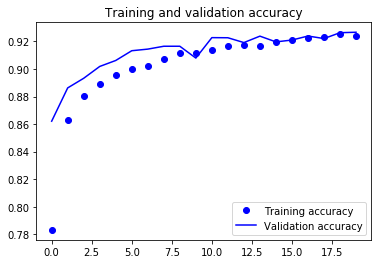

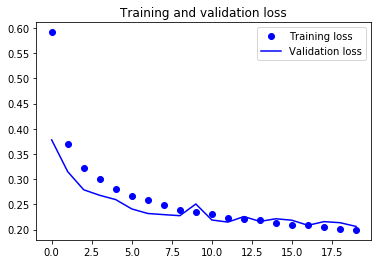

In [29]:
accuracy = fashion_train_dropout.history['acc']
val_accuracy = fashion_train_dropout.history['val_acc']
loss = fashion_train_dropout.history['loss']
val_loss = fashion_train_dropout.history['val_loss']
epochs = range(len(accuracy))
plt.plot(epochs, accuracy, 'bo', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

Finally, you can see that the validation loss and validation accuracy both are in sync with the training loss and training accuracy. Even though the validation loss and accuracy line are not linear, but it shows that your model is not overfitting: the validation loss is decreasing and not increasing, and there is not much gap between training and validation accuracy.

Therefore, you can say that your model's generalization capability became much better since the loss on both test set and validation set was only slightly more compared to the training loss.

## Predict Labels

In [30]:
predicted_classes = fashion_model.predict(test_X)

Since the predictions you get are floating point values, it will not be feasible to compare the predicted labels with true test labels. So, you will round off the output which will convert the float values into an integer. Further, you will use `np.argmax()` to select the index number which has a higher value in a row. 

For example, let's assume a prediction for one test image to be `0 1 0 0 0 0 0 0 0 0`, the output for this should be a class label `1`.

In [31]:
predicted_classes = np.argmax(np.round(predicted_classes),axis=1)

In [32]:
predicted_classes.shape, test_Y.shape

((10000,), (10000,))

Found 9216 correct labels


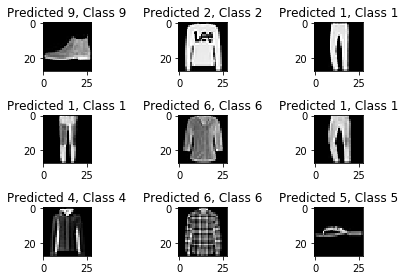

In [34]:
correct = np.where(predicted_classes==test_Y)[0]
print("Found %d correct labels" % len(correct))
for i, correct in enumerate(correct[:9]):
    plt.subplot(3,3,i+1)
    plt.imshow(test_X[correct].reshape(28,28), cmap='gray', interpolation='none')
    plt.title("Predicted {}, Class {}".format(predicted_classes[correct], test_Y[correct]))
    plt.tight_layout()

Found 784 incorrect labels


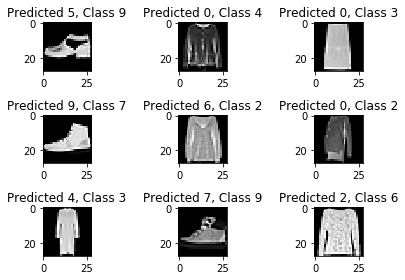

In [36]:
incorrect = np.where(predicted_classes!=test_Y)[0]
print("Found %d incorrect labels" % len(incorrect))
for i, incorrect in enumerate(incorrect[:9]):
    plt.subplot(3,3,i+1)
    plt.imshow(test_X[incorrect].reshape(28,28), cmap='gray', interpolation='none')
    plt.title("Predicted {}, Class {}".format(predicted_classes[incorrect], test_Y[incorrect]))
    plt.tight_layout()

By looking at a few images, you cannot be sure as to why your model is not able to classify the above images correctly, but it seems like a variety of the similar patterns present on multiple classes affect the performance of the classifier although CNN is a robust architecture. For example, images 5 and 6 both belong to different classes but look kind of similar maybe a jacket or perhaps a long sleeve shirt.

## Classification Report

Classification report will help us in identifying the misclassified classes in more detail. You will be able to observe for which class the model performed bad out of the given ten classes.

In [37]:
from sklearn.metrics import classification_report
target_names = ["Class {}".format(i) for i in range(num_classes)]
print(classification_report(test_Y, predicted_classes, target_names=target_names))

             precision    recall  f1-score   support

    Class 0       0.81      0.89      0.85      1000
    Class 1       0.99      0.98      0.99      1000
    Class 2       0.92      0.85      0.88      1000
    Class 3       0.93      0.92      0.92      1000
    Class 4       0.85      0.90      0.88      1000
    Class 5       0.99      0.98      0.99      1000
    Class 6       0.80      0.75      0.78      1000
    Class 7       0.96      0.98      0.97      1000
    Class 8       0.99      0.99      0.99      1000
    Class 9       0.97      0.97      0.97      1000

avg / total       0.92      0.92      0.92     10000



You can see that the classifier is underperforming for class 6 regarding both precision and recall. For class 0 and class 2, the classifier is lacking precision. Also, for class 4, the classifier is slightly lacking both precision and recall.

# Go Further!

This tutorial was good start to convolutional neural networks in Python with Keras. If you were able to follow along easily or even with little more efforts, well done! Try doing some experiments maybe with same model architecture but using different types of public datasets available. 

There is still a lot to cover, so why not take DataCamp's Deep Learning in Python course? In the meantime, also make sure to check out the Keras documentation, if you haven't done so already. You will find more examples and information on all functions, arguments, more layers, etc. It will undoubtedly be an indispensable resource when you're learning how to work with neural networks in Python! 

If you rather feel like reading a book that explains the fundamentals of deep learning (with Keras) together with how it's used in practice, you should definitely read François Chollet's Deep Learning in Python book.

## Train VGG-16 model

So we decided to go further... how about training a VGG-16 model with this data?

In [ ]:
#import vgg-16_keras as vgg
from vgg-16_keras import VGG16

fashion_model = VGG16()
sgd = SGD(lr=0.1, decay=1e-6, momentum=0.9, nesterov=True)
fashion_model.compile(optimizer=sgd, loss='categorical_crossentropy')